# UDGs distribution search Simbad

In [1]:
from dl import authClient as ac, queryClient as qc
from dl.helpers.utils import convert
from getpass import getpass
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.cosmology import WMAP9 as cosmo
import os.path
from scipy import stats
import requests
from astroquery.simbad import Simbad
from astropy import coordinates
from astropy.coordinates import search_around_3d
from astropy.table import QTable, Table, Column
import random

import sys

#if not sys.warnoptions:
#    import warnings
#    warnings.simplefilter("ignore")

In [61]:
#t = pd.read_csv('DESI_UDGs_sorted_nodups_nomisses.csv')
#t = pd.read_csv('CatalogDECaLSfinal.csv')
t = pd.read_csv('SMUDGes_catalog_8_3_22.csv')

In [76]:
# Below defines the upper and lower limits 
# mag limits to select ~ L* galaxies
# z limits set by considerations of search radius 
# The range of z defined below is the most effective range; it gives the greatest correlation  

radius_max = 10 #  8  The radius of search (deg)
radius_phys = 10  # desired max physical radius
upper_z =  6500/3e5 # 8000/3e5 
lower_z =  5500/3e5 # 6000/3e5
outname = 'result_hina_cz55_65_10.csv'

udg_size = 5.3/206265*cosmo.angular_diameter_distance(lower_z)/u.Mpc*1000*u.kpc
print('minimum udg physical size is ',udg_size)

d3d_sep = radius_max*3600/206265*cosmo.angular_diameter_distance(lower_z)/u.Mpc

print('chosen radius corresponds to ',d3d_sep,'Mpc at lower cz limit of ', lower_z)
radius = radius_max*(radius_phys/d3d_sep)
print('angular radius cut = ',radius)

#chose a larger than needed range so that we can trim later without redoing queries
mag_upper = -16
mag_lower = -24

# Below defines the mean difference of mag_g and mag_B; 
# When mag_g doesn't exist, use mag_B + diff_mean.
# Otherwiese, use mag_g

diff_mean = 0.36124462

# do_rand = 0 means not doing random shifts, 1 = yes
do_rand = 0

minimum udg physical size is  1.9926990348797629 kpc
chosen radius corresponds to  13.535314199183293 Mpc at lower cz limit of  0.018333333333333333
angular radius cut =  7.388081172584372


In [77]:
Simbad.get_votable_fields()

['main_id',
 'z_value',
 'flux(g)',
 'flux(B)',
 'ra(d)',
 'dec(d)',
 'z_value',
 'flux(g)',
 'flux(B)',
 'ra(d)',
 'dec(d)']

In [78]:
# define fields that will be extracted from Simbad

Simbad.add_votable_fields('z_value')
Simbad.add_votable_fields('flux(g)')  
Simbad.add_votable_fields('flux(B)') # Newly added
Simbad.add_votable_fields('ra(d)')
Simbad.add_votable_fields('dec(d)')
Simbad.remove_votable_fields('coordinates')
Simbad.get_votable_fields()

Simbad.TIMEOUT = 180

/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:456: UserWarning: coordinates: this field is not set
  warnings.warn("{field}: this field is not set".format(field=field))


Below creates the base (first) dataframe

In [79]:
import random 

# Start from the very first udg on the catalog; n = 0
nth = 0 # nth udg = t[nth] is used in the simbad query. 

sep_all = np.array([])
sep_red, sep_blue = [], []
list_of_neighbors = []
#print('UDG Number ', nth+1, t['SMDG'][nth])

# search radius is 1.3 degrees - a compromise between too large a call and too small an area
# Creates the very first df table, df_base, which is later used to append all the df_3s to for the rest of the UDGs using pd.merge

# Itertates through the UDG catalog (defines as "t")
# The loop continues until Simbad finds some object around a UDG. Breakes the loop after creating the first df 
while True:
    print('UDG Number ', nth+1, t['SMDG'][nth])
    if (do_rand==0):
        Shift_deg = 0 
    else:
        Shift_deg = random.uniform(50, 90)
    
# Defines the coordinates of nth udg in t
    co = coordinates.SkyCoord(ra=t['RA'][nth]+Shift_deg , dec=t['dec'][nth], unit=(u.deg, u.deg),frame='icrs')

    
# Execute the query around nth udg 
    ra_q = t['RA'][nth]
    dec_q = t['dec'][nth]
#        print(ra_q,dec_q,co)
            
    if (dec_q > 0):
        print(str(ra_q))
        print(str(dec_q))
        print(str(radius))
        print(str(lower_z))
        s1 = 'region(circle,' + str(ra_q) + ' +' + str(dec_q) + ',' + str(radius) +'d) & redshift > ' + str(lower_z) + ' & redshift < ' + str(upper_z)
        print(s1)
    else:
        s1 = 'region(circle,' + str(ra_q) + ' ' + str(dec_q) + ',' + str(radius) +'d) & redshift > ' + str(lower_z) + ' & redshift < ' + str(upper_z) 
#    print(s1)
    df = []
        
    try:
        df = Simbad.query_criteria(s1)
#        print(df)
    except OSError:
        print('fail')
# If none found around the udg, nth +=1 and repeats with the next UDG in the catalog 
        nth += 1
        pass

#    print('ab')
# Defines the color of UDG    
    color = (t['mag_g'][nth]-t['mag_g_median'][nth])-(t['mag_r'][nth]-t['mag_r_median'][nth])
#    print('color = ',color)

#   implement cut on measured g band apparent magnitude
    try:
# NEEDED TO ADD df[mag] HERE AND COUNT TO STORE THE MAG VALUES FOR THE FIRST UDG
        df['mag'] = df['FLUX_g']/u.mag
        df['abs_mag'] = df['FLUX_g']/u.mag
        df['dm'] = df['FLUX_g']/u.mag

        df_1 = df[(df['FLUX_g']>0)] 
        print('length df1',len(df_1))

        for j in range(0,len(df_1)):
            df_1['dm'][j] = (5 * np.log10(cosmo.luminosity_distance(df_1['Z_VALUE'][j])/u.Mpc*10**5))
#            print(i,mm,df_1['FLUX_g'][i])

#    use cosmo.luminosity_distance(df['Z_VALUE'] to convert apparent to absolute magnitudes
        df_1['abs_mag'] = df_1['FLUX_g']/u.mag - df_1['dm']

#   implement second cut for MW analogs    
#        print(mag_upper,mag_lower)
        df_2 = df_1[(df_1['abs_mag']<mag_upper) & (df_1['abs_mag']>mag_lower)]

        print('length df2',len(df_2))

#   set up coordinates for all normal galaxies    
        normal_coord =  SkyCoord(df_2['RA_d'],df_2['DEC_d'],unit=(u.deg, u.deg),frame='icrs')

        df_2['da']  = df_2['dm']
#   calculate projected separation for each normal galaxy to the current UDG using angular diameter distance
        for j in range(0,len(df_2)):
            df_2['da'][j] = cosmo.angular_diameter_distance(df_2['Z_VALUE'][j])/u.Mpc 

        df_2['separation'] = normal_coord.separation(co)/u.deg/206265*3600*df_2['da'] # cosmo.angular_diameter_distance(df_2['Z_VALUE'])/u.Mpc      
            
#   implement final cut on physical projected separation    
        df_3 = df_2[(df_2['separation']<d3d_sep)]  
        print('length df3 ',len(df_3))
    
        if (len(df_3)>0):
            for j in range(0,len(df_3)):
                df_3['dm'][j] = (5 * np.log10(cosmo.luminosity_distance(df_3['Z_VALUE'][j])/u.Mpc*10**5))
            df_3['color'] = color
            df_3['UDG id'] = t['SMDG'][nth]    
#            print(t['mag_g'][1])
            df_3['UDG abMag'] = (t['mag_g'][nth]-t['mag_g_median'][nth]) - df_3['dm']
            list_of_neighbors = df_3['separation'].tolist()
            print(list_of_neighbors)
        else:
            nth+=1

        if (len(list_of_neighbors)>0):
#            save all projected separations that satisfy, and do the same as a function of UDG color
            sep_all = np.append(sep_all,list_of_neighbors)   
            if (color < 0.45):
                sep_blue = np.append(sep_blue,list_of_neighbors)
                break
            elif (color < 0.9):
                sep_red = np.append(sep_red, list_of_neighbors)
                break
        
    except ValueError:
        print('df is 0')
        nth +=1
        pass


UDG Number  1 SMDG0000017+325141
0.00704
32.86149
7.388081172584372
0.018333333333333333
region(circle,0.00704 +32.86149,7.388081172584372d) & redshift > 0.018333333333333333 & redshift < 0.021666666666666667
length df1 14
length df2 12
length df3  12
[6.762218977984929, 7.377762124900895, 8.138495782390839, 9.913086231234232, 9.890094632386859, 10.857553999036375, 10.15115838590109, 8.329003727046922, 8.977015923910757, 10.287344959270436, 9.763723804876681, 8.042422820664015]


In [80]:
df_base = df_3.to_pandas()
df_base

,MAIN_ID,Z_VALUE,FLUX_g,FLUX_B,RA_d,DEC_d,Z_VALUE_2,FLUX_g_1,FLUX_B_1,RA_d_1,...,DEC_d_2,SCRIPT_NUMBER_ID,mag,abs_mag,dm,da,separation,color,UDG id,UDG abMag
0,NGC 68,0.019130,14.178000,14.5,4.576956,30.071664,0.019130,14.178000,14.5,4.576956,...,30.071664,0,14.178000,-20.442543,34.620544,80.844406,6.762219,0.33231,SMDG0000017+325141,-14.002934
1,2MASX J00181219+3003195,0.020954,16.002001,NaN,4.550755,30.055568,0.020954,16.002001,NaN,4.550755,...,30.055568,0,16.002001,-18.819326,34.821327,88.359398,7.377762,0.33231,SMDG0000017+325141,-14.203716
2,LEDA 1888225,0.021284,16.677111,NaN,5.133603,30.050500,0.021284,16.677111,NaN,5.133603,...,30.050500,0,16.677111,-18.178694,34.855804,89.715500,8.138496,0.33231,SMDG0000017+325141,-14.238194
3,UGC 279,0.021267,14.406000,14.3,7.062092,30.803264,0.021267,14.406000,14.3,7.062092,...,30.803264,0,14.406000,-20.448038,34.854038,89.645660,9.913086,0.33231,SMDG0000017+325141,-14.236427
4,UGC 276,0.021346,15.433000,15.6,6.998146,30.764842,0.021346,15.433000,15.6,6.998146,...,30.764842,0,15.433000,-19.429222,34.862221,89.970161,9.890095,0.33231,SMDG0000017+325141,-14.244610
5,UGC 319,0.021390,14.810000,15.1,8.050321,31.681603,0.021390,14.810000,15.1,8.050321,...,31.681603,0,14.810000,-20.056763,34.866764,90.150864,10.857554,0.33231,SMDG0000017+325141,-14.249153
6,UGC 299,0.021264,14.921000,15.3,7.472481,31.393329,0.021264,14.921000,15.3,7.472481,...,31.393329,0,14.921000,-19.932730,34.853729,89.633339,10.151158,0.33231,SMDG0000017+325141,-14.236118
7,LEDA 5065172,0.020205,17.625000,NaN,358.550349,27.408865,0.020205,17.625000,NaN,358.550349,...,27.408865,0,17.625000,-17.116047,34.741047,85.277466,8.329004,0.33231,SMDG0000017+325141,-14.123436
8,LEDA 1853435,0.020804,17.159000,NaN,5.178661,29.026449,0.020804,17.159000,NaN,5.178661,...,29.026449,0,17.159000,-17.646477,34.805477,87.742638,8.977016,0.33231,SMDG0000017+325141,-14.187866
9,LEDA 1913886,0.020668,16.232870,NaN,7.541200,30.690800,0.020668,16.232870,NaN,7.541200,...,30.690800,0,16.232870,-18.558142,34.791012,87.183243,10.287345,0.33231,SMDG0000017+325141,-14.173401


In [81]:
print(nth, "th udg was used for the first database; continue the simbad query with ", nth+1, "th udg")

0 th udg was used for the first database; continue the simbad query with  1 th udg


In [82]:
import numpy.ma as ma

Simbad.TIMEOUT = 180
sep_all = np.array([])
sep_red, sep_blue = [], []

fail_count = 0
max_len = 0

print(len(t))

i0 = nth + 1
i = i0

while (i < len(t)-2):
    print(i)
    for k in range(0,500):
        i = i0 + k
    
        if (do_rand==0):
            Shift_deg = 0 
        else:
            Shift_deg = random.uniform(50, 90)
    
        co = coordinates.SkyCoord(ra=t['RA'][i]+Shift_deg, dec=t['dec'][i], unit=(u.deg, u.deg),frame='icrs')
#    print(i,t['RA'][i],t['dec'][i],Simbad.TIMEOUT)
        try:
            ra_q = t['RA'][i]
            dec_q = t['dec'][i]
            if (dec_q > 0):
                s1 = 'region(circle,' + str(ra_q) + ' +' + str(dec_q) + ',' + str(radius) +'d) & redshift > ' + str(lower_z) + ' & redshift < ' + str(upper_z) 
            else:
                s1 = 'region(circle,' + str(ra_q) + ' ' + str(dec_q) + ',' + str(radius) +'d) & redshift > ' + str(lower_z) + ' & redshift < ' + str(upper_z) 
#        print(s1)
#        print(str(ra_q))
#        print(str(dec_q))
#        print(str(radius))
#        print(str(lower_z))
            qry = (s1)
            df = []
            df = Simbad.query_criteria(s1)
#        print(df.colnames)
#        print(df.dtype)
#        df = Simbad.query_region(co,radius= radius * u.degree,equinox=2020.0,epoch='J2000.0')
            if df is not None:
#            print(i,len(df))
                max_len = max(len(df),max_len)
        except OSError:
            print('object ',i,'failed first pass')
            df = None
#        Simbad.TIMEOUT = 180
#        try:
#                df = Simbad.query_region(co,radius= radius * u.degree,equinox=2020.0,epoch='J2000.0')
#                Simbad.TIMEOUT = 180
#        except OSError:
#                print('failed again',t['RA'][i],t['dec'][i],Simbad.ROW_LIMIT,Simbad.TIMEOUT)
#                fail_count+=1
#                pass
            pass
    
        if df is not None:
            print('a',i,k,len(df))  
    # defining color of UDG    
#        print('a1')
            color = (t['mag_g'][i]-t['mag_g_median'][i])-(t['mag_r'][i]-t['mag_r_median'][i])
            mag = []
            count = 0
            for j in range(len(df)):
    # if both values exist, use g
                if df['FLUX_g'][j] is ma.masked:
                    if df['FLUX_B'][j] is ma.masked: #1, both --
                        mag = np.append(mag, -1)
                        count +=1
                    else: # if g does NOT exist and B does, use B + diff_mean
                        mag = np.append(mag, df['FLUX_B'][j]+diff_mean) #3, no g with B
                        count +=1
                else: # g exists
                    mag = np.append(mag, df['FLUX_g'][j])
                    count +=1

            if (len(df)>0):
                df['mag'] = mag 
                df['dm'] = mag
                df['da'] = mag

#        try:
#        print('a2')
            print(df['Z_VALUE'],df['mag'])
            df_1 = df[(df['Z_VALUE']<upper_z) & (df['Z_VALUE']>lower_z) & (df['mag']>0)]
            if len(df_1) > 0:
                for j in range(0,len(df_1)):
                    df_1['dm'][j] = (5 * np.log10(cosmo.luminosity_distance(df_1['Z_VALUE'][j])/u.Mpc*10**5))
                df_1['abs_mag'] = df_1['mag'] - df_1['dm'] # (5 * np.log10(cosmo.luminosity_distance(df_1['Z_VALUE'])/u.Mpc*10**6)-5)
                df_2 = df_1[(df_1['abs_mag']<mag_upper) & (df_1['abs_mag']>mag_lower) & (df_1['DEC_d']!='-')]
#            print('a3')
                if len(df_2) > 0:
                    for j in range(0,len(df_2)):
                        df_2['da'][j] = cosmo.angular_diameter_distance(df_2['Z_VALUE'][j])/u.Mpc 
    #    set up coordinates for all normal galaxies 
#                print('b',df_2.colnames)
#                print('aaa',df_2['RA_d'].dtype)
                    normal_coord =  SkyCoord(df_2['RA_d'],df_2['DEC_d'],unit=(u.deg, u.deg),frame='icrs')
    #   calculate projected separation for each normal galaxy to the current UDG using angular diameter distance
                    df_2['separation'] = normal_coord.separation(co)/u.deg/206265*3600*df_2['da'] # cosmo.angular_diameter_distance(df_2['Z_VALUE'])/u.Mpc  
    #   implement final cut on physical projected separation    
                    df_3 = df_2[(df_2['separation']<d3d_sep)] 
                    if len(df_3) > 0:
                        for j in range(0,len(df_3)):
                            df_3['dm'][j] = (5 * np.log10(cosmo.luminosity_distance(df_3['Z_VALUE'][j])/u.Mpc*10**5))
                        df_3['color'] = color
            #print(df_3['FLUX_g'],df_3['FLUX_B'])
#                    print('c',len(df_3))
                        df_3['UDG id'] = t['SMDG'][i]   
                        df_3['UDG abMag'] = (t['mag_g'][i]-t['mag_g_median'][i]) - df_3['dm']
#                        list_of_neighbors = df_3['separation'].tolist()
    #   save all projected separations that satisfy, and do the same as a function of UDG color
#                        if (len(list_of_neighbors)>0):
#                            sep_all = np.append(sep_all,list_of_neighbors)   
#                            print(i,len(list_of_neighbors))
#                            if (color < 0.45):
#                                sep_blue = np.append(sep_blue,list_of_neighbors)
#                            elif (color < 0.9):
#                                sep_red = np.append(sep_red,list_of_neighbors)

    #    converts df_3 from astropy table to panda DataFrame
    #            print(df_3)
                        df_3 = df_3.to_pandas()

    #    merge df_3s and the exisiting table 
                        if len(df_base) > 0:
                            result = pd.concat([df_base, df_3]) 
                            df_base = result
                        else:
                            df_base = df_3.to_pandas()
#                    print('df3',df_3)

    #                print(df_3['separation'],df_3['abs_mag'],df_3['mag'])
#        except ValueError:
#            pass
#        except TypeError:
#            print('none found')
    if (i0 == nth+1):
        result.to_csv(outname, mode='w', index = False)
    else:
        result.to_csv(outname, mode='a', index = False, header = False)

    i0 = i+1

print(fail_count,' failed search')
print(max_len,'max length of df')

7070
1
a 1 0 24
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0189400
0.0208010
      ...
0.0206810
0.0204440
0.0202280
0.0200000
0.0211000
0.0187960
0.0187500
0.0198200
0.0198300
0.0198500
0.0200100
Length = 24 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
15.301244200383302
13.951244772587891
               ...
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
19.595243872319337
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2 1 151
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0214280
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0215060
      ...
0.0209670
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0216120
Length = 151 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.761244238530274
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
15.461245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3 2 93
 Z_VALUE 
---------
0.0203610
0.0187100
0.0201000
0.0186500
0.0185000
0.0183890
0.0187040
0.0189530
0.0185090
0.0215740
      ...
0.0213000
0.0209900
0.0205900
0.0211000
0.0195190
0.0202350
0.0216120
0.0214310
0.0211680
0.0201190
0.0195550
Length = 93 rows        mag        
------------------
15.260000228881836
              -1.0
              -1.0
       15.36124462
16.061244429265138
       14.86124462
              -1.0
              -1.0
15.401244581853028
              -1.0
               ...
              -1.0
              -1.0
              -1.0
19.565000534057617
 22.27651023864746
  18.9068603515625
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4 3 128
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0200000
0.0200000
0.0189860
0.0212500
0.0215260
0.0215810
0.0192540
      ...
0.0214100
0.0211400
0.0184000
0.0184500
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 128 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
15.079999923706055
       15.86124462
13.761244238530274
               ...
 18.56399917602539
 18.23699951171875
18.660999298095703
18.565000534057617
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5 4 128
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0200000
0.0200000
0.0189860
0.0212500
0.0215260
0.0215810
0.0192540
      ...
0.0214100
0.0211400
0.0184000
0.0184500
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 128 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
15.079999923706055
       15.86124462
13.761244238530274
               ...
 18.56399917602539
 18.23699951171875
18.660999298095703
18.565000534057617
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6 5 28
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0204000
0.0189400
      ...
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0187500
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 28 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
16.304244459782716
15.301244200383302
               ...
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7 6 1
 Z_VALUE 
---------
0.0189930 mag 
----
-1.0
a 8 7 29
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0204000
0.0216000
      ...
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0187500
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 29 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
16.304244459782716
16.840244711552735
               ...
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 9 8 1
 Z_VALUE 
---------
0.0189930 mag 
----
-1.0
a 10 9 141
 Z_VALUE 
---------
0.0184290
0.0185410
0.0196800
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
      ...
0.0211400
0.0209600
0.0188000
0.0190900
0.0205140
0.0214100
0.0211400
0.0200000
0.0194500
0.0203800
0.0200200
Length = 141 rows        mag        
------------------
              -1.0
15.711245001469727
       14.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.56399917602539
 18.23699951171875
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 11 10 29
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0204000
0.0216000
      ...
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0187500
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 29 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
16.304244459782716
16.840244711552735
               ...
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 12 11 15
 Z_VALUE 
---------
0.0189400
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0198200
0.0198300
0.0198500
0.0200100        mag        
------------------
15.301244200383302
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 13 12 128
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
      ...
0.0209670
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0216120
Length = 128 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 14 13 1
 Z_VALUE 
---------
0.0201870        mag        
------------------
15.541244925175782


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 15 14 124
 Z_VALUE 
---------
0.0194870
0.0184290
0.0185410
0.0196800
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
      ...
0.0206400
0.0206540
0.0211400
0.0188000
0.0214300
0.0190900
0.0206860
0.0200000
0.0194500
0.0203800
0.0200200
Length = 124 rows        mag        
------------------
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 16 15 150
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0210480
0.0215060
0.0215620
0.0214000
0.0213480
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0216120
Length = 150 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
              -1.0
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 17 16 23
 Z_VALUE 
---------
0.0215230
0.0195380
0.0212840
0.0200000
0.0210000
0.0209000
0.0200070
0.0207000
0.0203000
0.0197000
0.0198000
0.0210000
0.0204000
0.0211000
0.0204000
0.0203000
0.0196000
0.0209000
0.0204000
0.0193000
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
17.137243689213868
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
 15.93124431482422
19.851244391118165
 18.56724399438965
18.778244436894532
19.094244421635743
 18.64624446741211
 18.97524494043457
19.595243872319337
 17.64124530664551
19.895245016728516
18.443245352421876
19.886244238530274
19.596245230351563
16.511244238530274
              -1.0
29.076944769536134
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 18 17 9
 Z_VALUE 
---------
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0198200
0.0198500
0.0200100        mag        
------------------
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,0.79092 -55.12787,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 20 19 158
 Z_VALUE 
---------
0.0189530
0.0184090
0.0215060
0.0215620
0.0214000
0.0213480
0.0214080
0.0185720
0.0183850
0.0187000
      ...
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0184360
0.0216120
Length = 158 rows        mag        
------------------
              -1.0
              -1.0
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
14.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 21 20 128
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0183370
0.0208710
0.0210480
0.0215060
0.0215620
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0207730
0.0216120
Length = 128 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
17.191244543706055
15.661244810734864
              -1.0
15.461245001469727
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 22 21 137
 Z_VALUE 
---------
0.0183370
0.0200000
0.0215260
0.0215810
0.0192540
0.0194930
0.0195880
0.0184490
0.0201400
0.0195900
      ...
0.0211400
0.0184000
0.0184500
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
0.0187690
Length = 137 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
14.161244810734864
       15.36124462
       15.36124462
 16.27124446741211
               ...
 18.23699951171875
18.660999298095703
18.565000534057617
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 23 22 76
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0206340
0.0207940
0.0192860
0.0200820
0.0200100
0.0209200
0.0184320
0.0206400
0.0214300
0.0190900
0.0206860
Length = 76 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.437999725341797
17.756000518798828
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 24 23 158
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0210480
0.0215060
0.0215620
0.0214000
0.0213480
      ...
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0207730
0.0216120
Length = 158 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
              -1.0
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 25 24 157
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0210480
0.0215060
0.0215620
0.0214000
0.0213480
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0216120
Length = 157 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
              -1.0
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 26 25 5
 Z_VALUE 
---------
0.0201870
0.0206810
0.0198200
0.0198200
0.0198500        mag        
------------------
15.541244925175782
15.291244925175782
16.531244696293946
16.881245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 27 26 9
 Z_VALUE 
---------
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0198200
0.0198500
0.0200100        mag        
------------------
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 28 27 161
 Z_VALUE 
---------
0.0187460
0.0186130
0.0186900
0.0183800
0.0210290
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
      ...
0.0216120
0.0214310
0.0214890
0.0216560
0.0209670
0.0205420
0.0204260
0.0196460
0.0195340
0.0185820
0.0184360
Length = 161 rows        mag        
------------------
14.395000457763672
14.461245001469727
15.623000144958496
16.920000076293945
       17.36124462
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 29 28 156
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0215060
0.0215620
0.0214000
0.0213480
0.0214080
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0216120
Length = 156 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 30 29 28
 Z_VALUE 
---------
0.0215230
0.0212840
0.0200000
0.0210000
0.0209000
0.0200070
0.0201330
0.0206060
0.0207000
0.0203000
      ...
0.0211000
0.0204000
0.0203000
0.0196000
0.0209000
0.0204000
0.0200000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 28 rows        mag        
------------------
              -1.0
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
 15.93124431482422
 16.73824542871582
16.231244505559083
19.851244391118165
 18.56724399438965
               ...
19.595243872319337
 17.64124530664551
19.895245016728516
18.443245352421876
19.886244238530274
19.596245230351563
 19.11324542871582
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 31 30 146
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0183460
0.0192000
      ...
0.0214100
0.0211400
0.0184000
0.0184500
0.0188300
0.0185100
0.0200000
0.0215700
0.0194500
0.0195200
0.0203800
Length = 146 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
              -1.0
              -1.0
               ...
 18.56399917602539
 18.23699951171875
18.660999298095703
18.565000534057617
18.415000915527344
18.582000732421875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 32 31 162
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0215500
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0184030
      ...
0.0195100
0.0193640
0.0187690
0.0184700
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 162 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
16.913000106811523
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 33 32 9
 Z_VALUE 
---------
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0198200
0.0198500
0.0200100        mag        
------------------
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 34 33 127
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0186530
0.0214280
0.0183370
0.0210480
0.0215060
0.0215620
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0207730
0.0216120
Length = 127 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
16.061244429265138
15.761244238530274
17.191244543706055
              -1.0
15.461245001469727
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 35 34 3
 Z_VALUE 
---------
0.0188900
0.0189930
0.0215000        mag        
------------------
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 36 35 33
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0187500
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 33 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 37 36 152
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0215260
0.0215810
0.0192540
      ...
0.0184500
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0194200
Length = 152 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
15.079999923706055
       15.86124462
13.761244238530274
               ...
18.565000534057617
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 38 37 24
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0204000
0.0216000
0.0189400
0.0208010
      ...
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0198200
0.0198300
0.0198500
0.0200100
Length = 24 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
16.304244459782716
16.840244711552735
15.301244200383302
13.951244772587891
               ...
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 39 38 93
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
      ...
0.0200820
0.0200100
0.0202700
0.0209200
0.0203200
0.0184320
0.0206400
0.0214300
0.0190900
0.0206860
0.0200200
Length = 93 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
               ...
              -1.0
17.437999725341797
16.555999755859375
17.756000518798828
16.774999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 40 39 154
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0215500
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0191700
      ...
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 154 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
16.913000106811523
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 41 40 105
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
      ...
0.0190000
0.0200100
0.0202700
0.0209200
0.0203200
0.0184320
0.0206400
0.0214300
0.0190900
0.0206860
0.0200200
Length = 105 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
               ...
              -1.0
17.437999725341797
16.555999755859375
17.756000518798828
16.774999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 42 41 156
 Z_VALUE 
---------
0.0214000
0.0185720
0.0183850
0.0187000
0.0184600
0.0214200
0.0214000
0.0211900
0.0200200
0.0194600
      ...
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0184360
0.0216120
Length = 156 rows        mag        
------------------
15.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
       17.36124462
15.961245001469727
15.761244238530274
15.437000274658203
15.461999893188477
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 43 42 153
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0215500
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0191700
      ...
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 153 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
16.913000106811523
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 44 43 142
 Z_VALUE 
---------
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0191100
      ...
0.0206400
0.0206540
0.0211400
0.0188000
0.0214300
0.0190900
0.0206860
0.0196900
0.0194500
0.0203800
0.0200200
Length = 142 rows        mag        
------------------
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 45 44 158
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0215500
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0184030
      ...
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 158 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
16.913000106811523
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 46 45 174
 Z_VALUE 
---------
0.0195100
0.0192730
0.0193930
0.0196470
0.0215550
0.0185800
0.0212900
0.0206940
0.0209060
0.0210420
      ...
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0211820
0.0187110
0.0212030
Length = 174 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
              -1.0
              -1.0
18.161243857060548
       16.36124462
       13.36124462
       15.36124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 47 46 25
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200480
0.0204000
0.0216000
0.0189400
      ...
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0198200
0.0198300
0.0198500
0.0200100
Length = 25 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
16.791244925175782
16.304244459782716
16.840244711552735
15.301244200383302
               ...
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 48 47 95
 Z_VALUE 
---------
0.0208400
0.0215640
0.0191300
0.0213590
0.0214800
0.0205860
0.0216250
0.0185820
0.0209540
0.0212060
      ...
0.0202350
0.0190590
0.0192590
0.0210100
0.0205999
0.0216120
0.0214310
0.0211680
0.0211860
0.0201190
0.0200040
Length = 95 rows        mag        
------------------
15.161244810734864
15.961245001469727
14.178000450134277
15.661244810734864
15.561244429265138
15.961245001469727
              -1.0
              -1.0
 16.00200080871582
              -1.0
               ...
  18.9068603515625
16.529809951782227
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 49 48 159
 Z_VALUE 
---------
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0205200
0.0214510
0.0204600
      ...
0.0190900
0.0201500
0.0206860
0.0205140
0.0214100
0.0211400
0.0200000
0.0194500
0.0195200
0.0203800
0.0200200
Length = 159 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
       15.36124462
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 18.56399917602539
 18.23699951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 50 49 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 51 50 9
 Z_VALUE 
---------
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0198200
0.0198500
0.0200100        mag        
------------------
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 52 51 151
 Z_VALUE 
---------
0.0212900
0.0206940
0.0209060
0.0210420
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0199000
      ...
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0211820
0.0187110
0.0212030
Length = 151 rows        mag        
------------------
       16.36124462
       13.36124462
       15.36124462
       16.36124462
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 53 52 82
 Z_VALUE 
---------
0.0193030
0.0196900
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
      ...
0.0206340
0.0207940
0.0192860
0.0200820
0.0200100
0.0209200
0.0203200
0.0206400
0.0214300
0.0190900
0.0206860
Length = 82 rows        mag        
------------------
15.061244429265138
15.871244848881837
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.437999725341797
17.756000518798828
16.774999618530273
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 54 53 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 55 54 30
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0203200
0.0200480
0.0196000
      ...
0.0204440
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 30 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
 16.24124473444092
16.791244925175782
              -1.0
               ...
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 56 55 135
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
      ...
0.0193640
0.0187690
0.0184700
0.0216630
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 135 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 57 56 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 58 57 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 59 58 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 60 59 178
 Z_VALUE 
---------
0.0200960
0.0200000
0.0202600
0.0205200
0.0214510
0.0204600
0.0209400
0.0199700
0.0201500
0.0183370
      ...
0.0184000
0.0184500
0.0200400
0.0200000
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0194200
Length = 178 rows        mag        
------------------
       14.36124462
14.501244963322755
 16.50124400964844
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
15.770999908447266
15.871244848881837
               ...
18.660999298095703
18.565000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 61 60 142
 Z_VALUE 
---------
0.0212900
0.0206940
0.0209060
0.0210420
0.0215820
0.0210000
0.0212300
0.0205250
0.0208520
0.0215000
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0208620
0.0211820
0.0187110
0.0212030
Length = 142 rows        mag        
------------------
       16.36124462
       13.36124462
       15.36124462
       16.36124462
       14.36124462
 17.50824397913086
              -1.0
15.133000373840332
       14.86124462
16.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 62 61 148
 Z_VALUE 
---------
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0191100
      ...
0.0206400
0.0206540
0.0214300
0.0204360
0.0190900
0.0206860
0.0196900
0.0194500
0.0203800
0.0200200
0.0202300
Length = 148 rows        mag        
------------------
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 63 62 194
 Z_VALUE 
---------
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
0.0205200
0.0197800
      ...
0.0211400
0.0200400
0.0196900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 194 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
       15.36124462
 16.75124400964844
               ...
 18.23699951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 64 63 159
 Z_VALUE 
---------
0.0214000
0.0185720
0.0183850
0.0187000
0.0184600
0.0214200
0.0214000
0.0211900
0.0200200
0.0194600
      ...
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0207730
0.0216120
Length = 159 rows        mag        
------------------
15.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
       17.36124462
15.961245001469727
15.761244238530274
15.437000274658203
15.461999893188477
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 65 64 23
 Z_VALUE 
---------
0.0215230
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0196000
0.0200070
0.0207000
0.0203000
0.0197000
0.0198000
0.0204000
0.0211000
0.0204000
0.0203000
0.0196000
0.0204000
0.0193000
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.719244421635743
 15.93124431482422
19.851244391118165
 18.56724399438965
18.778244436894532
19.094244421635743
 18.97524494043457
19.595243872319337
 17.64124530664551
19.895245016728516
18.443245352421876
19.596245230351563
16.511244238530274
              -1.0
29.076944769536134
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 66 65 32
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0204440
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 32 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 67 66 119
 Z_VALUE 
---------
0.0199000
0.0202370
0.0207710
0.0188900
0.0188300
0.0194400
0.0200000
0.0200000
0.0184530
0.0184150
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0208620
0.0211820
0.0187110
0.0212030
Length = 119 rows        mag        
------------------
       16.36124462
       16.36124462
15.204000473022461
15.616000175476074
              -1.0
14.859000205993652
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 68 67 188
 Z_VALUE 
---------
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
      ...
0.0216120
0.0214310
0.0216560
0.0205420
0.0204260
0.0196460
0.0195340
0.0185820
0.0211680
0.0201190
0.0190000
Length = 188 rows        mag        
------------------
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 69 68 149
 Z_VALUE 
---------
0.0212900
0.0206940
0.0209060
0.0210420
0.0215820
0.0210000
0.0212300
0.0205250
0.0208520
0.0210560
      ...
0.0191260
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0212030
Length = 149 rows        mag        
------------------
       16.36124462
       13.36124462
       15.36124462
       16.36124462
       14.36124462
 17.50824397913086
              -1.0
15.133000373840332
       14.86124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 70 69 5
 Z_VALUE 
---------
0.0197270
0.0200000
0.0188900
0.0189930
0.0215000        mag        
------------------
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 71 70 120
 Z_VALUE 
---------
0.0207710
0.0188900
0.0188300
0.0194400
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0191700
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0208620
0.0211820
0.0187110
0.0212030
Length = 120 rows        mag        
------------------
15.204000473022461
15.616000175476074
              -1.0
14.859000205993652
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 72 71 212
 Z_VALUE 
---------
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
0.0205200
0.0197800
      ...
0.0200400
0.0196900
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 212 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
       15.36124462
 16.75124400964844
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 73 72 28
 Z_VALUE 
---------
0.0215230
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0196000
0.0200070
0.0197000
      ...
0.0197000
0.0211000
0.0204000
0.0203000
0.0202000
0.0196000
0.0204000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 28 rows        mag        
------------------
              -1.0
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.719244421635743
 15.93124431482422
16.321244658146973
               ...
 16.64124530664551
19.595243872319337
 17.64124530664551
19.895245016728516
  17.7052444826709
18.443245352421876
19.596245230351563
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 74 73 211
 Z_VALUE 
---------
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
0.0205200
0.0197800
      ...
0.0200400
0.0196900
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 211 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
       15.36124462
 16.75124400964844
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 75 74 190
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0183460
      ...
0.0184100
0.0200000
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0194000
0.0187690
0.0194200
Length = 190 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
              -1.0
               ...
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 76 75 159
 Z_VALUE 
---------
0.0184600
0.0211900
0.0200200
0.0194600
0.0214100
0.0210080
0.0211800
0.0212300
0.0184430
0.0186900
      ...
0.0209670
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
Length = 159 rows        mag        
------------------
       17.36124462
15.437000274658203
15.461999893188477
15.261244238530274
15.623000144958496
       15.86124462
15.261244238530274
16.061244429265138
15.583999633789062
15.838000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 77 76 187
 Z_VALUE 
---------
0.0195100
0.0192730
0.0196470
0.0215550
0.0185800
0.0187930
0.0189200
0.0212900
0.0206940
0.0209060
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0212030
0.0194200
Length = 187 rows        mag        
------------------
       15.36124462
       14.86124462
              -1.0
              -1.0
18.161243857060548
       14.36124462
17.131245077763673
       16.36124462
       13.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 78 77 210
 Z_VALUE 
---------
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
0.0205200
0.0197800
0.0214510
0.0204600
      ...
0.0200400
0.0196900
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 210 rows        mag        
------------------
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
       15.36124462
 16.75124400964844
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 79 78 191
 Z_VALUE 
---------
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
      ...
0.0216120
0.0214310
0.0216560
0.0205420
0.0204260
0.0196460
0.0195340
0.0185820
0.0211680
0.0201190
0.0190000
Length = 191 rows        mag        
------------------
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 80 79 160
 Z_VALUE 
---------
0.0184090
0.0216350
0.0214280
0.0183370
0.0187150
0.0214000
0.0185720
0.0183850
0.0187000
0.0184600
      ...
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0207730
0.0216120
Length = 160 rows        mag        
------------------
              -1.0
15.261244238530274
15.761244238530274
17.191244543706055
15.961245001469727
15.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
       17.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 81 80 216
 Z_VALUE 
---------
0.0200960
0.0200000
0.0202600
0.0205200
0.0214510
0.0204600
0.0209400
0.0199700
0.0183370
0.0200000
      ...
0.0196900
0.0184100
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0194200
Length = 216 rows        mag        
------------------
       14.36124462
14.501244963322755
 16.50124400964844
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
15.871244848881837
16.746999740600586
               ...
              -1.0
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 82 81 2
 Z_VALUE 
---------
0.0200000
0.0189930        mag       
-----------------
18.27124446741211
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 83 82 136
 Z_VALUE 
---------
0.0203610
0.0195310
0.0192280
0.0196120
0.0208070
0.0208350
0.0192730
0.0191360
0.0190310
0.0198880
      ...
0.0184450
0.0192590
0.0210100
0.0205999
0.0216120
0.0214310
0.0211680
0.0211860
0.0201190
0.0200040
0.0190000
Length = 136 rows        mag        
------------------
15.260000228881836
14.545000076293945
14.961245001469727
15.261244238530274
15.961245001469727
15.878000259399414
 18.72524494043457
  14.6850004196167
17.301245154057618
              -1.0
               ...
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 84 83 228
 Z_VALUE 
---------
0.0191000
0.0214500
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
      ...
0.0200400
0.0196900
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 228 rows        mag        
------------------
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 228 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 85 84 192
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0183460
0.0192000
      ...
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0194000
0.0187690
0.0193640
0.0184700
0.0194200
Length = 192 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 86 85 202
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0211600
0.0189860
0.0212500
0.0203650
0.0198700
      ...
0.0184100
0.0200000
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0194200
Length = 202 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
15.859000205993652
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
               ...
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 87 86 141
 Z_VALUE 
---------
0.0212900
0.0206940
0.0205250
0.0208520
0.0215000
0.0205860
0.0209100
0.0203200
0.0195650
0.0207940
      ...
0.0191260
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0212030
Length = 141 rows        mag        
------------------
       16.36124462
       13.36124462
15.133000373840332
       14.86124462
16.001244963322755
       14.36124462
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 88 87 238
 Z_VALUE 
---------
0.0191000
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0191100
0.0197500
0.0200960
      ...
0.0200400
0.0196900
0.0201700
0.0200900
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 238 rows        mag        
------------------
              -1.0
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 89 88 222
 Z_VALUE 
---------
0.0191000
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0191100
0.0197500
0.0200960
      ...
0.0201500
0.0206860
0.0205140
0.0206900
0.0196900
0.0201700
0.0200900
0.0194500
0.0203800
0.0200200
0.0202300
Length = 222 rows        mag        
------------------
              -1.0
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 90 89 210
 Z_VALUE 
---------
0.0199700
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0211600
0.0189860
0.0212500
0.0203650
      ...
0.0196900
0.0184100
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0194200
Length = 210 rows        mag        
------------------
       15.36124462
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
15.859000205993652
       15.36124462
16.631245077763673
14.416999816894531
               ...
              -1.0
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 91 90 249
 Z_VALUE 
---------
0.0191000
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0191100
0.0197500
0.0200960
      ...
0.0200400
0.0196900
0.0201700
0.0200900
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194200
Length = 249 rows        mag        
------------------
              -1.0
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 92 91 250
 Z_VALUE 
---------
0.0191000
0.0214500
0.0191100
0.0197500
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
      ...
0.0201700
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0194200
Length = 250 rows        mag        
------------------
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
               ...
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 93 92 125
 Z_VALUE 
---------
0.0202180
0.0183880
0.0192420
0.0216220
0.0189530
0.0184090
0.0216350
0.0186530
0.0214280
0.0186700
      ...
0.0183710
0.0183340
0.0204260
0.0183580
0.0196460
0.0195100
0.0187830
0.0186530
0.0195340
0.0207730
0.0216120
Length = 125 rows        mag        
------------------
       16.36124462
       16.86124462
14.890000343322754
15.661244810734864
              -1.0
              -1.0
15.261244238530274
16.061244429265138
15.761244238530274
15.972359657287598
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 94 93 204
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0210000
      ...
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0187690
0.0184700
0.0194200
Length = 204 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
16.165000915527344
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 95 94 37
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0204440
0.0202280
0.0200000
0.0211000
0.0199000
0.0200000
0.0187960
0.0199000
0.0195900
0.0198300
0.0200100
Length = 37 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
14.691244543706055
14.561244429265138
       18.36124462
19.595243872319337
 16.94224399438965
22.761244238530274
15.201244772587891
 16.09124416223633
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 96 95 249
 Z_VALUE 
---------
0.0191000
0.0200960
0.0192960
0.0192550
0.0200000
0.0202600
0.0190900
0.0205200
0.0197800
0.0214510
      ...
0.0201700
0.0200900
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0194200
Length = 249 rows        mag        
------------------
              -1.0
       14.36124462
       14.36124462
 15.43124431482422
14.501244963322755
 16.50124400964844
16.721245230351563
       15.36124462
 16.75124400964844
       15.36124462
               ...
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 97 96 197
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
      ...
0.0215700
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0194000
0.0187690
0.0193640
0.0184700
0.0194200
Length = 197 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 98 97 223
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0211600
0.0189860
0.0212500
0.0203650
0.0198700
      ...
0.0184100
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 223 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
15.859000205993652
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
               ...
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 223 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 99 98 28
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0210150
0.0200480
0.0196000
0.0204000
      ...
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0215090
0.0187960
0.0198200
0.0198300
0.0198500
0.0200100
Length = 28 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
15.311244429265138
16.791244925175782
              -1.0
16.304244459782716
               ...
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
              -1.0
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 100 99 204
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0210000
      ...
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0187690
0.0193640
0.0184700
0.0194200
Length = 204 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
16.165000915527344
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 101 100 204
 Z_VALUE 
---------
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
0.0189860
0.0212500
0.0203650
0.0198700
0.0210000
      ...
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0187690
0.0193640
0.0184700
0.0194200
Length = 204 rows        mag        
------------------
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
16.165000915527344
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 102 101 38
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0200000
0.0198200
0.0199000
0.0200000
0.0187960
0.0199000
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 38 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
       18.36124462
16.531244696293946
 16.94224399438965
22.761244238530274
15.201244772587891
 16.09124416223633
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 103 102 186
 Z_VALUE 
---------
0.0215810
0.0192730
0.0196470
0.0185800
0.0212900
0.0206940
0.0209060
0.0210420
0.0215820
0.0210000
      ...
0.0208930
0.0188640
0.0191260
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0194200
Length = 186 rows        mag        
------------------
       15.86124462
       14.86124462
              -1.0
18.161243857060548
       16.36124462
       13.36124462
       15.36124462
       16.36124462
       14.36124462
 17.50824397913086
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 104 103 36
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0204440
0.0202280
0.0200000
0.0211000
0.0199000
0.0200000
0.0187960
0.0199000
0.0195900
0.0198300
0.0200100
Length = 36 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
14.691244543706055
14.561244429265138
       18.36124462
19.595243872319337
 16.94224399438965
22.761244238530274
15.201244772587891
 16.09124416223633
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 105 104 247
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
      ...
0.0184100
0.0200000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 247 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
               ...
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 106 105 200
 Z_VALUE 
---------
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
      ...
0.0216560
0.0209670
0.0205420
0.0204260
0.0196460
0.0187830
0.0195340
0.0185820
0.0211680
0.0201190
0.0190000
Length = 200 rows        mag        
------------------
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 107 106 6
 Z_VALUE 
---------
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000        mag        
------------------
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 108 107 3
 Z_VALUE 
---------
0.0197270
0.0200000
0.0189930        mag        
------------------
17.061245382939454
 18.27124446741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 109 108 153
 Z_VALUE 
---------
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0194870
0.0184290
0.0185410
0.0196800
0.0205600
      ...
0.0184320
0.0206400
0.0214300
0.0204360
0.0190900
0.0206860
0.0206900
0.0196900
0.0210000
0.0200200
0.0202300
Length = 153 rows        mag        
------------------
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
       15.36124462
              -1.0
15.711245001469727
       14.36124462
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 110 109 42
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
      ...
0.0204000
0.0203000
0.0202000
0.0196000
0.0194000
0.0204000
0.0200000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
               ...
 17.64124530664551
19.895245016728516
  17.7052444826709
18.443245352421876
 19.52124446741211
19.596245230351563
 19.11324542871582
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 111 110 210
 Z_VALUE 
---------
0.0191000
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
      ...
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0194500
0.0203800
0.0200200
0.0202300
Length = 210 rows        mag        
------------------
              -1.0
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 112 111 6
 Z_VALUE 
---------
0.0199200
0.0188900
0.0189930
0.0215000
0.0200000
0.0200000        mag        
------------------
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 113 112 193
 Z_VALUE 
---------
0.0189860
0.0212500
0.0183460
0.0189600
0.0215260
0.0215810
0.0192540
0.0194930
0.0205930
0.0211240
      ...
0.0194500
0.0185700
0.0195200
0.0203800
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 193 rows        mag        
------------------
       15.36124462
16.631245077763673
              -1.0
              -1.0
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 114 113 4
 Z_VALUE 
---------
0.0197270
0.0200000
0.0188900
0.0189930        mag        
------------------
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 115 114 212
 Z_VALUE 
---------
0.0199270
0.0193930
0.0206200
0.0197640
0.0191970
0.0196090
0.0191000
0.0204500
0.0190240
0.0189460
      ...
0.0216120
0.0214310
0.0205420
0.0196460
0.0195340
0.0185820
0.0211680
0.0211860
0.0201190
0.0200040
0.0190000
Length = 212 rows        mag        
------------------
       15.36124462
16.061244429265138
       16.36124462
       15.86124462
15.961245001469727
              -1.0
              -1.0
18.101244391118165
              -1.0
14.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 116 115 6
 Z_VALUE 
---------
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000        mag        
------------------
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 117 116 278
 Z_VALUE 
---------
0.0191000
0.0200960
0.0200000
0.0202600
0.0205200
0.0214510
0.0204600
0.0209400
0.0199700
0.0204640
      ...
0.0200900
0.0184100
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 278 rows        mag        
------------------
              -1.0
       14.36124462
14.501244963322755
 16.50124400964844
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
               ...
16.489999771118164
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 118 117 169
 Z_VALUE 
---------
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0194870
0.0184290
0.0196800
0.0205600
0.0205000
      ...
0.0214300
0.0204360
0.0190900
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 169 rows        mag        
------------------
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
       15.36124462
              -1.0
       14.36124462
15.961245001469727
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 119 118 55
 Z_VALUE 
---------
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0200070
      ...
0.0196000
0.0194000
0.0188000
0.0204000
0.0200000
0.0187000
0.0193000
0.0201700
0.0200000
0.0200000
0.0200000
Length = 55 rows        mag        
------------------
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
 15.93124431482422
               ...
18.443245352421876
 19.52124446741211
18.375244558964845
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
       16.86124462
              -1.0
29.076944769536134
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 120 119 178
 Z_VALUE 
---------
0.0215260
0.0215810
0.0192540
0.0194930
0.0205930
0.0211240
0.0212030
0.0204010
0.0216000
0.0189150
      ...
0.0185700
0.0195200
0.0203800
0.0194000
0.0183600
0.0193170
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 178 rows        mag        
------------------
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
       15.36124462
       15.36124462
16.031244696293946
       14.86124462
17.541244925175782
14.891244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.723529815673828
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 121 120 174
 Z_VALUE 
---------
0.0212900
0.0206940
0.0210000
0.0205250
0.0208520
0.0210560
0.0199640
0.0202710
0.0215000
0.0206300
      ...
0.0208930
0.0188640
0.0191260
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0194200
Length = 174 rows        mag        
------------------
       16.36124462
       13.36124462
 17.50824397913086
15.133000373840332
       14.86124462
       14.86124462
       14.86124462
       14.86124462
16.001244963322755
16.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 122 121 51
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0199070
0.0196000
0.0193770
0.0197020
      ...
0.0203000
0.0202000
0.0196000
0.0194000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 51 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.991244734440919
15.719244421635743
15.091244162236329
16.351244391118165
               ...
19.895245016728516
  17.7052444826709
18.443245352421876
 19.52124446741211
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 123 122 169
 Z_VALUE 
---------
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0194870
0.0196800
0.0205600
0.0205000
0.0203700
      ...
0.0214300
0.0204360
0.0190900
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 169 rows        mag        
------------------
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
       15.36124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 124 123 107
 Z_VALUE 
---------
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
0.0184030
0.0185100
0.0184150
0.0184990
0.0213870
      ...
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
0.0212030
Length = 107 rows        mag        
------------------
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
              -1.0
17.729000091552734
15.961245001469727
16.863269805908203
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 125 124 62
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
      ...
0.0194000
0.0188000
0.0214000
0.0204000
0.0200000
0.0187000
0.0193000
0.0201700
0.0200000
0.0200000
0.0200000
Length = 62 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
               ...
 19.52124446741211
18.375244558964845
19.536243857060548
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
       16.86124462
              -1.0
29.076944769536134
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 126 125 239
 Z_VALUE 
---------
0.0191000
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
      ...
0.0205140
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0194500
0.0195200
0.0203800
0.0200200
0.0202300
Length = 239 rows        mag        
------------------
              -1.0
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
               ...
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 127 126 204
 Z_VALUE 
---------
0.0189860
0.0212500
0.0203650
0.0183460
0.0192000
0.0189600
0.0215260
0.0215810
0.0192540
0.0194930
      ...
0.0185700
0.0195200
0.0203800
0.0200200
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 204 rows        mag        
------------------
       15.36124462
16.631245077763673
14.416999816894531
              -1.0
              -1.0
              -1.0
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 128 127 62
 Z_VALUE 
---------
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0200070
      ...
0.0194000
0.0188000
0.0214000
0.0204000
0.0200000
0.0187000
0.0193000
0.0201700
0.0200000
0.0200000
0.0200000
Length = 62 rows        mag        
------------------
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
 15.93124431482422
               ...
 19.52124446741211
18.375244558964845
19.536243857060548
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
       16.86124462
              -1.0
29.076944769536134
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 129 128 175
 Z_VALUE 
---------
0.0205250
0.0208520
0.0210560
0.0199640
0.0202710
0.0215000
0.0206300
0.0205860
0.0209100
0.0203200
      ...
0.0191260
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0194200
Length = 175 rows        mag        
------------------
15.133000373840332
       14.86124462
       14.86124462
       14.86124462
       14.86124462
16.001244963322755
16.041244925175782
       14.36124462
 16.45124477258789
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 130 129 50
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0196000
0.0193770
      ...
0.0202000
0.0196000
0.0194000
0.0204000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 50 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
15.719244421635743
15.091244162236329
               ...
  17.7052444826709
18.443245352421876
 19.52124446741211
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 131 130 213
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0204360
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 213 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 132 131 64
 Z_VALUE 
---------
0.0193770
0.0200070
0.0197000
0.0188240
0.0188880
0.0201330
0.0206060
0.0188430
0.0185130
0.0203510
      ...
0.0204000
0.0200000
0.0187000
0.0193000
0.0201700
0.0208020
0.0208050
0.0200000
0.0200000
0.0200000
0.0200000
Length = 64 rows        mag        
------------------
15.091244162236329
 15.93124431482422
16.321244658146973
13.851244391118165
              -1.0
 16.73824542871582
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
               ...
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
       16.86124462
15.761244238530274
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 133 132 140
 Z_VALUE 
---------
0.0186900
0.0188400
0.0185790
0.0183340
0.0192470
0.0211110
0.0187000
0.0186430
0.0212910
0.0194460
      ...
0.0209670
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
Length = 140 rows        mag        
------------------
15.838000297546387
              -1.0
18.211000442504883
14.591244162236329
       14.86124462
       16.36124462
 16.68124431482422
       16.36124462
17.561245382939454
16.947999954223633
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 134 133 49
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0196000
0.0193770
      ...
0.0204000
0.0202000
0.0196000
0.0194000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 49 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
15.719244421635743
15.091244162236329
               ...
 17.64124530664551
  17.7052444826709
18.443245352421876
 19.52124446741211
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 135 134 212
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0204360
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 212 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 136 135 218
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0204360
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 218 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 218 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 137 136 155
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0195650
0.0207940
0.0189050
0.0197500
0.0196000
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0194200
Length = 155 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 138 137 155
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0195650
0.0207940
0.0189050
0.0197500
0.0196000
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0194200
Length = 155 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 139 138 286
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0213800
0.0183370
0.0200000
0.0209100
0.0200000
      ...
0.0200900
0.0184100
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 286 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
16.541244925175782
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
               ...
16.489999771118164
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 286 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 140 139 5
 Z_VALUE 
---------
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930        mag        
------------------
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 141 140 95
 Z_VALUE 
---------
0.0189900
0.0189190
0.0216460
0.0210000
0.0212090
0.0206780
0.0202180
0.0213190
0.0208930
0.0212700
      ...
0.0183780
0.0183710
0.0192010
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
0.0190440
Length = 95 rows        mag        
------------------
16.061244429265138
              -1.0
16.061244429265138
       16.36124462
       18.36124462
17.054880142211914
       16.36124462
15.061244429265138
15.461245001469727
 16.05316925048828
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 142 141 38
 Z_VALUE 
---------
0.0204000
0.0205800
0.0207400
0.0201810
0.0190000
0.0185000
0.0203500
0.0214000
0.0195210
0.0207000
      ...
0.0215090
0.0201000
0.0214000
0.0207000
0.0202000
0.0187960
0.0199800
0.0198200
0.0198300
0.0198500
0.0200100
Length = 38 rows        mag        
------------------
15.720000267028809
16.121244848881837
15.251244963322755
              -1.0
              -1.0
  15.9212450396167
       14.36124462
       16.36124462
15.851244391118165
       16.36124462
               ...
              -1.0
 17.27724498621094
 18.19924396387207
17.610245169316407
 17.52724498621094
15.201244772587891
16.881245077763673
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 143 142 111
 Z_VALUE 
---------
0.0188300
0.0194400
0.0195100
0.0194700
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
0.0184030
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
Length = 111 rows        mag        
------------------
              -1.0
14.859000205993652
16.145999908447266
14.232000350952148
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 144 143 217
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0196800
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0204360
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 217 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 145 144 163
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0205860
0.0209100
0.0203200
0.0195650
0.0207940
0.0202000
0.0189050
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0194200
Length = 163 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
       14.36124462
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
15.941244543706055
14.841244162236329
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 146 145 81
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
      ...
0.0204000
0.0204000
0.0200000
0.0187000
0.0193000
0.0201700
0.0208050
0.0200000
0.0200000
0.0200000
0.0200000
Length = 81 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
               ...
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
       16.86124462
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 147 146 158
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0195650
0.0207940
0.0189050
0.0197500
0.0196000
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0194200
Length = 158 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 148 147 210
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0196800
0.0205600
0.0205000
0.0203700
      ...
0.0199400
0.0204360
0.0190900
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 210 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
       14.36124462
15.961245001469727
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 149 148 111
 Z_VALUE 
---------
0.0188300
0.0194400
0.0195100
0.0194700
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
0.0184030
      ...
0.0183780
0.0183710
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
Length = 111 rows        mag        
------------------
              -1.0
14.859000205993652
16.145999908447266
14.232000350952148
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 150 149 55
 Z_VALUE 
---------
0.0206060
0.0188430
0.0185130
0.0202080
0.0192650
0.0192500
0.0210000
0.0216660
0.0185800
0.0213410
      ...
0.0202000
0.0200000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0214300
0.0200600
0.0200000
Length = 55 rows        mag        
------------------
16.231244505559083
  15.1712450396167
 16.93124431482422
16.631245077763673
16.411243857060548
       16.61124462
              -1.0
16.971245230351563
16.161244810734864
16.281244696293946
               ...
19.176245154057618
 19.11324542871582
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 151 150 163
 Z_VALUE 
---------
0.0184490
0.0188570
0.0208400
0.0215640
0.0191300
0.0213590
0.0214800
0.0205860
0.0216250
0.0185820
      ...
0.0192590
0.0210100
0.0205999
0.0216120
0.0214310
0.0211680
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 163 rows        mag        
------------------
18.661243857060548
16.733999252319336
15.161244810734864
15.961245001469727
14.178000450134277
15.661244810734864
15.561244429265138
15.961245001469727
              -1.0
              -1.0
               ...
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 152 151 278
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0200960
0.0200000
0.0202600
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 278 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
       14.36124462
14.501244963322755
 16.50124400964844
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 153 152 291
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0188700
0.0198000
0.0213800
0.0183370
0.0200000
      ...
0.0200900
0.0184100
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 291 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       16.36124462
       14.36124462
16.541244925175782
15.871244848881837
16.746999740600586
               ...
16.489999771118164
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 291 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 154 153 210
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0187110
0.0196800
0.0205600
0.0205000
      ...
0.0199400
0.0204360
0.0190900
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 210 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
15.911244810734864
       14.36124462
15.961245001469727
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 155 154 65
 Z_VALUE 
---------
0.0197000
0.0188240
0.0188880
0.0206060
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
      ...
0.0194000
0.0188000
0.0187000
0.0200000
0.0187000
0.0201700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200000
Length = 65 rows        mag        
------------------
16.321244658146973
13.851244391118165
              -1.0
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
               ...
 18.28924411645996
18.375244558964845
19.750244558964845
 19.11324542871582
 19.19424480310547
       16.86124462
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 156 155 72
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196000
      ...
0.0209000
0.0204000
0.0214000
0.0204000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 72 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
15.719244421635743
               ...
 18.85424465051758
20.030245245610352
19.536243857060548
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 157 156 235
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
0.0203300
0.0183460
0.0192000
0.0189600
      ...
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 235 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
15.666000366210938
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 235 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 158 157 220
 Z_VALUE 
---------
0.0193930
0.0206200
0.0197640
0.0191970
0.0196090
0.0191000
0.0204500
0.0190240
0.0189460
0.0194400
      ...
0.0184450
0.0192590
0.0210100
0.0205999
0.0195340
0.0185820
0.0211680
0.0211860
0.0201190
0.0200040
0.0190000
Length = 220 rows        mag        
------------------
16.061244429265138
       16.36124462
       15.86124462
15.961245001469727
              -1.0
              -1.0
18.101244391118165
              -1.0
14.061244429265138
              -1.0
               ...
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 220 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 159 158 74
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196000
      ...
0.0209000
0.0204000
0.0214000
0.0204000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 74 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
15.719244421635743
               ...
 18.85424465051758
20.030245245610352
19.536243857060548
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 160 159 95
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
      ...
0.0204000
0.0200000
0.0187000
0.0184000
0.0193000
0.0201700
0.0208050
0.0200000
0.0200000
0.0200000
0.0200000
Length = 95 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
               ...
19.596245230351563
 19.11324542871582
 19.19424480310547
19.862244070683595
16.511244238530274
       16.86124462
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 161 160 92
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
      ...
0.0204000
0.0204000
0.0200000
0.0187000
0.0184000
0.0193000
0.0201700
0.0200000
0.0200000
0.0200000
0.0200000
Length = 92 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
               ...
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
19.862244070683595
16.511244238530274
       16.86124462
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 162 161 236
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
      ...
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
0.0194000
0.0183600
Length = 236 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
               ...
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 163 162 90
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0199070
0.0196000
0.0193770
0.0197020
      ...
0.0209000
0.0204000
0.0214000
0.0204000
0.0204000
0.0200000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 90 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.991244734440919
15.719244421635743
15.091244162236329
16.351244391118165
               ...
 18.85424465051758
20.030245245610352
19.536243857060548
19.542244375859376
19.596245230351563
 19.11324542871582
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 164 163 7
 Z_VALUE 
---------
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000
0.0200000        mag        
------------------
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 165 164 60
 Z_VALUE 
---------
0.0206060
0.0188430
0.0185130
0.0202080
0.0192650
0.0192500
0.0210000
0.0216660
0.0186330
0.0185800
      ...
0.0202000
0.0207900
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0214300
0.0200600
0.0200000
Length = 60 rows        mag        
------------------
16.231244505559083
  15.1712450396167
 16.93124431482422
16.631245077763673
16.411243857060548
       16.61124462
              -1.0
16.971245230351563
       15.61124462
16.161244810734864
               ...
19.176245154057618
17.241243780766602
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 166 165 53
 Z_VALUE 
---------
0.0199700
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215230
0.0201140
0.0201230
0.0202080
      ...
0.0197000
0.0211000
0.0204000
0.0202000
0.0196000
0.0194000
0.0204000
0.0199000
0.0200000
0.0199000
0.0195900
Length = 53 rows        mag        
------------------
16.661243857060548
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
              -1.0
15.741244734440919
16.571243704472657
              -1.0
               ...
 16.64124530664551
19.595243872319337
 17.64124530664551
  17.7052444826709
18.443245352421876
 19.52124446741211
19.596245230351563
 16.94224399438965
22.761244238530274
 16.09124416223633
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 167 166 234
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
0.0183460
0.0192000
0.0189600
0.0203800
      ...
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 234 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
              -1.0
              -1.0
              -1.0
14.574999809265137
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 234 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 168 167 230
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
0.0183460
0.0192000
0.0189600
0.0203800
      ...
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 230 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
              -1.0
              -1.0
              -1.0
14.574999809265137
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 230 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 169 168 217
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0187110
0.0205600
0.0205000
0.0203700
0.0205000
      ...
0.0204360
0.0190900
0.0201500
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 217 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
15.911244810734864
15.961245001469727
       15.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 170 169 249
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
0.0203300
0.0183460
0.0192000
0.0189600
      ...
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
Length = 249 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
15.666000366210938
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 171 170 64
 Z_VALUE 
---------
0.0206060
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0202080
0.0192650
0.0192500
      ...
0.0194000
0.0188000
0.0200000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 64 rows        mag        
------------------
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
16.631245077763673
16.411243857060548
       16.61124462
               ...
 18.28924411645996
18.375244558964845
 19.11324542871582
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 172 171 277
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0212130
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 277 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 173 172 283
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0212130
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 283 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 174 173 66
 Z_VALUE 
---------
0.0188240
0.0188880
0.0206060
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0184930
      ...
0.0188000
0.0187000
0.0200000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 66 rows        mag        
------------------
13.851244391118165
              -1.0
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
15.629244269047852
               ...
18.375244558964845
19.750244558964845
 19.11324542871582
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 175 174 6
 Z_VALUE 
---------
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000        mag        
------------------
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 176 175 54
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215230
0.0201140
      ...
0.0197000
0.0211000
0.0204000
0.0202000
0.0196000
0.0194000
0.0204000
0.0199000
0.0200000
0.0199000
0.0195900
Length = 54 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
              -1.0
15.741244734440919
               ...
19.210245550786134
19.595243872319337
 17.64124530664551
  17.7052444826709
18.443245352421876
 19.52124446741211
19.596245230351563
 16.94224399438965
22.761244238530274
 16.09124416223633
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 177 176 167
 Z_VALUE 
---------
0.0205250
0.0208520
0.0210560
0.0215000
0.0206300
0.0205860
0.0209100
0.0203200
0.0195650
0.0207940
      ...
0.0202290
0.0187480
0.0193170
0.0187690
0.0192010
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0194200
Length = 167 rows        mag        
------------------
15.133000373840332
       14.86124462
       14.86124462
16.001244963322755
16.041244925175782
       14.36124462
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
               ...
19.226160049438477
 18.23649024963379
18.723529815673828
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 178 177 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 179 178 181
 Z_VALUE 
---------
0.0186600
0.0187110
0.0183540
0.0185380
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
0.0192130
      ...
0.0216560
0.0209670
0.0205420
0.0183340
0.0204260
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0190000
Length = 181 rows        mag        
------------------
       16.36124462
15.255000114440918
15.561244429265138
15.961245001469727
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 180 179 269
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0211210
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 269 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 269 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 181 180 279
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0212130
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 279 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 279 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 182 181 300
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 300 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 183 182 303
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0212130
0.0200960
0.0200000
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 303 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
       15.36124462
       14.36124462
14.501244963322755
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 303 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 184 183 89
 Z_VALUE 
---------
0.0202340
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
      ...
0.0204000
0.0214000
0.0204000
0.0204000
0.0200000
0.0192000
0.0187000
0.0193000
0.0200000
0.0200000
0.0200000
Length = 89 rows        mag        
------------------
 16.84124416223633
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
               ...
20.030245245610352
19.536243857060548
19.542244375859376
19.596245230351563
 19.11324542871582
17.097244681035157
 19.19424480310547
16.511244238530274
              -1.0
29.076944769536134
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 185 184 71
 Z_VALUE 
---------
0.0188430
0.0185130
0.0202080
0.0192650
0.0192500
0.0210000
0.0216660
0.0186330
0.0185800
0.0213410
      ...
0.0207900
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0206340
0.0214300
0.0200600
0.0200000
Length = 71 rows        mag        
------------------
  15.1712450396167
 16.93124431482422
16.631245077763673
16.411243857060548
       16.61124462
              -1.0
16.971245230351563
       15.61124462
16.161244810734864
16.281244696293946
               ...
17.241243780766602
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 186 185 5
 Z_VALUE 
---------
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930        mag        
------------------
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 187 186 283
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0185300
0.0203300
0.0183460
0.0192000
0.0189600
      ...
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0184700
0.0216630
0.0194200
0.0190000
Length = 283 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
15.666000366210938
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 188 187 312
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0184100
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 312 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 189 188 171
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0195650
0.0207940
0.0206370
0.0202000
0.0189050
      ...
0.0193170
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0194200
Length = 171 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
       16.36124462
15.941244543706055
14.841244162236329
               ...
18.723529815673828
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 190 189 119
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0199070
0.0195440
0.0196000
0.0193770
      ...
0.0204000
0.0200000
0.0197000
0.0187000
0.0184000
0.0193000
0.0200000
0.0200000
0.0200000
0.0194600
0.0200000
Length = 119 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
15.991244734440919
16.101244391118165
15.719244421635743
15.091244162236329
               ...
19.596245230351563
 19.11324542871582
 18.71224445215332
 19.19424480310547
19.862244070683595
16.511244238530274
              -1.0
29.076944769536134
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 191 190 186
 Z_VALUE 
---------
0.0185380
0.0210510
0.0207520
0.0199270
0.0201300
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
      ...
0.0183340
0.0204260
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0183440
0.0189190
0.0201980
0.0190000
Length = 186 rows        mag        
------------------
15.961245001469727
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 192 191 106
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
      ...
0.0204000
0.0200000
0.0197000
0.0187000
0.0184000
0.0193000
0.0201700
0.0200000
0.0200000
0.0200000
0.0200000
Length = 106 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
               ...
19.596245230351563
 19.11324542871582
 18.71224445215332
 19.19424480310547
19.862244070683595
16.511244238530274
       16.86124462
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 193 192 308
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 308 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 308 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 194 193 290
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0212130
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 290 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 290 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 195 194 111
 Z_VALUE 
---------
0.0188300
0.0194400
0.0191400
0.0185040
0.0190770
0.0195100
0.0189200
0.0191100
0.0194700
0.0183400
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
Length = 111 rows        mag        
------------------
              -1.0
14.859000205993652
 17.69300079345703
15.761244238530274
       15.36124462
16.145999908447266
              -1.0
 17.14124530664551
14.232000350952148
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 196 195 309
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0184100
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 309 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
 21.20400047302246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 309 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 197 196 68
 Z_VALUE 
---------
0.0206060
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0184930
0.0202080
0.0192650
      ...
0.0188000
0.0187000
0.0207900
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 68 rows        mag        
------------------
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
15.629244269047852
16.631245077763673
16.411243857060548
               ...
18.375244558964845
19.750244558964845
17.241243780766602
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 198 197 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 199 198 201
 Z_VALUE 
---------
0.0191000
0.0213410
0.0214140
0.0206440
0.0201770
0.0211210
0.0196400
0.0200410
0.0196900
0.0206100
      ...
0.0199400
0.0204360
0.0206860
0.0206900
0.0200600
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 201 rows        mag        
------------------
              -1.0
16.281244696293946
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 200 199 97
 Z_VALUE 
---------
0.0194400
0.0191400
0.0195100
0.0194700
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
0.0184030
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
Length = 97 rows        mag        
------------------
14.859000205993652
 17.69300079345703
16.145999908447266
14.232000350952148
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 201 200 94
 Z_VALUE 
---------
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0192000
0.0200070
0.0197000
0.0188240
      ...
0.0197000
0.0187000
0.0184000
0.0201700
0.0213200
0.0187700
0.0208050
0.0200000
0.0200000
0.0200000
0.0200000
Length = 94 rows        mag        
------------------
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
16.594244421635743
 15.93124431482422
16.321244658146973
13.851244391118165
               ...
 18.71224445215332
 19.19424480310547
19.862244070683595
       16.86124462
15.971244276677247
  16.3012442003833
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 202 201 135
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196400
      ...
0.0197000
0.0192000
0.0187000
0.0184000
0.0193000
0.0201570
0.0201540
0.0200000
0.0200000
0.0200000
0.0194600
Length = 135 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
  16.1712450396167
               ...
 18.71224445215332
17.097244681035157
 19.19424480310547
19.862244070683595
16.511244238530274
              -1.0
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 203 202 304
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 304 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 204 203 98
 Z_VALUE 
---------
0.0194400
0.0191400
0.0195100
0.0194700
0.0184530
0.0184150
0.0187720
0.0191700
0.0191400
0.0184030
      ...
0.0195100
0.0193640
0.0187690
0.0207730
0.0184700
0.0216630
0.0204360
0.0190440
0.0206610
0.0184150
0.0190140
Length = 98 rows        mag        
------------------
14.859000205993652
 17.69300079345703
16.145999908447266
14.232000350952148
              -1.0
              -1.0
  16.6677303314209
 16.23200035095215
16.020000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 205 204 132
 Z_VALUE 
---------
0.0189050
0.0197500
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0195240
0.0197670
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0194200
Length = 132 rows        mag        
------------------
14.841244162236329
16.461245001469727
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 206 205 175
 Z_VALUE 
---------
0.0205250
0.0208520
0.0215000
0.0209100
0.0203200
0.0195650
0.0207940
0.0206370
0.0202000
0.0189050
      ...
0.0187480
0.0193170
0.0190000
0.0187690
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0194200
Length = 175 rows        mag        
------------------
15.133000373840332
       14.86124462
16.001244963322755
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
       16.36124462
15.941244543706055
14.841244162236329
               ...
 18.23649024963379
18.723529815673828
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 207 206 187
 Z_VALUE 
---------
0.0193400
0.0205250
0.0208520
0.0210560
0.0215000
0.0205860
0.0209100
0.0203200
0.0195650
0.0207940
      ...
0.0193170
0.0190000
0.0187690
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0194200
0.0190000
Length = 187 rows        mag        
------------------
              -1.0
15.133000373840332
       14.86124462
       14.86124462
16.001244963322755
       14.36124462
 16.45124477258789
16.471245230351563
 15.93124431482422
       15.86124462
               ...
18.723529815673828
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 208 207 190
 Z_VALUE 
---------
0.0203610
0.0195310
0.0196120
0.0192730
0.0191360
0.0190310
0.0198880
0.0188980
0.0196360
0.0196870
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0211680
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 190 rows        mag        
------------------
15.260000228881836
14.545000076293945
15.261244238530274
 18.72524494043457
  14.6850004196167
17.301245154057618
              -1.0
15.977999687194824
16.881245077763673
       14.86124462
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 209 208 304
 Z_VALUE 
---------
0.0191000
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
0.0215090
0.0194800
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 304 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       12.36124462
16.291244925175782
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 210 209 133
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0197670
0.0188900
0.0188300
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 133 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
              -1.0
15.616000175476074
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 211 210 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 212 211 219
 Z_VALUE 
---------
0.0199270
0.0201300
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
0.0191000
0.0204500
      ...
0.0210000
0.0205420
0.0204260
0.0196460
0.0187830
0.0195340
0.0185820
0.0201190
0.0189190
0.0201980
0.0190000
Length = 219 rows        mag        
------------------
       15.36124462
14.961245001469727
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
              -1.0
18.101244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 219 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 213 212 149
 Z_VALUE 
---------
0.0207940
0.0189050
0.0197500
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0191000
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0194200
Length = 149 rows        mag        
------------------
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 214 213 122
 Z_VALUE 
---------
0.0204570
0.0205210
0.0188300
0.0193300
0.0209630
0.0194400
0.0191400
0.0185040
0.0190770
0.0195100
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 122 rows        mag        
------------------
       16.36124462
       15.36124462
              -1.0
       15.86124462
16.061244429265138
14.859000205993652
 17.69300079345703
15.761244238530274
       15.36124462
16.145999908447266
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 215 214 139
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0195240
0.0197670
0.0188900
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 139 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       15.36124462
              -1.0
15.616000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 216 215 55
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215230
      ...
0.0211000
0.0202000
0.0194000
0.0194000
0.0192000
0.0204000
0.0199000
0.0192000
0.0200000
0.0199000
0.0195900
Length = 55 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
              -1.0
               ...
19.595243872319337
  17.7052444826709
19.007244528447266
 19.52124446741211
18.757244528447266
19.596245230351563
 16.94224399438965
17.097244681035157
22.761244238530274
 16.09124416223633
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 217 216 82
 Z_VALUE 
---------
0.0188430
0.0185130
0.0186230
0.0202080
0.0192650
0.0192500
0.0210000
0.0216660
0.0186330
0.0185800
      ...
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0206340
0.0207800
0.0214300
0.0200600
0.0200000
Length = 82 rows        mag        
------------------
  15.1712450396167
 16.93124431482422
 15.77124446741211
16.631245077763673
16.411243857060548
       16.61124462
              -1.0
16.971245230351563
       15.61124462
16.161244810734864
               ...
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 218 217 212
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0209200
0.0187110
0.0205600
0.0205000
0.0203700
      ...
0.0199400
0.0204360
0.0206860
0.0206900
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
0.0183600
Length = 212 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
       16.36124462
15.911244810734864
15.961245001469727
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 219 218 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 220 219 54
 Z_VALUE 
---------
0.0199700
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0201140
0.0201230
0.0202080
0.0199920
      ...
0.0202000
0.0196000
0.0194000
0.0194000
0.0192000
0.0204000
0.0199000
0.0192000
0.0200000
0.0199000
0.0195900
Length = 54 rows        mag        
------------------
16.661243857060548
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
               ...
  17.7052444826709
18.443245352421876
19.007244528447266
 19.52124446741211
18.757244528447266
19.596245230351563
 16.94224399438965
17.097244681035157
22.761244238530274
 16.09124416223633
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 221 220 158
 Z_VALUE 
---------
0.0192500
0.0216660
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
0.0183790
0.0188800
      ...
0.0206400
0.0207800
0.0214300
0.0204360
0.0206860
0.0206900
0.0200600
0.0196900
0.0201700
0.0210000
0.0202300
Length = 158 rows        mag        
------------------
       16.61124462
16.971245230351563
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 222 221 135
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0197670
0.0188900
0.0188300
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 135 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
              -1.0
15.616000175476074
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 223 222 163
 Z_VALUE 
---------
0.0207940
0.0189050
0.0197500
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0191000
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0194200
Length = 163 rows        mag        
------------------
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 224 223 162
 Z_VALUE 
---------
0.0207940
0.0189050
0.0197500
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0191000
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 162 rows        mag        
------------------
       15.86124462
14.841244162236329
16.461245001469727
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 225 224 191
 Z_VALUE 
---------
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196000
      ...
0.0201570
0.0191770
0.0201540
0.0191910
0.0200000
0.0200000
0.0200000
0.0194600
0.0204400
0.0184400
0.0188400
Length = 191 rows        mag        
------------------
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
15.719244421635743
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 226 225 142
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0197670
0.0188900
0.0188300
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 142 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
              -1.0
15.616000175476074
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 227 226 73
 Z_VALUE 
---------
0.0188240
0.0188880
0.0206060
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0190000
      ...
0.0187000
0.0200000
0.0187000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 73 rows        mag        
------------------
13.851244391118165
              -1.0
16.231244505559083
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
17.307243765507813
               ...
19.750244558964845
 19.11324542871582
 19.19424480310547
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 228 227 217
 Z_VALUE 
---------
0.0192000
0.0203510
0.0200770
0.0201240
0.0206000
0.0215810
0.0205930
0.0204010
0.0216000
0.0203510
      ...
0.0185700
0.0195200
0.0203800
0.0194000
0.0183600
0.0187690
0.0193640
0.0184700
0.0216630
0.0194200
0.0190000
Length = 217 rows        mag        
------------------
  16.3799991607666
16.466999053955078
              -1.0
       14.36124462
 16.77124446741211
       15.86124462
       15.36124462
       14.86124462
17.541244925175782
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 229 228 7
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 230 229 85
 Z_VALUE 
---------
0.0188430
0.0185130
0.0203510
0.0190020
0.0186230
0.0184930
0.0202080
0.0192650
0.0192500
0.0210000
      ...
0.0201700
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0207800
0.0214300
0.0200600
0.0200000
Length = 85 rows        mag        
------------------
  15.1712450396167
 16.93124431482422
16.191244543706055
15.911244810734864
 15.77124446741211
15.629244269047852
16.631245077763673
16.411243857060548
       16.61124462
              -1.0
               ...
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 231 230 250
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0211210
      ...
0.0196900
0.0201700
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 250 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 232 231 297
 Z_VALUE 
---------
0.0191000
0.0202170
0.0212130
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0209400
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 297 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 297 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 233 232 153
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0195240
0.0197670
0.0188900
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 153 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       15.36124462
              -1.0
15.616000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 234 233 83
 Z_VALUE 
---------
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0190000
0.0184930
0.0191630
0.0202080
      ...
0.0207900
0.0201700
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0207800
0.0200600
0.0200000
Length = 83 rows        mag        
------------------
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
17.307243765507813
15.629244269047852
17.061245382939454
16.631245077763673
               ...
17.241243780766602
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 235 234 142
 Z_VALUE 
---------
0.0185680
0.0188400
0.0185790
0.0183340
0.0194460
0.0186600
0.0187110
0.0183540
0.0198340
0.0198610
      ...
0.0187830
0.0186530
0.0195340
0.0185820
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
Length = 142 rows        mag        
------------------
17.161243857060548
              -1.0
18.211000442504883
14.591244162236329
16.947999954223633
       16.36124462
15.255000114440918
15.561244429265138
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 236 235 81
 Z_VALUE 
---------
0.0188430
0.0185130
0.0203510
0.0187200
0.0190020
0.0186230
0.0190000
0.0184930
0.0191630
0.0202080
      ...
0.0207900
0.0201700
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0207800
0.0200600
0.0200000
Length = 81 rows        mag        
------------------
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
15.911244810734864
 15.77124446741211
17.307243765507813
15.629244269047852
17.061245382939454
16.631245077763673
               ...
17.241243780766602
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 237 236 185
 Z_VALUE 
---------
0.0191360
0.0190310
0.0198880
0.0188980
0.0184490
0.0188570
0.0208400
0.0215640
0.0191300
0.0213590
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0211680
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 185 rows        mag        
------------------
  14.6850004196167
17.301245154057618
              -1.0
15.977999687194824
18.661243857060548
16.733999252319336
15.161244810734864
15.961245001469727
14.178000450134277
15.661244810734864
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 238 237 162
 Z_VALUE 
---------
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
0.0201640
0.0191000
0.0193610
0.0195240
      ...
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0194200
Length = 162 rows        mag        
------------------
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
              -1.0
       14.36124462
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 239 238 57
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0211000
0.0202000
0.0194000
0.0194000
0.0192000
0.0204000
0.0199000
0.0192000
0.0200000
0.0199000
0.0195900
Length = 57 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
19.595243872319337
  17.7052444826709
19.007244528447266
 19.52124446741211
18.757244528447266
19.596245230351563
 16.94224399438965
17.097244681035157
22.761244238530274
 16.09124416223633
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 240 239 282
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0212130
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 282 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 241 240 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 242 241 193
 Z_VALUE 
---------
0.0203610
0.0195310
0.0196120
0.0192730
0.0191360
0.0190310
0.0198880
0.0188980
0.0196360
0.0196870
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0211680
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 193 rows        mag        
------------------
15.260000228881836
14.545000076293945
15.261244238530274
 18.72524494043457
  14.6850004196167
17.301245154057618
              -1.0
15.977999687194824
16.881245077763673
       14.86124462
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 243 242 7
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 244 243 6
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 245 244 304
 Z_VALUE 
---------
0.0191000
0.0189860
0.0212500
0.0203650
0.0198700
0.0210000
0.0185300
0.0203300
0.0183460
0.0192000
      ...
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0184700
0.0194200
0.0190000
Length = 304 rows        mag        
------------------
              -1.0
       15.36124462
16.631245077763673
14.416999816894531
14.845999717712402
16.165000915527344
15.282999992370605
15.666000366210938
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 246 245 69
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0200000
0.0187960
0.0199000
0.0199800
0.0213100
0.0202280
0.0195900
0.0198300
0.0200100
0.0207120
0.0199000
Length = 69 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
22.761244238530274
15.201244772587891
 16.09124416223633
16.881245077763673
15.701244772587891
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 247 246 7
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 248 247 242
 Z_VALUE 
---------
0.0191000
0.0203800
0.0192000
0.0203510
0.0200770
0.0201240
0.0202640
0.0195900
0.0206000
0.0204500
      ...
0.0195200
0.0203800
0.0202300
0.0194000
0.0183600
0.0190000
0.0193640
0.0184700
0.0216630
0.0194200
0.0190000
Length = 242 rows        mag        
------------------
              -1.0
14.574999809265137
  16.3799991607666
16.466999053955078
              -1.0
       14.36124462
       12.36124462
14.340999603271484
 16.77124446741211
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 242 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 249 248 81
 Z_VALUE 
---------
0.0197000
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0206060
0.0188430
0.0185130
      ...
0.0200000
0.0187000
0.0184000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 81 rows        mag        
------------------
16.321244658146973
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
16.231244505559083
  15.1712450396167
 16.93124431482422
               ...
 19.11324542871582
 19.19424480310547
19.862244070683595
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 250 249 282
 Z_VALUE 
---------
0.0191000
0.0202170
0.0212130
0.0210750
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
      ...
0.0200900
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 282 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
 16.52124446741211
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 251 250 126
 Z_VALUE 
---------
0.0205210
0.0188300
0.0209630
0.0194400
0.0191400
0.0185040
0.0190770
0.0195100
0.0189200
0.0191100
      ...
0.0187690
0.0192010
0.0195100
0.0193640
0.0187690
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
Length = 126 rows        mag        
------------------
       15.36124462
              -1.0
16.061244429265138
14.859000205993652
 17.69300079345703
15.761244238530274
       15.36124462
16.145999908447266
              -1.0
 17.14124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 252 251 304
 Z_VALUE 
---------
0.0191000
0.0212130
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0215090
0.0194800
      ...
0.0210000
0.0194500
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
0.0190000
Length = 304 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       12.36124462
16.291244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 253 252 82
 Z_VALUE 
---------
0.0197000
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0206060
0.0188430
0.0185130
      ...
0.0200000
0.0187000
0.0184000
0.0201700
0.0192700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 82 rows        mag        
------------------
16.321244658146973
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
16.231244505559083
  15.1712450396167
 16.93124431482422
               ...
 19.11324542871582
 19.19424480310547
19.862244070683595
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 254 253 222
 Z_VALUE 
---------
0.0193930
0.0206200
0.0197640
0.0191970
0.0196090
0.0191000
0.0204500
0.0190240
0.0189460
0.0194400
      ...
0.0196930
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0195340
0.0185820
0.0201190
0.0201980
0.0190000
Length = 222 rows        mag        
------------------
16.061244429265138
       16.36124462
       15.86124462
15.961245001469727
              -1.0
              -1.0
18.101244391118165
              -1.0
14.061244429265138
              -1.0
               ...
  16.0575008392334
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 255 254 169
 Z_VALUE 
---------
0.0191000
0.0216660
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
0.0183790
0.0188800
      ...
0.0206400
0.0207800
0.0214300
0.0204360
0.0206860
0.0206900
0.0200600
0.0196900
0.0201700
0.0210000
0.0202300
Length = 169 rows        mag        
------------------
              -1.0
16.971245230351563
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 256 255 208
 Z_VALUE 
---------
0.0191000
0.0213410
0.0214140
0.0206440
0.0201770
0.0211210
0.0188800
0.0196400
0.0200410
0.0196900
      ...
0.0199400
0.0204360
0.0206860
0.0206900
0.0200600
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
Length = 208 rows        mag        
------------------
              -1.0
16.281244696293946
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
16.581243933354493
       15.36124462
14.371244848881837
15.871244848881837
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 257 256 56
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0211000
0.0202000
0.0194000
0.0192000
0.0204000
0.0199000
0.0192000
0.0200000
0.0199000
0.0213100
0.0195900
Length = 56 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
19.595243872319337
  17.7052444826709
19.007244528447266
18.757244528447266
19.596245230351563
 16.94224399438965
17.097244681035157
22.761244238530274
 16.09124416223633
15.701244772587891
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 258 257 7
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0188900
0.0189930
0.0215090        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
15.091244162236329
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 259 258 23
 Z_VALUE 
---------
0.0185000
0.0203500
0.0214000
0.0195210
0.0202840
0.0205800
0.0207000
0.0202140
0.0183480
0.0210150
0.0197270
0.0200000
0.0200480
0.0196000
0.0216000
0.0215090
0.0201000
0.0214000
0.0207000
0.0202000
0.0199800
0.0202280
0.0199000        mag        
------------------
  15.9212450396167
       14.36124462
       16.36124462
15.851244391118165
  15.4212450396167
       15.36124462
       16.36124462
       15.36124462
15.761244238530274
15.311244429265138
17.061245382939454
 18.27124446741211
16.791244925175782
              -1.0
16.840244711552735
              -1.0
 17.27724498621094
 18.19924396387207
17.610245169316407
 17.52724498621094
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 260 259 106
 Z_VALUE 
---------
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0189900
0.0192000
0.0191000
0.0200070
      ...
0.0214000
0.0204000
0.0200000
0.0197000
0.0187000
0.0184000
0.0201700
0.0213200
0.0187700
0.0208050
0.0200000
Length = 106 rows        mag        
------------------
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
14.591244162236329
16.594244421635743
19.061245382939454
 15.93124431482422
               ...
19.536243857060548
19.542244375859376
 19.11324542871582
 18.71224445215332
 19.19424480310547
19.862244070683595
       16.86124462
15.971244276677247
  16.3012442003833
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 261 260 308
 Z_VALUE 
---------
0.0191000
0.0212500
0.0203650
0.0198700
0.0185300
0.0203300
0.0183460
0.0192000
0.0189600
0.0213600
      ...
0.0185700
0.0195200
0.0203800
0.0200200
0.0202300
0.0194000
0.0183600
0.0190000
0.0184700
0.0194200
0.0190000
Length = 308 rows        mag        
------------------
              -1.0
16.631245077763673
14.416999816894531
14.845999717712402
15.282999992370605
15.666000366210938
              -1.0
              -1.0
              -1.0
 16.62700080871582
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 308 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 262 261 128
 Z_VALUE 
---------
0.0183340
0.0185380
0.0183540
0.0184560
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
      ...
0.0187830
0.0195340
0.0185820
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0190000
Length = 128 rows        mag        
------------------
14.591244162236329
15.961245001469727
       15.86124462
15.561244429265138
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 263 262 8
 Z_VALUE 
---------
0.0215060
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000
0.0200000        mag        
------------------
14.751244963322755
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 264 263 257
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0211210
      ...
0.0196900
0.0201700
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 257 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 257 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 265 264 253
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0211210
      ...
0.0196900
0.0201700
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 253 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 253 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 266 265 247
 Z_VALUE 
---------
0.0201240
0.0206000
0.0203510
0.0203510
0.0189150
0.0193770
0.0198670
0.0195100
0.0194530
0.0192900
      ...
0.0194500
0.0185700
0.0195200
0.0203800
0.0194000
0.0183600
0.0190000
0.0184700
0.0216630
0.0194200
0.0190000
Length = 247 rows        mag        
------------------
       14.36124462
 16.77124446741211
       14.36124462
14.471244276677247
14.891244352971192
       14.86124462
              -1.0
       14.86124462
       13.36124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 267 266 189
 Z_VALUE 
---------
0.0188980
0.0196870
0.0184490
0.0199290
0.0188570
0.0208400
0.0215640
0.0191300
0.0213590
0.0214800
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0211680
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 189 rows        mag        
------------------
15.977999687194824
       14.86124462
18.661243857060548
17.461245001469727
16.733999252319336
15.161244810734864
15.961245001469727
14.178000450134277
15.661244810734864
15.561244429265138
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 268 267 256
 Z_VALUE 
---------
0.0191000
0.0205600
0.0205000
0.0203700
0.0205000
0.0214500
0.0202170
0.0197960
0.0198000
0.0211210
      ...
0.0196900
0.0201700
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0194200
Length = 256 rows        mag        
------------------
              -1.0
15.961245001469727
       15.36124462
       15.36124462
              -1.0
 16.18124431482422
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
               ...
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
Length = 256 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 269 268 204
 Z_VALUE 
---------
0.0193930
0.0206200
0.0197640
0.0191970
0.0196090
0.0191000
0.0204500
0.0190240
0.0196370
0.0189460
      ...
0.0190590
0.0184450
0.0192590
0.0195340
0.0185820
0.0201190
0.0183440
0.0189190
0.0193740
0.0201980
0.0190000
Length = 204 rows        mag        
------------------
16.061244429265138
       16.36124462
       15.86124462
15.961245001469727
              -1.0
              -1.0
18.101244391118165
              -1.0
15.661244810734864
14.061244429265138
               ...
16.529809951782227
21.666439056396484
20.592830657958984
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 270 269 63
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0211000
0.0202000
0.0194000
0.0192000
0.0204000
0.0199000
0.0192000
0.0200000
0.0199000
0.0213100
0.0195900
Length = 63 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
19.595243872319337
  17.7052444826709
19.007244528447266
18.757244528447266
19.596245230351563
 16.94224399438965
17.097244681035157
22.761244238530274
 16.09124416223633
15.701244772587891
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 271 270 213
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0199070
0.0195440
0.0196000
0.0193770
0.0197020
0.0200740
      ...
0.0191770
0.0201540
0.0191910
0.0200000
0.0200000
0.0200000
0.0194600
0.0204400
0.0184400
0.0188400
0.0200000
Length = 213 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
15.991244734440919
16.101244391118165
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 272 271 253
 Z_VALUE 
---------
0.0202340
0.0184190
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
      ...
0.0191770
0.0201540
0.0191910
0.0200000
0.0200000
0.0200000
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
Length = 253 rows        mag        
------------------
 16.84124416223633
16.531244696293946
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
29.076944769536134
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 253 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 273 272 92
 Z_VALUE 
---------
0.0193770
0.0207800
0.0197000
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
      ...
0.0200000
0.0197000
0.0187000
0.0184000
0.0201700
0.0213200
0.0187700
0.0208020
0.0208050
0.0200600
0.0200000
Length = 92 rows        mag        
------------------
15.091244162236329
 16.31424468866455
16.321244658146973
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
               ...
 19.11324542871582
 18.71224445215332
 19.19424480310547
19.862244070683595
       16.86124462
15.971244276677247
  16.3012442003833
15.761244238530274
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 274 273 63
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0207000
0.0202000
0.0200000
0.0187960
0.0199800
0.0202280
0.0195900
0.0198300
0.0200100
0.0207120
0.0199000
Length = 63 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
17.610245169316407
 17.52724498621094
22.761244238530274
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 275 274 123
 Z_VALUE 
---------
0.0183340
0.0185380
0.0183540
0.0184560
0.0193930
0.0192130
0.0206200
0.0197640
0.0191970
0.0196090
      ...
0.0187830
0.0195340
0.0185820
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0190000
Length = 123 rows        mag        
------------------
14.591244162236329
15.961245001469727
       15.86124462
15.561244429265138
16.061244429265138
       16.86124462
       16.36124462
       15.86124462
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 276 275 287
 Z_VALUE 
---------
0.0191000
0.0185300
0.0203800
0.0192700
0.0201210
0.0188330
0.0192000
0.0203510
0.0200770
0.0200010
      ...
0.0185700
0.0195200
0.0203800
0.0202300
0.0194000
0.0183600
0.0190000
0.0184700
0.0216630
0.0194200
0.0190000
Length = 287 rows        mag        
------------------
              -1.0
15.282999992370605
14.574999809265137
 16.82900047302246
              -1.0
              -1.0
  16.3799991607666
16.466999053955078
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 277 276 254
 Z_VALUE 
---------
0.0201140
0.0201230
0.0202080
0.0199920
0.0202340
0.0184190
0.0198200
0.0197740
0.0189900
0.0193000
      ...
0.0194660
0.0189800
0.0201540
0.0191910
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
Length = 254 rows        mag        
------------------
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
 16.84124416223633
16.531244696293946
15.821244658146973
15.041244925175782
 16.08124488702881
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 254 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 278 277 233
 Z_VALUE 
---------
0.0191000
0.0196400
0.0200410
0.0196900
0.0206100
0.0215620
0.0209200
0.0208510
0.0209850
0.0188560
      ...
0.0204360
0.0206860
0.0206900
0.0200600
0.0196900
0.0201700
0.0200900
0.0210000
0.0200200
0.0202300
0.0183600
Length = 233 rows        mag        
------------------
              -1.0
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
14.321244658146973
       16.36124462
15.051244200383302
14.971244276677247
15.481244505559083
               ...
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
Length = 233 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 279 278 91
 Z_VALUE 
---------
0.0188240
0.0189800
0.0188880
0.0188430
0.0185130
0.0203510
0.0187200
0.0205620
0.0190020
0.0186230
      ...
0.0185400
0.0201700
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0207800
0.0200600
0.0200000
Length = 91 rows        mag        
------------------
13.851244391118165
14.937999725341797
              -1.0
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
              -1.0
15.911244810734864
 15.77124446741211
               ...
16.911243857060548
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 280 279 101
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0201140
      ...
0.0200000
0.0199000
0.0213100
0.0197500
0.0203600
0.0198600
0.0202530
0.0195900
0.0204700
0.0205660
0.0202800
Length = 101 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
15.741244734440919
               ...
22.761244238530274
 16.09124416223633
15.701244772587891
19.211245001469727
16.811245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 281 280 257
 Z_VALUE 
---------
0.0202340
0.0184190
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
      ...
0.0195140
0.0201570
0.0191770
0.0201540
0.0191910
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0200000
Length = 257 rows        mag        
------------------
 16.84124416223633
16.531244696293946
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 257 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 282 281 295
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0215090
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 295 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       12.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 283 282 179
 Z_VALUE 
---------
0.0193930
0.0191970
0.0191000
0.0204500
0.0189460
0.0194700
0.0188100
0.0188170
0.0189970
0.0198240
      ...
0.0196930
0.0189070
0.0190590
0.0184450
0.0192590
0.0185820
0.0183440
0.0189190
0.0193740
0.0201980
0.0190000
Length = 179 rows        mag        
------------------
16.061244429265138
15.961245001469727
              -1.0
18.101244391118165
14.061244429265138
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
               ...
  16.0575008392334
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 284 283 238
 Z_VALUE 
---------
0.0191000
0.0203510
0.0200770
0.0201240
0.0195900
0.0206000
0.0189800
0.0186400
0.0203510
0.0203510
      ...
0.0185700
0.0195200
0.0194000
0.0183600
0.0191890
0.0190000
0.0184700
0.0216630
0.0206610
0.0194200
0.0190000
Length = 238 rows        mag        
------------------
              -1.0
16.466999053955078
              -1.0
       14.36124462
14.340999603271484
 16.77124446741211
 14.45199966430664
15.897000312805176
       14.36124462
14.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 285 284 210
 Z_VALUE 
---------
0.0199070
0.0196000
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0189900
0.0192000
0.0191000
      ...
0.0187700
0.0201570
0.0191770
0.0208050
0.0201540
0.0191910
0.0194600
0.0204400
0.0184400
0.0188400
0.0200000
Length = 210 rows        mag        
------------------
15.991244734440919
15.719244421635743
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
14.591244162236329
16.594244421635743
19.061245382939454
               ...
  16.3012442003833
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 286 285 172
 Z_VALUE 
---------
0.0188300
0.0194930
0.0190000
0.0188160
0.0184100
0.0186870
0.0191360
0.0190310
0.0198880
0.0188980
      ...
0.0186130
0.0196930
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0201190
0.0189190
0.0201980
0.0190000
Length = 172 rows        mag        
------------------
15.761244238530274
              -1.0
       18.36124462
       15.36124462
              -1.0
16.961245001469727
  14.6850004196167
17.301245154057618
              -1.0
15.977999687194824
               ...
18.134199142456055
  16.0575008392334
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 287 286 282
 Z_VALUE 
---------
0.0191000
0.0202170
0.0212130
0.0210750
0.0190430
0.0186880
0.0187620
0.0189760
0.0214510
0.0204600
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 282 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
 16.52124446741211
       15.36124462
14.661244810734864
15.741244734440919
              -1.0
       15.36124462
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 288 287 8
 Z_VALUE 
---------
0.0185000
0.0183480
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0187700        mag        
------------------
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
16.571243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 289 288 302
 Z_VALUE 
---------
0.0191000
0.0212130
0.0198850
0.0188700
0.0198000
0.0213800
0.0203040
0.0213310
0.0190830
0.0196070
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 302 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
       16.36124462
       14.36124462
16.541244925175782
       16.86124462
       14.36124462
       15.36124462
15.851244391118165
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 302 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 290 289 70
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0199000
0.0200000
0.0187960
0.0199000
0.0199800
0.0213100
0.0202280
0.0195900
0.0198300
0.0207120
0.0199000
Length = 70 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
 16.94224399438965
22.761244238530274
15.201244772587891
 16.09124416223633
16.881245077763673
15.701244772587891
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 291 290 241
 Z_VALUE 
---------
0.0201240
0.0206000
0.0203510
0.0203510
0.0189150
0.0193770
0.0198670
0.0195100
0.0194530
0.0192900
      ...
0.0202290
0.0191890
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0193400
0.0194200
0.0190000
Length = 241 rows        mag        
------------------
       14.36124462
 16.77124446741211
       14.36124462
14.471244276677247
14.891244352971192
       14.86124462
              -1.0
       14.86124462
       13.36124462
       16.36124462
               ...
19.226160049438477
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 292 291 103
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0188430
      ...
0.0185400
0.0201700
0.0192700
0.0213200
0.0187700
0.0208380
0.0208020
0.0208050
0.0207800
0.0200600
0.0200000
Length = 103 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
  15.1712450396167
               ...
16.911243857060548
       16.86124462
16.581243933354493
15.971244276677247
  16.3012442003833
              -1.0
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 293 292 287
 Z_VALUE 
---------
0.0191000
0.0202170
0.0212130
0.0210750
0.0190430
0.0186880
0.0187620
0.0189760
0.0214510
0.0204600
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 287 rows        mag        
------------------
              -1.0
       15.36124462
       15.36124462
 16.52124446741211
       15.36124462
14.661244810734864
15.741244734440919
              -1.0
       15.36124462
       15.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 294 293 293
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0214510
0.0204600
0.0209400
0.0199700
0.0207310
0.0204640
0.0215090
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 293 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.36124462
       12.36124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 295 294 285
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0201140
0.0201230
0.0202080
0.0199920
0.0204770
0.0200340
0.0200640
      ...
0.0191910
0.0205660
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0202800
0.0188400
0.0193800
0.0189000
Length = 285 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
15.851244391118165
 14.77124446741211
15.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 296 295 9
 Z_VALUE 
---------
0.0213480
0.0200000
0.0208000
0.0185000
0.0183480
0.0197270
0.0200000
0.0215090
0.0185790        mag        
------------------
 16.02124446741211
19.041244925175782
              -1.0
  15.9212450396167
15.761244238530274
17.061245382939454
 18.27124446741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 297 296 164
 Z_VALUE 
---------
0.0204570
0.0205210
0.0195240
0.0192330
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
      ...
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0194200
0.0190000
Length = 164 rows        mag        
------------------
       16.36124462
       15.36124462
       15.36124462
              -1.0
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 298 297 273
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0189900
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
      ...
0.0189800
0.0201540
0.0191910
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
0.0200000
Length = 273 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
 16.08124488702881
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 273 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 299 298 303
 Z_VALUE 
---------
0.0191000
0.0188700
0.0198000
0.0213800
0.0203040
0.0213310
0.0190830
0.0196070
0.0213780
0.0211000
      ...
0.0201700
0.0200900
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 303 rows        mag        
------------------
              -1.0
       16.36124462
       14.36124462
16.541244925175782
       16.86124462
       14.36124462
       15.36124462
15.851244391118165
       15.86124462
       15.36124462
               ...
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 303 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 300 299 297
 Z_VALUE 
---------
0.0191000
0.0203800
0.0192700
0.0201210
0.0188330
0.0192000
0.0203510
0.0200770
0.0200010
0.0201940
      ...
0.0184000
0.0194000
0.0201000
0.0204000
0.0200000
0.0190230
0.0186460
0.0191890
0.0190000
0.0194200
0.0190000
Length = 297 rows        mag        
------------------
              -1.0
14.574999809265137
 16.82900047302246
              -1.0
              -1.0
  16.3799991607666
16.466999053955078
              -1.0
              -1.0
19.802000045776367
               ...
18.200000762939453
18.052000045776367
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
17.892730712890625
 17.08740997314453
              -1.0
20.799999237060547
              -1.0
Length = 297 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 301 300 127
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0198600
0.0202400
0.0202530
0.0195900
0.0204700
0.0189800
0.0205660
0.0216300
0.0190890
0.0197300
0.0202800
Length = 127 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
18.191244543706055
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 302 301 277
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0215640
0.0201140
0.0201230
0.0202080
0.0199920
0.0201770
0.0204770
      ...
0.0191740
0.0191910
0.0205660
0.0193500
0.0190890
0.0194600
0.0184400
0.0202800
0.0188400
0.0193800
0.0189000
Length = 277 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
       16.11124462
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 303 302 9
 Z_VALUE 
---------
0.0215060
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000
0.0200000
0.0200000        mag        
------------------
14.751244963322755
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 304 303 228
 Z_VALUE 
---------
0.0191000
0.0213410
0.0188800
0.0196400
0.0200410
0.0196900
0.0206100
0.0215620
0.0209200
0.0208510
      ...
0.0206900
0.0200600
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0188600
0.0197900
0.0200200
0.0202300
Length = 228 rows        mag        
------------------
              -1.0
16.281244696293946
16.581243933354493
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
14.321244658146973
       16.36124462
15.051244200383302
               ...
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 228 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 305 304 215
 Z_VALUE 
---------
0.0192900
0.0194100
0.0193400
0.0196090
0.0189050
0.0196000
0.0191530
0.0204570
0.0205210
0.0199000
      ...
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0194200
0.0190000
Length = 215 rows        mag        
------------------
       16.36124462
       13.36124462
              -1.0
       15.36124462
14.841244162236329
              -1.0
       15.36124462
       16.36124462
       15.36124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 215 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 306 305 43
 Z_VALUE 
---------
0.0213480
0.0200000
0.0208000
0.0185000
0.0203500
0.0214000
0.0195210
0.0202840
0.0205800
0.0207000
      ...
0.0196000
0.0216000
0.0215090
0.0201000
0.0214000
0.0207000
0.0202000
0.0199800
0.0202280
0.0207120
0.0199000
Length = 43 rows        mag        
------------------
 16.02124446741211
19.041244925175782
              -1.0
  15.9212450396167
       14.36124462
       16.36124462
15.851244391118165
  15.4212450396167
       15.36124462
       16.36124462
               ...
              -1.0
16.840244711552735
              -1.0
 17.27724498621094
 18.19924396387207
17.610245169316407
 17.52724498621094
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 307 306 271
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0187620
0.0198850
0.0201000
0.0188700
0.0198000
0.0213800
0.0203040
      ...
0.0200900
0.0210000
0.0185700
0.0195200
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0194200
0.0190000
Length = 271 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
15.741244734440919
       15.36124462
       15.36124462
       16.36124462
       14.36124462
16.541244925175782
       16.86124462
               ...
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 308 307 156
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187760
0.0194400
      ...
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 156 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
              -1.0
14.859000205993652
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 309 308 285
 Z_VALUE 
---------
0.0191000
0.0192000
0.0203510
0.0200770
0.0200010
0.0201940
0.0201240
0.0195900
0.0206000
0.0197000
      ...
0.0194000
0.0201000
0.0204000
0.0200000
0.0190230
0.0186460
0.0191890
0.0190000
0.0193400
0.0194200
0.0190000
Length = 285 rows        mag        
------------------
              -1.0
  16.3799991607666
16.466999053955078
              -1.0
              -1.0
19.802000045776367
       14.36124462
14.340999603271484
 16.77124446741211
              -1.0
               ...
18.052000045776367
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
17.892730712890625
 17.08740997314453
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 310 309 296
 Z_VALUE 
---------
0.0199920
0.0202340
0.0184190
0.0198200
0.0201140
0.0192430
0.0188000
0.0190900
0.0185000
0.0197740
      ...
0.0189800
0.0201540
0.0191910
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
Length = 296 rows        mag        
------------------
15.741244734440919
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 311 310 265
 Z_VALUE 
---------
0.0191000
0.0203510
0.0200770
0.0201240
0.0195900
0.0206000
0.0203270
0.0205700
0.0188600
0.0189800
      ...
0.0201000
0.0204000
0.0200000
0.0190230
0.0186460
0.0191890
0.0190000
0.0206610
0.0193400
0.0194200
0.0190000
Length = 265 rows        mag        
------------------
              -1.0
16.466999053955078
              -1.0
       14.36124462
14.340999603271484
 16.77124446741211
15.321000099182129
17.049999237060547
 14.87399959564209
 14.45199966430664
               ...
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
17.892730712890625
 17.08740997314453
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 312 311 264
 Z_VALUE 
---------
0.0212840
0.0200000
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196400
0.0192070
0.0185510
      ...
0.0191770
0.0189800
0.0201540
0.0191910
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0200000
Length = 264 rows        mag        
------------------
17.676245154057618
  14.6712450396167
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
  16.1712450396167
14.471244276677247
15.793244780217286
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 313 312 268
 Z_VALUE 
---------
0.0189150
0.0193770
0.0198670
0.0195100
0.0194530
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
      ...
0.0191890
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0193400
0.0185070
0.0194200
0.0190000
Length = 268 rows        mag        
------------------
14.891244352971192
       14.86124462
              -1.0
       14.86124462
       13.36124462
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 268 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 314 313 233
 Z_VALUE 
---------
0.0191000
0.0209850
0.0188560
0.0205520
0.0187110
0.0205680
0.0203470
0.0213870
0.0200670
0.0204800
      ...
0.0206860
0.0206900
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0200200
0.0202300
0.0183600
0.0200000
Length = 233 rows        mag        
------------------
              -1.0
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
              -1.0
15.401244581853028
15.011244238530274
14.701244772587891
       15.36124462
               ...
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 233 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 315 314 78
 Z_VALUE 
---------
0.0183540
0.0184560
0.0188300
0.0183930
0.0187760
0.0194930
0.0190000
0.0188160
0.0183340
0.0184100
      ...
0.0189070
0.0190590
0.0184450
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0190000
Length = 78 rows        mag        
------------------
       15.86124462
15.561244429265138
15.761244238530274
       15.36124462
16.061244429265138
              -1.0
       18.36124462
       15.36124462
       17.36124462
              -1.0
               ...
25.114450454711914
16.529809951782227
21.666439056396484
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 316 315 239
 Z_VALUE 
---------
0.0191000
0.0187110
0.0202170
0.0197960
0.0198000
0.0211210
0.0212130
0.0210750
0.0190430
0.0186880
      ...
0.0206900
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
Length = 239 rows        mag        
------------------
              -1.0
15.911244810734864
       15.36124462
15.981244505559083
16.831243933354493
       14.86124462
       15.36124462
 16.52124446741211
       15.36124462
14.661244810734864
               ...
16.690000534057617
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 317 316 11
 Z_VALUE 
---------
0.0215060
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0215000
0.0209700
0.0200000
0.0200000
0.0200000        mag        
------------------
14.751244963322755
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 318 317 276
 Z_VALUE 
---------
0.0202340
0.0184190
0.0212840
0.0200000
0.0214550
0.0215130
0.0210000
0.0209000
0.0201100
0.0199070
      ...
0.0189800
0.0201540
0.0191910
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
0.0200000
Length = 276 rows        mag        
------------------
 16.84124416223633
16.531244696293946
17.676245154057618
  14.6712450396167
16.621244848881837
       15.36124462
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 276 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 319 318 262
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0213300
0.0201140
      ...
0.0191740
0.0191910
0.0205660
0.0193500
0.0190890
0.0197300
0.0184400
0.0202800
0.0188400
0.0193800
0.0189000
Length = 262 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
 16.24124473444092
15.741244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 262 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 320 319 294
 Z_VALUE 
---------
0.0201240
0.0206000
0.0188600
0.0189800
0.0203510
0.0203510
0.0189150
0.0193770
0.0198670
0.0195100
      ...
0.0200000
0.0190230
0.0186460
0.0188530
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0194200
0.0190000
Length = 294 rows        mag        
------------------
       14.36124462
 16.77124446741211
 14.87399959564209
 14.45199966430664
       14.36124462
14.471244276677247
14.891244352971192
       14.86124462
              -1.0
       14.86124462
               ...
              -1.0
 18.53973960876465
17.892730712890625
 20.31123924255371
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 294 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 321 320 266
 Z_VALUE 
---------
0.0200000
0.0210000
0.0209000
0.0201100
0.0199070
0.0195440
0.0196400
0.0192070
0.0185510
0.0185170
      ...
0.0189800
0.0201540
0.0191910
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
0.0200000
Length = 266 rows        mag        
------------------
  14.6712450396167
12.291244925175782
              -1.0
 16.18124431482422
15.991244734440919
16.101244391118165
  16.1712450396167
14.471244276677247
15.793244780217286
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 266 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 322 321 40
 Z_VALUE 
---------
0.0183340
0.0185380
0.0183540
0.0184560
0.0214450
0.0188300
0.0183930
0.0187760
0.0188470
0.0194930
      ...
0.0191260
0.0194170
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
Length = 40 rows        mag        
------------------
14.591244162236329
15.961245001469727
       15.86124462
15.561244429265138
15.561244429265138
15.761244238530274
       15.36124462
16.061244429265138
15.561244429265138
              -1.0
               ...
17.340999603271484
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 323 322 32
 Z_VALUE 
---------
0.0213480
0.0200000
0.0208000
0.0185000
0.0203500
0.0214000
0.0195210
0.0202840
0.0205800
0.0207000
      ...
0.0196000
0.0215090
0.0185790
0.0201000
0.0214000
0.0207000
0.0202000
0.0199800
0.0202280
0.0207120
0.0199000
Length = 32 rows        mag        
------------------
 16.02124446741211
19.041244925175782
              -1.0
  15.9212450396167
       14.36124462
       16.36124462
15.851244391118165
  15.4212450396167
       15.36124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
 17.27724498621094
 18.19924396387207
17.610245169316407
 17.52724498621094
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 324 323 185
 Z_VALUE 
---------
0.0212450
0.0211510
0.0204090
0.0185170
0.0205620
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
      ...
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0211860
0.0201190
0.0200040
0.0206810
0.0190000
Length = 185 rows        mag        
------------------
15.461245001469727
15.761244238530274
15.461245001469727
              -1.0
              -1.0
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
               ...
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 325 324 321
 Z_VALUE 
---------
0.0191000
0.0203800
0.0192700
0.0201210
0.0188330
0.0192000
0.0203510
0.0200770
0.0200010
0.0201940
      ...
0.0201000
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0191890
0.0190000
0.0194200
0.0190000
Length = 321 rows        mag        
------------------
              -1.0
14.574999809265137
 16.82900047302246
              -1.0
              -1.0
  16.3799991607666
16.466999053955078
              -1.0
              -1.0
19.802000045776367
               ...
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 17.08740997314453
              -1.0
20.799999237060547
              -1.0
Length = 321 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 326 325 103
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0202280
0.0202530
0.0195900
0.0204700
0.0205660
0.0198300
0.0216300
0.0197300
0.0207120
0.0202800
0.0199000
Length = 103 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 327 326 319
 Z_VALUE 
---------
0.0201140
0.0201230
0.0202080
0.0199920
0.0204770
0.0200040
0.0202340
0.0184190
0.0198200
0.0201140
      ...
0.0201540
0.0191740
0.0191910
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
Length = 319 rows        mag        
------------------
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
15.851244391118165
              -1.0
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 319 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 328 327 309
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0192430
0.0188000
0.0190900
0.0185000
0.0197740
0.0189900
      ...
0.0201540
0.0191910
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
0.0200000
Length = 309 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
15.041244925175782
 16.08124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 309 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 329 328 322
 Z_VALUE 
---------
0.0191000
0.0213310
0.0190830
0.0196070
0.0191730
0.0185300
0.0203800
0.0196500
0.0192700
0.0201210
      ...
0.0201000
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0191890
0.0190000
0.0194200
0.0190000
Length = 322 rows        mag        
------------------
              -1.0
       14.36124462
       15.36124462
15.851244391118165
       14.36124462
15.282999992370605
14.574999809265137
13.854000091552734
 16.82900047302246
              -1.0
               ...
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 17.08740997314453
              -1.0
20.799999237060547
              -1.0
Length = 322 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 330 329 307
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0215640
0.0201140
0.0201230
0.0202080
0.0199920
0.0201770
0.0204770
      ...
0.0205660
0.0193500
0.0190890
0.0197300
0.0194600
0.0204400
0.0184400
0.0202800
0.0188400
0.0193800
0.0189000
Length = 307 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
       16.11124462
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 307 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 331 330 160
 Z_VALUE 
---------
0.0191000
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
0.0183790
0.0188800
0.0214880
      ...
0.0200170
0.0200210
0.0207800
0.0206900
0.0200600
0.0201700
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 160 rows        mag        
------------------
              -1.0
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 332 331 78
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0187960
0.0199000
0.0199800
0.0213100
0.0202280
0.0195900
0.0198300
0.0207120
0.0215100
0.0199000
0.0215400
Length = 78 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
15.201244772587891
 16.09124416223633
16.881245077763673
15.701244772587891
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 333 332 323
 Z_VALUE 
---------
0.0191000
0.0213310
0.0190830
0.0196070
0.0211000
0.0191730
0.0206700
0.0203800
0.0196500
0.0192700
      ...
0.0201000
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0191890
0.0190000
0.0194200
0.0190000
Length = 323 rows        mag        
------------------
              -1.0
       14.36124462
       15.36124462
15.851244391118165
       15.36124462
       14.36124462
 16.64124530664551
14.574999809265137
13.854000091552734
 16.82900047302246
               ...
18.204999923706055
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 17.08740997314453
              -1.0
20.799999237060547
              -1.0
Length = 323 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 334 333 298
 Z_VALUE 
---------
0.0192900
0.0194100
0.0193400
0.0196090
0.0186300
0.0190930
0.0191530
0.0204570
0.0205210
0.0199000
      ...
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0194200
0.0190000
Length = 298 rows        mag        
------------------
       16.36124462
       13.36124462
              -1.0
       15.36124462
15.901244581853028
       14.36124462
       15.36124462
       16.36124462
       15.36124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 335 334 145
 Z_VALUE 
---------
0.0194930
0.0190000
0.0188160
0.0184100
0.0186870
0.0188980
0.0196360
0.0196870
0.0184490
0.0199290
      ...
0.0196930
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0201190
0.0189190
0.0193740
0.0201980
0.0190000
Length = 145 rows        mag        
------------------
              -1.0
       18.36124462
       15.36124462
              -1.0
16.961245001469727
15.977999687194824
16.881245077763673
       14.86124462
18.661243857060548
17.461245001469727
               ...
  16.0575008392334
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 336 335 123
 Z_VALUE 
---------
0.0216660
0.0185800
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
0.0183790
0.0188800
      ...
0.0206340
0.0208500
0.0215300
0.0209100
0.0200170
0.0207800
0.0200600
0.0210000
0.0188600
0.0197900
0.0198500
Length = 123 rows        mag        
------------------
16.971245230351563
16.161244810734864
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
               ...
              -1.0
16.783000946044922
 19.37299919128418
17.378999710083008
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 337 336 349
 Z_VALUE 
---------
0.0191000
0.0203800
0.0192700
0.0201210
0.0188330
0.0192000
0.0203510
0.0200770
0.0200010
0.0201940
      ...
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0188530
0.0191890
0.0190000
0.0194200
0.0190000
Length = 349 rows        mag        
------------------
              -1.0
14.574999809265137
 16.82900047302246
              -1.0
              -1.0
  16.3799991607666
16.466999053955078
              -1.0
              -1.0
19.802000045776367
               ...
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 20.31123924255371
 17.08740997314453
              -1.0
20.799999237060547
              -1.0
Length = 349 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 338 337 225
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0190430
0.0186880
0.0187620
0.0187960
0.0194000
0.0189760
0.0203240
      ...
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0200200
0.0202300
0.0194000
0.0183600
0.0200000
0.0190000
Length = 225 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
14.661244810734864
15.741244734440919
       14.36124462
              -1.0
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 339 338 210
 Z_VALUE 
---------
0.0191000
0.0213410
0.0188800
0.0196400
0.0200410
0.0196900
0.0206100
0.0215620
0.0209200
0.0208510
      ...
0.0206900
0.0200600
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0188600
0.0197900
0.0202300
0.0198500
Length = 210 rows        mag        
------------------
              -1.0
16.281244696293946
16.581243933354493
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
14.321244658146973
       16.36124462
15.051244200383302
               ...
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 340 339 334
 Z_VALUE 
---------
0.0201140
0.0201230
0.0202080
0.0199920
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
      ...
0.0191910
0.0205660
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0202800
0.0188400
0.0193800
0.0189000
Length = 334 rows        mag        
------------------
15.741244734440919
16.571243704472657
              -1.0
15.741244734440919
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 334 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 341 340 173
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
      ...
0.0204700
0.0193520
0.0191740
0.0205660
0.0193500
0.0216300
0.0197300
0.0207120
0.0202800
0.0189300
0.0199000
Length = 173 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 342 341 135
 Z_VALUE 
---------
0.0188240
0.0189800
0.0200000
0.0188880
0.0189000
0.0194800
0.0188430
0.0185130
0.0203510
0.0187200
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 135 rows        mag        
------------------
13.851244391118165
14.937999725341797
 17.35924381128418
              -1.0
15.491244734440919
14.241244734440919
  15.1712450396167
 16.93124431482422
16.191244543706055
              -1.0
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 343 342 211
 Z_VALUE 
---------
0.0191000
0.0213410
0.0188800
0.0196400
0.0200410
0.0196900
0.0206100
0.0215620
0.0209200
0.0208510
      ...
0.0200600
0.0196900
0.0201700
0.0184060
0.0200900
0.0210000
0.0188600
0.0197900
0.0202300
0.0198500
0.0200000
Length = 211 rows        mag        
------------------
              -1.0
16.281244696293946
16.581243933354493
       15.36124462
14.371244848881837
15.871244848881837
       15.86124462
14.321244658146973
       16.36124462
15.051244200383302
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 344 343 276
 Z_VALUE 
---------
0.0193400
0.0191000
0.0193610
0.0195240
0.0190000
0.0192330
0.0183900
0.0188200
0.0184140
0.0187000
      ...
0.0190000
0.0184700
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 276 rows        mag        
------------------
              -1.0
       14.36124462
       14.36124462
       15.36124462
16.581243933354493
              -1.0
       15.36124462
       14.86124462
13.961245001469727
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 276 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 345 344 68
 Z_VALUE 
---------
0.0208010
0.0202000
0.0202520
0.0203680
0.0185680
0.0191970
0.0207560
0.0195380
0.0189930
0.0195340
      ...
0.0183440
0.0184600
0.0189190
0.0184050
0.0193740
0.0202620
0.0194080
0.0201980
0.0195550
0.0204190
0.0206780
Length = 68 rows        mag        
------------------
              -1.0
              -1.0
15.161244810734864
       16.36124462
17.161243857060548
15.961245001469727
15.261244238530274
       15.86124462
       16.86124462
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 346 345 78
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0187960
0.0199000
0.0199800
0.0213100
0.0202280
0.0195900
0.0198300
0.0207120
0.0215100
0.0199000
0.0215400
Length = 78 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
15.201244772587891
 16.09124416223633
16.881245077763673
15.701244772587891
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 347 346 356
 Z_VALUE 
---------
0.0201240
0.0206000
0.0188600
0.0189800
0.0186400
0.0191500
0.0186000
0.0203510
0.0203510
0.0189150
      ...
0.0190230
0.0194490
0.0195440
0.0186460
0.0188530
0.0191890
0.0190000
0.0206610
0.0193400
0.0194200
0.0190000
Length = 356 rows        mag        
------------------
       14.36124462
 16.77124446741211
 14.87399959564209
 14.45199966430664
15.897000312805176
16.741243780766602
16.551245154057618
       14.36124462
14.471244276677247
14.891244352971192
               ...
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 20.31123924255371
 17.08740997314453
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 356 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 348 347 48
 Z_VALUE 
---------
0.0216000
0.0213480
0.0200000
0.0213480
0.0208000
0.0185000
0.0203500
0.0214000
0.0195210
0.0202840
      ...
0.0185790
0.0201000
0.0214000
0.0207000
0.0202000
0.0215000
0.0212300
0.0199800
0.0202280
0.0207120
0.0199000
Length = 48 rows        mag        
------------------
15.411244810734864
 16.02124446741211
19.041244925175782
 16.70124477258789
              -1.0
  15.9212450396167
       14.36124462
       16.36124462
15.851244391118165
  15.4212450396167
               ...
              -1.0
 17.27724498621094
 18.19924396387207
17.610245169316407
 17.52724498621094
16.821243704472657
16.831243933354493
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 349 348 360
 Z_VALUE 
---------
0.0206000
0.0188600
0.0189800
0.0186400
0.0191500
0.0186000
0.0189150
0.0193770
0.0198670
0.0195100
      ...
0.0194490
0.0195440
0.0186460
0.0188530
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0194200
0.0190000
Length = 360 rows        mag        
------------------
 16.77124446741211
 14.87399959564209
 14.45199966430664
15.897000312805176
16.741243780766602
16.551245154057618
14.891244352971192
       14.86124462
              -1.0
       14.86124462
               ...
24.117450714111328
 20.00058937072754
17.892730712890625
 20.31123924255371
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
20.799999237060547
              -1.0
Length = 360 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 350 349 144
 Z_VALUE 
---------
0.0185800
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
0.0183790
0.0188800
0.0214880
      ...
0.0200170
0.0200210
0.0207800
0.0206900
0.0200600
0.0201700
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 144 rows        mag        
------------------
16.161244810734864
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
16.690000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 351 350 181
 Z_VALUE 
---------
0.0211510
0.0204090
0.0205620
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
      ...
0.0213090
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0201190
0.0206810
0.0201980
0.0190000
Length = 181 rows        mag        
------------------
15.761244238530274
15.461245001469727
              -1.0
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
               ...
16.779550552368164
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 352 351 134
 Z_VALUE 
---------
0.0188240
0.0189800
0.0200000
0.0188880
0.0189000
0.0194800
0.0185130
0.0203510
0.0187200
0.0205620
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 134 rows        mag        
------------------
13.851244391118165
14.937999725341797
 17.35924381128418
              -1.0
15.491244734440919
14.241244734440919
 16.93124431482422
16.191244543706055
              -1.0
              -1.0
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 353 352 331
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0191740
0.0191910
0.0193500
0.0190890
0.0194600
0.0204400
0.0184400
0.0188400
0.0193800
0.0189000
0.0200000
Length = 331 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 354 353 180
 Z_VALUE 
---------
0.0211510
0.0204090
0.0205620
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
      ...
0.0213090
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0201190
0.0206810
0.0201980
0.0190000
Length = 180 rows        mag        
------------------
15.761244238530274
15.461245001469727
              -1.0
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
               ...
16.779550552368164
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 355 354 250
 Z_VALUE 
---------
0.0193770
0.0197020
0.0200740
0.0207800
0.0198000
0.0189900
0.0192000
0.0191000
0.0201670
0.0202320
      ...
0.0191910
0.0195340
0.0200600
0.0194600
0.0204400
0.0184400
0.0187200
0.0188400
0.0194800
0.0200000
0.0190000
Length = 250 rows        mag        
------------------
15.091244162236329
16.351244391118165
 15.33124488702881
 16.31424468866455
16.612244070683595
14.591244162236329
16.594244421635743
19.061245382939454
 16.93124431482422
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 356 355 296
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
      ...
0.0205660
0.0193500
0.0216300
0.0190890
0.0197300
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 296 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 357 356 145
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0194800
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 145 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 358 357 196
 Z_VALUE 
---------
0.0192000
0.0191000
0.0189190
0.0191920
0.0202250
0.0183860
0.0192370
0.0185650
0.0193810
0.0194460
      ...
0.0198000
0.0201540
0.0195340
0.0207800
0.0200600
0.0194600
0.0204400
0.0187200
0.0194800
0.0200000
0.0190000
Length = 196 rows        mag        
------------------
16.594244421635743
19.061245382939454
15.721244276677247
13.551244200383302
13.951244772587891
15.251244963322755
14.971244276677247
              -1.0
              -1.0
17.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 196 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 359 358 138
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0194800
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 138 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 360 359 141
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0194800
      ...
0.0199730
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 141 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 361 360 60
 Z_VALUE 
---------
0.0191970
0.0207560
0.0189930
0.0195340
0.0183340
0.0211480
0.0212500
0.0216100
0.0213970
0.0214780
      ...
0.0183440
0.0184600
0.0189190
0.0184050
0.0193740
0.0202620
0.0194080
0.0201980
0.0195550
0.0204190
0.0206780
Length = 60 rows        mag        
------------------
15.961245001469727
15.261244238530274
       16.86124462
15.961245001469727
14.591244162236329
14.141244352971192
14.972000122070312
15.690999984741211
15.001244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 362 361 174
 Z_VALUE 
---------
0.0211510
0.0204090
0.0205620
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
      ...
0.0189070
0.0190590
0.0184450
0.0192590
0.0210100
0.0205999
0.0201190
0.0200040
0.0206810
0.0185990
0.0190000
Length = 174 rows        mag        
------------------
15.761244238530274
15.461245001469727
              -1.0
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
               ...
25.114450454711914
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 363 362 344
 Z_VALUE 
---------
0.0192900
0.0194100
0.0193400
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
0.0186300
      ...
0.0188530
0.0187240
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0190000
Length = 344 rows        mag        
------------------
       16.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
15.901244581853028
               ...
 20.31123924255371
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 344 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 364 363 247
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187200
0.0190000
      ...
0.0190000
0.0216630
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 247 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 365 364 142
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0194800
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 142 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 366 365 36
 Z_VALUE 
---------
0.0183540
0.0184560
0.0214450
0.0195310
0.0194930
0.0190000
0.0188160
0.0183340
0.0184100
0.0186870
      ...
0.0209800
0.0194170
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
Length = 36 rows        mag        
------------------
       15.86124462
15.561244429265138
15.561244429265138
16.561245382939454
              -1.0
       18.36124462
       15.36124462
       17.36124462
              -1.0
16.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 367 366 206
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0216150
0.0216300
0.0190890
0.0197300
0.0207120
0.0202800
0.0214200
0.0189300
0.0207840
0.0199000
0.0189000
Length = 206 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 368 367 96
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0202280
0.0215500
0.0195900
0.0216150
0.0198300
0.0216300
0.0207120
0.0214200
0.0215100
0.0199000
0.0215400
Length = 96 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 369 368 39
 Z_VALUE 
---------
0.0183340
0.0213970
0.0185380
0.0183540
0.0184560
0.0213650
0.0214450
0.0195310
0.0210750
0.0194930
      ...
0.0209800
0.0194170
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
Length = 39 rows        mag        
------------------
14.591244162236329
15.001244963322755
15.961245001469727
       15.86124462
15.561244429265138
15.561244429265138
15.561244429265138
16.561245382939454
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 370 369 343
 Z_VALUE 
---------
0.0195100
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
0.0196090
0.0204630
0.0191330
0.0188060
      ...
0.0186460
0.0188530
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0190000
Length = 343 rows        mag        
------------------
       14.86124462
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
       15.36124462
       15.36124462
       13.86124462
       14.86124462
               ...
17.892730712890625
 20.31123924255371
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 343 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 371 370 52
 Z_VALUE 
---------
0.0190130
0.0216150
0.0216000
0.0213480
0.0200000
0.0213480
0.0208000
0.0185000
0.0203500
0.0214000
      ...
0.0214000
0.0207000
0.0202000
0.0215000
0.0212300
0.0199800
0.0202280
0.0207120
0.0215100
0.0199000
0.0215400
Length = 52 rows        mag        
------------------
16.161244810734864
       15.36124462
15.411244810734864
 16.02124446741211
19.041244925175782
 16.70124477258789
              -1.0
  15.9212450396167
       14.36124462
       16.36124462
               ...
 18.19924396387207
17.610245169316407
 17.52724498621094
16.821243704472657
16.831243933354493
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 372 371 225
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0190430
0.0186880
0.0187620
0.0187960
0.0194000
0.0189760
0.0188850
      ...
0.0201700
0.0184060
0.0185620
0.0200900
0.0210000
0.0202300
0.0183600
0.0200000
0.0194490
0.0195440
0.0190000
Length = 225 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
14.661244810734864
15.741244734440919
       14.36124462
              -1.0
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
16.489999771118164
              -1.0
              -1.0
              -1.0
              -1.0
24.117450714111328
 20.00058937072754
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 373 372 89
 Z_VALUE 
---------
0.0184150
0.0184990
0.0199000
0.0185890
0.0197300
0.0189200
0.0193810
0.0189600
0.0190600
0.0188200
      ...
0.0190440
0.0184600
0.0206610
0.0184050
0.0184150
0.0190140
0.0195550
0.0193400
0.0187320
0.0185070
0.0188400
Length = 89 rows        mag        
------------------
15.961245001469727
16.863269805908203
18.273000717163086
15.961245001469727
18.183000564575195
17.441999435424805
15.961245001469727
 14.86299991607666
15.743000030517578
15.836000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 374 373 169
 Z_VALUE 
---------
0.0204090
0.0205620
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
      ...
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0200040
0.0206810
0.0185990
0.0212470
0.0190000
Length = 169 rows        mag        
------------------
15.461245001469727
              -1.0
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
               ...
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 375 374 11
 Z_VALUE 
---------
0.0205400
0.0215060
0.0197270
0.0199200
0.0188900
0.0189930
0.0215000
0.0209700
0.0200000
0.0200000
0.0200000        mag        
------------------
15.701244772587891
14.751244963322755
17.061245382939454
14.711245001469727
15.091244162236329
              -1.0
15.981244505559083
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 376 375 105
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0215500
0.0195900
0.0216150
0.0198300
0.0216300
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 105 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 377 376 208
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189060
0.0189900
0.0193930
0.0187760
0.0186400
0.0187300
0.0183340
0.0190720
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 208 rows        mag        
------------------
       15.36124462
       14.86124462
15.661244810734864
       15.36124462
       14.36124462
              -1.0
14.954000473022461
15.101244391118165
16.961245001469727
       13.86124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 378 377 124
 Z_VALUE 
---------
0.0216660
0.0185800
0.0196670
0.0185700
0.0213410
0.0213780
0.0214140
0.0206440
0.0201770
0.0211210
      ...
0.0209100
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 124 rows        mag        
------------------
16.971245230351563
16.161244810734864
14.321244658146973
14.891244352971192
16.281244696293946
14.881245077763673
15.051244200383302
16.061244429265138
14.821244658146973
              -1.0
               ...
17.378999710083008
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 379 378 103
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0202280
0.0215500
0.0195900
0.0216150
0.0216300
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 103 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 380 379 135
 Z_VALUE 
---------
0.0188240
0.0189800
0.0200000
0.0188880
0.0189000
0.0194800
0.0185130
0.0203510
0.0187200
0.0205620
      ...
0.0208020
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 135 rows        mag        
------------------
13.851244391118165
14.937999725341797
 17.35924381128418
              -1.0
15.491244734440919
14.241244734440919
 16.93124431482422
16.191244543706055
              -1.0
              -1.0
               ...
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 381 380 280
 Z_VALUE 
---------
0.0188200
0.0187000
0.0188570
0.0190600
0.0191700
0.0192500
0.0191800
0.0189800
0.0192500
0.0187300
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 280 rows        mag        
------------------
       14.86124462
       15.36124462
       14.36124462
14.550999641418457
       15.36124462
       14.86124462
       16.36124462
       14.86124462
              -1.0
              -1.0
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 280 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 382 381 134
 Z_VALUE 
---------
0.0188240
0.0189800
0.0200000
0.0188880
0.0189000
0.0194800
0.0185130
0.0203510
0.0187200
0.0205620
      ...
0.0199730
0.0202320
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0188600
0.0197900
0.0198500
0.0200000
Length = 134 rows        mag        
------------------
13.851244391118165
14.937999725341797
 17.35924381128418
              -1.0
15.491244734440919
14.241244734440919
 16.93124431482422
16.191244543706055
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 383 382 14
 Z_VALUE 
---------
0.0195300
0.0205400
0.0215060
0.0183480
0.0197270
0.0200000
0.0199200
0.0188900
0.0189930
0.0187700
0.0205680
0.0209700
0.0200000
0.0200000        mag        
------------------
  16.4812454592334
15.701244772587891
14.751244963322755
15.761244238530274
17.061245382939454
 18.27124446741211
14.711245001469727
15.091244162236329
              -1.0
16.571243704472657
12.991244734440919
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 384 383 38
 Z_VALUE 
---------
0.0213250
0.0205830
0.0195300
0.0196600
0.0204670
0.0198700
0.0204460
0.0199250
0.0201940
0.0208300
      ...
0.0200000
0.0211990
0.0204600
0.0200000
0.0200000
0.0210900
0.0205500
0.0202500
0.0214700
0.0213300
0.0199100
Length = 38 rows        mag        
------------------
14.551244200383302
16.041244925175782
  16.4812454592334
 16.20124477258789
14.481244505559083
16.531244696293946
15.601244391118165
14.401244581853028
       14.86124462
16.651245535527345
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 385 384 104
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 104 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 386 385 346
 Z_VALUE 
---------
0.0192900
0.0187900
0.0194100
0.0193400
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
      ...
0.0198000
0.0187240
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0190000
Length = 346 rows        mag        
------------------
       16.36124462
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 346 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 387 386 166
 Z_VALUE 
---------
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
0.0185860
0.0200140
      ...
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0200040
0.0206810
0.0185990
0.0212470
0.0190000
Length = 166 rows        mag        
------------------
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
14.661244810734864
15.961245001469727
               ...
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 388 387 161
 Z_VALUE 
---------
0.0204090
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
0.0185860
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0206810
0.0185990
0.0212470
0.0190000
Length = 161 rows        mag        
------------------
15.461245001469727
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
14.661244810734864
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 389 388 172
 Z_VALUE 
---------
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
0.0189000
0.0189400
0.0194800
      ...
0.0200170
0.0195340
0.0207800
0.0200600
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 172 rows        mag        
------------------
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 390 389 104
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 104 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 391 390 349
 Z_VALUE 
---------
0.0191000
0.0201240
0.0195900
0.0206000
0.0188600
0.0189800
0.0192770
0.0186400
0.0188400
0.0196460
      ...
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0190000
Length = 349 rows        mag        
------------------
              -1.0
       14.36124462
14.340999603271484
 16.77124446741211
 14.87399959564209
 14.45199966430664
15.680999755859375
15.897000312805176
13.699000358581543
              -1.0
               ...
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
Length = 349 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 392 391 281
 Z_VALUE 
---------
0.0188200
0.0187000
0.0188570
0.0190600
0.0191700
0.0192500
0.0191800
0.0189800
0.0192500
0.0187300
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 281 rows        mag        
------------------
       14.86124462
       15.36124462
       14.36124462
14.550999641418457
       15.36124462
       14.86124462
       16.36124462
       14.86124462
              -1.0
              -1.0
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 393 392 169
 Z_VALUE 
---------
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
0.0185860
0.0200140
      ...
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0200040
0.0206810
0.0185990
0.0212470
0.0190000
Length = 169 rows        mag        
------------------
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
14.661244810734864
15.961245001469727
               ...
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 394 393 298
 Z_VALUE 
---------
0.0190930
0.0188200
0.0187000
0.0194800
0.0192900
0.0188570
0.0190600
0.0191700
0.0192500
0.0191800
      ...
0.0187240
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 298 rows        mag        
------------------
       14.36124462
       14.86124462
       15.36124462
              -1.0
 16.52124446741211
       14.36124462
14.550999641418457
       15.36124462
       14.86124462
       16.36124462
               ...
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 395 394 347
 Z_VALUE 
---------
0.0192900
0.0187900
0.0194100
0.0193400
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
      ...
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0190000
Length = 347 rows        mag        
------------------
       16.36124462
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
               ...
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 347 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 396 395 163
 Z_VALUE 
---------
0.0198270
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
0.0185860
0.0200140
      ...
0.0190590
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0206810
0.0185990
0.0212470
0.0190000
Length = 163 rows        mag        
------------------
 16.48699951171875
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
14.661244810734864
15.961245001469727
               ...
16.529809951782227
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 397 396 115
 Z_VALUE 
---------
0.0191630
0.0216660
0.0186330
0.0185800
0.0193600
0.0191400
0.0186060
0.0196670
0.0185700
0.0190340
      ...
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
0.0200000
Length = 115 rows        mag        
------------------
17.061245382939454
16.971245230351563
       15.61124462
16.161244810734864
 15.58124488702881
       16.61124462
13.691244543706055
14.321244658146973
14.891244352971192
15.631245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 398 397 37
 Z_VALUE 
---------
0.0213970
0.0183540
0.0184560
0.0213650
0.0206570
0.0214450
0.0197970
0.0195310
0.0210750
0.0194930
      ...
0.0209800
0.0194170
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
Length = 37 rows        mag        
------------------
15.001244963322755
       15.86124462
15.561244429265138
15.561244429265138
       15.36124462
15.561244429265138
       15.36124462
16.561245382939454
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 399 398 103
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 103 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 400 399 103
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 103 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 401 400 280
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
      ...
0.0216300
0.0190890
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 280 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 280 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 402 401 114
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
      ...
0.0195900
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 114 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 403 402 112
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0197300
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 112 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 404 403 100
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 100 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 405 404 106
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 106 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 406 405 102
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 102 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 407 406 114
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0195900
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 114 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 408 407 108
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 108 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 409 408 171
 Z_VALUE 
---------
0.0184530
0.0185380
0.0185530
0.0190300
0.0185860
0.0200140
0.0214070
0.0199190
0.0210730
0.0204460
      ...
0.0192590
0.0210100
0.0193030
0.0205999
0.0201190
0.0200040
0.0206810
0.0185990
0.0212470
0.0203990
0.0190000
Length = 171 rows        mag        
------------------
15.237520217895508
15.561244429265138
15.461245001469727
15.842490196228027
14.661244810734864
15.961245001469727
14.557259559631348
15.161244810734864
       17.36124462
       17.36124462
               ...
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 410 409 89
 Z_VALUE 
---------
0.0184830
0.0185990
0.0185990
0.0208010
0.0202000
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
      ...
0.0202620
0.0194080
0.0195550
0.0187320
0.0204190
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0195240
Length = 89 rows        mag        
------------------
       16.36124462
       16.86124462
       16.86124462
              -1.0
              -1.0
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 411 410 102
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0215500
0.0195900
0.0216150
0.0216300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 102 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 412 411 261
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187200
0.0190000
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 261 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
              -1.0
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 413 412 151
 Z_VALUE 
---------
0.0195600
0.0183600
0.0185000
0.0190800
0.0193400
0.0185800
0.0187700
0.0184960
0.0185680
0.0185170
      ...
0.0190440
0.0184600
0.0206610
0.0184050
0.0184150
0.0190140
0.0195550
0.0193400
0.0187320
0.0185070
0.0188400
Length = 151 rows        mag        
------------------
       15.36124462
16.058000564575195
 16.64699935913086
15.819000244140625
16.902000427246094
14.050000190734863
14.152000427246094
15.050999641418457
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 414 413 271
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189800
0.0192500
0.0187300
0.0189060
0.0189900
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 271 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
       14.86124462
              -1.0
              -1.0
15.661244810734864
       15.36124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 415 414 338
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0207900
0.0196740
      ...
0.0216300
0.0190890
0.0197300
0.0194600
0.0204400
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 338 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 416 415 393
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 393 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 393 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 417 416 351
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0213010
0.0213300
0.0203140
0.0207900
0.0196740
0.0201140
      ...
0.0216300
0.0190890
0.0197300
0.0194600
0.0204400
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 351 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.281244696293946
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
15.741244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 351 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 418 417 235
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0186400
0.0183340
0.0190720
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 235 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
14.954000473022461
16.961245001469727
       13.86124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 235 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 419 418 348
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0195100
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
0.0196090
      ...
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0190000
Length = 348 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       14.86124462
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
       15.36124462
               ...
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 348 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 420 419 157
 Z_VALUE 
---------
0.0184530
0.0184660
0.0191840
0.0185380
0.0185530
0.0185260
0.0190300
0.0185860
0.0200140
0.0214070
      ...
0.0189070
0.0184450
0.0192590
0.0210100
0.0193030
0.0205999
0.0206810
0.0185990
0.0212470
0.0203990
0.0190000
Length = 157 rows        mag        
------------------
15.237520217895508
 15.17199993133545
15.561244429265138
15.561244429265138
15.461245001469727
              -1.0
15.842490196228027
14.661244810734864
15.961245001469727
14.557259559631348
               ...
25.114450454711914
21.666439056396484
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 421 420 117
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0195900
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 117 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 422 421 194
 Z_VALUE 
---------
0.0191000
0.0208510
0.0209850
0.0188560
0.0205520
0.0187110
0.0205680
0.0203470
0.0213870
0.0200670
      ...
0.0190100
0.0201700
0.0189900
0.0184060
0.0197000
0.0185620
0.0210000
0.0188600
0.0197900
0.0198500
0.0200000
Length = 194 rows        mag        
------------------
              -1.0
15.051244200383302
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
              -1.0
15.401244581853028
15.011244238530274
14.701244772587891
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 423 422 116
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0195900
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 116 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 424 423 396
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 396 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 396 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 425 424 261
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0203240
0.0203040
0.0213310
0.0190830
0.0196070
0.0213780
0.0211000
      ...
0.0198000
0.0201000
0.0202000
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0191890
0.0190000
Length = 261 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
       16.86124462
       14.36124462
       15.36124462
15.851244391118165
       15.86124462
       15.36124462
               ...
17.070999145507812
18.204999923706055
 17.04800033569336
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
 17.08740997314453
              -1.0
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 426 425 220
 Z_VALUE 
---------
0.0189190
0.0191920
0.0202250
0.0183860
0.0192370
0.0185650
0.0184490
0.0193810
0.0191150
0.0194460
      ...
0.0201540
0.0195340
0.0207800
0.0200600
0.0194600
0.0204400
0.0187200
0.0188400
0.0194800
0.0200000
0.0190000
Length = 220 rows        mag        
------------------
15.721244276677247
13.551244200383302
13.951244772587891
15.251244963322755
14.971244276677247
              -1.0
              -1.0
              -1.0
              -1.0
17.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 220 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 427 426 118
 Z_VALUE 
---------
0.0185700
0.0213410
0.0201770
0.0211210
0.0183790
0.0188800
0.0214880
0.0215620
0.0209200
0.0208510
      ...
0.0184100
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 118 rows        mag        
------------------
14.891244352971192
16.281244696293946
14.821244658146973
              -1.0
14.911244810734864
16.581243933354493
14.721244276677247
14.321244658146973
       16.36124462
15.051244200383302
               ...
16.735000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 428 427 129
 Z_VALUE 
---------
0.0204000
0.0199700
0.0190000
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
      ...
0.0204700
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 129 rows        mag        
------------------
15.720000267028809
16.661243857060548
              -1.0
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 429 428 346
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
0.0196090
0.0204630
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0190000
Length = 346 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
       15.36124462
       15.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 346 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 430 429 157
 Z_VALUE 
---------
0.0185530
0.0190300
0.0185860
0.0210730
0.0204460
0.0206600
0.0210830
0.0201500
0.0184290
0.0189870
      ...
0.0213090
0.0189070
0.0192590
0.0210100
0.0193030
0.0205999
0.0206810
0.0185990
0.0212470
0.0203990
0.0190000
Length = 157 rows        mag        
------------------
15.461245001469727
15.842490196228027
14.661244810734864
       17.36124462
       17.36124462
15.761244238530274
15.661244810734864
15.338520050048828
15.161244810734864
15.761244238530274
               ...
16.779550552368164
25.114450454711914
20.592830657958984
23.894140243530273
17.186500549316406
18.091999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 431 430 399
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0200040
0.0215680
0.0207320
0.0202250
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 399 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 399 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 432 431 398
 Z_VALUE 
---------
0.0199920
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0209980
0.0200040
0.0212150
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 398 rows        mag        
------------------
15.741244734440919
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
16.571243704472657
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 433 432 399
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 399 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 399 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 434 433 268
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187200
0.0190000
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 268 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
              -1.0
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 268 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 435 434 313
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
      ...
0.0216300
0.0190890
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 313 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 313 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 436 435 58
 Z_VALUE 
---------
0.0205830
0.0195300
0.0196600
0.0204670
0.0209610
0.0198700
0.0197300
0.0196170
0.0204460
0.0199250
      ...
0.0200000
0.0200000
0.0198950
0.0210900
0.0205500
0.0202500
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
Length = 58 rows        mag        
------------------
16.041244925175782
  16.4812454592334
 16.20124477258789
14.481244505559083
 14.93124431482422
16.531244696293946
16.671244085942384
15.621244848881837
15.601244391118165
14.401244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 437 436 281
 Z_VALUE 
---------
0.0190930
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189800
0.0192500
0.0187300
0.0189060
      ...
0.0191890
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0190000
Length = 281 rows        mag        
------------------
       14.36124462
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
       14.86124462
              -1.0
              -1.0
15.661244810734864
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 438 437 91
 Z_VALUE 
---------
0.0184830
0.0185990
0.0185990
0.0208010
0.0202000
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
      ...
0.0194080
0.0195550
0.0187320
0.0204190
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0199590
0.0195240
Length = 91 rows        mag        
------------------
       16.36124462
       16.86124462
       16.86124462
              -1.0
              -1.0
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 439 438 124
 Z_VALUE 
---------
0.0194800
0.0190020
0.0186230
0.0190000
0.0184930
0.0191630
0.0195000
0.0190680
0.0194300
0.0199070
      ...
0.0208050
0.0199390
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0188600
0.0197900
0.0198500
0.0200000
Length = 124 rows        mag        
------------------
14.241244734440919
15.911244810734864
 15.77124446741211
17.307243765507813
15.629244269047852
17.061245382939454
15.871244848881837
16.371244848881837
15.231244505559083
15.731244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 440 439 116
 Z_VALUE 
---------
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
      ...
0.0195900
0.0216150
0.0216300
0.0197300
0.0211700
0.0207120
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 116 rows        mag        
------------------
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 441 440 399
 Z_VALUE 
---------
0.0204770
0.0201810
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 399 rows        mag        
------------------
15.851244391118165
              -1.0
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 399 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 442 441 332
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
0.0196090
0.0204630
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0190000
Length = 332 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
       15.36124462
       15.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 443 442 409
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0200040
0.0212150
0.0215680
0.0207320
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 409 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 409 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 444 443 149
 Z_VALUE 
---------
0.0200000
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
      ...
0.0216150
0.0216300
0.0197300
0.0207120
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0199000
0.0215400
Length = 149 rows        mag        
------------------
  14.4399995803833
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 445 444 116
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
      ...
0.0197300
0.0211700
0.0207120
0.0206610
0.0210200
0.0205900
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 116 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 446 445 182
 Z_VALUE 
---------
0.0191920
0.0194200
0.0208820
0.0188240
0.0189800
0.0189230
0.0200000
0.0189000
0.0188880
0.0186530
      ...
0.0195340
0.0207800
0.0200600
0.0204400
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 182 rows        mag        
------------------
13.551244200383302
 16.12824481836426
15.802244604741212
13.851244391118165
14.937999725341797
 14.93124431482422
 17.35924381128418
 17.14624446741211
              -1.0
15.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 447 446 316
 Z_VALUE 
---------
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
0.0186300
0.0195470
0.0195200
0.0197770
      ...
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 316 rows        mag        
------------------
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
15.901244581853028
       13.86124462
16.811245382939454
              -1.0
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 316 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 448 447 410
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0209980
0.0200040
0.0212150
0.0215680
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 410 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
16.571243704472657
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 449 448 409
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0209980
0.0200040
0.0212150
0.0215680
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 409 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
16.571243704472657
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 409 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 450 449 363
 Z_VALUE 
---------
0.0213300
0.0196740
0.0201230
0.0202080
0.0199920
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
      ...
0.0190890
0.0197300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 363 rows        mag        
------------------
 16.24124473444092
              -1.0
16.571243704472657
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 363 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 451 450 299
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0208940
0.0187800
      ...
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 299 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
       15.36124462
       16.86124462
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 299 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 452 451 261
 Z_VALUE 
---------
0.0188200
0.0188570
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187200
0.0190000
      ...
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0187350
0.0190000
Length = 261 rows        mag        
------------------
       14.86124462
       14.36124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 453 452 109
 Z_VALUE 
---------
0.0185800
0.0193600
0.0191400
0.0196670
0.0185700
0.0189090
0.0190340
0.0213410
0.0211210
0.0183790
      ...
0.0184100
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 109 rows        mag        
------------------
16.161244810734864
 15.58124488702881
       16.61124462
14.321244658146973
14.891244352971192
15.911244810734864
15.631245077763673
16.281244696293946
              -1.0
14.911244810734864
               ...
16.735000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 454 453 403
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 403 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 403 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 455 454 398
 Z_VALUE 
---------
0.0199920
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0201910
0.0209980
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 398 rows        mag        
------------------
15.741244734440919
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
 16.24124473444092
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 456 455 251
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0202180
0.0184290
0.0186400
      ...
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0187350
0.0190000
Length = 251 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
15.821999549865723
15.182499885559082
14.954000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 457 456 134
 Z_VALUE 
---------
0.0213410
0.0183790
0.0188800
0.0214880
0.0215620
0.0208510
0.0209850
0.0188560
0.0205520
0.0187110
      ...
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0210000
0.0188600
0.0197900
0.0198500
Length = 134 rows        mag        
------------------
16.281244696293946
14.911244810734864
16.581243933354493
14.721244276677247
14.321244658146973
15.051244200383302
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 458 457 216
 Z_VALUE 
---------
0.0191000
0.0212130
0.0210750
0.0203240
0.0190670
0.0194430
0.0203040
0.0213310
0.0190830
0.0196070
      ...
0.0194000
0.0198000
0.0201000
0.0202000
0.0204000
0.0200000
0.0190230
0.0194490
0.0195440
0.0186460
0.0190000
Length = 216 rows        mag        
------------------
              -1.0
       15.36124462
 16.52124446741211
       15.36124462
       15.36124462
       13.36124462
       16.86124462
       14.36124462
       15.36124462
15.851244391118165
               ...
18.052000045776367
17.070999145507812
18.204999923706055
 17.04800033569336
 18.04800033569336
              -1.0
 18.53973960876465
24.117450714111328
 20.00058937072754
17.892730712890625
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 459 458 132
 Z_VALUE 
---------
0.0187700
0.0185680
0.0185170
0.0200000
0.0197500
0.0199000
0.0185890
0.0197300
0.0189200
0.0193810
      ...
0.0195550
0.0193400
0.0187320
0.0185070
0.0188400
0.0199700
0.0195210
0.0201710
0.0194590
0.0186980
0.0187350
Length = 132 rows        mag        
------------------
14.152000427246094
              -1.0
              -1.0
              -1.0
17.636999130249023
18.273000717163086
15.961245001469727
18.183000564575195
17.441999435424805
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 460 459 296
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0208940
0.0187800
      ...
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 296 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
       15.36124462
       16.86124462
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 461 460 332
 Z_VALUE 
---------
0.0200000
0.0191500
0.0186000
0.0216350
0.0210500
0.0192900
0.0187900
0.0194100
0.0193400
0.0195100
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 332 rows        mag        
------------------
 16.26300048828125
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
       14.36124462
       13.36124462
              -1.0
  14.1850004196167
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 462 461 31
 Z_VALUE 
---------
0.0183540
0.0184560
0.0213650
0.0214450
0.0197970
0.0195310
0.0210750
0.0194930
0.0190000
0.0188160
      ...
0.0209800
0.0194170
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
Length = 31 rows        mag        
------------------
       15.86124462
15.561244429265138
15.561244429265138
15.561244429265138
       15.36124462
16.561245382939454
              -1.0
              -1.0
       18.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 463 462 398
 Z_VALUE 
---------
0.0199920
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0201910
0.0209980
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 398 rows        mag        
------------------
15.741244734440919
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
 16.24124473444092
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 464 463 417
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0200040
0.0212150
0.0215680
0.0207320
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 417 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 465 464 263
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189060
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
      ...
0.0190000
0.0204360
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0187350
0.0190000
Length = 263 rows        mag        
------------------
       15.36124462
       14.86124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 263 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 466 465 184
 Z_VALUE 
---------
0.0183600
0.0185000
0.0190800
0.0193400
0.0185800
0.0187700
0.0184960
0.0185680
0.0185170
0.0200000
      ...
0.0184150
0.0190140
0.0195550
0.0193400
0.0187320
0.0185070
0.0188400
0.0195210
0.0194590
0.0186980
0.0187350
Length = 184 rows        mag        
------------------
16.058000564575195
 16.64699935913086
15.819000244140625
16.902000427246094
14.050000190734863
14.152000427246094
15.050999641418457
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 467 466 82
 Z_VALUE 
---------
0.0202520
0.0190270
0.0191970
0.0207560
0.0195380
0.0189930
0.0195340
0.0207290
0.0198870
0.0195850
      ...
0.0202620
0.0194080
0.0201980
0.0195550
0.0204190
0.0206780
0.0199700
0.0195210
0.0201710
0.0199590
0.0196460
Length = 82 rows        mag        
------------------
15.161244810734864
              -1.0
15.961245001469727
15.261244238530274
       15.86124462
       16.86124462
15.961245001469727
              -1.0
15.061244429265138
 14.37399959564209
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 468 467 206
 Z_VALUE 
---------
0.0191000
0.0197800
0.0212130
0.0210750
0.0186880
0.0187620
0.0187960
0.0194000
0.0189760
0.0188850
      ...
0.0187800
0.0184300
0.0210000
0.0194000
0.0198000
0.0201000
0.0200000
0.0194490
0.0195440
0.0186460
0.0190000
Length = 206 rows        mag        
------------------
              -1.0
14.351244391118165
       15.36124462
 16.52124446741211
14.661244810734864
15.741244734440919
       14.36124462
              -1.0
              -1.0
       15.36124462
               ...
17.461999893188477
16.292999267578125
              -1.0
18.052000045776367
17.070999145507812
18.204999923706055
              -1.0
24.117450714111328
 20.00058937072754
17.892730712890625
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 469 468 324
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0192900
0.0193400
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0190000
Length = 324 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
              -1.0
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 324 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 470 469 297
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0208940
0.0187800
      ...
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0190000
Length = 297 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
       15.36124462
       16.86124462
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 297 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 471 470 91
 Z_VALUE 
---------
0.0184830
0.0185990
0.0185990
0.0208010
0.0202000
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
      ...
0.0187320
0.0204190
0.0188400
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0199590
0.0195240
0.0212950
Length = 91 rows        mag        
------------------
       16.36124462
       16.86124462
       16.86124462
              -1.0
              -1.0
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 472 471 265
 Z_VALUE 
---------
0.0203240
0.0206210
0.0191730
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
Length = 265 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 473 472 260
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 260 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 474 473 114
 Z_VALUE 
---------
0.0206340
0.0211310
0.0186020
0.0184150
0.0185240
0.0188860
0.0191160
0.0204670
0.0184830
0.0185990
      ...
0.0185070
0.0188400
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0195240
0.0186980
0.0212950
0.0185000
Length = 114 rows        mag        
------------------
       15.86124462
15.761244238530274
15.561244429265138
14.161244810734864
              -1.0
              -1.0
15.761244238530274
       17.36124462
       16.36124462
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 475 474 406
 Z_VALUE 
---------
0.0199920
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0201910
0.0209980
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 406 rows        mag        
------------------
15.741244734440919
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
 16.24124473444092
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 406 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 476 475 334
 Z_VALUE 
---------
0.0200000
0.0191500
0.0186000
0.0216350
0.0210500
0.0185900
0.0192900
0.0187900
0.0194100
0.0193400
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 334 rows        mag        
------------------
 16.26300048828125
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
15.981244505559083
       16.36124462
       14.36124462
       13.36124462
              -1.0
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 334 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 477 476 112
 Z_VALUE 
---------
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0213300
0.0207900
      ...
0.0197300
0.0211700
0.0207120
0.0206610
0.0210200
0.0205900
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
Length = 112 rows        mag        
------------------
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 478 477 143
 Z_VALUE 
---------
0.0188800
0.0214880
0.0208510
0.0209850
0.0188560
0.0205520
0.0187110
0.0205680
0.0203470
0.0213870
      ...
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0210000
0.0188600
0.0197900
0.0198500
0.0200000
Length = 143 rows        mag        
------------------
16.581243933354493
14.721244276677247
15.051244200383302
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
              -1.0
15.401244581853028
15.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 479 478 251
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0184290
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 251 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.182499885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 480 479 322
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0192900
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
      ...
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0190000
Length = 322 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
               ...
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 322 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 481 480 410
 Z_VALUE 
---------
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0201910
0.0209980
0.0200040
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 410 rows        mag        
------------------
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
 16.24124473444092
16.571243704472657
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 482 481 330
 Z_VALUE 
---------
0.0200000
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0192900
0.0187900
0.0194100
      ...
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0190000
Length = 330 rows        mag        
------------------
 16.26300048828125
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       16.36124462
       14.36124462
       13.36124462
               ...
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
Length = 330 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 483 482 323
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0192900
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0190000
Length = 323 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 323 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 484 483 265
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 265 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 485 484 111
 Z_VALUE 
---------
0.0193600
0.0191400
0.0186060
0.0196670
0.0185700
0.0189090
0.0190340
0.0213410
0.0183790
0.0188800
      ...
0.0184100
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0210000
0.0188600
0.0197900
0.0198500
Length = 111 rows        mag        
------------------
 15.58124488702881
       16.61124462
13.691244543706055
14.321244658146973
14.891244352971192
15.911244810734864
15.631245077763673
16.281244696293946
14.911244810734864
16.581243933354493
               ...
16.735000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 486 485 251
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0184290
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 251 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.182499885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 487 486 252
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0184290
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 252 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.182499885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 252 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 488 487 251
 Z_VALUE 
---------
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0202180
0.0184290
0.0190720
0.0195320
0.0195600
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0188030
0.0190000
Length = 251 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
15.821999549865723
15.182499885559082
       13.86124462
 15.68124431482422
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 489 488 94
 Z_VALUE 
---------
0.0184830
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
0.0189460
0.0191970
0.0207560
0.0195380
      ...
0.0187320
0.0204190
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0199590
0.0195240
0.0196460
0.0212950
Length = 94 rows        mag        
------------------
       16.36124462
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
              -1.0
15.961245001469727
15.261244238530274
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 490 489 206
 Z_VALUE 
---------
0.0203240
0.0190670
0.0194430
0.0206210
0.0191730
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
      ...
0.0202000
0.0204000
0.0205000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
0.0190000
Length = 206 rows        mag        
------------------
       15.36124462
       15.36124462
       13.36124462
       15.36124462
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
               ...
 17.04800033569336
 18.04800033569336
 16.93600082397461
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 491 490 275
 Z_VALUE 
---------
0.0206210
0.0191730
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
Length = 275 rows        mag        
------------------
       15.36124462
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
Length = 275 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 492 491 388
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0201230
0.0202080
0.0199920
0.0201770
0.0204770
      ...
0.0197300
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 388 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
16.571243704472657
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 388 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 493 492 105
 Z_VALUE 
---------
0.0194300
0.0185800
0.0188030
0.0193600
0.0191400
0.0186060
0.0196670
0.0185700
0.0189090
0.0190340
      ...
0.0202320
0.0199390
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0188600
0.0197900
0.0198500
Length = 105 rows        mag        
------------------
15.231244505559083
16.161244810734864
  16.7312454592334
 15.58124488702881
       16.61124462
13.691244543706055
14.321244658146973
14.891244352971192
15.911244810734864
15.631245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 494 493 405
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 405 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 405 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 495 494 260
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0197000
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 260 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.821000099182129
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 496 495 253
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0191100
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0188030
0.0190000
Length = 253 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
 16.52124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 253 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 497 496 320
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
0.0186300
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0190000
Length = 320 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
15.901244581853028
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 320 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 498 497 364
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0197300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 364 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 364 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 499 498 411
 Z_VALUE 
---------
0.0199920
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 411 rows        mag        
------------------
15.741244734440919
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 411 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 500 499 157
 Z_VALUE 
---------
0.0192830
0.0198900
0.0198700
0.0203200
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
      ...
0.0197300
0.0211700
0.0207120
0.0206610
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0199000
0.0215400
Length = 157 rows        mag        
------------------
16.401245535527345
  15.4212450396167
15.761244238530274
 16.24124473444092
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


500
a 501 0 75
 Z_VALUE 
---------
0.0204500
0.0195310
0.0195600
0.0201030
0.0196300
0.0192970
0.0213250
0.0204800
0.0205830
0.0195300
      ...
0.0200000
0.0206510
0.0198950
0.0210900
0.0205500
0.0202500
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
Length = 75 rows        mag        
------------------
15.251244963322755
15.451244772587891
15.261244238530274
  14.4212450396167
15.591244162236329
              -1.0
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 502 1 353
 Z_VALUE 
---------
0.0195440
0.0192070
0.0185510
0.0185170
0.0203580
0.0185550
0.0203840
0.0195340
0.0184390
0.0188200
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0200000
0.0190000
Length = 353 rows        mag        
------------------
16.101244391118165
14.471244276677247
15.793244780217286
              -1.0
              -1.0
              -1.0
14.571244658146973
16.041244925175782
16.222244681035157
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 353 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 503 2 414
 Z_VALUE 
---------
0.0204770
0.0200340
0.0200640
0.0194170
0.0207340
0.0201910
0.0209980
0.0200040
0.0212150
0.0215680
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 414 rows        mag        
------------------
15.851244391118165
 14.77124446741211
15.711245001469727
14.781244696293946
14.891244352971192
 16.24124473444092
16.571243704472657
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 504 3 251
 Z_VALUE 
---------
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0184290
0.0190720
0.0195320
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0188030
0.0190000
Length = 251 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.182499885559082
       13.86124462
 15.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 505 4 143
 Z_VALUE 
---------
0.0185860
0.0210830
0.0201500
0.0184290
0.0189870
0.0212370
0.0202740
0.0184050
0.0186400
0.0186220
      ...
0.0191110
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
Length = 143 rows        mag        
------------------
14.661244810734864
15.661244810734864
15.338520050048828
15.161244810734864
15.761244238530274
14.719050407409668
15.261244238530274
       13.86124462
              -1.0
15.578300476074219
               ...
22.604249954223633
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 506 5 341
 Z_VALUE 
---------
0.0192070
0.0185510
0.0185170
0.0203580
0.0185550
0.0203840
0.0195340
0.0184390
0.0188200
0.0195820
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0194800
0.0200000
0.0190000
Length = 341 rows        mag        
------------------
14.471244276677247
15.793244780217286
              -1.0
              -1.0
              -1.0
14.571244658146973
16.041244925175782
16.222244681035157
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 341 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 507 6 123
 Z_VALUE 
---------
0.0185700
0.0190340
0.0188800
0.0214880
0.0212000
0.0208510
0.0209850
0.0188560
0.0205520
0.0187110
      ...
0.0200600
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0210000
0.0188600
0.0197900
0.0198500
Length = 123 rows        mag        
------------------
14.891244352971192
15.631245077763673
16.581243933354493
14.721244276677247
       15.61124462
15.051244200383302
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 508 7 324
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0192900
0.0195100
0.0196090
0.0204630
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 324 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       16.36124462
  14.1850004196167
       15.36124462
       15.36124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 324 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 509 8 318
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0185900
0.0196090
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 318 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
15.981244505559083
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 318 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 510 9 279
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 279 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 279 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 511 10 324
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0192900
0.0195100
0.0196090
0.0204630
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 324 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       16.36124462
  14.1850004196167
       15.36124462
       15.36124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 324 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 512 11 412
 Z_VALUE 
---------
0.0196740
0.0199920
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
0.0200640
0.0194170
0.0207340
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 412 rows        mag        
------------------
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 412 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 513 12 401
 Z_VALUE 
---------
0.0202340
0.0184190
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 401 rows        mag        
------------------
 16.84124416223633
16.531244696293946
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 401 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 514 13 120
 Z_VALUE 
---------
0.0214880
0.0208510
0.0209850
0.0188560
0.0205520
0.0187110
0.0205680
0.0203470
0.0213870
0.0200670
      ...
0.0200600
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0210000
0.0188600
0.0197900
0.0198500
Length = 120 rows        mag        
------------------
14.721244276677247
15.051244200383302
14.971244276677247
15.481244505559083
 15.68124431482422
15.911244810734864
              -1.0
15.401244581853028
15.011244238530274
14.701244772587891
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 515 14 277
 Z_VALUE 
---------
0.0206210
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
Length = 277 rows        mag        
------------------
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 516 15 314
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0204630
0.0191330
0.0188060
0.0194030
0.0186300
0.0195470
0.0195200
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0190000
Length = 314 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.901244581853028
       13.86124462
16.811245382939454
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 314 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 517 16 191
 Z_VALUE 
---------
0.0197800
0.0203240
0.0190670
0.0194430
0.0186100
0.0206210
0.0191730
0.0206700
0.0184300
0.0193570
      ...
0.0198000
0.0201000
0.0202000
0.0204000
0.0205000
0.0200000
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
Length = 191 rows        mag        
------------------
14.351244391118165
       15.36124462
       15.36124462
       13.36124462
       14.36124462
       15.36124462
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
               ...
17.070999145507812
18.204999923706055
 17.04800033569336
 18.04800033569336
 16.93600082397461
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 518 17 75
 Z_VALUE 
---------
0.0204500
0.0195310
0.0195600
0.0201030
0.0196300
0.0192970
0.0213250
0.0204800
0.0205830
0.0195300
      ...
0.0200000
0.0206510
0.0198950
0.0210900
0.0205500
0.0202500
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
Length = 75 rows        mag        
------------------
15.251244963322755
15.451244772587891
15.261244238530274
  14.4212450396167
15.591244162236329
              -1.0
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 519 18 283
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 283 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 520 19 282
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 282 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 521 20 118
 Z_VALUE 
---------
0.0185860
0.0184290
0.0189870
0.0212370
0.0202740
0.0184050
0.0186400
0.0186220
0.0208400
0.0195700
      ...
0.0191110
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
Length = 118 rows        mag        
------------------
14.661244810734864
15.161244810734864
15.761244238530274
14.719050407409668
15.261244238530274
       13.86124462
              -1.0
15.578300476074219
              -1.0
              -1.0
               ...
22.604249954223633
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 522 21 323
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0196090
0.0204630
0.0191330
0.0188060
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 323 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       15.36124462
       15.36124462
       13.86124462
       14.86124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 323 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 523 22 300
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0208940
0.0187800
      ...
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 300 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
       15.36124462
       16.86124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 524 23 249
 Z_VALUE 
---------
0.0193930
0.0202180
0.0184290
0.0195600
0.0183600
0.0185000
0.0190800
0.0193400
0.0185800
0.0187700
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
Length = 249 rows        mag        
------------------
       14.36124462
15.821999549865723
15.182499885559082
       15.36124462
16.058000564575195
 16.64699935913086
15.819000244140625
16.902000427246094
14.050000190734863
14.152000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 525 24 146
 Z_VALUE 
---------
0.0206340
0.0195600
0.0185600
0.0204570
0.0208340
0.0185360
0.0184430
0.0185110
0.0186230
0.0192990
      ...
0.0195210
0.0201710
0.0194590
0.0195240
0.0186980
0.0187350
0.0212950
0.0185000
0.0214410
0.0208210
0.0185790
Length = 146 rows        mag        
------------------
       15.86124462
13.166999816894531
16.071244658146973
       16.36124462
       15.36124462
16.061244429265138
12.656789779663086
              -1.0
 16.58704948425293
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 526 25 316
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0185900
0.0204630
0.0191330
0.0188060
0.0194030
0.0205250
0.0186300
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 316 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
15.981244505559083
       15.36124462
       13.86124462
       14.86124462
       14.86124462
15.161244810734864
15.901244581853028
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 316 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 527 26 171
 Z_VALUE 
---------
0.0203200
0.0198900
0.0200270
0.0195040
0.0195610
0.0202220
0.0199600
0.0197700
0.0199100
0.0200940
      ...
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
0.0198000
0.0200000
0.0194490
0.0195440
0.0186460
Length = 171 rows        mag        
------------------
 16.50124400964844
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
 14.77124446741211
14.911244810734864
16.151244581853028
       14.36124462
               ...
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
17.070999145507812
              -1.0
24.117450714111328
 20.00058937072754
17.892730712890625
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 528 27 288
 Z_VALUE 
---------
0.0190930
0.0208940
0.0187800
0.0191700
0.0192500
0.0191800
0.0189060
0.0189900
0.0193930
0.0187200
      ...
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 288 rows        mag        
------------------
       14.36124462
       15.36124462
       16.86124462
       15.36124462
       14.86124462
       16.36124462
15.661244810734864
       15.36124462
       14.36124462
       14.86124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 288 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 529 28 216
 Z_VALUE 
---------
0.0185800
0.0187700
0.0184960
0.0185680
0.0185170
0.0200000
0.0198500
0.0184400
0.0187060
0.0193800
      ...
0.0188400
0.0199700
0.0195210
0.0201710
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
Length = 216 rows        mag        
------------------
14.050000190734863
14.152000427246094
15.050999641418457
              -1.0
              -1.0
              -1.0
       16.36124462
 13.62600040435791
14.156000137329102
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 530 29 283
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 283 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 531 30 115
 Z_VALUE 
---------
0.0193600
0.0191400
0.0186060
0.0196670
0.0185700
0.0189090
0.0190340
0.0189660
0.0188800
0.0214880
      ...
0.0200170
0.0207800
0.0200600
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0188600
0.0197900
0.0198500
Length = 115 rows        mag        
------------------
 15.58124488702881
       16.61124462
13.691244543706055
14.321244658146973
14.891244352971192
15.911244810734864
15.631245077763673
16.041244925175782
16.581243933354493
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 532 31 147
 Z_VALUE 
---------
0.0183850
0.0206340
0.0195600
0.0194230
0.0185600
0.0196630
0.0204570
0.0208340
0.0185360
0.0184430
      ...
0.0201710
0.0194590
0.0195240
0.0186980
0.0187350
0.0212950
0.0185000
0.0214410
0.0208210
0.0185790
0.0185750
Length = 147 rows        mag        
------------------
              -1.0
       15.86124462
13.166999816894531
15.661244810734864
16.071244658146973
15.661244810734864
       16.36124462
       15.36124462
16.061244429265138
12.656789779663086
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 533 32 148
 Z_VALUE 
---------
0.0206340
0.0195600
0.0185600
0.0204570
0.0208340
0.0184430
0.0185110
0.0186230
0.0187630
0.0207140
      ...
0.0201710
0.0194590
0.0195240
0.0186980
0.0187350
0.0212950
0.0185000
0.0214410
0.0208210
0.0185790
0.0185750
Length = 148 rows        mag        
------------------
       15.86124462
13.166999816894531
16.071244658146973
       16.36124462
       15.36124462
12.656789779663086
              -1.0
 16.58704948425293
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 534 33 296
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0213000
0.0208940
      ...
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 296 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
16.661243857060548
       15.36124462
               ...
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 535 34 300
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0208940
0.0187800
      ...
0.0191890
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 300 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
       15.36124462
       16.86124462
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 536 35 283
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 283 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 537 36 140
 Z_VALUE 
---------
0.0185860
0.0184290
0.0189870
0.0212370
0.0202740
0.0184050
0.0186400
0.0186220
0.0208400
0.0195700
      ...
0.0191110
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
Length = 140 rows        mag        
------------------
14.661244810734864
15.161244810734864
15.761244238530274
14.719050407409668
15.261244238530274
       13.86124462
              -1.0
15.578300476074219
              -1.0
              -1.0
               ...
22.604249954223633
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 538 37 298
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0213000
0.0208940
      ...
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 298 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
16.661243857060548
       15.36124462
               ...
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 539 38 241
 Z_VALUE 
---------
0.0193400
0.0185800
0.0187700
0.0184960
0.0200550
0.0185680
0.0185170
0.0200000
0.0198500
0.0184400
      ...
0.0188400
0.0199700
0.0195210
0.0201710
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
Length = 241 rows        mag        
------------------
16.902000427246094
14.050000190734863
14.152000427246094
15.050999641418457
14.937000274658203
              -1.0
              -1.0
              -1.0
       16.36124462
 13.62600040435791
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 540 39 415
 Z_VALUE 
---------
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0201910
0.0209980
0.0200040
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 415 rows        mag        
------------------
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
 16.24124473444092
16.571243704472657
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 415 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 541 40 300
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0213000
0.0208940
      ...
0.0187240
0.0191890
0.0190000
0.0206610
0.0184150
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0190000
Length = 300 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
16.661243857060548
       15.36124462
               ...
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 542 41 302
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
      ...
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 302 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
               ...
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 302 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 543 42 412
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0199920
0.0201770
0.0204770
0.0200340
0.0213000
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 412 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
15.741244734440919
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 412 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 544 43 285
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 285 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 545 44 237
 Z_VALUE 
---------
0.0193400
0.0185800
0.0187700
0.0184960
0.0200550
0.0185680
0.0185170
0.0200000
0.0198500
0.0184400
      ...
0.0188400
0.0199700
0.0195210
0.0201710
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
Length = 237 rows        mag        
------------------
16.902000427246094
14.050000190734863
14.152000427246094
15.050999641418457
14.937000274658203
              -1.0
              -1.0
              -1.0
       16.36124462
 13.62600040435791
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 546 45 284
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 284 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 284 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 547 46 299
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 299 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 299 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 548 47 238
 Z_VALUE 
---------
0.0185800
0.0187700
0.0184960
0.0200550
0.0185680
0.0185170
0.0200000
0.0198500
0.0184400
0.0187060
      ...
0.0188400
0.0199700
0.0195210
0.0201710
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
Length = 238 rows        mag        
------------------
14.050000190734863
14.152000427246094
15.050999641418457
14.937000274658203
              -1.0
              -1.0
              -1.0
       16.36124462
 13.62600040435791
14.156000137329102
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 549 48 251
 Z_VALUE 
---------
0.0202180
0.0184290
0.0183600
0.0185000
0.0190800
0.0193400
0.0185800
0.0187700
0.0184960
0.0200550
      ...
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185750
Length = 251 rows        mag        
------------------
15.821999549865723
15.182499885559082
16.058000564575195
 16.64699935913086
15.819000244140625
16.902000427246094
14.050000190734863
14.152000427246094
15.050999641418457
14.937000274658203
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 550 49 101
 Z_VALUE 
---------
0.0184830
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
0.0189460
0.0186600
0.0186230
0.0186960
      ...
0.0206780
0.0199700
0.0195210
0.0201710
0.0194590
0.0199590
0.0195240
0.0196460
0.0212950
0.0214410
0.0208210
Length = 101 rows        mag        
------------------
       16.36124462
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
              -1.0
              -1.0
14.561244429265138
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 551 50 338
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 338 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 552 51 312
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0204630
0.0191330
0.0195470
0.0195200
0.0197770
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 312 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       13.86124462
       13.86124462
16.811245382939454
              -1.0
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 553 52 53
 Z_VALUE 
---------
0.0211480
0.0212500
0.0216100
0.0213970
0.0214780
0.0214500
0.0209610
0.0198980
0.0211210
0.0214600
      ...
0.0184120
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
0.0199590
0.0196460
Length = 53 rows        mag        
------------------
14.141244352971192
14.972000122070312
15.690999984741211
15.001244963322755
              -1.0
14.371999740600586
              -1.0
16.452999114990234
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 554 53 300
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0188030
0.0190000
Length = 300 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 555 54 299
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 299 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 299 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 556 55 214
 Z_VALUE 
---------
0.0197000
0.0203240
0.0190670
0.0194430
0.0186100
0.0185130
0.0206210
0.0191730
0.0206700
0.0184300
      ...
0.0202000
0.0204000
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
Length = 214 rows        mag        
------------------
10.261244238530274
       15.36124462
       15.36124462
       13.36124462
       14.36124462
       16.36124462
       15.36124462
       14.36124462
 16.64124530664551
       14.36124462
               ...
 17.04800033569336
 18.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 557 56 322
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 322 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 322 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 558 57 338
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 338 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 559 58 297
 Z_VALUE 
---------
0.0216350
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
0.0208510
0.0213000
      ...
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 297 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
              -1.0
16.661243857060548
               ...
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 297 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 560 59 128
 Z_VALUE 
---------
0.0199170
0.0211650
0.0210200
0.0208980
0.0208970
0.0213380
0.0207300
0.0199900
0.0210800
0.0211380
      ...
0.0211700
0.0207120
0.0206610
0.0210200
0.0202500
0.0205900
0.0215100
0.0199000
0.0215400
0.0209500
0.0197900
Length = 128 rows        mag        
------------------
16.461245001469727
 16.39124530664551
16.721245230351563
16.571243704472657
15.641244352971192
              -1.0
15.951244772587891
15.551244200383302
15.941244543706055
15.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 561 60 412
 Z_VALUE 
---------
0.0196740
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 412 rows        mag        
------------------
              -1.0
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 412 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 562 61 109
 Z_VALUE 
---------
0.0184830
0.0185990
0.0185990
0.0210000
0.0183950
0.0202520
0.0203680
0.0184860
0.0186740
0.0190270
      ...
0.0195210
0.0201710
0.0194590
0.0199590
0.0195240
0.0186980
0.0196460
0.0212950
0.0185000
0.0214410
0.0208210
Length = 109 rows        mag        
------------------
       16.36124462
       16.86124462
       16.86124462
       17.36124462
       15.86124462
15.161244810734864
       16.36124462
15.461245001469727
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 563 62 170
 Z_VALUE 
---------
0.0195580
0.0197740
0.0189800
0.0200000
0.0186530
0.0189000
0.0189400
0.0194800
0.0189800
0.0187400
      ...
0.0200600
0.0190100
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0200000
0.0190000
Length = 170 rows        mag        
------------------
16.551245154057618
  14.4212450396167
14.937999725341797
 17.35924381128418
15.991244734440919
15.491244734440919
              -1.0
14.241244734440919
15.321244658146973
15.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 564 63 420
 Z_VALUE 
---------
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0190610
0.0201910
0.0209980
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 420 rows        mag        
------------------
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
15.371244848881837
 16.24124473444092
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 565 64 286
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 286 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 286 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 566 65 318
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 318 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 318 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 567 66 290
 Z_VALUE 
---------
0.0208940
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
      ...
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 290 rows     mag    
-----------
15.36124462
15.36124462
14.86124462
15.36124462
14.36124462
14.86124462
       -1.0
14.86124462
       -1.0
       -1.0
        ...
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
Length = 290 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 568 67 287
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 287 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 569 68 331
 Z_VALUE 
---------
0.0202270
0.0200000
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0197380
0.0197890
      ...
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0190000
Length = 331 rows        mag        
------------------
 16.20199966430664
 16.26300048828125
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
16.326000213623047
14.109000205993652
               ...
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 570 69 290
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 290 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 290 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 571 70 287
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0216300
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0193800
0.0189000
Length = 287 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 572 71 319
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 319 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 319 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 573 72 294
 Z_VALUE 
---------
0.0208940
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
      ...
0.0190000
0.0206610
0.0184150
0.0190140
0.0193400
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0190000
Length = 294 rows     mag    
-----------
15.36124462
15.36124462
14.86124462
15.36124462
14.36124462
14.86124462
       -1.0
14.86124462
       -1.0
       -1.0
        ...
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
       -1.0
Length = 294 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 574 73 362
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0184300
0.0197300
0.0204400
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 362 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 362 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 575 74 156
 Z_VALUE 
---------
0.0193810
0.0183850
0.0206340
0.0195600
0.0186400
0.0194900
0.0194230
0.0185600
0.0188150
0.0196630
      ...
0.0194590
0.0195240
0.0186980
0.0187350
0.0212950
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
Length = 156 rows        mag        
------------------
15.961245001469727
              -1.0
       15.86124462
13.166999816894531
15.361000061035156
 15.29800033569336
15.661244810734864
16.071244658146973
 18.18600082397461
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 576 75 291
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
0.0190000
Length = 291 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 291 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 577 76 293
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
0.0190000
Length = 293 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 578 77 292
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
0.0190000
Length = 292 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 292 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 579 78 305
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0191570
0.0186130
0.0207380
0.0190930
0.0210780
      ...
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0188030
0.0190000
Length = 305 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
               ...
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 305 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 580 79 303
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0191570
0.0186000
0.0186130
0.0207380
0.0190930
      ...
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0190000
Length = 303 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
14.883244932805177
       15.36124462
       14.36124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 303 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 581 80 244
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
0.0215400
Length = 244 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 582 81 306
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 306 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 583 82 40
 Z_VALUE 
---------
0.0213250
0.0204800
0.0205830
0.0195300
0.0198700
0.0204460
0.0199250
0.0201940
0.0197300
0.0208300
      ...
0.0211990
0.0204600
0.0200000
0.0200000
0.0210900
0.0200000
0.0202500
0.0200000
0.0214700
0.0213300
0.0199100
Length = 40 rows        mag        
------------------
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
16.531244696293946
15.601244391118165
14.401244581853028
       14.86124462
 16.43124431482422
16.651245535527345
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 584 83 133
 Z_VALUE 
---------
0.0184290
0.0189870
0.0212370
0.0202740
0.0184050
0.0186400
0.0186220
0.0208400
0.0195700
0.0195240
      ...
0.0191110
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
Length = 133 rows        mag        
------------------
15.161244810734864
15.761244238530274
14.719050407409668
15.261244238530274
       13.86124462
              -1.0
15.578300476074219
              -1.0
              -1.0
              -1.0
               ...
22.604249954223633
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 585 84 157
 Z_VALUE 
---------
0.0183850
0.0206340
0.0195600
0.0194230
0.0185600
0.0196630
0.0204570
0.0208340
0.0185360
0.0184430
      ...
0.0195240
0.0186980
0.0187350
0.0212950
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0186130
Length = 157 rows        mag        
------------------
              -1.0
       15.86124462
13.166999816894531
15.661244810734864
16.071244658146973
15.661244810734864
       16.36124462
       15.36124462
16.061244429265138
12.656789779663086
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 586 85 169
 Z_VALUE 
---------
0.0198900
0.0200270
0.0195040
0.0195610
0.0202220
0.0199600
0.0197700
0.0199100
0.0200940
0.0199770
      ...
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
0.0198000
0.0200000
0.0194490
0.0195440
Length = 169 rows        mag        
------------------
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
 14.77124446741211
14.911244810734864
16.151244581853028
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
17.070999145507812
              -1.0
24.117450714111328
 20.00058937072754
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 587 86 305
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0191570
0.0186130
0.0207380
0.0190930
0.0210780
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 305 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 305 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 588 87 231
 Z_VALUE 
---------
0.0190670
0.0194430
0.0186100
0.0185130
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0204000
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
Length = 231 rows        mag        
------------------
       15.36124462
       13.36124462
       14.36124462
       16.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
 18.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 589 88 225
 Z_VALUE 
---------
0.0190670
0.0194430
0.0186100
0.0185130
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0204000
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
Length = 225 rows        mag        
------------------
       15.36124462
       13.36124462
       14.36124462
       16.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
 18.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 590 89 306
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0191570
0.0186000
0.0186130
0.0207380
0.0190930
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 306 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
14.883244932805177
       15.36124462
       14.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 591 90 306
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 306 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 592 91 395
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 395 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 395 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 593 92 307
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 307 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 307 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 594 93 298
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
0.0190000
Length = 298 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 595 94 296
 Z_VALUE 
---------
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0206610
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
Length = 296 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 596 95 354
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0184300
0.0197300
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 354 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 354 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 597 96 293
 Z_VALUE 
---------
0.0189900
0.0193930
0.0190000
0.0187760
0.0188200
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
      ...
0.0184150
0.0190140
0.0193400
0.0187320
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0185750
0.0183610
Length = 293 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
              -1.0
16.321244658146973
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 598 97 306
 Z_VALUE 
---------
0.0186000
0.0216350
0.0185900
0.0186130
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 306 rows        mag        
------------------
16.551245154057618
       15.36124462
15.981244505559083
14.883244932805177
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 599 98 142
 Z_VALUE 
---------
0.0203200
0.0198900
0.0200270
0.0195040
0.0195610
0.0202220
0.0199600
0.0197700
0.0199100
0.0200940
      ...
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
0.0198000
0.0200000
0.0194490
0.0195440
Length = 142 rows        mag        
------------------
 16.50124400964844
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
 14.77124446741211
14.911244810734864
16.151244581853028
       14.36124462
               ...
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
17.070999145507812
              -1.0
24.117450714111328
 20.00058937072754
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 600 99 15
 Z_VALUE 
---------
0.0193000
0.0197660
0.0199170
0.0191900
0.0205400
0.0192800
0.0215060
0.0196500
0.0199200
0.0188900
0.0199630
0.0209700
0.0200000
0.0200000
0.0200000        mag        
------------------
16.721245230351563
15.901244581853028
 14.77124446741211
              -1.0
15.701244772587891
16.011244238530274
14.751244963322755
              -1.0
14.711245001469727
15.091244162236329
15.441244543706055
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 601 100 418
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 418 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 418 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 602 101 119
 Z_VALUE 
---------
0.0189870
0.0212370
0.0202740
0.0184050
0.0186220
0.0195700
0.0195240
0.0184260
0.0211070
0.0187830
      ...
0.0191110
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
Length = 119 rows        mag        
------------------
15.761244238530274
14.719050407409668
15.261244238530274
       13.86124462
15.578300476074219
              -1.0
              -1.0
              -1.0
       16.86124462
14.484999656677246
               ...
22.604249954223633
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 603 102 419
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0201770
0.0204770
0.0200340
0.0213000
0.0206470
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 419 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
16.071244658146973
15.851244391118165
 14.77124446741211
15.651244581853028
 16.18124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 419 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 604 103 310
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0189900
0.0185900
0.0191570
0.0186000
0.0186130
0.0207380
0.0190930
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 310 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
14.883244932805177
       15.36124462
       14.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 310 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 605 104 238
 Z_VALUE 
---------
0.0186100
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
Length = 238 rows        mag        
------------------
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 606 105 306
 Z_VALUE 
---------
0.0216350
0.0189900
0.0185900
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0204000
      ...
0.0186460
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 306 rows        mag        
------------------
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 607 106 292
 Z_VALUE 
---------
0.0208940
0.0187800
0.0202910
0.0191700
0.0192500
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
      ...
0.0187240
0.0191890
0.0190000
0.0206610
0.0193400
0.0185070
0.0188400
0.0187350
0.0188030
0.0183610
0.0190000
Length = 292 rows        mag       
-----------------
      15.36124462
      16.86124462
      15.36124462
      15.36124462
      14.86124462
      15.36124462
      14.36124462
      14.86124462
             -1.0
      14.86124462
              ...
17.06121063232422
17.08740997314453
             -1.0
             -1.0
             -1.0
             -1.0
             -1.0
             -1.0
             -1.0
             -1.0
             -1.0
Length = 292 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 608 107 145
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0207120
0.0206610
0.0210200
0.0205900
0.0214200
0.0189300
0.0215100
0.0207840
0.0199000
0.0215400
0.0209500
Length = 145 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 609 108 394
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 394 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 394 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 610 109 314
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0191570
0.0186000
0.0186130
0.0207380
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0190000
Length = 314 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
14.883244932805177
       15.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 314 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 611 110 303
 Z_VALUE 
---------
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
0.0212310
0.0208510
0.0213000
0.0208940
0.0187800
      ...
0.0188530
0.0198000
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0183610
0.0190000
Length = 303 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
              -1.0
              -1.0
16.661243857060548
       15.36124462
       16.86124462
               ...
 20.31123924255371
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 303 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 612 111 159
 Z_VALUE 
---------
0.0201000
0.0197000
0.0190670
0.0194430
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
      ...
0.0201000
0.0202000
0.0202000
0.0205000
0.0208000
0.0200000
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
Length = 159 rows        mag        
------------------
       15.36124462
10.261244238530274
       15.36124462
       13.36124462
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
               ...
18.204999923706055
18.864999771118164
 17.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 613 112 237
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
Length = 237 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 614 113 186
 Z_VALUE 
---------
0.0185400
0.0209700
0.0197500
0.0184400
0.0193810
0.0185800
0.0183850
0.0206340
0.0195600
0.0186400
      ...
0.0186980
0.0187350
0.0212950
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0186130
0.0186910
Length = 186 rows        mag        
------------------
15.777999877929688
16.350000381469727
17.636999130249023
16.183000564575195
15.961245001469727
15.612000465393066
              -1.0
       15.86124462
13.166999816894531
15.361000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 615 114 155
 Z_VALUE 
---------
0.0195580
0.0197740
0.0187360
0.0189000
0.0194800
0.0189800
0.0187400
0.0189260
0.0199370
0.0188360
      ...
0.0190100
0.0193300
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0200000
0.0190000
Length = 155 rows        mag        
------------------
16.551245154057618
  14.4212450396167
14.071244658146973
15.491244734440919
14.241244734440919
15.321244658146973
15.511244238530274
14.851244391118165
14.651244581853028
15.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 616 115 160
 Z_VALUE 
---------
0.0195580
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
0.0196910
0.0189800
0.0189000
0.0194800
      ...
0.0193300
0.0189900
0.0200000
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0200000
0.0190000
Length = 160 rows        mag        
------------------
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
16.594244421635743
14.937999725341797
15.491244734440919
14.241244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 617 116 127
 Z_VALUE 
---------
0.0194800
0.0187400
0.0189260
0.0199370
0.0201160
0.0191270
0.0197890
0.0195000
0.0191630
0.0195000
      ...
0.0195340
0.0207800
0.0190100
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 127 rows        mag        
------------------
14.241244734440919
15.511244238530274
14.851244391118165
14.651244581853028
16.191244543706055
              -1.0
  17.0802444826709
17.215244711552735
17.061245382939454
15.871244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 618 117 61
 Z_VALUE 
---------
0.0211480
0.0212500
0.0216100
0.0213970
0.0212990
0.0214780
0.0214500
0.0209610
0.0198980
0.0211210
      ...
0.0215300
0.0183440
0.0189190
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
0.0199590
0.0196460
Length = 61 rows        mag        
------------------
14.141244352971192
14.972000122070312
15.690999984741211
15.001244963322755
14.729000091552734
              -1.0
14.371999740600586
              -1.0
16.452999114990234
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 619 118 304
 Z_VALUE 
---------
0.0184300
0.0184400
0.0186600
0.0185200
0.0202270
0.0200000
0.0191500
0.0186000
0.0216350
0.0210500
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
Length = 304 rows        mag        
------------------
       14.36124462
16.661243857060548
15.600000381469727
16.344999313354492
 16.20199966430664
 16.26300048828125
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 620 119 248
 Z_VALUE 
---------
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
0.0185200
      ...
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
Length = 248 rows        mag        
------------------
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
16.344999313354492
               ...
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
Length = 248 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 621 120 314
 Z_VALUE 
---------
0.0193930
0.0187760
0.0193300
0.0202180
0.0197000
0.0186900
0.0196400
0.0191820
0.0195550
0.0191100
      ...
0.0187320
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185750
0.0183610
0.0186910
Length = 314 rows        mag        
------------------
       14.36124462
              -1.0
13.939640045166016
15.821999549865723
15.821000099182129
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
 16.52124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 314 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 622 121 130
 Z_VALUE 
---------
0.0203200
0.0198900
0.0200270
0.0195040
0.0195610
0.0202220
0.0199600
0.0197700
0.0199100
0.0200940
      ...
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
0.0200000
0.0194490
0.0195440
Length = 130 rows        mag        
------------------
 16.50124400964844
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
 14.77124446741211
14.911244810734864
16.151244581853028
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
24.117450714111328
 20.00058937072754
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 623 122 73
 Z_VALUE 
---------
0.0207560
0.0189930
0.0195340
0.0207290
0.0196460
0.0211480
0.0212500
0.0216100
0.0213970
0.0212990
      ...
0.0193740
0.0202620
0.0194080
0.0201980
0.0204190
0.0206780
0.0199700
0.0201710
0.0199590
0.0195240
0.0196460
Length = 73 rows        mag        
------------------
15.261244238530274
       16.86124462
15.961245001469727
              -1.0
       15.36124462
14.141244352971192
14.972000122070312
15.690999984741211
15.001244963322755
14.729000091552734
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 624 123 313
 Z_VALUE 
---------
0.0193930
0.0193300
0.0202180
0.0197000
0.0186900
0.0196400
0.0195550
0.0191100
0.0192000
0.0191170
      ...
0.0185070
0.0188400
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
0.0183610
0.0186910
Length = 313 rows        mag        
------------------
       14.36124462
13.939640045166016
15.821999549865723
15.821000099182129
       15.36124462
       15.36124462
16.161244810734864
 16.52124446741211
15.406999588012695
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 313 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 625 124 259
 Z_VALUE 
---------
0.0209610
0.0210000
0.0200570
0.0189190
0.0191920
0.0202250
0.0183860
0.0192370
0.0188060
0.0188860
      ...
0.0196800
0.0195100
0.0193300
0.0194600
0.0204400
0.0200000
0.0187200
0.0188400
0.0194800
0.0200000
0.0190000
Length = 259 rows        mag        
------------------
15.551244200383302
16.561245382939454
14.411244810734864
15.721244276677247
13.551244200383302
13.951244772587891
15.251244963322755
14.971244276677247
15.951244772587891
14.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 259 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 626 125 439
 Z_VALUE 
---------
0.0204770
0.0200340
0.0206470
0.0200640
0.0194170
0.0207340
0.0204090
0.0190610
0.0201910
0.0209980
      ...
0.0204400
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 439 rows        mag        
------------------
15.851244391118165
 14.77124446741211
 16.18124431482422
15.711245001469727
14.781244696293946
14.891244352971192
16.231244505559083
15.371244848881837
 16.24124473444092
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 627 126 211
 Z_VALUE 
---------
0.0190670
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0204000
0.0205000
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
Length = 211 rows        mag        
------------------
       15.36124462
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
 18.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 628 127 229
 Z_VALUE 
---------
0.0186100
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0184200
Length = 229 rows        mag        
------------------
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 629 128 238
 Z_VALUE 
---------
0.0186100
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
Length = 238 rows        mag        
------------------
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 630 129 164
 Z_VALUE 
---------
0.0210100
0.0199170
0.0214050
0.0202220
0.0211650
0.0213200
0.0213100
0.0210200
0.0208980
0.0208970
      ...
0.0205900
0.0215100
0.0191100
0.0201300
0.0199000
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0199100
Length = 164 rows        mag        
------------------
15.741244734440919
16.461245001469727
15.571244658146973
15.621244848881837
 16.39124530664551
       15.86124462
16.511244238530274
16.721245230351563
16.571243704472657
15.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 631 130 265
 Z_VALUE 
---------
0.0209610
0.0210000
0.0200570
0.0189190
0.0191920
0.0202250
0.0183860
0.0192370
0.0188060
0.0187590
      ...
0.0195100
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0194800
0.0200000
0.0190000
Length = 265 rows        mag        
------------------
15.551244200383302
16.561245382939454
14.411244810734864
15.721244276677247
13.551244200383302
13.951244772587891
15.251244963322755
14.971244276677247
15.951244772587891
16.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 632 131 236
 Z_VALUE 
---------
0.0186100
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
Length = 236 rows        mag        
------------------
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 633 132 242
 Z_VALUE 
---------
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
0.0185200
      ...
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
Length = 242 rows        mag        
------------------
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
16.344999313354492
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
Length = 242 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 634 133 306
 Z_VALUE 
---------
0.0216350
0.0189900
0.0185900
0.0191570
0.0186000
0.0207380
0.0190930
0.0210780
0.0207000
0.0210000
      ...
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0185070
0.0187350
0.0188030
0.0183610
0.0190000
Length = 306 rows        mag        
------------------
       15.36124462
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
       15.36124462
       14.36124462
       15.36124462
16.541244925175782
       14.36124462
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 635 134 111
 Z_VALUE 
---------
0.0185700
0.0189090
0.0190340
0.0202960
0.0214880
0.0212000
0.0193230
0.0206000
0.0209850
0.0205520
      ...
0.0207800
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
Length = 111 rows        mag        
------------------
14.891244352971192
15.911244810734864
15.631245077763673
 15.43124431482422
14.721244276677247
       15.61124462
14.621244848881837
16.911243857060548
14.971244276677247
 15.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 636 135 142
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0213300
0.0207900
0.0212000
      ...
0.0207120
0.0206610
0.0210200
0.0205900
0.0214200
0.0215100
0.0207840
0.0199000
0.0215400
0.0209500
0.0197900
Length = 142 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
16.121244848881837
16.661243857060548
16.410244406376954
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 637 136 308
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0191570
0.0186000
0.0186130
0.0207380
      ...
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0190000
0.0193400
0.0187350
0.0188030
0.0183610
0.0190000
Length = 308 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
14.883244932805177
       15.36124462
               ...
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 308 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 638 137 390
 Z_VALUE 
---------
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
0.0205740
0.0188230
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 390 rows        mag        
------------------
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
15.691244543706055
13.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 390 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 639 138 380
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0184300
0.0197300
0.0200000
0.0184400
0.0202800
0.0214200
0.0189300
0.0207840
0.0188400
0.0193800
0.0189000
Length = 380 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 380 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 640 139 163
 Z_VALUE 
---------
0.0210100
0.0199170
0.0214050
0.0202220
0.0211650
0.0213200
0.0213100
0.0210200
0.0208980
0.0208970
      ...
0.0205900
0.0215100
0.0191100
0.0201300
0.0199000
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0199100
Length = 163 rows        mag        
------------------
15.741244734440919
16.461245001469727
15.571244658146973
15.621244848881837
 16.39124530664551
       15.86124462
16.511244238530274
16.721245230351563
16.571243704472657
15.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 641 140 229
 Z_VALUE 
---------
0.0186100
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
      ...
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
Length = 229 rows        mag        
------------------
       14.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 642 141 227
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
      ...
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
Length = 227 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 643 142 224
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0189500
0.0184200
Length = 224 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
              -1.0
              -1.0
Length = 224 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 644 143 122
 Z_VALUE 
---------
0.0211070
0.0187830
0.0196700
0.0210530
0.0185390
0.0195300
0.0186100
0.0187500
0.0189460
0.0183500
      ...
0.0192560
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
Length = 122 rows        mag        
------------------
       16.86124462
14.484999656677246
16.061244429265138
15.741999626159668
              -1.0
       16.86124462
       14.36124462
              -1.0
              -1.0
              -1.0
               ...
22.666080474853516
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 645 144 415
 Z_VALUE 
---------
0.0215950
0.0212980
0.0213010
0.0213300
0.0203140
0.0207900
0.0196740
0.0215300
0.0212710
0.0187060
      ...
0.0197300
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 415 rows        mag        
------------------
 16.68124431482422
       15.86124462
16.281244696293946
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 415 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 646 145 294
 Z_VALUE 
---------
0.0208940
0.0202910
0.0189900
0.0193930
0.0187200
0.0190000
0.0183500
0.0189600
0.0187760
0.0188200
      ...
0.0187240
0.0191890
0.0190000
0.0193400
0.0185070
0.0188400
0.0186980
0.0187350
0.0188030
0.0183610
0.0186910
Length = 294 rows        mag        
------------------
       15.36124462
       15.36124462
       15.36124462
       14.36124462
       14.86124462
              -1.0
       14.86124462
              -1.0
              -1.0
16.321244658146973
               ...
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 294 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 647 146 129
 Z_VALUE 
---------
0.0199770
0.0197800
0.0201000
0.0197000
0.0183860
0.0190670
0.0194430
0.0186230
0.0186100
0.0185130
      ...
0.0187800
0.0184300
0.0184700
0.0185000
0.0198000
0.0202000
0.0200000
0.0194490
0.0200790
0.0195440
0.0198000
Length = 129 rows        mag        
------------------
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
              -1.0
       15.36124462
       13.36124462
       13.36124462
       14.36124462
       16.36124462
               ...
17.461999893188477
16.292999267578125
              -1.0
17.089000701904297
17.070999145507812
 17.04800033569336
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
 22.01668930053711
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 648 147 205
 Z_VALUE 
---------
0.0190670
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0208000
0.0200000
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0189500
0.0184200
Length = 205 rows        mag        
------------------
       15.36124462
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
 17.64900016784668
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
              -1.0
              -1.0
Length = 205 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 649 148 312
 Z_VALUE 
---------
0.0193930
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
0.0191100
      ...
0.0190000
0.0193400
0.0185070
0.0188400
0.0186980
0.0187350
0.0185000
0.0188030
0.0185750
0.0183610
0.0186910
Length = 312 rows        mag        
------------------
       14.36124462
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
 16.52124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 650 149 275
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
Length = 275 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 275 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 651 150 237
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0189000
0.0215400
Length = 237 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 652 151 387
 Z_VALUE 
---------
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
0.0205740
0.0188230
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 387 rows        mag        
------------------
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
15.691244543706055
13.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 387 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 653 152 139
 Z_VALUE 
---------
0.0195580
0.0197740
0.0187360
0.0194800
0.0189800
0.0187400
0.0189260
0.0199370
0.0188360
0.0197740
      ...
0.0196800
0.0190100
0.0193300
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 139 rows        mag        
------------------
16.551245154057618
  14.4212450396167
14.071244658146973
14.241244734440919
15.321244658146973
15.511244238530274
14.851244391118165
14.651244581853028
15.471244276677247
16.008244932805177
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 654 153 241
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
Length = 241 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 655 154 222
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
      ...
0.0185200
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0189500
0.0184200
0.0188300
Length = 222 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
               ...
              -1.0
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
              -1.0
              -1.0
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 656 155 152
 Z_VALUE 
---------
0.0201000
0.0197000
0.0183860
0.0190670
0.0194430
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
      ...
0.0202000
0.0205000
0.0208000
0.0200000
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
0.0189500
0.0184200
Length = 152 rows        mag        
------------------
       15.36124462
10.261244238530274
              -1.0
       15.36124462
       13.36124462
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
               ...
 17.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 657 156 251
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
Length = 251 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 658 157 164
 Z_VALUE 
---------
0.0197000
0.0190670
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0206700
0.0184300
0.0193570
      ...
0.0202000
0.0205000
0.0208000
0.0200000
0.0194490
0.0200790
0.0195440
0.0186460
0.0198000
0.0189500
0.0184200
Length = 164 rows        mag        
------------------
10.261244238530274
       15.36124462
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
               ...
 17.04800033569336
 16.93600082397461
 17.64900016784668
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 22.01668930053711
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 659 158 194
 Z_VALUE 
---------
0.0184400
0.0185400
0.0189500
0.0186800
0.0212600
0.0209700
0.0197500
0.0184400
0.0184700
0.0185800
      ...
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
Length = 194 rows        mag        
------------------
 13.62600040435791
15.777999877929688
15.029999732971191
 16.06599998474121
16.384000778198242
16.350000381469727
17.636999130249023
16.183000564575195
17.836000442504883
15.612000465393066
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 660 159 109
 Z_VALUE 
---------
0.0214880
0.0212000
0.0193230
0.0206000
0.0203200
0.0198900
0.0200270
0.0195040
0.0195610
0.0202220
      ...
0.0200170
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
Length = 109 rows        mag        
------------------
14.721244276677247
       15.61124462
14.621244848881837
16.911243857060548
 16.50124400964844
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 661 160 211
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0216150
0.0216300
0.0184300
0.0197300
0.0207120
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0215400
Length = 211 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 662 161 69
 Z_VALUE 
---------
0.0211000
0.0194100
0.0213250
0.0204800
0.0205830
0.0195300
0.0196600
0.0204670
0.0209610
0.0198700
      ...
0.0210900
0.0205500
0.0200000
0.0202500
0.0200000
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
0.0189500
Length = 69 rows        mag        
------------------
16.221244276677247
  16.7312454592334
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
 16.20124477258789
14.481244505559083
 14.93124431482422
16.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 663 162 300
 Z_VALUE 
---------
0.0202180
0.0184290
0.0197700
0.0185160
0.0188660
0.0185000
0.0192800
0.0192000
0.0189100
0.0185800
      ...
0.0186980
0.0187350
0.0185000
0.0188030
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0186910
0.0188810
Length = 300 rows        mag        
------------------
15.821999549865723
15.182499885559082
              -1.0
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
16.083999633789062
       14.36124462
14.050000190734863
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 664 163 124
 Z_VALUE 
---------
0.0211070
0.0196700
0.0210530
0.0185390
0.0195300
0.0186100
0.0187500
0.0183500
0.0188800
0.0194900
      ...
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
Length = 124 rows        mag        
------------------
       16.86124462
16.061244429265138
15.741999626159668
              -1.0
       16.86124462
       14.36124462
              -1.0
              -1.0
              -1.0
15.961245001469727
               ...
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 665 164 138
 Z_VALUE 
---------
0.0195580
0.0197740
0.0187360
0.0196910
0.0194800
0.0189800
0.0187400
0.0189260
0.0199370
0.0188360
      ...
0.0196800
0.0190100
0.0193300
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 138 rows        mag        
------------------
16.551245154057618
  14.4212450396167
14.071244658146973
16.594244421635743
14.241244734440919
15.321244658146973
15.511244238530274
14.851244391118165
14.651244581853028
15.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 666 165 143
 Z_VALUE 
---------
0.0195580
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
0.0196910
0.0194800
0.0189800
0.0187400
      ...
0.0190100
0.0193300
0.0189900
0.0200000
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 143 rows        mag        
------------------
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
16.594244421635743
14.241244734440919
15.321244658146973
15.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 667 166 306
 Z_VALUE 
---------
0.0191500
0.0186000
0.0216350
0.0210500
0.0189900
0.0185900
0.0197380
0.0197890
0.0197300
0.0191570
      ...
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0188030
0.0183610
0.0189500
0.0184200
0.0188300
Length = 306 rows        mag        
------------------
16.741243780766602
16.551245154057618
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
16.326000213623047
14.109000205993652
15.406000137329102
       15.36124462
               ...
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 668 167 105
 Z_VALUE 
---------
0.0190340
0.0214880
0.0212000
0.0193230
0.0206000
0.0203200
0.0198900
0.0200270
0.0195040
0.0195610
      ...
0.0200170
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
Length = 105 rows        mag        
------------------
15.631245077763673
14.721244276677247
       15.61124462
14.621244848881837
16.911243857060548
 16.50124400964844
       16.86124462
14.661244810734864
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 669 168 428
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
0.0194800
Length = 428 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 428 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 670 169 164
 Z_VALUE 
---------
0.0214400
0.0210700
0.0209400
0.0192920
0.0211110
0.0199170
0.0214050
0.0202220
0.0211650
0.0213200
      ...
0.0205900
0.0214200
0.0215100
0.0201300
0.0207840
0.0199000
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
Length = 164 rows        mag        
------------------
16.121244848881837
14.871244848881837
16.721245230351563
 14.68124431482422
              -1.0
16.461245001469727
15.571244658146973
15.621244848881837
 16.39124530664551
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 671 170 33
 Z_VALUE 
---------
0.0213250
0.0204800
0.0205830
0.0208300
0.0196200
0.0193000
0.0197660
0.0199170
0.0191900
0.0205400
      ...
0.0209700
0.0200000
0.0211990
0.0200000
0.0210900
0.0200000
0.0200000
0.0214700
0.0213300
0.0199100
0.0189500
Length = 33 rows        mag        
------------------
14.551244200383302
16.161244810734864
16.041244925175782
16.651245535527345
              -1.0
16.721245230351563
15.901244581853028
 14.77124446741211
              -1.0
15.701244772587891
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 672 171 217
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0215400
Length = 217 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 673 172 308
 Z_VALUE 
---------
0.0202910
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
0.0191100
      ...
0.0198000
0.0187240
0.0191890
0.0193400
0.0185070
0.0186980
0.0187350
0.0188030
0.0185750
0.0183610
0.0186910
Length = 308 rows        mag        
------------------
       15.36124462
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
 16.52124446741211
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 308 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 674 173 416
 Z_VALUE 
---------
0.0215950
0.0213300
0.0203140
0.0207900
0.0196740
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
      ...
0.0197300
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0202800
0.0189300
0.0188400
0.0193800
0.0189000
Length = 416 rows        mag        
------------------
 16.68124431482422
 16.24124473444092
15.091244162236329
16.661243857060548
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 675 174 186
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0197300
0.0211700
0.0207120
0.0206610
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0199000
0.0215400
Length = 186 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 676 175 118
 Z_VALUE 
---------
0.0187400
0.0189260
0.0199370
0.0201160
0.0191270
0.0193070
0.0197890
0.0195000
0.0196000
0.0195000
      ...
0.0200170
0.0195340
0.0190100
0.0189900
0.0188600
0.0187200
0.0197900
0.0198500
0.0194800
0.0200000
0.0190000
Length = 118 rows        mag        
------------------
15.511244238530274
14.851244391118165
14.651244581853028
16.191244543706055
              -1.0
 17.34124416223633
  17.0802444826709
17.215244711552735
 17.56524509302246
16.702244223271485
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 677 176 70
 Z_VALUE 
---------
0.0211000
0.0194100
0.0213250
0.0204800
0.0205830
0.0195300
0.0196600
0.0204670
0.0209610
0.0198700
      ...
0.0198950
0.0210900
0.0205500
0.0202500
0.0200000
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
0.0189500
Length = 70 rows        mag        
------------------
16.221244276677247
  16.7312454592334
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
 16.20124477258789
14.481244505559083
 14.93124431482422
16.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 678 177 222
 Z_VALUE 
---------
0.0184400
0.0185400
0.0189500
0.0209980
0.0186800
0.0212600
0.0209700
0.0195600
0.0203480
0.0198000
      ...
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
Length = 222 rows        mag        
------------------
 13.62600040435791
15.777999877929688
15.029999732971191
16.561245382939454
 16.06599998474121
16.384000778198242
16.350000381469727
15.234000205993652
              -1.0
 16.86199951171875
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 679 178 187
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0197300
0.0211700
0.0207120
0.0206610
0.0202800
0.0214200
0.0189300
0.0215100
0.0207840
0.0199000
0.0215400
Length = 187 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 680 179 311
 Z_VALUE 
---------
0.0202910
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
0.0191100
      ...
0.0198000
0.0187240
0.0191890
0.0193400
0.0185070
0.0186980
0.0187350
0.0188030
0.0185750
0.0183610
0.0186910
Length = 311 rows        mag        
------------------
       15.36124462
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
 16.52124446741211
               ...
 22.01668930053711
 17.06121063232422
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 311 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 681 180 68
 Z_VALUE 
---------
0.0211000
0.0194100
0.0213250
0.0204800
0.0205830
0.0195300
0.0196600
0.0204670
0.0209610
0.0198700
      ...
0.0210900
0.0205500
0.0200000
0.0202500
0.0200000
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
0.0189500
Length = 68 rows        mag        
------------------
16.221244276677247
  16.7312454592334
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
 16.20124477258789
14.481244505559083
 14.93124431482422
16.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 682 181 172
 Z_VALUE 
---------
0.0213100
0.0210700
0.0209400
0.0192920
0.0211110
0.0210100
0.0199170
0.0214050
0.0202220
0.0211650
      ...
0.0214200
0.0215100
0.0191100
0.0201300
0.0207840
0.0199000
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
Length = 172 rows        mag        
------------------
15.571244658146973
14.871244848881837
16.721245230351563
 14.68124431482422
              -1.0
15.741244734440919
16.461245001469727
15.571244658146973
15.621244848881837
 16.39124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 683 182 373
 Z_VALUE 
---------
0.0198200
0.0201140
0.0193640
0.0191470
0.0192430
0.0188000
0.0190900
0.0185000
0.0205740
0.0188230
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 373 rows        mag        
------------------
15.821244658146973
14.321244658146973
15.711245001469727
14.531244696293946
 14.43124431482422
15.501244963322755
15.691244543706055
16.621244848881837
15.691244543706055
13.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 373 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 684 183 92
 Z_VALUE 
---------
0.0193600
0.0191400
0.0185700
0.0189090
0.0190340
0.0189660
0.0202960
0.0214880
0.0212000
0.0193230
      ...
0.0200170
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0188600
0.0197900
0.0198500
0.0200000
Length = 92 rows        mag        
------------------
 15.58124488702881
       16.61124462
14.891244352971192
15.911244810734864
15.631245077763673
16.041244925175782
 15.43124431482422
14.721244276677247
       15.61124462
14.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 685 184 287
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0193500
0.0216150
0.0216300
0.0190890
0.0184300
0.0197300
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
Length = 287 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 686 185 283
 Z_VALUE 
---------
0.0192800
0.0184400
0.0187060
0.0193800
0.0197800
0.0194870
0.0185400
0.0189500
0.0208110
0.0198200
      ...
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
Length = 283 rows        mag        
------------------
16.321244658146973
 13.62600040435791
14.156000137329102
15.061244429265138
 15.29800033569336
14.724699974060059
15.777999877929688
15.029999732971191
15.461245001469727
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 687 186 121
 Z_VALUE 
---------
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0194430
      ...
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0200000
0.0194490
0.0195440
0.0186700
0.0189500
0.0184200
Length = 121 rows        mag        
------------------
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
               ...
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
24.117450714111328
 20.00058937072754
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 688 187 293
 Z_VALUE 
---------
0.0194500
0.0199120
0.0211000
0.0188800
0.0201000
0.0194530
0.0185510
0.0203580
0.0185550
0.0203840
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0194800
0.0200000
0.0190000
Length = 293 rows        mag        
------------------
16.661243857060548
15.651244581853028
17.081243933354493
14.721244276677247
 16.48824542871582
14.971244276677247
15.793244780217286
              -1.0
              -1.0
14.571244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 689 188 245
 Z_VALUE 
---------
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
0.0185200
0.0202270
      ...
0.0190230
0.0194490
0.0200790
0.0195440
0.0186460
0.0188530
0.0198000
0.0191890
0.0189500
0.0184200
0.0188300
Length = 245 rows        mag        
------------------
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
16.344999313354492
 16.20199966430664
               ...
 18.53973960876465
24.117450714111328
22.034669876098633
 20.00058937072754
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
Length = 245 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 690 189 142
 Z_VALUE 
---------
0.0197000
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0206700
0.0184300
0.0193570
0.0190400
      ...
0.0208000
0.0200000
0.0185200
0.0194490
0.0200790
0.0195440
0.0198000
0.0186700
0.0189500
0.0184200
0.0188300
Length = 142 rows        mag        
------------------
10.261244238530274
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
 16.64124530664551
       14.36124462
       15.36124462
       15.86124462
               ...
 17.64900016784668
              -1.0
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 691 190 115
 Z_VALUE 
---------
0.0185390
0.0195300
0.0186100
0.0183500
0.0188800
0.0211790
0.0184200
0.0185300
0.0184020
0.0190730
      ...
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
Length = 115 rows        mag        
------------------
              -1.0
       16.86124462
       14.36124462
              -1.0
              -1.0
              -1.0
15.961245001469727
14.843000411987305
15.443610191345215
              -1.0
               ...
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 692 191 383
 Z_VALUE 
---------
0.0197520
0.0198640
0.0192270
0.0205440
0.0204470
0.0189860
0.0210680
0.0206140
0.0187460
0.0191330
      ...
0.0193300
0.0194600
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 383 rows        mag        
------------------
17.121244848881837
 16.18124431482422
14.441244543706055
16.061244429265138
15.731244505559083
16.711245001469727
17.031244696293946
              -1.0
 14.77124446741211
 15.58124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 383 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 693 192 83
 Z_VALUE 
---------
0.0211000
0.0194100
0.0204500
0.0195310
0.0195600
0.0201030
0.0196300
0.0192970
0.0213250
0.0204800
      ...
0.0206510
0.0198950
0.0210900
0.0205500
0.0202500
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
0.0189500
Length = 83 rows        mag        
------------------
16.221244276677247
  16.7312454592334
15.251244963322755
15.451244772587891
15.261244238530274
  14.4212450396167
15.591244162236329
              -1.0
14.551244200383302
16.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 694 193 111
 Z_VALUE 
---------
0.0186100
0.0188800
0.0184200
0.0185300
0.0184020
0.0190730
0.0188830
0.0193880
0.0184600
0.0194700
      ...
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
Length = 111 rows        mag        
------------------
       14.36124462
              -1.0
15.961245001469727
14.843000411987305
15.443610191345215
              -1.0
              -1.0
15.761244238530274
              -1.0
15.461245001469727
               ...
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 695 194 291
 Z_VALUE 
---------
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0208940
0.0187800
0.0202910
0.0200000
      ...
0.0186460
0.0188530
0.0198000
0.0191890
0.0187350
0.0188030
0.0183610
0.0186910
0.0189500
0.0184200
0.0188300
Length = 291 rows        mag        
------------------
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
       16.86124462
       15.36124462
19.389999389648438
               ...
17.892730712890625
 20.31123924255371
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 291 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 696 195 317
 Z_VALUE 
---------
0.0202910
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
0.0191100
      ...
0.0191890
0.0193400
0.0185070
0.0186980
0.0187350
0.0188030
0.0185790
0.0185750
0.0183610
0.0186910
0.0188810
Length = 317 rows        mag        
------------------
       15.36124462
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
 16.52124446741211
               ...
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 317 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 697 196 302
 Z_VALUE 
---------
0.0202180
0.0191100
0.0184290
0.0197700
0.0185160
0.0188660
0.0185000
0.0192800
0.0192000
0.0183890
      ...
0.0194590
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
0.0183610
0.0186130
0.0186910
0.0188810
Length = 302 rows        mag        
------------------
15.821999549865723
 16.52124446741211
15.182499885559082
              -1.0
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
16.083999633789062
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 302 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 698 197 335
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0183800
0.0184300
0.0197300
0.0200000
0.0202800
0.0214200
0.0189300
0.0207840
0.0193800
0.0189000
Length = 335 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 335 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 699 198 281
 Z_VALUE 
---------
0.0192800
0.0189100
0.0184400
0.0187060
0.0194870
0.0185400
0.0189500
0.0208110
0.0198200
0.0192030
      ...
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
Length = 281 rows        mag        
------------------
16.321244658146973
       14.36124462
 13.62600040435791
14.156000137329102
14.724699974060059
15.777999877929688
15.029999732971191
15.461245001469727
       15.36124462
14.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 700 199 314
 Z_VALUE 
---------
0.0202910
0.0186500
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
      ...
0.0198000
0.0191890
0.0186980
0.0187350
0.0188030
0.0185750
0.0183610
0.0186910
0.0188810
0.0189500
0.0184200
Length = 314 rows        mag        
------------------
       15.36124462
16.121244848881837
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
               ...
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 314 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 701 200 285
 Z_VALUE 
---------
0.0192800
0.0189100
0.0183990
0.0184400
0.0187060
0.0193800
0.0194870
0.0185400
0.0189500
0.0208110
      ...
0.0185000
0.0188030
0.0214410
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
Length = 285 rows        mag        
------------------
16.321244658146973
       14.36124462
       15.36124462
 13.62600040435791
14.156000137329102
15.061244429265138
14.724699974060059
15.777999877929688
15.029999732971191
15.461245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 702 201 132
 Z_VALUE 
---------
0.0197000
0.0183860
0.0190670
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
      ...
0.0202000
0.0200000
0.0185200
0.0194490
0.0200790
0.0195440
0.0198000
0.0186700
0.0189500
0.0184200
0.0188300
Length = 132 rows        mag        
------------------
10.261244238530274
              -1.0
       15.36124462
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
               ...
 17.04800033569336
              -1.0
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 703 202 326
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0190890
0.0183800
0.0184300
0.0197300
0.0200000
0.0202800
0.0214200
0.0189300
0.0207840
0.0193800
0.0189000
Length = 326 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 326 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 704 203 46
 Z_VALUE 
---------
0.0211000
0.0213250
0.0204800
0.0205830
0.0195300
0.0198700
0.0204460
0.0199250
0.0201940
0.0197300
      ...
0.0204600
0.0200000
0.0200000
0.0210900
0.0200000
0.0202500
0.0200000
0.0214700
0.0213300
0.0199100
0.0189500
Length = 46 rows        mag        
------------------
16.221244276677247
14.551244200383302
16.161244810734864
16.041244925175782
  16.4812454592334
16.531244696293946
15.601244391118165
14.401244581853028
       14.86124462
 16.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 705 204 304
 Z_VALUE 
---------
0.0193300
0.0202180
0.0191100
0.0184290
0.0197700
0.0185160
0.0188660
0.0185000
0.0192800
0.0192000
      ...
0.0185070
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
0.0183610
0.0186130
0.0186910
0.0188810
Length = 304 rows        mag        
------------------
13.939640045166016
15.821999549865723
 16.52124446741211
15.182499885559082
              -1.0
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
16.083999633789062
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 706 205 119
 Z_VALUE 
---------
0.0187400
0.0189260
0.0199370
0.0188360
0.0197740
0.0201160
0.0195890
0.0191270
0.0194030
0.0193070
      ...
0.0200170
0.0195340
0.0185300
0.0190100
0.0189900
0.0188600
0.0187200
0.0198500
0.0194800
0.0200000
0.0190000
Length = 119 rows        mag        
------------------
15.511244238530274
14.851244391118165
14.651244581853028
15.471244276677247
16.008244932805177
16.191244543706055
14.841244162236329
              -1.0
15.851244391118165
 17.34124416223633
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 707 206 312
 Z_VALUE 
---------
0.0202910
0.0186500
0.0193300
0.0202180
0.0197000
0.0184090
0.0186900
0.0196400
0.0191820
0.0195550
      ...
0.0198000
0.0191890
0.0186980
0.0187350
0.0188030
0.0185750
0.0183610
0.0186910
0.0188810
0.0189500
0.0184200
Length = 312 rows        mag        
------------------
       15.36124462
16.121244848881837
13.939640045166016
15.821999549865723
15.821000099182129
       14.86124462
       15.36124462
       15.36124462
       14.86124462
16.161244810734864
               ...
 22.01668930053711
 17.08740997314453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 708 207 118
 Z_VALUE 
---------
0.0195100
0.0197010
0.0213100
0.0216080
0.0210100
0.0199170
0.0211000
0.0194100
0.0195800
0.0204500
      ...
0.0211790
0.0199870
0.0202500
0.0214700
0.0191100
0.0201300
0.0213300
0.0209500
0.0192800
0.0197900
0.0199100
Length = 118 rows        mag        
------------------
15.691244543706055
              -1.0
15.961245001469727
14.481244505559083
15.741244734440919
16.461245001469727
16.221244276677247
  16.7312454592334
15.711245001469727
15.251244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 709 208 117
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0202000
0.0185200
0.0194490
0.0200790
0.0195440
0.0198000
0.0186700
0.0189500
0.0184200
0.0188300
0.0215500
Length = 117 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
 17.04800033569336
              -1.0
24.117450714111328
22.034669876098633
 20.00058937072754
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 710 209 365
 Z_VALUE 
---------
0.0198640
0.0192270
0.0205440
0.0204470
0.0189860
0.0206140
0.0187460
0.0191330
0.0191500
0.0203600
      ...
0.0183800
0.0193300
0.0204400
0.0200000
0.0184400
0.0187200
0.0188400
0.0193800
0.0189000
0.0194800
0.0190000
Length = 365 rows        mag        
------------------
 16.18124431482422
14.441244543706055
16.061244429265138
15.731244505559083
16.711245001469727
              -1.0
 14.77124446741211
 15.58124488702881
  16.3012442003833
15.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 365 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 711 210 240
 Z_VALUE 
---------
0.0186600
0.0185200
0.0202270
0.0216350
0.0210500
0.0189900
0.0185900
0.0197380
0.0197890
0.0197300
      ...
0.0188530
0.0198000
0.0188800
0.0186700
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 240 rows        mag        
------------------
15.600000381469727
16.344999313354492
 16.20199966430664
       15.36124462
17.117000579833984
       16.36124462
15.981244505559083
16.326000213623047
14.109000205993652
15.406000137329102
               ...
 20.31123924255371
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 240 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 712 211 148
 Z_VALUE 
---------
0.0210700
0.0209400
0.0211110
0.0195100
0.0197010
0.0216080
0.0210100
0.0199170
0.0214050
0.0202220
      ...
0.0214700
0.0215100
0.0191100
0.0201300
0.0213300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0199100
Length = 148 rows        mag        
------------------
14.871244848881837
16.721245230351563
              -1.0
15.691244543706055
              -1.0
14.481244505559083
15.741244734440919
16.461245001469727
15.571244658146973
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 713 212 150
 Z_VALUE 
---------
0.0186600
0.0210700
0.0209400
0.0211110
0.0195100
0.0197010
0.0216080
0.0210100
0.0199170
0.0214050
      ...
0.0214700
0.0215100
0.0191100
0.0201300
0.0213300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0199100
Length = 150 rows        mag        
------------------
 16.50124400964844
14.871244848881837
16.721245230351563
              -1.0
15.691244543706055
              -1.0
14.481244505559083
15.741244734440919
16.461245001469727
15.571244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 714 213 276
 Z_VALUE 
---------
0.0197700
0.0185160
0.0188660
0.0185000
0.0192800
0.0189100
0.0183990
0.0184400
0.0187060
0.0194870
      ...
0.0185000
0.0188030
0.0208210
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0190920
Length = 276 rows        mag        
------------------
              -1.0
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
       14.36124462
       15.36124462
 13.62600040435791
14.156000137329102
14.724699974060059
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 276 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 715 214 133
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0194490
0.0200790
0.0195440
0.0198000
0.0195600
0.0186700
0.0201400
0.0189500
0.0184200
0.0188300
0.0215500
Length = 133 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
24.117450714111328
22.034669876098633
 20.00058937072754
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 716 215 99
 Z_VALUE 
---------
0.0190340
0.0202960
0.0212000
0.0193230
0.0206000
0.0200270
0.0195040
0.0195610
0.0202220
0.0199600
      ...
0.0200170
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0188600
0.0197900
0.0198500
Length = 99 rows        mag        
------------------
15.631245077763673
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
14.661244810734864
       15.36124462
       14.36124462
       14.36124462
 14.77124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 717 216 288
 Z_VALUE 
---------
0.0202180
0.0184290
0.0197700
0.0185160
0.0188660
0.0185000
0.0192800
0.0192000
0.0183890
0.0189100
      ...
0.0186980
0.0187350
0.0185000
0.0188030
0.0185790
0.0185750
0.0183610
0.0186130
0.0186910
0.0188810
0.0190920
Length = 288 rows        mag        
------------------
15.821999549865723
15.182499885559082
              -1.0
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
16.083999633789062
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 288 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 718 217 87
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0199700
0.0201000
0.0197000
0.0210320
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0186700
Length = 87 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
16.901245535527345
       15.36124462
10.261244238530274
15.201244772587891
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 719 218 148
 Z_VALUE 
---------
0.0188800
0.0194530
0.0209610
0.0200570
0.0195900
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 148 rows        mag        
------------------
14.721244276677247
14.971244276677247
15.551244200383302
14.411244810734864
15.161244810734864
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 720 219 174
 Z_VALUE 
---------
0.0215640
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
      ...
0.0207120
0.0206610
0.0210200
0.0205900
0.0214200
0.0189300
0.0215100
0.0207840
0.0215400
0.0209500
0.0213300
Length = 174 rows        mag        
------------------
       16.11124462
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 721 220 156
 Z_VALUE 
---------
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
0.0185500
0.0192100
0.0214000
0.0216080
0.0210100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0199100
Length = 156 rows        mag        
------------------
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
 16.33124488702881
15.471244276677247
16.528244436894532
14.481244505559083
15.741244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 722 221 165
 Z_VALUE 
---------
0.0211000
0.0188800
0.0201000
0.0194530
0.0193000
0.0209610
0.0210000
0.0194630
0.0200570
0.0195900
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 165 rows        mag        
------------------
17.081243933354493
14.721244276677247
 16.48824542871582
14.971244276677247
16.601244391118165
15.551244200383302
16.561245382939454
14.151244581853028
14.411244810734864
15.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 723 222 141
 Z_VALUE 
---------
0.0200570
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0195580
0.0197740
0.0197460
0.0195240
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 141 rows        mag        
------------------
14.411244810734864
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 724 223 122
 Z_VALUE 
---------
0.0195580
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
0.0199440
0.0196910
0.0194800
0.0189800
      ...
0.0198000
0.0195340
0.0196800
0.0195100
0.0185300
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 122 rows        mag        
------------------
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
14.401244581853028
16.594244421635743
14.241244734440919
15.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 725 224 89
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0186700
Length = 89 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 726 225 344
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0195100
0.0193230
0.0207000
0.0204770
0.0200340
0.0200640
      ...
0.0202800
0.0200000
0.0184400
0.0202800
0.0187200
0.0189300
0.0193800
0.0189000
0.0194800
0.0194385
0.0190000
Length = 344 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
              -1.0
              -1.0
15.621244848881837
15.851244391118165
 14.77124446741211
15.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 344 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 727 226 104
 Z_VALUE 
---------
0.0197000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
      ...
0.0184300
0.0184700
0.0185200
0.0200790
0.0198000
0.0195600
0.0186700
0.0189500
0.0184200
0.0188300
0.0215500
Length = 104 rows        mag        
------------------
10.261244238530274
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
               ...
16.292999267578125
              -1.0
              -1.0
22.034669876098633
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 728 227 92
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 92 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 729 228 260
 Z_VALUE 
---------
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0208940
0.0187800
0.0202910
0.0200000
      ...
0.0198000
0.0188030
0.0183610
0.0188800
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 260 rows        mag        
------------------
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
       16.86124462
       15.36124462
19.389999389648438
               ...
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 730 229 121
 Z_VALUE 
---------
0.0195580
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
0.0199440
0.0196910
0.0194800
0.0189800
      ...
0.0198000
0.0195340
0.0196800
0.0195100
0.0185300
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 121 rows        mag        
------------------
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
14.401244581853028
16.594244421635743
14.241244734440919
15.321244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 731 230 95
 Z_VALUE 
---------
0.0201000
0.0197000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
      ...
0.0185620
0.0187800
0.0184300
0.0184700
0.0185200
0.0195600
0.0186700
0.0189500
0.0184200
0.0188300
0.0215500
Length = 95 rows        mag        
------------------
       15.36124462
10.261244238530274
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
               ...
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 732 231 91
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 91 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 733 232 122
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0200790
0.0195440
0.0198000
0.0184600
0.0195600
0.0186700
0.0201400
0.0189500
0.0184200
0.0188300
0.0215500
Length = 122 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
22.034669876098633
 20.00058937072754
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 734 233 166
 Z_VALUE 
---------
0.0192270
0.0194500
0.0199120
0.0211000
0.0188800
0.0201000
0.0194530
0.0193000
0.0209610
0.0210000
      ...
0.0198000
0.0195340
0.0196800
0.0195100
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 166 rows        mag        
------------------
14.441244543706055
16.661243857060548
15.651244581853028
17.081243933354493
14.721244276677247
 16.48824542871582
14.971244276677247
16.601244391118165
15.551244200383302
16.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 735 234 92
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
0.0183860
      ...
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 92 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
               ...
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 736 235 92
 Z_VALUE 
---------
0.0188610
0.0185510
0.0213490
0.0216180
0.0192450
0.0186120
0.0190700
0.0184320
0.0190040
0.0183500
      ...
0.0190050
0.0195720
0.0189870
0.0190720
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
Length = 92 rows        mag        
------------------
17.081243933354493
15.591219902038574
15.961245001469727
15.461245001469727
16.061244429265138
       15.36124462
16.061244429265138
15.561244429265138
 17.41868019104004
       14.86124462
               ...
21.759639739990234
18.290590286254883
 21.61992073059082
21.759639739990234
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 737 236 93
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0199770
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0207200
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 93 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 738 237 198
 Z_VALUE 
---------
0.0192270
0.0205440
0.0189860
0.0203600
0.0197700
0.0202790
0.0201020
0.0203210
0.0202050
0.0204940
      ...
0.0194350
0.0198000
0.0195340
0.0196800
0.0195100
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0190000
Length = 198 rows        mag        
------------------
14.441244543706055
16.061244429265138
16.711245001469727
15.911244810734864
15.721244276677247
              -1.0
15.991244734440919
15.041244925175782
16.697245062504884
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 739 238 130
 Z_VALUE 
---------
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
0.0185500
0.0192100
0.0213900
0.0216080
0.0210100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0214400
0.0185000
0.0199100
0.0189500
Length = 130 rows        mag        
------------------
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
 16.33124488702881
15.471244276677247
 15.58124488702881
14.481244505559083
15.741244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 740 239 101
 Z_VALUE 
---------
0.0183860
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0184300
0.0193570
0.0190400
      ...
0.0184700
0.0185200
0.0200790
0.0198000
0.0195600
0.0186700
0.0201400
0.0189500
0.0184200
0.0188300
0.0215500
Length = 101 rows        mag        
------------------
              -1.0
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
       15.86124462
               ...
              -1.0
              -1.0
22.034669876098633
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 741 240 109
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
      ...
0.0200790
0.0198000
0.0184600
0.0195600
0.0186700
0.0201400
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 109 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
               ...
22.034669876098633
 22.01668930053711
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 742 241 37
 Z_VALUE 
---------
0.0203880
0.0188610
0.0211000
0.0185510
0.0213490
0.0216180
0.0185170
0.0210420
0.0211000
0.0186060
      ...
0.0213320
0.0212110
0.0202650
0.0198030
0.0183500
0.0184191
0.0213090
0.0193030
0.0212470
0.0203990
0.0184290
Length = 37 rows        mag        
------------------
              -1.0
17.081243933354493
              -1.0
15.591219902038574
15.961245001469727
15.461245001469727
       17.36124462
       17.36124462
       16.86124462
              -1.0
               ...
              -1.0
16.813539505004883
              -1.0
              -1.0
              -1.0
              -1.0
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 743 242 166
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0184300
0.0184400
0.0185790
0.0187490
0.0186600
0.0184600
0.0185200
      ...
0.0198400
0.0188800
0.0195600
0.0186700
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 166 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
       14.36124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
16.581243933354493
16.344999313354492
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 744 243 287
 Z_VALUE 
---------
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
      ...
0.0190890
0.0183800
0.0184300
0.0197300
0.0202800
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
0.0194385
Length = 287 rows        mag        
------------------
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 745 244 306
 Z_VALUE 
---------
0.0215950
0.0212980
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
0.0196740
      ...
0.0183800
0.0184300
0.0197300
0.0202800
0.0200000
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
0.0194385
Length = 306 rows        mag        
------------------
 16.68124431482422
       15.86124462
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 746 245 87
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0199770
0.0197800
0.0201000
0.0197000
0.0210320
      ...
0.0192300
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0195100
0.0186700
Length = 87 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
14.351244391118165
       15.36124462
10.261244238530274
15.201244772587891
               ...
16.559999465942383
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 747 246 92
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0194430
0.0186230
      ...
0.0190100
0.0189900
0.0184060
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
0.0184200
Length = 92 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       13.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 748 247 89
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0199770
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 89 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 749 248 92
 Z_VALUE 
---------
0.0201000
0.0197000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
      ...
0.0187800
0.0184300
0.0184700
0.0195100
0.0185200
0.0195600
0.0186700
0.0189500
0.0184200
0.0188300
0.0215500
Length = 92 rows        mag        
------------------
       15.36124462
10.261244238530274
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
               ...
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 750 249 110
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0184300
0.0193570
0.0190400
0.0184400
      ...
0.0198400
0.0188800
0.0195600
0.0186700
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 110 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 751 250 214
 Z_VALUE 
---------
0.0186600
0.0185200
0.0185380
0.0184230
0.0190600
0.0216350
0.0189900
0.0185900
0.0197380
0.0197890
      ...
0.0195600
0.0186700
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 214 rows        mag        
------------------
15.600000381469727
16.344999313354492
       14.36124462
       14.36124462
              -1.0
       15.36124462
       16.36124462
15.981244505559083
16.326000213623047
14.109000205993652
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 752 251 246
 Z_VALUE 
---------
0.0192270
0.0205440
0.0204470
0.0189860
0.0206140
0.0187460
0.0191330
0.0191500
0.0203600
0.0197700
      ...
0.0195340
0.0196800
0.0195100
0.0183800
0.0193300
0.0202800
0.0200000
0.0187200
0.0194800
0.0194385
0.0190000
Length = 246 rows        mag        
------------------
14.441244543706055
16.061244429265138
15.731244505559083
16.711245001469727
              -1.0
 14.77124446741211
 15.58124488702881
  16.3012442003833
15.911244810734864
15.721244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 753 252 88
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0194430
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 88 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 754 253 216
 Z_VALUE 
---------
0.0183990
0.0184400
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
      ...
0.0185790
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0190920
0.0198470
0.0189150
0.0197690
Length = 216 rows        mag        
------------------
       15.36124462
16.183000564575195
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 755 254 83
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0199770
0.0201000
0.0197000
0.0210320
0.0183860
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0195100
0.0200000
0.0186700
Length = 83 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 756 255 158
 Z_VALUE 
---------
0.0185070
0.0213100
0.0211000
0.0206140
0.0209950
0.0186400
0.0212000
0.0186600
0.0210700
0.0209400
      ...
0.0205900
0.0214200
0.0215100
0.0191100
0.0201300
0.0207840
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
Length = 158 rows        mag        
------------------
16.041244925175782
15.571244658146973
16.691244543706055
15.741244734440919
       15.86124462
15.001244963322755
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 757 256 121
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0184300
0.0193570
0.0190400
0.0184400
0.0185790
0.0187490
0.0186600
      ...
0.0198400
0.0188800
0.0195600
0.0186700
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 121 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
       14.36124462
       15.36124462
       15.86124462
16.661243857060548
       14.36124462
       16.36124462
15.600000381469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 758 257 86
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 759 258 88
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0186230
0.0186100
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 88 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       14.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 760 259 110
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0194240
0.0196940
0.0184300
0.0193570
      ...
0.0198400
0.0188800
0.0195600
0.0186700
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 110 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 761 260 295
 Z_VALUE 
---------
0.0215950
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
0.0196740
0.0215300
      ...
0.0183800
0.0184300
0.0197300
0.0202800
0.0200000
0.0202800
0.0214200
0.0189300
0.0207840
0.0189000
0.0194385
Length = 295 rows        mag        
------------------
 16.68124431482422
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
              -1.0
15.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 762 261 88
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0199770
0.0201000
0.0197000
0.0210320
0.0183860
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 88 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 763 262 85
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0194430
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 764 263 90
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0186230
0.0186100
      ...
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
0.0184200
Length = 90 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       14.36124462
               ...
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 765 264 86
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 766 265 85
 Z_VALUE 
---------
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0194430
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 767 266 86
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 768 267 274
 Z_VALUE 
---------
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0202180
0.0186900
0.0191100
0.0188880
      ...
0.0183610
0.0186910
0.0188810
0.0205900
0.0188800
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
Length = 274 rows        mag        
------------------
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
15.821999549865723
       15.36124462
 16.52124446741211
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 274 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 769 268 86
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 770 269 86
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 771 270 85
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0192300
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
16.559999465942383
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 772 271 285
 Z_VALUE 
---------
0.0215950
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
0.0196740
0.0215300
      ...
0.0195100
0.0190890
0.0183800
0.0184300
0.0197300
0.0202800
0.0200000
0.0202800
0.0189300
0.0189000
0.0194385
Length = 285 rows        mag        
------------------
 16.68124431482422
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
              -1.0
15.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 773 272 264
 Z_VALUE 
---------
0.0202910
0.0200000
0.0186500
0.0202180
0.0191100
0.0184290
0.0197700
0.0185160
0.0188660
0.0185000
      ...
0.0188810
0.0190920
0.0197690
0.0205900
0.0188800
0.0201400
0.0187500
0.0189500
0.0184200
0.0188300
0.0203300
Length = 264 rows        mag        
------------------
       15.36124462
19.389999389648438
16.121244848881837
15.821999549865723
 16.52124446741211
15.182499885559082
              -1.0
16.371244848881837
16.261244238530274
              -1.0
               ...
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 774 273 85
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0186230
0.0186100
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       14.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 775 274 85
 Z_VALUE 
---------
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 776 275 86
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0186230
0.0186100
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 86 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       14.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 777 276 109
 Z_VALUE 
---------
0.0195580
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
0.0196910
0.0187400
0.0189260
0.0199370
      ...
0.0198000
0.0195340
0.0196800
0.0195100
0.0185300
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 109 rows        mag        
------------------
16.551245154057618
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
16.594244421635743
15.511244238530274
14.851244391118165
14.651244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 778 277 193
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
Length = 193 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 779 278 191
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
Length = 191 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 780 279 85
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0190670
0.0186230
0.0186100
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0184700
0.0195100
0.0186700
Length = 85 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       15.36124462
       13.36124462
       14.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 781 280 93
 Z_VALUE 
---------
0.0185510
0.0213490
0.0216180
0.0183500
0.0197500
0.0208140
0.0202590
0.0185130
0.0185110
0.0205180
      ...
0.0200000
0.0197040
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
0.0210290
0.0214650
Length = 93 rows        mag        
------------------
15.591219902038574
15.961245001469727
15.461245001469727
       14.86124462
15.461245001469727
16.061244429265138
15.397919654846191
15.418069839477539
       15.86124462
       16.36124462
               ...
              -1.0
22.615890502929688
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 782 281 92
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
      ...
0.0187800
0.0184300
0.0184700
0.0195100
0.0185200
0.0195600
0.0186700
0.0189500
0.0184200
0.0188300
0.0215500
Length = 92 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
               ...
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 783 282 71
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0184100
0.0197450
0.0199600
0.0192300
0.0207200
0.0190100
0.0189900
0.0197000
0.0195100
0.0200000
0.0186700
Length = 71 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
17.099000930786133
              -1.0
16.135000228881836
16.559999465942383
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 784 283 81
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0192300
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0195100
0.0186700
Length = 81 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
16.559999465942383
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 785 284 188
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0199800
0.0189100
      ...
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
Length = 188 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.864999771118164
 17.35700035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 786 285 193
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
Length = 193 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 787 286 93
 Z_VALUE 
---------
0.0197000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
      ...
0.0195100
0.0185200
0.0184600
0.0198400
0.0195600
0.0186700
0.0201400
0.0189500
0.0184200
0.0188300
0.0215500
Length = 93 rows        mag        
------------------
10.261244238530274
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 788 287 238
 Z_VALUE 
---------
0.0191570
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0202180
0.0191100
0.0188880
      ...
0.0188800
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 238 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
15.821999549865723
 16.52124446741211
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 789 288 156
 Z_VALUE 
---------
0.0214110
0.0187800
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
0.0185500
0.0192100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0199100
Length = 156 rows        mag        
------------------
13.971244276677247
16.511244238530274
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
 16.33124488702881
15.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 790 289 80
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0200940
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
      ...
0.0192300
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0185620
0.0187800
0.0184300
0.0195100
0.0186700
Length = 80 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       14.36124462
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
               ...
16.559999465942383
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 791 290 95
 Z_VALUE 
---------
0.0185510
0.0213490
0.0216180
0.0183500
0.0197500
0.0208140
0.0202590
0.0185130
0.0185110
0.0205180
      ...
0.0200000
0.0197040
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
0.0210290
0.0214650
Length = 95 rows        mag        
------------------
15.591219902038574
15.961245001469727
15.461245001469727
       14.86124462
15.461245001469727
16.061244429265138
15.397919654846191
15.418069839477539
       15.86124462
       16.36124462
               ...
              -1.0
22.615890502929688
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 792 291 58
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0189090
0.0190340
0.0202960
0.0212000
0.0193230
      ...
0.0186300
0.0184050
0.0185500
0.0195790
0.0191400
0.0197450
0.0185300
0.0190100
0.0189900
0.0195100
0.0200000
Length = 58 rows        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.911244810734864
15.631245077763673
 15.43124431482422
       15.61124462
14.621244848881837
               ...
 16.75124400964844
              -1.0
16.579999923706055
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 793 292 213
 Z_VALUE 
---------
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
      ...
0.0186700
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 213 rows        mag        
------------------
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 794 293 190
 Z_VALUE 
---------
0.0192270
0.0205440
0.0189860
0.0203600
0.0197700
0.0202790
0.0201020
0.0203210
0.0213250
0.0207210
      ...
0.0195340
0.0196800
0.0195100
0.0183800
0.0193300
0.0202800
0.0200000
0.0187200
0.0194800
0.0194385
0.0190000
Length = 190 rows        mag        
------------------
14.441244543706055
16.061244429265138
16.711245001469727
15.911244810734864
15.721244276677247
              -1.0
15.991244734440919
15.041244925175782
16.661243857060548
14.211245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 795 294 187
 Z_VALUE 
---------
0.0186600
0.0184230
0.0190600
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0202910
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 187 rows        mag        
------------------
15.600000381469727
       14.36124462
              -1.0
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 796 295 239
 Z_VALUE 
---------
0.0215950
0.0212980
0.0199140
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
      ...
0.0216150
0.0216300
0.0183800
0.0184300
0.0197300
0.0202800
0.0202800
0.0214200
0.0189300
0.0207840
0.0194385
Length = 239 rows        mag        
------------------
 16.68124431482422
       15.86124462
 16.95124477258789
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 797 296 194
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
Length = 194 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 798 297 175
 Z_VALUE 
---------
0.0186600
0.0185200
0.0184230
0.0190600
0.0195900
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 175 rows        mag        
------------------
15.600000381469727
16.344999313354492
       14.36124462
              -1.0
 18.25124400964844
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 799 298 138
 Z_VALUE 
---------
0.0214110
0.0187800
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
0.0185500
0.0192100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0214400
0.0185000
0.0199100
0.0189500
Length = 138 rows        mag        
------------------
13.971244276677247
16.511244238530274
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
 16.33124488702881
15.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 800 299 195
 Z_VALUE 
---------
0.0190600
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0202910
0.0200000
0.0199770
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 195 rows        mag        
------------------
              -1.0
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 801 300 195
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
Length = 195 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 802 301 216
 Z_VALUE 
---------
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0202180
0.0184290
0.0197700
0.0185160
      ...
0.0188800
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
Length = 216 rows        mag        
------------------
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
15.821999549865723
15.182499885559082
              -1.0
16.371244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 803 302 68
 Z_VALUE 
---------
0.0193070
0.0197890
0.0195000
0.0196000
0.0195000
0.0194670
0.0194300
0.0199070
0.0196000
0.0194700
      ...
0.0192000
0.0202100
0.0197300
0.0186900
0.0197600
0.0187700
0.0183800
0.0191400
0.0198000
0.0185300
0.0200000
Length = 68 rows        mag        
------------------
 17.34124416223633
  17.0802444826709
17.215244711552735
 17.56524509302246
16.702244223271485
 16.02124446741211
15.231244505559083
15.731244505559083
15.461245001469727
16.911243857060548
               ...
19.799244345341798
17.371244848881837
       19.86124462
16.211245001469727
16.961245001469727
16.631245077763673
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 804 303 191
 Z_VALUE 
---------
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0199800
0.0189100
0.0193200
      ...
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
0.0206130
Length = 191 rows        mag        
------------------
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.864999771118164
 17.35700035095215
14.369999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 805 304 205
 Z_VALUE 
---------
0.0183990
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
      ...
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
0.0205900
Length = 205 rows        mag        
------------------
       15.36124462
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
Length = 205 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 806 305 159
 Z_VALUE 
---------
0.0212000
0.0214110
0.0187800
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
0.0185500
      ...
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 159 rows        mag        
------------------
              -1.0
13.971244276677247
16.511244238530274
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 807 306 250
 Z_VALUE 
---------
0.0196740
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
      ...
0.0191740
0.0193500
0.0196800
0.0195100
0.0183800
0.0184300
0.0193300
0.0202800
0.0200000
0.0189300
0.0194385
Length = 250 rows        mag        
------------------
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 808 307 193
 Z_VALUE 
---------
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0216000
0.0193200
0.0212060
0.0197800
0.0200000
      ...
0.0209670
0.0186910
0.0188810
0.0195510
0.0214920
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
0.0206130
Length = 193 rows        mag        
------------------
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
14.369999885559082
 15.27124446741211
16.517000198364258
 16.59000015258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 809 308 72
 Z_VALUE 
---------
0.0202960
0.0212000
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0186230
      ...
0.0192300
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0187800
0.0184300
0.0195100
0.0200000
0.0186700
Length = 72 rows        mag        
------------------
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       13.36124462
               ...
16.559999465942383
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 810 309 159
 Z_VALUE 
---------
0.0214110
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 159 rows        mag        
------------------
13.971244276677247
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 811 310 197
 Z_VALUE 
---------
0.0189100
0.0183990
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
      ...
0.0185750
0.0183610
0.0186130
0.0209670
0.0186910
0.0188810
0.0190920
0.0198470
0.0189150
0.0197690
0.0205900
Length = 197 rows        mag        
------------------
       14.36124462
       15.36124462
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 812 311 201
 Z_VALUE 
---------
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
0.0199800
      ...
0.0186130
0.0209670
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
0.0206130
Length = 201 rows        mag        
------------------
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
14.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 813 312 172
 Z_VALUE 
---------
0.0188610
0.0186600
0.0185200
0.0185380
0.0184230
0.0190600
0.0199260
0.0195900
0.0189900
0.0185900
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 172 rows        mag        
------------------
       15.36124462
15.600000381469727
16.344999313354492
       14.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
       16.36124462
15.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 814 313 37
 Z_VALUE 
---------
0.0211000
0.0191730
0.0187890
0.0190800
0.0213250
0.0204800
0.0205830
0.0208300
0.0193000
0.0197660
      ...
0.0211990
0.0187150
0.0200000
0.0210900
0.0188850
0.0200000
0.0200000
0.0214700
0.0213300
0.0199100
0.0189500
Length = 37 rows        mag        
------------------
16.221244276677247
14.551244200383302
              -1.0
15.661244810734864
14.551244200383302
16.161244810734864
16.041244925175782
16.651245535527345
16.721245230351563
15.901244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 815 314 159
 Z_VALUE 
---------
0.0214110
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 159 rows        mag        
------------------
13.971244276677247
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 816 315 80
 Z_VALUE 
---------
0.0188610
0.0185510
0.0184050
0.0213490
0.0216180
0.0185170
0.0210420
0.0211000
0.0186060
0.0188000
      ...
0.0200000
0.0213090
0.0193030
0.0185990
0.0212470
0.0203990
0.0184290
0.0207460
0.0210290
0.0214650
0.0184730
Length = 80 rows        mag        
------------------
17.081243933354493
15.591219902038574
       16.86124462
15.961245001469727
15.461245001469727
       17.36124462
       17.36124462
       16.86124462
              -1.0
              -1.0
               ...
              -1.0
16.779550552368164
17.186500549316406
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 817 316 155
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0201000
0.0194240
0.0196940
0.0185790
0.0186600
0.0185200
0.0185380
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 155 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
15.600000381469727
16.344999313354492
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 818 317 59
 Z_VALUE 
---------
0.0193070
0.0197890
0.0195000
0.0196000
0.0195000
0.0194670
0.0194300
0.0194700
0.0196570
0.0197310
      ...
0.0201000
0.0184000
0.0202100
0.0197300
0.0197600
0.0187700
0.0183800
0.0191400
0.0198000
0.0185300
0.0200000
Length = 59 rows        mag        
------------------
 17.34124416223633
  17.0802444826709
17.215244711552735
 17.56524509302246
16.702244223271485
 16.02124446741211
15.231244505559083
16.911243857060548
14.951244772587891
              -1.0
               ...
19.679245413457032
17.845243872319337
17.371244848881837
       19.86124462
16.961245001469727
16.631245077763673
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 819 318 156
 Z_VALUE 
---------
0.0186100
0.0185130
0.0188610
0.0201000
0.0194240
0.0196940
0.0185790
0.0186600
0.0185200
0.0185380
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 156 rows        mag        
------------------
       14.36124462
       16.36124462
       15.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
15.600000381469727
16.344999313354492
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 820 319 188
 Z_VALUE 
---------
0.0190600
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0202910
0.0200000
0.0199770
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 188 rows        mag        
------------------
              -1.0
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 821 320 115
 Z_VALUE 
---------
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 115 rows        mag        
------------------
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 822 321 115
 Z_VALUE 
---------
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 115 rows        mag        
------------------
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 823 322 109
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0188300
0.0203300
0.0215500
Length = 109 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 824 323 121
 Z_VALUE 
---------
0.0188800
0.0194530
0.0193000
0.0200570
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197000
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 121 rows        mag        
------------------
14.721244276677247
14.971244276677247
16.601244391118165
14.411244810734864
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
16.882244528447266
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 825 324 100
 Z_VALUE 
---------
0.0186760
0.0197740
0.0197460
0.0187360
0.0196400
0.0196910
0.0187400
0.0189260
0.0199370
0.0188360
      ...
0.0194350
0.0198000
0.0195340
0.0196800
0.0185300
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 100 rows        mag        
------------------
       14.86124462
  14.4212450396167
13.941244543706055
14.071244658146973
              -1.0
16.594244421635743
15.511244238530274
14.851244391118165
14.651244581853028
15.471244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 826 325 76
 Z_VALUE 
---------
0.0193230
0.0206000
0.0201000
0.0197000
0.0210320
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
      ...
0.0186000
0.0207200
0.0190100
0.0189900
0.0197000
0.0187800
0.0184300
0.0184700
0.0195100
0.0195600
0.0186700
Length = 76 rows        mag        
------------------
14.621244848881837
16.911243857060548
       15.36124462
10.261244238530274
15.201244772587891
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
               ...
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
17.461999893188477
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 827 326 112
 Z_VALUE 
---------
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197740
0.0197460
0.0195240
0.0187360
0.0196400
      ...
0.0195340
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0187200
0.0194800
0.0200000
0.0190000
Length = 112 rows        mag        
------------------
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
  14.4212450396167
13.941244543706055
15.031244696293946
14.071244658146973
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 828 327 63
 Z_VALUE 
---------
0.0188610
0.0211000
0.0185510
0.0184050
0.0213490
0.0210420
0.0211000
0.0186060
0.0188000
0.0198780
      ...
0.0188710
0.0183500
0.0184191
0.0195840
0.0187993
0.0186190
0.0213090
0.0212470
0.0203990
0.0184290
0.0207460
Length = 63 rows        mag        
------------------
17.081243933354493
              -1.0
15.591219902038574
       16.86124462
15.961245001469727
       17.36124462
       16.86124462
              -1.0
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.779550552368164
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 829 328 168
 Z_VALUE 
---------
0.0201020
0.0203210
0.0205000
0.0202050
0.0212880
0.0212230
0.0213150
0.0212910
0.0195000
0.0211000
      ...
0.0195100
0.0185300
0.0183800
0.0193300
0.0202800
0.0200000
0.0187200
0.0194800
0.0194385
0.0200000
0.0190000
Length = 168 rows        mag        
------------------
15.991244734440919
15.041244925175782
16.204245031987305
16.697245062504884
14.801244200383302
       16.36124462
16.381245077763673
 15.83124488702881
 16.33124488702881
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 830 329 193
 Z_VALUE 
---------
0.0192800
0.0189100
0.0183990
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
      ...
0.0185790
0.0185750
0.0183610
0.0186130
0.0186910
0.0188810
0.0190920
0.0198470
0.0189150
0.0197690
0.0205900
Length = 193 rows        mag        
------------------
16.321244658146973
       14.36124462
       15.36124462
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 831 330 178
 Z_VALUE 
---------
0.0184230
0.0190600
0.0195900
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
0.0184220
0.0202910
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 178 rows        mag        
------------------
       14.36124462
              -1.0
 18.25124400964844
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 832 331 159
 Z_VALUE 
---------
0.0214110
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
0.0211550
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 159 rows        mag        
------------------
13.971244276677247
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 833 332 161
 Z_VALUE 
---------
0.0188610
0.0201000
0.0194240
0.0196940
0.0186600
0.0185200
0.0185380
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 161 rows        mag        
------------------
       15.36124462
       15.36124462
14.661244810734864
              -1.0
15.600000381469727
16.344999313354492
       14.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 834 333 195
 Z_VALUE 
---------
0.0191570
0.0185600
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0197700
0.0185160
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 195 rows        mag        
------------------
       15.36124462
15.640999794006348
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
              -1.0
16.371244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 835 334 166
 Z_VALUE 
---------
0.0185070
0.0213100
0.0211000
0.0212000
0.0186600
0.0210700
0.0209400
0.0211110
0.0195100
0.0197010
      ...
0.0201300
0.0195300
0.0213300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0199100
Length = 166 rows        mag        
------------------
16.041244925175782
15.571244658146973
16.691244543706055
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
              -1.0
15.691244543706055
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 836 335 183
 Z_VALUE 
---------
0.0192270
0.0205440
0.0189860
0.0203600
0.0197700
0.0202790
0.0201020
0.0203210
0.0213250
0.0207210
      ...
0.0195340
0.0196800
0.0195100
0.0183800
0.0193300
0.0202800
0.0200000
0.0187200
0.0194800
0.0194385
0.0190000
Length = 183 rows        mag        
------------------
14.441244543706055
16.061244429265138
16.711245001469727
15.911244810734864
15.721244276677247
              -1.0
15.991244734440919
15.041244925175782
16.661243857060548
14.211245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 837 336 158
 Z_VALUE 
---------
0.0186100
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185790
0.0186600
0.0185200
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 158 rows        mag        
------------------
       14.36124462
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
15.600000381469727
16.344999313354492
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 838 337 160
 Z_VALUE 
---------
0.0185070
0.0213100
0.0211000
0.0206140
0.0209950
0.0212000
0.0186600
0.0210700
0.0209400
0.0192920
      ...
0.0191100
0.0201300
0.0195300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0199100
Length = 160 rows        mag        
------------------
16.041244925175782
15.571244658146973
16.691244543706055
15.741244734440919
       15.86124462
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
 14.68124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 839 338 168
 Z_VALUE 
---------
0.0186600
0.0184230
0.0190600
0.0199260
0.0195900
0.0189900
0.0185900
0.0191570
0.0186000
0.0185600
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 168 rows        mag        
------------------
15.600000381469727
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 840 339 167
 Z_VALUE 
---------
0.0186600
0.0185380
0.0184230
0.0190600
0.0199260
0.0195900
0.0189900
0.0185900
0.0191570
0.0186000
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 167 rows        mag        
------------------
15.600000381469727
       14.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
       16.36124462
15.981244505559083
       15.36124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 841 340 49
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0202960
0.0212000
0.0193230
0.0206000
0.0201000
      ...
0.0186300
0.0184050
0.0185500
0.0195790
0.0191400
0.0197450
0.0185300
0.0190100
0.0189900
0.0195100
0.0200000
Length = 49 rows        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
 15.43124431482422
       15.61124462
14.621244848881837
16.911243857060548
       15.36124462
               ...
 16.75124400964844
              -1.0
16.579999923706055
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 842 341 40
 Z_VALUE 
---------
0.0195000
0.0194670
0.0198440
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0189090
      ...
0.0198000
0.0196000
0.0184000
0.0202100
0.0197600
0.0187700
0.0184050
0.0195790
0.0191400
0.0185300
0.0200000
Length = 40 rows        mag        
------------------
16.702244223271485
 16.02124446741211
 15.77124446741211
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
15.911244810734864
               ...
18.493244589482423
18.846245230351563
17.845243872319337
17.371244848881837
16.961245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 843 342 218
 Z_VALUE 
---------
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0197700
0.0185160
0.0188660
0.0185000
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 218 rows        mag        
------------------
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
              -1.0
16.371244848881837
16.261244238530274
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 218 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 844 343 183
 Z_VALUE 
---------
0.0205550
0.0207000
0.0208000
0.0192270
0.0205440
0.0189860
0.0187460
0.0191330
0.0191500
0.0203600
      ...
0.0205140
0.0196910
0.0205210
0.0196020
0.0196800
0.0195100
0.0183800
0.0193300
0.0202800
0.0200000
0.0194385
Length = 183 rows        mag        
------------------
15.811244429265138
15.621244848881837
15.891244352971192
14.441244543706055
16.061244429265138
16.711245001469727
 14.77124446741211
 15.58124488702881
  16.3012442003833
15.911244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 845 344 221
 Z_VALUE 
---------
0.0200000
0.0199770
0.0192100
0.0186500
0.0185160
0.0188660
0.0185000
0.0192800
0.0183890
0.0189100
      ...
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 221 rows        mag        
------------------
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 846 345 235
 Z_VALUE 
---------
0.0200000
0.0199770
0.0192100
0.0186500
0.0185160
0.0188660
0.0185000
0.0192800
0.0183890
0.0189100
      ...
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0189500
0.0184200
0.0188300
0.0203300
0.0215500
0.0187200
Length = 235 rows        mag        
------------------
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
16.371244848881837
16.261244238530274
              -1.0
16.321244658146973
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 235 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 847 346 154
 Z_VALUE 
---------
0.0201020
0.0203210
0.0202050
0.0212880
0.0212230
0.0213150
0.0212910
0.0195000
0.0211000
0.0188800
      ...
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0202800
0.0200000
0.0187200
0.0194800
0.0194385
0.0200000
Length = 154 rows        mag        
------------------
15.991244734440919
15.041244925175782
16.697245062504884
14.801244200383302
       16.36124462
16.381245077763673
 15.83124488702881
 16.33124488702881
17.081243933354493
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 848 347 151
 Z_VALUE 
---------
0.0186000
0.0214110
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
0.0187830
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 151 rows        mag        
------------------
 16.77124446741211
13.971244276677247
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
14.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 849 348 73
 Z_VALUE 
---------
0.0211000
0.0194100
0.0195800
0.0195310
0.0195600
0.0196300
0.0192970
0.0213250
0.0204800
0.0205830
      ...
0.0200000
0.0198950
0.0210900
0.0205500
0.0202500
0.0214700
0.0191100
0.0213300
0.0192800
0.0199100
0.0189500
Length = 73 rows        mag        
------------------
16.221244276677247
  16.7312454592334
15.711245001469727
15.451244772587891
15.261244238530274
15.591244162236329
              -1.0
14.551244200383302
16.161244810734864
16.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 850 349 152
 Z_VALUE 
---------
0.0215950
0.0212980
0.0214400
0.0213010
0.0213300
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
      ...
0.0215500
0.0187620
0.0216150
0.0216300
0.0184300
0.0197300
0.0214200
0.0189300
0.0215100
0.0207840
0.0215400
Length = 152 rows        mag        
------------------
 16.68124431482422
       15.86124462
16.121244848881837
16.281244696293946
 16.24124473444092
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 851 350 66
 Z_VALUE 
---------
0.0193230
0.0206000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
      ...
0.0186000
0.0207200
0.0184300
0.0184700
0.0195100
0.0184600
0.0201000
0.0195600
0.0214300
0.0186700
0.0215500
Length = 66 rows        mag        
------------------
14.621244848881837
16.911243857060548
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
               ...
19.983999252319336
17.405000686645508
16.292999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 852 351 117
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185790
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 117 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 853 352 103
 Z_VALUE 
---------
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
Length = 103 rows        mag        
------------------
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 854 353 195
 Z_VALUE 
---------
0.0203140
0.0196740
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
      ...
0.0193440
0.0191840
0.0205140
0.0187100
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0189300
0.0194385
Length = 195 rows        mag        
------------------
15.091244162236329
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 855 354 171
 Z_VALUE 
---------
0.0185070
0.0213100
0.0211000
0.0212000
0.0186600
0.0210700
0.0209400
0.0214110
0.0187800
0.0215100
      ...
0.0195300
0.0213300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 171 rows        mag        
------------------
16.041244925175782
15.571244658146973
16.691244543706055
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
13.971244276677247
16.511244238530274
16.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 856 355 59
 Z_VALUE 
---------
0.0193230
0.0206000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
      ...
0.0195790
0.0191400
0.0184100
0.0197450
0.0186000
0.0207200
0.0184700
0.0195100
0.0195600
0.0214300
0.0186700
Length = 59 rows        mag        
------------------
14.621244848881837
16.911243857060548
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
17.099000930786133
              -1.0
19.983999252319336
17.405000686645508
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 857 356 146
 Z_VALUE 
---------
0.0203600
0.0197700
0.0202790
0.0201020
0.0203210
0.0213250
0.0207210
0.0193100
0.0207700
0.0205000
      ...
0.0196910
0.0205210
0.0196020
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0202800
0.0200000
0.0194385
Length = 146 rows        mag        
------------------
15.911244810734864
15.721244276677247
              -1.0
15.991244734440919
15.041244925175782
16.661243857060548
14.211245001469727
14.501244963322755
16.571243704472657
16.204245031987305
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 858 357 191
 Z_VALUE 
---------
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
0.0196740
0.0215300
0.0205780
0.0212710
0.0187060
      ...
0.0215500
0.0205210
0.0187620
0.0216150
0.0183800
0.0184300
0.0202800
0.0214200
0.0189300
0.0207840
0.0194385
Length = 191 rows        mag        
------------------
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
              -1.0
15.031244696293946
15.731244505559083
15.981244505559083
  14.9212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 859 358 105
 Z_VALUE 
---------
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
Length = 105 rows        mag        
------------------
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 860 359 166
 Z_VALUE 
---------
0.0212000
0.0186000
0.0214110
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 166 rows        mag        
------------------
              -1.0
 16.77124446741211
13.971244276677247
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 861 360 238
 Z_VALUE 
---------
0.0184220
0.0202910
0.0200000
0.0199770
0.0192100
0.0186500
0.0202200
0.0197500
0.0185160
0.0188660
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 238 rows        mag        
------------------
       14.36124462
       15.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
       15.36124462
17.171244085942384
16.371244848881837
16.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 862 361 249
 Z_VALUE 
---------
0.0183990
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
0.0187000
0.0216000
0.0200300
      ...
0.0186910
0.0188810
0.0195510
0.0190920
0.0198470
0.0189150
0.0197690
0.0184900
0.0206130
0.0200070
0.0205900
Length = 249 rows        mag        
------------------
       15.36124462
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
              -1.0
              -1.0
14.335000038146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 863 362 35
 Z_VALUE 
---------
0.0193070
0.0197890
0.0195000
0.0196000
0.0195000
0.0194670
0.0198440
0.0203710
0.0199390
0.0186060
      ...
0.0198000
0.0196000
0.0191000
0.0184000
0.0202100
0.0197600
0.0187700
0.0183800
0.0191400
0.0185300
0.0200000
Length = 35 rows        mag        
------------------
 17.34124416223633
  17.0802444826709
17.215244711552735
 17.56524509302246
16.702244223271485
 16.02124446741211
 15.77124446741211
              -1.0
              -1.0
 15.68124431482422
               ...
18.493244589482423
18.846245230351563
19.651245535527345
17.845243872319337
17.371244848881837
16.961245001469727
16.631245077763673
16.121244848881837
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 864 363 138
 Z_VALUE 
---------
0.0201020
0.0203210
0.0207210
0.0207700
0.0205000
0.0202050
0.0212880
0.0212230
0.0213150
0.0212910
      ...
0.0196910
0.0205210
0.0196020
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0202800
0.0200000
0.0194385
Length = 138 rows        mag        
------------------
15.991244734440919
15.041244925175782
14.211245001469727
16.571243704472657
16.204245031987305
16.697245062504884
14.801244200383302
       16.36124462
16.381245077763673
 15.83124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 865 364 85
 Z_VALUE 
---------
0.0211000
0.0188800
0.0194530
0.0193000
0.0206000
0.0200000
0.0185030
0.0190000
0.0189460
0.0186760
      ...
0.0198060
0.0191840
0.0196910
0.0196020
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0200000
0.0200000
Length = 85 rows        mag        
------------------
17.081243933354493
14.721244276677247
14.971244276677247
16.601244391118165
16.631245077763673
       17.86124462
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 866 365 172
 Z_VALUE 
---------
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
      ...
0.0188500
0.0183800
0.0202800
0.0191840
0.0205140
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0194385
Length = 172 rows        mag        
------------------
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
               ...
 16.93124431482422
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 867 366 63
 Z_VALUE 
---------
0.0194530
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197000
0.0197740
0.0187360
0.0196910
      ...
0.0197600
0.0183800
0.0198060
0.0191840
0.0196910
0.0196020
0.0196800
0.0185300
0.0183800
0.0193300
0.0200000
Length = 63 rows        mag        
------------------
14.971244276677247
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
16.882244528447266
  14.4212450396167
14.071244658146973
16.594244421635743
               ...
16.961245001469727
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 868 367 262
 Z_VALUE 
---------
0.0183990
0.0205000
0.0208800
0.0205080
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
      ...
0.0197690
0.0184900
0.0205900
0.0204400
0.0188800
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0203300
Length = 262 rows        mag        
------------------
       15.36124462
       15.36124462
       15.36124462
  15.8149995803833
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
               ...
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 262 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 869 368 267
 Z_VALUE 
---------
0.0183990
0.0205000
0.0208800
0.0205080
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
      ...
0.0184900
0.0209270
0.0205900
0.0204400
0.0188800
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0203300
Length = 267 rows        mag        
------------------
       15.36124462
       15.36124462
       15.36124462
  15.8149995803833
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
               ...
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 870 369 172
 Z_VALUE 
---------
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
      ...
0.0188500
0.0183800
0.0202800
0.0191840
0.0205140
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0194385
Length = 172 rows        mag        
------------------
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
               ...
 16.93124431482422
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 871 370 177
 Z_VALUE 
---------
0.0203140
0.0196740
0.0215300
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
      ...
0.0202800
0.0193440
0.0191840
0.0205140
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0189300
0.0194385
Length = 177 rows        mag        
------------------
15.091244162236329
              -1.0
15.031244696293946
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
               ...
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 872 371 151
 Z_VALUE 
---------
0.0197700
0.0202790
0.0201020
0.0203210
0.0213250
0.0207210
0.0193100
0.0207700
0.0205000
0.0202050
      ...
0.0196910
0.0205210
0.0196020
0.0196800
0.0195100
0.0185300
0.0183800
0.0193300
0.0202800
0.0200000
0.0194385
Length = 151 rows        mag        
------------------
15.721244276677247
              -1.0
15.991244734440919
15.041244925175782
16.661243857060548
14.211245001469727
14.501244963322755
16.571243704472657
16.204245031987305
16.697245062504884
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 873 372 270
 Z_VALUE 
---------
0.0183990
0.0205000
0.0208800
0.0205080
0.0191020
0.0184700
0.0194270
0.0198700
0.0194000
0.0192200
      ...
0.0184900
0.0209270
0.0205900
0.0204400
0.0188800
0.0202400
0.0201400
0.0187500
0.0204100
0.0204200
0.0203300
Length = 270 rows        mag        
------------------
       15.36124462
       15.36124462
       15.36124462
  15.8149995803833
15.561244429265138
17.836000442504883
14.282999992370605
14.409000396728516
13.845999717712402
15.177000045776367
               ...
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 270 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 874 373 126
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0186600
0.0185380
0.0184230
0.0190600
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 126 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
15.600000381469727
       14.36124462
       14.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 875 374 151
 Z_VALUE 
---------
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 151 rows        mag        
------------------
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 876 375 195
 Z_VALUE 
---------
0.0212060
0.0197800
0.0200000
0.0210420
0.0210490
0.0214100
0.0216300
0.0203890
0.0192210
0.0187520
      ...
0.0197690
0.0184900
0.0206130
0.0211510
0.0202420
0.0193880
0.0195480
0.0200070
0.0198440
0.0215570
0.0202490
Length = 195 rows        mag        
------------------
 15.27124446741211
16.517000198364258
 16.59000015258789
 17.09124416223633
15.661244810734864
13.501999855041504
16.061244429265138
15.061244429265138
       18.36124462
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 877 376 131
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 131 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 878 377 169
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 169 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 879 378 171
 Z_VALUE 
---------
0.0215400
0.0192270
0.0205440
0.0189860
0.0203600
0.0197700
0.0202790
0.0191300
0.0201020
0.0203210
      ...
0.0205140
0.0196910
0.0205210
0.0196020
0.0196800
0.0195100
0.0183800
0.0193300
0.0202800
0.0200000
0.0194385
Length = 171 rows        mag        
------------------
16.071244658146973
14.441244543706055
16.061244429265138
16.711245001469727
15.911244810734864
15.721244276677247
              -1.0
16.531244696293946
15.991244734440919
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 880 379 109
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 109 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 881 380 104
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 104 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 882 381 103
 Z_VALUE 
---------
0.0186230
0.0186100
0.0185130
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 103 rows        mag        
------------------
       13.36124462
       14.36124462
       16.36124462
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 883 382 127
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 127 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 884 383 268
 Z_VALUE 
---------
0.0200000
0.0199770
0.0192100
0.0186500
0.0202200
0.0197500
0.0189100
0.0185850
0.0183680
0.0183990
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 268 rows        mag        
------------------
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
       15.36124462
17.171244085942384
       14.36124462
       15.36124462
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 268 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 885 384 46
 Z_VALUE 
---------
0.0193230
0.0206000
0.0183860
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
      ...
0.0184050
0.0185500
0.0195790
0.0191400
0.0184100
0.0197450
0.0195100
0.0201000
0.0195600
0.0214300
0.0186700
Length = 46 rows        mag        
------------------
14.621244848881837
16.911243857060548
              -1.0
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
               ...
              -1.0
16.579999923706055
              -1.0
              -1.0
17.099000930786133
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 886 385 102
 Z_VALUE 
---------
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 102 rows        mag        
------------------
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 887 386 210
 Z_VALUE 
---------
0.0198700
0.0194000
0.0216000
0.0200300
0.0196000
0.0210600
0.0196900
0.0210000
0.0193200
0.0212060
      ...
0.0197690
0.0184900
0.0206130
0.0211510
0.0202420
0.0193880
0.0195480
0.0200070
0.0198440
0.0215570
0.0202490
Length = 210 rows        mag        
------------------
14.409000396728516
13.845999717712402
              -1.0
14.335000038146973
 15.72599983215332
17.236000061035156
15.479999542236328
18.304000854492188
14.369999885559082
 15.27124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 888 387 157
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 157 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 889 388 144
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0185380
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 144 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 890 389 162
 Z_VALUE 
---------
0.0203140
0.0213300
0.0207900
0.0212000
0.0215550
0.0196740
0.0215300
0.0205780
0.0212710
0.0187060
      ...
0.0205140
0.0215500
0.0205210
0.0187620
0.0216150
0.0184300
0.0202800
0.0214200
0.0189300
0.0207840
0.0194385
Length = 162 rows        mag        
------------------
15.091244162236329
16.121244848881837
16.661243857060548
16.410244406376954
 17.43124431482422
              -1.0
15.031244696293946
15.731244505559083
15.981244505559083
  14.9212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 891 390 161
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0184230
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 161 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 892 391 238
 Z_VALUE 
---------
0.0190600
0.0195900
0.0185600
0.0184220
0.0200000
0.0199770
0.0192100
0.0186500
0.0202200
0.0197500
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 238 rows        mag        
------------------
              -1.0
 18.25124400964844
15.640999794006348
       14.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 893 392 170
 Z_VALUE 
---------
0.0205550
0.0195100
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0192270
0.0205440
0.0189860
      ...
0.0183800
0.0202800
0.0198060
0.0191840
0.0205140
0.0205210
0.0195100
0.0183800
0.0202800
0.0200000
0.0194385
Length = 170 rows        mag        
------------------
15.811244429265138
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
14.441244543706055
16.061244429265138
16.711245001469727
               ...
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 894 393 255
 Z_VALUE 
---------
0.0184220
0.0200000
0.0199770
0.0192100
0.0186500
0.0202200
0.0197500
0.0189100
0.0185850
0.0183680
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 255 rows        mag        
------------------
       14.36124462
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
       15.36124462
17.171244085942384
       14.36124462
       15.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 255 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 895 394 22
 Z_VALUE 
---------
0.0195000
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202960
0.0193230
0.0206000
0.0195240
0.0201000
0.0189300
0.0201000
0.0212000
0.0196000
0.0202100
0.0187700
0.0195790
0.0191400
0.0185300
0.0200000        mag        
------------------
16.702244223271485
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
 15.43124431482422
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
 16.39124530664551
19.470243872319337
 17.94024509302246
18.846245230351563
17.371244848881837
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 896 395 164
 Z_VALUE 
---------
0.0185070
0.0212000
0.0186600
0.0210700
0.0209400
0.0214110
0.0214300
0.0214000
0.0187800
0.0215100
      ...
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 164 rows        mag        
------------------
16.041244925175782
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
16.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 897 396 161
 Z_VALUE 
---------
0.0205550
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0192270
0.0205440
0.0189860
0.0187460
      ...
0.0214600
0.0188500
0.0183800
0.0202800
0.0198060
0.0191840
0.0205140
0.0205210
0.0183800
0.0202800
0.0194385
Length = 161 rows        mag        
------------------
15.811244429265138
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
14.441244543706055
16.061244429265138
16.711245001469727
 14.77124446741211
               ...
16.261244238530274
 16.93124431482422
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 898 397 156
 Z_VALUE 
---------
0.0212500
0.0185070
0.0213100
0.0211000
0.0206140
0.0213290
0.0209950
0.0212000
0.0186600
0.0210700
      ...
0.0215100
0.0191100
0.0201300
0.0195300
0.0215400
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
Length = 156 rows        mag        
------------------
16.791244925175782
16.041244925175782
15.571244658146973
16.691244543706055
15.741244734440919
16.101244391118165
       15.86124462
              -1.0
 16.50124400964844
14.871244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 899 398 53
 Z_VALUE 
---------
0.0194530
0.0193000
0.0206000
0.0200000
0.0185030
0.0190000
0.0189460
0.0186760
0.0187000
0.0197000
      ...
0.0190000
0.0187000
0.0191000
0.0194000
0.0184000
0.0203000
0.0183800
0.0191840
0.0185300
0.0183800
0.0200000
Length = 53 rows        mag        
------------------
14.971244276677247
16.601244391118165
16.631245077763673
       17.86124462
15.161244810734864
15.981244505559083
 16.93124431482422
       14.86124462
 16.39624446741211
16.882244528447266
               ...
19.019245566044923
18.840244711552735
19.651245535527345
19.005243719731446
17.845243872319337
19.154243887578126
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 900 399 162
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0183800
0.0202800
0.0208000
0.0191840
0.0205140
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0194385
Length = 162 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
16.121244848881837
17.061245382939454
 16.34124416223633
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 901 400 30
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202960
0.0193230
0.0206000
0.0195240
      ...
0.0201000
0.0212000
0.0196000
0.0202100
0.0187700
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100
0.0200000
Length = 30 rows        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
 15.43124431482422
14.621244848881837
16.911243857060548
15.821244658146973
               ...
19.470243872319337
 17.94024509302246
18.846245230351563
17.371244848881837
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 902 401 127
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0185380
0.0184230
0.0190600
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 127 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
       14.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 903 402 128
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0185380
0.0184230
0.0190600
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 128 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
       14.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 904 403 122
 Z_VALUE 
---------
0.0212500
0.0184900
0.0191700
0.0212150
0.0205900
0.0185070
0.0213100
0.0211000
0.0206140
0.0213290
      ...
0.0199870
0.0211700
0.0206610
0.0210200
0.0205900
0.0215100
0.0201300
0.0215400
0.0209500
0.0197900
0.0213300
Length = 122 rows        mag        
------------------
16.791244925175782
13.961245001469727
15.631245077763673
 17.00124400964844
16.801245154057618
16.041244925175782
15.571244658146973
16.691244543706055
15.741244734440919
16.101244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 905 404 158
 Z_VALUE 
---------
0.0205550
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0192270
0.0205440
0.0189860
0.0203600
      ...
0.0214600
0.0188500
0.0183800
0.0202800
0.0198060
0.0191840
0.0205140
0.0205210
0.0183800
0.0202800
0.0194385
Length = 158 rows        mag        
------------------
15.811244429265138
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
14.441244543706055
16.061244429265138
16.711245001469727
15.911244810734864
               ...
16.261244238530274
 16.93124431482422
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 906 405 54
 Z_VALUE 
---------
0.0206000
0.0195240
0.0186230
0.0186100
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
      ...
0.0184700
0.0195100
0.0184600
0.0198400
0.0205700
0.0201000
0.0204700
0.0195600
0.0214300
0.0186700
0.0215500
Length = 54 rows        mag        
------------------
16.911243857060548
15.821244658146973
       13.36124462
       14.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 907 406 159
 Z_VALUE 
---------
0.0205550
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0213660
0.0213490
0.0192270
0.0205440
      ...
0.0214600
0.0188500
0.0183800
0.0202800
0.0191840
0.0205140
0.0205210
0.0199200
0.0183800
0.0202800
0.0194385
Length = 159 rows        mag        
------------------
15.811244429265138
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
 16.77124446741211
16.126244963322755
14.441244543706055
16.061244429265138
               ...
16.261244238530274
 16.93124431482422
16.121244848881837
17.061245382939454
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 908 407 21
 Z_VALUE 
---------
0.0195000
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202960
0.0193230
0.0206000
0.0195240
0.0189300
0.0201000
0.0212000
0.0196000
0.0191000
0.0202100
0.0195790
0.0191400
0.0185300
0.0200000        mag        
------------------
16.702244223271485
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
 15.43124431482422
14.621244848881837
16.911243857060548
15.821244658146973
 16.39124530664551
19.470243872319337
 17.94024509302246
18.846245230351563
19.651245535527345
17.371244848881837
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 909 408 160
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0202800
0.0208000
0.0213200
0.0191840
0.0205140
0.0205210
0.0187620
0.0183800
0.0184300
0.0202800
0.0194385
Length = 160 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
17.061245382939454
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 910 409 57
 Z_VALUE 
---------
0.0195240
0.0186230
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
      ...
0.0205700
0.0201000
0.0204700
0.0200700
0.0195600
0.0214300
0.0186700
0.0189700
0.0201400
0.0205900
0.0215500
Length = 57 rows        mag        
------------------
15.821244658146973
       13.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 911 410 316
 Z_VALUE 
---------
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0194270
0.0198700
      ...
0.0205900
0.0204400
0.0188800
0.0202400
0.0199000
0.0201400
0.0187500
0.0204100
0.0204200
0.0203300
0.0187200
Length = 316 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.282999992370605
14.409000396728516
               ...
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 316 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 912 411 312
 Z_VALUE 
---------
0.0197500
0.0183990
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
      ...
0.0204400
0.0188800
0.0202400
0.0199000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0203300
0.0187200
Length = 312 rows        mag        
------------------
17.171244085942384
       15.36124462
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 913 412 46
 Z_VALUE 
---------
0.0195240
0.0186230
0.0185130
0.0184500
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
      ...
0.0184600
0.0198400
0.0205700
0.0201000
0.0204700
0.0200700
0.0195600
0.0214300
0.0186700
0.0201400
0.0215500
Length = 46 rows        mag        
------------------
15.821244658146973
       13.36124462
       16.36124462
16.621244848881837
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 914 413 25
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0193230
0.0206000
0.0195240
0.0201000
      ...
0.0193900
0.0189300
0.0201000
0.0196000
0.0202100
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100
0.0200000
Length = 25 rows        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
               ...
       16.36124462
 16.39124530664551
19.470243872319337
18.846245230351563
17.371244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 915 414 106
 Z_VALUE 
---------
0.0205780
0.0187060
0.0210800
0.0184700
0.0209980
0.0212600
0.0212500
0.0184900
0.0191700
0.0212150
      ...
0.0199870
0.0184300
0.0211700
0.0206610
0.0210200
0.0205900
0.0215100
0.0215400
0.0209500
0.0197900
0.0213300
Length = 106 rows        mag        
------------------
15.731244505559083
  14.9212450396167
16.631245077763673
16.631245077763673
17.061245382939454
14.761244238530274
16.791244925175782
13.961245001469727
15.631245077763673
 17.00124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 916 415 100
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 100 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 917 416 45
 Z_VALUE 
---------
0.0195240
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0185380
0.0184230
      ...
0.0205700
0.0201000
0.0204700
0.0200700
0.0195600
0.0214300
0.0186700
0.0189700
0.0201400
0.0205900
0.0215500
Length = 45 rows        mag        
------------------
15.821244658146973
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 918 417 139
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 139 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 919 418 21
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0193230
0.0206000
0.0195240
0.0201000
0.0197620
0.0195500
0.0193900
0.0201000
0.0202100
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100
0.0200000        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
       14.36124462
       15.36124462
       16.36124462
19.470243872319337
17.371244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 920 419 144
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0184230
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 144 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 921 420 88
 Z_VALUE 
---------
0.0188610
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 88 rows        mag        
------------------
       15.36124462
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 922 421 28
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0193230
0.0206000
0.0195240
0.0201000
0.0197620
0.0195500
      ...
0.0189300
0.0196000
0.0195000
0.0186300
0.0189900
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100
0.0214300
Length = 28 rows        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
       14.36124462
       15.36124462
               ...
 16.39124530664551
 19.35924381128418
16.917244375859376
 16.75124400964844
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 923 422 137
 Z_VALUE 
---------
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
0.0213100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 137 rows        mag        
------------------
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 924 423 97
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 97 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 925 424 177
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
0.0192930
      ...
0.0213200
0.0191840
0.0205140
0.0205210
0.0187620
0.0199200
0.0183800
0.0184300
0.0213600
0.0202800
0.0194385
Length = 177 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
               ...
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 926 425 298
 Z_VALUE 
---------
0.0200000
0.0186500
0.0202200
0.0197500
0.0185400
0.0183990
0.0205000
0.0188000
0.0208800
0.0205080
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 298 rows        mag        
------------------
19.389999389648438
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 927 426 298
 Z_VALUE 
---------
0.0200000
0.0186500
0.0202200
0.0197500
0.0185400
0.0183990
0.0205000
0.0188000
0.0208800
0.0205080
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 298 rows        mag        
------------------
19.389999389648438
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 928 427 328
 Z_VALUE 
---------
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0194270
0.0198700
      ...
0.0205900
0.0204400
0.0188800
0.0202400
0.0199000
0.0201400
0.0187500
0.0204100
0.0204200
0.0203300
0.0187200
Length = 328 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.282999992370605
14.409000396728516
               ...
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 328 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 929 428 204
 Z_VALUE 
---------
0.0197620
0.0195500
0.0194240
0.0196940
0.0190600
0.0199260
0.0195900
0.0200300
0.0209300
0.0184220
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 204 rows        mag        
------------------
       14.36124462
       15.36124462
14.661244810734864
              -1.0
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 930 429 27
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0193230
0.0206000
0.0195240
0.0201000
0.0197620
0.0195500
      ...
0.0209300
0.0196000
0.0195000
0.0186300
0.0189900
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100
0.0214300
Length = 27 rows        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
       14.36124462
       15.36124462
               ...
15.541244925175782
 19.35924381128418
16.917244375859376
 16.75124400964844
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 931 430 302
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0183990
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 302 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 302 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 932 431 87
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 87 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 933 432 21
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0193230
0.0206000
0.0195240
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0201000
0.0195790
0.0191400
0.0197450
0.0185300
0.0195100        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
14.621244848881837
16.911243857060548
15.821244658146973
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
19.470243872319337
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 934 433 99
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 99 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 935 434 321
 Z_VALUE 
---------
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0198700
0.0194000
      ...
0.0205220
0.0205900
0.0204400
0.0188800
0.0202400
0.0199000
0.0187500
0.0204100
0.0204200
0.0203300
0.0187200
Length = 321 rows        mag        
------------------
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.409000396728516
13.845999717712402
               ...
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 321 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 936 435 272
 Z_VALUE 
---------
0.0200000
0.0186500
0.0202200
0.0197500
0.0185400
0.0183990
0.0205000
0.0188000
0.0208800
0.0205080
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 272 rows        mag        
------------------
19.389999389648438
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 272 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 937 436 10
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0201000
0.0191000
0.0185300        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
19.470243872319337
19.651245535527345
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 938 437 11
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0201000
0.0213000
0.0191000
0.0185300        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
19.470243872319337
17.941244543706055
19.651245535527345
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 939 438 148
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0192000
0.0183900
0.0202800
0.0208000
0.0213200
0.0205140
0.0205210
0.0187620
0.0184300
0.0202800
0.0194385
Length = 148 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
15.941244543706055
16.661243857060548
17.061245382939454
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 940 439 97
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 97 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 941 440 12
 Z_VALUE 
---------
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0201000
0.0205000
0.0213000
0.0191000
0.0185300        mag        
------------------
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
19.470243872319337
17.778244436894532
17.941244543706055
19.651245535527345
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 942 441 168
 Z_VALUE 
---------
0.0185070
0.0213100
0.0211000
0.0212000
0.0186600
0.0210700
0.0209400
0.0186000
0.0214110
0.0214300
      ...
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 168 rows        mag        
------------------
16.041244925175782
15.571244658146973
16.691244543706055
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
 16.77124446741211
13.971244276677247
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 943 442 166
 Z_VALUE 
---------
0.0185070
0.0212000
0.0186600
0.0210700
0.0209400
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
      ...
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 166 rows        mag        
------------------
16.041244925175782
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 944 443 260
 Z_VALUE 
---------
0.0195900
0.0200000
0.0199770
0.0192100
0.0186500
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 260 rows        mag        
------------------
 18.25124400964844
19.389999389648438
 14.26200008392334
              -1.0
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 945 444 280
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 280 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 280 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 946 445 277
 Z_VALUE 
---------
0.0200000
0.0186500
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 277 rows        mag        
------------------
19.389999389648438
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 947 446 271
 Z_VALUE 
---------
0.0200000
0.0186500
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 271 rows        mag        
------------------
19.389999389648438
16.121244848881837
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 948 447 278
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 278 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 949 448 137
 Z_VALUE 
---------
0.0197790
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
0.0215100
0.0184990
0.0195100
0.0197010
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 137 rows        mag        
------------------
 16.75124400964844
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
16.031244696293946
13.751244963322755
15.691244543706055
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 950 449 97
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 97 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 951 450 200
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
0.0192930
      ...
0.0205140
0.0205210
0.0187620
0.0199200
0.0183800
0.0184300
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 200 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 952 451 22
 Z_VALUE 
---------
0.0210000
0.0190000
0.0195000
0.0203710
0.0199390
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0201000
0.0193000
0.0213000
0.0205000
0.0213000
0.0191000
0.0216000
0.0206000
0.0183800
0.0200000
0.0185300
0.0213727        mag        
------------------
              -1.0
20.881245077763673
16.702244223271485
              -1.0
              -1.0
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
19.470243872319337
18.566244543706055
 19.26424449792969
17.778244436894532
17.941244543706055
19.651245535527345
 19.56724399438965
 16.59124416223633
16.121244848881837
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 953 452 108
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 108 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 954 453 275
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 275 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 275 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 955 454 142
 Z_VALUE 
---------
0.0215400
0.0213490
0.0201020
0.0203210
0.0205000
0.0202050
0.0212880
0.0212230
0.0213150
0.0212910
      ...
0.0213200
0.0191840
0.0200000
0.0205210
0.0199200
0.0183800
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 142 rows        mag        
------------------
16.071244658146973
16.126244963322755
15.991244734440919
15.041244925175782
16.204245031987305
16.697245062504884
14.801244200383302
       16.36124462
16.381245077763673
 15.83124488702881
               ...
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 956 455 53
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0201000
0.0216300
0.0204700
0.0200700
0.0195600
0.0214300
0.0186700
0.0189700
0.0201400
0.0205900
0.0215500
Length = 53 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 957 456 260
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0187500
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 260 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 958 457 156
 Z_VALUE 
---------
0.0192930
0.0215400
0.0213660
0.0213490
0.0201020
0.0203210
0.0207210
0.0207700
0.0205000
0.0202050
      ...
0.0191840
0.0205140
0.0200000
0.0205210
0.0199200
0.0183800
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 156 rows        mag        
------------------
16.151244581853028
16.071244658146973
 16.77124446741211
16.126244963322755
15.991244734440919
15.041244925175782
14.211245001469727
16.571243704472657
16.204245031987305
16.697245062504884
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 959 458 307
 Z_VALUE 
---------
0.0205000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0198700
0.0194000
0.0216000
      ...
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0205220
0.0205900
0.0202400
0.0199000
Length = 307 rows        mag        
------------------
       15.36124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.409000396728516
13.845999717712402
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
Length = 307 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 960 459 307
 Z_VALUE 
---------
0.0205000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0198700
0.0194000
0.0216000
      ...
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0205220
0.0205900
0.0202400
0.0199000
Length = 307 rows        mag        
------------------
       15.36124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.409000396728516
13.845999717712402
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
Length = 307 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 961 460 274
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 274 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 274 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 962 461 73
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0184230
0.0190600
0.0199260
0.0195900
      ...
0.0186700
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 73 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
       14.36124462
              -1.0
15.061244429265138
 18.25124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 963 462 81
 Z_VALUE 
---------
0.0214960
0.0215000
0.0212000
0.0201000
0.0201810
0.0202730
0.0212000
0.0213080
0.0215300
0.0214680
      ...
0.0206000
0.0203000
0.0213600
0.0214600
0.0183800
0.0200000
0.0199200
0.0185300
0.0213600
0.0212000
0.0213727
Length = 81 rows        mag        
------------------
 16.79724544397461
16.673244894658204
       16.36124462
 17.23824542871582
14.511244238530274
              -1.0
16.781244696293946
14.731244505559083
              -1.0
15.731244505559083
               ...
 16.59124416223633
19.154243887578126
 17.27124446741211
16.261244238530274
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 964 463 283
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 283 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 965 464 260
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 260 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 966 465 82
 Z_VALUE 
---------
0.0214960
0.0215000
0.0212000
0.0201000
0.0201810
0.0202730
0.0212000
0.0213080
0.0215300
0.0214680
      ...
0.0206000
0.0203000
0.0213600
0.0214600
0.0183800
0.0200000
0.0199200
0.0185300
0.0213600
0.0212000
0.0213727
Length = 82 rows        mag        
------------------
 16.79724544397461
16.673244894658204
       16.36124462
 17.23824542871582
14.511244238530274
              -1.0
16.781244696293946
14.731244505559083
              -1.0
15.731244505559083
               ...
 16.59124416223633
19.154243887578126
 17.27124446741211
16.261244238530274
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 967 466 268
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 268 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 268 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 968 467 277
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 277 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 969 468 262
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 262 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 262 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 970 469 79
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0199000
0.0185000
0.0201400
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 79 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 971 470 61
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0205900
0.0189200
0.0209500
0.0192000
0.0212600
0.0183900
0.0187200
0.0204800
0.0187620
0.0184300
0.0201700
Length = 61 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
17.121244848881837
17.171244085942384
 17.02124446741211
15.941244543706055
16.321244658146973
16.661243857060548
 16.33124488702881
  16.9812454592334
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 972 471 77
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0186700
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 77 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 973 472 135
 Z_VALUE 
---------
0.0198700
0.0197790
0.0216630
0.0190750
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
0.0215100
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 135 rows        mag        
------------------
15.131245077763673
 16.75124400964844
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
16.031244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 974 473 165
 Z_VALUE 
---------
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0204100
0.0189700
0.0204200
0.0189500
0.0201400
0.0184200
0.0205900
0.0188300
0.0203300
0.0215500
0.0187200
Length = 165 rows        mag        
------------------
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 975 474 182
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0205450
0.0205210
0.0209470
0.0187620
0.0211750
0.0199200
0.0184300
0.0213600
0.0202800
0.0201700
0.0194385
Length = 182 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 976 475 293
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0188800
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0205900
0.0203300
0.0187200
Length = 293 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 977 476 63
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0205900
0.0189200
0.0192000
0.0212600
0.0183900
0.0187200
0.0204800
0.0205450
0.0187620
0.0184300
0.0201700
Length = 63 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
17.121244848881837
17.171244085942384
15.941244543706055
16.321244658146973
16.661243857060548
 16.33124488702881
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 978 477 267
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 267 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 979 478 15
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 980 479 184
 Z_VALUE 
---------
0.0205550
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0210600
0.0191840
0.0205140
0.0205210
0.0199200
0.0183800
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 184 rows        mag        
------------------
15.811244429265138
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 981 480 18
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0196000
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
 19.35924381128418
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 982 481 18
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0196000
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
 19.35924381128418
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 983 482 155
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0204800
0.0205140
0.0205450
0.0205210
0.0209470
0.0187620
0.0211750
0.0184300
0.0202800
0.0201700
0.0194385
Length = 155 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 984 483 184
 Z_VALUE 
---------
0.0205550
0.0207000
0.0184700
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0210600
0.0191840
0.0205140
0.0205210
0.0187620
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
Length = 184 rows        mag        
------------------
15.811244429265138
15.621244848881837
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 985 484 18
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0196000
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
 19.35924381128418
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 986 485 15
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 987 486 20
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0200300
0.0209300
0.0196000
0.0189900
0.0195790
0.0197450
0.0185300
0.0195100
0.0214300        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
15.881245077763673
15.541244925175782
 19.35924381128418
16.721245230351563
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 988 487 298
 Z_VALUE 
---------
0.0205000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
0.0189830
0.0200300
0.0196000
0.0200100
      ...
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0205220
0.0205900
0.0202400
0.0199000
Length = 298 rows        mag        
------------------
       15.36124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
15.011244238530274
14.335000038146973
 15.72599983215332
15.894000053405762
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 989 488 283
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0188800
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0205900
0.0203300
0.0187200
Length = 283 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 990 489 283
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0188800
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0205900
0.0203300
0.0187200
Length = 283 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 991 490 281
 Z_VALUE 
---------
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
0.0187100
0.0192900
0.0194400
      ...
0.0188800
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0205900
0.0203300
0.0187200
Length = 281 rows        mag        
------------------
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
       15.86124462
13.157999992370605
16.311244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 992 491 92
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 92 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 993 492 129
 Z_VALUE 
---------
0.0212710
0.0187060
0.0205550
0.0186500
0.0210800
0.0195100
0.0193230
0.0207000
0.0184700
0.0208000
      ...
0.0204800
0.0205140
0.0205450
0.0205210
0.0209470
0.0187620
0.0211750
0.0184300
0.0202800
0.0201700
0.0194385
Length = 129 rows        mag        
------------------
15.981244505559083
  14.9212450396167
15.811244429265138
14.911244810734864
16.631245077763673
              -1.0
              -1.0
15.621244848881837
16.631245077763673
15.891244352971192
               ...
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 994 493 131
 Z_VALUE 
---------
0.0198700
0.0189250
0.0197790
0.0216630
0.0190750
0.0186000
0.0214110
0.0214300
0.0214000
0.0187800
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 131 rows        mag        
------------------
15.131245077763673
16.411243857060548
 16.75124400964844
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
16.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 995 494 142
 Z_VALUE 
---------
0.0198700
0.0189250
0.0197790
0.0212000
0.0216630
0.0190750
0.0186000
0.0214110
0.0214300
0.0214000
      ...
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 142 rows        mag        
------------------
15.131245077763673
16.411243857060548
 16.75124400964844
              -1.0
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 996 495 105
 Z_VALUE 
---------
0.0215000
0.0212780
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0208980
0.0214960
      ...
0.0203000
0.0213600
0.0214600
0.0183800
0.0200000
0.0204200
0.0199200
0.0185300
0.0213600
0.0212000
0.0213727
Length = 105 rows        mag        
------------------
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
15.761244238530274
 16.79724544397461
               ...
19.154243887578126
 17.27124446741211
16.261244238530274
16.121244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 997 496 49
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0201000
0.0216300
0.0204700
0.0200700
0.0195600
0.0214300
0.0186700
0.0185000
0.0189700
0.0201400
0.0205900
Length = 49 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 998 497 69
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0200700
0.0195600
0.0214300
0.0186700
0.0199000
0.0185000
0.0189700
0.0201400
0.0205900
0.0215500
0.0187200
Length = 69 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 999 498 216
 Z_VALUE 
---------
0.0206500
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
0.0205080
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 216 rows        mag        
------------------
16.061244429265138
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
  15.8149995803833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1000 499 92
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 92 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


1000
a 1001 0 8
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0193900
0.0202320
0.0213000
0.0185300        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       16.36124462
              -1.0
17.941244543706055
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1002 1 31
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0183500
0.0216500
0.0195790
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0205700
0.0201000
0.0214300
Length = 31 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1003 2 7
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0213000
0.0185300        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
17.941244543706055
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1004 3 69
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0200700
0.0195600
0.0214300
0.0186700
0.0199000
0.0185000
0.0189700
0.0201400
0.0205900
0.0215500
0.0187200
Length = 69 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1005 4 32
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0216500
0.0195790
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0205700
0.0201000
0.0204700
0.0214300
Length = 32 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
17.768999099731445
              -1.0
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1006 5 145
 Z_VALUE 
---------
0.0185070
0.0198700
0.0197790
0.0212000
0.0186600
0.0210700
0.0209400
0.0186000
0.0214110
0.0214300
      ...
0.0201300
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
Length = 145 rows        mag        
------------------
16.041244925175782
15.131245077763673
 16.75124400964844
              -1.0
 16.50124400964844
14.871244848881837
16.721245230351563
 16.77124446741211
13.971244276677247
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1007 6 36
 Z_VALUE 
---------
0.0215000
0.0197900
0.0216520
0.0215400
0.0210000
0.0193330
0.0190000
0.0186060
0.0186730
0.0215370
      ...
0.0209000
0.0197000
0.0188000
0.0191000
0.0216000
0.0213000
0.0206000
0.0200000
0.0204200
0.0185300
0.0213727
Length = 36 rows        mag        
------------------
 15.68124431482422
15.231244505559083
  14.6712450396167
 16.33124488702881
              -1.0
 15.93124431482422
20.881245077763673
 15.68124431482422
15.201244772587891
16.911243857060548
               ...
17.663244665776368
 18.53924411645996
19.715244711552735
19.651245535527345
 19.56724399438965
19.241243780766602
 16.59124416223633
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1008 7 159
 Z_VALUE 
---------
0.0215000
0.0212780
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0192930
0.0215400
      ...
0.0213200
0.0191840
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 159 rows        mag        
------------------
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
16.151244581853028
16.071244658146973
               ...
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1009 8 248
 Z_VALUE 
---------
0.0206500
0.0205000
0.0200000
0.0199700
0.0202200
0.0197500
0.0185400
0.0205000
0.0188000
0.0208800
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 248 rows        mag        
------------------
16.061244429265138
       16.36124462
18.097999572753906
15.061244429265138
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
       14.86124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 248 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1010 9 145
 Z_VALUE 
---------
0.0185070
0.0198700
0.0189250
0.0197790
0.0212000
0.0186600
0.0186000
0.0214110
0.0214300
0.0214000
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 145 rows        mag        
------------------
16.041244925175782
15.131245077763673
16.411243857060548
 16.75124400964844
              -1.0
 16.50124400964844
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1011 10 145
 Z_VALUE 
---------
0.0185070
0.0198700
0.0189250
0.0197790
0.0212000
0.0186600
0.0186000
0.0214110
0.0214300
0.0214000
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 145 rows        mag        
------------------
16.041244925175782
15.131245077763673
16.411243857060548
 16.75124400964844
              -1.0
 16.50124400964844
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1012 11 84
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0186700
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 84 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1013 12 93
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 93 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1014 13 187
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0195900
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
0.0205000
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 187 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 18.25124400964844
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1015 14 93
 Z_VALUE 
---------
0.0190070
0.0187100
0.0209980
0.0187720
0.0212500
0.0184900
0.0191700
0.0212150
0.0205900
0.0185070
      ...
0.0211790
0.0199870
0.0210200
0.0205900
0.0201300
0.0195300
0.0209500
0.0197900
0.0213300
0.0214400
0.0185000
Length = 93 rows        mag        
------------------
16.511244238530274
              -1.0
17.061245382939454
              -1.0
16.791244925175782
13.961245001469727
15.631245077763673
 17.00124400964844
16.801245154057618
16.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1016 15 25
 Z_VALUE 
---------
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0200300
0.0209300
      ...
0.0203300
0.0190500
0.0195700
0.0189900
0.0198900
0.0183500
0.0195790
0.0198310
0.0197450
0.0195100
0.0214300
Length = 25 rows        mag        
------------------
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
15.881245077763673
15.541244925175782
               ...
16.334999084472656
 16.84124416223633
16.541244925175782
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1017 16 13
 Z_VALUE 
---------
0.0190000
0.0186060
0.0186730
0.0215370
0.0205140
0.0202320
0.0213000
0.0205000
0.0213000
0.0191000
0.0216000
0.0200000
0.0185300        mag        
------------------
20.881245077763673
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
              -1.0
 19.26424449792969
17.778244436894532
17.941244543706055
19.651245535527345
 19.56724399438965
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1018 17 305
 Z_VALUE 
---------
0.0202790
0.0202490
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0197500
0.0185400
0.0205000
      ...
0.0206680
0.0205220
0.0205900
0.0204400
0.0216300
0.0202400
0.0199000
0.0185000
0.0204100
0.0204200
0.0187200
Length = 305 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
17.171244085942384
15.971244276677247
       15.36124462
               ...
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 305 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1019 18 133
 Z_VALUE 
---------
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 133 rows        mag        
------------------
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1020 19 144
 Z_VALUE 
---------
0.0195270
0.0198700
0.0189250
0.0197790
0.0212000
0.0186600
0.0186000
0.0214110
0.0214300
0.0214000
      ...
0.0195300
0.0213300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 144 rows        mag        
------------------
 15.68124431482422
15.131245077763673
16.411243857060548
 16.75124400964844
              -1.0
 16.50124400964844
 16.77124446741211
13.971244276677247
       16.11124462
 15.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1021 20 146
 Z_VALUE 
---------
0.0206500
0.0190000
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
0.0197500
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 146 rows        mag        
------------------
16.061244429265138
       16.36124462
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1022 21 251
 Z_VALUE 
---------
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0199700
0.0203710
0.0202200
0.0197500
0.0185400
      ...
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0187200
Length = 251 rows        mag        
------------------
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
15.061244429265138
 15.58124488702881
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1023 22 251
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0200000
0.0199700
0.0203710
0.0202200
0.0197500
      ...
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0187200
Length = 251 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
18.097999572753906
15.061244429265138
 15.58124488702881
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1024 23 90
 Z_VALUE 
---------
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 90 rows        mag        
------------------
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1025 24 304
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0197500
0.0185400
      ...
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
0.0204400
0.0202400
0.0199000
0.0185000
0.0204100
0.0187200
Length = 304 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 304 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1026 25 97
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 97 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1027 26 249
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0202200
      ...
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0187200
Length = 249 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1028 27 295
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0185400
0.0205000
      ...
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
0.0202400
0.0199000
0.0185000
0.0187200
Length = 295 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
15.971244276677247
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1029 28 46
 Z_VALUE 
---------
0.0216630
0.0190750
0.0186000
0.0202320
0.0194600
0.0211000
0.0194100
0.0195800
0.0191730
0.0187490
      ...
0.0183920
0.0209700
0.0200000
0.0211990
0.0187150
0.0200000
0.0210900
0.0188850
0.0214700
0.0213300
0.0189500
Length = 46 rows        mag        
------------------
 15.68124431482422
              -1.0
 16.77124446741211
16.421244085942384
              -1.0
16.221244276677247
  16.7312454592334
15.711245001469727
14.551244200383302
 15.08124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1030 29 146
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0190000
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 146 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1031 30 20
 Z_VALUE 
---------
0.0215370
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0190500
0.0195700
0.0189900
0.0198900
0.0183500
0.0195790
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
16.911243857060548
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
 16.84124416223633
16.541244925175782
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1032 31 105
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 105 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1033 32 293
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0199700
      ...
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
0.0202400
0.0199000
0.0185000
0.0187200
Length = 293 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1034 33 91
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 91 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1035 34 92
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 92 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1036 35 195
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0185000
0.0201400
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 195 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1037 36 293
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0206500
0.0205000
0.0200000
0.0185400
      ...
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
0.0202400
0.0199000
0.0185000
0.0187200
Length = 293 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
16.061244429265138
       16.36124462
18.097999572753906
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1038 37 103
 Z_VALUE 
---------
0.0190000
0.0197620
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 103 rows        mag        
------------------
       16.36124462
       14.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1039 38 147
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0208000
0.0213200
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 147 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1040 39 95
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 95 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1041 40 93
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 93 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1042 41 90
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 90 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1043 42 80
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0190600
0.0199260
0.0195900
0.0200300
      ...
0.0200700
0.0195600
0.0214300
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 80 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
              -1.0
15.061244429265138
 18.25124400964844
15.881245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1044 43 112
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213600
0.0214600
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 112 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
 17.27124446741211
16.261244238530274
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1045 44 97
 Z_VALUE 
---------
0.0190000
0.0197620
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
      ...
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 97 rows        mag        
------------------
       16.36124462
       14.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1046 45 8
 Z_VALUE 
---------
0.0186060
0.0186730
0.0215370
0.0205140
0.0193900
0.0202320
0.0213000
0.0185300        mag        
------------------
 15.68124431482422
15.201244772587891
16.911243857060548
15.901244581853028
       16.36124462
              -1.0
17.941244543706055
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1047 46 229
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0202200
      ...
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0187200
Length = 229 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1048 47 180
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0215500
0.0187200
Length = 180 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1049 48 19
 Z_VALUE 
---------
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0190500
0.0195700
0.0189900
0.0198900
0.0183500
0.0195790
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
 16.84124416223633
16.541244925175782
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1050 49 5
 Z_VALUE 
---------
0.0215370
0.0205140
0.0193900
0.0202320
0.0213000        mag        
------------------
16.911243857060548
15.901244581853028
       16.36124462
              -1.0
17.941244543706055


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1051 50 102
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0205000
0.0203000
0.0214600
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 102 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.482244909916993
19.154243887578126
16.261244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1052 51 95
 Z_VALUE 
---------
0.0190000
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
      ...
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0215500
0.0187200
Length = 95 rows        mag        
------------------
       16.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1053 52 86
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 86 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1054 53 22
 Z_VALUE 
---------
0.0205140
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0193910
0.0212000
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0195790
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
15.901244581853028
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
17.791244925175782
 16.56399917602539
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1055 54 83
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 83 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1056 55 28
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0200300
0.0209300
0.0193910
      ...
0.0189900
0.0198900
0.0183500
0.0216500
0.0195790
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0214300
Length = 28 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
15.881245077763673
15.541244925175782
17.791244925175782
               ...
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1057 56 235
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0202200
      ...
0.0204700
0.0200700
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 235 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 235 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1058 57 37
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0189800
0.0191100
0.0195100
0.0205700
0.0201000
0.0216300
0.0204700
0.0200700
0.0214300
0.0201400
0.0205900
Length = 37 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1059 58 76
 Z_VALUE 
---------
0.0184700
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0207000
0.0205720
      ...
0.0206400
0.0212600
0.0183900
0.0202800
0.0208000
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 76 rows        mag        
------------------
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
  16.9552444826709
15.641244352971192
               ...
15.051244200383302
16.321244658146973
16.661243857060548
17.061245382939454
 16.34124416223633
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1060 59 112
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213600
0.0214600
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 112 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
 17.27124446741211
16.261244238530274
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1061 60 71
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0216300
0.0204700
0.0200700
0.0195600
0.0214300
0.0199000
0.0185000
0.0189700
0.0201400
0.0205900
0.0187200
Length = 71 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1062 61 80
 Z_VALUE 
---------
0.0184700
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0191300
0.0203000
      ...
0.0206400
0.0183900
0.0202800
0.0208000
0.0213200
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 80 rows        mag        
------------------
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.531244696293946
16.411243857060548
               ...
15.051244200383302
16.661243857060548
17.061245382939454
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1063 62 85
 Z_VALUE 
---------
0.0190000
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 85 rows        mag        
------------------
       16.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1064 63 43
 Z_VALUE 
---------
0.0209400
0.0200200
0.0206400
0.0190610
0.0190070
0.0206510
0.0187100
0.0209980
0.0212600
0.0187720
      ...
0.0184000
0.0214000
0.0192000
0.0212600
0.0183900
0.0187200
0.0214800
0.0204800
0.0185300
0.0213300
0.0201700
Length = 43 rows        mag        
------------------
16.801245154057618
  14.6712450396167
16.161244810734864
              -1.0
16.511244238530274
16.471245230351563
              -1.0
17.061245382939454
14.761244238530274
              -1.0
               ...
18.434244574223634
18.454245031987305
15.941244543706055
16.321244658146973
16.661243857060548
 16.33124488702881
              -1.0
  16.9812454592334
17.221245230351563
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1065 64 95
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0190000
0.0193900
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 95 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
       16.36124462
       16.36124462
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1066 65 79
 Z_VALUE 
---------
0.0190000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0200700
0.0195600
0.0214300
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 79 rows        mag        
------------------
       16.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1067 66 88
 Z_VALUE 
---------
0.0190000
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 88 rows        mag        
------------------
       16.36124462
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1068 67 208
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0190000
      ...
0.0202400
0.0199000
0.0185000
0.0187500
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0203300
0.0187200
Length = 208 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1069 68 33
 Z_VALUE 
---------
0.0201000
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
      ...
0.0195790
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0205700
0.0201000
0.0216300
0.0204700
0.0214300
Length = 33 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1070 69 82
 Z_VALUE 
---------
0.0190000
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 82 rows        mag        
------------------
       16.36124462
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1071 70 104
 Z_VALUE 
---------
0.0209980
0.0186100
0.0206920
0.0187720
0.0212500
0.0185070
0.0213100
0.0211000
0.0212000
0.0186600
      ...
0.0211790
0.0199870
0.0212450
0.0201300
0.0195300
0.0209500
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
Length = 104 rows        mag        
------------------
17.061245382939454
14.721244276677247
              -1.0
              -1.0
16.791244925175782
16.041244925175782
15.571244658146973
16.691244543706055
              -1.0
 16.50124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1072 71 262
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
      ...
0.0205220
0.0205900
0.0204400
0.0216300
0.0202400
0.0199000
0.0185000
0.0204100
0.0204200
0.0205900
0.0187200
Length = 262 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
               ...
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 262 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1073 72 279
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
      ...
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
0.0199000
0.0185000
Length = 279 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
              -1.0
              -1.0
Length = 279 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1074 73 274
 Z_VALUE 
---------
0.0199390
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
      ...
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0205900
Length = 274 rows        mag        
------------------
       15.86124462
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.795000076293945
Length = 274 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1075 74 85
 Z_VALUE 
---------
0.0190000
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 85 rows        mag        
------------------
       16.36124462
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1076 75 83
 Z_VALUE 
---------
0.0190000
0.0193900
0.0199260
0.0195900
0.0200300
0.0209300
0.0193910
0.0202200
0.0197500
0.0185400
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 83 rows        mag        
------------------
       16.36124462
       16.36124462
15.061244429265138
 18.25124400964844
15.881245077763673
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1077 76 229
 Z_VALUE 
---------
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
      ...
0.0204700
0.0200700
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 229 rows        mag        
------------------
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1078 77 98
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0193900
0.0209300
0.0193910
0.0202200
0.0197500
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 98 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1079 78 16
 Z_VALUE 
---------
0.0205140
0.0197620
0.0195500
0.0193900
0.0209300
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
15.901244581853028
       14.36124462
       15.36124462
       16.36124462
15.541244925175782
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1080 79 16
 Z_VALUE 
---------
0.0205140
0.0197620
0.0195500
0.0193900
0.0209300
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
15.901244581853028
       14.36124462
       15.36124462
       16.36124462
15.541244925175782
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1081 80 267
 Z_VALUE 
---------
0.0199390
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
      ...
0.0208010
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
Length = 267 rows        mag        
------------------
       15.86124462
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1082 81 94
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0193900
0.0209300
0.0193910
0.0202200
0.0197500
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 94 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1083 82 147
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0205210
0.0214000
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 147 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1084 83 8
 Z_VALUE 
---------
0.0205140
0.0193900
0.0190500
0.0195700
0.0189900
0.0198900
0.0183500
0.0198310        mag        
------------------
15.901244581853028
       16.36124462
 16.84124416223633
16.541244925175782
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1085 84 249
 Z_VALUE 
---------
0.0202790
0.0202490
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
      ...
0.0205220
0.0205900
0.0204400
0.0216300
0.0202400
0.0199000
0.0185000
0.0204100
0.0204200
0.0205900
0.0187200
Length = 249 rows        mag        
------------------
 15.16100025177002
       16.36124462
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
               ...
              -1.0
20.795000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1086 85 14
 Z_VALUE 
---------
0.0205140
0.0197620
0.0195500
0.0193900
0.0209300
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310
0.0197450        mag        
------------------
15.901244581853028
       14.36124462
       15.36124462
       16.36124462
15.541244925175782
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1087 86 94
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0193900
0.0209300
0.0193910
0.0202200
0.0197500
      ...
0.0195600
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 94 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1088 87 129
 Z_VALUE 
---------
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
0.0212000
0.0216630
0.0190750
0.0186000
0.0214110
      ...
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 129 rows        mag        
------------------
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
              -1.0
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1089 88 117
 Z_VALUE 
---------
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
0.0212000
0.0216630
0.0190750
0.0186000
0.0214110
      ...
0.0214700
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 117 rows        mag        
------------------
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
              -1.0
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1090 89 121
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214600
0.0208000
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 121 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.261244238530274
17.161243857060548
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1091 90 8
 Z_VALUE 
---------
0.0205140
0.0193900
0.0190500
0.0195700
0.0189900
0.0198900
0.0183500
0.0198310        mag        
------------------
15.901244581853028
       16.36124462
 16.84124416223633
16.541244925175782
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1092 91 94
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0183480
0.0193900
0.0209300
0.0193910
0.0202200
      ...
0.0200700
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 94 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
 15.37600040435791
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1093 92 107
 Z_VALUE 
---------
0.0186100
0.0206920
0.0187720
0.0185070
0.0195270
0.0198700
0.0189250
0.0197790
0.0212000
0.0186600
      ...
0.0200000
0.0212450
0.0201300
0.0195300
0.0209500
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
Length = 107 rows        mag        
------------------
14.721244276677247
              -1.0
              -1.0
16.041244925175782
 15.68124431482422
15.131245077763673
16.411243857060548
 16.75124400964844
              -1.0
 16.50124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1094 93 83
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0183480
0.0193900
0.0209300
0.0193910
0.0202200
      ...
0.0200700
0.0214300
0.0202400
0.0199000
0.0185000
0.0204100
0.0189700
0.0204200
0.0201400
0.0205900
0.0187200
Length = 83 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
 15.37600040435791
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1095 94 19
 Z_VALUE 
---------
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0209300
0.0193910
0.0212000
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0197450
0.0195100
0.0214300        mag        
------------------
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.541244925175782
17.791244925175782
 16.56399917602539
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1096 95 128
 Z_VALUE 
---------
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
0.0212000
0.0190750
0.0186000
0.0214110
0.0214300
      ...
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 128 rows        mag        
------------------
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
              -1.0
              -1.0
 16.77124446741211
13.971244276677247
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1097 96 136
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0208000
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 136 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.161243857060548
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1098 97 257
 Z_VALUE 
---------
0.0199390
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
      ...
0.0208010
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
Length = 257 rows        mag        
------------------
       15.86124462
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 257 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1099 98 163
 Z_VALUE 
---------
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0201020
0.0207210
      ...
0.0205450
0.0205210
0.0209470
0.0211750
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
0.0213727
Length = 163 rows        mag        
------------------
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
15.991244734440919
14.211245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1100 99 152
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0210600
0.0200000
0.0215320
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 152 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1101 100 84
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0206000
0.0205000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 84 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
 16.59124416223633
19.482244909916993
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1102 101 70
 Z_VALUE 
---------
0.0206500
0.0199700
0.0203710
0.0190000
0.0183480
0.0193900
0.0209300
0.0193910
0.0202200
0.0197500
      ...
0.0201000
0.0216300
0.0204700
0.0200700
0.0214300
0.0199000
0.0185000
0.0189700
0.0201400
0.0205900
0.0187200
Length = 70 rows        mag        
------------------
16.061244429265138
15.061244429265138
 15.58124488702881
       16.36124462
 15.37600040435791
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
17.171244085942384
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1103 102 80
 Z_VALUE 
---------
0.0184700
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0203000
      ...
0.0209000
0.0206400
0.0202800
0.0208000
0.0213200
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 80 rows        mag        
------------------
16.631245077763673
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
16.411243857060548
               ...
17.291244925175782
15.051244200383302
17.061245382939454
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1104 103 151
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 151 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1105 104 151
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 151 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1106 105 19
 Z_VALUE 
---------
0.0197620
0.0195500
0.0193900
0.0209300
0.0193910
0.0212000
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0214300        mag        
------------------
       14.36124462
       15.36124462
       16.36124462
15.541244925175782
17.791244925175782
 16.56399917602539
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1107 106 49
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0197000
0.0188000
0.0216000
0.0213000
0.0212000
0.0206000
0.0200000
0.0215320
0.0214000
0.0204200
0.0213727
Length = 49 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
 18.53924411645996
19.715244711552735
 19.56724399438965
19.241243780766602
17.932243765507813
 16.59124416223633
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1108 107 26
 Z_VALUE 
---------
0.0197620
0.0195500
0.0194240
0.0196940
0.0193900
0.0200300
0.0209300
0.0193910
0.0212000
0.0203300
      ...
0.0183500
0.0216500
0.0198310
0.0197450
0.0189800
0.0191100
0.0195100
0.0205700
0.0201000
0.0216300
0.0214300
Length = 26 rows        mag        
------------------
       14.36124462
       15.36124462
14.661244810734864
              -1.0
       16.36124462
15.881245077763673
15.541244925175782
17.791244925175782
 16.56399917602539
16.334999084472656
               ...
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1109 108 9
 Z_VALUE 
---------
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310        mag        
------------------
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1110 109 153
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 153 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1111 110 244
 Z_VALUE 
---------
0.0199390
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0205000
0.0200000
0.0196800
      ...
0.0208010
0.0210560
0.0213700
0.0201710
0.0204800
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
Length = 244 rows        mag        
------------------
       15.86124462
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
       16.36124462
18.097999572753906
14.086000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1112 111 63
 Z_VALUE 
---------
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213460
0.0205720
0.0204510
0.0209400
0.0203710
      ...
0.0209000
0.0206400
0.0183900
0.0202800
0.0208000
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 63 rows        mag        
------------------
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.571243704472657
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
               ...
17.291244925175782
15.051244200383302
16.661243857060548
17.061245382939454
 16.34124416223633
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1113 112 108
 Z_VALUE 
---------
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
0.0212000
0.0216630
0.0190750
0.0186000
0.0214110
      ...
0.0191100
0.0201300
0.0195300
0.0213300
0.0192800
0.0197900
0.0214400
0.0185000
0.0215400
0.0199100
0.0189500
Length = 108 rows        mag        
------------------
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
              -1.0
 15.68124431482422
              -1.0
 16.77124446741211
13.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1114 113 10
 Z_VALUE 
---------
0.0205140
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310        mag        
------------------
15.901244581853028
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1115 114 161
 Z_VALUE 
---------
0.0215000
0.0206000
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
      ...
0.0200000
0.0205210
0.0209470
0.0211750
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
0.0213727
Length = 161 rows        mag        
------------------
 15.68124431482422
16.934244574223634
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1116 115 120
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214600
0.0208000
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 120 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.261244238530274
17.161243857060548
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1117 116 158
 Z_VALUE 
---------
0.0208000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0201020
0.0205000
      ...
0.0205450
0.0205210
0.0209470
0.0211750
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
0.0213727
Length = 158 rows        mag        
------------------
15.891244352971192
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
15.991244734440919
16.204245031987305
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1118 117 11
 Z_VALUE 
---------
0.0212000
0.0210420
0.0211700
0.0213650
0.0201610
0.0205140
0.0202320
0.0210000
0.0213000
0.0183500
0.0215320        mag        
------------------
              -1.0
15.981244505559083
16.581243933354493
 15.68124431482422
              -1.0
15.901244581853028
              -1.0
 18.40224498621094
17.941244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1119 118 151
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 151 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1120 119 128
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0208000
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 128 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.161243857060548
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1121 120 24
 Z_VALUE 
---------
0.0190000
0.0197620
0.0193900
0.0200300
0.0209300
0.0193910
0.0185400
0.0212000
0.0186000
0.0203300
      ...
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0189800
0.0191100
0.0205700
0.0201000
0.0216300
0.0214300
Length = 24 rows        mag        
------------------
       16.36124462
       14.36124462
       16.36124462
15.881245077763673
15.541244925175782
17.791244925175782
15.971244276677247
 16.56399917602539
 16.71500015258789
16.334999084472656
               ...
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1122 121 152
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 152 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1123 122 70
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0183480
0.0193900
0.0209300
0.0193910
0.0202200
      ...
0.0201000
0.0216300
0.0204700
0.0200700
0.0214300
0.0199000
0.0185000
0.0189700
0.0201400
0.0205900
0.0187200
Length = 70 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
 15.37600040435791
       16.36124462
15.541244925175782
17.791244925175782
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1124 123 23
 Z_VALUE 
---------
0.0190000
0.0193900
0.0200300
0.0209300
0.0193910
0.0185400
0.0212000
0.0186000
0.0203300
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0189800
0.0191100
0.0205700
0.0201000
0.0216300
0.0214300        mag        
------------------
       16.36124462
       16.36124462
15.881245077763673
15.541244925175782
17.791244925175782
15.971244276677247
 16.56399917602539
 16.71500015258789
16.334999084472656
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1125 124 227
 Z_VALUE 
---------
0.0202790
0.0202490
0.0212810
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
      ...
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0216300
0.0199000
0.0185000
0.0205900
0.0187200
Length = 227 rows        mag        
------------------
 15.16100025177002
       16.36124462
              -1.0
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1126 125 137
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0213200
0.0210600
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 137 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
 16.34124416223633
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1127 126 151
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 151 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1128 127 219
 Z_VALUE 
---------
0.0202790
0.0202490
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
      ...
0.0201710
0.0202590
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0216300
0.0199000
0.0185000
0.0187200
Length = 219 rows        mag        
------------------
 15.16100025177002
       16.36124462
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 219 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1129 128 34
 Z_VALUE 
---------
0.0216630
0.0190750
0.0184530
0.0193670
0.0185260
0.0202320
0.0194600
0.0191730
0.0187490
0.0184800
      ...
0.0199630
0.0189500
0.0183920
0.0185070
0.0187180
0.0188200
0.0209700
0.0187150
0.0188850
0.0185900
0.0189500
Length = 34 rows        mag        
------------------
 15.68124431482422
              -1.0
15.141244352971192
14.761244238530274
       15.36124462
16.421244085942384
              -1.0
14.551244200383302
 15.08124488702881
 16.24124473444092
               ...
15.441244543706055
16.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1130 129 153
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 153 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1131 130 149
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 149 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1132 131 82
 Z_VALUE 
---------
0.0183800
0.0186100
0.0206920
0.0187720
0.0212500
0.0185070
0.0195270
0.0198700
0.0189250
0.0197790
      ...
0.0186910
0.0199870
0.0200000
0.0212450
0.0201300
0.0195300
0.0197900
0.0213300
0.0214400
0.0185000
0.0215400
Length = 82 rows        mag        
------------------
16.061244429265138
14.721244276677247
              -1.0
              -1.0
16.791244925175782
16.041244925175782
 15.68124431482422
15.131245077763673
16.411243857060548
 16.75124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1133 132 30
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0214580
      ...
0.0207000
0.0207000
0.0216000
0.0213000
0.0213000
0.0212000
0.0183500
0.0200000
0.0215320
0.0214000
0.0204200
Length = 30 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
15.951244772587891
               ...
 17.31524509302246
18.493244589482423
16.858244360600587
17.941244543706055
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1134 133 54
 Z_VALUE 
---------
0.0208720
0.0213660
0.0213460
0.0205720
0.0204510
0.0209400
0.0203710
0.0203400
0.0201670
0.0202510
      ...
0.0210000
0.0194100
0.0209000
0.0206400
0.0208000
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 54 rows        mag        
------------------
15.741244734440919
 16.77124446741211
16.571243704472657
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
 16.45124477258789
15.501244963322755
14.251244963322755
               ...
18.537245215092774
17.461245001469727
17.291244925175782
15.051244200383302
 16.34124416223633
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1135 134 125
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0208000
0.0213200
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 125 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.161243857060548
 16.34124416223633
17.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1136 135 151
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0213200
0.0210600
0.0200000
0.0205210
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0194385
0.0213727
Length = 151 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1137 136 60
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0204220
0.0206500
0.0205300
0.0183480
0.0193910
      ...
0.0211800
0.0205700
0.0201000
0.0216300
0.0204700
0.0200700
0.0214300
0.0199000
0.0185000
0.0201400
0.0205900
Length = 60 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
              -1.0
15.751244963322755
       16.86124462
 15.37600040435791
17.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1138 137 21
 Z_VALUE 
---------
0.0190000
0.0183480
0.0193900
0.0209300
0.0193910
0.0185400
0.0212000
0.0186000
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0189800
0.0191100
0.0205700
0.0216300
0.0214300        mag        
------------------
       16.36124462
 15.37600040435791
       16.36124462
15.541244925175782
17.791244925175782
15.971244276677247
 16.56399917602539
 16.71500015258789
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
17.608999252319336
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1139 138 78
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0206000
0.0205000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 78 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
 16.59124416223633
19.482244909916993
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1140 139 11
 Z_VALUE 
---------
0.0188800
0.0185400
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1141 140 66
 Z_VALUE 
---------
0.0206500
0.0205000
0.0199700
0.0203710
0.0190000
0.0204220
0.0206500
0.0205300
0.0183480
0.0193910
      ...
0.0211800
0.0205700
0.0201000
0.0216300
0.0204700
0.0200700
0.0214300
0.0199000
0.0185000
0.0201400
0.0205900
Length = 66 rows        mag        
------------------
16.061244429265138
       16.36124462
15.061244429265138
 15.58124488702881
       16.36124462
              -1.0
15.751244963322755
       16.86124462
 15.37600040435791
17.791244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1142 141 161
 Z_VALUE 
---------
0.0215000
0.0216520
0.0215400
0.0206000
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0205210
0.0209470
0.0211750
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
0.0213727
Length = 161 rows        mag        
------------------
 15.68124431482422
  14.6712450396167
 16.33124488702881
16.934244574223634
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1143 142 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0205140
0.0195700
0.0198900
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
15.901244581853028
16.541244925175782
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1144 143 80
 Z_VALUE 
---------
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
0.0216630
0.0190750
0.0186000
      ...
0.0210900
0.0188850
0.0200000
0.0212450
0.0214700
0.0195300
0.0213300
0.0214400
0.0185000
0.0215400
0.0189500
Length = 80 rows        mag        
------------------
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
 15.68124431482422
              -1.0
 16.77124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1145 144 85
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0210000
0.0206000
0.0205000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 85 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
15.749244154606934
 16.59124416223633
19.482244909916993
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1146 145 8
 Z_VALUE 
---------
0.0188800
0.0185400
0.0211700
0.0205140
0.0195700
0.0198900
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
16.581243933354493
15.901244581853028
16.541244925175782
16.691244543706055
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1147 146 13
 Z_VALUE 
---------
0.0188800
0.0185400
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310
0.0214300        mag        
------------------
       15.36124462
 15.83124488702881
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1148 147 24
 Z_VALUE 
---------
0.0190000
0.0183480
0.0201500
0.0193900
0.0193910
0.0185400
0.0212000
0.0186000
0.0190500
0.0195700
      ...
0.0195700
0.0183500
0.0216500
0.0198310
0.0200000
0.0191600
0.0193200
0.0189800
0.0191100
0.0216300
0.0214300
Length = 24 rows        mag        
------------------
       16.36124462
 15.37600040435791
  16.0512442003833
       16.36124462
17.791244925175782
15.971244276677247
 16.56399917602539
 16.71500015258789
 16.84124416223633
16.541244925175782
               ...
16.131245077763673
 19.53499984741211
17.768999099731445
              -1.0
              -1.0
 19.19499969482422
19.777000427246094
              -1.0
17.608999252319336
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1149 148 46
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0209000
0.0197000
0.0188000
0.0216000
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0213727
Length = 46 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.663244665776368
 18.53924411645996
19.715244711552735
 19.56724399438965
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1150 149 12
 Z_VALUE 
---------
0.0188800
0.0185400
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1151 150 212
 Z_VALUE 
---------
0.0202790
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
      ...
0.0213530
0.0210560
0.0213700
0.0208820
0.0212260
0.0206680
0.0211650
0.0205220
0.0216300
0.0199000
0.0185000
Length = 212 rows        mag        
------------------
 15.16100025177002
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1152 151 136
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0213200
0.0210600
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 136 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
 16.34124416223633
17.851244391118165
17.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1153 152 67
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0212000
0.0206000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0212000
0.0213727
Length = 67 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.333244742070313
17.932243765507813
 16.59124416223633
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1154 153 12
 Z_VALUE 
---------
0.0188800
0.0185400
0.0193900
0.0193910
0.0190500
0.0195700
0.0192700
0.0189900
0.0198900
0.0183500
0.0216500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
       16.36124462
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.721245230351563
16.691244543706055
 19.53499984741211
17.768999099731445
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1155 154 54
 Z_VALUE 
---------
0.0197070
0.0206500
0.0205000
0.0215600
0.0199700
0.0203710
0.0190000
0.0204220
0.0206500
0.0205300
      ...
0.0184200
0.0189800
0.0191100
0.0203700
0.0210400
0.0202000
0.0216300
0.0214300
0.0199000
0.0185000
0.0205900
Length = 54 rows        mag        
------------------
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
15.061244429265138
 15.58124488702881
       16.36124462
              -1.0
15.751244963322755
       16.86124462
               ...
              -1.0
              -1.0
17.608999252319336
              -1.0
18.650999069213867
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1156 155 72
 Z_VALUE 
---------
0.0192930
0.0215400
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0208980
0.0207000
0.0216590
      ...
0.0209000
0.0206400
0.0202800
0.0208000
0.0213200
0.0210600
0.0204800
0.0205450
0.0209470
0.0211750
0.0201700
Length = 72 rows        mag        
------------------
16.151244581853028
16.071244658146973
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
15.761244238530274
  16.9552444826709
14.851244391118165
               ...
17.291244925175782
15.051244200383302
17.061245382939454
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1157 156 158
 Z_VALUE 
---------
0.0215000
0.0212780
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0192930
0.0215400
      ...
0.0205210
0.0209470
0.0211750
0.0204200
0.0199200
0.0213600
0.0202800
0.0212000
0.0201700
0.0194385
0.0213727
Length = 158 rows        mag        
------------------
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
16.151244581853028
16.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1168 167 90
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 90 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1169 168 30
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0188800
      ...
0.0210000
0.0207000
0.0207000
0.0216000
0.0213000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000
0.0204200
Length = 30 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
       15.36124462
               ...
 18.40224498621094
 17.31524509302246
18.493244589482423
16.858244360600587
17.941244543706055
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1170 169 11
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0193910
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1171 170 16
 Z_VALUE 
---------
0.0188800
0.0185400
0.0210420
0.0211700
0.0213650
0.0201610
0.0216000
0.0212000
0.0190500
0.0195700
0.0192700
0.0198900
0.0183500
0.0198310
0.0215320
0.0214000        mag        
------------------
       15.36124462
 15.83124488702881
15.981244505559083
16.581243933354493
 15.68124431482422
              -1.0
16.858244360600587
17.932243765507813
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
 19.53499984741211
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1172 171 57
 Z_VALUE 
---------
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0216590
0.0210000
0.0205720
0.0204510
0.0209400
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 57 rows        mag        
------------------
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
14.851244391118165
16.351244391118165
15.641244352971192
13.661244810734864
16.801245154057618
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1173 172 99
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 99 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1174 173 11
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0193910
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1175 174 101
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 101 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1176 175 100
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 100 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1177 176 11
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0193910
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
17.791244925175782
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1178 177 30
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0188800
      ...
0.0210000
0.0207000
0.0207000
0.0216000
0.0213000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000
0.0204200
Length = 30 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
       15.36124462
               ...
 18.40224498621094
 17.31524509302246
18.493244589482423
16.858244360600587
17.941244543706055
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1179 178 92
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 92 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1180 179 51
 Z_VALUE 
---------
0.0190610
0.0187100
0.0183800
0.0186100
0.0206920
0.0187720
0.0212500
0.0185070
0.0195270
0.0198700
      ...
0.0214800
0.0185300
0.0184200
0.0189830
0.0186910
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
Length = 51 rows        mag        
------------------
              -1.0
              -1.0
16.061244429265138
14.721244276677247
              -1.0
              -1.0
16.791244925175782
16.041244925175782
 15.68124431482422
15.131245077763673
               ...
              -1.0
17.221245230351563
17.331243933354493
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1181 180 86
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 86 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1182 181 147
 Z_VALUE 
---------
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
      ...
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0210000
0.0202000
0.0200000
0.0211650
0.0216600
Length = 147 rows        mag        
------------------
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.246999740600586
17.335350036621094
              -1.0
              -1.0
15.654000282287598
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1183 182 147
 Z_VALUE 
---------
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
      ...
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0210000
0.0202000
0.0200000
0.0211650
0.0216600
Length = 147 rows        mag        
------------------
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.246999740600586
17.335350036621094
              -1.0
              -1.0
15.654000282287598
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1184 183 38
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0207000
0.0214000
0.0216000
0.0213000
0.0213000
0.0212000
0.0183500
0.0200000
0.0215320
0.0214000
0.0204200
Length = 38 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
18.493244589482423
 17.46224445215332
16.858244360600587
17.941244543706055
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1185 184 99
 Z_VALUE 
---------
0.0210000
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0208980
0.0214960
0.0215000
0.0212000
      ...
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199200
0.0213600
0.0212000
0.0201700
Length = 99 rows        mag        
------------------
              -1.0
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
15.761244238530274
 16.79724544397461
16.673244894658204
       16.36124462
               ...
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1186 185 32
 Z_VALUE 
---------
0.0209400
0.0203710
0.0203400
0.0202510
0.0200200
0.0200310
0.0206400
0.0204090
0.0205610
0.0186000
      ...
0.0212000
0.0186600
0.0210600
0.0184000
0.0214000
0.0204800
0.0185300
0.0184200
0.0205450
0.0209470
0.0201700
Length = 32 rows        mag        
------------------
16.801245154057618
16.031244696293946
 16.45124477258789
14.251244963322755
  14.6712450396167
16.121244848881837
16.161244810734864
 16.70124477258789
              -1.0
15.511244238530274
               ...
              -1.0
 16.50124400964844
17.031244696293946
18.434244574223634
18.454245031987305
  16.9812454592334
17.221245230351563
17.331243933354493
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1187 186 44
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 44 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1188 187 141
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0211750
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 141 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1189 188 96
 Z_VALUE 
---------
0.0210000
0.0216100
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0214960
0.0215000
0.0212000
      ...
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199200
0.0213600
0.0212000
0.0201700
Length = 96 rows        mag        
------------------
              -1.0
       16.86124462
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
 16.79724544397461
16.673244894658204
       16.36124462
               ...
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1190 189 47
 Z_VALUE 
---------
0.0216100
0.0208720
0.0213660
0.0213460
0.0205720
0.0204510
0.0209400
0.0203710
0.0203400
0.0201670
      ...
0.0208000
0.0209000
0.0206400
0.0208000
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
       16.86124462
15.741244734440919
 16.77124446741211
16.571243704472657
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
 16.45124477258789
15.501244963322755
               ...
17.161243857060548
17.291244925175782
15.051244200383302
 16.34124416223633
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1191 190 30
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0188800
      ...
0.0213000
0.0210000
0.0207000
0.0207000
0.0216000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000
0.0204200
Length = 30 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
       15.36124462
               ...
17.792244375859376
 18.40224498621094
 17.31524509302246
18.493244589482423
16.858244360600587
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1192 191 133
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0201700
0.0213727
Length = 133 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1193 192 95
 Z_VALUE 
---------
0.0210000
0.0216100
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
0.0215000
0.0212000
0.0201000
      ...
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199200
0.0213600
0.0212000
0.0201700
Length = 95 rows        mag        
------------------
              -1.0
       16.86124462
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
16.673244894658204
       16.36124462
 17.23824542871582
               ...
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1194 193 123
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 123 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1195 194 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1196 195 84
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 84 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1197 196 41
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0209000
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0189000
0.0202000
Length = 41 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
17.941244543706055
17.663244665776368
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1198 197 60
 Z_VALUE 
---------
0.0213410
0.0183800
0.0186100
0.0206920
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
      ...
0.0184200
0.0186900
0.0189830
0.0186910
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
0.0189500
Length = 60 rows        mag        
------------------
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
               ...
17.331243933354493
16.281244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1199 198 90
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 90 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1200 199 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1201 200 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1202 201 57
 Z_VALUE 
---------
0.0213410
0.0183800
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
0.0186800
0.0197790
      ...
0.0184200
0.0186900
0.0189830
0.0186910
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
0.0189500
Length = 57 rows        mag        
------------------
15.971244276677247
16.061244429265138
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
 16.75124400964844
               ...
17.331243933354493
16.281244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1203 202 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1204 203 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1205 204 62
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 62 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1206 205 34
 Z_VALUE 
---------
0.0190610
0.0195170
0.0187100
0.0209980
0.0183800
0.0186100
0.0206920
0.0187720
0.0212500
0.0195270
      ...
0.0216000
0.0213000
0.0186500
0.0214800
0.0185300
0.0184200
0.0195200
0.0189830
0.0200000
0.0212450
0.0215400
Length = 34 rows        mag        
------------------
              -1.0
 15.93124431482422
              -1.0
17.061245382939454
16.061244429265138
14.721244276677247
              -1.0
              -1.0
16.791244925175782
 15.68124431482422
               ...
 17.88524478784668
18.090244711552735
14.161244810734864
              -1.0
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1207 206 40
 Z_VALUE 
---------
0.0205720
0.0204510
0.0209400
0.0203710
0.0203400
0.0201670
0.0202510
0.0216520
0.0200200
0.0208800
      ...
0.0194100
0.0209000
0.0206400
0.0210600
0.0204800
0.0185300
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
 16.45124477258789
15.501244963322755
14.251244963322755
13.371244848881837
  14.6712450396167
13.701244772587891
               ...
17.461245001469727
17.291244925175782
15.051244200383302
17.631245077763673
  16.9812454592334
17.221245230351563
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1208 207 115
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 115 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1209 208 28
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0188800
0.0185400
0.0214580
      ...
0.0213000
0.0210000
0.0207000
0.0207000
0.0216000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000
0.0204200
Length = 28 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
               ...
17.792244375859376
 18.40224498621094
 17.31524509302246
18.493244589482423
16.858244360600587
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1210 209 9
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1211 210 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0208720
0.0213460
0.0216000
0.0205720
0.0204510
0.0209400
      ...
0.0209000
0.0214900
0.0206400
0.0208000
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.741244734440919
16.571243704472657
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
               ...
17.291244925175782
16.321244658146973
15.051244200383302
 16.34124416223633
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1212 211 16
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0192700
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 16.50124400964844
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1213 212 61
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 61 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1214 213 70
 Z_VALUE 
---------
0.0192970
0.0210400
0.0213600
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
0.0186800
      ...
0.0185070
0.0187180
0.0191360
0.0188200
0.0187150
0.0188850
0.0189000
0.0200000
0.0185900
0.0183700
0.0189500
Length = 70 rows        mag        
------------------
14.531244696293946
14.641244352971192
16.651245535527345
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1215 214 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1216 215 64
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 64 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1217 216 16
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0192700
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 16.50124400964844
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1218 217 15
 Z_VALUE 
---------
0.0190610
0.0190070
0.0206510
0.0187100
0.0209980
0.0183800
0.0186100
0.0206920
0.0187720
0.0212500
0.0212000
0.0184000
0.0214000
0.0185300
0.0184200        mag        
------------------
              -1.0
16.511244238530274
16.471245230351563
              -1.0
17.061245382939454
16.061244429265138
14.721244276677247
              -1.0
              -1.0
16.791244925175782
              -1.0
18.434244574223634
18.454245031987305
17.221245230351563
17.331243933354493


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1219 218 70
 Z_VALUE 
---------
0.0192970
0.0210400
0.0213600
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
0.0186800
      ...
0.0185070
0.0187180
0.0191360
0.0188200
0.0187150
0.0188850
0.0189000
0.0200000
0.0185900
0.0183700
0.0189500
Length = 70 rows        mag        
------------------
14.531244696293946
14.641244352971192
16.651245535527345
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1220 219 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0208720
0.0213460
0.0216000
0.0205720
0.0204510
0.0209400
      ...
0.0209000
0.0214900
0.0206400
0.0208000
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.741244734440919
16.571243704472657
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
               ...
17.291244925175782
16.321244658146973
15.051244200383302
 16.34124416223633
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1221 220 34
 Z_VALUE 
---------
0.0209400
0.0203710
0.0203400
0.0202510
0.0216520
0.0200200
0.0208800
0.0200310
0.0206400
0.0204090
      ...
0.0210600
0.0215000
0.0184000
0.0214000
0.0204800
0.0185300
0.0184200
0.0205450
0.0209470
0.0211750
0.0201700
Length = 34 rows        mag        
------------------
16.801245154057618
16.031244696293946
 16.45124477258789
14.251244963322755
13.371244848881837
  14.6712450396167
13.701244772587891
16.121244848881837
16.161244810734864
 16.70124477258789
               ...
17.031244696293946
18.257244528447266
18.434244574223634
18.454245031987305
  16.9812454592334
17.221245230351563
17.331243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1222 221 63
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 63 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1223 222 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0190500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.84124416223633
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1224 223 104
 Z_VALUE 
---------
0.0206000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
      ...
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199200
0.0213600
0.0212000
0.0201700
Length = 104 rows        mag        
------------------
16.934244574223634
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
               ...
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1225 224 42
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1226 225 66
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 66 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1227 226 9
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1228 227 90
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199200
0.0213600
0.0212000
0.0201700
Length = 90 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1229 228 71
 Z_VALUE 
---------
0.0183800
0.0192970
0.0210400
0.0213600
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
0.0189250
      ...
0.0189830
0.0186910
0.0189000
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
0.0183700
0.0189500
Length = 71 rows        mag        
------------------
16.061244429265138
14.531244696293946
14.641244352971192
16.651245535527345
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
16.411243857060548
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1230 229 60
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 60 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1231 230 43
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1232 231 101
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 101 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1233 232 46
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0209400
0.0203710
0.0203400
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0185300
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
 16.45124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
17.221245230351563
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1234 233 62
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 62 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1235 234 63
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 63 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1236 235 64
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 64 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1237 236 20
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0213000
0.0210000
0.0216000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
17.792244375859376
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1238 237 114
 Z_VALUE 
---------
0.0215000
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0200000
0.0210000
0.0183480
      ...
0.0211750
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0201700
Length = 114 rows        mag        
------------------
 15.68124431482422
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1239 238 47
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 47 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1240 239 55
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 55 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1241 240 47
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0209400
0.0203710
0.0203400
      ...
0.0197100
0.0206400
0.0210600
0.0204800
0.0185300
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
 16.45124477258789
               ...
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
17.221245230351563
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1242 241 59
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213660
0.0213490
0.0213460
0.0216220
      ...
0.0214900
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 59 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
 16.77124446741211
16.126244963322755
16.571243704472657
16.040244520817872
               ...
16.321244658146973
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1243 242 16
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1244 243 20
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0213000
0.0210000
0.0216000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
17.792244375859376
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1245 244 76
 Z_VALUE 
---------
0.0183680
0.0183600
0.0192970
0.0210400
0.0213600
0.0185720
0.0211390
0.0186740
0.0195270
0.0198700
      ...
0.0191360
0.0188200
0.0187150
0.0188850
0.0189000
0.0200000
0.0212450
0.0185900
0.0215400
0.0183700
0.0189500
Length = 76 rows        mag        
------------------
 15.77124446741211
 16.50124400964844
14.531244696293946
14.641244352971192
16.651245535527345
15.261244238530274
14.511244238530274
              -1.0
 15.68124431482422
15.131245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1246 245 50
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 50 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1247 246 49
 Z_VALUE 
---------
0.0195000
0.0195170
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0195270
0.0198700
      ...
0.0185300
0.0184200
0.0195200
0.0189830
0.0186910
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
Length = 49 rows        mag        
------------------
17.081243933354493
 15.93124431482422
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
 15.68124431482422
15.131245077763673
               ...
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1248 247 15
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1249 248 59
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 59 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1250 249 15
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1251 250 47
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0213000
0.0216000
0.0205720
0.0204510
0.0209400
0.0203710
      ...
0.0197100
0.0206400
0.0210600
0.0204800
0.0185300
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
 20.43124431482422
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
16.031244696293946
               ...
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
17.221245230351563
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1252 251 59
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 59 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1253 252 57
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0197100
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 57 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.211245001469727
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1254 253 24
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0215250
0.0199340
0.0210380
0.0188800
0.0185400
0.0214580
0.0210420
      ...
0.0201610
0.0196000
0.0189000
0.0213000
0.0210000
0.0216000
0.0213000
0.0212000
0.0183500
0.0215320
0.0214000
Length = 24 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
16.911243857060548
              -1.0
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
               ...
              -1.0
20.847244681035157
18.480244101201173
17.792244375859376
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
 19.53499984741211
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1255 254 15
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1256 255 47
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 47 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1257 256 15
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1258 257 112
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0200000
      ...
0.0211750
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0201700
Length = 112 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
24.811245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1259 258 50
 Z_VALUE 
---------
0.0195000
0.0195170
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0195270
0.0198700
      ...
0.0185300
0.0184200
0.0195200
0.0189830
0.0186910
0.0200000
0.0212450
0.0195300
0.0214400
0.0185000
0.0215400
Length = 50 rows        mag        
------------------
17.081243933354493
 15.93124431482422
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
 15.68124431482422
15.131245077763673
               ...
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1260 259 16
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1261 260 8
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0216000
0.0212000
0.0192700
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.858244360600587
17.932243765507813
 16.50124400964844
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1262 261 17
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1263 262 15
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1264 263 92
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0213727
Length = 92 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1265 264 148
 Z_VALUE 
---------
0.0207190
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
      ...
0.0203200
0.0190300
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0184400
0.0211650
0.0216600
Length = 148 rows        mag        
------------------
       13.86124462
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1266 265 42
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1267 266 69
 Z_VALUE 
---------
0.0190000
0.0207560
0.0183480
0.0188800
0.0185400
0.0195850
0.0194700
0.0198000
0.0207220
0.0199700
      ...
0.0207400
0.0199900
0.0202730
0.0198160
0.0199100
0.0209500
0.0190300
0.0195500
0.0196800
0.0198000
0.0184400
Length = 69 rows        mag        
------------------
       16.36124462
15.791244925175782
 15.37600040435791
       15.36124462
 15.83124488702881
16.401245535527345
       16.36124462
       15.11124462
       16.36124462
              -1.0
               ...
  17.4060001373291
              -1.0
              -1.0
              -1.0
              -1.0
17.784000396728516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1268 267 9
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1269 268 59
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213490
0.0213460
0.0216220
      ...
0.0214900
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 59 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
16.126244963322755
16.571243704472657
16.040244520817872
               ...
16.321244658146973
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1270 269 59
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213490
0.0213460
0.0216220
      ...
0.0209000
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 59 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
16.126244963322755
16.571243704472657
16.040244520817872
               ...
17.291244925175782
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1271 270 6
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0192700
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
 16.50124400964844
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1272 271 16
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1273 272 56
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0208720
0.0213460
0.0216220
0.0216000
      ...
0.0197100
0.0206400
0.0208000
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 56 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.741244734440919
16.571243704472657
16.040244520817872
 16.70124477258789
               ...
17.211245001469727
15.051244200383302
 16.34124416223633
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1274 273 147
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0190000
      ...
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 147 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       16.36124462
               ...
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1275 274 52
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
0.0204510
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 52 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1276 275 147
 Z_VALUE 
---------
0.0200000
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0190000
      ...
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 147 rows        mag        
------------------
              -1.0
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       16.36124462
               ...
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1277 276 46
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 46 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1278 277 9
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0195700
0.0192700
0.0198900
0.0195700
0.0183500
0.0198310        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.541244925175782
 16.50124400964844
16.691244543706055
16.131245077763673
 19.53499984741211
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1279 278 96
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 96 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1280 279 93
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0215320
0.0214000
0.0204200
0.0199200
0.0213600
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 93 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1281 280 37
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 37 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1282 281 8
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0216000
0.0212000
0.0192700
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.858244360600587
17.932243765507813
 16.50124400964844
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1283 282 33
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0188800
0.0185400
0.0214580
      ...
0.0207000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 33 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
               ...
18.493244589482423
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1284 283 52
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216590
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 52 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
14.851244391118165
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1285 284 53
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216590
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 53 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
14.851244391118165
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1286 285 52
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216590
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 52 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
14.851244391118165
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1287 286 13
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1288 287 37
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 37 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1289 288 41
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 41 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1290 289 40
 Z_VALUE 
---------
0.0213000
0.0216000
0.0209400
0.0203710
0.0203400
0.0202510
0.0216520
0.0200200
0.0208800
0.0200310
      ...
0.0214900
0.0204800
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
 20.43124431482422
 16.70124477258789
16.801245154057618
16.031244696293946
 16.45124477258789
14.251244963322755
13.371244848881837
  14.6712450396167
13.701244772587891
16.121244848881837
               ...
16.321244658146973
  16.9812454592334
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1291 290 64
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 64 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1292 291 16
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1293 292 51
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 51 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1294 293 47
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213000
0.0214650
0.0216000
0.0205720
0.0204510
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 20.43124431482422
              -1.0
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1295 294 51
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0214900
0.0197100
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 51 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1296 295 69
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0208000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 69 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.161243857060548
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1297 296 36
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 36 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1298 297 52
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 52 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1299 298 44
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 44 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1300 299 69
 Z_VALUE 
---------
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
      ...
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
0.0201700
Length = 69 rows        mag        
------------------
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
               ...
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1301 300 44
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 44 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1302 301 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0192700
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
 16.50124400964844
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1303 302 53
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216590
0.0216000
      ...
0.0209000
0.0214900
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 53 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
14.851244391118165
 16.70124477258789
               ...
17.291244925175782
16.321244658146973
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1304 303 17
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0213500
0.0189000
0.0210000
0.0216000
0.0212000
0.0183500
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.351244391118165
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
 19.53499984741211
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1305 304 72
 Z_VALUE 
---------
0.0214150
0.0215000
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0200000
0.0210000
0.0183480
      ...
0.0213200
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 72 rows        mag        
------------------
       15.36124462
 15.68124431482422
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
               ...
17.851244391118165
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1306 305 51
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0214900
0.0197100
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 51 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1307 306 32
 Z_VALUE 
---------
0.0183610
0.0190610
0.0195000
0.0195170
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
      ...
0.0214000
0.0216000
0.0213000
0.0186500
0.0197420
0.0185300
0.0184200
0.0195200
0.0200000
0.0212450
0.0215400
Length = 32 rows        mag        
------------------
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
               ...
18.287245215092774
 17.88524478784668
18.090244711552735
14.161244810734864
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1308 307 38
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 38 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1309 308 53
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216590
0.0216000
      ...
0.0209000
0.0214900
0.0206400
0.0213200
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 53 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
14.851244391118165
 16.70124477258789
               ...
17.291244925175782
16.321244658146973
15.051244200383302
17.851244391118165
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1310 309 47
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213000
0.0214650
0.0216000
0.0205720
0.0204510
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 20.43124431482422
              -1.0
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1311 310 16
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1312 311 145
 Z_VALUE 
---------
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0200000
0.0199700
0.0203710
0.0190000
0.0212000
      ...
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 145 rows        mag        
------------------
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
18.097999572753906
15.061244429265138
 15.58124488702881
       16.36124462
14.425999641418457
               ...
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1313 312 50
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1314 313 27
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
      ...
0.0210000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
               ...
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1315 314 50
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1316 315 23
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1317 316 55
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 55 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1318 317 27
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
      ...
0.0210000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
               ...
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1319 318 55
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 55 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1320 319 42
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1321 320 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1322 321 36
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 36 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1323 322 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1324 323 17
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0213500
0.0214620
0.0213410
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.351244391118165
15.601244391118165
15.281244696293946
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1325 324 34
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0188800
0.0185400
0.0214580
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 34 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1326 325 24
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1327 326 54
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 54 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1328 327 49
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 49 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1329 328 50
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1330 329 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1331 330 51
 Z_VALUE 
---------
0.0214150
0.0215000
0.0199340
0.0210380
0.0215400
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
      ...
0.0189000
0.0208000
0.0209000
0.0206400
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 51 rows        mag        
------------------
       15.36124462
 15.68124431482422
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
               ...
19.693245352421876
17.161243857060548
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1332 331 61
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0204000
0.0208000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 61 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.285244406376954
17.161243857060548
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1333 332 18
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1334 333 48
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
      ...
0.0208000
0.0209000
0.0214900
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
               ...
17.161243857060548
17.291244925175782
16.321244658146973
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1335 334 42
 Z_VALUE 
---------
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
      ...
0.0208000
0.0209000
0.0206400
0.0210600
0.0215300
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
               ...
17.161243857060548
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1336 335 42
 Z_VALUE 
---------
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
      ...
0.0208000
0.0209000
0.0206400
0.0210600
0.0215300
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
               ...
17.161243857060548
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1337 336 43
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0209000
0.0206400
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1338 337 58
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0212000
Length = 58 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1339 338 48
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0213000
0.0214650
0.0216000
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
 20.43124431482422
              -1.0
 16.70124477258789
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1340 339 52
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 52 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1341 340 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213000
0.0214650
0.0216000
0.0205720
0.0204510
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 20.43124431482422
              -1.0
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1342 341 44
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0212000
0.0204000
0.0200000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 44 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1343 342 14
 Z_VALUE 
---------
0.0183610
0.0190610
0.0195000
0.0195170
0.0187100
0.0183800
0.0186100
0.0206920
0.0187720
0.0197420
0.0185300
0.0184200
0.0195200
0.0208000        mag        
------------------
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
              -1.0
16.061244429265138
14.721244276677247
              -1.0
              -1.0
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
16.571243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1344 343 48
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1345 344 10
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1346 345 42
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0209000
0.0206400
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1347 346 143
 Z_VALUE 
---------
0.0198300
0.0197070
0.0206500
0.0205000
0.0215600
0.0199700
0.0203710
0.0190000
0.0212000
0.0209900
      ...
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0202000
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 143 rows        mag        
------------------
14.753999710083008
15.067000389099121
16.061244429265138
       16.36124462
              -1.0
15.061244429265138
 15.58124488702881
       16.36124462
14.425999641418457
 20.21500015258789
               ...
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1348 347 48
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1349 348 26
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1350 349 48
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0213000
0.0214650
0.0216000
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
 20.43124431482422
              -1.0
 16.70124477258789
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1351 350 48
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1352 351 36
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 36 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1353 352 46
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 46 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1354 353 50
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1355 354 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1356 355 19
 Z_VALUE 
---------
0.0183610
0.0190610
0.0195000
0.0195170
0.0187100
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0195270
0.0189250
0.0197420
0.0185300
0.0184200
0.0195200
0.0208000
0.0200000        mag        
------------------
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
              -1.0
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
 15.68124431482422
16.411243857060548
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
16.571243704472657
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1357 356 33
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0185400
0.0214580
0.0210420
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 33 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
 15.83124488702881
15.951244772587891
15.981244505559083
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1358 357 35
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0189000
0.0208000
0.0209000
0.0206400
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 35 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
19.693245352421876
17.161243857060548
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1359 358 26
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1360 359 46
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1361 360 43
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1362 361 45
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 45 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1363 362 40
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0206000
0.0214000
0.0213000
0.0204000
0.0208000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 40 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
17.254244269047852
19.783245505009766
19.241243780766602
19.285244406376954
17.161243857060548
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1364 363 47
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1365 364 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1366 365 45
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216000
0.0205720
0.0204510
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 45 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1367 366 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1368 367 45
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 45 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1369 368 8
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0195700
0.0183500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.131245077763673
 19.53499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1370 369 46
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1371 370 78
 Z_VALUE 
---------
0.0214930
0.0213410
0.0183800
0.0183680
0.0186200
0.0183600
0.0188000
0.0183000
0.0192970
0.0210400
      ...
0.0191360
0.0189830
0.0188200
0.0189000
0.0200000
0.0212450
0.0185900
0.0215400
0.0183700
0.0215000
0.0189500
Length = 78 rows        mag        
------------------
15.621244848881837
15.971244276677247
16.061244429265138
 15.77124446741211
16.491243780766602
 16.50124400964844
              -1.0
              -1.0
14.531244696293946
14.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1372 371 46
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1373 372 134
 Z_VALUE 
---------
0.0203710
0.0190000
0.0202500
0.0210200
0.0211620
0.0210100
0.0214000
0.0209900
0.0211000
0.0207900
      ...
0.0216600
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 134 rows        mag        
------------------
 15.58124488702881
       16.36124462
       15.36124462
15.736000061035156
15.798999786376953
15.670000076293945
14.565999984741211
13.854000091552734
              -1.0
15.899999618530273
               ...
 18.80500030517578
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1374 373 27
 Z_VALUE 
---------
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
      ...
0.0212000
0.0204000
0.0189000
0.0208000
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
               ...
18.535244406376954
19.285244406376954
19.693245352421876
17.161243857060548
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1375 374 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1376 375 26
 Z_VALUE 
---------
0.0206000
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
      ...
0.0212000
0.0204000
0.0189000
0.0208000
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
16.934244574223634
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
               ...
18.535244406376954
19.285244406376954
19.693245352421876
17.161243857060548
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1377 376 43
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1378 377 18
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1379 378 50
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 50 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1380 379 50
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0213460
0.0216220
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 50 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.571243704472657
16.040244520817872
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1381 380 44
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0209400
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 44 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.801245154057618
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1382 381 27
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
0.0209400
      ...
0.0189000
0.0208000
0.0209000
0.0206400
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
  16.3012442003833
               ...
19.693245352421876
17.161243857060548
17.291244925175782
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1383 382 26
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1384 383 47
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
0.0216000
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 47 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
 16.70124477258789
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1385 384 47
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
0.0216000
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 47 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
 16.70124477258789
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1386 385 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1387 386 47
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216220
0.0216000
      ...
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
0.0201700
Length = 47 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
16.040244520817872
 16.70124477258789
               ...
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1388 387 47
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 47 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1389 388 40
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1390 389 37
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 37 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1391 390 31
 Z_VALUE 
---------
0.0183610
0.0195000
0.0195170
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0186740
      ...
0.0214000
0.0214000
0.0216000
0.0186500
0.0197420
0.0185300
0.0184200
0.0195200
0.0200000
0.0212450
0.0215400
Length = 31 rows        mag        
------------------
14.731244505559083
17.081243933354493
 15.93124431482422
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
              -1.0
               ...
 18.87624400964844
18.287245215092774
 17.88524478784668
14.161244810734864
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1392 391 31
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0206000
      ...
0.0207000
0.0214000
0.0214000
0.0213000
0.0204000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 31 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
               ...
18.493244589482423
 17.46224445215332
19.783245505009766
19.241243780766602
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1393 392 44
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 44 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1394 393 43
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1395 394 40
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1396 395 26
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1397 396 39
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 39 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1398 397 40
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1399 398 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
0.0216000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1400 399 27
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1401 400 26
 Z_VALUE 
---------
0.0212000
0.0215250
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
16.911243857060548
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1402 401 39
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 39 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1403 402 29
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0215250
0.0199340
0.0210380
0.0214580
0.0210420
0.0211700
0.0213650
      ...
0.0210000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 29 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
16.911243857060548
              -1.0
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
               ...
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1404 403 40
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1405 404 42
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 42 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1406 405 49
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 49 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1407 406 20
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0196000
0.0215000
0.0214000
0.0204000
0.0189000
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
20.847244681035157
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1408 407 41
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 41 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1409 408 42
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0214650
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 42 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
              -1.0
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1410 409 51
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201670
0.0213000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 51 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
18.311245382939454
 20.43124431482422
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1411 410 57
 Z_VALUE 
---------
0.0195000
0.0195170
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0183680
0.0192970
      ...
0.0197420
0.0184200
0.0186900
0.0195200
0.0191360
0.0189830
0.0189000
0.0200000
0.0212450
0.0215400
0.0183700
Length = 57 rows        mag        
------------------
17.081243933354493
 15.93124431482422
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
 15.77124446741211
14.531244696293946
               ...
15.211245001469727
17.331243933354493
16.281244696293946
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1412 411 39
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 39 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1413 412 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
0.0204510
0.0203710
      ...
0.0208000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
13.661244810734864
16.031244696293946
               ...
17.161243857060548
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1414 413 42
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0213000
0.0212000
0.0204000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 42 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.241243780766602
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1415 414 43
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0205720
      ...
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 43 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
15.641244352971192
               ...
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1416 415 50
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0214900
0.0197100
0.0206400
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1417 416 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1418 417 80
 Z_VALUE 
---------
0.0214930
0.0213410
0.0183800
0.0189730
0.0183680
0.0186200
0.0183600
0.0188000
0.0183000
0.0194800
      ...
0.0188200
0.0187150
0.0185890
0.0189000
0.0200000
0.0212450
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 80 rows        mag        
------------------
15.621244848881837
15.971244276677247
16.061244429265138
14.401244581853028
 15.77124446741211
16.491243780766602
 16.50124400964844
              -1.0
              -1.0
16.691244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1419 418 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1420 419 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1421 420 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0196000
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
20.847244681035157
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1422 421 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1423 422 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1424 423 24
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216520
0.0208800
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
13.371244848881837
13.701244772587891
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1425 424 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0196000
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
20.847244681035157
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1426 425 26
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0216520
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
13.371244848881837
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1427 426 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0204510
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
13.661244810734864
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1428 427 25
 Z_VALUE 
---------
0.0212000
0.0215250
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
16.911243857060548
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1429 428 25
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1430 429 26
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1431 430 38
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
      ...
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
Length = 38 rows        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
               ...
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1432 431 26
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1433 432 17
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0202000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1434 433 42
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 42 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1435 434 40
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
      ...
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
Length = 40 rows        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
               ...
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1436 435 37
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0205720
0.0203710
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 37 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
15.641244352971192
16.031244696293946
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1437 436 18
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1438 437 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1439 438 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201670
0.0213000
      ...
0.0214900
0.0197100
0.0204800
0.0185300
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
18.311245382939454
 20.43124431482422
               ...
16.321244658146973
17.211245001469727
  16.9812454592334
17.221245230351563
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1440 439 24
 Z_VALUE 
---------
0.0212000
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1441 440 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0196000
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
20.847244681035157
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1442 441 26
 Z_VALUE 
---------
0.0212000
0.0215250
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
              -1.0
16.911243857060548
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1443 442 33
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0203710
      ...
0.0197100
0.0206400
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 33 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
16.031244696293946
               ...
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1444 443 15
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1445 444 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1446 445 11
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0192700
0.0195700
0.0200000
0.0207500
0.0216300        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
 16.50124400964844
16.131245077763673
              -1.0
 17.28499984741211
17.518999099731445


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1447 446 31
 Z_VALUE 
---------
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0199340
0.0210380
0.0215400
0.0206000
0.0214580
      ...
0.0216000
0.0214000
0.0212000
0.0204000
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 31 rows        mag        
------------------
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
              -1.0
              -1.0
 16.33124488702881
16.934244574223634
15.951244772587891
               ...
16.858244360600587
19.783245505009766
17.932243765507813
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1448 447 25
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1449 448 41
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 41 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1450 449 22
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1451 450 30
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
      ...
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 30 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
               ...
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1452 451 40
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 40 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1453 452 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0203710
0.0203400
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
16.031244696293946
 16.45124477258789
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1454 453 29
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0215250
0.0199340
0.0210380
0.0214580
0.0210420
0.0211700
0.0213650
      ...
0.0210000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 29 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
16.911243857060548
              -1.0
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
               ...
 18.40224498621094
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1455 454 31
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0203710
0.0203400
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
Length = 31 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
16.031244696293946
 16.45124477258789
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1456 455 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0203710
0.0216520
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
16.031244696293946
13.371244848881837
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1457 456 41
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0189000
0.0209000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 41 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.693245352421876
17.291244925175782
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1458 457 25
 Z_VALUE 
---------
0.0212000
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1459 458 30
 Z_VALUE 
---------
0.0183610
0.0195000
0.0195170
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
      ...
0.0187620
0.0185620
0.0214000
0.0216000
0.0186500
0.0197420
0.0185300
0.0184200
0.0195200
0.0200000
0.0212450
Length = 30 rows        mag        
------------------
14.731244505559083
17.081243933354493
 15.93124431482422
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
               ...
17.541244925175782
  17.4812454592334
 18.87624400964844
 17.88524478784668
14.161244810734864
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1460 459 39
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0206400
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 39 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
15.051244200383302
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1461 460 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1462 461 83
 Z_VALUE 
---------
0.0214100
0.0207560
0.0183480
0.0188800
0.0195850
0.0194700
0.0198000
0.0206570
0.0207220
0.0201670
      ...
0.0201200
0.0199100
0.0209500
0.0190900
0.0203200
0.0190300
0.0195500
0.0196800
0.0208500
0.0198000
0.0184400
Length = 83 rows        mag        
------------------
       15.36124462
15.791244925175782
 15.37600040435791
       15.36124462
16.401245535527345
       16.36124462
       15.11124462
       15.36124462
       16.36124462
15.841244162236329
               ...
              -1.0
              -1.0
17.784000396728516
17.934999465942383
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1463 462 25
 Z_VALUE 
---------
0.0212000
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1464 463 37
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 37 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1465 464 31
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0214580
0.0210420
0.0211700
      ...
0.0207000
0.0216000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 31 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
               ...
18.493244589482423
16.858244360600587
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1466 465 22
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1467 466 24
 Z_VALUE 
---------
0.0212000
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1468 467 130
 Z_VALUE 
---------
0.0190000
0.0202500
0.0210200
0.0211620
0.0210100
0.0214000
0.0209900
0.0211000
0.0207900
0.0211890
      ...
0.0216600
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 130 rows        mag        
------------------
       16.36124462
       15.36124462
15.736000061035156
15.798999786376953
15.670000076293945
14.565999984741211
13.854000091552734
              -1.0
15.899999618530273
              -1.0
               ...
 18.80500030517578
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1469 468 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1470 469 27
 Z_VALUE 
---------
0.0183610
0.0195000
0.0195170
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
      ...
0.0214300
0.0187620
0.0185620
0.0214000
0.0216000
0.0186500
0.0197420
0.0185300
0.0184200
0.0195200
0.0200000
Length = 27 rows        mag        
------------------
14.731244505559083
17.081243933354493
 15.93124431482422
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
               ...
       16.11124462
17.541244925175782
  17.4812454592334
 18.87624400964844
 17.88524478784668
14.161244810734864
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1471 470 50
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
      ...
0.0197100
0.0204800
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 50 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
               ...
17.211245001469727
  16.9812454592334
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1472 471 22
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1473 472 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1474 473 27
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1475 474 17
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0196000
0.0189000
0.0214000
0.0204000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
20.847244681035157
18.480244101201173
19.783245505009766
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1476 475 35
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
Length = 35 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1477 476 27
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1478 477 27
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1479 478 36
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
0.0201700
Length = 36 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1480 479 34
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
Length = 34 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1481 480 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1482 481 28
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0213000
0.0214650
0.0216000
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 28 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 20.43124431482422
              -1.0
 16.70124477258789
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1483 482 26
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0216520
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
0.0199000
0.0200000
0.0193000
Length = 26 rows        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
13.371244848881837
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1484 483 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1485 484 45
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
      ...
0.0189000
0.0214900
0.0197100
0.0204800
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 45 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
               ...
19.693245352421876
16.321244658146973
17.211245001469727
  16.9812454592334
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1486 485 17
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0191200
0.0190130
0.0191770
0.0194520
0.0196000
0.0189000
0.0214000
0.0204000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
              -1.0
20.847244681035157
18.480244101201173
19.783245505009766
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1487 486 43
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0189000
0.0214900
0.0197100
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 43 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1488 487 37
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215000
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
      ...
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 37 rows        mag        
------------------
              -1.0
       15.36124462
 15.68124431482422
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
               ...
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1489 488 46
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
      ...
0.0189000
0.0214900
0.0197100
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
               ...
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1490 489 24
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1491 490 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1492 491 22
 Z_VALUE 
---------
0.0188800
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
       15.36124462
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1493 492 28
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 28 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1494 493 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1495 494 132
 Z_VALUE 
---------
0.0202500
0.0210200
0.0211620
0.0210100
0.0214000
0.0209900
0.0211000
0.0207900
0.0211890
0.0209100
      ...
0.0216600
0.0201500
0.0203200
0.0190300
0.0195500
0.0196800
0.0213700
0.0208500
0.0198000
0.0184400
0.0216600
Length = 132 rows        mag        
------------------
       15.36124462
15.736000061035156
15.798999786376953
15.670000076293945
14.565999984741211
13.854000091552734
              -1.0
15.899999618530273
              -1.0
14.638999938964844
               ...
 18.80500030517578
18.201000213623047
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.654000282287598
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1496 495 46
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
      ...
0.0189000
0.0214900
0.0197100
0.0210600
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 46 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
               ...
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1497 496 26
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0216520
      ...
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
13.371244848881837
               ...
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1498 497 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1499 498 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1500 499 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0216520
0.0208800
0.0209400
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0211750        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
13.371244848881837
13.701244772587891
  16.3012442003833
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


1500
a 1501 0 8
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0195700
0.0207500        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.131245077763673
 17.28499984741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1502 1 35
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0205450
0.0209470
0.0211750
Length = 35 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1503 2 35
 Z_VALUE 
---------
0.0183610
0.0206080
0.0195000
0.0195170
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
      ...
0.0185620
0.0214000
0.0216000
0.0186500
0.0197420
0.0185300
0.0184200
0.0195200
0.0200000
0.0200000
0.0212450
Length = 35 rows        mag        
------------------
14.731244505559083
14.191244543706055
17.081243933354493
 15.93124431482422
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
               ...
  17.4812454592334
 18.87624400964844
 17.88524478784668
14.161244810734864
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1504 3 36
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0214580
      ...
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 36 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
15.951244772587891
               ...
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1505 4 21
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1506 5 18
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1507 6 35
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0216520
0.0215250
0.0199340
0.0210380
0.0215400
0.0214580
      ...
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0204200
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 35 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
  14.6712450396167
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
15.951244772587891
               ...
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1508 7 28
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0213000
0.0214650
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 28 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 20.43124431482422
              -1.0
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1509 8 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1510 9 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0204200
      ...
0.0189000
0.0214900
0.0197100
0.0204800
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
15.641244352971192
               ...
19.693245352421876
16.321244658146973
17.211245001469727
  16.9812454592334
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1511 10 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1512 11 18
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0216520
0.0208800
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
13.371244848881837
13.701244772587891
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1513 12 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1514 13 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1515 14 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1516 15 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1517 16 32
 Z_VALUE 
---------
0.0212000
0.0214150
0.0212780
0.0197900
0.0215250
0.0199340
0.0210380
0.0215400
0.0214580
0.0210420
      ...
0.0216000
0.0214000
0.0213000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 32 rows        mag        
------------------
              -1.0
       15.36124462
15.191244543706055
15.231244505559083
16.911243857060548
              -1.0
              -1.0
 16.33124488702881
15.951244772587891
15.981244505559083
               ...
16.858244360600587
19.783245505009766
19.241243780766602
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1518 17 18
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1519 18 21
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1520 19 17
 Z_VALUE 
---------
0.0183610
0.0190610
0.0195000
0.0195170
0.0187100
0.0214930
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0197420
0.0185300
0.0184200
0.0195200
0.0212400
0.0208000        mag        
------------------
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
              -1.0
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
17.171244085942384
16.571243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1521 20 23
 Z_VALUE 
---------
0.0212000
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1522 21 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1523 22 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1524 23 43
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0204800
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
0.0201700
Length = 43 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
  16.9812454592334
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1525 24 21
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1526 25 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0205610
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1527 26 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0195700        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.131245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1528 27 27
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0216600
0.0201670
0.0213000
0.0214650
0.0216000
0.0190610
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
Length = 27 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
16.661243857060548
18.311245382939454
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1529 28 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0209470
0.0211750
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1530 29 20
 Z_VALUE 
---------
0.0213000
0.0214650
0.0216000
0.0183610
0.0190610
0.0195000
0.0195170
0.0187100
0.0213410
0.0183800
0.0186100
0.0206920
0.0187720
0.0214900
0.0197420
0.0185300
0.0184200
0.0195200
0.0212400
0.0208000        mag        
------------------
 20.43124431482422
              -1.0
 16.70124477258789
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
              -1.0
15.971244276677247
16.061244429265138
14.721244276677247
              -1.0
              -1.0
16.321244658146973
15.211245001469727
17.221245230351563
17.331243933354493
16.101244391118165
17.171244085942384
16.571243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1531 30 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0212700
0.0205610
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0209470
0.0211750
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
              -1.0
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1532 31 33
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0210600
0.0215300
0.0212400
0.0209470
0.0211750
Length = 33 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
17.631245077763673
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1533 32 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1534 33 48
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0215400
      ...
0.0189000
0.0214900
0.0197100
0.0204800
0.0215300
0.0212400
0.0208000
0.0205450
0.0209470
0.0211750
0.0201700
Length = 48 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
16.421244085942384
               ...
19.693245352421876
16.321244658146973
17.211245001469727
  16.9812454592334
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1535 34 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1536 35 19
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1537 36 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1538 37 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
      ...
0.0208800
0.0209400
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0211750
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
               ...
13.701244772587891
  16.3012442003833
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1539 38 32
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0209470
0.0211750
Length = 32 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1540 39 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1541 40 24
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1542 41 24
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1543 42 36
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
Length = 36 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1544 43 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1545 44 23
 Z_VALUE 
---------
0.0212000
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1546 45 31
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0186000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0209470
0.0211750
Length = 31 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
15.511244238530274
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1547 46 22
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1548 47 17
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1549 48 19
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1550 49 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1551 50 25
 Z_VALUE 
---------
0.0212000
0.0214150
0.0215250
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
      ...
0.0210000
0.0216000
0.0214000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
              -1.0
       15.36124462
16.911243857060548
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
               ...
 18.40224498621094
16.858244360600587
19.783245505009766
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1552 51 21
 Z_VALUE 
---------
0.0185400
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1553 52 24
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1554 53 55
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
      ...
0.0184200
0.0186900
0.0195200
0.0191360
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0212450
0.0215400
Length = 55 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
               ...
17.331243933354493
16.281244696293946
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1555 54 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1556 55 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1557 56 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1558 57 21
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1559 58 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216520
0.0208800
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0211750
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
13.371244848881837
13.701244772587891
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1560 59 17
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0187060
0.0194520
0.0214000
0.0204000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
              -1.0
19.783245505009766
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1561 60 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1562 61 22
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1563 62 57
 Z_VALUE 
---------
0.0200000
0.0200000
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
      ...
0.0186900
0.0195200
0.0191360
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0212450
0.0215400
0.0183700
Length = 57 rows        mag        
------------------
       16.36124462
       16.36124462
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
               ...
16.281244696293946
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1564 63 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1565 64 23
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1566 65 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1567 66 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1568 67 23
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0216520
0.0208800
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
13.371244848881837
13.701244772587891
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1569 68 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1570 69 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1571 70 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216520
0.0208800
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
13.371244848881837
13.701244772587891
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1572 71 31
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0209470
0.0211750
Length = 31 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1573 72 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1574 73 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1575 74 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0195700        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.131245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1576 75 13
 Z_VALUE 
---------
0.0185400
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
 15.83124488702881
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1577 76 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0211750
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1578 77 17
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0187060
0.0194520
0.0214000
0.0204000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
              -1.0
19.783245505009766
19.285244406376954
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1579 78 17
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1580 79 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216520
0.0208800
0.0212700
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
13.371244848881837
13.701244772587891
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1581 80 38
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
Length = 38 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1582 81 22
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
0.0196000
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
20.847244681035157
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1583 82 22
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1584 83 19
 Z_VALUE 
---------
0.0185400
0.0214580
0.0210420
0.0211700
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
 15.83124488702881
15.951244772587891
15.981244505559083
16.581243933354493
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1585 84 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1586 85 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1587 86 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1588 87 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1589 88 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1590 89 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1591 90 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1592 91 20
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1593 92 21
 Z_VALUE 
---------
0.0200000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000        mag        
------------------
24.811245382939454
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1594 93 33
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0209470
0.0211750
Length = 33 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1595 94 24
 Z_VALUE 
---------
0.0212000
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
      ...
0.0189000
0.0210000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 24 rows        mag        
------------------
              -1.0
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
               ...
18.480244101201173
 18.40224498621094
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1596 95 41
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0205450
0.0209470
0.0211750
Length = 41 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1597 96 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1598 97 22
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1599 98 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1600 99 20
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1601 100 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1602 101 20
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0187060
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1603 102 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1604 103 55
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0195200
0.0191360
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0212450
Length = 55 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1605 104 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1606 105 7
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410
0.0195700        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946
16.131245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1607 106 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0215400
0.0204200
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
16.421244085942384
15.641244352971192
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1608 107 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1609 108 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0215400
0.0204200
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
16.421244085942384
15.641244352971192
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1610 109 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0215400
0.0204200
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
16.421244085942384
15.641244352971192
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1611 110 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0212700
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1612 111 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1613 112 21
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1614 113 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1615 114 23
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
0.0187060
0.0194520
0.0196000
0.0189000
0.0216000
0.0214000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
14.751244963322755
              -1.0
20.847244681035157
18.480244101201173
16.858244360600587
19.783245505009766
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1616 115 13
 Z_VALUE 
---------
0.0185400
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
 15.83124488702881
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1617 116 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1618 117 56
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0191360
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0212450
Length = 56 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1619 118 28
 Z_VALUE 
---------
0.0216100
0.0216600
0.0201670
0.0213000
0.0214650
0.0216000
0.0183610
0.0190610
0.0195000
0.0195170
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0197420
0.0185300
0.0184200
0.0215300
0.0195200
0.0212400
0.0208000
Length = 28 rows        mag        
------------------
       16.86124462
16.661243857060548
18.311245382939454
 20.43124431482422
              -1.0
 16.70124477258789
14.731244505559083
              -1.0
17.081243933354493
 15.93124431482422
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
15.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
16.101244391118165
17.171244085942384
16.571243704472657
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1620 119 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1621 120 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0208800
0.0212700
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
13.701244772587891
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1622 121 32
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0209470
0.0211750
Length = 32 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1623 122 25
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1624 123 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1625 124 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1626 125 37
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0209470
0.0211750
Length = 37 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1627 126 54
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0191360
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
Length = 54 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1628 127 18
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0187060
0.0194520
0.0214000
0.0204000
0.0189000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
              -1.0
19.783245505009766
19.285244406376954
19.693245352421876
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1629 128 18
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0191200
0.0187060
0.0187660
0.0194520
0.0196000
0.0189000
0.0214000
0.0204000
0.0185410
0.0187380
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
 17.00124400964844
14.751244963322755
       15.11124462
              -1.0
20.847244681035157
18.480244101201173
19.783245505009766
19.285244406376954
15.301244200383302
       15.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1630 129 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1631 130 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1632 131 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0209470
0.0211750
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1633 132 25
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1634 133 22
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1635 134 22
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1636 135 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1637 136 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0212400
0.0208000
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
17.171244085942384
16.571243704472657
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1638 137 12
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1639 138 12
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1640 139 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1641 140 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1642 141 22
 Z_VALUE 
---------
0.0214580
0.0210420
0.0211700
0.0213650
0.0209280
0.0201610
0.0200000
0.0210000
0.0183480
0.0213500
0.0214620
0.0213410
0.0189000
0.0216000
0.0212000
0.0215320
0.0214000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
15.951244772587891
15.981244505559083
16.581243933354493
 15.68124431482422
14.661244810734864
              -1.0
24.811245382939454
27.347343863164063
14.811244429265138
16.351244391118165
15.601244391118165
15.281244696293946
18.480244101201173
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1643 142 25
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 25 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1644 143 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1645 144 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1646 145 13
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1647 146 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1648 147 26
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 26 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1649 148 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1650 149 42
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0186900
0.0195200
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
16.281244696293946
16.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1651 150 20
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1652 151 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1653 152 30
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0190610
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
Length = 30 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1654 153 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1655 154 30
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0190610
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
Length = 30 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1656 155 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0204000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.285244406376954
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1657 156 51
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
Length = 51 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1658 157 13
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0212000
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
17.932243765507813
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1659 158 28
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0216200
Length = 28 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
  16.3012442003833
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1660 159 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1661 160 6
 Z_VALUE 
---------
0.0188800
0.0185400
0.0201500
0.0213500
0.0214620
0.0213410        mag        
------------------
       15.36124462
 15.83124488702881
  16.0512442003833
16.351244391118165
15.601244391118165
15.281244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1662 161 26
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 26 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1663 162 20
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0212000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
17.932243765507813
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1664 163 16
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0212000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
17.932243765507813
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1665 164 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0216000
0.0212000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
16.858244360600587
17.932243765507813
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1666 165 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1667 166 80
 Z_VALUE 
---------
0.0214930
0.0213410
0.0214050
0.0207530
0.0194100
0.0189730
0.0183680
0.0186200
0.0183600
0.0188000
      ...
0.0188200
0.0187150
0.0185890
0.0189000
0.0200000
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 80 rows        mag        
------------------
15.621244848881837
15.971244276677247
14.501244963322755
16.541244925175782
              -1.0
14.401244581853028
 15.77124446741211
16.491243780766602
 16.50124400964844
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1668 167 27
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 27 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1669 168 22
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1670 169 23
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1671 170 86
 Z_VALUE 
---------
0.0214930
0.0213410
0.0214050
0.0190000
0.0207530
0.0194100
0.0189730
0.0183680
0.0186200
0.0183600
      ...
0.0187150
0.0185890
0.0188850
0.0189000
0.0200000
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
15.621244848881837
15.971244276677247
14.501244963322755
              -1.0
16.541244925175782
              -1.0
14.401244581853028
 15.77124446741211
16.491243780766602
 16.50124400964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1672 171 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1673 172 67
 Z_VALUE 
---------
0.0200000
0.0200000
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
0.0186100
      ...
0.0191360
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
Length = 67 rows        mag        
------------------
       16.36124462
       16.36124462
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1674 173 21
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0187060
0.0187660
0.0194520
0.0214000
0.0204000
0.0189000
0.0185410
0.0187380
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
       15.11124462
              -1.0
19.783245505009766
19.285244406376954
19.693245352421876
15.301244200383302
       15.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1675 174 31
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 31 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1676 175 23
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0201670
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
18.311245382939454
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1677 176 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1678 177 27
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0214650
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 27 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1679 178 29
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0216200
Length = 29 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1680 179 68
 Z_VALUE 
---------
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
Length = 68 rows        mag        
------------------
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1681 180 6
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0196940        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1682 181 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1683 182 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1684 183 69
 Z_VALUE 
---------
0.0200000
0.0200000
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
0.0183680
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
Length = 69 rows        mag        
------------------
       16.36124462
       16.36124462
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
 15.77124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1685 184 29
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0216200
Length = 29 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1686 185 31
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 31 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1687 186 24
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0215400
      ...
0.0216000
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
Length = 24 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.421244085942384
               ...
 16.70124477258789
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1688 187 21
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0215400
0.0213000
0.0214650
0.0216000
0.0194520
0.0215000
0.0214000
0.0189000
0.0214900
0.0197100
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.421244085942384
 20.43124431482422
              -1.0
 16.70124477258789
              -1.0
18.257244528447266
19.783245505009766
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1689 188 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0194520
0.0215000
0.0214000
0.0204000
0.0189000
0.0214900
0.0197100
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
              -1.0
18.257244528447266
19.783245505009766
19.285244406376954
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1690 189 6
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0196940        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1691 190 12
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1692 191 28
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 28 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1693 192 31
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 31 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1694 193 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1695 194 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1696 195 28
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 28 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1697 196 6
 Z_VALUE 
---------
0.0188800
0.0185400
0.0213500
0.0214620
0.0213410
0.0196940        mag        
------------------
       15.36124462
 15.83124488702881
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1698 197 82
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
0.0214050
0.0207530
0.0194100
0.0189730
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 82 rows        mag        
------------------
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
14.501244963322755
16.541244925175782
              -1.0
14.401244581853028
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1699 198 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1700 199 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0213500
0.0214620
0.0213410
0.0196940
0.0216000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
16.858244360600587
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1701 200 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1702 201 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1703 202 38
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0185300
0.0184200
0.0215300
0.0195200
0.0212400
0.0208000
0.0199300
Length = 38 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
16.101244391118165
17.171244085942384
16.571243704472657
18.411243857060548
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1704 203 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1705 204 31
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 31 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1706 205 36
 Z_VALUE 
---------
0.0216100
0.0190130
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
      ...
0.0189000
0.0214900
0.0197100
0.0197420
0.0185300
0.0184200
0.0215300
0.0195200
0.0212400
0.0208000
0.0199300
Length = 36 rows        mag        
------------------
       16.86124462
              -1.0
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
               ...
19.693245352421876
16.321244658146973
17.211245001469727
15.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
16.101244391118165
17.171244085942384
16.571243704472657
18.411243857060548
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1707 206 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1708 207 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0216000
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1709 208 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0187660
0.0194520
0.0215000
0.0214000
0.0189000
0.0185410
0.0187380
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
       15.11124462
              -1.0
18.257244528447266
19.783245505009766
19.693245352421876
15.301244200383302
       15.11124462
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1710 209 30
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
      ...
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 30 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1711 210 28
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
      ...
0.0189000
0.0214900
0.0197100
0.0185410
0.0187380
0.0215300
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000
Length = 28 rows        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
               ...
19.693245352421876
16.321244658146973
17.211245001469727
15.301244200383302
       15.11124462
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1712 211 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1713 212 31
 Z_VALUE 
---------
0.0216600
0.0201500
0.0204200
0.0201670
0.0195100
0.0213000
0.0214650
0.0216000
0.0183610
0.0190610
      ...
0.0189000
0.0214900
0.0197100
0.0197420
0.0185300
0.0184200
0.0215300
0.0195200
0.0212400
0.0208000
0.0200000
Length = 31 rows        mag        
------------------
16.661243857060548
16.221244276677247
15.641244352971192
18.311245382939454
16.221244276677247
 20.43124431482422
              -1.0
 16.70124477258789
14.731244505559083
              -1.0
               ...
19.693245352421876
16.321244658146973
17.211245001469727
15.211245001469727
17.221245230351563
17.331243933354493
16.631245077763673
16.101244391118165
17.171244085942384
16.571243704472657
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1714 213 30
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
      ...
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0216200
Length = 30 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
  16.3012442003833
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1715 214 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1716 215 7
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0206200
0.0209100
0.0212300        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
 16.68124431482422
 16.84124416223633
       17.11124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1717 216 11
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1718 217 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
      ...
0.0190610
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1719 218 23
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0214620
0.0187060
0.0187660
0.0185000
0.0187200
0.0194520
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
15.601244391118165
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1720 219 31
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0216000
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
Length = 31 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 16.70124477258789
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1721 220 32
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
      ...
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
               ...
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1722 221 5
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1723 222 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
      ...
0.0194520
0.0215000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185410
0.0187380
0.0215300
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
               ...
              -1.0
18.257244528447266
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
15.301244200383302
       15.11124462
16.631245077763673
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1724 223 45
 Z_VALUE 
---------
0.0183610
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 45 rows        mag        
------------------
14.731244505559083
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1725 224 22
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0187060
0.0187660
0.0185000
0.0187200
0.0194520
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1726 225 29
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
      ...
0.0216000
0.0194520
0.0215000
0.0194000
0.0214000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0216200
Length = 29 rows        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
               ...
 16.70124477258789
              -1.0
18.257244528447266
 19.18324512354004
19.783245505009766
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
  16.3012442003833
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1727 226 33
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
Length = 33 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1728 227 19
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
0.0215400
0.0194520
0.0214000
0.0189000
0.0197100
0.0185410
0.0187380
0.0215300        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
16.421244085942384
              -1.0
19.783245505009766
19.693245352421876
17.211245001469727
15.301244200383302
       15.11124462
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1729 228 22
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0187060
0.0187660
0.0185000
0.0187200
0.0194520
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0199000
0.0200000
0.0193000
0.0189000
0.0200000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1730 229 19
 Z_VALUE 
---------
0.0200000
0.0210000
0.0183480
0.0210000
0.0191200
0.0190130
0.0191770
0.0187060
0.0187660
0.0185000
0.0194520
0.0214000
0.0185410
0.0187380
0.0199000
0.0200000
0.0193000
0.0189000
0.0202000        mag        
------------------
24.811245382939454
27.347343863164063
14.811244429265138
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
14.751244963322755
       15.11124462
 15.83124488702881
              -1.0
19.783245505009766
15.301244200383302
       15.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1731 230 11
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1732 231 32
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194520
0.0215000
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
Length = 32 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
              -1.0
18.257244528447266
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1733 232 11
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1734 233 93
 Z_VALUE 
---------
0.0214930
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
      ...
0.0187150
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 93 rows        mag        
------------------
15.621244848881837
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1735 234 35
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
Length = 35 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1736 235 90
 Z_VALUE 
---------
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
0.0194100
0.0190500
      ...
0.0187150
0.0185890
0.0188850
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 90 rows        mag        
------------------
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1737 236 44
 Z_VALUE 
---------
0.0208410
0.0183610
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 44 rows        mag        
------------------
15.311244429265138
14.731244505559083
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1738 237 35
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
Length = 35 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1739 238 15
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0187660
0.0211350
0.0194520
0.0214000
0.0189000
0.0185410
0.0187380        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
       15.11124462
 14.83124488702881
              -1.0
19.783245505009766
19.693245352421876
15.301244200383302
       15.11124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1740 239 11
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1741 240 90
 Z_VALUE 
---------
0.0214930
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 90 rows        mag        
------------------
15.621244848881837
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1742 241 91
 Z_VALUE 
---------
0.0214930
0.0213410
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 91 rows        mag        
------------------
15.621244848881837
15.971244276677247
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1743 242 38
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
Length = 38 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1744 243 97
 Z_VALUE 
---------
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
0.0213410
0.0183800
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 97 rows        mag        
------------------
       16.36124462
       16.36124462
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1745 244 15
 Z_VALUE 
---------
0.0183480
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0187660
0.0185000
0.0187200
0.0209200
0.0194520
0.0185410
0.0187380        mag        
------------------
14.811244429265138
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
16.661243857060548
              -1.0
15.301244200383302
       15.11124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1746 245 51
 Z_VALUE 
---------
0.0208410
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 51 rows        mag        
------------------
15.311244429265138
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1747 246 71
 Z_VALUE 
---------
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
Length = 71 rows        mag        
------------------
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1748 247 22
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
0.0208400
0.0209100
0.0196700
0.0196000
0.0194100
0.0195600
0.0212300
0.0209100
0.0197100
0.0197500
0.0194100
0.0191900        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
16.351244391118165
 16.84124416223633
 18.14124530664551
16.971245230351563
16.041244925175782
 16.02124446741211
       17.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1749 248 36
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
Length = 36 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1750 249 42
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
Length = 42 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1751 250 26
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207900
0.0196900
0.0206200
0.0211060
0.0208400
      ...
0.0209100
0.0197500
0.0194100
0.0191900
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 26 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       14.36124462
       15.36124462
 16.68124431482422
       14.86124462
16.351244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1752 251 12
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0211060
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.86124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1753 252 14
 Z_VALUE 
---------
0.0183480
0.0210000
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0187660
0.0185000
0.0187200
0.0209200
0.0194520
0.0185410
0.0187380        mag        
------------------
14.811244429265138
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
16.661243857060548
              -1.0
15.301244200383302
       15.11124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1754 253 42
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
Length = 42 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1755 254 41
 Z_VALUE 
---------
0.0216600
0.0201500
0.0214900
0.0204200
0.0201670
0.0195100
0.0200000
0.0207190
0.0203000
0.0208500
      ...
0.0202000
0.0214900
0.0197100
0.0197420
0.0184200
0.0195200
0.0212400
0.0208000
0.0199300
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
16.661243857060548
16.221244276677247
15.571244658146973
15.641244352971192
18.311245382939454
16.221244276677247
              -1.0
15.651244581853028
15.971244276677247
 17.27124446741211
               ...
19.358244360600587
16.321244658146973
17.211245001469727
15.211245001469727
17.331243933354493
16.101244391118165
17.171244085942384
16.571243704472657
18.411243857060548
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1756 255 74
 Z_VALUE 
---------
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
Length = 74 rows        mag        
------------------
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1757 256 42
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1758 257 36
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0185410
0.0187380
0.0215300
0.0212400
0.0199300
0.0216200
Length = 36 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
15.301244200383302
       15.11124462
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1759 258 84
 Z_VALUE 
---------
0.0192100
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
      ...
0.0211340
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 84 rows        mag        
------------------
16.121244848881837
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1760 259 22
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0195100
0.0209200
0.0194520
0.0189000
0.0197100
0.0185410
0.0187380
0.0216200        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
16.221244276677247
16.661243857060548
              -1.0
19.693245352421876
17.211245001469727
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1761 260 40
 Z_VALUE 
---------
0.0201670
0.0200000
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0213000
0.0214650
      ...
0.0212400
0.0208000
0.0199300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
18.311245382939454
              -1.0
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
 20.43124431482422
              -1.0
               ...
17.171244085942384
16.571243704472657
18.411243857060548
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1762 261 42
 Z_VALUE 
---------
0.0201670
0.0200000
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0213000
0.0214650
      ...
0.0199300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
18.311245382939454
              -1.0
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
 20.43124431482422
              -1.0
               ...
18.411243857060548
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1763 262 17
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0187660
0.0185000
0.0187200
0.0211060
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       15.11124462
 15.83124488702881
 16.27124446741211
       14.86124462
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1764 263 44
 Z_VALUE 
---------
0.0216100
0.0190130
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
      ...
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 44 rows        mag        
------------------
       16.86124462
              -1.0
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
               ...
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1765 264 86
 Z_VALUE 
---------
0.0192100
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
      ...
0.0211340
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
16.121244848881837
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1766 265 98
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0197340
0.0197940
0.0198500
0.0196900
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 98 rows        mag        
------------------
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1767 266 101
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0197340
0.0197940
0.0198500
0.0196900
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 101 rows        mag        
------------------
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1768 267 44
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0197420
0.0195200
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0200000
0.0208900
Length = 44 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
15.211245001469727
16.101244391118165
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1769 268 18
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
0.0215400
0.0185000
0.0187200
0.0209200
0.0194520
0.0185410
0.0187380
0.0216200        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
16.421244085942384
 15.83124488702881
 16.27124446741211
16.661243857060548
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1770 269 16
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0185000
0.0187200
0.0211060
0.0197800
0.0183490
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
 15.83124488702881
 16.27124446741211
       14.86124462
 16.77124446741211
16.561245382939454
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1771 270 17
 Z_VALUE 
---------
0.0210000
0.0191200
0.0190130
0.0191770
0.0200000
0.0187060
0.0187660
0.0211350
0.0215400
0.0185000
0.0187200
0.0185500
0.0209200
0.0194520
0.0185410
0.0187380
0.0216200        mag        
------------------
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
14.751244963322755
       15.11124462
 14.83124488702881
16.421244085942384
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1772 271 36
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0201500
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
Length = 36 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.221244276677247
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1773 272 86
 Z_VALUE 
---------
0.0192100
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
0.0207530
      ...
0.0211340
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
16.121244848881837
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
16.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1774 273 15
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0185000
0.0187200
0.0211060
0.0183490
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
 15.83124488702881
 16.27124446741211
       14.86124462
16.561245382939454
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1775 274 16
 Z_VALUE 
---------
0.0191200
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0194520
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
 17.00124400964844
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1776 275 36
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0201500
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
Length = 36 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.221244276677247
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1777 276 86
 Z_VALUE 
---------
0.0192100
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
0.0199690
      ...
0.0188200
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
16.121244848881837
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
15.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1778 277 38
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 38 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1779 278 26
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
      ...
0.0196000
0.0194100
0.0195600
0.0212300
0.0209100
0.0197100
0.0197500
0.0194100
0.0191900
0.0200000
0.0200000
Length = 26 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
               ...
16.971245230351563
16.041244925175782
 16.02124446741211
       17.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1780 279 25
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
      ...
0.0196700
0.0196000
0.0194100
0.0195600
0.0212300
0.0209100
0.0197100
0.0197500
0.0194100
0.0191900
0.0200000
Length = 25 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
               ...
 18.14124530664551
16.971245230351563
16.041244925175782
 16.02124446741211
       17.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1781 280 18
 Z_VALUE 
---------
0.0210000
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
0.0215400
0.0185000
0.0187200
0.0185500
0.0209200
0.0194520
0.0185410
0.0187380
0.0216200        mag        
------------------
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
16.421244085942384
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1782 281 110
 Z_VALUE 
---------
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 110 rows        mag        
------------------
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1783 282 68
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 68 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1784 283 18
 Z_VALUE 
---------
0.0210000
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0187660
0.0211350
0.0215400
0.0185000
0.0187200
0.0185500
0.0209200
0.0194520
0.0185410
0.0187380
0.0216200        mag        
------------------
              -1.0
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
       15.11124462
 14.83124488702881
16.421244085942384
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1785 284 39
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 39 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1786 285 110
 Z_VALUE 
---------
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 110 rows        mag        
------------------
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1787 286 70
 Z_VALUE 
---------
0.0212610
0.0207480
0.0209400
0.0184700
0.0184630
0.0192110
0.0201600
0.0188500
0.0186890
0.0184820
      ...
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0207400
0.0190900
Length = 70 rows        mag        
------------------
14.642999649047852
18.016000747680664
15.251244963322755
16.761244238530274
15.761244238530274
17.191244543706055
16.791244925175782
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
  17.4060001373291
17.934999465942383
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1788 287 98
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
0.0186000
Length = 98 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1789 288 103
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0197340
0.0197940
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 103 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
14.641244352971192
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1790 289 26
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
      ...
0.0196000
0.0194100
0.0195600
0.0212300
0.0209100
0.0197100
0.0197500
0.0194100
0.0191900
0.0200000
0.0200000
Length = 26 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
               ...
16.971245230351563
16.041244925175782
 16.02124446741211
       17.11124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1791 290 70
 Z_VALUE 
---------
0.0212610
0.0207480
0.0209400
0.0184700
0.0184630
0.0192110
0.0201600
0.0188500
0.0186890
0.0184820
      ...
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0207400
0.0190900
Length = 70 rows        mag        
------------------
14.642999649047852
18.016000747680664
15.251244963322755
16.761244238530274
15.761244238530274
17.191244543706055
16.791244925175782
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
  17.4060001373291
17.934999465942383
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1792 291 39
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 39 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1793 292 109
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 109 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1794 293 103
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0197340
0.0197940
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 103 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
14.641244352971192
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1795 294 28
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207900
0.0196900
0.0206200
0.0211060
0.0197800
      ...
0.0209100
0.0197500
0.0194100
0.0191900
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 28 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       14.36124462
       15.36124462
 16.68124431482422
       14.86124462
 16.77124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1796 295 13
 Z_VALUE 
---------
0.0191200
0.0200000
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0194520
0.0199000
0.0185410
0.0187380
0.0216200        mag        
------------------
 17.00124400964844
15.321244658146973
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
              -1.0
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1797 296 94
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
0.0186000
Length = 94 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1798 297 112
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 112 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1799 298 54
 Z_VALUE 
---------
0.0201670
0.0200000
0.0207190
0.0210800
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 54 rows        mag        
------------------
18.311245382939454
              -1.0
15.651244581853028
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1800 299 39
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 39 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1801 300 99
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0197340
0.0197940
0.0198500
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 99 rows        mag        
------------------
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
14.641244352971192
14.981244505559083
15.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1802 301 18
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184700
0.0194520
0.0199000
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
15.661244810734864
              -1.0
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1803 302 78
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
Length = 78 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1804 303 98
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0197340
0.0197940
0.0198500
      ...
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 98 rows        mag        
------------------
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
14.641244352971192
14.981244505559083
15.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1805 304 38
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0202000
0.0189000
0.0214900
0.0197100
0.0215300
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 38 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
16.631245077763673
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1806 305 95
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
0.0186000
Length = 95 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1807 306 71
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 71 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1808 307 96
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0183700
0.0215000
0.0186000
Length = 96 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1809 308 49
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 49 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1810 309 58
 Z_VALUE 
---------
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 58 rows        mag        
------------------
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1811 310 19
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0187660
0.0185000
0.0187200
0.0211060
0.0197800
0.0183490
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       15.11124462
 15.83124488702881
 16.27124446741211
       14.86124462
 16.77124446741211
16.561245382939454
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1812 311 60
 Z_VALUE 
---------
0.0201500
0.0214900
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
0.0210800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
16.221244276677247
15.571244658146973
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
 16.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1813 312 108
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 108 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1814 313 93
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0214930
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 93 rows        mag        
------------------
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1815 314 50
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 50 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1816 315 109
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0183700
0.0191500
0.0215000
0.0186000
Length = 109 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1817 316 20
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184900
0.0184700
0.0194520
0.0199000
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
              -1.0
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1818 317 19
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184700
0.0188000
0.0194520
0.0199000
0.0185410
0.0187380
0.0216200
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
15.661244810734864
 15.52124446741211
              -1.0
              -1.0
15.301244200383302
       15.11124462
  16.3012442003833
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1819 318 44
 Z_VALUE 
---------
0.0210000
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
      ...
0.0189000
0.0214900
0.0197100
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
0.0195400
0.0208900
0.0196570
Length = 44 rows        mag        
------------------
              -1.0
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
19.693245352421876
16.321244658146973
17.211245001469727
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1820 319 99
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
0.0194000
0.0197340
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 99 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
16.971245230351563
14.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1821 320 57
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 57 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1822 321 105
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0200000
0.0190600
0.0183700
0.0191500
0.0215000
0.0186000
Length = 105 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1823 322 56
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 56 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1824 323 68
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 68 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1825 324 119
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
0.0214930
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 119 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1826 325 114
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 114 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1827 326 89
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 89 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1828 327 37
 Z_VALUE 
---------
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0201500
0.0214900
      ...
0.0194520
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 37 rows        mag        
------------------
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
              -1.0
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1829 328 39
 Z_VALUE 
---------
0.0216100
0.0191200
0.0190130
0.0191770
0.0200000
0.0216600
0.0187060
0.0211350
0.0201500
0.0214900
      ...
0.0194000
0.0202000
0.0189000
0.0214900
0.0197100
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
0.0208900
Length = 39 rows        mag        
------------------
       16.86124462
 17.00124400964844
              -1.0
15.391244352971192
15.321244658146973
16.661243857060548
14.751244963322755
 14.83124488702881
16.221244276677247
15.571244658146973
               ...
 19.18324512354004
19.358244360600587
19.693245352421876
16.321244658146973
17.211245001469727
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1830 329 19
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184700
0.0188000
0.0189800
0.0194520
0.0199000
0.0185410
0.0185600
0.0185200
0.0187380
0.0216200
0.0183900
0.0187250
0.0184200        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
15.661244810734864
 15.52124446741211
14.801244200383302
              -1.0
              -1.0
15.301244200383302
16.551245154057618
 16.70124477258789
       15.11124462
  16.3012442003833
 16.93124431482422
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1831 330 67
 Z_VALUE 
---------
0.0201500
0.0214900
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
0.0206800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 67 rows        mag        
------------------
16.221244276677247
15.571244658146973
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
16.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1832 331 84
 Z_VALUE 
---------
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0188200
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 84 rows        mag        
------------------
  16.3012442003833
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1833 332 82
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 82 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1834 333 54
 Z_VALUE 
---------
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
      ...
0.0199300
0.0216200
0.0213700
0.0208100
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 54 rows        mag        
------------------
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
               ...
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1835 334 107
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0200000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 107 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1836 335 45
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
      ...
0.0185100
0.0185700
0.0192800
0.0191000
0.0194290
0.0190750
0.0195070
0.0195680
0.0193700
0.0200000
0.0200000
Length = 45 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
               ...
              -1.0
              -1.0
16.791244925175782
16.961245001469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1837 336 27
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0189800
      ...
0.0187380
0.0216200
0.0183900
0.0187250
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 27 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
14.801244200383302
               ...
       15.11124462
  16.3012442003833
 16.93124431482422
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1838 337 110
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 110 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1839 338 113
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 113 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1840 339 62
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 62 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1841 340 57
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 57 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1842 341 59
 Z_VALUE 
---------
0.0203000
0.0208500
0.0209610
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 59 rows        mag        
------------------
15.971244276677247
 17.27124446741211
16.791244925175782
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1843 342 115
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 115 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1844 343 94
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0214930
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 94 rows        mag        
------------------
       16.36124462
  16.3012442003833
16.711245001469727
15.621244848881837
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1845 344 47
 Z_VALUE 
---------
0.0213500
0.0214620
0.0213410
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
      ...
0.0185100
0.0185700
0.0192800
0.0191000
0.0194290
0.0190750
0.0195070
0.0195680
0.0193700
0.0200000
0.0200000
Length = 47 rows        mag        
------------------
16.351244391118165
15.601244391118165
15.281244696293946
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
               ...
              -1.0
              -1.0
16.791244925175782
16.961245001469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1846 345 116
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 116 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1847 346 24
 Z_VALUE 
---------
0.0196940
0.0187060
0.0187660
0.0185000
0.0187200
0.0211060
0.0197800
0.0183490
0.0185500
0.0209200
      ...
0.0194520
0.0199000
0.0185410
0.0187380
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 24 rows        mag        
------------------
15.511244238530274
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
       14.86124462
 16.77124446741211
16.561245382939454
15.741244734440919
16.661243857060548
               ...
              -1.0
              -1.0
15.301244200383302
       15.11124462
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1848 347 60
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1849 348 118
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 118 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1850 349 51
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 51 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1851 350 110
 Z_VALUE 
---------
0.0188200
0.0183610
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 110 rows        mag        
------------------
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1852 351 51
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 51 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1853 352 118
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 118 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1854 353 85
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 85 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1855 354 61
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 61 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1856 355 85
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 85 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1857 356 118
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 118 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1858 357 85
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 85 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1859 358 118
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 118 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1860 359 76
 Z_VALUE 
---------
0.0201500
0.0214900
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
0.0208600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 76 rows        mag        
------------------
16.221244276677247
15.571244658146973
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
15.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1861 360 43
 Z_VALUE 
---------
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
0.0183900
0.0211060
0.0197800
0.0192000
      ...
0.0185100
0.0185700
0.0192800
0.0194290
0.0190750
0.0195070
0.0200000
0.0195680
0.0193700
0.0200000
0.0200000
Length = 43 rows        mag        
------------------
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
              -1.0
       14.86124462
 16.77124446741211
       15.36124462
               ...
              -1.0
              -1.0
16.791244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1862 361 52
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 52 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1863 362 117
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0200000
0.0200000
0.0214930
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 117 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
  16.3012442003833
16.711245001469727
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1864 363 118
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
0.0195170
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 118 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
 15.93124431482422
  16.3012442003833
16.711245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1865 364 53
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 53 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1866 365 71
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0192110
0.0185800
0.0205550
0.0188500
0.0186890
      ...
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0190900
Length = 71 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
17.191244543706055
17.131245077763673
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.934999465942383
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1867 366 53
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 53 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1868 367 92
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0189000
0.0190600
0.0215000
0.0186000
Length = 92 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1869 368 76
 Z_VALUE 
---------
0.0201670
0.0204570
0.0202910
0.0200000
0.0207190
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 76 rows        mag        
------------------
18.311245382939454
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1870 369 52
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 52 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1871 370 39
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
      ...
0.0187250
0.0197520
0.0194300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 39 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1872 371 72
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0192110
0.0196000
0.0185800
0.0197100
0.0188500
      ...
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0190900
Length = 72 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
17.191244543706055
16.971245230351563
17.131245077763673
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.934999465942383
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1873 372 62
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 62 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1874 373 41
 Z_VALUE 
---------
0.0200000
0.0187060
0.0187660
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0195100
0.0185000
      ...
0.0187380
0.0199300
0.0216200
0.0213700
0.0208100
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200
Length = 41 rows        mag        
------------------
15.321244658146973
14.751244963322755
       15.11124462
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
16.221244276677247
 15.83124488702881
               ...
       15.11124462
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1875 374 60
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1876 375 53
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 53 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1877 376 58
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0194000
0.0208410
0.0188200
0.0183610
0.0213000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 58 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
 15.77124446741211
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1878 377 75
 Z_VALUE 
---------
0.0200000
0.0207190
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0209800
0.0210800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 75 rows        mag        
------------------
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
15.121244848881837
 16.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1879 378 27
 Z_VALUE 
---------
0.0200000
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184700
0.0188000
0.0195650
      ...
0.0185200
0.0189500
0.0191400
0.0187380
0.0216200
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200
Length = 27 rows        mag        
------------------
15.321244658146973
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
 16.70124477258789
 16.43124431482422
16.871244848881837
       15.11124462
  16.3012442003833
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1880 379 41
 Z_VALUE 
---------
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
0.0183900
0.0192000
0.0188300
0.0195900
      ...
0.0185100
0.0185700
0.0192800
0.0194290
0.0190750
0.0195070
0.0200000
0.0195680
0.0193700
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
              -1.0
       15.36124462
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
16.791244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1881 380 74
 Z_VALUE 
---------
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
0.0183900
0.0211060
0.0197800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0193700
0.0200000
0.0204100
0.0191800
0.0209500
0.0200000
0.0200000
Length = 74 rows        mag        
------------------
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
              -1.0
       14.86124462
 16.77124446741211
               ...
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1882 381 74
 Z_VALUE 
---------
0.0196940
0.0209470
0.0207500
0.0207900
0.0192700
0.0196900
0.0206200
0.0183900
0.0211060
0.0197800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0193700
0.0200000
0.0204100
0.0191800
0.0209500
0.0200000
0.0200000
Length = 74 rows        mag        
------------------
15.511244238530274
       14.36124462
       15.36124462
       14.36124462
       15.36124462
       15.36124462
 16.68124431482422
              -1.0
       14.86124462
 16.77124446741211
               ...
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1883 382 77
 Z_VALUE 
---------
0.0209470
0.0207500
0.0207900
0.0192700
0.0184700
0.0184630
0.0183900
0.0200010
0.0192110
0.0196000
      ...
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0190900
0.0200000
0.0200000
Length = 77 rows        mag        
------------------
       14.36124462
       15.36124462
       14.36124462
       15.36124462
16.761244238530274
15.761244238530274
              -1.0
15.761244238530274
17.191244543706055
16.971245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.934999465942383
23.309999465942383
23.799999237060547
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1884 383 76
 Z_VALUE 
---------
0.0201500
0.0214900
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
0.0206600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 76 rows        mag        
------------------
16.221244276677247
15.571244658146973
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
  15.9212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1885 384 70
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 70 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1886 385 77
 Z_VALUE 
---------
0.0201670
0.0204570
0.0202910
0.0200000
0.0207190
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 77 rows        mag        
------------------
18.311245382939454
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1887 386 74
 Z_VALUE 
---------
0.0200000
0.0207190
0.0208600
0.0208900
0.0197700
0.0193270
0.0206800
0.0209800
0.0210800
0.0187570
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
Length = 74 rows        mag        
------------------
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.291244925175782
16.531244696293946
15.121244848881837
 16.43124431482422
15.391244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1888 387 72
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
Length = 72 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1889 388 77
 Z_VALUE 
---------
0.0214900
0.0201670
0.0204570
0.0202910
0.0200000
0.0207190
0.0208600
0.0208900
0.0196600
0.0197700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 77 rows        mag        
------------------
15.571244658146973
18.311245382939454
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1890 389 61
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 61 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1891 390 84
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
0.0203640
      ...
0.0188200
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 84 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
15.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1892 391 114
 Z_VALUE 
---------
0.0188200
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0200000
0.0200000
0.0214930
0.0213410
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 114 rows        mag        
------------------
15.621244848881837
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1893 392 76
 Z_VALUE 
---------
0.0207500
0.0207900
0.0192700
0.0184700
0.0184630
0.0183900
0.0200010
0.0192110
0.0196000
0.0185800
      ...
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0190900
0.0200000
0.0200000
Length = 76 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
16.761244238530274
15.761244238530274
              -1.0
15.761244238530274
17.191244543706055
16.971245230351563
17.131245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.934999465942383
23.309999465942383
23.799999237060547
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1894 393 77
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
0.0215000
0.0186000
Length = 77 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1895 394 76
 Z_VALUE 
---------
0.0207500
0.0192700
0.0184700
0.0184630
0.0183900
0.0212700
0.0200010
0.0192110
0.0196000
0.0185800
      ...
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0190900
0.0200000
0.0200000
Length = 76 rows        mag        
------------------
       15.36124462
       15.36124462
16.761244238530274
15.761244238530274
              -1.0
14.261244238530274
15.761244238530274
17.191244543706055
16.971245230351563
17.131245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.934999465942383
23.309999465942383
23.799999237060547
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1896 395 58
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 58 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1897 396 72
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0192110
0.0196000
0.0185800
0.0197100
0.0188500
      ...
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
0.0200000
Length = 72 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
17.191244543706055
16.971245230351563
17.131245077763673
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.799999237060547
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1898 397 73
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
Length = 73 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1899 398 73
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0207000
0.0192110
0.0196000
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
15.561244429265138
17.191244543706055
16.971245230351563
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1900 399 60
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1901 400 45
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
      ...
0.0187250
0.0197520
0.0194300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 45 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1902 401 87
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
0.0196900
0.0201300
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0183700
0.0191500
0.0215000
0.0186000
Length = 87 rows        mag        
------------------
 15.77124446741211
       16.36124462
  16.3012442003833
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
14.501244963322755
16.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1903 402 58
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 58 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1904 403 106
 Z_VALUE 
---------
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 106 rows        mag        
------------------
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1905 404 50
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0197100
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 50 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
17.211245001469727
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1906 405 65
 Z_VALUE 
---------
0.0209800
0.0210800
0.0187570
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0194000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 65 rows        mag        
------------------
15.121244848881837
 16.43124431482422
15.391244352971192
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
15.101244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1907 406 73
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0207000
0.0192110
0.0196000
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
15.561244429265138
17.191244543706055
16.971245230351563
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1908 407 66
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 66 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1909 408 73
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0207000
0.0192110
0.0196000
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
15.561244429265138
17.191244543706055
16.971245230351563
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1910 409 45
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
      ...
0.0187250
0.0197520
0.0194300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 45 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1911 410 44
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0216200
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0208900
0.0184200
0.0196570
Length = 44 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
  16.3012442003833
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1912 411 113
 Z_VALUE 
---------
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0200000
0.0200000
0.0214930
0.0213410
0.0192100
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 113 rows        mag        
------------------
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
  16.3012442003833
16.711245001469727
15.621244848881837
15.971244276677247
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1913 412 60
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1914 413 73
 Z_VALUE 
---------
0.0192700
0.0184700
0.0184630
0.0212700
0.0200010
0.0207000
0.0192110
0.0196000
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
       15.36124462
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
15.561244429265138
17.191244543706055
16.971245230351563
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1915 414 38
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
      ...
0.0205700
0.0187380
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 38 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
16.921244085942384
       15.11124462
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1916 415 46
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0194000
0.0202000
0.0212400
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 46 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
 19.18324512354004
19.358244360600587
17.171244085942384
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1917 416 75
 Z_VALUE 
---------
0.0200000
0.0207190
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0184900
0.0209800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 75 rows        mag        
------------------
              -1.0
15.651244581853028
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
16.821243704472657
15.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1918 417 61
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 61 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1919 418 49
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0202000
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 49 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
19.358244360600587
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1920 419 46
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0199300
0.0216200
0.0213700
0.0208100
0.0206000
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 46 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
16.001244963322755
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1921 420 49
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0202000
0.0212400
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 49 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
19.358244360600587
17.171244085942384
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1922 421 90
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0189000
0.0190600
0.0184400
0.0185900
0.0190400
0.0185100
0.0190400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 90 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1923 422 65
 Z_VALUE 
---------
0.0206800
0.0184900
0.0209800
0.0210800
0.0187570
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 65 rows        mag        
------------------
16.531244696293946
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1924 423 61
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 61 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1925 424 79
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
0.0215000
0.0186000
Length = 79 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1926 425 45
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
      ...
0.0187250
0.0197520
0.0194300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 45 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1927 426 38
 Z_VALUE 
---------
0.0187060
0.0187660
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
      ...
0.0205700
0.0187380
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 38 rows        mag        
------------------
14.751244963322755
       15.11124462
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
16.921244085942384
       15.11124462
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1928 427 87
 Z_VALUE 
---------
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
      ...
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 87 rows        mag        
------------------
  16.3012442003833
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1929 428 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1930 429 45
 Z_VALUE 
---------
0.0200000
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
      ...
0.0208410
0.0194000
0.0202000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 45 rows        mag        
------------------
15.321244658146973
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
               ...
15.311244429265138
 19.18324512354004
19.358244360600587
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1931 430 46
 Z_VALUE 
---------
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
      ...
0.0202000
0.0208000
0.0199300
0.0216200
0.0213700
0.0208100
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 46 rows        mag        
------------------
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
               ...
19.358244360600587
16.571243704472657
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1932 431 68
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
Length = 68 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1933 432 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1934 433 86
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0190400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1935 434 63
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0203000
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 63 rows        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.971244276677247
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1936 435 86
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185900
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 86 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1937 436 43
 Z_VALUE 
---------
0.0200000
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0195100
0.0204570
0.0202910
0.0200000
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 43 rows        mag        
------------------
15.321244658146973
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1938 437 72
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 72 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1939 438 56
 Z_VALUE 
---------
0.0210800
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 56 rows        mag        
------------------
 16.43124431482422
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1940 439 44
 Z_VALUE 
---------
0.0216600
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
      ...
0.0208410
0.0194000
0.0202000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 44 rows        mag        
------------------
16.661243857060548
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
               ...
15.311244429265138
 19.18324512354004
19.358244360600587
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1941 440 43
 Z_VALUE 
---------
0.0211350
0.0201500
0.0214900
0.0215400
0.0204200
0.0201670
0.0195100
0.0204570
0.0202910
0.0200000
      ...
0.0208410
0.0194000
0.0202000
0.0199300
0.0216200
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 43 rows        mag        
------------------
 14.83124488702881
16.221244276677247
15.571244658146973
16.421244085942384
15.641244352971192
18.311245382939454
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
               ...
15.311244429265138
 19.18324512354004
19.358244360600587
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1942 441 65
 Z_VALUE 
---------
0.0194000
0.0208410
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0195000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
Length = 65 rows        mag        
------------------
15.101244391118165
15.311244429265138
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
17.081243933354493
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1943 442 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1944 443 45
 Z_VALUE 
---------
0.0187660
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
0.0188000
      ...
0.0187250
0.0197520
0.0194300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0184200
Length = 45 rows        mag        
------------------
       15.11124462
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
 15.52124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 29.74374431482422
28.067743719731446
              -1.0
              -1.0
 29.09004443994629
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1945 444 58
 Z_VALUE 
---------
0.0204570
0.0202910
0.0200000
0.0207190
0.0206600
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 58 rows        mag        
------------------
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
  15.9212450396167
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1946 445 96
 Z_VALUE 
---------
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
0.0200000
0.0200000
0.0214930
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0185890
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 96 rows        mag        
------------------
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
  16.3012442003833
16.711245001469727
15.621244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1947 446 106
 Z_VALUE 
---------
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
0.0194000
0.0197340
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 106 rows        mag        
------------------
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.711245001469727
16.121244848881837
16.971245230351563
14.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1948 447 107
 Z_VALUE 
---------
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
0.0194000
0.0197340
      ...
0.0200000
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 107 rows        mag        
------------------
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.711245001469727
16.121244848881837
16.971245230351563
14.641244352971192
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1949 448 56
 Z_VALUE 
---------
0.0204570
0.0202910
0.0200000
0.0207190
0.0206600
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 56 rows        mag        
------------------
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
  15.9212450396167
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1950 449 33
 Z_VALUE 
---------
0.0185000
0.0187200
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1951 450 59
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0203000
0.0208500
0.0209610
0.0204500
0.0200480
0.0194000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 59 rows        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.971244276677247
 17.27124446741211
16.791244925175782
15.301244200383302
              -1.0
15.101244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1952 451 55
 Z_VALUE 
---------
0.0210800
0.0203000
0.0208500
0.0209610
0.0200480
0.0194000
0.0208410
0.0188200
0.0183610
0.0199660
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 55 rows        mag        
------------------
 16.43124431482422
15.971244276677247
 17.27124446741211
16.791244925175782
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
14.731244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1953 452 72
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 72 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1954 453 79
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0200000
0.0200000
0.0185890
0.0189000
0.0190600
0.0184400
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 79 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1955 454 36
 Z_VALUE 
---------
0.0185000
0.0187200
0.0211060
0.0197800
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 36 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
       14.86124462
 16.77124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1956 455 34
 Z_VALUE 
---------
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 34 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1957 456 37
 Z_VALUE 
---------
0.0185000
0.0187200
0.0211060
0.0197800
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 37 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
       14.86124462
 16.77124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1958 457 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1959 458 9
 Z_VALUE 
---------
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
0.0200000        mag        
------------------
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1960 459 11
 Z_VALUE 
---------
0.0183900
0.0212700
0.0200010
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
14.261244238530274
15.761244238530274
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
              -1.0
23.309999465942383
23.799999237060547


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1961 460 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1962 461 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1963 462 40
 Z_VALUE 
---------
0.0201500
0.0214900
0.0204200
0.0195100
0.0204570
0.0202910
0.0200000
0.0207190
0.0206600
0.0188000
      ...
0.0200480
0.0199300
0.0216200
0.0213700
0.0208100
0.0206000
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 40 rows        mag        
------------------
16.221244276677247
15.571244658146973
15.641244352971192
16.221244276677247
15.701244772587891
13.991244734440919
              -1.0
15.651244581853028
  15.9212450396167
 15.52124446741211
               ...
              -1.0
18.411243857060548
  16.3012442003833
 17.02124446741211
16.831243933354493
16.001244963322755
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1964 463 74
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 74 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1965 464 63
 Z_VALUE 
---------
0.0196900
0.0183900
0.0211060
0.0197800
0.0183490
0.0192000
0.0188300
0.0195900
0.0191400
0.0204800
      ...
0.0195070
0.0202050
0.0195680
0.0190300
0.0200000
0.0193700
0.0204100
0.0191800
0.0209500
0.0200000
0.0200000
Length = 63 rows        mag        
------------------
       15.36124462
              -1.0
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
       14.36124462
       15.36124462
       15.36124462
16.901245535527345
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1966 465 10
 Z_VALUE 
---------
0.0184700
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
0.0200000        mag        
------------------
16.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1967 466 34
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0207540
0.0195650
0.0199560
0.0208700
0.0191200
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 34 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
15.571244658146973
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1968 467 74
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 74 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1969 468 85
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0189000
0.0190600
0.0184400
0.0185900
0.0190400
0.0185100
0.0190400
0.0183700
0.0191500
0.0215000
0.0186000
Length = 85 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1970 469 39
 Z_VALUE 
---------
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
0.0187330
0.0202220
      ...
0.0193400
0.0192700
0.0183900
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0190300
0.0184200
Length = 39 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
15.491244734440919
              -1.0
               ...
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1971 470 74
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 74 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1972 471 53
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0184900
0.0184700
0.0200960
      ...
0.0190750
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 53 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
  16.0512442003833
15.661244810734864
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1973 472 73
 Z_VALUE 
---------
0.0184700
0.0184630
0.0212700
0.0200010
0.0200400
0.0207000
0.0210910
0.0192110
0.0185800
0.0197900
      ...
0.0186090
0.0188120
0.0188890
0.0186010
0.0189170
0.0189120
0.0186220
0.0187750
0.0184980
0.0188480
0.0200000
Length = 73 rows        mag        
------------------
16.761244238530274
15.761244238530274
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
15.661244810734864
17.191244543706055
17.131245077763673
16.821243704472657
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1974 473 54
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0184900
0.0184700
0.0200960
      ...
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0194300
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 54 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
  16.0512442003833
15.661244810734864
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1975 474 9
 Z_VALUE 
---------
0.0212700
0.0200010
0.0200400
0.0207000
0.0192110
0.0185800
0.0197900
0.0213100
0.0200000        mag        
------------------
14.261244238530274
15.761244238530274
       15.36124462
15.561244429265138
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1976 475 39
 Z_VALUE 
---------
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
0.0188000
0.0202220
      ...
0.0205700
0.0192700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 39 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
 15.52124446741211
              -1.0
               ...
16.921244085942384
15.781244696293946
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1977 476 36
 Z_VALUE 
---------
0.0185000
0.0187200
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
0.0188000
0.0195650
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 36 rows        mag        
------------------
 15.83124488702881
 16.27124446741211
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1978 477 51
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0195900
0.0184260
0.0184900
0.0184700
0.0200960
0.0190470
0.0183790
      ...
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0194300
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 51 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
              -1.0
  16.0512442003833
15.661244810734864
       14.36124462
       14.36124462
13.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1979 478 36
 Z_VALUE 
---------
0.0183490
0.0185500
0.0209200
0.0184260
0.0184900
0.0184700
0.0188000
0.0202220
0.0201880
0.0195650
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 36 rows        mag        
------------------
16.561245382939454
15.741244734440919
16.661243857060548
              -1.0
  16.0512442003833
15.661244810734864
 15.52124446741211
              -1.0
              -1.0
13.991244734440919
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1980 479 31
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 31 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1981 480 72
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0187900
0.0187800
0.0185890
0.0189000
0.0190600
0.0184400
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 72 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1982 481 33
 Z_VALUE 
---------
0.0183490
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
16.561245382939454
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1983 482 33
 Z_VALUE 
---------
0.0183490
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
16.561245382939454
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1984 483 22
 Z_VALUE 
---------
0.0183900
0.0192000
0.0188300
0.0204800
0.0198400
0.0186530
0.0207000
0.0191200
0.0186000
0.0192110
0.0185800
0.0197900
0.0213100
0.0185100
0.0192800
0.0190750
0.0195070
0.0200000
0.0195680
0.0193700
0.0200000
0.0200000        mag        
------------------
              -1.0
       15.36124462
       14.36124462
16.901245535527345
 16.50124400964844
              -1.0
15.561244429265138
17.031244696293946
16.961245001469727
17.191244543706055
17.131245077763673
16.821243704472657
 17.64124530664551
              -1.0
16.791244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
23.309999465942383
23.799999237060547


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1985 484 59
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0192000
0.0188300
0.0195900
0.0191400
0.0204800
0.0198400
0.0186530
      ...
0.0200000
0.0213320
0.0195070
0.0202050
0.0195680
0.0190300
0.0200000
0.0193700
0.0204100
0.0191800
0.0209500
Length = 59 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
       14.36124462
       15.36124462
       15.36124462
16.901245535527345
 16.50124400964844
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1986 485 33
 Z_VALUE 
---------
0.0197800
0.0183490
0.0185500
0.0184260
0.0184900
0.0184700
0.0215800
0.0187330
0.0202220
0.0201880
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 33 rows        mag        
------------------
 16.77124446741211
16.561245382939454
15.741244734440919
              -1.0
  16.0512442003833
15.661244810734864
15.231244505559083
15.491244734440919
              -1.0
              -1.0
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1987 486 46
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0184260
0.0184900
0.0184700
0.0200960
0.0190470
0.0183790
0.0203300
      ...
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0194300
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 46 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
              -1.0
  16.0512442003833
15.661244810734864
       14.36124462
       14.36124462
13.961245001469727
 16.45124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1988 487 34
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0207540
0.0195650
0.0199560
0.0208700
0.0191200
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 34 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
15.571244658146973
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1989 488 47
 Z_VALUE 
---------
0.0197800
0.0183490
0.0184260
0.0184900
0.0184700
0.0200960
0.0190470
0.0183790
0.0203300
0.0207100
      ...
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0194300
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 47 rows        mag        
------------------
 16.77124446741211
16.561245382939454
              -1.0
  16.0512442003833
15.661244810734864
       14.36124462
       14.36124462
13.961245001469727
 16.45124477258789
 17.27124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1990 489 31
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 31 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1991 490 29
 Z_VALUE 
---------
0.0204570
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 29 rows        mag        
------------------
15.701244772587891
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1992 491 30
 Z_VALUE 
---------
0.0204570
0.0207190
0.0206600
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
      ...
0.0209610
0.0202000
0.0204500
0.0200480
0.0213700
0.0208100
0.0206000
0.0212900
0.0195400
0.0208900
0.0196570
Length = 30 rows        mag        
------------------
15.701244772587891
15.651244581853028
  15.9212450396167
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
               ...
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
 17.02124446741211
16.831243933354493
16.001244963322755
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1993 492 32
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 32 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1994 493 50
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0184900
0.0200960
0.0190470
      ...
0.0194290
0.0190750
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 50 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
  16.0512442003833
       14.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1995 494 30
 Z_VALUE 
---------
0.0204570
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 30 rows        mag        
------------------
15.701244772587891
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1996 495 51
 Z_VALUE 
---------
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0184900
0.0200960
0.0190470
0.0183790
      ...
0.0200000
0.0200000
0.0197520
0.0213320
0.0202050
0.0194300
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 51 rows        mag        
------------------
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
  16.0512442003833
       14.36124462
       14.36124462
13.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1997 496 32
 Z_VALUE 
---------
0.0183490
0.0184260
0.0184900
0.0184700
0.0215800
0.0187330
0.0202220
0.0201880
0.0195650
0.0199560
      ...
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
0.0200000
Length = 32 rows        mag        
------------------
16.561245382939454
              -1.0
  16.0512442003833
15.661244810734864
15.231244505559083
15.491244734440919
              -1.0
              -1.0
13.991244734440919
14.891244352971192
               ...
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1998 497 56
 Z_VALUE 
---------
0.0211060
0.0197800
0.0183490
0.0188300
0.0195900
0.0191400
0.0204800
0.0198400
0.0186530
0.0184260
      ...
0.0200000
0.0213320
0.0195070
0.0202050
0.0195680
0.0190300
0.0200000
0.0193700
0.0204100
0.0191800
0.0209500
Length = 56 rows        mag        
------------------
       14.86124462
 16.77124446741211
16.561245382939454
       14.36124462
       15.36124462
       15.36124462
16.901245535527345
 16.50124400964844
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 1999 498 26
 Z_VALUE 
---------
0.0185500
0.0188000
0.0207540
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
      ...
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 26 rows        mag        
------------------
15.741244734440919
 15.52124446741211
15.571244658146973
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
               ...
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2000 499 31
 Z_VALUE 
---------
0.0183490
0.0184260
0.0184900
0.0184700
0.0215800
0.0187330
0.0202220
0.0201880
0.0195650
0.0199560
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 31 rows        mag        
------------------
16.561245382939454
              -1.0
  16.0512442003833
15.661244810734864
15.231244505559083
15.491244734440919
              -1.0
              -1.0
13.991244734440919
14.891244352971192
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


2000
a 2001 0 33
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2002 1 32
 Z_VALUE 
---------
0.0183490
0.0185500
0.0184260
0.0184900
0.0184700
0.0187330
0.0202220
0.0201880
0.0195650
0.0199560
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 32 rows        mag        
------------------
16.561245382939454
15.741244734440919
              -1.0
  16.0512442003833
15.661244810734864
15.491244734440919
              -1.0
              -1.0
13.991244734440919
14.891244352971192
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2003 2 82
 Z_VALUE 
---------
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0185890
0.0190600
0.0184400
0.0191500
0.0215000
0.0186000
Length = 82 rows        mag        
------------------
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2004 3 63
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
0.0190000
      ...
0.0211340
0.0187900
0.0187800
0.0185890
0.0190600
0.0184400
0.0185100
0.0183700
0.0191500
0.0215000
0.0186000
Length = 63 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2005 4 33
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2006 5 31
 Z_VALUE 
---------
0.0183490
0.0184260
0.0184900
0.0184700
0.0215800
0.0187330
0.0202220
0.0201880
0.0195650
0.0199560
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0183900
0.0208000
0.0197520
0.0194300
0.0190300
Length = 31 rows        mag        
------------------
16.561245382939454
              -1.0
  16.0512442003833
15.661244810734864
15.231244505559083
15.491244734440919
              -1.0
              -1.0
13.991244734440919
14.891244352971192
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
 16.93124431482422
17.031244696293946
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2007 6 28
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0189800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 28 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
14.801244200383302
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2008 7 30
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0189800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 30 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
14.801244200383302
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2009 8 33
 Z_VALUE 
---------
0.0185500
0.0209200
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 33 rows        mag        
------------------
15.741244734440919
16.661243857060548
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2010 9 30
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0195650
      ...
0.0189500
0.0208100
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0208900
0.0184200
0.0196570
Length = 30 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
13.991244734440919
               ...
 16.43124431482422
16.831243933354493
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2011 10 46
 Z_VALUE 
---------
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0200960
0.0190470
0.0183790
0.0214120
      ...
0.0208000
0.0194290
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 46 rows        mag        
------------------
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
       14.36124462
       14.36124462
13.961245001469727
15.161244810734864
               ...
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2012 11 30
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0189800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 30 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
14.801244200383302
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2013 12 30
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0189800
      ...
0.0213700
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 30 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
14.801244200383302
               ...
 17.02124446741211
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2014 13 29
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0195650
0.0208700
      ...
0.0189500
0.0208100
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0208900
0.0184200
0.0196570
Length = 29 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
13.991244734440919
14.991244734440919
               ...
 16.43124431482422
16.831243933354493
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2015 14 53
 Z_VALUE 
---------
0.0194000
0.0208410
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0206080
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 53 rows        mag        
------------------
15.101244391118165
15.311244429265138
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
14.191244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2016 15 50
 Z_VALUE 
---------
0.0197800
0.0188300
0.0195900
0.0191400
0.0204800
0.0198400
0.0186530
0.0184260
0.0200960
0.0190470
      ...
0.0200000
0.0213320
0.0195070
0.0202050
0.0195680
0.0190300
0.0200000
0.0193700
0.0204100
0.0191800
0.0209500
Length = 50 rows        mag        
------------------
 16.77124446741211
       14.36124462
       15.36124462
       15.36124462
16.901245535527345
 16.50124400964844
              -1.0
              -1.0
       14.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2017 16 26
 Z_VALUE 
---------
0.0206600
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0207500
0.0208100
      ...
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 26 rows        mag        
------------------
  15.9212450396167
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
 16.77124446741211
       16.61124462
               ...
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2018 17 44
 Z_VALUE 
---------
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0200960
0.0190470
0.0183790
0.0214120
0.0210900
      ...
0.0208000
0.0194290
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 44 rows        mag        
------------------
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
       14.36124462
       14.36124462
13.961245001469727
15.161244810734864
       15.36124462
               ...
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2019 18 45
 Z_VALUE 
---------
0.0197800
0.0183490
0.0195900
0.0191400
0.0204800
0.0184260
0.0200960
0.0190470
0.0183790
0.0214120
      ...
0.0208000
0.0194290
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 45 rows        mag        
------------------
 16.77124446741211
16.561245382939454
       15.36124462
       15.36124462
16.901245535527345
              -1.0
       14.36124462
       14.36124462
13.961245001469727
15.161244810734864
               ...
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2020 19 44
 Z_VALUE 
---------
0.0197800
0.0195900
0.0191400
0.0204800
0.0184260
0.0200960
0.0190470
0.0183790
0.0214120
0.0210900
      ...
0.0208000
0.0194290
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 44 rows        mag        
------------------
 16.77124446741211
       15.36124462
       15.36124462
16.901245535527345
              -1.0
       14.36124462
       14.36124462
13.961245001469727
15.161244810734864
       15.36124462
               ...
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2021 20 48
 Z_VALUE 
---------
0.0197800
0.0188300
0.0195900
0.0191400
0.0204800
0.0198400
0.0186530
0.0184260
0.0200960
0.0190470
      ...
0.0190750
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0193700
0.0204100
0.0191800
0.0209500
Length = 48 rows        mag        
------------------
 16.77124446741211
       14.36124462
       15.36124462
       15.36124462
16.901245535527345
 16.50124400964844
              -1.0
              -1.0
       14.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2022 21 59
 Z_VALUE 
---------
0.0199660
0.0213000
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0185890
0.0190600
0.0184400
0.0191500
0.0215000
0.0186000
Length = 59 rows        mag        
------------------
              -1.0
 15.77124446741211
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2023 22 24
 Z_VALUE 
---------
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
      ...
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 24 rows        mag        
------------------
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
               ...
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2024 23 32
 Z_VALUE 
---------
0.0185500
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 32 rows        mag        
------------------
15.741244734440919
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2025 24 24
 Z_VALUE 
---------
0.0188000
0.0207540
0.0208600
0.0196600
0.0193270
0.0195650
0.0208700
0.0189800
0.0212410
0.0200000
      ...
0.0185600
0.0185200
0.0189500
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0184200
0.0196570
Length = 24 rows        mag        
------------------
 15.52124446741211
15.571244658146973
15.071244658146973
15.761244238530274
15.291244925175782
13.991244734440919
14.991244734440919
14.801244200383302
14.541244925175782
              14.0
               ...
16.551245154057618
 16.70124477258789
 16.43124431482422
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2026 25 41
 Z_VALUE 
---------
0.0195900
0.0191400
0.0204800
0.0184260
0.0200960
0.0190470
0.0183790
0.0214120
0.0210900
0.0211500
      ...
0.0194290
0.0190750
0.0200000
0.0200000
0.0213320
0.0202050
0.0190300
0.0200000
0.0204100
0.0191800
0.0209500
Length = 41 rows        mag        
------------------
       15.36124462
       15.36124462
16.901245535527345
              -1.0
       14.36124462
       14.36124462
13.961245001469727
15.161244810734864
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2027 26 28
 Z_VALUE 
---------
0.0206600
0.0188000
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0189800
      ...
0.0189500
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0212900
0.0195400
0.0208900
0.0184200
0.0196570
Length = 28 rows        mag        
------------------
  15.9212450396167
 15.52124446741211
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
14.801244200383302
               ...
 16.43124431482422
16.831243933354493
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2028 27 26
 Z_VALUE 
---------
0.0206600
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0207500
0.0208100
      ...
0.0208500
0.0209610
0.0202000
0.0204500
0.0200480
0.0213700
0.0208100
0.0212900
0.0195400
0.0208900
0.0196570
Length = 26 rows        mag        
------------------
  15.9212450396167
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
 16.77124446741211
       16.61124462
               ...
 17.27124446741211
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
 17.02124446741211
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2029 28 29
 Z_VALUE 
---------
0.0184900
0.0184700
0.0202220
0.0201880
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0192700
0.0183900
0.0208000
0.0208300
0.0210200
0.0197520
0.0194300
Length = 29 rows        mag        
------------------
  16.0512442003833
15.661244810734864
              -1.0
              -1.0
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
15.781244696293946
 16.93124431482422
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2030 29 26
 Z_VALUE 
---------
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0207500
0.0208100
0.0184900
      ...
0.0209610
0.0202000
0.0204500
0.0200480
0.0194000
0.0208410
0.0188200
0.0212900
0.0195400
0.0208900
0.0196570
Length = 26 rows        mag        
------------------
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
 16.77124446741211
       16.61124462
16.821243704472657
               ...
16.791244925175782
15.381245077763673
15.301244200383302
              -1.0
15.101244391118165
15.311244429265138
15.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2031 30 19
 Z_VALUE 
---------
0.0188000
0.0207540
0.0196600
0.0195650
0.0208700
0.0189800
0.0212410
0.0200000
0.0205510
0.0207500
0.0208100
0.0185600
0.0189500
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200
0.0196570        mag        
------------------
 15.52124446741211
15.571244658146973
15.761244238530274
13.991244734440919
14.991244734440919
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
 16.77124446741211
       16.61124462
16.551245154057618
 16.43124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2032 31 31
 Z_VALUE 
---------
0.0184900
0.0184700
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 31 rows        mag        
------------------
  16.0512442003833
15.661244810734864
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2033 32 49
 Z_VALUE 
---------
0.0194000
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 49 rows        mag        
------------------
15.101244391118165
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2034 33 48
 Z_VALUE 
---------
0.0194000
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0194000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 48 rows        mag        
------------------
15.101244391118165
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.971245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2035 34 24
 Z_VALUE 
---------
0.0184260
0.0184900
0.0187330
0.0202220
0.0201880
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0208000
0.0197520
0.0194300
0.0190300
0.0200000
Length = 24 rows        mag        
------------------
              -1.0
  16.0512442003833
15.491244734440919
              -1.0
              -1.0
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2036 35 16
 Z_VALUE 
---------
0.0184260
0.0215800
0.0187330
0.0202220
0.0201880
0.0193030
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0208000
0.0200000
0.0202050
0.0190300
0.0200000        mag        
------------------
              -1.0
15.231244505559083
15.491244734440919
              -1.0
              -1.0
15.121244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2037 36 24
 Z_VALUE 
---------
0.0184260
0.0184900
0.0187330
0.0202220
0.0201880
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
      ...
0.0191400
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0208000
0.0197520
0.0194300
0.0190300
0.0200000
Length = 24 rows        mag        
------------------
              -1.0
  16.0512442003833
15.491244734440919
              -1.0
              -1.0
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
               ...
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2038 37 49
 Z_VALUE 
---------
0.0194000
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 49 rows        mag        
------------------
15.101244391118165
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
       16.36124462
       16.36124462
              -1.0
  16.3012442003833
16.121244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2039 38 18
 Z_VALUE 
---------
0.0188000
0.0207540
0.0196600
0.0193270
0.0189800
0.0212410
0.0200000
0.0205510
0.0207500
0.0208100
0.0189500
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0184200
0.0196570        mag        
------------------
 15.52124446741211
15.571244658146973
15.761244238530274
15.291244925175782
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
 16.77124446741211
       16.61124462
 16.43124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2040 39 51
 Z_VALUE 
---------
0.0199660
0.0213000
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
      ...
0.0211340
0.0200000
0.0200000
0.0200000
0.0200000
0.0185890
0.0190600
0.0184400
0.0191500
0.0215000
0.0186000
Length = 51 rows        mag        
------------------
              -1.0
 15.77124446741211
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2041 40 53
 Z_VALUE 
---------
0.0199660
0.0213000
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
0.0184400
0.0186000
Length = 53 rows        mag        
------------------
              -1.0
 15.77124446741211
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2042 41 19
 Z_VALUE 
---------
0.0202220
0.0201880
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
0.0200000
0.0193030
0.0186190
0.0191400
0.0204000
0.0207500
0.0205700
0.0192700
0.0208000
0.0197520
0.0194300
0.0200000        mag        
------------------
              -1.0
              -1.0
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
15.781244696293946
17.031244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2043 42 14
 Z_VALUE 
---------
0.0188000
0.0207540
0.0189800
0.0212410
0.0200000
0.0205510
0.0207500
0.0208100
0.0189500
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200        mag        
------------------
 15.52124446741211
15.571244658146973
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
 16.77124446741211
       16.61124462
 16.43124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2044 43 50
 Z_VALUE 
---------
0.0199660
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
      ...
0.0187550
0.0211340
0.0187900
0.0187800
0.0185890
0.0190600
0.0184400
0.0185100
0.0191500
0.0215000
0.0186000
Length = 50 rows        mag        
------------------
              -1.0
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2045 44 14
 Z_VALUE 
---------
0.0188000
0.0207540
0.0196600
0.0193270
0.0205510
0.0207500
0.0208100
0.0206000
0.0208300
0.0210200
0.0187250
0.0195400
0.0184200
0.0196570        mag        
------------------
 15.52124446741211
15.571244658146973
15.761244238530274
15.291244925175782
  16.3012442003833
 16.77124446741211
       16.61124462
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2046 45 36
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0203000
0.0208500
0.0209610
0.0194000
0.0208410
0.0196800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 36 rows        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.971244276677247
 17.27124446741211
16.791244925175782
15.101244391118165
15.311244429265138
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2047 46 17
 Z_VALUE 
---------
0.0207540
0.0208600
0.0208900
0.0196600
0.0197700
0.0193270
0.0206800
0.0207500
0.0208100
0.0184900
0.0209800
0.0210800
0.0187570
0.0212900
0.0195400
0.0208900
0.0196570        mag        
------------------
15.571244658146973
15.071244658146973
15.221244276677247
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
 16.77124446741211
       16.61124462
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2048 47 17
 Z_VALUE 
---------
0.0188000
0.0195650
0.0208700
0.0189800
0.0212410
0.0200000
0.0205510
0.0208100
0.0186190
0.0185600
0.0189500
0.0191400
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200        mag        
------------------
 15.52124446741211
13.991244734440919
14.991244734440919
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
       16.61124462
16.631245077763673
16.551245154057618
 16.43124431482422
16.871244848881837
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2049 48 12
 Z_VALUE 
---------
0.0207540
0.0196600
0.0193270
0.0205510
0.0207500
0.0208100
0.0184900
0.0206000
0.0208300
0.0210200
0.0195400
0.0196570        mag        
------------------
15.571244658146973
15.761244238530274
15.291244925175782
  16.3012442003833
 16.77124446741211
       16.61124462
16.821243704472657
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2050 49 23
 Z_VALUE 
---------
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
0.0186190
0.0185600
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200        mag        
------------------
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
16.631245077763673
16.551245154057618
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2051 50 49
 Z_VALUE 
---------
0.0199660
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
      ...
0.0187550
0.0211340
0.0187900
0.0187800
0.0185890
0.0190600
0.0184400
0.0185100
0.0191500
0.0215000
0.0186000
Length = 49 rows        mag        
------------------
              -1.0
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2052 51 15
 Z_VALUE 
---------
0.0215800
0.0187330
0.0202220
0.0201880
0.0199560
0.0193030
0.0186190
0.0204000
0.0207500
0.0205700
0.0193400
0.0192700
0.0208000
0.0190300
0.0200000        mag        
------------------
15.231244505559083
15.491244734440919
              -1.0
              -1.0
14.891244352971192
15.121244848881837
16.631245077763673
16.821243704472657
17.071243704472657
16.921244085942384
 14.93124431482422
15.781244696293946
17.031244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2053 52 43
 Z_VALUE 
---------
0.0199660
0.0192100
0.0194000
0.0197340
0.0197940
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
      ...
0.0198600
0.0212160
0.0185170
0.0215840
0.0211340
0.0185890
0.0190600
0.0184400
0.0191500
0.0215000
0.0186000
Length = 43 rows        mag        
------------------
              -1.0
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
               ...
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2054 53 19
 Z_VALUE 
---------
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
0.0200000
0.0193030
0.0186190
0.0185200
0.0189500
0.0191400
0.0204000
0.0207500
0.0205700
0.0183900
0.0208000
0.0197520
0.0194300        mag        
------------------
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
 16.70124477258789
 16.43124431482422
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 16.93124431482422
17.031244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2055 54 16
 Z_VALUE 
---------
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
0.0200000
0.0193030
0.0186190
0.0191400
0.0204000
0.0207500
0.0205700
0.0208000
0.0197520
0.0194300        mag        
------------------
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
17.031244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2056 55 46
 Z_VALUE 
---------
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
0.0198500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0190600
Length = 46 rows        mag        
------------------
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
              -1.0
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2057 56 27
 Z_VALUE 
---------
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 27 rows        mag        
------------------
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2058 57 14
 Z_VALUE 
---------
0.0188000
0.0208700
0.0189800
0.0212410
0.0200000
0.0205510
0.0208100
0.0186190
0.0189500
0.0206000
0.0208300
0.0210200
0.0187250
0.0184200        mag        
------------------
 15.52124446741211
14.991244734440919
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
       16.61124462
16.631245077763673
 16.43124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2059 58 27
 Z_VALUE 
---------
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
      ...
0.0207500
0.0205700
0.0183900
0.0206000
0.0208000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200
Length = 27 rows        mag        
------------------
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
               ...
17.071243704472657
16.921244085942384
 16.93124431482422
16.001244963322755
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2060 59 15
 Z_VALUE 
---------
0.0207540
0.0208600
0.0196600
0.0197700
0.0193270
0.0206800
0.0207500
0.0208100
0.0184900
0.0209800
0.0187570
0.0212900
0.0195400
0.0208900
0.0196570        mag        
------------------
15.571244658146973
15.071244658146973
15.761244238530274
15.761244238530274
15.291244925175782
16.531244696293946
 16.77124446741211
       16.61124462
16.821243704472657
15.121244848881837
15.391244352971192
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2061 60 28
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0194000
0.0196800
0.0188200
0.0199660
0.0200000
0.0215200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0212900
Length = 28 rows        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.101244391118165
 16.70124477258789
15.621244848881837
              -1.0
              -1.0
15.851244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2062 61 10
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0194000
0.0196800
0.0200000
0.0200000
0.0200000
0.0212900        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
15.101244391118165
 16.70124477258789
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2063 62 33
 Z_VALUE 
---------
0.0194000
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0197340
0.0200000
0.0215200
0.0190700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 33 rows        mag        
------------------
15.101244391118165
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
              -1.0
14.641244352971192
              -1.0
15.851244391118165
 16.27124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2064 63 23
 Z_VALUE 
---------
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0193030
0.0186190
0.0185600
0.0185200
0.0189500
0.0191400
0.0204000
0.0207500
0.0205700
0.0183900
0.0208000
0.0208300
0.0210200
0.0197520
0.0194300        mag        
------------------
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
16.551245154057618
 16.70124477258789
 16.43124431482422
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
 16.93124431482422
17.031244696293946
16.821243704472657
17.101244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2065 64 23
 Z_VALUE 
---------
0.0188000
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
0.0186190
0.0185600
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200        mag        
------------------
 15.52124446741211
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
16.631245077763673
16.551245154057618
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2066 65 22
 Z_VALUE 
---------
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
0.0186190
0.0185600
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300
0.0184200        mag        
------------------
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
16.631245077763673
16.551245154057618
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2067 66 47
 Z_VALUE 
---------
0.0192100
0.0194000
0.0197340
0.0197940
0.0185070
0.0191570
0.0198500
0.0196900
0.0201300
0.0214050
      ...
0.0187550
0.0211340
0.0187900
0.0187800
0.0185890
0.0190600
0.0184400
0.0185100
0.0191500
0.0215000
0.0186000
Length = 47 rows        mag        
------------------
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
15.761244238530274
              -1.0
15.511244238530274
14.501244963322755
16.161244810734864
14.501244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2068 67 21
 Z_VALUE 
---------
0.0195650
0.0199560
0.0208700
0.0191200
0.0197400
0.0189800
0.0212410
0.0200000
0.0205510
0.0186190
0.0185600
0.0185200
0.0189500
0.0191400
0.0183900
0.0206000
0.0208300
0.0210200
0.0187250
0.0197520
0.0194300        mag        
------------------
13.991244734440919
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.801244200383302
14.541244925175782
              14.0
  16.3012442003833
16.631245077763673
16.551245154057618
 16.70124477258789
 16.43124431482422
16.871244848881837
 16.93124431482422
16.001244963322755
16.821243704472657
17.101244391118165
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2069 68 15
 Z_VALUE 
---------
0.0199560
0.0208700
0.0191200
0.0197400
0.0212410
0.0200000
0.0193030
0.0186190
0.0191400
0.0204000
0.0207500
0.0205700
0.0208000
0.0197520
0.0194300        mag        
------------------
14.891244352971192
14.991244734440919
14.791244925175782
15.761244238530274
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
16.871244848881837
16.821243704472657
17.071243704472657
16.921244085942384
17.031244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2070 69 32
 Z_VALUE 
---------
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0192100
0.0194000
0.0197340
0.0197940
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 32 rows        mag        
------------------
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
              -1.0
16.121244848881837
16.971245230351563
14.641244352971192
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2071 70 5
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0200000        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2072 71 7
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0194000
0.0196800
0.0199660
0.0212900        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.101244391118165
 16.70124477258789
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2073 72 10
 Z_VALUE 
---------
0.0199560
0.0208700
0.0191200
0.0212410
0.0200000
0.0193030
0.0186190
0.0216390
0.0197520
0.0194300        mag        
------------------
14.891244352971192
14.991244734440919
14.791244925175782
14.541244925175782
              14.0
15.121244848881837
16.631245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2074 73 27
 Z_VALUE 
---------
0.0190130
0.0196800
0.0188200
0.0199660
0.0213000
0.0200000
0.0215200
0.0190700
0.0198600
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 27 rows        mag        
------------------
 16.50124400964844
 16.70124477258789
15.621244848881837
              -1.0
 15.77124446741211
              -1.0
15.851244391118165
 16.27124446741211
17.031244696293946
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2075 74 5
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0200000        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2076 75 4
 Z_VALUE 
---------
0.0193030
0.0186190
0.0196380
0.0216390        mag        
------------------
15.121244848881837
16.631245077763673
14.601244391118165
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2077 76 6
 Z_VALUE 
---------
0.0184900
0.0209800
0.0210800
0.0187570
0.0196800
0.0212900        mag        
------------------
16.821243704472657
15.121244848881837
 16.43124431482422
15.391244352971192
 16.70124477258789
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,83.55113 -36.48357,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,83.61539 -37.41568,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object 

a 2080 79 5
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0200000        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2081 80 6
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0194100
0.0200000        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
14.851244391118165
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2082 81 15
 Z_VALUE 
---------
0.0184900
0.0210800
0.0190130
0.0194000
0.0196800
0.0199660
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
16.821243704472657
 16.43124431482422
 16.50124400964844
15.101244391118165
 16.70124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2083 82 4
 Z_VALUE 
---------
0.0212410
0.0200000
0.0186190
0.0216390        mag        
------------------
14.541244925175782
              14.0
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2084 83 4
 Z_VALUE 
---------
0.0212410
0.0200000
0.0186190
0.0216390        mag        
------------------
14.541244925175782
              14.0
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2085 84 4
 Z_VALUE 
---------
0.0212410
0.0200000
0.0186190
0.0216390        mag        
------------------
14.541244925175782
              14.0
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,84.42584 -36.53841,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 2087 86 18
 Z_VALUE 
---------
0.0190130
0.0196800
0.0199660
0.0200000
0.0215200
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
 16.50124400964844
 16.70124477258789
              -1.0
              -1.0
15.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2088 87 1
 Z_VALUE 
---------
0.0186190        mag        
------------------
16.631245077763673


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2089 88 1
 Z_VALUE 
---------
0.0184900        mag        
------------------
16.821243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2090 89 1
 Z_VALUE 
---------
0.0184900        mag        
------------------
16.821243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,85.16901 -40.34483,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 2092 91 1
 Z_VALUE 
---------
0.0184900        mag        
------------------
16.821243704472657


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,85.31107 -41.09507,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 2094 93 2
 Z_VALUE 
---------
0.0186190
0.0216390        mag        
------------------
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2095 94 10
 Z_VALUE 
---------
0.0193030
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2096 95 9
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2097 96 12
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2098 97 14
 Z_VALUE 
---------
0.0193030
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0201260
0.0193000
0.0194300
0.0197180
0.0198400
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       14.36124462
14.531244696293946
15.291244925175782
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2099 98 12
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2100 99 18
 Z_VALUE 
---------
0.0193030
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0194300
0.0199000
0.0194700
0.0200750
0.0197180
0.0198400
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
15.291244925175782
              -1.0
 16.70124477258789
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,85.7551 -41.27733,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 2102 101 8
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2103 102 4
 Z_VALUE 
---------
0.0186190
0.0194100
0.0189500
0.0216390        mag        
------------------
16.631245077763673
14.851244391118165
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2104 103 8
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0189500
0.0216390
0.0197180
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2105 104 2
 Z_VALUE 
---------
0.0184900
0.0196800        mag        
------------------
16.821243704472657
 16.70124477258789


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2106 105 23
 Z_VALUE 
---------
0.0193030
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0210210
0.0212650
0.0194300
0.0199000
0.0194700
0.0209000
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
 13.27124446741211
15.291244925175782
15.291244925175782
              -1.0
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2107 106 19
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0194300
0.0199000
0.0200750
0.0197180
0.0198400
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
15.291244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2108 107 23
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0210210
0.0204500
0.0212650
0.0194300
0.0199000
0.0194700
0.0209000
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
 13.27124446741211
15.941244543706055
15.291244925175782
15.291244925175782
              -1.0
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2109 108 19
 Z_VALUE 
---------
0.0193030
0.0186190
0.0193270
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0194300
0.0199000
0.0200750
0.0197180
0.0198400
0.0194300        mag        
------------------
15.121244848881837
16.631245077763673
              -1.0
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
15.291244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2110 109 23
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0210210
0.0204500
0.0212650
0.0194300
0.0199000
0.0194700
0.0209000
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
 13.27124446741211
15.941244543706055
15.291244925175782
15.291244925175782
              -1.0
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2111 110 9
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0189500
0.0216390
0.0194700
0.0197180
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
              -1.0
              -1.0
 16.70124477258789
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2112 111 23
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0210210
0.0204500
0.0212650
0.0194300
0.0199000
0.0194700
0.0209000
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
 13.27124446741211
15.941244543706055
15.291244925175782
15.291244925175782
              -1.0
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2113 112 24
 Z_VALUE 
---------
0.0186190
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
      ...
0.0212650
0.0194300
0.0199000
0.0194700
0.0209000
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
Length = 24 rows        mag        
------------------
16.631245077763673
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
               ...
15.291244925175782
15.291244925175782
              -1.0
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,86.69232 -41.41676,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 2115 114 2
 Z_VALUE 
---------
0.0186190
0.0216390        mag        
------------------
16.631245077763673
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2116 115 25
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
      ...
0.0199000
0.0194700
0.0209000
0.0205300
0.0215900
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
Length = 25 rows        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
               ...
              -1.0
 16.70124477258789
 17.45124477258789
17.291244925175782
17.241243780766602
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2117 116 27
 Z_VALUE 
---------
0.0186190
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
      ...
0.0194700
0.0209000
0.0197700
0.0205300
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 27 rows        mag        
------------------
16.631245077763673
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
               ...
 16.70124477258789
 17.45124477258789
15.701244772587891
17.291244925175782
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2118 117 13
 Z_VALUE 
---------
0.0186190
0.0194100
0.0196940
0.0189500
0.0216390
0.0210210
0.0212650
0.0194300
0.0194700
0.0209000
0.0197180
0.0210900
0.0194300        mag        
------------------
16.631245077763673
14.851244391118165
 15.02124446741211
              -1.0
              -1.0
 13.27124446741211
15.291244925175782
15.291244925175782
 16.70124477258789
 17.45124477258789
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2119 118 10
 Z_VALUE 
---------
0.0186190
0.0194100
0.0196940
0.0189500
0.0216390
0.0210210
0.0212650
0.0194700
0.0209000
0.0210900        mag        
------------------
16.631245077763673
14.851244391118165
 15.02124446741211
              -1.0
              -1.0
 13.27124446741211
15.291244925175782
 16.70124477258789
 17.45124477258789
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2120 119 28
 Z_VALUE 
---------
0.0186190
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
      ...
0.0209000
0.0197700
0.0205300
0.0200100
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 28 rows        mag        
------------------
16.631245077763673
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
               ...
 17.45124477258789
15.701244772587891
17.291244925175782
  16.3012442003833
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2121 120 29
 Z_VALUE 
---------
0.0186190
0.0193270
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
      ...
0.0209000
0.0197700
0.0205300
0.0200100
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 29 rows        mag        
------------------
16.631245077763673
              -1.0
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
               ...
 17.45124477258789
15.701244772587891
17.291244925175782
  16.3012442003833
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2122 121 2
 Z_VALUE 
---------
0.0191300
0.0189200        mag        
------------------
16.961245001469727
 16.77124446741211


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2123 122 8
 Z_VALUE 
---------
0.0186190
0.0216390
0.0210210
0.0212650
0.0194700
0.0209000
0.0215900
0.0210900        mag        
------------------
16.631245077763673
              -1.0
 13.27124446741211
15.291244925175782
 16.70124477258789
 17.45124477258789
17.241243780766602
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2124 123 29
 Z_VALUE 
---------
0.0186190
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
      ...
0.0197700
0.0205300
0.0215900
0.0200100
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 29 rows        mag        
------------------
16.631245077763673
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
               ...
15.701244772587891
17.291244925175782
17.241243780766602
  16.3012442003833
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2125 124 8
 Z_VALUE 
---------
0.0210500
0.0199500
0.0211100
0.0191300
0.0189200
0.0213350
0.0210250
0.0203200        mag        
------------------
14.901244581853028
16.551245154057618
16.571243704472657
16.961245001469727
 16.77124446741211
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2126 125 8
 Z_VALUE 
---------
0.0210500
0.0199500
0.0211100
0.0191300
0.0189200
0.0213350
0.0210250
0.0203200        mag        
------------------
14.901244581853028
16.551245154057618
16.571243704472657
16.961245001469727
 16.77124446741211
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2127 126 8
 Z_VALUE 
---------
0.0210500
0.0199500
0.0211100
0.0191300
0.0189200
0.0213350
0.0210250
0.0203200        mag        
------------------
14.901244581853028
16.551245154057618
16.571243704472657
16.961245001469727
 16.77124446741211
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2128 127 34
 Z_VALUE 
---------
0.0186190
0.0196380
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0188160
0.0199000
      ...
0.0200100
0.0200300
0.0200400
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0185200
0.0194300
0.0199800
Length = 34 rows        mag        
------------------
16.631245077763673
14.601244391118165
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
 14.93124431482422
       15.36124462
               ...
  16.3012442003833
16.231244505559083
16.991243780766602
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2129 128 2
 Z_VALUE 
---------
0.0190130
0.0196800        mag       
-----------------
16.50124400964844
16.70124477258789


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2130 129 31
 Z_VALUE 
---------
0.0186190
0.0196380
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
      ...
0.0215900
0.0200100
0.0200300
0.0200400
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 31 rows        mag        
------------------
16.631245077763673
14.601244391118165
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
               ...
17.241243780766602
  16.3012442003833
16.231244505559083
16.991243780766602
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2131 130 41
 Z_VALUE 
---------
0.0193270
0.0196380
0.0203600
0.0215000
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0188160
      ...
0.0200300
0.0200400
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0185200
0.0200000
0.0194300
0.0199800
Length = 41 rows        mag        
------------------
              -1.0
14.601244391118165
17.051245154057618
15.961245001469727
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
 14.93124431482422
               ...
16.231244505559083
16.991243780766602
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2132 131 9
 Z_VALUE 
---------
0.0192100
0.0194000
0.0185070
0.0191570
0.0190400
0.0195980
0.0188200
0.0215600
0.0200000        mag        
------------------
16.121244848881837
16.971245230351563
15.761244238530274
              -1.0
15.981244505559083
14.891244352971192
16.601244391118165
 15.33124488702881
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2133 132 28
 Z_VALUE 
---------
0.0186190
0.0194100
0.0196940
0.0194500
0.0189500
0.0216390
0.0199000
0.0201260
0.0193000
0.0210210
      ...
0.0205300
0.0215900
0.0200100
0.0200300
0.0205450
0.0200750
0.0197180
0.0210900
0.0198400
0.0194300
0.0199800
Length = 28 rows        mag        
------------------
16.631245077763673
14.851244391118165
 15.02124446741211
15.571244658146973
              -1.0
              -1.0
       15.36124462
       14.36124462
14.531244696293946
 13.27124446741211
               ...
17.291244925175782
17.241243780766602
  16.3012442003833
16.231244505559083
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2134 133 5
 Z_VALUE 
---------
0.0194000
0.0185070
0.0191570
0.0188200
0.0215600        mag        
------------------
16.971245230351563
15.761244238530274
              -1.0
16.601244391118165
 15.33124488702881


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2135 134 18
 Z_VALUE 
---------
0.0216390
0.0210210
0.0212650
0.0210500
0.0199500
0.0211100
0.0208700
0.0194700
0.0209000
0.0205300
0.0215900
0.0191300
0.0189200
0.0213350
0.0200000
0.0210250
0.0210900
0.0203200        mag        
------------------
              -1.0
 13.27124446741211
15.291244925175782
14.901244581853028
16.551245154057618
16.571243704472657
17.221245230351563
 16.70124477258789
 17.45124477258789
17.291244925175782
17.241243780766602
16.961245001469727
 16.77124446741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2136 135 5
 Z_VALUE 
---------
0.0194000
0.0185070
0.0191570
0.0188200
0.0215600        mag        
------------------
16.971245230351563
15.761244238530274
              -1.0
16.601244391118165
 15.33124488702881


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2137 136 5
 Z_VALUE 
---------
0.0194000
0.0185070
0.0191570
0.0188200
0.0215600        mag        
------------------
16.971245230351563
15.761244238530274
              -1.0
16.601244391118165
 15.33124488702881


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2138 137 4
 Z_VALUE 
---------
0.0185070
0.0191570
0.0188200
0.0215600        mag        
------------------
15.761244238530274
              -1.0
16.601244391118165
 15.33124488702881


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2139 138 81
 Z_VALUE 
---------
0.0216400
0.0214000
0.0208000
0.0188470
0.0193500
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
      ...
0.0192000
0.0213400
0.0198900
0.0209610
0.0212300
0.0191100
0.0197800
0.0196400
0.0202700
0.0212400
0.0214650
Length = 81 rows        mag        
------------------
       17.36124462
15.161244810734864
              -1.0
              -1.0
              -1.0
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2140 139 89
 Z_VALUE 
---------
0.0188470
0.0193500
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
      ...
0.0215100
0.0195240
0.0192000
0.0198900
0.0209610
0.0212300
0.0191100
0.0197800
0.0196400
0.0202700
0.0214650
Length = 89 rows        mag        
------------------
              -1.0
              -1.0
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
               ...
16.816999435424805
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2141 140 27
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188000
0.0184700
0.0188230
0.0186760
0.0214000
0.0208000
0.0188470
0.0187000
      ...
0.0195000
0.0196000
0.0192100
0.0200000
0.0192000
0.0213400
0.0215000
0.0183400
0.0212300
0.0212400
0.0211200
Length = 27 rows        mag        
------------------
       15.86124462
15.261244238530274
15.661244810734864
       16.36124462
              -1.0
 15.52124446741211
15.161244810734864
              -1.0
              -1.0
       15.86124462
               ...
14.961245001469727
       16.86124462
       15.86124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.200000762939453
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2142 141 19
 Z_VALUE 
---------
0.0208180
0.0210940
0.0211980
0.0209480
0.0214410
0.0190270
0.0184330
0.0200000
0.0198700
0.0202340
0.0199820
0.0184320
0.0191800
0.0184000
0.0207900
0.0201900
0.0200000
0.0192040
0.0194400        mag        
------------------
15.561244429265138
15.961245001469727
15.561244429265138
       15.86124462
              -1.0
15.961245001469727
15.561244429265138
              -1.0
15.095999717712402
16.941999435424805
       17.86124462
              -1.0
 16.17300033569336
              -1.0
              -1.0
 18.34000015258789
              -1.0
              -1.0
17.777000427246094


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2143 142 18
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188000
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
15.661244810734864
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2144 143 17
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2145 144 110
 Z_VALUE 
---------
0.0209000
0.0210150
0.0200600
0.0203990
0.0204200
0.0201570
0.0211860
0.0194070
0.0205200
0.0197370
      ...
0.0214100
0.0216100
0.0201100
0.0199800
0.0197800
0.0213020
0.0208730
0.0190100
0.0191800
0.0192300
0.0192000
Length = 110 rows        mag        
------------------
14.261244238530274
16.061244429265138
       15.36124462
15.901244581853028
15.961245001469727
15.691244543706055
       15.86124462
15.661244810734864
15.061244429265138
       14.86124462
               ...
 17.86199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2146 145 16
 Z_VALUE 
---------
0.0206210
0.0183710
0.0212750
0.0184260
0.0212820
0.0184630
0.0188730
0.0185930
0.0185170
0.0185400
0.0183880
0.0188200
0.0183460
0.0184900
0.0183750
0.0193400        mag        
------------------
15.961245001469727
              -1.0
15.761244238530274
              -1.0
16.211245001469727
15.661244810734864
15.561244429265138
15.061244429265138
14.221110343933105
14.862000465393066
              -1.0
              -1.0
              -1.0
17.240999221801758
              -1.0
18.062999725341797


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2147 146 39
 Z_VALUE 
---------
0.0206210
0.0212750
0.0212820
0.0190270
0.0184330
0.0184630
0.0188730
0.0185930
0.0185170
0.0188760
      ...
0.0212400
0.0214400
0.0204200
0.0191800
0.0183750
0.0192040
0.0194400
0.0193400
0.0212700
0.0214000
0.0210560
Length = 39 rows        mag        
------------------
15.961245001469727
15.761244238530274
16.211245001469727
15.961245001469727
15.561244429265138
15.661244810734864
15.561244429265138
15.061244429265138
14.221110343933105
15.061244429265138
               ...
 16.44099998474121
17.190000534057617
 16.92799949645996
 16.17300033569336
              -1.0
              -1.0
17.777000427246094
18.062999725341797
18.139999389648438
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2148 147 9
 Z_VALUE 
---------
0.0184630
0.0188730
0.0185400
0.0196500
0.0183880
0.0194900
0.0200040
0.0183750
0.0193400        mag        
------------------
15.661244810734864
15.561244429265138
14.862000465393066
15.894000053405762
              -1.0
17.601999282836914
16.479999542236328
              -1.0
18.062999725341797


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2149 148 48
 Z_VALUE 
---------
0.0207500
0.0208180
0.0210940
0.0211980
0.0209480
0.0214410
0.0190270
0.0184330
0.0196800
0.0196400
      ...
0.0201900
0.0208000
0.0200000
0.0192040
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
Length = 48 rows        mag        
------------------
 16.45599937438965
15.561244429265138
15.961245001469727
15.561244429265138
       15.86124462
              -1.0
15.961245001469727
15.561244429265138
14.038999557495117
 16.19300079345703
               ...
 18.34000015258789
 18.12299919128418
              -1.0
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2150 149 11
 Z_VALUE 
---------
0.0185060
0.0196500
0.0192620
0.0189100
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0200040
0.0188700        mag        
------------------
15.061244429265138
15.894000053405762
15.761244238530274
15.961245001469727
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
16.479999542236328
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2151 150 45
 Z_VALUE 
---------
0.0206210
0.0183710
0.0212750
0.0184260
0.0212820
0.0190270
0.0184330
0.0184630
0.0188730
0.0185930
      ...
0.0208200
0.0195780
0.0201500
0.0192400
0.0183750
0.0206200
0.0193400
0.0212700
0.0207500
0.0207100
0.0210560
Length = 45 rows        mag        
------------------
15.961245001469727
              -1.0
15.761244238530274
              -1.0
16.211245001469727
15.961245001469727
15.561244429265138
15.661244810734864
15.561244429265138
15.061244429265138
               ...
16.357999801635742
19.152999877929688
17.297000885009766
17.229999542236328
              -1.0
16.952999114990234
18.062999725341797
18.139999389648438
 17.26099967956543
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2152 151 57
 Z_VALUE 
---------
0.0194500
0.0197660
0.0213600
0.0206810
0.0216290
0.0187460
0.0213280
0.0212000
0.0210500
0.0216240
      ...
0.0201900
0.0192200
0.0208000
0.0200000
0.0212800
0.0208100
0.0194400
0.0211730
0.0213020
0.0208730
0.0188170
Length = 57 rows        mag        
------------------
       15.86124462
17.131245077763673
15.961245001469727
15.661244810734864
15.961245001469727
15.561244429265138
15.812000274658203
16.729000091552734
15.395999908447266
15.204999923706055
               ...
 18.34000015258789
 17.06999969482422
 18.12299919128418
              -1.0
 17.67300033569336
18.084999084472656
17.777000427246094
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2153 152 7
 Z_VALUE 
---------
0.0185400
0.0196500
0.0183800
0.0189900
0.0194900
0.0200040
0.0193400        mag        
------------------
14.862000465393066
15.894000053405762
14.387999534606934
15.907999992370605
17.601999282836914
16.479999542236328
18.062999725341797


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2154 153 36
 Z_VALUE 
---------
0.0190270
0.0184330
0.0200000
0.0198700
0.0198200
0.0195600
0.0200000
0.0198500
0.0198650
0.0207020
      ...
0.0212200
0.0201900
0.0200000
0.0192040
0.0194400
0.0211300
0.0211730
0.0188170
0.0210560
0.0191260
0.0197280
Length = 36 rows        mag        
------------------
15.961245001469727
15.561244429265138
              -1.0
15.095999717712402
15.562999725341797
 15.57699966430664
  17.9689998626709
16.093000411987305
              14.5
17.365999221801758
               ...
16.697999954223633
 18.34000015258789
              -1.0
              -1.0
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2155 154 47
 Z_VALUE 
---------
0.0206210
0.0212750
0.0184260
0.0212820
0.0184630
0.0188730
0.0185930
0.0185170
0.0188760
0.0185400
      ...
0.0208200
0.0195780
0.0201500
0.0192400
0.0183750
0.0206200
0.0193400
0.0212700
0.0207500
0.0207100
0.0210560
Length = 47 rows        mag        
------------------
15.961245001469727
15.761244238530274
              -1.0
16.211245001469727
15.661244810734864
15.561244429265138
15.061244429265138
14.221110343933105
15.061244429265138
14.862000465393066
               ...
16.357999801635742
19.152999877929688
17.297000885009766
17.229999542236328
              -1.0
16.952999114990234
18.062999725341797
18.139999389648438
 17.26099967956543
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2156 155 38
 Z_VALUE 
---------
0.0212750
0.0212820
0.0184630
0.0188730
0.0185930
0.0185170
0.0188760
0.0185400
0.0186700
0.0187200
      ...
0.0204200
0.0208200
0.0195780
0.0201500
0.0192400
0.0183750
0.0206200
0.0193400
0.0212700
0.0207500
0.0207100
Length = 38 rows        mag        
------------------
15.761244238530274
16.211245001469727
15.661244810734864
15.561244429265138
15.061244429265138
14.221110343933105
15.061244429265138
14.862000465393066
              -1.0
15.761244238530274
               ...
 16.92799949645996
16.357999801635742
19.152999877929688
17.297000885009766
17.229999542236328
              -1.0
16.952999114990234
18.062999725341797
18.139999389648438
 17.26099967956543
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2157 156 60
 Z_VALUE 
---------
0.0190270
0.0184330
0.0188760
0.0185400
0.0193400
0.0202340
0.0199820
0.0197200
0.0198000
0.0215330
      ...
0.0200400
0.0200900
0.0198200
0.0212700
0.0198000
0.0195800
0.0192400
0.0207100
0.0210560
0.0191260
0.0197280
Length = 60 rows        mag        
------------------
15.961245001469727
15.561244429265138
15.061244429265138
14.862000465393066
16.149999618530273
16.941999435424805
       17.86124462
14.470000267028809
15.934000015258789
17.041244925175782
               ...
17.277000427246094
16.426000595092773
17.395000457763672
18.139999389648438
 16.95400047302246
 17.16200065612793
 17.31100082397461
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2158 157 68
 Z_VALUE 
---------
0.0213600
0.0206810
0.0216290
0.0187460
0.0215130
0.0216200
0.0213280
0.0212000
0.0210500
0.0215300
      ...
0.0212800
0.0214100
0.0208100
0.0194400
0.0214100
0.0211730
0.0213020
0.0208730
0.0188170
0.0192000
0.0197660
Length = 68 rows        mag        
------------------
15.961245001469727
15.661244810734864
15.961245001469727
15.561244429265138
14.819999694824219
15.230999946594238
15.812000274658203
16.729000091552734
15.395999908447266
15.348999977111816
               ...
 17.67300033569336
 17.47599983215332
18.084999084472656
17.777000427246094
 17.86199951171875
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
17.813640594482422
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2159 158 75
 Z_VALUE 
---------
0.0193500
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
      ...
0.0196330
0.0215100
0.0195240
0.0192000
0.0198900
0.0212300
0.0191100
0.0197800
0.0196400
0.0202700
0.0214650
Length = 75 rows        mag        
------------------
              -1.0
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
               ...
              -1.0
16.816999435424805
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2160 159 89
 Z_VALUE 
---------
0.0206210
0.0190270
0.0184330
0.0188730
0.0185930
0.0185170
0.0188760
0.0185400
0.0197200
0.0198000
      ...
0.0198000
0.0195800
0.0207500
0.0214400
0.0192400
0.0207100
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
Length = 89 rows        mag        
------------------
15.961245001469727
15.961245001469727
15.561244429265138
15.561244429265138
15.061244429265138
14.221110343933105
15.061244429265138
14.862000465393066
14.470000267028809
15.934000015258789
               ...
 16.95400047302246
 17.16200065612793
 17.26099967956543
 17.77199935913086
 17.31100082397461
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2161 160 53
 Z_VALUE 
---------
0.0214000
0.0193500
0.0213810
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
      ...
0.0212100
0.0196330
0.0192000
0.0213400
0.0215000
0.0212300
0.0197800
0.0196400
0.0202700
0.0211200
0.0214650
Length = 53 rows        mag        
------------------
15.161244810734864
              -1.0
15.961245001469727
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.200000762939453
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2162 161 66
 Z_VALUE 
---------
0.0213600
0.0206810
0.0216290
0.0215130
0.0216200
0.0213280
0.0212000
0.0210500
0.0215300
0.0216240
      ...
0.0200000
0.0212800
0.0214100
0.0208100
0.0214100
0.0211730
0.0213020
0.0208730
0.0188170
0.0192000
0.0197660
Length = 66 rows        mag        
------------------
15.961245001469727
15.661244810734864
15.961245001469727
14.819999694824219
15.230999946594238
15.812000274658203
16.729000091552734
15.395999908447266
15.348999977111816
15.204999923706055
               ...
              -1.0
 17.67300033569336
 17.47599983215332
18.084999084472656
 17.86199951171875
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
17.813640594482422
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2163 162 19
 Z_VALUE 
---------
0.0185400
0.0196500
0.0187200
0.0184600
0.0194500
0.0183800
0.0189720
0.0189900
0.0194900
0.0184900
0.0212400
0.0200040
0.0195920
0.0192400
0.0206200
0.0190400
0.0193400
0.0212700
0.0207500        mag        
------------------
14.862000465393066
15.894000053405762
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
 15.34000015258789
15.907999992370605
17.601999282836914
17.240999221801758
 16.44099998474121
16.479999542236328
 18.34600067138672
17.229999542236328
16.952999114990234
17.851999282836914
18.062999725341797
18.139999389648438
 17.26099967956543


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2164 163 10
 Z_VALUE 
---------
0.0185400
0.0196500
0.0184600
0.0183800
0.0189900
0.0194900
0.0200040
0.0206200
0.0190400
0.0193400        mag        
------------------
14.862000465393066
15.894000053405762
16.187000274658203
14.387999534606934
15.907999992370605
17.601999282836914
16.479999542236328
16.952999114990234
17.851999282836914
18.062999725341797


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2165 164 16
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0210000
0.0192180        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2166 165 97
 Z_VALUE 
---------
0.0190270
0.0184330
0.0185170
0.0188760
0.0185400
0.0197200
0.0198000
0.0215330
0.0186700
0.0187200
      ...
0.0198000
0.0195800
0.0207500
0.0214400
0.0192400
0.0207100
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
Length = 97 rows        mag        
------------------
15.961245001469727
15.561244429265138
14.221110343933105
15.061244429265138
14.862000465393066
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.761244238530274
               ...
 16.95400047302246
 17.16200065612793
 17.26099967956543
 17.77199935913086
 17.31100082397461
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2167 166 18
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0202690
0.0210000
0.0192180
0.0213490        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2168 167 100
 Z_VALUE 
---------
0.0213000
0.0196600
0.0198470
0.0189900
0.0194670
0.0196870
0.0203100
0.0204800
0.0201500
0.0213600
      ...
0.0187100
0.0215400
0.0197800
0.0213020
0.0208730
0.0188170
0.0198700
0.0192300
0.0192000
0.0190000
0.0197660
Length = 100 rows        mag        
------------------
14.761244238530274
       15.86124462
13.961245001469727
15.461245001469727
15.561244429265138
14.858244360600587
15.961245001469727
15.661244810734864
       15.86124462
15.961245001469727
               ...
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2169 168 96
 Z_VALUE 
---------
0.0196600
0.0198470
0.0189900
0.0194670
0.0196870
0.0203100
0.0204800
0.0201500
0.0213600
0.0191830
      ...
0.0187100
0.0215400
0.0197800
0.0213020
0.0208730
0.0188170
0.0198700
0.0192300
0.0192000
0.0190000
0.0197660
Length = 96 rows        mag        
------------------
       15.86124462
13.961245001469727
15.461245001469727
15.561244429265138
14.858244360600587
15.961245001469727
15.661244810734864
       15.86124462
15.961245001469727
       17.36124462
               ...
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2170 169 21
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490
0.0187280        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2171 170 20
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2172 171 9
 Z_VALUE 
---------
0.0196500
0.0197000
0.0195000
0.0189900
0.0194900
0.0195310
0.0200040
0.0190400
0.0215640        mag        
------------------
15.894000053405762
15.225000381469727
15.378000259399414
15.907999992370605
17.601999282836914
              -1.0
16.479999542236328
17.851999282836914
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2173 172 9
 Z_VALUE 
---------
0.0196500
0.0197000
0.0195000
0.0189900
0.0194900
0.0195310
0.0200040
0.0190400
0.0215640        mag        
------------------
15.894000053405762
15.225000381469727
15.378000259399414
15.907999992370605
17.601999282836914
              -1.0
16.479999542236328
17.851999282836914
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2174 173 24
 Z_VALUE 
---------
0.0184200
0.0187000
0.0185700
0.0185900
0.0200200
0.0190000
0.0188230
0.0186760
0.0205000
0.0189700
      ...
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200
0.0184160
Length = 24 rows        mag        
------------------
14.093999862670898
       15.86124462
       15.86124462
15.261244238530274
15.761244238530274
14.561244429265138
              -1.0
 15.52124446741211
14.661244810734864
15.461245001469727
               ...
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2175 174 102
 Z_VALUE 
---------
0.0190270
0.0184330
0.0188760
0.0185400
0.0197200
0.0198000
0.0215330
0.0186700
0.0187200
0.0184600
      ...
0.0207500
0.0214400
0.0192400
0.0203800
0.0207100
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0208000
Length = 102 rows        mag        
------------------
15.961245001469727
15.561244429265138
15.061244429265138
14.862000465393066
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
               ...
 17.26099967956543
 17.77199935913086
 17.31100082397461
18.134000778198242
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2176 175 21
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490
0.0187280        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2177 176 50
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
      ...
0.0208000
0.0200000
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 50 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
               ...
 18.12299919128418
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2178 177 65
 Z_VALUE 
---------
0.0198500
0.0198650
0.0207020
0.0193400
0.0202340
0.0199820
0.0197200
0.0198000
0.0215330
0.0186700
      ...
0.0198200
0.0198000
0.0195800
0.0192400
0.0211730
0.0213020
0.0208730
0.0188170
0.0210560
0.0191260
0.0197280
Length = 65 rows        mag        
------------------
16.093000411987305
              14.5
17.365999221801758
16.149999618530273
16.941999435424805
       17.86124462
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
               ...
17.395000457763672
 16.95400047302246
 17.16200065612793
 17.31100082397461
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2179 178 65
 Z_VALUE 
---------
0.0198500
0.0198650
0.0207020
0.0193400
0.0202340
0.0199820
0.0197200
0.0198000
0.0215330
0.0186700
      ...
0.0198200
0.0198000
0.0195800
0.0192400
0.0211730
0.0213020
0.0208730
0.0188170
0.0210560
0.0191260
0.0197280
Length = 65 rows        mag        
------------------
16.093000411987305
              14.5
17.365999221801758
16.149999618530273
16.941999435424805
       17.86124462
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
               ...
17.395000457763672
 16.95400047302246
 17.16200065612793
 17.31100082397461
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2180 179 107
 Z_VALUE 
---------
0.0188760
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
      ...
0.0214400
0.0192400
0.0203800
0.0207300
0.0207100
0.0186090
0.0198700
0.0190000
0.0210560
0.0191260
0.0208000
Length = 107 rows        mag        
------------------
15.061244429265138
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
               ...
 17.77199935913086
 17.31100082397461
18.134000778198242
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2181 180 14
 Z_VALUE 
---------
0.0196500
0.0197000
0.0195000
0.0189720
0.0193060
0.0193370
0.0192900
0.0189900
0.0194900
0.0195310
0.0200040
0.0190400
0.0191870
0.0215640        mag        
------------------
15.894000053405762
15.225000381469727
15.378000259399414
 15.34000015258789
              -1.0
15.961245001469727
15.413999557495117
15.907999992370605
17.601999282836914
              -1.0
16.479999542236328
17.851999282836914
 16.56999969482422
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2182 181 50
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
      ...
0.0208000
0.0200000
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 50 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
               ...
 18.12299919128418
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2183 182 49
 Z_VALUE 
---------
0.0203500
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
0.0198700
0.0198200
0.0195600
      ...
0.0208000
0.0200000
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197280
Length = 49 rows        mag        
------------------
15.281000137329102
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
15.095999717712402
15.562999725341797
 15.57699966430664
               ...
 18.12299919128418
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2184 183 112
 Z_VALUE 
---------
0.0188760
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
      ...
0.0192400
0.0191870
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0210560
0.0191260
0.0208000
Length = 112 rows        mag        
------------------
15.061244429265138
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
               ...
 17.31100082397461
 16.56999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2185 184 116
 Z_VALUE 
---------
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
      ...
0.0191800
0.0189300
0.0216100
0.0212300
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0214650
Length = 116 rows        mag        
------------------
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
               ...
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2186 185 17
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0190400
0.0210000        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
17.851999282836914
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2187 186 50
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
      ...
0.0208000
0.0200000
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 50 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
               ...
 18.12299919128418
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2188 187 158
 Z_VALUE 
---------
0.0191060
0.0193400
0.0183960
0.0185030
0.0190800
0.0197500
0.0205100
0.0191000
0.0199070
0.0198740
      ...
0.0191100
0.0197800
0.0196400
0.0189970
0.0195270
0.0191800
0.0198700
0.0192300
0.0192000
0.0190000
0.0197660
Length = 158 rows        mag        
------------------
       17.36124462
       15.86124462
              -1.0
              -1.0
       16.86124462
       15.86124462
       15.86124462
       15.36124462
15.061244429265138
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2189 188 139
 Z_VALUE 
---------
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
0.0193400
0.0183960
      ...
0.0213600
0.0216100
0.0187100
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0190000
0.0214650
Length = 139 rows        mag        
------------------
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
       15.86124462
              -1.0
               ...
 19.67799949645996
 17.31999969482422
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2190 189 113
 Z_VALUE 
---------
0.0188760
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
      ...
0.0214400
0.0192400
0.0191870
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0210560
0.0208000
Length = 113 rows        mag        
------------------
15.061244429265138
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
               ...
 17.77199935913086
 17.31100082397461
 16.56999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2191 190 21
 Z_VALUE 
---------
0.0187000
0.0185700
0.0185900
0.0190000
0.0188230
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
       15.86124462
15.261244238530274
14.561244429265138
              -1.0
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2192 191 31
 Z_VALUE 
---------
0.0196500
0.0184600
0.0183800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
      ...
0.0197550
0.0210360
0.0207600
0.0206200
0.0190400
0.0209100
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
Length = 31 rows        mag        
------------------
15.894000053405762
16.187000274658203
14.387999534606934
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
               ...
19.413000106811523
              -1.0
18.236000061035156
16.952999114990234
17.851999282836914
 17.94499969482422
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2193 192 121
 Z_VALUE 
---------
0.0188760
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
      ...
0.0192400
0.0203800
0.0207300
0.0207100
0.0186090
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0208000
Length = 121 rows        mag        
------------------
15.061244429265138
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
               ...
 17.31100082397461
18.134000778198242
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2194 193 15
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0200040
0.0200600
0.0190400
0.0210000        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
17.851999282836914
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2195 194 17
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2196 195 50
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
      ...
0.0208000
0.0200000
0.0208100
0.0194400
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 50 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
               ...
 18.12299919128418
              -1.0
18.084999084472656
17.777000427246094
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2197 196 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0210000
0.0185920
0.0192180        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2198 197 33
 Z_VALUE 
---------
0.0196500
0.0184600
0.0183800
0.0197000
0.0195000
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
      ...
0.0197550
0.0210360
0.0207600
0.0206200
0.0190400
0.0209100
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
Length = 33 rows        mag        
------------------
15.894000053405762
16.187000274658203
14.387999534606934
15.225000381469727
15.378000259399414
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
               ...
19.413000106811523
              -1.0
18.236000061035156
16.952999114990234
17.851999282836914
 17.94499969482422
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2199 198 107
 Z_VALUE 
---------
0.0188760
0.0185400
0.0197200
0.0198000
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
      ...
0.0207500
0.0214400
0.0192400
0.0203800
0.0207100
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0208000
Length = 107 rows        mag        
------------------
15.061244429265138
14.862000465393066
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
               ...
 17.26099967956543
 17.77199935913086
 17.31100082397461
18.134000778198242
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2200 199 17
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2201 200 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0210000
0.0185920
0.0192180        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2202 201 22
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2203 202 34
 Z_VALUE 
---------
0.0196500
0.0184600
0.0183800
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
      ...
0.0210360
0.0207600
0.0206200
0.0190400
0.0209100
0.0207500
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
Length = 34 rows        mag        
------------------
15.894000053405762
16.187000274658203
14.387999534606934
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
               ...
              -1.0
18.236000061035156
16.952999114990234
17.851999282836914
 17.94499969482422
 17.26099967956543
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2204 203 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0210000
0.0185920
0.0192180        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2205 204 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0210000
0.0185920
0.0192180        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2206 205 49
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
0.0200000
      ...
0.0192200
0.0208000
0.0200000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 49 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
              -1.0
               ...
 17.06999969482422
 18.12299919128418
              -1.0
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2207 206 50
 Z_VALUE 
---------
0.0216240
0.0203500
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0196400
      ...
0.0192200
0.0208000
0.0200000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 50 rows        mag        
------------------
15.204999923706055
15.281000137329102
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
 16.19300079345703
               ...
 17.06999969482422
 18.12299919128418
              -1.0
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2208 207 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0184430
0.0185290
0.0197000
0.0195000
0.0202800
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200040
0.0200600
0.0190400
0.0210000
0.0185920        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
15.225000381469727
15.378000259399414
16.798999786376953
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
17.851999282836914
              -1.0
 18.99751091003418


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2209 208 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0197000
0.0195000
0.0202800
0.0197400
0.0196100
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0200040
0.0200600
0.0197550
0.0190400
0.0210000
0.0185920        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.225000381469727
15.378000259399414
16.798999786376953
17.381999969482422
17.511999130249023
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
16.479999542236328
17.572999954223633
19.413000106811523
17.851999282836914
              -1.0
 18.99751091003418


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2210 209 108
 Z_VALUE 
---------
0.0186000
0.0192000
0.0189430
0.0195400
0.0194870
0.0192330
0.0196600
0.0198470
0.0189900
0.0194670
      ...
0.0215400
0.0197800
0.0189970
0.0195270
0.0213020
0.0208730
0.0198700
0.0192300
0.0192000
0.0190000
0.0197660
Length = 108 rows        mag        
------------------
              -1.0
 16.45599937438965
14.661244810734864
14.761244238530274
       16.36124462
              -1.0
       15.86124462
13.961245001469727
15.461245001469727
15.561244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2211 210 125
 Z_VALUE 
---------
0.0185400
0.0197200
0.0198000
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
      ...
0.0203800
0.0207300
0.0207100
0.0186090
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0184830
0.0208000
Length = 125 rows        mag        
------------------
14.862000465393066
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
               ...
18.134000778198242
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2212 211 117
 Z_VALUE 
---------
0.0185400
0.0197200
0.0198000
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
      ...
0.0192400
0.0213400
0.0203800
0.0207100
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0184830
0.0208000
Length = 117 rows        mag        
------------------
14.862000465393066
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
               ...
 17.31100082397461
17.760000228881836
18.134000778198242
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2213 212 115
 Z_VALUE 
---------
0.0216580
0.0213000
0.0204980
0.0210210
0.0196000
0.0190000
0.0188360
0.0192930
0.0199600
0.0196000
      ...
0.0187100
0.0215400
0.0197800
0.0191100
0.0189970
0.0195270
0.0198700
0.0192300
0.0192000
0.0190000
0.0197660
Length = 115 rows        mag        
------------------
       15.36124462
14.761244238530274
13.961245001469727
       14.86124462
       18.36124462
       18.36124462
14.261244238530274
14.461245001469727
15.261244238530274
15.661244810734864
               ...
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2214 213 39
 Z_VALUE 
---------
0.0196500
0.0183800
0.0197000
0.0195000
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
      ...
0.0207600
0.0206200
0.0190400
0.0211400
0.0199100
0.0209100
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
Length = 39 rows        mag        
------------------
15.894000053405762
14.387999534606934
15.225000381469727
15.378000259399414
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
               ...
18.236000061035156
16.952999114990234
17.851999282836914
 17.82900047302246
16.871999740600586
 17.94499969482422
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2215 214 142
 Z_VALUE 
---------
0.0189600
0.0191060
0.0193400
0.0183960
0.0185030
0.0190800
0.0197500
0.0198000
0.0197970
0.0203680
      ...
0.0216100
0.0187100
0.0215400
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0192000
0.0190000
Length = 142 rows        mag        
------------------
       15.86124462
       17.36124462
       15.86124462
              -1.0
              -1.0
       16.86124462
       15.86124462
       15.86124462
15.261244238530274
       15.86124462
               ...
 17.31999969482422
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2216 215 134
 Z_VALUE 
---------
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0215300
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0210560
0.0191260
0.0208000
Length = 134 rows        mag        
------------------
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
15.402999877929688
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2217 216 137
 Z_VALUE 
---------
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
0.0193400
0.0183960
      ...
0.0183400
0.0213600
0.0216100
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0190000
0.0214650
Length = 137 rows        mag        
------------------
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
       15.86124462
              -1.0
               ...
17.775999069213867
 19.67799949645996
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2218 217 21
 Z_VALUE 
---------
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0184600
0.0195310
0.0191530
0.0192450
0.0187180
0.0200600
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490
0.0187280        mag        
------------------
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
16.871244848881837
              -1.0
              -1.0
              -1.0
              -1.0
17.572999954223633
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2219 218 19
 Z_VALUE 
---------
0.0196500
0.0192620
0.0189100
0.0197000
0.0195000
0.0202800
0.0197400
0.0198680
0.0196100
0.0189900
0.0194900
0.0195310
0.0192450
0.0200040
0.0200600
0.0197550
0.0190400
0.0210000
0.0215640        mag        
------------------
15.894000053405762
15.761244238530274
15.961245001469727
15.225000381469727
15.378000259399414
16.798999786376953
17.381999969482422
              -1.0
17.511999130249023
15.907999992370605
17.601999282836914
              -1.0
              -1.0
16.479999542236328
17.572999954223633
19.413000106811523
17.851999282836914
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2220 219 117
 Z_VALUE 
---------
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
0.0193400
0.0183960
      ...
0.0209610
0.0191800
0.0189300
0.0216100
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0214650
Length = 117 rows        mag        
------------------
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
       15.86124462
              -1.0
               ...
              -1.0
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2221 220 84
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0206900
0.0205600
0.0205930
0.0207930
0.0213050
      ...
0.0214400
0.0191870
0.0205200
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0200000
0.0208000
Length = 84 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.569999694824219
16.569000244140625
14.305999755859375
15.961245001469727
15.675999641418457
               ...
 17.77199935913086
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2222 221 23
 Z_VALUE 
---------
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0184600
0.0189900
0.0194900
0.0195310
0.0191530
0.0192450
0.0187180
0.0200600
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490
0.0187280        mag        
------------------
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
16.871244848881837
15.907999992370605
17.601999282836914
              -1.0
              -1.0
              -1.0
              -1.0
17.572999954223633
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2223 222 24
 Z_VALUE 
---------
0.0196500
0.0197000
0.0195000
0.0202800
0.0212000
0.0210600
0.0198000
0.0208100
0.0200070
0.0197400
      ...
0.0194900
0.0195310
0.0192450
0.0200040
0.0200600
0.0197550
0.0210360
0.0190400
0.0208700
0.0210000
0.0215640
Length = 24 rows        mag        
------------------
15.894000053405762
15.225000381469727
15.378000259399414
16.798999786376953
14.473999977111816
14.324000358581543
14.175999641418457
              -1.0
              -1.0
17.381999969482422
               ...
17.601999282836914
              -1.0
              -1.0
16.479999542236328
17.572999954223633
19.413000106811523
              -1.0
17.851999282836914
 16.02199935913086
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2224 223 147
 Z_VALUE 
---------
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0215300
      ...
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0210560
0.0191260
0.0197280
0.0208000
Length = 147 rows        mag        
------------------
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
15.402999877929688
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2225 224 133
 Z_VALUE 
---------
0.0190430
0.0195000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
0.0193400
0.0183960
0.0190800
      ...
0.0183400
0.0213600
0.0216100
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0190000
0.0214650
Length = 133 rows        mag        
------------------
15.761244238530274
14.961245001469727
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
       15.86124462
              -1.0
       16.86124462
               ...
17.775999069213867
 19.67799949645996
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2226 225 17
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2227 226 21
 Z_VALUE 
---------
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0189330
0.0184600
0.0191530
0.0192450
0.0187180
0.0200600
0.0202690
0.0210000
0.0185920
0.0192180
0.0213490
0.0187280        mag        
------------------
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
15.661244810734864
16.871244848881837
              -1.0
              -1.0
              -1.0
17.572999954223633
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2228 227 17
 Z_VALUE 
---------
0.0185700
0.0185900
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2229 228 45
 Z_VALUE 
---------
0.0216240
0.0203500
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0196800
0.0200000
0.0198200
      ...
0.0201900
0.0192200
0.0208000
0.0200000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
Length = 45 rows        mag        
------------------
15.204999923706055
15.281000137329102
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
14.038999557495117
              -1.0
15.562999725341797
               ...
 18.34000015258789
 17.06999969482422
 18.12299919128418
              -1.0
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2230 229 16
 Z_VALUE 
---------
0.0184430
0.0185290
0.0188100
0.0190000
0.0189330
0.0197140
0.0198800
0.0184600
0.0184440
0.0187180
0.0202690
0.0215100
0.0210000
0.0185920
0.0213490
0.0187280        mag        
------------------
15.061244429265138
              -1.0
  15.5600004196167
14.341244162236329
15.661244810734864
       14.86124462
16.671244085942384
16.871244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.99751091003418
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2231 230 107
 Z_VALUE 
---------
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189600
0.0191060
0.0183960
0.0190800
      ...
0.0209610
0.0191800
0.0189300
0.0216100
0.0191100
0.0197800
0.0196400
0.0202700
0.0189970
0.0195270
0.0214650
Length = 107 rows        mag        
------------------
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
       15.86124462
       17.36124462
              -1.0
       16.86124462
               ...
              -1.0
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2232 231 18
 Z_VALUE 
---------
0.0192620
0.0189100
0.0184430
0.0185290
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0189330
0.0184600
0.0191530
0.0187180
0.0200600
0.0210000
0.0185920
0.0213490
0.0187280        mag        
------------------
15.761244238530274
15.961245001469727
15.061244429265138
              -1.0
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
15.661244810734864
16.871244848881837
              -1.0
              -1.0
17.572999954223633
              -1.0
 18.99751091003418
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2233 232 112
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
      ...
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0208000
Length = 112 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2234 233 162
 Z_VALUE 
---------
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0215300
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0210560
0.0191260
0.0208000
Length = 162 rows        mag        
------------------
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
15.402999877929688
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2235 234 132
 Z_VALUE 
---------
0.0207020
0.0202340
0.0199820
0.0197200
0.0198000
0.0215330
0.0186700
0.0187190
0.0214100
0.0214900
      ...
0.0211730
0.0188170
0.0198700
0.0214600
0.0190000
0.0210560
0.0191260
0.0197280
0.0184830
0.0191460
0.0202000
Length = 132 rows        mag        
------------------
17.365999221801758
16.941999435424805
       17.86124462
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
16.798999786376953
 15.75100040435791
15.347999572753906
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2236 235 20
 Z_VALUE 
---------
0.0185700
0.0185900
0.0190000
0.0188230
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
14.561244429265138
              -1.0
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2237 236 23
 Z_VALUE 
---------
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0184300
0.0210650
0.0196000
0.0189500
0.0201640
0.0209980
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0189600
0.0215000
0.0212300
0.0211200        mag        
------------------
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
15.061244429265138
15.461245001469727
       16.86124462
              -1.0
16.061244429265138
       16.36124462
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
15.984999656677246
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2238 237 138
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
      ...
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0208000
Length = 138 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2239 238 19
 Z_VALUE 
---------
0.0184430
0.0188100
0.0190000
0.0189330
0.0197140
0.0202100
0.0198800
0.0184600
0.0185000
0.0214300
0.0199870
0.0185900
0.0184440
0.0183900
0.0215100
0.0210000
0.0200000
0.0185920
0.0187280        mag        
------------------
15.061244429265138
  15.5600004196167
14.341244162236329
15.661244810734864
       14.86124462
15.661244810734864
16.671244085942384
16.871244848881837
16.141244352971192
16.411243857060548
              -1.0
18.472999572753906
              -1.0
18.420000076293945
              -1.0
              -1.0
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2240 239 20
 Z_VALUE 
---------
0.0185700
0.0185900
0.0190000
0.0188230
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0197000
0.0215000
0.0183400
0.0211200        mag        
------------------
       15.86124462
15.261244238530274
14.561244429265138
              -1.0
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
18.600000381469727
              -1.0
              -1.0
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2241 240 13
 Z_VALUE 
---------
0.0197000
0.0195000
0.0202800
0.0197400
0.0198680
0.0196100
0.0189900
0.0194900
0.0200040
0.0200600
0.0197550
0.0210000
0.0185920        mag        
------------------
15.225000381469727
15.378000259399414
16.798999786376953
17.381999969482422
              -1.0
17.511999130249023
15.907999992370605
17.601999282836914
16.479999542236328
17.572999954223633
19.413000106811523
              -1.0
 18.99751091003418


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2242 241 179
 Z_VALUE 
---------
0.0185400
0.0215330
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0215300
      ...
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0210560
0.0191260
0.0197280
0.0184830
0.0191460
0.0208000
Length = 179 rows        mag        
------------------
14.862000465393066
17.041244925175782
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
15.402999877929688
               ...
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2243 242 28
 Z_VALUE 
---------
0.0197000
0.0195000
0.0198000
0.0192900
0.0202800
0.0212000
0.0210600
0.0211890
0.0198000
0.0208100
      ...
0.0200600
0.0197550
0.0210360
0.0207600
0.0190400
0.0211400
0.0205200
0.0208700
0.0210000
0.0215640
0.0200000
Length = 28 rows        mag        
------------------
15.225000381469727
15.378000259399414
 14.47700023651123
15.413999557495117
16.798999786376953
14.473999977111816
14.324000358581543
14.791000366210938
14.175999641418457
              -1.0
               ...
17.572999954223633
19.413000106811523
              -1.0
18.236000061035156
17.851999282836914
 17.82900047302246
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2244 243 145
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
      ...
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0208000
Length = 145 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2245 244 142
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 142 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2246 245 98
 Z_VALUE 
---------
0.0204980
0.0210210
0.0196000
0.0190000
0.0188360
0.0192930
0.0199600
0.0196000
0.0185800
0.0186000
      ...
0.0214100
0.0213600
0.0216100
0.0187100
0.0215400
0.0191100
0.0189970
0.0195270
0.0192000
0.0190000
0.0197660
Length = 98 rows        mag        
------------------
13.961245001469727
       14.86124462
       18.36124462
       18.36124462
14.261244238530274
14.461245001469727
15.261244238530274
15.661244810734864
15.261244238530274
              -1.0
               ...
 17.86199951171875
 19.67799949645996
 17.31999969482422
18.166000366210938
              -1.0
              -1.0
              -1.0
              -1.0
 20.60300064086914
              -1.0
17.813640594482422
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2247 246 153
 Z_VALUE 
---------
0.0185400
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0188850
0.0207500
0.0206900
0.0205600
      ...
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0208000
Length = 153 rows        mag        
------------------
14.862000465393066
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2248 247 142
 Z_VALUE 
---------
0.0185400
0.0187200
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 142 rows        mag        
------------------
14.862000465393066
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2249 248 58
 Z_VALUE 
---------
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189500
0.0201640
      ...
0.0199290
0.0212100
0.0196330
0.0189600
0.0192000
0.0198900
0.0212300
0.0197800
0.0196400
0.0202700
0.0214650
Length = 58 rows        mag        
------------------
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
              -1.0
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2250 249 157
 Z_VALUE 
---------
0.0197200
0.0198000
0.0215330
0.0186700
0.0194500
0.0187190
0.0202010
0.0199400
0.0215300
0.0188850
      ...
0.0207100
0.0186090
0.0198700
0.0190000
0.0210560
0.0191260
0.0197280
0.0184830
0.0191460
0.0208000
0.0202000
Length = 157 rows        mag        
------------------
14.470000267028809
15.934000015258789
17.041244925175782
              -1.0
15.503000259399414
16.798999786376953
15.761244238530274
14.934000015258789
15.402999877929688
 15.79800033569336
               ...
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2251 250 36
 Z_VALUE 
---------
0.0213810
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189500
      ...
0.0211150
0.0216200
0.0199000
0.0212100
0.0189600
0.0192000
0.0215000
0.0212300
0.0202700
0.0211200
0.0214650
Length = 36 rows        mag        
------------------
15.961245001469727
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
              -1.0
               ...
 14.47599983215332
15.145000457763672
       16.86124462
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
              -1.0
18.200000762939453
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2252 251 15
 Z_VALUE 
---------
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0189330
0.0184600
0.0185900
0.0184440
0.0200600
0.0183900
0.0210000
0.0200000
0.0185920
0.0187280        mag        
------------------
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
15.661244810734864
16.871244848881837
18.472999572753906
              -1.0
17.572999954223633
18.420000076293945
              -1.0
 23.34000015258789
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2253 252 158
 Z_VALUE 
---------
0.0185400
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0188850
0.0207500
0.0206900
      ...
0.0205200
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0208000
Length = 158 rows        mag        
------------------
14.862000465393066
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
 15.79800033569336
14.083999633789062
14.569999694824219
               ...
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2254 253 137
 Z_VALUE 
---------
0.0187200
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0202100
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 137 rows        mag        
------------------
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
14.616000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2255 254 13
 Z_VALUE 
---------
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0189330
0.0184600
0.0185900
0.0200600
0.0183900
0.0210000
0.0185920
0.0187280        mag        
------------------
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
15.661244810734864
16.871244848881837
18.472999572753906
17.572999954223633
18.420000076293945
              -1.0
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2256 255 49
 Z_VALUE 
---------
0.0197000
0.0195000
0.0199300
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0202800
0.0211000
      ...
0.0195900
0.0190400
0.0211400
0.0199100
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
0.0199220
0.0203310
Length = 49 rows        mag        
------------------
15.225000381469727
15.378000259399414
15.486000061035156
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
16.798999786376953
15.279999732971191
               ...
17.538000106811523
17.851999282836914
 17.82900047302246
16.871999740600586
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2257 256 45
 Z_VALUE 
---------
0.0197000
0.0195000
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0202800
0.0211000
0.0191600
      ...
0.0191600
0.0195900
0.0190400
0.0211400
0.0199100
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
0.0199220
Length = 45 rows        mag        
------------------
15.225000381469727
15.378000259399414
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
16.798999786376953
15.824000358581543
       15.86124462
               ...
              -1.0
17.538000106811523
17.851999282836914
 17.82900047302246
16.871999740600586
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2258 257 170
 Z_VALUE 
---------
0.0186700
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0188850
0.0207500
0.0206900
      ...
0.0205200
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0208000
Length = 170 rows        mag        
------------------
              -1.0
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
 15.79800033569336
14.083999633789062
14.569999694824219
               ...
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2259 258 14
 Z_VALUE 
---------
0.0188100
0.0197000
0.0195000
0.0190000
0.0202800
0.0189330
0.0184600
0.0185900
0.0200600
0.0183900
0.0210000
0.0200000
0.0185920
0.0187280        mag        
------------------
  15.5600004196167
15.225000381469727
15.378000259399414
14.341244162236329
16.798999786376953
15.661244810734864
16.871244848881837
18.472999572753906
17.572999954223633
18.420000076293945
              -1.0
 23.34000015258789
 18.99751091003418
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2260 259 158
 Z_VALUE 
---------
0.0187200
0.0184600
0.0194500
0.0183800
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 158 rows        mag        
------------------
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2261 260 42
 Z_VALUE 
---------
0.0201100
0.0203100
0.0207500
0.0198500
0.0198650
0.0207020
0.0193400
0.0202340
0.0199820
0.0197200
      ...
0.0208000
0.0208100
0.0211300
0.0200400
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197280
0.0184830
Length = 42 rows        mag        
------------------
15.440999984741211
16.104999542236328
 16.45599937438965
16.093000411987305
              14.5
17.365999221801758
16.149999618530273
16.941999435424805
       17.86124462
14.470000267028809
               ...
 18.12299919128418
18.084999084472656
17.649999618530273
17.277000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2262 261 143
 Z_VALUE 
---------
0.0187200
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0202100
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 143 rows        mag        
------------------
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
14.616000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2263 262 78
 Z_VALUE 
---------
0.0205930
0.0197800
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
      ...
0.0191870
0.0205200
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0208000
Length = 78 rows        mag        
------------------
14.305999755859375
15.439000129699707
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
               ...
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2264 263 35
 Z_VALUE 
---------
0.0190000
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
      ...
0.0188800
0.0199870
0.0185900
0.0184440
0.0215470
0.0183900
0.0215100
0.0215700
0.0200000
0.0187280
0.0183900
Length = 35 rows        mag        
------------------
14.341244162236329
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
               ...
16.011244238530274
              -1.0
18.472999572753906
              -1.0
              -1.0
18.420000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2265 264 31
 Z_VALUE 
---------
0.0188100
0.0190000
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0202100
0.0203000
      ...
0.0185900
0.0184440
0.0215470
0.0183900
0.0215100
0.0215700
0.0200000
0.0200000
0.0185920
0.0187280
0.0183900
Length = 31 rows        mag        
------------------
  15.5600004196167
14.341244162236329
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.661244810734864
16.221244276677247
               ...
18.472999572753906
              -1.0
              -1.0
18.420000076293945
              -1.0
              -1.0
              -1.0
 23.34000015258789
 18.99751091003418
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2266 265 140
 Z_VALUE 
---------
0.0184600
0.0194500
0.0183800
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0202100
0.0202180
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 140 rows        mag        
------------------
16.187000274658203
15.503000259399414
14.387999534606934
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
14.616000175476074
15.366999626159668
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2267 266 182
 Z_VALUE 
---------
0.0187200
0.0184600
0.0194500
0.0183800
0.0202010
0.0199400
0.0188850
0.0207500
0.0206900
0.0205600
      ...
0.0208700
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0191460
0.0208000
Length = 182 rows        mag        
------------------
15.761244238530274
16.187000274658203
15.503000259399414
14.387999534606934
15.761244238530274
14.934000015258789
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2268 267 47
 Z_VALUE 
---------
0.0201100
0.0203100
0.0207500
0.0198500
0.0198650
0.0207020
0.0193400
0.0202340
0.0199820
0.0197200
      ...
0.0208000
0.0208100
0.0211300
0.0200400
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197280
0.0184830
Length = 47 rows        mag        
------------------
15.440999984741211
16.104999542236328
 16.45599937438965
16.093000411987305
              14.5
17.365999221801758
16.149999618530273
16.941999435424805
       17.86124462
14.470000267028809
               ...
 18.12299919128418
18.084999084472656
17.649999618530273
17.277000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2269 268 97
 Z_VALUE 
---------
0.0197500
0.0203680
0.0196800
0.0209110
0.0205100
0.0191000
0.0199070
0.0198740
0.0199370
0.0199500
      ...
0.0215550
0.0184600
0.0185600
0.0191800
0.0189300
0.0216100
0.0191100
0.0197800
0.0196400
0.0189970
0.0195270
Length = 97 rows        mag        
------------------
       15.86124462
       15.86124462
15.561244429265138
       17.86124462
       15.86124462
       15.36124462
15.061244429265138
15.761244238530274
14.261244238530274
              -1.0
               ...
              -1.0
17.077999114990234
              -1.0
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2270 269 91
 Z_VALUE 
---------
0.0205600
0.0205930
0.0213050
0.0197800
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
      ...
0.0191870
0.0205200
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0208000
Length = 91 rows        mag        
------------------
16.569000244140625
14.305999755859375
15.675999641418457
15.439000129699707
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
               ...
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2271 270 50
 Z_VALUE 
---------
0.0213810
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189500
      ...
0.0205180
0.0199290
0.0212100
0.0196330
0.0189600
0.0192000
0.0215000
0.0212300
0.0197800
0.0202700
0.0214650
Length = 50 rows        mag        
------------------
15.961245001469727
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2272 271 35
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0198500
0.0198650
0.0207020
0.0193400
0.0202340
      ...
0.0212200
0.0201900
0.0208600
0.0208000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
Length = 35 rows        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
16.093000411987305
              14.5
17.365999221801758
16.149999618530273
16.941999435424805
               ...
16.697999954223633
 18.34000015258789
17.520999908447266
 18.12299919128418
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2273 272 30
 Z_VALUE 
---------
0.0216240
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0198650
0.0207020
0.0209300
      ...
0.0212200
0.0192200
0.0208000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 30 rows        mag        
------------------
15.204999923706055
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              14.5
17.365999221801758
15.261244238530274
               ...
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2274 273 137
 Z_VALUE 
---------
0.0197200
0.0187190
0.0214100
0.0214900
0.0202010
0.0199400
0.0215300
0.0188850
0.0207500
0.0206900
      ...
0.0185600
0.0207100
0.0198700
0.0214600
0.0190000
0.0210560
0.0191260
0.0197280
0.0184830
0.0191460
0.0202000
Length = 137 rows        mag        
------------------
14.470000267028809
16.798999786376953
 15.75100040435791
15.347999572753906
15.761244238530274
14.934000015258789
15.402999877929688
 15.79800033569336
14.083999633789062
14.569999694824219
               ...
17.724000930786133
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2275 274 87
 Z_VALUE 
---------
0.0205930
0.0197800
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
      ...
0.0191870
0.0205200
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0208000
Length = 87 rows        mag        
------------------
14.305999755859375
15.439000129699707
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
               ...
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2276 275 18
 Z_VALUE 
---------
0.0186700
0.0184200
0.0187000
0.0200200
0.0190000
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0197000
0.0184160        mag        
------------------
15.161244810734864
14.093999862670898
       15.86124462
15.761244238530274
14.561244429265138
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2277 276 24
 Z_VALUE 
---------
0.0216240
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0209300
0.0207610
      ...
0.0208400
0.0187600
0.0211700
0.0212200
0.0192200
0.0208000
0.0208100
0.0213020
0.0208730
0.0214600
0.0197660
Length = 24 rows        mag        
------------------
15.204999923706055
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
15.261244238530274
15.157999992370605
               ...
16.549999237060547
17.847999572753906
16.631999969482422
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2278 277 30
 Z_VALUE 
---------
0.0216240
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0207020
0.0209300
      ...
0.0212200
0.0192200
0.0208000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
0.0197660
Length = 30 rows        mag        
------------------
15.204999923706055
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
17.365999221801758
15.261244238530274
               ...
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.813640594482422
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2279 278 54
 Z_VALUE 
---------
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189500
0.0201640
      ...
0.0205180
0.0199290
0.0212100
0.0196330
0.0189600
0.0192000
0.0212300
0.0197800
0.0196400
0.0202700
0.0214650
Length = 54 rows        mag        
------------------
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
              -1.0
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2280 279 27
 Z_VALUE 
---------
0.0213810
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0189500
0.0201640
      ...
0.0190400
0.0187000
0.0211150
0.0216200
0.0212100
0.0189600
0.0192000
0.0215000
0.0212300
0.0211200
0.0214650
Length = 27 rows        mag        
------------------
15.961245001469727
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
16.061244429265138
               ...
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
18.200000762939453
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2281 280 28
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0198650
0.0207020
0.0209300
0.0207610
0.0214100
      ...
0.0211700
0.0212200
0.0192200
0.0208000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
Length = 28 rows        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              14.5
17.365999221801758
15.261244238530274
15.157999992370605
 15.75100040435791
               ...
16.631999969482422
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2282 281 53
 Z_VALUE 
---------
0.0184300
0.0210650
0.0190430
0.0195000
0.0196000
0.0214600
0.0192100
0.0200000
0.0189500
0.0201640
      ...
0.0205180
0.0199290
0.0212100
0.0196330
0.0189600
0.0192000
0.0212300
0.0197800
0.0196400
0.0202700
0.0214650
Length = 53 rows        mag        
------------------
15.061244429265138
15.461245001469727
15.761244238530274
14.961245001469727
       16.86124462
15.061244429265138
       15.86124462
              -1.0
              -1.0
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.984999656677246
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2283 282 82
 Z_VALUE 
---------
0.0197500
0.0205100
0.0191000
0.0199070
0.0198740
0.0199500
0.0193700
0.0195300
0.0205110
0.0199300
      ...
0.0198900
0.0215550
0.0184600
0.0191800
0.0189300
0.0216100
0.0191100
0.0197800
0.0196400
0.0189970
0.0195270
Length = 82 rows        mag        
------------------
       15.86124462
       15.86124462
       15.36124462
15.061244429265138
15.761244238530274
              -1.0
              -1.0
              -1.0
15.661244810734864
15.661244810734864
               ...
              -1.0
              -1.0
17.077999114990234
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2284 283 23
 Z_VALUE 
---------
0.0216240
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0209300
0.0207610
0.0212200
0.0213700
0.0215500
0.0208400
0.0211700
0.0212200
0.0192200
0.0208000
0.0208100
0.0213020
0.0208730
0.0214600
0.0197660        mag        
------------------
15.204999923706055
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
15.261244238530274
15.157999992370605
14.522000312805176
15.605999946594238
15.355999946594238
16.549999237060547
16.631999969482422
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
              -1.0
              -1.0
              -1.0
17.813640594482422


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2285 284 30
 Z_VALUE 
---------
0.0188000
0.0205300
0.0214200
0.0208600
0.0193300
0.0187380
0.0183400
0.0215300
0.0216240
0.0192700
      ...
0.0184220
0.0208200
0.0204400
0.0216600
0.0212900
0.0190500
0.0215550
0.0192200
0.0214100
0.0189300
0.0197660
Length = 30 rows        mag        
------------------
 15.70199966430664
15.897000312805176
14.805000305175781
13.973999977111816
14.682999610900879
  15.8100004196167
14.687000274658203
15.348999977111816
15.204999923706055
              -1.0
               ...
              -1.0
 17.99799919128418
16.290000915527344
 16.09000015258789
              -1.0
17.465999603271484
              -1.0
 17.06999969482422
 17.47599983215332
 17.50200080871582
17.813640594482422
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2286 285 18
 Z_VALUE 
---------
0.0188230
0.0186760
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0213830
0.0216490
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
              -1.0
 15.52124446741211
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
              -1.0
15.319999694824219
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2287 286 170
 Z_VALUE 
---------
0.0184600
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0197540
0.0199200
0.0198600
0.0202100
      ...
0.0207300
0.0207100
0.0215640
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0199220
0.0203310
0.0208000
Length = 170 rows        mag        
------------------
16.187000274658203
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
15.055999755859375
14.416999816894531
15.928999900817871
14.616000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2288 287 175
 Z_VALUE 
---------
0.0202010
0.0199400
0.0215300
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0204940
      ...
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0191260
0.0197280
0.0184830
0.0191460
0.0208000
0.0202000
Length = 175 rows        mag        
------------------
15.761244238530274
14.934000015258789
15.402999877929688
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2289 288 178
 Z_VALUE 
---------
0.0202010
0.0199400
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0204940
0.0199000
      ...
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0191260
0.0184830
0.0191460
0.0208000
0.0202000
Length = 178 rows        mag        
------------------
15.761244238530274
14.934000015258789
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
16.061244429265138
 15.79699993133545
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2290 289 160
 Z_VALUE 
---------
0.0202010
0.0199400
0.0215300
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0204940
      ...
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0191260
0.0197280
0.0184830
0.0191460
0.0208000
0.0202000
Length = 160 rows        mag        
------------------
15.761244238530274
14.934000015258789
15.402999877929688
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2291 290 27
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0207020
0.0209300
0.0207610
0.0214100
      ...
0.0211700
0.0212200
0.0192200
0.0208000
0.0208100
0.0211300
0.0211730
0.0213020
0.0208730
0.0188170
0.0214600
Length = 27 rows        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
17.365999221801758
15.261244238530274
15.157999992370605
 15.75100040435791
               ...
16.631999969482422
16.697999954223633
 17.06999969482422
 18.12299919128418
18.084999084472656
17.649999618530273
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2292 291 178
 Z_VALUE 
---------
0.0202010
0.0199400
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0204940
0.0199000
      ...
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0191260
0.0197280
0.0184830
0.0191460
0.0208000
0.0202000
Length = 178 rows        mag        
------------------
15.761244238530274
14.934000015258789
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
16.061244429265138
 15.79699993133545
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2293 292 46
 Z_VALUE 
---------
0.0190000
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0198400
0.0200140
      ...
0.0190700
0.0184440
0.0215470
0.0199800
0.0183900
0.0215100
0.0215700
0.0200000
0.0200000
0.0192300
0.0183900
Length = 46 rows        mag        
------------------
14.341244162236329
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
       15.36124462
              -1.0
               ...
17.454999923706055
              -1.0
              -1.0
18.458999633789062
18.420000076293945
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2294 293 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000
0.0215000        mag        
------------------
15.761244238530274
14.561244429265138
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2295 294 46
 Z_VALUE 
---------
0.0204980
0.0199700
0.0192300
0.0196400
0.0210210
0.0196000
0.0192000
0.0188000
0.0186230
0.0186730
      ...
0.0186040
0.0215100
0.0190500
0.0215550
0.0184600
0.0191800
0.0189300
0.0216100
0.0189970
0.0195270
0.0197660
Length = 46 rows        mag        
------------------
13.961245001469727
 15.12399959564209
15.761244238530274
              -1.0
       14.86124462
15.661244810734864
 16.45599937438965
 15.70199966430664
       15.36124462
              -1.0
               ...
              -1.0
16.816999435424805
17.465999603271484
              -1.0
17.077999114990234
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
17.813640594482422
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2296 295 49
 Z_VALUE 
---------
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
      ...
0.0190700
0.0184440
0.0215470
0.0199800
0.0183900
0.0215100
0.0215700
0.0200000
0.0200000
0.0192300
0.0183900
Length = 49 rows        mag        
------------------
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
               ...
17.454999923706055
              -1.0
              -1.0
18.458999633789062
18.420000076293945
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2297 296 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0186760
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000
0.0215000        mag        
------------------
15.761244238530274
14.561244429265138
 15.52124446741211
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2298 297 70
 Z_VALUE 
---------
0.0189330
0.0197140
0.0195000
0.0200410
0.0197800
0.0209000
0.0201600
0.0201610
0.0198510
0.0196970
      ...
0.0200000
0.0215470
0.0202250
0.0197450
0.0197000
0.0215100
0.0199900
0.0215700
0.0200000
0.0191100
0.0183900
Length = 70 rows        mag        
------------------
15.661244810734864
       14.86124462
       16.36124462
       15.36124462
       15.36124462
16.721245230351563
       14.36124462
       14.36124462
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2299 298 182
 Z_VALUE 
---------
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0199000
0.0199100
0.0197540
0.0199200
      ...
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0184830
0.0191460
0.0208000
0.0202000
Length = 182 rows        mag        
------------------
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
 15.79699993133545
15.763999938964844
15.055999755859375
14.416999816894531
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2300 299 183
 Z_VALUE 
---------
0.0202010
0.0199400
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0199000
0.0199100
      ...
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0184830
0.0191460
0.0208000
0.0202000
Length = 183 rows        mag        
------------------
15.761244238530274
14.934000015258789
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
 15.79699993133545
15.763999938964844
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2301 300 15
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0193800
0.0214010
0.0202010
0.0201100
0.0203100
0.0189100
0.0187600
0.0184220
0.0192200
0.0189300
0.0197660        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
15.633000373840332
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
              -1.0
17.847999572753906
              -1.0
 17.06999969482422
 17.50200080871582
17.813640594482422


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2302 301 57
 Z_VALUE 
---------
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
      ...
0.0215470
0.0199800
0.0183900
0.0190500
0.0215100
0.0215700
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 57 rows        mag        
------------------
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
               ...
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2303 302 178
 Z_VALUE 
---------
0.0202010
0.0188850
0.0207500
0.0206900
0.0205600
0.0209700
0.0205930
0.0199000
0.0199100
0.0197540
      ...
0.0191870
0.0207300
0.0207100
0.0204060
0.0186090
0.0198700
0.0190000
0.0184830
0.0191460
0.0208000
0.0202000
Length = 178 rows        mag        
------------------
15.761244238530274
 15.79800033569336
14.083999633789062
14.569999694824219
16.569000244140625
 16.74799919128418
14.305999755859375
 15.79699993133545
15.763999938964844
15.055999755859375
               ...
 16.56999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2304 303 101
 Z_VALUE 
---------
0.0205930
0.0213050
0.0197800
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
      ...
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0208000
Length = 101 rows        mag        
------------------
14.305999755859375
15.675999641418457
15.439000129699707
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2305 304 74
 Z_VALUE 
---------
0.0197140
0.0195000
0.0200410
0.0197800
0.0209000
0.0201600
0.0201610
0.0198510
0.0196970
0.0201000
      ...
0.0184440
0.0200000
0.0215470
0.0202250
0.0197450
0.0197000
0.0215100
0.0199900
0.0215700
0.0200000
0.0191100
Length = 74 rows        mag        
------------------
       14.86124462
       16.36124462
       15.36124462
       15.36124462
16.721245230351563
       14.36124462
       14.36124462
       14.36124462
       15.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2306 305 59
 Z_VALUE 
---------
0.0209980
0.0197500
0.0203680
0.0209110
0.0205100
0.0191000
0.0199070
0.0198740
0.0199370
0.0199500
      ...
0.0186040
0.0215100
0.0190500
0.0195240
0.0191800
0.0189300
0.0216100
0.0191100
0.0197800
0.0196400
0.0189970
Length = 59 rows        mag        
------------------
       16.36124462
       15.86124462
       15.86124462
       17.86124462
       15.86124462
       15.36124462
15.061244429265138
15.761244238530274
14.261244238530274
              -1.0
               ...
              -1.0
16.816999435424805
17.465999603271484
              -1.0
17.719999313354492
 17.50200080871582
 17.31999969482422
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2307 306 16
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0207610
0.0212200
0.0213700
0.0215500
0.0187600
0.0192200
0.0208000
0.0208100
0.0214600
0.0197660        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
15.157999992370605
14.522000312805176
15.605999946594238
15.355999946594238
17.847999572753906
 17.06999969482422
 18.12299919128418
18.084999084472656
              -1.0
17.813640594482422


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2308 307 71
 Z_VALUE 
---------
0.0189330
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0192520
      ...
0.0197450
0.0199800
0.0183900
0.0190500
0.0215100
0.0215700
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 71 rows        mag        
------------------
15.661244810734864
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
               ...
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2309 308 73
 Z_VALUE 
---------
0.0193060
0.0198000
0.0193370
0.0192900
0.0202800
0.0202250
0.0211000
0.0211000
0.0191600
0.0212000
      ...
0.0208700
0.0191870
0.0205200
0.0208700
0.0215640
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 73 rows        mag        
------------------
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
16.798999786376953
16.061244429265138
15.279999732971191
15.824000358581543
       15.86124462
14.473999977111816
               ...
18.038999557495117
 16.56999969482422
17.639999389648438
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2310 309 20
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0209300
0.0207610
0.0212200
0.0213700
0.0215500
0.0210130
0.0208400
0.0216500
0.0211700
0.0212200
0.0208100
0.0213020
0.0208730
0.0214600        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
15.261244238530274
15.157999992370605
14.522000312805176
15.605999946594238
15.355999946594238
14.819999694824219
16.549999237060547
17.347999572753906
16.631999969482422
16.697999954223633
18.084999084472656
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2311 310 14
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0214010
0.0202010
0.0189100
0.0187600
0.0184220
0.0190500
0.0191800
0.0189300
0.0197660        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
       16.36124462
 17.43400001525879
              -1.0
17.847999572753906
              -1.0
17.465999603271484
17.719999313354492
 17.50200080871582
17.813640594482422


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2312 311 180
 Z_VALUE 
---------
0.0205600
0.0209700
0.0205930
0.0202100
0.0202180
0.0202200
0.0195550
0.0195800
0.0200140
0.0207930
      ...
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0191460
0.0199220
0.0203310
0.0205890
0.0208000
0.0202000
Length = 180 rows        mag        
------------------
16.569000244140625
 16.74799919128418
14.305999755859375
14.616000175476074
15.366999626159668
 15.47599983215332
14.027999877929688
16.486000061035156
 15.24899959564209
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2313 312 20
 Z_VALUE 
---------
0.0207100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0190500
0.0188300
0.0214300
0.0185900
0.0190700
0.0199800
0.0183900
0.0190500
0.0200000
0.0185920
0.0192300
0.0183900        mag        
------------------
              16.5
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
15.916999816894531
16.211999893188477
16.411243857060548
18.472999572753906
17.454999923706055
18.458999633789062
18.420000076293945
17.167999267578125
 23.34000015258789
 18.99751091003418
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2314 313 104
 Z_VALUE 
---------
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0186200
0.0184400
      ...
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0208000
Length = 104 rows        mag        
------------------
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
18.698999404907227
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2315 314 12
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0214010
0.0202010
0.0189100
0.0187600
0.0184220
0.0190500
0.0189300        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
       16.36124462
 17.43400001525879
              -1.0
17.847999572753906
              -1.0
17.465999603271484
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2316 315 168
 Z_VALUE 
---------
0.0205600
0.0209700
0.0205930
0.0202100
0.0202180
0.0202200
0.0195550
0.0195800
0.0200140
0.0207930
      ...
0.0207300
0.0204060
0.0186090
0.0198700
0.0190000
0.0200000
0.0191460
0.0199220
0.0203310
0.0208000
0.0202000
Length = 168 rows        mag        
------------------
16.569000244140625
 16.74799919128418
14.305999755859375
14.616000175476074
15.366999626159668
 15.47599983215332
14.027999877929688
16.486000061035156
 15.24899959564209
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
19.433000564575195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2317 316 23
 Z_VALUE 
---------
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0189500
0.0201640
0.0209980
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0197000
0.0189600
0.0215000
0.0210200
0.0211200        mag        
------------------
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
              -1.0
16.061244429265138
       16.36124462
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
18.600000381469727
15.984999656677246
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2318 317 107
 Z_VALUE 
---------
0.0213700
0.0204940
0.0199100
0.0215500
0.0210130
0.0183990
0.0201160
0.0201940
0.0197200
0.0196500
      ...
0.0200400
0.0211700
0.0213400
0.0203800
0.0214600
0.0213800
0.0194300
0.0197280
0.0184830
0.0191460
0.0202000
Length = 107 rows        mag        
------------------
15.605999946594238
16.061244429265138
15.763999938964844
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
13.907999992370605
14.763999938964844
15.706999778747559
               ...
17.277000427246094
  18.2549991607666
17.760000228881836
18.134000778198242
              -1.0
              -1.0
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2319 318 12
 Z_VALUE 
---------
0.0214010
0.0202010
0.0201100
0.0203100
0.0207500
0.0189100
0.0207610
0.0212200
0.0213700
0.0215500
0.0216500
0.0214600        mag        
------------------
       16.36124462
 17.43400001525879
15.440999984741211
16.104999542236328
 16.45599937438965
              -1.0
15.157999992370605
14.522000312805176
15.605999946594238
15.355999946594238
17.347999572753906
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2320 319 19
 Z_VALUE 
---------
0.0186700
0.0184200
0.0187000
0.0197350
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000
0.0184160        mag        
------------------
15.161244810734864
14.093999862670898
       15.86124462
       16.36124462
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2321 320 22
 Z_VALUE 
---------
0.0207100
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0190500
0.0195700
0.0188300
0.0214300
0.0185900
0.0189100
0.0190700
0.0199800
0.0183900
0.0190500
0.0200000
0.0192300
0.0183900        mag        
------------------
              16.5
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
15.916999816894531
16.961245001469727
16.211999893188477
16.411243857060548
18.472999572753906
 18.81999969482422
17.454999923706055
18.458999633789062
18.420000076293945
17.167999267578125
 23.34000015258789
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2322 321 109
 Z_VALUE 
---------
0.0213700
0.0204940
0.0199100
0.0215500
0.0210130
0.0183990
0.0201160
0.0201940
0.0197200
0.0196500
      ...
0.0213400
0.0203800
0.0214600
0.0211300
0.0213800
0.0194300
0.0197280
0.0184830
0.0191460
0.0209910
0.0202000
Length = 109 rows        mag        
------------------
15.605999946594238
16.061244429265138
15.763999938964844
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
13.907999992370605
14.763999938964844
15.706999778747559
               ...
17.760000228881836
18.134000778198242
              -1.0
              -1.0
              -1.0
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2323 322 21
 Z_VALUE 
---------
0.0189700
0.0184600
0.0187000
0.0183860
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
15.461245001469727
       15.86124462
       15.86124462
              -1.0
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2324 323 14
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2325 324 160
 Z_VALUE 
---------
0.0195800
0.0196100
0.0213050
0.0194800
0.0194000
0.0197800
0.0215800
0.0199300
0.0184800
0.0189720
      ...
0.0208700
0.0207300
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0208000
Length = 160 rows        mag        
------------------
16.486000061035156
  14.3149995803833
15.675999641418457
16.804000854492188
 17.00200080871582
15.439000129699707
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2326 325 12
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0214010
0.0202010
0.0189100
0.0187600
0.0184220
0.0190500
0.0189300        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
       16.36124462
 17.43400001525879
              -1.0
17.847999572753906
              -1.0
17.465999603271484
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2327 326 21
 Z_VALUE 
---------
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2328 327 47
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0207100
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
      ...
0.0189100
0.0190700
0.0184440
0.0199800
0.0183900
0.0190500
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 47 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
              16.5
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
               ...
 18.81999969482422
17.454999923706055
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2329 328 47
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0207100
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
      ...
0.0189100
0.0190700
0.0184440
0.0199800
0.0183900
0.0190500
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 47 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
              16.5
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
               ...
 18.81999969482422
17.454999923706055
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2330 329 90
 Z_VALUE 
---------
0.0215800
0.0199300
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0196200
0.0215160
0.0184730
      ...
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 90 rows        mag        
------------------
15.351244391118165
15.486000061035156
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
 14.79800033569336
       17.36124462
       14.86124462
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2331 330 53
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0207100
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
      ...
0.0190700
0.0184440
0.0200000
0.0199800
0.0183900
0.0190500
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 53 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
              16.5
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
               ...
17.454999923706055
              -1.0
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2332 331 109
 Z_VALUE 
---------
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0186200
0.0184400
      ...
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 109 rows        mag        
------------------
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
18.698999404907227
              -1.0
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2333 332 27
 Z_VALUE 
---------
0.0202800
0.0194700
0.0207100
0.0191100
0.0194300
0.0184100
0.0194100
0.0193600
0.0187500
0.0196400
      ...
0.0204800
0.0207800
0.0203000
0.0189220
0.0203600
0.0199800
0.0183900
0.0185800
0.0203500
0.0200000
0.0188000
Length = 27 rows        mag        
------------------
16.798999786376953
 16.00200080871582
              16.5
14.696000099182129
14.892999649047852
 16.42300033569336
 16.65999984741211
16.381000518798828
14.845000267028809
17.277999877929688
               ...
17.868000030517578
 16.56800079345703
16.650999069213867
20.274999618530273
 17.64900016784668
18.458999633789062
18.420000076293945
16.631999969482422
15.765000343322754
 23.34000015258789
15.545089721679688
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2334 333 111
 Z_VALUE 
---------
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0186200
0.0184400
      ...
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 111 rows        mag        
------------------
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
18.698999404907227
              -1.0
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2335 334 14
 Z_VALUE 
---------
0.0211150
0.0199700
0.0210210
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0187600
0.0184220
0.0215100
0.0190500
0.0189300
0.0216100        mag        
------------------
 14.47599983215332
 15.12399959564209
       14.86124462
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
17.847999572753906
              -1.0
16.816999435424805
17.465999603271484
 17.50200080871582
 17.31999969482422


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2336 335 22
 Z_VALUE 
---------
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2337 336 111
 Z_VALUE 
---------
0.0215800
0.0199300
0.0184800
0.0189720
0.0193060
0.0198000
0.0193370
0.0192900
0.0186200
0.0184400
      ...
0.0208700
0.0207300
0.0215640
0.0204060
0.0186090
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 111 rows        mag        
------------------
15.351244391118165
15.486000061035156
 14.26099967956543
 15.34000015258789
              -1.0
 14.47700023651123
15.961245001469727
15.413999557495117
18.698999404907227
              -1.0
               ...
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2338 337 14
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2339 338 82
 Z_VALUE 
---------
0.0197140
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
0.0187700
      ...
0.0207200
0.0199800
0.0183900
0.0190500
0.0215100
0.0215700
0.0200000
0.0212100
0.0200000
0.0192300
0.0183900
Length = 82 rows        mag        
------------------
       14.86124462
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
               ...
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2340 339 124
 Z_VALUE 
---------
0.0213700
0.0215500
0.0210130
0.0183990
0.0201160
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
      ...
0.0211700
0.0213400
0.0214600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 124 rows        mag        
------------------
15.605999946594238
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
               ...
  18.2549991607666
17.760000228881836
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2341 340 22
 Z_VALUE 
---------
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2342 341 21
 Z_VALUE 
---------
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0215000
0.0197000
0.0215000
0.0210200
0.0211200        mag        
------------------
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
              -1.0
18.600000381469727
              -1.0
17.761999130249023
18.200000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2343 342 21
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0213830
0.0189500
0.0201640
0.0209980
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0189600
0.0193600
0.0215000
0.0191900
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
              -1.0
              -1.0
16.061244429265138
       16.36124462
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
15.984999656677246
16.483999252319336
              -1.0
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2344 343 89
 Z_VALUE 
---------
0.0197800
0.0209000
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0191000
0.0192520
0.0200140
      ...
0.0207200
0.0199800
0.0183900
0.0190500
0.0215700
0.0200000
0.0212100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 89 rows        mag        
------------------
       15.36124462
16.721245230351563
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
       15.36124462
              -1.0
              -1.0
               ...
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2345 344 131
 Z_VALUE 
---------
0.0215500
0.0210130
0.0183990
0.0201160
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
0.0188700
      ...
0.0211700
0.0213400
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 131 rows        mag        
------------------
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
 16.81399917602539
               ...
  18.2549991607666
17.760000228881836
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2346 345 9
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0187600
0.0184220
0.0190500
0.0189300        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
17.847999572753906
              -1.0
17.465999603271484
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2347 346 126
 Z_VALUE 
---------
0.0195800
0.0200140
0.0183990
0.0201160
0.0201940
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
      ...
0.0213400
0.0203800
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 126 rows        mag        
------------------
16.486000061035156
 15.24899959564209
       16.86124462
15.368000030517578
13.907999992370605
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
               ...
17.760000228881836
18.134000778198242
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2348 347 117
 Z_VALUE 
---------
0.0215500
0.0210130
0.0183990
0.0201160
0.0206130
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
      ...
0.0211700
0.0213400
0.0214600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 117 rows        mag        
------------------
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
15.840999603271484
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
               ...
  18.2549991607666
17.760000228881836
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2349 348 142
 Z_VALUE 
---------
0.0195800
0.0200140
0.0183990
0.0201160
0.0201940
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
      ...
0.0213400
0.0203800
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 142 rows        mag        
------------------
16.486000061035156
 15.24899959564209
       16.86124462
15.368000030517578
13.907999992370605
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
               ...
17.760000228881836
18.134000778198242
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2350 349 86
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
0.0187700
0.0184900
0.0188400
      ...
0.0207200
0.0199800
0.0183900
0.0190500
0.0215700
0.0200000
0.0212100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 86 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
               ...
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2351 350 10
 Z_VALUE 
---------
0.0199700
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0187600
0.0184220
0.0190500
0.0189300        mag        
------------------
 15.12399959564209
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
17.847999572753906
              -1.0
17.465999603271484
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2352 351 144
 Z_VALUE 
---------
0.0195800
0.0210130
0.0183990
0.0201160
0.0201940
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
      ...
0.0213400
0.0203800
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 144 rows        mag        
------------------
16.486000061035156
14.819999694824219
       16.86124462
15.368000030517578
13.907999992370605
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
               ...
17.760000228881836
18.134000778198242
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2353 352 116
 Z_VALUE 
---------
0.0215500
0.0210130
0.0183990
0.0201160
0.0206130
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
      ...
0.0211700
0.0213400
0.0214600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 116 rows        mag        
------------------
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
15.840999603271484
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
               ...
  18.2549991607666
17.760000228881836
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2354 353 18
 Z_VALUE 
---------
0.0186700
0.0184200
0.0187000
0.0197350
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000
0.0184160        mag        
------------------
15.161244810734864
14.093999862670898
       15.86124462
       16.36124462
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2355 354 6
 Z_VALUE 
---------
0.0192700
0.0200000
0.0214010
0.0189100
0.0187600
0.0184220        mag        
------------------
              -1.0
              -1.0
       16.36124462
              -1.0
17.847999572753906
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2356 355 114
 Z_VALUE 
---------
0.0215500
0.0210130
0.0183990
0.0201160
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
0.0207610
      ...
0.0211700
0.0213400
0.0214600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 114 rows        mag        
------------------
15.355999946594238
14.819999694824219
       16.86124462
15.368000030517578
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
              -1.0
               ...
  18.2549991607666
17.760000228881836
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2357 356 22
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0209110
0.0199070
0.0198740
0.0199370
0.0199500
0.0195300
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0192130
0.0192000
0.0193000
0.0199700
0.0192700
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
       17.86124462
15.061244429265138
15.761244238530274
14.261244238530274
              -1.0
              -1.0
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
       16.86124462
       16.36124462
       16.86124462
 15.12399959564209
              -1.0
17.573999404907227
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2358 357 67
 Z_VALUE 
---------
0.0202250
0.0211000
0.0211000
0.0191600
0.0212000
0.0210600
0.0211890
0.0198000
0.0208100
0.0200070
      ...
0.0201700
0.0211400
0.0199100
0.0208700
0.0208700
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 67 rows        mag        
------------------
16.061244429265138
15.279999732971191
15.824000358581543
       15.86124462
14.473999977111816
14.324000358581543
14.791000366210938
14.175999641418457
              -1.0
              -1.0
               ...
17.702999114990234
 17.82900047302246
16.871999740600586
18.038999557495117
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2359 358 86
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
0.0187700
0.0184900
0.0188400
      ...
0.0207200
0.0199800
0.0203800
0.0183900
0.0190500
0.0200000
0.0212100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 86 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
               ...
              -1.0
18.458999633789062
18.659000396728516
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2360 359 137
 Z_VALUE 
---------
0.0210130
0.0183990
0.0201160
0.0197200
0.0196500
0.0206130
0.0195740
0.0214200
0.0188700
0.0197900
      ...
0.0211700
0.0213400
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0202000
Length = 137 rows        mag        
------------------
14.819999694824219
       16.86124462
15.368000030517578
14.763999938964844
15.706999778747559
15.840999603271484
              -1.0
15.668999671936035
 16.81399917602539
16.011999130249023
               ...
  18.2549991607666
17.760000228881836
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2361 360 84
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
0.0187700
0.0184900
0.0188400
      ...
0.0197450
0.0207200
0.0199800
0.0183900
0.0190500
0.0200000
0.0212100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 84 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
               ...
              -1.0
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2362 361 21
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0209110
0.0199070
0.0198740
0.0199370
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0192130
0.0192000
0.0193000
0.0199700
0.0192700
0.0200140
0.0200000
0.0189600        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
       17.86124462
15.061244429265138
15.761244238530274
14.261244238530274
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
       16.86124462
       16.36124462
       16.86124462
 15.12399959564209
              -1.0
17.573999404907227
              -1.0
15.984999656677246


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2363 362 84
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0200140
0.0187700
0.0184900
0.0188400
      ...
0.0197450
0.0207200
0.0199800
0.0183900
0.0190500
0.0200000
0.0212100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 84 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
               ...
              -1.0
              -1.0
18.458999633789062
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2364 363 8
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0187600
0.0184220
0.0189300        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
17.847999572753906
              -1.0
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2365 364 12
 Z_VALUE 
---------
0.0189500
0.0209980
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0199700
0.0192700
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
       16.36124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
 15.12399959564209
              -1.0
17.573999404907227
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2366 365 68
 Z_VALUE 
---------
0.0202250
0.0211000
0.0211000
0.0191600
0.0212000
0.0210600
0.0211890
0.0198000
0.0208100
0.0200070
      ...
0.0200500
0.0201700
0.0211400
0.0208700
0.0208700
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 68 rows        mag        
------------------
16.061244429265138
15.279999732971191
15.824000358581543
       15.86124462
14.473999977111816
14.324000358581543
14.791000366210938
14.175999641418457
              -1.0
              -1.0
               ...
17.500999450683594
17.702999114990234
 17.82900047302246
18.038999557495117
 16.02199935913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2367 366 9
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0214010
0.0189100
0.0187600
0.0184220        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
       16.36124462
              -1.0
17.847999572753906
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2368 367 9
 Z_VALUE 
---------
0.0188000
0.0187380
0.0183400
0.0192700
0.0200000
0.0189100
0.0187600
0.0184220
0.0189300        mag        
------------------
 15.70199966430664
  15.8100004196167
14.687000274658203
              -1.0
              -1.0
              -1.0
17.847999572753906
              -1.0
 17.50200080871582


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2369 368 144
 Z_VALUE 
---------
0.0206130
0.0186200
0.0184400
0.0188200
0.0196200
0.0215160
0.0184730
0.0203500
0.0185990
0.0202250
      ...
0.0185600
0.0207300
0.0204060
0.0186090
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0202000
Length = 144 rows        mag        
------------------
15.840999603271484
18.698999404907227
              -1.0
14.173999786376953
 14.79800033569336
       17.36124462
       14.86124462
14.005999565124512
              -1.0
16.061244429265138
               ...
17.724000930786133
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2370 369 51
 Z_VALUE 
---------
0.0196970
0.0201000
0.0197300
0.0198550
0.0193200
0.0198400
0.0191000
0.0190000
0.0191130
0.0192520
      ...
0.0193440
0.0195500
0.0192620
0.0200000
0.0197450
0.0189200
0.0197000
0.0185600
0.0190300
0.0191100
0.0186530
Length = 51 rows        mag        
------------------
       15.36124462
       14.36124462
15.951244772587891
15.801244200383302
16.901245535527345
       15.36124462
       15.36124462
       15.36124462
14.461245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2371 370 31
 Z_VALUE 
---------
0.0189100
0.0212600
0.0212840
0.0203240
0.0213700
0.0215500
0.0214200
0.0216600
0.0212100
0.0203300
      ...
0.0190600
0.0211450
0.0190000
0.0190100
0.0216500
0.0216100
0.0213000
0.0189300
0.0215700
0.0208400
0.0214600
Length = 31 rows        mag        
------------------
              -1.0
15.317000389099121
19.661243857060548
19.631245077763673
15.605999946594238
15.355999946594238
15.668999671936035
15.170000076293945
14.697999954223633
14.866999626159668
               ...
17.209999084472656
              -1.0
              -1.0
 18.16200065612793
17.347999572753906
  18.3799991607666
17.660999298095703
17.996000289916992
17.031999588012695
18.214000701904297
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2372 371 3
 Z_VALUE 
---------
0.0214010
0.0189100
0.0216500        mag        
------------------
       16.36124462
              -1.0
17.347999572753906


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2373 372 111
 Z_VALUE 
---------
0.0215160
0.0203500
0.0202250
0.0211000
0.0211000
0.0191600
0.0210000
0.0215400
0.0207300
0.0189700
      ...
0.0208700
0.0201100
0.0211700
0.0185600
0.0204060
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 111 rows        mag        
------------------
       17.36124462
14.005999565124512
16.061244429265138
15.279999732971191
15.824000358581543
       15.86124462
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
               ...
18.038999557495117
18.361000061035156
  18.2549991607666
17.724000930786133
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2374 373 103
 Z_VALUE 
---------
0.0197800
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0191000
0.0192520
0.0200140
0.0187700
      ...
0.0190500
0.0215800
0.0200000
0.0191100
0.0212100
0.0204100
0.0201270
0.0200000
0.0200000
0.0192300
0.0183900
Length = 103 rows        mag        
------------------
       15.36124462
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
       15.36124462
              -1.0
              -1.0
  16.3012442003833
               ...
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2375 374 49
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0204000
0.0204700
0.0200500
0.0201700
0.0211400
0.0208700
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 49 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
17.815000534057617
 17.64299964904785
17.500999450683594
17.702999114990234
 17.82900047302246
18.038999557495117
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2376 375 4
 Z_VALUE 
---------
0.0192700
0.0200000
0.0214010
0.0189100     mag    
-----------
       -1.0
       -1.0
16.36124462
       -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2377 376 47
 Z_VALUE 
---------
0.0207100
0.0200140
0.0191100
0.0194300
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
      ...
0.0199800
0.0203800
0.0183900
0.0190500
0.0185800
0.0203500
0.0212500
0.0200000
0.0188000
0.0192300
0.0183900
Length = 47 rows        mag        
------------------
              16.5
              -1.0
14.696000099182129
14.892999649047852
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
               ...
18.458999633789062
18.659000396728516
18.420000076293945
17.167999267578125
16.631999969482422
15.765000343322754
 17.93000030517578
 23.34000015258789
15.545089721679688
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2378 377 9
 Z_VALUE 
---------
0.0187000
0.0211150
0.0216200
0.0199700
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
 14.47599983215332
15.145000457763672
 15.12399959564209
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2379 378 21
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0213830
0.0189500
0.0201640
0.0209980
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0189600
0.0193600
0.0215000
0.0191900
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
              -1.0
              -1.0
16.061244429265138
       16.36124462
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
15.984999656677246
16.483999252319336
              -1.0
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2380 379 4
 Z_VALUE 
---------
0.0192700
0.0200000
0.0214010
0.0189100     mag    
-----------
       -1.0
       -1.0
16.36124462
       -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2381 380 4
 Z_VALUE 
---------
0.0192700
0.0200000
0.0214010
0.0189100     mag    
-----------
       -1.0
       -1.0
16.36124462
       -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2382 381 15
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0199700
0.0192700
0.0200140
0.0200000
0.0189600
0.0191900        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
 15.12399959564209
              -1.0
17.573999404907227
16.844999313354492
15.984999656677246
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2383 382 15
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0199700
0.0192700
0.0200140
0.0200000
0.0189600
0.0191900        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
 15.12399959564209
              -1.0
17.573999404907227
16.844999313354492
15.984999656677246
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2384 383 35
 Z_VALUE 
---------
0.0189100
0.0212600
0.0212840
0.0203240
0.0215500
0.0216600
0.0212100
0.0203300
0.0202000
0.0193100
      ...
0.0216500
0.0216100
0.0189300
0.0204500
0.0201600
0.0215700
0.0201800
0.0212600
0.0201800
0.0208400
0.0194830
Length = 35 rows        mag        
------------------
              -1.0
15.317000389099121
19.661243857060548
19.631245077763673
15.355999946594238
15.170000076293945
14.697999954223633
14.866999626159668
              -1.0
15.685999870300293
               ...
17.347999572753906
  18.3799991607666
17.996000289916992
17.174999237060547
              -1.0
17.031999588012695
19.715999603271484
17.400999069213867
              -1.0
18.214000701904297
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2385 384 81
 Z_VALUE 
---------
0.0211000
0.0191600
0.0188400
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
      ...
0.0202600
0.0201700
0.0199600
0.0211400
0.0208700
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 81 rows        mag        
------------------
15.824000358581543
       15.86124462
14.583999633789062
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
               ...
16.861000061035156
17.702999114990234
17.618000030517578
 17.82900047302246
18.038999557495117
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2386 385 52
 Z_VALUE 
---------
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
      ...
0.0204700
0.0200500
0.0203500
0.0201700
0.0208700
0.0188000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
Length = 52 rows        mag        
------------------
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
               ...
 17.64299964904785
17.500999450683594
15.765000343322754
17.702999114990234
18.038999557495117
15.545089721679688
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2387 386 21
 Z_VALUE 
---------
0.0192000
0.0183830
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0184200
0.0187000
0.0207730
0.0207240
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400
0.0184160        mag        
------------------
       16.86124462
15.961245001469727
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
14.093999862670898
       15.86124462
       17.36124462
       16.86124462
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2388 387 90
 Z_VALUE 
---------
0.0206000
0.0194800
0.0198550
0.0193200
0.0198400
0.0191000
0.0190000
0.0191130
0.0192520
0.0200140
      ...
0.0197450
0.0207200
0.0193000
0.0215800
0.0191100
0.0212100
0.0204100
0.0201270
0.0200000
0.0192300
0.0183900
Length = 90 rows        mag        
------------------
              -1.0
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
       15.36124462
       15.36124462
14.461245001469727
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2389 388 41
 Z_VALUE 
---------
0.0189100
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0203300
0.0202000
0.0193100
0.0214400
      ...
0.0213000
0.0189300
0.0216600
0.0204500
0.0201600
0.0215700
0.0201800
0.0212600
0.0201800
0.0208400
0.0194830
Length = 41 rows        mag        
------------------
              -1.0
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
14.866999626159668
              -1.0
15.685999870300293
15.461999893188477
               ...
17.660999298095703
17.996000289916992
 17.73699951171875
17.174999237060547
              -1.0
17.031999588012695
19.715999603271484
17.400999069213867
              -1.0
18.214000701904297
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2390 389 58
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0202600
0.0201700
0.0199600
0.0208700
0.0200500
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 58 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
16.861000061035156
17.702999114990234
17.618000030517578
18.038999557495117
17.714000701904297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2391 390 79
 Z_VALUE 
---------
0.0188400
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
      ...
0.0202600
0.0201700
0.0216500
0.0199600
0.0208700
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 79 rows        mag        
------------------
14.583999633789062
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
               ...
16.861000061035156
17.702999114990234
17.308000564575195
17.618000030517578
18.038999557495117
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2392 391 5
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2393 392 42
 Z_VALUE 
---------
0.0194700
0.0207100
0.0208300
0.0191100
0.0194300
0.0184100
0.0187500
0.0184400
0.0197500
0.0197000
      ...
0.0191200
0.0193300
0.0185800
0.0204700
0.0200500
0.0203500
0.0201700
0.0208700
0.0192700
0.0188000
0.0206340
Length = 42 rows        mag        
------------------
 16.00200080871582
              16.5
15.317000389099121
14.696000099182129
14.892999649047852
 16.42300033569336
14.845000267028809
15.116000175476074
15.574000358581543
17.093000411987305
               ...
 16.69099998474121
17.680999755859375
16.631999969482422
 17.64299964904785
17.500999450683594
15.765000343322754
17.702999114990234
18.038999557495117
 17.44300079345703
15.545089721679688
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2394 393 59
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0202600
0.0201700
0.0199600
0.0208700
0.0200500
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 59 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
16.861000061035156
17.702999114990234
17.618000030517578
18.038999557495117
17.714000701904297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2395 394 3
 Z_VALUE 
---------
0.0192700
0.0200000
0.0189100 mag 
----
-1.0
-1.0
-1.0
a 2396 395 144
 Z_VALUE 
---------
0.0183990
0.0206130
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
0.0207610
0.0210000
0.0215400
      ...
0.0213400
0.0185600
0.0211300
0.0213800
0.0205920
0.0194300
0.0184830
0.0191460
0.0209910
0.0191630
0.0202000
Length = 144 rows        mag        
------------------
       16.86124462
15.840999603271484
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
              -1.0
13.744999885559082
 15.86299991607666
               ...
17.760000228881836
17.724000930786133
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2397 396 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215030
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
16.061244429265138
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2398 397 65
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0202600
0.0201700
0.0199600
0.0208700
0.0200500
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 65 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
16.861000061035156
17.702999114990234
17.618000030517578
18.038999557495117
17.714000701904297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2399 398 91
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0209400
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0201800
0.0200800
0.0208400
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
Length = 91 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
 16.97599983215332
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
              -1.0
            17.875
18.214000701904297
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2400 399 14
 Z_VALUE 
---------
0.0197350
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000        mag        
------------------
       16.36124462
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2401 400 5
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2402 401 120
 Z_VALUE 
---------
0.0206130
0.0197900
0.0185040
0.0186000
0.0207610
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
      ...
0.0206800
0.0216250
0.0211700
0.0213400
0.0185600
0.0211300
0.0205920
0.0194300
0.0191460
0.0209910
0.0202000
Length = 120 rows        mag        
------------------
15.840999603271484
16.011999130249023
 17.20599937438965
  17.9812454592334
              -1.0
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
               ...
 17.08799934387207
              -1.0
  18.2549991607666
17.760000228881836
17.724000930786133
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2403 402 22
 Z_VALUE 
---------
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0215000
0.0197000
0.0215000
0.0210200        mag        
------------------
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
              -1.0
18.600000381469727
              -1.0
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2404 403 15
 Z_VALUE 
---------
0.0189500
0.0209980
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0192700
0.0200140
0.0200000
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
              -1.0
17.573999404907227
16.844999313354492
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2405 404 5
 Z_VALUE 
---------
0.0200000
0.0214010
0.0189100
0.0183800
0.0212840        mag        
------------------
              -1.0
       16.36124462
              -1.0
16.524999618530273
19.661243857060548


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2406 405 125
 Z_VALUE 
---------
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
0.0207610
0.0210000
0.0215400
0.0207300
0.0189700
      ...
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0194830
0.0191630
0.0192210
0.0202000
Length = 125 rows        mag        
------------------
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
              -1.0
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
               ...
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2407 406 17
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215030
0.0213830
0.0215000
0.0197000
0.0215000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
16.061244429265138
              -1.0
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2408 407 98
 Z_VALUE 
---------
0.0206000
0.0194800
0.0198550
0.0200140
0.0187700
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
      ...
0.0203800
0.0183900
0.0190500
0.0215800
0.0212100
0.0204100
0.0201270
0.0200000
0.0200000
0.0192300
0.0183900
Length = 98 rows        mag        
------------------
              -1.0
 16.64124530664551
15.801244200383302
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
               ...
18.659000396728516
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2409 408 111
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0188700
0.0197900
0.0200720
0.0215840
0.0209400
0.0213800
      ...
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0194830
0.0192210
0.0202110
0.0202000
Length = 111 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
 16.81399917602539
16.011999130249023
15.961245001469727
              -1.0
 16.97599983215332
 15.27400016784668
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2410 409 100
 Z_VALUE 
---------
0.0206000
0.0194800
0.0198550
0.0200140
0.0187700
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
      ...
0.0203800
0.0183900
0.0190500
0.0215800
0.0212100
0.0204100
0.0201270
0.0200000
0.0200000
0.0192300
0.0183900
Length = 100 rows        mag        
------------------
              -1.0
 16.64124530664551
15.801244200383302
              -1.0
  16.3012442003833
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
               ...
18.659000396728516
18.420000076293945
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2411 410 79
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0208700
0.0200500
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
Length = 79 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2412 411 15
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215030
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
16.061244429265138
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2413 412 76
 Z_VALUE 
---------
0.0195400
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
      ...
0.0208700
0.0200500
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
Length = 76 rows        mag        
------------------
14.970999717712402
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2414 413 68
 Z_VALUE 
---------
0.0207100
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
      ...
0.0183900
0.0190500
0.0185800
0.0203500
0.0212500
0.0189700
0.0212100
0.0200000
0.0188000
0.0192300
0.0183900
Length = 68 rows        mag        
------------------
              16.5
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
               ...
18.420000076293945
17.167999267578125
16.631999969482422
15.765000343322754
 17.93000030517578
18.579999923706055
              -1.0
 23.34000015258789
15.545089721679688
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2415 414 15
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0199000
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
       16.86124462
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2416 415 67
 Z_VALUE 
---------
0.0210800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
0.0194700
0.0208300
0.0203900
      ...
0.0203500
0.0201700
0.0203400
0.0208700
0.0192700
0.0188000
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
Length = 67 rows        mag        
------------------
14.187000274658203
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
15.317000389099121
14.878000259399414
               ...
15.765000343322754
17.702999114990234
18.038000106811523
18.038999557495117
 17.44300079345703
15.545089721679688
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2417 416 21
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0189500
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0215000
0.0197000
0.0189600
0.0193600
0.0215000
0.0191900
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
18.600000381469727
15.984999656677246
16.483999252319336
              -1.0
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2418 417 7
 Z_VALUE 
---------
0.0216200
0.0192700
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
15.145000457763672
              -1.0
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2419 418 72
 Z_VALUE 
---------
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
      ...
0.0208700
0.0200500
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
Length = 72 rows        mag        
------------------
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2420 419 74
 Z_VALUE 
---------
0.0194700
0.0207100
0.0191100
0.0194300
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
      ...
0.0204900
0.0189900
0.0184100
0.0199800
0.0203800
0.0190500
0.0185800
0.0203500
0.0212500
0.0189700
0.0188000
Length = 74 rows        mag        
------------------
 16.00200080871582
              16.5
14.696000099182129
14.892999649047852
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
               ...
 17.41200065612793
17.841999053955078
18.207000732421875
18.458999633789062
18.659000396728516
17.167999267578125
16.631999969482422
15.765000343322754
 17.93000030517578
18.579999923706055
15.545089721679688
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2421 420 75
 Z_VALUE 
---------
0.0194700
0.0207100
0.0191100
0.0194300
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
      ...
0.0204900
0.0189900
0.0184100
0.0199800
0.0190500
0.0185800
0.0203500
0.0212500
0.0189700
0.0192700
0.0188000
Length = 75 rows        mag        
------------------
 16.00200080871582
              16.5
14.696000099182129
14.892999649047852
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
               ...
 17.41200065612793
17.841999053955078
18.207000732421875
18.458999633789062
17.167999267578125
16.631999969482422
15.765000343322754
 17.93000030517578
18.579999923706055
 17.44300079345703
15.545089721679688
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2422 421 79
 Z_VALUE 
---------
0.0210800
0.0211820
0.0211700
0.0209800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
      ...
0.0208700
0.0200500
0.0200000
0.0199220
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
Length = 79 rows        mag        
------------------
14.187000274658203
14.961245001469727
15.704999923706055
15.359000205993652
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2423 422 8
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216500
0.0183700        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.347999572753906
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2424 423 22
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0215030
0.0213830
0.0189500
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0200800
0.0200800
0.0215000
0.0189600
0.0193600
0.0215000
0.0191900
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
15.461245001469727
17.483999252319336
              -1.0
15.984999656677246
16.483999252319336
              -1.0
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2425 424 111
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0200720
0.0215840
0.0209400
0.0213800
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
0.0202000
Length = 111 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
15.961245001469727
              -1.0
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2426 425 107
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0215840
0.0209400
0.0213800
0.0216600
0.0212100
0.0212900
      ...
0.0207020
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
Length = 107 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
              -1.0
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
               ...
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2427 426 16
 Z_VALUE 
---------
0.0189500
0.0201640
0.0209980
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0200800
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
16.061244429265138
       16.36124462
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
17.483999252319336
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2428 427 14
 Z_VALUE 
---------
0.0189500
0.0209980
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200140
0.0200140
0.0200000
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.234000205993652
17.573999404907227
16.844999313354492
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2429 428 19
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0183860
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000
0.0215000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
              -1.0
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2430 429 94
 Z_VALUE 
---------
0.0194800
0.0198550
0.0193200
0.0191000
0.0200140
0.0187700
0.0193800
0.0199200
0.0215880
0.0195100
      ...
0.0207200
0.0193000
0.0193600
0.0215800
0.0210000
0.0191100
0.0212100
0.0204100
0.0201270
0.0200000
0.0192300
Length = 94 rows        mag        
------------------
 16.64124530664551
15.801244200383302
16.901245535527345
       15.36124462
              -1.0
  16.3012442003833
15.261244238530274
       15.36124462
       14.86124462
16.651245535527345
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2431 430 15
 Z_VALUE 
---------
0.0189500
0.0209980
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200140
0.0200140
0.0200140
0.0200000
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2432 431 112
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0200720
0.0215840
0.0209400
0.0213800
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
0.0202000
Length = 112 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
15.961245001469727
              -1.0
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2433 432 6
 Z_VALUE 
---------
0.0200000
0.0189100
0.0183800
0.0212840
0.0203240
0.0183700        mag        
------------------
              -1.0
              -1.0
16.524999618530273
19.661243857060548
19.631245077763673
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2434 433 112
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0200720
0.0215840
0.0209400
0.0213800
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
0.0202000
Length = 112 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
15.961245001469727
              -1.0
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2435 434 15
 Z_VALUE 
---------
0.0189500
0.0209980
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200140
0.0200140
0.0200140
0.0200000
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2436 435 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2437 436 137
 Z_VALUE 
---------
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
      ...
0.0216250
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0191630
0.0192210
0.0202000
Length = 137 rows        mag        
------------------
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
               ...
              -1.0
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2438 437 135
 Z_VALUE 
---------
0.0214200
0.0188700
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
      ...
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0194830
0.0191630
0.0192210
0.0202000
Length = 135 rows        mag        
------------------
15.668999671936035
 16.81399917602539
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
               ...
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2439 438 13
 Z_VALUE 
---------
0.0197350
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0215000
0.0197000        mag        
------------------
       16.36124462
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2440 439 70
 Z_VALUE 
---------
0.0210800
0.0211820
0.0211700
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
0.0194700
      ...
0.0208700
0.0200500
0.0200000
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 70 rows        mag        
------------------
14.187000274658203
14.961245001469727
15.704999923706055
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2441 440 139
 Z_VALUE 
---------
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
0.0211500
0.0212800
      ...
0.0206800
0.0216250
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0191630
0.0202000
Length = 139 rows        mag        
------------------
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
14.744000434875488
              -1.0
               ...
 17.08799934387207
              -1.0
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2442 441 138
 Z_VALUE 
---------
0.0214200
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
0.0211500
      ...
0.0216250
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0191630
0.0192210
0.0202000
Length = 138 rows        mag        
------------------
15.668999671936035
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
14.744000434875488
               ...
              -1.0
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2443 442 4
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200000
0.0189100        mag        
------------------
              -1.0
17.329999923706055
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2444 443 76
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0201800
0.0212600
0.0201800
0.0200800
0.0184600
0.0207020
0.0208400
0.0213800
0.0194830
0.0192210
0.0202110
Length = 76 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
19.715999603271484
17.400999069213867
              -1.0
            17.875
 17.22800064086914
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2445 444 21
 Z_VALUE 
---------
0.0184600
0.0211880
0.0210900
0.0214780
0.0205300
0.0213810
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0215000
0.0197000
0.0189600
0.0215000
0.0210200        mag        
------------------
       15.86124462
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.961245001469727
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
18.600000381469727
15.984999656677246
              -1.0
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2446 445 98
 Z_VALUE 
---------
0.0205400
0.0206200
0.0194700
0.0208300
0.0203900
0.0191100
0.0194300
0.0184100
0.0208800
0.0187500
      ...
0.0207600
0.0208700
0.0216500
0.0216500
0.0192700
0.0212300
0.0210000
0.0188000
0.0205890
0.0206340
0.0210190
Length = 98 rows        mag        
------------------
14.574000358581543
15.751999855041504
 16.00200080871582
15.317000389099121
14.878000259399414
14.696000099182129
14.892999649047852
 16.42300033569336
17.381999969482422
14.845000267028809
               ...
 15.89900016784668
18.038999557495117
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
15.545089721679688
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2447 446 29
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
      ...
0.0199700
0.0216500
0.0204500
0.0183700
0.0201600
0.0201800
0.0212600
0.0201800
0.0184600
0.0208400
0.0194830
Length = 29 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
               ...
              -1.0
17.347999572753906
17.174999237060547
 16.65399932861328
              -1.0
19.715999603271484
17.400999069213867
              -1.0
 17.22800064086914
18.214000701904297
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2448 447 139
 Z_VALUE 
---------
0.0214200
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
0.0211500
      ...
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0194830
0.0191630
0.0192210
0.0202000
Length = 139 rows        mag        
------------------
15.668999671936035
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
14.744000434875488
               ...
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2449 448 139
 Z_VALUE 
---------
0.0197900
0.0185040
0.0186000
0.0210000
0.0215400
0.0207300
0.0189700
0.0185600
0.0211500
0.0212800
      ...
0.0206600
0.0206800
0.0216250
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0191630
0.0202000
Length = 139 rows        mag        
------------------
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
16.365999221801758
14.744000434875488
              -1.0
               ...
17.465999603271484
 17.08799934387207
              -1.0
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2450 449 134
 Z_VALUE 
---------
0.0197900
0.0210000
0.0215400
0.0207300
0.0189700
0.0211500
0.0212800
0.0188400
0.0200720
0.0215840
      ...
0.0206600
0.0206800
0.0216250
0.0211700
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0191630
0.0202000
Length = 134 rows        mag        
------------------
16.011999130249023
13.744999885559082
 15.86299991607666
15.583999633789062
15.420999526977539
14.744000434875488
              -1.0
14.583999633789062
15.961245001469727
              -1.0
               ...
17.465999603271484
 17.08799934387207
              -1.0
  18.2549991607666
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2451 450 138
 Z_VALUE 
---------
0.0214200
0.0197900
0.0185040
0.0186000
0.0210000
0.0207300
0.0211500
0.0212800
0.0200720
0.0215840
      ...
0.0211300
0.0213800
0.0205920
0.0194300
0.0191460
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0202000
Length = 138 rows        mag        
------------------
15.668999671936035
16.011999130249023
 17.20599937438965
  17.9812454592334
13.744999885559082
15.583999633789062
14.744000434875488
              -1.0
15.961245001469727
              -1.0
               ...
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2452 451 73
 Z_VALUE 
---------
0.0210800
0.0211700
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
0.0194700
0.0208300
      ...
0.0208700
0.0200500
0.0200000
0.0203310
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 73 rows        mag        
------------------
14.187000274658203
15.704999923706055
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
15.317000389099121
               ...
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2453 452 97
 Z_VALUE 
---------
0.0207100
0.0191100
0.0194300
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0186500
      ...
0.0190500
0.0185800
0.0203500
0.0205720
0.0202200
0.0212500
0.0189700
0.0189970
0.0216500
0.0192700
0.0188000
Length = 97 rows        mag        
------------------
              16.5
14.696000099182129
14.892999649047852
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.104000091552734
               ...
17.167999267578125
16.631999969482422
15.765000343322754
16.902999877929688
            17.375
 17.93000030517578
18.579999923706055
17.797000885009766
 18.31999969482422
 17.44300079345703
15.545089721679688
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2454 453 82
 Z_VALUE 
---------
0.0210800
0.0211700
0.0206300
0.0205400
0.0203600
0.0206200
0.0206100
0.0201900
0.0201300
0.0202200
      ...
0.0203400
0.0208700
0.0200500
0.0200000
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 82 rows        mag        
------------------
14.187000274658203
15.704999923706055
 15.07800006866455
14.574000358581543
14.619000434875488
15.751999855041504
 14.57800006866455
15.661244810734864
15.553999900817871
14.815999984741211
               ...
18.038000106811523
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2455 454 105
 Z_VALUE 
---------
0.0199700
0.0205400
0.0203600
0.0206200
0.0194700
0.0208300
0.0203900
0.0191100
0.0194300
0.0184100
      ...
0.0216500
0.0216500
0.0192700
0.0200500
0.0212300
0.0210000
0.0188000
0.0205890
0.0206340
0.0210190
0.0201020
Length = 105 rows        mag        
------------------
17.233999252319336
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
15.317000389099121
14.878000259399414
14.696000099182129
14.892999649047852
 16.42300033569336
               ...
 18.31999969482422
18.264999389648438
 17.44300079345703
17.714000701904297
              -1.0
              -1.0
15.545089721679688
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2456 455 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2457 456 84
 Z_VALUE 
---------
0.0210800
0.0206300
0.0199700
0.0201130
0.0205400
0.0203600
0.0206200
0.0194700
0.0208300
0.0203900
      ...
0.0192700
0.0200500
0.0212300
0.0200000
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 84 rows        mag        
------------------
14.187000274658203
 15.07800006866455
17.233999252319336
15.684000015258789
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
15.317000389099121
14.878000259399414
               ...
 17.44300079345703
17.714000701904297
              -1.0
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2458 457 124
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0200720
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
      ...
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0202000
Length = 124 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
15.961245001469727
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2459 458 101
 Z_VALUE 
---------
0.0207100
0.0191100
0.0194300
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0186500
      ...
0.0185800
0.0203500
0.0205720
0.0202200
0.0195400
0.0212500
0.0189700
0.0189970
0.0216500
0.0192700
0.0188000
Length = 101 rows        mag        
------------------
              16.5
14.696000099182129
14.892999649047852
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.104000091552734
               ...
16.631999969482422
15.765000343322754
16.902999877929688
            17.375
 17.36199951171875
 17.93000030517578
18.579999923706055
17.797000885009766
 18.31999969482422
 17.44300079345703
15.545089721679688
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2460 459 5
 Z_VALUE 
---------
0.0192700
0.0200000
0.0189100
0.0183800
0.0183700        mag        
------------------
              -1.0
              -1.0
              -1.0
16.524999618530273
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2461 460 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2462 461 107
 Z_VALUE 
---------
0.0207300
0.0189700
0.0188400
0.0215840
0.0209400
0.0213800
0.0206100
0.0212100
0.0201900
0.0201300
      ...
0.0206800
0.0206300
0.0216250
0.0211300
0.0200000
0.0205920
0.0194300
0.0209910
0.0201020
0.0203480
0.0191630
Length = 107 rows        mag        
------------------
15.583999633789062
15.420999526977539
14.583999633789062
              -1.0
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
               ...
 17.08799934387207
 17.32200050354004
              -1.0
              -1.0
 20.61199951171875
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2463 462 110
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0214200
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0207020
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0192210
0.0202110
Length = 110 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2464 463 121
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 121 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2465 464 120
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0215840
0.0209400
0.0213800
0.0216600
0.0212100
0.0212900
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 120 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
              -1.0
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2466 465 18
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000
0.0215000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2467 466 127
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
      ...
0.0189700
0.0189970
0.0215800
0.0212100
0.0204100
0.0201270
0.0200000
0.0202220
0.0188000
0.0200000
0.0192300
Length = 127 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
               ...
18.579999923706055
17.797000885009766
              -1.0
              -1.0
              -1.0
              -1.0
 23.34000015258789
18.660350799560547
15.545089721679688
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2468 467 85
 Z_VALUE 
---------
0.0199700
0.0205400
0.0203600
0.0206200
0.0194700
0.0208300
0.0203900
0.0191100
0.0194300
0.0184100
      ...
0.0192700
0.0200500
0.0212300
0.0200000
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 85 rows        mag        
------------------
17.233999252319336
14.574000358581543
14.619000434875488
15.751999855041504
 16.00200080871582
15.317000389099121
14.878000259399414
14.696000099182129
14.892999649047852
 16.42300033569336
               ...
 17.44300079345703
17.714000701904297
              -1.0
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2469 468 105
 Z_VALUE 
---------
0.0207100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0215880
0.0187500
      ...
0.0212500
0.0202600
0.0189700
0.0189970
0.0194422
0.0212100
0.0200000
0.0202220
0.0194230
0.0188000
0.0192300
Length = 105 rows        mag        
------------------
              16.5
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       14.86124462
14.845000267028809
               ...
 17.93000030517578
18.666000366210938
18.579999923706055
17.797000885009766
18.427000045776367
              -1.0
 23.34000015258789
18.660350799560547
16.111600875854492
15.545089721679688
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2470 469 107
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
      ...
0.0207200
0.0193000
0.0203800
0.0190500
0.0215800
0.0210000
0.0212100
0.0204100
0.0201270
0.0200000
0.0192300
Length = 107 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
               ...
              -1.0
              -1.0
18.659000396728516
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2471 470 104
 Z_VALUE 
---------
0.0200140
0.0199200
0.0215880
0.0195100
0.0194940
0.0194230
0.0192100
0.0186700
0.0190800
0.0192000
      ...
0.0193000
0.0192140
0.0193600
0.0215800
0.0210000
0.0212100
0.0204100
0.0190300
0.0201270
0.0200000
0.0192300
Length = 104 rows        mag        
------------------
              -1.0
       15.36124462
       14.86124462
16.651245535527345
14.661244810734864
       14.86124462
       15.36124462
17.131245077763673
16.561245382939454
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2472 471 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2473 472 135
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
      ...
0.0189970
0.0194422
0.0215800
0.0212100
0.0204100
0.0201270
0.0202220
0.0194230
0.0188000
0.0200000
0.0192300
Length = 135 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
               ...
17.797000885009766
18.427000045776367
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
16.111600875854492
15.545089721679688
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2474 473 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2475 474 122
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 122 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2476 475 122
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0214200
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
0.0212100
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 122 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
15.668999671936035
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2477 476 119
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
      ...
0.0215800
0.0212500
0.0202600
0.0189700
0.0189970
0.0194422
0.0212100
0.0202220
0.0194230
0.0188000
0.0192300
Length = 119 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
               ...
18.768999099731445
 17.93000030517578
18.666000366210938
18.579999923706055
17.797000885009766
18.427000045776367
              -1.0
18.660350799560547
16.111600875854492
15.545089721679688
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2478 477 127
 Z_VALUE 
---------
0.0200140
0.0188400
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
0.0195100
0.0194940
0.0194230
      ...
0.0203800
0.0190500
0.0193600
0.0215800
0.0210000
0.0212100
0.0204100
0.0190300
0.0201270
0.0200000
0.0192300
Length = 127 rows        mag        
------------------
              -1.0
14.725000381469727
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
16.651245535527345
14.661244810734864
       14.86124462
               ...
18.659000396728516
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2479 478 136
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
0.0195100
0.0194940
      ...
0.0203800
0.0190500
0.0215800
0.0208500
0.0210000
0.0212100
0.0204100
0.0190300
0.0201270
0.0200000
0.0192300
Length = 136 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
16.651245535527345
14.661244810734864
               ...
18.659000396728516
17.167999267578125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2480 479 124
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
0.0212100
0.0212900
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 124 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
15.958999633789062
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2481 480 124
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0215840
0.0209400
0.0213800
0.0212100
0.0216600
0.0212100
0.0212900
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 124 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
              -1.0
 16.97599983215332
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
15.958999633789062
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2482 481 132
 Z_VALUE 
---------
0.0212600
0.0215840
0.0209400
0.0213800
0.0206100
0.0212100
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 132 rows        mag        
------------------
15.317000389099121
              -1.0
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2483 482 131
 Z_VALUE 
---------
0.0212600
0.0215840
0.0209400
0.0213800
0.0206100
0.0212100
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 131 rows        mag        
------------------
15.317000389099121
              -1.0
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2484 483 18
 Z_VALUE 
---------
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0215000
0.0210200        mag        
------------------
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
              -1.0
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2485 484 124
 Z_VALUE 
---------
0.0207100
0.0184100
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0186500
0.0187500
0.0184400
      ...
0.0189700
0.0189970
0.0194422
0.0216500
0.0192700
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
Length = 124 rows        mag        
------------------
              16.5
 16.42300033569336
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.104000091552734
14.845000267028809
15.116000175476074
               ...
18.579999923706055
17.797000885009766
18.427000045776367
 18.31999969482422
 17.44300079345703
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2486 485 107
 Z_VALUE 
---------
0.0209400
0.0213800
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0209230
0.0214000
0.0205000
      ...
0.0200500
0.0211300
0.0200000
0.0205920
0.0210190
0.0209910
0.0201020
0.0203480
0.0191630
0.0200750
0.0201430
Length = 107 rows        mag        
------------------
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
 16.77124446741211
16.281999588012695
 16.32200050354004
               ...
17.714000701904297
              -1.0
 20.61199951171875
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2487 486 126
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0208400
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 126 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
18.214000701904297
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2488 487 18
 Z_VALUE 
---------
0.0205000
0.0189700
0.0184600
0.0187000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0215000
0.0210200        mag        
------------------
14.661244810734864
15.461245001469727
       15.86124462
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
              -1.0
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2489 488 128
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0209400
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 128 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
 16.97599983215332
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2490 489 18
 Z_VALUE 
---------
0.0189500
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0200140
0.0200140
0.0200140
0.0200000
0.0200800
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
17.483999252319336
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2491 490 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2492 491 145
 Z_VALUE 
---------
0.0200140
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
      ...
0.0189970
0.0194422
0.0215800
0.0212100
0.0204100
0.0201270
0.0202220
0.0203740
0.0194230
0.0200000
0.0192300
Length = 145 rows        mag        
------------------
              -1.0
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
               ...
17.797000885009766
18.427000045776367
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2493 492 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2494 493 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200000
0.0189100
0.0183800
0.0183700        mag        
------------------
              -1.0
17.329999923706055
              -1.0
              -1.0
16.524999618530273
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2495 494 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2496 495 18
 Z_VALUE 
---------
0.0189500
0.0209980
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0200800
0.0210900
0.0189600
0.0193600
0.0191900
0.0210200        mag        
------------------
              -1.0
       16.36124462
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
17.483999252319336
17.624000549316406
15.984999656677246
16.483999252319336
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2497 496 90
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
      ...
0.0212600
0.0201800
0.0200800
0.0184600
0.0207020
0.0208400
0.0212100
0.0213800
0.0194830
0.0192210
0.0202110
Length = 90 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
               ...
17.400999069213867
              -1.0
            17.875
 17.22800064086914
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2498 497 76
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0203300
0.0202000
      ...
0.0215700
0.0201800
0.0212600
0.0201800
0.0200800
0.0184600
0.0207020
0.0208400
0.0212100
0.0194830
0.0202110
Length = 76 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
14.866999626159668
              -1.0
               ...
17.031999588012695
19.715999603271484
17.400999069213867
              -1.0
            17.875
 17.22800064086914
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2499 498 113
 Z_VALUE 
---------
0.0209400
0.0213800
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0215000
0.0209000
0.0213390
      ...
0.0197630
0.0216250
0.0211300
0.0200000
0.0205920
0.0194300
0.0209910
0.0201020
0.0203480
0.0191630
0.0200750
Length = 113 rows        mag        
------------------
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
16.121000289916992
15.130000114440918
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.61199951171875
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2500 499 159
 Z_VALUE 
---------
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
0.0195100
      ...
0.0194422
0.0215800
0.0212100
0.0204100
0.0200500
0.0201270
0.0202220
0.0203740
0.0194230
0.0200000
0.0192300
Length = 159 rows        mag        
------------------
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
16.651245535527345
               ...
18.427000045776367
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


2500
a 2501 0 158
 Z_VALUE 
---------
0.0199200
0.0215880
0.0195100
0.0194940
0.0194230
0.0192100
0.0186700
0.0190800
0.0192000
0.0214700
      ...
0.0203800
0.0193600
0.0215800
0.0208500
0.0210000
0.0212100
0.0204100
0.0190300
0.0190200
0.0201270
0.0200000
Length = 158 rows        mag        
------------------
       15.36124462
       14.86124462
16.651245535527345
14.661244810734864
       14.86124462
       15.36124462
17.131245077763673
16.561245382939454
              -1.0
15.708990097045898
               ...
18.659000396728516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2502 1 18
 Z_VALUE 
---------
0.0189500
0.0209980
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0200140
0.0200000
0.0200800
0.0210900
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
17.573999404907227
16.844999313354492
17.483999252319336
17.624000549316406
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2503 2 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2504 3 92
 Z_VALUE 
---------
0.0205400
0.0206200
0.0206100
0.0201900
0.0201300
0.0202200
0.0208300
0.0203900
0.0212100
0.0215800
      ...
0.0206300
0.0208700
0.0200500
0.0200000
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 92 rows        mag        
------------------
14.574000358581543
15.751999855041504
 14.57800006866455
15.661244810734864
15.553999900817871
14.815999984741211
15.317000389099121
14.878000259399414
13.918000221252441
15.994000434875488
               ...
 17.32200050354004
18.038999557495117
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2505 4 136
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0212100
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 136 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2506 5 166
 Z_VALUE 
---------
0.0199200
0.0215880
0.0195100
0.0194940
0.0194230
0.0192100
0.0186700
0.0190800
0.0192000
0.0214700
      ...
0.0201500
0.0193600
0.0215800
0.0208500
0.0210000
0.0212100
0.0204100
0.0190300
0.0190200
0.0201270
0.0200000
Length = 166 rows        mag        
------------------
       15.36124462
       14.86124462
16.651245535527345
14.661244810734864
       14.86124462
       15.36124462
17.131245077763673
16.561245382939454
              -1.0
15.708990097045898
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2507 6 7
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200000
0.0189100
0.0200000
0.0183800
0.0183700        mag        
------------------
              -1.0
17.329999923706055
              -1.0
              -1.0
              -1.0
16.524999618530273
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2508 7 19
 Z_VALUE 
---------
0.0189500
0.0209980
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0200140
0.0200000
0.0200800
0.0210900
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
       16.36124462
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
17.573999404907227
16.844999313354492
17.483999252319336
17.624000549316406
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2509 8 88
 Z_VALUE 
---------
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0211100
0.0212100
0.0215800
0.0216400
0.0210590
      ...
0.0184870
0.0207800
0.0206000
0.0216250
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
Length = 88 rows        mag        
------------------
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
15.190999984741211
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
               ...
              -1.0
  17.8439998626709
  17.5939998626709
              -1.0
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2510 9 138
 Z_VALUE 
---------
0.0194700
0.0191100
0.0194300
0.0184100
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
      ...
0.0199300
0.0204100
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0210000
0.0188000
0.0187980
Length = 138 rows        mag        
------------------
 16.00200080871582
14.696000099182129
14.892999649047852
 16.42300033569336
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
               ...
17.329999923706055
              -1.0
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
15.545089721679688
14.923850059509277
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2511 10 6
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000        mag        
------------------
              -1.0
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2512 11 7
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200000
0.0200000
0.0189100
0.0200000        mag        
------------------
              -1.0
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2513 12 193
 Z_VALUE 
---------
0.0184900
0.0188400
0.0194100
0.0193600
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
0.0195100
      ...
0.0208500
0.0210000
0.0212100
0.0204100
0.0200500
0.0201270
0.0202220
0.0203740
0.0194230
0.0200000
0.0192300
Length = 193 rows        mag        
------------------
15.781999588012695
14.725000381469727
 16.65999984741211
16.381000518798828
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
16.651245535527345
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2514 13 7
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200000
0.0189100
0.0200000
0.0183800
0.0183700        mag        
------------------
              -1.0
17.329999923706055
              -1.0
              -1.0
              -1.0
16.524999618530273
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2515 14 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2516 15 166
 Z_VALUE 
---------
0.0209400
0.0213800
0.0206100
0.0212100
0.0201900
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0214200
0.0216250
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
Length = 166 rows        mag        
------------------
 16.97599983215332
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
17.795000076293945
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2517 16 132
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0211300
0.0213800
0.0214300
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 132 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2518 17 17
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000
0.0210200        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2519 18 150
 Z_VALUE 
---------
0.0191100
0.0194300
0.0184100
0.0208800
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
      ...
0.0192700
0.0200500
0.0212300
0.0210000
0.0188000
0.0187980
0.0206340
0.0210190
0.0201020
0.0200750
0.0201430
Length = 150 rows        mag        
------------------
14.696000099182129
14.892999649047852
 16.42300033569336
17.381999969482422
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
               ...
 17.44300079345703
17.714000701904297
              -1.0
              -1.0
15.545089721679688
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2520 19 114
 Z_VALUE 
---------
0.0213800
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0209230
0.0214000
0.0205000
0.0202300
      ...
0.0216250
0.0200500
0.0211300
0.0200000
0.0205920
0.0209910
0.0201020
0.0203480
0.0191630
0.0200750
0.0201430
Length = 114 rows        mag        
------------------
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
 16.77124446741211
16.281999588012695
 16.32200050354004
 16.03700065612793
               ...
              -1.0
17.714000701904297
              -1.0
 20.61199951171875
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2521 20 94
 Z_VALUE 
---------
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0211100
0.0212100
0.0215800
0.0216400
0.0210590
      ...
0.0204100
0.0216250
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 94 rows        mag        
------------------
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
15.190999984741211
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
               ...
17.400999069213867
              -1.0
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2522 21 201
 Z_VALUE 
---------
0.0188400
0.0186400
0.0193800
0.0186500
0.0199200
0.0215880
0.0195100
0.0194230
0.0192100
0.0190800
      ...
0.0201500
0.0215800
0.0208500
0.0210000
0.0212100
0.0204100
0.0190300
0.0200500
0.0201270
0.0200000
0.0192300
Length = 201 rows        mag        
------------------
14.725000381469727
17.163999557495117
15.261244238530274
15.104000091552734
       15.36124462
       14.86124462
16.651245535527345
       14.86124462
       15.36124462
16.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2523 22 19
 Z_VALUE 
---------
0.0189500
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0187000
0.0211150
0.0216200
0.0200800
0.0212400
0.0200140
0.0200140
0.0200000
0.0200800
0.0210900
0.0189600
0.0193600
0.0191900        mag        
------------------
              -1.0
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
              -1.0
 14.47599983215332
15.145000457763672
15.461245001469727
              -1.0
15.234000205993652
17.573999404907227
16.844999313354492
17.483999252319336
17.624000549316406
15.984999656677246
16.483999252319336
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2524 23 89
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
      ...
0.0206000
0.0200500
0.0200000
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 89 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
               ...
  17.5939998626709
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2525 24 114
 Z_VALUE 
---------
0.0213800
0.0206100
0.0212100
0.0201900
0.0201300
0.0202200
0.0209230
0.0214000
0.0205000
0.0202300
      ...
0.0216250
0.0200500
0.0211300
0.0200000
0.0205920
0.0209910
0.0201020
0.0203480
0.0191630
0.0200750
0.0201430
Length = 114 rows        mag        
------------------
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
15.553999900817871
14.815999984741211
 16.77124446741211
16.281999588012695
 16.32200050354004
 16.03700065612793
               ...
              -1.0
17.714000701904297
              -1.0
 20.61199951171875
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2526 25 14
 Z_VALUE 
---------
0.0200000
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0196870
0.0216500
0.0186900
0.0215700
0.0183700
0.0212600
0.0184600        mag        
------------------
              -1.0
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
       16.86124462
16.753000259399414
15.071999549865723
15.765000343322754
 16.65399932861328
17.400999069213867
 17.22800064086914


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2527 26 109
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0207020
0.0199490
0.0208400
0.0212100
0.0213800
0.0214300
0.0194300
0.0194830
0.0192210
0.0202110
0.0192620
Length = 109 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
              -1.0
              -1.0
18.214000701904297
              -1.0
              -1.0
              -1.0
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2528 27 111
 Z_VALUE 
---------
0.0208300
0.0203900
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0197500
0.0197000
0.0209500
      ...
0.0212300
0.0210000
0.0200000
0.0205890
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
Length = 111 rows        mag        
------------------
15.317000389099121
14.878000259399414
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.281000137329102
               ...
              -1.0
              -1.0
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2529 28 164
 Z_VALUE 
---------
0.0212600
0.0212840
0.0203240
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0212100
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 164 rows        mag        
------------------
15.317000389099121
19.661243857060548
19.631245077763673
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2530 29 91
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0197500
0.0197000
0.0209500
      ...
0.0206000
0.0200500
0.0200000
0.0206340
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 91 rows        mag        
------------------
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.281000137329102
               ...
  17.5939998626709
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2531 30 17
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0196870
0.0216500
0.0207800
0.0199570
0.0186900
0.0215700
0.0204500
0.0183700
0.0212600
0.0201800
0.0184600        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
       16.86124462
16.753000259399414
            16.375
14.086999893188477
15.071999549865723
15.765000343322754
17.174999237060547
 16.65399932861328
17.400999069213867
              -1.0
 17.22800064086914


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2532 31 172
 Z_VALUE 
---------
0.0212600
0.0213800
0.0212100
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
      ...
0.0207500
0.0211300
0.0213800
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 172 rows        mag        
------------------
15.317000389099121
 15.27400016784668
15.062000274658203
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
               ...
 17.95800018310547
              -1.0
              -1.0
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2533 32 93
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
      ...
0.0204100
0.0210940
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 93 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
               ...
17.400999069213867
              -1.0
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2534 33 8
 Z_VALUE 
---------
0.0200000
0.0189100
0.0200000
0.0183800
0.0188270
0.0212840
0.0203240
0.0183700        mag        
------------------
              -1.0
              -1.0
              -1.0
16.524999618530273
19.061245382939454
19.661243857060548
19.631245077763673
 16.65399932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2535 34 210
 Z_VALUE 
---------
0.0199200
0.0215880
0.0195100
0.0194230
0.0192100
0.0190800
0.0192000
0.0214700
0.0190700
0.0213000
      ...
0.0193600
0.0215800
0.0208500
0.0210000
0.0212100
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 210 rows        mag        
------------------
       15.36124462
       14.86124462
16.651245535527345
       14.86124462
       15.36124462
16.561245382939454
              -1.0
15.708990097045898
17.041244925175782
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2536 35 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2537 36 168
 Z_VALUE 
---------
0.0213800
0.0206100
0.0212100
0.0201900
0.0202200
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
      ...
0.0214200
0.0216250
0.0211300
0.0213800
0.0200000
0.0205920
0.0194300
0.0209910
0.0203480
0.0191630
0.0192210
Length = 168 rows        mag        
------------------
 15.27400016784668
 14.57800006866455
15.062000274658203
15.661244810734864
14.815999984741211
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
               ...
17.795000076293945
              -1.0
              -1.0
              -1.0
 20.61199951171875
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2538 37 159
 Z_VALUE 
---------
0.0184100
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198900
0.0197830
0.0193200
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0210000
0.0184400
0.0199870
0.0188000
0.0187980
Length = 159 rows        mag        
------------------
 16.42300033569336
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
15.229000091552734
 14.64799976348877
 16.03499984741211
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
17.736000061035156
18.519060134887695
15.545089721679688
14.923850059509277
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2539 38 14
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2540 39 96
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
      ...
0.0210940
0.0200900
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 96 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
               ...
              -1.0
17.606000900268555
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2541 40 169
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0213800
0.0214300
0.0206740
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 169 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
              -1.0
 20.54821014404297
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2542 41 571
 Z_VALUE 
---------
0.0188400
0.0186400
0.0186500
0.0214700
0.0190700
0.0196200
0.0186420
0.0200000
0.0204900
0.0213700
      ...
0.0210000
0.0204100
0.0200500
0.0199870
0.0202220
0.0203740
0.0194230
0.0200000
0.0200000
0.0210000
0.0200000
Length = 571 rows        mag        
------------------
14.725000381469727
17.163999557495117
15.104000091552734
15.708990097045898
17.041244925175782
17.400999069213867
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
               ...
              -1.0
              -1.0
              -1.0
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
              -1.0
              -1.0
Length = 571 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2543 42 162
 Z_VALUE 
---------
0.0184100
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0210000
0.0184400
0.0199870
0.0188000
0.0187980
Length = 162 rows        mag        
------------------
 16.42300033569336
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
17.736000061035156
18.519060134887695
15.545089721679688
14.923850059509277
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2544 43 156
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0213800
0.0214300
0.0206740
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 156 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
              -1.0
 20.54821014404297
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2545 44 122
 Z_VALUE 
---------
0.0208800
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
0.0193200
0.0196230
      ...
0.0192700
0.0200500
0.0212300
0.0210000
0.0200000
0.0184400
0.0187980
0.0201020
0.0203480
0.0200750
0.0201430
Length = 122 rows        mag        
------------------
17.381999969482422
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
       15.86124462
               ...
 17.44300079345703
17.714000701904297
              -1.0
              -1.0
 20.61199951171875
17.736000061035156
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2546 45 157
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0213800
0.0214300
0.0206740
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
Length = 157 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
              -1.0
 20.54821014404297
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2547 46 166
 Z_VALUE 
---------
0.0184100
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0210000
0.0184400
0.0199870
0.0188000
0.0187980
Length = 166 rows        mag        
------------------
 16.42300033569336
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
17.736000061035156
18.519060134887695
15.545089721679688
14.923850059509277
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2548 47 163
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0214300
0.0206740
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
Length = 163 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
 20.54821014404297
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2549 48 96
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
      ...
0.0200900
0.0206600
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 96 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
               ...
17.606000900268555
17.898000717163086
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2550 49 552
 Z_VALUE 
---------
0.0188400
0.0187500
0.0184400
0.0211800
0.0196200
0.0186420
0.0200000
0.0186900
0.0191020
0.0186900
      ...
0.0216500
0.0200500
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
0.0200000
0.0200000
0.0210000
Length = 552 rows        mag        
------------------
14.725000381469727
14.845000267028809
15.116000175476074
15.142999649047852
17.400999069213867
16.677000045776367
 16.72800064086914
15.036999702453613
15.470999717712402
15.512999534606934
               ...
 18.31999969482422
              -1.0
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 552 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2551 50 97
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0188700
0.0209500
      ...
0.0210940
0.0200900
0.0206600
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 97 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.350000381469727
15.281000137329102
               ...
              -1.0
17.606000900268555
17.898000717163086
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2552 51 264
 Z_VALUE 
---------
0.0195100
0.0214700
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0196200
      ...
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0202220
0.0203740
0.0194230
0.0200000
Length = 264 rows        mag        
------------------
16.651245535527345
15.708990097045898
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
17.400999069213867
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2553 52 192
 Z_VALUE 
---------
0.0212600
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
      ...
0.0213800
0.0206740
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
Length = 192 rows        mag        
------------------
15.317000389099121
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
               ...
              -1.0
 20.54821014404297
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2554 53 103
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0197500
0.0197000
0.0209500
      ...
0.0200900
0.0216500
0.0200500
0.0200000
0.0210190
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
Length = 103 rows        mag        
------------------
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.281000137329102
               ...
17.606000900268555
18.264999389648438
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2555 54 100
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
      ...
0.0200900
0.0206600
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
Length = 100 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
               ...
17.606000900268555
17.898000717163086
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2556 55 101
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0188700
0.0209500
      ...
0.0200900
0.0206600
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
Length = 101 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.350000381469727
15.281000137329102
               ...
17.606000900268555
17.898000717163086
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2557 56 211
 Z_VALUE 
---------
0.0195100
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0189930
0.0186420
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 211 rows        mag        
------------------
16.651245535527345
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
              -1.0
16.677000045776367
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2558 57 7
 Z_VALUE 
---------
0.0192700
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000
0.0199400        mag        
------------------
              -1.0
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2559 58 135
 Z_VALUE 
---------
0.0206100
0.0212100
0.0209230
0.0214000
0.0205000
0.0202300
0.0214200
0.0211900
0.0213290
0.0213300
      ...
0.0211300
0.0200000
0.0205920
0.0209910
0.0201020
0.0203480
0.0191630
0.0200750
0.0201430
0.0203650
0.0185850
Length = 135 rows        mag        
------------------
 14.57800006866455
15.062000274658203
 16.77124446741211
16.281999588012695
 16.32200050354004
 16.03700065612793
17.136999130249023
15.131999969482422
17.081243933354493
15.619999885559082
               ...
              -1.0
 20.61199951171875
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2560 59 152
 Z_VALUE 
---------
0.0184100
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0200500
0.0212300
0.0210000
0.0184400
0.0188000
0.0187980
Length = 152 rows        mag        
------------------
 16.42300033569336
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
17.714000701904297
              -1.0
              -1.0
17.736000061035156
15.545089721679688
14.923850059509277
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2561 60 23
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0200800
0.0200800
0.0215000
0.0197000
0.0189600
0.0193600
0.0215000
0.0191900
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
15.461245001469727
17.483999252319336
              -1.0
18.600000381469727
15.984999656677246
16.483999252319336
              -1.0
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2562 61 157
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0211100
0.0212100
0.0213800
0.0214300
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
Length = 157 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
17.924999237060547
              -1.0
              -1.0
              -1.0
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2563 62 22
 Z_VALUE 
---------
0.0192000
0.0183830
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0184200
0.0187000
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400
0.0211880
0.0210900
0.0197000
0.0184160        mag        
------------------
       16.86124462
15.961245001469727
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
14.093999862670898
       15.86124462
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138
       16.86124462
       16.86124462
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2564 63 105
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210590
0.0208800
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
0.0195400
      ...
0.0206600
0.0210000
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
Length = 105 rows        mag        
------------------
15.994000434875488
15.755999565124512
              -1.0
17.381999969482422
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
15.538999557495117
               ...
17.898000717163086
 19.11400032043457
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2565 64 669
 Z_VALUE 
---------
0.0214700
0.0190700
0.0196200
0.0186420
0.0200000
0.0213700
0.0211100
0.0205700
0.0185650
0.0186400
      ...
0.0213000
0.0200500
0.0204100
0.0199870
0.0202220
0.0203740
0.0194230
0.0209550
0.0200000
0.0200000
0.0210000
Length = 669 rows        mag        
------------------
15.708990097045898
17.041244925175782
17.400999069213867
16.677000045776367
 16.72800064086914
15.561244429265138
  16.4812454592334
 17.14124530664551
              -1.0
15.413999557495117
               ...
 21.79444545618164
              -1.0
              -1.0
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
              -1.0
              -1.0
              -1.0
Length = 669 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2566 65 217
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0186420
0.0200000
0.0204900
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 217 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
16.677000045776367
 16.72800064086914
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2567 66 204
 Z_VALUE 
---------
0.0213800
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
      ...
0.0213400
0.0205920
0.0194300
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 204 rows        mag        
------------------
 15.27400016784668
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
               ...
18.827999114990234
20.183879852294922
 15.20598030090332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2568 67 223
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0186420
0.0200000
0.0204900
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 223 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
16.677000045776367
 16.72800064086914
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 223 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2569 68 108
 Z_VALUE 
---------
0.0212100
0.0215800
0.0216400
0.0210590
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
0.0195400
      ...
0.0209100
0.0210000
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
Length = 108 rows        mag        
------------------
13.918000221252441
15.994000434875488
15.755999565124512
              -1.0
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
15.538999557495117
               ...
17.270999908447266
 19.11400032043457
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2570 69 223
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0186420
0.0200000
0.0204900
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 223 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
16.677000045776367
 16.72800064086914
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 223 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2571 70 558
 Z_VALUE 
---------
0.0187500
0.0184400
0.0197500
0.0197000
0.0211800
0.0196200
0.0198900
0.0197830
0.0193200
0.0196230
      ...
0.0210000
0.0184400
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
0.0200000
0.0200000
0.0210000
Length = 558 rows        mag        
------------------
14.845000267028809
15.116000175476074
15.574000358581543
17.093000411987305
15.142999649047852
17.400999069213867
15.229000091552734
 14.64799976348877
 16.03499984741211
       15.86124462
               ...
              -1.0
17.736000061035156
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 558 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2572 71 231
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0186420
0.0200000
0.0204900
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 231 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
16.677000045776367
 16.72800064086914
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2573 72 610
 Z_VALUE 
---------
0.0187500
0.0184400
0.0211800
0.0196200
0.0186420
0.0200000
0.0193200
0.0196230
0.0215230
0.0212960
      ...
0.0200500
0.0210000
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
0.0200000
0.0200000
0.0210000
Length = 610 rows        mag        
------------------
14.845000267028809
15.116000175476074
15.142999649047852
17.400999069213867
16.677000045776367
 16.72800064086914
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
               ...
              -1.0
              -1.0
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 610 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2574 73 236
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0186420
0.0200000
0.0204900
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 236 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
16.677000045776367
 16.72800064086914
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2575 74 513
 Z_VALUE 
---------
0.0214700
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0196200
0.0186420
0.0200000
      ...
0.0190200
0.0200500
0.0201270
0.0204100
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
Length = 513 rows        mag        
------------------
15.708990097045898
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
17.400999069213867
16.677000045776367
 16.72800064086914
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
Length = 513 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2576 75 210
 Z_VALUE 
---------
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0204900
0.0213700
0.0211100
0.0205700
      ...
0.0198000
0.0193600
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0200000
Length = 210 rows        mag        
------------------
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2577 76 270
 Z_VALUE 
---------
0.0190700
0.0213000
0.0192200
0.0198270
0.0202400
0.0200100
0.0212300
0.0196200
0.0186420
0.0200000
      ...
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0201270
0.0204100
0.0209550
0.0204420
0.0200000
Length = 270 rows        mag        
------------------
17.041244925175782
       15.86124462
       15.36124462
18.221245230351563
       15.36124462
       16.36124462
       15.86124462
17.400999069213867
16.677000045776367
 16.72800064086914
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
              -1.0
Length = 270 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2578 77 184
 Z_VALUE 
---------
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
0.0193200
      ...
0.0216500
0.0192700
0.0212300
0.0210000
0.0184400
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
Length = 184 rows        mag        
------------------
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
               ...
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
17.736000061035156
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2579 78 65
 Z_VALUE 
---------
0.0189100
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
      ...
0.0184600
0.0208400
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0194830
0.0202110
0.0192620
Length = 65 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
               ...
 17.22800064086914
18.214000701904297
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2580 79 118
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210590
0.0210600
0.0205600
0.0197600
0.0209500
0.0207800
0.0195400
0.0206710
      ...
0.0210000
0.0200500
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
Length = 118 rows        mag        
------------------
15.994000434875488
15.755999565124512
              -1.0
14.779000282287598
15.741000175476074
15.093999862670898
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
               ...
 19.11400032043457
17.714000701904297
 20.61199951171875
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2581 80 202
 Z_VALUE 
---------
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
0.0193100
      ...
0.0213400
0.0206740
0.0205920
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 202 rows        mag        
------------------
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
15.685999870300293
               ...
18.827999114990234
 20.54821014404297
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2582 81 182
 Z_VALUE 
---------
0.0187500
0.0184400
0.0197600
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
0.0193200
      ...
0.0216500
0.0192700
0.0212300
0.0210000
0.0184400
0.0199870
0.0202220
0.0203740
0.0194230
0.0188000
0.0187980
Length = 182 rows        mag        
------------------
14.845000267028809
15.116000175476074
15.093999862670898
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
               ...
18.264999389648438
 17.44300079345703
              -1.0
              -1.0
17.736000061035156
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
15.545089721679688
14.923850059509277
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2583 82 199
 Z_VALUE 
---------
0.0212600
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
      ...
0.0213400
0.0206740
0.0205920
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 199 rows        mag        
------------------
15.317000389099121
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
               ...
18.827999114990234
 20.54821014404297
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 199 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2584 83 191
 Z_VALUE 
---------
0.0212600
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
      ...
0.0213400
0.0206740
0.0205920
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 191 rows        mag        
------------------
15.317000389099121
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
               ...
18.827999114990234
 20.54821014404297
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2585 84 720
 Z_VALUE 
---------
0.0190700
0.0196200
0.0186420
0.0200000
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
      ...
0.0200500
0.0204100
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
0.0200000
Length = 720 rows        mag        
------------------
17.041244925175782
17.400999069213867
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
               ...
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
              -1.0
Length = 720 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2586 85 169
 Z_VALUE 
---------
0.0188270
0.0212600
0.0212840
0.0203240
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
      ...
0.0213800
0.0214300
0.0213400
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 169 rows        mag        
------------------
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2587 86 610
 Z_VALUE 
---------
0.0184400
0.0211800
0.0196200
0.0186420
0.0200000
0.0193200
0.0196230
0.0215230
0.0212960
0.0216530
      ...
0.0200500
0.0210000
0.0184400
0.0199870
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 610 rows        mag        
------------------
15.116000175476074
15.142999649047852
17.400999069213867
16.677000045776367
 16.72800064086914
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
               ...
              -1.0
              -1.0
17.736000061035156
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 610 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2588 87 725
 Z_VALUE 
---------
0.0190700
0.0196200
0.0186420
0.0200000
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
      ...
0.0204100
0.0199870
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
0.0200000
Length = 725 rows        mag        
------------------
17.041244925175782
17.400999069213867
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
               ...
              -1.0
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
              -1.0
Length = 725 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2589 88 598
 Z_VALUE 
---------
0.0184400
0.0211800
0.0196200
0.0186420
0.0200000
0.0202800
0.0206140
0.0193100
0.0197200
0.0209900
      ...
0.0200500
0.0210000
0.0184400
0.0199870
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 598 rows        mag        
------------------
15.116000175476074
15.142999649047852
17.400999069213867
16.677000045776367
 16.72800064086914
14.553000450134277
14.661244810734864
 13.97700023651123
 16.22599983215332
15.038999557495117
               ...
              -1.0
              -1.0
17.736000061035156
18.519060134887695
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 598 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2590 89 136
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210590
0.0210600
0.0205600
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
      ...
0.0200000
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
Length = 136 rows        mag        
------------------
15.994000434875488
15.755999565124512
              -1.0
14.779000282287598
15.741000175476074
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
               ...
 20.61199951171875
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2591 90 646
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
0.0206200
      ...
0.0200500
0.0204100
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
0.0200000
Length = 646 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
       14.86124462
               ...
              -1.0
              -1.0
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
              -1.0
Length = 646 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2592 91 7
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000
0.0200000
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2593 92 189
 Z_VALUE 
---------
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
0.0193100
0.0211200
0.0214400
      ...
0.0213400
0.0206740
0.0205920
0.0209910
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 189 rows        mag        
------------------
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
15.685999870300293
15.720999717712402
15.461999893188477
               ...
18.827999114990234
 20.54821014404297
20.183879852294922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2594 93 18
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0215000
0.0197000
0.0215000
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
              -1.0
18.600000381469727
              -1.0
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2595 94 639
 Z_VALUE 
---------
0.0211800
0.0196200
0.0186420
0.0200000
0.0186900
0.0191020
0.0186900
0.0185200
0.0209030
0.0185650
      ...
0.0213000
0.0200500
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 639 rows        mag        
------------------
15.142999649047852
17.400999069213867
16.677000045776367
 16.72800064086914
15.036999702453613
15.470999717712402
15.512999534606934
16.474000930786133
17.155000686645508
              -1.0
               ...
 21.79444545618164
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 639 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2596 95 352
 Z_VALUE 
---------
0.0186420
0.0200000
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
0.0206200
0.0203100
      ...
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0204100
0.0209550
0.0204420
0.0200000
Length = 352 rows        mag        
------------------
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
       14.86124462
16.941244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
              -1.0
Length = 352 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2597 96 22
 Z_VALUE 
---------
0.0192000
0.0183830
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0184200
0.0187000
0.0207730
0.0207240
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400
0.0197000
0.0184160        mag        
------------------
       16.86124462
15.961245001469727
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
14.093999862670898
       15.86124462
       17.36124462
       16.86124462
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2598 97 174
 Z_VALUE 
---------
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
0.0193100
0.0211200
0.0214400
      ...
0.0213800
0.0214300
0.0213400
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 174 rows        mag        
------------------
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
15.685999870300293
15.720999717712402
15.461999893188477
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2599 98 546
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
0.0206200
      ...
0.0204100
0.0190300
0.0190200
0.0200500
0.0204100
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0200000
Length = 546 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 546 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2600 99 161
 Z_VALUE 
---------
0.0211100
0.0213000
0.0211680
0.0208800
0.0200800
0.0200500
0.0204000
0.0200700
0.0193800
0.0188700
      ...
0.0215600
0.0207500
0.0212200
0.0208000
0.0213400
0.0206740
0.0191630
0.0192210
0.0202110
0.0195440
0.0190000
Length = 161 rows        mag        
------------------
15.190999984741211
15.461245001469727
       15.86124462
15.770999908447266
14.946999549865723
  18.1200008392334
15.779999732971191
15.880000114440918
14.793999671936035
15.350000381469727
               ...
              -1.0
 17.95800018310547
 17.64699935913086
 18.18400001525879
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2601 100 51
 Z_VALUE 
---------
0.0200000
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0206400
0.0196800
0.0196870
0.0216500
      ...
0.0212550
0.0201800
0.0212600
0.0201800
0.0184600
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
Length = 51 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
14.380000114440918
15.064000129699707
       16.86124462
16.753000259399414
               ...
              -1.0
19.715999603271484
17.400999069213867
              -1.0
 17.22800064086914
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2602 101 175
 Z_VALUE 
---------
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
0.0193100
0.0211200
0.0214400
      ...
0.0213800
0.0214300
0.0213400
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 175 rows        mag        
------------------
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
15.685999870300293
15.720999717712402
15.461999893188477
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2603 102 174
 Z_VALUE 
---------
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
0.0202000
0.0193100
0.0211200
0.0214400
      ...
0.0213800
0.0214300
0.0213400
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 174 rows        mag        
------------------
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
              -1.0
15.685999870300293
15.720999717712402
15.461999893188477
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2604 103 162
 Z_VALUE 
---------
0.0215800
0.0216400
0.0210600
0.0205600
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
      ...
0.0200000
0.0203480
0.0191630
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190000
Length = 162 rows        mag        
------------------
15.994000434875488
15.755999565124512
14.779000282287598
15.741000175476074
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
               ...
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2605 104 198
 Z_VALUE 
---------
0.0216400
0.0210600
0.0205600
0.0193800
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
      ...
0.0212200
0.0208000
0.0209100
0.0208600
0.0213400
0.0191630
0.0192210
0.0185850
0.0206680
0.0195440
0.0190000
Length = 198 rows        mag        
------------------
15.755999565124512
14.779000282287598
15.741000175476074
14.793999671936035
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
               ...
 17.64699935913086
 18.18400001525879
              -1.0
              -1.0
18.827999114990234
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2606 105 187
 Z_VALUE 
---------
0.0188270
0.0212600
0.0216600
0.0212100
0.0212900
0.0203300
0.0215000
0.0215400
0.0209000
0.0213390
      ...
0.0214300
0.0213400
0.0205000
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 187 rows        mag        
------------------
19.061245382939454
15.317000389099121
15.170000076293945
14.697999954223633
15.958999633789062
14.866999626159668
16.121000289916992
14.947999954223633
15.130000114440918
              -1.0
               ...
              -1.0
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2607 106 716
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0205700
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 716 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
 17.14124530664551
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 716 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2608 107 715
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0205700
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 715 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
 17.14124530664551
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 715 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2609 108 167
 Z_VALUE 
---------
0.0210600
0.0205600
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
      ...
0.0200000
0.0200000
0.0201020
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
Length = 167 rows        mag        
------------------
14.779000282287598
15.741000175476074
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
               ...
 20.61199951171875
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2610 109 185
 Z_VALUE 
---------
0.0213000
0.0211680
0.0208800
0.0200800
0.0200500
0.0204000
0.0205380
0.0200700
0.0193800
0.0188700
      ...
0.0208000
0.0209100
0.0208600
0.0213400
0.0206740
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 185 rows        mag        
------------------
15.461245001469727
       15.86124462
15.770999908447266
14.946999549865723
  18.1200008392334
15.779999732971191
17.661243857060548
15.880000114440918
14.793999671936035
15.350000381469727
               ...
 18.18400001525879
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2611 110 19
 Z_VALUE 
---------
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0200800
0.0212400
0.0187230
0.0189400
0.0200140
0.0200140
0.0200000
0.0200800
0.0184600
0.0210900
0.0189600
0.0193600
0.0199400
0.0191900        mag        
------------------
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
15.461245001469727
              -1.0
15.505000114440918
17.621000289916992
15.234000205993652
17.573999404907227
16.844999313354492
17.483999252319336
17.843000411987305
17.624000549316406
15.984999656677246
16.483999252319336
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2612 111 387
 Z_VALUE 
---------
0.0204900
0.0213700
0.0211100
0.0205700
0.0206700
0.0203900
0.0206200
0.0203100
0.0197140
0.0216100
      ...
0.0215800
0.0208500
0.0210000
0.0204100
0.0190300
0.0190200
0.0200500
0.0204100
0.0209550
0.0204420
0.0200000
Length = 387 rows        mag        
------------------
       15.36124462
15.561244429265138
  16.4812454592334
 17.14124530664551
       16.86124462
       14.86124462
       14.86124462
16.941244543706055
              -1.0
15.118000030517578
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
              -1.0
Length = 387 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2613 112 704
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0185650
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 704 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 704 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2614 113 713
 Z_VALUE 
---------
0.0196200
0.0186420
0.0200000
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
0.0214400
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 713 rows        mag        
------------------
17.400999069213867
16.677000045776367
 16.72800064086914
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 713 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2615 114 89
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
0.0199700
      ...
0.0208400
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0194830
0.0202110
0.0192620
Length = 89 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
               ...
18.214000701904297
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2616 115 20
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0200800
0.0200800
0.0215000
0.0197000
0.0189600
0.0193600
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
15.461245001469727
17.483999252319336
              -1.0
18.600000381469727
15.984999656677246
16.483999252319336
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2617 116 130
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
0.0199700
      ...
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0194830
0.0192210
0.0202110
0.0192620
0.0195440
Length = 130 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
               ...
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2618 117 202
 Z_VALUE 
---------
0.0200800
0.0200500
0.0193800
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
      ...
0.0208000
0.0209100
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0192210
0.0206680
0.0195440
0.0190000
Length = 202 rows        mag        
------------------
14.946999549865723
  18.1200008392334
14.793999671936035
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
               ...
 18.18400001525879
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2619 118 699
 Z_VALUE 
---------
0.0205700
0.0199400
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
      ...
0.0190300
0.0190200
0.0200500
0.0204100
0.0208520
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 699 rows        mag        
------------------
 17.14124530664551
 15.42199993133545
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 699 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2620 119 718
 Z_VALUE 
---------
0.0205700
0.0199400
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
      ...
0.0200500
0.0204100
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 718 rows        mag        
------------------
 17.14124530664551
 15.42199993133545
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
               ...
              -1.0
              -1.0
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 718 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2621 120 134
 Z_VALUE 
---------
0.0197600
0.0197500
0.0197000
0.0198700
0.0198900
0.0197830
0.0193200
0.0196230
0.0215230
0.0212960
      ...
0.0200500
0.0212300
0.0183800
0.0210000
0.0184400
0.0187980
0.0200750
0.0201430
0.0203650
0.0185850
0.0205420
Length = 134 rows        mag        
------------------
15.093999862670898
15.574000358581543
17.093000411987305
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
               ...
17.714000701904297
              -1.0
18.315000534057617
              -1.0
17.736000061035156
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2622 121 9
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000
0.0200000
0.0183800
0.0196100
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
              -1.0
16.524999618530273
18.045000076293945
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2623 122 22
 Z_VALUE 
---------
0.0192000
0.0183830
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0184200
0.0187000
0.0207730
0.0207240
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400
0.0197000
0.0184160        mag        
------------------
       16.86124462
15.961245001469727
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
14.093999862670898
       15.86124462
       17.36124462
       16.86124462
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138
18.600000381469727
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2624 123 167
 Z_VALUE 
---------
0.0188270
0.0212600
0.0209000
0.0213390
0.0201400
0.0212500
0.0216000
0.0190600
0.0206400
0.0196800
      ...
0.0214300
0.0213400
0.0205000
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 167 rows        mag        
------------------
19.061245382939454
15.317000389099121
15.130000114440918
              -1.0
 15.98900032043457
17.694000244140625
              -1.0
17.209999084472656
14.380000114440918
15.064000129699707
               ...
              -1.0
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2625 124 155
 Z_VALUE 
---------
0.0197600
0.0201600
0.0198700
0.0198900
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
      ...
0.0200000
0.0200000
0.0184400
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
Length = 155 rows        mag        
------------------
15.093999862670898
15.404999732971191
14.029999732971191
15.229000091552734
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
               ...
 20.61199951171875
 19.85099983215332
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2626 125 401
 Z_VALUE 
---------
0.0205700
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
      ...
0.0201500
0.0198000
0.0208500
0.0210000
0.0190300
0.0190200
0.0200500
0.0204100
0.0208520
0.0209550
0.0204420
Length = 401 rows        mag        
------------------
 17.14124530664551
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 401 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2627 126 10
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0200000
0.0207000
0.0200000
0.0216200
0.0206500
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
              -1.0
15.526000022888184
              -1.0
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2628 127 715
 Z_VALUE 
---------
0.0196200
0.0200000
0.0185650
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
0.0214400
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 715 rows        mag        
------------------
17.400999069213867
 16.72800064086914
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 715 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2629 128 148
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
0.0199700
      ...
0.0214300
0.0199000
0.0213400
0.0205000
0.0206740
0.0194830
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 148 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
               ...
              -1.0
  19.2549991607666
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2630 129 140
 Z_VALUE 
---------
0.0197600
0.0207800
0.0206710
0.0185990
0.0213000
0.0201600
0.0198700
0.0198900
0.0197830
0.0184700
      ...
0.0200000
0.0200000
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
Length = 140 rows        mag        
------------------
15.093999862670898
15.237000465393066
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
14.029999732971191
15.229000091552734
 14.64799976348877
       17.36124462
               ...
 20.61199951171875
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2631 130 11
 Z_VALUE 
---------
0.0200000
0.0183800
0.0188270
0.0186900
0.0212600
0.0184200
0.0196100
0.0183700
0.0210100
0.0184600
0.0199000        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.071999549865723
15.288999557495117
17.783000946044922
18.045000076293945
 16.65399932861328
 17.29800033569336
 17.22800064086914
  19.2549991607666


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2632 131 153
 Z_VALUE 
---------
0.0197600
0.0213000
0.0201600
0.0198700
0.0198900
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
      ...
0.0200000
0.0200000
0.0184400
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
Length = 153 rows        mag        
------------------
15.093999862670898
 14.95300006866455
15.404999732971191
14.029999732971191
15.229000091552734
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
               ...
 20.61199951171875
 19.85099983215332
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2633 132 177
 Z_VALUE 
---------
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
0.0198700
0.0198280
0.0184700
      ...
0.0200000
0.0200000
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
Length = 177 rows        mag        
------------------
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
14.029999732971191
15.303999900817871
       17.36124462
               ...
 20.61199951171875
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2634 133 17
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0215000
0.0197000
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2635 134 25
 Z_VALUE 
---------
0.0200000
0.0183800
0.0188270
0.0212840
0.0203240
0.0186900
0.0196200
0.0212600
0.0214000
0.0207210
      ...
0.0184200
0.0205700
0.0196100
0.0216200
0.0183700
0.0210100
0.0212550
0.0184600
0.0212000
0.0199000
0.0205000
Length = 25 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
19.661243857060548
19.631245077763673
15.071999549865723
15.800000190734863
15.288999557495117
15.880999565124512
13.842000007629395
               ...
17.783000946044922
17.349000930786133
18.045000076293945
18.902999877929688
 16.65399932861328
 17.29800033569336
              -1.0
 17.22800064086914
              -1.0
  19.2549991607666
15.792240142822266
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2636 135 16
 Z_VALUE 
---------
0.0200200
0.0190000
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.561244429265138
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2637 136 169
 Z_VALUE 
---------
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
0.0193200
0.0196230
0.0215230
0.0212960
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0183800
0.0210000
0.0184400
0.0199870
0.0187980
Length = 169 rows        mag        
------------------
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
18.315000534057617
              -1.0
17.736000061035156
18.519060134887695
14.923850059509277
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2638 137 723
 Z_VALUE 
---------
0.0196200
0.0200000
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 723 rows        mag        
------------------
17.400999069213867
 16.72800064086914
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 723 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2639 138 173
 Z_VALUE 
---------
0.0197500
0.0197000
0.0211800
0.0198700
0.0198900
0.0197830
0.0193200
0.0196230
0.0215230
0.0212960
      ...
0.0207600
0.0184400
0.0216500
0.0216500
0.0192700
0.0212300
0.0183800
0.0210000
0.0184400
0.0199870
0.0187980
Length = 173 rows        mag        
------------------
15.574000358581543
17.093000411987305
15.142999649047852
14.029999732971191
15.229000091552734
 14.64799976348877
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
               ...
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
 17.44300079345703
              -1.0
18.315000534057617
              -1.0
17.736000061035156
18.519060134887695
14.923850059509277
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2640 139 278
 Z_VALUE 
---------
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
0.0197100
      ...
0.0194700
0.0201500
0.0198000
0.0208500
0.0210000
0.0190300
0.0190200
0.0200500
0.0204100
0.0209550
0.0204420
Length = 278 rows        mag        
------------------
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
       15.36124462
               ...
18.101999282836914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2641 140 157
 Z_VALUE 
---------
0.0196800
0.0199700
0.0199900
0.0213000
0.0211680
0.0208800
0.0200800
0.0200500
0.0204000
0.0205380
      ...
0.0209100
0.0214300
0.0213400
0.0206740
0.0194830
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0190000
Length = 157 rows        mag        
------------------
15.064000129699707
 14.87600040435791
15.130000114440918
15.461245001469727
       15.86124462
15.770999908447266
14.946999549865723
  18.1200008392334
15.779999732971191
17.661243857060548
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2642 141 11
 Z_VALUE 
---------
0.0212400
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200000
0.0216200
0.0206500
0.0199400        mag        
------------------
              -1.0
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
              -1.0
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2643 142 17
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0215000
0.0197000
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2644 143 615
 Z_VALUE 
---------
0.0197200
0.0186900
0.0191020
0.0186900
0.0209030
0.0185650
0.0186400
0.0199400
0.0196100
0.0216100
      ...
0.0204100
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 615 rows        mag        
------------------
 16.22599983215332
15.036999702453613
15.470999717712402
15.512999534606934
17.155000686645508
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
               ...
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 615 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2645 144 730
 Z_VALUE 
---------
0.0186400
0.0199400
0.0196100
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0210000
0.0211000
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 730 rows        mag        
------------------
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
              -1.0
              -1.0
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 730 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2646 145 28
 Z_VALUE 
---------
0.0200000
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0186900
0.0196200
0.0212600
0.0214000
      ...
0.0196100
0.0216200
0.0183700
0.0215300
0.0210100
0.0212550
0.0212600
0.0184600
0.0212000
0.0199000
0.0205000
Length = 28 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
15.071999549865723
15.800000190734863
15.288999557495117
15.880999565124512
               ...
18.045000076293945
18.902999877929688
 16.65399932861328
17.295000076293945
 17.29800033569336
              -1.0
17.400999069213867
 17.22800064086914
              -1.0
  19.2549991607666
15.792240142822266
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2647 146 218
 Z_VALUE 
---------
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0210900
0.0216000
0.0204880
      ...
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0185850
0.0206680
0.0195440
0.0204430
0.0214280
0.0190000
Length = 218 rows        mag        
------------------
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.479000091552734
15.168999671936035
15.246999740600586
               ...
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 218 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2648 147 741
 Z_VALUE 
---------
0.0199400
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
      ...
0.0200500
0.0204100
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 741 rows        mag        
------------------
 15.42199993133545
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
               ...
              -1.0
              -1.0
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 741 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2649 148 682
 Z_VALUE 
---------
0.0185650
0.0186400
0.0199400
0.0196100
0.0216100
0.0199500
0.0187600
0.0213400
0.0201060
0.0200800
      ...
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0187980
0.0204420
0.0200000
0.0200000
0.0210000
Length = 682 rows        mag        
------------------
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
15.399999618530273
 14.53600025177002
16.226999282836914
 18.32200050354004
14.973999977111816
               ...
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
14.923850059509277
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 682 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2650 149 20
 Z_VALUE 
---------
0.0216490
0.0210000
0.0212500
0.0207400
0.0190430
0.0190400
0.0200800
0.0212400
0.0187230
0.0189400
0.0200140
0.0200000
0.0200800
0.0184600
0.0186000
0.0210900
0.0189600
0.0193600
0.0191900
0.0210200        mag        
------------------
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
       16.86124462
15.975000381469727
15.461245001469727
              -1.0
15.505000114440918
17.621000289916992
15.234000205993652
16.844999313354492
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
15.984999656677246
16.483999252319336
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2651 150 603
 Z_VALUE 
---------
0.0202800
0.0197200
0.0186900
0.0191020
0.0186900
0.0209030
0.0185650
0.0186400
0.0199400
0.0196100
      ...
0.0216000
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 603 rows        mag        
------------------
14.553000450134277
 16.22599983215332
15.036999702453613
15.470999717712402
15.512999534606934
17.155000686645508
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
               ...
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 603 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2652 151 748
 Z_VALUE 
---------
0.0199400
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
      ...
0.0216000
0.0204100
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 748 rows        mag        
------------------
 15.42199993133545
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
               ...
              -1.0
              -1.0
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 748 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2653 152 238
 Z_VALUE 
---------
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
0.0216000
0.0204880
      ...
0.0200000
0.0210000
0.0191630
0.0203650
0.0185850
0.0206680
0.0195440
0.0205420
0.0204430
0.0214280
0.0190000
Length = 238 rows        mag        
------------------
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
15.168999671936035
15.246999740600586
               ...
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2654 153 21
 Z_VALUE 
---------
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0209500
0.0200800
0.0200800
0.0215000
0.0197000
0.0189600
0.0193600
0.0210200        mag        
------------------
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
16.518999099731445
15.461245001469727
17.483999252319336
              -1.0
18.600000381469727
15.984999656677246
16.483999252319336
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2655 154 729
 Z_VALUE 
---------
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
0.0197100
      ...
0.0190300
0.0190200
0.0200500
0.0204100
0.0208520
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 729 rows        mag        
------------------
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 729 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2656 155 595
 Z_VALUE 
---------
0.0202800
0.0206140
0.0197200
0.0184900
0.0186900
0.0191020
0.0186900
0.0209030
0.0185650
0.0186400
      ...
0.0216000
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 595 rows        mag        
------------------
14.553000450134277
14.661244810734864
 16.22599983215332
 15.63599967956543
15.036999702453613
15.470999717712402
15.512999534606934
17.155000686645508
              -1.0
15.413999557495117
               ...
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 595 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2657 156 416
 Z_VALUE 
---------
0.0197830
0.0193200
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0193100
      ...
0.0212300
0.0183800
0.0213000
0.0210000
0.0184400
0.0199870
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 416 rows        mag        
------------------
 14.64799976348877
 16.03499984741211
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
 13.97700023651123
               ...
              -1.0
18.315000534057617
 21.79444545618164
              -1.0
17.736000061035156
18.519060134887695
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2658 157 749
 Z_VALUE 
---------
0.0199400
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
      ...
0.0216000
0.0204100
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 749 rows        mag        
------------------
 15.42199993133545
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
               ...
              -1.0
              -1.0
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 749 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2659 158 18
 Z_VALUE 
---------
0.0200200
0.0205000
0.0189700
0.0184600
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0210200        mag        
------------------
15.761244238530274
14.661244810734864
15.461245001469727
       15.86124462
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2660 159 13
 Z_VALUE 
---------
0.0212400
0.0187230
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200000
0.0184600
0.0216200
0.0206500
0.0199400        mag        
------------------
              -1.0
15.505000114440918
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
              -1.0
17.843000411987305
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2661 160 610
 Z_VALUE 
---------
0.0186900
0.0209030
0.0185650
0.0186400
0.0199400
0.0196100
0.0216100
0.0199500
0.0187600
0.0213400
      ...
0.0216000
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 610 rows        mag        
------------------
15.512999534606934
17.155000686645508
              -1.0
15.413999557495117
 15.42199993133545
16.479000091552734
15.118000030517578
15.399999618530273
 14.53600025177002
16.226999282836914
               ...
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 610 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2662 161 199
 Z_VALUE 
---------
0.0200800
0.0200500
0.0193800
0.0188700
0.0195400
0.0206610
0.0206850
0.0202470
0.0204400
0.0197940
      ...
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0192210
0.0202110
0.0192620
0.0195440
0.0214280
0.0190000
Length = 199 rows        mag        
------------------
14.946999549865723
  18.1200008392334
14.793999671936035
15.350000381469727
15.538999557495117
15.027000427246094
              -1.0
              -1.0
14.694000244140625
16.481000900268555
               ...
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 199 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2663 162 138
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0190600
0.0206400
0.0196800
0.0196870
0.0199700
      ...
0.0212100
0.0214300
0.0199000
0.0213400
0.0205000
0.0206740
0.0194830
0.0192210
0.0202110
0.0192620
0.0195440
Length = 138 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
17.209999084472656
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
               ...
              -1.0
              -1.0
  19.2549991607666
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2664 163 737
 Z_VALUE 
---------
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
0.0196400
      ...
0.0190200
0.0200500
0.0216000
0.0204100
0.0208520
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 737 rows        mag        
------------------
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 737 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2665 164 119
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0206400
0.0196800
0.0196870
0.0199700
0.0216500
      ...
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0194830
0.0192210
0.0202110
0.0192620
0.0195440
Length = 119 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
16.753000259399414
               ...
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2666 165 247
 Z_VALUE 
---------
0.0188700
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
0.0204880
0.0216560
      ...
0.0210000
0.0203480
0.0191630
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0190000
Length = 247 rows        mag        
------------------
15.350000381469727
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
15.246999740600586
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2667 166 10
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200000
0.0196100
0.0216200
0.0206500
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
              -1.0
18.045000076293945
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2668 167 17
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0206500
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
 17.64299964904785
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2669 168 127
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0212840
0.0203240
0.0206400
0.0196800
0.0196870
0.0199700
0.0216500
      ...
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0194830
0.0192210
0.0202110
0.0192620
0.0195440
Length = 127 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.661243857060548
19.631245077763673
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
16.753000259399414
               ...
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2670 169 10
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200000
0.0196100
0.0216200
0.0206500
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
              -1.0
18.045000076293945
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2671 170 576
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0199500
0.0187600
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
      ...
0.0216000
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0187980
0.0200000
0.0200000
0.0210000
Length = 576 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
15.399999618530273
 14.53600025177002
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
               ...
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
14.923850059509277
              -1.0
              -1.0
              -1.0
Length = 576 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2672 171 146
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0202800
0.0206140
0.0209900
0.0216000
      ...
0.0200000
0.0184400
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
Length = 146 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
14.553000450134277
14.661244810734864
15.038999557495117
              -1.0
               ...
 19.85099983215332
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2673 172 722
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 722 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 722 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2674 173 133
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0193100
      ...
0.0216500
0.0212300
0.0183800
0.0210000
0.0184400
0.0187980
0.0201430
0.0203650
0.0185850
0.0205420
0.0205010
Length = 133 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
 13.97700023651123
               ...
18.264999389648438
              -1.0
18.315000534057617
              -1.0
17.736000061035156
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2675 174 123
 Z_VALUE 
---------
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0193100
0.0197200
      ...
0.0204100
0.0207600
0.0184400
0.0216500
0.0216500
0.0212300
0.0183800
0.0210000
0.0184400
0.0199870
0.0187980
Length = 123 rows        mag        
------------------
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
 13.97700023651123
 16.22599983215332
               ...
              -1.0
 15.89900016784668
21.108999252319336
 18.31999969482422
18.264999389648438
              -1.0
18.315000534057617
              -1.0
17.736000061035156
18.519060134887695
14.923850059509277
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2676 175 698
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 698 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 698 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2677 176 129
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0193100
      ...
0.0216500
0.0212300
0.0183800
0.0210000
0.0184400
0.0187980
0.0201430
0.0203650
0.0185850
0.0205420
0.0205010
Length = 129 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
 13.97700023651123
               ...
18.264999389648438
              -1.0
18.315000534057617
              -1.0
17.736000061035156
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2678 177 267
 Z_VALUE 
---------
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
0.0196400
0.0196800
      ...
0.0212300
0.0201500
0.0198000
0.0208500
0.0210000
0.0190300
0.0190200
0.0200500
0.0204100
0.0209550
0.0204420
Length = 267 rows        mag        
------------------
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
       16.36124462
16.101244391118165
               ...
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2679 178 143
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0209900
      ...
0.0210000
0.0200000
0.0184400
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0190410
0.0205010
0.0211140
Length = 143 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
15.038999557495117
               ...
              -1.0
 19.85099983215332
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2680 179 227
 Z_VALUE 
---------
0.0188700
0.0195400
0.0206610
0.0206850
0.0202470
0.0204400
0.0202570
0.0210900
0.0216000
0.0204880
      ...
0.0209100
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0206680
0.0195440
0.0204430
0.0214280
0.0190000
Length = 227 rows        mag        
------------------
15.350000381469727
15.538999557495117
15.027000427246094
              -1.0
              -1.0
14.694000244140625
              -1.0
15.479000091552734
15.168999671936035
15.246999740600586
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2681 180 125
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0196800
0.0202800
0.0206140
0.0193100
      ...
0.0216500
0.0216500
0.0212300
0.0183800
0.0210000
0.0184400
0.0187980
0.0203650
0.0185850
0.0205420
0.0205010
Length = 125 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
15.604000091552734
14.553000450134277
14.661244810734864
 13.97700023651123
               ...
 18.31999969482422
18.264999389648438
              -1.0
18.315000534057617
              -1.0
17.736000061035156
14.923850059509277
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2682 181 267
 Z_VALUE 
---------
0.0208640
0.0214000
0.0214400
0.0216010
0.0197540
0.0210000
0.0211000
0.0210000
0.0196400
0.0196800
      ...
0.0212300
0.0201500
0.0198000
0.0208500
0.0210000
0.0190300
0.0190200
0.0200500
0.0204100
0.0209550
0.0204420
Length = 267 rows        mag        
------------------
       14.86124462
       15.36124462
       16.36124462
       17.36124462
15.631245077763673
              -1.0
              -1.0
 17.14124530664551
       16.36124462
16.101244391118165
               ...
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2683 182 221
 Z_VALUE 
---------
0.0209500
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
0.0198280
0.0206510
0.0184700
      ...
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0190000
Length = 221 rows        mag        
------------------
15.281000137329102
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
15.303999900817871
15.694000244140625
       17.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2684 183 15
 Z_VALUE 
---------
0.0205000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0210200        mag        
------------------
14.661244810734864
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2685 184 196
 Z_VALUE 
---------
0.0207800
0.0195400
0.0206710
0.0185990
0.0213000
0.0201600
0.0198700
0.0198280
0.0184700
0.0194800
      ...
0.0203480
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
Length = 196 rows        mag        
------------------
15.237000465393066
15.538999557495117
              -1.0
15.961245001469727
 14.95300006866455
15.404999732971191
14.029999732971191
15.303999900817871
       17.36124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 196 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2686 185 136
 Z_VALUE 
---------
0.0198700
0.0197830
0.0202590
0.0197200
0.0199630
0.0198000
0.0196970
0.0196500
0.0194000
0.0201600
      ...
0.0200000
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
Length = 136 rows        mag        
------------------
14.029999732971191
 14.64799976348877
 14.00100040435791
14.965999603271484
15.145999908447266
15.519000053405762
15.107999801635742
15.561244429265138
       15.86124462
15.529000282287598
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2687 186 727
 Z_VALUE 
---------
0.0216100
0.0208640
0.0214000
0.0214400
0.0216010
0.0210000
0.0202500
0.0205700
0.0203500
0.0205500
      ...
0.0213000
0.0200500
0.0216000
0.0204100
0.0208520
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 727 rows        mag        
------------------
15.118000030517578
       14.86124462
       15.36124462
       16.36124462
       17.36124462
 17.14124530664551
15.656000137329102
15.635000228881836
14.704999923706055
 17.04800033569336
               ...
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 727 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2688 187 606
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0199500
0.0187600
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
      ...
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0187980
0.0204420
0.0200000
0.0200000
0.0210000
Length = 606 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
15.399999618530273
 14.53600025177002
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
               ...
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
14.923850059509277
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 606 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2689 188 130
 Z_VALUE 
---------
0.0198700
0.0197830
0.0196230
0.0215230
0.0212960
0.0216530
0.0202800
0.0206140
0.0209900
0.0204870
      ...
0.0216500
0.0212300
0.0183800
0.0210000
0.0184400
0.0203650
0.0185850
0.0205420
0.0205010
0.0211140
0.0193610
Length = 130 rows        mag        
------------------
14.029999732971191
 14.64799976348877
       15.86124462
14.373000144958496
              -1.0
13.061244429265138
14.553000450134277
14.661244810734864
15.038999557495117
              -1.0
               ...
18.264999389648438
              -1.0
18.315000534057617
              -1.0
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2690 189 679
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 679 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 679 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2691 190 670
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 670 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 670 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2692 191 177
 Z_VALUE 
---------
0.0198700
0.0184700
0.0194800
0.0202590
0.0197200
0.0199630
0.0198000
0.0196970
0.0196500
0.0194000
      ...
0.0200750
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
Length = 177 rows        mag        
------------------
14.029999732971191
       17.36124462
       15.86124462
 14.00100040435791
14.965999603271484
15.145999908447266
15.519000053405762
15.107999801635742
15.561244429265138
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2693 192 753
 Z_VALUE 
---------
0.0199400
0.0216100
0.0200800
0.0199800
0.0197200
0.0202500
0.0204100
0.0215800
0.0205700
0.0203500
      ...
0.0195000
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 753 rows        mag        
------------------
 15.42199993133545
15.118000030517578
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
15.692999839782715
15.694999694824219
15.635000228881836
14.704999923706055
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 753 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2694 193 107
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0203240
0.0206400
0.0196800
0.0196870
0.0199700
0.0216500
0.0207800
      ...
0.0212000
0.0207500
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0202110
0.0192620
0.0195440
Length = 107 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
19.631245077763673
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
16.753000259399414
            16.375
               ...
              -1.0
 17.95800018310547
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2695 194 28
 Z_VALUE 
---------
0.0200000
0.0183800
0.0188270
0.0186900
0.0196200
0.0212600
0.0214000
0.0207210
0.0206700
0.0210100
      ...
0.0216200
0.0183700
0.0215300
0.0210100
0.0193500
0.0212550
0.0184600
0.0212000
0.0211100
0.0199000
0.0205000
Length = 28 rows        mag        
------------------
              -1.0
16.524999618530273
19.061245382939454
15.071999549865723
15.800000190734863
15.288999557495117
15.880999565124512
13.842000007629395
 15.32699966430664
14.619999885559082
               ...
18.902999877929688
 16.65399932861328
17.295000076293945
 17.29800033569336
17.679000854492188
              -1.0
 17.22800064086914
              -1.0
17.924999237060547
  19.2549991607666
15.792240142822266
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2696 195 221
 Z_VALUE 
---------
0.0200800
0.0200500
0.0193800
0.0188700
0.0206610
0.0206850
0.0202470
0.0204400
0.0197940
0.0213000
      ...
0.0209100
0.0214300
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0192620
0.0195440
0.0214280
0.0190000
Length = 221 rows        mag        
------------------
14.946999549865723
  18.1200008392334
14.793999671936035
15.350000381469727
15.027000427246094
              -1.0
              -1.0
14.694000244140625
16.481000900268555
15.265000343322754
               ...
              -1.0
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2697 196 16
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0215000
0.0197000
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2698 197 12
 Z_VALUE 
---------
0.0187230
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0214800
0.0207000
0.0200000
0.0216200
0.0206500
0.0199400        mag        
------------------
15.505000114440918
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.319999694824219
15.526000022888184
              -1.0
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2699 198 17
 Z_VALUE 
---------
0.0205000
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0215000
0.0197000
0.0210200        mag        
------------------
14.661244810734864
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2700 199 9
 Z_VALUE 
---------
0.0200000
0.0183800
0.0191200
0.0196100
0.0183700
0.0210100
0.0193500
0.0216200
0.0199000        mag        
------------------
              -1.0
16.524999618530273
15.454000473022461
18.045000076293945
 16.65399932861328
 17.29800033569336
17.679000854492188
  17.4950008392334
  19.2549991607666


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2701 200 211
 Z_VALUE 
---------
0.0200800
0.0200500
0.0193800
0.0188700
0.0206610
0.0206850
0.0202470
0.0204400
0.0190300
0.0194100
      ...
0.0214300
0.0208600
0.0213400
0.0206740
0.0210000
0.0191630
0.0192210
0.0192620
0.0195440
0.0214280
0.0190000
Length = 211 rows        mag        
------------------
14.946999549865723
  18.1200008392334
14.793999671936035
15.350000381469727
15.027000427246094
              -1.0
              -1.0
14.694000244140625
15.475000381469727
14.607999801635742
               ...
              -1.0
              -1.0
18.827999114990234
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2702 201 94
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0206400
0.0196800
0.0196870
0.0199700
0.0216500
0.0207800
0.0199570
      ...
0.0215200
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0202110
0.0192620
0.0195440
Length = 94 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
14.380000114440918
15.064000129699707
       16.86124462
 14.87600040435791
16.753000259399414
            16.375
14.086999893188477
               ...
 17.94099998474121
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2703 202 708
 Z_VALUE 
---------
0.0199400
0.0196100
0.0216100
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0195000
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 708 rows        mag        
------------------
 15.42199993133545
16.479000091552734
15.118000030517578
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 708 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2704 203 11
 Z_VALUE 
---------
0.0200140
0.0200140
0.0200140
0.0200000
0.0214800
0.0207000
0.0200000
0.0196100
0.0216200
0.0206500
0.0199400        mag        
------------------
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.319999694824219
15.526000022888184
              -1.0
18.045000076293945
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2705 204 19
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0216200
0.0206500
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
  17.4950008392334
 17.64299964904785
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2706 205 209
 Z_VALUE 
---------
0.0198700
0.0184700
0.0194800
0.0202590
0.0197200
0.0199630
0.0196970
0.0204540
0.0206700
0.0186000
      ...
0.0210000
0.0201430
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
Length = 209 rows        mag        
------------------
14.029999732971191
       17.36124462
       15.86124462
 14.00100040435791
14.965999603271484
15.145999908447266
15.107999801635742
13.901000022888184
15.687000274658203
 14.39799976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2707 206 19
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0216200
0.0206500
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
  17.4950008392334
 17.64299964904785
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2708 207 67
 Z_VALUE 
---------
0.0183800
0.0188270
0.0212600
0.0196870
0.0199700
0.0216500
0.0207800
0.0199570
0.0199900
0.0186900
      ...
0.0200800
0.0184600
0.0199490
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0192620
Length = 67 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.317000389099121
       16.86124462
 14.87600040435791
16.753000259399414
            16.375
14.086999893188477
15.130000114440918
15.071999549865723
               ...
            17.875
 17.22800064086914
              -1.0
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2709 208 237
 Z_VALUE 
---------
0.0192290
0.0190000
0.0193710
0.0205880
0.0210700
0.0204770
0.0205890
0.0207000
0.0194500
0.0207120
      ...
0.0192140
0.0200000
0.0204650
0.0201500
0.0198000
0.0208500
0.0190300
0.0190200
0.0204100
0.0209550
0.0204420
Length = 237 rows        mag        
------------------
13.961245001469727
              -1.0
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       15.36124462
       15.36124462
       14.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2710 209 567
 Z_VALUE 
---------
0.0196100
0.0187600
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
      ...
0.0213000
0.0216000
0.0184400
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0200000
0.0200000
0.0210000
Length = 567 rows        mag        
------------------
16.479000091552734
 14.53600025177002
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
               ...
 21.79444545618164
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
              -1.0
Length = 567 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2711 210 92
 Z_VALUE 
---------
0.0197830
0.0202800
0.0206140
0.0202590
0.0197200
0.0199630
0.0198000
0.0196970
0.0196500
0.0194000
      ...
0.0215300
0.0211000
0.0210000
0.0204100
0.0184400
0.0186000
0.0183800
0.0184400
0.0205010
0.0211140
0.0193610
Length = 92 rows        mag        
------------------
 14.64799976348877
14.553000450134277
14.661244810734864
 14.00100040435791
14.965999603271484
15.145999908447266
15.519000053405762
15.107999801635742
15.561244429265138
       15.86124462
               ...
17.628000259399414
17.329999923706055
16.523000717163086
              -1.0
21.108999252319336
              -1.0
18.315000534057617
17.736000061035156
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2712 211 645
 Z_VALUE 
---------
0.0199400
0.0196100
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
      ...
0.0204100
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 645 rows        mag        
------------------
 15.42199993133545
16.479000091552734
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 645 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2713 212 747
 Z_VALUE 
---------
0.0216100
0.0202500
0.0205700
0.0203500
0.0205500
0.0209600
0.0209800
0.0205400
0.0202100
0.0206300
      ...
0.0200500
0.0216000
0.0204100
0.0195000
0.0208520
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 747 rows        mag        
------------------
15.118000030517578
15.656000137329102
15.635000228881836
14.704999923706055
 17.04800033569336
 15.49899959564209
15.666999816894531
15.293999671936035
14.654999732971191
16.099000930786133
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 747 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2714 213 689
 Z_VALUE 
---------
0.0199400
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0195000
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 689 rows        mag        
------------------
 15.42199993133545
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 689 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2715 214 15
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
16.844999313354492
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2716 215 689
 Z_VALUE 
---------
0.0199400
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0195000
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 689 rows        mag        
------------------
 15.42199993133545
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 689 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2717 216 552
 Z_VALUE 
---------
0.0187600
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
      ...
0.0201570
0.0213000
0.0216000
0.0184400
0.0199870
0.0208520
0.0203740
0.0194230
0.0200000
0.0200000
0.0210000
Length = 552 rows        mag        
------------------
 14.53600025177002
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
               ...
 14.77299976348877
 21.79444545618164
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
 17.22888946533203
16.111600875854492
              -1.0
              -1.0
              -1.0
Length = 552 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2718 217 682
 Z_VALUE 
---------
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
0.0205700
      ...
0.0195000
0.0199870
0.0208520
0.0202220
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 682 rows        mag        
------------------
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
15.635000228881836
               ...
              -1.0
18.519060134887695
 19.75090980529785
18.660350799560547
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 682 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2719 218 687
 Z_VALUE 
---------
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
0.0205700
0.0203500
0.0201300
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 687 rows        mag        
------------------
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
15.635000228881836
14.704999923706055
              -1.0
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 687 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2720 219 234
 Z_VALUE 
---------
0.0198280
0.0206510
0.0184700
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0190000
Length = 234 rows        mag        
------------------
15.303999900817871
15.694000244140625
       17.36124462
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 234 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2721 220 663
 Z_VALUE 
---------
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
0.0205700
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 663 rows        mag        
------------------
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
15.635000228881836
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 663 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2722 221 151
 Z_VALUE 
---------
0.0198700
0.0202590
0.0197200
0.0199630
0.0198000
0.0196970
0.0196500
0.0194000
0.0201600
0.0204540
      ...
0.0184400
0.0200000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
Length = 151 rows        mag        
------------------
14.029999732971191
 14.00100040435791
14.965999603271484
15.145999908447266
15.519000053405762
15.107999801635742
15.561244429265138
       15.86124462
15.529000282287598
13.901000022888184
               ...
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2723 222 686
 Z_VALUE 
---------
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
0.0205700
0.0203500
0.0201300
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 686 rows        mag        
------------------
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
15.635000228881836
14.704999923706055
              -1.0
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 686 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2724 223 628
 Z_VALUE 
---------
0.0213400
0.0201060
0.0200800
0.0199800
0.0197200
0.0202500
0.0199200
0.0204100
0.0215800
0.0205700
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0203740
0.0194230
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 628 rows        mag        
------------------
16.226999282836914
 18.32200050354004
14.973999977111816
14.168999671936035
15.053999900817871
15.656000137329102
16.222000122070312
15.692999839782715
15.694999694824219
15.635000228881836
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
 17.22888946533203
16.111600875854492
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 628 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2725 224 23
 Z_VALUE 
---------
0.0215030
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190400
0.0209500
0.0200800
0.0212400
0.0187230
0.0189400
0.0200800
0.0184600
0.0186000
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
16.061244429265138
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
15.975000381469727
16.518999099731445
15.461245001469727
              -1.0
15.505000114440918
17.621000289916992
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2726 225 237
 Z_VALUE 
---------
0.0198280
0.0184700
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0190000
Length = 237 rows        mag        
------------------
15.303999900817871
       17.36124462
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2727 226 94
 Z_VALUE 
---------
0.0183800
0.0188270
0.0196870
0.0199700
0.0216500
0.0199900
0.0200800
0.0200500
0.0186900
0.0196200
      ...
0.0212000
0.0207500
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0202110
0.0192620
0.0195440
Length = 94 rows        mag        
------------------
16.524999618530273
19.061245382939454
       16.86124462
 14.87600040435791
16.753000259399414
15.130000114440918
14.946999549865723
  18.1200008392334
15.071999549865723
15.800000190734863
               ...
              -1.0
 17.95800018310547
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2728 227 22
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190400
0.0209500
0.0200800
0.0200800
0.0215000
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
15.975000381469727
16.518999099731445
15.461245001469727
17.483999252319336
              -1.0
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2729 228 25
 Z_VALUE 
---------
0.0200000
0.0214900
0.0183800
0.0191200
0.0194600
0.0212600
0.0207210
0.0206700
0.0210100
0.0212200
      ...
0.0183700
0.0210100
0.0193500
0.0215000
0.0195990
0.0191100
0.0212550
0.0192200
0.0212000
0.0199000
0.0205000
Length = 25 rows        mag        
------------------
              -1.0
14.659000396728516
16.524999618530273
15.454000473022461
 15.28499984741211
15.288999557495117
13.842000007629395
 15.32699966430664
14.619999885559082
14.897000312805176
               ...
 16.65399932861328
 17.29800033569336
17.679000854492188
16.513999938964844
              -1.0
  17.3439998626709
              -1.0
 16.70199966430664
              -1.0
  19.2549991607666
15.792240142822266
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2730 229 17
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0209500
0.0215000
0.0197000
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.518999099731445
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2731 230 260
 Z_VALUE 
---------
0.0210900
0.0216000
0.0204880
0.0216560
0.0214530
0.0198280
0.0206510
0.0194800
0.0197860
0.0200900
      ...
0.0200000
0.0206740
0.0209010
0.0210000
0.0206680
0.0195440
0.0204430
0.0214280
0.0214550
0.0205830
0.0190000
Length = 260 rows        mag        
------------------
15.479000091552734
15.168999671936035
15.246999740600586
15.661244810734864
              -1.0
15.303999900817871
15.694000244140625
       15.86124462
              -1.0
16.461999893188477
               ...
 19.85099983215332
 20.54821014404297
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2732 231 17
 Z_VALUE 
---------
0.0209000
0.0214300
0.0197900
0.0186100
0.0187900
0.0183700
0.0185900
0.0190030
0.0200270
0.0203000
0.0209810
0.0201300
0.0199000
0.0207800
0.0207390
0.0204100
0.0215120        mag        
------------------
       15.86124462
       15.36124462
  15.4212450396167
15.011244238530274
16.461245001469727
       16.86124462
16.311244429265138
16.491243780766602
       14.36124462
14.641244352971192
       14.36124462
16.371244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2733 232 241
 Z_VALUE 
---------
0.0198280
0.0184700
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0190000
Length = 241 rows        mag        
------------------
15.303999900817871
       17.36124462
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2734 233 308
 Z_VALUE 
---------
0.0207460
0.0200500
0.0193570
0.0195000
0.0193710
0.0205880
0.0210700
0.0204770
0.0205890
0.0207000
      ...
0.0201500
0.0198000
0.0201570
0.0208500
0.0190200
0.0200500
0.0216000
0.0204100
0.0208520
0.0209550
0.0204420
Length = 308 rows        mag        
------------------
 15.53499984741211
              -1.0
              -1.0
16.191244543706055
       15.36124462
       14.36124462
       14.36124462
       15.36124462
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 308 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2735 234 511
 Z_VALUE 
---------
0.0187600
0.0213400
0.0201060
0.0204100
0.0209600
0.0205400
0.0200000
0.0209600
0.0214300
0.0215400
      ...
0.0184400
0.0201570
0.0183800
0.0213000
0.0216000
0.0184400
0.0199870
0.0208520
0.0200000
0.0200000
0.0210000
Length = 511 rows        mag        
------------------
 14.53600025177002
16.226999282836914
 18.32200050354004
15.692999839782715
 15.49899959564209
15.571999549865723
 18.57624477258789
14.260000228881836
 15.53499984741211
15.871999740600586
               ...
21.108999252319336
 14.77299976348877
18.315000534057617
 21.79444545618164
              -1.0
17.736000061035156
18.519060134887695
 19.75090980529785
              -1.0
              -1.0
              -1.0
Length = 511 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2736 235 261
 Z_VALUE 
---------
0.0198280
0.0206510
0.0184700
0.0194800
0.0211910
0.0209810
0.0213300
0.0212700
0.0204540
0.0206700
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0190000
Length = 261 rows        mag        
------------------
15.303999900817871
15.694000244140625
       17.36124462
       15.86124462
16.061244429265138
              -1.0
14.574999809265137
16.229000091552734
13.901000022888184
15.687000274658203
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2737 236 644
 Z_VALUE 
---------
0.0202500
0.0204100
0.0215800
0.0205700
0.0203500
0.0205500
0.0209600
0.0209800
0.0205400
0.0202100
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0193810
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 644 rows        mag        
------------------
15.656000137329102
15.692999839782715
15.694999694824219
15.635000228881836
14.704999923706055
 17.04800033569336
 15.49899959564209
15.666999816894531
15.293999671936035
14.654999732971191
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
18.250070571899414
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 644 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2738 237 634
 Z_VALUE 
---------
0.0204100
0.0215800
0.0205700
0.0203500
0.0205500
0.0209600
0.0209800
0.0205400
0.0202100
0.0206300
      ...
0.0204100
0.0195000
0.0199870
0.0208520
0.0193810
0.0203740
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 634 rows        mag        
------------------
15.692999839782715
15.694999694824219
15.635000228881836
14.704999923706055
 17.04800033569336
 15.49899959564209
15.666999816894531
15.293999671936035
14.654999732971191
16.099000930786133
               ...
              -1.0
              -1.0
18.519060134887695
 19.75090980529785
18.250070571899414
 17.22888946533203
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 634 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2739 238 240
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
Length = 240 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 240 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2740 239 75
 Z_VALUE 
---------
0.0199630
0.0198000
0.0194000
0.0201600
0.0213400
0.0206800
0.0209600
0.0214300
0.0215400
0.0216000
      ...
0.0208520
0.0193200
0.0215300
0.0211000
0.0210000
0.0186000
0.0183800
0.0184400
0.0205010
0.0211140
0.0193610
Length = 75 rows        mag        
------------------
15.145999908447266
15.519000053405762
       15.86124462
15.529000282287598
16.226999282836914
15.836999893188477
14.260000228881836
 15.53499984741211
15.871999740600586
 14.84000015258789
               ...
              -1.0
16.660999298095703
17.628000259399414
17.329999923706055
16.523000717163086
              -1.0
18.315000534057617
17.736000061035156
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2741 240 241
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
Length = 241 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2742 241 74
 Z_VALUE 
---------
0.0194000
0.0201600
0.0187600
0.0213400
0.0206800
0.0209600
0.0214300
0.0215400
0.0215600
0.0201300
      ...
0.0188000
0.0215300
0.0213343
0.0211000
0.0210000
0.0195600
0.0194200
0.0213600
0.0184400
0.0183800
0.0184400
Length = 74 rows        mag        
------------------
       15.86124462
15.529000282287598
 14.53600025177002
16.226999282836914
15.836999893188477
14.260000228881836
 15.53499984741211
15.871999740600586
15.133999824523926
 16.81999969482422
               ...
16.652999877929688
17.628000259399414
17.660999298095703
17.329999923706055
16.523000717163086
17.530000686645508
17.433000564575195
 18.05299949645996
21.108999252319336
18.315000534057617
17.736000061035156
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2743 242 444
 Z_VALUE 
---------
0.0195300
0.0207460
0.0200500
0.0193570
0.0201300
0.0196000
0.0195000
0.0209500
0.0207980
0.0193710
      ...
0.0198000
0.0201570
0.0208500
0.0213000
0.0200500
0.0216000
0.0204100
0.0195000
0.0208520
0.0209550
0.0204420
Length = 444 rows        mag        
------------------
16.150999069213867
 15.53499984741211
              -1.0
              -1.0
              -1.0
 14.73900032043457
16.191244543706055
 16.54599952697754
  13.8149995803833
       15.36124462
               ...
              -1.0
 14.77299976348877
              -1.0
 21.79444545618164
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 444 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2744 243 312
 Z_VALUE 
---------
0.0207460
0.0200500
0.0193570
0.0201300
0.0196000
0.0195000
0.0193710
0.0205880
0.0210700
0.0204770
      ...
0.0212300
0.0201500
0.0198000
0.0201570
0.0208500
0.0200500
0.0216000
0.0204100
0.0208520
0.0209550
0.0204420
Length = 312 rows        mag        
------------------
 15.53499984741211
              -1.0
              -1.0
              -1.0
 14.73900032043457
16.191244543706055
       15.36124462
       14.36124462
       14.36124462
       15.36124462
               ...
17.850000381469727
              -1.0
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2745 244 232
 Z_VALUE 
---------
0.0194800
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
      ...
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
Length = 232 rows        mag        
------------------
       15.86124462
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 232 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2746 245 295
 Z_VALUE 
---------
0.0198280
0.0206510
0.0194800
0.0207120
0.0212610
0.0206600
0.0209810
0.0211210
0.0210200
0.0211910
      ...
0.0200000
0.0210000
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0214550
0.0190000
Length = 295 rows        mag        
------------------
15.303999900817871
15.694000244140625
       15.86124462
       18.36124462
15.661244810734864
13.345000267028809
16.061244429265138
       16.36124462
16.562999725341797
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2747 246 258
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
0.0190000
Length = 258 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 258 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2748 247 19
 Z_VALUE 
---------
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0209500
0.0215000
0.0197000
0.0200000
0.0207400
0.0210200        mag        
------------------
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.518999099731445
              -1.0
18.600000381469727
              -1.0
16.496999740600586
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2749 248 21
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0214800
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0216200
0.0206500
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.319999694824219
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
  17.4950008392334
 17.64299964904785
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2750 249 260
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
0.0190000
Length = 260 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2751 250 44
 Z_VALUE 
---------
0.0183800
0.0188270
0.0186900
0.0196200
0.0190300
0.0194100
0.0213000
0.0209900
0.0213000
0.0206040
      ...
0.0212550
0.0184600
0.0199490
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0192620
Length = 44 rows        mag        
------------------
16.524999618530273
19.061245382939454
15.071999549865723
15.800000190734863
15.475000381469727
14.607999801635742
15.265000343322754
15.402000427246094
17.250999450683594
16.395000457763672
               ...
              -1.0
 17.22800064086914
              -1.0
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2752 251 264
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0198810
0.0190000
Length = 264 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2753 252 623
 Z_VALUE 
---------
0.0209600
0.0209800
0.0205400
0.0202100
0.0205400
0.0200000
0.0200000
0.0209500
0.0215400
0.0215600
      ...
0.0213000
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 623 rows        mag        
------------------
 15.49899959564209
15.666999816894531
15.293999671936035
14.654999732971191
15.571999549865723
17.309999465942383
 18.57624477258789
 16.54599952697754
15.871999740600586
15.133999824523926
               ...
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 623 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2754 253 260
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
Length = 260 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2755 254 257
 Z_VALUE 
---------
0.0194800
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0212100
0.0209900
0.0211280
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
Length = 257 rows        mag        
------------------
       15.86124462
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
14.484999656677246
15.057999610900879
14.854000091552734
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 257 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2756 255 24
 Z_VALUE 
---------
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0190400
0.0209500
0.0200800
      ...
0.0200800
0.0184600
0.0186000
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200
Length = 24 rows        mag        
------------------
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
15.975000381469727
16.518999099731445
15.461245001469727
               ...
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2757 256 21
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0214800
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0216200
0.0206500
0.0199400
0.0191900        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.319999694824219
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
  17.4950008392334
 17.64299964904785
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2758 257 18
 Z_VALUE 
---------
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0205000
0.0214800
0.0207000
0.0184600
0.0186000
0.0210900
0.0212500
0.0216200
0.0206500
0.0199400        mag        
------------------
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
       16.36124462
15.319999694824219
15.526000022888184
17.843000411987305
 17.16200065612793
17.624000549316406
16.934999465942383
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2759 258 21
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0209500
0.0200800
0.0200800
0.0215000
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
16.518999099731445
15.461245001469727
17.483999252319336
              -1.0
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2760 259 23
 Z_VALUE 
---------
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0211600
0.0205000
0.0213700
0.0214800
0.0207000
0.0200000
0.0184600
0.0186000
0.0213500
0.0215100
0.0212500
0.0216200
0.0206500
0.0199400
0.0212600        mag        
------------------
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
15.526000022888184
              -1.0
17.843000411987305
 17.16200065612793
15.654000282287598
 17.13800048828125
16.934999465942383
  17.4950008392334
 17.64299964904785
 17.73200035095215
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2761 260 207
 Z_VALUE 
---------
0.0205890
0.0194500
0.0207120
0.0205300
0.0201800
0.0210100
0.0213000
0.0191070
0.0189000
0.0189260
      ...
0.0208650
0.0200750
0.0191800
0.0206000
0.0200000
0.0201500
0.0198000
0.0190200
0.0204100
0.0209550
0.0204420
Length = 207 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
16.471245230351563
 16.09124416223633
16.441244543706055
16.911243857060548
              -1.0
       15.36124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2762 261 36
 Z_VALUE 
---------
0.0200000
0.0214900
0.0183800
0.0213660
0.0214400
0.0200000
0.0202200
0.0213080
0.0216580
0.0191200
      ...
0.0191100
0.0215820
0.0188400
0.0212550
0.0192200
0.0214170
0.0212000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 36 rows        mag        
------------------
              -1.0
14.659000396728516
16.524999618530273
15.461245001469727
14.003000259399414
  14.0649995803833
       16.86124462
              -1.0
              -1.0
15.454000473022461
               ...
  17.3439998626709
              -1.0
17.058000564575195
              -1.0
 16.70199966430664
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2763 262 244
 Z_VALUE 
---------
0.0213400
0.0206800
0.0209600
0.0214300
0.0215400
0.0215600
0.0215000
0.0201300
0.0201000
0.0184090
      ...
0.0213343
0.0211000
0.0195600
0.0194200
0.0213600
0.0186000
0.0183800
0.0213000
0.0216000
0.0184400
0.0210000
Length = 244 rows        mag        
------------------
16.226999282836914
15.836999893188477
14.260000228881836
 15.53499984741211
15.871999740600586
15.133999824523926
16.110000610351562
 16.81999969482422
16.200000762939453
16.017000198364258
               ...
17.660999298095703
17.329999923706055
17.530000686645508
17.433000564575195
 18.05299949645996
              -1.0
18.315000534057617
 21.79444545618164
              -1.0
17.736000061035156
              -1.0
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2764 263 161
 Z_VALUE 
---------
0.0205890
0.0194500
0.0207120
0.0205300
0.0210100
0.0213000
0.0191070
0.0189000
0.0189260
0.0191000
      ...
0.0202350
0.0200200
0.0200750
0.0191800
0.0206000
0.0200000
0.0201500
0.0190200
0.0204100
0.0209550
0.0204420
Length = 161 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
16.471245230351563
16.441244543706055
16.911243857060548
              -1.0
       15.36124462
       14.86124462
16.281244696293946
               ...
              -1.0
17.208999633789062
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2765 264 20
 Z_VALUE 
---------
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200140
0.0200140
0.0200000
0.0214800
0.0207000
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0216200
0.0206500
0.0199400        mag        
------------------
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.573999404907227
17.329999923706055
16.844999313354492
15.319999694824219
15.526000022888184
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
  17.4950008392334
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2766 265 39
 Z_VALUE 
---------
0.0200000
0.0214900
0.0183800
0.0213660
0.0214400
0.0200000
0.0202200
0.0213080
0.0216580
0.0191200
      ...
0.0191100
0.0215820
0.0188400
0.0212550
0.0192200
0.0214170
0.0212000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 39 rows        mag        
------------------
              -1.0
14.659000396728516
16.524999618530273
15.461245001469727
14.003000259399414
  14.0649995803833
       16.86124462
              -1.0
              -1.0
15.454000473022461
               ...
  17.3439998626709
              -1.0
17.058000564575195
              -1.0
 16.70199966430664
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2767 266 301
 Z_VALUE 
---------
0.0210700
0.0205890
0.0194500
0.0207120
0.0208300
0.0205300
0.0210100
0.0213000
0.0191070
0.0194300
      ...
0.0200000
0.0212300
0.0201500
0.0198000
0.0201570
0.0216000
0.0204100
0.0195000
0.0208520
0.0209550
0.0204420
Length = 301 rows        mag        
------------------
       14.36124462
       15.36124462
       14.36124462
              -1.0
15.961245001469727
16.471245230351563
16.441244543706055
16.911243857060548
              -1.0
15.511244238530274
               ...
              -1.0
17.850000381469727
              -1.0
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 301 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2768 267 135
 Z_VALUE 
---------
0.0199630
0.0194000
0.0201600
0.0186000
0.0206800
0.0209600
0.0205700
0.0206600
0.0205500
0.0207870
      ...
0.0200000
0.0203650
0.0185850
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0210150
0.0189672
Length = 135 rows        mag        
------------------
15.145999908447266
       15.86124462
15.529000282287598
 14.39799976348877
15.836999893188477
14.260000228881836
15.269000053405762
15.208000183105469
16.061244429265138
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2769 268 463
 Z_VALUE 
---------
0.0213400
0.0214300
0.0215400
0.0215600
0.0215000
0.0212600
0.0213300
0.0209200
0.0212500
0.0212200
      ...
0.0186000
0.0190000
0.0201570
0.0183800
0.0213000
0.0216000
0.0184400
0.0208520
0.0200000
0.0200000
0.0210000
Length = 463 rows        mag        
------------------
16.226999282836914
 15.53499984741211
15.871999740600586
15.133999824523926
16.110000610351562
14.696999549865723
14.670999526977539
 14.46500015258789
17.301000595092773
16.226999282836914
               ...
              -1.0
              -1.0
 14.77299976348877
18.315000534057617
 21.79444545618164
              -1.0
17.736000061035156
 19.75090980529785
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2770 269 241
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
Length = 241 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2771 270 328
 Z_VALUE 
---------
0.0198280
0.0206510
0.0194800
0.0207120
0.0213580
0.0212610
0.0206600
0.0209810
0.0211210
0.0210200
      ...
0.0210000
0.0185850
0.0206680
0.0195440
0.0205420
0.0204430
0.0190410
0.0214280
0.0214550
0.0205830
0.0190000
Length = 328 rows        mag        
------------------
15.303999900817871
15.694000244140625
       15.86124462
       18.36124462
15.484000205993652
15.661244810734864
13.345000267028809
16.061244429265138
       16.36124462
16.562999725341797
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 328 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2772 271 142
 Z_VALUE 
---------
0.0199630
0.0194000
0.0201600
0.0206700
0.0186000
0.0206800
0.0209600
0.0210200
0.0205700
0.0206600
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0210150
0.0189672
Length = 142 rows        mag        
------------------
15.145999908447266
       15.86124462
15.529000282287598
15.687000274658203
 14.39799976348877
15.836999893188477
14.260000228881836
15.223999977111816
15.269000053405762
15.208000183105469
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2773 272 295
 Z_VALUE 
---------
0.0194800
0.0211910
0.0209810
0.0213300
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0208800
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0211140
0.0214550
0.0198810
0.0215200
0.0190000
Length = 295 rows        mag        
------------------
       15.86124462
16.061244429265138
              -1.0
14.574999809265137
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.881999969482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2774 273 303
 Z_VALUE 
---------
0.0205890
0.0194500
0.0207120
0.0205300
0.0210100
0.0213000
0.0191070
0.0212400
0.0212600
0.0213300
      ...
0.0200000
0.0212300
0.0201500
0.0198000
0.0201570
0.0216000
0.0204100
0.0195000
0.0208520
0.0209550
0.0204420
Length = 303 rows        mag        
------------------
       15.36124462
       14.36124462
              -1.0
16.471245230351563
16.441244543706055
16.911243857060548
              -1.0
              -1.0
14.696999549865723
14.670999526977539
               ...
              -1.0
17.850000381469727
              -1.0
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 303 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2775 274 261
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0203650
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
Length = 261 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2776 275 95
 Z_VALUE 
---------
0.0194000
0.0213400
0.0206800
0.0209600
0.0214300
0.0215400
0.0201300
0.0201000
0.0184090
0.0185800
      ...
0.0195600
0.0194200
0.0214900
0.0186000
0.0209000
0.0183800
0.0215500
0.0184400
0.0205010
0.0211140
0.0193610
Length = 95 rows        mag        
------------------
       15.86124462
16.226999282836914
15.836999893188477
14.260000228881836
 15.53499984741211
15.871999740600586
 16.81999969482422
16.200000762939453
16.017000198364258
14.239999771118164
               ...
17.530000686645508
17.433000564575195
 17.37700080871582
              -1.0
              -1.0
18.315000534057617
 16.38800048828125
17.736000061035156
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2777 276 37
 Z_VALUE 
---------
0.0200000
0.0190000
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
      ...
0.0188400
0.0212100
0.0215810
0.0192200
0.0214170
0.0216000
0.0215060
0.0216200
0.0216000
0.0199000
0.0199963
Length = 37 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
               ...
17.058000564575195
17.266000747680664
              -1.0
 16.70199966430664
              -1.0
              -1.0
21.608999252319336
  17.4950008392334
              -1.0
  19.2549991607666
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2778 277 275
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
0.0215200
Length = 275 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 275 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2779 278 97
 Z_VALUE 
---------
0.0206800
0.0209600
0.0214300
0.0215400
0.0201300
0.0201000
0.0184090
0.0185800
0.0187490
0.0187600
      ...
0.0194200
0.0214900
0.0204400
0.0186000
0.0209000
0.0183800
0.0215500
0.0184400
0.0205010
0.0211140
0.0193610
Length = 97 rows        mag        
------------------
15.836999893188477
14.260000228881836
 15.53499984741211
15.871999740600586
 16.81999969482422
16.200000762939453
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
               ...
17.433000564575195
 17.37700080871582
17.775999069213867
              -1.0
              -1.0
18.315000534057617
 16.38800048828125
17.736000061035156
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2780 279 326
 Z_VALUE 
---------
0.0212400
0.0212600
0.0213300
0.0209200
0.0216600
0.0212500
0.0212200
0.0210120
0.0211210
0.0200580
      ...
0.0212300
0.0198000
0.0201570
0.0213000
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
Length = 326 rows        mag        
------------------
              -1.0
14.696999549865723
14.670999526977539
 14.46500015258789
17.729000091552734
17.301000595092773
16.226999282836914
              -1.0
              -1.0
              -1.0
               ...
17.850000381469727
              -1.0
 14.77299976348877
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
Length = 326 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2781 280 293
 Z_VALUE 
---------
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
0.0211280
      ...
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0214550
0.0198810
0.0215200
0.0190000
Length = 293 rows        mag        
------------------
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
14.854000091552734
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 293 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2782 281 598
 Z_VALUE 
---------
0.0215400
0.0215600
0.0215000
0.0212400
0.0212600
0.0213300
0.0209200
0.0216600
0.0212500
0.0212200
      ...
0.0186000
0.0190000
0.0201570
0.0213000
0.0216000
0.0195000
0.0208520
0.0193810
0.0200000
0.0200000
0.0210000
Length = 598 rows        mag        
------------------
15.871999740600586
15.133999824523926
16.110000610351562
              -1.0
14.696999549865723
14.670999526977539
 14.46500015258789
17.729000091552734
17.301000595092773
16.226999282836914
               ...
              -1.0
              -1.0
 14.77299976348877
 21.79444545618164
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
              -1.0
              -1.0
              -1.0
Length = 598 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2783 282 17
 Z_VALUE 
---------
0.0200200
0.0205000
0.0189700
0.0201400
0.0211880
0.0210900
0.0214780
0.0205300
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0210200        mag        
------------------
15.761244238530274
14.661244810734864
15.461245001469727
14.561244429265138
       16.86124462
       16.86124462
       17.36124462
       14.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2784 283 282
 Z_VALUE 
---------
0.0216000
0.0204880
0.0216560
0.0214530
0.0198280
0.0206510
0.0208310
0.0215300
0.0213800
0.0212670
      ...
0.0200000
0.0206740
0.0209010
0.0210000
0.0195440
0.0204430
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 282 rows        mag        
------------------
15.168999671936035
15.246999740600586
15.661244810734864
              -1.0
15.303999900817871
15.694000244140625
15.121999740600586
15.774999618530273
14.781999588012695
       17.36124462
               ...
 19.85099983215332
 20.54821014404297
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2785 284 252
 Z_VALUE 
---------
0.0191070
0.0210120
0.0211210
0.0200580
0.0205840
0.0198500
0.0208940
0.0202000
0.0191000
0.0190600
      ...
0.0187300
0.0200000
0.0212300
0.0198000
0.0201570
0.0216000
0.0204100
0.0195000
0.0208520
0.0209550
0.0204420
Length = 252 rows        mag        
------------------
              -1.0
              -1.0
              -1.0
              -1.0
14.609000205993652
14.906999588012695
 14.67199993133545
              -1.0
17.057243765507813
15.187999725341797
               ...
              -1.0
              -1.0
17.850000381469727
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
 19.75090980529785
16.523509979248047
16.228830337524414
Length = 252 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2786 285 254
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
Length = 254 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 254 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2787 286 111
 Z_VALUE 
---------
0.0206800
0.0209600
0.0214300
0.0201300
0.0201000
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
      ...
0.0211600
0.0186000
0.0209000
0.0183800
0.0215500
0.0184400
0.0205010
0.0211140
0.0193610
0.0210150
0.0189672
Length = 111 rows        mag        
------------------
15.836999893188477
14.260000228881836
 15.53499984741211
 16.81999969482422
16.200000762939453
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
               ...
16.250999450683594
              -1.0
              -1.0
18.315000534057617
 16.38800048828125
17.736000061035156
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2788 287 377
 Z_VALUE 
---------
0.0212400
0.0212600
0.0213300
0.0209200
0.0216600
0.0212500
0.0212200
0.0210120
0.0211210
0.0200580
      ...
0.0212300
0.0198000
0.0201570
0.0213000
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
Length = 377 rows        mag        
------------------
              -1.0
14.696999549865723
14.670999526977539
 14.46500015258789
17.729000091552734
17.301000595092773
16.226999282836914
              -1.0
              -1.0
              -1.0
               ...
17.850000381469727
              -1.0
 14.77299976348877
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
Length = 377 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2789 288 299
 Z_VALUE 
---------
0.0198280
0.0206510
0.0215300
0.0213800
0.0212670
0.0207120
0.0213580
0.0212610
0.0206600
0.0209810
      ...
0.0209010
0.0200000
0.0210000
0.0206680
0.0195440
0.0204430
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 299 rows        mag        
------------------
15.303999900817871
15.694000244140625
15.774999618530273
14.781999588012695
       17.36124462
       18.36124462
15.484000205993652
15.661244810734864
13.345000267028809
16.061244429265138
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 299 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2790 289 269
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0185850
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
Length = 269 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 269 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2791 290 59
 Z_VALUE 
---------
0.0200000
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0210200
      ...
0.0214170
0.0210200
0.0206800
0.0216000
0.0212000
0.0211100
0.0212050
0.0216000
0.0199000
0.0205000
0.0199963
Length = 59 rows        mag        
------------------
              -1.0
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
16.363000869750977
               ...
              -1.0
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2792 291 660
 Z_VALUE 
---------
0.0212400
0.0212600
0.0213300
0.0209200
0.0216600
0.0212500
0.0212200
0.0210120
0.0211210
0.0200580
      ...
0.0213000
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
0.0200000
0.0200000
0.0210000
Length = 660 rows        mag        
------------------
              -1.0
14.696999549865723
14.670999526977539
 14.46500015258789
17.729000091552734
17.301000595092773
16.226999282836914
              -1.0
              -1.0
              -1.0
               ...
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
              -1.0
              -1.0
              -1.0
Length = 660 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2793 292 161
 Z_VALUE 
---------
0.0186000
0.0206800
0.0209600
0.0210200
0.0205700
0.0206600
0.0205500
0.0207870
0.0189830
0.0206100
      ...
0.0200000
0.0200000
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0189672
Length = 161 rows        mag        
------------------
 14.39799976348877
15.836999893188477
14.260000228881836
15.223999977111816
15.269000053405762
15.208000183105469
16.061244429265138
       16.11124462
              -1.0
              -1.0
               ...
 19.85099983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2794 293 331
 Z_VALUE 
---------
0.0212700
0.0204540
0.0206700
0.0186000
0.0210870
0.0209240
0.0216600
0.0212100
0.0209900
0.0211280
      ...
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0214550
0.0198810
0.0205830
0.0215200
Length = 331 rows        mag        
------------------
16.229000091552734
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
14.854000091552734
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2795 294 250
 Z_VALUE 
---------
0.0216000
0.0204880
0.0216560
0.0214530
0.0200900
0.0208310
0.0209100
0.0215300
0.0213800
0.0212670
      ...
0.0216100
0.0213400
0.0206740
0.0209010
0.0210000
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 250 rows        mag        
------------------
15.168999671936035
15.246999740600586
15.661244810734864
              -1.0
16.461999893188477
15.121999740600586
16.111000061035156
15.774999618530273
14.781999588012695
       17.36124462
               ...
              -1.0
18.827999114990234
 20.54821014404297
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2796 295 135
 Z_VALUE 
---------
0.0213000
0.0210900
0.0216000
0.0209900
0.0213000
0.0206040
0.0208650
0.0197860
0.0200900
0.0208310
      ...
0.0199000
0.0213400
0.0205000
0.0206740
0.0192620
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 135 rows        mag        
------------------
15.265000343322754
15.479000091552734
15.168999671936035
15.402000427246094
17.250999450683594
16.395000457763672
              -1.0
              -1.0
16.461999893188477
15.121999740600586
               ...
  19.2549991607666
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2797 296 74
 Z_VALUE 
---------
0.0196200
0.0190300
0.0194100
0.0213000
0.0210900
0.0209900
0.0213000
0.0206040
0.0208650
0.0197860
      ...
0.0214900
0.0215600
0.0212000
0.0211100
0.0212100
0.0214300
0.0199000
0.0205000
0.0206740
0.0192620
0.0195440
Length = 74 rows        mag        
------------------
15.800000190734863
15.475000381469727
14.607999801635742
15.265000343322754
15.479000091552734
15.402000427246094
17.250999450683594
16.395000457763672
              -1.0
              -1.0
               ...
17.454999923706055
              -1.0
              -1.0
17.924999237060547
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2798 297 287
 Z_VALUE 
---------
0.0206510
0.0213800
0.0212670
0.0207120
0.0213580
0.0212610
0.0206600
0.0209810
0.0211210
0.0210200
      ...
0.0206740
0.0209010
0.0210000
0.0195440
0.0204430
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0190000
Length = 287 rows        mag        
------------------
15.694000244140625
14.781999588012695
       17.36124462
       18.36124462
15.484000205993652
15.661244810734864
13.345000267028809
16.061244429265138
       16.36124462
16.562999725341797
               ...
 20.54821014404297
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2799 298 75
 Z_VALUE 
---------
0.0201000
0.0201670
0.0185360
0.0197100
0.0193000
0.0202000
0.0186000
0.0186330
0.0186630
0.0195000
      ...
0.0205000
0.0210000
0.0206000
0.0200000
0.0184000
0.0185900
0.0198800
0.0190000
0.0187800
0.0216000
0.0184460
Length = 75 rows        mag        
------------------
       15.86124462
       15.36124462
14.321000099182129
15.517999649047852
17.366243780766602
 17.75824397913086
              -1.0
              -1.0
13.633000373840332
18.071243704472657
               ...
19.208244742070313
19.630243719731446
19.185244024907227
18.972244681035157
 17.25824397913086
 16.34124416223633
16.831243933354493
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2800 299 249
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0206680
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0189672
Length = 249 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2801 300 103
 Z_VALUE 
---------
0.0201000
0.0184090
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0192600
0.0190500
      ...
0.0194200
0.0189100
0.0214900
0.0204400
0.0211600
0.0205200
0.0192800
0.0209000
0.0183800
0.0215500
0.0208900
Length = 103 rows        mag        
------------------
16.200000762939453
16.017000198364258
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
14.496999740600586
       15.36124462
               ...
17.433000564575195
  15.9399995803833
 17.37700080871582
17.775999069213867
16.250999450683594
 17.17300033569336
16.500999450683594
              -1.0
18.315000534057617
 16.38800048828125
 21.59000015258789
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2802 301 65
 Z_VALUE 
---------
0.0200000
0.0190000
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
      ...
0.0210200
0.0206800
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0216000
0.0199000
0.0205000
0.0199963
Length = 65 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
               ...
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2803 302 17
 Z_VALUE 
---------
0.0209500
0.0200800
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0200800
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0199400
0.0191900        mag        
------------------
16.518999099731445
15.461245001469727
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.73200035095215
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2804 303 21
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0212010
0.0209500
0.0200800
0.0200800
0.0215000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
16.149999618530273
16.518999099731445
15.461245001469727
17.483999252319336
              -1.0
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2805 304 320
 Z_VALUE 
---------
0.0213580
0.0212610
0.0206600
0.0209810
0.0211210
0.0210200
0.0211910
0.0209810
0.0213300
0.0212700
      ...
0.0209010
0.0200000
0.0210000
0.0195440
0.0204430
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0190000
Length = 320 rows        mag        
------------------
15.484000205993652
15.661244810734864
13.345000267028809
16.061244429265138
       16.36124462
16.562999725341797
16.061244429265138
              -1.0
14.574999809265137
16.229000091552734
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 320 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2806 305 128
 Z_VALUE 
---------
0.0210900
0.0209900
0.0213000
0.0206040
0.0208650
0.0197860
0.0200900
0.0208310
0.0209100
0.0215300
      ...
0.0199000
0.0213400
0.0205000
0.0206740
0.0192620
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 128 rows        mag        
------------------
15.479000091552734
15.402000427246094
17.250999450683594
16.395000457763672
              -1.0
              -1.0
16.461999893188477
15.121999740600586
16.111000061035156
15.774999618530273
               ...
  19.2549991607666
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2807 306 128
 Z_VALUE 
---------
0.0210900
0.0209900
0.0213000
0.0206040
0.0208650
0.0197860
0.0200900
0.0208310
0.0209100
0.0215300
      ...
0.0199000
0.0213400
0.0205000
0.0206740
0.0192620
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 128 rows        mag        
------------------
15.479000091552734
15.402000427246094
17.250999450683594
16.395000457763672
              -1.0
              -1.0
16.461999893188477
15.121999740600586
16.111000061035156
15.774999618530273
               ...
  19.2549991607666
18.827999114990234
15.792240142822266
 20.54821014404297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2808 307 202
 Z_VALUE 
---------
0.0202000
0.0191000
0.0201000
0.0201670
0.0211300
0.0206980
0.0208210
0.0202010
0.0196000
0.0200000
      ...
0.0200200
0.0206000
0.0216600
0.0187300
0.0200000
0.0201570
0.0216000
0.0204100
0.0195000
0.0209550
0.0204420
Length = 202 rows        mag        
------------------
              -1.0
17.057243765507813
       15.86124462
       15.36124462
 17.41900062561035
15.298999786376953
15.312999725341797
14.550000190734863
       17.36124462
17.961245001469727
               ...
17.208999633789062
              -1.0
              -1.0
              -1.0
              -1.0
 14.77299976348877
              -1.0
              -1.0
              -1.0
16.523509979248047
16.228830337524414
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2809 308 260
 Z_VALUE 
---------
0.0216600
0.0212500
0.0212200
0.0211210
0.0200580
0.0198500
0.0208940
0.0202000
0.0214800
0.0191000
      ...
0.0187300
0.0200000
0.0212300
0.0201570
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
Length = 260 rows        mag        
------------------
17.729000091552734
17.301000595092773
16.226999282836914
              -1.0
              -1.0
14.906999588012695
 14.67199993133545
              -1.0
16.142000198364258
17.057243765507813
               ...
              -1.0
              -1.0
17.850000381469727
 14.77299976348877
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2810 309 141
 Z_VALUE 
---------
0.0206800
0.0189830
0.0216000
0.0201300
0.0201000
0.0184090
0.0210400
0.0193230
0.0192280
0.0187600
      ...
0.0183800
0.0203100
0.0200000
0.0205420
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0189672
Length = 141 rows        mag        
------------------
15.836999893188477
              -1.0
 14.84000015258789
 16.81999969482422
16.200000762939453
16.017000198364258
15.557000160217285
15.098999977111816
 16.39124530664551
14.930000305175781
               ...
18.315000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2811 310 337
 Z_VALUE 
---------
0.0212700
0.0204540
0.0186000
0.0210870
0.0210400
0.0209240
0.0216600
0.0212100
0.0209900
0.0211280
      ...
0.0206680
0.0205420
0.0204430
0.0190410
0.0214280
0.0214550
0.0198810
0.0205830
0.0200240
0.0215200
0.0190000
Length = 337 rows        mag        
------------------
16.229000091552734
13.901000022888184
 14.39799976348877
              -1.0
14.053000450134277
15.229999542236328
15.918999671936035
14.484999656677246
15.057999610900879
14.854000091552734
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 337 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2812 311 23
 Z_VALUE 
---------
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0184600
0.0186000
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
17.843000411987305
 17.16200065612793
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2813 312 323
 Z_VALUE 
---------
0.0204540
0.0206700
0.0186000
0.0210870
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
      ...
0.0205420
0.0204430
0.0190410
0.0214280
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0189672
Length = 323 rows        mag        
------------------
13.901000022888184
15.687000274658203
 14.39799976348877
              -1.0
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 323 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2814 313 269
 Z_VALUE 
---------
0.0212600
0.0213300
0.0209200
0.0216600
0.0212500
0.0212200
0.0200580
0.0198500
0.0202000
0.0214800
      ...
0.0189100
0.0192800
0.0201570
0.0213000
0.0216000
0.0204100
0.0195000
0.0208520
0.0193810
0.0209550
0.0204420
Length = 269 rows        mag        
------------------
14.696999549865723
14.670999526977539
 14.46500015258789
17.729000091552734
17.301000595092773
16.226999282836914
              -1.0
14.906999588012695
              -1.0
16.142000198364258
               ...
  15.9399995803833
16.500999450683594
 14.77299976348877
 21.79444545618164
              -1.0
              -1.0
              -1.0
 19.75090980529785
18.250070571899414
16.523509979248047
16.228830337524414
Length = 269 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2815 314 24
 Z_VALUE 
---------
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0210000
0.0212500
0.0207400
0.0212010
0.0209500
      ...
0.0200800
0.0215000
0.0184600
0.0210900
0.0189600
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200
Length = 24 rows        mag        
------------------
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
 16.02199935913086
15.761244238530274
16.145000457763672
16.149999618530273
16.518999099731445
               ...
17.483999252319336
              -1.0
17.843000411987305
17.624000549316406
15.984999656677246
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2816 315 67
 Z_VALUE 
---------
0.0214600
0.0200000
0.0190000
0.0214900
0.0196500
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
      ...
0.0206800
0.0216000
0.0212000
0.0215060
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 67 rows        mag        
------------------
15.722000122070312
              -1.0
              -1.0
14.659000396728516
15.598999977111816
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
               ...
 17.67099952697754
              -1.0
              -1.0
21.608999252319336
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2817 316 128
 Z_VALUE 
---------
0.0201000
0.0184090
0.0185800
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0186000
0.0209000
0.0207000
0.0183800
0.0215500
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
Length = 128 rows        mag        
------------------
16.200000762939453
16.017000198364258
14.239999771118164
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
              -1.0
              -1.0
18.315000534057617
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2818 317 63
 Z_VALUE 
---------
0.0214600
0.0204800
0.0200000
0.0190000
0.0190000
0.0214900
0.0196500
0.0213660
0.0214400
0.0200000
      ...
0.0210200
0.0206800
0.0214300
0.0216000
0.0215060
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 63 rows        mag        
------------------
15.722000122070312
14.409000396728516
              -1.0
              -1.0
              -1.0
14.659000396728516
15.598999977111816
15.461245001469727
14.003000259399414
  14.0649995803833
               ...
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
21.608999252319336
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2819 318 200
 Z_VALUE 
---------
0.0209900
0.0211280
0.0207700
0.0210200
0.0205700
0.0206600
0.0205500
0.0207870
0.0189830
0.0206100
      ...
0.0205420
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0189672
Length = 200 rows        mag        
------------------
15.057999610900879
14.854000091552734
              -1.0
15.223999977111816
15.269000053405762
15.208000183105469
16.061244429265138
       16.11124462
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2820 319 71
 Z_VALUE 
---------
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0206100
0.0210200
      ...
0.0210200
0.0206800
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0216000
0.0199000
0.0205000
0.0199963
Length = 71 rows        mag        
------------------
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
14.288000106811523
16.363000869750977
               ...
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2821 320 200
 Z_VALUE 
---------
0.0216000
0.0206500
0.0211300
0.0215700
0.0190000
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
      ...
0.0205200
0.0192800
0.0209000
0.0201570
0.0216000
0.0195000
0.0215500
0.0208520
0.0193810
0.0190000
0.0208900
Length = 200 rows        mag        
------------------
15.223999977111816
14.829999923706055
 17.41900062561035
 16.47800064086914
              -1.0
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
               ...
 17.17300033569336
16.500999450683594
              -1.0
 14.77299976348877
              -1.0
              -1.0
 16.38800048828125
 19.75090980529785
18.250070571899414
              -1.0
 21.59000015258789
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2822 321 63
 Z_VALUE 
---------
0.0214600
0.0204800
0.0200000
0.0190000
0.0190000
0.0214900
0.0196500
0.0213660
0.0214400
0.0200000
      ...
0.0210200
0.0206800
0.0214300
0.0216000
0.0215060
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 63 rows        mag        
------------------
15.722000122070312
14.409000396728516
              -1.0
              -1.0
              -1.0
14.659000396728516
15.598999977111816
15.461245001469727
14.003000259399414
  14.0649995803833
               ...
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
21.608999252319336
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2823 322 62
 Z_VALUE 
---------
0.0214800
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0200000
0.0190000
0.0190000
0.0214900
      ...
0.0214300
0.0216000
0.0215060
0.0216200
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 62 rows        mag        
------------------
15.319999694824219
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
              -1.0
14.659000396728516
               ...
              -1.0
              -1.0
21.608999252319336
  17.4950008392334
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2824 323 198
 Z_VALUE 
---------
0.0211280
0.0210200
0.0205700
0.0206600
0.0205500
0.0207870
0.0189830
0.0206100
0.0216000
0.0201000
      ...
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
Length = 198 rows        mag        
------------------
14.854000091552734
15.223999977111816
15.269000053405762
15.208000183105469
16.061244429265138
       16.11124462
              -1.0
              -1.0
 14.84000015258789
16.200000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2825 324 12
 Z_VALUE 
---------
0.0205000
0.0201400
0.0211880
0.0210900
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000
0.0210200        mag        
------------------
14.661244810734864
14.561244429265138
       16.86124462
       16.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2826 325 64
 Z_VALUE 
---------
0.0197100
0.0202000
0.0186630
0.0195000
0.0189130
0.0197240
0.0184090
0.0185860
0.0192270
0.0189000
      ...
0.0195000
0.0188000
0.0187000
0.0205000
0.0210000
0.0206000
0.0184000
0.0190000
0.0187800
0.0216000
0.0216600
Length = 64 rows        mag        
------------------
15.517999649047852
 17.75824397913086
13.633000373840332
18.071243704472657
13.621999740600586
14.954999923706055
17.244244040166016
15.977244795476075
16.027999877929688
              -1.0
               ...
 16.48824542871582
 19.05824512354004
  16.3302444826709
19.208244742070313
19.630243719731446
19.185244024907227
 17.25824397913086
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2827 326 153
 Z_VALUE 
---------
0.0190000
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
0.0194600
      ...
0.0211600
0.0205200
0.0215260
0.0192800
0.0209000
0.0216000
0.0195000
0.0215500
0.0193810
0.0190000
0.0208900
Length = 153 rows        mag        
------------------
              -1.0
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
 13.36400032043457
               ...
16.250999450683594
 17.17300033569336
 17.56399917602539
16.500999450683594
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2828 327 78
 Z_VALUE 
---------
0.0185360
0.0197100
0.0193000
0.0202000
0.0186000
0.0186330
0.0186630
0.0195000
0.0189130
0.0197240
      ...
0.0186000
0.0187000
0.0205000
0.0210000
0.0206000
0.0184000
0.0190000
0.0187800
0.0216000
0.0184460
0.0216600
Length = 78 rows        mag        
------------------
14.321000099182129
15.517999649047852
17.366243780766602
 17.75824397913086
              -1.0
              -1.0
13.633000373840332
18.071243704472657
13.621999740600586
14.954999923706055
               ...
       14.86124462
  16.3302444826709
19.208244742070313
19.630243719731446
19.185244024907227
 17.25824397913086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2829 328 63
 Z_VALUE 
---------
0.0210200
0.0211600
0.0205000
0.0213700
0.0214800
0.0207000
0.0206950
0.0209400
0.0213550
0.0214600
      ...
0.0214300
0.0216000
0.0215060
0.0216200
0.0206500
0.0209000
0.0199400
0.0212050
0.0216000
0.0212600
0.0199963
Length = 63 rows        mag        
------------------
15.444999694824219
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
15.526000022888184
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
               ...
              -1.0
              -1.0
21.608999252319336
  17.4950008392334
 17.64299964904785
17.399999618530273
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2830 329 71
 Z_VALUE 
---------
0.0200000
0.0190000
0.0214900
0.0196500
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
      ...
0.0210200
0.0206800
0.0216000
0.0212000
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 71 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
15.598999977111816
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
               ...
17.222999572753906
 17.67099952697754
              -1.0
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2831 330 202
 Z_VALUE 
---------
0.0210200
0.0205700
0.0206600
0.0205500
0.0207870
0.0189830
0.0206100
0.0216000
0.0201000
0.0184090
      ...
0.0204430
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
Length = 202 rows        mag        
------------------
15.223999977111816
15.269000053405762
15.208000183105469
16.061244429265138
       16.11124462
              -1.0
              -1.0
 14.84000015258789
16.200000762939453
16.017000198364258
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2832 331 13
 Z_VALUE 
---------
0.0214300
0.0197900
0.0186100
0.0187900
0.0183700
0.0185900
0.0190030
0.0203000
0.0187600
0.0188430
0.0190870
0.0195720
0.0215120        mag        
------------------
       15.36124462
  15.4212450396167
15.011244238530274
16.461245001469727
       16.86124462
16.311244429265138
16.491243780766602
14.641244352971192
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2833 332 48
 Z_VALUE 
---------
0.0209900
0.0213000
0.0206040
0.0212600
0.0214000
0.0207210
0.0206700
0.0210100
0.0212200
0.0216400
      ...
0.0212550
0.0215200
0.0213500
0.0216490
0.0214900
0.0212000
0.0211100
0.0214300
0.0199000
0.0205000
0.0206740
Length = 48 rows        mag        
------------------
15.402000427246094
17.250999450683594
16.395000457763672
15.288999557495117
15.880999565124512
13.842000007629395
 15.32699966430664
14.619999885559082
14.897000312805176
 15.26200008392334
               ...
              -1.0
 17.94099998474121
 17.81100082397461
              -1.0
17.454999923706055
              -1.0
17.924999237060547
              -1.0
  19.2549991607666
15.792240142822266
 20.54821014404297
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2834 333 137
 Z_VALUE 
---------
0.0184090
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0192600
0.0197250
0.0190500
0.0205400
      ...
0.0192800
0.0209000
0.0183800
0.0213580
0.0215500
0.0193810
0.0190000
0.0193610
0.0208900
0.0189672
0.0213800
Length = 137 rows        mag        
------------------
16.017000198364258
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
14.496999740600586
17.511244238530274
       15.36124462
 15.52299976348877
               ...
16.500999450683594
              -1.0
18.315000534057617
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2835 334 371
 Z_VALUE 
---------
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
0.0212500
0.0207700
0.0210200
0.0205700
      ...
0.0205010
0.0211140
0.0193610
0.0214550
0.0198810
0.0210150
0.0205830
0.0215200
0.0209540
0.0194350
0.0209270
Length = 371 rows        mag        
------------------
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
16.319000244140625
              -1.0
15.223999977111816
15.269000053405762
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 371 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2836 335 67
 Z_VALUE 
---------
0.0214600
0.0205000
0.0204800
0.0209000
0.0200000
0.0190000
0.0190000
0.0214900
0.0196500
0.0213660
      ...
0.0206800
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 67 rows        mag        
------------------
15.722000122070312
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
              -1.0
14.659000396728516
15.598999977111816
15.461245001469727
               ...
 17.67099952697754
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2837 336 186
 Z_VALUE 
---------
0.0216000
0.0201300
0.0201000
0.0184090
0.0210400
0.0192280
0.0187600
0.0186130
0.0184030
0.0185500
      ...
0.0215500
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0189672
0.0213800
Length = 186 rows        mag        
------------------
 14.84000015258789
 16.81999969482422
16.200000762939453
16.017000198364258
15.557000160217285
 16.39124530664551
14.930000305175781
13.472000122070312
14.261244238530274
14.565999984741211
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2838 337 272
 Z_VALUE 
---------
0.0212610
0.0211210
0.0196900
0.0205100
0.0208720
0.0208800
0.0208480
0.0210400
0.0209240
0.0216600
      ...
0.0216100
0.0213400
0.0209010
0.0210000
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0190000
Length = 272 rows        mag        
------------------
15.661244810734864
       16.36124462
14.645999908447266
14.675000190734863
14.984999656677246
15.881999969482422
15.569999694824219
14.053000450134277
15.229999542236328
15.918999671936035
               ...
              -1.0
18.827999114990234
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 272 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2839 338 13
 Z_VALUE 
---------
0.0205000
0.0201400
0.0211880
0.0210900
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0215000
0.0197000
0.0210200        mag        
------------------
14.661244810734864
14.561244429265138
       16.86124462
       16.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
              -1.0
18.600000381469727
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2840 339 157
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
      ...
0.0183800
0.0213580
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 157 rows        mag        
------------------
16.017000198364258
14.239999771118164
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
               ...
18.315000534057617
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2841 340 244
 Z_VALUE 
---------
0.0216000
0.0206500
0.0211300
0.0215700
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
      ...
0.0204500
0.0209000
0.0201570
0.0216000
0.0195000
0.0215500
0.0210770
0.0208520
0.0193810
0.0190000
0.0208900
Length = 244 rows        mag        
------------------
15.223999977111816
14.829999923706055
 17.41900062561035
 16.47800064086914
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
               ...
18.058000564575195
              -1.0
 14.77299976348877
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
 19.75090980529785
18.250070571899414
              -1.0
 21.59000015258789
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2842 341 244
 Z_VALUE 
---------
0.0206500
0.0211300
0.0215700
0.0202010
0.0196000
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
      ...
0.0216600
0.0187300
0.0194200
0.0189100
0.0192800
0.0201570
0.0216000
0.0195000
0.0210770
0.0208520
0.0193810
Length = 244 rows        mag        
------------------
14.829999923706055
 17.41900062561035
 16.47800064086914
14.550000190734863
       17.36124462
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
               ...
              -1.0
              -1.0
17.433000564575195
  15.9399995803833
16.500999450683594
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
 19.75090980529785
18.250070571899414
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2843 342 231
 Z_VALUE 
---------
0.0216000
0.0206500
0.0211300
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
      ...
0.0204500
0.0209000
0.0201570
0.0216000
0.0195000
0.0215500
0.0210770
0.0208520
0.0193810
0.0190000
0.0208900
Length = 231 rows        mag        
------------------
15.223999977111816
14.829999923706055
 17.41900062561035
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
               ...
18.058000564575195
              -1.0
 14.77299976348877
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
 19.75090980529785
18.250070571899414
              -1.0
 21.59000015258789
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2844 343 79
 Z_VALUE 
---------
0.0190000
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0206100
      ...
0.0206800
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 79 rows        mag        
------------------
              -1.0
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
14.288000106811523
               ...
 17.67099952697754
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2845 344 184
 Z_VALUE 
---------
0.0216000
0.0201000
0.0184090
0.0210400
0.0193230
0.0192280
0.0197070
0.0187600
0.0186130
0.0184030
      ...
0.0203100
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0189672
0.0213800
Length = 184 rows        mag        
------------------
 14.84000015258789
16.200000762939453
16.017000198364258
15.557000160217285
15.098999977111816
 16.39124530664551
              -1.0
14.930000305175781
13.472000122070312
14.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2846 345 51
 Z_VALUE 
---------
0.0200000
0.0213410
0.0191200
0.0194600
0.0209900
0.0212600
0.0214000
0.0207210
0.0206700
0.0210100
      ...
0.0213350
0.0209800
0.0212550
0.0192200
0.0214170
0.0206800
0.0212000
0.0211100
0.0199000
0.0205000
0.0199963
Length = 51 rows        mag        
------------------
  14.0649995803833
14.961245001469727
15.454000473022461
 15.28499984741211
15.402000427246094
15.288999557495117
15.880999565124512
13.842000007629395
 15.32699966430664
14.619999885559082
               ...
              -1.0
17.319000244140625
              -1.0
 16.70199966430664
              -1.0
 17.67099952697754
              -1.0
17.924999237060547
  19.2549991607666
15.792240142822266
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2847 346 176
 Z_VALUE 
---------
0.0201000
0.0184090
0.0186130
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
      ...
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 176 rows        mag        
------------------
16.200000762939453
16.017000198364258
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2848 347 195
 Z_VALUE 
---------
0.0211300
0.0190000
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
      ...
0.0192800
0.0204903
0.0204500
0.0209000
0.0201570
0.0216000
0.0195000
0.0215500
0.0193810
0.0190000
0.0208900
Length = 195 rows        mag        
------------------
 17.41900062561035
              -1.0
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
               ...
16.500999450683594
15.755999565124512
18.058000564575195
              -1.0
 14.77299976348877
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2849 348 239
 Z_VALUE 
---------
0.0206500
0.0211300
0.0202010
0.0196000
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
      ...
0.0216600
0.0187300
0.0194200
0.0189100
0.0192800
0.0201570
0.0216000
0.0195000
0.0210770
0.0208520
0.0193810
Length = 239 rows        mag        
------------------
14.829999923706055
 17.41900062561035
14.550000190734863
       17.36124462
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
               ...
              -1.0
              -1.0
17.433000564575195
  15.9399995803833
16.500999450683594
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
 19.75090980529785
18.250070571899414
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2850 349 172
 Z_VALUE 
---------
0.0201000
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0183800
0.0213580
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 172 rows        mag        
------------------
16.200000762939453
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
18.315000534057617
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2851 350 179
 Z_VALUE 
---------
0.0190000
0.0214300
0.0216100
0.0215000
0.0216500
0.0216300
0.0194600
0.0194578
0.0192400
0.0205700
      ...
0.0204903
0.0204500
0.0209000
0.0216000
0.0213580
0.0195000
0.0215500
0.0193810
0.0190000
0.0208900
0.0213800
Length = 179 rows        mag        
------------------
              -1.0
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
  14.8149995803833
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
               ...
15.755999565124512
18.058000564575195
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2852 351 140
 Z_VALUE 
---------
0.0184090
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0192600
0.0197250
0.0190500
0.0205400
      ...
0.0215260
0.0192800
0.0209000
0.0183800
0.0213580
0.0215500
0.0193810
0.0190000
0.0208900
0.0189672
0.0213800
Length = 140 rows        mag        
------------------
16.017000198364258
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
14.496999740600586
17.511244238530274
       15.36124462
 15.52299976348877
               ...
 17.56399917602539
16.500999450683594
              -1.0
18.315000534057617
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2853 352 228
 Z_VALUE 
---------
0.0206500
0.0211300
0.0196000
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
      ...
0.0190600
0.0216600
0.0187300
0.0189100
0.0192800
0.0201570
0.0216000
0.0195000
0.0210770
0.0208520
0.0193810
Length = 228 rows        mag        
------------------
14.829999923706055
 17.41900062561035
       17.36124462
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
               ...
17.569000244140625
              -1.0
              -1.0
  15.9399995803833
16.500999450683594
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
 19.75090980529785
18.250070571899414
Length = 228 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2854 353 226
 Z_VALUE 
---------
0.0196900
0.0205100
0.0208720
0.0208800
0.0208480
0.0210400
0.0209240
0.0216600
0.0212600
0.0213700
      ...
0.0208600
0.0216100
0.0213400
0.0209010
0.0210000
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 226 rows        mag        
------------------
14.645999908447266
14.675000190734863
14.984999656677246
15.881999969482422
15.569999694824219
14.053000450134277
15.229999542236328
15.918999671936035
15.416000366210938
16.284000396728516
               ...
              -1.0
              -1.0
18.827999114990234
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 226 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2855 354 45
 Z_VALUE 
---------
0.0212600
0.0214000
0.0207210
0.0206700
0.0210100
0.0212200
0.0216400
0.0215000
0.0213000
0.0212600
      ...
0.0209800
0.0213500
0.0212550
0.0213500
0.0216490
0.0214900
0.0212000
0.0211100
0.0199000
0.0205000
0.0200240
Length = 45 rows        mag        
------------------
15.288999557495117
15.880999565124512
13.842000007629395
 15.32699966430664
14.619999885559082
14.897000312805176
 15.26200008392334
 15.48900032043457
 15.11400032043457
15.416000366210938
               ...
17.319000244140625
              -1.0
              -1.0
 17.81100082397461
              -1.0
17.454999923706055
              -1.0
17.924999237060547
  19.2549991607666
15.792240142822266
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2856 355 159
 Z_VALUE 
---------
0.0184090
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0192600
0.0197250
0.0190500
0.0205400
      ...
0.0209000
0.0207000
0.0183800
0.0213580
0.0215500
0.0193810
0.0190000
0.0210150
0.0208900
0.0189672
0.0213800
Length = 159 rows        mag        
------------------
16.017000198364258
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
14.496999740600586
17.511244238530274
       15.36124462
 15.52299976348877
               ...
              -1.0
              -1.0
18.315000534057617
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2857 356 19
 Z_VALUE 
---------
0.0216490
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
15.319999694824219
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2858 357 175
 Z_VALUE 
---------
0.0201000
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 175 rows        mag        
------------------
16.200000762939453
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2859 358 16
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212500
0.0212010
0.0209500
0.0200800
0.0200800
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
15.761244238530274
16.149999618530273
16.518999099731445
15.461245001469727
17.483999252319336
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2860 359 22
 Z_VALUE 
---------
0.0192000
0.0183830
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0184200
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400
0.0184160        mag        
------------------
       16.86124462
15.961245001469727
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
14.093999862670898
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2861 360 182
 Z_VALUE 
---------
0.0196900
0.0205100
0.0210400
0.0209240
0.0216600
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
      ...
0.0209100
0.0216100
0.0213400
0.0209010
0.0210000
0.0195440
0.0214280
0.0214550
0.0205830
0.0200240
0.0190000
Length = 182 rows        mag        
------------------
14.645999908447266
14.675000190734863
14.053000450134277
15.229999542236328
15.918999671936035
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
               ...
              -1.0
              -1.0
18.827999114990234
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.128000259399414
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2862 361 173
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 173 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2863 362 153
 Z_VALUE 
---------
0.0188100
0.0186000
0.0186000
0.0190000
0.0190500
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
      ...
0.0204903
0.0204500
0.0209000
0.0183800
0.0213580
0.0215500
0.0193810
0.0190000
0.0208900
0.0189672
0.0213800
Length = 153 rows        mag        
------------------
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
               ...
15.755999565124512
18.058000564575195
              -1.0
18.315000534057617
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2864 363 160
 Z_VALUE 
---------
0.0184090
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0192600
0.0197250
0.0190500
0.0205400
      ...
0.0209000
0.0207000
0.0183800
0.0213580
0.0215500
0.0190000
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 160 rows        mag        
------------------
16.017000198364258
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
14.496999740600586
17.511244238530274
       15.36124462
 15.52299976348877
               ...
              -1.0
              -1.0
18.315000534057617
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2865 364 363
 Z_VALUE 
---------
0.0209240
0.0212100
0.0209900
0.0211280
0.0209600
0.0207290
0.0214410
0.0212500
0.0207700
0.0210200
      ...
0.0214280
0.0214550
0.0198810
0.0205830
0.0200240
0.0215200
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
Length = 363 rows        mag        
------------------
15.229999542236328
14.484999656677246
15.057999610900879
14.854000091552734
15.842000007629395
              -1.0
              -1.0
16.319000244140625
              -1.0
15.223999977111816
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 363 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2866 365 232
 Z_VALUE 
---------
0.0206500
0.0211300
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
      ...
0.0187300
0.0194200
0.0189100
0.0192800
0.0204903
0.0201570
0.0216000
0.0195000
0.0210770
0.0208520
0.0193810
Length = 232 rows        mag        
------------------
14.829999923706055
 17.41900062561035
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
               ...
              -1.0
17.433000564575195
  15.9399995803833
16.500999450683594
15.755999565124512
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
 19.75090980529785
18.250070571899414
Length = 232 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2867 366 176
 Z_VALUE 
---------
0.0201000
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
      ...
0.0215500
0.0200000
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 176 rows        mag        
------------------
16.200000762939453
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2868 367 80
 Z_VALUE 
---------
0.0214900
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0206100
0.0210200
      ...
0.0213200
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 80 rows        mag        
------------------
14.659000396728516
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
14.288000106811523
16.363000869750977
               ...
17.427000045776367
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2869 368 58
 Z_VALUE 
---------
0.0195000
0.0197240
0.0184090
0.0185860
0.0192270
0.0198850
0.0196000
0.0210410
0.0213450
0.0210350
      ...
0.0205000
0.0195000
0.0187000
0.0205000
0.0210000
0.0206000
0.0203000
0.0184000
0.0190000
0.0216000
0.0216600
Length = 58 rows        mag        
------------------
18.071243704472657
14.954999923706055
17.244244040166016
15.977244795476075
16.027999877929688
       15.36124462
              -1.0
15.062000274658203
15.836000442504883
16.202999114990234
               ...
 19.19424480310547
 16.48824542871582
  16.3302444826709
19.208244742070313
19.630243719731446
19.185244024907227
19.500244558964845
 17.25824397913086
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2870 369 175
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0213580
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0208900
0.0189672
0.0213800
Length = 175 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2871 370 232
 Z_VALUE 
---------
0.0211300
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
      ...
0.0194200
0.0189100
0.0192800
0.0204903
0.0204500
0.0201570
0.0216000
0.0195000
0.0210770
0.0193810
0.0190000
Length = 232 rows        mag        
------------------
 17.41900062561035
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
               ...
17.433000564575195
  15.9399995803833
16.500999450683594
15.755999565124512
18.058000564575195
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
              -1.0
Length = 232 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2872 371 180
 Z_VALUE 
---------
0.0184090
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
      ...
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 180 rows        mag        
------------------
16.017000198364258
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2873 372 205
 Z_VALUE 
---------
0.0184090
0.0192280
0.0187600
0.0186130
0.0184030
0.0185500
0.0207500
0.0183660
0.0185800
0.0187490
      ...
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0189672
0.0213800
Length = 205 rows        mag        
------------------
16.017000198364258
 16.39124530664551
14.930000305175781
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
              -1.0
14.239999771118164
14.041999816894531
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 205 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2874 373 231
 Z_VALUE 
---------
0.0211300
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
      ...
0.0194200
0.0189100
0.0192800
0.0204903
0.0204500
0.0201570
0.0216000
0.0195000
0.0210770
0.0193810
0.0190000
Length = 231 rows        mag        
------------------
 17.41900062561035
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
               ...
17.433000564575195
  15.9399995803833
16.500999450683594
15.755999565124512
18.058000564575195
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
              -1.0
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2875 374 174
 Z_VALUE 
---------
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 174 rows        mag        
------------------
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2876 375 219
 Z_VALUE 
---------
0.0211300
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
      ...
0.0190600
0.0214800
0.0216600
0.0187300
0.0189100
0.0192800
0.0201570
0.0216000
0.0195000
0.0210770
0.0193810
Length = 219 rows        mag        
------------------
 17.41900062561035
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
               ...
17.569000244140625
16.788000106811523
              -1.0
              -1.0
  15.9399995803833
16.500999450683594
 14.77299976348877
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
Length = 219 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2877 376 175
 Z_VALUE 
---------
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 175 rows        mag        
------------------
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2878 377 175
 Z_VALUE 
---------
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 175 rows        mag        
------------------
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2879 378 17
 Z_VALUE 
---------
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2880 379 65
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0200140
0.0188600
0.0187800
0.0189900
0.0206370
0.0205400
0.0191530
      ...
0.0192200
0.0214300
0.0215060
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0216000
0.0212600
0.0197600
Length = 65 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
            16.375
15.913999557495117
15.848999977111816
15.430000305175781
14.284000396728516
       16.36124462
               ...
 16.70199966430664
              -1.0
21.608999252319336
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2881 380 51
 Z_VALUE 
---------
0.0212600
0.0214000
0.0207210
0.0206700
0.0210100
0.0212200
0.0216400
0.0215000
0.0213000
0.0212600
      ...
0.0213350
0.0209800
0.0213500
0.0212550
0.0216490
0.0214170
0.0206800
0.0212000
0.0211100
0.0199000
0.0205000
Length = 51 rows        mag        
------------------
15.288999557495117
15.880999565124512
13.842000007629395
 15.32699966430664
14.619999885559082
14.897000312805176
 15.26200008392334
 15.48900032043457
 15.11400032043457
15.416000366210938
               ...
              -1.0
17.319000244140625
              -1.0
              -1.0
              -1.0
              -1.0
 17.67099952697754
              -1.0
17.924999237060547
  19.2549991607666
15.792240142822266
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2882 381 179
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 179 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2883 382 363
 Z_VALUE 
---------
0.0209600
0.0207290
0.0214410
0.0212500
0.0210200
0.0189830
0.0204500
0.0212200
0.0213780
0.0212000
      ...
0.0198810
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 363 rows        mag        
------------------
15.842000007629395
              -1.0
              -1.0
16.319000244140625
15.223999977111816
              -1.0
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 363 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2884 383 80
 Z_VALUE 
---------
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0206100
0.0210200
0.0216400
      ...
0.0213200
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 80 rows        mag        
------------------
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
14.288000106811523
16.363000869750977
13.526000022888184
               ...
17.427000045776367
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2885 384 213
 Z_VALUE 
---------
0.0208600
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
0.0185360
      ...
0.0200200
0.0190600
0.0214800
0.0216600
0.0187300
0.0189100
0.0192800
0.0216000
0.0195000
0.0210770
0.0193810
Length = 213 rows        mag        
------------------
 17.16900062561035
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
14.321000099182129
               ...
17.208999633789062
17.569000244140625
16.788000106811523
              -1.0
              -1.0
  15.9399995803833
16.500999450683594
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2886 385 129
 Z_VALUE 
---------
0.0214600
0.0204800
0.0190000
0.0190000
0.0214900
0.0196500
0.0186700
0.0213660
0.0214400
0.0200000
      ...
0.0206800
0.0213200
0.0214300
0.0216000
0.0215060
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 129 rows        mag        
------------------
15.722000122070312
14.409000396728516
              -1.0
              -1.0
14.659000396728516
15.598999977111816
14.531999588012695
15.461245001469727
14.003000259399414
  14.0649995803833
               ...
 17.67099952697754
17.427000045776367
              -1.0
              -1.0
21.608999252319336
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2887 386 178
 Z_VALUE 
---------
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 178 rows        mag        
------------------
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2888 387 180
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 180 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2889 388 82
 Z_VALUE 
---------
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
0.0206100
0.0210200
0.0216400
      ...
0.0213200
0.0216000
0.0212000
0.0211100
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0205000
0.0199963
Length = 82 rows        mag        
------------------
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
14.288000106811523
16.363000869750977
13.526000022888184
               ...
17.427000045776367
              -1.0
              -1.0
17.924999237060547
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
15.792240142822266
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2890 389 182
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 182 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2891 390 19
 Z_VALUE 
---------
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0193770
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
16.863000869750977
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2892 391 183
 Z_VALUE 
---------
0.0184090
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 183 rows        mag        
------------------
16.017000198364258
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2893 392 178
 Z_VALUE 
---------
0.0184090
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 178 rows        mag        
------------------
16.017000198364258
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2894 393 186
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 186 rows        mag        
------------------
16.017000198364258
14.239999771118164
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2895 394 201
 Z_VALUE 
---------
0.0190000
0.0216500
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0185300
0.0215100
      ...
0.0204903
0.0204500
0.0193300
0.0209000
0.0213580
0.0195000
0.0215500
0.0193810
0.0190000
0.0208900
0.0213800
Length = 201 rows        mag        
------------------
              -1.0
15.458000183105469
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
20.171244085942384
20.631245077763673
               ...
15.755999565124512
18.058000564575195
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2896 395 23
 Z_VALUE 
---------
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200140
0.0193770
0.0188600
0.0187800
0.0207000
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0186500
0.0211800
0.0206500
0.0199400        mag        
------------------
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.234000205993652
16.863000869750977
            16.375
15.913999557495117
15.526000022888184
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
17.784000396728516
17.777999877929688
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2897 396 54
 Z_VALUE 
---------
0.0184090
0.0198850
0.0204000
0.0213000
0.0207210
0.0207110
0.0200000
0.0212480
0.0212300
0.0215000
      ...
0.0184390
0.0184660
0.0184660
0.0190890
0.0188780
0.0186360
0.0207830
0.0187790
0.0206200
0.0200000
0.0202700
Length = 54 rows        mag        
------------------
17.244244040166016
       15.36124462
       15.86124462
15.592000007629395
       14.36124462
       14.86124462
              -1.0
 14.92300033569336
 16.18124431482422
18.971245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2898 397 187
 Z_VALUE 
---------
0.0184090
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 187 rows        mag        
------------------
16.017000198364258
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2899 398 182
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 182 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2900 399 182
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 182 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2901 400 187
 Z_VALUE 
---------
0.0184090
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 187 rows        mag        
------------------
16.017000198364258
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2902 401 184
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 184 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2903 402 21
 Z_VALUE 
---------
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0193770
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0186500
0.0200000
0.0207400
0.0211800
0.0206500
0.0199400        mag        
------------------
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
16.863000869750977
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
17.784000396728516
              -1.0
16.496999740600586
17.777999877929688
 17.64299964904785
 17.73200035095215


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2904 403 144
 Z_VALUE 
---------
0.0210200
0.0211600
0.0205000
0.0213700
0.0214800
0.0207000
0.0206950
0.0209400
0.0213550
0.0214600
      ...
0.0216000
0.0215060
0.0216200
0.0206500
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0212600
0.0199963
Length = 144 rows        mag        
------------------
15.444999694824219
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
15.526000022888184
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
               ...
              -1.0
21.608999252319336
  17.4950008392334
 17.64299964904785
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2905 404 207
 Z_VALUE 
---------
0.0190000
0.0216500
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0185300
0.0215100
      ...
0.0204500
0.0202293
0.0193300
0.0209000
0.0213580
0.0195000
0.0215500
0.0193810
0.0190000
0.0208900
0.0213800
Length = 207 rows        mag        
------------------
              -1.0
15.458000183105469
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
20.171244085942384
20.631245077763673
               ...
18.058000564575195
18.621999740600586
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2906 405 56
 Z_VALUE 
---------
0.0184090
0.0185860
0.0198850
0.0213450
0.0210350
0.0204000
0.0212000
0.0213710
0.0213080
0.0210550
      ...
0.0195000
0.0189000
0.0205000
0.0210000
0.0213000
0.0206000
0.0203000
0.0184000
0.0201900
0.0216000
0.0216600
Length = 56 rows        mag        
------------------
17.244244040166016
15.977244795476075
       15.36124462
15.836000442504883
16.202999114990234
       15.86124462
 17.91424411645996
              -1.0
14.680999755859375
14.026000022888184
               ...
 16.48824542871582
 18.99024433008301
19.208244742070313
19.630243719731446
 19.20724529138672
19.185244024907227
19.500244558964845
 17.25824397913086
18.151245535527345
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2907 406 186
 Z_VALUE 
---------
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 186 rows        mag        
------------------
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2908 407 278
 Z_VALUE 
---------
0.0209240
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
      ...
0.0216100
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0215030
0.0215470
Length = 278 rows        mag        
------------------
15.229999542236328
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2909 408 189
 Z_VALUE 
---------
0.0214300
0.0216100
0.0215000
0.0216500
0.0185360
0.0197100
0.0193000
0.0202000
0.0186000
0.0186330
      ...
0.0216000
0.0184460
0.0200200
0.0190600
0.0216600
0.0187300
0.0189100
0.0216000
0.0195000
0.0210770
0.0193810
Length = 189 rows        mag        
------------------
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
14.321000099182129
15.517999649047852
17.366243780766602
 17.75824397913086
              -1.0
              -1.0
               ...
              -1.0
              -1.0
17.208999633789062
17.569000244140625
              -1.0
              -1.0
  15.9399995803833
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2910 409 132
 Z_VALUE 
---------
0.0214600
0.0205000
0.0204800
0.0209000
0.0190000
0.0190000
0.0214900
0.0196500
0.0186700
0.0213660
      ...
0.0213200
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 132 rows        mag        
------------------
15.722000122070312
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
14.659000396728516
15.598999977111816
14.531999588012695
15.461245001469727
               ...
17.427000045776367
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2911 410 190
 Z_VALUE 
---------
0.0184090
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 190 rows        mag        
------------------
16.017000198364258
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2912 411 236
 Z_VALUE 
---------
0.0210400
0.0193230
0.0192280
0.0197070
0.0187600
0.0186130
0.0184030
0.0185500
0.0207500
0.0183660
      ...
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0189672
Length = 236 rows        mag        
------------------
15.557000160217285
15.098999977111816
 16.39124530664551
              -1.0
14.930000305175781
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2913 412 281
 Z_VALUE 
---------
0.0209240
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
      ...
0.0216100
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0215030
0.0215470
Length = 281 rows        mag        
------------------
15.229999542236328
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2914 413 225
 Z_VALUE 
---------
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0216300
0.0185360
0.0197100
      ...
0.0214700
0.0187300
0.0189100
0.0192800
0.0204903
0.0204500
0.0216000
0.0195000
0.0210770
0.0193810
0.0190000
Length = 225 rows        mag        
------------------
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
  14.8149995803833
14.321000099182129
15.517999649047852
               ...
              -1.0
              -1.0
  15.9399995803833
16.500999450683594
15.755999565124512
18.058000564575195
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2915 414 361
 Z_VALUE 
---------
0.0210200
0.0189830
0.0213350
0.0215540
0.0213090
0.0211550
0.0208300
0.0208820
0.0205900
0.0208100
      ...
0.0210150
0.0205830
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 361 rows        mag        
------------------
15.223999977111816
              -1.0
 14.52400016784668
              -1.0
15.413999557495117
15.050999641418457
14.925000190734863
              -1.0
16.253999710083008
15.545000076293945
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 361 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2916 415 193
 Z_VALUE 
---------
0.0186130
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
      ...
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
0.0213800
Length = 193 rows        mag        
------------------
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2917 416 188
 Z_VALUE 
---------
0.0186130
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
      ...
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
0.0213800
Length = 188 rows        mag        
------------------
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2918 417 309
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0206110
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 309 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
14.261244238530274
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 309 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2919 418 188
 Z_VALUE 
---------
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
      ...
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 188 rows        mag        
------------------
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2920 419 204
 Z_VALUE 
---------
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
      ...
0.0200000
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0189672
0.0213800
Length = 204 rows        mag        
------------------
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2921 420 187
 Z_VALUE 
---------
0.0187600
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
      ...
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 187 rows        mag        
------------------
15.284000396728516
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2922 421 22
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0193770
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0212500
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
16.863000869750977
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
16.934999465942383
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2923 422 134
 Z_VALUE 
---------
0.0213000
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
      ...
0.0210900
0.0198300
0.0209600
0.0212500
0.0209100
0.0216100
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
Length = 134 rows        mag        
------------------
 15.11400032043457
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
               ...
17.451000213623047
 17.30900001525879
17.224000930786133
              -1.0
              -1.0
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2924 423 21
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900
0.0210200        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2925 424 193
 Z_VALUE 
---------
0.0187600
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
0.0190500
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
Length = 193 rows        mag        
------------------
15.284000396728516
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
       15.36124462
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2926 425 150
 Z_VALUE 
---------
0.0197100
0.0193000
0.0202000
0.0186330
0.0186630
0.0195000
0.0189130
0.0197240
0.0184090
0.0185860
      ...
0.0190000
0.0187800
0.0184000
0.0189000
0.0190000
0.0188000
0.0216000
0.0184460
0.0216600
0.0187300
0.0195000
Length = 150 rows        mag        
------------------
15.517999649047852
17.366243780766602
 17.75824397913086
              -1.0
13.633000373840332
18.071243704472657
13.621999740600586
14.954999923706055
17.244244040166016
15.977244795476075
               ...
              -1.0
              -1.0
21.951000213623047
21.915000915527344
21.868999481201172
 20.84000015258789
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2927 426 358
 Z_VALUE 
---------
0.0210200
0.0211550
0.0208300
0.0208820
0.0205900
0.0208100
0.0211300
0.0210400
0.0193230
0.0192280
      ...
0.0210150
0.0205830
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 358 rows        mag        
------------------
15.223999977111816
15.050999641418457
14.925000190734863
              -1.0
16.253999710083008
15.545000076293945
15.939000129699707
15.557000160217285
15.098999977111816
 16.39124530664551
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 358 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2928 427 194
 Z_VALUE 
---------
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
      ...
0.0203100
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 194 rows        mag        
------------------
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2929 428 218
 Z_VALUE 
---------
0.0214800
0.0213400
0.0214300
0.0216100
0.0215000
0.0216500
0.0212200
0.0185360
0.0197100
0.0193000
      ...
0.0214800
0.0216600
0.0214700
0.0187300
0.0189100
0.0192800
0.0204903
0.0216000
0.0195000
0.0210770
0.0193810
Length = 218 rows        mag        
------------------
15.017000198364258
15.717000007629395
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
17.475000381469727
14.321000099182129
15.517999649047852
17.366243780766602
               ...
16.788000106811523
              -1.0
              -1.0
              -1.0
  15.9399995803833
16.500999450683594
15.755999565124512
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
Length = 218 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2930 429 300
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0206110
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 300 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
14.261244238530274
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2931 430 188
 Z_VALUE 
---------
0.0187600
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
      ...
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 188 rows        mag        
------------------
15.284000396728516
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2932 431 208
 Z_VALUE 
---------
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0184500
0.0188100
0.0186000
0.0186000
0.0190000
      ...
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 208 rows        mag        
------------------
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
15.095000267028809
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2933 432 188
 Z_VALUE 
---------
0.0187600
0.0188100
0.0186000
0.0186000
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
      ...
0.0203100
0.0215500
0.0190000
0.0205010
0.0211140
0.0193610
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
Length = 188 rows        mag        
------------------
15.284000396728516
14.928000450134277
15.496000289916992
  15.1899995803833
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2934 433 361
 Z_VALUE 
---------
0.0212000
0.0206110
0.0209630
0.0213350
0.0209600
0.0215540
0.0213090
0.0211550
0.0208300
0.0208820
      ...
0.0210150
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 361 rows        mag        
------------------
15.342000007629395
14.261244238530274
              -1.0
 14.52400016784668
 15.52400016784668
              -1.0
15.413999557495117
15.050999641418457
14.925000190734863
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 361 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2935 434 191
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0191300
      ...
0.0214300
0.0208000
0.0213000
0.0209100
0.0216100
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
Length = 191 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
16.836000442504883
               ...
  18.0939998626709
 18.18400001525879
17.860000610351562
              -1.0
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2936 435 20
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2937 436 290
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0206110
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 290 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
14.261244238530274
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 290 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2938 437 176
 Z_VALUE 
---------
0.0190000
0.0208900
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0193910
0.0212640
      ...
0.0193300
0.0209000
0.0208500
0.0213580
0.0215500
0.0193810
0.0190000
0.0208900
0.0189672
0.0213800
0.0211030
Length = 176 rows        mag        
------------------
              -1.0
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
14.670000076293945
 15.74899959564209
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2939 438 20
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2940 439 185
 Z_VALUE 
---------
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0188100
0.0186000
0.0193500
      ...
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
0.0213800
Length = 185 rows        mag        
------------------
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
14.928000450134277
15.496000289916992
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2941 440 52
 Z_VALUE 
---------
0.0216400
0.0215000
0.0213000
0.0212600
0.0191300
0.0189200
0.0214680
0.0206940
0.0212110
0.0209500
      ...
0.0216250
0.0209800
0.0210000
0.0213500
0.0213500
0.0216490
0.0214900
0.0210900
0.0198300
0.0209600
0.0200240
Length = 52 rows        mag        
------------------
 15.26200008392334
 15.48900032043457
 15.11400032043457
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
              -1.0
  14.8100004196167
16.572999954223633
               ...
              -1.0
17.319000244140625
              -1.0
              -1.0
 17.81100082397461
              -1.0
17.454999923706055
17.451000213623047
 17.30900001525879
17.224000930786133
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2942 441 272
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0213090
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 272 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
15.413999557495117
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 272 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2943 442 287
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0209630
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 287 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
              -1.0
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2944 443 194
 Z_VALUE 
---------
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0188100
0.0186000
0.0193500
      ...
0.0190410
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0189672
0.0213800
Length = 194 rows        mag        
------------------
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
14.928000450134277
15.496000289916992
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2945 444 17
 Z_VALUE 
---------
0.0200000
0.0189700
0.0203300
0.0199000
0.0186700
0.0207730
0.0207240
0.0210400
0.0209000
0.0200000
0.0197350
0.0200200
0.0190000
0.0205810
0.0205000
0.0189700
0.0201400        mag        
------------------
       15.36124462
       16.86124462
15.261244238530274
              -1.0
15.161244810734864
       17.36124462
       16.86124462
15.661244810734864
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
14.561244429265138
       15.86124462
14.661244810734864
15.461245001469727
14.561244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2946 445 88
 Z_VALUE 
---------
0.0188600
0.0187800
0.0189900
0.0206370
0.0205400
0.0191530
0.0187200
0.0210200
0.0206900
0.0205600
      ...
0.0206500
0.0209000
0.0208500
0.0205000
0.0199400
0.0212050
0.0200000
0.0216000
0.0212600
0.0197600
0.0199963
Length = 88 rows        mag        
------------------
            16.375
15.913999557495117
15.848999977111816
15.430000305175781
14.284000396728516
       16.36124462
 16.76799964904785
15.444999694824219
15.944999694824219
 15.78499984741211
               ...
 17.64299964904785
17.399999618530273
18.209999084472656
 17.35300064086914
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2947 446 283
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0209630
      ...
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 283 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
              -1.0
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 283 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2948 447 20
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2949 448 20
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0191900        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
 17.29400062561035


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2950 449 201
 Z_VALUE 
---------
0.0185800
0.0187490
0.0187600
0.0186940
0.0188100
0.0186000
0.0190000
0.0206600
0.0207200
0.0205700
      ...
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 201 rows        mag        
------------------
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
14.928000450134277
15.496000289916992
              -1.0
 15.78499984741211
15.152000427246094
15.034000396728516
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2951 450 127
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0202100
0.0203000
      ...
0.0206200
0.0210900
0.0198300
0.0209600
0.0212500
0.0216100
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
Length = 127 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
14.732999801635742
              -1.0
               ...
 18.17099952697754
17.451000213623047
 17.30900001525879
17.224000930786133
              -1.0
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2952 451 147
 Z_VALUE 
---------
0.0197100
0.0202000
0.0186630
0.0195000
0.0197240
0.0184090
0.0185860
0.0192270
0.0198850
0.0193300
      ...
0.0201900
0.0190000
0.0184000
0.0189000
0.0190000
0.0188000
0.0216000
0.0216600
0.0187300
0.0195000
0.0210770
Length = 147 rows        mag        
------------------
15.517999649047852
 17.75824397913086
13.633000373840332
18.071243704472657
14.954999923706055
17.244244040166016
15.977244795476075
16.027999877929688
       15.36124462
 17.38599967956543
               ...
18.151245535527345
              -1.0
21.951000213623047
21.915000915527344
21.868999481201172
 20.84000015258789
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2953 452 287
 Z_VALUE 
---------
0.0192280
0.0197070
0.0187600
0.0186130
0.0184030
0.0185500
0.0207500
0.0183660
0.0185800
0.0187490
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 287 rows        mag        
------------------
 16.39124530664551
              -1.0
14.930000305175781
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
              -1.0
14.239999771118164
14.041999816894531
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 287 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2954 453 291
 Z_VALUE 
---------
0.0192280
0.0197070
0.0187600
0.0186130
0.0184030
0.0185500
0.0207500
0.0183660
0.0185800
0.0187490
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 291 rows        mag        
------------------
 16.39124530664551
              -1.0
14.930000305175781
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
              -1.0
14.239999771118164
14.041999816894531
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 291 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2955 454 198
 Z_VALUE 
---------
0.0190000
0.0192600
0.0197250
0.0190500
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
0.0192400
      ...
0.0215500
0.0208500
0.0213580
0.0215500
0.0190000
0.0193610
0.0210150
0.0208900
0.0189672
0.0213800
0.0211030
Length = 198 rows        mag        
------------------
              -1.0
14.496999740600586
17.511244238530274
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
               ...
18.191999435424805
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2956 455 240
 Z_VALUE 
---------
0.0214300
0.0216100
0.0215000
0.0216500
0.0185360
0.0197100
0.0193000
0.0202000
0.0186330
0.0186630
      ...
0.0208500
0.0202293
0.0213730
0.0196190
0.0193300
0.0199882
0.0216000
0.0195000
0.0210770
0.0193810
0.0190000
Length = 240 rows        mag        
------------------
 15.24899959564209
 14.73900032043457
15.175999641418457
15.458000183105469
14.321000099182129
15.517999649047852
17.366243780766602
 17.75824397913086
              -1.0
13.633000373840332
               ...
18.142000198364258
18.621999740600586
18.562000274658203
16.667999267578125
              -1.0
 16.85700035095215
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
              -1.0
Length = 240 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2957 456 264
 Z_VALUE 
---------
0.0192280
0.0197070
0.0186130
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 264 rows        mag        
------------------
 16.39124530664551
              -1.0
13.472000122070312
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2958 457 124
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0202100
0.0203000
      ...
0.0210900
0.0198300
0.0209600
0.0212500
0.0212000
0.0216100
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
Length = 124 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
14.732999801635742
              -1.0
               ...
17.451000213623047
 17.30900001525879
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2959 458 278
 Z_VALUE 
---------
0.0212600
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0213090
0.0205900
      ...
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 278 rows        mag        
------------------
15.416000366210938
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
15.413999557495117
16.253999710083008
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2960 459 354
 Z_VALUE 
---------
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0209630
0.0215540
0.0213090
      ...
0.0198810
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 354 rows        mag        
------------------
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
              -1.0
              -1.0
15.413999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 354 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2961 460 11
 Z_VALUE 
---------
0.0200200
0.0205000
0.0201400
0.0211880
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000
0.0197000        mag        
------------------
15.761244238530274
14.661244810734864
14.561244429265138
       16.86124462
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0
18.600000381469727


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2962 461 105
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0195920
0.0202100
0.0203000
0.0211300
      ...
0.0214100
0.0210900
0.0198300
0.0209600
0.0212500
0.0212000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
Length = 105 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
               ...
17.641000747680664
17.451000213623047
 17.30900001525879
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2963 462 50
 Z_VALUE 
---------
0.0184090
0.0210350
0.0204000
0.0210550
0.0213000
0.0207210
0.0207110
0.0200000
0.0212480
0.0212300
      ...
0.0202000
0.0189000
0.0210000
0.0213000
0.0206000
0.0203000
0.0188400
0.0201900
0.0216000
0.0216600
0.0200000
Length = 50 rows        mag        
------------------
17.244244040166016
16.202999114990234
       15.86124462
14.026000022888184
15.592000007629395
       14.36124462
       14.86124462
              -1.0
 14.92300033569336
 16.18124431482422
               ...
17.110245169316407
 18.99024433008301
19.630243719731446
 19.20724529138672
19.185244024907227
19.500244558964845
16.631245077763673
18.151245535527345
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2964 463 241
 Z_VALUE 
---------
0.0212600
0.0213700
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0205900
      ...
0.0216100
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0215030
0.0215470
Length = 241 rows        mag        
------------------
15.416000366210938
16.284000396728516
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
16.253999710083008
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2965 464 82
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0212200
0.0193770
0.0188600
0.0187800
0.0207200
0.0189900
0.0194200
      ...
0.0215060
0.0191100
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
Length = 82 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 15.85200023651123
16.863000869750977
            16.375
15.913999557495117
15.861000061035156
15.848999977111816
15.093000411987305
               ...
21.608999252319336
 17.40999984741211
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2966 465 57
 Z_VALUE 
---------
0.0215000
0.0213000
0.0212600
0.0191300
0.0189200
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
      ...
0.0204500
0.0209800
0.0210000
0.0213500
0.0216490
0.0206800
0.0213200
0.0209600
0.0209900
0.0199000
0.0200240
Length = 57 rows        mag        
------------------
 15.48900032043457
 15.11400032043457
15.416000366210938
16.836000442504883
15.907999992370605
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
               ...
18.136999130249023
17.319000244140625
              -1.0
              -1.0
              -1.0
 17.67099952697754
17.427000045776367
17.224000930786133
              -1.0
  19.2549991607666
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2967 466 146
 Z_VALUE 
---------
0.0191530
0.0210200
0.0206900
0.0205600
0.0211600
0.0205000
0.0213700
0.0214800
0.0207000
0.0206950
      ...
0.0216000
0.0215060
0.0216200
0.0206500
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0212600
0.0199963
Length = 146 rows        mag        
------------------
       16.36124462
15.444999694824219
15.944999694824219
 15.78499984741211
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
15.526000022888184
17.091999053955078
               ...
              -1.0
21.608999252319336
  17.4950008392334
 17.64299964904785
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2968 467 203
 Z_VALUE 
---------
0.0184030
0.0185500
0.0207500
0.0185800
0.0187490
0.0187600
0.0186940
0.0193500
0.0206600
0.0207200
      ...
0.0211140
0.0193610
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0189672
0.0213800
Length = 203 rows        mag        
------------------
14.261244238530274
14.565999984741211
  15.8149995803833
14.239999771118164
14.041999816894531
15.284000396728516
15.239999771118164
              -1.0
 15.78499984741211
15.152000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 203 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2969 468 103
 Z_VALUE 
---------
0.0188600
0.0187800
0.0207200
0.0189900
0.0194200
0.0206370
0.0205400
0.0200450
0.0192900
0.0191530
      ...
0.0208500
0.0205000
0.0199400
0.0201000
0.0212050
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0199963
Length = 103 rows        mag        
------------------
            16.375
15.913999557495117
15.861000061035156
15.848999977111816
15.093000411987305
15.430000305175781
14.284000396728516
       13.36124462
 13.71500015258789
       16.36124462
               ...
18.209999084472656
 17.35300064086914
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2970 469 330
 Z_VALUE 
---------
0.0212000
0.0208300
0.0208820
0.0205900
0.0208100
0.0197070
0.0189200
0.0214680
0.0212750
0.0211000
      ...
0.0198810
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 330 rows        mag        
------------------
15.342000007629395
14.925000190734863
              -1.0
16.253999710083008
15.545000076293945
              -1.0
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 330 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2971 470 357
 Z_VALUE 
---------
0.0208300
0.0205900
0.0192280
0.0197070
0.0184030
0.0185500
0.0207500
0.0211000
0.0211950
0.0195920
      ...
0.0210150
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 357 rows        mag        
------------------
14.925000190734863
16.253999710083008
 16.39124530664551
              -1.0
14.261244238530274
14.565999984741211
  15.8149995803833
 16.10300064086914
15.061244429265138
15.336000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 357 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2972 471 32
 Z_VALUE 
---------
0.0209500
0.0200800
0.0204400
0.0212400
0.0187230
0.0186500
0.0189400
0.0212200
0.0193770
0.0188600
      ...
0.0184600
0.0186000
0.0210900
0.0210000
0.0212500
0.0186500
0.0200000
0.0211800
0.0206500
0.0199400
0.0212600
Length = 32 rows        mag        
------------------
16.518999099731445
15.461245001469727
15.696000099182129
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
 15.85200023651123
16.863000869750977
            16.375
               ...
17.843000411987305
 17.16200065612793
17.624000549316406
 16.72800064086914
16.934999465942383
17.784000396728516
16.957000732421875
17.777999877929688
 17.64299964904785
 17.73200035095215
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2973 472 248
 Z_VALUE 
---------
0.0184030
0.0185500
0.0207500
0.0187490
0.0187600
0.0186940
0.0193500
0.0206600
0.0207200
0.0205700
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
0.0213800
Length = 248 rows        mag        
------------------
14.261244238530274
14.565999984741211
  15.8149995803833
14.041999816894531
15.284000396728516
15.239999771118164
              -1.0
 15.78499984741211
15.152000427246094
15.034000396728516
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 248 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2974 473 192
 Z_VALUE 
---------
0.0187600
0.0186000
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
0.0207070
0.0190500
0.0205400
      ...
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 192 rows        mag        
------------------
15.284000396728516
15.496000289916992
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
       14.86124462
       15.36124462
 15.52299976348877
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2975 474 200
 Z_VALUE 
---------
0.0190000
0.0207200
0.0205700
0.0192600
0.0197250
0.0207070
0.0190500
0.0205400
0.0196870
0.0208900
      ...
0.0203100
0.0215500
0.0190000
0.0211140
0.0193610
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 200 rows        mag        
------------------
              -1.0
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
       14.86124462
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2976 475 238
 Z_VALUE 
---------
0.0212600
0.0204500
0.0212200
0.0213780
0.0212000
0.0210300
0.0209400
0.0211110
0.0191300
0.0189200
      ...
0.0209100
0.0216100
0.0209010
0.0210000
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0215030
0.0215470
Length = 238 rows        mag        
------------------
15.416000366210938
15.038999557495117
15.761244238530274
15.061244429265138
15.342000007629395
  15.5600004196167
              -1.0
              -1.0
16.836000442504883
15.907999992370605
               ...
              -1.0
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 238 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2977 476 13
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2978 477 201
 Z_VALUE 
---------
0.0190000
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
0.0192400
0.0193240
0.0216100
0.0193910
      ...
0.0215500
0.0196200
0.0208500
0.0213580
0.0215500
0.0190000
0.0210150
0.0208900
0.0189672
0.0213800
0.0211030
Length = 201 rows        mag        
------------------
              -1.0
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
 15.16100025177002
15.659000396728516
14.670000076293945
               ...
18.191999435424805
17.843000411987305
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2979 478 137
 Z_VALUE 
---------
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0190000
0.0190000
0.0214900
0.0196500
0.0186700
      ...
0.0213200
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0199000
0.0199963
Length = 137 rows        mag        
------------------
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
14.659000396728516
15.598999977111816
14.531999588012695
               ...
17.427000045776367
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
  19.2549991607666
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2980 479 197
 Z_VALUE 
---------
0.0208900
0.0194600
0.0194578
0.0192400
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
      ...
0.0193300
0.0209000
0.0207000
0.0208500
0.0213580
0.0215500
0.0190000
0.0208900
0.0189672
0.0213800
0.0211030
Length = 197 rows        mag        
------------------
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2981 480 196
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0213480
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
0.0206000
      ...
0.0199882
0.0209000
0.0208500
0.0213580
0.0215500
0.0193810
0.0190000
0.0208900
0.0189672
0.0213800
0.0211030
Length = 196 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
 18.30699920654297
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
15.253000259399414
               ...
 16.85700035095215
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.250070571899414
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 196 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2982 481 247
 Z_VALUE 
---------
0.0187600
0.0193500
0.0206600
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
0.0207070
0.0190500
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
0.0213800
Length = 247 rows        mag        
------------------
15.284000396728516
              -1.0
 15.78499984741211
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
       14.86124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2983 482 26
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0200800
0.0205500
      ...
0.0189400
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0193600
0.0200000
0.0207400
0.0211800
0.0210200
Length = 26 rows        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
               ...
17.621000289916992
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.483999252319336
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2984 483 206
 Z_VALUE 
---------
0.0205700
0.0192600
0.0197250
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
0.0192400
0.0204500
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0193610
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 206 rows        mag        
------------------
15.034000396728516
14.496999740600586
17.511244238530274
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
16.367000579833984
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2985 484 160
 Z_VALUE 
---------
0.0184090
0.0185860
0.0185300
0.0215100
0.0193300
0.0193370
0.0215000
0.0210410
0.0187000
0.0193300
      ...
0.0190000
0.0188000
0.0216000
0.0214800
0.0216600
0.0187300
0.0196190
0.0189100
0.0195000
0.0210770
0.0193810
Length = 160 rows        mag        
------------------
17.244244040166016
15.977244795476075
20.171244085942384
20.631245077763673
 17.38599967956543
 19.42799949645996
 19.26799964904785
15.062000274658203
 13.46500015258789
17.011999130249023
               ...
21.868999481201172
 20.84000015258789
              -1.0
16.788000106811523
              -1.0
              -1.0
16.667999267578125
17.850000381469727
              -1.0
 20.23240089416504
18.250070571899414
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2986 485 246
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0185300
0.0215100
0.0193300
0.0193370
      ...
0.0193300
0.0199882
0.0209000
0.0208500
0.0195000
0.0215500
0.0210770
0.0193810
0.0190000
0.0208900
0.0211030
Length = 246 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
20.171244085942384
20.631245077763673
 17.38599967956543
 19.42799949645996
               ...
              -1.0
 16.85700035095215
              -1.0
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2987 486 209
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0188800
0.0189700
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
      ...
0.0199882
0.0209000
0.0208500
0.0213580
0.0215500
0.0210770
0.0193810
0.0190000
0.0208900
0.0213800
0.0211030
Length = 209 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
16.617000579833984
17.661243857060548
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
               ...
 16.85700035095215
              -1.0
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2988 487 83
 Z_VALUE 
---------
0.0212400
0.0187230
0.0186500
0.0189400
0.0212200
0.0193770
0.0188600
0.0187800
0.0207200
0.0189900
      ...
0.0215060
0.0191100
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
Length = 83 rows        mag        
------------------
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
 15.85200023651123
16.863000869750977
            16.375
15.913999557495117
15.861000061035156
15.848999977111816
               ...
21.608999252319336
 17.40999984741211
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2989 488 327
 Z_VALUE 
---------
0.0205900
0.0212750
0.0211000
0.0211950
0.0195920
0.0210320
0.0210100
0.0195000
0.0208460
0.0206500
      ...
0.0198810
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 327 rows        mag        
------------------
16.253999710083008
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
15.461245001469727
14.383000373840332
14.668000221252441
13.972999572753906
16.520000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 327 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2990 489 159
 Z_VALUE 
---------
0.0188600
0.0187800
0.0189900
0.0206370
0.0205400
0.0191530
0.0190000
0.0187200
0.0210200
0.0206900
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0205000
0.0212050
0.0200000
0.0216000
0.0212600
0.0197600
0.0199963
Length = 159 rows        mag        
------------------
            16.375
15.913999557495117
15.848999977111816
15.430000305175781
14.284000396728516
       16.36124462
              -1.0
 16.76799964904785
15.444999694824219
15.944999694824219
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2991 490 153
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0202100
0.0203000
      ...
0.0210900
0.0198300
0.0208300
0.0209600
0.0212500
0.0212000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
Length = 153 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
14.732999801635742
              -1.0
               ...
17.451000213623047
 17.30900001525879
17.809999465942383
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2992 491 327
 Z_VALUE 
---------
0.0205900
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210320
0.0210100
0.0195000
0.0208460
      ...
0.0198810
0.0205830
0.0200240
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 327 rows        mag        
------------------
16.253999710083008
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
15.461245001469727
14.383000373840332
14.668000221252441
13.972999572753906
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 327 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2993 492 81
 Z_VALUE 
---------
0.0212400
0.0187230
0.0186500
0.0189400
0.0183800
0.0212200
0.0193770
0.0188600
0.0187800
0.0207200
      ...
0.0215060
0.0191100
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
Length = 81 rows        mag        
------------------
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
 15.47599983215332
 15.85200023651123
16.863000869750977
            16.375
15.913999557495117
15.861000061035156
               ...
21.608999252319336
 17.40999984741211
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2994 493 245
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0193300
0.0193370
0.0215000
0.0187000
      ...
0.0209000
0.0208500
0.0213580
0.0195000
0.0215500
0.0210770
0.0193810
0.0190000
0.0208900
0.0213800
0.0211030
Length = 245 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
              -1.0
Length = 245 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2995 494 192
 Z_VALUE 
---------
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
0.0207070
0.0190500
0.0205400
0.0196870
0.0208900
      ...
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 192 rows        mag        
------------------
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
       14.86124462
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2996 495 197
 Z_VALUE 
---------
0.0207200
0.0205700
0.0192600
0.0197250
0.0207070
0.0190500
0.0205400
0.0196870
0.0208900
0.0194600
      ...
0.0203100
0.0215500
0.0190000
0.0193610
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
0.0211030
Length = 197 rows        mag        
------------------
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
       14.86124462
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2997 496 229
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0215000
0.0216300
0.0204100
0.0196300
      ...
0.0209000
0.0215200
0.0208500
0.0213580
0.0215500
0.0210770
0.0193810
0.0190000
0.0208900
0.0213800
0.0211030
Length = 229 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
 19.26799964904785
14.116999626159668
15.788000106811523
15.748000144958496
               ...
              -1.0
21.733999252319336
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2998 497 214
 Z_VALUE 
---------
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
0.0192400
0.0205280
0.0200200
0.0193240
0.0216100
      ...
0.0208500
0.0213580
0.0203100
0.0215500
0.0190000
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 214 rows        mag        
------------------
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
               ...
              -1.0
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 2999 498 91
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0212200
0.0193770
0.0193000
0.0190400
0.0195600
0.0188600
0.0187800
      ...
0.0215060
0.0191100
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
Length = 91 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 15.85200023651123
16.863000869750977
14.220000267028809
16.649999618530273
17.979000091552734
            16.375
15.913999557495117
               ...
21.608999252319336
 17.40999984741211
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3000 499 165
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0202100
0.0203000
      ...
0.0210900
0.0198300
0.0208300
0.0209600
0.0212500
0.0212000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
Length = 165 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
14.732999801635742
              -1.0
               ...
17.451000213623047
 17.30900001525879
17.809999465942383
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


3000
a 3001 0 85
 Z_VALUE 
---------
0.0212600
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211300
0.0204200
0.0206940
0.0212110
      ...
0.0213500
0.0212000
0.0216490
0.0214900
0.0210900
0.0198300
0.0209600
0.0212000
0.0214550
0.0205830
0.0200240
Length = 85 rows        mag        
------------------
15.416000366210938
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
               ...
 17.81100082397461
 17.70400047302246
              -1.0
17.454999923706055
17.451000213623047
 17.30900001525879
17.224000930786133
 18.00200080871582
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3002 1 248
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0205700
0.0188800
0.0189700
0.0193300
0.0193370
0.0215000
0.0187000
      ...
0.0209000
0.0208500
0.0213580
0.0195000
0.0215500
0.0210770
0.0193810
0.0190000
0.0208900
0.0213800
0.0211030
Length = 248 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
15.755999565124512
16.617000579833984
17.661243857060548
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
              -1.0
 21.59000015258789
              -1.0
              -1.0
Length = 248 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3003 2 193
 Z_VALUE 
---------
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
0.0207070
0.0190500
0.0205400
0.0196870
0.0208900
      ...
0.0215500
0.0205010
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 193 rows        mag        
------------------
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
       14.86124462
       15.36124462
 15.52299976348877
  18.9060001373291
15.741000175476074
               ...
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3004 3 227
 Z_VALUE 
---------
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210300
0.0202100
0.0203000
      ...
0.0216100
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
Length = 227 rows        mag        
------------------
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
13.592000007629395
14.732999801635742
              -1.0
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3005 4 195
 Z_VALUE 
---------
0.0207200
0.0205700
0.0192600
0.0197250
0.0207070
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
      ...
0.0203100
0.0215500
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
Length = 195 rows        mag        
------------------
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
       14.86124462
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
               ...
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3006 5 90
 Z_VALUE 
---------
0.0213450
0.0210350
0.0213080
0.0210550
0.0211950
0.0213000
0.0212000
0.0207210
0.0207110
0.0200000
      ...
0.0206000
0.0203000
0.0192000
0.0188000
0.0204500
0.0205000
0.0201900
0.0188000
0.0216000
0.0216600
0.0210770
Length = 90 rows        mag        
------------------
15.836000442504883
16.202999114990234
14.680999755859375
14.026000022888184
18.561245382939454
15.592000007629395
17.082000732421875
       14.36124462
       14.86124462
              -1.0
               ...
19.185244024907227
19.500244558964845
 19.60024494043457
 19.14624446741211
15.871244848881837
              -1.0
18.151245535527345
 20.84000015258789
              -1.0
              -1.0
 20.23240089416504
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3007 6 241
 Z_VALUE 
---------
0.0208900
0.0194600
0.0194578
0.0192400
0.0216100
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
      ...
0.0208500
0.0210100
0.0207300
0.0213580
0.0215500
0.0190000
0.0210150
0.0208900
0.0189672
0.0213800
0.0211030
Length = 241 rows        mag        
------------------
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
15.659000396728516
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3008 7 225
 Z_VALUE 
---------
0.0196870
0.0208900
0.0194600
0.0194578
0.0192400
0.0205280
0.0200200
0.0193240
0.0216100
0.0193910
      ...
0.0207300
0.0213580
0.0203100
0.0215500
0.0190000
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 225 rows        mag        
------------------
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
14.755000114440918
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
14.670000076293945
               ...
              -1.0
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3009 8 239
 Z_VALUE 
---------
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210320
0.0210100
0.0210300
      ...
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 239 rows        mag        
------------------
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
15.461245001469727
14.383000373840332
13.592000007629395
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3010 9 149
 Z_VALUE 
---------
0.0214900
0.0196500
0.0186700
0.0213660
0.0214400
0.0200000
0.0205000
0.0202200
0.0213080
0.0214100
      ...
0.0210200
0.0206800
0.0213200
0.0209600
0.0216000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 149 rows        mag        
------------------
14.659000396728516
15.598999977111816
14.531999588012695
15.461245001469727
14.003000259399414
  14.0649995803833
14.718000411987305
       16.86124462
              -1.0
15.755999565124512
               ...
17.222999572753906
 17.67099952697754
17.427000045776367
17.224000930786133
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3011 10 208
 Z_VALUE 
---------
0.0207200
0.0205700
0.0192600
0.0197250
0.0207630
0.0207070
0.0205400
0.0196870
0.0208900
0.0192800
      ...
0.0203100
0.0211140
0.0193610
0.0198810
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0189672
0.0213800
Length = 208 rows        mag        
------------------
15.152000427246094
15.034000396728516
14.496999740600586
17.511244238530274
              -1.0
       14.86124462
 15.52299976348877
  18.9060001373291
15.741000175476074
13.753000259399414
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3012 11 228
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0213480
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
0.0206000
      ...
0.0208500
0.0210100
0.0207300
0.0213580
0.0215500
0.0202490
0.0190000
0.0208900
0.0189672
0.0213800
0.0211030
Length = 228 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
 18.30699920654297
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
15.253000259399414
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.696170806884766
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 228 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3013 12 256
 Z_VALUE 
---------
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210320
0.0210100
0.0195000
0.0210300
      ...
0.0209010
0.0214280
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 256 rows        mag        
------------------
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
15.461245001469727
14.383000373840332
14.668000221252441
13.592000007629395
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 256 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3014 13 305
 Z_VALUE 
---------
0.0193500
0.0206600
0.0207200
0.0205700
0.0197250
0.0207630
0.0207070
0.0205400
0.0196870
0.0208900
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0189672
Length = 305 rows        mag        
------------------
              -1.0
 15.78499984741211
15.152000427246094
15.034000396728516
17.511244238530274
              -1.0
       14.86124462
 15.52299976348877
  18.9060001373291
15.741000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 305 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3015 14 18
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0200800
0.0201000
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
17.483999252319336
 16.69300079345703
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3016 15 93
 Z_VALUE 
---------
0.0210350
0.0213080
0.0210550
0.0211950
0.0213000
0.0207210
0.0207110
0.0200000
0.0184700
0.0212480
      ...
0.0192000
0.0188000
0.0204500
0.0205000
0.0201900
0.0207000
0.0199900
0.0188000
0.0216000
0.0216600
0.0210770
Length = 93 rows        mag        
------------------
16.202999114990234
14.680999755859375
14.026000022888184
18.561245382939454
15.592000007629395
       14.36124462
       14.86124462
              -1.0
13.784000396728516
 14.92300033569336
               ...
 19.60024494043457
 19.14624446741211
15.871244848881837
              -1.0
18.151245535527345
       20.36124462
  16.1712450396167
 20.84000015258789
              -1.0
              -1.0
 20.23240089416504
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3017 16 98
 Z_VALUE 
---------
0.0213450
0.0210350
0.0213080
0.0210550
0.0211950
0.0213000
0.0207210
0.0207110
0.0200000
0.0184700
      ...
0.0188000
0.0204500
0.0205000
0.0201900
0.0207000
0.0199900
0.0188000
0.0216000
0.0216600
0.0189100
0.0210770
Length = 98 rows        mag        
------------------
15.836000442504883
16.202999114990234
14.680999755859375
14.026000022888184
18.561245382939454
15.592000007629395
       14.36124462
       14.86124462
              -1.0
13.784000396728516
               ...
 19.14624446741211
15.871244848881837
              -1.0
18.151245535527345
       20.36124462
  16.1712450396167
 20.84000015258789
              -1.0
              -1.0
17.850000381469727
 20.23240089416504
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3018 17 274
 Z_VALUE 
---------
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210320
0.0210100
0.0195000
0.0210300
      ...
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 274 rows        mag        
------------------
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
15.461245001469727
14.383000373840332
14.668000221252441
13.592000007629395
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 274 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3019 18 184
 Z_VALUE 
---------
0.0188600
0.0187800
0.0207200
0.0189900
0.0194200
0.0206370
0.0205400
0.0205200
0.0193000
0.0200450
      ...
0.0208500
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0199963
Length = 184 rows        mag        
------------------
            16.375
15.913999557495117
15.861000061035156
15.848999977111816
15.093000411987305
15.430000305175781
14.284000396728516
15.128000259399414
14.340999603271484
       13.36124462
               ...
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3020 19 97
 Z_VALUE 
---------
0.0210350
0.0213080
0.0210550
0.0211950
0.0213000
0.0207210
0.0207110
0.0200000
0.0184700
0.0192700
      ...
0.0188000
0.0204500
0.0205000
0.0201900
0.0207000
0.0199900
0.0188000
0.0216000
0.0216600
0.0189100
0.0210770
Length = 97 rows        mag        
------------------
16.202999114990234
14.680999755859375
14.026000022888184
18.561245382939454
15.592000007629395
       14.36124462
       14.86124462
              -1.0
13.784000396728516
 19.40724414697754
               ...
 19.14624446741211
15.871244848881837
              -1.0
18.151245535527345
       20.36124462
  16.1712450396167
 20.84000015258789
              -1.0
              -1.0
17.850000381469727
 20.23240089416504
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3021 20 175
 Z_VALUE 
---------
0.0193300
0.0193370
0.0215000
0.0187000
0.0193300
0.0190410
0.0208900
0.0185600
0.0188860
0.0213450
      ...
0.0214700
0.0187300
0.0204903
0.0208500
0.0213730
0.0196190
0.0199882
0.0189100
0.0195000
0.0210770
0.0193810
Length = 175 rows        mag        
------------------
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
17.011999130249023
16.741243780766602
 17.68124431482422
15.031000137329102
14.581999778747559
15.836000442504883
               ...
              -1.0
              -1.0
15.755999565124512
18.142000198364258
18.562000274658203
16.667999267578125
 16.85700035095215
17.850000381469727
              -1.0
 20.23240089416504
18.250070571899414
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3022 21 197
 Z_VALUE 
---------
0.0205700
0.0205400
0.0196870
0.0208900
0.0194600
0.0194578
0.0199670
0.0204500
0.0205280
0.0200200
      ...
0.0213580
0.0203100
0.0215500
0.0193610
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
0.0211030
Length = 197 rows        mag        
------------------
15.034000396728516
 15.52299976348877
  18.9060001373291
15.741000175476074
 13.36400032043457
              -1.0
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3023 22 236
 Z_VALUE 
---------
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0210300
0.0202100
0.0203000
0.0211300
      ...
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 236 rows        mag        
------------------
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
13.592000007629395
14.732999801635742
              -1.0
 14.02299976348877
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3024 23 63
 Z_VALUE 
---------
0.0209500
0.0204400
0.0201600
0.0202400
0.0212400
0.0187230
0.0186500
0.0189400
0.0190800
0.0212200
      ...
0.0186040
0.0186000
0.0211800
0.0191100
0.0206500
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
Length = 63 rows        mag        
------------------
16.518999099731445
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
17.777999877929688
 17.40999984741211
 17.64299964904785
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3025 24 230
 Z_VALUE 
---------
0.0194600
0.0194578
0.0192400
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
0.0206000
0.0209700
      ...
0.0196200
0.0208500
0.0210100
0.0207300
0.0213580
0.0215500
0.0202490
0.0190000
0.0208900
0.0213800
0.0211030
Length = 230 rows        mag        
------------------
 13.36400032043457
              -1.0
14.755000114440918
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
15.253000259399414
 16.03700065612793
               ...
17.843000411987305
              -1.0
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.696170806884766
              -1.0
 21.59000015258789
              -1.0
              -1.0
Length = 230 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3026 25 221
 Z_VALUE 
---------
0.0191300
0.0189200
0.0214680
0.0212750
0.0211000
0.0211950
0.0195920
0.0202100
0.0203000
0.0211300
      ...
0.0214300
0.0213000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0215030
0.0215470
Length = 221 rows        mag        
------------------
16.836000442504883
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.061244429265138
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
               ...
  18.0939998626709
17.860000610351562
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3027 26 376
 Z_VALUE 
---------
0.0210300
0.0185850
0.0193500
0.0205700
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 376 rows        mag        
------------------
13.592000007629395
15.961245001469727
              -1.0
15.034000396728516
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 376 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3028 27 224
 Z_VALUE 
---------
0.0193300
0.0193370
0.0215000
0.0187000
0.0193300
0.0190410
0.0208900
0.0185600
0.0188860
0.0213450
      ...
0.0196190
0.0193300
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0195000
0.0210770
0.0193810
0.0200860
Length = 224 rows        mag        
------------------
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
17.011999130249023
16.741243780766602
 17.68124431482422
15.031000137329102
14.581999778747559
15.836000442504883
               ...
16.667999267578125
              -1.0
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
18.235490798950195
Length = 224 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3029 28 228
 Z_VALUE 
---------
0.0208900
0.0194600
0.0194578
0.0204500
0.0205280
0.0200200
0.0193240
0.0216100
0.0193910
0.0212400
      ...
0.0213580
0.0203100
0.0215500
0.0190000
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
0.0211030
Length = 228 rows        mag        
------------------
15.741000175476074
 13.36400032043457
              -1.0
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
14.670000076293945
              -1.0
               ...
              -1.0
              -1.0
 16.38800048828125
              -1.0
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 228 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3030 29 99
 Z_VALUE 
---------
0.0207210
0.0212300
0.0215000
0.0189000
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0201600
      ...
0.0200000
0.0213250
0.0216600
0.0210370
0.0216140
0.0210900
0.0200600
0.0200000
0.0216000
0.0208600
0.0210000
Length = 99 rows        mag        
------------------
       14.36124462
 16.18124431482422
18.971245230351563
16.381245077763673
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.871244848881837
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3031 30 230
 Z_VALUE 
---------
0.0193300
0.0193370
0.0215000
0.0187000
0.0193300
0.0190410
0.0208900
0.0185600
0.0188860
0.0213450
      ...
0.0193300
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0195000
0.0210770
0.0193810
0.0200860
0.0190000
Length = 230 rows        mag        
------------------
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
17.011999130249023
16.741243780766602
 17.68124431482422
15.031000137329102
14.581999778747559
15.836000442504883
               ...
              -1.0
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
18.235490798950195
              -1.0
Length = 230 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3032 31 111
 Z_VALUE 
---------
0.0210350
0.0210550
0.0213000
0.0207210
0.0184700
0.0192700
0.0183430
0.0212480
0.0212300
0.0215000
      ...
0.0205000
0.0201900
0.0200400
0.0184000
0.0188000
0.0216000
0.0216600
0.0196190
0.0189100
0.0208600
0.0210770
Length = 111 rows        mag        
------------------
16.202999114990234
14.026000022888184
15.592000007629395
       14.36124462
13.784000396728516
 19.40724414697754
18.851244391118165
 14.92300033569336
 16.18124431482422
18.971245230351563
               ...
              -1.0
18.151245535527345
  16.9812454592334
21.951000213623047
 20.84000015258789
              -1.0
              -1.0
16.667999267578125
17.850000381469727
              -1.0
 20.23240089416504
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3033 32 146
 Z_VALUE 
---------
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0190000
0.0190000
0.0214900
0.0196500
0.0186700
      ...
0.0213200
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 146 rows        mag        
------------------
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
14.659000396728516
15.598999977111816
14.531999588012695
               ...
17.427000045776367
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3034 33 225
 Z_VALUE 
---------
0.0193300
0.0193370
0.0215000
0.0187000
0.0193300
0.0190410
0.0208900
0.0185600
0.0188860
0.0210350
      ...
0.0193300
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0195000
0.0210770
0.0193810
0.0200860
0.0190000
Length = 225 rows        mag        
------------------
 17.38599967956543
 19.42799949645996
 19.26799964904785
 13.46500015258789
17.011999130249023
16.741243780766602
 17.68124431482422
15.031000137329102
14.581999778747559
16.202999114990234
               ...
              -1.0
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
18.235490798950195
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3035 34 375
 Z_VALUE 
---------
0.0210300
0.0185850
0.0193500
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
      ...
0.0198810
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 375 rows        mag        
------------------
13.592000007629395
15.961245001469727
              -1.0
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 375 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3036 35 224
 Z_VALUE 
---------
0.0189200
0.0214680
0.0212750
0.0211000
0.0195920
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
      ...
0.0213000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 224 rows        mag        
------------------
15.907999992370605
  15.3100004196167
16.452999114990234
 16.10300064086914
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
               ...
17.860000610351562
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 224 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3037 36 13
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3038 37 19
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0200800
0.0201000
0.0215000
0.0210900
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
17.483999252319336
 16.69300079345703
              -1.0
17.624000549316406
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3039 38 113
 Z_VALUE 
---------
0.0210350
0.0210550
0.0213000
0.0207210
0.0184700
0.0212480
0.0212300
0.0215000
0.0189000
0.0215600
      ...
0.0201900
0.0199900
0.0200400
0.0188000
0.0213250
0.0216600
0.0196190
0.0189100
0.0216000
0.0208600
0.0210770
Length = 113 rows        mag        
------------------
16.202999114990234
14.026000022888184
15.592000007629395
       14.36124462
13.784000396728516
 14.92300033569336
 16.18124431482422
18.971245230351563
16.381245077763673
       19.61124462
               ...
18.151245535527345
  16.1712450396167
  16.9812454592334
 20.84000015258789
              -1.0
              -1.0
16.667999267578125
17.850000381469727
              -1.0
              -1.0
 20.23240089416504
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3040 39 107
 Z_VALUE 
---------
0.0212300
0.0215000
0.0189000
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0201600
0.0190600
      ...
0.0216600
0.0209300
0.0210370
0.0216140
0.0197620
0.0210900
0.0200600
0.0200000
0.0216000
0.0208600
0.0210000
Length = 107 rows        mag        
------------------
 16.18124431482422
18.971245230351563
16.381245077763673
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.871244848881837
16.131245077763673
               ...
              -1.0
              -1.0
              -1.0
              -1.0
12.321244658146973
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3041 40 213
 Z_VALUE 
---------
0.0215000
0.0193960
0.0206400
0.0205700
0.0191900
0.0210000
0.0188900
0.0188000
0.0188300
0.0193300
      ...
0.0198100
0.0189100
0.0206300
0.0208500
0.0196900
0.0210770
0.0193810
0.0200860
0.0190000
0.0208900
0.0211030
Length = 213 rows        mag        
------------------
 19.26799964904785
14.045000076293945
              -1.0
15.107000350952148
15.307000160217285
              -1.0
 17.94300079345703
14.812000274658203
15.994000434875488
17.839000701904297
               ...
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.250070571899414
18.235490798950195
              -1.0
 21.59000015258789
              -1.0
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3042 41 126
 Z_VALUE 
---------
0.0189200
0.0214680
0.0211000
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
0.0206200
0.0215200
      ...
0.0210900
0.0198300
0.0208300
0.0209600
0.0212500
0.0212000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
Length = 126 rows        mag        
------------------
15.907999992370605
  15.3100004196167
 16.10300064086914
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
 19.09124416223633
15.192999839782715
               ...
17.451000213623047
 17.30900001525879
17.809999465942383
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3043 42 113
 Z_VALUE 
---------
0.0212300
0.0215000
0.0189000
0.0189000
0.0197000
0.0196600
0.0207480
0.0194000
0.0209280
0.0185000
      ...
0.0213250
0.0216600
0.0210370
0.0216140
0.0197620
0.0210900
0.0200600
0.0200000
0.0216000
0.0208600
0.0210000
Length = 113 rows        mag        
------------------
 16.18124431482422
18.971245230351563
16.381245077763673
16.258819580078125
 16.69024509302246
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
12.321244658146973
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3044 43 243
 Z_VALUE 
---------
0.0204100
0.0212900
0.0199050
0.0206000
0.0209700
0.0195100
0.0213080
0.0201100
0.0209570
0.0208210
      ...
0.0206300
0.0208500
0.0196900
0.0215500
0.0210770
0.0193810
0.0202490
0.0200860
0.0190000
0.0208900
0.0211030
Length = 243 rows        mag        
------------------
15.788000106811523
13.800000190734863
              -1.0
15.253000259399414
 16.03700065612793
15.645000457763672
              -1.0
15.447999954223633
15.684000015258789
13.897000312805176
               ...
              -1.0
              -1.0
              -1.0
 16.38800048828125
 20.23240089416504
18.250070571899414
18.696170806884766
18.235490798950195
              -1.0
 21.59000015258789
              -1.0
Length = 243 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3045 44 59
 Z_VALUE 
---------
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
      ...
0.0210700
0.0213700
0.0210600
0.0209800
0.0210000
0.0213500
0.0206800
0.0213200
0.0209600
0.0212000
0.0209900
Length = 59 rows        mag        
------------------
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
               ...
 16.88599967956543
16.834999084472656
17.761999130249023
17.319000244140625
              -1.0
              -1.0
 17.67099952697754
17.427000045776367
17.224000930786133
 18.00200080871582
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3046 45 338
 Z_VALUE 
---------
0.0193500
0.0205700
0.0206510
0.0206600
0.0192800
0.0191700
0.0198340
0.0193500
0.0194320
0.0193890
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
Length = 338 rows        mag        
------------------
              -1.0
15.034000396728516
14.675000190734863
14.734999656677246
13.753000259399414
13.069999694824219
15.561244429265138
14.159000396728516
16.709999084472656
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3047 46 103
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0193400
0.0193000
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
13.762999534606934
14.220000267028809
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3048 47 59
 Z_VALUE 
---------
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
      ...
0.0210700
0.0213700
0.0210600
0.0209800
0.0210000
0.0213500
0.0206800
0.0213200
0.0209600
0.0212000
0.0209900
Length = 59 rows        mag        
------------------
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
               ...
 16.88599967956543
16.834999084472656
17.761999130249023
17.319000244140625
              -1.0
              -1.0
 17.67099952697754
17.427000045776367
17.224000930786133
 18.00200080871582
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3049 48 106
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0183800
0.0190800
0.0212200
0.0193770
0.0193400
0.0193000
0.0196800
      ...
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 15.47599983215332
15.767999649047852
 15.85200023651123
16.863000869750977
13.762999534606934
14.220000267028809
13.761244238530274
               ...
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3050 49 117
 Z_VALUE 
---------
0.0210550
0.0213000
0.0184700
0.0192700
0.0183430
0.0212480
0.0212300
0.0215000
0.0189000
0.0215600
      ...
0.0205000
0.0201900
0.0200400
0.0188000
0.0200000
0.0214800
0.0216600
0.0196190
0.0189100
0.0208600
0.0210770
Length = 117 rows        mag        
------------------
14.026000022888184
15.592000007629395
13.784000396728516
 19.40724414697754
18.851244391118165
 14.92300033569336
 16.18124431482422
18.971245230351563
16.381245077763673
       19.61124462
               ...
              -1.0
18.151245535527345
  16.9812454592334
 20.84000015258789
              -1.0
16.788000106811523
              -1.0
16.667999267578125
17.850000381469727
              -1.0
 20.23240089416504
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3051 50 374
 Z_VALUE 
---------
0.0210300
0.0193500
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
0.0206510
      ...
0.0211000
0.0198810
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 374 rows        mag        
------------------
13.592000007629395
              -1.0
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
14.675000190734863
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 374 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3052 51 233
 Z_VALUE 
---------
0.0189200
0.0214680
0.0211000
0.0195920
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
      ...
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 233 rows        mag        
------------------
15.907999992370605
  15.3100004196167
 16.10300064086914
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 233 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3053 52 185
 Z_VALUE 
---------
0.0193770
0.0188600
0.0187800
0.0207200
0.0189900
0.0194200
0.0206370
0.0205400
0.0205200
0.0193000
      ...
0.0208500
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0199963
Length = 185 rows        mag        
------------------
16.863000869750977
            16.375
15.913999557495117
15.861000061035156
15.848999977111816
15.093000411987305
15.430000305175781
14.284000396728516
15.128000259399414
14.340999603271484
               ...
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3054 53 145
 Z_VALUE 
---------
0.0206950
0.0209400
0.0213550
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0190000
0.0190000
      ...
0.0213200
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 145 rows        mag        
------------------
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
               ...
17.427000045776367
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3055 54 232
 Z_VALUE 
---------
0.0189200
0.0214680
0.0211000
0.0195920
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
      ...
0.0213000
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 232 rows        mag        
------------------
15.907999992370605
  15.3100004196167
 16.10300064086914
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
               ...
17.860000610351562
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 232 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3056 55 182
 Z_VALUE 
---------
0.0189200
0.0214680
0.0211000
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
      ...
0.0209600
0.0212500
0.0212000
0.0186500
0.0213000
0.0216100
0.0209010
0.0208690
0.0214550
0.0205830
0.0200240
Length = 182 rows        mag        
------------------
15.907999992370605
  15.3100004196167
 16.10300064086914
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
               ...
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
17.860000610351562
              -1.0
 18.02747917175293
17.564250946044922
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3057 56 246
 Z_VALUE 
---------
0.0189200
0.0214680
0.0211000
0.0195920
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
      ...
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 246 rows        mag        
------------------
15.907999992370605
  15.3100004196167
 16.10300064086914
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3058 57 176
 Z_VALUE 
---------
0.0210350
0.0210550
0.0213000
0.0190500
0.0184700
0.0192700
0.0183430
0.0184530
0.0212480
0.0212300
      ...
0.0202293
0.0213730
0.0196190
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0210770
0.0200860
0.0201400
Length = 176 rows        mag        
------------------
16.202999114990234
14.026000022888184
15.592000007629395
 17.90999984741211
13.784000396728516
 19.40724414697754
18.851244391118165
16.461245001469727
 14.92300033569336
 16.18124431482422
               ...
18.621999740600586
18.562000274658203
16.667999267578125
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3059 58 338
 Z_VALUE 
---------
0.0205700
0.0192800
0.0191700
0.0198340
0.0193500
0.0194320
0.0193890
0.0196200
0.0193400
0.0194100
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
Length = 338 rows        mag        
------------------
15.034000396728516
13.753000259399414
13.069999694824219
15.561244429265138
14.159000396728516
16.709999084472656
              -1.0
15.369000434875488
16.025999069213867
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3060 59 157
 Z_VALUE 
---------
0.0210200
0.0211600
0.0205000
0.0213700
0.0214800
0.0206950
0.0209400
0.0213550
0.0214600
0.0214200
      ...
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0188640
0.0200000
0.0216000
0.0212600
0.0199963
Length = 157 rows        mag        
------------------
15.444999694824219
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
14.718999862670898
               ...
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3061 60 338
 Z_VALUE 
---------
0.0192800
0.0191700
0.0198340
0.0193500
0.0194320
0.0193890
0.0196200
0.0193400
0.0194100
0.0194300
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
Length = 338 rows        mag        
------------------
13.753000259399414
13.069999694824219
15.561244429265138
14.159000396728516
16.709999084472656
              -1.0
15.369000434875488
16.025999069213867
              -1.0
14.571999549865723
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3062 61 131
 Z_VALUE 
---------
0.0212300
0.0215000
0.0189000
0.0189000
0.0197000
0.0196600
0.0207480
0.0194000
0.0209280
0.0185000
      ...
0.0216140
0.0202220
0.0197620
0.0189100
0.0210900
0.0200600
0.0192200
0.0200000
0.0216000
0.0208600
0.0210000
Length = 131 rows        mag        
------------------
 16.18124431482422
18.971245230351563
16.381245077763673
16.258819580078125
 16.69024509302246
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
16.061244429265138
               ...
              -1.0
              -1.0
12.321244658146973
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3063 62 369
 Z_VALUE 
---------
0.0193500
0.0215200
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
0.0206510
0.0206600
0.0213180
      ...
0.0211000
0.0198810
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 369 rows        mag        
------------------
              -1.0
15.192999839782715
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
14.675000190734863
14.734999656677246
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 369 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3064 63 237
 Z_VALUE 
---------
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
      ...
0.0207300
0.0213580
0.0215500
0.0202490
0.0190000
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 237 rows        mag        
------------------
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
               ...
              -1.0
              -1.0
 16.38800048828125
18.696170806884766
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3065 64 340
 Z_VALUE 
---------
0.0192800
0.0191700
0.0198340
0.0193500
0.0194320
0.0193890
0.0196200
0.0193400
0.0194100
0.0194300
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
Length = 340 rows        mag        
------------------
13.753000259399414
13.069999694824219
15.561244429265138
14.159000396728516
16.709999084472656
              -1.0
15.369000434875488
16.025999069213867
              -1.0
14.571999549865723
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 340 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3066 65 20
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0201600
0.0202400
0.0212400
0.0200800
0.0201000
0.0210900
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
17.483999252319336
 16.69300079345703
17.624000549316406
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3067 66 358
 Z_VALUE 
---------
0.0210300
0.0211300
0.0204200
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
      ...
0.0198810
0.0205830
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 358 rows        mag        
------------------
13.592000007629395
 14.02299976348877
16.570999145507812
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 358 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3068 67 141
 Z_VALUE 
---------
0.0212300
0.0215000
0.0189000
0.0214300
0.0189000
0.0196000
0.0197000
0.0189500
0.0211000
0.0196600
      ...
0.0216140
0.0202220
0.0197620
0.0189100
0.0210900
0.0200600
0.0192200
0.0216000
0.0208600
0.0210000
0.0210770
Length = 141 rows        mag        
------------------
 16.18124431482422
18.971245230351563
16.381245077763673
 15.35200023651123
16.258819580078125
18.441244543706055
 16.69024509302246
16.374000549316406
16.093000411987305
15.968999862670898
               ...
              -1.0
              -1.0
12.321244658146973
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3069 68 106
 Z_VALUE 
---------
0.0212400
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
              -1.0
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3070 69 251
 Z_VALUE 
---------
0.0195920
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
0.0206200
0.0215200
      ...
0.0216100
0.0209010
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 251 rows        mag        
------------------
15.336000442504883
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
 19.09124416223633
15.192999839782715
               ...
              -1.0
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3071 70 369
 Z_VALUE 
---------
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
0.0206510
0.0206600
0.0213180
      ...
0.0211000
0.0198810
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 369 rows        mag        
------------------
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
14.675000190734863
14.734999656677246
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 369 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3072 71 249
 Z_VALUE 
---------
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0204100
0.0196300
0.0212900
0.0199050
      ...
0.0210100
0.0207300
0.0213580
0.0215500
0.0202490
0.0210150
0.0209540
0.0208900
0.0189672
0.0213800
0.0211030
Length = 249 rows        mag        
------------------
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.788000106811523
15.748000144958496
13.800000190734863
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 16.38800048828125
18.696170806884766
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3073 72 289
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193240
0.0216100
0.0193910
0.0212400
0.0212640
0.0213480
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
0.0213800
Length = 289 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 289 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3074 73 237
 Z_VALUE 
---------
0.0211000
0.0202100
0.0203000
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
0.0206200
0.0215200
      ...
0.0209010
0.0208690
0.0214550
0.0205830
0.0200240
0.0215200
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
Length = 237 rows        mag        
------------------
 16.10300064086914
14.732999801635742
              -1.0
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
 19.09124416223633
15.192999839782715
               ...
 18.02747917175293
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 237 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3075 74 356
 Z_VALUE 
---------
0.0204200
0.0215200
0.0208500
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
0.0206510
0.0206600
      ...
0.0211000
0.0198810
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 356 rows        mag        
------------------
16.570999145507812
15.192999839782715
14.439000129699707
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
14.675000190734863
14.734999656677246
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 356 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3076 75 13
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0216490
0.0212010
0.0209500
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
15.319999694824219
16.149999618530273
16.518999099731445
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3077 76 63
 Z_VALUE 
---------
0.0215600
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0211700
0.0202800
0.0213500
0.0209500
      ...
0.0209800
0.0210000
0.0213500
0.0198300
0.0213200
0.0209600
0.0214510
0.0213400
0.0212000
0.0209900
0.0200240
Length = 63 rows        mag        
------------------
15.218000411987305
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.449000358581543
              -1.0
15.505999565124512
15.220999717712402
               ...
17.319000244140625
              -1.0
              -1.0
 17.30900001525879
17.427000045776367
17.224000930786133
              -1.0
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3078 77 8
 Z_VALUE 
---------
0.0205000
0.0201400
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0215000        mag        
------------------
14.661244810734864
14.561244429265138
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3079 78 108
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0206500
0.0209000
0.0208500
0.0199400
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
 17.64299964904785
17.399999618530273
18.209999084472656
 17.73200035095215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3080 79 320
 Z_VALUE 
---------
0.0194300
0.0199670
0.0204500
0.0205280
0.0200200
0.0193240
0.0216100
0.0193910
0.0212400
0.0212640
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
0.0213800
Length = 320 rows        mag        
------------------
14.571999549865723
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
14.670000076293945
              -1.0
 15.74899959564209
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 320 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3081 80 58
 Z_VALUE 
---------
0.0215600
0.0214700
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0213500
0.0209500
0.0208500
      ...
0.0213700
0.0210600
0.0209800
0.0210000
0.0213500
0.0206800
0.0213200
0.0209600
0.0213400
0.0212000
0.0209900
Length = 58 rows        mag        
------------------
15.218000411987305
 17.26300048828125
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.505999565124512
15.220999717712402
15.008999824523926
               ...
16.834999084472656
17.761999130249023
17.319000244140625
              -1.0
              -1.0
 17.67099952697754
17.427000045776367
17.224000930786133
17.113000869750977
 18.00200080871582
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3082 81 134
 Z_VALUE 
---------
0.0212300
0.0189000
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0185000
0.0201600
0.0190600
      ...
0.0210370
0.0216140
0.0202220
0.0197620
0.0210900
0.0200600
0.0192200
0.0200000
0.0216000
0.0208600
0.0210000
Length = 134 rows        mag        
------------------
 16.18124431482422
16.381245077763673
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.061244429265138
16.871244848881837
16.131245077763673
               ...
              -1.0
              -1.0
              -1.0
12.321244658146973
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3083 82 179
 Z_VALUE 
---------
0.0184700
0.0192700
0.0183430
0.0212480
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
      ...
0.0196190
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0201400
Length = 179 rows        mag        
------------------
13.784000396728516
 19.40724414697754
18.851244391118165
 14.92300033569336
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
               ...
16.667999267578125
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3084 83 439
 Z_VALUE 
---------
0.0206600
0.0192800
0.0191700
0.0198340
0.0193500
0.0194320
0.0193890
0.0196200
0.0193400
0.0194100
      ...
0.0198810
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 439 rows        mag        
------------------
14.734999656677246
13.753000259399414
13.069999694824219
15.561244429265138
14.159000396728516
16.709999084472656
              -1.0
15.369000434875488
16.025999069213867
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3085 84 108
 Z_VALUE 
---------
0.0187230
0.0186500
0.0183800
0.0190800
0.0212200
0.0193770
0.0193400
0.0193000
0.0196800
0.0190400
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
15.505000114440918
16.143999099731445
 15.47599983215332
15.767999649047852
 15.85200023651123
16.863000869750977
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3086 85 153
 Z_VALUE 
---------
0.0206950
0.0214600
0.0205000
0.0204800
0.0209000
0.0190000
0.0190000
0.0214900
0.0186100
0.0191600
      ...
0.0213200
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 153 rows        mag        
------------------
17.091999053955078
15.722000122070312
16.280000686645508
14.409000396728516
       17.86124462
              -1.0
              -1.0
14.659000396728516
             15.75
15.765000343322754
               ...
17.427000045776367
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3087 86 168
 Z_VALUE 
---------
0.0184700
0.0212480
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
      ...
0.0196190
0.0199882
0.0198100
0.0189100
0.0206300
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 168 rows        mag        
------------------
13.784000396728516
 14.92300033569336
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
               ...
16.667999267578125
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3088 87 398
 Z_VALUE 
---------
0.0194300
0.0199670
0.0204500
0.0205280
0.0200200
0.0193240
0.0193910
0.0212400
0.0212640
0.0213480
      ...
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 398 rows        mag        
------------------
14.571999549865723
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3089 88 396
 Z_VALUE 
---------
0.0194300
0.0199670
0.0204500
0.0205280
0.0200200
0.0193240
0.0193910
0.0212400
0.0212640
0.0213480
      ...
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 396 rows        mag        
------------------
14.571999549865723
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 396 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3090 89 24
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0215000
      ...
0.0189400
0.0193770
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0212500
0.0200000
0.0207400
0.0211800
Length = 24 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
               ...
17.621000289916992
16.863000869750977
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.934999465942383
              -1.0
16.496999740600586
17.777999877929688
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3091 90 277
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193240
0.0216100
0.0193910
0.0212400
0.0212640
0.0213480
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0189672
0.0213800
Length = 277 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
 15.16100025177002
15.659000396728516
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3092 91 174
 Z_VALUE 
---------
0.0184700
0.0212480
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
      ...
0.0199882
0.0198100
0.0189100
0.0206300
0.0216000
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 174 rows        mag        
------------------
13.784000396728516
 14.92300033569336
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
               ...
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3093 92 282
 Z_VALUE 
---------
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0199050
0.0206000
0.0195100
0.0213080
      ...
0.0207300
0.0212200
0.0213580
0.0202490
0.0210150
0.0209540
0.0194350
0.0208900
0.0189672
0.0213800
0.0211030
Length = 282 rows        mag        
------------------
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
              -1.0
15.253000259399414
15.645000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
18.696170806884766
              -1.0
              -1.0
              -1.0
 21.59000015258789
20.719999313354492
              -1.0
              -1.0
Length = 282 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3094 93 231
 Z_VALUE 
---------
0.0210000
0.0184700
0.0192700
0.0183430
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0185000
      ...
0.0198100
0.0189100
0.0206300
0.0208500
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0190000
0.0201400
Length = 231 rows        mag        
------------------
              -1.0
13.784000396728516
 19.40724414697754
18.851244391118165
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
               ...
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3095 94 25
 Z_VALUE 
---------
0.0212010
0.0209500
0.0200800
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0215000
      ...
0.0212200
0.0193770
0.0200800
0.0201000
0.0184600
0.0186000
0.0210900
0.0212500
0.0200000
0.0207400
0.0211800
Length = 25 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.461245001469727
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
               ...
 15.85200023651123
16.863000869750977
17.483999252319336
 16.69300079345703
17.843000411987305
 17.16200065612793
17.624000549316406
16.934999465942383
              -1.0
16.496999740600586
17.777999877929688
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3096 95 173
 Z_VALUE 
---------
0.0184700
0.0212480
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
      ...
0.0199882
0.0198100
0.0189100
0.0206300
0.0216000
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 173 rows        mag        
------------------
13.784000396728516
 14.92300033569336
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
               ...
 16.85700035095215
18.945999145507812
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3097 96 126
 Z_VALUE 
---------
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
0.0206200
0.0215200
0.0205800
0.0213180
0.0209010
      ...
0.0210900
0.0198300
0.0208300
0.0209600
0.0214510
0.0212000
0.0186500
0.0208690
0.0205830
0.0200240
0.0215000
Length = 126 rows        mag        
------------------
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
 19.09124416223633
15.192999839782715
 15.39799976348877
       15.36124462
 14.96399974822998
               ...
17.451000213623047
 17.30900001525879
17.809999465942383
17.224000930786133
              -1.0
 18.00200080871582
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3098 97 424
 Z_VALUE 
---------
0.0194300
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
      ...
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 424 rows        mag        
------------------
14.571999549865723
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 424 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3099 98 395
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0204800
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 395 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 395 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3100 99 186
 Z_VALUE 
---------
0.0184700
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
      ...
0.0189100
0.0206300
0.0210900
0.0200600
0.0216000
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 186 rows        mag        
------------------
13.784000396728516
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
               ...
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3101 100 406
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0204800
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 406 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 406 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3102 101 106
 Z_VALUE 
---------
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
      ...
0.0191100
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
               ...
 17.40999984741211
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3103 102 403
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0209400
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 403 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.260000228881836
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 403 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3104 103 156
 Z_VALUE 
---------
0.0190000
0.0190000
0.0214900
0.0191600
0.0188700
0.0196500
0.0186700
0.0213660
0.0214400
0.0200000
      ...
0.0214170
0.0210200
0.0206800
0.0213200
0.0216000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 156 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
15.765000343322754
15.843000411987305
15.598999977111816
14.531999588012695
15.461245001469727
14.003000259399414
  14.0649995803833
               ...
              -1.0
17.222999572753906
 17.67099952697754
17.427000045776367
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3105 104 187
 Z_VALUE 
---------
0.0184700
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
      ...
0.0189100
0.0206300
0.0210900
0.0200600
0.0216000
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 187 rows        mag        
------------------
13.784000396728516
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
               ...
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3106 105 107
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3107 106 241
 Z_VALUE 
---------
0.0210000
0.0184700
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
      ...
0.0212000
0.0206300
0.0208500
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0190000
0.0211030
0.0201400
Length = 241 rows        mag        
------------------
              -1.0
13.784000396728516
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
               ...
18.132999420166016
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3108 107 187
 Z_VALUE 
---------
0.0184700
0.0212300
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
      ...
0.0189100
0.0206300
0.0210900
0.0200600
0.0216000
0.0196900
0.0201900
0.0208600
0.0210770
0.0200860
0.0201400
Length = 187 rows        mag        
------------------
13.784000396728516
 16.18124431482422
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
               ...
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3109 108 403
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0209400
      ...
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
Length = 403 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.260000228881836
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
Length = 403 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3110 109 271
 Z_VALUE 
---------
0.0205280
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0215540
0.0201400
0.0214240
      ...
0.0212200
0.0213580
0.0203100
0.0203100
0.0211000
0.0210150
0.0209540
0.0194350
0.0189672
0.0213800
0.0211030
Length = 271 rows        mag        
------------------
13.484000205993652
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.708999633789062
15.645000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3111 110 264
 Z_VALUE 
---------
0.0205280
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0215540
0.0201400
0.0214240
      ...
0.0213580
0.0203100
0.0203100
0.0211000
0.0210150
0.0209540
0.0194350
0.0196430
0.0189672
0.0213800
0.0211030
Length = 264 rows        mag        
------------------
13.484000205993652
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.708999633789062
15.645000457763672
              -1.0
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
              -1.0
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3112 111 429
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0215200
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 429 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.206999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 429 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3113 112 385
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0214140
      ...
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
0.0213800
Length = 385 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 385 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3114 113 436
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0215200
      ...
0.0210150
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 436 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.206999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3115 114 411
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0204800
      ...
0.0198810
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 411 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 411 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3116 115 281
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0215540
0.0201400
      ...
0.0203100
0.0211000
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0210870
0.0196430
0.0189672
0.0213800
Length = 281 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.708999633789062
15.645000457763672
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 281 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3117 116 389
 Z_VALUE 
---------
0.0215200
0.0205800
0.0206510
0.0206600
0.0209900
0.0193400
0.0213180
0.0209010
0.0211000
0.0211600
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 389 rows        mag        
------------------
15.192999839782715
 15.39799976348877
14.675000190734863
14.734999656677246
14.005000114440918
16.025999069213867
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 389 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3118 117 111
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 111 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3119 118 425
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0204800
      ...
0.0198810
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 425 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3120 119 407
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0214140
0.0215540
      ...
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0189672
0.0213800
Length = 407 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
              -1.0
15.708999633789062
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.719999313354492
              -1.0
Length = 407 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3121 120 149
 Z_VALUE 
---------
0.0214600
0.0190000
0.0190000
0.0214900
0.0186100
0.0191600
0.0188700
0.0189400
0.0196500
0.0186700
      ...
0.0214170
0.0210200
0.0206800
0.0213200
0.0216000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 149 rows        mag        
------------------
15.722000122070312
              -1.0
              -1.0
14.659000396728516
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
15.598999977111816
14.531999588012695
               ...
              -1.0
17.222999572753906
 17.67099952697754
17.427000045776367
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3122 121 440
 Z_VALUE 
---------
0.0199670
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0215200
      ...
0.0211000
0.0198810
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 440 rows        mag        
------------------
15.460000038146973
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.206999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3123 122 310
 Z_VALUE 
---------
0.0211300
0.0204200
0.0215200
0.0211450
0.0211600
0.0205800
0.0209900
0.0205800
0.0206510
0.0206600
      ...
0.0209010
0.0211000
0.0205830
0.0215200
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
Length = 310 rows        mag        
------------------
 14.02299976348877
16.570999145507812
15.192999839782715
15.561244429265138
14.618000030517578
14.395000457763672
14.178999900817871
 15.39799976348877
14.675000190734863
14.734999656677246
               ...
 18.02747917175293
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 310 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3124 123 419
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0209400
0.0214140
      ...
0.0211000
0.0210150
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 419 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.260000228881836
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 419 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3125 124 433
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0215200
0.0205760
      ...
0.0211000
0.0198810
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 433 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.206999778747559
14.527000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 433 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3126 125 103
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3127 126 295
 Z_VALUE 
---------
0.0212640
0.0213480
0.0214920
0.0216300
0.0214240
0.0212600
0.0215600
0.0209100
0.0211900
0.0215600
      ...
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0213600
0.0202490
0.0209540
0.0213800
0.0211030
Length = 295 rows        mag        
------------------
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
              -1.0
 15.58899974822998
15.071000099182129
15.067000389099121
13.737000465393066
16.111000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3128 127 100
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 100 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3129 128 171
 Z_VALUE 
---------
0.0210200
0.0211600
0.0205000
0.0213700
0.0214800
0.0187460
0.0187900
0.0206950
0.0209400
0.0213550
      ...
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0188640
0.0200000
0.0216000
0.0212600
0.0199963
Length = 171 rows        mag        
------------------
15.444999694824219
14.789999961853027
       16.36124462
14.571000099182129
15.319999694824219
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
 16.92300033569336
               ...
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3130 129 278
 Z_VALUE 
---------
0.0210000
0.0184700
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
      ...
0.0208500
0.0210100
0.0207300
0.0196900
0.0201900
0.0203500
0.0210770
0.0202490
0.0200860
0.0190000
0.0211030
Length = 278 rows        mag        
------------------
              -1.0
13.784000396728516
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
              -1.0
Length = 278 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3131 130 101
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3132 131 297
 Z_VALUE 
---------
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0201400
0.0214240
0.0212600
0.0215600
      ...
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0202490
0.0209540
0.0194350
0.0213800
0.0211030
Length = 297 rows        mag        
------------------
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.645000457763672
              -1.0
 15.58899974822998
15.071000099182129
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 297 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3133 132 414
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0193910
0.0212400
0.0212640
0.0213480
0.0214920
0.0209400
0.0214140
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 414 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
14.670000076293945
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.260000228881836
              -1.0
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3134 133 103
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3135 134 285
 Z_VALUE 
---------
0.0210000
0.0184700
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
      ...
0.0210100
0.0207300
0.0196900
0.0201900
0.0203500
0.0210770
0.0202490
0.0200860
0.0190000
0.0211030
0.0201400
Length = 285 rows        mag        
------------------
              -1.0
13.784000396728516
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
               ...
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
Length = 285 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3136 135 176
 Z_VALUE 
---------
0.0211300
0.0204200
0.0206940
0.0212110
0.0209500
0.0215200
0.0205800
0.0213180
0.0209010
0.0211000
      ...
0.0212000
0.0215000
0.0194520
0.0186500
0.0208690
0.0205830
0.0200240
0.0215030
0.0215470
0.0210870
0.0215000
Length = 176 rows        mag        
------------------
 14.02299976348877
16.570999145507812
              -1.0
  14.8100004196167
16.572999954223633
15.192999839782715
 15.39799976348877
       15.36124462
 14.96399974822998
15.163999557495117
               ...
 18.00200080871582
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3137 136 310
 Z_VALUE 
---------
0.0212400
0.0212640
0.0213480
0.0214920
0.0216300
0.0201400
0.0214240
0.0212600
0.0215600
0.0209100
      ...
0.0209800
0.0207300
0.0212200
0.0197070
0.0213580
0.0202490
0.0211000
0.0209540
0.0194350
0.0213800
0.0211030
Length = 310 rows        mag        
------------------
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
14.116999626159668
15.645000457763672
              -1.0
 15.58899974822998
15.071000099182129
15.067000389099121
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 310 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3138 137 165
 Z_VALUE 
---------
0.0189000
0.0196000
0.0197000
0.0189500
0.0211000
0.0196600
0.0207480
0.0194000
0.0209280
0.0192400
      ...
0.0196190
0.0189100
0.0210900
0.0200600
0.0192200
0.0216000
0.0201900
0.0208600
0.0210000
0.0210770
0.0201400
Length = 165 rows        mag        
------------------
16.258819580078125
18.441244543706055
 16.69024509302246
16.374000549316406
16.093000411987305
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
16.503000259399414
               ...
16.667999267578125
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3139 138 420
 Z_VALUE 
---------
0.0204500
0.0205280
0.0200200
0.0212400
0.0212640
0.0213480
0.0214920
0.0209400
0.0214140
0.0215540
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 420 rows        mag        
------------------
16.367000579833984
13.484000205993652
13.340999603271484
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.260000228881836
              -1.0
15.708999633789062
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3140 139 446
 Z_VALUE 
---------
0.0205280
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0215540
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 446 rows        mag        
------------------
13.484000205993652
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
15.708999633789062
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 446 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3141 140 200
 Z_VALUE 
---------
0.0186500
0.0183800
0.0212200
0.0193770
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
      ...
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
0.0199963
Length = 200 rows        mag        
------------------
16.143999099731445
 15.47599983215332
 15.85200023651123
16.863000869750977
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
              -1.0
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3142 141 415
 Z_VALUE 
---------
0.0205280
0.0212400
0.0212640
0.0213480
0.0214920
0.0215540
0.0201400
0.0214240
0.0212600
0.0209100
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 415 rows        mag        
------------------
13.484000205993652
              -1.0
 15.74899959564209
 18.30699920654297
              -1.0
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
15.067000389099121
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 415 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3143 142 37
 Z_VALUE 
---------
0.0212010
0.0209500
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0205420
0.0215000
      ...
0.0184600
0.0186000
0.0210900
0.0212500
0.0186500
0.0200000
0.0200000
0.0207400
0.0184700
0.0184000
0.0211800
Length = 37 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
              -1.0
               ...
17.843000411987305
 17.16200065612793
17.624000549316406
16.934999465942383
17.784000396728516
16.957000732421875
              -1.0
16.496999740600586
 16.54599952697754
              -1.0
17.777999877929688
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3144 143 185
 Z_VALUE 
---------
0.0184700
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
0.0196000
      ...
0.0198100
0.0189100
0.0189800
0.0206300
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0201400
0.0183900
Length = 185 rows        mag        
------------------
13.784000396728516
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
18.441244543706055
               ...
18.945999145507812
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3145 144 300
 Z_VALUE 
---------
0.0210000
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0214300
0.0194000
0.0190000
0.0196000
      ...
0.0208500
0.0210100
0.0207300
0.0196900
0.0201900
0.0210770
0.0202490
0.0200860
0.0190000
0.0208900
0.0211030
Length = 300 rows        mag        
------------------
              -1.0
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.35200023651123
 18.45124477258789
19.221245230351563
18.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
 21.59000015258789
              -1.0
Length = 300 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3146 145 115
 Z_VALUE 
---------
0.0204200
0.0213180
0.0209010
0.0211000
0.0212400
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
      ...
0.0209600
0.0214510
0.0213400
0.0212000
0.0194520
0.0186500
0.0214000
0.0208690
0.0205830
0.0200240
0.0215000
Length = 115 rows        mag        
------------------
16.570999145507812
       15.36124462
 14.96399974822998
15.163999557495117
15.840999603271484
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
               ...
17.224000930786133
              -1.0
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3147 146 12
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0212010
0.0209500
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
16.149999618530273
16.518999099731445
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3148 147 12
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0212010
0.0209500
0.0215000
0.0200000
0.0207400
0.0211800
0.0210200        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
16.149999618530273
16.518999099731445
              -1.0
              -1.0
16.496999740600586
17.777999877929688
17.761999130249023


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3149 148 273
 Z_VALUE 
---------
0.0210000
0.0200100
0.0195550
0.0190900
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
      ...
0.0206300
0.0208500
0.0196900
0.0201900
0.0203500
0.0210770
0.0202490
0.0200860
0.0190000
0.0211030
0.0201400
Length = 273 rows        mag        
------------------
              -1.0
16.343000411987305
14.312999725341797
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
Length = 273 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3150 149 170
 Z_VALUE 
---------
0.0190000
0.0190000
0.0214900
0.0191600
0.0188700
0.0196500
0.0186700
0.0213660
0.0214400
0.0200000
      ...
0.0210200
0.0206800
0.0213200
0.0209600
0.0216000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 170 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
15.765000343322754
15.843000411987305
15.598999977111816
14.531999588012695
15.461245001469727
14.003000259399414
  14.0649995803833
               ...
17.222999572753906
 17.67099952697754
17.427000045776367
17.224000930786133
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3151 150 244
 Z_VALUE 
---------
0.0184700
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
0.0196000
      ...
0.0189100
0.0189800
0.0206300
0.0195400
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0201400
0.0183900
Length = 244 rows        mag        
------------------
13.784000396728516
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
18.441244543706055
               ...
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3152 151 227
 Z_VALUE 
---------
0.0211300
0.0204200
0.0215200
0.0205800
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
      ...
0.0214300
0.0213000
0.0208690
0.0205830
0.0200240
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0215000
Length = 227 rows        mag        
------------------
 14.02299976348877
16.570999145507812
15.192999839782715
 15.39799976348877
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
               ...
  18.0939998626709
17.860000610351562
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3153 152 94
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184000
0.0186000
0.0211800
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 94 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
              -1.0
              -1.0
17.777999877929688
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3154 153 96
 Z_VALUE 
---------
0.0215600
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0208500
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0194520
0.0186500
0.0209900
0.0214000
0.0208690
0.0215230
0.0215000
Length = 96 rows        mag        
------------------
15.218000411987305
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
15.008999824523926
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3155 154 352
 Z_VALUE 
---------
0.0205800
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
      ...
0.0203100
0.0211000
0.0215200
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 352 rows        mag        
------------------
 15.39799976348877
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 352 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3156 155 325
 Z_VALUE 
---------
0.0216300
0.0212600
0.0215600
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0212400
      ...
0.0216000
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0213600
0.0202490
0.0213800
0.0211030
Length = 325 rows        mag        
------------------
14.116999626159668
 15.58899974822998
15.071000099182129
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
15.720000267028809
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
Length = 325 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3157 156 267
 Z_VALUE 
---------
0.0190900
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
0.0196000
      ...
0.0206300
0.0208500
0.0196900
0.0201900
0.0203500
0.0210770
0.0202490
0.0200860
0.0190000
0.0211030
0.0201400
Length = 267 rows        mag        
------------------
 16.55699920654297
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
18.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3158 157 162
 Z_VALUE 
---------
0.0190000
0.0190000
0.0214900
0.0186100
0.0191600
0.0188700
0.0189400
0.0196500
0.0186700
0.0213660
      ...
0.0210200
0.0206800
0.0213200
0.0198400
0.0216000
0.0205000
0.0212050
0.0200000
0.0216000
0.0209900
0.0199963
Length = 162 rows        mag        
------------------
              -1.0
              -1.0
14.659000396728516
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
15.598999977111816
14.531999588012695
15.461245001469727
               ...
17.222999572753906
 17.67099952697754
17.427000045776367
 17.52199935913086
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3159 158 412
 Z_VALUE 
---------
0.0205280
0.0214920
0.0215540
0.0201400
0.0214240
0.0212600
0.0209100
0.0211900
0.0215600
0.0215840
      ...
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0213800
Length = 412 rows        mag        
------------------
13.484000205993652
              -1.0
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 412 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3160 159 164
 Z_VALUE 
---------
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0192400
0.0185000
0.0187260
0.0189010
0.0201600
      ...
0.0202220
0.0197620
0.0192960
0.0189100
0.0210900
0.0200600
0.0192200
0.0216000
0.0208600
0.0210000
0.0201400
Length = 164 rows        mag        
------------------
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.503000259399414
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
               ...
              -1.0
12.321244658146973
       13.36124462
17.850000381469727
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3161 160 103
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3162 161 417
 Z_VALUE 
---------
0.0214920
0.0215540
0.0201400
0.0214240
0.0212600
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
      ...
0.0211000
0.0209540
0.0194350
0.0214100
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0213800
Length = 417 rows        mag        
------------------
              -1.0
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3163 162 102
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0190000
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
       17.36124462
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3164 163 316
 Z_VALUE 
---------
0.0212600
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0211040
0.0209080
0.0210000
      ...
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0213600
0.0202490
0.0209540
0.0213800
0.0211030
Length = 316 rows        mag        
------------------
 15.58899974822998
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
15.261244238530274
15.295999526977539
13.831999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 316 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3165 164 464
 Z_VALUE 
---------
0.0205280
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0215540
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 464 rows        mag        
------------------
13.484000205993652
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
15.708999633789062
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3166 165 199
 Z_VALUE 
---------
0.0189000
0.0196000
0.0197000
0.0189500
0.0211000
0.0196600
0.0207480
0.0194000
0.0209280
0.0198610
      ...
0.0192200
0.0216000
0.0196900
0.0201900
0.0208600
0.0203500
0.0210000
0.0210770
0.0200860
0.0201400
0.0183900
Length = 199 rows        mag        
------------------
16.258819580078125
18.441244543706055
 16.69024509302246
16.374000549316406
16.093000411987305
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
17.785999298095703
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 199 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3167 166 187
 Z_VALUE 
---------
0.0186500
0.0192100
0.0183800
0.0190800
0.0212200
0.0193770
0.0194100
0.0193400
0.0193000
0.0196800
      ...
0.0209000
0.0208500
0.0205000
0.0201000
0.0188640
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 187 rows        mag        
------------------
16.143999099731445
 16.05699920654297
 15.47599983215332
15.767999649047852
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
               ...
17.399999618530273
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3168 167 246
 Z_VALUE 
---------
0.0215600
0.0190000
0.0185000
0.0214300
0.0189000
0.0215600
0.0194000
0.0190000
0.0196000
0.0197000
      ...
0.0189100
0.0189800
0.0206300
0.0195400
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0201400
0.0183900
Length = 246 rows        mag        
------------------
       19.61124462
 18.61400032043457
 15.91100025177002
 15.35200023651123
16.258819580078125
20.461245001469727
 18.45124477258789
19.221245230351563
18.441244543706055
 16.69024509302246
               ...
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3169 168 419
 Z_VALUE 
---------
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 419 rows        mag        
------------------
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 419 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3170 169 221
 Z_VALUE 
---------
0.0215600
0.0190000
0.0214300
0.0189000
0.0194000
0.0190000
0.0196000
0.0197000
0.0185800
0.0189500
      ...
0.0192200
0.0216000
0.0196900
0.0201900
0.0208600
0.0203500
0.0210000
0.0210770
0.0200860
0.0201400
0.0183900
Length = 221 rows        mag        
------------------
       19.61124462
 18.61400032043457
 15.35200023651123
16.258819580078125
 18.45124477258789
19.221245230351563
18.441244543706055
 16.69024509302246
16.641000747680664
16.374000549316406
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3171 170 101
 Z_VALUE 
---------
0.0204400
0.0201600
0.0202400
0.0212400
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0206500
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
15.696000099182129
 16.07200050354004
15.140000343322754
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
 17.64299964904785
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3172 171 102
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3173 172 15
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0212010
0.0209500
0.0205500
0.0204400
0.0201600
0.0202400
0.0201000
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
 16.07200050354004
15.140000343322754
 16.69300079345703
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3174 173 173
 Z_VALUE 
---------
0.0186700
0.0200000
0.0205000
0.0202200
0.0214100
0.0206100
0.0210200
0.0216400
0.0213410
0.0212480
      ...
0.0213400
0.0212000
0.0216000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0199963
0.0215230
Length = 173 rows        mag        
------------------
14.531999588012695
  14.0649995803833
14.718000411987305
       16.86124462
15.755999565124512
14.288000106811523
16.363000869750977
13.526000022888184
14.961245001469727
              -1.0
               ...
17.113000869750977
 18.00200080871582
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3175 174 178
 Z_VALUE 
---------
0.0189000
0.0197000
0.0189500
0.0196600
0.0207480
0.0194000
0.0209280
0.0192400
0.0185000
0.0187260
      ...
0.0189100
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0201900
0.0208600
0.0210000
0.0201400
0.0183900
Length = 178 rows        mag        
------------------
16.258819580078125
 16.69024509302246
16.374000549316406
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
16.503000259399414
16.061244429265138
14.284000396728516
               ...
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3176 175 417
 Z_VALUE 
---------
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 417 rows        mag        
------------------
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3177 176 222
 Z_VALUE 
---------
0.0190000
0.0214300
0.0189000
0.0196000
0.0197000
0.0185800
0.0189500
0.0211000
0.0196600
0.0207480
      ...
0.0192200
0.0216000
0.0196900
0.0201900
0.0208600
0.0203500
0.0210000
0.0210770
0.0200860
0.0201400
0.0183900
Length = 222 rows        mag        
------------------
 18.61400032043457
 15.35200023651123
16.258819580078125
18.441244543706055
 16.69024509302246
16.641000747680664
16.374000549316406
16.093000411987305
15.968999862670898
16.001244963322755
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3178 177 423
 Z_VALUE 
---------
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 423 rows        mag        
------------------
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 423 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3179 178 172
 Z_VALUE 
---------
0.0210200
0.0205000
0.0213700
0.0187460
0.0187900
0.0206950
0.0209400
0.0213550
0.0214600
0.0214200
      ...
0.0195400
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 172 rows        mag        
------------------
15.444999694824219
       16.36124462
14.571000099182129
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
14.718999862670898
               ...
16.743999481201172
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3180 179 158
 Z_VALUE 
---------
0.0186700
0.0206100
0.0210200
0.0213410
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 158 rows        mag        
------------------
14.531999588012695
14.288000106811523
16.363000869750977
14.961245001469727
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3181 180 400
 Z_VALUE 
---------
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
      ...
0.0208690
0.0211000
0.0215200
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 400 rows        mag        
------------------
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
               ...
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 400 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3182 181 110
 Z_VALUE 
---------
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3183 182 102
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0215000
0.0210000
0.0187230
0.0186500
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3184 183 463
 Z_VALUE 
---------
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0215540
0.0201400
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 463 rows        mag        
------------------
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
15.708999633789062
15.645000457763672
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3185 184 155
 Z_VALUE 
---------
0.0197000
0.0207480
0.0194000
0.0209280
0.0185000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
      ...
0.0197620
0.0192960
0.0189100
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0208600
0.0210000
0.0201400
Length = 155 rows        mag        
------------------
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
               ...
12.321244658146973
       13.36124462
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3186 185 394
 Z_VALUE 
---------
0.0206600
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
      ...
0.0208690
0.0211000
0.0215200
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 394 rows        mag        
------------------
14.734999656677246
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
               ...
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 394 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3187 186 164
 Z_VALUE 
---------
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0192400
0.0185000
0.0187260
0.0189010
0.0201600
      ...
0.0197620
0.0192960
0.0189100
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0208600
0.0210000
0.0201400
Length = 164 rows        mag        
------------------
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.503000259399414
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
               ...
12.321244658146973
       13.36124462
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3188 187 159
 Z_VALUE 
---------
0.0186700
0.0206100
0.0210200
0.0216400
0.0213410
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 159 rows        mag        
------------------
14.531999588012695
14.288000106811523
16.363000869750977
13.526000022888184
14.961245001469727
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3189 188 177
 Z_VALUE 
---------
0.0189000
0.0197000
0.0207480
0.0194000
0.0209280
0.0192400
0.0185000
0.0187260
0.0189010
0.0201600
      ...
0.0189100
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0201900
0.0208600
0.0210000
0.0201400
0.0183900
Length = 177 rows        mag        
------------------
16.258819580078125
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.503000259399414
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
               ...
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3190 189 95
 Z_VALUE 
---------
0.0206100
0.0210200
0.0213410
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
0.0211200
      ...
0.0209600
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 95 rows        mag        
------------------
14.288000106811523
16.363000869750977
14.961245001469727
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
16.062999725341797
               ...
17.224000930786133
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3191 190 417
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0212600
0.0209100
0.0211900
0.0215600
0.0215300
0.0207000
0.0207000
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 417 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
15.067000389099121
13.737000465393066
16.111000061035156
              -1.0
15.402000427246094
15.218000411987305
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3192 191 434
 Z_VALUE 
---------
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
      ...
0.0211000
0.0215200
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 434 rows        mag        
------------------
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 434 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3193 192 164
 Z_VALUE 
---------
0.0197000
0.0207480
0.0194000
0.0209280
0.0185000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
      ...
0.0197620
0.0192960
0.0189100
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0208600
0.0210000
0.0201400
Length = 164 rows        mag        
------------------
 16.69024509302246
16.001244963322755
17.656244696293946
       14.36124462
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
               ...
12.321244658146973
       13.36124462
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3194 193 453
 Z_VALUE 
---------
0.0209400
0.0214140
0.0215540
0.0201400
0.0214240
0.0214900
0.0210490
0.0207000
0.0215570
0.0210150
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 453 rows        mag        
------------------
15.260000228881836
              -1.0
15.708999633789062
15.645000457763672
              -1.0
14.857000350952148
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 453 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3195 194 174
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0194100
0.0193400
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 174 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3196 195 88
 Z_VALUE 
---------
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
      ...
0.0209600
0.0214510
0.0213300
0.0213400
0.0212000
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
0.0215000
Length = 88 rows        mag        
------------------
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
               ...
17.224000930786133
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3197 196 366
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0211040
0.0209080
0.0210000
0.0214100
      ...
0.0210000
0.0213600
0.0203100
0.0202490
0.0211000
0.0209540
0.0196430
0.0198100
0.0213560
0.0213800
0.0211030
Length = 366 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
15.261244238530274
15.295999526977539
13.831999778747559
15.461245001469727
               ...
              -1.0
            16.625
 20.24909019470215
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 366 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3198 197 450
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0212600
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 450 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 450 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3199 198 453
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0212600
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 453 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 453 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3200 199 260
 Z_VALUE 
---------
0.0213180
0.0209010
0.0211000
0.0211600
0.0212400
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
      ...
0.0209800
0.0203100
0.0208690
0.0211000
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0215000
Length = 260 rows        mag        
------------------
       15.36124462
 14.96399974822998
15.163999557495117
15.456000328063965
15.840999603271484
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
               ...
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 260 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3201 200 337
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0210000
0.0214100
0.0206470
0.0208300
      ...
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0213600
0.0202490
0.0210000
0.0213800
0.0211030
Length = 337 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
13.831999778747559
15.461245001469727
15.385000228881836
15.713000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 337 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3202 201 447
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0212600
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 447 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
 15.58899974822998
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 447 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3203 202 163
 Z_VALUE 
---------
0.0186700
0.0206100
0.0210200
0.0216400
0.0213410
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 163 rows        mag        
------------------
14.531999588012695
14.288000106811523
16.363000869750977
13.526000022888184
14.961245001469727
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3204 203 332
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0210000
0.0214100
0.0206470
0.0208300
      ...
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0210000
0.0213600
0.0202490
0.0210000
0.0213800
0.0211030
Length = 332 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
13.831999778747559
15.461245001469727
15.385000228881836
15.713000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3205 204 165
 Z_VALUE 
---------
0.0186700
0.0206100
0.0210200
0.0216400
0.0213410
0.0212480
0.0215600
0.0214700
0.0214000
0.0214000
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 165 rows        mag        
------------------
14.531999588012695
14.288000106811523
16.363000869750977
13.526000022888184
14.961245001469727
              -1.0
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3206 205 332
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0211040
0.0209080
0.0210000
0.0214100
      ...
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0210000
0.0213600
0.0202490
0.0210000
0.0213800
0.0211030
Length = 332 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
15.261244238530274
15.295999526977539
13.831999778747559
15.461245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3207 206 340
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0210000
0.0214100
0.0206470
0.0208300
      ...
0.0208500
0.0210100
0.0207300
0.0212200
0.0197070
0.0213580
0.0213600
0.0202490
0.0210000
0.0213800
0.0211030
Length = 340 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
13.831999778747559
15.461245001469727
15.385000228881836
15.713000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 340 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3208 207 447
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0201000
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 447 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
 17.70599937438965
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 447 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3209 208 110
 Z_VALUE 
---------
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
      ...
0.0191100
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
               ...
 17.40999984741211
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3210 209 165
 Z_VALUE 
---------
0.0186700
0.0206100
0.0210200
0.0213410
0.0215600
0.0214700
0.0214000
0.0214000
0.0216350
0.0211000
      ...
0.0214510
0.0213300
0.0213400
0.0212000
0.0205000
0.0212050
0.0200000
0.0209900
0.0214000
0.0205800
0.0215230
Length = 165 rows        mag        
------------------
14.531999588012695
14.288000106811523
16.363000869750977
14.961245001469727
15.218000411987305
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
17.163999557495117
               ...
              -1.0
 17.47100067138672
17.113000869750977
 18.00200080871582
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3211 210 110
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0216200
0.0206500
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
  17.4950008392334
 17.64299964904785
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3212 211 452
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0201000
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 452 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
 17.70599937438965
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 452 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3213 212 226
 Z_VALUE 
---------
0.0215600
0.0190000
0.0214300
0.0189000
0.0194000
0.0190000
0.0196000
0.0197000
0.0206200
0.0185800
      ...
0.0189100
0.0189800
0.0206300
0.0195400
0.0196900
0.0201900
0.0203500
0.0210770
0.0200860
0.0201400
0.0183900
Length = 226 rows        mag        
------------------
       19.61124462
 18.61400032043457
 15.35200023651123
16.258819580078125
 18.45124477258789
19.221245230351563
18.441244543706055
 16.69024509302246
16.232999801635742
16.641000747680664
               ...
17.850000381469727
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 226 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3214 213 444
 Z_VALUE 
---------
0.0215540
0.0201400
0.0214240
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0213800
0.0210000
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 444 rows        mag        
------------------
15.708999633789062
15.645000457763672
              -1.0
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
15.569000244140625
15.473999977111816
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 444 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3215 214 249
 Z_VALUE 
---------
0.0189000
0.0197000
0.0189500
0.0196600
0.0207480
0.0194000
0.0209280
0.0199600
0.0198610
0.0192400
      ...
0.0216000
0.0196900
0.0201900
0.0192100
0.0208600
0.0203500
0.0210000
0.0210770
0.0200860
0.0201400
0.0183900
Length = 249 rows        mag        
------------------
16.258819580078125
 16.69024509302246
16.374000549316406
15.968999862670898
16.001244963322755
17.656244696293946
       14.36124462
15.506999969482422
17.785999298095703
16.503000259399414
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
              -1.0
 20.23240089416504
18.235490798950195
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3216 215 294
 Z_VALUE 
---------
0.0215600
0.0190000
0.0214300
0.0189000
0.0194000
0.0190000
0.0196000
0.0210710
0.0204000
0.0209700
      ...
0.0195400
0.0208500
0.0196900
0.0201900
0.0203500
0.0210770
0.0202490
0.0200860
0.0211030
0.0201400
0.0183900
Length = 294 rows        mag        
------------------
       19.61124462
 18.61400032043457
 15.35200023651123
16.258819580078125
 18.45124477258789
19.221245230351563
18.441244543706055
14.319999694824219
15.265999794006348
16.329999923706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
20.961999893188477
 20.23240089416504
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
Length = 294 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3217 216 456
 Z_VALUE 
---------
0.0215200
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0215540
0.0201400
0.0214240
      ...
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
Length = 456 rows        mag        
------------------
15.206999778747559
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
15.708999633789062
15.645000457763672
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 456 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3218 217 344
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215300
0.0215910
0.0210000
0.0214100
0.0206470
0.0208300
      ...
0.0212200
0.0197070
0.0213580
0.0210000
0.0213600
0.0202490
0.0210000
0.0198100
0.0213560
0.0213800
0.0211030
Length = 344 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
              -1.0
13.831999778747559
15.461245001469727
15.385000228881836
15.713000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 344 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3219 218 479
 Z_VALUE 
---------
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0215540
0.0201400
      ...
0.0203100
0.0211000
0.0209540
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 479 rows        mag        
------------------
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
15.708999633789062
15.645000457763672
               ...
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 479 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3220 219 177
 Z_VALUE 
---------
0.0194000
0.0209280
0.0185000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
      ...
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0201900
0.0192100
0.0208600
0.0210000
0.0201400
0.0183900
Length = 177 rows        mag        
------------------
17.656244696293946
       14.36124462
16.061244429265138
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
               ...
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3221 220 455
 Z_VALUE 
---------
0.0215200
0.0209400
0.0214140
0.0215540
0.0201400
0.0214900
0.0210490
0.0207000
0.0215570
0.0210150
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 455 rows        mag        
------------------
15.206999778747559
15.260000228881836
              -1.0
15.708999633789062
15.645000457763672
14.857000350952148
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 455 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3222 221 206
 Z_VALUE 
---------
0.0183800
0.0212200
0.0193770
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
      ...
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
0.0199963
Length = 206 rows        mag        
------------------
 15.47599983215332
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3223 222 521
 Z_VALUE 
---------
0.0209100
0.0211900
0.0215600
0.0215840
0.0215910
0.0211040
0.0209080
0.0210000
0.0214100
0.0206470
      ...
0.0203100
0.0202490
0.0211000
0.0209540
0.0194350
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0213800
Length = 521 rows        mag        
------------------
15.067000389099121
13.737000465393066
16.111000061035156
13.616999626159668
              -1.0
15.261244238530274
15.295999526977539
13.831999778747559
15.461245001469727
15.385000228881836
               ...
 20.24909019470215
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 521 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3224 223 107
 Z_VALUE 
---------
0.0201600
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0186000
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
 16.07200050354004
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
              -1.0
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3225 224 398
 Z_VALUE 
---------
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0214790
0.0211700
      ...
0.0199700
0.0203100
0.0208690
0.0211000
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 398 rows        mag        
------------------
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
       16.61124462
15.449000358581543
               ...
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3226 225 177
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
      ...
0.0191100
0.0216200
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 177 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
               ...
 17.40999984741211
  17.4950008392334
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3227 226 108
 Z_VALUE 
---------
0.0201600
0.0210000
0.0187230
0.0186500
0.0189400
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0186000
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
 16.07200050354004
       18.86124462
15.505000114440918
16.143999099731445
17.621000289916992
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
              -1.0
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3228 227 177
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0194100
0.0193400
0.0193000
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 177 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
14.220000267028809
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3229 228 112
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 112 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3230 229 110
 Z_VALUE 
---------
0.0210000
0.0187230
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
       18.86124462
15.505000114440918
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3231 230 209
 Z_VALUE 
---------
0.0183800
0.0212200
0.0193770
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
      ...
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
0.0199963
Length = 209 rows        mag        
------------------
 15.47599983215332
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3232 231 449
 Z_VALUE 
---------
0.0215540
0.0201400
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0213800
0.0210000
0.0211500
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 449 rows        mag        
------------------
15.708999633789062
15.645000457763672
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
15.569000244140625
15.473999977111816
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 449 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3233 232 10
 Z_VALUE 
---------
0.0209000
0.0200000
0.0197350
0.0200200
0.0205810
0.0205000
0.0201400
0.0214000
0.0210080
0.0215000        mag        
------------------
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
       15.86124462
14.661244810734864
14.561244429265138
15.561244429265138
15.061244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3234 233 27
 Z_VALUE 
---------
0.0212010
0.0209500
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0212400
0.0203010
0.0205420
      ...
0.0190800
0.0212200
0.0193770
0.0201000
0.0201800
0.0202800
0.0184600
0.0186000
0.0200000
0.0207400
0.0211800
Length = 27 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
              -1.0
14.310999870300293
              -1.0
               ...
15.767999649047852
 15.85200023651123
16.863000869750977
 16.69300079345703
19.798999786376953
 16.58799934387207
17.843000411987305
 17.16200065612793
              -1.0
16.496999740600586
17.777999877929688
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3235 234 457
 Z_VALUE 
---------
0.0215200
0.0202210
0.0205760
0.0204800
0.0209000
0.0209400
0.0212900
0.0214140
0.0214790
0.0211700
      ...
0.0203100
0.0208690
0.0211000
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
Length = 457 rows        mag        
------------------
15.206999778747559
  14.9350004196167
14.527000427246094
15.494999885559082
 16.33099937438965
15.260000228881836
16.424999237060547
              -1.0
       16.61124462
15.449000358581543
               ...
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 457 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3236 235 177
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
0.0193400
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 177 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3237 236 177
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 177 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3238 237 371
 Z_VALUE 
---------
0.0215600
0.0215840
0.0215910
0.0208300
0.0210710
0.0204000
0.0209700
0.0208800
0.0210600
0.0206800
      ...
0.0208500
0.0210100
0.0207300
0.0197070
0.0213580
0.0213600
0.0201870
0.0202490
0.0210000
0.0213800
0.0211030
Length = 371 rows        mag        
------------------
16.111000061035156
13.616999626159668
              -1.0
15.713000297546387
14.319999694824219
15.265999794006348
16.329999923706055
15.491000175476074
 15.36400032043457
15.880000114440918
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 371 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3239 238 438
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0216250
0.0215910
0.0200000
0.0216400
0.0204600
0.0211040
      ...
0.0209540
0.0194350
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 438 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
15.456000328063965
 16.08099937438965
              -1.0
 15.77299976348877
 15.71399974822998
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 438 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3240 239 211
 Z_VALUE 
---------
0.0192100
0.0183800
0.0212200
0.0193770
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
      ...
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
0.0199963
Length = 211 rows        mag        
------------------
 16.05699920654297
 15.47599983215332
 15.85200023651123
16.863000869750977
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
              -1.0
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3241 240 438
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0216250
0.0215910
0.0200000
0.0216400
0.0204600
0.0211040
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 438 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
15.456000328063965
 16.08099937438965
              -1.0
 15.77299976348877
 15.71399974822998
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 438 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3242 241 172
 Z_VALUE 
---------
0.0210200
0.0187460
0.0187900
0.0206950
0.0209400
0.0213550
0.0214600
0.0214200
0.0205000
0.0204800
      ...
0.0196300
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 172 rows        mag        
------------------
15.444999694824219
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
               ...
            17.375
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3243 242 511
 Z_VALUE 
---------
0.0211040
0.0209080
0.0210000
0.0214100
0.0206470
0.0208300
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0197070
0.0210000
0.0213600
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 511 rows        mag        
------------------
15.261244238530274
15.295999526977539
13.831999778747559
15.461245001469727
15.385000228881836
15.713000297546387
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
            16.625
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 511 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3244 243 117
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 117 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3245 244 436
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0216250
0.0215910
0.0216400
0.0204600
0.0211040
0.0209080
      ...
0.0211000
0.0209540
0.0194350
0.0214100
0.0215030
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 436 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
15.456000328063965
 16.08099937438965
 15.77299976348877
 15.71399974822998
15.261244238530274
15.295999526977539
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3246 245 117
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 117 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3247 246 474
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0210000
0.0206470
0.0208300
0.0212500
0.0215800
0.0210490
0.0214040
      ...
0.0210000
0.0203100
0.0211000
0.0209540
0.0194350
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 474 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
13.831999778747559
15.385000228881836
15.713000297546387
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
               ...
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 474 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3248 247 179
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 179 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3249 248 117
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 117 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3250 249 363
 Z_VALUE 
---------
0.0215600
0.0215840
0.0215910
0.0214100
0.0208300
0.0206800
0.0207460
0.0208800
0.0202600
0.0214100
      ...
0.0197070
0.0213580
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
0.0213800
0.0211030
Length = 363 rows        mag        
------------------
16.111000061035156
13.616999626159668
              -1.0
15.461245001469727
15.713000297546387
15.880000114440918
16.267000198364258
15.718999862670898
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 363 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3251 250 116
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 116 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3252 251 174
 Z_VALUE 
---------
0.0194000
0.0209280
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
0.0189360
      ...
0.0192960
0.0189800
0.0210900
0.0200600
0.0192200
0.0216000
0.0192100
0.0208600
0.0210000
0.0201400
0.0183900
Length = 174 rows        mag        
------------------
17.656244696293946
       14.36124462
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
              -1.0
               ...
       13.36124462
17.011999130249023
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3253 252 179
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 179 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3254 253 111
 Z_VALUE 
---------
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
0.0186500
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 111 rows        mag        
------------------
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3255 254 97
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0211700
0.0202800
0.0208500
0.0212200
0.0211300
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0209900
0.0214000
0.0205800
0.0208690
0.0215230
0.0215000
Length = 97 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.449000358581543
              -1.0
15.008999824523926
14.145999908447266
15.670000076293945
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3256 255 98
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 98 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3257 256 46
 Z_VALUE 
---------
0.0212010
0.0209500
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0212500
0.0186500
0.0200000
0.0207400
0.0184700
0.0184000
0.0211800
Length = 46 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
               ...
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.934999465942383
17.784000396728516
              -1.0
16.496999740600586
 16.54599952697754
              -1.0
17.777999877929688
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3258 257 218
 Z_VALUE 
---------
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0188600
0.0187800
      ...
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
0.0199963
Length = 218 rows        mag        
------------------
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
            16.375
15.913999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
              -1.0
Length = 218 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3259 258 446
 Z_VALUE 
---------
0.0207000
0.0207000
0.0215810
0.0213800
0.0210000
0.0211500
0.0216250
0.0215910
0.0200000
0.0216400
      ...
0.0194350
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 446 rows        mag        
------------------
15.402000427246094
15.218000411987305
              -1.0
15.569000244140625
15.473999977111816
              -1.0
15.456000328063965
 16.08099937438965
              -1.0
 15.77299976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 446 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3260 259 102
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0212200
0.0211300
      ...
0.0215200
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0209900
0.0214000
0.0208690
0.0215230
0.0215000
Length = 102 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
14.145999908447266
15.670000076293945
               ...
17.749000549316406
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3261 260 116
 Z_VALUE 
---------
0.0215600
0.0214700
0.0214000
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0213500
0.0209500
      ...
0.0211100
0.0213400
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
Length = 116 rows        mag        
------------------
15.218000411987305
 17.26300048828125
14.454999923706055
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.505999565124512
15.220999717712402
               ...
17.839000701904297
17.113000869750977
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3262 261 362
 Z_VALUE 
---------
0.0208300
0.0206800
0.0207460
0.0208800
0.0202600
0.0214100
0.0203840
0.0205300
0.0210500
0.0201300
      ...
0.0207300
0.0212200
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
0.0211030
Length = 362 rows        mag        
------------------
15.713000297546387
15.880000114440918
16.267000198364258
15.718999862670898
15.305000305175781
15.428999900817871
       13.86124462
14.678000450134277
15.270999908447266
15.413000106811523
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 362 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3263 262 181
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
0.0193400
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 181 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3264 263 15
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0213830
0.0212010
0.0209500
0.0205500
0.0204400
0.0202400
0.0201000
0.0215000
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
              -1.0
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
15.140000343322754
 16.69300079345703
              -1.0
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3265 264 178
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0209400
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0183700
      ...
0.0216000
0.0215060
0.0209000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0216000
0.0209900
0.0199963
Length = 178 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
15.673999786376953
               ...
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3266 265 179
 Z_VALUE 
---------
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 179 rows        mag        
------------------
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3267 266 105
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0212200
0.0211300
      ...
0.0215200
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0209900
0.0214000
0.0208690
0.0215230
0.0215000
Length = 105 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
14.145999908447266
15.670000076293945
               ...
17.749000549316406
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3268 267 114
 Z_VALUE 
---------
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 114 rows        mag        
------------------
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3269 268 436
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0204600
0.0211040
0.0209080
0.0210870
0.0212500
0.0215800
0.0210490
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0194350
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 436 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
 15.71399974822998
15.261244238530274
15.295999526977539
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3270 269 111
 Z_VALUE 
---------
0.0210000
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 111 rows        mag        
------------------
       18.86124462
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3271 270 99
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0211700
0.0202800
0.0208500
0.0212200
0.0211300
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0209900
0.0214000
0.0205800
0.0208690
0.0215230
0.0215000
Length = 99 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.449000358581543
              -1.0
15.008999824523926
14.145999908447266
15.670000076293945
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3272 271 106
 Z_VALUE 
---------
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
0.0186500
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
16.143999099731445
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3273 272 557
 Z_VALUE 
---------
0.0210710
0.0208680
0.0207460
0.0207600
0.0192600
0.0193500
0.0206200
0.0189500
0.0212500
0.0206000
      ...
0.0200140
0.0201870
0.0202490
0.0200860
0.0188480
0.0211030
0.0191300
0.0201100
0.0201400
0.0183900
0.0192000
Length = 557 rows        mag        
------------------
14.319999694824219
15.262999534606934
16.267000198364258
15.697999954223633
16.163999557495117
 14.76200008392334
16.232999801635742
16.374000549316406
15.326000213623047
15.461245001469727
               ...
 18.06254005432129
18.375600814819336
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 557 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3274 273 533
 Z_VALUE 
---------
0.0210710
0.0208680
0.0207600
0.0192600
0.0193500
0.0206200
0.0189500
0.0206000
0.0204900
0.0210200
      ...
0.0213600
0.0200140
0.0201870
0.0202490
0.0200860
0.0188480
0.0191300
0.0201100
0.0201400
0.0183900
0.0192000
Length = 533 rows        mag        
------------------
14.319999694824219
15.262999534606934
15.697999954223633
16.163999557495117
 14.76200008392334
16.232999801635742
16.374000549316406
15.461245001469727
15.123000144958496
15.888999938964844
               ...
            16.625
 18.06254005432129
18.375600814819336
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 533 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3275 274 486
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0208300
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 486 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.713000297546387
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 486 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3276 275 464
 Z_VALUE 
---------
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0201000
0.0213800
0.0201100
0.0210000
      ...
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 464 rows        mag        
------------------
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
 17.70599937438965
15.569000244140625
14.628999710083008
15.473999977111816
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3277 276 392
 Z_VALUE 
---------
0.0210710
0.0204000
0.0209700
0.0208800
0.0210600
0.0206800
0.0208680
0.0207460
0.0208800
0.0213530
      ...
0.0216000
0.0208500
0.0210100
0.0207300
0.0197070
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0211030
Length = 392 rows        mag        
------------------
14.319999694824219
15.265999794006348
16.329999923706055
15.491000175476074
 15.36400032043457
15.880000114440918
15.262999534606934
16.267000198364258
15.718999862670898
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
Length = 392 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3278 277 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3279 278 191
 Z_VALUE 
---------
0.0194200
0.0205400
0.0200450
0.0200200
0.0199100
0.0192900
0.0191530
0.0185360
0.0191200
0.0186760
      ...
0.0215060
0.0209000
0.0208500
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0199963
Length = 191 rows        mag        
------------------
15.093000411987305
14.284000396728516
       13.36124462
 15.29800033569336
15.545000076293945
 13.71500015258789
       16.36124462
14.661244810734864
15.699999809265137
              -1.0
               ...
21.608999252319336
17.399999618530273
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3280 279 461
 Z_VALUE 
---------
0.0210490
0.0207000
0.0215570
0.0210150
0.0207000
0.0215810
0.0201000
0.0213800
0.0201100
0.0210000
      ...
0.0209270
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 461 rows        mag        
------------------
14.713000297546387
15.402000427246094
 13.87600040435791
15.315999984741211
15.218000411987305
              -1.0
 17.70599937438965
15.569000244140625
14.628999710083008
15.473999977111816
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3281 280 217
 Z_VALUE 
---------
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0207200
0.0189900
      ...
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0212600
0.0197600
0.0198800
0.0199963
Length = 217 rows        mag        
------------------
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
15.861000061035156
15.848999977111816
               ...
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.582000732421875
              -1.0
Length = 217 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3282 281 173
 Z_VALUE 
---------
0.0191530
0.0187460
0.0187900
0.0206950
0.0209400
0.0213550
0.0214600
0.0214200
0.0205000
0.0204800
      ...
0.0196300
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 173 rows        mag        
------------------
       16.36124462
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
 16.92300033569336
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
               ...
            17.375
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3283 282 356
 Z_VALUE 
---------
0.0208300
0.0208800
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0195640
0.0197050
0.0212500
      ...
0.0207300
0.0212200
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
0.0211030
Length = 356 rows        mag        
------------------
15.713000297546387
15.718999862670898
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
 15.39900016784668
15.326000213623047
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 356 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3284 283 494
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 494 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 494 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3285 284 115
 Z_VALUE 
---------
0.0210000
0.0186500
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 115 rows        mag        
------------------
       18.86124462
16.143999099731445
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3286 285 173
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0209400
0.0214600
0.0214200
0.0205000
0.0204800
0.0209000
0.0209500
      ...
0.0214300
0.0216000
0.0215060
0.0209000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 173 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
15.550000190734863
15.722000122070312
14.718999862670898
16.280000686645508
14.409000396728516
       17.86124462
17.687999725341797
               ...
              -1.0
              -1.0
21.608999252319336
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3287 286 450
 Z_VALUE 
---------
0.0207000
0.0207000
0.0215810
0.0213800
0.0211500
0.0216250
0.0215910
0.0200000
0.0216400
0.0204600
      ...
0.0211000
0.0214100
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 450 rows        mag        
------------------
15.402000427246094
15.218000411987305
              -1.0
15.569000244140625
              -1.0
15.456000328063965
 16.08099937438965
              -1.0
 15.77299976348877
 15.71399974822998
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 450 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3288 287 440
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 440 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3289 288 373
 Z_VALUE 
---------
0.0208300
0.0207460
0.0208800
0.0210500
0.0201300
0.0202080
0.0201100
0.0195640
0.0197050
0.0212500
      ...
0.0207300
0.0212200
0.0197070
0.0210000
0.0213600
0.0201870
0.0202490
0.0210000
0.0198100
0.0213560
0.0211030
Length = 373 rows        mag        
------------------
15.713000297546387
16.267000198364258
15.718999862670898
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
 15.39900016784668
15.326000213623047
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 373 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3290 289 376
 Z_VALUE 
---------
0.0208300
0.0210600
0.0206800
0.0207460
0.0208800
0.0211300
0.0210500
0.0201300
0.0202080
0.0201100
      ...
0.0208500
0.0210100
0.0207300
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0211030
Length = 376 rows        mag        
------------------
15.713000297546387
 15.36400032043457
15.880000114440918
16.267000198364258
15.718999862670898
              -1.0
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
Length = 376 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3291 290 105
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3292 291 488
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 488 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 488 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3293 292 444
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0215910
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
      ...
0.0210000
0.0203100
0.0211000
0.0214100
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 444 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 16.08099937438965
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
               ...
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 444 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3294 293 441
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0216250
0.0215910
0.0216400
0.0204600
0.0211040
0.0209080
      ...
0.0210000
0.0203100
0.0211000
0.0214100
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 441 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
15.456000328063965
 16.08099937438965
 15.77299976348877
 15.71399974822998
15.261244238530274
15.295999526977539
               ...
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 441 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3295 294 168
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0214600
0.0204800
0.0209000
0.0209500
0.0183700
0.0187400
0.0188900
      ...
0.0196300
0.0214300
0.0216000
0.0209000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 168 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
15.722000122070312
14.409000396728516
       17.86124462
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
               ...
            17.375
              -1.0
              -1.0
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3296 295 118
 Z_VALUE 
---------
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 118 rows        mag        
------------------
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3297 296 119
 Z_VALUE 
---------
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0212200
0.0211300
0.0207700
0.0213800
0.0194400
      ...
0.0216200
0.0215200
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
Length = 119 rows        mag        
------------------
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
14.145999908447266
15.670000076293945
14.437000274658203
14.761244238530274
15.604000091552734
               ...
17.969999313354492
17.749000549316406
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3298 297 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3299 298 436
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0211040
0.0209080
0.0210870
0.0212500
0.0215800
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 436 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.261244238530274
15.295999526977539
17.159000396728516
15.061244429265138
  14.4399995803833
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3300 299 440
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
0.0212500
      ...
0.0210000
0.0203100
0.0211000
0.0214100
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 440 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
15.061244429265138
               ...
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3301 300 121
 Z_VALUE 
---------
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0212200
0.0211300
0.0207700
0.0213800
0.0194400
      ...
0.0216200
0.0215200
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
Length = 121 rows        mag        
------------------
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
14.145999908447266
15.670000076293945
14.437000274658203
14.761244238530274
15.604000091552734
               ...
17.969999313354492
17.749000549316406
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3302 301 489
 Z_VALUE 
---------
0.0211040
0.0209080
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
0.0203840
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 489 rows        mag        
------------------
15.261244238530274
15.295999526977539
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
       13.86124462
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 489 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3303 302 440
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
0.0212500
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 440 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
15.061244429265138
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3304 303 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3305 304 164
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0214600
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0190000
      ...
0.0195400
0.0205200
0.0196300
0.0216000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 164 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
15.722000122070312
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
              -1.0
               ...
16.743999481201172
17.816999435424805
            17.375
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3306 305 141
 Z_VALUE 
---------
0.0214790
0.0211700
0.0202800
0.0214900
0.0211300
0.0207700
0.0213800
0.0194400
0.0210900
0.0212000
      ...
0.0213400
0.0197000
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
Length = 141 rows        mag        
------------------
       16.61124462
15.449000358581543
              -1.0
14.857000350952148
15.670000076293945
14.437000274658203
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
               ...
17.113000869750977
 19.65999984741211
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3307 306 404
 Z_VALUE 
---------
0.0214790
0.0211700
0.0202800
0.0214900
0.0210490
0.0207000
0.0207000
0.0201000
0.0213800
0.0201100
      ...
0.0199700
0.0203100
0.0208690
0.0211000
0.0215030
0.0215470
0.0210870
0.0196430
0.0199730
0.0184220
0.0215000
Length = 404 rows        mag        
------------------
       16.61124462
15.449000358581543
              -1.0
14.857000350952148
14.713000297546387
15.402000427246094
15.218000411987305
 17.70599937438965
15.569000244140625
14.628999710083008
               ...
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 404 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3308 307 118
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0209500
0.0208500
0.0212200
0.0211300
0.0207700
      ...
0.0212000
0.0194520
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
Length = 118 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.220999717712402
15.008999824523926
14.145999908447266
15.670000076293945
14.437000274658203
               ...
 18.00200080871582
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3309 308 351
 Z_VALUE 
---------
0.0194000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
      ...
0.0210000
0.0203500
0.0200140
0.0200860
0.0191300
0.0194800
0.0201100
0.0201400
0.0196800
0.0183900
0.0192000
Length = 351 rows        mag        
------------------
17.656244696293946
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
 18.06254005432129
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 351 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3310 309 434
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
0.0212500
      ...
0.0210000
0.0203100
0.0211000
0.0214100
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 434 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
15.061244429265138
               ...
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 434 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3311 310 467
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0206300
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 467 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3312 311 184
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0190800
0.0212200
0.0193770
0.0191800
0.0194100
0.0193400
0.0193000
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 184 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
15.767999649047852
 15.85200023651123
16.863000869750977
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3313 312 205
 Z_VALUE 
---------
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0189900
0.0194200
0.0206370
      ...
0.0208500
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0216000
0.0190300
0.0197600
0.0198800
0.0199963
Length = 205 rows        mag        
------------------
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
15.848999977111816
15.093000411987305
15.430000305175781
               ...
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.582000732421875
              -1.0
Length = 205 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3314 313 118
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0213500
0.0209500
0.0208500
0.0212200
0.0211300
      ...
0.0213400
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
Length = 118 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.505999565124512
15.220999717712402
15.008999824523926
14.145999908447266
15.670000076293945
               ...
17.113000869750977
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3315 314 467
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0206300
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 467 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3316 315 125
 Z_VALUE 
---------
0.0213830
0.0214700
0.0214790
0.0211700
0.0202800
0.0212200
0.0211300
0.0207700
0.0213800
0.0194400
      ...
0.0216200
0.0215200
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
Length = 125 rows        mag        
------------------
       16.36124462
14.248000144958496
       16.61124462
15.449000358581543
              -1.0
14.145999908447266
15.670000076293945
14.437000274658203
14.761244238530274
15.604000091552734
               ...
17.969999313354492
17.749000549316406
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3317 316 184
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
0.0191800
0.0194100
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 184 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
15.005000114440918
 15.76099967956543
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3318 317 462
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0206300
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 462 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3319 318 178
 Z_VALUE 
---------
0.0183700
0.0187400
0.0188900
0.0190000
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0196500
      ...
0.0216000
0.0208000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0209900
0.0205800
0.0210900
0.0199963
Length = 178 rows        mag        
------------------
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
15.598999977111816
               ...
              -1.0
18.301000595092773
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3320 319 243
 Z_VALUE 
---------
0.0194000
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
0.0189360
0.0199200
      ...
0.0201900
0.0192100
0.0196100
0.0208600
0.0210000
0.0200140
0.0191300
0.0201100
0.0201400
0.0183900
0.0192000
Length = 243 rows        mag        
------------------
17.656244696293946
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
              -1.0
16.691244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 243 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3321 320 105
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3322 321 169
 Z_VALUE 
---------
0.0183700
0.0187400
0.0188900
0.0190000
0.0190000
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0205200
0.0196300
0.0216000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0209900
0.0205800
0.0199963
Length = 169 rows        mag        
------------------
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
              -1.0
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.816999435424805
            17.375
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3323 322 117
 Z_VALUE 
---------
0.0211000
0.0211200
0.0212890
0.0213830
0.0214700
0.0209500
0.0208500
0.0212200
0.0211300
0.0207700
      ...
0.0212000
0.0194520
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
Length = 117 rows        mag        
------------------
17.163999557495117
16.062999725341797
13.894000053405762
       16.36124462
14.248000144958496
15.220999717712402
15.008999824523926
14.145999908447266
15.670000076293945
14.437000274658203
               ...
 18.00200080871582
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3324 323 426
 Z_VALUE 
---------
0.0204600
0.0211040
0.0209080
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 426 rows        mag        
------------------
 15.71399974822998
15.261244238530274
15.295999526977539
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 426 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3325 324 381
 Z_VALUE 
---------
0.0201300
0.0202080
0.0201100
0.0195640
0.0197050
0.0212500
0.0206000
0.0211000
0.0204900
0.0210200
      ...
0.0212200
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0198100
0.0213560
0.0211030
Length = 381 rows        mag        
------------------
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
 15.39900016784668
15.326000213623047
15.461245001469727
14.267999649047852
15.123000144958496
15.888999938964844
               ...
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 381 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3326 325 336
 Z_VALUE 
---------
0.0194000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
      ...
0.0203500
0.0210000
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0201400
0.0196800
0.0183900
0.0192000
Length = 336 rows        mag        
------------------
17.656244696293946
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
               ...
20.961999893188477
              -1.0
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 336 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3327 326 362
 Z_VALUE 
---------
0.0194000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
      ...
0.0200140
0.0200860
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
Length = 362 rows        mag        
------------------
17.656244696293946
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
               ...
 18.06254005432129
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 362 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3328 327 431
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
0.0212500
0.0215800
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 431 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
15.061244429265138
  14.4399995803833
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 431 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3329 328 432
 Z_VALUE 
---------
0.0207000
0.0207000
0.0204600
0.0211040
0.0209080
0.0210870
0.0212500
0.0215800
0.0210490
0.0214040
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 432 rows        mag        
------------------
15.402000427246094
15.218000411987305
 15.71399974822998
15.261244238530274
15.295999526977539
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 432 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3330 329 428
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0211040
0.0209080
0.0210900
0.0210870
0.0212500
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 428 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.261244238530274
15.295999526977539
15.390000343322754
17.159000396728516
15.061244429265138
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 428 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3331 330 28
 Z_VALUE 
---------
0.0212010
0.0209500
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 28 rows        mag        
------------------
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3332 331 437
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0210900
0.0200300
0.0210870
0.0212500
0.0215800
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 437 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.390000343322754
16.926000595092773
17.159000396728516
15.061244429265138
  14.4399995803833
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 437 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3333 332 159
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0214600
0.0209000
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
      ...
0.0205200
0.0196300
0.0216000
0.0209000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0216000
0.0199963
Length = 159 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
15.722000122070312
       17.86124462
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
               ...
17.816999435424805
            17.375
              -1.0
17.399999618530273
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3334 333 388
 Z_VALUE 
---------
0.0214790
0.0211700
0.0202800
0.0214900
0.0207000
0.0207000
0.0213800
0.0211500
0.0213800
0.0194400
      ...
0.0209800
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0210870
0.0196430
0.0199730
0.0184220
0.0215000
Length = 388 rows        mag        
------------------
       16.61124462
15.449000358581543
              -1.0
14.857000350952148
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
14.761244238530274
15.604000091552734
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 388 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3335 334 425
 Z_VALUE 
---------
0.0207000
0.0204600
0.0209080
0.0210870
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 425 rows        mag        
------------------
15.402000427246094
 15.71399974822998
15.295999526977539
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3336 335 430
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0210900
0.0200300
0.0210870
0.0212500
0.0215800
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 430 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.390000343322754
16.926000595092773
17.159000396728516
15.061244429265138
  14.4399995803833
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 430 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3337 336 436
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0204600
0.0210900
0.0200300
0.0210870
0.0212500
0.0215800
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 436 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.71399974822998
15.390000343322754
16.926000595092773
17.159000396728516
15.061244429265138
  14.4399995803833
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3338 337 517
 Z_VALUE 
---------
0.0202600
0.0214100
0.0203840
0.0205000
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0195640
      ...
0.0210000
0.0213600
0.0203100
0.0202490
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 517 rows        mag        
------------------
15.305000305175781
15.428999900817871
       13.86124462
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
               ...
              -1.0
            16.625
 20.24909019470215
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 517 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3339 338 188
 Z_VALUE 
---------
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0189900
0.0194200
      ...
0.0209000
0.0208500
0.0205000
0.0201000
0.0212050
0.0188640
0.0200000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 188 rows        mag        
------------------
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
15.848999977111816
15.093000411987305
               ...
17.399999618530273
18.209999084472656
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3340 339 185
 Z_VALUE 
---------
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
0.0191800
      ...
0.0215060
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 185 rows        mag        
------------------
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
15.005000114440918
               ...
21.608999252319336
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3341 340 102
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0187230
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.505000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3342 341 177
 Z_VALUE 
---------
0.0186100
0.0191600
0.0188700
0.0189400
0.0186700
0.0214700
0.0214000
0.0214000
0.0216350
0.0213500
      ...
0.0195400
0.0211100
0.0213400
0.0208000
0.0204540
0.0200000
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
Length = 177 rows        mag        
------------------
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
14.531999588012695
 17.26300048828125
14.454999923706055
15.967000007629395
17.561245382939454
15.505999565124512
               ...
16.743999481201172
17.839000701904297
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3343 342 346
 Z_VALUE 
---------
0.0194000
0.0187260
0.0189010
0.0201600
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
      ...
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
Length = 346 rows        mag        
------------------
17.656244696293946
14.284000396728516
18.382244528447266
16.871244848881837
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
               ...
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 346 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3344 343 419
 Z_VALUE 
---------
0.0204600
0.0210870
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 419 rows        mag        
------------------
 15.71399974822998
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 419 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3345 344 425
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 425 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3346 345 106
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0202180
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3347 346 425
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 425 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3348 347 441
 Z_VALUE 
---------
0.0207000
0.0207000
0.0213800
0.0211500
0.0216400
0.0204600
0.0210900
0.0212000
0.0200300
0.0210870
      ...
0.0206300
0.0199700
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 441 rows        mag        
------------------
15.402000427246094
15.218000411987305
15.569000244140625
              -1.0
 15.77299976348877
 15.71399974822998
15.390000343322754
 17.18899917602539
16.926000595092773
17.159000396728516
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 441 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3349 348 420
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 420 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3350 349 419
 Z_VALUE 
---------
0.0204600
0.0210870
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 419 rows        mag        
------------------
 15.71399974822998
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 419 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3351 350 115
 Z_VALUE 
---------
0.0213830
0.0214700
0.0212200
0.0211300
0.0207700
0.0213800
0.0208400
0.0211780
0.0210000
0.0210900
      ...
0.0212000
0.0194520
0.0186500
0.0214600
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
Length = 115 rows        mag        
------------------
       16.36124462
14.248000144958496
14.145999908447266
15.670000076293945
14.437000274658203
14.761244238530274
14.699000358581543
15.972999572753906
16.225000381469727
 14.63700008392334
               ...
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3352 351 118
 Z_VALUE 
---------
0.0210000
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0186000
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 118 rows        mag        
------------------
       18.86124462
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
              -1.0
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3353 352 105
 Z_VALUE 
---------
0.0210000
0.0186500
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
       18.86124462
16.143999099731445
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3354 353 102
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3355 354 166
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0190000
0.0192300
      ...
0.0205200
0.0196300
0.0216000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0209900
0.0205800
0.0199963
Length = 166 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
              -1.0
15.829000473022461
               ...
17.816999435424805
            17.375
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3356 355 105
 Z_VALUE 
---------
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3357 356 425
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
0.0203840
0.0205000
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 425 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
       13.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3358 357 418
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 418 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 418 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3359 358 675
 Z_VALUE 
---------
0.0212500
0.0206000
0.0211000
0.0204900
0.0210200
0.0207500
0.0198200
0.0197700
0.0208900
0.0202500
      ...
0.0213600
0.0194460
0.0201870
0.0202490
0.0200860
0.0210000
0.0188480
0.0211030
0.0201400
0.0183900
0.0184700
Length = 675 rows        mag        
------------------
15.326000213623047
15.461245001469727
14.267999649047852
15.123000144958496
15.888999938964844
16.417999267578125
15.836000442504883
16.736000061035156
15.605999946594238
15.604000091552734
               ...
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 675 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3360 359 439
 Z_VALUE 
---------
0.0207000
0.0207000
0.0204600
0.0210900
0.0200300
0.0210870
0.0212500
0.0215800
0.0210490
0.0214040
      ...
0.0199700
0.0210000
0.0203100
0.0211000
0.0210870
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 439 rows        mag        
------------------
15.402000427246094
15.218000411987305
 15.71399974822998
15.390000343322754
16.926000595092773
17.159000396728516
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3361 360 422
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 422 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 422 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3362 361 463
 Z_VALUE 
---------
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0195640
0.0212500
0.0204900
0.0210200
0.0198200
      ...
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
Length = 463 rows        mag        
------------------
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
15.326000213623047
15.123000144958496
15.888999938964844
15.836000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3363 362 420
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 420 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3364 363 121
 Z_VALUE 
---------
0.0212890
0.0214700
0.0209500
0.0208500
0.0212200
0.0211300
0.0207700
0.0187660
0.0208400
0.0215900
      ...
0.0212000
0.0194520
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
Length = 121 rows        mag        
------------------
13.894000053405762
14.248000144958496
15.220999717712402
15.008999824523926
14.145999908447266
15.670000076293945
14.437000274658203
       17.86124462
14.699000358581543
16.187999725341797
               ...
 18.00200080871582
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3365 364 379
 Z_VALUE 
---------
0.0187260
0.0189010
0.0190600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
0.0197960
0.0191230
      ...
0.0200140
0.0200860
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
Length = 379 rows        mag        
------------------
14.284000396728516
18.382244528447266
16.131245077763673
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
 13.60200023651123
16.038999557495117
               ...
 18.06254005432129
18.235490798950195
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 379 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3366 365 409
 Z_VALUE 
---------
0.0201300
0.0197050
0.0212500
0.0206000
0.0211000
0.0204900
0.0210200
0.0207500
0.0198200
0.0208900
      ...
0.0210100
0.0207300
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0188480
0.0211030
Length = 409 rows        mag        
------------------
15.413000106811523
 15.39900016784668
15.326000213623047
15.461245001469727
14.267999649047852
15.123000144958496
15.888999938964844
16.417999267578125
15.836000442504883
15.605999946594238
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 409 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3367 366 163
 Z_VALUE 
---------
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0192300
0.0192900
0.0186100
0.0191600
      ...
0.0211100
0.0205200
0.0196300
0.0216000
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
0.0209900
0.0205800
Length = 163 rows        mag        
------------------
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
               ...
17.839000701904297
17.816999435424805
            17.375
              -1.0
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3368 367 387
 Z_VALUE 
---------
0.0210500
0.0201300
0.0202080
0.0201100
0.0195640
0.0197050
0.0212500
0.0204900
0.0210200
0.0198200
      ...
0.0212200
0.0206300
0.0197070
0.0210000
0.0213600
0.0201870
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
Length = 387 rows        mag        
------------------
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.628000259399414
 15.39900016784668
15.326000213623047
15.123000144958496
15.888999938964844
15.836000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 387 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3369 368 479
 Z_VALUE 
---------
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
0.0203840
0.0205000
0.0205300
0.0210500
0.0201300
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 479 rows        mag        
------------------
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
       13.86124462
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 479 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3370 369 565
 Z_VALUE 
---------
0.0199600
0.0198610
0.0192400
0.0185000
0.0187260
0.0189010
0.0212800
0.0198200
0.0197960
0.0195100
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 565 rows        mag        
------------------
15.506999969482422
17.785999298095703
16.503000259399414
16.061244429265138
14.284000396728516
18.382244528447266
16.163000106811523
 16.37299919128418
 13.60200023651123
15.713000297546387
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 565 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3371 370 518
 Z_VALUE 
---------
0.0205000
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0196460
0.0203190
0.0208000
0.0194600
      ...
0.0197070
0.0210000
0.0213600
0.0203100
0.0202490
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 518 rows        mag        
------------------
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.272000312805176
              -1.0
14.574999809265137
15.261244238530274
               ...
              -1.0
              -1.0
            16.625
 20.24909019470215
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 518 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3372 371 301
 Z_VALUE 
---------
0.0201600
0.0195550
0.0207500
0.0214210
0.0203140
0.0192210
0.0194800
0.0195700
0.0195000
0.0197740
      ...
0.0210000
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0183900
0.0192000
Length = 301 rows        mag        
------------------
16.871244848881837
17.041244925175782
       16.36124462
15.801244200383302
              -1.0
       15.36124462
17.061245382939454
14.835000038146973
       16.36124462
16.320999145507812
               ...
              -1.0
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 301 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3373 372 416
 Z_VALUE 
---------
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
0.0203840
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 416 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
       13.86124462
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3374 373 416
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 416 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3375 374 417
 Z_VALUE 
---------
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
0.0205000
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 417 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3376 375 474
 Z_VALUE 
---------
0.0202600
0.0214100
0.0203840
0.0205000
0.0205300
0.0210500
0.0201300
0.0215750
0.0213690
0.0212710
      ...
0.0199700
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 474 rows        mag        
------------------
15.305000305175781
15.428999900817871
       13.86124462
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
13.713000297546387
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 474 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3377 376 119
 Z_VALUE 
---------
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
      ...
0.0186000
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 119 rows        mag        
------------------
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
               ...
              -1.0
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3378 377 414
 Z_VALUE 
---------
0.0204600
0.0212500
0.0215800
0.0210490
0.0214040
0.0207500
0.0211000
0.0210970
0.0202600
0.0214100
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 414 rows        mag        
------------------
 15.71399974822998
15.061244429265138
  14.4399995803833
15.288000106811523
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
15.305000305175781
15.428999900817871
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3379 378 109
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 109 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3380 379 13
 Z_VALUE 
---------
0.0214000
0.0210080
0.0215030
0.0211000
0.0200000
0.0212010
0.0209500
0.0205500
0.0204400
0.0215000
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.061244429265138
16.061244429265138
              -1.0
17.384000778198242
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
              -1.0
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3381 380 479
 Z_VALUE 
---------
0.0202600
0.0214100
0.0203840
0.0205000
0.0205300
0.0210500
0.0201300
0.0201100
0.0211070
0.0209980
      ...
0.0197070
0.0210000
0.0213600
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 479 rows        mag        
------------------
15.305000305175781
15.428999900817871
       13.86124462
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
14.619000434875488
14.461245001469727
14.425000190734863
               ...
              -1.0
              -1.0
            16.625
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 479 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3382 381 477
 Z_VALUE 
---------
0.0202600
0.0214100
0.0205000
0.0205300
0.0210500
0.0201300
0.0201100
0.0213690
0.0212710
0.0211070
      ...
0.0197070
0.0210000
0.0213600
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 477 rows        mag        
------------------
15.305000305175781
15.428999900817871
              -1.0
14.678000450134277
15.270999908447266
15.413000106811523
14.619000434875488
              -1.0
       15.36124462
14.461245001469727
               ...
              -1.0
              -1.0
            16.625
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 477 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3383 382 364
 Z_VALUE 
---------
0.0214900
0.0213800
0.0194400
0.0210900
0.0212000
0.0200300
0.0210870
0.0212500
0.0215800
0.0209200
      ...
0.0214500
0.0209800
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0196430
0.0199730
0.0184220
0.0215000
Length = 364 rows        mag        
------------------
14.857000350952148
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
16.926000595092773
17.159000396728516
15.061244429265138
  14.4399995803833
14.821999549865723
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 364 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3384 383 519
 Z_VALUE 
---------
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0196460
0.0203190
0.0208000
0.0194600
0.0208200
      ...
0.0197070
0.0210000
0.0213600
0.0203100
0.0202490
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 519 rows        mag        
------------------
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.272000312805176
              -1.0
14.574999809265137
15.261244238530274
16.152999877929688
               ...
              -1.0
              -1.0
            16.625
 20.24909019470215
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 519 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3385 384 118
 Z_VALUE 
---------
0.0191600
0.0188700
0.0214700
0.0213500
0.0209500
0.0208500
0.0212200
0.0211300
0.0207700
0.0187660
      ...
0.0211100
0.0213400
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
Length = 118 rows        mag        
------------------
15.765000343322754
15.843000411987305
14.248000144958496
15.505999565124512
15.220999717712402
15.008999824523926
14.145999908447266
15.670000076293945
14.437000274658203
       17.86124462
               ...
17.839000701904297
17.113000869750977
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3386 385 510
 Z_VALUE 
---------
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0208000
0.0208200
0.0206540
0.0211150
0.0213700
      ...
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 510 rows        mag        
------------------
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.956999778747559
               ...
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 510 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3387 386 516
 Z_VALUE 
---------
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0196460
0.0208000
0.0194600
0.0208200
0.0206540
      ...
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
Length = 516 rows        mag        
------------------
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.272000312805176
14.574999809265137
15.261244238530274
16.152999877929688
15.371000289916992
               ...
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 516 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3388 387 671
 Z_VALUE 
---------
0.0208900
0.0202500
0.0199600
0.0198610
0.0192400
0.0187260
0.0189010
0.0191800
0.0214100
0.0213400
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 671 rows        mag        
------------------
15.605999946594238
15.604000091552734
15.506999969482422
17.785999298095703
16.503000259399414
14.284000396728516
18.382244528447266
14.630999565124512
 15.67199993133545
15.038999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 671 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3389 388 411
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 411 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 411 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3390 389 146
 Z_VALUE 
---------
0.0211300
0.0207700
0.0213800
0.0194400
0.0210900
0.0212000
0.0200300
0.0214900
0.0213100
0.0210200
      ...
0.0213400
0.0197000
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
Length = 146 rows        mag        
------------------
15.670000076293945
14.437000274658203
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
16.926000595092773
 15.87399959564209
15.675000190734863
16.881999969482422
               ...
17.113000869750977
 19.65999984741211
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3391 390 410
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 410 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3392 391 123
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0192300
0.0192900
      ...
0.0210200
0.0213200
0.0198400
0.0195400
0.0205200
0.0196300
0.0205000
0.0204540
0.0212050
0.0188640
0.0200000
Length = 123 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
15.829000473022461
16.457000732421875
               ...
17.222999572753906
17.427000045776367
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 17.35300064086914
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3393 392 106
 Z_VALUE 
---------
0.0210000
0.0186500
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
       18.86124462
16.143999099731445
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3394 393 410
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 410 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3395 394 410
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 410 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3396 395 430
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 430 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 430 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3397 396 500
 Z_VALUE 
---------
0.0205300
0.0210500
0.0201300
0.0202080
0.0201100
0.0208000
0.0208200
0.0211150
0.0214000
0.0208500
      ...
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
Length = 500 rows        mag        
------------------
14.678000450134277
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
14.574999809265137
16.152999877929688
15.234000205993652
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 500 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3398 397 106
 Z_VALUE 
---------
0.0210000
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
       18.86124462
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3399 398 481
 Z_VALUE 
---------
0.0210500
0.0201300
0.0202080
0.0201100
0.0210200
0.0208200
0.0208500
0.0216350
0.0191900
0.0215200
      ...
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
Length = 481 rows        mag        
------------------
15.270999908447266
15.413000106811523
 16.35300064086914
14.619000434875488
15.888999938964844
16.152999877929688
              -1.0
       14.86124462
15.567999839782715
15.861000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 481 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3400 399 415
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 415 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 415 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3401 400 109
 Z_VALUE 
---------
0.0203010
0.0205420
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 109 rows        mag        
------------------
14.310999870300293
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3402 401 105
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3403 402 121
 Z_VALUE 
---------
0.0187460
0.0187900
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0192300
0.0192900
      ...
0.0196170
0.0197400
0.0213200
0.0198400
0.0195400
0.0205200
0.0196300
0.0205000
0.0204540
0.0188640
0.0200000
Length = 121 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
15.829000473022461
16.457000732421875
               ...
              -1.0
16.683000564575195
17.427000045776367
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 17.35300064086914
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3404 403 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3405 404 105
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3406 405 436
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0211920
0.0197300
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 436 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
18.061245382939454
15.204999923706055
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3407 406 455
 Z_VALUE 
---------
0.0201300
0.0201100
0.0210200
0.0216350
0.0191900
0.0215200
0.0204800
0.0197800
0.0205100
0.0201200
      ...
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0202490
0.0210000
0.0199730
0.0198100
0.0213560
Length = 455 rows        mag        
------------------
15.413000106811523
14.619000434875488
15.888999938964844
       14.86124462
15.567999839782715
15.861000061035156
16.731000900268555
15.069999694824219
15.237000465393066
15.227999687194824
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
Length = 455 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3408 407 108
 Z_VALUE 
---------
0.0203010
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
14.310999870300293
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3409 408 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3410 409 414
 Z_VALUE 
---------
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 414 rows        mag        
------------------
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3411 410 414
 Z_VALUE 
---------
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 414 rows        mag        
------------------
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3412 411 107
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3413 412 146
 Z_VALUE 
---------
0.0213800
0.0194400
0.0210900
0.0212000
0.0200300
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
      ...
0.0197000
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
Length = 146 rows        mag        
------------------
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
16.926000595092773
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
               ...
 19.65999984741211
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3414 413 164
 Z_VALUE 
---------
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0189900
      ...
0.0196300
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0200000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 164 rows        mag        
------------------
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
15.848999977111816
               ...
            17.375
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3415 414 182
 Z_VALUE 
---------
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
0.0188600
0.0191800
      ...
0.0186000
0.0191100
0.0209000
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 182 rows        mag        
------------------
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
       18.36124462
15.005000114440918
               ...
              -1.0
 17.40999984741211
17.399999618530273
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3416 415 163
 Z_VALUE 
---------
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0189900
      ...
0.0196300
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0200000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 163 rows        mag        
------------------
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
15.848999977111816
               ...
            17.375
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3417 416 371
 Z_VALUE 
---------
0.0213800
0.0194400
0.0210900
0.0212000
0.0200300
0.0215800
0.0209200
0.0211920
0.0197300
0.0210050
      ...
0.0214500
0.0209800
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0196430
0.0199730
0.0184220
0.0215000
Length = 371 rows        mag        
------------------
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
16.926000595092773
  14.4399995803833
14.821999549865723
18.061245382939454
15.204999923706055
14.755000114440918
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 371 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3418 417 109
 Z_VALUE 
---------
0.0203010
0.0205420
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 109 rows        mag        
------------------
14.310999870300293
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3419 418 384
 Z_VALUE 
---------
0.0210900
0.0212000
0.0200300
0.0212500
0.0215800
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
      ...
0.0214500
0.0209800
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0196430
0.0199730
0.0184220
0.0215000
Length = 384 rows        mag        
------------------
15.390000343322754
 17.18899917602539
16.926000595092773
15.061244429265138
  14.4399995803833
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 384 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3420 419 498
 Z_VALUE 
---------
0.0201300
0.0208000
0.0208200
0.0211150
0.0214000
0.0208500
0.0213800
0.0215300
0.0216350
0.0191900
      ...
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
Length = 498 rows        mag        
------------------
15.413000106811523
14.574999809265137
16.152999877929688
15.234000205993652
              -1.0
              -1.0
              -1.0
              -1.0
       14.86124462
15.567999839782715
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 498 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3421 420 333
 Z_VALUE 
---------
0.0213800
0.0194400
0.0210900
0.0212000
0.0200300
0.0215800
0.0209200
0.0211920
0.0197300
0.0210050
      ...
0.0206900
0.0214600
0.0209700
0.0214500
0.0199700
0.0203100
0.0208690
0.0196430
0.0199730
0.0184220
0.0215000
Length = 333 rows        mag        
------------------
14.761244238530274
15.604000091552734
15.390000343322754
 17.18899917602539
16.926000595092773
  14.4399995803833
14.821999549865723
18.061245382939454
15.204999923706055
14.755000114440918
               ...
17.329999923706055
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 333 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3422 421 428
 Z_VALUE 
---------
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 428 rows        mag        
------------------
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 428 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3423 422 113
 Z_VALUE 
---------
0.0209500
0.0208500
0.0211300
0.0207700
0.0187660
0.0208400
0.0215900
0.0211780
0.0210000
0.0210900
      ...
0.0211100
0.0213400
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
Length = 113 rows        mag        
------------------
15.220999717712402
15.008999824523926
15.670000076293945
14.437000274658203
       17.86124462
14.699000358581543
16.187999725341797
15.972999572753906
16.225000381469727
 14.63700008392334
               ...
17.839000701904297
17.113000869750977
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3424 423 112
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 112 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3425 424 112
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 112 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3426 425 106
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3427 426 411
 Z_VALUE 
---------
0.0215800
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0215750
0.0207700
0.0213690
0.0212710
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 411 rows        mag        
------------------
  14.4399995803833
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
13.713000297546387
  16.1560001373291
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 411 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3428 427 110
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3429 428 551
 Z_VALUE 
---------
0.0212500
0.0204900
0.0210200
0.0198200
0.0208900
0.0209500
0.0210700
0.0212780
0.0210900
0.0213220
      ...
0.0200200
0.0210100
0.0207300
0.0197070
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0188480
0.0184700
Length = 551 rows        mag        
------------------
15.326000213623047
15.123000144958496
15.888999938964844
15.836000442504883
15.605999946594238
14.418000221252441
15.385000228881836
17.670000076293945
15.178999900817871
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 551 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3430 429 181
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
0.0194100
0.0193400
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 181 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3431 430 431
 Z_VALUE 
---------
0.0212500
0.0215800
0.0214040
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0211920
0.0197300
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 431 rows        mag        
------------------
15.061244429265138
  14.4399995803833
15.472000122070312
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
18.061245382939454
15.204999923706055
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 431 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3432 431 107
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
0.0192100
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3433 432 425
 Z_VALUE 
---------
0.0215800
0.0207500
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
0.0207700
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 425 rows        mag        
------------------
  14.4399995803833
 13.85200023651123
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3434 433 108
 Z_VALUE 
---------
0.0203010
0.0205420
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
14.310999870300293
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3435 434 288
 Z_VALUE 
---------
0.0214210
0.0192210
0.0195700
0.0195000
0.0197740
0.0203000
0.0192000
0.0202140
0.0200000
0.0199190
      ...
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
Length = 288 rows        mag        
------------------
15.801244200383302
       15.36124462
14.835000038146973
       16.36124462
16.320999145507812
18.450245321904298
 17.91824382654297
17.216999053955078
 18.78924411645996
       15.36124462
               ...
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 288 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3436 435 404
 Z_VALUE 
---------
0.0201300
0.0210200
0.0216350
0.0197800
0.0205100
0.0201200
0.0203800
0.0200000
0.0209500
0.0210700
      ...
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0188480
0.0199730
0.0198100
0.0213560
Length = 404 rows        mag        
------------------
15.413000106811523
15.888999938964844
       14.86124462
15.069999694824219
15.237000465393066
15.227999687194824
15.819000244140625
 16.40999984741211
14.418000221252441
15.385000228881836
               ...
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 404 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3437 436 424
 Z_VALUE 
---------
0.0215800
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 424 rows        mag        
------------------
  14.4399995803833
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 424 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3438 437 123
 Z_VALUE 
---------
0.0203030
0.0187460
0.0187900
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0198500
      ...
0.0198000
0.0213200
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0204540
0.0188640
0.0200000
0.0205800
Length = 123 rows        mag        
------------------
17.305999755859375
14.708000183105469
14.079999923706055
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
14.574000358581543
               ...
17.134000778198242
17.427000045776367
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3439 438 436
 Z_VALUE 
---------
0.0205000
0.0205300
0.0215750
0.0213690
0.0212710
0.0211070
0.0209980
0.0206780
0.0196460
0.0212160
      ...
0.0197070
0.0210000
0.0203100
0.0211000
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 436 rows        mag        
------------------
              -1.0
14.678000450134277
13.713000297546387
              -1.0
       15.36124462
14.461245001469727
14.425000190734863
15.961245001469727
15.272000312805176
18.061245382939454
               ...
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3440 439 420
 Z_VALUE 
---------
0.0215800
0.0211000
0.0210970
0.0205000
0.0205300
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 420 rows        mag        
------------------
  14.4399995803833
 14.65999984741211
16.061244429265138
              -1.0
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3441 440 108
 Z_VALUE 
---------
0.0203010
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 108 rows        mag        
------------------
14.310999870300293
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3442 441 402
 Z_VALUE 
---------
0.0210900
0.0200300
0.0215800
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
0.0212710
      ...
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 402 rows        mag        
------------------
15.390000343322754
16.926000595092773
  14.4399995803833
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3443 442 134
 Z_VALUE 
---------
0.0211300
0.0207700
0.0213800
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0207700
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 134 rows        mag        
------------------
15.670000076293945
14.437000274658203
14.761244238530274
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
  16.1560001373291
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3444 443 404
 Z_VALUE 
---------
0.0210900
0.0215800
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
0.0212710
0.0211070
      ...
0.0206300
0.0199700
0.0203100
0.0208690
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 404 rows        mag        
------------------
15.390000343322754
  14.4399995803833
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
       15.36124462
14.461245001469727
               ...
              -1.0
              -1.0
 20.24909019470215
17.564250946044922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 404 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3445 444 107
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3446 445 97
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0196000
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 97 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
17.573999404907227
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3447 446 109
 Z_VALUE 
---------
0.0211300
0.0207700
0.0210000
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 109 rows        mag        
------------------
15.670000076293945
14.437000274658203
16.225000381469727
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3448 447 477
 Z_VALUE 
---------
0.0201300
0.0208000
0.0208200
0.0211150
0.0214000
0.0208500
0.0213800
0.0215300
0.0209200
0.0216350
      ...
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
Length = 477 rows        mag        
------------------
15.413000106811523
14.574999809265137
16.152999877929688
15.234000205993652
              -1.0
              -1.0
              -1.0
              -1.0
16.808000564575195
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 477 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3449 448 124
 Z_VALUE 
---------
0.0208500
0.0211300
0.0207700
0.0208400
0.0215900
0.0211780
0.0210000
0.0210900
0.0210950
0.0214900
      ...
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 124 rows        mag        
------------------
15.008999824523926
15.670000076293945
14.437000274658203
14.699000358581543
16.187999725341797
15.972999572753906
16.225000381469727
 14.63700008392334
       16.36124462
 15.87399959564209
               ...
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3450 449 745
 Z_VALUE 
---------
0.0194300
0.0198470
0.0191800
0.0214100
0.0213400
0.0212800
0.0198200
0.0197960
0.0195100
0.0191230
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 745 rows        mag        
------------------
14.468000411987305
              -1.0
14.630999565124512
 15.67199993133545
15.038999557495117
16.163000106811523
 16.37299919128418
 13.60200023651123
15.713000297546387
16.038999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 745 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3451 450 131
 Z_VALUE 
---------
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
0.0200200
0.0199100
0.0203030
      ...
0.0199400
0.0195300
0.0196170
0.0197400
0.0198400
0.0195400
0.0205200
0.0196300
0.0204540
0.0188640
0.0198800
Length = 131 rows        mag        
------------------
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
 15.29800033569336
15.545000076293945
17.305999755859375
               ...
17.301000595092773
16.440000534057617
              -1.0
16.683000564575195
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
              -1.0
17.582000732421875
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3452 451 176
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
0.0194100
0.0193400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 176 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3453 452 110
 Z_VALUE 
---------
0.0211300
0.0207700
0.0210000
0.0210950
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
      ...
0.0194520
0.0186500
0.0208000
0.0214600
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 110 rows        mag        
------------------
15.670000076293945
14.437000274658203
16.225000381469727
       16.36124462
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
               ...
              -1.0
              -1.0
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3454 453 101
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3455 454 164
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
      ...
0.0205200
0.0196300
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 164 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
               ...
17.816999435424805
            17.375
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3456 455 123
 Z_VALUE 
---------
0.0208500
0.0211300
0.0207700
0.0208400
0.0215900
0.0211780
0.0210000
0.0210900
0.0210950
0.0214900
      ...
0.0194520
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 123 rows        mag        
------------------
15.008999824523926
15.670000076293945
14.437000274658203
14.699000358581543
16.187999725341797
15.972999572753906
16.225000381469727
 14.63700008392334
       16.36124462
 15.87399959564209
               ...
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3457 456 558
 Z_VALUE 
---------
0.0191230
0.0200040
0.0204630
0.0196840
0.0194800
0.0190000
0.0195700
0.0195000
0.0197740
0.0203000
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 558 rows        mag        
------------------
16.038999557495117
 14.64799976348877
12.761244238530274
              -1.0
17.061245382939454
20.801245154057618
14.835000038146973
       16.36124462
16.320999145507812
18.450245321904298
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 558 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3458 457 374
 Z_VALUE 
---------
0.0194800
0.0190000
0.0195700
0.0195000
0.0197740
0.0203000
0.0192000
0.0202140
0.0200000
0.0199190
      ...
0.0200140
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
Length = 374 rows        mag        
------------------
17.061245382939454
20.801245154057618
14.835000038146973
       16.36124462
16.320999145507812
18.450245321904298
 17.91824382654297
17.216999053955078
 18.78924411645996
       15.36124462
               ...
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 374 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3459 458 147
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0205200
0.0196300
0.0200000
0.0208000
0.0204540
0.0188640
0.0200000
0.0209900
0.0205800
0.0210900
0.0200000
Length = 147 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.816999435424805
            17.375
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3460 459 447
 Z_VALUE 
---------
0.0201300
0.0216350
0.0191900
0.0215200
0.0197800
0.0205100
0.0201200
0.0203800
0.0200000
0.0206800
      ...
0.0207300
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0213600
0.0210000
0.0199730
0.0198100
0.0213560
Length = 447 rows        mag        
------------------
15.413000106811523
       14.86124462
15.567999839782715
15.861000061035156
15.069999694824219
15.237000465393066
15.227999687194824
15.819000244140625
 16.40999984741211
14.956999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
              -1.0
              -1.0
              -1.0
              -1.0
Length = 447 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3461 460 104
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 104 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3462 461 130
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0207700
0.0210600
0.0209700
0.0215540
0.0209800
      ...
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 130 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
  16.1560001373291
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
               ...
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3463 462 178
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
0.0194100
0.0193400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 178 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3464 463 379
 Z_VALUE 
---------
0.0201300
0.0216350
0.0191900
0.0215200
0.0197800
0.0205100
0.0201200
0.0203800
0.0200000
0.0209500
      ...
0.0212200
0.0206300
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0199730
0.0198100
0.0213560
Length = 379 rows        mag        
------------------
15.413000106811523
       14.86124462
15.567999839782715
15.861000061035156
15.069999694824219
15.237000465393066
15.227999687194824
15.819000244140625
 16.40999984741211
14.418000221252441
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 379 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3465 464 107
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
0.0202180
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
15.761244238530274
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3466 465 412
 Z_VALUE 
---------
0.0215800
0.0205300
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
0.0212710
0.0211070
0.0209980
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 412 rows        mag        
------------------
  14.4399995803833
14.678000450134277
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
       15.36124462
14.461245001469727
14.425000190734863
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 412 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3467 466 110
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3468 467 110
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3469 468 112
 Z_VALUE 
---------
0.0211300
0.0207700
0.0210000
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
      ...
0.0194520
0.0186500
0.0208000
0.0214600
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 112 rows        mag        
------------------
15.670000076293945
14.437000274658203
16.225000381469727
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
               ...
              -1.0
              -1.0
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3470 469 106
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3471 470 120
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
0.0209700
0.0215540
0.0209800
0.0205100
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 120 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3472 471 402
 Z_VALUE 
---------
0.0216350
0.0197800
0.0205100
0.0201200
0.0203800
0.0200000
0.0209500
0.0210700
0.0212780
0.0210900
      ...
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0188480
0.0199730
0.0198100
0.0213560
Length = 402 rows        mag        
------------------
       14.86124462
15.069999694824219
15.237000465393066
15.227999687194824
15.819000244140625
 16.40999984741211
14.418000221252441
15.385000228881836
17.670000076293945
15.178999900817871
               ...
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3473 472 131
 Z_VALUE 
---------
0.0203030
0.0187460
0.0187900
0.0206950
0.0209500
0.0183700
0.0187400
0.0188900
0.0190000
0.0198500
      ...
0.0198000
0.0195200
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0204540
0.0188640
0.0205800
0.0200000
Length = 131 rows        mag        
------------------
17.305999755859375
14.708000183105469
14.079999923706055
17.091999053955078
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
              -1.0
14.574000358581543
               ...
17.134000778198242
16.075000762939453
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3474 473 106
 Z_VALUE 
---------
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0186500
0.0207100
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
16.143999099731445
17.259000778198242
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3475 474 136
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0200000
Length = 136 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3476 475 104
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 104 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3477 476 611
 Z_VALUE 
---------
0.0209500
0.0210700
0.0212780
0.0210900
0.0213220
0.0206800
0.0206500
0.0208100
0.0211960
0.0204600
      ...
0.0200200
0.0210100
0.0207300
0.0197070
0.0213600
0.0194460
0.0201870
0.0202490
0.0210000
0.0188480
0.0184700
Length = 611 rows        mag        
------------------
14.418000221252441
15.385000228881836
17.670000076293945
15.178999900817871
              -1.0
14.956999778747559
14.317000389099121
14.258999824523926
  16.1200008392334
16.027999877929688
               ...
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
18.696170806884766
              -1.0
              -1.0
              -1.0
Length = 611 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3478 477 134
 Z_VALUE 
---------
0.0187460
0.0187900
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
      ...
0.0195200
0.0213200
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0204540
0.0188640
0.0205800
0.0200000
Length = 134 rows        mag        
------------------
14.708000183105469
14.079999923706055
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
               ...
16.075000762939453
17.427000045776367
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3479 478 676
 Z_VALUE 
---------
0.0214100
0.0212800
0.0198200
0.0197960
0.0195100
0.0191230
0.0200040
0.0204630
0.0198070
0.0189230
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 676 rows        mag        
------------------
 15.67199993133545
16.163000106811523
 16.37299919128418
 13.60200023651123
15.713000297546387
16.038999557495117
 14.64799976348877
12.761244238530274
19.597999572753906
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 676 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3480 479 149
 Z_VALUE 
---------
0.0209200
0.0211920
0.0210050
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
      ...
0.0215000
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208690
0.0184220
0.0215000
0.0200000
Length = 149 rows        mag        
------------------
14.821999549865723
18.061245382939454
14.755000114440918
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3481 480 140
 Z_VALUE 
---------
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
0.0196800
      ...
0.0195300
0.0196170
0.0197400
0.0198400
0.0195400
0.0205200
0.0196300
0.0204540
0.0188640
0.0198800
0.0198800
Length = 140 rows        mag        
------------------
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
              -1.0
               ...
16.440000534057617
              -1.0
16.683000564575195
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3482 481 138
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0195400
0.0211100
0.0205200
0.0196300
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0200000
Length = 138 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3483 482 105
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3484 483 123
 Z_VALUE 
---------
0.0211300
0.0207700
0.0208400
0.0215900
0.0211780
0.0210000
0.0210900
0.0210950
0.0214900
0.0213100
      ...
0.0212000
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 123 rows        mag        
------------------
15.670000076293945
14.437000274658203
14.699000358581543
16.187999725341797
15.972999572753906
16.225000381469727
 14.63700008392334
       16.36124462
 15.87399959564209
15.675000190734863
               ...
 18.00200080871582
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3485 484 711
 Z_VALUE 
---------
0.0194300
0.0198470
0.0191800
0.0214100
0.0213400
0.0212800
0.0198200
0.0197960
0.0195100
0.0191230
      ...
0.0210000
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 711 rows        mag        
------------------
14.468000411987305
              -1.0
14.630999565124512
 15.67199993133545
15.038999557495117
16.163000106811523
 16.37299919128418
 13.60200023651123
15.713000297546387
16.038999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 711 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3486 485 381
 Z_VALUE 
---------
0.0215800
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
0.0213690
0.0212710
0.0211070
0.0209980
      ...
0.0209800
0.0206300
0.0199700
0.0203100
0.0211000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 381 rows        mag        
------------------
  14.4399995803833
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
              -1.0
       15.36124462
14.461245001469727
14.425000190734863
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 381 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3487 486 102
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3488 487 106
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 106 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3489 488 105
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0212600
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3490 489 113
 Z_VALUE 
---------
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
0.0209700
0.0215540
0.0209800
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 113 rows        mag        
------------------
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3491 490 121
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
0.0209700
0.0215540
0.0209800
0.0205100
      ...
0.0213400
0.0212000
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 121 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
               ...
17.113000869750977
 18.00200080871582
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3492 491 103
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3493 492 317
 Z_VALUE 
---------
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
0.0213700
0.0214580
0.0209200
0.0210000
0.0209800
      ...
0.0206900
0.0214600
0.0209700
0.0214500
0.0206300
0.0199700
0.0208690
0.0196430
0.0199730
0.0184220
0.0215000
Length = 317 rows        mag        
------------------
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
14.956999778747559
              -1.0
16.808000564575195
15.788000106811523
13.253999710083008
               ...
17.329999923706055
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 317 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3494 493 636
 Z_VALUE 
---------
0.0198200
0.0197960
0.0195100
0.0191230
0.0200040
0.0204630
0.0198070
0.0189230
0.0201670
0.0196840
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 636 rows        mag        
------------------
 16.37299919128418
 13.60200023651123
15.713000297546387
16.038999557495117
 14.64799976348877
12.761244238530274
19.597999572753906
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 636 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3495 494 327
 Z_VALUE 
---------
0.0211920
0.0197300
0.0210050
0.0215750
0.0207700
0.0208000
0.0208200
0.0211150
0.0213700
0.0214000
      ...
0.0203800
0.0214600
0.0209700
0.0214500
0.0206300
0.0199700
0.0208690
0.0196430
0.0199730
0.0184220
0.0215000
Length = 327 rows        mag        
------------------
18.061245382939454
15.204999923706055
14.755000114440918
13.713000297546387
  16.1560001373291
14.574999809265137
16.152999877929688
15.234000205993652
14.956999778747559
              -1.0
               ...
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
              -1.0
18.132999420166016
Length = 327 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3496 495 142
 Z_VALUE 
---------
0.0209200
0.0211920
0.0210050
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
      ...
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0214000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 142 rows        mag        
------------------
14.821999549865723
18.061245382939454
14.755000114440918
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
               ...
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3497 496 104
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 104 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3498 497 143
 Z_VALUE 
---------
0.0209200
0.0211920
0.0210050
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
      ...
0.0215000
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208690
0.0184220
0.0215000
0.0200000
Length = 143 rows        mag        
------------------
14.821999549865723
18.061245382939454
14.755000114440918
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3499 498 104
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 104 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3500 499 143
 Z_VALUE 
---------
0.0209200
0.0211920
0.0210050
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
      ...
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0214000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 143 rows        mag        
------------------
14.821999549865723
18.061245382939454
14.755000114440918
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
               ...
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


3500
a 3501 0 629
 Z_VALUE 
---------
0.0197960
0.0195100
0.0191230
0.0200040
0.0204630
0.0198070
0.0189230
0.0201670
0.0196840
0.0194800
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 629 rows        mag        
------------------
 13.60200023651123
15.713000297546387
16.038999557495117
 14.64799976348877
12.761244238530274
19.597999572753906
              -1.0
              -1.0
              -1.0
17.061245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 629 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3502 1 68
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0200000
0.0199400
0.0197100
0.0195300
0.0193800
0.0196000
0.0184700
0.0184000
0.0211800
0.0198800
0.0198800
Length = 68 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
16.957000732421875
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
17.573999404907227
 16.54599952697754
              -1.0
17.777999877929688
 17.71500015258789
17.582000732421875
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3503 2 159
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0209900
0.0205800
0.0210900
0.0200000
0.0215230
Length = 159 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3504 3 155
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
      ...
0.0205200
0.0196300
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 155 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
               ...
17.816999435424805
            17.375
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3505 4 624
 Z_VALUE 
---------
0.0197960
0.0195100
0.0191230
0.0200040
0.0204630
0.0198070
0.0189230
0.0201670
0.0196840
0.0194800
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 624 rows        mag        
------------------
 13.60200023651123
15.713000297546387
16.038999557495117
 14.64799976348877
12.761244238530274
19.597999572753906
              -1.0
              -1.0
              -1.0
17.061245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 624 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3506 5 126
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0209700
0.0215540
0.0209800
0.0205100
0.0206100
      ...
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 126 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
               ...
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3507 6 102
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3508 7 124
 Z_VALUE 
---------
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
0.0209700
0.0215540
0.0209800
      ...
0.0194520
0.0186500
0.0206900
0.0208000
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 124 rows        mag        
------------------
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
               ...
              -1.0
              -1.0
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3509 8 168
 Z_VALUE 
---------
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0186700
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0209900
0.0205800
0.0210900
0.0200000
0.0215230
Length = 168 rows        mag        
------------------
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
14.531999588012695
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3510 9 129
 Z_VALUE 
---------
0.0210200
0.0209200
0.0211920
0.0209700
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
0.0213000
      ...
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 129 rows        mag        
------------------
16.881999969482422
14.821999549865723
18.061245382939454
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
 18.62299919128418
               ...
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3511 10 396
 Z_VALUE 
---------
0.0196460
0.0203190
0.0208000
0.0194600
0.0208400
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
      ...
0.0212200
0.0206300
0.0199700
0.0210000
0.0203100
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 396 rows        mag        
------------------
15.272000312805176
              -1.0
14.574999809265137
15.261244238530274
15.166999816894531
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 396 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3512 11 345
 Z_VALUE 
---------
0.0197800
0.0205100
0.0200000
0.0206800
0.0211800
0.0194300
0.0198470
0.0206800
0.0198000
0.0209600
      ...
0.0204900
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
0.0199730
0.0198100
0.0213560
Length = 345 rows        mag        
------------------
15.069999694824219
15.237000465393066
 16.40999984741211
14.956999778747559
17.145999908447266
14.468000411987305
              -1.0
16.061244429265138
15.961245001469727
 15.01200008392334
               ...
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 345 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3513 12 101
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3514 13 643
 Z_VALUE 
---------
0.0197960
0.0195100
0.0191230
0.0200040
0.0204630
0.0198070
0.0189230
0.0201670
0.0196840
0.0194800
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 643 rows        mag        
------------------
 13.60200023651123
15.713000297546387
16.038999557495117
 14.64799976348877
12.761244238530274
19.597999572753906
              -1.0
              -1.0
              -1.0
17.061245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 643 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3515 14 100
 Z_VALUE 
---------
0.0203010
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 100 rows        mag        
------------------
14.310999870300293
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3516 15 141
 Z_VALUE 
---------
0.0211920
0.0210050
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
      ...
0.0215000
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208690
0.0184220
0.0215000
0.0200000
Length = 141 rows        mag        
------------------
18.061245382939454
14.755000114440918
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3517 16 139
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0200000
Length = 139 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3518 17 102
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3519 18 139
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0200000
Length = 139 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3520 19 113
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0210600
0.0209700
0.0215540
0.0209800
0.0205100
      ...
0.0213300
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 113 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
               ...
17.950000762939453
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3521 20 103
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 103 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3522 21 107
 Z_VALUE 
---------
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3523 22 123
 Z_VALUE 
---------
0.0191600
0.0188700
0.0187660
0.0208400
0.0215900
0.0211780
0.0210000
0.0210900
0.0210950
0.0214900
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 123 rows        mag        
------------------
15.765000343322754
15.843000411987305
       17.86124462
14.699000358581543
16.187999725341797
15.972999572753906
16.225000381469727
 14.63700008392334
       16.36124462
 15.87399959564209
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3524 23 364
 Z_VALUE 
---------
0.0215750
0.0207700
0.0208000
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
0.0214000
0.0203530
      ...
0.0212200
0.0206300
0.0199700
0.0210000
0.0203100
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 364 rows        mag        
------------------
13.713000297546387
  16.1560001373291
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 364 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3525 24 109
 Z_VALUE 
---------
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0187660
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0209900
0.0205800
0.0210900
0.0200000
0.0215230
Length = 109 rows        mag        
------------------
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
       17.86124462
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3526 25 100
 Z_VALUE 
---------
0.0203010
0.0205420
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 100 rows        mag        
------------------
14.310999870300293
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3527 26 368
 Z_VALUE 
---------
0.0208000
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
0.0214000
0.0203530
0.0208500
0.0213800
      ...
0.0206300
0.0199700
0.0210000
0.0203100
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 368 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 368 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3528 27 100
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 100 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3529 28 358
 Z_VALUE 
---------
0.0215750
0.0207700
0.0208000
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
0.0214000
0.0203530
      ...
0.0212200
0.0206300
0.0199700
0.0210000
0.0203100
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 358 rows        mag        
------------------
13.713000297546387
  16.1560001373291
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 358 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3530 29 371
 Z_VALUE 
---------
0.0208000
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
0.0214000
0.0203530
0.0204800
0.0208500
      ...
0.0212200
0.0206300
0.0199700
0.0210000
0.0203100
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 371 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
              -1.0
              -1.0
14.366999626159668
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 371 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3531 30 118
 Z_VALUE 
---------
0.0210200
0.0210800
0.0209200
0.0211920
0.0209700
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
      ...
0.0213300
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 118 rows        mag        
------------------
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
               ...
17.950000762939453
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3532 31 15
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0205500
0.0204400
0.0202400
0.0201000
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
15.904999732971191
15.696000099182129
15.140000343322754
 16.69300079345703
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3533 32 64
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0200000
0.0199400
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184700
0.0184000
0.0198800
0.0198800
Length = 64 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
16.957000732421875
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3534 33 119
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0211920
0.0209700
0.0215540
0.0209800
0.0205100
0.0206100
      ...
0.0213300
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 119 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
               ...
17.950000762939453
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3535 34 612
 Z_VALUE 
---------
0.0191230
0.0200040
0.0204630
0.0194800
0.0190000
0.0195700
0.0195000
0.0197740
0.0190800
0.0198500
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 612 rows        mag        
------------------
16.038999557495117
 14.64799976348877
12.761244238530274
17.061245382939454
20.801245154057618
14.835000038146973
       16.36124462
16.320999145507812
14.897000312805176
13.586000442504883
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 612 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3536 35 32
 Z_VALUE 
---------
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 32 rows        mag        
------------------
17.384000778198242
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3537 36 133
 Z_VALUE 
---------
0.0211920
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
      ...
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0214000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 133 rows        mag        
------------------
18.061245382939454
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
               ...
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3538 37 62
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0200000
0.0199400
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184700
0.0184000
0.0198800
0.0198800
Length = 62 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
16.957000732421875
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3539 38 109
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 109 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3540 39 118
 Z_VALUE 
---------
0.0210200
0.0210800
0.0209200
0.0211920
0.0209700
0.0215540
0.0209800
0.0205100
0.0206100
0.0205000
      ...
0.0213300
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 118 rows        mag        
------------------
16.881999969482422
 15.02299976348877
14.821999549865723
18.061245382939454
19.584999084472656
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
              -1.0
               ...
17.950000762939453
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3541 40 125
 Z_VALUE 
---------
0.0211780
0.0210000
0.0210900
0.0210950
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0210600
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 125 rows        mag        
------------------
15.972999572753906
16.225000381469727
 14.63700008392334
       16.36124462
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
15.310999870300293
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3542 41 468
 Z_VALUE 
---------
0.0206800
0.0211800
0.0194300
0.0198470
0.0191800
0.0214100
0.0207400
0.0205400
0.0207090
0.0208380
      ...
0.0216000
0.0193000
0.0204900
0.0200200
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
Length = 468 rows        mag        
------------------
14.956999778747559
17.145999908447266
14.468000411987305
              -1.0
14.630999565124512
 15.67199993133545
14.951000213623047
 15.98799991607666
              -1.0
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 468 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3543 42 674
 Z_VALUE 
---------
0.0191800
0.0214100
0.0212800
0.0198200
0.0213500
0.0214850
0.0216100
0.0212000
0.0213800
0.0209500
      ...
0.0210000
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 674 rows        mag        
------------------
14.630999565124512
 15.67199993133545
16.163000106811523
 16.37299919128418
15.994999885559082
 16.00200080871582
14.873000144958496
15.206999778747559
15.406999588012695
15.376999855041504
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 674 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3544 43 91
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0196000
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 91 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3545 44 666
 Z_VALUE 
---------
0.0212800
0.0198200
0.0191230
0.0200040
0.0204630
0.0194800
0.0190000
0.0202420
0.0191800
0.0186100
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 666 rows        mag        
------------------
16.163000106811523
 16.37299919128418
16.038999557495117
 14.64799976348877
12.761244238530274
17.061245382939454
20.801245154057618
 16.15999984741211
15.097999572753906
14.802000045776367
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 666 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3546 45 110
 Z_VALUE 
---------
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
0.0194100
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 110 rows        mag        
------------------
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
 15.76099967956543
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3547 46 141
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0200000
Length = 141 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3548 47 361
 Z_VALUE 
---------
0.0208000
0.0208200
0.0206540
0.0211150
0.0201700
0.0213700
0.0214000
0.0203530
0.0208500
0.0213800
      ...
0.0212200
0.0206300
0.0199700
0.0210000
0.0203100
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 361 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.371000289916992
15.234000205993652
14.347000122070312
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 20.24909019470215
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 361 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3549 48 153
 Z_VALUE 
---------
0.0211920
0.0207700
0.0215540
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
      ...
0.0215000
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208690
0.0184220
0.0215000
0.0200000
Length = 153 rows        mag        
------------------
18.061245382939454
  16.1560001373291
       16.36124462
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3550 49 9
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000
0.0200000
0.0212010
0.0209500
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0
17.384000778198242
16.149999618530273
16.518999099731445
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3551 50 56
 Z_VALUE 
---------
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0190900
0.0199400
0.0197100
0.0195300
0.0193800
0.0196000
0.0184700
0.0184000
0.0198800
0.0198800
Length = 56 rows        mag        
------------------
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
               ...
              -1.0
              -1.0
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
17.573999404907227
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3552 51 373
 Z_VALUE 
---------
0.0208000
0.0208200
0.0211150
0.0214000
0.0208500
0.0213800
0.0215300
0.0216350
0.0191900
0.0215200
      ...
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 373 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.234000205993652
              -1.0
              -1.0
              -1.0
              -1.0
       14.86124462
15.567999839782715
15.861000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 373 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3553 52 99
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0215230
Length = 99 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3554 53 103
 Z_VALUE 
---------
0.0214900
0.0213100
0.0210200
0.0210800
0.0209200
0.0210600
0.0209700
0.0215540
0.0209800
0.0206300
      ...
0.0194520
0.0208000
0.0214600
0.0204540
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 103 rows        mag        
------------------
 15.87399959564209
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
14.401000022888184
               ...
              -1.0
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3555 54 653
 Z_VALUE 
---------
0.0200040
0.0190000
0.0202420
0.0196160
0.0198810
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 653 rows        mag        
------------------
 14.64799976348877
20.801245154057618
 16.15999984741211
              -1.0
19.406999588012695
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 653 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3556 55 116
 Z_VALUE 
---------
0.0183700
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0187660
0.0215900
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
Length = 116 rows        mag        
------------------
15.673999786376953
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
       17.86124462
16.187999725341797
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3557 56 289
 Z_VALUE 
---------
0.0211920
0.0207700
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
      ...
0.0186500
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0199700
0.0208690
0.0199730
0.0184220
Length = 289 rows        mag        
------------------
18.061245382939454
  16.1560001373291
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
               ...
              -1.0
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
Length = 289 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3558 57 104
 Z_VALUE 
---------
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0193770
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 104 rows        mag        
------------------
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
16.863000869750977
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3559 58 31
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3560 59 105
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3561 60 98
 Z_VALUE 
---------
0.0203010
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 98 rows        mag        
------------------
14.310999870300293
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3562 61 394
 Z_VALUE 
---------
0.0216350
0.0215200
0.0197800
0.0205100
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
      ...
0.0216000
0.0193000
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 394 rows        mag        
------------------
       14.86124462
15.861000061035156
15.069999694824219
15.237000465393066
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 394 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3563 62 648
 Z_VALUE 
---------
0.0200040
0.0190000
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 648 rows        mag        
------------------
 14.64799976348877
20.801245154057618
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 648 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3564 63 90
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
Length = 90 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3565 64 102
 Z_VALUE 
---------
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0187660
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0215230
Length = 102 rows        mag        
------------------
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
       17.86124462
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3566 65 348
 Z_VALUE 
---------
0.0208000
0.0208200
0.0211150
0.0213700
0.0214000
0.0208500
0.0213800
0.0215300
0.0214580
0.0209200
      ...
0.0214500
0.0212200
0.0206300
0.0199700
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 348 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.234000205993652
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.808000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 348 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3567 66 183
 Z_VALUE 
---------
0.0211920
0.0207700
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
      ...
0.0212060
0.0206920
0.0194520
0.0186500
0.0206900
0.0214600
0.0209700
0.0214500
0.0208400
0.0208690
0.0184220
Length = 183 rows        mag        
------------------
18.061245382939454
  16.1560001373291
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
17.564250946044922
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3568 67 647
 Z_VALUE 
---------
0.0200040
0.0190000
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 647 rows        mag        
------------------
 14.64799976348877
20.801245154057618
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 647 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3569 68 337
 Z_VALUE 
---------
0.0206800
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0207610
0.0204910
      ...
0.0193000
0.0204900
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
0.0198100
0.0213560
Length = 337 rows        mag        
------------------
14.956999778747559
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
       14.86124462
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 337 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3570 69 33
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 33 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3571 70 142
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0196000
0.0200000
Length = 142 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3572 71 597
 Z_VALUE 
---------
0.0200040
0.0190000
0.0198500
0.0201300
0.0200000
0.0197700
0.0198200
0.0184900
0.0185500
0.0184700
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 597 rows        mag        
------------------
 14.64799976348877
20.801245154057618
13.586000442504883
14.682999610900879
14.998000144958496
 15.61400032043457
15.626999855041504
15.477999687194824
14.331000328063965
 15.97700023651123
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 597 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3573 72 347
 Z_VALUE 
---------
0.0208000
0.0208200
0.0211150
0.0213700
0.0214000
0.0208500
0.0213800
0.0215300
0.0214580
0.0209200
      ...
0.0214500
0.0212200
0.0206300
0.0199700
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 347 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.234000205993652
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.808000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 347 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3574 73 541
 Z_VALUE 
---------
0.0195700
0.0195000
0.0185500
0.0184700
0.0184560
0.0190900
0.0191400
0.0207600
0.0196000
0.0194300
      ...
0.0191300
0.0194800
0.0201100
0.0201400
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 541 rows        mag        
------------------
14.835000038146973
       16.36124462
14.331000328063965
 15.97700023651123
17.292999267578125
 19.33099937438965
17.483999252319336
 14.34000015258789
14.890999794006348
15.305000305175781
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 541 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3575 74 111
 Z_VALUE 
---------
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0187660
      ...
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0215230
Length = 111 rows        mag        
------------------
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
       17.86124462
               ...
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3576 75 344
 Z_VALUE 
---------
0.0208000
0.0208200
0.0211150
0.0213700
0.0214000
0.0208500
0.0213800
0.0215300
0.0214580
0.0209200
      ...
0.0209700
0.0214500
0.0206300
0.0199700
0.0210000
0.0196430
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 344 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.234000205993652
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.808000564575195
               ...
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 344 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3577 76 119
 Z_VALUE 
---------
0.0210000
0.0210950
0.0214900
0.0213100
0.0210200
0.0210600
0.0209700
0.0215540
0.0198400
0.0196900
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 119 rows        mag        
------------------
16.225000381469727
       16.36124462
 15.87399959564209
15.675000190734863
16.881999969482422
15.310999870300293
19.584999084472656
       16.36124462
 16.46500015258789
14.807999610900879
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3578 77 306
 Z_VALUE 
---------
0.0213700
0.0209200
0.0210000
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
      ...
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0206300
0.0199700
0.0199730
0.0199730
0.0184220
Length = 306 rows        mag        
------------------
14.956999778747559
16.808000564575195
15.788000106811523
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
               ...
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 306 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3579 78 642
 Z_VALUE 
---------
0.0202420
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 642 rows        mag        
------------------
 16.15999984741211
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 642 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3580 79 92
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
Length = 92 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3581 80 321
 Z_VALUE 
---------
0.0208000
0.0208200
0.0211150
0.0213700
0.0214000
0.0208500
0.0213800
0.0215300
0.0214580
0.0209200
      ...
0.0203800
0.0214600
0.0209700
0.0214500
0.0206300
0.0199700
0.0196430
0.0199730
0.0199730
0.0198100
0.0184220
Length = 321 rows        mag        
------------------
14.574999809265137
16.152999877929688
15.234000205993652
14.956999778747559
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.808000564575195
               ...
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 321 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3582 81 328
 Z_VALUE 
---------
0.0206800
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0207610
0.0204910
      ...
0.0204900
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
0.0199730
0.0198100
0.0213560
Length = 328 rows        mag        
------------------
14.956999778747559
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
       14.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 328 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3583 82 132
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
0.0213000
0.0214600
0.0214400
0.0212400
      ...
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208400
0.0208690
0.0184220
0.0215000
0.0200000
Length = 132 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
 18.62299919128418
17.083999633789062
16.899999618530273
 16.00200080871582
               ...
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3584 83 643
 Z_VALUE 
---------
0.0202420
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 643 rows        mag        
------------------
 16.15999984741211
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 643 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3585 84 332
 Z_VALUE 
---------
0.0216350
0.0197800
0.0194500
0.0188800
0.0207660
0.0207100
0.0191000
0.0211900
0.0208380
0.0211960
      ...
0.0216000
0.0193000
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 332 rows        mag        
------------------
       14.86124462
15.069999694824219
13.467000007629395
 15.16100025177002
14.871000289916992
              -1.0
              -1.0
              -1.0
17.969999313354492
15.961245001469727
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3586 85 116
 Z_VALUE 
---------
0.0192300
0.0192900
0.0191600
0.0188700
0.0187660
0.0215900
0.0210900
0.0210950
0.0214900
0.0199500
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
Length = 116 rows        mag        
------------------
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
       17.86124462
16.187999725341797
 14.63700008392334
       16.36124462
 15.87399959564209
14.942000389099121
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3587 86 100
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0201000
0.0188640
0.0190300
0.0196000
0.0200000
0.0198800
0.0198800
Length = 100 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3588 87 56
 Z_VALUE 
---------
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
      ...
0.0190900
0.0199400
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184700
0.0184000
0.0198800
0.0198800
Length = 56 rows        mag        
------------------
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
               ...
              -1.0
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3589 88 120
 Z_VALUE 
---------
0.0192300
0.0192900
0.0191600
0.0188700
0.0187660
0.0215900
0.0210900
0.0210950
0.0214900
0.0199500
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0209900
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
Length = 120 rows        mag        
------------------
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
       17.86124462
16.187999725341797
 14.63700008392334
       16.36124462
 15.87399959564209
14.942000389099121
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3590 89 107
 Z_VALUE 
---------
0.0192100
0.0192400
0.0183800
0.0190800
0.0212200
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
      ...
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0196000
0.0200000
0.0198800
0.0198800
Length = 107 rows        mag        
------------------
 16.05699920654297
16.485000610351562
 15.47599983215332
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
               ...
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3591 90 638
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 638 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 638 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3592 91 641
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 641 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 641 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3593 92 126
 Z_VALUE 
---------
0.0203030
0.0187460
0.0187900
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
0.0192300
      ...
0.0195200
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0204540
0.0188640
0.0205800
0.0196000
0.0200000
Length = 126 rows        mag        
------------------
17.305999755859375
14.708000183105469
14.079999923706055
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
15.829000473022461
               ...
16.075000762939453
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3594 93 99
 Z_VALUE 
---------
0.0213100
0.0210200
0.0210800
0.0209200
0.0210600
0.0209700
0.0215540
0.0209800
0.0206300
0.0206500
      ...
0.0213400
0.0194520
0.0208000
0.0214600
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 99 rows        mag        
------------------
15.675000190734863
16.881999969482422
 15.02299976348877
14.821999549865723
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
14.401000022888184
16.121999740600586
               ...
17.113000869750977
              -1.0
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3595 94 336
 Z_VALUE 
---------
0.0206800
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0207610
0.0204910
      ...
0.0193000
0.0204900
0.0197070
0.0210000
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
0.0198100
0.0213560
Length = 336 rows        mag        
------------------
14.956999778747559
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
       14.86124462
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 336 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3596 95 639
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 639 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 639 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3597 96 98
 Z_VALUE 
---------
0.0192100
0.0183800
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
      ...
0.0196300
0.0184700
0.0184000
0.0186000
0.0201000
0.0188640
0.0190300
0.0196000
0.0200000
0.0198800
0.0198800
Length = 98 rows        mag        
------------------
 16.05699920654297
 15.47599983215332
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
               ...
            17.375
 16.54599952697754
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3598 97 639
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 639 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 639 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3599 98 97
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
      ...
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
Length = 97 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
               ...
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3600 99 332
 Z_VALUE 
---------
0.0216350
0.0197800
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0187600
0.0207300
      ...
0.0214500
0.0193000
0.0212200
0.0206300
0.0199700
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 332 rows        mag        
------------------
       14.86124462
15.069999694824219
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
15.109999656677246
15.133000373840332
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3601 100 4
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000
0.0215000        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3602 101 4
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000
0.0215000        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3603 102 79
 Z_VALUE 
---------
0.0203030
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
0.0192300
0.0192900
0.0186100
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0196000
0.0200000
Length = 79 rows        mag        
------------------
17.305999755859375
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3604 103 296
 Z_VALUE 
---------
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
      ...
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 296 rows        mag        
------------------
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
               ...
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 296 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3605 104 105
 Z_VALUE 
---------
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
0.0191800
      ...
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0196000
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
15.005000114440918
               ...
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3606 105 309
 Z_VALUE 
---------
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
      ...
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 309 rows        mag        
------------------
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
               ...
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 309 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3607 106 637
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 637 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 637 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3608 107 102
 Z_VALUE 
---------
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 102 rows        mag        
------------------
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3609 108 634
 Z_VALUE 
---------
0.0191800
0.0186100
0.0190800
0.0216490
0.0203100
0.0194100
0.0198500
0.0201300
0.0200000
0.0202700
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 634 rows        mag        
------------------
15.097999572753906
14.802000045776367
14.897000312805176
15.836000442504883
 15.28499984741211
 14.62600040435791
13.586000442504883
14.682999610900879
14.998000144958496
16.450000762939453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 634 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3610 109 101
 Z_VALUE 
---------
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3611 110 208
 Z_VALUE 
---------
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
      ...
0.0194520
0.0186500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0199700
0.0208690
0.0184220
Length = 208 rows        mag        
------------------
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
               ...
              -1.0
              -1.0
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3612 111 88
 Z_VALUE 
---------
0.0212010
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0196000
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 88 rows        mag        
------------------
16.149999618530273
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3613 112 256
 Z_VALUE 
---------
0.0198000
0.0209600
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
      ...
0.0203800
0.0204700
0.0206400
0.0216000
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 256 rows        mag        
------------------
15.961245001469727
 15.01200008392334
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
               ...
  18.0939998626709
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 256 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3614 113 76
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
      ...
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0188640
0.0196000
0.0200000
0.0198800
0.0198800
Length = 76 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
               ...
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3615 114 130
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
0.0213000
0.0212400
0.0213300
0.0215370
      ...
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208400
0.0208690
0.0184220
0.0215000
0.0200000
Length = 130 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
 18.62299919128418
 16.00200080871582
15.388999938964844
16.509000778198242
               ...
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3616 115 331
 Z_VALUE 
---------
0.0216350
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0198900
0.0202200
0.0187600
      ...
0.0214500
0.0193000
0.0212200
0.0206300
0.0199700
0.0210000
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
Length = 331 rows        mag        
------------------
       14.86124462
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
15.061244429265138
15.761244238530274
15.109999656677246
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3617 116 31
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3618 117 231
 Z_VALUE 
---------
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
      ...
0.0212060
0.0206920
0.0194520
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0199700
0.0184220
Length = 231 rows        mag        
------------------
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
               ...
              -1.0
              -1.0
              -1.0
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3619 118 265
 Z_VALUE 
---------
0.0198000
0.0209600
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
      ...
0.0204700
0.0206400
0.0216000
0.0193000
0.0197070
0.0210000
0.0194460
0.0210000
0.0199730
0.0198100
0.0213560
Length = 265 rows        mag        
------------------
15.961245001469727
 15.01200008392334
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
               ...
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3620 119 31
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3621 120 267
 Z_VALUE 
---------
0.0198000
0.0209600
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
      ...
0.0204700
0.0206400
0.0216000
0.0193000
0.0197070
0.0210000
0.0194460
0.0210000
0.0199730
0.0198100
0.0213560
Length = 267 rows        mag        
------------------
15.961245001469727
 15.01200008392334
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
               ...
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3622 121 612
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0197700
0.0198200
0.0184900
0.0185500
0.0184700
0.0198900
0.0196300
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 612 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
 15.61400032043457
15.626999855041504
15.477999687194824
14.331000328063965
 15.97700023651123
16.038000106811523
16.650999069213867
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 612 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3623 122 3
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3624 123 195
 Z_VALUE 
---------
0.0209800
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0207660
      ...
0.0194520
0.0186500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0199700
0.0208690
0.0184220
Length = 195 rows        mag        
------------------
13.253999710083008
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
14.871000289916992
               ...
              -1.0
              -1.0
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3625 124 134
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0205100
0.0206100
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
      ...
0.0194520
0.0186500
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 134 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
               ...
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3626 125 119
 Z_VALUE 
---------
0.0210200
0.0209700
0.0215540
0.0209800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
      ...
0.0213400
0.0194520
0.0206900
0.0208000
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 119 rows        mag        
------------------
16.881999969482422
19.584999084472656
       16.36124462
13.253999710083008
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
               ...
17.113000869750977
              -1.0
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3627 126 327
 Z_VALUE 
---------
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0192820
0.0188260
0.0191600
0.0198900
      ...
0.0193000
0.0212200
0.0206300
0.0199700
0.0210000
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 327 rows        mag        
------------------
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
14.061244429265138
13.821244658146973
       15.36124462
15.061244429265138
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 327 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3628 127 101
 Z_VALUE 
---------
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
0.0188600
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 101 rows        mag        
------------------
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
       18.36124462
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3629 128 134
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
0.0213000
0.0214400
0.0212100
0.0210900
      ...
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208400
0.0214000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 134 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
 18.62299919128418
16.899999618530273
16.961999893188477
14.845999717712402
               ...
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3630 129 274
 Z_VALUE 
---------
0.0205100
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
0.0211300
      ...
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 274 rows        mag        
------------------
15.829999923706055
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
               ...
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 274 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3631 130 122
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
      ...
0.0213300
0.0213400
0.0194520
0.0186500
0.0206900
0.0214600
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 122 rows        mag        
------------------
       16.36124462
13.253999710083008
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
               ...
17.950000762939453
17.113000869750977
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3632 131 116
 Z_VALUE 
---------
0.0192300
0.0192900
0.0191600
0.0188700
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 116 rows        mag        
------------------
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3633 132 116
 Z_VALUE 
---------
0.0192300
0.0192900
0.0188700
0.0214900
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 116 rows        mag        
------------------
15.829000473022461
16.457000732421875
15.843000411987305
 15.87399959564209
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3634 133 134
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0206100
0.0212900
0.0213100
0.0211400
0.0214400
0.0212100
0.0210900
      ...
0.0194520
0.0186500
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 134 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.272000312805176
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
16.961999893188477
14.845999717712402
               ...
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3635 134 533
 Z_VALUE 
---------
0.0213800
0.0209500
0.0215950
0.0197100
0.0193100
0.0199200
0.0198270
0.0199300
0.0198440
0.0201190
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 533 rows        mag        
------------------
15.406999588012695
15.376999855041504
              -1.0
16.143999099731445
              -1.0
13.315999984741211
15.329999923706055
15.189000129699707
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 533 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3636 135 625
 Z_VALUE 
---------
0.0202420
0.0203100
0.0198500
0.0201300
0.0200000
0.0197700
0.0198200
0.0184900
0.0185500
0.0184700
      ...
0.0201870
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 625 rows        mag        
------------------
 16.15999984741211
 15.28499984741211
13.586000442504883
14.682999610900879
14.998000144958496
 15.61400032043457
15.626999855041504
15.477999687194824
14.331000328063965
 15.97700023651123
               ...
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 625 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3637 136 115
 Z_VALUE 
---------
0.0192900
0.0214900
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 115 rows        mag        
------------------
16.457000732421875
 15.87399959564209
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3638 137 132
 Z_VALUE 
---------
0.0211920
0.0215540
0.0209800
0.0205100
0.0206100
0.0209800
0.0213000
0.0214400
0.0210900
0.0212400
      ...
0.0213300
0.0194520
0.0186500
0.0206900
0.0214600
0.0214500
0.0208400
0.0208690
0.0184220
0.0215000
0.0200000
Length = 132 rows        mag        
------------------
18.061245382939454
       16.36124462
13.253999710083008
15.829999923706055
15.272000312805176
14.668000221252441
 18.62299919128418
16.899999618530273
14.845999717712402
 16.00200080871582
               ...
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3639 138 107
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
0.0187660
0.0199500
0.0198400
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
Length = 107 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
       17.86124462
14.942000389099121
 16.46500015258789
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3640 139 207
 Z_VALUE 
---------
0.0198000
0.0209600
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
      ...
0.0206920
0.0200400
0.0203800
0.0204700
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 207 rows        mag        
------------------
15.961245001469727
 15.01200008392334
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3641 140 99
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 99 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3642 141 108
 Z_VALUE 
---------
0.0210200
0.0209700
0.0215540
0.0209800
0.0205800
0.0206280
0.0205000
0.0211800
0.0212900
0.0213100
      ...
0.0213400
0.0194520
0.0206900
0.0208000
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 108 rows        mag        
------------------
16.881999969482422
19.584999084472656
       16.36124462
13.253999710083008
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
               ...
17.113000869750977
              -1.0
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3643 142 484
 Z_VALUE 
---------
0.0190900
0.0191400
0.0199600
0.0199190
0.0198700
0.0204000
0.0197800
0.0209950
0.0187200
0.0192700
      ...
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 484 rows        mag        
------------------
 19.33099937438965
17.483999252319336
20.211245001469727
       15.86124462
15.470000267028809
14.739999771118164
15.809000015258789
              -1.0
14.510000228881836
16.600000381469727
               ...
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 484 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3644 143 263
 Z_VALUE 
---------
0.0194500
0.0199100
0.0188800
0.0207660
0.0187000
0.0207100
0.0211300
0.0201170
0.0191000
0.0211900
      ...
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 263 rows        mag        
------------------
13.467000007629395
15.767999649047852
 15.16100025177002
14.871000289916992
13.944000244140625
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
               ...
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 263 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3645 144 115
 Z_VALUE 
---------
0.0192900
0.0214900
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 115 rows        mag        
------------------
16.457000732421875
 15.87399959564209
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3646 145 113
 Z_VALUE 
---------
0.0214900
0.0210200
0.0210600
0.0209700
0.0215540
0.0198400
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 113 rows        mag        
------------------
 15.87399959564209
16.881999969482422
15.310999870300293
19.584999084472656
       16.36124462
 16.46500015258789
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3647 146 115
 Z_VALUE 
---------
0.0214900
0.0210200
0.0210600
0.0209700
0.0215540
0.0209800
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0213400
0.0194520
0.0208000
0.0214600
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 115 rows        mag        
------------------
 15.87399959564209
16.881999969482422
15.310999870300293
19.584999084472656
       16.36124462
13.253999710083008
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
17.113000869750977
              -1.0
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3648 147 114
 Z_VALUE 
---------
0.0192900
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 114 rows        mag        
------------------
16.457000732421875
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3649 148 208
 Z_VALUE 
---------
0.0202140
0.0198000
0.0204220
0.0209600
0.0201000
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
      ...
0.0214500
0.0203800
0.0204700
0.0193000
0.0206300
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 208 rows        mag        
------------------
15.227999687194824
15.961245001469727
              -1.0
 15.01200008392334
 16.42300033569336
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
               ...
 17.76099967956543
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3650 149 133
 Z_VALUE 
---------
0.0215540
0.0209800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
0.0210900
0.0212400
      ...
0.0194520
0.0186500
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 133 rows        mag        
------------------
       16.36124462
13.253999710083008
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
               ...
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3651 150 114
 Z_VALUE 
---------
0.0192900
0.0199500
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0215230
0.0200000
Length = 114 rows        mag        
------------------
16.457000732421875
14.942000389099121
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3652 151 27
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 27 rows        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3653 152 267
 Z_VALUE 
---------
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
0.0197300
0.0202200
      ...
0.0204700
0.0206400
0.0216000
0.0193000
0.0197070
0.0210000
0.0194460
0.0210000
0.0199730
0.0198100
0.0213560
Length = 267 rows        mag        
------------------
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
14.015999794006348
14.196999549865723
               ...
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
Length = 267 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3654 153 295
 Z_VALUE 
---------
0.0211400
0.0206100
0.0209800
0.0213000
0.0212700
0.0214600
0.0194500
0.0199100
0.0211300
0.0210900
      ...
0.0214500
0.0206900
0.0203800
0.0214600
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 295 rows        mag        
------------------
              -1.0
15.272000312805176
14.668000221252441
 18.62299919128418
16.141000747680664
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
               ...
 17.76099967956543
17.329999923706055
  18.0939998626709
 21.47599983215332
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 295 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3655 154 109
 Z_VALUE 
---------
0.0210600
0.0209700
0.0215540
0.0198400
0.0206300
0.0206500
0.0202000
0.0205800
0.0206280
0.0205000
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 109 rows        mag        
------------------
15.310999870300293
19.584999084472656
       16.36124462
 16.46500015258789
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
15.335000038146973
              -1.0
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3656 155 15
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0201600
0.0202400
0.0201000
0.0200000
0.0207400
0.0211800        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
 16.07200050354004
15.140000343322754
 16.69300079345703
              -1.0
16.496999740600586
17.777999877929688


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3657 156 192
 Z_VALUE 
---------
0.0198000
0.0209600
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
      ...
0.0206920
0.0200400
0.0203800
0.0204700
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 192 rows        mag        
------------------
15.961245001469727
 15.01200008392334
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3658 157 3
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3659 158 198
 Z_VALUE 
---------
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
0.0197300
0.0205110
      ...
0.0185300
0.0200400
0.0203800
0.0204700
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 198 rows        mag        
------------------
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
14.015999794006348
 16.18199920654297
               ...
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3660 159 97
 Z_VALUE 
---------
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0190800
0.0188600
0.0191800
0.0194100
0.0193400
      ...
0.0196300
0.0184700
0.0184000
0.0186000
0.0201000
0.0188640
0.0190300
0.0196000
0.0200000
0.0198800
0.0198800
Length = 97 rows        mag        
------------------
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
15.767999649047852
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
               ...
            17.375
 16.54599952697754
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3661 160 130
 Z_VALUE 
---------
0.0215540
0.0209800
0.0214400
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
      ...
0.0213300
0.0194520
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 130 rows        mag        
------------------
       16.36124462
13.253999710083008
16.899999618530273
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
               ...
17.950000762939453
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3662 161 108
 Z_VALUE 
---------
0.0210600
0.0209700
0.0215540
0.0206300
0.0206500
0.0202000
0.0205800
0.0206280
0.0205000
0.0211800
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0215000
0.0200000
Length = 108 rows        mag        
------------------
15.310999870300293
19.584999084472656
       16.36124462
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3663 162 192
 Z_VALUE 
---------
0.0198000
0.0209600
0.0201000
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
      ...
0.0207000
0.0214500
0.0203800
0.0204700
0.0193000
0.0206300
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 192 rows        mag        
------------------
15.961245001469727
 15.01200008392334
 16.42300033569336
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
               ...
              -1.0
 17.76099967956543
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3664 163 312
 Z_VALUE 
---------
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0192820
0.0188260
0.0191600
0.0198900
      ...
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0199730
0.0199730
0.0198100
0.0213560
0.0184220
Length = 312 rows        mag        
------------------
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
14.061244429265138
13.821244658146973
       15.36124462
15.061244429265138
               ...
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 312 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3665 164 141
 Z_VALUE 
---------
0.0209800
0.0206100
0.0209800
0.0213000
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
      ...
0.0215000
0.0213300
0.0212060
0.0194520
0.0206900
0.0214600
0.0214500
0.0208400
0.0208690
0.0184220
0.0200000
Length = 141 rows        mag        
------------------
13.253999710083008
15.272000312805176
14.668000221252441
 18.62299919128418
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3666 165 28
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 28 rows        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3667 166 129
 Z_VALUE 
---------
0.0215540
0.0209800
0.0214400
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
      ...
0.0215000
0.0213300
0.0194520
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 129 rows        mag        
------------------
       16.36124462
13.253999710083008
16.899999618530273
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
               ...
17.884000778198242
17.950000762939453
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3668 167 105
 Z_VALUE 
---------
0.0202560
0.0201600
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 105 rows        mag        
------------------
14.711999893188477
 16.07200050354004
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3669 168 99
 Z_VALUE 
---------
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0212200
      ...
0.0208600
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0188640
0.0190300
0.0197600
0.0198800
0.0198800
Length = 99 rows        mag        
------------------
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
 15.85200023651123
               ...
 17.18199920654297
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3670 169 200
 Z_VALUE 
---------
0.0204200
0.0202140
0.0198000
0.0207560
0.0204220
0.0209600
0.0201000
0.0207400
0.0213200
0.0207400
      ...
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 200 rows        mag        
------------------
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
              -1.0
 15.01200008392334
 16.42300033569336
14.951000213623047
15.081999778747559
15.131999969482422
               ...
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3671 170 291
 Z_VALUE 
---------
0.0208380
0.0204500
0.0207400
0.0203400
0.0197300
0.0202200
0.0206880
0.0205110
0.0202560
0.0206500
      ...
0.0184690
0.0206400
0.0216000
0.0193000
0.0204900
0.0197070
0.0213600
0.0194460
0.0201870
0.0210000
0.0188480
Length = 291 rows        mag        
------------------
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
14.015999794006348
14.196999549865723
 13.72700023651123
 16.18199920654297
15.175000190734863
15.430999755859375
               ...
              -1.0
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
            16.625
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 291 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3672 171 127
 Z_VALUE 
---------
0.0215540
0.0209800
0.0214400
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
      ...
0.0212200
0.0215000
0.0213300
0.0194520
0.0206900
0.0214600
0.0208400
0.0208690
0.0184220
0.0215000
0.0200000
Length = 127 rows        mag        
------------------
       16.36124462
13.253999710083008
16.899999618530273
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
               ...
 17.01799964904785
17.884000778198242
17.950000762939453
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3673 172 33
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 33 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3674 173 201
 Z_VALUE 
---------
0.0204200
0.0202140
0.0198000
0.0207560
0.0204220
0.0209600
0.0201000
0.0207400
0.0213200
0.0207400
      ...
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 201 rows        mag        
------------------
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
              -1.0
 15.01200008392334
 16.42300033569336
14.951000213623047
15.081999778747559
15.131999969482422
               ...
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 201 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3675 174 105
 Z_VALUE 
---------
0.0209500
0.0183700
0.0187400
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
0.0189400
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 105 rows        mag        
------------------
17.687999725341797
15.673999786376953
15.119000434875488
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
 16.69099998474121
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3676 175 31
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3677 176 614
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0190900
0.0191400
0.0196600
0.0199600
0.0203800
0.0202080
      ...
0.0201870
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 614 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 19.33099937438965
17.483999252319336
18.850000381469727
20.211245001469727
 13.92300033569336
 15.33899974822998
               ...
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 614 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3678 177 500
 Z_VALUE 
---------
0.0209500
0.0198270
0.0199300
0.0198440
0.0201190
0.0197200
0.0202420
0.0196160
0.0198810
0.0198000
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 500 rows        mag        
------------------
15.376999855041504
15.329999923706055
15.189000129699707
              -1.0
              -1.0
13.956999778747559
 16.15999984741211
              -1.0
19.406999588012695
16.558000564575195
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 500 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3679 178 612
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0190900
0.0191400
0.0196600
0.0199600
0.0203800
0.0202080
      ...
0.0201870
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 612 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 19.33099937438965
17.483999252319336
18.850000381469727
20.211245001469727
 13.92300033569336
 15.33899974822998
               ...
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 612 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3680 179 190
 Z_VALUE 
---------
0.0207400
0.0213200
0.0205400
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
0.0206500
0.0213500
      ...
0.0206920
0.0200400
0.0203800
0.0204700
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 190 rows        mag        
------------------
14.951000213623047
15.081999778747559
 15.98799991607666
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
15.430999755859375
15.994999885559082
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3681 180 28
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 28 rows        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3682 181 186
 Z_VALUE 
---------
0.0213200
0.0207090
0.0208380
0.0204500
0.0207400
0.0203400
0.0197300
0.0206500
0.0213500
0.0213300
      ...
0.0200400
0.0210500
0.0203800
0.0204700
0.0193000
0.0197070
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 186 rows        mag        
------------------
15.081999778747559
              -1.0
              -1.0
 15.53600025177002
15.131999969482422
14.770999908447266
14.015999794006348
15.430999755859375
15.994999885559082
14.762999534606934
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3683 182 179
 Z_VALUE 
---------
0.0198000
0.0207400
0.0213200
0.0208380
0.0204500
0.0207400
0.0213500
0.0206600
0.0213300
0.0201470
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 179 rows        mag        
------------------
15.961245001469727
14.951000213623047
15.081999778747559
              -1.0
 15.53600025177002
15.131999969482422
15.994999885559082
15.666999816894531
14.762999534606934
16.209999084472656
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3684 183 575
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0190900
0.0191400
0.0183900
0.0196600
0.0199600
0.0203400
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 575 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 19.33099937438965
17.483999252319336
18.809999465942383
18.850000381469727
20.211245001469727
15.329999923706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 575 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3685 184 577
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0190900
0.0191400
0.0183900
0.0196600
0.0199600
0.0197040
      ...
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 577 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 19.33099937438965
17.483999252319336
18.809999465942383
18.850000381469727
20.211245001469727
 14.22599983215332
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 577 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3686 185 115
 Z_VALUE 
---------
0.0192900
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
0.0200000
Length = 115 rows        mag        
------------------
16.457000732421875
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3687 186 173
 Z_VALUE 
---------
0.0198000
0.0213200
0.0207400
0.0213500
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 173 rows        mag        
------------------
15.961245001469727
15.081999778747559
15.131999969482422
15.994999885559082
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3688 187 138
 Z_VALUE 
---------
0.0215540
0.0209800
0.0212900
0.0213100
0.0211400
0.0214400
0.0212100
0.0210900
0.0212400
0.0213300
      ...
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0184220
0.0215000
0.0200000
Length = 138 rows        mag        
------------------
       16.36124462
13.253999710083008
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
               ...
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3689 188 239
 Z_VALUE 
---------
0.0194500
0.0199100
0.0188800
0.0207660
0.0187000
0.0207100
0.0211300
0.0205200
0.0201170
0.0191000
      ...
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 239 rows        mag        
------------------
13.467000007629395
15.767999649047852
 15.16100025177002
14.871000289916992
13.944000244140625
              -1.0
              -1.0
15.774999618530273
              -1.0
              -1.0
               ...
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3690 189 185
 Z_VALUE 
---------
0.0206100
0.0209800
0.0213000
0.0214600
0.0194500
0.0207660
0.0207100
0.0188500
0.0191200
0.0201640
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0199700
0.0184220
Length = 185 rows        mag        
------------------
15.272000312805176
14.668000221252441
 18.62299919128418
17.083999633789062
13.467000007629395
14.871000289916992
              -1.0
              -1.0
              -1.0
              -1.0
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3691 190 520
 Z_VALUE 
---------
0.0202420
0.0198500
0.0201300
0.0200000
0.0198200
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
      ...
0.0188300
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0212900
0.0196800
0.0184700
Length = 520 rows        mag        
------------------
 16.15999984741211
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
               ...
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 520 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3692 191 169
 Z_VALUE 
---------
0.0206100
0.0209800
0.0213000
0.0214600
0.0212400
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0194520
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0184220
Length = 169 rows        mag        
------------------
15.272000312805176
14.668000221252441
 18.62299919128418
17.083999633789062
 16.00200080871582
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
              -1.0
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3693 192 265
 Z_VALUE 
---------
0.0206100
0.0213000
0.0214600
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0187600
0.0207300
      ...
0.0201000
0.0214500
0.0206900
0.0203800
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 265 rows        mag        
------------------
15.272000312805176
 18.62299919128418
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
15.109999656677246
15.133000373840332
               ...
              -1.0
 17.76099967956543
17.329999923706055
  18.0939998626709
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 265 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3694 193 128
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
      ...
0.0213400
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0214000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 128 rows        mag        
------------------
       16.36124462
13.253999710083008
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
               ...
17.113000869750977
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3695 194 574
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0190900
0.0191400
0.0183900
0.0196600
0.0199600
0.0203400
      ...
0.0201870
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 574 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 19.33099937438965
17.483999252319336
18.809999465942383
18.850000381469727
20.211245001469727
15.329999923706055
               ...
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 574 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3696 195 480
 Z_VALUE 
---------
0.0202420
0.0196160
0.0198810
0.0198500
0.0198200
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 480 rows        mag        
------------------
 16.15999984741211
              -1.0
19.406999588012695
13.586000442504883
15.626999855041504
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 480 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3697 196 311
 Z_VALUE 
---------
0.0206500
0.0213500
0.0213800
0.0209500
0.0215950
0.0193100
0.0198270
0.0199300
0.0198440
0.0201190
      ...
0.0209700
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0200200
0.0194460
0.0201870
0.0210000
0.0188480
Length = 311 rows        mag        
------------------
15.430999755859375
15.994999885559082
15.406999588012695
15.376999855041504
              -1.0
              -1.0
15.329999923706055
15.189000129699707
              -1.0
              -1.0
               ...
17.909000396728516
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 311 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3698 197 474
 Z_VALUE 
---------
0.0202420
0.0196160
0.0198810
0.0198500
0.0198200
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 474 rows        mag        
------------------
 16.15999984741211
              -1.0
19.406999588012695
13.586000442504883
15.626999855041504
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 474 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3699 198 166
 Z_VALUE 
---------
0.0206100
0.0209800
0.0213000
0.0214600
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0194520
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0184220
Length = 166 rows        mag        
------------------
15.272000312805176
14.668000221252441
 18.62299919128418
17.083999633789062
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
              -1.0
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3700 199 524
 Z_VALUE 
---------
0.0198500
0.0201300
0.0200000
0.0198200
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
      ...
0.0188300
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0212900
0.0196800
0.0184700
Length = 524 rows        mag        
------------------
13.586000442504883
14.682999610900879
14.998000144958496
15.626999855041504
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
               ...
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 524 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3701 200 470
 Z_VALUE 
---------
0.0202420
0.0196160
0.0198810
0.0198500
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
0.0214480
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 470 rows        mag        
------------------
 16.15999984741211
              -1.0
19.406999588012695
13.586000442504883
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
  16.2810001373291
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 470 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3702 201 446
 Z_VALUE 
---------
0.0213500
0.0209500
0.0198270
0.0199300
0.0198440
0.0201190
0.0202420
0.0196160
0.0198810
0.0198500
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 446 rows        mag        
------------------
15.994999885559082
15.376999855041504
15.329999923706055
15.189000129699707
              -1.0
              -1.0
 16.15999984741211
              -1.0
19.406999588012695
13.586000442504883
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 446 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3703 202 133
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
      ...
0.0213300
0.0194520
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 133 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
               ...
17.950000762939453
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3704 203 109
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
      ...
0.0194520
0.0196900
0.0206900
0.0208000
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 109 rows        mag        
------------------
       16.36124462
13.253999710083008
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
               ...
              -1.0
22.200000762939453
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3705 204 103
 Z_VALUE 
---------
0.0209700
0.0215540
0.0209800
0.0205800
0.0206280
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
      ...
0.0194520
0.0196900
0.0208000
0.0214600
0.0214000
0.0205800
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 103 rows        mag        
------------------
19.584999084472656
       16.36124462
13.253999710083008
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
               ...
              -1.0
22.200000762939453
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3706 205 442
 Z_VALUE 
---------
0.0209500
0.0202420
0.0196160
0.0198810
0.0198500
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 442 rows        mag        
------------------
15.376999855041504
 16.15999984741211
              -1.0
19.406999588012695
13.586000442504883
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 442 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3707 206 168
 Z_VALUE 
---------
0.0198000
0.0213200
0.0207400
0.0209330
0.0206600
0.0213300
0.0202000
0.0201470
0.0214040
0.0213970
      ...
0.0207000
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 168 rows        mag        
------------------
15.961245001469727
15.081999778747559
15.131999969482422
       16.86124462
15.666999816894531
14.762999534606934
16.961000442504883
16.209999084472656
15.251999855041504
              -1.0
               ...
              -1.0
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3708 207 271
 Z_VALUE 
---------
0.0213000
0.0214600
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0187600
0.0207300
      ...
0.0206900
0.0203800
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0198100
0.0213560
0.0184220
Length = 271 rows        mag        
------------------
 18.62299919128418
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
15.109999656677246
15.133000373840332
               ...
17.329999923706055
  18.0939998626709
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3709 208 115
 Z_VALUE 
---------
0.0192900
0.0210600
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
0.0200000
Length = 115 rows        mag        
------------------
16.457000732421875
15.310999870300293
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3710 209 248
 Z_VALUE 
---------
0.0207400
0.0203400
0.0206500
0.0213500
0.0213800
0.0209500
0.0215950
0.0202420
0.0212800
0.0206980
      ...
0.0209700
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0197070
0.0194460
0.0201870
0.0210000
0.0188480
Length = 248 rows        mag        
------------------
15.131999969482422
14.770999908447266
15.430999755859375
15.994999885559082
15.406999588012695
15.376999855041504
              -1.0
 16.15999984741211
15.187999725341797
15.815999984741211
               ...
17.909000396728516
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 248 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3711 210 173
 Z_VALUE 
---------
0.0207400
0.0213500
0.0213300
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
      ...
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 173 rows        mag        
------------------
15.131999969482422
15.994999885559082
14.762999534606934
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
               ...
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3712 211 474
 Z_VALUE 
---------
0.0202420
0.0198500
0.0198200
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
0.0202080
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 474 rows        mag        
------------------
 16.15999984741211
13.586000442504883
15.626999855041504
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
 15.33899974822998
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 474 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3713 212 192
 Z_VALUE 
---------
0.0204200
0.0202140
0.0198000
0.0207560
0.0204220
0.0209600
0.0201000
0.0213200
0.0207400
0.0215540
      ...
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 192 rows        mag        
------------------
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
              -1.0
 15.01200008392334
 16.42300033569336
15.081999778747559
15.131999969482422
15.461245001469727
               ...
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3714 213 254
 Z_VALUE 
---------
0.0213000
0.0214600
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0207300
0.0188800
0.0207660
      ...
0.0207000
0.0201000
0.0214500
0.0206900
0.0203800
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 254 rows        mag        
------------------
 18.62299919128418
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
15.133000373840332
 15.16100025177002
14.871000289916992
               ...
              -1.0
              -1.0
 17.76099967956543
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 254 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3715 214 269
 Z_VALUE 
---------
0.0213000
0.0214600
0.0194500
0.0199100
0.0211300
0.0210900
0.0188400
0.0204100
0.0187600
0.0207300
      ...
0.0206900
0.0203800
0.0209700
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0198100
0.0213560
0.0184220
Length = 269 rows        mag        
------------------
 18.62299919128418
17.083999633789062
13.467000007629395
15.767999649047852
14.855999946594238
14.579999923706055
14.951000213623047
 14.20300006866455
15.109999656677246
15.133000373840332
               ...
17.329999923706055
  18.0939998626709
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 269 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3716 215 169
 Z_VALUE 
---------
0.0206100
0.0209800
0.0213000
0.0214600
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0184220
Length = 169 rows        mag        
------------------
15.272000312805176
14.668000221252441
 18.62299919128418
17.083999633789062
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3717 216 65
 Z_VALUE 
---------
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
      ...
0.0199400
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0184000
0.0198800
0.0198800
Length = 65 rows        mag        
------------------
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
               ...
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3718 217 230
 Z_VALUE 
---------
0.0208380
0.0207400
0.0203400
0.0206500
0.0213500
0.0213800
0.0209500
0.0215950
0.0206200
0.0216150
      ...
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0197070
0.0210000
0.0194460
0.0201870
0.0210000
0.0188480
Length = 230 rows        mag        
------------------
              -1.0
15.131999969482422
14.770999908447266
15.430999755859375
15.994999885559082
15.406999588012695
15.376999855041504
              -1.0
16.469999313354492
15.261244238530274
               ...
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 230 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3719 218 139
 Z_VALUE 
---------
0.0209800
0.0213000
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
      ...
0.0213300
0.0212060
0.0194520
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0208690
0.0184220
0.0200000
Length = 139 rows        mag        
------------------
13.253999710083008
 18.62299919128418
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
               ...
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
17.564250946044922
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3720 219 138
 Z_VALUE 
---------
0.0209800
0.0213000
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
      ...
0.0213300
0.0212060
0.0194520
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0208690
0.0184220
0.0200000
Length = 138 rows        mag        
------------------
13.253999710083008
 18.62299919128418
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
               ...
17.950000762939453
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
17.564250946044922
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3721 220 93
 Z_VALUE 
---------
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
0.0190800
0.0188600
0.0191800
      ...
0.0184700
0.0208600
0.0184000
0.0186000
0.0201000
0.0188640
0.0190300
0.0196000
0.0200000
0.0198800
0.0198800
Length = 93 rows        mag        
------------------
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
15.767999649047852
       18.36124462
15.005000114440918
               ...
 16.54599952697754
 17.18199920654297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3722 221 126
 Z_VALUE 
---------
0.0209800
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
      ...
0.0213300
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 126 rows        mag        
------------------
13.253999710083008
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3723 222 70
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
      ...
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0188640
0.0196000
0.0200000
0.0198800
0.0198800
Length = 70 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
               ...
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3724 223 168
 Z_VALUE 
---------
0.0207400
0.0213500
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 168 rows        mag        
------------------
15.131999969482422
15.994999885559082
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3725 224 199
 Z_VALUE 
---------
0.0195800
0.0207300
0.0206600
0.0196700
0.0205800
0.0198900
0.0211700
0.0199830
0.0191470
0.0200610
      ...
0.0192100
0.0196100
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
Length = 199 rows        mag        
------------------
 13.42300033569336
16.179000854492188
15.444000244140625
13.791999816894531
14.392000198364258
13.880000114440918
15.630999565124512
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 199 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3726 225 423
 Z_VALUE 
---------
0.0202420
0.0198500
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 423 rows        mag        
------------------
 16.15999984741211
13.586000442504883
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 423 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3727 226 155
 Z_VALUE 
---------
0.0209800
0.0206100
0.0213000
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
      ...
0.0213300
0.0212060
0.0206920
0.0194520
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 155 rows        mag        
------------------
13.253999710083008
15.272000312805176
 18.62299919128418
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
               ...
17.950000762939453
              -1.0
              -1.0
              -1.0
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3728 227 161
 Z_VALUE 
---------
0.0207400
0.0206600
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 161 rows        mag        
------------------
15.131999969482422
15.666999816894531
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3729 228 173
 Z_VALUE 
---------
0.0207400
0.0213500
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 173 rows        mag        
------------------
15.131999969482422
15.994999885559082
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3730 229 566
 Z_VALUE 
---------
0.0198500
0.0198200
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
      ...
0.0200140
0.0194460
0.0201870
0.0188480
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 566 rows        mag        
------------------
13.586000442504883
15.626999855041504
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
               ...
 18.06254005432129
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 566 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3731 230 234
 Z_VALUE 
---------
0.0207400
0.0213500
0.0213800
0.0215950
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
      ...
0.0209400
0.0210500
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 234 rows        mag        
------------------
15.131999969482422
15.994999885559082
15.406999588012695
              -1.0
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
               ...
 17.50200080871582
              -1.0
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 234 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3732 231 166
 Z_VALUE 
---------
0.0207400
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 166 rows        mag        
------------------
15.131999969482422
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3733 232 168
 Z_VALUE 
---------
0.0213000
0.0214600
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
0.0213680
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0184220
Length = 168 rows        mag        
------------------
 18.62299919128418
17.083999633789062
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
15.359999656677246
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3734 233 233
 Z_VALUE 
---------
0.0213500
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0210500
0.0209700
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 233 rows        mag        
------------------
15.994999885559082
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
              -1.0
17.909000396728516
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 233 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3735 234 167
 Z_VALUE 
---------
0.0207400
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
      ...
0.0185300
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 167 rows        mag        
------------------
15.131999969482422
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
               ...
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3736 235 208
 Z_VALUE 
---------
0.0213000
0.0214600
0.0194500
0.0199100
0.0188800
0.0207660
0.0207100
0.0205200
0.0191000
0.0202700
      ...
0.0215300
0.0207000
0.0214500
0.0206900
0.0203800
0.0214500
0.0208400
0.0206300
0.0199700
0.0199730
0.0184220
Length = 208 rows        mag        
------------------
 18.62299919128418
17.083999633789062
13.467000007629395
15.767999649047852
 15.16100025177002
14.871000289916992
              -1.0
15.774999618530273
              -1.0
 17.08799934387207
               ...
17.590999603271484
              -1.0
 17.76099967956543
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3737 236 166
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 166 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3738 237 175
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 175 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3739 238 170
 Z_VALUE 
---------
0.0207400
0.0213500
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 170 rows        mag        
------------------
15.131999969482422
15.994999885559082
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3740 239 125
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0213300
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 125 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3741 240 61
 Z_VALUE 
---------
0.0188600
0.0191800
0.0200700
0.0203030
0.0187460
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
      ...
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0200000
0.0204540
0.0188640
0.0196000
0.0200000
Length = 61 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
14.708000183105469
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
               ...
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3742 241 161
 Z_VALUE 
---------
0.0207400
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 161 rows        mag        
------------------
15.131999969482422
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3743 242 231
 Z_VALUE 
---------
0.0213500
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0209400
0.0210500
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 231 rows        mag        
------------------
15.994999885559082
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.50200080871582
              -1.0
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 231 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3744 243 171
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 171 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3745 244 150
 Z_VALUE 
---------
0.0207400
0.0209330
0.0206600
0.0213300
0.0202000
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
      ...
0.0212060
0.0206920
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 150 rows        mag        
------------------
15.131999969482422
       16.86124462
15.666999816894531
14.762999534606934
16.961000442504883
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3746 245 491
 Z_VALUE 
---------
0.0198500
0.0198200
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 491 rows        mag        
------------------
13.586000442504883
15.626999855041504
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 491 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3747 246 433
 Z_VALUE 
---------
0.0198500
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
0.0202080
0.0200380
0.0206950
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 433 rows        mag        
------------------
13.586000442504883
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 433 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3748 247 102
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
      ...
0.0194520
0.0196900
0.0206900
0.0208000
0.0214600
0.0214000
0.0210900
0.0208690
0.0215230
0.0215000
0.0200000
Length = 102 rows        mag        
------------------
       16.36124462
13.253999710083008
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
               ...
              -1.0
22.200000762939453
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3749 248 340
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0209700
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0200200
0.0194460
0.0201870
0.0210000
0.0188480
Length = 340 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
17.909000396728516
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 340 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3750 249 492
 Z_VALUE 
---------
0.0198700
0.0204000
0.0197800
0.0209950
0.0187200
0.0192700
0.0199000
0.0213400
0.0195800
0.0192800
      ...
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0183900
0.0192000
0.0184700
Length = 492 rows        mag        
------------------
15.470000267028809
14.739999771118164
15.809000015258789
              -1.0
14.510000228881836
16.600000381469727
13.994999885559082
14.517000198364258
 13.42300033569336
15.225000381469727
               ...
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 492 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3751 250 153
 Z_VALUE 
---------
0.0198000
0.0207400
0.0209330
0.0216660
0.0206600
0.0213300
0.0202000
0.0201470
0.0214040
0.0213970
      ...
0.0212060
0.0206920
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 153 rows        mag        
------------------
15.961245001469727
15.131999969482422
       16.86124462
       17.36124462
15.666999816894531
14.762999534606934
16.961000442504883
16.209999084472656
15.251999855041504
              -1.0
               ...
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3752 251 402
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 402 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3753 252 82
 Z_VALUE 
---------
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
      ...
0.0191200
0.0196000
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0201000
0.0190300
0.0198800
0.0198800
Length = 82 rows        mag        
------------------
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
               ...
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3754 253 446
 Z_VALUE 
---------
0.0198500
0.0213000
0.0216470
0.0214480
0.0216150
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 446 rows        mag        
------------------
13.586000442504883
 16.19499969482422
              -1.0
  16.2810001373291
              -1.0
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 446 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3755 254 163
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 163 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3756 255 163
 Z_VALUE 
---------
0.0207400
0.0213500
0.0206200
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
0.0213300
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0194460
0.0210000
Length = 163 rows        mag        
------------------
15.131999969482422
15.994999885559082
16.469999313354492
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
            16.125
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
20.752059936523438
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3757 256 124
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0213300
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0208690
0.0184220
0.0215000
0.0200000
Length = 124 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3758 257 97
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0208500
0.0201000
0.0190300
0.0197600
0.0198800
0.0198800
Length = 97 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
18.209999084472656
              -1.0
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3759 258 166
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 166 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3760 259 193
 Z_VALUE 
---------
0.0194500
0.0188800
0.0207660
0.0207100
0.0209500
0.0213100
0.0204200
0.0202140
0.0198000
0.0207560
      ...
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 193 rows        mag        
------------------
13.467000007629395
 15.16100025177002
14.871000289916992
              -1.0
16.061244429265138
 16.97100067138672
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
               ...
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3761 260 113
 Z_VALUE 
---------
0.0192300
0.0192900
0.0209700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
0.0200000
Length = 113 rows        mag        
------------------
15.829000473022461
16.457000732421875
19.584999084472656
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3762 261 410
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 410 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3763 262 332
 Z_VALUE 
---------
0.0199000
0.0213400
0.0195800
0.0192800
0.0192600
0.0207300
0.0184100
0.0188400
0.0206600
0.0196700
      ...
0.0205000
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
Length = 332 rows        mag        
------------------
13.994999885559082
14.517000198364258
 13.42300033569336
15.225000381469727
15.494000434875488
16.179000854492188
15.213000297546387
15.107999801635742
15.444000244140625
13.791999816894531
               ...
              -1.0
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 332 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3764 263 181
 Z_VALUE 
---------
0.0194500
0.0207660
0.0207100
0.0204200
0.0202140
0.0198000
0.0207560
0.0204220
0.0201000
0.0215540
      ...
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 181 rows        mag        
------------------
13.467000007629395
14.871000289916992
              -1.0
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
              -1.0
 16.42300033569336
15.461245001469727
               ...
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3765 264 423
 Z_VALUE 
---------
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 423 rows        mag        
------------------
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 423 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3766 265 156
 Z_VALUE 
---------
0.0207400
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 156 rows        mag        
------------------
15.131999969482422
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3767 266 421
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
0.0202080
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 421 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
 15.33899974822998
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 421 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3768 267 31
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3769 268 421
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
0.0202080
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 421 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
 15.33899974822998
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 421 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3770 269 197
 Z_VALUE 
---------
0.0213500
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 197 rows        mag        
------------------
15.994999885559082
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3771 270 61
 Z_VALUE 
---------
0.0188600
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
      ...
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0204540
0.0188640
0.0196000
0.0200000
Length = 61 rows        mag        
------------------
       18.36124462
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
               ...
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3772 271 139
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0212060
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 139 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
              -1.0
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3773 272 443
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 443 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 443 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3774 273 103
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0191600
0.0188700
0.0199500
0.0198400
0.0196900
0.0193870
0.0206300
      ...
0.0195400
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
Length = 103 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
14.942000389099121
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
               ...
16.743999481201172
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3775 274 136
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 136 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3776 275 346
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0208000
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0200200
0.0194460
0.0201870
0.0210000
0.0188480
Length = 346 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
              -1.0
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 346 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3777 276 133
 Z_VALUE 
---------
0.0209800
0.0214400
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
      ...
0.0213300
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 133 rows        mag        
------------------
13.253999710083008
16.899999618530273
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3778 277 166
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 166 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3779 278 164
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 164 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3780 279 141
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0212060
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 141 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
              -1.0
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3781 280 133
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205000
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
0.0210900
      ...
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0214000
0.0202000
0.0208690
0.0215230
0.0215000
0.0200000
Length = 133 rows        mag        
------------------
       16.36124462
13.253999710083008
              -1.0
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
               ...
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
17.564250946044922
              -1.0
18.132999420166016
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3782 281 206
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 206 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3783 282 554
 Z_VALUE 
---------
0.0190900
0.0191400
0.0199600
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
0.0206200
0.0204460
      ...
0.0194460
0.0188480
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 554 rows        mag        
------------------
 19.33099937438965
17.483999252319336
20.211245001469727
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
              -1.0
              -1.0
               ...
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 554 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3784 283 158
 Z_VALUE 
---------
0.0207400
0.0213300
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 158 rows        mag        
------------------
15.131999969482422
14.762999534606934
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3785 284 187
 Z_VALUE 
---------
0.0194500
0.0207660
0.0207100
0.0204200
0.0202140
0.0198000
0.0207560
0.0204220
0.0201000
0.0215540
      ...
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0199700
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 187 rows        mag        
------------------
13.467000007629395
14.871000289916992
              -1.0
14.621000289916992
15.227999687194824
15.961245001469727
              -1.0
              -1.0
 16.42300033569336
15.461245001469727
               ...
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3786 285 437
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 437 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 437 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3787 286 163
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 163 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3788 287 410
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 410 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3789 288 458
 Z_VALUE 
---------
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 458 rows        mag        
------------------
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 458 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3790 289 136
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 136 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3791 290 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3792 291 155
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 155 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3793 292 459
 Z_VALUE 
---------
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 459 rows        mag        
------------------
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3794 293 163
 Z_VALUE 
---------
0.0207400
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 163 rows        mag        
------------------
15.131999969482422
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3795 294 157
 Z_VALUE 
---------
0.0204000
0.0215200
0.0213000
0.0207000
0.0209330
0.0216660
0.0206400
0.0211140
0.0206600
0.0216500
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 157 rows        mag        
------------------
13.868000030517578
13.927000045776367
15.807000160217285
13.878000259399414
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
15.376999855041504
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3796 295 408
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 408 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 408 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3797 296 459
 Z_VALUE 
---------
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 459 rows        mag        
------------------
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3798 297 101
 Z_VALUE 
---------
0.0215540
0.0209800
0.0205800
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
      ...
0.0211100
0.0213400
0.0194520
0.0196900
0.0208000
0.0214600
0.0214000
0.0210900
0.0215230
0.0215000
0.0200000
Length = 101 rows        mag        
------------------
       16.36124462
13.253999710083008
14.711000442504883
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
               ...
17.839000701904297
17.113000869750977
              -1.0
22.200000762939453
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
18.132999420166016
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3799 298 137
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 137 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3800 299 421
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 421 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 421 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3801 300 516
 Z_VALUE 
---------
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
0.0202150
      ...
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 516 rows        mag        
------------------
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
15.279999732971191
               ...
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 516 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3802 301 159
 Z_VALUE 
---------
0.0207400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
0.0213300
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0213560
Length = 159 rows        mag        
------------------
15.131999969482422
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
            16.125
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3803 302 3
 Z_VALUE 
---------
0.0214000
0.0210080
0.0211000        mag        
------------------
15.561244429265138
15.061244429265138
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3804 303 160
 Z_VALUE 
---------
0.0198000
0.0204000
0.0215200
0.0213000
0.0207000
0.0202800
0.0209330
0.0216660
0.0206400
0.0211140
      ...
0.0206920
0.0215800
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 160 rows        mag        
------------------
15.961245001469727
13.868000030517578
13.927000045776367
15.807000160217285
13.878000259399414
 15.88599967956543
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
               ...
              -1.0
17.010000228881836
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3805 304 168
 Z_VALUE 
---------
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
      ...
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 168 rows        mag        
------------------
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3806 305 434
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 434 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 434 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3807 306 435
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 435 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 435 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3808 307 371
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0200200
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 371 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 371 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3809 308 31
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 31 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3810 309 406
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0203800
      ...
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 406 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
 13.92300033569336
               ...
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 406 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3811 310 151
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 151 rows        mag        
------------------
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
               ...
17.395999908447266
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3812 311 439
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 439 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3813 312 157
 Z_VALUE 
---------
0.0213000
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
0.0213680
0.0215300
0.0211550
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0184220
Length = 157 rows        mag        
------------------
 18.62299919128418
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
15.359999656677246
14.107000350952148
              -1.0
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3814 313 142
 Z_VALUE 
---------
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 142 rows        mag        
------------------
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
17.740999221801758
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3815 314 141
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 141 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3816 315 195
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 195 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3817 316 514
 Z_VALUE 
---------
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
      ...
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 514 rows        mag        
------------------
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
               ...
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 514 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3818 317 149
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0213680
      ...
0.0212060
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
0.0200000
Length = 149 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.359999656677246
               ...
              -1.0
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3819 318 101
 Z_VALUE 
---------
0.0209700
0.0215540
0.0206300
0.0206500
0.0205800
0.0206280
0.0205000
0.0211800
0.0212900
0.0213100
      ...
0.0211100
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0215230
0.0200000
Length = 101 rows        mag        
------------------
19.584999084472656
       16.36124462
14.401000022888184
16.121999740600586
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
               ...
17.839000701904297
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3820 319 134
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0211550
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 134 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
              -1.0
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3821 320 136
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0211550
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 136 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
              -1.0
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3822 321 156
 Z_VALUE 
---------
0.0206200
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
0.0213300
0.0206980
0.0205700
      ...
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
Length = 156 rows        mag        
------------------
16.469999313354492
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
            16.125
15.815999984741211
 15.47700023651123
               ...
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3823 322 424
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 424 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 424 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3824 323 173
 Z_VALUE 
---------
0.0201000
0.0215540
0.0204000
0.0213500
0.0215500
0.0208610
0.0215200
0.0213000
0.0207000
0.0202800
      ...
0.0214500
0.0203800
0.0204700
0.0214500
0.0193000
0.0206300
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 173 rows        mag        
------------------
 16.42300033569336
15.461245001469727
13.868000030517578
15.065999984741211
15.428000450134277
              -1.0
13.927000045776367
15.807000160217285
13.878000259399414
 15.88599967956543
               ...
 17.76099967956543
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3825 324 417
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 417 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3826 325 132
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 132 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3827 326 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3828 327 134
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0211550
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 134 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
              -1.0
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3829 328 156
 Z_VALUE 
---------
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
0.0213300
0.0206980
      ...
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0213560
Length = 156 rows        mag        
------------------
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
            16.125
15.815999984741211
               ...
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3830 329 129
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 129 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3831 330 179
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 179 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3832 331 157
 Z_VALUE 
---------
0.0213000
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
0.0213680
0.0215300
0.0211550
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
Length = 157 rows        mag        
------------------
 18.62299919128418
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
15.359999656677246
14.107000350952148
              -1.0
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3833 332 138
 Z_VALUE 
---------
0.0209330
0.0206600
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 138 rows        mag        
------------------
       16.86124462
15.666999816894531
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3834 333 80
 Z_VALUE 
---------
0.0205500
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
      ...
0.0191200
0.0196000
0.0184500
0.0184700
0.0184000
0.0186000
0.0191100
0.0201000
0.0190300
0.0198800
0.0198800
Length = 80 rows        mag        
------------------
15.904999732971191
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
               ...
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3835 334 159
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
      ...
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 159 rows        mag        
------------------
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
               ...
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3836 335 152
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
      ...
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 152 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
               ...
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3837 336 87
 Z_VALUE 
---------
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
0.0192300
      ...
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0188640
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 87 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
15.829000473022461
               ...
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3838 337 471
 Z_VALUE 
---------
0.0197800
0.0192700
0.0199000
0.0213400
0.0195800
0.0192800
0.0192600
0.0207300
0.0184100
0.0188400
      ...
0.0203500
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 471 rows        mag        
------------------
15.809000015258789
16.600000381469727
13.994999885559082
14.517000198364258
 13.42300033569336
15.225000381469727
15.494000434875488
16.179000854492188
15.213000297546387
15.107999801635742
               ...
              -1.0
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 471 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3839 338 507
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
0.0206200
0.0204460
      ...
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 507 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
              -1.0
              -1.0
               ...
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 507 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3840 339 242
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0210500
0.0208000
0.0204700
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 242 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
              -1.0
              -1.0
17.981000900268555
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 242 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3841 340 125
 Z_VALUE 
---------
0.0209800
0.0212900
0.0214400
0.0209300
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
      ...
0.0213300
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0214000
0.0202000
0.0215230
0.0215000
0.0200000
Length = 125 rows        mag        
------------------
13.253999710083008
16.243999481201172
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
18.132999420166016
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3842 341 449
 Z_VALUE 
---------
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
0.0202000
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 449 rows        mag        
------------------
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
 15.22700023651123
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 449 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3843 342 129
 Z_VALUE 
---------
0.0209800
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0209410
      ...
0.0215200
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0200000
Length = 129 rows        mag        
------------------
13.253999710083008
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
14.961245001469727
               ...
17.749000549316406
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3844 343 134
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 134 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3845 344 59
 Z_VALUE 
---------
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
      ...
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0200000
0.0204540
0.0188640
0.0196000
0.0200000
Length = 59 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
               ...
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3846 345 457
 Z_VALUE 
---------
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
0.0202150
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 457 rows        mag        
------------------
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
15.279999732971191
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 457 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3847 346 150
 Z_VALUE 
---------
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
      ...
0.0215400
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 150 rows        mag        
------------------
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
               ...
16.875999450683594
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3848 347 159
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
      ...
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 159 rows        mag        
------------------
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
               ...
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3849 348 411
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 411 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 411 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3850 349 414
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 414 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3851 350 152
 Z_VALUE 
---------
0.0206200
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
0.0213300
0.0206980
0.0205700
      ...
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
Length = 152 rows        mag        
------------------
16.469999313354492
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
            16.125
15.815999984741211
 15.47700023651123
               ...
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3852 351 154
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
      ...
0.0207600
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0198100
0.0213560
Length = 154 rows        mag        
------------------
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
               ...
17.395999908447266
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3853 352 426
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 426 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 426 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3854 353 155
 Z_VALUE 
---------
0.0216050
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
0.0213680
0.0215300
0.0211550
0.0215540
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0206900
0.0203800
0.0214600
0.0214500
0.0208400
0.0202000
0.0184220
Length = 155 rows        mag        
------------------
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
15.359999656677246
14.107000350952148
              -1.0
15.461245001469727
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.329999923706055
  18.0939998626709
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3855 354 132
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0184220
0.0200000
Length = 132 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3856 355 150
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
      ...
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 150 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
               ...
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3857 356 159
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0213560
Length = 159 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3858 357 422
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 422 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 422 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3859 358 129
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0207310
      ...
0.0215200
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0200000
Length = 129 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
14.383000373840332
               ...
17.749000549316406
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3860 359 149
 Z_VALUE 
---------
0.0206200
0.0212800
0.0206980
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 149 rows        mag        
------------------
16.469999313354492
15.187999725341797
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3861 360 432
 Z_VALUE 
---------
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
0.0202000
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 432 rows        mag        
------------------
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
 15.22700023651123
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 432 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3862 361 102
 Z_VALUE 
---------
0.0210000
0.0209500
0.0183700
0.0196700
0.0198500
0.0192300
0.0192900
0.0186100
0.0191600
0.0188700
      ...
0.0205200
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 102 rows        mag        
------------------
              -1.0
17.687999725341797
15.673999786376953
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
15.765000343322754
15.843000411987305
               ...
17.816999435424805
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3863 362 148
 Z_VALUE 
---------
0.0204000
0.0215200
0.0213000
0.0207000
0.0202800
0.0209330
0.0216660
0.0206400
0.0211140
0.0206600
      ...
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 148 rows        mag        
------------------
13.868000030517578
13.927000045776367
15.807000160217285
13.878000259399414
 15.88599967956543
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
               ...
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3864 363 145
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0215400
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 145 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.875999450683594
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3865 364 58
 Z_VALUE 
---------
0.0188600
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
      ...
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0209000
0.0200000
0.0204540
0.0188640
0.0196000
0.0200000
Length = 58 rows        mag        
------------------
       18.36124462
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
               ...
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 18.13599967956543
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3866 365 153
 Z_VALUE 
---------
0.0189000
0.0209880
0.0189200
0.0199100
0.0216000
0.0213680
0.0215300
0.0211550
0.0215540
0.0213500
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0206900
0.0203800
0.0214500
0.0208400
0.0184220
Length = 153 rows        mag        
------------------
14.836999893188477
              -1.0
 15.45199966430664
15.057000160217285
15.086999893188477
15.359999656677246
14.107000350952148
              -1.0
15.461245001469727
15.065999984741211
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3867 366 421
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 421 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 421 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3868 367 480
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
0.0206200
0.0204460
      ...
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 480 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
              -1.0
              -1.0
               ...
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 480 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3869 368 384
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
0.0214480
0.0216150
0.0203800
0.0202080
0.0200380
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
0.0184700
Length = 384 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
  16.2810001373291
              -1.0
 13.92300033569336
 15.33899974822998
16.215999603271484
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 384 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3870 369 150
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
0.0213560
Length = 150 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3871 370 139
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
      ...
0.0204840
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 139 rows        mag        
------------------
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
               ...
              -1.0
17.740999221801758
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3872 371 28
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010
0.0209500
0.0200000
0.0205500
0.0204400
0.0202560
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 28 rows        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
16.518999099731445
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3873 372 406
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 406 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 406 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3874 373 133
 Z_VALUE 
---------
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 133 rows        mag        
------------------
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3875 374 133
 Z_VALUE 
---------
0.0209330
0.0206600
0.0213300
0.0201470
0.0214040
0.0213970
0.0212400
0.0206200
0.0197620
0.0204530
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 133 rows        mag        
------------------
       16.86124462
15.666999816894531
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
15.119000434875488
16.469999313354492
15.784000396728516
15.661244810734864
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3876 375 406
 Z_VALUE 
---------
0.0214480
0.0203800
0.0202080
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 406 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
 15.33899974822998
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 406 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3877 376 150
 Z_VALUE 
---------
0.0206200
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0206980
0.0205700
0.0212200
0.0212500
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
Length = 150 rows        mag        
------------------
16.469999313354492
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
15.815999984741211
 15.47700023651123
13.428000450134277
15.184000015258789
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3878 377 402
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 402 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3879 378 403
 Z_VALUE 
---------
0.0214480
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0197600
0.0201440
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 403 rows        mag        
------------------
  16.2810001373291
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
              -1.0
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 403 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3880 379 425
 Z_VALUE 
---------
0.0203800
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
0.0202150
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 425 rows        mag        
------------------
 13.92300033569336
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
15.279999732971191
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3881 380 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3882 381 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3883 382 30
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0211800
Length = 30 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
               ...
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
17.777999877929688
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3884 383 398
 Z_VALUE 
---------
0.0213000
0.0214480
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 398 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3885 384 428
 Z_VALUE 
---------
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 428 rows        mag        
------------------
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 428 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3886 385 68
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0193400
0.0193000
0.0196800
0.0190400
0.0201540
0.0199400
0.0195600
      ...
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0208600
0.0188640
0.0196000
0.0200000
0.0198800
0.0198800
Length = 68 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
13.762999534606934
14.220000267028809
13.761244238530274
16.649999618530273
              -1.0
              -1.0
17.979000091552734
               ...
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
              -1.0
 18.93600082397461
              -1.0
 17.71500015258789
17.582000732421875
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3887 386 123
 Z_VALUE 
---------
0.0215200
0.0209330
0.0206600
0.0213300
0.0201470
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 123 rows        mag        
------------------
13.927000045776367
       16.86124462
15.666999816894531
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3888 387 177
 Z_VALUE 
---------
0.0205700
0.0212200
0.0212500
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
      ...
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 177 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.184000015258789
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
               ...
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3889 388 414
 Z_VALUE 
---------
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
0.0202150
0.0193200
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 414 rows        mag        
------------------
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
15.279999732971191
15.732999801635742
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3890 389 467
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
0.0206200
0.0204460
0.0200260
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 467 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3891 390 132
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 132 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3892 391 414
 Z_VALUE 
---------
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
0.0202150
0.0193200
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 414 rows        mag        
------------------
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
15.279999732971191
15.732999801635742
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 414 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3893 392 156
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0211550
0.0215800
      ...
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 156 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
              -1.0
15.182999610900879
               ...
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3894 393 254
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0206400
      ...
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
Length = 254 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
15.177000045776367
               ...
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 254 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3895 394 145
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 145 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3896 395 130
 Z_VALUE 
---------
0.0206600
0.0213300
0.0201470
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 130 rows        mag        
------------------
15.666999816894531
14.762999534606934
16.209999084472656
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3897 396 144
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 144 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3898 397 394
 Z_VALUE 
---------
0.0213000
0.0214480
0.0200380
0.0206950
0.0206400
0.0197040
0.0203400
0.0211300
0.0201440
0.0202000
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 394 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
16.215999603271484
              -1.0
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
              -1.0
 15.22700023651123
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 394 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3899 398 128
 Z_VALUE 
---------
0.0215200
0.0209330
0.0216660
0.0206400
0.0206600
0.0213300
0.0202000
0.0201470
0.0214040
0.0213970
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 128 rows        mag        
------------------
13.927000045776367
       16.86124462
       17.36124462
 17.07900047302246
15.666999816894531
14.762999534606934
16.961000442504883
16.209999084472656
15.251999855041504
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3900 399 139
 Z_VALUE 
---------
0.0215540
0.0204000
0.0215200
0.0213000
0.0207000
0.0202800
0.0209330
0.0216660
0.0206400
0.0211140
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 139 rows        mag        
------------------
15.461245001469727
13.868000030517578
13.927000045776367
15.807000160217285
13.878000259399414
 15.88599967956543
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3901 400 137
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
      ...
0.0215200
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0200000
Length = 137 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
               ...
17.749000549316406
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3902 401 145
 Z_VALUE 
---------
0.0215540
0.0204000
0.0213500
0.0215500
0.0215200
0.0213000
0.0207000
0.0202800
0.0209330
0.0216660
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 145 rows        mag        
------------------
15.461245001469727
13.868000030517578
15.065999984741211
15.428000450134277
13.927000045776367
15.807000160217285
13.878000259399414
 15.88599967956543
       16.86124462
       17.36124462
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3903 402 251
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213000
0.0216470
0.0214480
0.0216460
0.0216150
0.0206400
0.0197040
      ...
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0201870
0.0210000
0.0188480
Length = 251 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
 16.19499969482422
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
15.177000045776367
 14.22599983215332
               ...
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 251 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3904 403 143
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 143 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3905 404 144
 Z_VALUE 
---------
0.0206200
0.0216150
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
0.0210000
Length = 144 rows        mag        
------------------
16.469999313354492
15.261244238530274
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3906 405 462
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0204300
0.0206200
0.0204460
0.0200260
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 462 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.555000305175781
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3907 406 123
 Z_VALUE 
---------
0.0206600
0.0201470
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 123 rows        mag        
------------------
15.666999816894531
16.209999084472656
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3908 407 193
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 193 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3909 408 415
 Z_VALUE 
---------
0.0206400
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 415 rows        mag        
------------------
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 415 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3910 409 131
 Z_VALUE 
---------
0.0209800
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209410
0.0209060
0.0207310
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0215230
0.0200000
Length = 131 rows        mag        
------------------
13.253999710083008
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.961245001469727
15.230999946594238
14.383000373840332
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3911 410 410
 Z_VALUE 
---------
0.0206400
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 410 rows        mag        
------------------
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3912 411 418
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 418 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 418 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3913 412 120
 Z_VALUE 
---------
0.0206600
0.0201470
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 120 rows        mag        
------------------
15.666999816894531
16.209999084472656
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3914 413 58
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
0.0187460
0.0187900
0.0210000
0.0209500
0.0183700
      ...
0.0198000
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0208600
0.0188640
0.0196000
0.0200000
Length = 58 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
14.708000183105469
14.079999923706055
              -1.0
17.687999725341797
15.673999786376953
               ...
17.134000778198242
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
              -1.0
 18.93600082397461
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3915 414 102
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0191600
0.0188700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
      ...
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
0.0215230
Length = 102 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
               ...
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3916 415 137
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0204840
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0198100
0.0213560
Length = 137 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
              -1.0
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3917 416 156
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 156 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3918 417 198
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0201870
0.0210000
0.0188480
Length = 198 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3919 418 137
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0206900
0.0215300
0.0212200
0.0207600
0.0212060
0.0206920
0.0203800
0.0204700
0.0193000
0.0210000
0.0213560
Length = 137 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
              -1.0
17.631999969482422
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3920 419 142
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0215400
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 142 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.875999450683594
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3921 420 144
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0215400
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 144 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.875999450683594
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3922 421 128
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0210000
0.0199730
0.0198100
0.0213560
Length = 128 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3923 422 146
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0215900
0.0215800
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 146 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
15.765999794006348
15.182999610900879
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3924 423 132
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 132 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3925 424 189
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 189 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3926 425 130
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 130 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3927 426 140
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0215400
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 140 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.875999450683594
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3928 427 126
 Z_VALUE 
---------
0.0215200
0.0213000
0.0207000
0.0209330
0.0216660
0.0206400
0.0211140
0.0206600
0.0215800
0.0215250
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 126 rows        mag        
------------------
13.927000045776367
15.807000160217285
13.878000259399414
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
              -1.0
14.661244810734864
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3929 428 416
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 416 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3930 429 183
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216460
0.0216150
      ...
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 183 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
15.986000061035156
              -1.0
               ...
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3931 430 407
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 407 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 407 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3932 431 388
 Z_VALUE 
---------
0.0214480
0.0206400
0.0197040
0.0203400
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 388 rows        mag        
------------------
  16.2810001373291
15.177000045776367
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 388 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3933 432 461
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0213400
0.0211300
0.0208800
0.0209900
      ...
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0194800
0.0212900
0.0184700
Length = 461 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
14.517000198364258
 20.25124400964844
15.493000030517578
14.986000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3934 433 239
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203400
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
0.0207800
      ...
0.0209400
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0201870
0.0188480
Length = 239 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
               ...
 17.50200080871582
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3935 434 140
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0207310
0.0215900
0.0215800
0.0214480
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 140 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.383000373840332
15.765999794006348
15.182999610900879
17.301245154057618
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3936 435 131
 Z_VALUE 
---------
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
      ...
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 131 rows        mag        
------------------
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3937 436 132
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209410
0.0209060
0.0207310
0.0215900
      ...
0.0215200
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0200000
Length = 132 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.961245001469727
15.230999946594238
14.383000373840332
15.765999794006348
               ...
17.749000549316406
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3938 437 156
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0211550
0.0215800
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 156 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
              -1.0
15.182999610900879
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3939 438 132
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0215300
0.0212200
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0213560
Length = 132 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
17.631999969482422
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3940 439 126
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0204840
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0198100
0.0213560
Length = 126 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
              -1.0
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3941 440 101
 Z_VALUE 
---------
0.0198400
0.0206300
0.0206500
0.0202000
0.0205800
0.0206280
0.0205000
0.0211800
0.0212900
0.0213100
      ...
0.0209000
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0192580
0.0215230
0.0200000
Length = 101 rows        mag        
------------------
 16.46500015258789
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
               ...
 18.13599967956543
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3942 441 390
 Z_VALUE 
---------
0.0197040
0.0203400
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 390 rows        mag        
------------------
 14.22599983215332
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 390 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3943 442 156
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215900
0.0215800
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 156 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.765999794006348
15.182999610900879
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3944 443 121
 Z_VALUE 
---------
0.0215200
0.0213000
0.0207000
0.0209330
0.0216660
0.0206400
0.0211140
0.0206600
0.0215800
0.0207000
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 121 rows        mag        
------------------
13.927000045776367
15.807000160217285
13.878000259399414
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
              -1.0
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3945 444 144
 Z_VALUE 
---------
0.0209880
0.0213680
0.0215300
0.0211550
0.0215540
0.0213500
0.0215500
0.0215200
0.0213000
0.0207000
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0206900
0.0203800
0.0214500
0.0208400
0.0184220
Length = 144 rows        mag        
------------------
              -1.0
15.359999656677246
14.107000350952148
              -1.0
15.461245001469727
15.065999984741211
15.428000450134277
13.927000045776367
15.807000160217285
13.878000259399414
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3946 445 106
 Z_VALUE 
---------
0.0198400
0.0206300
0.0206500
0.0202000
0.0205800
0.0206280
0.0205000
0.0211800
0.0212900
0.0213100
      ...
0.0200000
0.0213400
0.0208000
0.0204540
0.0214000
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
0.0200000
Length = 106 rows        mag        
------------------
 16.46500015258789
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
               ...
              -1.0
17.113000869750977
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3947 446 97
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0191600
0.0188700
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
      ...
0.0195400
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 97 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
               ...
16.743999481201172
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3948 447 146
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0215400
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
0.0210000
Length = 146 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
16.875999450683594
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3949 448 143
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 143 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3950 449 131
 Z_VALUE 
---------
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
      ...
0.0202900
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 131 rows        mag        
------------------
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
               ...
 17.14299964904785
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3951 450 408
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 408 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 408 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3952 451 156
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215800
0.0214480
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 156 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.182999610900879
17.301245154057618
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3953 452 420
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 420 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3954 453 208
 Z_VALUE 
---------
0.0213000
0.0214480
0.0203400
0.0211300
0.0202000
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0209400
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0201870
0.0188480
Length = 208 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
15.329999923706055
 16.67799949645996
 15.22700023651123
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
 17.50200080871582
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3955 454 122
 Z_VALUE 
---------
0.0215200
0.0213000
0.0207000
0.0209330
0.0216660
0.0206400
0.0211140
0.0206600
0.0215800
0.0207000
      ...
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
0.0184220
Length = 122 rows        mag        
------------------
13.927000045776367
15.807000160217285
13.878000259399414
       16.86124462
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
              -1.0
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3956 455 161
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0189200
0.0213680
0.0215800
0.0214480
      ...
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0184220
0.0200000
Length = 161 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
 15.45199966430664
15.359999656677246
15.182999610900879
17.301245154057618
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3957 456 146
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
      ...
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0190800
0.0210500
0.0204700
0.0184690
0.0193000
0.0210000
Length = 146 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
               ...
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
 16.19499969482422
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3958 457 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3959 458 130
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
      ...
0.0183900
0.0202900
0.0212200
0.0207600
0.0207600
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 130 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
               ...
 17.45400047302246
 17.14299964904785
 17.61400032043457
17.740999221801758
17.395999908447266
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3960 459 111
 Z_VALUE 
---------
0.0215200
0.0206600
0.0201470
0.0214040
0.0213970
0.0197620
0.0212800
0.0215300
0.0215800
0.0214400
      ...
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0199730
0.0198100
0.0213560
Length = 111 rows        mag        
------------------
13.927000045776367
15.666999816894531
16.209999084472656
15.251999855041504
              -1.0
15.784000396728516
15.187999725341797
16.018999099731445
16.785999298095703
16.714000701904297
               ...
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3961 460 117
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0212200
0.0204840
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0213560
Length = 117 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
 17.61400032043457
              -1.0
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3962 461 113
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0197620
0.0204530
0.0216150
0.0212800
0.0204810
0.0215300
0.0205880
      ...
0.0212200
0.0204840
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
0.0210000
0.0213560
Length = 113 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.784000396728516
15.661244810734864
15.261244238530274
15.187999725341797
              -1.0
16.018999099731445
              -1.0
               ...
 17.61400032043457
              -1.0
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3963 462 106
 Z_VALUE 
---------
0.0215200
0.0206600
0.0214040
0.0213970
0.0197620
0.0212800
0.0215300
0.0215800
0.0214400
0.0206900
      ...
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0198100
0.0213560
Length = 106 rows        mag        
------------------
13.927000045776367
15.666999816894531
15.251999855041504
              -1.0
15.784000396728516
15.187999725341797
16.018999099731445
16.785999298095703
16.714000701904297
 13.88599967956543
               ...
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3964 463 100
 Z_VALUE 
---------
0.0205000
0.0211800
0.0212900
0.0213100
0.0211400
0.0214400
0.0209300
0.0212100
0.0210900
0.0212400
      ...
0.0216320
0.0213300
0.0215200
0.0213400
0.0196900
0.0208000
0.0214600
0.0214000
0.0210900
0.0215230
0.0200000
Length = 100 rows        mag        
------------------
              -1.0
14.552000045776367
16.243999481201172
13.550999641418457
17.089000701904297
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
               ...
              -1.0
 17.47100067138672
17.749000549316406
17.113000869750977
22.200000762939453
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3965 464 141
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
      ...
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 141 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3966 465 142
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0207310
0.0215900
0.0215800
0.0214480
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 142 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.383000373840332
15.765999794006348
15.182999610900879
17.301245154057618
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3967 466 135
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
      ...
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0210500
0.0203800
0.0204700
0.0193000
0.0210000
Length = 135 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
               ...
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3968 467 410
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 410 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3969 468 143
 Z_VALUE 
---------
0.0209800
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209410
0.0207310
0.0215900
0.0215800
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 143 rows        mag        
------------------
13.253999710083008
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.961245001469727
14.383000373840332
15.765999794006348
15.182999610900879
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3970 469 51
 Z_VALUE 
---------
0.0200000
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
      ...
0.0199400
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0184000
0.0198800
0.0198800
Length = 51 rows        mag        
------------------
17.384000778198242
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
               ...
17.301000595092773
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
              -1.0
 17.71500015258789
17.582000732421875
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3971 470 118
 Z_VALUE 
---------
0.0214040
0.0213970
0.0206200
0.0212800
0.0215300
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
      ...
0.0183900
0.0202900
0.0215300
0.0212200
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 118 rows        mag        
------------------
15.251999855041504
              -1.0
16.469999313354492
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
               ...
 17.45400047302246
 17.14299964904785
17.631999969482422
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3972 471 128
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0215300
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
      ...
0.0183900
0.0202900
0.0212200
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 128 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
16.018999099731445
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
               ...
 17.45400047302246
 17.14299964904785
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3973 472 28
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
      ...
0.0202800
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 28 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
               ...
 16.58799934387207
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3974 473 161
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216150
0.0211300
      ...
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 161 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
              -1.0
 16.67799949645996
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3975 474 130
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0212500
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
      ...
0.0202900
0.0185600
0.0212200
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 130 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.184000015258789
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
               ...
 17.14299964904785
              -1.0
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3976 475 88
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0196000
0.0184500
0.0184700
0.0208600
0.0184000
0.0186000
0.0191100
0.0201000
0.0190300
0.0198800
0.0198800
Length = 88 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
17.573999404907227
17.993999481201172
 16.54599952697754
 17.18199920654297
              -1.0
              -1.0
 17.40999984741211
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3977 476 147
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216150
0.0211300
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
0.0210000
Length = 147 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
              -1.0
 16.67799949645996
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3978 477 145
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209410
0.0207310
0.0215900
0.0215800
0.0214480
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 145 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.961245001469727
14.383000373840332
15.765999794006348
15.182999610900879
17.301245154057618
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3979 478 158
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0216470
0.0214480
0.0216150
0.0211300
      ...
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 158 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
              -1.0
  16.2810001373291
              -1.0
 16.67799949645996
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3980 479 122
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209300
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0206900
      ...
0.0202900
0.0212200
0.0207600
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 122 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.241999626159668
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 13.88599967956543
               ...
 17.14299964904785
 17.61400032043457
17.740999221801758
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3981 480 190
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 190 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3982 481 183
 Z_VALUE 
---------
0.0205700
0.0209800
0.0213000
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 183 rows        mag        
------------------
 15.47700023651123
15.529000282287598
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3983 482 184
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0210000
0.0188480
Length = 184 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3984 483 135
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
      ...
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
0.0210000
Length = 135 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
               ...
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3985 484 102
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0215300
0.0213500
0.0213000
0.0215200
0.0206900
0.0210600
0.0211510
      ...
0.0183900
0.0202900
0.0215300
0.0212200
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
16.018999099731445
16.086000442504883
 16.19499969482422
17.025999069213867
 13.88599967956543
13.329000473022461
 15.22599983215332
               ...
 17.45400047302246
 17.14299964904785
17.631999969482422
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3986 485 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207400
0.0216100
0.0211800
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
              -1.0
16.496999740600586
 19.69099998474121
17.777999877929688
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3987 486 393
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 393 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 393 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3988 487 208
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0202000
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0211500
0.0209400
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 208 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
 15.22700023651123
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
 18.08799934387207
 17.50200080871582
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3989 488 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0202900
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.14299964904785
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3990 489 420
 Z_VALUE 
---------
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 420 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3991 490 99
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0215300
0.0213500
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
      ...
0.0215300
0.0204840
0.0207600
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 99 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
16.018999099731445
16.086000442504883
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
               ...
17.631999969482422
              -1.0
17.740999221801758
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3992 491 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0202900
0.0212200
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.14299964904785
 17.61400032043457
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3993 492 99
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0215300
0.0213500
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
      ...
0.0215300
0.0204840
0.0207600
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 99 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
16.018999099731445
16.086000442504883
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
               ...
17.631999969482422
              -1.0
17.740999221801758
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3994 493 101
 Z_VALUE 
---------
0.0215200
0.0214040
0.0213970
0.0212800
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
      ...
0.0204840
0.0207600
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 101 rows        mag        
------------------
13.927000045776367
15.251999855041504
              -1.0
15.187999725341797
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
               ...
              -1.0
17.740999221801758
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3995 494 153
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 153 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3996 495 111
 Z_VALUE 
---------
0.0205000
0.0214400
0.0209300
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
      ...
0.0213000
0.0194520
0.0196900
0.0206900
0.0208000
0.0214600
0.0208400
0.0210900
0.0202000
0.0215230
0.0200000
Length = 111 rows        mag        
------------------
              -1.0
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
               ...
              -1.0
              -1.0
22.200000762939453
17.329999923706055
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3997 496 164
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0215900
0.0215800
0.0214480
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 164 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
15.765999794006348
15.182999610900879
17.301245154057618
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3998 497 174
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0215800
0.0214480
0.0214460
      ...
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0207100
0.0200800
0.0202000
0.0184220
0.0200000
Length = 174 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
15.182999610900879
17.301245154057618
14.684000015258789
               ...
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 3999 498 119
 Z_VALUE 
---------
0.0209300
0.0212100
0.0210900
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0209410
0.0209060
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0202000
0.0215230
0.0200000
Length = 119 rows        mag        
------------------
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
14.961245001469727
15.230999946594238
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4000 499 129
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 129 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


4000
a 4001 0 416
 Z_VALUE 
---------
0.0211300
0.0202000
0.0202150
0.0193200
0.0203410
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0212900
0.0184700
Length = 416 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.279999732971191
15.732999801635742
              -1.0
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
              -1.0
Length = 416 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4002 1 50
 Z_VALUE 
---------
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
0.0187460
0.0210000
0.0209500
0.0183700
0.0187400
      ...
0.0198000
0.0184500
0.0195200
0.0198400
0.0195400
0.0205200
0.0196300
0.0208600
0.0188640
0.0196000
0.0200000
Length = 50 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
14.708000183105469
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
               ...
17.134000778198242
17.993999481201172
16.075000762939453
 17.52199935913086
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
              -1.0
 18.93600082397461
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4003 2 143
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0210500
0.0204700
0.0184690
0.0193000
0.0210000
Length = 143 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4004 3 239
 Z_VALUE 
---------
0.0214480
0.0203400
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0209400
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 239 rows        mag        
------------------
  16.2810001373291
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
 17.50200080871582
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 239 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4005 4 250
 Z_VALUE 
---------
0.0214480
0.0203400
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 250 rows        mag        
------------------
  16.2810001373291
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 250 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4006 5 160
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0212500
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 160 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4007 6 156
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
0.0210000
Length = 156 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4008 7 261
 Z_VALUE 
---------
0.0214480
0.0203400
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 261 rows        mag        
------------------
  16.2810001373291
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 261 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4009 8 141
 Z_VALUE 
---------
0.0189000
0.0209880
0.0213680
0.0215300
0.0211550
0.0215200
0.0213000
0.0207000
0.0216660
0.0206400
      ...
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0206900
0.0203800
0.0214500
0.0208400
0.0202000
0.0184220
Length = 141 rows        mag        
------------------
14.836999893188477
              -1.0
15.359999656677246
14.107000350952148
              -1.0
13.927000045776367
15.807000160217285
13.878000259399414
       17.36124462
 17.07900047302246
               ...
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4010 9 225
 Z_VALUE 
---------
0.0214480
0.0211300
0.0202000
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0209400
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 225 rows        mag        
------------------
  16.2810001373291
 16.67799949645996
 15.22700023651123
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
 17.50200080871582
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4011 10 159
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0190800
0.0212500
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 159 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
 16.19499969482422
 16.97800064086914
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4012 11 112
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0205700
0.0213500
0.0213000
0.0215200
0.0206900
0.0210600
0.0210900
      ...
0.0193470
0.0183900
0.0202900
0.0212200
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 112 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 15.47700023651123
16.086000442504883
 16.19499969482422
17.025999069213867
 13.88599967956543
13.329000473022461
15.871999740600586
               ...
              -1.0
 17.45400047302246
 17.14299964904785
 17.61400032043457
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4013 12 398
 Z_VALUE 
---------
0.0203400
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 398 rows        mag        
------------------
15.329999923706055
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4014 13 144
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 144 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4015 14 101
 Z_VALUE 
---------
0.0215200
0.0211140
0.0206600
0.0214040
0.0213970
0.0212800
0.0215800
0.0214400
0.0206900
0.0210600
      ...
0.0215300
0.0204840
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 101 rows        mag        
------------------
13.927000045776367
       16.86124462
15.666999816894531
15.251999855041504
              -1.0
15.187999725341797
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
               ...
17.631999969482422
              -1.0
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4016 15 402
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 402 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4017 16 121
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0215400
0.0183900
0.0202900
0.0207600
0.0207600
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 121 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4018 17 158
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0190800
0.0212500
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 158 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
 16.19499969482422
 16.97800064086914
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4019 18 316
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0204700
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0201460
0.0194460
0.0188480
0.0184700
Length = 316 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 316 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4020 19 153
 Z_VALUE 
---------
0.0212400
0.0213300
0.0215370
0.0216050
0.0189000
0.0215900
0.0215800
0.0214480
0.0214460
0.0204200
      ...
0.0215000
0.0213300
0.0213000
0.0194520
0.0196900
0.0206900
0.0214600
0.0208400
0.0200800
0.0202000
0.0200000
Length = 153 rows        mag        
------------------
 16.00200080871582
15.388999938964844
16.509000778198242
15.161244810734864
14.836999893188477
15.765999794006348
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4021 20 398
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 398 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4022 21 142
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0210500
0.0204700
0.0184690
0.0193000
Length = 142 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4023 22 152
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0214100
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 152 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4024 23 398
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 398 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4025 24 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4026 25 348
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 348 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 348 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4027 26 127
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 127 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4028 27 391
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0201870
0.0188480
0.0184700
Length = 391 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
18.375600814819336
              -1.0
              -1.0
Length = 391 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4029 28 134
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 134 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4030 29 169
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0194460
0.0188480
Length = 169 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
20.752059936523438
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4031 30 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4032 31 93
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0205300
      ...
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 93 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
               ...
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4033 32 134
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 134 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4034 33 134
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 134 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4035 34 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4036 35 331
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 331 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4037 36 198
 Z_VALUE 
---------
0.0212400
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0215800
0.0214480
0.0214460
0.0204200
      ...
0.0213300
0.0213000
0.0196900
0.0206900
0.0214600
0.0208400
0.0207100
0.0200800
0.0202000
0.0184220
0.0200000
Length = 198 rows        mag        
------------------
 16.00200080871582
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
               ...
17.950000762939453
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4038 37 146
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 146 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4039 38 122
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0207600
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 122 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4040 39 128
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 128 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4041 40 102
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0215200
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
      ...
0.0193470
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
17.025999069213867
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
 17.45400047302246
 17.14299964904785
17.740999221801758
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4042 41 138
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 138 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4043 42 91
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
      ...
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 91 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
               ...
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4044 43 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4045 44 157
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 157 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4046 45 125
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0207600
0.0207600
0.0185300
0.0212060
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 125 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4047 46 97
 Z_VALUE 
---------
0.0196700
0.0198500
0.0192300
0.0192900
0.0191600
0.0188700
0.0198400
0.0196900
0.0193870
0.0206300
      ...
0.0211100
0.0196300
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 97 rows        mag        
------------------
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.765000343322754
15.843000411987305
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
               ...
17.839000701904297
            17.375
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4048 47 138
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 138 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4049 48 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0183900
0.0202900
0.0185600
0.0207600
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.45400047302246
 17.14299964904785
              -1.0
17.740999221801758
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4050 49 95
 Z_VALUE 
---------
0.0212800
0.0213500
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
15.187999725341797
16.086000442504883
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4051 50 97
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
0.0202000
0.0205800
      ...
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0192580
0.0215230
0.0200000
Length = 97 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
               ...
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4052 51 153
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 153 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4053 52 113
 Z_VALUE 
---------
0.0215200
0.0216660
0.0206400
0.0211140
0.0206600
0.0214040
0.0213970
0.0198370
0.0202830
0.0216300
      ...
0.0212200
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
0.0184220
Length = 113 rows        mag        
------------------
13.927000045776367
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
15.251999855041504
              -1.0
14.057000160217285
              -1.0
              -1.0
               ...
 17.01799964904785
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4054 53 95
 Z_VALUE 
---------
0.0215200
0.0214040
0.0213970
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
      ...
0.0216000
0.0204840
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 95 rows        mag        
------------------
13.927000045776367
15.251999855041504
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
               ...
16.843000411987305
              -1.0
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4055 54 176
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 176 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4056 55 139
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 139 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4057 56 116
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0183900
0.0202900
0.0207600
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4058 57 425
 Z_VALUE 
---------
0.0202000
0.0193200
0.0213400
0.0214800
0.0192860
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
      ...
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0194800
0.0212900
0.0184700
Length = 425 rows        mag        
------------------
 15.22700023651123
15.732999801635742
14.517000198364258
15.807999610900879
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
Length = 425 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4059 58 124
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 124 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4060 59 331
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 331 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4061 60 174
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 174 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4062 61 138
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 138 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4063 62 98
 Z_VALUE 
---------
0.0212800
0.0213500
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.187999725341797
16.086000442504883
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4064 63 95
 Z_VALUE 
---------
0.0212800
0.0213500
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
15.187999725341797
16.086000442504883
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4065 64 65
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0208600
0.0184000
0.0198800
0.0198800
Length = 65 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
 17.18199920654297
              -1.0
 17.71500015258789
17.582000732421875
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4066 65 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4067 66 95
 Z_VALUE 
---------
0.0212800
0.0213500
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0207600
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
15.187999725341797
16.086000442504883
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.740999221801758
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4068 67 138
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0211300
0.0210900
0.0183900
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0210500
0.0204700
0.0184690
0.0193000
Length = 138 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
 16.67799949645996
15.871999740600586
              -1.0
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4069 68 126
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4070 69 108
 Z_VALUE 
---------
0.0205000
0.0209300
0.0212100
0.0210900
0.0212400
0.0215370
0.0216050
0.0210800
0.0209410
0.0209060
      ...
0.0208300
0.0213300
0.0215200
0.0196900
0.0208000
0.0214600
0.0208400
0.0210900
0.0202000
0.0215230
0.0200000
Length = 108 rows        mag        
------------------
              -1.0
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
16.509000778198242
15.161244810734864
14.157999992370605
14.961245001469727
15.230999946594238
               ...
              -1.0
 17.47100067138672
17.749000549316406
22.200000762939453
18.301000595092773
 21.47599983215332
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4071 70 71
 Z_VALUE 
---------
0.0202560
0.0201600
0.0202400
0.0203010
0.0205420
0.0215000
0.0210000
0.0207100
0.0202180
0.0192100
      ...
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0208600
0.0184000
0.0190300
0.0198800
0.0198800
Length = 71 rows        mag        
------------------
14.711999893188477
 16.07200050354004
15.140000343322754
14.310999870300293
              -1.0
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
               ...
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
 17.18199920654297
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4072 71 128
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 128 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4073 72 147
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 147 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4074 73 206
 Z_VALUE 
---------
0.0211700
0.0203000
0.0194050
0.0199870
0.0197310
0.0199870
0.0197600
0.0193800
0.0206900
0.0202400
      ...
0.0195600
0.0206800
0.0196100
0.0207500
0.0203900
0.0205000
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
Length = 206 rows        mag        
------------------
15.630999565124512
15.261244238530274
15.961245001469727
20.159000396728516
16.061244429265138
              -1.0
16.299999237060547
15.583000183105469
15.887999534606934
14.895000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4075 74 103
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0215200
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
      ...
0.0193470
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
17.025999069213867
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
 17.45400047302246
 17.14299964904785
17.740999221801758
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4076 75 125
 Z_VALUE 
---------
0.0212800
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 125 rows        mag        
------------------
15.187999725341797
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4077 76 128
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 128 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4078 77 227
 Z_VALUE 
---------
0.0215370
0.0216050
0.0189000
0.0209880
0.0213680
0.0215800
0.0214480
0.0214460
0.0204200
0.0198370
      ...
0.0196900
0.0206900
0.0214600
0.0214500
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0184220
0.0200000
Length = 227 rows        mag        
------------------
16.509000778198242
15.161244810734864
14.836999893188477
              -1.0
15.359999656677246
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
14.057000160217285
               ...
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4079 78 111
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0215200
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
      ...
0.0183900
0.0202900
0.0207600
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
17.025999069213867
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
 17.45400047302246
 17.14299964904785
17.740999221801758
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4080 79 117
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0207600
0.0185300
0.0206920
0.0210500
0.0203800
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4081 80 126
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 126 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4082 81 206
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0208900
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 206 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
  18.0049991607666
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4083 82 138
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 138 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4084 83 121
 Z_VALUE 
---------
0.0205700
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 121 rows        mag        
------------------
 15.47700023651123
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4085 84 125
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 125 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4086 85 145
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 145 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4087 86 88
 Z_VALUE 
---------
0.0205000
0.0212900
0.0214400
0.0209300
0.0212100
0.0210900
0.0212400
0.0205300
0.0206540
0.0214200
      ...
0.0208300
0.0213300
0.0211100
0.0209000
0.0200000
0.0196900
0.0208000
0.0214000
0.0210900
0.0215230
0.0200000
Length = 88 rows        mag        
------------------
              -1.0
16.243999481201172
16.899999618530273
14.706999778747559
16.961999893188477
14.845999717712402
 16.00200080871582
 14.95199966430664
15.751999855041504
15.470999717712402
               ...
              -1.0
 17.47100067138672
17.839000701904297
 18.13599967956543
              -1.0
22.200000762939453
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4088 87 149
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0194460
Length = 149 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
20.752059936523438
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4089 88 128
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 128 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4090 89 122
 Z_VALUE 
---------
0.0215200
0.0216660
0.0206400
0.0211140
0.0206600
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
      ...
0.0215000
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0206900
0.0203800
0.0214500
0.0208400
0.0184220
Length = 122 rows        mag        
------------------
13.927000045776367
       17.36124462
 17.07900047302246
       16.86124462
15.666999816894531
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
               ...
17.884000778198242
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.329999923706055
  18.0939998626709
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4091 90 387
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0208000
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 387 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 387 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4092 91 89
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 89 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4093 92 94
 Z_VALUE 
---------
0.0214040
0.0213970
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 94 rows        mag        
------------------
15.251999855041504
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4094 93 129
 Z_VALUE 
---------
0.0205700
0.0212200
0.0209800
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 129 rows        mag        
------------------
 15.47700023651123
13.428000450134277
15.529000282287598
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4095 94 93
 Z_VALUE 
---------
0.0214040
0.0213970
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 93 rows        mag        
------------------
15.251999855041504
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4096 95 89
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 89 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4097 96 134
 Z_VALUE 
---------
0.0205700
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 134 rows        mag        
------------------
 15.47700023651123
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4098 97 194
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 194 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4099 98 102
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4100 99 428
 Z_VALUE 
---------
0.0199000
0.0213400
0.0195800
0.0192600
0.0207300
0.0184100
0.0188400
0.0206600
0.0196700
0.0205800
      ...
0.0201460
0.0200140
0.0191300
0.0194800
0.0201100
0.0191300
0.0212900
0.0196800
0.0193500
0.0192000
0.0184700
Length = 428 rows        mag        
------------------
13.994999885559082
14.517000198364258
 13.42300033569336
15.494000434875488
16.179000854492188
15.213000297546387
15.107999801635742
15.444000244140625
13.791999816894531
14.392000198364258
               ...
15.489749908447266
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 428 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4101 100 130
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 130 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4102 101 109
 Z_VALUE 
---------
0.0212800
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
      ...
0.0215400
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 109 rows        mag        
------------------
15.187999725341797
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4103 102 74
 Z_VALUE 
---------
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0187400
0.0188900
0.0196700
0.0198500
0.0192300
      ...
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0204540
0.0196000
0.0200000
0.0192580
Length = 74 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
15.119000434875488
 15.35099983215332
 15.95199966430664
14.574000358581543
15.829000473022461
               ...
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4104 103 116
 Z_VALUE 
---------
0.0213500
0.0213000
0.0215200
0.0214480
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
16.086000442504883
 16.19499969482422
17.025999069213867
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4105 104 91
 Z_VALUE 
---------
0.0212800
0.0213500
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.187999725341797
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4106 105 103
 Z_VALUE 
---------
0.0212800
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.187999725341797
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4107 106 96
 Z_VALUE 
---------
0.0212800
0.0213500
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.187999725341797
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4108 107 91
 Z_VALUE 
---------
0.0215200
0.0214040
0.0213970
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 91 rows        mag        
------------------
13.927000045776367
15.251999855041504
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4109 108 130
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 130 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4110 109 134
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 134 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4111 110 147
 Z_VALUE 
---------
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 147 rows        mag        
------------------
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4112 111 88
 Z_VALUE 
---------
0.0214040
0.0213970
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
15.251999855041504
              -1.0
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4113 112 104
 Z_VALUE 
---------
0.0212800
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.187999725341797
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4114 113 271
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0208000
0.0204700
0.0184690
0.0200200
0.0193000
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 271 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
              -1.0
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 271 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4115 114 170
 Z_VALUE 
---------
0.0189000
0.0209880
0.0213680
0.0211550
0.0215200
0.0211140
0.0214460
0.0204200
0.0198370
0.0210000
      ...
0.0215300
0.0215800
0.0213000
0.0206900
0.0190100
0.0214500
0.0208400
0.0200800
0.0205400
0.0202000
0.0184220
Length = 170 rows        mag        
------------------
14.836999893188477
              -1.0
15.359999656677246
              -1.0
13.927000045776367
       16.86124462
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
               ...
17.590999603271484
17.010000228881836
              -1.0
17.329999923706055
17.420000076293945
              -1.0
              -1.0
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4116 115 148
 Z_VALUE 
---------
0.0214480
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 148 rows        mag        
------------------
  16.2810001373291
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4117 116 136
 Z_VALUE 
---------
0.0213000
0.0214480
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 136 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4118 117 91
 Z_VALUE 
---------
0.0212800
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.187999725341797
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4119 118 386
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0208000
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 386 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 386 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4120 119 122
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 122 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4121 120 224
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0206423
0.0210500
0.0208000
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 224 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
18.356000900268555
              -1.0
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 224 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4122 121 93
 Z_VALUE 
---------
0.0215200
0.0214040
0.0213970
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 93 rows        mag        
------------------
13.927000045776367
15.251999855041504
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4123 122 121
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 121 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4124 123 122
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 122 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4125 124 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4126 125 123
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 123 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4127 126 33
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
Length = 33 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4128 127 368
 Z_VALUE 
---------
0.0211300
0.0202000
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 368 rows        mag        
------------------
 16.67799949645996
 15.22700023651123
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 368 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4129 128 107
 Z_VALUE 
---------
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
      ...
0.0215400
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 107 rows        mag        
------------------
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4130 129 117
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4131 130 89
 Z_VALUE 
---------
0.0212800
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.187999725341797
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4132 131 172
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 172 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
18.273000717163086
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4133 132 298
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0184690
0.0200200
0.0193000
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 298 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 298 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4134 133 189
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 189 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4135 134 107
 Z_VALUE 
---------
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
      ...
0.0215400
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 107 rows        mag        
------------------
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4136 135 94
 Z_VALUE 
---------
0.0189660
0.0184000
0.0195870
0.0200000
0.0191070
0.0188200
0.0194400
0.0192380
0.0195000
0.0184290
      ...
0.0195340
0.0198010
0.0192100
0.0183370
0.0197590
0.0184500
0.0195600
0.0203900
0.0191300
0.0212900
0.0193500
Length = 94 rows        mag        
------------------
15.701244772587891
 16.95124477258789
15.199000358581543
 17.74724429956543
 15.68124431482422
  15.1712450396167
14.958000183105469
 16.97924465051758
15.701244772587891
       15.36124462
               ...
              -1.0
              -1.0
17.101999282836914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4137 136 107
 Z_VALUE 
---------
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
      ...
0.0215400
0.0183900
0.0202900
0.0207600
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 107 rows        mag        
------------------
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4138 137 132
 Z_VALUE 
---------
0.0213000
0.0214480
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 132 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4139 138 128
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 128 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4140 139 161
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 161 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4141 140 130
 Z_VALUE 
---------
0.0215200
0.0206400
0.0211140
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
      ...
0.0206920
0.0215300
0.0215800
0.0213000
0.0206900
0.0190100
0.0203800
0.0214500
0.0208400
0.0202000
0.0184220
Length = 130 rows        mag        
------------------
13.927000045776367
 17.07900047302246
       16.86124462
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
               ...
              -1.0
17.590999603271484
17.010000228881836
              -1.0
17.329999923706055
17.420000076293945
  18.0939998626709
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4142 141 190
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 190 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4143 142 208
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 208 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4144 143 146
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 146 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4145 144 102
 Z_VALUE 
---------
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4146 145 84
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 84 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4147 146 149
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 149 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4148 147 124
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 124 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4149 148 88
 Z_VALUE 
---------
0.0212800
0.0206900
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0203800
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
15.187999725341797
 13.88599967956543
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4150 149 116
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4151 150 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4152 151 104
 Z_VALUE 
---------
0.0213500
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
16.086000442504883
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4153 152 111
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4154 153 100
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4155 154 120
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 120 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4156 155 90
 Z_VALUE 
---------
0.0205800
0.0206280
0.0205000
0.0211800
0.0209300
0.0212100
0.0210900
0.0205300
0.0206540
0.0214200
      ...
0.0211100
0.0209000
0.0200000
0.0196900
0.0208000
0.0204540
0.0205800
0.0210900
0.0192580
0.0215230
0.0200000
Length = 90 rows        mag        
------------------
14.711000442504883
15.335000038146973
              -1.0
14.552000045776367
14.706999778747559
16.961999893188477
14.845999717712402
 14.95199966430664
15.751999855041504
15.470999717712402
               ...
17.839000701904297
 18.13599967956543
              -1.0
22.200000762939453
18.301000595092773
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4157 156 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4158 157 121
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 121 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4159 158 89
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4160 159 362
 Z_VALUE 
---------
0.0211300
0.0193200
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0204700
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 362 rows        mag        
------------------
 16.67799949645996
15.732999801635742
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
  19.6299991607666
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 362 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4161 160 117
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4162 161 116
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4163 162 119
 Z_VALUE 
---------
0.0213500
0.0213000
0.0214480
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 119 rows        mag        
------------------
16.086000442504883
 16.19499969482422
  16.2810001373291
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4164 163 264
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0208000
0.0204700
0.0184690
0.0200200
0.0193000
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 264 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
              -1.0
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 264 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4165 164 120
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 120 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4166 165 176
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 176 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4167 166 120
 Z_VALUE 
---------
0.0213500
0.0213000
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 120 rows        mag        
------------------
16.086000442504883
 16.19499969482422
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4168 167 89
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4169 168 89
 Z_VALUE 
---------
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
0.0183900
0.0214100
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 89 rows        mag        
------------------
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4170 169 88
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4171 170 128
 Z_VALUE 
---------
0.0213000
0.0214480
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 128 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4172 171 176
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 176 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4173 172 4
 Z_VALUE 
---------
0.0214000
0.0210080
0.0200000
0.0212010        mag        
------------------
15.561244429265138
15.061244429265138
17.384000778198242
16.149999618530273


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4174 173 143
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 143 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4175 174 172
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 172 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4176 175 132
 Z_VALUE 
---------
0.0214480
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0205300
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 132 rows        mag        
------------------
  16.2810001373291
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
 16.42099952697754
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4177 176 96
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4178 177 124
 Z_VALUE 
---------
0.0213000
0.0214480
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
 16.19499969482422
  16.2810001373291
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4179 178 144
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 144 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4180 179 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4181 180 82
 Z_VALUE 
---------
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
0.0214080
0.0209350
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 82 rows        mag        
------------------
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
              -1.0
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4182 181 88
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4183 182 29
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 29 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4184 183 92
 Z_VALUE 
---------
0.0215200
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
0.0183900
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 92 rows        mag        
------------------
13.927000045776367
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
              -1.0
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4185 184 108
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0207600
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 108 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
17.395999908447266
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4186 185 93
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4187 186 145
 Z_VALUE 
---------
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 145 rows        mag        
------------------
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4188 187 166
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 166 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4189 188 165
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 165 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4190 189 116
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4191 190 202
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 202 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4192 191 89
 Z_VALUE 
---------
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4193 192 118
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207400
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
14.406999588012695
15.461999893188477
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4194 193 88
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4195 194 90
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 90 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4196 195 111
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0213800
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
 17.35700035095215
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4197 196 118
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4198 197 151
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 151 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4199 198 340
 Z_VALUE 
---------
0.0199000
0.0196700
0.0205800
0.0211700
0.0199830
0.0191470
0.0200610
0.0213700
0.0194050
0.0199870
      ...
0.0207500
0.0205000
0.0203500
0.0201460
0.0200140
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 340 rows        mag        
------------------
13.994999885559082
13.791999816894531
14.392000198364258
15.630999565124512
              -1.0
              -1.0
              -1.0
 16.65399932861328
15.961245001469727
20.159000396728516
               ...
              -1.0
              -1.0
              -1.0
15.489749908447266
 18.06254005432129
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 340 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4200 199 119
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 119 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4201 200 139
 Z_VALUE 
---------
0.0211300
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0199900
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 139 rows        mag        
------------------
 16.67799949645996
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
14.052000045776367
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4202 201 418
 Z_VALUE 
---------
0.0193200
0.0214200
0.0212200
0.0211860
0.0209400
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
      ...
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 418 rows        mag        
------------------
15.732999801635742
13.803000450134277
15.527000427246094
              -1.0
14.727999687194824
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
               ...
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 418 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4203 202 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4204 203 143
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 143 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4205 204 144
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 144 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4206 205 173
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 173 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4207 206 89
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4208 207 117
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4209 208 214
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 214 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4210 209 64
 Z_VALUE 
---------
0.0203010
0.0205420
0.0210000
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0183800
0.0184000
      ...
0.0191200
0.0196000
0.0184500
0.0205200
0.0196300
0.0184700
0.0208600
0.0184000
0.0188640
0.0198800
0.0198800
Length = 64 rows        mag        
------------------
14.310999870300293
              -1.0
       18.86124462
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
 15.47599983215332
              -1.0
               ...
18.086000442504883
17.573999404907227
17.993999481201172
17.816999435424805
            17.375
 16.54599952697754
 17.18199920654297
              -1.0
              -1.0
 17.71500015258789
17.582000732421875
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4211 210 130
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0201500
0.0207490
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 130 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
14.701000213623047
15.583999633789062
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4212 211 118
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207400
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
14.406999588012695
15.461999893188477
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4213 212 104
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4214 213 92
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 92 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4215 214 87
 Z_VALUE 
---------
0.0214400
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0214100
0.0211480
0.0209950
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 87 rows        mag        
------------------
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.439000129699707
              -1.0
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4216 215 166
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 166 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4217 216 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4218 217 130
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0201500
0.0207490
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 130 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
14.701000213623047
15.583999633789062
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4219 218 89
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4220 219 146
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 146 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4221 220 122
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 122 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4222 221 89
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4223 222 145
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 145 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4224 223 105
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4225 224 133
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0201500
0.0207490
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 133 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
14.701000213623047
15.583999633789062
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4226 225 118
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4227 226 112
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0185600
0.0207600
0.0185300
0.0206920
0.0210500
0.0204700
0.0193000
Length = 112 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
              -1.0
  19.6299991607666
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4228 227 104
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4229 228 98
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4230 229 165
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 165 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4231 230 128
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 128 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4232 231 98
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4233 232 173
 Z_VALUE 
---------
0.0211300
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 173 rows        mag        
------------------
 16.67799949645996
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4234 233 111
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0183900
0.0202900
0.0216000
0.0207600
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.395999908447266
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4235 234 86
 Z_VALUE 
---------
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 86 rows        mag        
------------------
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4236 235 124
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4237 236 156
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 156 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4238 237 89
 Z_VALUE 
---------
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
0.0183900
0.0214100
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 89 rows        mag        
------------------
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4239 238 144
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 144 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4240 239 122
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 122 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4241 240 97
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4242 241 142
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 142 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4243 242 87
 Z_VALUE 
---------
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0215950
0.0211510
0.0210900
0.0183900
0.0211480
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 87 rows        mag        
------------------
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
       16.36124462
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4244 243 112
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 112 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4245 244 209
 Z_VALUE 
---------
0.0212400
0.0216050
0.0189000
0.0209410
0.0209060
0.0207310
0.0215900
0.0215800
0.0214480
0.0214460
      ...
0.0213300
0.0202400
0.0213000
0.0196900
0.0206900
0.0214600
0.0208400
0.0207100
0.0200800
0.0202000
0.0200000
Length = 209 rows        mag        
------------------
 16.00200080871582
15.161244810734864
14.836999893188477
14.961245001469727
15.230999946594238
14.383000373840332
15.765999794006348
15.182999610900879
17.301245154057618
14.684000015258789
               ...
17.950000762939453
              -1.0
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
18.856000900268555
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4246 245 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4247 246 127
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 127 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4248 247 91
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4249 248 141
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0199900
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 141 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
14.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4250 249 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4251 250 85
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 85 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4252 251 115
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4253 252 143
 Z_VALUE 
---------
0.0211300
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 143 rows        mag        
------------------
 16.67799949645996
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4254 253 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4255 254 125
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 125 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4256 255 98
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4257 256 76
 Z_VALUE 
---------
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0196700
0.0198500
0.0192300
0.0192900
0.0186100
      ...
0.0198400
0.0195400
0.0211100
0.0205200
0.0196300
0.0209000
0.0200000
0.0204540
0.0196000
0.0200000
0.0192580
Length = 76 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
             15.75
               ...
 17.52199935913086
16.743999481201172
17.839000701904297
17.816999435424805
            17.375
 18.13599967956543
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4258 257 70
 Z_VALUE 
---------
0.0195000
0.0184290
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
      ...
0.0200000
0.0195340
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0184500
0.0195600
0.0203900
0.0208800
Length = 70 rows        mag        
------------------
15.701244772587891
       15.36124462
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4259 258 183
 Z_VALUE 
---------
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
0.0205300
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 183 rows        mag        
------------------
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
 16.42099952697754
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4260 259 350
 Z_VALUE 
---------
0.0212400
0.0216050
0.0189000
0.0215900
0.0215800
0.0214480
0.0214460
0.0204200
0.0198370
0.0210000
      ...
0.0206900
0.0214600
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0186080
0.0200000
Length = 350 rows        mag        
------------------
 16.00200080871582
15.161244810734864
14.836999893188477
15.765999794006348
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
               ...
17.329999923706055
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 350 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4261 260 114
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 114 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4262 261 114
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 114 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4263 262 125
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 125 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4264 263 105
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0207600
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.395999908447266
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4265 264 108
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0183900
0.0202900
0.0216000
0.0207600
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 108 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.395999908447266
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4266 265 90
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 90 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4267 266 81
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 81 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4268 267 66
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0208600
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0208600
0.0184000
0.0198800
0.0198800
Length = 66 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.857000350952148
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
 17.18199920654297
              -1.0
 17.71500015258789
17.582000732421875
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4269 268 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4270 269 313
 Z_VALUE 
---------
0.0212400
0.0216050
0.0189000
0.0215900
0.0215800
0.0214480
0.0214460
0.0204200
0.0198370
0.0210000
      ...
0.0204000
0.0213000
0.0196900
0.0206900
0.0214600
0.0208400
0.0207100
0.0200800
0.0202000
0.0200000
0.0200000
Length = 313 rows        mag        
------------------
 16.00200080871582
15.161244810734864
14.836999893188477
15.765999794006348
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
               ...
19.854999542236328
              -1.0
22.200000762939453
17.329999923706055
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 313 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4271 270 82
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 82 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4272 271 81
 Z_VALUE 
---------
0.0188200
0.0192380
0.0195000
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
      ...
0.0212000
0.0200000
0.0195340
0.0198010
0.0192100
0.0183370
0.0197590
0.0209670
0.0195600
0.0203900
0.0212900
Length = 81 rows        mag        
------------------
  15.1712450396167
 16.97924465051758
15.701244772587891
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.101999282836914
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4273 272 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4274 273 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4275 274 141
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 141 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4276 275 103
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4277 276 126
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 126 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4278 277 114
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 114 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4279 278 97
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4280 279 136
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0199900
0.0205300
0.0201500
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 136 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
14.052000045776367
 16.42099952697754
14.701000213623047
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4281 280 243
 Z_VALUE 
---------
0.0194050
0.0199870
0.0197310
0.0199870
0.0197600
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
      ...
0.0206800
0.0196100
0.0207500
0.0205000
0.0201460
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 243 rows        mag        
------------------
15.961245001469727
20.159000396728516
16.061244429265138
              -1.0
16.299999237060547
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 243 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4282 281 82
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 82 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4283 282 124
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4284 283 139
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 139 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4285 284 83
 Z_VALUE 
---------
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0214100
0.0211480
0.0209950
0.0208800
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 83 rows        mag        
------------------
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.439000129699707
              -1.0
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4286 285 124
 Z_VALUE 
---------
0.0210900
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4287 286 106
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0183900
0.0202900
0.0216000
0.0207600
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 106 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.395999908447266
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4288 287 82
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 82 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4289 288 91
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0210500
0.0203800
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
              -1.0
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4290 289 83
 Z_VALUE 
---------
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0214100
0.0211480
0.0209950
0.0208800
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 83 rows        mag        
------------------
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.439000129699707
              -1.0
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4291 290 140
 Z_VALUE 
---------
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0204300
0.0214800
0.0192860
0.0199900
0.0205300
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 140 rows        mag        
------------------
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.277000427246094
15.807999610900879
15.777999877929688
14.052000045776367
 16.42099952697754
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4292 291 99
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4293 292 85
 Z_VALUE 
---------
0.0214400
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0214100
0.0211480
0.0209950
      ...
0.0202900
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0214500
0.0193000
Length = 85 rows        mag        
------------------
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
15.439000129699707
              -1.0
               ...
 17.14299964904785
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4294 293 131
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 131 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4295 294 106
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0183900
0.0202900
0.0216000
0.0207600
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 106 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.395999908447266
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4296 295 91
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4297 296 118
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4298 297 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4299 298 120
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 120 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4300 299 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4301 300 77
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
0.0207400
0.0200000
0.0215900
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 77 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
14.406999588012695
15.461999893188477
16.354999542236328
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4302 301 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4303 302 94
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 94 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4304 303 93
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0198400
0.0196900
0.0193870
0.0206300
0.0206500
      ...
0.0198400
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 93 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
 16.46500015258789
14.807999610900879
              -1.0
14.401000022888184
16.121999740600586
               ...
 17.52199935913086
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4305 304 366
 Z_VALUE 
---------
0.0207490
0.0214200
0.0212200
0.0211860
0.0209400
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0212900
0.0184700
Length = 366 rows        mag        
------------------
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.727999687194824
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
              -1.0
Length = 366 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4306 305 116
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4307 306 121
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 121 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4308 307 229
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0192860
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
0.0211860
      ...
0.0210500
0.0208000
0.0204700
0.0184690
0.0200200
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 229 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
               ...
              -1.0
              -1.0
  19.6299991607666
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4309 308 105
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4310 309 247
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0192860
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
0.0211860
      ...
0.0210500
0.0208000
0.0204700
0.0184690
0.0200200
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 247 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
               ...
              -1.0
              -1.0
  19.6299991607666
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 247 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4311 310 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4312 311 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4313 312 92
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 92 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4314 313 106
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0185300
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 106 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
 17.68899917602539
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4315 314 125
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 125 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4316 315 130
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 130 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4317 316 123
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 123 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4318 317 115
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4319 318 130
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 130 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4320 319 130
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 130 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4321 320 126
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 126 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4322 321 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4323 322 365
 Z_VALUE 
---------
0.0207490
0.0214200
0.0212200
0.0211860
0.0209400
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
      ...
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0212900
0.0184700
Length = 365 rows        mag        
------------------
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.727999687194824
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
              -1.0
Length = 365 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4324 323 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4325 324 112
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 112 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4326 325 128
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 128 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4327 326 127
 Z_VALUE 
---------
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0193200
0.0199080
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 127 rows        mag        
------------------
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
18.179000854492188
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4328 327 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4329 328 135
 Z_VALUE 
---------
0.0209900
0.0207800
0.0205300
0.0212800
0.0192860
0.0199900
0.0201500
0.0207490
0.0193200
0.0207800
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 135 rows        mag        
------------------
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
14.152999877929688
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4330 329 162
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0192860
0.0199900
0.0201500
0.0207490
0.0212200
0.0193200
0.0207000
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0201460
0.0194460
0.0188480
Length = 162 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
15.527000427246094
14.687000274658203
14.491999626159668
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4331 330 127
 Z_VALUE 
---------
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
0.0200000
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 127 rows        mag        
------------------
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
              -1.0
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4332 331 61
 Z_VALUE 
---------
0.0202560
0.0203010
0.0205420
0.0215000
0.0210000
0.0208600
0.0207100
0.0202180
0.0192100
0.0192400
      ...
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0184700
0.0208600
0.0184000
0.0198800
0.0198800
Length = 61 rows        mag        
------------------
14.711999893188477
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.857000350952148
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
               ...
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
 16.54599952697754
 17.18199920654297
              -1.0
 17.71500015258789
17.582000732421875
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4333 332 30
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 30 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4334 333 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4335 334 103
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4336 335 130
 Z_VALUE 
---------
0.0214100
0.0208800
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 130 rows        mag        
------------------
15.972999572753906
15.493000030517578
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4337 336 91
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4338 337 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4339 338 115
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4340 339 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4341 340 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4342 341 129
 Z_VALUE 
---------
0.0209900
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0193200
0.0213600
0.0195700
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 129 rows        mag        
------------------
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
16.924999237060547
14.928000450134277
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4343 342 127
 Z_VALUE 
---------
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
0.0200000
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 127 rows        mag        
------------------
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
              -1.0
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4344 343 131
 Z_VALUE 
---------
0.0209900
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0193200
0.0197840
0.0213600
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 131 rows        mag        
------------------
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
14.550999641418457
16.924999237060547
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4345 344 99
 Z_VALUE 
---------
0.0213590
0.0215800
0.0214400
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0213900
      ...
0.0216000
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0190100
0.0203800
0.0204700
0.0214500
0.0208400
Length = 99 rows        mag        
------------------
              -1.0
16.785999298095703
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
 16.36199951171875
               ...
16.843000411987305
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.420000076293945
  18.0939998626709
  19.6299991607666
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4346 345 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4347 346 103
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4348 347 119
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 119 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4349 348 375
 Z_VALUE 
---------
0.0216050
0.0189000
0.0215900
0.0215800
0.0214480
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
      ...
0.0214600
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 375 rows        mag        
------------------
15.161244810734864
14.836999893188477
15.765999794006348
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
               ...
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 375 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4350 349 123
 Z_VALUE 
---------
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0199080
0.0213600
0.0195700
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 123 rows        mag        
------------------
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
18.179000854492188
16.924999237060547
14.928000450134277
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4351 350 124
 Z_VALUE 
---------
0.0210900
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
      ...
0.0185600
0.0207600
0.0185300
0.0190800
0.0211700
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4352 351 127
 Z_VALUE 
---------
0.0209900
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0193200
0.0199080
0.0213600
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 127 rows        mag        
------------------
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
18.179000854492188
16.924999237060547
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4353 352 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4354 353 389
 Z_VALUE 
---------
0.0189000
0.0215800
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 389 rows        mag        
------------------
14.836999893188477
15.182999610900879
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 389 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4355 354 115
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4356 355 182
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0192860
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
0.0210000
      ...
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0204900
0.0207500
0.0201460
0.0194460
0.0188480
Length = 182 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.777999877929688
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
               ...
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4357 356 114
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 114 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4358 357 184
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0215800
      ...
0.0215800
0.0213000
0.0206900
0.0190100
0.0214500
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0184220
Length = 184 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
16.785999298095703
               ...
17.010000228881836
              -1.0
17.329999923706055
17.420000076293945
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4359 358 398
 Z_VALUE 
---------
0.0216050
0.0189000
0.0215800
0.0214480
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
      ...
0.0214600
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 398 rows        mag        
------------------
15.161244810734864
14.836999893188477
15.182999610900879
17.301245154057618
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
               ...
 21.47599983215332
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4360 359 112
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 112 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4361 360 100
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4362 361 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4363 362 93
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4364 363 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4365 364 124
 Z_VALUE 
---------
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4366 365 342
 Z_VALUE 
---------
0.0207490
0.0214200
0.0212200
0.0211860
0.0209400
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
      ...
0.0208000
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 342 rows        mag        
------------------
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.727999687194824
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 342 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4367 366 78
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
0.0207400
0.0200000
0.0215900
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 78 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
14.406999588012695
15.461999893188477
16.354999542236328
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4368 367 123
 Z_VALUE 
---------
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0199080
0.0213600
0.0195700
0.0194500
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 123 rows        mag        
------------------
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4369 368 126
 Z_VALUE 
---------
0.0214100
0.0209900
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
0.0200000
      ...
0.0185300
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 126 rows        mag        
------------------
15.972999572753906
14.986000061035156
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
              -1.0
               ...
 17.68899917602539
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4370 369 101
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4371 370 77
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0203800
0.0204700
0.0193000
Length = 77 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4372 371 351
 Z_VALUE 
---------
0.0192100
0.0196800
0.0205660
0.0192000
0.0203400
0.0197840
0.0200400
0.0193800
0.0205100
0.0200800
      ...
0.0200200
0.0200200
0.0207500
0.0205000
0.0201460
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
0.0184700
Length = 351 rows        mag        
------------------
16.486000061035156
15.529000282287598
              -1.0
14.109999656677246
14.326000213623047
14.550999641418457
             15.25
 14.79699993133545
15.055999755859375
15.126999855041504
               ...
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 351 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4373 372 123
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0183900
0.0185600
0.0207600
0.0185300
0.0190800
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 123 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 16.19499969482422
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4374 373 119
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 119 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4375 374 83
 Z_VALUE 
---------
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0211480
0.0209950
0.0208800
0.0213950
      ...
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0214500
0.0193000
Length = 83 rows        mag        
------------------
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
              -1.0
              -1.0
14.564000129699707
               ...
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4376 375 258
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
0.0211860
0.0209400
      ...
0.0206423
0.0210500
0.0208000
0.0184690
0.0200200
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 258 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.727999687194824
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 258 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4377 376 189
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0214200
0.0212200
0.0210000
0.0193200
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 189 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.687000274658203
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4378 377 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4379 378 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4380 379 124
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 124 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4381 380 76
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0214100
0.0213950
0.0207400
0.0200000
0.0215900
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 76 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.972999572753906
14.564000129699707
14.406999588012695
15.461999893188477
16.354999542236328
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4382 381 90
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 90 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4383 382 90
 Z_VALUE 
---------
0.0214400
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0211480
0.0209950
0.0208800
      ...
0.0212200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0214500
0.0208400
0.0193000
Length = 90 rows        mag        
------------------
16.714000701904297
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
              -1.0
              -1.0
               ...
 17.01799964904785
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
              -1.0
              -1.0
19.055999755859375
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4384 383 101
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4385 384 158
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0199900
0.0201500
0.0207490
0.0193200
0.0185900
0.0189900
0.0184560
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0207500
0.0201460
0.0194460
Length = 158 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.052000045776367
14.701000213623047
15.583999633789062
14.687000274658203
14.706000328063965
15.652999877929688
              -1.0
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
              -1.0
15.489749908447266
20.752059936523438
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4386 385 82
 Z_VALUE 
---------
0.0206900
0.0210600
0.0216530
0.0211510
0.0210900
0.0183900
0.0211480
0.0209950
0.0208800
0.0213950
      ...
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0214500
0.0193000
Length = 82 rows        mag        
------------------
 13.88599967956543
13.329000473022461
              -1.0
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
              -1.0
              -1.0
14.564000129699707
               ...
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4387 386 125
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
0.0213600
0.0195700
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 125 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4388 387 331
 Z_VALUE 
---------
0.0193230
0.0189900
0.0192100
0.0196800
0.0205660
0.0192000
0.0203400
0.0197840
0.0200400
0.0193800
      ...
0.0184690
0.0200200
0.0200200
0.0207500
0.0205000
0.0201460
0.0194800
0.0191300
0.0212900
0.0193500
0.0184700
Length = 331 rows        mag        
------------------
 13.45300006866455
15.652999877929688
16.486000061035156
15.529000282287598
              -1.0
14.109999656677246
14.326000213623047
14.550999641418457
             15.25
 14.79699993133545
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 331 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4389 388 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4390 389 92
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 92 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4391 390 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4392 391 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4393 392 125
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 125 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4394 393 100
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4395 394 214
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0215800
      ...
0.0215800
0.0213000
0.0206900
0.0190100
0.0214500
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0184220
Length = 214 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
16.785999298095703
               ...
17.010000228881836
              -1.0
17.329999923706055
17.420000076293945
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4396 395 102
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4397 396 82
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0204700
0.0193000
Length = 82 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
  19.6299991607666
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4398 397 99
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4399 398 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4400 399 75
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0213950
0.0214080
0.0209350
0.0216200
0.0207400
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 75 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
14.564000129699707
              -1.0
              -1.0
16.416000366210938
14.406999588012695
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4401 400 209
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0207490
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
0.0189900
      ...
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0204900
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
Length = 209 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.583999633789062
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
15.652999877929688
               ...
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4402 401 397
 Z_VALUE 
---------
0.0189000
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 397 rows        mag        
------------------
14.836999893188477
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 397 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4403 402 284
 Z_VALUE 
---------
0.0207490
0.0214200
0.0212200
0.0210000
0.0193200
0.0207000
0.0185900
0.0193230
0.0189900
0.0188000
      ...
0.0208000
0.0184690
0.0200200
0.0204900
0.0200200
0.0207500
0.0205000
0.0201460
0.0194460
0.0188480
0.0184700
Length = 284 rows        mag        
------------------
15.583999633789062
13.803000450134277
15.527000427246094
              -1.0
14.687000274658203
14.491999626159668
14.706000328063965
 13.45300006866455
15.652999877929688
16.996999740600586
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
20.752059936523438
              -1.0
              -1.0
Length = 284 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4404 403 115
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4405 404 133
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0193200
0.0197840
0.0213600
0.0195700
0.0194500
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 133 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
14.687000274658203
14.550999641418457
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4406 405 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4407 406 125
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0215900
0.0199080
0.0213600
0.0195700
      ...
0.0212500
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 125 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
               ...
 16.97800064086914
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4408 407 277
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0215800
      ...
0.0213000
0.0206900
0.0190100
0.0214500
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0184220
0.0186080
Length = 277 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
16.785999298095703
               ...
              -1.0
17.329999923706055
17.420000076293945
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
Length = 277 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4409 408 36
 Z_VALUE 
---------
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
0.0202400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0193800
0.0196000
Length = 36 rows        mag        
------------------
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
15.140000343322754
               ...
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 16.75200080871582
17.573999404907227
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4410 409 123
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0213600
0.0195700
0.0194500
      ...
0.0190800
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 123 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 16.19499969482422
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4411 410 79
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 79 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4412 411 139
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0193200
0.0197840
0.0213600
0.0194500
0.0203000
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
0.0194460
Length = 139 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
14.687000274658203
14.550999641418457
16.924999237060547
 14.75100040435791
15.777999877929688
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
20.752059936523438
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4413 412 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4414 413 75
 Z_VALUE 
---------
0.0206900
0.0210600
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 75 rows        mag        
------------------
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4415 414 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4416 415 90
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 90 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4417 416 123
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 123 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4418 417 197
 Z_VALUE 
---------
0.0193800
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
0.0211400
      ...
0.0206423
0.0200200
0.0195600
0.0207500
0.0205000
0.0201460
0.0194800
0.0191300
0.0212900
0.0196800
0.0193500
Length = 197 rows        mag        
------------------
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
  18.5049991607666
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4419 418 125
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0201500
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 125 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4420 419 115
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4421 420 46
 Z_VALUE 
---------
0.0207100
0.0202180
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
      ...
0.0191200
0.0196000
0.0184500
0.0195200
0.0195400
0.0205200
0.0196300
0.0208600
0.0188640
0.0196000
0.0200000
Length = 46 rows        mag        
------------------
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
               ...
18.086000442504883
17.573999404907227
17.993999481201172
16.075000762939453
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
              -1.0
 18.93600082397461
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4422 421 100
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4423 422 130
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0193200
0.0197840
0.0213600
0.0194500
0.0203000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
0.0194460
Length = 130 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
14.687000274658203
14.550999641418457
16.924999237060547
 14.75100040435791
15.777999877929688
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
20.752059936523438
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4424 423 118
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4425 424 100
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4426 425 82
 Z_VALUE 
---------
0.0206900
0.0210600
0.0211510
0.0210900
0.0183900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
      ...
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0214500
0.0193000
Length = 82 rows        mag        
------------------
 13.88599967956543
13.329000473022461
 15.22599983215332
15.871999740600586
              -1.0
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
               ...
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
              -1.0
19.055999755859375
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4427 426 98
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4428 427 76
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 76 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4429 428 97
 Z_VALUE 
---------
0.0195870
0.0188200
0.0192380
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
      ...
0.0198010
0.0192100
0.0183370
0.0197590
0.0209670
0.0209200
0.0203784
0.0195600
0.0203900
0.0191300
0.0212900
Length = 97 rows        mag        
------------------
15.199000358581543
  15.1712450396167
 16.97924465051758
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
               ...
              -1.0
17.101999282836914
              -1.0
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4430 429 317
 Z_VALUE 
---------
0.0193230
0.0189900
0.0192000
0.0203400
0.0197840
0.0200400
0.0193800
0.0205100
0.0200800
0.0196700
      ...
0.0206423
0.0210500
0.0208000
0.0184690
0.0200200
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 317 rows        mag        
------------------
 13.45300006866455
15.652999877929688
14.109999656677246
14.326000213623047
14.550999641418457
             15.25
 14.79699993133545
15.055999755859375
15.126999855041504
16.035999298095703
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 317 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4431 430 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4432 431 104
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4433 432 112
 Z_VALUE 
---------
0.0195870
0.0200000
0.0188200
0.0194400
0.0192380
0.0210400
0.0213000
0.0209400
0.0191940
0.0191910
      ...
0.0183370
0.0197590
0.0209200
0.0212500
0.0203784
0.0206423
0.0195600
0.0203900
0.0191300
0.0212900
0.0193500
Length = 112 rows        mag        
------------------
15.199000358581543
 17.74724429956543
  15.1712450396167
14.958000183105469
 16.97924465051758
14.380999565124512
17.327999114990234
15.647000312805176
14.470999717712402
       18.36124462
               ...
              -1.0
              -1.0
18.780000686645508
16.701000213623047
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4434 433 102
 Z_VALUE 
---------
0.0198370
0.0202830
0.0216300
0.0213590
0.0215800
0.0214400
0.0216660
0.0206900
0.0210600
0.0216530
      ...
0.0216000
0.0212200
0.0213300
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0214500
0.0208400
Length = 102 rows        mag        
------------------
14.057000160217285
              -1.0
              -1.0
              -1.0
16.785999298095703
16.714000701904297
              -1.0
 13.88599967956543
13.329000473022461
              -1.0
               ...
16.843000411987305
 17.01799964904785
17.950000762939453
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4435 434 86
 Z_VALUE 
---------
0.0198500
0.0206300
0.0206500
0.0205800
0.0206280
0.0205000
0.0209300
0.0197800
0.0196800
0.0206100
      ...
0.0208300
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0192580
0.0200000
Length = 86 rows        mag        
------------------
14.574000358581543
14.401000022888184
16.121999740600586
14.711000442504883
15.335000038146973
              -1.0
14.706999778747559
15.225000381469727
14.982000350952148
16.702999114990234
               ...
              -1.0
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4436 435 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4437 436 31
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 31 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4438 437 2
 Z_VALUE 
---------
0.0214000
0.0210080        mag        
------------------
15.561244429265138
15.061244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4439 438 104
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4440 439 99
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4441 440 125
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0207490
0.0197840
0.0213600
0.0194500
0.0203000
0.0200000
0.0214000
      ...
0.0210000
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 125 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.583999633789062
14.550999641418457
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
 16.09000015258789
               ...
17.631000518798828
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4442 441 311
 Z_VALUE 
---------
0.0192000
0.0203400
0.0197840
0.0200400
0.0193800
0.0205100
0.0200800
0.0196700
0.0193800
0.0206900
      ...
0.0206423
0.0210500
0.0208000
0.0184690
0.0200200
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 311 rows        mag        
------------------
14.109999656677246
14.326000213623047
14.550999641418457
             15.25
 14.79699993133545
15.055999755859375
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 311 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4443 442 118
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 118 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4444 443 132
 Z_VALUE 
---------
0.0195870
0.0200000
0.0199170
0.0188200
0.0194400
0.0192380
0.0204600
0.0207900
0.0207970
0.0209610
      ...
0.0209200
0.0212500
0.0203784
0.0206423
0.0195600
0.0207500
0.0203900
0.0205000
0.0191300
0.0212900
0.0193500
Length = 132 rows        mag        
------------------
15.199000358581543
 17.74724429956543
              -1.0
  15.1712450396167
14.958000183105469
 16.97924465051758
14.769000053405762
15.739999771118164
              -1.0
              -1.0
               ...
18.780000686645508
16.701000213623047
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4445 444 102
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4446 445 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4447 446 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4448 447 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4449 448 118
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 118 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4450 449 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4451 450 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4452 451 1
 Z_VALUE 
---------
0.0214000        mag        
------------------
15.561244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4453 452 119
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 119 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4454 453 125
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0207490
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 125 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
15.583999633789062
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4455 454 102
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4456 455 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4457 456 104
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4458 457 102
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4459 458 83
 Z_VALUE 
---------
0.0206300
0.0206500
0.0205800
0.0205000
0.0209300
0.0197800
0.0196800
0.0206100
0.0205300
0.0214800
      ...
0.0208300
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0200000
0.0192580
0.0200000
Length = 83 rows        mag        
------------------
14.401000022888184
16.121999740600586
14.711000442504883
              -1.0
14.706999778747559
15.225000381469727
14.982000350952148
16.702999114990234
 14.95199966430664
15.782999992370605
               ...
              -1.0
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4460 459 73
 Z_VALUE 
---------
0.0206900
0.0210600
0.0210900
0.0183900
0.0213950
0.0214080
0.0209350
0.0216200
0.0207400
0.0200000
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0203800
0.0204700
0.0193000
Length = 73 rows        mag        
------------------
 13.88599967956543
13.329000473022461
15.871999740600586
              -1.0
14.564000129699707
              -1.0
              -1.0
16.416000366210938
14.406999588012695
15.461999893188477
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  18.0939998626709
  19.6299991607666
19.055999755859375
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4461 460 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4462 461 214
 Z_VALUE 
---------
0.0185900
0.0189900
0.0184560
0.0189260
0.0203400
0.0197840
0.0200800
0.0193800
0.0206900
0.0202400
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 214 rows        mag        
------------------
14.706000328063965
15.652999877929688
              -1.0
              -1.0
14.326000213623047
14.550999641418457
15.126999855041504
15.583000183105469
15.887999534606934
14.895000457763672
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4463 462 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4464 463 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0201500
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
14.701000213623047
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4465 464 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4466 465 117
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207800
0.0205300
0.0212800
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 117 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4467 466 115
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 115 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4468 467 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4469 468 121
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 121 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4470 469 100
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4471 470 106
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 106 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4472 471 286
 Z_VALUE 
---------
0.0203400
0.0197840
0.0193800
0.0205100
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
      ...
0.0206423
0.0210500
0.0208000
0.0184690
0.0200200
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 286 rows        mag        
------------------
14.326000213623047
14.550999641418457
 14.79699993133545
15.055999755859375
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 286 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4473 472 121
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 121 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4474 473 119
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0207490
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 119 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.583999633789062
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4475 474 65
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 65 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4476 475 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4477 476 96
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4478 477 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4479 478 75
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 75 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4480 479 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0207490
0.0197840
0.0213600
0.0194500
0.0203000
0.0200000
0.0214000
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
15.583999633789062
14.550999641418457
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
 16.09000015258789
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4481 480 119
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 119 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4482 481 111
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4483 482 229
 Z_VALUE 
---------
0.0189900
0.0203400
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0199700
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0184700
Length = 229 rows        mag        
------------------
15.652999877929688
14.326000213623047
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
15.369000434875488
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 229 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4484 483 116
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 116 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4485 484 121
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 121 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4486 485 113
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 113 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4487 486 136
 Z_VALUE 
---------
0.0197840
0.0204100
0.0204460
0.0201700
0.0206200
0.0194000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0202261
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0205000
0.0201460
Length = 136 rows        mag        
------------------
14.550999641418457
14.010000228881836
              -1.0
16.211999893188477
 16.18199920654297
17.356000900268555
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
16.649999618530273
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4488 487 104
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4489 488 338
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0215800
      ...
0.0190100
0.0214500
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0184220
0.0186080
Length = 338 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
16.785999298095703
               ...
17.420000076293945
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 338 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4490 489 114
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 114 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4491 490 121
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0207600
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
Length = 121 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.395999908447266
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4492 491 122
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4493 492 213
 Z_VALUE 
---------
0.0203400
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0206230
0.0202900
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 213 rows        mag        
------------------
14.326000213623047
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4494 493 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4495 494 123
 Z_VALUE 
---------
0.0197840
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0201460
Length = 123 rows        mag        
------------------
14.550999641418457
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4496 495 97
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4497 496 29
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 29 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4498 497 115
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 115 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4499 498 68
 Z_VALUE 
---------
0.0210900
0.0183900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 68 rows        mag        
------------------
15.871999740600586
              -1.0
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4500 499 240
 Z_VALUE 
---------
0.0203400
0.0197840
0.0193800
0.0205100
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 240 rows        mag        
------------------
14.326000213623047
14.550999641418457
 14.79699993133545
15.055999755859375
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 240 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


4500
a 4501 0 121
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 121 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4502 1 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4503 2 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4504 3 221
 Z_VALUE 
---------
0.0203400
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0199700
0.0206230
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0184700
Length = 221 rows        mag        
------------------
14.326000213623047
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
15.369000434875488
              -1.0
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4505 4 99
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4506 5 117
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210000
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 117 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
17.631000518798828
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4507 6 116
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 116 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4508 7 79
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
0.0187830
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 79 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
  15.4212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4509 8 83
 Z_VALUE 
---------
0.0198500
0.0192300
0.0192900
0.0206300
0.0206500
0.0202000
0.0205800
0.0197800
0.0196800
0.0206100
      ...
0.0208300
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0205800
0.0210900
0.0196000
0.0200000
0.0192580
Length = 83 rows        mag        
------------------
14.574000358581543
15.829000473022461
16.457000732421875
14.401000022888184
16.121999740600586
15.868000030517578
14.711000442504883
15.225000381469727
14.982000350952148
16.702999114990234
               ...
              -1.0
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4510 9 116
 Z_VALUE 
---------
0.0214100
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0211500
0.0210500
0.0204700
0.0184690
0.0193000
Length = 116 rows        mag        
------------------
15.972999572753906
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
 18.08799934387207
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4511 10 65
 Z_VALUE 
---------
0.0210900
0.0213950
0.0214080
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 65 rows        mag        
------------------
15.871999740600586
14.564000129699707
              -1.0
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4512 11 245
 Z_VALUE 
---------
0.0203400
0.0197840
0.0193800
0.0205100
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 245 rows        mag        
------------------
14.326000213623047
14.550999641418457
 14.79699993133545
15.055999755859375
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 245 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4513 12 88
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4514 13 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4515 14 214
 Z_VALUE 
---------
0.0203400
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0206230
0.0202900
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 214 rows        mag        
------------------
14.326000213623047
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4516 15 62
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 62 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4517 16 81
 Z_VALUE 
---------
0.0206900
0.0210600
0.0210900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0208100
0.0209350
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0204700
0.0208400
Length = 81 rows        mag        
------------------
 13.88599967956543
13.329000473022461
15.871999740600586
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
16.784000396728516
              -1.0
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
  19.6299991607666
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4518 17 118
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 118 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4519 18 109
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 109 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4520 19 122
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 122 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4521 20 126
 Z_VALUE 
---------
0.0197840
0.0194000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
0.0195500
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0201460
Length = 126 rows        mag        
------------------
14.550999641418457
17.356000900268555
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
 16.37299919128418
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4522 21 113
 Z_VALUE 
---------
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 113 rows        mag        
------------------
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4523 22 100
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4524 23 112
 Z_VALUE 
---------
0.0205300
0.0197840
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0211700
0.0210000
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 112 rows        mag        
------------------
15.532999992370605
14.550999641418457
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
16.601999282836914
17.631000518798828
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4525 24 118
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 118 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4526 25 77
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
0.0187830
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 77 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
  15.4212450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4527 26 98
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4528 27 96
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4529 28 410
 Z_VALUE 
---------
0.0215800
0.0214460
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0215090
      ...
0.0206900
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 410 rows        mag        
------------------
15.182999610900879
14.684000015258789
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
15.761244238530274
               ...
17.329999923706055
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 410 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4530 29 1
 Z_VALUE 
---------
0.0214000        mag        
------------------
15.561244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4531 30 119
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 119 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4532 31 210
 Z_VALUE 
---------
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0202900
0.0204460
0.0197450
      ...
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0191300
0.0212900
0.0193500
0.0184700
Length = 210 rows        mag        
------------------
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
               ...
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4533 32 97
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4534 33 120
 Z_VALUE 
---------
0.0207800
0.0205300
0.0212800
0.0215900
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 120 rows        mag        
------------------
14.593999862670898
15.532999992370605
 15.39799976348877
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4535 34 62
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 62 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4536 35 99
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0188300
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4537 36 109
 Z_VALUE 
---------
0.0197840
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
      ...
0.0210000
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 109 rows        mag        
------------------
14.550999641418457
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.631000518798828
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4538 37 110
 Z_VALUE 
---------
0.0195870
0.0200000
0.0210400
0.0213000
0.0209400
0.0191940
0.0191910
0.0184300
0.0207900
0.0208000
      ...
0.0183370
0.0197590
0.0209200
0.0212500
0.0203784
0.0206423
0.0195600
0.0203900
0.0191300
0.0212900
0.0193500
Length = 110 rows        mag        
------------------
15.199000358581543
 17.74724429956543
14.380999565124512
17.327999114990234
15.647000312805176
14.470999717712402
       18.36124462
15.182000160217285
16.966999053955078
 16.16699981689453
               ...
              -1.0
              -1.0
18.780000686645508
16.701000213623047
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4539 38 67
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 67 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4540 39 111
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4541 40 105
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4542 41 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4543 42 5
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4544 43 69
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 69 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4545 44 1
 Z_VALUE 
---------
0.0214000        mag        
------------------
15.561244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4546 45 108
 Z_VALUE 
---------
0.0197840
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
      ...
0.0210000
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 108 rows        mag        
------------------
14.550999641418457
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
               ...
17.631000518798828
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4547 46 118
 Z_VALUE 
---------
0.0205300
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 118 rows        mag        
------------------
15.532999992370605
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4548 47 208
 Z_VALUE 
---------
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0206230
0.0202900
0.0204460
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 208 rows        mag        
------------------
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4549 48 124
 Z_VALUE 
---------
0.0197840
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
0.0195500
0.0200070
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0201460
Length = 124 rows        mag        
------------------
14.550999641418457
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
 16.37299919128418
16.114999771118164
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4550 49 202
 Z_VALUE 
---------
0.0197840
0.0200800
0.0193800
0.0206900
0.0202400
0.0204100
0.0202900
0.0204460
0.0197450
0.0208040
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 202 rows        mag        
------------------
14.550999641418457
15.126999855041504
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4551 50 175
 Z_VALUE 
---------
0.0197840
0.0202400
0.0204100
0.0204460
0.0197450
0.0196800
0.0201700
0.0201040
0.0206200
0.0194000
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 175 rows        mag        
------------------
14.550999641418457
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
 16.18199920654297
17.356000900268555
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4552 51 118
 Z_VALUE 
---------
0.0207800
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 118 rows        mag        
------------------
14.593999862670898
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4553 52 117
 Z_VALUE 
---------
0.0205300
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 117 rows        mag        
------------------
15.532999992370605
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4554 53 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4555 54 111
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 111 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4556 55 108
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 108 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4557 56 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4558 57 32
 Z_VALUE 
---------
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0196700
0.0198500
0.0192300
      ...
0.0197400
0.0191200
0.0198000
0.0184500
0.0195200
0.0195400
0.0205200
0.0196300
0.0208600
0.0196000
0.0200000
Length = 32 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
 15.95199966430664
14.574000358581543
15.829000473022461
               ...
16.683000564575195
18.086000442504883
17.134000778198242
17.993999481201172
16.075000762939453
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4559 58 110
 Z_VALUE 
---------
0.0210900
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0215800
0.0210500
0.0204700
0.0193000
Length = 110 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4560 59 93
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4561 60 34
 Z_VALUE 
---------
0.0207100
0.0202180
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
      ...
0.0195300
0.0191200
0.0196000
0.0184500
0.0195200
0.0195400
0.0205200
0.0196300
0.0208600
0.0196000
0.0200000
Length = 34 rows        mag        
------------------
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
               ...
16.440000534057617
18.086000442504883
17.573999404907227
17.993999481201172
16.075000762939453
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4562 61 78
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 78 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4563 62 117
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0185300
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 117 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
 17.68899917602539
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4564 63 98
 Z_VALUE 
---------
0.0213000
0.0191940
0.0191910
0.0184300
0.0207900
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
      ...
0.0203300
0.0198010
0.0192100
0.0183370
0.0197590
0.0209200
0.0203784
0.0206423
0.0195600
0.0203900
0.0212900
Length = 98 rows        mag        
------------------
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
16.966999053955078
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
               ...
19.940000534057617
              -1.0
17.101999282836914
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4565 64 207
 Z_VALUE 
---------
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0202900
0.0204460
0.0197450
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 207 rows        mag        
------------------
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4566 65 8
 Z_VALUE 
---------
0.0214000
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500        mag        
------------------
15.561244429265138
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4567 66 104
 Z_VALUE 
---------
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
      ...
0.0211700
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 104 rows        mag        
------------------
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
               ...
16.601999282836914
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4568 67 113
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 113 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4569 68 94
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 94 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4570 69 96
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4571 70 110
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
      ...
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 110 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4572 71 111
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
      ...
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 111 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4573 72 211
 Z_VALUE 
---------
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0202900
0.0204460
0.0197450
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
0.0184700
Length = 211 rows        mag        
------------------
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
Length = 211 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4574 73 73
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 73 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4575 74 116
 Z_VALUE 
---------
0.0205300
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 116 rows        mag        
------------------
15.532999992370605
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4576 75 112
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 112 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4577 76 128
 Z_VALUE 
---------
0.0195870
0.0200000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0205800
0.0207700
      ...
0.0203784
0.0207500
0.0206423
0.0195600
0.0207500
0.0203900
0.0205000
0.0201460
0.0191300
0.0212900
0.0193500
Length = 128 rows        mag        
------------------
15.199000358581543
 17.74724429956543
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
18.996999740600586
18.322999954223633
               ...
 19.40999984741211
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4578 77 62
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 62 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4579 78 204
 Z_VALUE 
---------
0.0197840
0.0200800
0.0196700
0.0193800
0.0206900
0.0202400
0.0204100
0.0202900
0.0204460
0.0197450
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 204 rows        mag        
------------------
14.550999641418457
15.126999855041504
16.035999298095703
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4580 79 115
 Z_VALUE 
---------
0.0205300
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 115 rows        mag        
------------------
15.532999992370605
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4581 80 104
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
0.0195500
      ...
0.0211700
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 104 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
 16.37299919128418
               ...
16.601999282836914
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4582 81 100
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4583 82 114
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 114 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4584 83 108
 Z_VALUE 
---------
0.0214100
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 108 rows        mag        
------------------
15.972999572753906
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4585 84 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4586 85 98
 Z_VALUE 
---------
0.0210900
0.0214100
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
15.972999572753906
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4587 86 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4588 87 192
 Z_VALUE 
---------
0.0197840
0.0206900
0.0202400
0.0204100
0.0204460
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 192 rows        mag        
------------------
14.550999641418457
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4589 88 115
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0207600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 115 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
17.395999908447266
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4590 89 361
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
      ...
0.0206900
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
Length = 361 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
               ...
17.329999923706055
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 361 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4591 90 103
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 103 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4592 91 77
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 77 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4593 92 5
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000
0.0212010        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4594 93 102
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
0.0195500
      ...
0.0211700
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
 16.37299919128418
               ...
16.601999282836914
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4595 94 98
 Z_VALUE 
---------
0.0213000
0.0191940
0.0191910
0.0184300
0.0207900
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
      ...
0.0203300
0.0198010
0.0192100
0.0183370
0.0197590
0.0209200
0.0203784
0.0206423
0.0195600
0.0203900
0.0212900
Length = 98 rows        mag        
------------------
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
16.966999053955078
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
               ...
19.940000534057617
              -1.0
17.101999282836914
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4596 95 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4597 96 78
 Z_VALUE 
---------
0.0210900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0208100
0.0209350
0.0216200
0.0207400
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0208400
Length = 78 rows        mag        
------------------
15.871999740600586
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
16.784000396728516
              -1.0
16.416000366210938
14.406999588012695
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4598 97 107
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 107 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4599 98 79
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 79 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4600 99 65
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 65 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4601 100 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4602 101 112
 Z_VALUE 
---------
0.0205300
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 112 rows        mag        
------------------
15.532999992370605
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4603 102 107
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 107 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4604 103 182
 Z_VALUE 
---------
0.0197840
0.0202400
0.0204100
0.0204460
0.0197450
0.0196800
0.0201700
0.0201040
0.0206200
0.0194000
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 182 rows        mag        
------------------
14.550999641418457
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
 16.18199920654297
17.356000900268555
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4605 104 96
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4606 105 67
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 67 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4607 106 108
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 108 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4608 107 114
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 114 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4609 108 101
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4610 109 115
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 115 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4611 110 112
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 112 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4612 111 112
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 112 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4613 112 62
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 62 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4614 113 87
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4615 114 112
 Z_VALUE 
---------
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 112 rows        mag        
------------------
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4616 115 243
 Z_VALUE 
---------
0.0209410
0.0209060
0.0207310
0.0215900
0.0215800
0.0206200
0.0190100
0.0215090
0.0215900
0.0215650
      ...
0.0215200
0.0208300
0.0209000
0.0200000
0.0202400
0.0213000
0.0196900
0.0207100
0.0200800
0.0202000
0.0200000
Length = 243 rows        mag        
------------------
14.961245001469727
15.230999946594238
14.383000373840332
15.765999794006348
15.182999610900879
       15.86124462
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
               ...
              -1.0
              -1.0
 18.13599967956543
              -1.0
              -1.0
              -1.0
22.200000762939453
21.233999252319336
              -1.0
18.856000900268555
              -1.0
Length = 243 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4617 116 97
 Z_VALUE 
---------
0.0210900
0.0214100
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
15.972999572753906
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4618 117 100
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4619 118 91
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4620 119 114
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 114 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4621 120 111
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 111 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4622 121 60
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0203000
0.0200920
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0204700
Length = 60 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
15.777999877929688
              -1.0
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
  19.6299991607666
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4623 122 112
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0211200
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 112 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.760000228881836
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4624 123 147
 Z_VALUE 
---------
0.0197840
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
0.0208600
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0205000
0.0201460
Length = 147 rows        mag        
------------------
14.550999641418457
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4625 124 109
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 109 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4626 125 111
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 111 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4627 126 111
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 111 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4628 127 397
 Z_VALUE 
---------
0.0214460
0.0204200
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
      ...
0.0206900
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
Length = 397 rows        mag        
------------------
14.684000015258789
14.062999725341797
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
               ...
17.329999923706055
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 397 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4629 128 70
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 70 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4630 129 98
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4631 130 114
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 114 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4632 131 93
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4633 132 193
 Z_VALUE 
---------
0.0197840
0.0193800
0.0206900
0.0202400
0.0204100
0.0204460
0.0197450
0.0208040
0.0196800
0.0201700
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 193 rows        mag        
------------------
14.550999641418457
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
15.251999855041504
16.211999893188477
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4634 133 152
 Z_VALUE 
---------
0.0197840
0.0204100
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
      ...
0.0202261
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0205000
0.0201460
Length = 152 rows        mag        
------------------
14.550999641418457
14.010000228881836
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
               ...
16.649999618530273
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4635 134 183
 Z_VALUE 
---------
0.0197840
0.0193800
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 183 rows        mag        
------------------
14.550999641418457
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4636 135 194
 Z_VALUE 
---------
0.0197840
0.0193800
0.0206900
0.0202400
0.0204100
0.0204460
0.0197450
0.0208040
0.0196800
0.0201700
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 194 rows        mag        
------------------
14.550999641418457
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
              -1.0
15.251999855041504
16.211999893188477
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4637 136 95
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4638 137 109
 Z_VALUE 
---------
0.0205300
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 109 rows        mag        
------------------
15.532999992370605
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4639 138 155
 Z_VALUE 
---------
0.0197840
0.0204100
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
      ...
0.0202261
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0205000
0.0201460
Length = 155 rows        mag        
------------------
14.550999641418457
14.010000228881836
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
               ...
16.649999618530273
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4640 139 125
 Z_VALUE 
---------
0.0210800
0.0209410
0.0209060
0.0207310
0.0215900
0.0215800
0.0206200
0.0190100
0.0215090
0.0215900
      ...
0.0190000
0.0215200
0.0208300
0.0209000
0.0200000
0.0202400
0.0213000
0.0196900
0.0208000
0.0202000
0.0200000
Length = 125 rows        mag        
------------------
14.157999992370605
14.961245001469727
15.230999946594238
14.383000373840332
15.765999794006348
15.182999610900879
       15.86124462
 17.89900016784668
15.761244238530274
14.869000434875488
               ...
18.399999618530273
              -1.0
              -1.0
 18.13599967956543
              -1.0
              -1.0
              -1.0
22.200000762939453
18.301000595092773
18.856000900268555
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4641 140 170
 Z_VALUE 
---------
0.0197840
0.0202400
0.0204100
0.0201700
0.0194000
0.0197100
0.0194600
0.0192900
0.0186600
0.0184600
      ...
0.0202261
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0207500
0.0205000
0.0201460
Length = 170 rows        mag        
------------------
14.550999641418457
14.895000457763672
14.010000228881836
16.211999893188477
17.356000900268555
14.970999717712402
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
               ...
16.649999618530273
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4642 141 123
 Z_VALUE 
---------
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0207700
0.0195500
0.0209800
0.0213000
      ...
0.0209200
0.0210000
0.0203784
0.0208900
0.0207500
0.0206423
0.0195600
0.0207500
0.0205000
0.0201460
0.0212900
Length = 123 rows        mag        
------------------
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
18.322999954223633
 18.13800048828125
16.481000900268555
17.327999114990234
               ...
18.780000686645508
17.631000518798828
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4643 142 93
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4644 143 91
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 91 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4645 144 102
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
0.0195500
      ...
0.0211700
0.0210000
0.0185700
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
 16.37299919128418
               ...
16.601999282836914
17.631000518798828
 17.80699920654297
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4646 145 3
 Z_VALUE 
---------
0.0214000
0.0200000
0.0200000        mag        
------------------
15.561244429265138
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4647 146 102
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4648 147 112
 Z_VALUE 
---------
0.0205300
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0185300
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 112 rows        mag        
------------------
15.532999992370605
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
 17.68899917602539
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4649 148 111
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 111 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4650 149 100
 Z_VALUE 
---------
0.0210900
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
15.871999740600586
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4651 150 108
 Z_VALUE 
---------
0.0205300
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210000
0.0210500
0.0204700
0.0184690
0.0193000
Length = 108 rows        mag        
------------------
15.532999992370605
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4652 151 86
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 86 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4653 152 109
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0184690
0.0193000
Length = 109 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4654 153 94
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 94 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4655 154 89
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4656 155 184
 Z_VALUE 
---------
0.0197840
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
0.0194000
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
Length = 184 rows        mag        
------------------
14.550999641418457
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
17.356000900268555
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4657 156 106
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0212100
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 106 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.979999542236328
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4658 157 109
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0207600
0.0185300
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 109 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.395999908447266
 17.68899917602539
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4659 158 97
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0188300
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
17.163000106811523
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4660 159 98
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0188300
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.163000106811523
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4661 160 76
 Z_VALUE 
---------
0.0198500
0.0197800
0.0196800
0.0206100
0.0205300
0.0214800
0.0206540
0.0214200
0.0214510
0.0210050
      ...
0.0190000
0.0190400
0.0208300
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0210900
0.0200000
0.0192580
Length = 76 rows        mag        
------------------
14.574000358581543
15.225000381469727
14.982000350952148
16.702999114990234
 14.95199966430664
15.782999992370605
15.751999855041504
15.470999717712402
18.461245001469727
 17.20124477258789
               ...
18.399999618530273
16.065000534057617
              -1.0
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
              -1.0
 17.07809066772461
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4662 161 187
 Z_VALUE 
---------
0.0197840
0.0193800
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 187 rows        mag        
------------------
14.550999641418457
15.583000183105469
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4663 162 105
 Z_VALUE 
---------
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0186600
0.0184600
0.0193000
      ...
0.0210000
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 105 rows        mag        
------------------
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
14.802000045776367
 14.37399959564209
14.423999786376953
               ...
17.631000518798828
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4664 163 112
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0204700
0.0184690
0.0201460
Length = 112 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
  19.6299991607666
              -1.0
15.489749908447266
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4665 164 174
 Z_VALUE 
---------
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0201700
0.0201040
0.0193000
0.0208600
0.0204600
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 174 rows        mag        
------------------
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
16.211999893188477
              -1.0
14.423999786376953
15.680000305175781
14.769000053405762
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4666 165 168
 Z_VALUE 
---------
0.0206900
0.0202400
0.0204100
0.0208040
0.0201700
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 168 rows        mag        
------------------
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
16.211999893188477
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4667 166 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4668 167 111
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0185300
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 111 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
 17.68899917602539
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4669 168 74
 Z_VALUE 
---------
0.0210800
0.0209410
0.0209060
0.0207310
0.0211250
0.0215900
0.0197000
0.0206200
0.0190100
0.0215090
      ...
0.0190000
0.0190400
0.0215200
0.0208300
0.0209000
0.0200000
0.0196900
0.0208000
0.0210900
0.0192580
0.0200000
Length = 74 rows        mag        
------------------
14.157999992370605
14.961245001469727
15.230999946594238
14.383000373840332
14.761244238530274
15.765999794006348
       16.36124462
       15.86124462
 17.89900016784668
15.761244238530274
               ...
18.399999618530273
16.065000534057617
              -1.0
              -1.0
 18.13599967956543
              -1.0
22.200000762939453
18.301000595092773
              -1.0
 17.07809066772461
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4670 169 171
 Z_VALUE 
---------
0.0206900
0.0202400
0.0204100
0.0208040
0.0201700
0.0201040
0.0193000
0.0208600
0.0204600
0.0207900
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 171 rows        mag        
------------------
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
16.211999893188477
              -1.0
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4671 170 184
 Z_VALUE 
---------
0.0197840
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
0.0186600
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 184 rows        mag        
------------------
14.550999641418457
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
14.802000045776367
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4672 171 393
 Z_VALUE 
---------
0.0215900
0.0215800
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0205100
      ...
0.0196900
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0200000
0.0186080
0.0200000
Length = 393 rows        mag        
------------------
15.765999794006348
15.182999610900879
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
19.520000457763672
               ...
22.200000762939453
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 393 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4673 172 60
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0200000
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0204700
Length = 60 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
              -1.0
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
  19.6299991607666
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4674 173 185
 Z_VALUE 
---------
0.0197840
0.0206900
0.0202400
0.0204100
0.0197450
0.0208040
0.0196800
0.0201700
0.0201040
0.0193000
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 185 rows        mag        
------------------
14.550999641418457
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
              -1.0
15.251999855041504
16.211999893188477
              -1.0
14.423999786376953
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4675 174 142
 Z_VALUE 
---------
0.0197840
0.0197100
0.0194600
0.0192900
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
Length = 142 rows        mag        
------------------
14.550999641418457
14.970999717712402
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4676 175 102
 Z_VALUE 
---------
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0186600
0.0184600
0.0193000
0.0213000
      ...
0.0210000
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
               ...
17.631000518798828
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4677 176 102
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0186700
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
18.315000534057617
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4678 177 436
 Z_VALUE 
---------
0.0214460
0.0198370
0.0209000
0.0202830
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0213900
      ...
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 436 rows        mag        
------------------
14.684000015258789
14.057000160217285
16.381999969482422
              -1.0
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
 16.36199951171875
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4679 178 99
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4680 179 74
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 74 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4681 180 129
 Z_VALUE 
---------
0.0197840
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 129 rows        mag        
------------------
14.550999641418457
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4682 181 98
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4683 182 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4684 183 96
 Z_VALUE 
---------
0.0210900
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0186700
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
15.871999740600586
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
18.315000534057617
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4685 184 98
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 98 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4686 185 84
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 84 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4687 186 439
 Z_VALUE 
---------
0.0214460
0.0198370
0.0209000
0.0202830
0.0216300
0.0213590
0.0215900
0.0210900
0.0216600
0.0211600
      ...
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 439 rows        mag        
------------------
14.684000015258789
14.057000160217285
16.381999969482422
              -1.0
              -1.0
              -1.0
14.869000434875488
14.565999984741211
15.371999740600586
       18.36124462
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4688 187 105
 Z_VALUE 
---------
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 105 rows        mag        
------------------
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4689 188 100
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0186700
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
18.315000534057617
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4690 189 93
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
      ...
0.0198010
0.0192100
0.0183370
0.0197590
0.0209670
0.0209200
0.0203784
0.0206423
0.0195600
0.0203900
0.0212900
Length = 93 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
               ...
              -1.0
17.101999282836914
              -1.0
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4691 190 167
 Z_VALUE 
---------
0.0197840
0.0204100
0.0201700
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
Length = 167 rows        mag        
------------------
14.550999641418457
14.010000228881836
16.211999893188477
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4692 191 165
 Z_VALUE 
---------
0.0197840
0.0204100
0.0201700
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
Length = 165 rows        mag        
------------------
14.550999641418457
14.010000228881836
16.211999893188477
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4693 192 180
 Z_VALUE 
---------
0.0197840
0.0206900
0.0202400
0.0204100
0.0208040
0.0201700
0.0201040
0.0193000
0.0208600
0.0204600
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0200200
0.0207500
0.0205000
0.0201460
0.0212900
Length = 180 rows        mag        
------------------
14.550999641418457
15.887999534606934
14.895000457763672
14.010000228881836
              -1.0
16.211999893188477
              -1.0
14.423999786376953
15.680000305175781
14.769000053405762
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4694 193 108
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0190800
0.0211700
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 108 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
 16.19499969482422
16.601999282836914
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4695 194 103
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210000
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 103 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4696 195 174
 Z_VALUE 
---------
0.0202400
0.0204100
0.0201700
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
0.0212900
Length = 174 rows        mag        
------------------
14.895000457763672
14.010000228881836
16.211999893188477
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4697 196 422
 Z_VALUE 
---------
0.0214460
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
0.0211600
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 422 rows        mag        
------------------
14.684000015258789
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
       18.36124462
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 422 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4698 197 30
 Z_VALUE 
---------
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
0.0196700
0.0198500
0.0192300
      ...
0.0200200
0.0191000
0.0191200
0.0184500
0.0195200
0.0195400
0.0205200
0.0196300
0.0208600
0.0196000
0.0200000
Length = 30 rows        mag        
------------------
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
 15.95199966430664
14.574000358581543
15.829000473022461
               ...
16.645999908447266
17.836000442504883
18.086000442504883
17.993999481201172
16.075000762939453
16.743999481201172
17.816999435424805
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4699 198 164
 Z_VALUE 
---------
0.0204100
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0205800
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
0.0212900
Length = 164 rows        mag        
------------------
14.010000228881836
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
18.996999740600586
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4700 199 100
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0186700
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
18.315000534057617
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4701 200 438
 Z_VALUE 
---------
0.0214460
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
0.0211600
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 438 rows        mag        
------------------
14.684000015258789
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
       18.36124462
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 438 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4702 201 93
 Z_VALUE 
---------
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4703 202 107
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211500
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 107 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
 18.08799934387207
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4704 203 88
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4705 204 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4706 205 124
 Z_VALUE 
---------
0.0197840
0.0194600
0.0192900
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 124 rows        mag        
------------------
14.550999641418457
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4707 206 433
 Z_VALUE 
---------
0.0214460
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
0.0211600
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 433 rows        mag        
------------------
14.684000015258789
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
       18.36124462
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 433 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4708 207 147
 Z_VALUE 
---------
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0205800
0.0207700
0.0195500
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
0.0212900
Length = 147 rows        mag        
------------------
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
18.996999740600586
18.322999954223633
 18.13800048828125
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4709 208 93
 Z_VALUE 
---------
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4710 209 88
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
      ...
0.0203300
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0206423
0.0195600
0.0203900
0.0208800
0.0212900
Length = 88 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
               ...
19.940000534057617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4711 210 73
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 73 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4712 211 104
 Z_VALUE 
---------
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4713 212 102
 Z_VALUE 
---------
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185300
0.0210500
0.0204700
0.0193000
Length = 102 rows        mag        
------------------
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4714 213 71
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 71 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4715 214 105
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211500
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 105 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
 18.08799934387207
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4716 215 100
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0186700
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
18.315000534057617
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4717 216 113
 Z_VALUE 
---------
0.0210400
0.0213000
0.0191940
0.0191910
0.0184300
0.0207900
0.0208000
0.0206400
0.0205400
0.0183410
      ...
0.0197590
0.0209200
0.0210000
0.0203784
0.0208900
0.0207500
0.0206423
0.0195600
0.0203900
0.0201460
0.0212900
Length = 113 rows        mag        
------------------
14.380999565124512
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
16.966999053955078
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
               ...
              -1.0
18.780000686645508
17.631000518798828
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4718 217 105
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0185600
0.0185300
0.0210000
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 105 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
              -1.0
 17.68899917602539
17.631000518798828
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4719 218 104
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0211700
0.0210000
0.0211900
0.0211500
0.0209400
0.0208900
0.0210500
0.0204700
0.0184690
0.0193000
0.0201460
Length = 104 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
16.601999282836914
17.631000518798828
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4720 219 104
 Z_VALUE 
---------
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0185600
0.0185300
0.0210500
0.0204700
0.0193000
Length = 104 rows        mag        
------------------
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.68899917602539
              -1.0
  19.6299991607666
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4721 220 80
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
0.0213800
      ...
0.0212000
0.0200000
0.0195340
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0195600
0.0203900
0.0208800
Length = 80 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
16.183000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4722 221 71
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 71 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4723 222 127
 Z_VALUE 
---------
0.0194600
0.0192900
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 127 rows        mag        
------------------
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4724 223 93
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4725 224 101
 Z_VALUE 
---------
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
Length = 101 rows        mag        
------------------
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4726 225 111
 Z_VALUE 
---------
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 111 rows        mag        
------------------
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4727 226 134
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 134 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4728 227 125
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 125 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4729 228 439
 Z_VALUE 
---------
0.0214460
0.0198370
0.0210000
0.0209000
0.0202830
0.0216300
0.0213590
0.0193400
0.0216660
0.0211600
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 439 rows        mag        
------------------
14.684000015258789
14.057000160217285
              -1.0
16.381999969482422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
       18.36124462
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4730 229 136
 Z_VALUE 
---------
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0207700
0.0195500
0.0209800
0.0213000
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
0.0212900
Length = 136 rows        mag        
------------------
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
18.322999954223633
 18.13800048828125
16.481000900268555
17.327999114990234
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4731 230 426
 Z_VALUE 
---------
0.0215900
0.0215800
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0206000
      ...
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 426 rows        mag        
------------------
15.765999794006348
15.182999610900879
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
16.145999908447266
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 426 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4732 231 104
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210000
0.0210500
0.0204700
0.0184690
0.0193000
Length = 104 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4733 232 71
 Z_VALUE 
---------
0.0210900
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 71 rows        mag        
------------------
15.871999740600586
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4734 233 100
 Z_VALUE 
---------
0.0199080
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
18.179000854492188
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4735 234 84
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0197800
0.0196800
0.0206100
0.0214800
0.0214200
      ...
0.0190000
0.0190400
0.0211100
0.0209000
0.0200000
0.0208000
0.0204540
0.0210900
0.0196000
0.0200000
0.0192580
Length = 84 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.225000381469727
14.982000350952148
16.702999114990234
15.782999992370605
15.470999717712402
               ...
18.399999618530273
16.065000534057617
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4736 235 100
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 100 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4737 236 103
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0185600
0.0185300
0.0210000
0.0210500
0.0204700
0.0184690
0.0193000
Length = 103 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
              -1.0
  19.6299991607666
              -1.0
19.055999755859375
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4738 237 73
 Z_VALUE 
---------
0.0210900
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 73 rows        mag        
------------------
15.871999740600586
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4739 238 75
 Z_VALUE 
---------
0.0210800
0.0209410
0.0209060
0.0207310
0.0215900
0.0197000
0.0206200
0.0190100
0.0215090
0.0215900
      ...
0.0190400
0.0210360
0.0215200
0.0208300
0.0209000
0.0200000
0.0196900
0.0208000
0.0210900
0.0192580
0.0200000
Length = 75 rows        mag        
------------------
14.157999992370605
14.961245001469727
15.230999946594238
14.383000373840332
15.765999794006348
       16.36124462
       15.86124462
 17.89900016784668
15.761244238530274
14.869000434875488
               ...
16.065000534057617
              -1.0
              -1.0
              -1.0
 18.13599967956543
              -1.0
22.200000762939453
18.301000595092773
              -1.0
 17.07809066772461
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4740 239 96
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
      ...
0.0183370
0.0197590
0.0209670
0.0209200
0.0203784
0.0207500
0.0206423
0.0195600
0.0203900
0.0208800
0.0212900
Length = 96 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
               ...
              -1.0
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4741 240 81
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
0.0213800
      ...
0.0200000
0.0195340
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0206423
0.0195600
0.0203900
0.0208800
Length = 81 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
16.183000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4742 241 101
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 101 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4743 242 93
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0183410
0.0215120
0.0194000
0.0190430
      ...
0.0198010
0.0183370
0.0197590
0.0209670
0.0209200
0.0203784
0.0207500
0.0206423
0.0195600
0.0203900
0.0212900
Length = 93 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
       15.36124462
15.906999588012695
 16.26300048828125
16.998243750249024
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4744 243 96
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4745 244 158
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
Length = 158 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4746 245 152
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0208600
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0205000
0.0201460
Length = 152 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
15.680000305175781
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4747 246 122
 Z_VALUE 
---------
0.0194600
0.0192900
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 122 rows        mag        
------------------
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4748 247 126
 Z_VALUE 
---------
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0209400
0.0191940
0.0191910
      ...
0.0211700
0.0210000
0.0185700
0.0203784
0.0209400
0.0208900
0.0207500
0.0206423
0.0207500
0.0201460
0.0212900
Length = 126 rows        mag        
------------------
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
15.647000312805176
14.470999717712402
       18.36124462
               ...
16.601999282836914
17.631000518798828
 17.80699920654297
 19.40999984741211
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4749 248 95
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4750 249 22
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0202400
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.140000343322754
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4751 250 96
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4752 251 64
 Z_VALUE 
---------
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0197000
0.0203000
0.0200920
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
Length = 64 rows        mag        
------------------
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
16.860000610351562
15.777999877929688
              -1.0
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4753 252 440
 Z_VALUE 
---------
0.0214460
0.0209000
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0208100
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 440 rows        mag        
------------------
14.684000015258789
16.381999969482422
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
16.784000396728516
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4754 253 442
 Z_VALUE 
---------
0.0214460
0.0198370
0.0209000
0.0202830
0.0213590
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
      ...
0.0208400
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 442 rows        mag        
------------------
14.684000015258789
14.057000160217285
16.381999969482422
              -1.0
              -1.0
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
               ...
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 442 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4755 254 142
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 142 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4756 255 58
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0210400
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
      ...
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0208400
0.0187660
Length = 58 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
17.386999130249023
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4757 256 95
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4758 257 102
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0210000
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.631000518798828
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4759 258 122
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 122 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4760 259 97
 Z_VALUE 
---------
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4761 260 140
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 140 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4762 261 102
 Z_VALUE 
---------
0.0194600
0.0192900
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4763 262 96
 Z_VALUE 
---------
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0193000
0.0197210
0.0195270
0.0187800
      ...
0.0211900
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
Length = 96 rows        mag        
------------------
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
14.423999786376953
21.600000381469727
22.698999404907227
15.906999588012695
               ...
17.417999267578125
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4764 263 443
 Z_VALUE 
---------
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0213900
0.0212700
0.0201000
0.0213600
0.0209600
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 443 rows        mag        
------------------
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
 16.36199951171875
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 443 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4765 264 75
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0215120
0.0190430
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 75 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
15.906999588012695
16.998243750249024
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4766 265 79
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0197800
0.0196800
0.0214800
0.0214200
0.0214510
      ...
0.0202200
0.0190000
0.0190400
0.0211100
0.0209000
0.0200000
0.0208000
0.0210900
0.0196000
0.0200000
0.0192580
Length = 79 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.225000381469727
14.982000350952148
15.782999992370605
15.470999717712402
18.461245001469727
               ...
 16.96299934387207
18.399999618530273
16.065000534057617
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4767 266 74
 Z_VALUE 
---------
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
      ...
0.0215400
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 74 rows        mag        
------------------
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
               ...
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4768 267 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0204400
0.0202560
0.0201600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
15.696000099182129
14.711999893188477
 16.07200050354004
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4769 268 101
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0210000
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 101 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.631000518798828
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4770 269 104
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0193000
0.0201460
Length = 104 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4771 270 93
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4772 271 68
 Z_VALUE 
---------
0.0207400
0.0200000
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
0.0193000
Length = 68 rows        mag        
------------------
14.406999588012695
15.461999893188477
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
19.055999755859375
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4773 272 96
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4774 273 105
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
      ...
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 105 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4775 274 106
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
      ...
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 106 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4776 275 126
 Z_VALUE 
---------
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0209400
0.0191940
0.0191910
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0201460
0.0212900
Length = 126 rows        mag        
------------------
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
15.647000312805176
14.470999717712402
       18.36124462
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4777 276 148
 Z_VALUE 
---------
0.0186600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0209400
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
Length = 148 rows        mag        
------------------
14.802000045776367
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
15.647000312805176
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4778 277 436
 Z_VALUE 
---------
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0210100
0.0212700
0.0201000
      ...
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 436 rows        mag        
------------------
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
 16.04599952697754
 16.06800079345703
19.581243933354493
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4779 278 100
 Z_VALUE 
---------
0.0213000
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0194000
0.0190430
      ...
0.0183880
0.0205700
0.0183370
0.0197590
0.0209200
0.0203784
0.0207500
0.0206423
0.0195600
0.0203900
0.0212900
Length = 100 rows        mag        
------------------
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
 16.26300048828125
16.998243750249024
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4780 279 108
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0193000
0.0201460
Length = 108 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
19.055999755859375
15.489749908447266
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4781 280 99
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0194000
0.0190430
0.0213800
      ...
0.0183880
0.0205700
0.0183370
0.0197590
0.0209200
0.0203784
0.0207500
0.0206423
0.0195600
0.0203900
0.0212900
Length = 99 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
 16.26300048828125
16.998243750249024
16.183000564575195
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
18.780000686645508
 19.40999984741211
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4782 281 105
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215400
0.0202900
0.0183900
0.0185300
0.0210000
0.0211900
0.0210500
0.0213200
0.0204700
0.0184690
0.0193000
Length = 105 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
16.875999450683594
 17.14299964904785
  17.4060001373291
 17.68899917602539
17.631000518798828
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
19.055999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4783 282 122
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0207900
0.0209610
0.0208210
0.0210400
0.0213000
0.0208000
0.0197210
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 122 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
15.739999771118164
              -1.0
              -1.0
14.380999565124512
17.327999114990234
 16.16699981689453
21.600000381469727
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4784 283 129
 Z_VALUE 
---------
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0209400
0.0191940
0.0191910
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
0.0212900
Length = 129 rows        mag        
------------------
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
15.647000312805176
14.470999717712402
       18.36124462
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
              -1.0
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4785 284 93
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4786 285 53
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0200920
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 53 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4787 286 440
 Z_VALUE 
---------
0.0214460
0.0198370
0.0209000
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
      ...
0.0208400
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 440 rows        mag        
------------------
14.684000015258789
14.057000160217285
16.381999969482422
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
               ...
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 440 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4788 287 444
 Z_VALUE 
---------
0.0215900
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0205100
0.0206000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 444 rows        mag        
------------------
15.765999794006348
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
19.520000457763672
16.145999908447266
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 444 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4789 288 139
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
Length = 139 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4790 289 108
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0198700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
Length = 108 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
17.656999588012695
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4791 290 84
 Z_VALUE 
---------
0.0215900
0.0199080
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 84 rows        mag        
------------------
16.354999542236328
18.179000854492188
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4792 291 441
 Z_VALUE 
---------
0.0214460
0.0209000
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0208100
      ...
0.0208400
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 441 rows        mag        
------------------
14.684000015258789
16.381999969482422
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
16.784000396728516
               ...
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 441 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4793 292 102
 Z_VALUE 
---------
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4794 293 128
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0207900
0.0209610
0.0208210
0.0210400
0.0213000
0.0191940
0.0208000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
Length = 128 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
15.739999771118164
              -1.0
              -1.0
14.380999565124512
17.327999114990234
14.470999717712402
 16.16699981689453
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4795 294 96
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0204700
0.0193000
Length = 96 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
  19.6299991607666
19.055999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4796 295 97
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0213200
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.79199981689453
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4797 296 59
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
Length = 59 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4798 297 97
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0213200
0.0204700
0.0193000
Length = 97 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.79199981689453
  19.6299991607666
19.055999755859375
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4799 298 442
 Z_VALUE 
---------
0.0209000
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0208100
0.0209350
      ...
0.0208400
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 442 rows        mag        
------------------
16.381999969482422
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
16.784000396728516
              -1.0
               ...
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 442 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4800 299 145
 Z_VALUE 
---------
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0191940
0.0191910
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
Length = 145 rows        mag        
------------------
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
14.470999717712402
       18.36124462
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4801 300 102
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0210000
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 102 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.631000518798828
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4802 301 113
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0198700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
Length = 113 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
17.656999588012695
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4803 302 146
 Z_VALUE 
---------
0.0193000
0.0204600
0.0207900
0.0207970
0.0209610
0.0208210
0.0210400
0.0213000
0.0191940
0.0191910
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
Length = 146 rows        mag        
------------------
14.423999786376953
14.769000053405762
15.739999771118164
              -1.0
              -1.0
              -1.0
14.380999565124512
17.327999114990234
14.470999717712402
       18.36124462
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4804 303 99
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0211900
0.0210500
0.0213200
0.0204700
0.0193000
Length = 99 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
19.055999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4805 304 65
 Z_VALUE 
---------
0.0200000
0.0215900
0.0200000
0.0213600
0.0195700
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
Length = 65 rows        mag        
------------------
15.461999893188477
16.354999542236328
              -1.0
16.924999237060547
14.928000450134277
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4806 305 31
 Z_VALUE 
---------
0.0207100
0.0202180
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
0.0210000
0.0209500
0.0183700
      ...
0.0200200
0.0191000
0.0191200
0.0196000
0.0184500
0.0195200
0.0205200
0.0196300
0.0208600
0.0196000
0.0200000
Length = 31 rows        mag        
------------------
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
15.673999786376953
               ...
16.645999908447266
17.836000442504883
18.086000442504883
17.573999404907227
17.993999481201172
16.075000762939453
17.816999435424805
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4807 306 46
 Z_VALUE 
---------
0.0209800
0.0203010
0.0205420
0.0208600
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0184000
      ...
0.0197100
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100
0.0198800
0.0198800
Length = 46 rows        mag        
------------------
14.996999740600586
14.310999870300293
              -1.0
15.857000350952148
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
              -1.0
               ...
16.165000915527344
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
 17.71500015258789
17.582000732421875
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4808 307 117
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 117 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4809 308 93
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 93 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4810 309 87
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4811 310 116
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 116 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4812 311 95
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0210500
0.0213200
0.0204700
0.0193000
Length = 95 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
 17.79199981689453
  19.6299991607666
19.055999755859375
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4813 312 54
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0200920
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
      ...
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 54 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4814 313 89
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 89 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4815 314 127
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0208210
0.0210400
0.0213000
0.0191940
0.0208000
0.0187800
0.0205250
      ...
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0207500
0.0201460
0.0190560
Length = 127 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
              -1.0
14.380999565124512
17.327999114990234
14.470999717712402
 16.16699981689453
15.906999588012695
15.561244429265138
               ...
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4816 315 461
 Z_VALUE 
---------
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0213900
0.0212700
0.0201000
0.0213600
0.0209600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 461 rows        mag        
------------------
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
 16.36199951171875
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4817 316 449
 Z_VALUE 
---------
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0205100
0.0206000
0.0210100
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 449 rows        mag        
------------------
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
19.520000457763672
16.145999908447266
 16.04599952697754
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 449 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4818 317 95
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0186000
0.0202900
0.0183900
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 95 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
              -1.0
 17.14299964904785
  17.4060001373291
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4819 318 53
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0200920
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
      ...
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 53 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4820 319 113
 Z_VALUE 
---------
0.0186600
0.0184600
0.0193000
0.0213000
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 113 rows        mag        
------------------
14.802000045776367
 14.37399959564209
14.423999786376953
17.327999114990234
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4821 320 93
 Z_VALUE 
---------
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0210000
0.0211900
0.0210500
0.0213200
0.0204700
Length = 93 rows        mag        
------------------
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
17.631000518798828
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4822 321 97
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 97 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4823 322 64
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0209900
      ...
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
Length = 64 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
16.450000762939453
               ...
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4824 323 77
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0197800
0.0196800
0.0214200
0.0214510
0.0210800
      ...
0.0202200
0.0190000
0.0190400
0.0211100
0.0209000
0.0200000
0.0208000
0.0210900
0.0196000
0.0200000
0.0192580
Length = 77 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.225000381469727
14.982000350952148
15.470999717712402
18.461245001469727
14.157999992370605
               ...
 16.96299934387207
18.399999618530273
16.065000534057617
17.839000701904297
 18.13599967956543
              -1.0
18.301000595092773
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4825 324 92
 Z_VALUE 
---------
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0188300
0.0186700
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0211900
0.0210500
0.0213200
0.0204700
Length = 92 rows        mag        
------------------
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
17.163000106811523
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4826 325 69
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
      ...
0.0186000
0.0215400
0.0183900
0.0202900
0.0216000
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 69 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
               ...
              -1.0
16.875999450683594
 17.45400047302246
 17.14299964904785
16.843000411987305
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4827 326 79
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 79 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4828 327 87
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4829 328 96
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 96 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4830 329 72
 Z_VALUE 
---------
0.0184300
0.0190430
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 72 rows        mag        
------------------
15.182000160217285
16.998243750249024
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4831 330 96
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0183900
0.0185600
0.0185300
0.0210000
0.0211900
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 96 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
  17.4060001373291
              -1.0
 17.68899917602539
17.631000518798828
17.417999267578125
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4832 331 117
 Z_VALUE 
---------
0.0186600
0.0193000
0.0213000
0.0208000
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
Length = 117 rows        mag        
------------------
14.802000045776367
14.423999786376953
17.327999114990234
 16.16699981689453
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4833 332 6
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4834 333 100
 Z_VALUE 
---------
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0212740
0.0197210
0.0195270
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 100 rows        mag        
------------------
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
              -1.0
21.600000381469727
22.698999404907227
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4835 334 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4836 335 106
 Z_VALUE 
---------
0.0207400
0.0209600
0.0210400
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
      ...
0.0202900
0.0216000
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0208400
0.0205400
0.0187660
Length = 106 rows        mag        
------------------
14.406999588012695
16.865999221801758
17.386999130249023
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
               ...
 17.14299964904785
16.843000411987305
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4837 336 87
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4838 337 91
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0210500
0.0213200
0.0204700
Length = 91 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4839 338 88
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 88 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4840 339 94
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
0.0193000
Length = 94 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
19.055999755859375
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4841 340 54
 Z_VALUE 
---------
0.0207400
0.0200000
0.0200000
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0204700
Length = 54 rows        mag        
------------------
14.406999588012695
15.461999893188477
              -1.0
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4842 341 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4843 342 121
 Z_VALUE 
---------
0.0186600
0.0193000
0.0213000
0.0208000
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 121 rows        mag        
------------------
14.802000045776367
14.423999786376953
17.327999114990234
 16.16699981689453
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4844 343 100
 Z_VALUE 
---------
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
      ...
0.0210000
0.0185700
0.0211900
0.0211500
0.0209400
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 100 rows        mag        
------------------
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
               ...
17.631000518798828
 17.80699920654297
17.417999267578125
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4845 344 87
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4846 345 90
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0212100
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0211900
0.0210500
0.0213200
0.0204700
Length = 90 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
17.979999542236328
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4847 346 98
 Z_VALUE 
---------
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0212740
0.0197210
0.0195270
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 98 rows        mag        
------------------
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
              -1.0
21.600000381469727
22.698999404907227
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4848 347 122
 Z_VALUE 
---------
0.0210400
0.0213000
0.0191940
0.0184300
0.0208000
0.0206400
0.0205250
0.0213500
0.0202900
0.0210300
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
Length = 122 rows        mag        
------------------
14.380999565124512
17.327999114990234
14.470999717712402
15.182000160217285
 16.16699981689453
18.773000717163086
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4849 348 87
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0197000
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
0.0193000
Length = 87 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
16.860000610351562
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
19.055999755859375
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4850 349 122
 Z_VALUE 
---------
0.0210400
0.0213000
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0213500
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0201460
0.0190560
Length = 122 rows        mag        
------------------
14.380999565124512
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
15.199000358581543
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4851 350 88
 Z_VALUE 
---------
0.0213600
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0211900
0.0187600
0.0210500
0.0213200
0.0204700
Length = 88 rows        mag        
------------------
16.924999237060547
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4852 351 87
 Z_VALUE 
---------
0.0213600
0.0195700
0.0194500
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 87 rows        mag        
------------------
16.924999237060547
14.928000450134277
 14.75100040435791
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4853 352 87
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0210500
0.0213200
0.0204700
Length = 87 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4854 353 99
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0186600
      ...
0.0185700
0.0211900
0.0215000
0.0211500
0.0209400
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 99 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
14.802000045776367
               ...
 17.80699920654297
17.417999267578125
 17.12299919128418
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4855 354 95
 Z_VALUE 
---------
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0209800
      ...
0.0210000
0.0185700
0.0211900
0.0215000
0.0211500
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 95 rows        mag        
------------------
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.199999809265137
               ...
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
 18.08799934387207
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4856 355 90
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0202900
0.0183900
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0204700
0.0184690
0.0201460
Length = 90 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
 17.14299964904785
  17.4060001373291
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
              -1.0
15.489749908447266
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4857 356 85
 Z_VALUE 
---------
0.0213600
0.0195700
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 85 rows        mag        
------------------
16.924999237060547
14.928000450134277
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4858 357 71
 Z_VALUE 
---------
0.0200000
0.0213600
0.0195700
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0214960
      ...
0.0188300
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
Length = 71 rows        mag        
------------------
              -1.0
16.924999237060547
14.928000450134277
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
19.549999237060547
               ...
17.163000106811523
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4859 358 85
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0186700
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0210500
0.0213200
0.0204700
Length = 85 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.315000534057617
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
              -1.0
 17.79199981689453
  19.6299991607666
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4860 359 81
 Z_VALUE 
---------
0.0213600
0.0195700
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
      ...
0.0186700
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0204700
Length = 81 rows        mag        
------------------
16.924999237060547
14.928000450134277
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
               ...
18.315000534057617
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4861 360 58
 Z_VALUE 
---------
0.0207400
0.0200000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
      ...
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0208400
0.0187660
Length = 58 rows        mag        
------------------
14.406999588012695
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
               ...
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4862 361 114
 Z_VALUE 
---------
0.0213000
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0190430
0.0211000
      ...
0.0185700
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0194300
0.0184690
0.0201460
0.0190560
Length = 114 rows        mag        
------------------
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
16.998243750249024
14.489999771118164
               ...
 17.80699920654297
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4863 362 386
 Z_VALUE 
---------
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0209350
0.0216200
0.0213600
0.0209600
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0200000
0.0186080
Length = 386 rows        mag        
------------------
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
              -1.0
16.416000366210938
16.368999481201172
16.865999221801758
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 386 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4864 363 61
 Z_VALUE 
---------
0.0200000
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0209900
0.0207700
0.0207140
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0210500
0.0204700
Length = 61 rows        mag        
------------------
              -1.0
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
16.450000762939453
 14.38599967956543
15.123000144958496
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4865 364 106
 Z_VALUE 
---------
0.0194600
0.0192900
0.0186600
0.0184600
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 106 rows        mag        
------------------
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4866 365 86
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0187600
0.0210500
0.0213200
0.0204700
Length = 86 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4867 366 118
 Z_VALUE 
---------
0.0213000
0.0191940
0.0184300
0.0208000
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
      ...
0.0203784
0.0211500
0.0209400
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
Length = 118 rows        mag        
------------------
17.327999114990234
14.470999717712402
15.182000160217285
 16.16699981689453
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
               ...
 19.40999984741211
 18.08799934387207
 17.50200080871582
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4868 367 4
 Z_VALUE 
---------
0.0214000
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4869 368 122
 Z_VALUE 
---------
0.0186600
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 122 rows        mag        
------------------
14.802000045776367
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4870 369 121
 Z_VALUE 
---------
0.0213000
0.0208000
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 121 rows        mag        
------------------
17.327999114990234
 16.16699981689453
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4871 370 35
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0205500
0.0202560
0.0201600
0.0202400
0.0209800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
0.0210500
0.0216100
0.0210100
Length = 35 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
15.904999732971191
14.711999893188477
 16.07200050354004
15.140000343322754
14.996999740600586
               ...
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
16.662630081176758
 19.69099998474121
  17.5939998626709
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4872 371 54
 Z_VALUE 
---------
0.0200000
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
      ...
0.0186000
0.0215400
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0204700
Length = 54 rows        mag        
------------------
              -1.0
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
               ...
              -1.0
16.875999450683594
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4873 372 120
 Z_VALUE 
---------
0.0213000
0.0208000
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
      ...
0.0208900
0.0207500
0.0206423
0.0210500
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 120 rows        mag        
------------------
17.327999114990234
 16.16699981689453
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
               ...
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4874 373 86
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0215000
0.0210500
0.0213200
0.0204700
Length = 86 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
  19.6299991607666
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4875 374 438
 Z_VALUE 
---------
0.0211600
0.0213900
0.0214080
0.0216200
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
      ...
0.0208400
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0195100
0.0200000
0.0186080
Length = 438 rows        mag        
------------------
       18.36124462
 16.36199951171875
              -1.0
16.416000366210938
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
               ...
              -1.0
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 438 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4876 375 110
 Z_VALUE 
---------
0.0194600
0.0192900
0.0186600
0.0184600
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
      ...
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 110 rows        mag        
------------------
 14.91100025177002
17.018999099731445
14.802000045776367
 14.37399959564209
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4877 376 441
 Z_VALUE 
---------
0.0211600
0.0213900
0.0211480
0.0209950
0.0208800
0.0213950
0.0214080
0.0209350
0.0216200
0.0201000
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 441 rows        mag        
------------------
       18.36124462
 16.36199951171875
15.439000129699707
              -1.0
              -1.0
14.564000129699707
              -1.0
              -1.0
16.416000366210938
19.581243933354493
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 441 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4878 377 82
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
      ...
0.0215600
0.0186000
0.0215400
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 82 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.775999069213867
              -1.0
16.875999450683594
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4879 378 85
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0215000
0.0210500
0.0213200
0.0204700
Length = 85 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
  19.6299991607666
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4880 379 460
 Z_VALUE 
---------
0.0211600
0.0213900
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 460 rows        mag        
------------------
       18.36124462
 16.36199951171875
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4881 380 136
 Z_VALUE 
---------
0.0207400
0.0209600
0.0210400
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
      ...
0.0206920
0.0215300
0.0215800
0.0187600
0.0213000
0.0190100
0.0208400
0.0200800
0.0205400
0.0202000
0.0187660
Length = 136 rows        mag        
------------------
14.406999588012695
16.865999221801758
17.386999130249023
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
               ...
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
17.420000076293945
              -1.0
              -1.0
              -1.0
18.856000900268555
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4882 381 87
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0200920
0.0202900
0.0183900
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0204700
0.0201460
Length = 87 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.225000381469727
 17.14299964904785
  17.4060001373291
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
15.489749908447266
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4883 382 87
 Z_VALUE 
---------
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0190430
0.0213800
0.0204160
0.0184060
      ...
0.0198010
0.0183880
0.0205700
0.0183370
0.0197590
0.0208900
0.0207500
0.0206423
0.0195600
0.0203900
0.0201460
Length = 87 rows        mag        
------------------
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
16.998243750249024
16.183000564575195
       15.36124462
15.434244574223634
               ...
              -1.0
              -1.0
17.485000610351562
              -1.0
              -1.0
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
              -1.0
15.489749908447266
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4884 383 107
 Z_VALUE 
---------
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0184600
0.0212740
0.0197210
      ...
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 107 rows        mag        
------------------
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
 14.37399959564209
              -1.0
21.600000381469727
               ...
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4885 384 57
 Z_VALUE 
---------
0.0200700
0.0203030
0.0210000
0.0209500
0.0196700
0.0198500
0.0192300
0.0192900
0.0197800
0.0196800
      ...
0.0202200
0.0190000
0.0190400
0.0205200
0.0196300
0.0209000
0.0200000
0.0208600
0.0196000
0.0200000
0.0192580
Length = 57 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.225000381469727
14.982000350952148
               ...
 16.96299934387207
18.399999618530273
16.065000534057617
17.816999435424805
            17.375
 18.13599967956543
              -1.0
 17.18199920654297
 18.93600082397461
              -1.0
 17.07809066772461
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4886 385 93
 Z_VALUE 
---------
0.0215900
0.0206200
0.0190100
0.0215090
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0205100
      ...
0.0190400
0.0210360
0.0215200
0.0209000
0.0200000
0.0202400
0.0196900
0.0192580
0.0207940
0.0197720
0.0200000
Length = 93 rows        mag        
------------------
15.765999794006348
       15.86124462
 17.89900016784668
15.761244238530274
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
19.520000457763672
               ...
16.065000534057617
              -1.0
              -1.0
 18.13599967956543
              -1.0
              -1.0
22.200000762939453
 17.07809066772461
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4887 386 89
 Z_VALUE 
---------
0.0213600
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
      ...
0.0202900
0.0183900
0.0212700
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0184690
0.0201460
Length = 89 rows        mag        
------------------
16.924999237060547
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4888 387 46
 Z_VALUE 
---------
0.0200000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 46 rows        mag        
------------------
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4889 388 30
 Z_VALUE 
---------
0.0209800
0.0203010
0.0208600
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0184000
0.0188600
      ...
0.0194400
0.0188300
0.0200200
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100
Length = 30 rows        mag        
------------------
14.996999740600586
14.310999870300293
15.857000350952148
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
              -1.0
       18.36124462
               ...
18.264999389648438
18.674999237060547
16.645999908447266
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4890 389 51
 Z_VALUE 
---------
0.0200000
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
      ...
0.0215600
0.0186000
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0204700
Length = 51 rows        mag        
------------------
              -1.0
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
17.775999069213867
              -1.0
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4891 390 452
 Z_VALUE 
---------
0.0211600
0.0213900
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
0.0200000
Length = 452 rows        mag        
------------------
       18.36124462
 16.36199951171875
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 452 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4892 391 125
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 125 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4893 392 9
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4894 393 85
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0204700
Length = 85 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
  19.6299991607666
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4895 394 65
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0197800
0.0196800
0.0214200
0.0197000
0.0206200
      ...
0.0195200
0.0204100
0.0206800
0.0202200
0.0190000
0.0190400
0.0209000
0.0200000
0.0196000
0.0200000
0.0192580
Length = 65 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
15.225000381469727
14.982000350952148
15.470999717712402
       16.36124462
       15.86124462
               ...
16.075000762939453
17.052000045776367
 17.10300064086914
 16.96299934387207
18.399999618530273
16.065000534057617
 18.13599967956543
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4896 395 28
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0205500
0.0202560
0.0201600
0.0202400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0216100
Length = 28 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
15.904999732971191
14.711999893188477
 16.07200050354004
15.140000343322754
               ...
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
 19.69099998474121
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4897 396 75
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
      ...
0.0212100
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 75 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
17.979999542236328
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4898 397 121
 Z_VALUE 
---------
0.0213000
0.0208000
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
      ...
0.0196000
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 121 rows        mag        
------------------
17.327999114990234
 16.16699981689453
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
               ...
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4899 398 92
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0190430
0.0213800
0.0204160
      ...
0.0183370
0.0209200
0.0210000
0.0185700
0.0203784
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 92 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
16.998243750249024
16.183000564575195
       15.36124462
               ...
              -1.0
18.780000686645508
17.631000518798828
 17.80699920654297
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4900 399 90
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0207140
      ...
0.0212700
0.0210000
0.0185700
0.0211900
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 90 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
15.123000144958496
               ...
              -1.0
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4901 400 130
 Z_VALUE 
---------
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 130 rows        mag        
------------------
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4902 401 83
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0215600
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0211900
0.0215000
0.0210500
0.0213200
0.0204700
Length = 83 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
17.775999069213867
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
  19.6299991607666
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4903 402 128
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 128 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4904 403 83
 Z_VALUE 
---------
0.0184300
0.0208000
0.0190430
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 83 rows        mag        
------------------
15.182000160217285
 16.16699981689453
16.998243750249024
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4905 404 90
 Z_VALUE 
---------
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0205400
0.0215120
0.0190430
0.0213800
0.0204160
      ...
0.0205700
0.0209200
0.0210000
0.0185700
0.0203784
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 90 rows        mag        
------------------
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
 16.48699951171875
15.906999588012695
16.998243750249024
16.183000564575195
       15.36124462
               ...
17.485000610351562
18.780000686645508
17.631000518798828
 17.80699920654297
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4906 405 121
 Z_VALUE 
---------
0.0208000
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0196000
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 121 rows        mag        
------------------
 16.16699981689453
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4907 406 449
 Z_VALUE 
---------
0.0211600
0.0213900
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 449 rows        mag        
------------------
       18.36124462
 16.36199951171875
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 449 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4908 407 50
 Z_VALUE 
---------
0.0200000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 50 rows        mag        
------------------
              -1.0
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4909 408 91
 Z_VALUE 
---------
0.0213000
0.0191940
0.0191910
0.0184300
0.0208000
0.0206400
0.0215120
0.0190430
0.0213800
0.0204160
      ...
0.0205700
0.0209200
0.0210000
0.0185700
0.0203784
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 91 rows        mag        
------------------
17.327999114990234
14.470999717712402
       18.36124462
15.182000160217285
 16.16699981689453
18.773000717163086
15.906999588012695
16.998243750249024
16.183000564575195
       15.36124462
               ...
17.485000610351562
18.780000686645508
17.631000518798828
 17.80699920654297
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4910 409 95
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0207140
      ...
0.0212700
0.0210000
0.0185700
0.0211900
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 95 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
15.123000144958496
               ...
              -1.0
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4911 410 81
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0204700
Length = 81 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4912 411 466
 Z_VALUE 
---------
0.0215900
0.0215650
0.0211600
0.0212700
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 466 rows        mag        
------------------
14.869000434875488
14.161244810734864
       18.36124462
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4913 412 85
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0207140
      ...
0.0200920
0.0202900
0.0183900
0.0212700
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0201460
Length = 85 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
15.123000144958496
               ...
18.225000381469727
 17.14299964904785
  17.4060001373291
              -1.0
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
15.489749908447266
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4914 413 72
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0214960
0.0192900
0.0209900
      ...
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 72 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
19.549999237060547
17.018999099731445
16.450000762939453
               ...
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4915 414 444
 Z_VALUE 
---------
0.0211600
0.0213900
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 444 rows        mag        
------------------
       18.36124462
 16.36199951171875
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 444 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4916 415 79
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 79 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4917 416 445
 Z_VALUE 
---------
0.0190100
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0205100
0.0208500
0.0206000
0.0210100
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 445 rows        mag        
------------------
 17.89900016784668
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
19.520000457763672
15.088000297546387
16.145999908447266
 16.04599952697754
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 445 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4918 417 107
 Z_VALUE 
---------
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0186600
0.0212740
0.0197210
0.0195270
0.0187800
      ...
0.0207500
0.0206423
0.0210500
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 107 rows        mag        
------------------
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
14.802000045776367
              -1.0
21.600000381469727
22.698999404907227
15.906999588012695
               ...
16.687000274658203
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4919 418 116
 Z_VALUE 
---------
0.0208000
0.0213500
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 116 rows        mag        
------------------
 16.16699981689453
15.199000358581543
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4920 419 94
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0200070
0.0207140
      ...
0.0212700
0.0210000
0.0185700
0.0211900
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 94 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
16.114999771118164
15.123000144958496
               ...
              -1.0
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4921 420 94
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
      ...
0.0212700
0.0210000
0.0185700
0.0211900
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
Length = 94 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
               ...
              -1.0
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4922 421 78
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 78 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4923 422 97
 Z_VALUE 
---------
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203000
0.0201300
      ...
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 97 rows        mag        
------------------
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
14.972999572753906
16.079999923706055
               ...
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4924 423 85
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
      ...
0.0197500
0.0186000
0.0202900
0.0183900
0.0216000
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0204700
Length = 85 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
               ...
18.094999313354492
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4925 424 69
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0209900
0.0207700
0.0207140
0.0201500
      ...
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0187600
0.0210500
0.0213200
0.0204700
Length = 69 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
               ...
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4926 425 439
 Z_VALUE 
---------
0.0213900
0.0214080
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 439 rows        mag        
------------------
 16.36199951171875
              -1.0
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 439 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4927 426 62
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0209900
0.0207700
0.0207140
0.0201500
      ...
0.0188300
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0187600
0.0210500
0.0204700
Length = 62 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
               ...
17.163000106811523
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4928 427 114
 Z_VALUE 
---------
0.0208000
0.0213500
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 114 rows        mag        
------------------
 16.16699981689453
15.199000358581543
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4929 428 119
 Z_VALUE 
---------
0.0208000
0.0213500
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 119 rows        mag        
------------------
 16.16699981689453
15.199000358581543
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4930 429 98
 Z_VALUE 
---------
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203000
0.0201300
      ...
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 98 rows        mag        
------------------
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
14.972999572753906
16.079999923706055
               ...
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4931 430 125
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 125 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4932 431 124
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 124 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4933 432 1
 Z_VALUE 
---------
0.0214000        mag        
------------------
15.561244429265138


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4934 433 48
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
0.0215300
0.0213100
      ...
0.0183900
0.0202900
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 48 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
17.231000900268555
15.680999755859375
               ...
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4935 434 116
 Z_VALUE 
---------
0.0208000
0.0213500
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 116 rows        mag        
------------------
 16.16699981689453
15.199000358581543
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4936 435 79
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0204700
Length = 79 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4937 436 28
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0202180
0.0192100
0.0192400
0.0190000
0.0188600
0.0191800
0.0194100
      ...
0.0188300
0.0187000
0.0200200
0.0195300
0.0193800
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100
Length = 28 rows        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
15.761244238530274
 16.05699920654297
16.485000610351562
       17.36124462
       18.36124462
15.005000114440918
 15.76099967956543
               ...
18.674999237060547
15.597000122070312
16.645999908447266
16.440000534057617
 16.75200080871582
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4938 437 49
 Z_VALUE 
---------
0.0203000
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
      ...
0.0212130
0.0200000
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215800
0.0187600
0.0204700
Length = 49 rows        mag        
------------------
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
               ...
              -1.0
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
  19.6299991607666
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4939 438 126
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 126 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4940 439 87
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
      ...
0.0200920
0.0202900
0.0183900
0.0212700
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0201460
Length = 87 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
               ...
18.225000381469727
 17.14299964904785
  17.4060001373291
              -1.0
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
15.489749908447266
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4941 440 59
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0209900
0.0207700
0.0207140
0.0201500
      ...
0.0194800
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0187600
0.0210500
0.0204700
Length = 59 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
               ...
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
              -1.0
  19.6299991607666
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4942 441 47
 Z_VALUE 
---------
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
      ...
0.0191970
0.0194800
0.0215600
0.0186000
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
Length = 47 rows        mag        
------------------
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
               ...
19.673999786376953
 17.07900047302246
17.775999069213867
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4943 442 95
 Z_VALUE 
---------
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203000
0.0201300
      ...
0.0211900
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0201460
0.0210900
0.0210940
0.0210240
Length = 95 rows        mag        
------------------
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
14.972999572753906
16.079999923706055
               ...
17.417999267578125
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4944 443 79
 Z_VALUE 
---------
0.0213600
0.0203000
0.0200920
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0204700
Length = 79 rows        mag        
------------------
16.924999237060547
15.777999877929688
              -1.0
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
  19.6299991607666
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4945 444 87
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 87 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4946 445 91
 Z_VALUE 
---------
0.0184300
0.0208000
0.0190430
0.0213800
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
      ...
0.0183880
0.0210970
0.0205700
0.0183370
0.0197590
0.0209670
0.0207500
0.0206423
0.0195600
0.0203900
0.0208800
Length = 91 rows        mag        
------------------
15.182000160217285
 16.16699981689453
16.998243750249024
16.183000564575195
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
               ...
              -1.0
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4947 446 469
 Z_VALUE 
---------
0.0215900
0.0215650
0.0210900
0.0216600
0.0211600
0.0210100
0.0212700
0.0201000
0.0213600
0.0209600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 469 rows        mag        
------------------
14.869000434875488
14.161244810734864
14.565999984741211
15.371999740600586
       18.36124462
 16.04599952697754
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 469 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4948 447 74
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0215600
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 74 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
17.775999069213867
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4949 448 84
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 84 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4950 449 87
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0197100
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
      ...
0.0213630
0.0202900
0.0183900
0.0212700
0.0210000
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0201460
Length = 87 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
14.970999717712402
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
               ...
  18.2450008392334
 17.14299964904785
  17.4060001373291
              -1.0
17.631000518798828
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
15.489749908447266
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4951 450 82
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 82 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4952 451 108
 Z_VALUE 
---------
0.0206200
0.0190100
0.0215900
0.0215650
0.0205100
0.0208500
0.0206000
0.0200000
0.0210100
0.0212700
      ...
0.0197100
0.0190920
0.0209000
0.0200000
0.0202400
0.0196900
0.0189600
0.0192580
0.0207940
0.0197720
0.0200000
Length = 108 rows        mag        
------------------
       15.86124462
 17.89900016784668
14.869000434875488
14.161244810734864
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
 16.04599952697754
 16.06800079345703
               ...
18.020000457763672
              -1.0
 18.13599967956543
              -1.0
              -1.0
22.200000762939453
              -1.0
 17.07809066772461
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4953 452 90
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 90 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4954 453 77
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0215600
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0210500
0.0213200
Length = 77 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
17.775999069213867
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4955 454 84
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 84 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4956 455 45
 Z_VALUE 
---------
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
      ...
0.0212130
0.0191970
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
Length = 45 rows        mag        
------------------
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
               ...
              -1.0
19.673999786376953
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4957 456 77
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 77 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4958 457 49
 Z_VALUE 
---------
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
      ...
0.0200000
0.0191970
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
Length = 49 rows        mag        
------------------
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
               ...
              -1.0
19.673999786376953
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4959 458 82
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 82 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4960 459 91
 Z_VALUE 
---------
0.0184300
0.0208000
0.0213800
0.0204160
0.0184060
0.0212330
0.0211500
0.0208200
0.0204000
0.0205000
      ...
0.0205700
0.0192100
0.0210000
0.0185700
0.0203784
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 91 rows        mag        
------------------
15.182000160217285
 16.16699981689453
16.183000564575195
       15.36124462
15.434244574223634
15.961245001469727
15.708000183105469
17.867000579833984
16.471245230351563
 15.77124446741211
               ...
17.485000610351562
              -1.0
17.631000518798828
 17.80699920654297
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4961 460 85
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0216250
0.0214300
0.0211820
      ...
0.0216000
0.0216200
0.0212060
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0208400
0.0205400
0.0187660
Length = 85 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
 14.74899959564209
17.801000595092773
 16.25200080871582
               ...
16.843000411987305
17.097999572753906
              -1.0
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4962 461 43
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
0.0212740
      ...
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0206920
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 43 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
               ...
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4963 462 434
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 434 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 434 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4964 463 100
 Z_VALUE 
---------
0.0184300
0.0208000
0.0213800
0.0204160
0.0184060
0.0212330
0.0211500
0.0208200
0.0204000
0.0205000
      ...
0.0192100
0.0210000
0.0185700
0.0198700
0.0203784
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 100 rows        mag        
------------------
15.182000160217285
 16.16699981689453
16.183000564575195
       15.36124462
15.434244574223634
15.961245001469727
15.708000183105469
17.867000579833984
16.471245230351563
 15.77124446741211
               ...
              -1.0
17.631000518798828
 17.80699920654297
17.656999588012695
 19.40999984741211
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4965 464 101
 Z_VALUE 
---------
0.0196200
0.0194600
0.0214960
0.0192900
0.0212740
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
      ...
0.0208900
0.0207500
0.0210500
0.0213200
0.0184690
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 101 rows        mag        
------------------
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
              -1.0
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
               ...
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4966 465 6
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4967 466 457
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 457 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 457 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4968 467 82
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 82 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4969 468 87
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0202900
0.0183900
0.0212700
0.0210000
0.0185700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0201460
Length = 87 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
 17.14299964904785
  17.4060001373291
              -1.0
17.631000518798828
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
15.489749908447266
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4970 469 82
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
Length = 82 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4971 470 113
 Z_VALUE 
---------
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
      ...
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 113 rows        mag        
------------------
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
               ...
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4972 471 80
 Z_VALUE 
---------
0.0206200
0.0190100
0.0215900
0.0205100
0.0208500
0.0206000
0.0200000
0.0210100
0.0212700
0.0197700
      ...
0.0190400
0.0210360
0.0209000
0.0200000
0.0196900
0.0189600
0.0190000
0.0192580
0.0207940
0.0197720
0.0200000
Length = 80 rows        mag        
------------------
       15.86124462
 17.89900016784668
14.869000434875488
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
 16.04599952697754
 16.06800079345703
 15.61299991607666
               ...
16.065000534057617
              -1.0
 18.13599967956543
              -1.0
22.200000762939453
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4973 472 61
 Z_VALUE 
---------
0.0200920
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
      ...
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0215000
0.0187600
0.0210500
0.0213200
Length = 61 rows        mag        
------------------
              -1.0
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
               ...
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4974 473 83
 Z_VALUE 
---------
0.0204160
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 83 rows        mag        
------------------
       15.36124462
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4975 474 148
 Z_VALUE 
---------
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 148 rows        mag        
------------------
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4976 475 108
 Z_VALUE 
---------
0.0208000
0.0213800
0.0204160
0.0184060
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
      ...
0.0198700
0.0202000
0.0203784
0.0208900
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0201460
0.0190560
Length = 108 rows        mag        
------------------
 16.16699981689453
16.183000564575195
       15.36124462
15.434244574223634
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
               ...
17.656999588012695
17.607999801635742
 19.40999984741211
  18.0049991607666
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4977 476 93
 Z_VALUE 
---------
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
      ...
0.0185700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
0.0201460
0.0210900
0.0210940
0.0210240
Length = 93 rows        mag        
------------------
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
               ...
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4978 477 46
 Z_VALUE 
---------
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
      ...
0.0212130
0.0200000
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215800
0.0187600
0.0213200
Length = 46 rows        mag        
------------------
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
               ...
              -1.0
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
 17.79199981689453
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4979 478 148
 Z_VALUE 
---------
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 148 rows        mag        
------------------
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4980 479 83
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0196200
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
      ...
0.0200920
0.0213630
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
Length = 83 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
15.126999855041504
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
               ...
18.225000381469727
  18.2450008392334
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4981 480 111
 Z_VALUE 
---------
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
      ...
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 111 rows        mag        
------------------
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
               ...
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4982 481 101
 Z_VALUE 
---------
0.0194600
0.0192900
0.0212740
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
      ...
0.0207500
0.0210500
0.0213200
0.0194300
0.0184690
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 101 rows        mag        
------------------
 14.91100025177002
17.018999099731445
              -1.0
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
               ...
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4983 482 43
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
0.0212740
      ...
0.0186000
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 43 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
               ...
              -1.0
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4984 483 94
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 94 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4985 484 74
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 74 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4986 485 108
 Z_VALUE 
---------
0.0184300
0.0208000
0.0213800
0.0204160
0.0184060
0.0212330
0.0211500
0.0208200
0.0204000
0.0205000
      ...
0.0210000
0.0185700
0.0198700
0.0208900
0.0207500
0.0196000
0.0206423
0.0206400
0.0194300
0.0201460
0.0190560
Length = 108 rows        mag        
------------------
15.182000160217285
 16.16699981689453
16.183000564575195
       15.36124462
15.434244574223634
15.961245001469727
15.708000183105469
17.867000579833984
16.471245230351563
 15.77124446741211
               ...
17.631000518798828
 17.80699920654297
17.656999588012695
  18.0049991607666
16.687000274658203
18.017000198364258
18.356000900268555
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4987 486 79
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
      ...
0.0197500
0.0200920
0.0213630
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0210500
0.0213200
Length = 79 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
               ...
18.094999313354492
18.225000381469727
  18.2450008392334
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4988 487 69
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
      ...
0.0200920
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 69 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
               ...
18.225000381469727
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4989 488 139
 Z_VALUE 
---------
0.0197210
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0184900
0.0186900
0.0187760
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 139 rows        mag        
------------------
21.600000381469727
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.565999984741211
14.880000114440918
16.395000457763672
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4990 489 53
 Z_VALUE 
---------
0.0200000
0.0214000
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
      ...
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0215000
0.0187600
0.0210500
0.0213200
Length = 53 rows        mag        
------------------
              -1.0
 16.09000015258789
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
               ...
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4991 490 461
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4992 491 82
 Z_VALUE 
---------
0.0200000
0.0214000
0.0197000
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
      ...
0.0200920
0.0213630
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0210500
0.0213200
Length = 82 rows        mag        
------------------
              -1.0
 16.09000015258789
15.052000045776367
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
               ...
18.225000381469727
  18.2450008392334
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4993 492 43
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
0.0212740
      ...
0.0194800
0.0215600
0.0186000
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0187660
Length = 43 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
               ...
 17.07900047302246
17.775999069213867
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4994 493 70
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 70 rows        mag        
------------------
              -1.0
 16.09000015258789
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4995 494 461
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4996 495 25
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0202180
0.0190000
0.0188600
0.0191800
0.0194100
0.0200700
0.0203030
      ...
0.0194400
0.0188300
0.0187000
0.0200200
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100
0.0196000
Length = 25 rows        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
15.761244238530274
       17.36124462
       18.36124462
15.005000114440918
 15.76099967956543
 15.82699966430664
17.305999755859375
               ...
18.264999389648438
18.674999237060547
15.597000122070312
16.645999908447266
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
 18.93600082397461
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4997 496 60
 Z_VALUE 
---------
0.0210000
0.0196700
0.0198500
0.0192300
0.0192900
0.0197000
0.0206200
0.0205100
0.0208500
0.0206000
      ...
0.0195200
0.0204100
0.0206800
0.0202200
0.0190000
0.0190400
0.0209000
0.0200000
0.0196000
0.0200000
0.0192580
Length = 60 rows        mag        
------------------
              -1.0
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
       16.36124462
       15.86124462
19.520000457763672
15.088000297546387
16.145999908447266
               ...
16.075000762939453
17.052000045776367
 17.10300064086914
 16.96299934387207
18.399999618530273
16.065000534057617
 18.13599967956543
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4998 497 92
 Z_VALUE 
---------
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0197210
      ...
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 92 rows        mag        
------------------
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
21.600000381469727
               ...
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 4999 498 71
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
      ...
0.0197500
0.0200920
0.0202900
0.0183900
0.0216000
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 71 rows        mag        
------------------
              -1.0
 16.09000015258789
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
               ...
18.094999313354492
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5000 499 84
 Z_VALUE 
---------
0.0200000
0.0214000
0.0194600
0.0214960
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
Length = 84 rows        mag        
------------------
              -1.0
 16.09000015258789
 14.91100025177002
19.549999237060547
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


5000
a 5001 0 42
 Z_VALUE 
---------
0.0200700
0.0203030
0.0186800
0.0210000
0.0209500
0.0196700
0.0198500
0.0192300
0.0192900
0.0200000
      ...
0.0212500
0.0209480
0.0191000
0.0198000
0.0195200
0.0190400
0.0196300
0.0208600
0.0196000
0.0200000
0.0192580
Length = 42 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
              -1.0
17.687999725341797
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
16.511999130249023
               ...
              -1.0
              -1.0
17.836000442504883
17.134000778198242
16.075000762939453
16.065000534057617
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
 17.07809066772461
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5002 1 69
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 69 rows        mag        
------------------
              -1.0
 16.09000015258789
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5003 2 15
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0197350
0.0200200
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       16.36124462
15.761244238530274
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5004 3 10
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0216400
0.0200600
0.0200000
0.0200000
0.0212010
0.0200000
0.0216100        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
16.149999618530273
 17.43899917602539
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5005 4 94
 Z_VALUE 
---------
0.0194600
0.0192900
0.0207140
0.0201500
0.0203000
0.0201300
0.0212740
0.0197210
0.0195270
0.0187800
      ...
0.0215000
0.0208900
0.0207500
0.0210500
0.0213200
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 94 rows        mag        
------------------
 14.91100025177002
17.018999099731445
15.123000144958496
 15.07800006866455
14.972999572753906
16.079999923706055
              -1.0
21.600000381469727
22.698999404907227
15.906999588012695
               ...
 17.12299919128418
  18.0049991607666
16.687000274658203
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5006 5 465
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5007 6 469
 Z_VALUE 
---------
0.0215900
0.0211600
0.0210100
0.0212700
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0200000
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 469 rows        mag        
------------------
14.869000434875488
       18.36124462
 16.04599952697754
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
 15.83899974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 469 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5008 7 433
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 433 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 433 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5009 8 101
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 101 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5010 9 98
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 98 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5011 10 456
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 456 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 456 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5012 11 462
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5013 12 105
 Z_VALUE 
---------
0.0213800
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0205700
0.0183370
0.0197590
0.0209670
0.0192100
0.0207500
0.0206423
0.0195600
0.0203900
0.0208800
0.0190560
Length = 105 rows        mag        
------------------
16.183000564575195
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5014 13 84
 Z_VALUE 
---------
0.0194600
0.0192900
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0197210
0.0195270
      ...
0.0185700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
0.0201460
0.0210900
0.0210940
0.0210240
Length = 84 rows        mag        
------------------
 14.91100025177002
17.018999099731445
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
21.600000381469727
22.698999404907227
               ...
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
16.975210189819336
18.135169982910156
18.135169982910156
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5015 14 53
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0215600
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0215000
0.0187600
0.0210500
0.0213200
Length = 53 rows        mag        
------------------
              -1.0
 16.09000015258789
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
17.775999069213867
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5016 15 87
 Z_VALUE 
---------
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 87 rows        mag        
------------------
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5017 16 41
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
0.0212740
0.0206230
      ...
0.0186000
0.0193470
0.0183900
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0190100
0.0187660
Length = 41 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
              -1.0
 16.17300033569336
               ...
              -1.0
              -1.0
 17.45400047302246
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5018 17 72
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
      ...
0.0200920
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 72 rows        mag        
------------------
              -1.0
 16.09000015258789
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
               ...
18.225000381469727
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5019 18 63
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 63 rows        mag        
------------------
              -1.0
 16.09000015258789
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5020 19 148
 Z_VALUE 
---------
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
      ...
0.0206423
0.0210500
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 148 rows        mag        
------------------
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
               ...
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5021 20 468
 Z_VALUE 
---------
0.0211600
0.0212700
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
0.0200000
Length = 468 rows        mag        
------------------
       18.36124462
 16.06800079345703
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 468 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5022 21 58
 Z_VALUE 
---------
0.0200000
0.0214000
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
      ...
0.0186000
0.0202900
0.0183900
0.0216000
0.0216200
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 58 rows        mag        
------------------
              -1.0
 16.09000015258789
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
               ...
              -1.0
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5023 22 108
 Z_VALUE 
---------
0.0204160
0.0184060
0.0211810
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 108 rows        mag        
------------------
       15.36124462
15.434244574223634
              -1.0
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5024 23 400
 Z_VALUE 
---------
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0213800
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 400 rows        mag        
------------------
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 400 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5025 24 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5026 25 462
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5027 26 155
 Z_VALUE 
---------
0.0205250
0.0213500
0.0202900
0.0210300
0.0211000
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 155 rows        mag        
------------------
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.489999771118164
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5028 27 76
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0213500
0.0202900
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
Length = 76 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5029 28 140
 Z_VALUE 
---------
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0190900
0.0212100
      ...
0.0203600
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 140 rows        mag        
------------------
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
15.243000030517578
16.128000259399414
               ...
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5030 29 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5031 30 92
 Z_VALUE 
---------
0.0213800
0.0204160
0.0184060
0.0208200
0.0204000
0.0205000
0.0183960
0.0194000
0.0209100
0.0186100
      ...
0.0213100
0.0205700
0.0192100
0.0210000
0.0185700
0.0208900
0.0207500
0.0206423
0.0194300
0.0201460
0.0190560
Length = 92 rows        mag        
------------------
16.183000564575195
       15.36124462
15.434244574223634
17.867000579833984
16.471245230351563
 15.77124446741211
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
               ...
 17.41900062561035
17.485000610351562
              -1.0
17.631000518798828
 17.80699920654297
  18.0049991607666
16.687000274658203
18.356000900268555
              -1.0
15.489749908447266
17.383020401000977
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5032 31 93
 Z_VALUE 
---------
0.0204160
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 93 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5033 32 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0213500
0.0202900
      ...
0.0213630
0.0202900
0.0183900
0.0216500
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
               ...
  18.2450008392334
 17.14299964904785
  17.4060001373291
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5034 33 109
 Z_VALUE 
---------
0.0213800
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
      ...
0.0183370
0.0197590
0.0209670
0.0192100
0.0207500
0.0206423
0.0194300
0.0195600
0.0203900
0.0208800
0.0190560
Length = 109 rows        mag        
------------------
16.183000564575195
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.687000274658203
18.356000900268555
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5035 34 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5036 35 67
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
      ...
0.0202900
0.0183900
0.0216000
0.0216200
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
Length = 67 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5037 36 73
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0213630
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0210500
0.0213200
0.0216000
Length = 73 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
  18.2450008392334
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5038 37 74
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 74 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5039 38 458
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 458 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 458 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5040 39 102
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 102 rows        mag        
------------------
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5041 40 462
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5042 41 72
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0202560
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
      ...
0.0183900
0.0216000
0.0216200
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 72 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
               ...
  17.4060001373291
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5043 42 44
 Z_VALUE 
---------
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0202560
0.0201300
0.0212740
0.0206230
      ...
0.0200000
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215800
0.0215000
0.0187600
0.0213200
Length = 44 rows        mag        
------------------
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.915000915527344
16.079999923706055
              -1.0
 16.17300033569336
               ...
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
 17.12299919128418
17.638999938964844
 17.79199981689453
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5044 43 40
 Z_VALUE 
---------
0.0209900
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
0.0212740
0.0206230
      ...
0.0216060
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215300
0.0215800
0.0187600
0.0187660
Length = 40 rows        mag        
------------------
16.450000762939453
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
              -1.0
 16.17300033569336
               ...
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.590999603271484
17.010000228881836
17.638999938964844
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5045 44 442
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 442 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 442 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5046 45 112
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
      ...
0.0210970
0.0205700
0.0183370
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 112 rows        mag        
------------------
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5047 46 144
 Z_VALUE 
---------
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0190900
0.0212100
      ...
0.0203600
0.0206423
0.0206400
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 144 rows        mag        
------------------
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
15.243000030517578
16.128000259399414
               ...
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5048 47 110
 Z_VALUE 
---------
0.0212740
0.0195270
0.0187800
0.0205250
0.0213500
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
      ...
0.0202300
0.0210600
0.0210500
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 110 rows        mag        
------------------
              -1.0
22.698999404907227
15.906999588012695
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
               ...
17.290000915527344
 18.54599952697754
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5049 48 466
 Z_VALUE 
---------
0.0215900
0.0211600
0.0210100
0.0212700
0.0201000
0.0205900
0.0200000
0.0202300
0.0210800
0.0214000
      ...
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
0.0200000
Length = 466 rows        mag        
------------------
14.869000434875488
       18.36124462
 16.04599952697754
 16.06800079345703
19.581243933354493
              -1.0
 15.83899974822998
17.132999420166016
15.406000137329102
17.624000549316406
               ...
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5050 49 151
 Z_VALUE 
---------
0.0205250
0.0213500
0.0202900
0.0210300
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 151 rows        mag        
------------------
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5051 50 91
 Z_VALUE 
---------
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 91 rows        mag        
------------------
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5052 51 150
 Z_VALUE 
---------
0.0205250
0.0213500
0.0202900
0.0210300
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 150 rows        mag        
------------------
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5053 52 92
 Z_VALUE 
---------
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 92 rows        mag        
------------------
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5054 53 74
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
Length = 74 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5055 54 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5056 55 91
 Z_VALUE 
---------
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 91 rows        mag        
------------------
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5057 56 120
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
      ...
0.0205700
0.0183370
0.0197590
0.0209670
0.0212300
0.0192100
0.0207500
0.0195600
0.0203900
0.0208800
0.0190560
Length = 120 rows        mag        
------------------
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
               ...
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5058 57 106
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0183880
0.0210970
0.0205700
0.0197590
0.0209670
0.0192100
0.0207500
0.0195600
0.0203900
0.0208800
0.0190560
Length = 106 rows        mag        
------------------
       15.36124462
15.434244574223634
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5059 58 116
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
      ...
0.0210970
0.0205700
0.0183370
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 116 rows        mag        
------------------
       15.36124462
15.434244574223634
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5060 59 93
 Z_VALUE 
---------
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 93 rows        mag        
------------------
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5061 60 83
 Z_VALUE 
---------
0.0206200
0.0190100
0.0205100
0.0208500
0.0206000
0.0200000
0.0210100
0.0212700
0.0197700
0.0195800
      ...
0.0190400
0.0210360
0.0209000
0.0200000
0.0196900
0.0189600
0.0186000
0.0190000
0.0192580
0.0207940
0.0197720
Length = 83 rows        mag        
------------------
       15.86124462
 17.89900016784668
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
 16.04599952697754
 16.06800079345703
 15.61299991607666
14.633999824523926
               ...
16.065000534057617
              -1.0
 18.13599967956543
              -1.0
22.200000762939453
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5062 61 144
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 144 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5063 62 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5064 63 71
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0183900
0.0216000
0.0216200
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 71 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
  17.4060001373291
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5065 64 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5066 65 93
 Z_VALUE 
---------
0.0204160
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 93 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5067 66 466
 Z_VALUE 
---------
0.0211600
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
       18.36124462
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5068 67 14
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0200200
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
15.761244238530274
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5069 68 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5070 69 473
 Z_VALUE 
---------
0.0215900
0.0211600
0.0210100
0.0212700
0.0201000
0.0205900
0.0185840
0.0187860
0.0208400
0.0200000
      ...
0.0186000
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
0.0200000
Length = 473 rows        mag        
------------------
14.869000434875488
       18.36124462
 16.04599952697754
 16.06800079345703
19.581243933354493
              -1.0
15.795999526977539
 17.02124446741211
 15.97700023651123
 15.83899974822998
               ...
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 473 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5071 70 14
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0200200
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
15.761244238530274
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5072 71 140
 Z_VALUE 
---------
0.0213800
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0183960
0.0194000
0.0209100
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 140 rows        mag        
------------------
16.183000564575195
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
15.097000122070312
 15.34000015258789
18.452999114990234
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5073 72 79
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0216500
0.0212700
0.0211900
0.0215000
0.0210500
0.0213200
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 79 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
              -1.0
 17.79199981689453
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5074 73 86
 Z_VALUE 
---------
0.0207700
0.0205600
0.0215300
0.0213100
0.0215800
0.0211800
0.0215100
0.0214400
0.0204300
0.0202800
      ...
0.0193470
0.0183900
0.0216000
0.0216200
0.0212200
0.0215300
0.0215800
0.0187600
0.0190100
0.0205400
0.0187660
Length = 86 rows        mag        
------------------
 14.38599967956543
17.465999603271484
17.231000900268555
15.680999755859375
17.006000518798828
17.204999923706055
17.913999557495117
 16.57900047302246
14.762999534606934
16.552000045776367
               ...
              -1.0
 17.45400047302246
16.843000411987305
17.097999572753906
              -1.0
17.590999603271484
17.010000228881836
17.638999938964844
17.420000076293945
              -1.0
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5075 74 116
 Z_VALUE 
---------
0.0204160
0.0184060
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0210970
0.0205700
0.0197590
0.0209670
0.0192100
0.0207500
0.0194300
0.0195600
0.0203900
0.0208800
0.0190560
Length = 116 rows        mag        
------------------
       15.36124462
15.434244574223634
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5076 75 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5077 76 148
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 148 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5078 77 76
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0202900
0.0183900
0.0216000
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 76 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
 17.14299964904785
  17.4060001373291
16.843000411987305
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5079 78 47
 Z_VALUE 
---------
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
0.0212740
0.0206230
0.0204300
      ...
0.0200000
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215800
0.0215000
0.0187600
0.0213200
Length = 47 rows        mag        
------------------
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
              -1.0
 16.17300033569336
14.762999534606934
               ...
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
 17.12299919128418
17.638999938964844
 17.79199981689453
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5080 79 96
 Z_VALUE 
---------
0.0204160
0.0183460
0.0188100
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0200000
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 96 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5081 80 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5082 81 98
 Z_VALUE 
---------
0.0183460
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 98 rows        mag        
------------------
       14.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5083 82 154
 Z_VALUE 
---------
0.0205250
0.0202900
0.0210300
0.0184900
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0184690
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 154 rows        mag        
------------------
15.561244429265138
 15.28600025177002
              -1.0
14.565999984741211
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5084 83 144
 Z_VALUE 
---------
0.0195270
0.0205250
0.0213500
0.0202900
0.0210300
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 144 rows        mag        
------------------
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5085 84 87
 Z_VALUE 
---------
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
0.0206230
0.0204300
0.0186900
0.0187760
0.0202000
      ...
0.0215000
0.0206200
0.0208900
0.0210500
0.0213200
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 87 rows        mag        
------------------
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
 16.17300033569336
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
               ...
 17.12299919128418
 17.95199966430664
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5086 85 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5087 86 443
 Z_VALUE 
---------
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 443 rows        mag        
------------------
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 443 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5088 87 110
 Z_VALUE 
---------
0.0204160
0.0183460
0.0188100
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
      ...
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 110 rows        mag        
------------------
       15.36124462
       14.36124462
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5089 88 89
 Z_VALUE 
---------
0.0206200
0.0190100
0.0205100
0.0208500
0.0206000
0.0200000
0.0210100
0.0212700
0.0197700
0.0204630
      ...
0.0190400
0.0210360
0.0209000
0.0200000
0.0196900
0.0189600
0.0186000
0.0190000
0.0192580
0.0207940
0.0197720
Length = 89 rows        mag        
------------------
       15.86124462
 17.89900016784668
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
 16.04599952697754
 16.06800079345703
 15.61299991607666
15.491999626159668
               ...
16.065000534057617
              -1.0
 18.13599967956543
              -1.0
22.200000762939453
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5090 89 127
 Z_VALUE 
---------
0.0212740
0.0195270
0.0205250
0.0213500
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
      ...
0.0199460
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 127 rows        mag        
------------------
              -1.0
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
               ...
16.142000198364258
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5091 90 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5092 91 14
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0200200
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
15.761244238530274
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5093 92 465
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5094 93 79
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203000
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
0.0206230
0.0204300
      ...
0.0185700
0.0211900
0.0215000
0.0208900
0.0210500
0.0213200
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 79 rows        mag        
------------------
15.123000144958496
 15.07800006866455
14.972999572753906
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
 16.17300033569336
14.762999534606934
               ...
 17.80699920654297
17.417999267578125
 17.12299919128418
  18.0049991607666
              -1.0
 17.79199981689453
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5095 94 93
 Z_VALUE 
---------
0.0183460
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
      ...
0.0198010
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 93 rows        mag        
------------------
       14.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5096 95 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5097 96 101
 Z_VALUE 
---------
0.0204160
0.0183460
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 101 rows        mag        
------------------
       15.36124462
       14.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5098 97 101
 Z_VALUE 
---------
0.0204160
0.0183460
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0183880
0.0210970
0.0183370
0.0197590
0.0209670
0.0212300
0.0195600
0.0203900
0.0208800
0.0209900
Length = 101 rows        mag        
------------------
       15.36124462
       14.36124462
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5099 98 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0183900
0.0216000
0.0216200
0.0216500
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
  17.4060001373291
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5100 99 148
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0190900
0.0215700
0.0212100
      ...
0.0203600
0.0206423
0.0206400
0.0213200
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 148 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
15.243000030517578
14.609000205993652
16.128000259399414
               ...
 18.10700035095215
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5101 100 150
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 150 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5102 101 369
 Z_VALUE 
---------
0.0210400
0.0210800
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
0.0215100
      ...
0.0190100
0.0208400
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0200000
0.0186080
Length = 369 rows        mag        
------------------
17.386999130249023
15.406000137329102
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
15.595999717712402
               ...
17.420000076293945
              -1.0
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 369 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5103 102 65
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0201300
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
      ...
0.0216000
0.0216200
0.0216500
0.0212700
0.0215800
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
Length = 65 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
16.079999923706055
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
               ...
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5104 103 111
 Z_VALUE 
---------
0.0204160
0.0183460
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0198010
0.0183880
0.0210970
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 111 rows        mag        
------------------
       15.36124462
       14.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5105 104 97
 Z_VALUE 
---------
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
      ...
0.0200000
0.0198010
0.0210970
0.0197590
0.0209670
0.0212300
0.0212000
0.0195600
0.0203900
0.0208800
0.0209900
Length = 97 rows        mag        
------------------
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5106 105 127
 Z_VALUE 
---------
0.0212740
0.0195270
0.0205250
0.0213500
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
      ...
0.0199460
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 127 rows        mag        
------------------
              -1.0
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
               ...
16.142000198364258
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5107 106 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5108 107 111
 Z_VALUE 
---------
0.0204160
0.0183460
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
      ...
0.0198010
0.0183880
0.0210970
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 111 rows        mag        
------------------
       15.36124462
       14.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5109 108 130
 Z_VALUE 
---------
0.0195270
0.0205250
0.0213500
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
0.0212330
      ...
0.0199460
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 130 rows        mag        
------------------
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
               ...
16.142000198364258
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5110 109 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5111 110 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5112 111 26
 Z_VALUE 
---------
0.0200700
0.0203030
0.0186800
0.0210000
0.0209500
0.0196700
0.0198500
0.0192300
0.0192900
0.0193200
      ...
0.0188300
0.0187000
0.0200200
0.0191000
0.0195200
0.0190400
0.0196300
0.0208600
0.0196000
0.0200000
0.0192580
Length = 26 rows        mag        
------------------
 15.82699966430664
17.305999755859375
              -1.0
              -1.0
17.687999725341797
 15.95199966430664
14.574000358581543
15.829000473022461
16.457000732421875
14.812999725341797
               ...
18.674999237060547
15.597000122070312
16.645999908447266
17.836000442504883
16.075000762939453
16.065000534057617
            17.375
 17.18199920654297
 18.93600082397461
              -1.0
 17.07809066772461
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5113 112 35
 Z_VALUE 
---------
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
0.0210000
0.0208600
0.0207100
0.0202180
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0191200
0.0196000
0.0184500
0.0210500
0.0210000
0.0208600
0.0210100
Length = 35 rows        mag        
------------------
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.857000350952148
17.259000778198242
15.761244238530274
               ...
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5114 113 157
 Z_VALUE 
---------
0.0205250
0.0213500
0.0202900
0.0210300
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0197600
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 157 rows        mag        
------------------
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.815000534057617
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5115 114 154
 Z_VALUE 
---------
0.0205250
0.0202900
0.0210300
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0197600
      ...
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 154 rows        mag        
------------------
15.561244429265138
 15.28600025177002
              -1.0
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.815000534057617
               ...
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5116 115 424
 Z_VALUE 
---------
0.0205100
0.0208500
0.0206000
0.0210100
0.0212700
0.0204630
0.0203700
0.0185840
0.0187860
0.0185580
      ...
0.0186000
0.0202000
0.0212400
0.0190000
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 424 rows        mag        
------------------
19.520000457763672
15.088000297546387
16.145999908447266
 16.04599952697754
 16.06800079345703
15.491999626159668
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
               ...
              -1.0
18.856000900268555
              -1.0
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 424 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5117 116 462
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5118 117 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5119 118 118
 Z_VALUE 
---------
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
0.0212330
      ...
0.0199460
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 118 rows        mag        
------------------
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
               ...
16.142000198364258
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5120 119 75
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203000
0.0212740
0.0195270
0.0205250
0.0202900
0.0210300
0.0206230
0.0204300
      ...
0.0212700
0.0211900
0.0215000
0.0187600
0.0210500
0.0213200
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 75 rows        mag        
------------------
15.123000144958496
 15.07800006866455
14.972999572753906
              -1.0
22.698999404907227
15.561244429265138
 15.28600025177002
              -1.0
 16.17300033569336
14.762999534606934
               ...
              -1.0
17.417999267578125
 17.12299919128418
17.638999938964844
              -1.0
 17.79199981689453
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5121 120 131
 Z_VALUE 
---------
0.0195270
0.0205250
0.0213500
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
0.0212330
      ...
0.0199460
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 131 rows        mag        
------------------
22.698999404907227
15.561244429265138
15.199000358581543
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
               ...
16.142000198364258
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5122 121 111
 Z_VALUE 
---------
0.0204160
0.0183880
0.0183880
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
      ...
0.0198010
0.0183880
0.0210970
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 111 rows        mag        
------------------
       15.36124462
       13.36124462
              -1.0
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5123 122 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5124 123 47
 Z_VALUE 
---------
0.0207700
0.0207140
0.0201500
0.0203100
0.0205600
0.0203000
0.0201300
0.0212740
0.0206230
0.0204300
      ...
0.0212130
0.0194800
0.0215600
0.0186000
0.0202900
0.0216000
0.0216200
0.0215800
0.0187600
0.0213200
0.0187660
Length = 47 rows        mag        
------------------
 14.38599967956543
15.123000144958496
 15.07800006866455
17.038999557495117
17.465999603271484
14.972999572753906
16.079999923706055
              -1.0
 16.17300033569336
14.762999534606934
               ...
              -1.0
 17.07900047302246
17.775999069213867
              -1.0
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
17.638999938964844
 17.79199981689453
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5125 124 465
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5126 125 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5127 126 134
 Z_VALUE 
---------
0.0213800
0.0208200
0.0212100
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0207400
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 134 rows        mag        
------------------
16.183000564575195
17.867000579833984
16.128000259399414
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
13.847000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5128 127 156
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 156 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5129 128 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5130 129 108
 Z_VALUE 
---------
0.0183880
0.0183880
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
      ...
0.0198010
0.0183880
0.0210970
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
Length = 108 rows        mag        
------------------
       13.36124462
              -1.0
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5131 130 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5132 131 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5133 132 23
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0202180
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0209500
0.0196700
0.0197000
0.0194400
0.0188300
0.0187000
0.0200200
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100
0.0196000        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
17.687999725341797
 15.95199966430664
 15.32699966430664
18.264999389648438
18.674999237060547
15.597000122070312
16.645999908447266
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
 18.93600082397461


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5134 133 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5135 134 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5136 135 463
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 463 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5137 136 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5138 137 463
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 463 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5139 138 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5140 139 463
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 463 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5141 140 468
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 468 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 468 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5142 141 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5143 142 463
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 463 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5144 143 34
 Z_VALUE 
---------
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
0.0210000
0.0208600
0.0207100
0.0202180
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0191200
0.0196000
0.0184500
0.0210500
0.0210000
0.0208600
0.0210100
Length = 34 rows        mag        
------------------
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.857000350952148
17.259000778198242
15.761244238530274
               ...
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5145 144 468
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 468 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 468 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5146 145 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5147 146 120
 Z_VALUE 
---------
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
      ...
0.0210000
0.0207100
0.0200000
0.0183880
0.0205700
0.0192100
0.0185700
0.0208900
0.0207500
0.0194300
0.0190560
Length = 120 rows        mag        
------------------
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
               ...
              -1.0
 17.26799964904785
18.571243704472657
              -1.0
17.485000610351562
              -1.0
 17.80699920654297
  18.0049991607666
16.687000274658203
              -1.0
17.383020401000977
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5148 147 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5149 148 464
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5150 149 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5151 150 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5152 151 463
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 463 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 463 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5153 152 34
 Z_VALUE 
---------
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
0.0210000
0.0208600
0.0207100
0.0202180
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0191200
0.0196000
0.0184500
0.0210500
0.0210000
0.0208600
0.0210100
Length = 34 rows        mag        
------------------
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
       18.86124462
15.857000350952148
17.259000778198242
15.761244238530274
               ...
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5154 153 56
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0212740
0.0206230
0.0204300
0.0187760
0.0205800
0.0197600
      ...
0.0216000
0.0216200
0.0216500
0.0212700
0.0215800
0.0211900
0.0215000
0.0187600
0.0213200
0.0216000
0.0215900
Length = 56 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
              -1.0
 16.17300033569336
14.762999534606934
16.395000457763672
16.062999725341797
17.815000534057617
               ...
16.843000411987305
17.097999572753906
17.589000701904297
              -1.0
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5155 154 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5156 155 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5157 156 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5158 157 161
 Z_VALUE 
---------
0.0213800
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0208200
0.0212100
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 161 rows        mag        
------------------
16.183000564575195
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.867000579833984
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5159 158 46
 Z_VALUE 
---------
0.0207140
0.0201500
0.0203100
0.0203000
0.0212740
0.0206230
0.0204300
0.0205800
0.0197600
0.0190900
      ...
0.0194800
0.0215600
0.0200920
0.0202900
0.0216000
0.0216200
0.0215800
0.0211900
0.0215000
0.0187600
0.0213200
Length = 46 rows        mag        
------------------
15.123000144958496
 15.07800006866455
17.038999557495117
14.972999572753906
              -1.0
 16.17300033569336
14.762999534606934
16.062999725341797
17.815000534057617
15.243000030517578
               ...
 17.07900047302246
17.775999069213867
18.225000381469727
 17.14299964904785
16.843000411987305
17.097999572753906
17.010000228881836
17.417999267578125
 17.12299919128418
17.638999938964844
 17.79199981689453
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5160 159 136
 Z_VALUE 
---------
0.0208200
0.0205000
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0212300
0.0197000
      ...
0.0198700
0.0202000
0.0208900
0.0207500
0.0196000
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0190560
Length = 136 rows        mag        
------------------
17.867000579833984
 15.77124446741211
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
16.071244658146973
13.812000274658203
               ...
17.656999588012695
17.607999801635742
  18.0049991607666
16.687000274658203
18.017000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
17.383020401000977
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5161 160 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5162 161 92
 Z_VALUE 
---------
0.0205250
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0197600
      ...
0.0206200
0.0208900
0.0202300
0.0210600
0.0210500
0.0213200
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 92 rows        mag        
------------------
15.561244429265138
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.815000534057617
               ...
 17.95199966430664
  18.0049991607666
17.290000915527344
 18.54599952697754
              -1.0
 17.79199981689453
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5163 162 464
 Z_VALUE 
---------
0.0201000
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5164 163 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5165 164 92
 Z_VALUE 
---------
0.0205250
0.0202900
0.0210300
0.0204300
0.0186900
0.0187760
0.0202000
0.0197600
0.0190900
0.0215700
      ...
0.0206200
0.0208900
0.0202300
0.0210600
0.0210500
0.0213200
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 92 rows        mag        
------------------
15.561244429265138
 15.28600025177002
              -1.0
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
17.815000534057617
15.243000030517578
14.609000205993652
               ...
 17.95199966430664
  18.0049991607666
17.290000915527344
 18.54599952697754
              -1.0
 17.79199981689453
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5166 165 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5167 166 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5168 167 136
 Z_VALUE 
---------
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
0.0192300
      ...
0.0183880
0.0210970
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
0.0190560
Length = 136 rows        mag        
------------------
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
 16.27124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5169 168 467
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5170 169 59
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0198500
0.0205100
0.0208500
0.0206000
0.0200000
0.0210100
0.0193200
      ...
0.0202200
0.0190000
0.0190400
0.0200000
0.0209000
0.0200000
0.0196000
0.0200000
0.0210000
0.0192580
0.0197720
Length = 59 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
14.574000358581543
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
 16.04599952697754
14.812999725341797
               ...
 16.96299934387207
18.399999618530273
16.065000534057617
16.094999313354492
 18.13599967956543
              -1.0
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5171 170 161
 Z_VALUE 
---------
0.0213800
0.0208200
0.0212100
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0204400
      ...
0.0199460
0.0203600
0.0206423
0.0206400
0.0194300
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 161 rows        mag        
------------------
16.183000564575195
17.867000579833984
16.128000259399414
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.508000373840332
               ...
16.142000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5172 171 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5173 172 466
 Z_VALUE 
---------
0.0201000
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5174 173 461
 Z_VALUE 
---------
0.0213600
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
16.368999481201172
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5175 174 146
 Z_VALUE 
---------
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
0.0206100
      ...
0.0210970
0.0205700
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
0.0190560
Length = 146 rows        mag        
------------------
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
       15.36124462
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5176 175 34
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
0.0210500
0.0210000
0.0216100
0.0210100
Length = 34 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
               ...
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5177 176 443
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 443 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 443 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5178 177 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5179 178 464
 Z_VALUE 
---------
0.0201000
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
19.581243933354493
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5180 179 459
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5181 180 164
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0190900
0.0215700
0.0212100
0.0216010
0.0183960
      ...
0.0206423
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 164 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
15.243000030517578
14.609000205993652
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5182 181 466
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5183 182 460
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 460 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5184 183 165
 Z_VALUE 
---------
0.0208200
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0214400
0.0197000
0.0213900
      ...
0.0196000
0.0203600
0.0206423
0.0206400
0.0194300
0.0209600
0.0201460
0.0190560
0.0210900
0.0210940
0.0210240
Length = 165 rows        mag        
------------------
17.867000579833984
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
18.017000198364258
 18.10700035095215
18.356000900268555
              -1.0
              -1.0
              -1.0
15.489749908447266
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5185 184 19
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0202180
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0197000
0.0194400
0.0188300
0.0200200
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
 15.32699966430664
18.264999389648438
18.674999237060547
16.645999908447266
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5186 185 465
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5187 186 143
 Z_VALUE 
---------
0.0208200
0.0204000
0.0205000
0.0212150
0.0206100
0.0209200
0.0183960
0.0194000
0.0209100
0.0186100
      ...
0.0183880
0.0205700
0.0209670
0.0192100
0.0185700
0.0207500
0.0194300
0.0203900
0.0208800
0.0209600
0.0190560
Length = 143 rows        mag        
------------------
17.867000579833984
16.471245230351563
 15.77124446741211
 14.11400032043457
       15.36124462
       15.36124462
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
 17.80699920654297
16.687000274658203
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5188 187 462
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5189 188 465
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5190 189 461
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5191 190 465
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5192 191 466
 Z_VALUE 
---------
0.0201000
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
19.581243933354493
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5193 192 465
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5194 193 149
 Z_VALUE 
---------
0.0208200
0.0194100
0.0204000
0.0205000
0.0212150
0.0212470
0.0206100
0.0208980
0.0209200
0.0194000
      ...
0.0210970
0.0205700
0.0197590
0.0209670
0.0192100
0.0194300
0.0195600
0.0203900
0.0208800
0.0209600
0.0190560
Length = 149 rows        mag        
------------------
17.867000579833984
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       15.36124462
       15.36124462
       16.36124462
       15.36124462
 15.34000015258789
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5195 194 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5196 195 140
 Z_VALUE 
---------
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
0.0192300
0.0206100
      ...
0.0197590
0.0209670
0.0212300
0.0184300
0.0212000
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
Length = 140 rows        mag        
------------------
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
 16.27124446741211
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5197 196 141
 Z_VALUE 
---------
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
0.0192300
0.0206100
      ...
0.0197590
0.0209670
0.0212300
0.0184300
0.0212000
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
Length = 141 rows        mag        
------------------
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
 16.27124446741211
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 141 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5198 197 144
 Z_VALUE 
---------
0.0208200
0.0204000
0.0205000
0.0212150
0.0212470
0.0206100
0.0208980
0.0209200
0.0194000
0.0209100
      ...
0.0200000
0.0183880
0.0205700
0.0209670
0.0192100
0.0207500
0.0194300
0.0203900
0.0208800
0.0209600
0.0190560
Length = 144 rows        mag        
------------------
17.867000579833984
16.471245230351563
 15.77124446741211
 14.11400032043457
       15.36124462
       15.36124462
       16.36124462
       15.36124462
 15.34000015258789
18.452999114990234
               ...
18.571243704472657
              -1.0
17.485000610351562
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5199 198 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5200 199 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5201 200 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5202 201 459
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5203 202 61
 Z_VALUE 
---------
0.0206230
0.0204300
0.0205800
0.0197600
0.0190900
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
      ...
0.0216500
0.0212700
0.0215800
0.0211900
0.0215000
0.0206400
0.0214800
0.0187600
0.0213200
0.0216000
0.0215900
Length = 61 rows        mag        
------------------
 16.17300033569336
14.762999534606934
16.062999725341797
17.815000534057617
15.243000030517578
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
               ...
17.589000701904297
              -1.0
17.010000228881836
17.417999267578125
 17.12299919128418
16.333999633789062
18.003999710083008
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5204 203 143
 Z_VALUE 
---------
0.0208200
0.0204000
0.0205000
0.0212150
0.0206100
0.0208980
0.0209200
0.0194000
0.0209100
0.0186100
      ...
0.0200000
0.0183880
0.0205700
0.0209670
0.0192100
0.0207500
0.0194300
0.0203900
0.0208800
0.0209600
0.0190560
Length = 143 rows        mag        
------------------
17.867000579833984
16.471245230351563
 15.77124446741211
 14.11400032043457
       15.36124462
       16.36124462
       15.36124462
 15.34000015258789
18.452999114990234
14.432000160217285
               ...
18.571243704472657
              -1.0
17.485000610351562
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5205 204 460
 Z_VALUE 
---------
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 460 rows        mag        
------------------
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5206 205 143
 Z_VALUE 
---------
0.0208200
0.0204000
0.0205000
0.0212150
0.0206100
0.0208980
0.0209200
0.0194000
0.0209100
0.0186100
      ...
0.0200000
0.0183880
0.0205700
0.0209670
0.0192100
0.0207500
0.0194300
0.0203900
0.0208800
0.0209600
0.0190560
Length = 143 rows        mag        
------------------
17.867000579833984
16.471245230351563
 15.77124446741211
 14.11400032043457
       15.36124462
       16.36124462
       15.36124462
 15.34000015258789
18.452999114990234
14.432000160217285
               ...
18.571243704472657
              -1.0
17.485000610351562
              -1.0
              -1.0
16.687000274658203
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5207 206 460
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 460 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5208 207 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5209 208 178
 Z_VALUE 
---------
0.0187760
0.0202000
0.0212330
0.0211500
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
      ...
0.0206423
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 178 rows        mag        
------------------
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
               ...
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 178 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5210 209 464
 Z_VALUE 
---------
0.0209600
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
16.865999221801758
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5211 210 152
 Z_VALUE 
---------
0.0194100
0.0204000
0.0205000
0.0212150
0.0199080
0.0190600
0.0190500
0.0212470
0.0192300
0.0206100
      ...
0.0197590
0.0209670
0.0212300
0.0192100
0.0195600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0190560
Length = 152 rows        mag        
------------------
15.971244276677247
16.471245230351563
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
 16.70124477258789
       15.36124462
 16.27124446741211
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5212 211 459
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5213 212 466
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5214 213 139
 Z_VALUE 
---------
0.0202900
0.0210300
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0197600
0.0190900
0.0215700
      ...
0.0203600
0.0210500
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0210900
0.0210940
0.0210240
Length = 139 rows        mag        
------------------
 15.28600025177002
              -1.0
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
17.815000534057617
15.243000030517578
14.609000205993652
               ...
 18.10700035095215
              -1.0
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5215 214 153
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0190900
0.0215700
0.0212100
0.0215400
0.0216010
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 153 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
15.243000030517578
14.609000205993652
16.128000259399414
15.727999687194824
 20.22100067138672
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5216 215 172
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0212330
0.0211500
0.0190900
0.0215700
0.0212100
0.0216010
0.0183960
      ...
0.0206423
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 172 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
15.961245001469727
15.708000183105469
15.243000030517578
14.609000205993652
16.128000259399414
 20.22100067138672
15.097000122070312
               ...
18.356000900268555
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5217 216 133
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0211500
0.0197600
0.0190900
0.0215700
0.0212100
0.0214700
0.0213300
      ...
0.0202300
0.0210600
0.0199460
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 133 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
15.708000183105469
17.815000534057617
15.243000030517578
14.609000205993652
16.128000259399414
15.071000099182129
14.048999786376953
               ...
17.290000915527344
 18.54599952697754
16.142000198364258
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5218 217 136
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0197600
0.0190900
0.0215700
0.0212100
0.0214700
0.0213300
0.0215400
      ...
0.0210600
0.0199460
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
Length = 136 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
17.815000534057617
15.243000030517578
14.609000205993652
16.128000259399414
15.071000099182129
14.048999786376953
15.727999687194824
               ...
 18.54599952697754
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5219 218 459
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5220 219 159
 Z_VALUE 
---------
0.0205000
0.0206100
0.0208980
0.0209200
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0211600
      ...
0.0213220
0.0205700
0.0209670
0.0206000
0.0192100
0.0194300
0.0203900
0.0208800
0.0209600
0.0190560
0.0202570
Length = 159 rows        mag        
------------------
 15.77124446741211
       15.36124462
       16.36124462
       15.36124462
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5221 220 460
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 460 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5222 221 461
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5223 222 462
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5224 223 172
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 172 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 172 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5225 224 129
 Z_VALUE 
---------
0.0204300
0.0186900
0.0187760
0.0202000
0.0197600
0.0190900
0.0215700
0.0212100
0.0214700
0.0213300
      ...
0.0210600
0.0199460
0.0206400
0.0213200
0.0194300
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
Length = 129 rows        mag        
------------------
14.762999534606934
14.880000114440918
16.395000457763672
              -1.0
17.815000534057617
15.243000030517578
14.609000205993652
16.128000259399414
15.071000099182129
14.048999786376953
               ...
 18.54599952697754
16.142000198364258
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5226 225 465
 Z_VALUE 
---------
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5227 226 459
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5228 227 196
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
0.0197000
0.0213900
      ...
0.0185700
0.0198700
0.0202000
0.0207500
0.0196000
0.0203600
0.0206400
0.0194300
0.0209600
0.0190560
0.0202570
Length = 196 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
13.812000274658203
15.793000221252441
               ...
 17.80699920654297
17.656999588012695
17.607999801635742
16.687000274658203
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 196 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5229 228 461
 Z_VALUE 
---------
0.0210400
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0195100
0.0200000
0.0186080
Length = 461 rows        mag        
------------------
17.386999130249023
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 461 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5230 229 459
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5231 230 164
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0197590
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
Length = 164 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5232 231 180
 Z_VALUE 
---------
0.0187760
0.0202000
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 180 rows        mag        
------------------
16.395000457763672
              -1.0
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5233 232 462
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 462 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 462 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5234 233 20
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0202180
0.0188600
0.0191800
0.0200700
0.0203030
0.0210000
0.0196700
0.0197000
0.0194400
0.0188300
0.0200200
0.0191200
0.0196000
0.0184500
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
15.761244238530274
       18.36124462
15.005000114440918
 15.82699966430664
17.305999755859375
              -1.0
 15.95199966430664
 15.32699966430664
18.264999389648438
18.674999237060547
16.645999908447266
18.086000442504883
17.573999404907227
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5235 234 460
 Z_VALUE 
---------
0.0205900
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 460 rows        mag        
------------------
              -1.0
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 460 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5236 235 464
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0211820
0.0215300
0.0215100
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
 16.25200080871582
17.231000900268555
15.595999717712402
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5237 236 176
 Z_VALUE 
---------
0.0205000
0.0212150
0.0212470
0.0206100
0.0208980
0.0209200
0.0209100
0.0186100
0.0186500
0.0207500
      ...
0.0209670
0.0212300
0.0206000
0.0192100
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0190560
0.0202570
Length = 176 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       15.36124462
       15.36124462
       16.36124462
       15.36124462
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5238 237 49
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0198500
0.0200000
0.0193200
0.0197700
0.0195800
0.0204630
      ...
0.0195200
0.0204100
0.0202200
0.0190000
0.0190400
0.0200000
0.0209000
0.0196000
0.0200000
0.0210000
0.0192580
Length = 49 rows        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.574000358581543
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
15.491999626159668
               ...
16.075000762939453
17.052000045776367
 16.96299934387207
18.399999618530273
16.065000534057617
16.094999313354492
 18.13599967956543
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5239 238 420
 Z_VALUE 
---------
0.0210800
0.0215300
0.0215100
0.0200000
0.0196700
0.0213100
0.0208100
0.0215800
0.0201100
0.0211000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 420 rows        mag        
------------------
15.406000137329102
17.231000900268555
15.595999717712402
20.561245382939454
15.689000129699707
15.680999755859375
17.591999053955078
17.006000518798828
17.655000686645508
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 420 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5240 239 183
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 183 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5241 240 459
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5242 241 223
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 223 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 223 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5243 242 459
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5244 243 459
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5245 244 180
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 180 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 180 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5246 245 459
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5247 246 459
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0210600
0.0200000
0.0216300
0.0214300
0.0211820
0.0215300
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 459 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
 15.96399974822998
15.418000221252441
              -1.0
17.801000595092773
 16.25200080871582
17.231000900268555
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 459 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5248 247 143
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0197600
0.0190900
0.0215700
0.0212100
0.0214700
0.0213300
0.0215400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 143 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
17.815000534057617
15.243000030517578
14.609000205993652
16.128000259399414
15.071000099182129
14.048999786376953
15.727999687194824
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5249 248 179
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 179 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5250 249 186
 Z_VALUE 
---------
0.0187760
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 186 rows        mag        
------------------
16.395000457763672
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5251 250 188
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 188 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5252 251 188
 Z_VALUE 
---------
0.0205000
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
      ...
0.0209670
0.0212300
0.0184300
0.0192100
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
Length = 188 rows        mag        
------------------
 15.77124446741211
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5253 252 191
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
0.0197000
0.0213900
      ...
0.0214800
0.0185700
0.0202000
0.0207500
0.0196000
0.0203600
0.0206400
0.0194300
0.0209600
0.0190560
0.0202570
Length = 191 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
13.812000274658203
15.793000221252441
               ...
              -1.0
 17.80699920654297
17.607999801635742
16.687000274658203
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5254 253 146
 Z_VALUE 
---------
0.0212150
0.0199080
0.0190600
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
0.0195100
      ...
0.0209670
0.0212300
0.0184300
0.0214600
0.0212000
0.0195600
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
Length = 146 rows        mag        
------------------
 14.11400032043457
       16.86124462
 16.24124473444092
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5255 254 19
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0188600
0.0200700
0.0203030
0.0186800
0.0210000
0.0196700
0.0197000
0.0194400
0.0188300
0.0187000
0.0200200
0.0184500
0.0210500
0.0208600
0.0210100
0.0196000        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
       18.36124462
 15.82699966430664
17.305999755859375
              -1.0
              -1.0
 15.95199966430664
 15.32699966430664
18.264999389648438
18.674999237060547
15.597000122070312
16.645999908447266
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
 18.93600082397461


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5256 255 61
 Z_VALUE 
---------
0.0204300
0.0205800
0.0197600
0.0190900
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
      ...
0.0216500
0.0212700
0.0211900
0.0215000
0.0206400
0.0214800
0.0215000
0.0187600
0.0213200
0.0216000
0.0215900
Length = 61 rows        mag        
------------------
14.762999534606934
16.062999725341797
17.815000534057617
15.243000030517578
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
               ...
17.589000701904297
              -1.0
17.417999267578125
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5257 256 200
 Z_VALUE 
---------
0.0187760
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 200 rows        mag        
------------------
16.395000457763672
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 200 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5258 257 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
0.0210500
0.0210000
0.0216100
0.0210100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
               ...
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5259 258 32
 Z_VALUE 
---------
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
0.0215000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
0.0210500
0.0210000
0.0216100
0.0210100
Length = 32 rows        mag        
------------------
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
              -1.0
               ...
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5260 259 11
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207240
0.0210400
0.0213400
0.0209000
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5261 260 455
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0215100
0.0196700
0.0213100
0.0201100
0.0211000
0.0198800
0.0195100
      ...
0.0205400
0.0202000
0.0212400
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 455 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
15.595999717712402
15.689000129699707
15.680999755859375
17.655000686645508
              -1.0
 17.58300018310547
17.167999267578125
               ...
              -1.0
18.856000900268555
              -1.0
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 455 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5262 261 452
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216300
0.0215300
0.0215100
0.0196700
0.0213100
0.0201100
0.0211000
      ...
0.0207100
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 452 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
              -1.0
17.231000900268555
15.595999717712402
15.689000129699707
15.680999755859375
17.655000686645508
              -1.0
               ...
21.233999252319336
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 452 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5263 262 150
 Z_VALUE 
---------
0.0186900
0.0187760
0.0202000
0.0197600
0.0190900
0.0215700
0.0212100
0.0215400
0.0216010
0.0183960
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 150 rows        mag        
------------------
14.880000114440918
16.395000457763672
              -1.0
17.815000534057617
15.243000030517578
14.609000205993652
16.128000259399414
15.727999687194824
 20.22100067138672
15.097000122070312
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5264 263 454
 Z_VALUE 
---------
0.0210800
0.0213000
0.0215300
0.0215100
0.0200000
0.0196700
0.0213100
0.0208100
0.0215800
0.0201100
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 454 rows        mag        
------------------
15.406000137329102
20.651245535527345
17.231000900268555
15.595999717712402
20.561245382939454
15.689000129699707
15.680999755859375
17.591999053955078
17.006000518798828
17.655000686645508
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 454 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5265 264 39
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0198500
0.0200000
0.0193200
0.0197700
0.0195800
0.0200300
      ...
0.0212540
0.0209150
0.0212500
0.0209480
0.0195200
0.0190400
0.0200000
0.0196000
0.0200000
0.0210000
0.0192580
Length = 39 rows        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.574000358581543
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
16.131000518798828
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.075000762939453
16.065000534057617
16.094999313354492
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5266 265 93
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0205100
0.0208500
0.0206000
0.0200000
0.0193200
0.0197700
0.0195800
      ...
0.0203100
0.0200200
0.0200200
0.0189600
0.0186000
0.0196000
0.0200000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 93 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
               ...
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5267 266 464
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216250
0.0200000
0.0216300
0.0211820
0.0215300
0.0215100
0.0200000
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 464 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.74899959564209
15.418000221252441
              -1.0
 16.25200080871582
17.231000900268555
15.595999717712402
20.561245382939454
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 464 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5268 267 225
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0210600
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 225 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
 18.54599952697754
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 225 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5269 268 26
 Z_VALUE 
---------
0.0209800
0.0203010
0.0208600
0.0207100
0.0202180
0.0188600
0.0201800
0.0202800
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0196000
0.0184500
0.0210500
0.0210000
0.0208600
0.0210100
Length = 26 rows        mag        
------------------
14.996999740600586
14.310999870300293
15.857000350952148
17.259000778198242
15.761244238530274
       18.36124462
19.798999786376953
 16.58799934387207
 25.82894367090332
 26.26144451013672
               ...
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
17.573999404907227
17.993999481201172
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5270 269 92
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0205100
0.0208500
0.0206000
0.0200000
0.0193200
0.0197700
0.0195800
      ...
0.0203100
0.0200200
0.0200200
0.0189600
0.0186000
0.0196000
0.0200000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 92 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
               ...
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5271 270 95
 Z_VALUE 
---------
0.0186800
0.0196700
0.0205100
0.0208500
0.0206000
0.0200000
0.0193200
0.0197700
0.0195800
0.0204630
      ...
0.0203100
0.0200200
0.0200200
0.0189600
0.0186000
0.0196000
0.0210000
0.0190000
0.0192580
0.0207940
0.0197720
Length = 95 rows        mag        
------------------
              -1.0
 15.95199966430664
19.520000457763672
15.088000297546387
16.145999908447266
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
15.491999626159668
               ...
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5272 271 222
 Z_VALUE 
---------
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
      ...
0.0206400
0.0213200
0.0194300
0.0216000
0.0201460
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 222 rows        mag        
------------------
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
               ...
              -1.0
 17.79199981689453
              -1.0
              -1.0
15.489749908447266
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5273 272 456
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0216300
0.0215300
0.0215100
0.0200000
0.0196700
0.0213100
0.0208100
      ...
0.0200800
0.0205400
0.0202000
0.0212400
0.0202420
0.0200000
0.0187660
0.0207940
0.0195100
0.0200000
0.0186080
Length = 456 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
              -1.0
17.231000900268555
15.595999717712402
20.561245382939454
15.689000129699707
15.680999755859375
17.591999053955078
               ...
              -1.0
              -1.0
18.856000900268555
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 456 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5274 273 452
 Z_VALUE 
---------
0.0202300
0.0214000
0.0213000
0.0206200
0.0207900
0.0214000
0.0201540
0.0203750
0.0211000
0.0185790
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 452 rows        mag        
------------------
17.132999420166016
17.624000549316406
20.651245535527345
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
18.215999603271484
14.390999794006348
15.569999694824219
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 452 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5275 274 6
 Z_VALUE 
---------
0.0214000
0.0201940
0.0184490
0.0200600
0.0200000
0.0200000        mag        
------------------
15.561244429265138
       16.36124462
              -1.0
15.557000160217285
17.384000778198242
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5276 275 244
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 244 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 244 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5277 276 191
 Z_VALUE 
---------
0.0212470
0.0206100
0.0208980
0.0209200
0.0209210
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
      ...
0.0212300
0.0206000
0.0184300
0.0192100
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0202570
Length = 191 rows        mag        
------------------
       15.36124462
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5278 277 193
 Z_VALUE 
---------
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
0.0186100
0.0186500
0.0211600
0.0212300
      ...
0.0212300
0.0206000
0.0184300
0.0192100
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0202570
Length = 193 rows        mag        
------------------
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
14.432000160217285
15.074000358581543
 16.45124477258789
16.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5279 278 470
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0215100
0.0196700
0.0195100
0.0206200
0.0207900
0.0214000
0.0201540
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 470 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
15.595999717712402
15.689000129699707
17.167999267578125
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 470 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5280 279 193
 Z_VALUE 
---------
0.0212470
0.0192300
0.0206100
0.0208980
0.0209200
0.0209210
0.0186100
0.0186500
0.0211600
0.0212300
      ...
0.0212300
0.0206000
0.0184300
0.0192100
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0202570
Length = 193 rows        mag        
------------------
       15.36124462
 16.27124446741211
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
14.432000160217285
15.074000358581543
 16.45124477258789
16.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5281 280 37
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0198500
0.0193200
0.0197700
0.0195800
0.0200300
0.0185580
      ...
0.0212540
0.0209150
0.0212500
0.0209480
0.0195200
0.0190400
0.0200000
0.0196000
0.0200000
0.0210000
0.0192580
Length = 37 rows        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.574000358581543
14.812999725341797
 15.61299991607666
14.633999824523926
16.131000518798828
 16.25200080871582
               ...
              -1.0
              -1.0
              -1.0
              -1.0
16.075000762939453
16.065000534057617
16.094999313354492
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5282 281 18
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0200700
0.0203030
0.0186800
0.0210000
0.0196700
0.0197000
0.0194400
0.0188300
0.0187000
0.0200200
0.0184500
0.0210500
0.0208600
0.0210100
0.0196000        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
 15.82699966430664
17.305999755859375
              -1.0
              -1.0
 15.95199966430664
 15.32699966430664
18.264999389648438
18.674999237060547
15.597000122070312
16.645999908447266
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709
 18.93600082397461


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5283 282 235
 Z_VALUE 
---------
0.0212100
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 235 rows        mag        
------------------
16.128000259399414
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 235 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5284 283 230
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 230 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 230 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5285 284 154
 Z_VALUE 
---------
0.0203700
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 154 rows        mag        
------------------
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5286 285 85
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0200000
0.0193200
0.0197700
0.0195800
0.0204630
0.0200300
0.0203700
      ...
0.0203100
0.0200200
0.0200200
0.0189600
0.0186000
0.0196000
0.0200000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 85 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
16.511999130249023
14.812999725341797
 15.61299991607666
14.633999824523926
15.491999626159668
16.131000518798828
14.411999702453613
               ...
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5287 286 140
 Z_VALUE 
---------
0.0203700
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 140 rows        mag        
------------------
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5288 287 139
 Z_VALUE 
---------
0.0203700
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 139 rows        mag        
------------------
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5289 288 198
 Z_VALUE 
---------
0.0212470
0.0206100
0.0208980
0.0209200
0.0209210
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
      ...
0.0212300
0.0206000
0.0184300
0.0192100
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0202570
Length = 198 rows        mag        
------------------
       15.36124462
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5290 289 137
 Z_VALUE 
---------
0.0203700
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0201540
0.0196800
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 137 rows        mag        
------------------
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
              -1.0
18.934999465942383
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5291 290 143
 Z_VALUE 
---------
0.0203700
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 143 rows        mag        
------------------
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5292 291 409
 Z_VALUE 
---------
0.0202300
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0210400
0.0213900
0.0210300
0.0210500
      ...
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 409 rows        mag        
------------------
17.132999420166016
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
15.131999969482422
 16.43600082397461
16.702999114990234
15.916000366210938
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 409 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5293 292 241
 Z_VALUE 
---------
0.0216010
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
      ...
0.0206400
0.0213200
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 241 rows        mag        
------------------
 20.22100067138672
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
               ...
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 241 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5294 293 470
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0215100
0.0196700
0.0195100
0.0206200
0.0207900
0.0214000
0.0201540
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 470 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
15.595999717712402
15.689000129699707
17.167999267578125
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 470 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5295 294 57
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0193200
0.0197700
0.0195800
0.0200300
0.0185840
0.0187860
0.0185580
      ...
0.0190000
0.0190400
0.0200000
0.0203100
0.0200200
0.0200200
0.0196000
0.0200000
0.0210000
0.0190000
0.0192580
Length = 57 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
14.812999725341797
 15.61299991607666
14.633999824523926
16.131000518798828
15.795999526977539
 17.02124446741211
 16.25200080871582
               ...
18.399999618530273
16.065000534057617
16.094999313354492
 18.28499984741211
16.000999450683594
              -1.0
 18.93600082397461
              -1.0
              -1.0
              -1.0
 17.07809066772461
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5296 295 208
 Z_VALUE 
---------
0.0206100
0.0208980
0.0209200
0.0209210
0.0186100
0.0186500
0.0211600
0.0212300
0.0211210
0.0211310
      ...
0.0206000
0.0184300
0.0192100
0.0214800
0.0214600
0.0203900
0.0208800
0.0209900
0.0192800
0.0209600
0.0202570
Length = 208 rows        mag        
------------------
       15.36124462
       16.36124462
       15.36124462
15.541244925175782
14.432000160217285
15.074000358581543
 16.45124477258789
16.071244658146973
       14.36124462
15.741244734440919
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5297 296 407
 Z_VALUE 
---------
0.0202300
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0210400
0.0213900
0.0210300
0.0210500
      ...
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 407 rows        mag        
------------------
17.132999420166016
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
15.131999969482422
 16.43600082397461
16.702999114990234
15.916000366210938
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 407 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5298 297 185
 Z_VALUE 
---------
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
0.0190400
0.0186830
0.0215810
      ...
0.0215330
0.0205700
0.0206000
0.0192100
0.0214800
0.0203600
0.0194300
0.0192800
0.0209600
0.0190560
0.0202570
Length = 185 rows        mag        
------------------
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
       16.36124462
16.531244696293946
15.311244429265138
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5299 298 467
 Z_VALUE 
---------
0.0210800
0.0214000
0.0213000
0.0206200
0.0207900
0.0214000
0.0201540
0.0203750
0.0211000
0.0185790
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 467 rows        mag        
------------------
15.406000137329102
17.624000549316406
20.651245535527345
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
18.215999603271484
14.390999794006348
15.569999694824219
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 467 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5300 299 233
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
Length = 233 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 233 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5301 300 16
 Z_VALUE 
---------
0.0209800
0.0208600
0.0200700
0.0203030
0.0186800
0.0210000
0.0196700
0.0197000
0.0194400
0.0188300
0.0187000
0.0200200
0.0210500
0.0208600
0.0210100
0.0196000        mag        
------------------
14.996999740600586
15.857000350952148
 15.82699966430664
17.305999755859375
              -1.0
              -1.0
 15.95199966430664
 15.32699966430664
18.264999389648438
18.674999237060547
15.597000122070312
16.645999908447266
16.662630081176758
 17.18199920654297
  17.5939998626709
 18.93600082397461


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5302 301 186
 Z_VALUE 
---------
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0211600
0.0212300
0.0190400
0.0186830
0.0215810
      ...
0.0215330
0.0205700
0.0206000
0.0192100
0.0214800
0.0203600
0.0194300
0.0192800
0.0209600
0.0190560
0.0202570
Length = 186 rows        mag        
------------------
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
 16.45124477258789
16.071244658146973
       16.36124462
16.531244696293946
15.311244429265138
               ...
              -1.0
17.485000610351562
              -1.0
              -1.0
              -1.0
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5303 302 144
 Z_VALUE 
---------
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
0.0201540
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 144 rows        mag        
------------------
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5304 303 465
 Z_VALUE 
---------
0.0210800
0.0213000
0.0206200
0.0207900
0.0214000
0.0201540
0.0203750
0.0211000
0.0185790
0.0210400
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 465 rows        mag        
------------------
15.406000137329102
20.651245535527345
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
18.215999603271484
14.390999794006348
15.569999694824219
15.131999969482422
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 465 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5305 304 116
 Z_VALUE 
---------
0.0197600
0.0190900
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0183960
0.0216000
      ...
0.0202300
0.0210600
0.0199460
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
Length = 116 rows        mag        
------------------
17.815000534057617
15.243000030517578
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.097000122070312
15.442999839782715
               ...
17.290000915527344
 18.54599952697754
16.142000198364258
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5306 305 81
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0197700
0.0200300
0.0203700
0.0185840
0.0187860
0.0185580
0.0202300
      ...
0.0188200
0.0203100
0.0200200
0.0200200
0.0189600
0.0186000
0.0196000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 81 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
 15.61299991607666
16.131000518798828
14.411999702453613
15.795999526977539
 17.02124446741211
 16.25200080871582
17.132999420166016
               ...
              -1.0
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
              -1.0
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5307 306 39
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0198500
0.0193200
0.0195800
0.0185580
0.0193910
0.0196800
      ...
0.0209150
0.0212500
0.0209480
0.0195200
0.0190400
0.0200000
0.0200200
0.0196000
0.0200000
0.0210000
0.0192580
Length = 39 rows        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.574000358581543
14.812999725341797
14.633999824523926
 16.25200080871582
       19.86124462
18.934999465942383
               ...
              -1.0
              -1.0
              -1.0
16.075000762939453
16.065000534057617
16.094999313354492
              -1.0
 18.93600082397461
              -1.0
              -1.0
 17.07809066772461
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5308 307 69
 Z_VALUE 
---------
0.0197600
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
      ...
0.0212700
0.0211900
0.0215000
0.0206400
0.0214800
0.0215000
0.0187600
0.0213200
0.0216000
0.0215900
0.0205120
Length = 69 rows        mag        
------------------
17.815000534057617
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
               ...
              -1.0
17.417999267578125
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5309 308 138
 Z_VALUE 
---------
0.0185840
0.0187860
0.0185580
0.0200000
0.0202300
0.0193910
0.0201540
0.0196800
0.0207500
0.0210020
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 138 rows        mag        
------------------
15.795999526977539
 17.02124446741211
 16.25200080871582
 15.83899974822998
17.132999420166016
       19.86124462
              -1.0
18.934999465942383
14.781000137329102
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5310 309 143
 Z_VALUE 
---------
0.0187860
0.0185580
0.0202300
0.0193910
0.0206200
0.0207900
0.0214000
0.0201540
0.0196800
0.0192400
      ...
0.0189600
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0202420
0.0207940
0.0197720
Length = 143 rows        mag        
------------------
 17.02124446741211
 16.25200080871582
17.132999420166016
       19.86124462
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
18.934999465942383
16.827999114990234
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
 18.49924510828125
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5311 310 466
 Z_VALUE 
---------
0.0210800
0.0213000
0.0206200
0.0207900
0.0214000
0.0201540
0.0203750
0.0211000
0.0185790
0.0210400
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 466 rows        mag        
------------------
15.406000137329102
20.651245535527345
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
18.215999603271484
14.390999794006348
15.569999694824219
15.131999969482422
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 466 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5312 311 25
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0207500
0.0210020
0.0210560
0.0208800
0.0197000
0.0207400
      ...
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0208600
0.0196000
Length = 25 rows        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.781000137329102
              -1.0
              -1.0
15.057000160217285
 15.32699966430664
              -1.0
               ...
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.18199920654297
 18.93600082397461
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5313 312 64
 Z_VALUE 
---------
0.0205800
0.0216660
0.0214700
0.0213300
0.0216000
0.0215400
0.0216000
0.0198810
0.0198000
0.0203650
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0213200
0.0215900
0.0187660
0.0203990
0.0215570
Length = 64 rows        mag        
------------------
16.062999725341797
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
15.442999839782715
              -1.0
14.961999893188477
              -1.0
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5314 313 64
 Z_VALUE 
---------
0.0205800
0.0216660
0.0214700
0.0213300
0.0216000
0.0215400
0.0216000
0.0198810
0.0198000
0.0203650
      ...
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0213200
0.0216000
0.0215900
0.0187660
0.0203990
0.0215570
Length = 64 rows        mag        
------------------
16.062999725341797
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
15.442999839782715
              -1.0
14.961999893188477
              -1.0
               ...
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5315 314 203
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0212300
0.0197000
0.0213900
0.0215700
      ...
0.0192100
0.0214800
0.0202000
0.0196000
0.0203600
0.0206400
0.0194300
0.0192800
0.0209600
0.0190560
0.0202570
Length = 203 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
16.071244658146973
13.812000274658203
15.793000221252441
15.097999572753906
               ...
              -1.0
              -1.0
17.607999801635742
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 203 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5316 315 88
 Z_VALUE 
---------
0.0186800
0.0200300
0.0185840
0.0187860
0.0185580
0.0202300
0.0193910
0.0196800
0.0207500
0.0210020
      ...
0.0203100
0.0200200
0.0197800
0.0200200
0.0192100
0.0189600
0.0186000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 88 rows        mag        
------------------
              -1.0
16.131000518798828
15.795999526977539
 17.02124446741211
 16.25200080871582
17.132999420166016
       19.86124462
18.934999465942383
14.781000137329102
              -1.0
               ...
 18.28499984741211
16.000999450683594
15.869000434875488
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5317 316 112
 Z_VALUE 
---------
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
      ...
0.0202300
0.0210600
0.0199460
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
Length = 112 rows        mag        
------------------
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
               ...
17.290000915527344
 18.54599952697754
16.142000198364258
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5318 317 14
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0200700
0.0186800
0.0210000
0.0197000
0.0194400
0.0188300
0.0200200
0.0184500
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
 15.82699966430664
              -1.0
              -1.0
 15.32699966430664
18.264999389648438
18.674999237060547
16.645999908447266
17.993999481201172
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5319 318 57
 Z_VALUE 
---------
0.0205800
0.0190800
0.0216660
0.0214700
0.0213300
0.0216000
0.0210900
0.0216500
0.0198810
0.0198000
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0215900
0.0196760
0.0187660
0.0203990
0.0215570
Length = 57 rows        mag        
------------------
16.062999725341797
 16.70400047302246
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
14.642999649047852
17.660999298095703
              -1.0
14.961999893188477
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5320 319 57
 Z_VALUE 
---------
0.0213050
0.0205800
0.0202700
0.0190200
0.0202200
0.0191300
0.0216100
0.0210900
0.0198700
0.0211100
      ...
0.0209400
0.0216200
0.0209740
0.0215000
0.0206500
0.0187600
0.0210000
0.0190100
0.0187660
0.0203990
0.0215570
Length = 57 rows        mag        
------------------
              -1.0
16.062999725341797
17.996000289916992
 16.19300079345703
 16.08300018310547
  15.4399995803833
16.996000289916992
15.887999534606934
17.398000717163086
16.475000381469727
               ...
 16.55500030517578
17.097999572753906
              -1.0
17.951000213623047
  18.5939998626709
17.638999938964844
18.035999298095703
17.420000076293945
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5321 320 40
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0185580
0.0193910
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
      ...
0.0209150
0.0212500
0.0209480
0.0190400
0.0200000
0.0203100
0.0200200
0.0200200
0.0196000
0.0210000
0.0192580
Length = 40 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
 16.25200080871582
       19.86124462
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
               ...
              -1.0
              -1.0
              -1.0
16.065000534057617
16.094999313354492
 18.28499984741211
16.000999450683594
              -1.0
 18.93600082397461
              -1.0
 17.07809066772461
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5322 321 87
 Z_VALUE 
---------
0.0186800
0.0187860
0.0185580
0.0202300
0.0193910
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
      ...
0.0203100
0.0200200
0.0197800
0.0200200
0.0192100
0.0189600
0.0186000
0.0210000
0.0190000
0.0192580
0.0197720
Length = 87 rows        mag        
------------------
              -1.0
 17.02124446741211
 16.25200080871582
17.132999420166016
       19.86124462
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
               ...
 18.28499984741211
16.000999450683594
15.869000434875488
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
 17.07809066772461
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5323 322 28
 Z_VALUE 
---------
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0202560
0.0209800
0.0203010
0.0205420
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0216100
0.0210100
Length = 28 rows        mag        
------------------
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.711999893188477
14.996999740600586
14.310999870300293
              -1.0
               ...
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5324 323 71
 Z_VALUE 
---------
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
      ...
0.0211900
0.0215000
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0213200
0.0216000
0.0215900
Length = 71 rows        mag        
------------------
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
               ...
17.417999267578125
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5325 324 112
 Z_VALUE 
---------
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
      ...
0.0202300
0.0210600
0.0199460
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
Length = 112 rows        mag        
------------------
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
               ...
17.290000915527344
 18.54599952697754
16.142000198364258
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5326 325 73
 Z_VALUE 
---------
0.0215700
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
0.0212160
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0213200
0.0216000
0.0215900
0.0196760
0.0215570
Length = 73 rows        mag        
------------------
14.609000205993652
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
15.784000396728516
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5327 326 44
 Z_VALUE 
---------
0.0210900
0.0211100
0.0190800
0.0216660
0.0214700
0.0213300
0.0216000
0.0210900
0.0212200
0.0216500
      ...
0.0216060
0.0211500
0.0216000
0.0216200
0.0215000
0.0206500
0.0187600
0.0190100
0.0187660
0.0203990
0.0215570
Length = 44 rows        mag        
------------------
15.887999534606934
16.475000381469727
 16.70400047302246
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
14.642999649047852
17.148000717163086
17.660999298095703
               ...
              -1.0
15.727999687194824
16.843000411987305
17.097999572753906
17.951000213623047
  18.5939998626709
17.638999938964844
17.420000076293945
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5328 327 143
 Z_VALUE 
---------
0.0215700
0.0215400
0.0216010
0.0183960
0.0194000
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0215900
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 143 rows        mag        
------------------
14.609000205993652
15.727999687194824
 20.22100067138672
15.097000122070312
 15.34000015258789
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5329 328 10
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0200700
0.0194400
0.0188300
0.0200200
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
 15.82699966430664
18.264999389648438
18.674999237060547
16.645999908447266
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5330 329 207
 Z_VALUE 
---------
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0212300
0.0197000
0.0213900
0.0215700
0.0201500
      ...
0.0192100
0.0214800
0.0202000
0.0196000
0.0203600
0.0206400
0.0194300
0.0192800
0.0209600
0.0190560
0.0202570
Length = 207 rows        mag        
------------------
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
16.071244658146973
13.812000274658203
15.793000221252441
15.097999572753906
 15.60099983215332
               ...
              -1.0
              -1.0
17.607999801635742
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5331 330 144
 Z_VALUE 
---------
0.0215700
0.0215400
0.0216010
0.0183960
0.0194000
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0215900
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 144 rows        mag        
------------------
14.609000205993652
15.727999687194824
 20.22100067138672
15.097000122070312
 15.34000015258789
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5332 331 245
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0196800
0.0193000
0.0194700
0.0208900
0.0203200
      ...
0.0213800
0.0186000
0.0190000
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 245 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
18.934999465942383
17.413999557495117
15.262999534606934
14.585000038146973
14.880000114440918
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 245 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5333 332 436
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0210400
0.0213900
0.0191290
0.0189500
0.0210300
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 436 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
15.131999969482422
 16.43600082397461
              -1.0
16.236000061035156
16.702999114990234
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 436 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5334 333 402
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0213900
0.0210300
0.0210500
0.0203000
0.0200300
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 402 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
 16.43600082397461
16.702999114990234
15.916000366210938
16.399179458618164
 17.14699935913086
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 402 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5335 334 148
 Z_VALUE 
---------
0.0201540
0.0196800
0.0201700
0.0205010
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 148 rows        mag        
------------------
              -1.0
18.934999465942383
16.562000274658203
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5336 335 109
 Z_VALUE 
---------
0.0185580
0.0202300
0.0193910
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0207940
0.0197720
Length = 109 rows        mag        
------------------
 16.25200080871582
17.132999420166016
       19.86124462
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5337 336 249
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 249 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5338 337 398
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0213900
0.0210500
0.0203000
0.0200300
0.0186700
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 398 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
 16.43600082397461
15.916000366210938
16.399179458618164
 17.14699935913086
 16.33300018310547
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 398 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5339 338 375
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0213900
0.0200300
0.0208700
0.0201900
0.0195300
      ...
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 375 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
 16.43600082397461
 17.14699935913086
 14.32699966430664
15.597999572753906
15.128999710083008
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 375 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5340 339 249
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 249 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 249 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5341 340 12
 Z_VALUE 
---------
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0205810
0.0211400
0.0215900        mag        
------------------
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5342 341 108
 Z_VALUE 
---------
0.0193910
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0192580
0.0207940
0.0197720
Length = 108 rows        mag        
------------------
       19.86124462
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 17.07809066772461
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5343 342 417
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0210400
0.0213900
0.0210300
0.0210500
0.0215400
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 417 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
15.131999969482422
 16.43600082397461
16.702999114990234
15.916000366210938
17.590999603271484
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 417 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5344 343 12
 Z_VALUE 
---------
0.0209800
0.0208600
0.0200700
0.0186800
0.0210000
0.0197000
0.0194400
0.0188300
0.0200200
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
 15.82699966430664
              -1.0
              -1.0
 15.32699966430664
18.264999389648438
18.674999237060547
16.645999908447266
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5345 344 142
 Z_VALUE 
---------
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 142 rows        mag        
------------------
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5346 345 4
 Z_VALUE 
---------
0.0201940
0.0184490
0.0200600
0.0200000        mag        
------------------
       16.36124462
              -1.0
15.557000160217285
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5347 346 55
 Z_VALUE 
---------
0.0216660
0.0214700
0.0213300
0.0216000
0.0216500
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0187600
0.0215900
0.0196760
0.0187660
0.0203990
0.0215570
Length = 55 rows        mag        
------------------
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
17.660999298095703
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5348 347 96
 Z_VALUE 
---------
0.0214700
0.0213300
0.0216000
0.0215400
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0206500
0.0216400
0.0202300
0.0210600
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
Length = 96 rows        mag        
------------------
15.071000099182129
14.048999786376953
14.107000350952148
15.727999687194824
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
  18.5939998626709
17.677000045776367
17.290000915527344
 18.54599952697754
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5349 348 361
 Z_VALUE 
---------
0.0206200
0.0207900
0.0214000
0.0201540
0.0211000
0.0213900
0.0208700
0.0200500
0.0190300
0.0206500
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 361 rows        mag        
------------------
 14.77299976348877
15.767999649047852
15.329000473022461
              -1.0
14.390999794006348
 16.43600082397461
 14.32699966430664
14.854999542236328
 16.26300048828125
  17.6200008392334
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 361 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5350 349 21
 Z_VALUE 
---------
0.0200000
0.0209800
0.0208600
0.0207100
0.0200000
0.0200000
0.0200000
0.0194400
0.0188300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0208600
0.0216100
0.0210100        mag        
------------------
 17.43899917602539
14.996999740600586
15.857000350952148
17.259000778198242
 25.82894367090332
 26.26144451013672
24.492744864140626
18.264999389648438
18.674999237060547
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 17.18199920654297
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5351 350 152
 Z_VALUE 
---------
0.0216010
0.0183960
0.0194000
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
      ...
0.0203600
0.0206400
0.0213200
0.0194300
0.0216000
0.0215900
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
Length = 152 rows        mag        
------------------
 20.22100067138672
15.097000122070312
 15.34000015258789
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
               ...
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5352 351 43
 Z_VALUE 
---------
0.0211100
0.0190800
0.0216660
0.0216000
0.0210900
0.0212200
0.0216500
0.0198810
0.0198000
0.0203650
      ...
0.0189730
0.0200300
0.0215000
0.0206500
0.0216400
0.0187600
0.0210010
0.0196760
0.0187660
0.0203990
0.0215570
Length = 43 rows        mag        
------------------
16.475000381469727
 16.70400047302246
              -1.0
14.107000350952148
14.642999649047852
17.148000717163086
17.660999298095703
              -1.0
14.961999893188477
              -1.0
               ...
              -1.0
 16.64900016784668
17.951000213623047
  18.5939998626709
17.677000045776367
17.638999938964844
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5353 352 145
 Z_VALUE 
---------
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 145 rows        mag        
------------------
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5354 353 67
 Z_VALUE 
---------
0.0216660
0.0214700
0.0213300
0.0216000
0.0216000
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
      ...
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0187600
0.0215900
0.0196760
0.0187660
0.0203990
0.0215570
Length = 67 rows        mag        
------------------
              -1.0
15.071000099182129
14.048999786376953
14.107000350952148
15.442999839782715
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
               ...
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
17.638999938964844
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5355 354 236
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0210460
0.0204400
0.0207400
0.0214400
      ...
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 236 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
13.687000274658203
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 236 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5356 355 146
 Z_VALUE 
---------
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 146 rows        mag        
------------------
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5357 356 199
 Z_VALUE 
---------
0.0201540
0.0208900
0.0185510
0.0213300
0.0214200
0.0192400
0.0193000
0.0197400
0.0193700
0.0201700
      ...
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 199 rows        mag        
------------------
              -1.0
14.585000038146973
18.941244543706055
18.209999084472656
15.486000061035156
16.827999114990234
18.172000885009766
13.420000076293945
 17.75200080871582
16.562000274658203
               ...
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 199 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5358 357 147
 Z_VALUE 
---------
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 147 rows        mag        
------------------
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5359 358 246
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0206400
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 246 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5360 359 20
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0200000
0.0200000
0.0200000
0.0194400
0.0188300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0208600
0.0216100
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
 25.82894367090332
 26.26144451013672
24.492744864140626
18.264999389648438
18.674999237060547
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 17.18199920654297
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5361 360 61
 Z_VALUE 
---------
0.0211300
0.0191300
0.0216100
0.0210900
0.0198700
0.0211100
0.0190800
0.0216660
0.0195900
0.0213200
      ...
0.0215000
0.0206500
0.0187600
0.0210000
0.0209200
0.0213800
0.0210010
0.0196760
0.0187660
0.0203990
0.0215570
Length = 61 rows        mag        
------------------
17.781999588012695
  15.4399995803833
16.996000289916992
15.887999534606934
17.398000717163086
16.475000381469727
 16.70400047302246
              -1.0
16.100000381469727
13.368000030517578
               ...
17.951000213623047
  18.5939998626709
17.638999938964844
18.035999298095703
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5362 361 12
 Z_VALUE 
---------
0.0209800
0.0208600
0.0200700
0.0186800
0.0210000
0.0197000
0.0194400
0.0188300
0.0200200
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
 15.82699966430664
              -1.0
              -1.0
 15.32699966430664
18.264999389648438
18.674999237060547
16.645999908447266
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5363 362 9
 Z_VALUE 
---------
0.0209800
0.0208600
0.0207100
0.0194400
0.0188300
0.0210500
0.0210000
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
17.259000778198242
18.264999389648438
18.674999237060547
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5364 363 396
 Z_VALUE 
---------
0.0210300
0.0210500
0.0215400
0.0207900
0.0203000
0.0200300
0.0186700
0.0205070
0.0198000
0.0214800
      ...
0.0207100
0.0210010
0.0205400
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 396 rows        mag        
------------------
16.702999114990234
15.916000366210938
17.590999603271484
17.270999908447266
16.399179458618164
 17.14699935913086
 16.33300018310547
              -1.0
15.430000305175781
14.741000175476074
               ...
21.233999252319336
              -1.0
              -1.0
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 396 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5365 364 157
 Z_VALUE 
---------
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 157 rows        mag        
------------------
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5366 365 9
 Z_VALUE 
---------
0.0209800
0.0208600
0.0200700
0.0186800
0.0194400
0.0188300
0.0210500
0.0208600
0.0210100        mag        
------------------
14.996999740600586
15.857000350952148
 15.82699966430664
              -1.0
18.264999389648438
18.674999237060547
16.662630081176758
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5367 366 197
 Z_VALUE 
---------
0.0201540
0.0194700
0.0208900
0.0198000
0.0209400
0.0185510
0.0213300
0.0214200
0.0213900
0.0192200
      ...
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 197 rows        mag        
------------------
              -1.0
15.262999534606934
14.585000038146973
15.017000198364258
15.611000061035156
18.941244543706055
18.209999084472656
15.486000061035156
 15.32371997833252
 16.70400047302246
               ...
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5368 367 246
 Z_VALUE 
---------
0.0183960
0.0194000
0.0209100
0.0186100
0.0186500
0.0207500
0.0215300
0.0210000
0.0210460
0.0212160
      ...
0.0206400
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 246 rows        mag        
------------------
15.097000122070312
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
 20.43124431482422
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 246 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5369 368 23
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197000
0.0207400
0.0210000
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0210000        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 15.32699966430664
              -1.0
              -1.0
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5370 369 24
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0209800
0.0208600
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0216100
0.0210100
Length = 24 rows        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
 25.82894367090332
 26.26144451013672
               ...
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5371 370 192
 Z_VALUE 
---------
0.0208900
0.0185510
0.0213300
0.0214200
0.0192400
0.0193000
0.0197400
0.0204000
0.0198800
0.0193700
      ...
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 192 rows        mag        
------------------
14.585000038146973
18.941244543706055
18.209999084472656
15.486000061035156
16.827999114990234
18.172000885009766
13.420000076293945
16.593000411987305
16.673999786376953
 17.75200080871582
               ...
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5372 371 327
 Z_VALUE 
---------
0.0214910
0.0200500
0.0190300
0.0189800
0.0192200
0.0199100
0.0210300
0.0199900
0.0190630
0.0212000
      ...
0.0213800
0.0210010
0.0205400
0.0212400
0.0202420
0.0200000
0.0187660
0.0203990
0.0195100
0.0200000
0.0186080
Length = 327 rows        mag        
------------------
20.030000686645508
14.854999542236328
 16.26300048828125
 16.80299949645996
16.957000732421875
16.020999908447266
16.615999221801758
17.280000686645508
 18.05900001525879
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 327 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5373 372 386
 Z_VALUE 
---------
0.0207900
0.0214000
0.0200300
0.0186700
0.0208700
0.0208700
0.0201900
0.0195300
0.0201300
0.0214910
      ...
0.0212400
0.0190000
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0197720
0.0195100
0.0200000
0.0186080
Length = 386 rows        mag        
------------------
15.767999649047852
15.329000473022461
 17.14699935913086
 16.33300018310547
 14.32699966430664
14.795999526977539
15.597999572753906
15.128999710083008
14.376999855041504
20.030000686645508
               ...
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 386 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5374 373 103
 Z_VALUE 
---------
0.0213300
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
      ...
0.0214800
0.0215000
0.0206500
0.0216400
0.0202300
0.0210600
0.0213200
0.0216000
0.0215900
0.0196760
0.0205120
Length = 103 rows        mag        
------------------
14.048999786376953
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
               ...
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
17.290000915527344
 18.54599952697754
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
18.419919967651367
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5375 374 252
 Z_VALUE 
---------
0.0214000
0.0201540
0.0194700
0.0208900
0.0203200
0.0193700
0.0198700
0.0203900
0.0200900
0.0197500
      ...
0.0213800
0.0186000
0.0190000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
0.0200000
Length = 252 rows        mag        
------------------
15.329000473022461
              -1.0
15.262999534606934
14.585000038146973
14.880000114440918
14.222999572753906
14.366000175476074
14.519000053405762
14.687999725341797
15.652000427246094
               ...
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 252 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5376 375 68
 Z_VALUE 
---------
0.0213300
0.0216000
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
      ...
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0187600
0.0215900
0.0196760
0.0187660
0.0203990
0.0215570
Length = 68 rows        mag        
------------------
14.048999786376953
14.107000350952148
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
               ...
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
17.638999938964844
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5377 376 210
 Z_VALUE 
---------
0.0183960
0.0194000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0206400
0.0213200
0.0194300
0.0216000
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 210 rows        mag        
------------------
15.097000122070312
 15.34000015258789
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5378 377 93
 Z_VALUE 
---------
0.0213300
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
      ...
0.0215000
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0213200
0.0216000
0.0215900
0.0196760
0.0215570
Length = 93 rows        mag        
------------------
14.048999786376953
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
               ...
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5379 378 373
 Z_VALUE 
---------
0.0208700
0.0208700
0.0201900
0.0195300
0.0201300
0.0214910
0.0200500
0.0190300
0.0189800
0.0192200
      ...
0.0210010
0.0190000
0.0212400
0.0198730
0.0204550
0.0202420
0.0200000
0.0207940
0.0195100
0.0200000
0.0186080
Length = 373 rows        mag        
------------------
 14.32699966430664
14.795999526977539
15.597999572753906
15.128999710083008
14.376999855041504
20.030000686645508
14.854999542236328
 16.26300048828125
 16.80299949645996
16.957000732421875
               ...
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 373 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5380 379 92
 Z_VALUE 
---------
0.0213300
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
0.0216630
      ...
0.0215000
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0213200
0.0216000
0.0215900
0.0196760
0.0215570
Length = 92 rows        mag        
------------------
14.048999786376953
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
              -1.0
               ...
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5381 380 165
 Z_VALUE 
---------
0.0201700
0.0205010
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 165 rows        mag        
------------------
16.562000274658203
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5382 381 24
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0198200
0.0200000
      ...
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0210000
Length = 24 rows        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
13.866000175476074
              -1.0
               ...
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5383 382 164
 Z_VALUE 
---------
0.0201700
0.0205010
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
      ...
0.0189600
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 164 rows        mag        
------------------
16.562000274658203
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5384 383 98
 Z_VALUE 
---------
0.0213300
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0213200
0.0216000
0.0215900
0.0196760
0.0205120
0.0215570
Length = 98 rows        mag        
------------------
14.048999786376953
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
18.419919967651367
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5385 384 104
 Z_VALUE 
---------
0.0213300
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
      ...
0.0215000
0.0206500
0.0216400
0.0202300
0.0210600
0.0213200
0.0216000
0.0215900
0.0196760
0.0205120
0.0215570
Length = 104 rows        mag        
------------------
14.048999786376953
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
               ...
17.951000213623047
  18.5939998626709
17.677000045776367
17.290000915527344
 18.54599952697754
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
18.419919967651367
              -1.0
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5386 385 94
 Z_VALUE 
---------
0.0213300
0.0216000
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0213200
0.0216000
0.0215900
0.0196760
0.0215570
Length = 94 rows        mag        
------------------
14.048999786376953
14.107000350952148
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5387 386 33
 Z_VALUE 
---------
0.0186800
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197400
0.0205400
0.0198200
      ...
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0195800
0.0203100
0.0200200
0.0200200
0.0210000
Length = 33 rows        mag        
------------------
              -1.0
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 13.83899974822998
14.109999656677246
13.866000175476074
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
 17.89699935913086
 18.28499984741211
16.000999450683594
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5388 387 22
 Z_VALUE 
---------
0.0186800
0.0210000
0.0196700
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197000
0.0207400
0.0210000
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0210000        mag        
------------------
              -1.0
              -1.0
 15.95199966430664
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 15.32699966430664
              -1.0
              -1.0
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5389 388 154
 Z_VALUE 
---------
0.0201700
0.0205010
0.0210020
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
      ...
0.0187100
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 154 rows        mag        
------------------
16.562000274658203
              -1.0
              -1.0
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5390 389 20
 Z_VALUE 
---------
0.0200700
0.0186800
0.0210000
0.0196700
0.0207500
0.0210560
0.0208800
0.0197000
0.0207400
0.0210000
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0208600        mag        
------------------
 15.82699966430664
              -1.0
              -1.0
 15.95199966430664
14.781000137329102
              -1.0
15.057000160217285
 15.32699966430664
              -1.0
              -1.0
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.18199920654297


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5391 390 134
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 134 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5392 391 212
 Z_VALUE 
---------
0.0183960
0.0194000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0213200
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 212 rows        mag        
------------------
15.097000122070312
 15.34000015258789
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
 17.79199981689453
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5393 392 195
 Z_VALUE 
---------
0.0208900
0.0198000
0.0209400
0.0185510
0.0213300
0.0214200
0.0213900
0.0192400
0.0193000
0.0197400
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 195 rows        mag        
------------------
14.585000038146973
15.017000198364258
15.611000061035156
18.941244543706055
18.209999084472656
15.486000061035156
 15.32371997833252
16.827999114990234
18.172000885009766
13.420000076293945
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5394 393 194
 Z_VALUE 
---------
0.0186100
0.0186500
0.0197000
0.0213900
0.0215700
0.0201200
0.0207980
0.0216320
0.0188100
0.0199200
      ...
0.0207000
0.0213000
0.0214300
0.0196000
0.0203600
0.0206400
0.0192800
0.0209600
0.0190560
0.0202570
0.0187010
Length = 194 rows        mag        
------------------
14.432000160217285
15.074000358581543
13.812000274658203
15.793000221252441
15.097999572753906
15.352999687194824
              -1.0
              -1.0
13.204000473022461
16.429000854492188
               ...
  17.6200008392334
17.368999481201172
 18.06999969482422
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5395 394 219
 Z_VALUE 
---------
0.0194000
0.0209100
0.0186100
0.0186500
0.0204400
0.0207400
0.0197000
0.0213900
0.0215700
0.0201500
      ...
0.0196000
0.0202300
0.0210600
0.0199460
0.0203600
0.0206400
0.0194300
0.0209600
0.0190560
0.0202570
0.0187010
Length = 219 rows        mag        
------------------
 15.34000015258789
18.452999114990234
14.432000160217285
15.074000358581543
14.508000373840332
13.847000122070312
13.812000274658203
15.793000221252441
15.097999572753906
 15.60099983215332
               ...
18.017000198364258
17.290000915527344
 18.54599952697754
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
              -1.0
Length = 219 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5396 395 140
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 140 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5397 396 91
 Z_VALUE 
---------
0.0213300
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
0.0216630
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0213200
0.0216000
0.0215900
0.0196760
0.0215570
Length = 91 rows        mag        
------------------
14.048999786376953
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
              -1.0
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
 17.79199981689453
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5398 397 139
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 139 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5399 398 160
 Z_VALUE 
---------
0.0190400
0.0209540
0.0186830
0.0209180
0.0187000
0.0189000
0.0187000
0.0185000
0.0183680
0.0203410
      ...
0.0206000
0.0184300
0.0197790
0.0210000
0.0214600
0.0200000
0.0214600
0.0192800
0.0195800
0.0209600
0.0202570
Length = 160 rows        mag        
------------------
       16.36124462
              -1.0
16.531244696293946
16.281244696293946
16.153244436894532
 16.96424526086914
 16.94099998474121
17.017000198364258
15.651244581853028
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5400 399 21
 Z_VALUE 
---------
0.0186800
0.0210000
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197000
0.0207400
0.0210000
0.0210100
0.0200200
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0210000        mag        
------------------
              -1.0
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 15.32699966430664
              -1.0
              -1.0
16.985000610351562
16.645999908447266
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5401 400 163
 Z_VALUE 
---------
0.0188500
0.0189500
0.0193400
0.0190970
0.0187000
0.0189000
0.0187000
0.0185000
0.0183680
0.0203410
      ...
0.0215330
0.0200000
0.0206000
0.0184300
0.0192100
0.0214800
0.0214600
0.0214600
0.0192800
0.0209600
0.0202570
Length = 163 rows        mag        
------------------
             14.25
  15.5600004196167
14.416000366210938
              -1.0
16.153244436894532
 16.96424526086914
 16.94099998474121
17.017000198364258
15.651244581853028
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5402 401 192
 Z_VALUE 
---------
0.0186100
0.0186500
0.0197000
0.0215700
0.0201200
0.0207980
0.0216320
0.0188100
0.0199200
0.0200000
      ...
0.0207000
0.0213000
0.0214300
0.0196000
0.0203600
0.0206400
0.0192800
0.0209600
0.0190560
0.0202570
0.0187010
Length = 192 rows        mag        
------------------
14.432000160217285
15.074000358581543
13.812000274658203
15.097999572753906
15.352999687194824
              -1.0
              -1.0
13.204000473022461
16.429000854492188
              -1.0
               ...
  17.6200008392334
17.368999481201172
 18.06999969482422
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
              -1.0
17.383020401000977
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5403 402 147
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 147 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5404 403 22
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0200000
0.0200000
0.0200000
0.0194400
0.0188300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
 25.82894367090332
 26.26144451013672
24.492744864140626
18.264999389648438
18.674999237060547
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5405 404 147
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 147 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5406 405 147
 Z_VALUE 
---------
0.0216010
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 147 rows        mag        
------------------
 20.22100067138672
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5407 406 45
 Z_VALUE 
---------
0.0216660
0.0216500
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
      ...
0.0190800
0.0200300
0.0215000
0.0206500
0.0216400
0.0215100
0.0210010
0.0196760
0.0187660
0.0203990
0.0215570
Length = 45 rows        mag        
------------------
              -1.0
17.660999298095703
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
               ...
 17.05699920654297
 16.64900016784668
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5408 407 159
 Z_VALUE 
---------
0.0210020
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
      ...
0.0187100
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 159 rows        mag        
------------------
              -1.0
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5409 408 184
 Z_VALUE 
---------
0.0186100
0.0186500
0.0197000
0.0201200
0.0199200
0.0200000
0.0186700
0.0194000
0.0194870
0.0190700
      ...
0.0202000
0.0207000
0.0213000
0.0214300
0.0196000
0.0203600
0.0192800
0.0209600
0.0190560
0.0202570
0.0187010
Length = 184 rows        mag        
------------------
14.432000160217285
15.074000358581543
13.812000274658203
15.352999687194824
16.429000854492188
              -1.0
14.496000289916992
15.649999618530273
              -1.0
15.258999824523926
               ...
17.607999801635742
  17.6200008392334
17.368999481201172
 18.06999969482422
18.017000198364258
 18.10700035095215
              -1.0
              -1.0
17.383020401000977
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5410 409 198
 Z_VALUE 
---------
0.0208900
0.0198000
0.0209400
0.0185510
0.0213300
0.0214200
0.0213900
0.0209800
0.0184300
0.0192200
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 198 rows        mag        
------------------
14.585000038146973
15.017000198364258
15.611000061035156
18.941244543706055
18.209999084472656
15.486000061035156
 15.32371997833252
             16.75
16.236000061035156
 16.70400047302246
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5411 410 152
 Z_VALUE 
---------
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0199460
0.0203600
0.0206400
0.0213200
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0210240
0.0187010
Length = 152 rows        mag        
------------------
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
16.142000198364258
 18.10700035095215
              -1.0
 17.79199981689453
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5412 411 9
 Z_VALUE 
---------
0.0206000
0.0209800
0.0208600
0.0194400
0.0188300
0.0210500
0.0210000
0.0208600
0.0210100        mag        
------------------
 17.69300079345703
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
16.662630081176758
 16.45800018310547
 17.18199920654297
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5413 412 185
 Z_VALUE 
---------
0.0208900
0.0192400
0.0193000
0.0197400
0.0193700
0.0201700
0.0185500
0.0195400
0.0186000
0.0202440
      ...
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 185 rows        mag        
------------------
14.585000038146973
16.827999114990234
18.172000885009766
13.420000076293945
 17.75200080871582
16.562000274658203
16.767000198364258
17.551000595092773
              -1.0
              -1.0
               ...
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5414 413 35
 Z_VALUE 
---------
0.0186800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197400
0.0205400
0.0198200
0.0200000
      ...
0.0212500
0.0209480
0.0200000
0.0195800
0.0190200
0.0186000
0.0203100
0.0200200
0.0200200
0.0192100
0.0210000
Length = 35 rows        mag        
------------------
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 13.83899974822998
14.109999656677246
13.866000175476074
              -1.0
               ...
              -1.0
              -1.0
16.094999313354492
 17.89699935913086
17.708999633789062
 16.48900032043457
 18.28499984741211
16.000999450683594
              -1.0
18.152000427246094
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5415 414 166
 Z_VALUE 
---------
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0193400
0.0216600
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0204220
0.0212760
0.0210240
0.0187010
Length = 166 rows        mag        
------------------
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
18.148000717163086
  18.2450008392334
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
20.011199951171875
18.754810333251953
18.135169982910156
              -1.0
Length = 166 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5416 415 214
 Z_VALUE 
---------
0.0208900
0.0203200
0.0193700
0.0198700
0.0197500
0.0193500
0.0185800
0.0198000
0.0209400
0.0185510
      ...
0.0200000
0.0213800
0.0210010
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0203990
0.0195100
0.0200000
Length = 214 rows        mag        
------------------
14.585000038146973
14.880000114440918
14.222999572753906
14.366000175476074
15.652000427246094
 14.88700008392334
 15.07800006866455
15.017000198364258
15.611000061035156
18.941244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
              -1.0
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5417 416 80
 Z_VALUE 
---------
0.0216000
0.0213100
0.0215900
0.0215200
0.0216630
0.0215700
0.0212740
0.0216100
0.0215500
0.0207360
      ...
0.0215000
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0216000
0.0215900
0.0196760
0.0215570
Length = 80 rows        mag        
------------------
15.442999839782715
16.106000900268555
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
              -1.0
15.399999618530273
14.994999885559082
16.027000427246094
               ...
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5418 417 171
 Z_VALUE 
---------
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
      ...
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 171 rows        mag        
------------------
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5419 418 153
 Z_VALUE 
---------
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0213180
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 153 rows        mag        
------------------
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5420 419 227
 Z_VALUE 
---------
0.0194000
0.0186500
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
      ...
0.0203600
0.0206400
0.0194300
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 227 rows        mag        
------------------
 15.34000015258789
15.074000358581543
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
 18.10700035095215
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 227 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5421 420 160
 Z_VALUE 
---------
0.0210020
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
      ...
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 160 rows        mag        
------------------
              -1.0
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5422 421 85
 Z_VALUE 
---------
0.0216000
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
      ...
0.0215000
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0216000
0.0215900
0.0196760
0.0215570
Length = 85 rows        mag        
------------------
15.442999839782715
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
               ...
 17.12299919128418
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
              -1.0
              -1.0
19.491519927978516
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5423 422 18
 Z_VALUE 
---------
0.0186800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0207400
0.0210000
0.0210100
0.0209730
0.0212490
0.0213250
0.0212540
0.0209150
0.0212500
0.0209480
0.0200000
0.0210000        mag        
------------------
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
              -1.0
              -1.0
16.985000610351562
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
16.094999313354492
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5424 423 157
 Z_VALUE 
---------
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
      ...
0.0187100
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 157 rows        mag        
------------------
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5425 424 212
 Z_VALUE 
---------
0.0194000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0206400
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 212 rows        mag        
------------------
 15.34000015258789
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5426 425 80
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0208300
0.0215900
0.0196760
0.0203990
0.0215570
0.0214140
Length = 80 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
16.554000854492188
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5427 426 23
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0209800
0.0208600
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5428 427 209
 Z_VALUE 
---------
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0203300
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0204220
0.0212760
0.0210240
0.0191050
0.0187010
Length = 209 rows        mag        
------------------
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
              -1.0
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
20.011199951171875
18.754810333251953
18.135169982910156
15.935669898986816
              -1.0
Length = 209 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5429 428 164
 Z_VALUE 
---------
0.0208900
0.0203200
0.0198000
0.0209400
0.0185510
0.0213300
0.0192800
0.0213900
0.0209800
0.0184300
      ...
0.0189000
0.0200000
0.0213800
0.0210010
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0203990
0.0195100
Length = 164 rows        mag        
------------------
14.585000038146973
14.880000114440918
15.017000198364258
15.611000061035156
18.941244543706055
18.209999084472656
 15.46399974822998
 15.32371997833252
             16.75
16.236000061035156
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5430 429 82
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0206400
0.0214800
0.0215000
0.0206500
0.0216400
0.0215100
0.0215900
0.0196760
0.0203990
0.0215570
0.0214140
Length = 82 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
16.333999633789062
18.003999710083008
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5431 430 159
 Z_VALUE 
---------
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
      ...
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 159 rows        mag        
------------------
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 159 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5432 431 163
 Z_VALUE 
---------
0.0205010
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 163 rows        mag        
------------------
              -1.0
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5433 432 138
 Z_VALUE 
---------
0.0189000
0.0183680
0.0203410
0.0186130
0.0214350
0.0213450
0.0216250
0.0210110
0.0216620
0.0215050
      ...
0.0206000
0.0184300
0.0197790
0.0210000
0.0214600
0.0200000
0.0214600
0.0192800
0.0195800
0.0209600
0.0202570
Length = 138 rows        mag        
------------------
 16.96424526086914
15.651244581853028
       15.36124462
16.001244963322755
              -1.0
              -1.0
       16.86124462
              -1.0
              -1.0
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5434 433 11
 Z_VALUE 
---------
0.0208600
0.0186800
0.0194400
0.0188300
0.0189000
0.0208600
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
15.857000350952148
              -1.0
18.264999389648438
18.674999237060547
16.867000579833984
 17.18199920654297
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5435 434 11
 Z_VALUE 
---------
0.0209100
0.0216400
0.0200000
0.0209800
0.0208600
0.0194400
0.0188300
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5436 435 206
 Z_VALUE 
---------
0.0194000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
      ...
0.0206400
0.0194300
0.0216000
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 206 rows        mag        
------------------
 15.34000015258789
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
               ...
              -1.0
              -1.0
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5437 436 140
 Z_VALUE 
---------
0.0187000
0.0189000
0.0183680
0.0203410
0.0186130
0.0216250
0.0210110
0.0216620
0.0215050
0.0214300
      ...
0.0206000
0.0184300
0.0197790
0.0210000
0.0214600
0.0200000
0.0214600
0.0192800
0.0195800
0.0209600
0.0202570
Length = 140 rows        mag        
------------------
16.153244436894532
 16.96424526086914
15.651244581853028
       15.36124462
16.001244963322755
       16.86124462
              -1.0
              -1.0
       14.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5438 437 161
 Z_VALUE 
---------
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
      ...
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 161 rows        mag        
------------------
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5439 438 146
 Z_VALUE 
---------
0.0187000
0.0189000
0.0187000
0.0185000
0.0183680
0.0203410
0.0186130
0.0215050
0.0213650
0.0193000
      ...
0.0213220
0.0215330
0.0200000
0.0206000
0.0184300
0.0214800
0.0214600
0.0214600
0.0192800
0.0209600
0.0202570
Length = 146 rows        mag        
------------------
16.153244436894532
 16.96424526086914
 16.94099998474121
17.017000198364258
15.651244581853028
       15.36124462
16.001244963322755
       14.36124462
15.621244848881837
14.329000473022461
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5440 439 49
 Z_VALUE 
---------
0.0186800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0197400
0.0205400
0.0198200
0.0200000
      ...
0.0195800
0.0190200
0.0186000
0.0186400
0.0188600
0.0203100
0.0200200
0.0194000
0.0200200
0.0192100
0.0210000
Length = 49 rows        mag        
------------------
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
 13.83899974822998
14.109999656677246
13.866000175476074
              -1.0
               ...
 17.89699935913086
17.708999633789062
 16.48900032043457
              -1.0
              -1.0
 18.28499984741211
16.000999450683594
 18.01799964904785
              -1.0
18.152000427246094
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5441 440 51
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0191500
      ...
0.0191400
0.0215000
0.0206500
0.0216400
0.0215100
0.0210010
0.0196760
0.0187660
0.0203990
0.0215570
0.0214140
Length = 51 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
17.048999786376953
               ...
 17.02899932861328
17.951000213623047
  18.5939998626709
17.677000045776367
            16.875
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5442 441 112
 Z_VALUE 
---------
0.0186800
0.0196800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0184020
0.0186810
0.0187000
      ...
0.0184100
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0197500
0.0210000
0.0190000
0.0197720
Length = 112 rows        mag        
------------------
              -1.0
18.934999465942383
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
15.116999626159668
14.338000297546387
13.538999557495117
               ...
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5443 442 212
 Z_VALUE 
---------
0.0210460
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
0.0215700
0.0201500
0.0201200
0.0198800
      ...
0.0199460
0.0203600
0.0206400
0.0209600
0.0205120
0.0190560
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 212 rows        mag        
------------------
13.687000274658203
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
15.097999572753906
 15.60099983215332
15.352999687194824
16.076000213623047
               ...
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
18.419919967651367
17.383020401000977
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5444 443 2
 Z_VALUE 
---------
0.0201940
0.0184490     mag    
-----------
16.36124462
       -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5445 444 138
 Z_VALUE 
---------
0.0185000
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
0.0205110
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 138 rows        mag        
------------------
15.720000267028809
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5446 445 177
 Z_VALUE 
---------
0.0208900
0.0201700
0.0202440
0.0205010
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 177 rows        mag        
------------------
14.585000038146973
16.562000274658203
              -1.0
              -1.0
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5447 446 177
 Z_VALUE 
---------
0.0208900
0.0201700
0.0202440
0.0205010
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 177 rows        mag        
------------------
14.585000038146973
16.562000274658203
              -1.0
              -1.0
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5448 447 22
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0209800
0.0208600
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
 25.82894367090332
 26.26144451013672
24.492744864140626
27.661243857060548
26.761244238530274
              -1.0
       26.86124462
26.661243857060548
26.961245001469727
              -1.0
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5449 448 195
 Z_VALUE 
---------
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0205600
0.0214100
      ...
0.0193400
0.0201500
0.0216600
0.0203300
0.0216000
0.0215900
0.0205120
0.0204220
0.0212760
0.0191050
0.0187010
Length = 195 rows        mag        
------------------
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 16.18199920654297
15.633999824523926
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
              -1.0
18.419919967651367
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5450 449 138
 Z_VALUE 
---------
0.0186800
0.0185000
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 138 rows        mag        
------------------
              -1.0
15.720000267028809
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5451 450 9
 Z_VALUE 
---------
0.0201940
0.0184490
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0216100        mag        
------------------
       16.36124462
              -1.0
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5452 451 170
 Z_VALUE 
---------
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
      ...
0.0210600
0.0199460
0.0203600
0.0206400
0.0216000
0.0205120
0.0210900
0.0210940
0.0210240
0.0202570
0.0187010
Length = 170 rows        mag        
------------------
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
 18.54599952697754
16.142000198364258
 18.10700035095215
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
18.135169982910156
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5453 452 91
 Z_VALUE 
---------
0.0186800
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0184020
0.0183600
0.0197400
0.0205400
      ...
0.0200200
0.0197800
0.0196600
0.0194000
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0210000
Length = 91 rows        mag        
------------------
              -1.0
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
15.116999626159668
 16.20400047302246
 13.83899974822998
14.109999656677246
               ...
16.000999450683594
15.869000434875488
17.097999572753906
 18.01799964904785
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5454 453 179
 Z_VALUE 
---------
0.0216000
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0193400
0.0201500
0.0216600
0.0203300
0.0216000
0.0215900
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
Length = 179 rows        mag        
------------------
15.442999839782715
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
              -1.0
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 179 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5455 454 157
 Z_VALUE 
---------
0.0205010
0.0208600
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
      ...
0.0213800
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 157 rows        mag        
------------------
              -1.0
16.676000595092773
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 157 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5456 455 202
 Z_VALUE 
---------
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
      ...
0.0199000
0.0193400
0.0203300
0.0216000
0.0205120
0.0210900
0.0210940
0.0204220
0.0212760
0.0210240
0.0187010
Length = 202 rows        mag        
------------------
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
              -1.0
18.148000717163086
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
20.011199951171875
18.754810333251953
18.135169982910156
              -1.0
Length = 202 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5457 456 208
 Z_VALUE 
---------
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
      ...
0.0203300
0.0216000
0.0215900
0.0205120
0.0210900
0.0210940
0.0204220
0.0212760
0.0210240
0.0191050
0.0187010
Length = 208 rows        mag        
------------------
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
              -1.0
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
20.011199951171875
18.754810333251953
18.135169982910156
15.935669898986816
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5458 457 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0194400
0.0188300
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5459 458 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0194400
0.0188300
0.0187600
0.0215400
0.0215400
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5460 459 206
 Z_VALUE 
---------
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0214400
0.0197000
0.0213900
      ...
0.0193400
0.0216600
0.0203300
0.0216000
0.0205120
0.0210900
0.0210940
0.0204220
0.0212760
0.0210240
0.0187010
Length = 206 rows        mag        
------------------
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 14.46500015258789
13.812000274658203
15.793000221252441
               ...
18.148000717163086
  18.2450008392334
              -1.0
              -1.0
18.419919967651367
16.975210189819336
18.135169982910156
20.011199951171875
18.754810333251953
18.135169982910156
              -1.0
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5461 460 82
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0206500
0.0216400
0.0215100
0.0208300
0.0187010
0.0210010
0.0215900
0.0196760
0.0203990
0.0215570
0.0214140
Length = 82 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
  18.5939998626709
17.677000045776367
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5462 461 14
 Z_VALUE 
---------
0.0200000
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5463 462 34
 Z_VALUE 
---------
0.0216500
0.0216500
0.0216000
0.0183580
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
      ...
0.0189730
0.0200300
0.0215000
0.0206500
0.0215100
0.0199000
0.0210010
0.0196760
0.0187660
0.0203990
0.0215570
Length = 34 rows        mag        
------------------
 16.04400062561035
17.660999298095703
17.070999145507812
18.821243704472657
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
               ...
              -1.0
 16.64900016784668
17.951000213623047
  18.5939998626709
            16.875
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5464 463 195
 Z_VALUE 
---------
0.0215300
0.0210000
0.0210460
0.0212160
0.0198570
0.0204400
0.0207400
0.0205600
0.0214100
0.0207700
      ...
0.0193400
0.0201500
0.0216600
0.0203300
0.0216000
0.0215900
0.0205120
0.0204220
0.0212760
0.0191050
0.0187010
Length = 195 rows        mag        
------------------
14.737000465393066
 14.53600025177002
13.687000274658203
15.784000396728516
 17.65999984741211
14.508000373840332
13.847000122070312
 16.18199920654297
15.633999824523926
14.657999992370605
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
              -1.0
18.419919967651367
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5465 464 17
 Z_VALUE 
---------
0.0200000
0.0191800
0.0200000
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0197350
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.561244429265138
       15.36124462
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5466 465 49
 Z_VALUE 
---------
0.0213200
0.0212400
0.0204880
0.0216500
0.0204100
0.0199630
0.0205700
0.0214500
0.0199500
0.0210800
      ...
0.0189730
0.0200300
0.0209740
0.0199000
0.0210000
0.0209200
0.0213800
0.0210010
0.0202420
0.0203990
0.0215570
Length = 49 rows        mag        
------------------
13.368000030517578
15.190999984741211
14.958999633789062
 16.04400062561035
14.541999816894531
 16.76300048828125
 17.43400001525879
15.911999702453613
16.923999786376953
17.774999618530273
               ...
              -1.0
 16.64900016784668
              -1.0
              -1.0
18.035999298095703
              -1.0
              -1.0
              -1.0
 18.49924510828125
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5467 466 147
 Z_VALUE 
---------
0.0203850
0.0185000
0.0207500
0.0210020
0.0210560
0.0208800
0.0214890
0.0208600
0.0208100
0.0211210
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 147 rows        mag        
------------------
 15.46399974822998
15.720000267028809
14.781000137329102
              -1.0
              -1.0
15.057000160217285
17.961245001469727
16.676000595092773
16.777000427246094
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5468 467 13
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0209800
0.0208600
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5469 468 144
 Z_VALUE 
---------
0.0208100
0.0211210
0.0205110
0.0210000
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
0.0200680
      ...
0.0213800
0.0210010
0.0186000
0.0190000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
0.0195100
Length = 144 rows        mag        
------------------
16.777000427246094
              -1.0
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5470 469 71
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0206500
0.0216400
0.0215100
0.0208300
0.0187010
0.0210010
0.0215900
0.0196760
0.0203990
0.0215570
0.0214140
Length = 71 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
  18.5939998626709
17.677000045776367
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5471 470 12
 Z_VALUE 
---------
0.0209100
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0194400
0.0188300
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5472 471 126
 Z_VALUE 
---------
0.0186800
0.0199190
0.0203850
0.0201700
0.0185000
0.0205480
0.0207500
0.0210020
0.0210560
0.0208800
      ...
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0197720
Length = 126 rows        mag        
------------------
              -1.0
12.961245001469727
 15.46399974822998
 16.04400062561035
15.720000267028809
20.461245001469727
14.781000137329102
              -1.0
              -1.0
15.057000160217285
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5473 472 14
 Z_VALUE 
---------
0.0201940
0.0184490
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0209800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
       16.36124462
              -1.0
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
14.996999740600586
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5474 473 133
 Z_VALUE 
---------
0.0208100
0.0211210
0.0205110
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
0.0200680
0.0203700
      ...
0.0200000
0.0189600
0.0213800
0.0210010
0.0186000
0.0190000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
Length = 133 rows        mag        
------------------
16.777000427246094
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
14.894000053405762
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5475 474 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0209800
0.0208600
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5476 475 121
 Z_VALUE 
---------
0.0208100
0.0211210
0.0205110
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
0.0200680
0.0203700
      ...
0.0209200
0.0189000
0.0200000
0.0213800
0.0210010
0.0186000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
Length = 121 rows        mag        
------------------
16.777000427246094
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
14.894000053405762
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5477 476 137
 Z_VALUE 
---------
0.0188500
0.0191500
0.0189500
0.0193400
0.0190970
0.0187000
0.0189000
0.0187000
0.0185000
0.0183680
      ...
0.0209000
0.0215249
0.0216500
0.0213220
0.0215330
0.0206000
0.0192100
0.0214800
0.0192800
0.0209600
0.0202570
Length = 137 rows        mag        
------------------
             14.25
14.156999588012695
  15.5600004196167
14.416000366210938
              -1.0
16.153244436894532
 16.96424526086914
 16.94099998474121
17.017000198364258
15.651244581853028
               ...
 21.83799934387207
 18.93600082397461
17.113000869750977
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5478 477 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0209800
0.0208600
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 17.43899917602539
14.996999740600586
15.857000350952148
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5479 478 117
 Z_VALUE 
---------
0.0208100
0.0211210
0.0205110
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
0.0200680
0.0203700
      ...
0.0209200
0.0189000
0.0189600
0.0213800
0.0210010
0.0186000
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
Length = 117 rows        mag        
------------------
16.777000427246094
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
14.894000053405762
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5480 479 85
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0215900
0.0215200
0.0216630
0.0215700
      ...
0.0206500
0.0216400
0.0215100
0.0208300
0.0187010
0.0210010
0.0215900
0.0196760
0.0203990
0.0215570
0.0214140
Length = 85 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
15.204999923706055
15.196999549865723
              -1.0
15.274999618530273
               ...
  18.5939998626709
17.677000045776367
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5481 480 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5482 481 10
 Z_VALUE 
---------
0.0212100
0.0201940
0.0184490
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0216100        mag        
------------------
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5483 482 164
 Z_VALUE 
---------
0.0204400
0.0207400
0.0197000
0.0215700
0.0201500
0.0201200
0.0205600
0.0214100
0.0207700
0.0207600
      ...
0.0214300
0.0196000
0.0202300
0.0210600
0.0199460
0.0203600
0.0184208
0.0206400
0.0209600
0.0202570
0.0187010
Length = 164 rows        mag        
------------------
14.508000373840332
13.847000122070312
13.812000274658203
15.097999572753906
 15.60099983215332
15.352999687194824
 16.18199920654297
15.633999824523926
14.657999992370605
              -1.0
               ...
 18.06999969482422
18.017000198364258
17.290000915527344
 18.54599952697754
16.142000198364258
 18.10700035095215
  17.2189998626709
              -1.0
              -1.0
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5484 483 194
 Z_VALUE 
---------
0.0210460
0.0204400
0.0207400
0.0197000
0.0215700
0.0201500
0.0201200
0.0205600
0.0214100
0.0207700
      ...
0.0184208
0.0206400
0.0199000
0.0193400
0.0216600
0.0203300
0.0216000
0.0204220
0.0212760
0.0191050
0.0187010
Length = 194 rows        mag        
------------------
13.687000274658203
14.508000373840332
13.847000122070312
13.812000274658203
15.097999572753906
 15.60099983215332
15.352999687194824
 16.18199920654297
15.633999824523926
14.657999992370605
               ...
  17.2189998626709
              -1.0
              -1.0
18.148000717163086
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5485 484 15
 Z_VALUE 
---------
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5486 485 154
 Z_VALUE 
---------
0.0208600
0.0208100
0.0211210
0.0205110
0.0213180
0.0211400
0.0188610
0.0195200
0.0188500
0.0200680
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 154 rows        mag        
------------------
16.676000595092773
16.777000427246094
              -1.0
              -1.0
 16.33124488702881
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5487 486 32
 Z_VALUE 
---------
0.0206000
0.0206700
0.0186800
0.0187600
0.0215400
0.0215400
0.0189000
0.0207100
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 32 rows        mag        
------------------
 17.69300079345703
16.066999435424805
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
16.867000579833984
17.864999771118164
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5488 487 99
 Z_VALUE 
---------
0.0186800
0.0199190
0.0203850
0.0201700
0.0185000
0.0205480
0.0207500
0.0210020
0.0210560
0.0208800
      ...
0.0196600
0.0194000
0.0192200
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0197500
0.0210000
Length = 99 rows        mag        
------------------
              -1.0
12.961245001469727
 15.46399974822998
 16.04400062561035
15.720000267028809
20.461245001469727
14.781000137329102
              -1.0
              -1.0
15.057000160217285
               ...
17.097999572753906
 18.01799964904785
 17.43899917602539
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
17.680999755859375
              -1.0
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5489 488 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5490 489 125
 Z_VALUE 
---------
0.0191500
0.0189500
0.0193400
0.0189000
0.0187000
0.0185000
0.0215600
0.0184200
0.0213600
0.0193000
      ...
0.0215249
0.0216500
0.0213220
0.0215330
0.0214600
0.0206000
0.0214800
0.0214300
0.0209600
0.0202570
0.0187010
Length = 125 rows        mag        
------------------
14.156999588012695
  15.5600004196167
14.416000366210938
 16.96424526086914
 16.94099998474121
17.017000198364258
14.085000038146973
14.090999603271484
15.770000457763672
14.329000473022461
               ...
 18.93600082397461
17.113000869750977
              -1.0
              -1.0
 17.19700050354004
              -1.0
              -1.0
 18.06999969482422
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5491 490 55
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0191500
0.0189300
0.0192690
0.0188000
      ...
0.0206500
0.0216400
0.0215100
0.0208300
0.0187010
0.0199000
0.0210010
0.0196760
0.0203990
0.0215570
0.0214140
Length = 55 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
               ...
  18.5939998626709
17.677000045776367
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5492 491 125
 Z_VALUE 
---------
0.0191500
0.0189500
0.0193400
0.0189000
0.0187000
0.0185000
0.0215600
0.0184200
0.0213600
0.0193000
      ...
0.0215249
0.0216500
0.0213220
0.0215330
0.0214600
0.0206000
0.0214800
0.0214300
0.0209600
0.0202570
0.0187010
Length = 125 rows        mag        
------------------
14.156999588012695
  15.5600004196167
14.416000366210938
 16.96424526086914
 16.94099998474121
17.017000198364258
14.085000038146973
14.090999603271484
15.770000457763672
14.329000473022461
               ...
 18.93600082397461
17.113000869750977
              -1.0
              -1.0
 17.19700050354004
              -1.0
              -1.0
 18.06999969482422
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5493 492 26
 Z_VALUE 
---------
0.0216500
0.0199630
0.0203000
0.0216000
0.0183580
0.0198810
0.0198000
0.0203650
0.0199800
0.0205040
      ...
0.0188000
0.0183580
0.0193500
0.0187582
0.0200000
0.0190820
0.0189730
0.0200300
0.0199000
0.0210010
0.0203990
Length = 26 rows        mag        
------------------
 16.04400062561035
 16.76300048828125
19.601244391118165
17.070999145507812
18.821243704472657
              -1.0
14.961999893188477
              -1.0
17.503000259399414
 17.25124400964844
               ...
15.343999862670898
              -1.0
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
              -1.0
 16.64900016784668
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5494 493 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5495 494 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5496 495 98
 Z_VALUE 
---------
0.0186130
0.0206000
0.0212640
0.0203800
0.0208910
0.0207190
0.0211170
0.0205040
0.0209780
0.0202200
      ...
0.0212570
0.0210080
0.0200000
0.0213220
0.0200000
0.0206000
0.0214600
0.0214600
0.0192800
0.0209600
0.0202570
Length = 98 rows        mag        
------------------
16.001244963322755
17.097999572753906
       15.36124462
 15.37399959564209
       14.86124462
15.961245001469727
              -1.0
              -1.0
              -1.0
15.545000076293945
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5497 496 144
 Z_VALUE 
---------
0.0185000
0.0208600
0.0208100
0.0211210
0.0205110
0.0188610
0.0185700
0.0194010
0.0183520
0.0198570
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 144 rows        mag        
------------------
15.720000267028809
16.676000595092773
16.777000427246094
              -1.0
              -1.0
15.061244429265138
15.406000137329102
       16.36124462
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5498 497 135
 Z_VALUE 
---------
0.0203850
0.0185000
0.0208100
0.0211210
0.0205110
0.0188610
0.0199940
0.0184020
0.0186810
0.0187000
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 135 rows        mag        
------------------
 15.46399974822998
15.720000267028809
16.777000427246094
              -1.0
              -1.0
15.061244429265138
              -1.0
15.116999626159668
14.338000297546387
13.538999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5499 498 86
 Z_VALUE 
---------
0.0208100
0.0205110
0.0188610
0.0195200
0.0188500
0.0200680
0.0201400
0.0188900
0.0185700
0.0191020
      ...
0.0211200
0.0199000
0.0189000
0.0210010
0.0186000
0.0190000
0.0197500
0.0198730
0.0204550
0.0202420
0.0207940
Length = 86 rows        mag        
------------------
16.777000427246094
              -1.0
15.061244429265138
14.961245001469727
 13.85200023651123
 15.60099983215332
14.789999961853027
15.034000396728516
15.406000137329102
              -1.0
               ...
18.302000045776367
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5500 499 10
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


5500
a 5501 0 130
 Z_VALUE 
---------
0.0208100
0.0211210
0.0205110
0.0211400
0.0188610
0.0195200
0.0188500
0.0203700
0.0201400
0.0188900
      ...
0.0189600
0.0187100
0.0186000
0.0190000
0.0197500
0.0190000
0.0198730
0.0204550
0.0202420
0.0207940
0.0197720
Length = 130 rows        mag        
------------------
16.777000427246094
              -1.0
              -1.0
14.104000091552734
15.061244429265138
14.961245001469727
 13.85200023651123
14.894000053405762
14.789999961853027
15.034000396728516
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
18.326610565185547
 18.49924510828125
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5502 1 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5503 2 30
 Z_VALUE 
---------
0.0216500
0.0199630
0.0201700
0.0203000
0.0185400
0.0205200
0.0216000
0.0183580
0.0213830
0.0204200
      ...
0.0189700
0.0210000
0.0187800
0.0190820
0.0189730
0.0200300
0.0211200
0.0199000
0.0210010
0.0198730
0.0202420
Length = 30 rows        mag        
------------------
 16.04400062561035
 16.76300048828125
17.145000457763672
19.601244391118165
 16.36400032043457
              -1.0
17.070999145507812
18.821243704472657
17.232999801635742
              -1.0
               ...
 16.05299949645996
              -1.0
17.923999786376953
              -1.0
              -1.0
 16.64900016784668
18.302000045776367
              -1.0
              -1.0
21.645559310913086
 18.49924510828125
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5504 3 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5505 4 23
 Z_VALUE 
---------
0.0216000
0.0183580
0.0198810
0.0198000
0.0203650
0.0199800
0.0205040
0.0213830
0.0204200
0.0191500
0.0189300
0.0192690
0.0188000
0.0183580
0.0193500
0.0187582
0.0200000
0.0190820
0.0189730
0.0200300
0.0199000
0.0210010
0.0203990        mag        
------------------
17.070999145507812
18.821243704472657
              -1.0
14.961999893188477
              -1.0
17.503000259399414
 17.25124400964844
17.232999801635742
              -1.0
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
              -1.0
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
              -1.0
 16.64900016784668
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5506 5 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0194400
0.0188300
0.0187600
0.0215400
0.0215400
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5507 6 147
 Z_VALUE 
---------
0.0214800
0.0213500
0.0210500
0.0213300
0.0215600
0.0213600
0.0215080
0.0212400
0.0209900
0.0216300
      ...
0.0184208
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 147 rows        mag        
------------------
15.782999992370605
14.868000030517578
14.980999946594238
16.086999893188477
14.085000038146973
15.770000457763672
15.699999809265137
 15.54699993133545
 15.95300006866455
15.732000350952148
               ...
  17.2189998626709
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5508 7 149
 Z_VALUE 
---------
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0197720
Length = 149 rows        mag        
------------------
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5509 8 149
 Z_VALUE 
---------
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0197720
Length = 149 rows        mag        
------------------
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5510 9 162
 Z_VALUE 
---------
0.0215500
0.0207360
0.0208300
0.0214800
0.0210500
0.0213300
0.0213600
0.0209900
0.0214100
0.0216300
      ...
0.0198600
0.0184208
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
Length = 162 rows        mag        
------------------
14.994999885559082
16.027000427246094
14.369000434875488
15.782999992370605
14.980999946594238
16.086999893188477
15.770000457763672
 15.95300006866455
              -1.0
15.732000350952148
               ...
17.229000091552734
  17.2189998626709
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5511 10 134
 Z_VALUE 
---------
0.0203850
0.0185000
0.0208100
0.0211210
0.0205110
0.0199940
0.0184020
0.0186810
0.0187000
0.0187710
      ...
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0207940
0.0197720
Length = 134 rows        mag        
------------------
 15.46399974822998
15.720000267028809
16.777000427246094
              -1.0
              -1.0
              -1.0
15.116999626159668
14.338000297546387
13.538999557495117
15.390999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5512 11 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0200000
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.43899917602539
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5513 12 148
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
      ...
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0197720
Length = 148 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5514 13 24
 Z_VALUE 
---------
0.0183580
0.0198810
0.0198000
0.0203650
0.0199800
0.0205040
0.0213830
0.0191500
0.0189300
0.0192690
      ...
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0190820
0.0189730
0.0200300
0.0199000
0.0210010
0.0203990
Length = 24 rows        mag        
------------------
18.821243704472657
              -1.0
14.961999893188477
              -1.0
17.503000259399414
 17.25124400964844
17.232999801635742
17.048999786376953
17.190000534057617
              -1.0
               ...
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
              -1.0
              -1.0
 16.64900016784668
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5515 14 150
 Z_VALUE 
---------
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0197720
Length = 150 rows        mag        
------------------
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5516 15 152
 Z_VALUE 
---------
0.0214800
0.0210500
0.0213300
0.0215600
0.0213600
0.0216300
0.0214800
0.0214400
0.0216600
0.0216600
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 152 rows        mag        
------------------
15.782999992370605
14.980999946594238
16.086999893188477
14.085000038146973
15.770000457763672
15.732000350952148
16.020999908447266
15.767000198364258
 17.43000030517578
19.911243857060548
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5517 16 144
 Z_VALUE 
---------
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 144 rows        mag        
------------------
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5518 17 85
 Z_VALUE 
---------
0.0212800
0.0206000
0.0212640
0.0203800
0.0208910
0.0207190
0.0211170
0.0205040
0.0209780
0.0202200
      ...
0.0213900
0.0216400
0.0203300
0.0210080
0.0200000
0.0213220
0.0215330
0.0206000
0.0214800
0.0209600
0.0202570
Length = 85 rows        mag        
------------------
 14.88700008392334
17.097999572753906
       15.36124462
 15.37399959564209
       14.86124462
15.961245001469727
              -1.0
              -1.0
              -1.0
15.545000076293945
               ...
  16.7312454592334
16.471245230351563
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5519 18 144
 Z_VALUE 
---------
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 144 rows        mag        
------------------
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5520 19 144
 Z_VALUE 
---------
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 144 rows        mag        
------------------
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5521 20 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5522 21 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5523 22 92
 Z_VALUE 
---------
0.0215600
0.0215080
0.0212400
0.0212800
0.0206000
0.0212640
0.0213400
0.0203800
0.0208910
0.0207190
      ...
0.0209000
0.0216500
0.0213220
0.0215330
0.0206000
0.0214800
0.0204000
0.0209600
0.0200000
0.0202570
0.0187010
Length = 92 rows        mag        
------------------
14.085000038146973
15.699999809265137
 15.54699993133545
 14.88700008392334
17.097999572753906
       15.36124462
15.281999588012695
 15.37399959564209
       14.86124462
15.961245001469727
               ...
 21.83799934387207
17.113000869750977
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
21.790000915527344
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5524 23 107
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0215700
0.0212740
0.0191500
0.0189300
0.0192690
0.0188000
      ...
0.0215100
0.0208300
0.0187010
0.0216500
0.0210010
0.0196760
0.0203990
0.0215570
0.0214140
0.0188230
0.0188400
Length = 107 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
15.274999618530273
              -1.0
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
               ...
            16.875
16.554000854492188
              -1.0
  17.4689998626709
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5525 24 137
 Z_VALUE 
---------
0.0210500
0.0213300
0.0215600
0.0213600
0.0215080
0.0212400
0.0216300
0.0214800
0.0214400
0.0216600
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 137 rows        mag        
------------------
14.980999946594238
16.086999893188477
14.085000038146973
15.770000457763672
15.699999809265137
 15.54699993133545
15.732000350952148
16.020999908447266
15.767000198364258
 17.43000030517578
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5526 25 144
 Z_VALUE 
---------
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
Length = 144 rows        mag        
------------------
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5527 26 168
 Z_VALUE 
---------
0.0215700
0.0212740
0.0215500
0.0207360
0.0210700
0.0208300
0.0214800
0.0209900
0.0214100
0.0216300
      ...
0.0198600
0.0184208
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
Length = 168 rows        mag        
------------------
15.274999618530273
              -1.0
14.994999885559082
16.027000427246094
15.944000244140625
14.369000434875488
15.782999992370605
 15.95300006866455
              -1.0
15.732000350952148
               ...
17.229000091552734
  17.2189998626709
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 168 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5528 27 123
 Z_VALUE 
---------
0.0210500
0.0215600
0.0213600
0.0215080
0.0212400
0.0212800
0.0214800
0.0214400
0.0216600
0.0215700
      ...
0.0213000
0.0214300
0.0199500
0.0198600
0.0184208
0.0198170
0.0193400
0.0200000
0.0202570
0.0187010
0.0185100
Length = 123 rows        mag        
------------------
14.980999946594238
14.085000038146973
15.770000457763672
15.699999809265137
 15.54699993133545
 14.88700008392334
16.020999908447266
15.767000198364258
 17.43000030517578
14.579999923706055
               ...
17.368999481201172
 18.06999969482422
16.589000701904297
17.229000091552734
  17.2189998626709
18.885000228881836
18.148000717163086
21.790000915527344
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5529 28 33
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0205040
0.0213830
0.0191500
0.0189300
0.0192690
0.0188000
      ...
0.0189730
0.0200300
0.0185500
0.0215100
0.0208300
0.0187010
0.0199000
0.0210010
0.0203990
0.0215570
0.0214140
Length = 33 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
 17.25124400964844
17.232999801635742
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
               ...
              -1.0
 16.64900016784668
 17.03700065612793
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5530 29 10
 Z_VALUE 
---------
0.0212100
0.0201940
0.0184490
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0216100        mag        
------------------
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5531 30 73
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0213100
0.0205040
0.0191500
0.0189300
0.0192690
0.0188000
      ...
0.0215100
0.0208300
0.0187010
0.0199000
0.0210010
0.0196760
0.0203990
0.0215570
0.0214140
0.0188230
0.0188400
Length = 73 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
16.106000900268555
 17.25124400964844
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
               ...
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5532 31 12
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5533 32 48
 Z_VALUE 
---------
0.0208910
0.0216000
0.0210000
0.0202000
0.0199800
0.0188100
0.0193000
0.0210410
0.0209600
0.0194700
      ...
0.0214000
0.0197000
0.0213900
0.0216400
0.0203300
0.0210080
0.0200000
0.0213220
0.0206000
0.0209600
0.0202570
Length = 48 rows        mag        
------------------
       14.86124462
17.390243948613282
16.974245489750977
 17.00124400964844
16.831243933354493
       15.36124462
       16.11124462
14.706000328063965
  13.8149995803833
17.631000518798828
               ...
 19.88324397913086
19.285244406376954
  16.7312454592334
16.471245230351563
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5534 33 38
 Z_VALUE 
---------
0.0208910
0.0216000
0.0210000
0.0202000
0.0199800
0.0188100
0.0193000
0.0210410
0.0209480
0.0204000
      ...
0.0203000
0.0204000
0.0214000
0.0197000
0.0213900
0.0216400
0.0203300
0.0200000
0.0213220
0.0200000
0.0209600
Length = 38 rows        mag        
------------------
       14.86124462
17.390243948613282
16.974245489750977
 17.00124400964844
16.831243933354493
       15.36124462
       16.11124462
14.706000328063965
              -1.0
17.419245184575196
               ...
 18.93124431482422
19.637243689213868
 19.88324397913086
19.285244406376954
  16.7312454592334
16.471245230351563
17.101244391118165
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5535 34 151
 Z_VALUE 
---------
0.0210500
0.0216300
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 151 rows        mag        
------------------
14.980999946594238
15.732000350952148
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5536 35 152
 Z_VALUE 
---------
0.0214800
0.0210500
0.0216300
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0203770
0.0206000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 152 rows        mag        
------------------
15.782999992370605
14.980999946594238
15.732000350952148
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 152 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5537 36 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0194400
0.0188300
0.0187600
0.0215400
0.0215400
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5538 37 142
 Z_VALUE 
---------
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 142 rows        mag        
------------------
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5539 38 55
 Z_VALUE 
---------
0.0185400
0.0205200
0.0183580
0.0190200
0.0190900
0.0186020
0.0183700
0.0185000
0.0202000
0.0192500
      ...
0.0188600
0.0197800
0.0211200
0.0199000
0.0184100
0.0192100
0.0210010
0.0190000
0.0197500
0.0198730
0.0204550
Length = 55 rows        mag        
------------------
 16.36400032043457
              -1.0
18.821243704472657
15.706000328063965
14.298999786376953
       16.86124462
 16.69700050354004
16.261999130249023
 17.39699935913086
 15.25100040435791
               ...
              -1.0
15.869000434875488
18.302000045776367
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5540 39 138
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
0.0185000
      ...
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
0.0197720
Length = 138 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
15.720000267028809
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
              -1.0
Length = 138 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5541 40 149
 Z_VALUE 
---------
0.0210500
0.0216300
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 149 rows        mag        
------------------
14.980999946594238
15.732000350952148
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5542 41 18
 Z_VALUE 
---------
0.0198810
0.0199800
0.0213830
0.0191500
0.0189300
0.0192690
0.0188000
0.0183580
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0190820
0.0189730
0.0200300
0.0199000
0.0210010        mag        
------------------
              -1.0
17.503000259399414
17.232999801635742
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
              -1.0
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
              -1.0
              -1.0
 16.64900016784668
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5543 42 37
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0186800
0.0187600
0.0215400
0.0215400
0.0210500
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 37 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5544 43 13
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0211800
0.0210500
0.0210000
0.0207100
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
16.104999542236328
16.662630081176758
 16.45800018310547
17.864999771118164
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5545 44 105
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0191500
0.0189300
0.0192690
0.0188000
0.0215400
0.0214100
      ...
0.0215100
0.0208300
0.0187010
0.0216500
0.0210010
0.0196760
0.0203990
0.0215570
0.0214140
0.0188230
0.0188400
Length = 105 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
14.309000015258789
 16.45599937438965
               ...
            16.875
16.554000854492188
              -1.0
  17.4689998626709
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5546 45 127
 Z_VALUE 
---------
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
Length = 127 rows        mag        
------------------
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5547 46 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0194400
0.0188300
0.0187600
0.0215400
0.0215400
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
18.264999389648438
18.674999237060547
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5548 47 177
 Z_VALUE 
---------
0.0215700
0.0212740
0.0216100
0.0215500
0.0207360
0.0210700
0.0208300
0.0214800
0.0209900
0.0214100
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0215900
0.0196760
0.0204220
0.0212760
0.0191050
Length = 177 rows        mag        
------------------
15.274999618530273
              -1.0
15.399999618530273
14.994999885559082
16.027000427246094
15.944000244140625
14.369000434875488
15.782999992370605
 15.95300006866455
              -1.0
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
              -1.0
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
Length = 177 rows
a 5549 48 64
 Z_VALUE 
---------
0.0208910
0.0211170
0.0209780
0.0210280
0.0216000
0.0210000
0.0199800
0.0215700
0.0213180
0.0211700
      ...
0.0216400
0.0203300
0.0210080
0.0200000
0.0213220
0.0215330
0.0206000
0.0214800
0.0209600
0.0200000
0.0202570
L

/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5550 49 75
 Z_VALUE 
---------
0.0198810
0.0198000
0.0203650
0.0199800
0.0205040
0.0191500
0.0189300
0.0192690
0.0188000
0.0215400
      ...
0.0208300
0.0187010
0.0216500
0.0199000
0.0210010
0.0196760
0.0203990
0.0215570
0.0214140
0.0188230
0.0188400
Length = 75 rows        mag        
------------------
              -1.0
14.961999893188477
              -1.0
17.503000259399414
 17.25124400964844
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
14.309000015258789
               ...
16.554000854492188
              -1.0
  17.4689998626709
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5551 50 32
 Z_VALUE 
---------
0.0193230
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 32 rows        mag        
------------------
       18.36124462
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5552 51 149
 Z_VALUE 
---------
0.0210500
0.0216300
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 149 rows        mag        
------------------
14.980999946594238
15.732000350952148
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5553 52 39
 Z_VALUE 
---------
0.0209100
0.0200000
0.0206000
0.0206700
0.0209800
0.0208600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
17.070999145507812
  17.5310001373291
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5554 53 146
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 146 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5555 54 127
 Z_VALUE 
---------
0.0190100
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
Length = 127 rows        mag        
------------------
 14.22700023651123
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5556 55 24
 Z_VALUE 
---------
0.0198810
0.0199800
0.0213830
0.0191500
0.0189300
0.0192690
0.0188000
0.0184090
0.0183580
0.0193500
      ...
0.0185040
0.0190000
0.0183480
0.0190820
0.0189730
0.0200300
0.0185500
0.0215100
0.0187010
0.0199000
0.0210010
Length = 24 rows        mag        
------------------
              -1.0
17.503000259399414
17.232999801635742
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
15.761244238530274
              -1.0
 17.40999984741211
               ...
              -1.0
16.577999114990234
14.958999633789062
              -1.0
              -1.0
 16.64900016784668
 17.03700065612793
            16.875
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5557 56 82
 Z_VALUE 
---------
0.0215600
0.0213600
0.0215080
0.0212400
0.0212800
0.0216600
0.0215700
0.0213180
0.0211700
0.0213750
      ...
0.0187800
0.0206000
0.0214800
0.0204000
0.0213000
0.0214300
0.0184208
0.0200000
0.0202570
0.0187010
0.0185100
Length = 82 rows        mag        
------------------
14.085000038146973
15.770000457763672
15.699999809265137
 15.54699993133545
 14.88700008392334
 17.43000030517578
14.579999923706055
 15.29800033569336
15.093000411987305
15.526000022888184
               ...
 16.28700065612793
              -1.0
              -1.0
              -1.0
17.368999481201172
 18.06999969482422
  17.2189998626709
21.790000915527344
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5558 57 114
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
      ...
0.0186800
0.0188300
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0210000
Length = 114 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
               ...
17.388999938964844
  16.9950008392334
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5559 58 13
 Z_VALUE 
---------
0.0201940
0.0184490
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0200000
0.0215300
0.0211800
0.0210000
0.0216100        mag        
------------------
       16.36124462
              -1.0
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
17.384000778198242
              -1.0
 17.43899917602539
17.222000122070312
16.104999542236328
 16.45800018310547
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5560 59 146
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 146 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5561 60 121
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
      ...
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
Length = 121 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
               ...
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5562 61 130
 Z_VALUE 
---------
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 130 rows        mag        
------------------
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5563 62 131
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
      ...
0.0189000
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
Length = 131 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5564 63 30
 Z_VALUE 
---------
0.0183580
0.0202000
0.0200800
0.0214100
0.0198900
0.0213830
0.0204200
0.0197690
0.0214600
0.0212300
      ...
0.0211600
0.0214410
0.0189730
0.0197800
0.0211200
0.0199000
0.0210010
0.0190000
0.0197500
0.0198730
0.0204550
Length = 30 rows        mag        
------------------
18.821243704472657
 17.39699935913086
16.864999771118164
17.344999313354492
17.211000442504883
17.232999801635742
              -1.0
16.161244810734864
15.541000366210938
15.321999549865723
               ...
16.384000778198242
              -1.0
              -1.0
15.869000434875488
18.302000045776367
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5565 64 69
 Z_VALUE 
---------
0.0190200
0.0190900
0.0186020
0.0185000
0.0202000
0.0192500
0.0200800
0.0214100
0.0198900
0.0213830
      ...
0.0211200
0.0196600
0.0199000
0.0184100
0.0189000
0.0192100
0.0187100
0.0190000
0.0197500
0.0198730
0.0204550
Length = 69 rows        mag        
------------------
15.706000328063965
14.298999786376953
       16.86124462
16.261999130249023
 17.39699935913086
 15.25100040435791
16.864999771118164
17.344999313354492
17.211000442504883
17.232999801635742
               ...
18.302000045776367
17.097999572753906
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5566 65 125
 Z_VALUE 
---------
0.0210500
0.0213600
0.0214800
0.0214400
0.0216600
0.0208100
0.0202180
0.0204000
0.0195750
0.0195750
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 125 rows        mag        
------------------
14.980999946594238
15.770000457763672
16.020999908447266
15.767000198364258
 17.43000030517578
20.401245535527345
 16.58473014831543
              -1.0
 17.48699951171875
              -1.0
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5567 66 160
 Z_VALUE 
---------
0.0214800
0.0209900
0.0214100
0.0216300
0.0214800
0.0214400
0.0208140
0.0215600
0.0216600
0.0202180
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 160 rows        mag        
------------------
15.782999992370605
 15.95300006866455
              -1.0
15.732000350952148
16.020999908447266
15.767000198364258
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5568 67 30
 Z_VALUE 
---------
0.0210410
0.0209600
0.0194700
0.0209480
0.0204000
0.0208000
0.0210000
0.0215200
0.0207740
0.0215480
      ...
0.0206000
0.0203000
0.0203000
0.0214000
0.0216400
0.0203300
0.0200000
0.0213220
0.0206000
0.0200000
0.0202570
Length = 30 rows        mag        
------------------
14.706000328063965
  13.8149995803833
17.631000518798828
              -1.0
17.419245184575196
16.141244352971192
 18.56324428430664
16.251244963322755
              -1.0
       13.86124462
               ...
16.150999069213867
       18.48624462
 18.93124431482422
 19.88324397913086
16.471245230351563
17.101244391118165
              -1.0
              -1.0
              -1.0
21.790000915527344
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5569 68 140
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0206000
0.0207400
0.0203600
0.0195750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 140 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5570 69 107
 Z_VALUE 
---------
0.0188000
0.0215400
0.0214100
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
      ...
0.0215100
0.0208300
0.0187010
0.0216500
0.0203390
0.0210010
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
Length = 107 rows        mag        
------------------
15.343999862670898
14.309000015258789
 16.45599937438965
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
               ...
            16.875
16.554000854492188
              -1.0
  17.4689998626709
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5571 70 66
 Z_VALUE 
---------
0.0193230
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0184000
0.0195700
0.0184800
0.0186800
      ...
0.0188600
0.0196600
0.0194000
0.0192200
0.0186800
0.0212500
0.0189000
0.0192100
0.0187100
0.0192800
0.0210000
Length = 66 rows        mag        
------------------
       18.36124462
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
               ...
              -1.0
17.097999572753906
 18.01799964904785
 17.43899917602539
17.388999938964844
 17.57200050354004
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5572 71 38
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5573 72 144
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 144 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5574 73 135
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
0.0185000
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 135 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
15.720000267028809
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5575 74 121
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0200400
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
      ...
0.0185000
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0210000
0.0198730
Length = 121 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
14.788999557495117
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
               ...
17.594999313354492
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5576 75 146
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0202180
0.0204000
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 146 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5577 76 15
 Z_VALUE 
---------
0.0201940
0.0184490
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0200000
0.0209800
0.0215300
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
       16.36124462
              -1.0
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 17.43899917602539
14.996999740600586
17.222000122070312
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5578 77 150
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0208140
0.0202180
0.0204000
0.0186100
0.0203770
0.0206000
0.0207400
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 150 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
16.040000915527344
 16.58473014831543
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 150 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5579 78 137
 Z_VALUE 
---------
0.0214800
0.0214400
0.0208100
0.0202180
0.0204000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 137 rows        mag        
------------------
16.020999908447266
15.767000198364258
20.401245535527345
 16.58473014831543
              -1.0
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5580 79 145
 Z_VALUE 
---------
0.0216300
0.0214800
0.0214400
0.0202180
0.0204000
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 145 rows        mag        
------------------
15.732000350952148
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5581 80 38
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5582 81 142
 Z_VALUE 
---------
0.0214800
0.0214400
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 142 rows        mag        
------------------
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5583 82 47
 Z_VALUE 
---------
0.0193230
0.0210000
0.0186800
0.0199190
0.0183900
0.0185700
0.0184000
0.0184800
0.0186800
0.0185760
      ...
0.0189000
0.0188390
0.0183800
0.0194000
0.0192200
0.0186800
0.0212500
0.0187100
0.0192800
0.0200000
0.0200000
Length = 47 rows        mag        
------------------
       18.36124462
 16.64299964904785
              -1.0
12.961245001469727
14.373000144958496
13.628000259399414
 16.35700035095215
              -1.0
              -1.0
              -1.0
               ...
16.867000579833984
              -1.0
              -1.0
 18.01799964904785
 17.43899917602539
17.388999938964844
 17.57200050354004
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5584 83 23
 Z_VALUE 
---------
0.0214100
0.0213830
0.0204200
0.0212300
0.0211000
0.0201810
0.0193500
0.0187582
0.0200000
0.0192350
0.0192000
0.0189700
0.0187800
0.0211600
0.0214410
0.0189730
0.0211200
0.0199000
0.0210010
0.0190000
0.0197500
0.0198730
0.0204550        mag        
------------------
17.344999313354492
17.232999801635742
              -1.0
15.321999549865723
14.074000358581543
14.081000328063965
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
 16.27400016784668
 16.05299949645996
17.923999786376953
16.384000778198242
              -1.0
              -1.0
18.302000045776367
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5585 84 28
 Z_VALUE 
---------
0.0213830
0.0191500
0.0189300
0.0192690
0.0188000
0.0184090
0.0183580
0.0193500
0.0187582
0.0200000
      ...
0.0190000
0.0190820
0.0189730
0.0200300
0.0185500
0.0215100
0.0208300
0.0187010
0.0199000
0.0210010
0.0214140
Length = 28 rows        mag        
------------------
17.232999801635742
17.048999786376953
17.190000534057617
              -1.0
15.343999862670898
15.761244238530274
              -1.0
 17.40999984741211
16.618999481201172
 17.94700050354004
               ...
15.013999938964844
              -1.0
              -1.0
 16.64900016784668
 17.03700065612793
            16.875
16.554000854492188
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5586 85 125
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0193600
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0210000
0.0198730
Length = 125 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
17.549999237060547
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5587 86 134
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 134 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5588 87 129
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
      ...
0.0192100
0.0189600
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 129 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
               ...
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 129 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5589 88 125
 Z_VALUE 
---------
0.0190100
0.0188200
0.0210000
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0193600
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0210000
0.0198730
Length = 125 rows        mag        
------------------
 14.22700023651123
 16.89900016784668
 16.64299964904785
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
17.549999237060547
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
21.645559310913086
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5590 89 95
 Z_VALUE 
---------
0.0216600
0.0210410
0.0208100
0.0202180
0.0204000
0.0200100
0.0210100
0.0204670
0.0195480
0.0200900
      ...
0.0199500
0.0201000
0.0198600
0.0184208
0.0198170
0.0199000
0.0193400
0.0203300
0.0200000
0.0187010
0.0185100
Length = 95 rows        mag        
------------------
 17.43000030517578
14.706000328063965
20.401245535527345
 16.58473014831543
              -1.0
14.552000045776367
15.461245001469727
14.406000137329102
16.047000885009766
14.814000129699707
               ...
16.589000701904297
17.215999603271484
17.229000091552734
  17.2189998626709
18.885000228881836
              -1.0
18.148000717163086
              -1.0
21.790000915527344
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5591 90 173
 Z_VALUE 
---------
0.0209900
0.0214100
0.0193100
0.0208140
0.0215600
0.0216600
0.0202180
0.0204000
0.0184100
0.0186800
      ...
0.0201500
0.0216600
0.0203390
0.0203300
0.0196760
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 173 rows        mag        
------------------
 15.95300006866455
              -1.0
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
               ...
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 173 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5592 91 170
 Z_VALUE 
---------
0.0209900
0.0214100
0.0208140
0.0215600
0.0216600
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
      ...
0.0184208
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
Length = 170 rows        mag        
------------------
 15.95300006866455
              -1.0
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
               ...
  17.2189998626709
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5593 92 14
 Z_VALUE 
---------
0.0210410
0.0208000
0.0215200
0.0215480
0.0213580
0.0200000
0.0214000
0.0216000
0.0213000
0.0214000
0.0216400
0.0203300
0.0204000
0.0200000        mag        
------------------
14.706000328063965
16.141244352971192
16.251244963322755
       13.86124462
17.785244406376954
18.461000442504883
18.595243872319337
19.226244391118165
 19.34324497095215
 19.88324397913086
16.471245230351563
17.101244391118165
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5594 93 119
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
0.0185000
      ...
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 119 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
15.720000267028809
               ...
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5595 94 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5596 95 119
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
0.0185000
      ...
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 119 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
15.720000267028809
               ...
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5597 96 50
 Z_VALUE 
---------
0.0216600
0.0210410
0.0208100
0.0202180
0.0204000
0.0213580
0.0210100
0.0213760
0.0191500
0.0200000
      ...
0.0187800
0.0200200
0.0204000
0.0213000
0.0214300
0.0198600
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
Length = 50 rows        mag        
------------------
 17.43000030517578
14.706000328063965
20.401245535527345
 16.58473014831543
              -1.0
17.785244406376954
15.461245001469727
              -1.0
              -1.0
18.461000442504883
               ...
 16.28700065612793
16.332000732421875
              -1.0
17.368999481201172
 18.06999969482422
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5598 97 149
 Z_VALUE 
---------
0.0208140
0.0202180
0.0204000
0.0207290
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 149 rows        mag        
------------------
16.040000915527344
 16.58473014831543
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5599 98 123
 Z_VALUE 
---------
0.0214800
0.0214400
0.0202180
0.0204000
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 123 rows        mag        
------------------
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5600 99 111
 Z_VALUE 
---------
0.0188000
0.0215400
0.0214100
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
      ...
0.0187010
0.0216500
0.0199000
0.0203390
0.0210010
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
Length = 111 rows        mag        
------------------
15.343999862670898
14.309000015258789
 16.45599937438965
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
               ...
              -1.0
  17.4689998626709
              -1.0
              -1.0
              -1.0
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5601 100 126
 Z_VALUE 
---------
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0189000
0.0192100
0.0187100
0.0186000
0.0192800
0.0190000
0.0197500
0.0210000
0.0190000
0.0198730
0.0204550
Length = 126 rows        mag        
------------------
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
              -1.0
17.680999755859375
              -1.0
              -1.0
21.645559310913086
18.326610565185547
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5602 101 116
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
0.0185000
      ...
0.0188300
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 116 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
15.720000267028809
               ...
  16.9950008392334
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5603 102 40
 Z_VALUE 
---------
0.0209100
0.0200000
0.0206000
0.0206700
0.0209800
0.0208600
0.0215300
0.0215400
0.0215400
0.0211800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
17.070999145507812
  17.5310001373291
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
17.222000122070312
21.561245382939454
 21.04024547449219
16.104999542236328
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5604 103 140
 Z_VALUE 
---------
0.0214800
0.0214400
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 140 rows        mag        
------------------
16.020999908447266
15.767000198364258
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 140 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5605 104 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5606 105 9
 Z_VALUE 
---------
0.0215480
0.0209900
0.0213580
0.0200000
0.0214000
0.0216400
0.0203300
0.0200000
0.0200000        mag        
------------------
       13.86124462
16.231244505559083
17.785244406376954
18.461000442504883
 19.88324397913086
16.471245230351563
17.101244391118165
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5607 106 130
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0191130
0.0185190
0.0210000
0.0200400
0.0197700
0.0199190
0.0183900
      ...
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0202000
0.0205300
0.0197500
0.0210000
0.0198730
Length = 130 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
 16.64299964904785
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
               ...
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
21.645559310913086
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5608 107 169
 Z_VALUE 
---------
0.0208140
0.0215600
0.0216600
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 169 rows        mag        
------------------
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5609 108 181
 Z_VALUE 
---------
0.0214100
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
      ...
0.0216600
0.0203390
0.0203300
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
0.0214140
0.0188230
0.0188400
Length = 181 rows        mag        
------------------
 16.45599937438965
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
               ...
  18.2450008392334
              -1.0
              -1.0
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5610 109 83
 Z_VALUE 
---------
0.0190200
0.0190900
0.0202000
0.0192500
0.0200800
0.0214100
0.0198900
0.0213830
0.0204200
0.0186500
      ...
0.0194000
0.0199000
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 83 rows        mag        
------------------
15.706000328063965
14.298999786376953
 17.39699935913086
 15.25100040435791
16.864999771118164
17.344999313354492
17.211000442504883
17.232999801635742
              -1.0
 14.14799976348877
               ...
 18.01799964904785
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5611 110 35
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 35 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5612 111 116
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0192300
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
      ...
0.0188300
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 116 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
               ...
  16.9950008392334
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5613 112 186
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
      ...
0.0203390
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
0.0214140
0.0188230
0.0188400
Length = 186 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
               ...
              -1.0
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5614 113 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5615 114 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5616 115 16
 Z_VALUE 
---------
0.0210410
0.0208100
0.0213580
0.0200000
0.0192800
0.0192400
0.0214000
0.0194720
0.0185100
0.0198900
0.0204000
0.0184208
0.0200000
0.0187010
0.0185100
0.0185400        mag        
------------------
14.706000328063965
20.401245535527345
17.785244406376954
18.461000442504883
 15.04800033569336
  17.7810001373291
 19.88324397913086
              -1.0
17.965999603271484
17.520000457763672
              -1.0
  17.2189998626709
21.790000915527344
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5617 116 13
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0209800
0.0208600
0.0215300
0.0211800
0.0210500
0.0210000
0.0216100
0.0210100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
17.222000122070312
16.104999542236328
16.662630081176758
 16.45800018310547
 19.69099998474121
  17.5939998626709


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5618 117 36
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 36 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5619 118 117
 Z_VALUE 
---------
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
      ...
0.0188300
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0197500
0.0198730
0.0204550
Length = 117 rows        mag        
------------------
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
               ...
  16.9950008392334
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
17.680999755859375
21.645559310913086
18.326610565185547
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5620 119 16
 Z_VALUE 
---------
0.0213830
0.0193500
0.0187582
0.0200000
0.0192350
0.0185040
0.0190000
0.0189700
0.0215100
0.0214600
0.0187800
0.0190820
0.0189730
0.0200300
0.0199000
0.0210010        mag        
------------------
17.232999801635742
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
              -1.0
16.577999114990234
 16.05299949645996
17.993999481201172
  17.3700008392334
17.923999786376953
              -1.0
              -1.0
 16.64900016784668
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5621 120 22
 Z_VALUE 
---------
0.0210410
0.0208100
0.0213580
0.0200000
0.0199050
0.0193670
0.0194700
0.0193470
0.0192800
0.0192400
0.0214000
0.0185000
0.0194720
0.0185100
0.0198900
0.0204000
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
0.0185400        mag        
------------------
14.706000328063965
20.401245535527345
17.785244406376954
18.461000442504883
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
 15.04800033569336
  17.7810001373291
 19.88324397913086
19.379244269047852
              -1.0
17.965999603271484
17.520000457763672
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5622 121 169
 Z_VALUE 
---------
0.0208140
0.0215600
0.0216600
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0188230
Length = 169 rows        mag        
------------------
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5623 122 20
 Z_VALUE 
---------
0.0213830
0.0212300
0.0211000
0.0193500
0.0187582
0.0200000
0.0192350
0.0185040
0.0190000
0.0192000
0.0211000
0.0189700
0.0214600
0.0187800
0.0214410
0.0189730
0.0211200
0.0199000
0.0210010
0.0198730        mag        
------------------
17.232999801635742
15.321999549865723
14.074000358581543
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
              -1.0
16.577999114990234
 16.27400016784668
16.631245077763673
 16.05299949645996
  17.3700008392334
17.923999786376953
              -1.0
              -1.0
18.302000045776367
              -1.0
              -1.0
21.645559310913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5624 123 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5625 124 134
 Z_VALUE 
---------
0.0202180
0.0204000
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
0.0206000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 134 rows        mag        
------------------
 16.58473014831543
              -1.0
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5626 125 167
 Z_VALUE 
---------
0.0208140
0.0215600
0.0216600
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 167 rows        mag        
------------------
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5627 126 22
 Z_VALUE 
---------
0.0210410
0.0208100
0.0213580
0.0200000
0.0199050
0.0193670
0.0194700
0.0193470
0.0192800
0.0192400
0.0214000
0.0185000
0.0194720
0.0185100
0.0198900
0.0204000
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
0.0185400        mag        
------------------
14.706000328063965
20.401245535527345
17.785244406376954
18.461000442504883
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
 15.04800033569336
  17.7810001373291
 19.88324397913086
19.379244269047852
              -1.0
17.965999603271484
17.520000457763672
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5628 127 8
 Z_VALUE 
---------
0.0215480
0.0213580
0.0200000
0.0214000
0.0216400
0.0200000
0.0204000
0.0200000        mag        
------------------
       13.86124462
17.785244406376954
18.461000442504883
 19.88324397913086
16.471245230351563
              -1.0
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5629 128 184
 Z_VALUE 
---------
0.0184090
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
0.0198130
      ...
0.0203390
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
0.0214140
0.0188230
0.0188400
Length = 184 rows        mag        
------------------
15.761244238530274
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
              -1.0
               ...
              -1.0
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5630 129 35
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
0.0207100
0.0197400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 35 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
17.864999771118164
17.308000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5631 130 37
 Z_VALUE 
---------
0.0204000
0.0191500
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
      ...
0.0208100
0.0187800
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
0.0185400
Length = 37 rows        mag        
------------------
              -1.0
              -1.0
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
               ...
16.542999267578125
 16.28700065612793
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5632 131 100
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0200000
0.0184100
0.0186800
0.0207290
      ...
0.0199000
0.0184600
0.0203390
0.0210010
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
Length = 100 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
 17.94700050354004
13.946000099182129
14.347000122070312
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5633 132 188
 Z_VALUE 
---------
0.0184090
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
0.0198130
      ...
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
Length = 188 rows        mag        
------------------
15.761244238530274
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
              -1.0
               ...
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5634 133 126
 Z_VALUE 
---------
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0184500
0.0185190
0.0210000
0.0200400
0.0197700
      ...
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0202000
0.0205300
0.0197500
0.0210000
0.0198730
Length = 126 rows        mag        
------------------
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
16.368999481201172
              -1.0
 16.64299964904785
14.788999557495117
16.121999740600586
               ...
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
21.645559310913086
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5635 134 40
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5636 135 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5641 140 145
 Z_VALUE 
---------
0.0202180
0.0204000
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 145 rows        mag        
------------------
 16.58473014831543
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5642 141 47
 Z_VALUE 
---------
0.0183580
0.0193500
0.0187582
0.0200000
0.0185700
0.0188600
0.0184600
0.0202400
0.0185040
0.0190000
      ...
0.0191360
0.0186300
0.0187500
0.0208000
0.0208300
0.0187010
0.0199000
0.0210010
0.0214140
0.0188400
0.0183990
Length = 47 rows        mag        
------------------
              -1.0
 17.40999984741211
16.618999481201172
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
              -1.0
16.577999114990234
               ...
              -1.0
16.663999557495117
17.527000427246094
17.017000198364258
16.554000854492188
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5643 142 189
 Z_VALUE 
---------
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
      ...
0.0216600
0.0203390
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 189 rows        mag        
------------------
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
               ...
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5644 143 37
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
0.0207100
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 37 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
17.864999771118164
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5645 144 167
 Z_VALUE 
---------
0.0208140
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 167 rows        mag        
------------------
16.040000915527344
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5646 145 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0185200
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
16.360000610351562
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5647 146 185
 Z_VALUE 
---------
0.0184090
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
0.0198130
      ...
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
Length = 185 rows        mag        
------------------
15.761244238530274
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
              -1.0
               ...
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5648 147 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5649 148 41
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5650 149 40
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5651 150 167
 Z_VALUE 
---------
0.0208140
0.0202180
0.0204000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 167 rows        mag        
------------------
16.040000915527344
 16.58473014831543
              -1.0
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5652 151 192
 Z_VALUE 
---------
0.0193100
0.0208140
0.0215600
0.0216600
0.0202180
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0216600
0.0203390
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 192 rows        mag        
------------------
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5653 152 40
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5654 153 194
 Z_VALUE 
---------
0.0193100
0.0208140
0.0215600
0.0216600
0.0202180
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0216600
0.0203390
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 194 rows        mag        
------------------
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
 16.58473014831543
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 194 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5655 154 123
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
      ...
0.0198980
0.0184600
0.0203390
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 123 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5656 155 7
 Z_VALUE 
---------
0.0213580
0.0200000
0.0214000
0.0200000
0.0204000
0.0200000
0.0185400        mag        
------------------
17.785244406376954
18.461000442504883
 19.88324397913086
              -1.0
              -1.0
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5657 156 123
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
      ...
0.0198980
0.0184600
0.0203390
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 123 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5658 157 10
 Z_VALUE 
---------
0.0215480
0.0212450
0.0214380
0.0203600
0.0210000
0.0214000
0.0216400
0.0213300
0.0200000
0.0210000        mag        
------------------
       13.86124462
       15.36124462
 15.77124446741211
 16.43124431482422
16.311244429265138
 19.88324397913086
16.471245230351563
 16.24124473444092
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5659 158 35
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
0.0207100
0.0197400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 35 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
17.864999771118164
17.308000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5660 159 39
 Z_VALUE 
---------
0.0210100
0.0213760
0.0191500
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
      ...
0.0208100
0.0187800
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
0.0185400
Length = 39 rows        mag        
------------------
15.461245001469727
              -1.0
              -1.0
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
               ...
16.542999267578125
 16.28700065612793
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5661 160 123
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
      ...
0.0198980
0.0184600
0.0203390
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 123 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5662 161 123
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0184100
0.0186800
0.0207290
0.0198130
      ...
0.0198980
0.0184600
0.0203390
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 123 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
13.946000099182129
14.347000122070312
              -1.0
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5663 162 124
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0208140
0.0215600
0.0184100
0.0186800
0.0207290
0.0198130
      ...
0.0198980
0.0184600
0.0203390
0.0203200
0.0196760
0.0215570
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 124 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
16.040000915527344
14.793999671936035
13.946000099182129
14.347000122070312
              -1.0
              -1.0
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5664 163 4
 Z_VALUE 
---------
0.0200000
0.0214000
0.0200000
0.0200000        mag        
------------------
18.461000442504883
 19.88324397913086
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5665 164 40
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5666 165 139
 Z_VALUE 
---------
0.0202180
0.0204000
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
Length = 139 rows        mag        
------------------
 16.58473014831543
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5667 166 96
 Z_VALUE 
---------
0.0184090
0.0183580
0.0195600
0.0193100
0.0200000
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
      ...
0.0199000
0.0184600
0.0203390
0.0210010
0.0203200
0.0196760
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 96 rows        mag        
------------------
15.761244238530274
              -1.0
15.561244429265138
 13.95199966430664
 17.94700050354004
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
               ...
              -1.0
15.347000122070312
              -1.0
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5668 167 8
 Z_VALUE 
---------
0.0200000
0.0200700
0.0214000
0.0185000
0.0200000
0.0204000
0.0200000
0.0185400        mag        
------------------
18.461000442504883
              19.0
 19.88324397913086
19.379244269047852
              -1.0
              -1.0
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5669 168 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0185200
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
16.360000610351562
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5670 169 5
 Z_VALUE 
---------
0.0200000
0.0212450
0.0214000
0.0200000
0.0200000        mag        
------------------
18.461000442504883
       15.36124462
 19.88324397913086
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5671 170 27
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0190070
0.0187800
0.0190820
0.0189730
0.0200300
0.0185500
0.0208000
0.0205000
0.0199000
0.0210010
0.0183990
Length = 27 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
18.179000854492188
17.923999786376953
              -1.0
              -1.0
 16.64900016784668
 17.03700065612793
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5672 171 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0185200
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
16.360000610351562
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5673 172 38
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0185200
0.0210000
0.0186800
0.0187600
0.0215400
0.0215400
0.0214500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 38 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
16.360000610351562
 16.64299964904785
              -1.0
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5674 173 47
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185700
0.0188600
0.0184600
0.0185040
0.0190000
0.0183480
0.0190000
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0187010
0.0199000
0.0184600
0.0210010
0.0188400
0.0183990
Length = 47 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5675 174 21
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0192350
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0210000
0.0192000
0.0210200
0.0189700
0.0200900
0.0215100
0.0214600
0.0187800
0.0189730
0.0199000
0.0210010        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
16.163000106811523
 16.27400016784668
16.030000686645508
 16.05299949645996
 16.19099998474121
17.993999481201172
  17.3700008392334
17.923999786376953
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5676 175 41
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5677 176 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0193230
0.0185200
0.0210000
0.0187600
0.0215400
0.0215400
0.0214500
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
       18.36124462
16.360000610351562
 16.64299964904785
 16.35700035095215
21.561245382939454
 21.04024547449219
18.207000732421875
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5678 177 85
 Z_VALUE 
---------
0.0183580
0.0193100
0.0200000
0.0184100
0.0186800
0.0207290
0.0198130
0.0185700
0.0188600
0.0184600
      ...
0.0199000
0.0184600
0.0203390
0.0210010
0.0203200
0.0196760
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 85 rows        mag        
------------------
              -1.0
 13.95199966430664
 17.94700050354004
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.869000434875488
15.168000221252441
13.161244810734864
               ...
              -1.0
15.347000122070312
              -1.0
              -1.0
21.479000091552734
19.491519927978516
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5679 178 10
 Z_VALUE 
---------
0.0200000
0.0200700
0.0214000
0.0185000
0.0198800
0.0198900
0.0204000
0.0200000
0.0185100
0.0185400        mag        
------------------
18.461000442504883
              19.0
 19.88324397913086
19.379244269047852
19.344999313354492
17.520000457763672
              -1.0
21.790000915527344
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5680 179 41
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0208600
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
15.857000350952148
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5681 180 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5682 181 122
 Z_VALUE 
---------
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
      ...
0.0193600
0.0189300
0.0200200
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 122 rows        mag        
------------------
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5683 182 181
 Z_VALUE 
---------
0.0193100
0.0208140
0.0215600
0.0216600
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
      ...
0.0203300
0.0203200
0.0196760
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 181 rows        mag        
------------------
 13.95199966430664
16.040000915527344
14.793999671936035
15.166000366210938
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
               ...
              -1.0
21.479000091552734
19.491519927978516
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5684 183 51
 Z_VALUE 
---------
0.0210100
0.0204670
0.0213760
0.0197350
0.0197600
0.0183440
0.0197690
0.0191500
0.0200000
0.0198200
      ...
0.0208280
0.0187800
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0187010
0.0185100
0.0185400
Length = 51 rows        mag        
------------------
15.461245001469727
14.406000137329102
              -1.0
              -1.0
15.795999526977539
              -1.0
15.822999954223633
              -1.0
18.461000442504883
14.312999725341797
               ...
 19.33099937438965
 16.28700065612793
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5685 184 10
 Z_VALUE 
---------
0.0212450
0.0216000
0.0214380
0.0203600
0.0210000
0.0214000
0.0213300
0.0200000
0.0210000
0.0200000        mag        
------------------
       15.36124462
16.231244505559083
 15.77124446741211
 16.43124431482422
16.311244429265138
 19.88324397913086
 16.24124473444092
              -1.0
              -1.0
21.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5686 185 107
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
0.0195480
      ...
0.0193400
0.0201500
0.0216600
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0187010
0.0185100
0.0185400
Length = 107 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
16.047000885009766
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5687 186 107
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0193600
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0202000
0.0205300
0.0197500
0.0198730
Length = 107 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
17.549999237060547
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
21.645559310913086
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5688 187 37
 Z_VALUE 
---------
0.0206000
0.0206700
0.0187600
0.0215400
0.0215400
0.0210500
0.0210000
0.0189000
0.0207100
0.0197400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 37 rows        mag        
------------------
 17.69300079345703
16.066999435424805
 16.35700035095215
21.561245382939454
 21.04024547449219
16.662630081176758
 16.45800018310547
16.867000579833984
17.864999771118164
17.308000564575195
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5689 188 7
 Z_VALUE 
---------
0.0200000
0.0212450
0.0200700
0.0214000
0.0200000
0.0200000
0.0185400        mag        
------------------
18.461000442504883
       15.36124462
              19.0
 19.88324397913086
              -1.0
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5690 189 110
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0191130
0.0185190
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
      ...
0.0193600
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0190000
0.0202000
0.0205300
0.0197500
0.0198730
Length = 110 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
               ...
17.549999237060547
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
21.645559310913086
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5691 190 112
 Z_VALUE 
---------
0.0189080
0.0190100
0.0189700
0.0188200
0.0191130
0.0184500
0.0185190
0.0200400
0.0197700
0.0199190
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0198730
Length = 112 rows        mag        
------------------
       16.86124462
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
16.368999481201172
              -1.0
14.788999557495117
16.121999740600586
12.961245001469727
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
21.645559310913086
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5692 191 106
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0191130
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
      ...
0.0185000
0.0193600
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0198730
Length = 106 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
               ...
17.594999313354492
17.549999237060547
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
21.645559310913086
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5693 192 104
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0185000
0.0193600
0.0184100
0.0189000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0198730
Length = 104 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
17.594999313354492
17.549999237060547
              -1.0
              -1.0
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
21.645559310913086
Length = 104 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5694 193 81
 Z_VALUE 
---------
0.0200000
0.0186800
0.0207290
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
      ...
0.0198980
0.0193500
0.0199000
0.0184600
0.0210010
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 81 rows        mag        
------------------
 17.94700050354004
14.347000122070312
              -1.0
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
               ...
              -1.0
 17.26099967956543
              -1.0
15.347000122070312
              -1.0
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5695 194 109
 Z_VALUE 
---------
0.0189080
0.0190100
0.0189700
0.0188200
0.0191130
0.0184500
0.0185190
0.0210000
0.0200400
0.0197700
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 109 rows        mag        
------------------
       16.86124462
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
16.368999481201172
              -1.0
 16.64299964904785
14.788999557495117
16.121999740600586
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5696 195 39
 Z_VALUE 
---------
0.0206000
0.0206700
0.0209800
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 39 rows        mag        
------------------
 17.69300079345703
16.066999435424805
14.996999740600586
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
16.867000579833984
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5697 196 25
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0192350
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
      ...
0.0210200
0.0189700
0.0200900
0.0215100
0.0214600
0.0190070
0.0187800
0.0208000
0.0205000
0.0199000
0.0210010
Length = 25 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
               ...
16.030000686645508
 16.05299949645996
 16.19099998474121
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5698 197 191
 Z_VALUE 
---------
0.0208140
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
      ...
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 191 rows        mag        
------------------
16.040000915527344
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
               ...
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5699 198 29
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0189730
0.0185500
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0199000
0.0184600
0.0210010
0.0183990
Length = 29 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
              -1.0
 17.03700065612793
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5700 199 40
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0215300
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
17.222000122070312
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5701 200 125
 Z_VALUE 
---------
0.0202180
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
      ...
0.0184208
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 125 rows        mag        
------------------
 16.58473014831543
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
               ...
  17.2189998626709
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5702 201 114
 Z_VALUE 
---------
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
      ...
0.0213600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 114 rows        mag        
------------------
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
               ...
  21.7189998626709
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5703 202 110
 Z_VALUE 
---------
0.0189080
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0210000
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 110 rows        mag        
------------------
       16.86124462
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
 16.64299964904785
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5704 203 116
 Z_VALUE 
---------
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
      ...
0.0213600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 116 rows        mag        
------------------
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
               ...
  21.7189998626709
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5705 204 94
 Z_VALUE 
---------
0.0193230
0.0185200
0.0184540
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
0.0184590
0.0190100
      ...
0.0205300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 94 rows        mag        
------------------
       18.36124462
16.360000610351562
              -1.0
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
               ...
19.929000854492188
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5706 205 40
 Z_VALUE 
---------
0.0209100
0.0206000
0.0206700
0.0209800
0.0187600
0.0215400
0.0215400
0.0211800
0.0210500
0.0210000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
17.070999145507812
 17.69300079345703
16.066999435424805
14.996999740600586
 16.35700035095215
21.561245382939454
 21.04024547449219
16.104999542236328
16.662630081176758
 16.45800018310547
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5707 206 171
 Z_VALUE 
---------
0.0208140
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
      ...
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0188230
0.0185100
Length = 171 rows        mag        
------------------
16.040000915527344
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 171 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5708 207 110
 Z_VALUE 
---------
0.0189080
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0210000
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 110 rows        mag        
------------------
       16.86124462
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
 16.64299964904785
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5709 208 93
 Z_VALUE 
---------
0.0193230
0.0185200
0.0184540
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
0.0184590
0.0190100
      ...
0.0202000
0.0205300
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
Length = 93 rows        mag        
------------------
       18.36124462
16.360000610351562
              -1.0
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
               ...
18.422000885009766
19.929000854492188
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5710 209 154
 Z_VALUE 
---------
0.0202180
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
0.0206000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 154 rows        mag        
------------------
 16.58473014831543
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5711 210 68
 Z_VALUE 
---------
0.0200000
0.0185700
0.0188600
0.0184600
0.0202400
0.0183930
0.0185040
0.0190000
0.0183480
0.0190000
      ...
0.0187010
0.0216500
0.0198980
0.0199000
0.0184600
0.0210010
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
Length = 68 rows        mag        
------------------
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
              -1.0
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
               ...
              -1.0
  17.4689998626709
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5712 211 8
 Z_VALUE 
---------
0.0200000
0.0200700
0.0214000
0.0185000
0.0200000
0.0204000
0.0200000
0.0185400        mag        
------------------
18.461000442504883
              19.0
 19.88324397913086
19.379244269047852
              -1.0
              -1.0
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5713 212 191
 Z_VALUE 
---------
0.0208140
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
      ...
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
0.0194120
Length = 191 rows        mag        
------------------
16.040000915527344
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
               ...
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
Length = 191 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5714 213 23
 Z_VALUE 
---------
0.0212300
0.0211000
0.0201810
0.0193500
0.0187582
0.0200000
0.0186900
0.0204260
0.0205100
0.0192350
0.0208800
0.0210000
0.0192000
0.0211000
0.0189700
0.0215100
0.0214600
0.0187800
0.0214410
0.0214100
0.0211200
0.0188300
0.0197500        mag        
------------------
15.321999549865723
14.074000358581543
14.081000328063965
 17.40999984741211
16.618999481201172
 17.94700050354004
 15.99899959564209
14.112000465393066
16.216999053955078
       15.86124462
15.307000160217285
19.121244848881837
 16.27400016784668
16.631245077763673
 16.05299949645996
17.993999481201172
  17.3700008392334
17.923999786376953
              -1.0
16.447999954223633
18.302000045776367
  16.9950008392334
17.680999755859375


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5715 214 108
 Z_VALUE 
---------
0.0189080
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0210000
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 108 rows        mag        
------------------
       16.86124462
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
 16.64299964904785
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5716 215 34
 Z_VALUE 
---------
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
      ...
0.0206200
0.0208100
0.0208280
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 34 rows        mag        
------------------
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5717 216 49
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0184600
0.0185040
0.0190000
0.0183480
0.0190000
0.0186600
0.0187800
      ...
0.0187100
0.0190700
0.0208000
0.0205000
0.0187010
0.0216500
0.0199000
0.0184600
0.0210010
0.0188400
0.0183990
Length = 49 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
13.161244810734864
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
15.616999626159668
 14.07800006866455
               ...
17.229999542236328
  17.5049991607666
17.017000198364258
 17.20400047302246
              -1.0
  17.4689998626709
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5718 217 106
 Z_VALUE 
---------
0.0189080
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0200400
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 106 rows        mag        
------------------
       16.86124462
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
14.788999557495117
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5719 218 148
 Z_VALUE 
---------
0.0203770
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
0.0206000
0.0195750
0.0205000
0.0210000
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 148 rows        mag        
------------------
              -1.0
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
              -1.0
              -1.0
14.776000022888184
              -1.0
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5720 219 107
 Z_VALUE 
---------
0.0189080
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0210000
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 107 rows        mag        
------------------
       16.86124462
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
 16.64299964904785
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5721 220 8
 Z_VALUE 
---------
0.0212100
0.0201940
0.0184490
0.0200000
0.0216400
0.0200600
0.0200000
0.0216100        mag        
------------------
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5722 221 13
 Z_VALUE 
---------
0.0200000
0.0198300
0.0196000
0.0200700
0.0195000
0.0214000
0.0185000
0.0198800
0.0196500
0.0204000
0.0200000
0.0185100
0.0185400        mag        
------------------
18.461000442504883
 17.43400001525879
 19.67524379602539
              19.0
19.456243933354493
 19.88324397913086
19.379244269047852
19.344999313354492
19.690000534057617
              -1.0
21.790000915527344
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5723 222 64
 Z_VALUE 
---------
0.0210100
0.0204670
0.0195480
0.0200900
0.0193500
0.0197520
0.0200040
0.0213760
0.0201910
0.0197350
      ...
0.0187800
0.0200200
0.0204000
0.0199500
0.0198600
0.0184208
0.0198170
0.0193400
0.0200000
0.0185100
0.0185400
Length = 64 rows        mag        
------------------
15.461245001469727
14.406000137329102
16.047000885009766
14.814000129699707
 16.28700065612793
 16.44300079345703
15.161244810734864
              -1.0
              -1.0
              -1.0
               ...
 16.28700065612793
16.332000732421875
              -1.0
16.589000701904297
17.229000091552734
  17.2189998626709
18.885000228881836
18.148000717163086
21.790000915527344
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5724 223 13
 Z_VALUE 
---------
0.0215520
0.0212100
0.0201940
0.0184490
0.0209100
0.0200000
0.0216400
0.0200600
0.0200000
0.0215300
0.0211800
0.0210000
0.0216100        mag        
------------------
14.761244238530274
15.261244238530274
       16.36124462
              -1.0
17.070999145507812
  17.5310001373291
15.348999977111816
15.557000160217285
              -1.0
17.222000122070312
16.104999542236328
 16.45800018310547
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5725 224 53
 Z_VALUE 
---------
0.0204670
0.0200900
0.0193500
0.0200040
0.0201910
0.0197350
0.0197600
0.0183440
0.0203480
0.0197100
      ...
0.0206200
0.0208100
0.0208280
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 53 rows        mag        
------------------
14.406000137329102
14.814000129699707
 16.28700065612793
15.161244810734864
              -1.0
              -1.0
15.795999526977539
              -1.0
              -1.0
13.831999778747559
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5726 225 106
 Z_VALUE 
---------
0.0184540
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 106 rows        mag        
------------------
              -1.0
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5727 226 107
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
0.0195480
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0185100
0.0185400
Length = 107 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
16.047000885009766
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 107 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5728 227 42
 Z_VALUE 
---------
0.0197350
0.0197600
0.0183440
0.0197690
0.0191500
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
      ...
0.0206200
0.0208100
0.0208280
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
              -1.0
15.795999526977539
              -1.0
15.822999954223633
              -1.0
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5729 228 167
 Z_VALUE 
---------
0.0186800
0.0207290
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
      ...
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0188230
0.0185100
Length = 167 rows        mag        
------------------
14.347000122070312
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 167 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5730 229 12
 Z_VALUE 
---------
0.0200000
0.0198300
0.0196000
0.0200700
0.0195000
0.0214000
0.0185000
0.0198800
0.0196500
0.0204000
0.0200000
0.0185400        mag        
------------------
18.461000442504883
 17.43400001525879
 19.67524379602539
              19.0
19.456243933354493
 19.88324397913086
19.379244269047852
19.344999313354492
19.690000534057617
              -1.0
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5731 230 93
 Z_VALUE 
---------
0.0200100
0.0202010
0.0208700
0.0210100
0.0204670
0.0195480
0.0200900
0.0193500
0.0197520
0.0200040
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0185100
0.0185400
Length = 93 rows        mag        
------------------
14.552000045776367
13.645999908447266
13.854000091552734
15.461245001469727
14.406000137329102
16.047000885009766
14.814000129699707
 16.28700065612793
 16.44300079345703
15.161244810734864
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5732 231 115
 Z_VALUE 
---------
0.0184100
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0185700
0.0188600
0.0184600
0.0202400
      ...
0.0213200
0.0193500
0.0184600
0.0203390
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 115 rows        mag        
------------------
13.946000099182129
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
               ...
 17.66200065612793
 17.26099967956543
15.347000122070312
              -1.0
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5733 232 93
 Z_VALUE 
---------
0.0200100
0.0202010
0.0208700
0.0210100
0.0204670
0.0195480
0.0200900
0.0193500
0.0197520
0.0200040
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0203300
0.0200000
0.0204220
0.0212760
0.0191050
0.0185100
0.0185400
Length = 93 rows        mag        
------------------
14.552000045776367
13.645999908447266
13.854000091552734
15.461245001469727
14.406000137329102
16.047000885009766
14.814000129699707
 16.28700065612793
 16.44300079345703
15.161244810734864
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
              -1.0
21.790000915527344
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5734 233 96
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0191130
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
      ...
0.0185000
0.0193600
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 96 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
               ...
17.594999313354492
17.549999237060547
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5735 234 10
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0215300
0.0211800
0.0210000
0.0197400
0.0216100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
17.222000122070312
16.104999542236328
 16.45800018310547
17.308000564575195
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5736 235 91
 Z_VALUE 
---------
0.0200000
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0215570
0.0185040
      ...
0.0193500
0.0184600
0.0203390
0.0212300
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 91 rows        mag        
------------------
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
16.061244429265138
              -1.0
               ...
 17.26099967956543
15.347000122070312
              -1.0
              -1.0
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5737 236 105
 Z_VALUE 
---------
0.0193230
0.0184540
0.0204600
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
0.0184590
0.0190100
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 105 rows        mag        
------------------
       18.36124462
              -1.0
 16.14299964904785
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5738 237 10
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0215300
0.0211800
0.0210000
0.0197400
0.0216100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
17.222000122070312
16.104999542236328
 16.45800018310547
17.308000564575195
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5739 238 106
 Z_VALUE 
---------
0.0193230
0.0184540
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 106 rows        mag        
------------------
       18.36124462
              -1.0
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5740 239 99
 Z_VALUE 
---------
0.0189080
0.0190100
0.0189700
0.0188200
0.0191130
0.0197520
0.0184500
0.0185190
0.0200400
0.0197700
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 99 rows        mag        
------------------
       16.86124462
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
16.368999481201172
              -1.0
14.788999557495117
16.121999740600586
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 99 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5741 240 39
 Z_VALUE 
---------
0.0191500
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
      ...
0.0206200
0.0208100
0.0208280
0.0200200
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 39 rows        mag        
------------------
              -1.0
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
16.332000732421875
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5742 241 56
 Z_VALUE 
---------
0.0204670
0.0195480
0.0200900
0.0193500
0.0197520
0.0200040
0.0201910
0.0197350
0.0197600
0.0183440
      ...
0.0208100
0.0208280
0.0200200
0.0204000
0.0199500
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 56 rows        mag        
------------------
14.406000137329102
16.047000885009766
14.814000129699707
 16.28700065612793
 16.44300079345703
15.161244810734864
              -1.0
              -1.0
15.795999526977539
              -1.0
               ...
16.542999267578125
 19.33099937438965
16.332000732421875
              -1.0
16.589000701904297
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5743 242 96
 Z_VALUE 
---------
0.0189080
0.0190100
0.0189700
0.0188200
0.0191130
0.0185190
0.0200400
0.0197700
0.0199190
0.0183900
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 96 rows        mag        
------------------
       16.86124462
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5744 243 43
 Z_VALUE 
---------
0.0209100
0.0191100
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 43 rows        mag        
------------------
17.070999145507812
14.168000221252441
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
 21.04024547449219
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5745 244 28
 Z_VALUE 
---------
0.0200000
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0192400
0.0198300
0.0196000
      ...
0.0198900
0.0208100
0.0208280
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 28 rows        mag        
------------------
18.461000442504883
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
  17.7810001373291
 17.43400001525879
 19.67524379602539
               ...
17.520000457763672
16.542999267578125
 19.33099937438965
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5746 245 192
 Z_VALUE 
---------
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
      ...
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
Length = 192 rows        mag        
------------------
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
               ...
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5747 246 37
 Z_VALUE 
---------
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
      ...
0.0208280
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 37 rows        mag        
------------------
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
               ...
 19.33099937438965
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5748 247 10
 Z_VALUE 
---------
0.0209100
0.0200000
0.0216400
0.0206000
0.0206700
0.0215300
0.0211800
0.0210000
0.0197400
0.0216100        mag        
------------------
17.070999145507812
  17.5310001373291
15.348999977111816
 17.69300079345703
16.066999435424805
17.222000122070312
16.104999542236328
 16.45800018310547
17.308000564575195
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5749 248 38
 Z_VALUE 
---------
0.0200000
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
      ...
0.0208100
0.0208280
0.0200200
0.0201600
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 38 rows        mag        
------------------
18.461000442504883
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
               ...
16.542999267578125
 19.33099937438965
16.332000732421875
19.510000228881836
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5750 249 81
 Z_VALUE 
---------
0.0200000
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0185040
0.0190000
      ...
0.0193500
0.0192010
0.0184600
0.0212300
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 81 rows        mag        
------------------
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
              -1.0
16.577999114990234
               ...
 17.26099967956543
              -1.0
15.347000122070312
              -1.0
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5751 250 93
 Z_VALUE 
---------
0.0190100
0.0189700
0.0188200
0.0191130
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
      ...
0.0185000
0.0193600
0.0184100
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0204050
Length = 93 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
               ...
17.594999313354492
17.549999237060547
              -1.0
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5752 251 131
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
0.0195480
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 131 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
16.047000885009766
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5753 252 110
 Z_VALUE 
---------
0.0184540
0.0204600
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0192100
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
Length = 110 rows        mag        
------------------
              -1.0
 16.14299964904785
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
18.152000427246094
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5754 253 11
 Z_VALUE 
---------
0.0215520
0.0212100
0.0201940
0.0184490
0.0209100
0.0200000
0.0216400
0.0215300
0.0211800
0.0210000
0.0216100        mag        
------------------
14.761244238530274
15.261244238530274
       16.36124462
              -1.0
17.070999145507812
  17.5310001373291
15.348999977111816
17.222000122070312
16.104999542236328
 16.45800018310547
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5755 254 134
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
0.0195480
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 134 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
16.047000885009766
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5756 255 58
 Z_VALUE 
---------
0.0200400
0.0197700
0.0199190
0.0185700
0.0195700
0.0184800
0.0186800
0.0185760
0.0203850
0.0201700
      ...
0.0204740
0.0183800
0.0211200
0.0196600
0.0188300
0.0189000
0.0207000
0.0202000
0.0205300
0.0197500
0.0204050
Length = 58 rows        mag        
------------------
14.788999557495117
16.121999740600586
12.961245001469727
13.628000259399414
18.628999710083008
              -1.0
              -1.0
              -1.0
 15.46399974822998
 16.04400062561035
               ...
16.363000869750977
              -1.0
18.302000045776367
17.097999572753906
  16.9950008392334
              -1.0
17.242000579833984
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5757 256 45
 Z_VALUE 
---------
0.0191100
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0190000
0.0193230
0.0185200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 45 rows        mag        
------------------
14.168000221252441
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
 25.11400032043457
       18.36124462
16.360000610351562
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5758 257 95
 Z_VALUE 
---------
0.0189080
0.0190100
0.0189700
0.0188200
0.0191130
0.0185190
0.0200400
0.0197700
0.0199190
0.0183900
      ...
0.0193600
0.0189300
0.0184100
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0204050
Length = 95 rows        mag        
------------------
       16.86124462
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
              -1.0
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
               ...
17.549999237060547
16.312999725341797
              -1.0
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5759 258 175
 Z_VALUE 
---------
0.0186800
0.0207290
0.0198130
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
      ...
0.0212500
0.0203200
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 175 rows        mag        
------------------
14.347000122070312
              -1.0
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
               ...
17.211999893188477
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 175 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5760 259 37
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0208280
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 37 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
 19.33099937438965
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5761 260 35
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0190070
0.0214300
0.0185500
0.0186300
0.0187100
0.0208000
0.0205000
0.0199000
0.0184600
0.0212300
0.0183990
Length = 35 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
18.179000854492188
17.615999221801758
 17.03700065612793
16.663999557495117
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5762 261 97
 Z_VALUE 
---------
0.0186800
0.0193230
0.0185200
0.0184540
0.0204600
0.0185230
0.0184800
0.0185700
0.0189080
0.0188570
      ...
0.0185000
0.0193600
0.0213600
0.0186400
0.0189300
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
Length = 97 rows        mag        
------------------
16.233999252319336
       18.36124462
16.360000610351562
              -1.0
 16.14299964904785
              -1.0
15.536999702453613
14.305999755859375
       16.86124462
16.061244429265138
               ...
17.594999313354492
17.549999237060547
  21.7189998626709
16.874000549316406
16.312999725341797
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5763 262 117
 Z_VALUE 
---------
0.0186800
0.0207290
0.0198130
0.0186100
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
      ...
0.0193500
0.0184600
0.0203390
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 117 rows        mag        
------------------
14.347000122070312
              -1.0
              -1.0
15.744999885559082
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
               ...
 17.26099967956543
15.347000122070312
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5764 263 181
 Z_VALUE 
---------
0.0207290
0.0186100
0.0203770
0.0206000
0.0207400
0.0203600
0.0195750
0.0213680
0.0208750
0.0206000
      ...
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0188230
0.0188400
0.0194120
Length = 181 rows        mag        
------------------
              -1.0
15.744999885559082
              -1.0
15.706999778747559
13.772000312805176
15.258999824523926
 17.48699951171875
              -1.0
              -1.0
              -1.0
               ...
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5765 264 41
 Z_VALUE 
---------
0.0209100
0.0191100
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.070999145507812
14.168000221252441
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
 21.04024547449219
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5766 265 39
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 39 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5767 266 133
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0210100
0.0204670
0.0195480
      ...
0.0198170
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0204220
0.0212760
0.0191050
0.0185100
Length = 133 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
15.461245001469727
14.406000137329102
16.047000885009766
               ...
18.885000228881836
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5768 267 35
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0214300
0.0185500
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0199000
0.0184600
0.0212300
0.0183990
Length = 35 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
17.615999221801758
 17.03700065612793
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5769 268 33
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0200900
0.0215100
0.0214600
0.0190070
0.0214300
0.0186300
0.0208000
0.0205000
0.0199000
0.0212300
0.0183990
Length = 33 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
 16.19099998474121
17.993999481201172
  17.3700008392334
18.179000854492188
17.615999221801758
16.663999557495117
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5770 269 41
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0192300
0.0206000
0.0206700
0.0193230
0.0187600
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
16.820999145507812
 17.69300079345703
16.066999435424805
       18.36124462
 16.35700035095215
21.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5771 270 5
 Z_VALUE 
---------
0.0215520
0.0212100
0.0201940
0.0184490
0.0200000        mag        
------------------
14.761244238530274
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5772 271 37
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0187500
0.0187100
0.0190700
0.0208000
0.0205000
0.0192010
0.0199000
0.0184600
0.0212300
0.0183990
0.0192310
Length = 37 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
17.527000427246094
17.229999542236328
  17.5049991607666
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5773 272 38
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0199000
0.0184600
0.0212300
0.0183990
0.0192310
Length = 38 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5774 273 40
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 40 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5775 274 46
 Z_VALUE 
---------
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0188390
0.0214100
0.0204740
0.0183800
0.0192200
0.0188300
0.0207000
0.0202000
0.0205300
0.0197500
0.0204050
Length = 46 rows        mag        
------------------
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
              -1.0
16.447999954223633
16.363000869750977
              -1.0
 17.43899917602539
  16.9950008392334
17.242000579833984
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5776 275 8
 Z_VALUE 
---------
0.0215520
0.0212100
0.0201940
0.0184490
0.0200000
0.0216400
0.0200000
0.0216100        mag        
------------------
14.761244238530274
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
15.348999977111816
              -1.0
 19.69099998474121


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5777 276 105
 Z_VALUE 
---------
0.0184540
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
0.0191130
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0204050
Length = 105 rows        mag        
------------------
              -1.0
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
 16.40999984741211
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5778 277 38
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0199000
0.0184600
0.0212300
0.0183990
0.0192310
Length = 38 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5779 278 164
 Z_VALUE 
---------
0.0186100
0.0203770
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0204670
      ...
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0188230
0.0188400
Length = 164 rows        mag        
------------------
15.744999885559082
              -1.0
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
14.406000137329102
               ...
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
Length = 164 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5780 279 14
 Z_VALUE 
---------
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5781 280 38
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0199000
0.0184600
0.0212300
0.0183990
0.0192310
Length = 38 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5782 281 40
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 40 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5783 282 14
 Z_VALUE 
---------
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5784 283 76
 Z_VALUE 
---------
0.0190100
0.0189700
0.0191130
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0184000
      ...
0.0186800
0.0188300
0.0193600
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0204050
Length = 76 rows        mag        
------------------
 14.22700023651123
14.439000129699707
 16.40999984741211
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
 16.35700035095215
               ...
17.388999938964844
  16.9950008392334
17.549999237060547
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5785 284 40
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 40 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5786 285 165
 Z_VALUE 
---------
0.0207290
0.0186100
0.0203770
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
      ...
0.0212500
0.0203200
0.0204220
0.0212760
0.0191050
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 165 rows        mag        
------------------
              -1.0
15.744999885559082
              -1.0
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
               ...
17.211999893188477
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5787 286 14
 Z_VALUE 
---------
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0205810
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       15.86124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5788 287 11
 Z_VALUE 
---------
0.0209100
0.0200000
0.0206000
0.0206700
0.0215300
0.0211800
0.0210000
0.0207100
0.0197400
0.0189200
0.0191600        mag        
------------------
17.070999145507812
  17.5310001373291
 17.69300079345703
16.066999435424805
17.222000122070312
16.104999542236328
 16.45800018310547
17.864999771118164
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5789 288 165
 Z_VALUE 
---------
0.0186100
0.0203770
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0204670
      ...
0.0216600
0.0203390
0.0203300
0.0212500
0.0203200
0.0204220
0.0212760
0.0191050
0.0188230
0.0188400
0.0194120
Length = 165 rows        mag        
------------------
15.744999885559082
              -1.0
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
14.406000137329102
               ...
  18.2450008392334
              -1.0
              -1.0
17.211999893188477
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
              -1.0
              -1.0
Length = 165 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5790 289 40
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 40 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5791 290 75
 Z_VALUE 
---------
0.0200000
0.0185700
0.0188600
0.0184600
0.0185040
0.0190000
0.0183480
0.0190000
0.0186600
0.0187800
      ...
0.0198980
0.0193500
0.0192010
0.0184600
0.0212300
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 75 rows        mag        
------------------
 17.94700050354004
15.869000434875488
15.168000221252441
13.161244810734864
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
15.616999626159668
 14.07800006866455
               ...
              -1.0
 17.26099967956543
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5792 291 34
 Z_VALUE 
---------
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0215100
0.0214600
0.0187800
0.0188390
0.0214100
0.0204740
0.0188300
0.0207000
0.0202000
0.0205300
0.0204050
Length = 34 rows        mag        
------------------
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
17.993999481201172
  17.3700008392334
17.923999786376953
              -1.0
16.447999954223633
16.363000869750977
  16.9950008392334
17.242000579833984
18.422000885009766
19.929000854492188
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5793 292 36
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0185500
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0184600
0.0212300
0.0183990
0.0192310
Length = 36 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
 17.03700065612793
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5794 293 41
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 41 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5795 294 106
 Z_VALUE 
---------
0.0184540
0.0204600
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
0.0188200
      ...
0.0186400
0.0189300
0.0184100
0.0189000
0.0207000
0.0187100
0.0192800
0.0202000
0.0205300
0.0197500
0.0204050
Length = 106 rows        mag        
------------------
              -1.0
 16.14299964904785
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
 16.89900016784668
               ...
16.874000549316406
16.312999725341797
              -1.0
              -1.0
17.242000579833984
              -1.0
              -1.0
18.422000885009766
19.929000854492188
17.680999755859375
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5796 295 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5797 296 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5798 297 36
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0184600
0.0213100
0.0212300
0.0183990
0.0192310
Length = 36 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5799 298 26
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0214900
0.0192400
0.0198300
0.0196000
0.0200700
      ...
0.0198900
0.0208100
0.0208280
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 26 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.628999710083008
  17.7810001373291
 17.43400001525879
 19.67524379602539
              19.0
               ...
17.520000457763672
16.542999267578125
 19.33099937438965
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5800 299 119
 Z_VALUE 
---------
0.0207290
0.0186100
0.0203770
0.0195750
0.0195750
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
      ...
0.0184600
0.0201500
0.0203390
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 119 rows        mag        
------------------
              -1.0
15.744999885559082
              -1.0
 17.48699951171875
              -1.0
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
               ...
15.347000122070312
 17.62299919128418
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5801 300 34
 Z_VALUE 
---------
0.0200400
0.0197700
0.0199190
0.0183900
0.0185700
0.0192300
0.0195700
0.0184800
0.0186800
0.0185760
      ...
0.0215100
0.0214600
0.0187800
0.0188390
0.0214100
0.0204740
0.0188300
0.0207000
0.0202000
0.0205300
0.0204050
Length = 34 rows        mag        
------------------
14.788999557495117
16.121999740600586
12.961245001469727
14.373000144958496
13.628000259399414
15.468999862670898
18.628999710083008
              -1.0
              -1.0
              -1.0
               ...
17.993999481201172
  17.3700008392334
17.923999786376953
              -1.0
16.447999954223633
16.363000869750977
  16.9950008392334
17.242000579833984
18.422000885009766
19.929000854492188
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5802 301 28
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
      ...
0.0211000
0.0210200
0.0189700
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0187800
0.0208000
0.0205000
Length = 28 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
               ...
16.631245077763673
16.030000686645508
 16.05299949645996
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
17.017000198364258
 17.20400047302246
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5803 302 25
 Z_VALUE 
---------
0.0193500
0.0187582
0.0192350
0.0185040
0.0211450
0.0212570
0.0210000
0.0210000
0.0203500
0.0185000
      ...
0.0210200
0.0189700
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0187800
0.0214100
0.0204740
0.0204050
Length = 25 rows        mag        
------------------
 17.40999984741211
16.618999481201172
       15.86124462
              -1.0
15.098999977111816
              -1.0
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
               ...
16.030000686645508
 16.05299949645996
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
16.447999954223633
16.363000869750977
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5804 303 42
 Z_VALUE 
---------
0.0209100
0.0191100
0.0192600
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
17.070999145507812
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5805 304 37
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0186300
0.0187500
0.0187100
0.0208000
0.0205000
0.0192010
0.0184600
0.0213100
0.0212300
0.0183990
0.0192310
Length = 37 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
16.663999557495117
17.527000427246094
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5806 305 32
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
      ...
0.0183660
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0214300
0.0208000
0.0205000
0.0213100
0.0212300
Length = 32 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
               ...
              -1.0
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.615999221801758
17.017000198364258
 17.20400047302246
 16.57200050354004
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5807 306 28
 Z_VALUE 
---------
0.0193500
0.0187582
0.0200000
0.0192350
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0210000
      ...
0.0210200
0.0189700
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0187800
0.0208000
0.0205000
0.0214100
Length = 28 rows        mag        
------------------
 17.40999984741211
16.618999481201172
 17.94700050354004
       15.86124462
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
16.163000106811523
               ...
16.030000686645508
 16.05299949645996
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
17.017000198364258
 17.20400047302246
16.447999954223633
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5808 307 27
 Z_VALUE 
---------
0.0193500
0.0187582
0.0192350
0.0185040
0.0211450
0.0203480
0.0212570
0.0210000
0.0210000
0.0203500
      ...
0.0189700
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0187800
0.0205000
0.0214100
0.0204740
0.0204050
Length = 27 rows        mag        
------------------
 17.40999984741211
16.618999481201172
       15.86124462
              -1.0
15.098999977111816
       15.86124462
              -1.0
16.163000106811523
19.121244848881837
 16.05299949645996
               ...
 16.05299949645996
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
 17.20400047302246
16.447999954223633
16.363000869750977
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5809 308 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5810 309 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5811 310 143
 Z_VALUE 
---------
0.0186100
0.0203770
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0197520
0.0200040
0.0188300
      ...
0.0201500
0.0203390
0.0203300
0.0212500
0.0203200
0.0204220
0.0191050
0.0188230
0.0188400
0.0194120
0.0211380
Length = 143 rows        mag        
------------------
15.744999885559082
              -1.0
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
 16.44300079345703
15.161244810734864
14.545999526977539
               ...
 17.62299919128418
              -1.0
              -1.0
17.211999893188477
21.479000091552734
20.011199951171875
15.935669898986816
              -1.0
              -1.0
              -1.0
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5812 311 43
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 43 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5813 312 139
 Z_VALUE 
---------
0.0195750
0.0195750
0.0189000
0.0200100
0.0202010
0.0208700
0.0207900
0.0204670
0.0195480
0.0200900
      ...
0.0199000
0.0193400
0.0201500
0.0216600
0.0203390
0.0203300
0.0203200
0.0204220
0.0212760
0.0191050
0.0185100
Length = 139 rows        mag        
------------------
 17.48699951171875
              -1.0
15.930999755859375
14.552000045776367
13.645999908447266
13.854000091552734
14.314000129699707
14.406000137329102
16.047000885009766
14.814000129699707
               ...
              -1.0
18.148000717163086
 17.62299919128418
  18.2450008392334
              -1.0
              -1.0
21.479000091552734
20.011199951171875
18.754810333251953
15.935669898986816
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5814 313 49
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0191670
0.0215800
0.0216000
0.0200200
0.0201600
0.0204000
0.0198600
0.0184208
0.0198170
0.0185100
0.0185400
Length = 49 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
 19.60099983215332
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5815 314 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5816 315 29
 Z_VALUE 
---------
0.0193500
0.0187582
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0189700
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0187800
0.0208000
0.0205000
0.0214100
0.0209900
Length = 29 rows        mag        
------------------
 17.40999984741211
16.618999481201172
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
 16.05299949645996
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.923999786376953
17.017000198364258
 17.20400047302246
16.447999954223633
19.937999725341797
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5817 316 118
 Z_VALUE 
---------
0.0207290
0.0186100
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0215570
      ...
0.0193500
0.0184600
0.0203390
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 118 rows        mag        
------------------
              -1.0
15.744999885559082
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
16.061244429265138
               ...
 17.26099967956543
15.347000122070312
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5818 317 43
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0187500
0.0187100
0.0190700
0.0208000
0.0205000
0.0192010
0.0184600
0.0213100
0.0212300
0.0183990
0.0192310
Length = 43 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
17.527000427246094
17.229999542236328
  17.5049991607666
17.017000198364258
 17.20400047302246
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5819 318 11
 Z_VALUE 
---------
0.0204910
0.0198300
0.0196000
0.0200700
0.0195000
0.0214000
0.0185000
0.0198800
0.0196500
0.0200000
0.0185400        mag        
------------------
15.121244848881837
 17.43400001525879
 19.67524379602539
              19.0
19.456243933354493
 19.88324397913086
19.379244269047852
19.344999313354492
19.690000534057617
21.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5820 319 13
 Z_VALUE 
---------
0.0205500
0.0198300
0.0196000
0.0200700
0.0195000
0.0185000
0.0198800
0.0201600
0.0196500
0.0204000
0.0200000
0.0185100
0.0185400        mag        
------------------
16.774999618530273
 17.43400001525879
 19.67524379602539
              19.0
19.456243933354493
19.379244269047852
19.344999313354492
19.510000228881836
19.690000534057617
              -1.0
21.790000915527344
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5821 320 41
 Z_VALUE 
---------
0.0209100
0.0191100
0.0192600
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.070999145507812
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5822 321 42
 Z_VALUE 
---------
0.0209100
0.0191100
0.0192600
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
17.070999145507812
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5823 322 116
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0215570
0.0191900
0.0185040
      ...
0.0203390
0.0212300
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 116 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
16.061244429265138
14.640999794006348
              -1.0
               ...
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5824 323 111
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0215570
0.0191900
0.0195600
      ...
0.0193500
0.0184600
0.0203390
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 111 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
16.061244429265138
14.640999794006348
14.510000228881836
               ...
 17.26099967956543
15.347000122070312
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5825 324 44
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 44 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5826 325 83
 Z_VALUE 
---------
0.0200100
0.0202010
0.0197520
0.0200040
0.0188300
0.0213120
0.0197350
0.0197600
0.0210290
0.0183440
      ...
0.0216000
0.0202100
0.0200200
0.0195400
0.0198600
0.0184208
0.0198170
0.0201500
0.0203390
0.0191050
0.0185100
Length = 83 rows        mag        
------------------
14.552000045776367
13.645999908447266
 16.44300079345703
15.161244810734864
14.545999526977539
       11.86124462
              -1.0
15.795999526977539
              -1.0
              -1.0
               ...
17.503999710083008
16.743999481201172
16.332000732421875
17.160999298095703
17.229000091552734
  17.2189998626709
18.885000228881836
 17.62299919128418
              -1.0
15.935669898986816
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5827 326 114
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0202400
0.0197760
0.0183930
0.0185040
0.0190000
0.0183480
0.0190000
      ...
0.0203390
0.0212300
0.0212500
0.0203200
0.0214140
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 114 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
12.261244238530274
              -1.0
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
               ...
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5828 327 45
 Z_VALUE 
---------
0.0200000
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
      ...
0.0187100
0.0208000
0.0205000
0.0192010
0.0186800
0.0184600
0.0213100
0.0212300
0.0191360
0.0183990
0.0192310
Length = 45 rows        mag        
------------------
 17.94700050354004
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
               ...
17.229999542236328
17.017000198364258
 17.20400047302246
              -1.0
18.027000427246094
15.347000122070312
 16.57200050354004
              -1.0
18.447080612182617
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5829 328 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5830 329 94
 Z_VALUE 
---------
0.0195750
0.0195750
0.0200100
0.0202010
0.0200040
0.0188300
0.0213120
0.0203480
0.0197760
0.0183930
      ...
0.0196000
0.0198600
0.0216500
0.0213200
0.0198170
0.0201500
0.0203390
0.0212500
0.0203200
0.0191050
0.0188230
Length = 94 rows        mag        
------------------
 17.48699951171875
              -1.0
14.552000045776367
13.645999908447266
15.161244810734864
14.545999526977539
       11.86124462
              -1.0
12.261244238530274
              -1.0
               ...
15.968999862670898
17.229000091552734
  17.4689998626709
 17.66200065612793
18.885000228881836
 17.62299919128418
              -1.0
17.211999893188477
21.479000091552734
15.935669898986816
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5831 330 91
 Z_VALUE 
---------
0.0200100
0.0200040
0.0188300
0.0213120
0.0203480
0.0197760
0.0191900
0.0195600
0.0200100
0.0202450
      ...
0.0195400
0.0196000
0.0198600
0.0213200
0.0198170
0.0201500
0.0203390
0.0212500
0.0203200
0.0191050
0.0188230
Length = 91 rows        mag        
------------------
14.552000045776367
15.161244810734864
14.545999526977539
       11.86124462
              -1.0
12.261244238530274
14.640999794006348
14.510000228881836
15.045000076293945
              -1.0
               ...
17.160999298095703
15.968999862670898
17.229000091552734
 17.66200065612793
18.885000228881836
 17.62299919128418
              -1.0
17.211999893188477
21.479000091552734
15.935669898986816
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5832 331 58
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0183700
0.0191200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 58 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
13.506999969482422
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5833 332 88
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0185040
0.0190000
0.0183480
0.0190000
0.0186600
0.0187800
0.0190700
      ...
0.0197590
0.0184600
0.0212300
0.0203200
0.0191360
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 88 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
15.616999626159668
 14.07800006866455
14.192999839782715
               ...
              -1.0
15.347000122070312
              -1.0
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5834 333 29
 Z_VALUE 
---------
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
      ...
0.0200900
0.0198600
0.0215100
0.0214600
0.0190070
0.0208000
0.0205000
0.0214100
0.0213100
0.0212300
0.0209900
Length = 29 rows        mag        
------------------
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
               ...
 16.19099998474121
              26.5
17.993999481201172
  17.3700008392334
18.179000854492188
17.017000198364258
 17.20400047302246
16.447999954223633
 16.57200050354004
              -1.0
19.937999725341797
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5835 334 33
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0215400
0.0215000
0.0214900
      ...
0.0208280
0.0215800
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 33 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
15.456000328063965
15.619000434875488
16.628999710083008
               ...
 19.33099937438965
17.517000198364258
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5836 335 35
 Z_VALUE 
---------
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0215400
0.0215000
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 35 rows        mag        
------------------
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
15.456000328063965
15.619000434875488
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5837 336 54
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0183700
0.0191200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 54 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
13.506999969482422
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5838 337 44
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 44 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5839 338 11
 Z_VALUE 
---------
0.0194000
0.0209100
0.0200000
0.0206000
0.0206700
0.0215300
0.0211800
0.0210000
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
17.070999145507812
  17.5310001373291
 17.69300079345703
16.066999435424805
17.222000122070312
16.104999542236328
 16.45800018310547
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5840 339 42
 Z_VALUE 
---------
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5841 340 42
 Z_VALUE 
---------
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
      ...
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0198600
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
               ...
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
17.229000091552734
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5842 341 41
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0187600
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
 16.35700035095215
21.561245382939454
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5843 342 32
 Z_VALUE 
---------
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
      ...
0.0214600
0.0190070
0.0214300
0.0208000
0.0205000
0.0214100
0.0204740
0.0213100
0.0212300
0.0209900
0.0204050
Length = 32 rows        mag        
------------------
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
               ...
  17.3700008392334
18.179000854492188
17.615999221801758
17.017000198364258
 17.20400047302246
16.447999954223633
16.363000869750977
 16.57200050354004
              -1.0
19.937999725341797
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5844 343 128
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0202400
0.0197760
0.0183930
0.0185040
0.0190000
0.0183480
0.0190000
      ...
0.0203390
0.0212300
0.0208700
0.0212500
0.0203200
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 128 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
12.261244238530274
              -1.0
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
               ...
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5845 344 40
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0192300
0.0206000
0.0206700
0.0187600
0.0215400
0.0215400
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 40 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
16.820999145507812
 17.69300079345703
16.066999435424805
 16.35700035095215
21.561245382939454
 21.04024547449219
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5846 345 66
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0183700
0.0191200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 66 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
13.506999969482422
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5847 346 125
 Z_VALUE 
---------
0.0185700
0.0188600
0.0184600
0.0202400
0.0213400
0.0197760
0.0183930
0.0191900
0.0195600
0.0190000
      ...
0.0184600
0.0203390
0.0212300
0.0208700
0.0212500
0.0203200
0.0188230
0.0188400
0.0183990
0.0194120
0.0211380
Length = 125 rows        mag        
------------------
15.869000434875488
15.168000221252441
13.161244810734864
 16.94300079345703
15.805000305175781
12.261244238530274
              -1.0
14.640999794006348
14.510000228881836
16.577999114990234
               ...
15.347000122070312
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5848 347 37
 Z_VALUE 
---------
0.0185040
0.0190000
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
      ...
0.0214600
0.0190070
0.0214300
0.0208000
0.0205000
0.0214100
0.0192010
0.0213100
0.0212300
0.0209900
0.0192310
Length = 37 rows        mag        
------------------
              -1.0
16.577999114990234
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
               ...
  17.3700008392334
18.179000854492188
17.615999221801758
17.017000198364258
 17.20400047302246
16.447999954223633
              -1.0
 16.57200050354004
              -1.0
19.937999725341797
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5849 348 44
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0190000
0.0193230
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 44 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
 25.11400032043457
       18.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5850 349 20
 Z_VALUE 
---------
0.0194000
0.0209100
0.0200000
0.0206000
0.0206700
0.0215300
0.0215400
0.0211800
0.0210000
0.0207100
0.0197400
0.0189200
0.0191600
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000        mag        
------------------
17.006000518798828
17.070999145507812
  17.5310001373291
 17.69300079345703
16.066999435424805
17.222000122070312
21.561245382939454
16.104999542236328
 16.45800018310547
17.864999771118164
17.308000564575195
17.082000732421875
 17.44700050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5851 350 41
 Z_VALUE 
---------
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 41 rows        mag        
------------------
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5852 351 37
 Z_VALUE 
---------
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 37 rows        mag        
------------------
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5853 352 42
 Z_VALUE 
---------
0.0194000
0.0209100
0.0200000
0.0191100
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 42 rows        mag        
------------------
17.006000518798828
17.070999145507812
  17.5310001373291
14.168000221252441
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5854 353 42
 Z_VALUE 
---------
0.0198200
0.0200140
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
      ...
0.0208280
0.0191670
0.0215800
0.0216000
0.0200200
0.0201600
0.0198600
0.0184208
0.0198170
0.0185100
0.0185400
Length = 42 rows        mag        
------------------
14.312999725341797
              -1.0
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
               ...
 19.33099937438965
 19.60099983215332
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
17.229000091552734
  17.2189998626709
18.885000228881836
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5855 354 74
 Z_VALUE 
---------
0.0188300
0.0192300
0.0183700
0.0192900
0.0191200
0.0210020
0.0190000
0.0184600
0.0186230
0.0186800
      ...
0.0188300
0.0212500
0.0185000
0.0193600
0.0213600
0.0186400
0.0191800
0.0189300
0.0183700
0.0202000
0.0205300
Length = 74 rows        mag        
------------------
14.895000457763672
16.820999145507812
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
 25.11400032043457
14.666000366210938
              -1.0
16.233999252319336
               ...
  16.9950008392334
 17.57200050354004
17.594999313354492
17.549999237060547
  21.7189998626709
16.874000549316406
17.302000045776367
16.312999725341797
              -1.0
18.422000885009766
19.929000854492188
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5856 355 38
 Z_VALUE 
---------
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 38 rows        mag        
------------------
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5857 356 89
 Z_VALUE 
---------
0.0188300
0.0192300
0.0183700
0.0192900
0.0191200
0.0210020
0.0190000
0.0184600
0.0186230
0.0186800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 89 rows        mag        
------------------
14.895000457763672
16.820999145507812
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
 25.11400032043457
14.666000366210938
              -1.0
16.233999252319336
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5858 357 93
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0190000
0.0186600
0.0187800
0.0190700
0.0184000
0.0186130
0.0191970
      ...
0.0197590
0.0184600
0.0213100
0.0212300
0.0208000
0.0191360
0.0188400
0.0183990
0.0194120
0.0211380
0.0192310
Length = 93 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.013999938964844
15.616999626159668
 14.07800006866455
14.192999839782715
14.836000442504883
 15.51099967956543
              -1.0
               ...
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5859 358 38
 Z_VALUE 
---------
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 38 rows        mag        
------------------
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5860 359 38
 Z_VALUE 
---------
0.0199050
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 38 rows        mag        
------------------
16.288000106811523
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5861 360 88
 Z_VALUE 
---------
0.0188300
0.0192300
0.0183700
0.0192900
0.0191200
0.0210020
0.0190000
0.0184600
0.0186230
0.0186800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 88 rows        mag        
------------------
14.895000457763672
16.820999145507812
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
 25.11400032043457
14.666000366210938
              -1.0
16.233999252319336
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5862 361 49
 Z_VALUE 
---------
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0183560
      ...
0.0186400
0.0191670
0.0191290
0.0215800
0.0216000
0.0200200
0.0201600
0.0198600
0.0184208
0.0198170
0.0185100
Length = 49 rows        mag        
------------------
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
              -1.0
               ...
17.261999130249023
 19.60099983215332
 19.29199981689453
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
17.229000091552734
  17.2189998626709
18.885000228881836
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5863 362 89
 Z_VALUE 
---------
0.0188300
0.0192300
0.0183700
0.0192900
0.0191200
0.0210020
0.0190000
0.0184600
0.0186230
0.0186800
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 89 rows        mag        
------------------
14.895000457763672
16.820999145507812
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
 25.11400032043457
14.666000366210938
              -1.0
16.233999252319336
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5864 363 73
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0183700
0.0192900
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 73 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
13.506999969482422
 17.91699981689453
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5865 364 37
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0204000
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 37 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
              -1.0
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5866 365 35
 Z_VALUE 
---------
0.0196500
0.0199050
0.0193600
0.0197100
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
      ...
0.0208100
0.0208280
0.0191670
0.0215800
0.0216000
0.0200200
0.0201600
0.0184208
0.0198170
0.0185100
0.0185400
Length = 35 rows        mag        
------------------
13.682999610900879
16.288000106811523
              -1.0
15.541999816894531
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
               ...
16.542999267578125
 19.33099937438965
 19.60099983215332
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
  17.2189998626709
18.885000228881836
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5867 366 35
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0208100
0.0208280
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0184208
0.0198170
0.0185100
0.0185400
Length = 35 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
16.542999267578125
 19.33099937438965
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
  17.2189998626709
18.885000228881836
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5868 367 35
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0208280
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0184208
0.0198170
0.0200000
0.0185100
0.0185400
Length = 35 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
 19.33099937438965
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
  17.2189998626709
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5869 368 34
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0208100
0.0208280
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0184208
0.0198170
0.0185100
0.0185400
Length = 34 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
16.542999267578125
 19.33099937438965
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
  17.2189998626709
18.885000228881836
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5870 369 19
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0210000
0.0192000
0.0211000
0.0200900
0.0198600
0.0213000
0.0215100
0.0214600
0.0190070
0.0214100
0.0204740
0.0213100
0.0207000
0.0209900
0.0204050        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
       19.36124462
 16.27400016784668
16.631245077763673
 16.19099998474121
              26.5
              -1.0
17.993999481201172
  17.3700008392334
18.179000854492188
16.447999954223633
16.363000869750977
 16.57200050354004
17.242000579833984
19.937999725341797
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5871 370 52
 Z_VALUE 
---------
0.0187690
0.0202800
0.0205500
0.0183560
0.0184260
0.0192800
0.0216200
0.0184600
0.0200600
0.0211800
      ...
0.0191290
0.0215800
0.0214100
0.0216000
0.0214300
0.0202100
0.0200200
0.0213200
0.0198170
0.0203390
0.0212500
Length = 52 rows        mag        
------------------
15.904000282287598
15.359000205993652
16.774999618530273
              -1.0
       13.36124462
 16.89124530664551
16.066999435424805
16.426000595092773
16.648000717163086
15.821000099182129
               ...
 19.29199981689453
17.517000198364258
17.099000930786133
17.503999710083008
17.676000595092773
16.743999481201172
16.332000732421875
 17.66200065612793
18.885000228881836
              -1.0
17.211999893188477
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5872 371 17
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0210000
0.0192000
0.0211000
0.0198600
0.0213000
0.0215100
0.0214600
0.0214100
0.0204740
0.0213100
0.0207000
0.0209900
0.0204050        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
       19.36124462
 16.27400016784668
16.631245077763673
              26.5
              -1.0
17.993999481201172
  17.3700008392334
16.447999954223633
16.363000869750977
 16.57200050354004
17.242000579833984
19.937999725341797
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5873 372 33
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0206200
0.0208100
0.0208280
0.0215800
0.0216000
0.0200200
0.0201600
0.0196500
0.0198170
0.0185100
0.0185400
Length = 33 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
17.517000198364258
17.503999710083008
16.332000732421875
19.510000228881836
19.690000534057617
18.885000228881836
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5874 373 33
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0201000
0.0208100
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0198170
0.0200000
0.0185100
0.0185400
Length = 33 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
              -1.0
16.542999267578125
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5875 374 24
 Z_VALUE 
---------
0.0205500
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0212000
      ...
0.0195000
0.0185000
0.0198800
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0200000
0.0185100
0.0185400
Length = 24 rows        mag        
------------------
16.774999618530273
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
              -1.0
 16.03499984741211
               ...
19.456243933354493
19.379244269047852
19.344999313354492
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
21.790000915527344
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5876 375 47
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0183560
0.0184260
0.0192800
0.0216200
0.0184600
      ...
0.0186400
0.0191670
0.0191290
0.0215800
0.0214100
0.0216000
0.0214300
0.0200200
0.0201600
0.0198170
0.0213800
Length = 47 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
              -1.0
       13.36124462
 16.89124530664551
16.066999435424805
16.426000595092773
               ...
17.261999130249023
 19.60099983215332
 19.29199981689453
17.517000198364258
17.099000930786133
17.503999710083008
17.676000595092773
16.332000732421875
19.510000228881836
18.885000228881836
21.260000228881836
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5877 376 68
 Z_VALUE 
---------
0.0187690
0.0202800
0.0205500
0.0196300
0.0183560
0.0184260
0.0192800
0.0216200
0.0184600
0.0200600
      ...
0.0202100
0.0195400
0.0196000
0.0209910
0.0213200
0.0216300
0.0211800
0.0203390
0.0212500
0.0203200
0.0211380
Length = 68 rows        mag        
------------------
15.904000282287598
15.359000205993652
16.774999618530273
16.429000854492188
              -1.0
       13.36124462
 16.89124530664551
16.066999435424805
16.426000595092773
16.648000717163086
               ...
16.743999481201172
17.160999298095703
15.968999862670898
              -1.0
 17.66200065612793
17.288000106811523
22.207000732421875
              -1.0
17.211999893188477
21.479000091552734
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5878 377 27
 Z_VALUE 
---------
0.0205500
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0185000
0.0198800
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0198170
0.0200000
0.0185100
0.0185400
Length = 27 rows        mag        
------------------
16.774999618530273
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.379244269047852
19.344999313354492
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5879 378 34
 Z_VALUE 
---------
0.0193670
0.0194700
0.0193470
0.0205500
0.0192800
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
      ...
0.0206200
0.0208100
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0198170
0.0213800
0.0185100
0.0185400
Length = 34 rows        mag        
------------------
 14.34000015258789
16.041000366210938
              -1.0
16.774999618530273
 15.04800033569336
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
               ...
17.457000732421875
16.542999267578125
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
18.885000228881836
21.260000228881836
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5880 379 81
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
0.0190400
      ...
0.0197590
0.0215160
0.0184600
0.0213100
0.0212300
0.0208000
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 81 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
13.923999786376953
               ...
              -1.0
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5881 380 71
 Z_VALUE 
---------
0.0187690
0.0202800
0.0196300
0.0183560
0.0184260
0.0192800
0.0216200
0.0184600
0.0200600
0.0208700
      ...
0.0196000
0.0204900
0.0206300
0.0209910
0.0213200
0.0216300
0.0211800
0.0203390
0.0212500
0.0203200
0.0211380
Length = 71 rows        mag        
------------------
15.904000282287598
15.359000205993652
16.429000854492188
              -1.0
       13.36124462
 16.89124530664551
16.066999435424805
16.426000595092773
16.648000717163086
15.932999610900879
               ...
15.968999862670898
 17.39699935913086
17.045000076293945
              -1.0
 17.66200065612793
17.288000106811523
22.207000732421875
              -1.0
17.211999893188477
21.479000091552734
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5882 381 28
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
      ...
0.0185000
0.0198800
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0198170
0.0200000
0.0185100
0.0185400
Length = 28 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.379244269047852
19.344999313354492
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
18.885000228881836
21.790000915527344
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5883 382 18
 Z_VALUE 
---------
0.0200400
0.0197700
0.0208800
0.0210000
0.0203500
0.0185000
0.0192000
0.0211000
0.0198600
0.0213000
0.0214100
0.0204740
0.0188300
0.0207000
0.0209900
0.0202000
0.0205300
0.0204050        mag        
------------------
14.788999557495117
16.121999740600586
15.307000160217285
19.121244848881837
 16.05299949645996
20.801245154057618
 16.27400016784668
16.631245077763673
              26.5
              -1.0
16.447999954223633
16.363000869750977
  16.9950008392334
17.242000579833984
19.937999725341797
18.422000885009766
19.929000854492188
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5884 383 45
 Z_VALUE 
---------
0.0194670
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0190000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 45 rows        mag        
------------------
14.704000473022461
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
 25.11400032043457
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5885 384 105
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0191970
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
      ...
0.0215160
0.0184600
0.0213100
0.0212300
0.0208700
0.0208000
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 105 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
              -1.0
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
               ...
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
              -1.0
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5886 385 87
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
0.0190400
      ...
0.0215160
0.0184600
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 87 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
13.923999786376953
               ...
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5887 386 91
 Z_VALUE 
---------
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0183600
0.0183700
0.0192900
0.0191200
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 91 rows        mag        
------------------
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
16.677000045776367
13.506999969482422
 17.91699981689453
15.640999794006348
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5888 387 28
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
      ...
0.0185000
0.0198800
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0198170
0.0213800
0.0185100
0.0185400
Length = 28 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.379244269047852
19.344999313354492
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
18.885000228881836
21.260000228881836
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5889 388 43
 Z_VALUE 
---------
0.0194000
0.0209100
0.0194670
0.0191100
0.0192600
0.0185170
0.0198340
0.0192300
0.0206000
0.0206700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 43 rows        mag        
------------------
17.006000518798828
17.070999145507812
14.704000473022461
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
16.820999145507812
 17.69300079345703
16.066999435424805
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5890 389 41
 Z_VALUE 
---------
0.0194000
0.0209100
0.0191100
0.0192600
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0187600
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 41 rows        mag        
------------------
17.006000518798828
17.070999145507812
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5891 390 87
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
0.0190400
      ...
0.0197590
0.0215160
0.0184600
0.0213100
0.0212300
0.0208000
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 87 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
13.923999786376953
               ...
              -1.0
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5892 391 60
 Z_VALUE 
---------
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 60 rows        mag        
------------------
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5893 392 127
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0186600
0.0187800
0.0190700
0.0184000
0.0186130
0.0191970
0.0187020
      ...
0.0213100
0.0212300
0.0208700
0.0208000
0.0212500
0.0203200
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 127 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.616999626159668
 14.07800006866455
14.192999839782715
14.836000442504883
 15.51099967956543
              -1.0
              -1.0
               ...
 16.57200050354004
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5894 393 84
 Z_VALUE 
---------
0.0185040
0.0190000
0.0183480
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
0.0210000
      ...
0.0215160
0.0184600
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 84 rows        mag        
------------------
              -1.0
16.577999114990234
14.958999633789062
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
19.121244848881837
               ...
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5895 394 101
 Z_VALUE 
---------
0.0191970
0.0187690
0.0202800
0.0196570
0.0190400
0.0196300
0.0189800
0.0183560
0.0184260
0.0192800
      ...
0.0213200
0.0193500
0.0216300
0.0184600
0.0211800
0.0203390
0.0208700
0.0212500
0.0203200
0.0194120
0.0211380
Length = 101 rows        mag        
------------------
              -1.0
15.904000282287598
15.359000205993652
15.961245001469727
13.923999786376953
16.429000854492188
 16.54599952697754
              -1.0
       13.36124462
 16.89124530664551
               ...
 17.66200065612793
 17.26099967956543
17.288000106811523
15.347000122070312
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5896 395 62
 Z_VALUE 
---------
0.0187690
0.0183560
0.0184260
0.0192800
0.0216200
0.0184600
0.0200600
0.0206700
0.0211800
0.0208960
      ...
0.0207400
0.0212500
0.0201300
0.0214300
0.0209910
0.0213200
0.0216300
0.0211800
0.0212500
0.0203200
0.0213800
Length = 62 rows        mag        
------------------
15.904000282287598
              -1.0
       13.36124462
 16.89124530664551
16.066999435424805
16.426000595092773
16.648000717163086
14.652000427246094
15.821000099182129
 15.79800033569336
               ...
16.708999633789062
 17.56100082397461
16.617000579833984
17.676000595092773
              -1.0
 17.66200065612793
17.288000106811523
22.207000732421875
17.211999893188477
21.479000091552734
21.260000228881836
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5897 396 91
 Z_VALUE 
---------
0.0183700
0.0192900
0.0191200
0.0210020
0.0183420
0.0195000
0.0187600
0.0186500
0.0186600
0.0186500
      ...
0.0193600
0.0213600
0.0186400
0.0191800
0.0190150
0.0189300
0.0207000
0.0210900
0.0183700
0.0202000
0.0205300
Length = 91 rows        mag        
------------------
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
15.706000328063965
14.156000137329102
16.048999786376953
15.585000038146973
15.761244238530274
13.852999687194824
               ...
17.549999237060547
  21.7189998626709
16.874000549316406
17.302000045776367
              -1.0
16.312999725341797
17.242000579833984
17.628000259399414
              -1.0
18.422000885009766
19.929000854492188
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5898 397 52
 Z_VALUE 
---------
0.0185040
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
0.0206700
      ...
0.0208000
0.0203800
0.0192010
0.0186800
0.0197590
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 52 rows        mag        
------------------
              -1.0
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
               ...
17.868999481201172
17.777000427246094
              -1.0
18.027000427246094
              -1.0
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5899 398 84
 Z_VALUE 
---------
0.0194670
0.0191100
0.0192600
0.0185170
0.0198340
0.0205200
0.0188300
0.0192300
0.0206000
0.0206700
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 84 rows        mag        
------------------
14.704000473022461
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
15.447999954223633
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5900 399 95
 Z_VALUE 
---------
0.0188300
0.0192300
0.0185600
0.0186800
0.0185900
0.0183600
0.0183700
0.0192900
0.0191200
0.0210020
      ...
0.0191800
0.0190150
0.0202200
0.0188000
0.0189300
0.0207000
0.0210900
0.0183700
0.0202000
0.0205300
0.0185896
Length = 95 rows        mag        
------------------
14.895000457763672
16.820999145507812
14.192999839782715
              -1.0
              -1.0
16.677000045776367
13.506999969482422
 17.91699981689453
15.640999794006348
16.152999877929688
               ...
17.302000045776367
              -1.0
 17.82699966430664
 17.19099998474121
16.312999725341797
17.242000579833984
17.628000259399414
              -1.0
18.422000885009766
19.929000854492188
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5901 400 103
 Z_VALUE 
---------
0.0191970
0.0187690
0.0202800
0.0196570
0.0190400
0.0196300
0.0189800
0.0183560
0.0184260
0.0192800
      ...
0.0213200
0.0193500
0.0216300
0.0184600
0.0211800
0.0203390
0.0208700
0.0212500
0.0203200
0.0194120
0.0211380
Length = 103 rows        mag        
------------------
              -1.0
15.904000282287598
15.359000205993652
15.961245001469727
13.923999786376953
16.429000854492188
 16.54599952697754
              -1.0
       13.36124462
 16.89124530664551
               ...
 17.66200065612793
 17.26099967956543
17.288000106811523
15.347000122070312
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5902 401 51
 Z_VALUE 
---------
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
      ...
0.0203800
0.0192010
0.0186800
0.0197590
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
0.0204050
Length = 51 rows        mag        
------------------
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
               ...
17.777000427246094
              -1.0
18.027000427246094
              -1.0
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5903 402 144
 Z_VALUE 
---------
0.0183480
0.0186600
0.0187800
0.0190700
0.0184000
0.0186130
0.0191970
0.0187020
0.0188000
0.0186830
      ...
0.0211800
0.0212300
0.0208700
0.0208000
0.0212500
0.0203200
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 144 rows        mag        
------------------
14.958999633789062
15.616999626159668
 14.07800006866455
14.192999839782715
14.836000442504883
 15.51099967956543
              -1.0
              -1.0
              -1.0
              -1.0
               ...
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5904 403 27
 Z_VALUE 
---------
0.0215400
0.0215000
0.0214900
0.0205200
0.0207500
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0185000
0.0198800
0.0211600
0.0210000
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0185400
Length = 27 rows        mag        
------------------
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
15.981244505559083
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
              -1.0
               ...
19.379244269047852
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5905 404 137
 Z_VALUE 
---------
0.0183480
0.0186600
0.0187800
0.0190700
0.0184000
0.0186130
0.0191970
0.0187020
0.0188000
0.0186830
      ...
0.0211800
0.0212300
0.0208700
0.0208000
0.0212500
0.0203200
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 137 rows        mag        
------------------
14.958999633789062
15.616999626159668
 14.07800006866455
14.192999839782715
14.836000442504883
 15.51099967956543
              -1.0
              -1.0
              -1.0
              -1.0
               ...
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5906 405 31
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
      ...
0.0185000
0.0198800
0.0201000
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0213800
0.0185400
Length = 31 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
               ...
19.379244269047852
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
21.260000228881836
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5907 406 20
 Z_VALUE 
---------
0.0189080
0.0200400
0.0197700
0.0210000
0.0203500
0.0185000
0.0192000
0.0211000
0.0198600
0.0213000
0.0214100
0.0204740
0.0188300
0.0193600
0.0189300
0.0207000
0.0209900
0.0202000
0.0205300
0.0204050        mag        
------------------
       16.86124462
14.788999557495117
16.121999740600586
19.121244848881837
 16.05299949645996
20.801245154057618
 16.27400016784668
16.631245077763673
              26.5
              -1.0
16.447999954223633
16.363000869750977
  16.9950008392334
17.549999237060547
16.312999725341797
17.242000579833984
19.937999725341797
18.422000885009766
19.929000854492188
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5908 407 109
 Z_VALUE 
---------
0.0191970
0.0187690
0.0202800
0.0196570
0.0190400
0.0196300
0.0189800
0.0183560
0.0184260
0.0192800
      ...
0.0216300
0.0215160
0.0210500
0.0184600
0.0211800
0.0203390
0.0208700
0.0212500
0.0203200
0.0194120
0.0211380
Length = 109 rows        mag        
------------------
              -1.0
15.904000282287598
15.359000205993652
15.961245001469727
13.923999786376953
16.429000854492188
 16.54599952697754
              -1.0
       13.36124462
 16.89124530664551
               ...
17.288000106811523
              -1.0
18.010000228881836
15.347000122070312
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5909 408 47
 Z_VALUE 
---------
0.0194000
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 47 rows        mag        
------------------
17.006000518798828
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5910 409 31
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
      ...
0.0198800
0.0201000
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0213800
0.0185400
Length = 31 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
21.260000228881836
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5911 410 76
 Z_VALUE 
---------
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
0.0205200
0.0188300
0.0192300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 76 rows        mag        
------------------
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
15.447999954223633
14.895000457763672
16.820999145507812
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5912 411 7
 Z_VALUE 
---------
0.0210000
0.0202180
0.0215520
0.0212100
0.0201940
0.0184490
0.0200000        mag        
------------------
              -1.0
              -1.0
14.761244238530274
15.261244238530274
       16.36124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5913 412 131
 Z_VALUE 
---------
0.0186130
0.0191970
0.0187690
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0196570
0.0190400
      ...
0.0211800
0.0212300
0.0208700
0.0208000
0.0212500
0.0203200
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 131 rows        mag        
------------------
 15.51099967956543
              -1.0
15.904000282287598
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
15.961245001469727
13.923999786376953
               ...
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5914 413 15
 Z_VALUE 
---------
0.0194000
0.0209100
0.0191100
0.0192600
0.0185170
0.0198340
0.0206000
0.0206700
0.0215300
0.0215400
0.0211800
0.0207100
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
17.070999145507812
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
 17.69300079345703
16.066999435424805
17.222000122070312
21.561245382939454
16.104999542236328
17.864999771118164
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5915 414 58
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
      ...
0.0207400
0.0212500
0.0201300
0.0214300
0.0210200
0.0216300
0.0210500
0.0210600
0.0211800
0.0212500
0.0213800
Length = 58 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
               ...
16.708999633789062
 17.56100082397461
16.617000579833984
17.676000595092773
16.716999053955078
17.288000106811523
18.010000228881836
17.389999389648438
22.207000732421875
17.211999893188477
21.260000228881836
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5916 415 28
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0215200
      ...
0.0198800
0.0201000
0.0206400
0.0208280
0.0191670
0.0191290
0.0215800
0.0216000
0.0214300
0.0201600
0.0213800
Length = 28 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
              -1.0
17.674999237060547
               ...
19.344999313354492
              -1.0
17.173999786376953
 19.33099937438965
 19.60099983215332
 19.29199981689453
17.517000198364258
17.503999710083008
17.676000595092773
19.510000228881836
21.260000228881836
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5917 416 44
 Z_VALUE 
---------
0.0184490
0.0184540
0.0204600
0.0185230
0.0184800
0.0189080
0.0188570
0.0184590
0.0190100
0.0189700
      ...
0.0204740
0.0188300
0.0185000
0.0193600
0.0186400
0.0189300
0.0207000
0.0209900
0.0202000
0.0205300
0.0204050
Length = 44 rows        mag        
------------------
              -1.0
              -1.0
 16.14299964904785
              -1.0
15.536999702453613
       16.86124462
16.061244429265138
14.061244429265138
 14.22700023651123
14.439000129699707
               ...
16.363000869750977
  16.9950008392334
17.594999313354492
17.549999237060547
16.874000549316406
16.312999725341797
17.242000579833984
19.937999725341797
18.422000885009766
19.929000854492188
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5918 417 48
 Z_VALUE 
---------
0.0194000
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 48 rows        mag        
------------------
17.006000518798828
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5919 418 44
 Z_VALUE 
---------
0.0194000
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 44 rows        mag        
------------------
17.006000518798828
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5920 419 29
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0207500
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0185000
0.0198800
0.0211600
0.0210000
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0185400
Length = 29 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
15.981244505559083
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.379244269047852
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5921 420 91
 Z_VALUE 
---------
0.0187690
0.0183560
0.0184260
0.0192800
0.0199400
0.0216200
0.0184600
0.0200600
0.0203300
0.0208700
      ...
0.0193500
0.0216300
0.0210500
0.0210600
0.0214900
0.0211800
0.0208700
0.0213600
0.0212500
0.0203200
0.0211380
Length = 91 rows        mag        
------------------
15.904000282287598
              -1.0
       13.36124462
 16.89124530664551
13.869999885559082
16.066999435424805
16.426000595092773
16.648000717163086
14.609999656677246
15.932999610900879
               ...
 17.26099967956543
17.288000106811523
18.010000228881836
17.389999389648438
15.907999992370605
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.479000091552734
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5922 421 35
 Z_VALUE 
---------
0.0205500
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
      ...
0.0198800
0.0201000
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0213800
0.0185400
Length = 35 rows        mag        
------------------
16.774999618530273
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
21.260000228881836
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5923 422 73
 Z_VALUE 
---------
0.0185040
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0214400
0.0199290
0.0199400
      ...
0.0192010
0.0186800
0.0197590
0.0215160
0.0184600
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 73 rows        mag        
------------------
              -1.0
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
15.463000297546387
              -1.0
13.869999885559082
               ...
              -1.0
18.027000427246094
              -1.0
              -1.0
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5924 423 109
 Z_VALUE 
---------
0.0198000
0.0192800
0.0185600
0.0186090
0.0187400
0.0197000
0.0187790
0.0195700
0.0186800
0.0187500
      ...
0.0191800
0.0190150
0.0188000
0.0193100
0.0189300
0.0207000
0.0210900
0.0183700
0.0202000
0.0205300
0.0185896
Length = 109 rows        mag        
------------------
14.128000259399414
13.616000175476074
14.192999839782715
15.561244429265138
 15.21500015258789
15.652999877929688
              -1.0
15.319000244140625
              -1.0
              -1.0
               ...
17.302000045776367
              -1.0
 17.19099998474121
 17.41200065612793
16.312999725341797
17.242000579833984
17.628000259399414
              -1.0
18.422000885009766
19.929000854492188
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5925 424 34
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0198800
0.0201000
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0213800
0.0185400
Length = 34 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
21.260000228881836
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5926 425 30
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0198800
0.0211600
0.0210000
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0209900
0.0213800
0.0185400
Length = 30 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
19.344999313354492
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
 16.94700050354004
21.260000228881836
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5927 426 32
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0201000
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0208650
0.0209900
0.0213800
0.0185400
Length = 32 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
              -1.0
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5928 427 115
 Z_VALUE 
---------
0.0191970
0.0188700
0.0196570
0.0190400
0.0196300
0.0189800
0.0183560
0.0184260
0.0192800
0.0214400
      ...
0.0211800
0.0212300
0.0208700
0.0208000
0.0212500
0.0203200
0.0191360
0.0183990
0.0194120
0.0211380
0.0192310
Length = 115 rows        mag        
------------------
              -1.0
13.946999549865723
15.961245001469727
13.923999786376953
16.429000854492188
 16.54599952697754
              -1.0
       13.36124462
 16.89124530664551
15.463000297546387
               ...
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5929 428 81
 Z_VALUE 
---------
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 81 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5930 429 31
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
0.0210000
0.0209500
0.0185240
0.0188060
0.0189700
      ...
0.0190070
0.0184560
0.0214100
0.0204740
0.0186800
0.0197590
0.0213100
0.0209900
0.0191360
0.0192310
0.0204050
Length = 31 rows        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
15.194999694824219
16.061244429265138
15.522000312805176
13.920999526977539
               ...
18.179000854492188
 18.95400047302246
16.447999954223633
16.363000869750977
18.027000427246094
              -1.0
 16.57200050354004
19.937999725341797
18.447080612182617
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5931 430 115
 Z_VALUE 
---------
0.0191120
0.0198000
0.0192800
0.0185600
0.0186090
0.0187400
0.0197000
0.0202860
0.0187790
0.0183500
      ...
0.0190150
0.0188000
0.0193100
0.0185100
0.0189300
0.0207000
0.0210900
0.0183700
0.0202000
0.0205300
0.0185896
Length = 115 rows        mag        
------------------
       15.36124462
14.128000259399414
13.616000175476074
14.192999839782715
15.561244429265138
 15.21500015258789
15.652999877929688
12.461245001469727
              -1.0
 16.70599937438965
               ...
              -1.0
 17.19099998474121
 17.41200065612793
18.062000274658203
16.312999725341797
17.242000579833984
17.628000259399414
              -1.0
18.422000885009766
19.929000854492188
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5932 431 76
 Z_VALUE 
---------
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0214400
0.0199290
0.0199400
0.0185000
      ...
0.0186800
0.0197590
0.0215160
0.0185400
0.0184600
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 76 rows        mag        
------------------
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
15.463000297546387
              -1.0
13.869999885559082
20.801245154057618
               ...
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5933 432 86
 Z_VALUE 
---------
0.0183560
0.0184260
0.0192800
0.0199400
0.0216200
0.0184600
0.0200600
0.0203300
0.0208700
0.0207290
      ...
0.0210500
0.0210600
0.0214900
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0203200
0.0213800
0.0211380
Length = 86 rows        mag        
------------------
              -1.0
       13.36124462
 16.89124530664551
13.869999885559082
16.066999435424805
16.426000595092773
16.648000717163086
14.609999656677246
15.932999610900879
              -1.0
               ...
18.010000228881836
17.389999389648438
15.907999992370605
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.479000091552734
21.260000228881836
              -1.0
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5934 433 47
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 47 rows        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5935 434 39
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0208280
0.0215800
0.0216000
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 39 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 19.33099937438965
17.517000198364258
17.503999710083008
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5936 435 39
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0208280
0.0215800
0.0216000
0.0215700
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
Length = 39 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 19.33099937438965
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5937 436 121
 Z_VALUE 
---------
0.0191120
0.0198000
0.0192800
0.0185600
0.0186090
0.0187400
0.0188230
0.0197000
0.0202860
0.0187790
      ...
0.0193100
0.0185100
0.0189300
0.0207000
0.0210900
0.0194700
0.0183700
0.0202000
0.0205300
0.0185896
0.0204050
Length = 121 rows        mag        
------------------
       15.36124462
14.128000259399414
13.616000175476074
14.192999839782715
15.561244429265138
 15.21500015258789
              -1.0
15.652999877929688
12.461245001469727
              -1.0
               ...
 17.41200065612793
18.062000274658203
16.312999725341797
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
18.422000885009766
19.929000854492188
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5938 437 70
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
      ...
0.0213200
0.0216300
0.0210500
0.0210600
0.0214900
0.0213800
0.0216300
0.0211800
0.0213600
0.0212500
0.0213800
Length = 70 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
               ...
 17.66200065612793
17.288000106811523
18.010000228881836
17.389999389648438
15.907999992370605
17.961000442504883
 18.49799919128418
22.207000732421875
              -1.0
17.211999893188477
21.260000228881836
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5939 438 32
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0208280
0.0215800
0.0216000
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 32 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 19.33099937438965
17.517000198364258
17.503999710083008
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5940 439 32
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0210000
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 32 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5941 440 31
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0211600
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 31 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5942 441 36
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215800
0.0216000
0.0215700
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 36 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5943 442 33
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0210000
0.0208280
0.0215800
0.0216000
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 33 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
              -1.0
 19.33099937438965
17.517000198364258
17.503999710083008
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5944 443 64
 Z_VALUE 
---------
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
      ...
0.0192010
0.0186800
0.0197590
0.0215160
0.0185400
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 64 rows        mag        
------------------
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
               ...
              -1.0
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5945 444 17
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0210000
0.0214700
0.0192000
0.0211000
0.0190900
0.0198600
0.0213000
0.0214100
0.0204740
0.0213100
0.0207000
0.0209900
0.0204050        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
       19.36124462
16.191999435424805
 16.27400016784668
16.631245077763673
  19.0310001373291
              26.5
              -1.0
16.447999954223633
16.363000869750977
 16.57200050354004
17.242000579833984
19.937999725341797
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5946 445 35
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215800
0.0216000
0.0215700
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 35 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5947 446 39
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0208280
0.0215800
0.0216000
0.0215700
0.0211900
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
Length = 39 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
 19.33099937438965
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5948 447 76
 Z_VALUE 
---------
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0214400
0.0199290
0.0199400
0.0185000
      ...
0.0186800
0.0197590
0.0215160
0.0185400
0.0184600
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 76 rows        mag        
------------------
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
15.463000297546387
              -1.0
13.869999885559082
20.801245154057618
               ...
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
15.347000122070312
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5949 448 43
 Z_VALUE 
---------
0.0184600
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0214300
0.0215700
0.0211900
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 43 rows        mag        
------------------
16.426000595092773
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.676000595092773
 15.92199993133545
 17.45599937438965
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5950 449 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0207500
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0210000
0.0215800
0.0216000
0.0208400
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
0.0185400
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
15.981244505559083
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
              -1.0
17.517000198364258
17.503999710083008
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5951 450 32
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
0.0210000
0.0185240
0.0188060
0.0189700
0.0214700
      ...
0.0184560
0.0214100
0.0204740
0.0186800
0.0197590
0.0185400
0.0213100
0.0209900
0.0191360
0.0192310
0.0204050
Length = 32 rows        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
16.061244429265138
15.522000312805176
13.920999526977539
16.191999435424805
               ...
 18.95400047302246
16.447999954223633
16.363000869750977
18.027000427246094
              -1.0
 17.16699981689453
 16.57200050354004
19.937999725341797
18.447080612182617
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5952 451 36
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215800
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5953 452 38
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0208650
0.0209900
0.0213800
Length = 38 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
              -1.0
 16.94700050354004
21.260000228881836
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5954 453 71
 Z_VALUE 
---------
0.0211450
0.0203480
0.0212570
0.0188700
0.0210000
0.0210000
0.0199290
0.0199400
0.0185000
0.0206700
      ...
0.0192010
0.0186800
0.0197590
0.0215160
0.0185400
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 71 rows        mag        
------------------
15.098999977111816
       15.86124462
              -1.0
13.946999549865723
16.163000106811523
19.121244848881837
              -1.0
13.869999885559082
20.801245154057618
15.718000411987305
               ...
              -1.0
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5955 454 37
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0208650
0.0209900
0.0213800
Length = 37 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
              -1.0
 16.94700050354004
21.260000228881836
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5956 455 82
 Z_VALUE 
---------
0.0193800
0.0197180
0.0198620
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
      ...
0.0186400
0.0191800
0.0190150
0.0202200
0.0188000
0.0185250
0.0189200
0.0210900
0.0191600
0.0183700
0.0185896
Length = 82 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
       17.36124462
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
               ...
16.874000549316406
17.302000045776367
              -1.0
 17.82699966430664
 17.19099998474121
              -1.0
17.082000732421875
17.628000259399414
 17.44700050354004
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5957 456 48
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
0.0210000
0.0211600
0.0209500
0.0209270
0.0212500
      ...
0.0192010
0.0186800
0.0197590
0.0185400
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
0.0204050
Length = 48 rows        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
14.369999885559082
15.194999694824219
15.661244810734864
15.461245001469727
               ...
              -1.0
18.027000427246094
              -1.0
 17.16699981689453
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5958 457 78
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
      ...
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
Length = 78 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
               ...
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5959 458 72
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
      ...
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0213600
0.0212500
0.0213800
Length = 72 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
               ...
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
17.211999893188477
21.260000228881836
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5960 459 35
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215800
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0208650
0.0209900
0.0213800
Length = 35 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.517000198364258
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
              -1.0
 16.94700050354004
21.260000228881836
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5961 460 87
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0206700
      ...
0.0210500
0.0210600
0.0214900
0.0213800
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
0.0211380
Length = 87 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
               ...
18.010000228881836
17.389999389648438
15.907999992370605
17.961000442504883
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
              -1.0
Length = 87 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5962 461 35
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0208650
0.0209900
0.0213800
Length = 35 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
              -1.0
 16.94700050354004
21.260000228881836
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5963 462 60
 Z_VALUE 
---------
0.0193800
0.0197180
0.0198620
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
      ...
0.0212500
0.0213600
0.0186400
0.0190150
0.0202200
0.0188000
0.0185250
0.0189200
0.0210900
0.0191600
0.0183700
Length = 60 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
       17.36124462
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
               ...
 17.57200050354004
  21.7189998626709
16.874000549316406
              -1.0
 17.82699966430664
 17.19099998474121
              -1.0
17.082000732421875
17.628000259399414
 17.44700050354004
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5964 463 45
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
0.0210000
0.0209500
0.0209270
0.0212500
0.0205100
      ...
0.0192010
0.0186800
0.0197590
0.0185400
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
0.0204050
Length = 45 rows        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
15.194999694824219
15.661244810734864
15.461245001469727
              -1.0
               ...
              -1.0
18.027000427246094
              -1.0
 17.16699981689453
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5965 464 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5966 465 62
 Z_VALUE 
---------
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
0.0189000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 62 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5967 466 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0216000
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
17.503999710083008
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5968 467 143
 Z_VALUE 
---------
0.0196000
0.0187800
0.0187830
0.0209680
0.0189000
0.0209210
0.0213600
0.0205200
0.0188300
0.0192300
      ...
0.0198000
0.0189300
0.0193300
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0202000
0.0205300
0.0185896
Length = 143 rows        mag        
------------------
15.083999633789062
16.108999252319336
              -1.0
       16.36124462
       16.36124462
 17.70124477258789
16.969999313354492
15.447999954223633
14.895000457763672
16.820999145507812
               ...
15.880000114440918
16.312999725341797
              -1.0
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
18.422000885009766
19.929000854492188
              -1.0
Length = 143 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5969 468 85
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0203300
0.0208700
0.0202300
0.0204000
0.0203100
0.0206700
0.0211800
      ...
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
0.0211380
Length = 85 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
14.609999656677246
15.932999610900879
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
15.821000099182129
               ...
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5970 469 39
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 39 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5971 470 37
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 37 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5972 471 70
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
0.0214700
      ...
0.0210500
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0213600
0.0213800
Length = 70 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
14.109000205993652
               ...
18.010000228881836
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5973 472 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5974 473 40
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 40 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5975 474 110
 Z_VALUE 
---------
0.0196570
0.0214400
0.0199290
0.0199400
0.0216200
0.0214100
0.0211600
0.0209500
0.0203300
0.0208700
      ...
0.0211800
0.0212300
0.0208700
0.0208000
0.0213600
0.0212500
0.0203200
0.0191360
0.0194120
0.0211380
0.0192310
Length = 110 rows        mag        
------------------
15.961245001469727
15.463000297546387
              -1.0
13.869999885559082
16.066999435424805
14.829000473022461
14.369999885559082
15.194999694824219
14.609999656677246
15.932999610900879
               ...
22.207000732421875
              -1.0
              -1.0
              -1.0
              -1.0
17.211999893188477
21.479000091552734
18.447080612182617
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5976 475 95
 Z_VALUE 
---------
0.0193800
0.0197180
0.0198620
0.0186940
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
      ...
0.0202200
0.0188000
0.0185100
0.0206700
0.0185250
0.0194900
0.0189200
0.0210900
0.0191600
0.0183700
0.0185896
Length = 95 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
       17.36124462
17.270999908447266
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
               ...
 17.82699966430664
 17.19099998474121
18.062000274658203
16.929000854492188
              -1.0
16.940000534057617
17.082000732421875
17.628000259399414
 17.44700050354004
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5977 476 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5978 477 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5979 478 51
 Z_VALUE 
---------
0.0184600
0.0200600
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0210500
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 51 rows        mag        
------------------
16.426000595092773
16.648000717163086
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
18.010000228881836
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5980 479 35
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 35 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5981 480 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5982 481 47
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
0.0200000
0.0200000
Length = 47 rows        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5983 482 80
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
      ...
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
Length = 80 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
               ...
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5984 483 139
 Z_VALUE 
---------
0.0196000
0.0187800
0.0187830
0.0191000
0.0185700
0.0194320
0.0201500
0.0191120
0.0198000
0.0192800
      ...
0.0189300
0.0193300
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0202000
0.0205300
0.0185896
0.0204050
Length = 139 rows        mag        
------------------
15.083999633789062
16.108999252319336
              -1.0
14.961245001469727
13.826000213623047
15.161244810734864
14.178000450134277
       15.36124462
14.128000259399414
13.616000175476074
               ...
16.312999725341797
              -1.0
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
18.422000885009766
19.929000854492188
              -1.0
              -1.0
Length = 139 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5985 484 41
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 41 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5986 485 49
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 49 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5987 486 41
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 41 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5988 487 39
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
Length = 39 rows        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5989 488 34
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 34 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5990 489 35
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 35 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5991 490 40
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 40 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5992 491 23
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
0.0211800
0.0207100
0.0197400
0.0189200
0.0191600
0.0200000
0.0200000        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
16.104999542236328
17.864999771118164
17.308000564575195
17.082000732421875
 17.44700050354004
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5993 492 40
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 40 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5994 493 145
 Z_VALUE 
---------
0.0193800
0.0197180
0.0198620
0.0186940
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
      ...
0.0185250
0.0189700
0.0198000
0.0194900
0.0189300
0.0193300
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 145 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
       17.36124462
17.270999908447266
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
               ...
              -1.0
 17.45199966430664
15.880000114440918
16.940000534057617
16.312999725341797
              -1.0
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 145 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5995 494 56
 Z_VALUE 
---------
0.0184600
0.0200600
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0211800
0.0213800
Length = 56 rows        mag        
------------------
16.426000595092773
16.648000717163086
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
22.207000732421875
21.260000228881836
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5996 495 101
 Z_VALUE 
---------
0.0196570
0.0214400
0.0199290
0.0199400
0.0216200
0.0206700
0.0214100
0.0211600
0.0209500
0.0203300
      ...
0.0213100
0.0211800
0.0212300
0.0208700
0.0208000
0.0213600
0.0212500
0.0191360
0.0194120
0.0211380
0.0192310
Length = 101 rows        mag        
------------------
15.961245001469727
15.463000297546387
              -1.0
13.869999885559082
16.066999435424805
15.718000411987305
14.829000473022461
14.369999885559082
15.194999694824219
14.609999656677246
               ...
 16.57200050354004
22.207000732421875
              -1.0
              -1.0
              -1.0
              -1.0
17.211999893188477
18.447080612182617
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5997 496 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5998 497 40
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 40 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 5999 498 44
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 44 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6000 499 43
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 43 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


6000
a 6001 0 79
 Z_VALUE 
---------
0.0216200
0.0184600
0.0200600
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0213600
0.0212500
0.0213800
Length = 79 rows        mag        
------------------
16.066999435424805
16.426000595092773
16.648000717163086
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
17.211999893188477
21.260000228881836
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6002 1 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6003 2 12
 Z_VALUE 
---------
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0194000
0.0209100
0.0200000
0.0215300
0.0211800
0.0200000        mag        
------------------
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
17.006000518798828
17.070999145507812
  17.5310001373291
17.222000122070312
16.104999542236328
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6004 3 32
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
      ...
0.0191600
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
Length = 32 rows        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
               ...
 17.44700050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6005 4 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6006 5 44
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 44 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6007 6 81
 Z_VALUE 
---------
0.0216200
0.0200600
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0213600
0.0212500
0.0213800
Length = 81 rows        mag        
------------------
16.066999435424805
16.648000717163086
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
17.211999893188477
21.260000228881836
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6008 7 37
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0207500
0.0211680
0.0213600
0.0212280
0.0214080
      ...
0.0215700
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0215100
0.0208650
0.0209900
0.0213800
Length = 37 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
15.981244505559083
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
               ...
 15.92199993133545
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6009 8 54
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0209680
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0210000
Length = 54 rows        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6010 9 42
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 42 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6011 10 10
 Z_VALUE 
---------
0.0210000
0.0202180
0.0190000
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000
0.0200000        mag        
------------------
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6012 11 21
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206000
0.0206700
0.0215300
0.0187600
0.0215400
0.0211800
0.0207100
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 17.69300079345703
16.066999435424805
17.222000122070312
 16.35700035095215
21.561245382939454
16.104999542236328
17.864999771118164
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6013 12 88
 Z_VALUE 
---------
0.0216200
0.0200600
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
Length = 88 rows        mag        
------------------
16.066999435424805
16.648000717163086
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6014 13 41
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 41 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6015 14 56
 Z_VALUE 
---------
0.0210000
0.0203500
0.0185000
0.0206700
0.0214100
0.0210000
0.0211600
0.0209500
0.0212470
0.0215400
      ...
0.0192010
0.0186800
0.0197590
0.0215160
0.0185400
0.0213100
0.0212300
0.0208000
0.0209900
0.0191360
0.0192310
Length = 56 rows        mag        
------------------
19.121244848881837
 16.05299949645996
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
14.369999885559082
15.194999694824219
       15.36124462
15.081000328063965
               ...
              -1.0
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
 16.57200050354004
              -1.0
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6016 15 42
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 42 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6017 16 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6018 17 44
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 44 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6019 18 91
 Z_VALUE 
---------
0.0216200
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0206700
0.0211800
0.0208960
      ...
0.0210500
0.0210600
0.0214900
0.0213800
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
0.0211380
Length = 91 rows        mag        
------------------
16.066999435424805
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
15.821000099182129
 15.79800033569336
               ...
18.010000228881836
17.389999389648438
15.907999992370605
17.961000442504883
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6020 19 37
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 37 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6021 20 55
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
0.0215200
0.0208800
      ...
0.0210500
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 55 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
               ...
18.010000228881836
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6022 21 36
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0211900
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0213800
Length = 36 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.45599937438965
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
21.260000228881836
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6023 22 38
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0208400
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 38 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
 17.55500030517578
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6024 23 69
 Z_VALUE 
---------
0.0200600
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 69 rows        mag        
------------------
16.648000717163086
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6025 24 72
 Z_VALUE 
---------
0.0200600
0.0206900
0.0204300
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 72 rows        mag        
------------------
16.648000717163086
15.600000381469727
15.553999900817871
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6026 25 39
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
      ...
0.0201600
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 39 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
               ...
19.510000228881836
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6027 26 46
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
0.0215200
      ...
0.0208400
0.0201600
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 46 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
17.674999237060547
               ...
 17.55500030517578
19.510000228881836
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6028 27 52
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
0.0215200
0.0208800
      ...
0.0201600
0.0210500
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0209900
0.0206696
0.0213800
Length = 52 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
               ...
19.510000228881836
18.010000228881836
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6029 28 77
 Z_VALUE 
---------
0.0200600
0.0208960
0.0206900
0.0204300
0.0209060
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 77 rows        mag        
------------------
16.648000717163086
 15.79800033569336
15.600000381469727
15.553999900817871
17.753999710083008
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6030 29 137
 Z_VALUE 
---------
0.0196000
0.0187800
0.0187830
0.0191000
0.0185700
0.0194320
0.0201500
0.0191120
0.0198000
0.0192800
      ...
0.0189300
0.0193300
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0202000
0.0205300
0.0185896
0.0204050
Length = 137 rows        mag        
------------------
15.083999633789062
16.108999252319336
              -1.0
14.961245001469727
13.826000213623047
15.161244810734864
14.178000450134277
       15.36124462
14.128000259399414
13.616000175476074
               ...
16.312999725341797
              -1.0
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
18.422000885009766
19.929000854492188
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6031 30 146
 Z_VALUE 
---------
0.0193800
0.0197180
0.0198620
0.0208900
0.0198300
0.0186940
0.0193270
0.0194670
0.0195200
0.0191100
      ...
0.0198000
0.0194900
0.0189300
0.0193300
0.0215500
0.0208800
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 146 rows        mag        
------------------
  15.9399995803833
 16.60300064086914
       17.36124462
15.854000091552734
13.961245001469727
17.270999908447266
              -1.0
14.704000473022461
15.048999786376953
14.168000221252441
               ...
15.880000114440918
16.940000534057617
16.312999725341797
              -1.0
17.447999954223633
17.773000717163086
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 146 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6032 31 57
 Z_VALUE 
---------
0.0200600
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0213800
Length = 57 rows        mag        
------------------
16.648000717163086
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6033 32 142
 Z_VALUE 
---------
0.0198620
0.0208900
0.0198300
0.0186940
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
      ...
0.0198000
0.0194900
0.0189300
0.0193300
0.0215500
0.0208800
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 142 rows        mag        
------------------
       17.36124462
15.854000091552734
13.961245001469727
17.270999908447266
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
               ...
15.880000114440918
16.940000534057617
16.312999725341797
              -1.0
17.447999954223633
17.773000717163086
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 142 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6034 33 86
 Z_VALUE 
---------
0.0216200
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
0.0214700
0.0215400
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
Length = 86 rows        mag        
------------------
16.066999435424805
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
14.109000205993652
15.456000328063965
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6035 34 147
 Z_VALUE 
---------
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0209680
0.0189000
0.0209210
0.0213600
      ...
0.0194900
0.0189300
0.0193300
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0202000
0.0205300
0.0185896
Length = 147 rows        mag        
------------------
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
       16.36124462
 17.70124477258789
16.969999313354492
               ...
16.940000534057617
16.312999725341797
              -1.0
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
18.422000885009766
19.929000854492188
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6036 35 18
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206700
0.0190000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
16.066999435424805
 25.11400032043457
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6037 36 50
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
0.0215200
      ...
0.0210500
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0213800
Length = 50 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
17.674999237060547
               ...
18.010000228881836
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6038 37 14
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6039 38 42
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0205200
0.0211510
0.0207500
0.0211680
0.0213600
0.0212280
      ...
0.0196500
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 42 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
16.281244696293946
 15.43124431482422
15.981244505559083
       15.36124462
 16.68400001525879
15.561244429265138
               ...
19.690000534057617
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6040 39 68
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 68 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6041 40 8
 Z_VALUE 
---------
0.0210000
0.0202180
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000        mag        
------------------
              -1.0
              -1.0
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6042 41 18
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0206700
0.0190000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
16.066999435424805
 25.11400032043457
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6043 42 78
 Z_VALUE 
---------
0.0206900
0.0204300
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 78 rows        mag        
------------------
15.600000381469727
15.553999900817871
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6044 43 10
 Z_VALUE 
---------
0.0210000
0.0202180
0.0190000
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000
0.0200000        mag        
------------------
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6045 44 47
 Z_VALUE 
---------
0.0195700
0.0190960
0.0186800
0.0183420
0.0195000
0.0187600
0.0186500
0.0186600
0.0186500
0.0195340
      ...
0.0183600
0.0187700
0.0191800
0.0193100
0.0193200
0.0187600
0.0207000
0.0210900
0.0183700
0.0209900
0.0204050
Length = 47 rows        mag        
------------------
15.319000244140625
14.836999893188477
14.508000373840332
15.706000328063965
14.156000137329102
16.048999786376953
15.585000038146973
15.761244238530274
13.852999687194824
       18.36124462
               ...
              -1.0
              -1.0
17.302000045776367
 17.41200065612793
16.687999725341797
18.388999938964844
17.242000579833984
17.628000259399414
              -1.0
19.937999725341797
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6046 45 89
 Z_VALUE 
---------
0.0216200
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
      ...
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
0.0213800
Length = 89 rows        mag        
------------------
16.066999435424805
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
               ...
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
21.260000228881836
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6047 46 96
 Z_VALUE 
---------
0.0199400
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0206700
0.0211800
0.0208960
      ...
0.0210500
0.0214900
0.0216300
0.0211800
0.0208700
0.0208000
0.0213600
0.0212500
0.0191360
0.0211380
0.0192310
Length = 96 rows        mag        
------------------
13.869999885559082
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
15.821000099182129
 15.79800033569336
               ...
18.010000228881836
15.907999992370605
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
18.447080612182617
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6048 47 13
 Z_VALUE 
---------
0.0194000
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6049 48 68
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 68 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6050 49 53
 Z_VALUE 
---------
0.0186090
0.0187400
0.0195700
0.0190960
0.0186800
0.0183420
0.0195000
0.0187600
0.0186500
0.0186600
      ...
0.0187700
0.0191800
0.0190150
0.0193100
0.0193200
0.0187600
0.0207000
0.0210900
0.0183700
0.0209900
0.0204050
Length = 53 rows        mag        
------------------
15.561244429265138
 15.21500015258789
15.319000244140625
14.836999893188477
14.508000373840332
15.706000328063965
14.156000137329102
16.048999786376953
15.585000038146973
15.761244238530274
               ...
              -1.0
17.302000045776367
              -1.0
 17.41200065612793
16.687999725341797
18.388999938964844
17.242000579833984
17.628000259399414
              -1.0
19.937999725341797
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6051 50 40
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
      ...
0.0201600
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 40 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
               ...
19.510000228881836
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6052 51 15
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0192300
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
16.820999145507812
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6053 52 97
 Z_VALUE 
---------
0.0199400
0.0216200
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0206700
0.0211800
      ...
0.0210500
0.0210600
0.0214900
0.0216300
0.0211800
0.0208700
0.0208000
0.0213600
0.0212500
0.0191360
0.0211380
Length = 97 rows        mag        
------------------
13.869999885559082
16.066999435424805
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
15.821000099182129
               ...
18.010000228881836
17.389999389648438
15.907999992370605
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
18.447080612182617
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6054 53 45
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
0.0215200
      ...
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 45 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
17.674999237060547
               ...
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6055 54 62
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 62 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6056 55 193
 Z_VALUE 
---------
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
0.0195970
0.0198840
      ...
0.0215500
0.0208800
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
Length = 193 rows        mag        
------------------
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
14.092000007629395
13.244000434875488
               ...
17.447999954223633
17.773000717163086
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 193 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6057 56 74
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 74 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6058 57 18
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0190000
0.0191000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 25.11400032043457
17.545000076293945
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6059 58 18
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0190000
0.0191000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 25.11400032043457
17.545000076293945
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6060 59 18
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0190000
0.0191000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 25.11400032043457
17.545000076293945
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6061 60 53
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 53 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6062 61 195
 Z_VALUE 
---------
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
0.0198840
0.0202800
      ...
0.0215500
0.0208800
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
Length = 195 rows        mag        
------------------
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
13.244000434875488
15.761244238530274
               ...
17.447999954223633
17.773000717163086
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 195 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6063 62 39
 Z_VALUE 
---------
0.0215400
0.0215000
0.0214900
0.0211680
0.0213600
0.0212280
0.0214080
0.0200000
0.0200000
0.0215200
      ...
0.0201600
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 39 rows        mag        
------------------
15.456000328063965
15.619000434875488
16.628999710083008
       15.36124462
 16.68400001525879
15.561244429265138
17.371244848881837
 19.93124431482422
              -1.0
17.674999237060547
               ...
19.510000228881836
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6064 63 17
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0190000
0.0191000
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
 25.11400032043457
17.545000076293945
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6065 64 85
 Z_VALUE 
---------
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0188400
0.0204300
0.0209060
0.0199100
0.0215200
      ...
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
Length = 85 rows        mag        
------------------
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.746000289916992
15.553999900817871
17.753999710083008
15.486000061035156
15.416999816894531
               ...
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6066 65 184
 Z_VALUE 
---------
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
0.0195970
0.0204700
      ...
0.0210900
0.0194700
0.0191600
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 184 rows        mag        
------------------
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
14.092000007629395
15.067000389099121
               ...
17.628000259399414
 17.88800048828125
 17.44700050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6067 66 72
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 72 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6068 67 188
 Z_VALUE 
---------
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
0.0195970
0.0204700
      ...
0.0210900
0.0194700
0.0191600
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 188 rows        mag        
------------------
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
14.092000007629395
15.067000389099121
               ...
17.628000259399414
 17.88800048828125
 17.44700050354004
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 188 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6069 68 77
 Z_VALUE 
---------
0.0208960
0.0206900
0.0204300
0.0209060
0.0199100
0.0214700
0.0215100
0.0214990
0.0215200
0.0212700
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0189800
0.0216300
0.0211800
0.0208700
0.0213600
0.0213800
Length = 77 rows        mag        
------------------
 15.79800033569336
15.600000381469727
15.553999900817871
17.753999710083008
15.486000061035156
14.109000205993652
15.020999908447266
17.195999145507812
15.416999816894531
16.274999618530273
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
17.413999557495117
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
21.260000228881836
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6070 69 72
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 72 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6071 70 52
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 52 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6072 71 72
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 72 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6073 72 12
 Z_VALUE 
---------
0.0210000
0.0202180
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000
0.0215300
0.0200000        mag        
------------------
              -1.0
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
  17.5310001373291
17.222000122070312
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6074 73 52
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 52 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6075 74 22
 Z_VALUE 
---------
0.0206710
0.0200000
0.0191800
0.0200000
0.0193330
0.0188100
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0207730
0.0207240
0.0210400
0.0213400
0.0209000
0.0200000
0.0205810
0.0188440
0.0211400
0.0185000
0.0215900        mag        
------------------
15.161244810734864
 15.02124446741211
15.561244429265138
       15.36124462
       17.36124462
15.761244238530274
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
       17.36124462
       16.86124462
15.661244810734864
              -1.0
       16.36124462
       16.36124462
       15.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6076 75 84
 Z_VALUE 
---------
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0204300
0.0209060
0.0199100
0.0215200
0.0212700
      ...
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
Length = 84 rows        mag        
------------------
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.553999900817871
17.753999710083008
15.486000061035156
15.416999816894531
16.274999618530273
               ...
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6077 76 45
 Z_VALUE 
---------
0.0185000
0.0206700
0.0214100
0.0210000
0.0210080
0.0209000
0.0209270
0.0212500
0.0205100
0.0206000
      ...
0.0208900
0.0186800
0.0197590
0.0185400
0.0209300
0.0213100
0.0207700
0.0208000
0.0209900
0.0191360
0.0192310
Length = 45 rows        mag        
------------------
20.801245154057618
15.718000411987305
14.829000473022461
       19.36124462
              -1.0
15.461245001469727
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
               ...
 16.58799934387207
18.027000427246094
              -1.0
 17.16699981689453
 17.68000030517578
 16.57200050354004
 21.10300064086914
              -1.0
19.937999725341797
18.447080612182617
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6078 77 73
 Z_VALUE 
---------
0.0199100
0.0214700
0.0215400
0.0215000
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 73 rows        mag        
------------------
15.486000061035156
14.109000205993652
15.456000328063965
15.619000434875488
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6079 78 86
 Z_VALUE 
---------
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0206700
0.0211800
0.0208960
0.0206900
      ...
0.0216300
0.0215160
0.0210500
0.0214900
0.0216300
0.0211800
0.0208700
0.0208000
0.0213600
0.0212500
0.0191360
Length = 86 rows        mag        
------------------
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
               ...
17.288000106811523
              -1.0
18.010000228881836
15.907999992370605
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
              -1.0
17.211999893188477
18.447080612182617
Length = 86 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6080 79 66
 Z_VALUE 
---------
0.0214100
0.0209500
0.0203300
0.0208700
0.0207290
0.0202300
0.0204000
0.0203100
0.0187700
0.0216300
      ...
0.0186800
0.0197590
0.0215160
0.0185400
0.0209300
0.0213100
0.0212300
0.0208700
0.0208000
0.0191360
0.0192310
Length = 66 rows        mag        
------------------
14.829000473022461
15.194999694824219
14.609999656677246
15.932999610900879
              -1.0
14.201000213623047
17.038000106811523
              -1.0
16.586999893188477
15.668000221252441
               ...
18.027000427246094
              -1.0
              -1.0
 17.16699981689453
 17.68000030517578
 16.57200050354004
              -1.0
              -1.0
              -1.0
18.447080612182617
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6081 80 132
 Z_VALUE 
---------
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0209680
0.0189000
0.0213600
0.0205200
      ...
0.0189700
0.0198000
0.0189300
0.0193300
0.0187600
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 132 rows        mag        
------------------
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
       16.36124462
16.969999313354492
15.447999954223633
               ...
 17.45199966430664
15.880000114440918
16.312999725341797
              -1.0
18.388999938964844
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6082 81 189
 Z_VALUE 
---------
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
0.0195970
0.0204700
      ...
0.0208800
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 189 rows        mag        
------------------
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
14.092000007629395
15.067000389099121
               ...
17.773000717163086
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 189 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6083 82 82
 Z_VALUE 
---------
0.0208700
0.0206700
0.0211800
0.0208960
0.0206900
0.0204300
0.0209060
0.0199100
0.0215200
0.0212700
      ...
0.0216300
0.0215160
0.0210500
0.0210600
0.0214900
0.0213800
0.0216300
0.0211800
0.0208700
0.0213600
0.0212500
Length = 82 rows        mag        
------------------
15.932999610900879
14.652000427246094
15.821000099182129
 15.79800033569336
15.600000381469727
15.553999900817871
17.753999710083008
15.486000061035156
15.416999816894531
16.274999618530273
               ...
17.288000106811523
              -1.0
18.010000228881836
17.389999389648438
15.907999992370605
17.961000442504883
 18.49799919128418
22.207000732421875
              -1.0
              -1.0
17.211999893188477
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6084 83 15
 Z_VALUE 
---------
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0211800
0.0197400
0.0189200
0.0191600        mag        
------------------
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
16.104999542236328
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6085 84 24
 Z_VALUE 
---------
0.0203500
0.0185000
0.0187100
0.0214700
0.0202500
0.0214200
0.0215900
0.0192670
0.0186000
0.0185900
      ...
0.0190300
0.0198600
0.0213000
0.0204740
0.0189400
0.0203200
0.0185400
0.0193200
0.0187600
0.0209900
0.0204050
Length = 24 rows        mag        
------------------
 16.05299949645996
20.801245154057618
16.530000686645508
16.191999435424805
15.244999885559082
15.706999778747559
16.301000595092773
       16.36124462
14.761244238530274
14.527999877929688
               ...
18.198999404907227
              26.5
              -1.0
16.363000869750977
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
18.388999938964844
19.937999725341797
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6086 85 45
 Z_VALUE 
---------
0.0203500
0.0185000
0.0214100
0.0210000
0.0209000
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
      ...
0.0208900
0.0186800
0.0197590
0.0185400
0.0209300
0.0213100
0.0207700
0.0208000
0.0209900
0.0191360
0.0210050
Length = 45 rows        mag        
------------------
 16.05299949645996
20.801245154057618
14.829000473022461
       19.36124462
15.461245001469727
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
               ...
 16.58799934387207
18.027000427246094
              -1.0
 17.16699981689453
 17.68000030517578
 16.57200050354004
 21.10300064086914
              -1.0
19.937999725341797
18.447080612182617
 17.27400016784668
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6087 86 59
 Z_VALUE 
---------
0.0214700
0.0215400
0.0215000
0.0214900
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0213800
Length = 59 rows        mag        
------------------
14.109000205993652
15.456000328063965
15.619000434875488
16.628999710083008
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
21.260000228881836
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6088 87 113
 Z_VALUE 
---------
0.0206200
0.0196000
0.0187800
0.0197090
0.0187830
0.0191000
0.0185700
0.0194320
0.0201500
0.0191120
      ...
0.0198000
0.0193200
0.0193300
0.0187600
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
0.0204050
Length = 113 rows        mag        
------------------
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
              -1.0
14.961245001469727
13.826000213623047
15.161244810734864
14.178000450134277
       15.36124462
               ...
15.880000114440918
16.687999725341797
              -1.0
18.388999938964844
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6089 88 8
 Z_VALUE 
---------
0.0210000
0.0202180
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000        mag        
------------------
              -1.0
              -1.0
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6090 89 41
 Z_VALUE 
---------
0.0215400
0.0215000
0.0214900
0.0213600
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 41 rows        mag        
------------------
15.456000328063965
15.619000434875488
16.628999710083008
 16.68400001525879
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6091 90 46
 Z_VALUE 
---------
0.0203500
0.0185000
0.0214100
0.0210000
0.0209000
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
      ...
0.0208900
0.0186800
0.0197590
0.0185400
0.0209300
0.0213100
0.0207700
0.0208000
0.0209900
0.0191360
0.0210050
Length = 46 rows        mag        
------------------
 16.05299949645996
20.801245154057618
14.829000473022461
       19.36124462
15.461245001469727
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
               ...
 16.58799934387207
18.027000427246094
              -1.0
 17.16699981689453
 17.68000030517578
 16.57200050354004
 21.10300064086914
              -1.0
19.937999725341797
18.447080612182617
 17.27400016784668
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6092 91 73
 Z_VALUE 
---------
0.0199100
0.0214700
0.0200000
0.0200000
0.0215200
0.0208800
0.0213400
0.0215100
0.0214990
0.0214500
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 73 rows        mag        
------------------
15.486000061035156
14.109000205993652
 19.93124431482422
              -1.0
17.674999237060547
16.086999893188477
17.219999313354492
15.020999908447266
17.195999145507812
 15.57699966430664
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6093 92 37
 Z_VALUE 
---------
0.0203500
0.0185000
0.0211000
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214700
0.0202500
      ...
0.0189400
0.0203200
0.0185400
0.0193200
0.0213100
0.0207700
0.0187600
0.0209900
0.0204050
0.0210050
0.0216290
Length = 37 rows        mag        
------------------
 16.05299949645996
20.801245154057618
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
16.191999435424805
15.244999885559082
               ...
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
 16.57200050354004
 21.10300064086914
18.388999938964844
19.937999725341797
              -1.0
 17.27400016784668
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6094 93 81
 Z_VALUE 
---------
0.0208700
0.0202300
0.0204000
0.0203100
0.0206700
0.0208960
0.0206900
0.0204300
0.0209060
0.0216010
      ...
0.0216300
0.0215160
0.0210500
0.0210600
0.0214900
0.0216300
0.0184900
0.0211800
0.0208700
0.0208000
0.0213600
Length = 81 rows        mag        
------------------
15.932999610900879
14.201000213623047
17.038000106811523
              -1.0
14.652000427246094
 15.79800033569336
15.600000381469727
15.553999900817871
17.753999710083008
            17.125
               ...
17.288000106811523
              -1.0
18.010000228881836
17.389999389648438
15.907999992370605
 18.49799919128418
17.790000915527344
22.207000732421875
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6095 94 9
 Z_VALUE 
---------
0.0210000
0.0202180
0.0190000
0.0215520
0.0216000
0.0212100
0.0201940
0.0184490
0.0200000        mag        
------------------
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
       16.36124462
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6096 95 116
 Z_VALUE 
---------
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0213600
0.0191000
0.0185700
0.0194320
      ...
0.0198000
0.0193200
0.0193300
0.0187600
0.0205500
0.0207000
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 116 rows        mag        
------------------
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
16.969999313354492
14.961245001469727
13.826000213623047
15.161244810734864
               ...
15.880000114440918
16.687999725341797
              -1.0
18.388999938964844
17.121000289916992
17.242000579833984
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6097 96 137
 Z_VALUE 
---------
0.0193100
0.0198620
0.0186940
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0209680
      ...
0.0189700
0.0198000
0.0194900
0.0193300
0.0187600
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 137 rows        mag        
------------------
15.561244429265138
       17.36124462
17.270999908447266
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
               ...
 17.45199966430664
15.880000114440918
16.940000534057617
              -1.0
18.388999938964844
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6098 97 72
 Z_VALUE 
---------
0.0208700
0.0206900
0.0216010
0.0213800
0.0215220
0.0200500
0.0191900
0.0187400
0.0213900
0.0215400
      ...
0.0207300
0.0216300
0.0215160
0.0210500
0.0214900
0.0216300
0.0184900
0.0211800
0.0208700
0.0208000
0.0213600
Length = 72 rows        mag        
------------------
15.932999610900879
15.600000381469727
            17.125
16.128000259399414
       15.86124462
15.748000144958496
15.006999969482422
16.517000198364258
15.701000213623047
15.472999572753906
               ...
              -1.0
17.288000106811523
              -1.0
18.010000228881836
15.907999992370605
 18.49799919128418
17.790000915527344
22.207000732421875
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6099 98 68
 Z_VALUE 
---------
0.0199100
0.0208800
0.0213400
0.0215100
0.0214990
0.0214500
0.0215200
0.0212700
0.0196500
0.0195700
      ...
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0211800
0.0213600
0.0213800
Length = 68 rows        mag        
------------------
15.486000061035156
16.086999893188477
17.219999313354492
15.020999908447266
17.195999145507812
 15.57699966430664
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
               ...
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
22.207000732421875
              -1.0
21.260000228881836
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6100 99 63
 Z_VALUE 
---------
0.0187700
0.0212470
0.0210800
0.0215400
0.0184190
0.0203700
0.0210900
0.0211700
0.0211750
0.0210080
      ...
0.0209300
0.0187600
0.0187600
0.0213100
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
0.0191360
0.0192310
Length = 63 rows        mag        
------------------
16.586999893188477
       15.36124462
14.215999603271484
15.081000328063965
15.190999984741211
15.006999969482422
14.656999588012695
15.506999969482422
15.777000427246094
              -1.0
               ...
 17.68000030517578
              -1.0
              -1.0
 16.57200050354004
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
18.447080612182617
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6101 100 183
 Z_VALUE 
---------
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0198840
0.0202800
0.0202500
      ...
0.0202100
0.0215500
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0198400
0.0183700
0.0193900
0.0185896
Length = 183 rows        mag        
------------------
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
13.244000434875488
15.761244238530274
14.961245001469727
               ...
17.610000610351562
17.447999954223633
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 183 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6102 101 120
 Z_VALUE 
---------
0.0188740
0.0186860
0.0198780
0.0197940
0.0194000
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
      ...
0.0194000
0.0199900
0.0202100
0.0215500
0.0208800
0.0191600
0.0201300
0.0200800
0.0198400
0.0200500
0.0210480
Length = 120 rows        mag        
------------------
 16.56399917602539
14.161244810734864
              -1.0
       17.36124462
17.006000518798828
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
               ...
17.708999633789062
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
 17.44700050354004
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6103 102 58
 Z_VALUE 
---------
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0215200
0.0212700
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0213600
0.0213800
Length = 58 rows        mag        
------------------
 19.93124431482422
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.416999816894531
16.274999618530273
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
              -1.0
21.260000228881836
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6104 103 37
 Z_VALUE 
---------
0.0185000
0.0209000
0.0213420
0.0209270
0.0206000
0.0211000
0.0184000
0.0216600
0.0214700
0.0187100
      ...
0.0210800
0.0203800
0.0208900
0.0203200
0.0185400
0.0209300
0.0213100
0.0207700
0.0209900
0.0210050
0.0216290
Length = 37 rows        mag        
------------------
20.801245154057618
15.461245001469727
15.852060317993164
15.661244810734864
15.869999885559082
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
               ...
17.790000915527344
17.777000427246094
 16.58799934387207
 17.65999984741211
 17.16699981689453
 17.68000030517578
 16.57200050354004
 21.10300064086914
19.937999725341797
 17.27400016784668
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6105 104 19
 Z_VALUE 
---------
0.0200140
0.0186860
0.0194000
0.0193900
0.0190300
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0188300
0.0192300
0.0191000
0.0197400
0.0189200
0.0191600        mag        
------------------
       17.86124462
14.161244810734864
17.006000518798828
15.761244238530274
15.222000122070312
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
14.895000457763672
16.820999145507812
17.545000076293945
17.308000564575195
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6106 105 127
 Z_VALUE 
---------
0.0193100
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0209680
0.0189000
0.0209210
      ...
0.0194900
0.0193200
0.0193300
0.0199100
0.0187600
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 127 rows        mag        
------------------
15.561244429265138
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
       16.36124462
 17.70124477258789
               ...
16.940000534057617
16.687999725341797
              -1.0
17.138999938964844
18.388999938964844
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6107 106 66
 Z_VALUE 
---------
0.0215400
0.0214010
0.0197700
0.0215000
0.0187700
0.0196460
0.0194600
0.0195310
0.0216300
0.0212470
      ...
0.0214900
0.0209300
0.0187600
0.0187600
0.0216300
0.0185600
0.0184900
0.0184400
0.0208700
0.0208000
0.0213600
Length = 66 rows        mag        
------------------
15.472999572753906
 15.51099967956543
 16.52400016784668
              -1.0
16.586999893188477
 15.41100025177002
14.802000045776367
16.260000228881836
15.668000221252441
       15.36124462
               ...
15.907999992370605
 17.68000030517578
              -1.0
              -1.0
 18.49799919128418
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6108 107 15
 Z_VALUE 
---------
0.0198700
0.0210000
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0194000
0.0209100
0.0215300
0.0211800
0.0200000        mag        
------------------
15.761244238530274
              -1.0
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
17.006000518798828
17.070999145507812
17.222000122070312
16.104999542236328
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6109 108 182
 Z_VALUE 
---------
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0198840
0.0202800
0.0202500
      ...
0.0202100
0.0215500
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0198400
0.0183700
0.0193900
0.0185896
Length = 182 rows        mag        
------------------
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
13.244000434875488
15.761244238530274
14.961245001469727
               ...
17.610000610351562
17.447999954223633
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6110 109 15
 Z_VALUE 
---------
0.0200140
0.0194000
0.0193900
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0189200
0.0191600        mag        
------------------
       17.86124462
17.006000518798828
15.761244238530274
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6111 110 15
 Z_VALUE 
---------
0.0200140
0.0186860
0.0194000
0.0193900
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0189200
0.0191600        mag        
------------------
       17.86124462
14.161244810734864
17.006000518798828
15.761244238530274
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6112 111 53
 Z_VALUE 
---------
0.0214990
0.0215200
0.0212700
0.0196500
0.0195700
0.0216120
0.0214000
0.0215200
0.0214660
0.0214180
      ...
0.0216300
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0189800
0.0216300
0.0211800
0.0213600
Length = 53 rows        mag        
------------------
17.195999145507812
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
15.770999908447266
14.532999992370605
14.845999717712402
              -1.0
              -1.0
               ...
17.288000106811523
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
17.413999557495117
 18.49799919128418
22.207000732421875
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6113 112 15
 Z_VALUE 
---------
0.0200140
0.0186860
0.0194000
0.0193900
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0189200
0.0191600        mag        
------------------
       17.86124462
14.161244810734864
17.006000518798828
15.761244238530274
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6114 113 15
 Z_VALUE 
---------
0.0200140
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0211800
0.0189200
0.0191600        mag        
------------------
       17.86124462
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
16.104999542236328
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6115 114 49
 Z_VALUE 
---------
0.0214990
0.0215200
0.0212700
0.0196500
0.0195700
0.0214000
0.0215200
0.0216010
0.0213800
0.0215220
      ...
0.0216300
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0189800
0.0216300
0.0211800
0.0213600
Length = 49 rows        mag        
------------------
17.195999145507812
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
14.532999992370605
14.845999717712402
            17.125
16.128000259399414
       15.86124462
               ...
17.288000106811523
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
17.413999557495117
 18.49799919128418
22.207000732421875
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6116 115 15
 Z_VALUE 
---------
0.0193370
0.0195210
0.0200140
0.0194000
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0211800
0.0189200        mag        
------------------
       14.86124462
              -1.0
       17.86124462
17.006000518798828
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
16.104999542236328
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6117 116 55
 Z_VALUE 
---------
0.0187700
0.0194600
0.0195310
0.0212470
0.0215400
0.0184190
0.0203700
0.0210900
0.0211700
0.0211750
      ...
0.0197590
0.0215160
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
Length = 55 rows        mag        
------------------
16.586999893188477
14.802000045776367
16.260000228881836
       15.36124462
15.081000328063965
15.190999984741211
15.006999969482422
14.656999588012695
15.506999969482422
15.777000427246094
               ...
              -1.0
              -1.0
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6118 117 8
 Z_VALUE 
---------
0.0210000
0.0202180
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
              -1.0
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6119 118 198
 Z_VALUE 
---------
0.0199290
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
      ...
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
Length = 198 rows        mag        
------------------
16.788999557495117
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
               ...
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6120 119 55
 Z_VALUE 
---------
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0213600
0.0213800
Length = 55 rows        mag        
------------------
 19.93124431482422
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
              -1.0
21.260000228881836
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6121 120 15
 Z_VALUE 
---------
0.0200140
0.0186860
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0189200
0.0191600        mag        
------------------
       17.86124462
14.161244810734864
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6122 121 33
 Z_VALUE 
---------
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0209900
0.0206696
0.0211200
0.0213800
Length = 33 rows        mag        
------------------
 19.93124431482422
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 16.94700050354004
 18.54599952697754
17.260000228881836
21.260000228881836
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6123 122 144
 Z_VALUE 
---------
0.0199800
0.0202800
0.0192700
0.0193100
0.0198620
0.0208900
0.0198300
0.0185600
0.0186940
0.0206200
      ...
0.0202100
0.0199100
0.0187600
0.0215500
0.0208800
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 144 rows        mag        
------------------
              -1.0
15.761244238530274
15.031244696293946
15.561244429265138
       17.36124462
15.854000091552734
13.961245001469727
16.527999877929688
17.270999908447266
15.005000114440918
               ...
17.610000610351562
17.138999938964844
18.388999938964844
17.447999954223633
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 144 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6124 123 50
 Z_VALUE 
---------
0.0184190
0.0209000
0.0213420
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
0.0184000
0.0216600
      ...
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
0.0191360
0.0210050
0.0216290
Length = 50 rows        mag        
------------------
15.190999984741211
15.461245001469727
15.852060317993164
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
13.965999603271484
14.727999687194824
               ...
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
18.447080612182617
 17.27400016784668
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6125 124 46
 Z_VALUE 
---------
0.0184190
0.0209000
0.0213420
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
0.0184000
0.0216600
      ...
0.0209300
0.0187600
0.0187600
0.0213100
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
0.0210050
0.0216290
Length = 46 rows        mag        
------------------
15.190999984741211
15.461245001469727
15.852060317993164
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
13.965999603271484
14.727999687194824
               ...
 17.68000030517578
              -1.0
              -1.0
 16.57200050354004
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
 17.27400016784668
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6126 125 48
 Z_VALUE 
---------
0.0195700
0.0216010
0.0213800
0.0215220
0.0200500
0.0191900
0.0187400
0.0213900
0.0215400
0.0214010
      ...
0.0207300
0.0215160
0.0210500
0.0214900
0.0187600
0.0187600
0.0216300
0.0185600
0.0184900
0.0184400
0.0213600
Length = 48 rows        mag        
------------------
15.939000129699707
            17.125
16.128000259399414
       15.86124462
15.748000144958496
15.006999969482422
16.517000198364258
15.701000213623047
15.472999572753906
 15.51099967956543
               ...
              -1.0
              -1.0
18.010000228881836
15.907999992370605
              -1.0
              -1.0
 18.49799919128418
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6127 126 10
 Z_VALUE 
---------
0.0187230
0.0193370
0.0195210
0.0190000
0.0216000
0.0200140
0.0194000
0.0215300
0.0211800
0.0189200        mag        
------------------
13.661244810734864
       14.86124462
              -1.0
15.561244429265138
              -1.0
       17.86124462
17.006000518798828
17.222000122070312
16.104999542236328
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6128 127 16
 Z_VALUE 
---------
0.0200140
0.0199000
0.0186860
0.0194000
0.0193900
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0189200
0.0191600        mag        
------------------
       17.86124462
 15.45199966430664
14.161244810734864
17.006000518798828
15.761244238530274
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.082000732421875
 17.44700050354004


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6129 128 7
 Z_VALUE 
---------
0.0210000
0.0202180
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6130 129 117
 Z_VALUE 
---------
0.0193100
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0189000
0.0209210
0.0213600
      ...
0.0194900
0.0193200
0.0193300
0.0199100
0.0187600
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 117 rows        mag        
------------------
15.561244429265138
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
 17.70124477258789
16.969999313354492
               ...
16.940000534057617
16.687999725341797
              -1.0
17.138999938964844
18.388999938964844
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 117 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6131 130 24
 Z_VALUE 
---------
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
0.0214200
0.0215900
0.0192670
0.0186000
0.0185900
      ...
0.0191930
0.0190300
0.0213000
0.0189400
0.0203200
0.0185400
0.0193200
0.0186000
0.0187600
0.0210050
0.0216290
Length = 24 rows        mag        
------------------
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
15.706999778747559
16.301000595092773
       16.36124462
14.761244238530274
14.527999877929688
               ...
15.473999977111816
18.198999404907227
              -1.0
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
              -1.0
18.388999938964844
 17.27400016784668
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6132 131 47
 Z_VALUE 
---------
0.0215400
0.0184190
0.0191770
0.0209000
0.0213420
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
      ...
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
0.0210050
0.0216290
Length = 47 rows        mag        
------------------
15.081000328063965
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
               ...
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
 17.27400016784668
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6133 132 29
 Z_VALUE 
---------
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
0.0214200
0.0215900
0.0192670
      ...
0.0215810
0.0189400
0.0203200
0.0185400
0.0193200
0.0186000
0.0207700
0.0187600
0.0209900
0.0210050
0.0216290
Length = 29 rows        mag        
------------------
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
15.706999778747559
16.301000595092773
       16.36124462
               ...
              -1.0
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
19.937999725341797
 17.27400016784668
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6134 133 120
 Z_VALUE 
---------
0.0193100
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
0.0209680
0.0189000
0.0209210
      ...
0.0194900
0.0193200
0.0193300
0.0199100
0.0187600
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 120 rows        mag        
------------------
15.561244429265138
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
       16.36124462
       16.36124462
 17.70124477258789
               ...
16.940000534057617
16.687999725341797
              -1.0
17.138999938964844
18.388999938964844
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6135 134 51
 Z_VALUE 
---------
0.0200000
0.0215200
0.0208800
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
      ...
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0216300
0.0213600
0.0213800
Length = 51 rows        mag        
------------------
 19.93124431482422
17.674999237060547
16.086999893188477
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
               ...
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
 18.49799919128418
              -1.0
21.260000228881836
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6136 135 197
 Z_VALUE 
---------
0.0199290
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
0.0204200
0.0199400
0.0201600
      ...
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 197 rows        mag        
------------------
16.788999557495117
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
15.210000038146973
14.241000175476074
14.954000473022461
               ...
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 197 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6137 136 7
 Z_VALUE 
---------
0.0206700
0.0210000
0.0202180
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
15.661244810734864
              -1.0
              -1.0
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6138 137 18
 Z_VALUE 
---------
0.0191230
0.0196000
0.0188800
0.0198700
0.0195200
0.0210000
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0194000
0.0215300
0.0211800
0.0200000        mag        
------------------
       16.86124462
16.061244429265138
15.061244429265138
15.761244238530274
15.461245001469727
              -1.0
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
17.006000518798828
17.222000122070312
16.104999542236328
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6139 138 131
 Z_VALUE 
---------
0.0199800
0.0193100
0.0198620
0.0186940
0.0206200
0.0196000
0.0187800
0.0197090
0.0196530
0.0187830
      ...
0.0208000
0.0202100
0.0199100
0.0187600
0.0215500
0.0205500
0.0210900
0.0194700
0.0183700
0.0193900
0.0185896
Length = 131 rows        mag        
------------------
              -1.0
15.561244429265138
       17.36124462
17.270999908447266
15.005000114440918
15.083999633789062
16.108999252319336
              -1.0
       18.36124462
              -1.0
               ...
 17.95599937438965
17.610000610351562
17.138999938964844
18.388999938964844
17.447999954223633
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
14.684000015258789
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6140 139 45
 Z_VALUE 
---------
0.0215400
0.0184190
0.0191770
0.0209000
0.0213420
0.0209270
0.0212500
0.0205100
0.0206000
0.0211000
      ...
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0208000
0.0210050
0.0216290
Length = 45 rows        mag        
------------------
15.081000328063965
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.661244810734864
15.461245001469727
              -1.0
15.869999885559082
15.317999839782715
               ...
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
 17.27400016784668
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6141 140 204
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
0.0199070
      ...
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 204 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
14.583999633789062
               ...
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 204 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6142 141 33
 Z_VALUE 
---------
0.0195700
0.0213800
0.0200500
0.0191900
0.0187400
0.0213900
0.0215400
0.0214010
0.0215000
0.0187700
      ...
0.0186080
0.0183900
0.0210500
0.0214900
0.0187600
0.0187600
0.0216300
0.0185600
0.0184900
0.0184400
0.0213600
Length = 33 rows        mag        
------------------
15.939000129699707
16.128000259399414
15.748000144958496
15.006999969482422
16.517000198364258
15.701000213623047
15.472999572753906
 15.51099967956543
              -1.0
16.586999893188477
               ...
              -1.0
16.604000091552734
18.010000228881836
15.907999992370605
              -1.0
              -1.0
 18.49799919128418
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6143 142 48
 Z_VALUE 
---------
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0215200
0.0212700
0.0196500
0.0195700
0.0215200
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0206696
0.0216300
0.0213600
Length = 48 rows        mag        
------------------
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
14.845999717712402
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
 18.54599952697754
 18.49799919128418
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6144 143 18
 Z_VALUE 
---------
0.0187230
0.0186190
0.0193370
0.0195210
0.0200140
0.0186860
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0189200        mag        
------------------
13.661244810734864
       19.36124462
       14.86124462
              -1.0
       17.86124462
14.161244810734864
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6145 144 18
 Z_VALUE 
---------
0.0187230
0.0186190
0.0193370
0.0195210
0.0200140
0.0186860
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0189200        mag        
------------------
13.661244810734864
       19.36124462
       14.86124462
              -1.0
       17.86124462
14.161244810734864
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6146 145 44
 Z_VALUE 
---------
0.0208410
0.0215100
0.0214990
0.0214500
0.0215200
0.0212700
0.0196500
0.0195700
0.0215200
0.0216010
      ...
0.0201200
0.0210500
0.0210600
0.0214900
0.0215200
0.0213800
0.0215100
0.0189800
0.0206696
0.0216300
0.0213600
Length = 44 rows        mag        
------------------
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
14.845999717712402
            17.125
               ...
 17.00200080871582
18.010000228881836
17.389999389648438
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
17.413999557495117
 18.54599952697754
 18.49799919128418
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6147 146 221
 Z_VALUE 
---------
0.0190000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
      ...
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 221 rows        mag        
------------------
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
               ...
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 221 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6148 147 39
 Z_VALUE 
---------
0.0194600
0.0215400
0.0184190
0.0191770
0.0209000
0.0213420
0.0209270
0.0206000
0.0211000
0.0184000
      ...
0.0208900
0.0186080
0.0183900
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
Length = 39 rows        mag        
------------------
14.802000045776367
15.081000328063965
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.661244810734864
15.869999885559082
15.317999839782715
13.965999603271484
               ...
 16.58799934387207
              -1.0
16.604000091552734
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6149 148 37
 Z_VALUE 
---------
0.0215400
0.0184190
0.0191770
0.0209000
0.0213420
0.0209270
0.0211000
0.0184000
0.0216600
0.0214700
      ...
0.0183900
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0210050
0.0216290
Length = 37 rows        mag        
------------------
15.081000328063965
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.661244810734864
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
               ...
16.604000091552734
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 17.27400016784668
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6150 149 38
 Z_VALUE 
---------
0.0194600
0.0215400
0.0184190
0.0191770
0.0209000
0.0213420
0.0211000
0.0184000
0.0216600
0.0214700
      ...
0.0183900
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0210050
0.0216290
Length = 38 rows        mag        
------------------
14.802000045776367
15.081000328063965
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
               ...
16.604000091552734
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 17.27400016784668
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6151 150 19
 Z_VALUE 
---------
0.0187230
0.0186190
0.0193370
0.0195210
0.0184660
0.0200140
0.0186860
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0215300
0.0189200        mag        
------------------
13.661244810734864
       19.36124462
       14.86124462
              -1.0
              -1.0
       17.86124462
14.161244810734864
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.222000122070312
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6152 151 35
 Z_VALUE 
---------
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
      ...
0.0208900
0.0189400
0.0203200
0.0185400
0.0209300
0.0193200
0.0186000
0.0207700
0.0187600
0.0210050
0.0216290
Length = 35 rows        mag        
------------------
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
               ...
 16.58799934387207
 17.88599967956543
 17.65999984741211
 17.16699981689453
 17.68000030517578
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 17.27400016784668
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6153 152 35
 Z_VALUE 
---------
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
      ...
0.0208900
0.0189400
0.0203200
0.0185400
0.0209300
0.0193200
0.0186000
0.0207700
0.0187600
0.0210050
0.0216290
Length = 35 rows        mag        
------------------
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
               ...
 16.58799934387207
 17.88599967956543
 17.65999984741211
 17.16699981689453
 17.68000030517578
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 17.27400016784668
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6154 153 13
 Z_VALUE 
---------
0.0187230
0.0186190
0.0193370
0.0195210
0.0190000
0.0200140
0.0194000
0.0194670
0.0195200
0.0191000
0.0215300
0.0211800
0.0189200        mag        
------------------
13.661244810734864
       19.36124462
       14.86124462
              -1.0
15.561244429265138
       17.86124462
17.006000518798828
14.704000473022461
15.048999786376953
17.545000076293945
17.222000122070312
16.104999542236328
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6155 154 37
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0211000
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
      ...
0.0183900
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0210050
0.0216290
Length = 37 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
               ...
16.604000091552734
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 17.27400016784668
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6156 155 18
 Z_VALUE 
---------
0.0185000
0.0187230
0.0186190
0.0184660
0.0200140
0.0199000
0.0186860
0.0194000
0.0193800
0.0197180
0.0194670
0.0195200
0.0191100
0.0192600
0.0185170
0.0198340
0.0191000
0.0189200        mag        
------------------
       15.36124462
13.661244810734864
       19.36124462
              -1.0
       17.86124462
 15.45199966430664
14.161244810734864
17.006000518798828
  15.9399995803833
 16.60300064086914
14.704000473022461
15.048999786376953
14.168000221252441
14.885000228881836
       17.86124462
              -1.0
17.545000076293945
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6157 156 30
 Z_VALUE 
---------
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0187000
0.0183900
0.0203300
0.0192470
0.0194270
      ...
0.0200140
0.0194000
0.0215300
0.0192620
0.0192720
0.0192010
0.0211800
0.0193780
0.0200000
0.0193800
0.0190000
Length = 30 rows        mag        
------------------
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
14.061244429265138
       15.86124462
       16.36124462
13.461245001469727
              -1.0
               ...
       17.86124462
17.006000518798828
17.222000122070312
              -1.0
              -1.0
              -1.0
16.104999542236328
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6158 157 38
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0211000
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
      ...
0.0183900
0.0185400
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0210050
0.0216290
Length = 38 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
15.317999839782715
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
               ...
16.604000091552734
 17.16699981689453
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 17.27400016784668
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6159 158 46
 Z_VALUE 
---------
0.0208800
0.0213400
0.0208410
0.0185400
0.0193730
0.0185290
0.0215100
0.0214990
0.0214500
0.0183900
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0188900
Length = 46 rows        mag        
------------------
16.086999893188477
17.219999313354492
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6160 159 13
 Z_VALUE 
---------
0.0191230
0.0198700
0.0187230
0.0186190
0.0193370
0.0195210
0.0190000
0.0200140
0.0194000
0.0191000
0.0215300
0.0211800
0.0189200        mag        
------------------
       16.86124462
15.761244238530274
13.661244810734864
       19.36124462
       14.86124462
              -1.0
15.561244429265138
       17.86124462
17.006000518798828
17.545000076293945
17.222000122070312
16.104999542236328
17.082000732421875


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6161 160 31
 Z_VALUE 
---------
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
0.0214200
0.0215900
0.0192670
      ...
0.0214170
0.0215810
0.0189400
0.0203200
0.0185400
0.0193200
0.0186000
0.0207700
0.0187600
0.0210050
0.0216290
Length = 31 rows        mag        
------------------
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
15.706999778747559
16.301000595092773
       16.36124462
               ...
              -1.0
              -1.0
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 17.27400016784668
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6162 161 30
 Z_VALUE 
---------
0.0196500
0.0195700
0.0213800
0.0215220
0.0200500
0.0191900
0.0187400
0.0213900
0.0215400
0.0214010
      ...
0.0213900
0.0186080
0.0210500
0.0214900
0.0189800
0.0187600
0.0187600
0.0216300
0.0185600
0.0184900
0.0213600
Length = 30 rows        mag        
------------------
16.413999557495117
15.939000129699707
16.128000259399414
       15.86124462
15.748000144958496
15.006999969482422
16.517000198364258
15.701000213623047
15.472999572753906
 15.51099967956543
               ...
16.395000457763672
              -1.0
18.010000228881836
15.907999992370605
17.413999557495117
              -1.0
              -1.0
 18.49799919128418
16.156999588012695
17.790000915527344
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6163 162 110
 Z_VALUE 
---------
0.0184660
0.0200140
0.0188740
0.0199000
0.0198600
0.0186860
0.0202580
0.0198780
0.0197940
0.0194000
      ...
0.0210400
0.0194000
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0198400
0.0200500
0.0210480
Length = 110 rows        mag        
------------------
              -1.0
       17.86124462
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
15.699000358581543
              -1.0
       17.36124462
17.006000518798828
               ...
  18.4060001373291
17.708999633789062
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6164 163 46
 Z_VALUE 
---------
0.0213400
0.0208410
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
0.0212700
0.0196500
0.0195700
      ...
0.0210600
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0206696
0.0216300
0.0213600
Length = 46 rows        mag        
------------------
17.219999313354492
15.761244238530274
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
16.274999618530273
16.413999557495117
15.939000129699707
               ...
17.389999389648438
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
 18.54599952697754
 18.49799919128418
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6165 164 44
 Z_VALUE 
---------
0.0208800
0.0213400
0.0208410
0.0185400
0.0193730
0.0185290
0.0215100
0.0214990
0.0214500
0.0183900
      ...
0.0210600
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0208650
0.0206696
0.0188900
0.0189760
Length = 44 rows        mag        
------------------
16.086999893188477
17.219999313354492
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
               ...
17.389999389648438
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
              -1.0
 18.54599952697754
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6166 165 50
 Z_VALUE 
---------
0.0213400
0.0208410
0.0185400
0.0193730
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
0.0212700
      ...
0.0214900
0.0213700
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0206696
0.0188900
0.0216300
0.0213600
Length = 50 rows        mag        
------------------
17.219999313354492
15.761244238530274
13.718999862670898
 14.97599983215332
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
16.274999618530273
               ...
15.907999992370605
17.799999237060547
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
 18.49799919128418
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6167 166 149
 Z_VALUE 
---------
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
0.0210000
0.0215000
      ...
0.0210400
0.0194000
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0198400
0.0200500
0.0210480
Length = 149 rows        mag        
------------------
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
              -1.0
16.042999267578125
               ...
  18.4060001373291
17.708999633789062
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 149 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6168 167 223
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
0.0191700
      ...
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 223 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
               ...
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 223 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6169 168 32
 Z_VALUE 
---------
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
0.0202500
0.0213120
0.0214200
0.0215900
      ...
0.0214170
0.0215810
0.0189400
0.0203200
0.0185400
0.0193200
0.0186000
0.0207700
0.0187600
0.0210050
0.0216290
Length = 32 rows        mag        
------------------
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
15.244999885559082
              -1.0
15.706999778747559
16.301000595092773
               ...
              -1.0
              -1.0
 17.88599967956543
 17.65999984741211
 17.16699981689453
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 17.27400016784668
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6170 169 22
 Z_VALUE 
---------
0.0196500
0.0195700
0.0213800
0.0200500
0.0191900
0.0187400
0.0215400
0.0214010
0.0187700
0.0196460
0.0194600
0.0195310
0.0194000
0.0202600
0.0210700
0.0200800
0.0201200
0.0214900
0.0189800
0.0216300
0.0184900
0.0213600        mag        
------------------
16.413999557495117
15.939000129699707
16.128000259399414
15.748000144958496
15.006999969482422
16.517000198364258
15.472999572753906
 15.51099967956543
16.586999893188477
 15.41100025177002
14.802000045776367
16.260000228881836
18.172000885009766
16.600000381469727
 17.45800018310547
17.135000228881836
 17.00200080871582
15.907999992370605
17.413999557495117
 18.49799919128418
17.790000915527344
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6171 170 208
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
      ...
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0183700
0.0200500
0.0193900
0.0185896
0.0210480
Length = 208 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
               ...
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6172 171 36
 Z_VALUE 
---------
0.0197400
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0189700
0.0188500
0.0187000
0.0183900
      ...
0.0200140
0.0194000
0.0215300
0.0192620
0.0192720
0.0192010
0.0193780
0.0200000
0.0193800
0.0189700
0.0190000
Length = 36 rows        mag        
------------------
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
16.061244429265138
15.261244238530274
14.061244429265138
       15.86124462
               ...
       17.86124462
17.006000518798828
17.222000122070312
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6173 172 26
 Z_VALUE 
---------
0.0196500
0.0195700
0.0200500
0.0191900
0.0187400
0.0215400
0.0214010
0.0187700
0.0196460
0.0194600
      ...
0.0201200
0.0186080
0.0183900
0.0189800
0.0187600
0.0187600
0.0216300
0.0185600
0.0184900
0.0184400
0.0213600
Length = 26 rows        mag        
------------------
16.413999557495117
15.939000129699707
15.748000144958496
15.006999969482422
16.517000198364258
15.472999572753906
 15.51099967956543
16.586999893188477
 15.41100025177002
14.802000045776367
               ...
 17.00200080871582
              -1.0
16.604000091552734
17.413999557495117
              -1.0
              -1.0
 18.49799919128418
16.156999588012695
17.790000915527344
 17.16699981689453
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6174 173 44
 Z_VALUE 
---------
0.0208410
0.0185400
0.0193730
0.0185290
0.0215100
0.0214990
0.0214500
0.0183900
0.0215200
0.0212700
      ...
0.0201200
0.0211900
0.0214900
0.0215200
0.0213800
0.0215100
0.0210200
0.0189800
0.0206696
0.0188900
0.0216300
Length = 44 rows        mag        
------------------
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.020999908447266
17.195999145507812
 15.57699966430664
15.894000053405762
15.416999816894531
16.274999618530273
               ...
 17.00200080871582
 17.45599937438965
15.907999992370605
16.934999465942383
17.961000442504883
17.496999740600586
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
 18.49799919128418
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6175 174 39
 Z_VALUE 
---------
0.0191770
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0214700
      ...
0.0189400
0.0203200
0.0185400
0.0209300
0.0193200
0.0186000
0.0207700
0.0187600
0.0190100
0.0210050
0.0216290
Length = 39 rows        mag        
------------------
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.191999435424805
               ...
 17.88599967956543
 17.65999984741211
 17.16699981689453
 17.68000030517578
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 19.93899917602539
 17.27400016784668
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6176 175 31
 Z_VALUE 
---------
0.0187700
0.0196460
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0214700
      ...
0.0213900
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
Length = 31 rows        mag        
------------------
16.586999893188477
 15.41100025177002
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.468000411987305
               ...
16.395000457763672
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6177 176 25
 Z_VALUE 
---------
0.0185000
0.0187230
0.0199000
0.0186190
0.0190730
0.0184660
0.0200140
0.0188740
0.0199000
0.0186860
      ...
0.0197180
0.0194670
0.0195200
0.0192600
0.0191000
0.0198500
0.0189500
0.0199100
0.0189200
0.0191400
0.0183600
Length = 25 rows        mag        
------------------
       15.36124462
13.661244810734864
14.161244810734864
       19.36124462
              -1.0
              -1.0
       17.86124462
 16.56399917602539
 15.45199966430664
14.161244810734864
               ...
 16.60300064086914
14.704000473022461
15.048999786376953
14.885000228881836
17.545000076293945
 16.55900001525879
 17.70800018310547
  17.7189998626709
17.082000732421875
17.996000289916992
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6178 177 226
 Z_VALUE 
---------
0.0198900
0.0188740
0.0198600
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 226 rows        mag        
------------------
 13.59000015258789
 16.56399917602539
14.369000434875488
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 226 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6179 178 44
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
      ...
0.0209300
0.0193200
0.0187600
0.0186000
0.0187600
0.0207700
0.0185600
0.0184400
0.0190100
0.0210050
0.0216290
Length = 44 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
               ...
 17.68000030517578
16.687999725341797
              -1.0
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
 17.16699981689453
 19.93899917602539
 17.27400016784668
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6180 179 30
 Z_VALUE 
---------
0.0187700
0.0196460
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0214700
      ...
0.0213900
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
Length = 30 rows        mag        
------------------
16.586999893188477
 15.41100025177002
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.468000411987305
               ...
16.395000457763672
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6181 180 210
 Z_VALUE 
---------
0.0190000
0.0202580
0.0197940
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
      ...
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 210 rows        mag        
------------------
              -1.0
15.699000358581543
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
               ...
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 210 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6182 181 212
 Z_VALUE 
---------
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
0.0191700
0.0190000
      ...
0.0208800
0.0205500
0.0210900
0.0194700
0.0201300
0.0200800
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 212 rows        mag        
------------------
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
               ...
17.773000717163086
17.121000289916992
17.628000259399414
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 212 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6183 182 222
 Z_VALUE 
---------
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
0.0210000
0.0215000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 222 rows        mag        
------------------
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
              -1.0
16.042999267578125
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 222 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6184 183 42
 Z_VALUE 
---------
0.0188000
0.0197400
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0189700
0.0188500
0.0187000
      ...
0.0192620
0.0192720
0.0192010
0.0193780
0.0200000
0.0192700
0.0191000
0.0193800
0.0204000
0.0189700
0.0190000
Length = 42 rows        mag        
------------------
16.061244429265138
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
16.061244429265138
15.261244238530274
14.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.381999969482422
17.131000518798828
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6185 184 25
 Z_VALUE 
---------
0.0208410
0.0214990
0.0214500
0.0183900
0.0212700
0.0196500
0.0195700
0.0200500
0.0191900
0.0187400
      ...
0.0194000
0.0202600
0.0214400
0.0210700
0.0200800
0.0206000
0.0187500
0.0201200
0.0189800
0.0216300
0.0213600
Length = 25 rows        mag        
------------------
15.761244238530274
17.195999145507812
 15.57699966430664
15.894000053405762
16.274999618530273
16.413999557495117
15.939000129699707
15.748000144958496
15.006999969482422
16.517000198364258
               ...
18.172000885009766
16.600000381469727
18.011999130249023
 17.45800018310547
17.135000228881836
17.555999755859375
 17.18400001525879
 17.00200080871582
17.413999557495117
 18.49799919128418
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6186 185 10
 Z_VALUE 
---------
0.0198700
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
15.761244238530274
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6187 186 27
 Z_VALUE 
---------
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0214700
0.0190000
0.0196500
      ...
0.0215810
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
Length = 27 rows        mag        
------------------
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.468000411987305
              -1.0
16.665000915527344
               ...
              -1.0
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6188 187 16
 Z_VALUE 
---------
0.0196500
0.0195700
0.0200500
0.0191900
0.0187400
0.0214010
0.0196460
0.0194600
0.0195310
0.0194000
0.0210700
0.0200800
0.0201200
0.0189800
0.0216300
0.0184900        mag        
------------------
16.413999557495117
15.939000129699707
15.748000144958496
15.006999969482422
16.517000198364258
 15.51099967956543
 15.41100025177002
14.802000045776367
16.260000228881836
18.172000885009766
 17.45800018310547
17.135000228881836
 17.00200080871582
17.413999557495117
 18.49799919128418
17.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6189 188 44
 Z_VALUE 
---------
0.0191770
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0204300
      ...
0.0203200
0.0185400
0.0209300
0.0193200
0.0186000
0.0207700
0.0187600
0.0190100
0.0200000
0.0210050
0.0216290
Length = 44 rows        mag        
------------------
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.097999572753906
               ...
 17.65999984741211
 17.16699981689453
 17.68000030517578
16.687999725341797
              -1.0
 21.10300064086914
18.388999938964844
 19.93899917602539
              -1.0
 17.27400016784668
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6190 189 207
 Z_VALUE 
---------
0.0207300
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
0.0210000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 207 rows        mag        
------------------
       15.86124462
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6191 190 32
 Z_VALUE 
---------
0.0208410
0.0185400
0.0193730
0.0185290
0.0214990
0.0214500
0.0183900
0.0212700
0.0196500
0.0195700
      ...
0.0200800
0.0206000
0.0187500
0.0188340
0.0201200
0.0191120
0.0210200
0.0189800
0.0206696
0.0188900
0.0189760
Length = 32 rows        mag        
------------------
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
17.195999145507812
 15.57699966430664
15.894000053405762
16.274999618530273
16.413999557495117
15.939000129699707
               ...
17.135000228881836
17.555999755859375
 17.18400001525879
19.948999404907227
 17.00200080871582
              -1.0
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6192 191 39
 Z_VALUE 
---------
0.0184000
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0187000
0.0183900
0.0199250
0.0203300
      ...
0.0197180
0.0194670
0.0195200
0.0191000
0.0192620
0.0192720
0.0192010
0.0193780
0.0193800
0.0183600
0.0190000
Length = 39 rows        mag        
------------------
15.761244238530274
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
14.061244429265138
       15.86124462
16.061244429265138
       16.36124462
               ...
 16.60300064086914
14.704000473022461
15.048999786376953
17.545000076293945
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6193 192 215
 Z_VALUE 
---------
0.0198900
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 215 rows        mag        
------------------
 13.59000015258789
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 215 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6194 193 208
 Z_VALUE 
---------
0.0207300
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 208 rows        mag        
------------------
       15.86124462
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6195 194 45
 Z_VALUE 
---------
0.0188000
0.0184000
0.0197400
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0189700
0.0188500
      ...
0.0192720
0.0192010
0.0193780
0.0200000
0.0192700
0.0191000
0.0193800
0.0183600
0.0204000
0.0189700
0.0190000
Length = 45 rows        mag        
------------------
16.061244429265138
15.761244238530274
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
16.061244429265138
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
17.381999969482422
17.131000518798828
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6196 195 32
 Z_VALUE 
---------
0.0216600
0.0187100
0.0214000
0.0214600
0.0202500
0.0210360
0.0215810
0.0213120
0.0214200
0.0215900
      ...
0.0195020
0.0189400
0.0207600
0.0203200
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600
0.0210050
0.0216290
Length = 32 rows        mag        
------------------
14.727999687194824
16.530000686645508
16.124000549316406
15.944999694824219
15.244999885559082
15.888999938964844
              -1.0
              -1.0
15.706999778747559
16.301000595092773
               ...
17.038000106811523
 17.88599967956543
  16.8700008392334
 17.65999984741211
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844
 17.27400016784668
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6197 196 205
 Z_VALUE 
---------
0.0207300
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 205 rows        mag        
------------------
       15.86124462
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 205 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6198 197 208
 Z_VALUE 
---------
0.0207300
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 208 rows        mag        
------------------
       15.86124462
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6199 198 177
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0196600
0.0196200
0.0202300
0.0202500
      ...
0.0187600
0.0215500
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0198400
0.0200500
0.0193900
0.0185896
Length = 177 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
13.642000198364258
 13.62600040435791
15.239999771118164
14.480999946594238
               ...
18.388999938964844
17.447999954223633
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 177 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6200 199 27
 Z_VALUE 
---------
0.0202180
0.0208410
0.0185400
0.0193730
0.0185290
0.0214990
0.0214500
0.0183900
0.0212700
0.0196500
      ...
0.0214400
0.0206000
0.0187500
0.0188340
0.0201200
0.0191120
0.0210200
0.0189800
0.0206696
0.0188900
0.0189760
Length = 27 rows        mag        
------------------
              -1.0
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
17.195999145507812
 15.57699966430664
15.894000053405762
16.274999618530273
16.413999557495117
               ...
18.011999130249023
17.555999755859375
 17.18400001525879
19.948999404907227
 17.00200080871582
              -1.0
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6201 200 26
 Z_VALUE 
---------
0.0202180
0.0208410
0.0185400
0.0193730
0.0185290
0.0214990
0.0214500
0.0183900
0.0212700
0.0196500
      ...
0.0189220
0.0214400
0.0206000
0.0187500
0.0188340
0.0191120
0.0210200
0.0189800
0.0206696
0.0188900
0.0189760
Length = 26 rows        mag        
------------------
              -1.0
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
17.195999145507812
 15.57699966430664
15.894000053405762
16.274999618530273
16.413999557495117
               ...
              -1.0
18.011999130249023
17.555999755859375
 17.18400001525879
19.948999404907227
              -1.0
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6202 201 206
 Z_VALUE 
---------
0.0207300
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 206 rows        mag        
------------------
       15.86124462
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 206 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6203 202 10
 Z_VALUE 
---------
0.0198700
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
15.761244238530274
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6204 203 11
 Z_VALUE 
---------
0.0198700
0.0210000
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
15.761244238530274
              -1.0
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6205 204 22
 Z_VALUE 
---------
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0190000
0.0200000
0.0196700
0.0194000
0.0187150
0.0209600
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
              -1.0
              -1.0
18.017000198364258
18.172000885009766
              -1.0
18.149999618530273
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6206 205 17
 Z_VALUE 
---------
0.0187400
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0200800
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
17.135000228881836
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6207 206 17
 Z_VALUE 
---------
0.0187400
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0200800
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
17.135000228881836
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6208 207 28
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0216600
0.0214700
0.0190000
0.0196500
0.0200000
      ...
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0190100
0.0216290
Length = 28 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.727999687194824
14.468000411987305
              -1.0
16.665000915527344
              -1.0
               ...
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 19.93899917602539
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6209 208 26
 Z_VALUE 
---------
0.0208410
0.0185400
0.0193730
0.0185290
0.0214990
0.0214500
0.0183900
0.0212700
0.0196500
0.0195700
      ...
0.0210700
0.0206000
0.0187500
0.0188340
0.0201200
0.0191120
0.0210200
0.0189800
0.0206696
0.0188900
0.0189760
Length = 26 rows        mag        
------------------
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
17.195999145507812
 15.57699966430664
15.894000053405762
16.274999618530273
16.413999557495117
15.939000129699707
               ...
 17.45800018310547
17.555999755859375
 17.18400001525879
19.948999404907227
 17.00200080871582
              -1.0
 17.58099937438965
17.413999557495117
 18.54599952697754
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6210 209 214
 Z_VALUE 
---------
0.0207300
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
0.0190000
0.0210000
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 214 rows        mag        
------------------
       15.86124462
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
              -1.0
              -1.0
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 214 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6211 210 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6212 211 27
 Z_VALUE 
---------
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0184000
0.0214700
0.0190000
0.0196500
      ...
0.0215810
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
Length = 27 rows        mag        
------------------
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
13.965999603271484
14.468000411987305
              -1.0
16.665000915527344
               ...
              -1.0
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6213 212 19
 Z_VALUE 
---------
0.0187400
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0200800
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
17.135000228881836
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6214 213 19
 Z_VALUE 
---------
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0200000
0.0196700
0.0194000
0.0209600
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
18.149999618530273
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6215 214 12
 Z_VALUE 
---------
0.0188000
0.0198700
0.0210000
0.0210000
0.0202180
0.0193370
0.0195210
0.0190000
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
16.061244429265138
15.761244238530274
              -1.0
              -1.0
              -1.0
       14.86124462
              -1.0
15.561244429265138
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6216 215 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6217 216 19
 Z_VALUE 
---------
0.0194600
0.0195310
0.0184190
0.0191770
0.0209000
0.0213420
0.0200000
0.0196700
0.0194000
0.0209600
0.0208900
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
18.149999618530273
 16.58799934387207
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6218 217 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6219 218 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6220 219 11
 Z_VALUE 
---------
0.0191900
0.0187400
0.0184300
0.0194600
0.0195310
0.0194000
0.0200800
0.0187500
0.0188340
0.0185820
0.0189800        mag        
------------------
15.006999969482422
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
18.172000885009766
17.135000228881836
 17.18400001525879
19.948999404907227
  17.5310001373291
17.413999557495117


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6221 220 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6222 221 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6223 222 10
 Z_VALUE 
---------
0.0191900
0.0187400
0.0184300
0.0194600
0.0195310
0.0194000
0.0185820
0.0183900
0.0184900
0.0184400        mag        
------------------
15.006999969482422
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
18.172000885009766
  17.5310001373291
16.604000091552734
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6224 223 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6225 224 14
 Z_VALUE 
---------
0.0187400
0.0184300
0.0194600
0.0195310
0.0184190
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6226 225 14
 Z_VALUE 
---------
0.0187400
0.0184300
0.0194600
0.0195310
0.0184190
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6227 226 14
 Z_VALUE 
---------
0.0187400
0.0184300
0.0194600
0.0195310
0.0184190
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6228 227 14
 Z_VALUE 
---------
0.0187400
0.0184300
0.0194600
0.0195310
0.0184190
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
16.517000198364258
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6229 228 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6230 229 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6231 230 17
 Z_VALUE 
---------
0.0184300
0.0194600
0.0195310
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0194000
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
14.802000045776367
16.260000228881836
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
18.172000885009766
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6232 231 190
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
0.0191700
      ...
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0185896
0.0210480
Length = 190 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
               ...
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
              -1.0
17.182119369506836
Length = 190 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6233 232 44
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0216600
0.0214700
0.0187100
0.0214000
0.0214600
0.0204300
      ...
0.0209300
0.0187600
0.0186000
0.0187600
0.0207700
0.0185600
0.0184400
0.0190100
0.0200000
0.0210050
0.0216290
Length = 44 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
14.727999687194824
14.468000411987305
16.530000686645508
16.124000549316406
15.944999694824219
16.097999572753906
               ...
 17.68000030517578
              -1.0
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
 17.16699981689453
 19.93899917602539
              -1.0
 17.27400016784668
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6234 233 24
 Z_VALUE 
---------
0.0184190
0.0191770
0.0209000
0.0213420
0.0214700
0.0196500
0.0200000
0.0196700
0.0209600
0.0214170
      ...
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0207700
0.0185600
0.0184900
0.0184400
0.0190100
0.0200000
Length = 24 rows        mag        
------------------
15.190999984741211
              -1.0
15.461245001469727
15.852060317993164
14.468000411987305
16.665000915527344
              -1.0
18.017000198364258
18.149999618530273
              -1.0
               ...
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
 21.10300064086914
16.156999588012695
17.790000915527344
 17.16699981689453
 19.93899917602539
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6235 234 160
 Z_VALUE 
---------
0.0190000
0.0210000
0.0215000
0.0202580
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
      ...
0.0202100
0.0199100
0.0187600
0.0215500
0.0208800
0.0205500
0.0194700
0.0201300
0.0198400
0.0193900
0.0185896
Length = 160 rows        mag        
------------------
              -1.0
              -1.0
16.042999267578125
15.699000358581543
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
               ...
17.610000610351562
17.138999938964844
18.388999938964844
17.447999954223633
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
14.684000015258789
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6236 235 14
 Z_VALUE 
---------
0.0184300
0.0195310
0.0184190
0.0191770
0.0200000
0.0196700
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
16.260000228881836
15.190999984741211
              -1.0
              -1.0
18.017000198364258
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6237 236 14
 Z_VALUE 
---------
0.0208410
0.0185400
0.0193730
0.0185290
0.0183900
0.0191900
0.0187400
0.0184300
0.0189220
0.0187500
0.0188340
0.0185820
0.0189800
0.0188900        mag        
------------------
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.894000053405762
15.006999969482422
16.517000198364258
15.890000343322754
              -1.0
 17.18400001525879
19.948999404907227
  17.5310001373291
17.413999557495117
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6238 237 15
 Z_VALUE 
---------
0.0208410
0.0185400
0.0193730
0.0185290
0.0183900
0.0191900
0.0187400
0.0184300
0.0189220
0.0187500
0.0188340
0.0185820
0.0189800
0.0188900
0.0189760        mag        
------------------
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.894000053405762
15.006999969482422
16.517000198364258
15.890000343322754
              -1.0
 17.18400001525879
19.948999404907227
  17.5310001373291
17.413999557495117
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6239 238 5
 Z_VALUE 
---------
0.0187400
0.0184300
0.0195310
0.0185820
0.0184900        mag        
------------------
16.517000198364258
15.890000343322754
16.260000228881836
  17.5310001373291
17.790000915527344


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6240 239 121
 Z_VALUE 
---------
0.0190000
0.0210000
0.0215000
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
      ...
0.0193300
0.0208000
0.0210400
0.0202100
0.0199100
0.0187600
0.0215500
0.0205500
0.0194700
0.0201300
0.0193900
Length = 121 rows        mag        
------------------
              -1.0
              -1.0
16.042999267578125
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
               ...
              -1.0
 17.95599937438965
  18.4060001373291
17.610000610351562
17.138999938964844
18.388999938964844
17.447999954223633
17.121000289916992
 17.88800048828125
              -1.0
14.684000015258789
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6241 240 15
 Z_VALUE 
---------
0.0184300
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0185820
0.0186080
0.0183900
0.0209300
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
  17.5310001373291
              -1.0
16.604000091552734
 17.68000030517578
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6242 241 14
 Z_VALUE 
---------
0.0184300
0.0184190
0.0191770
0.0213420
0.0200000
0.0196700
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
15.190999984741211
              -1.0
15.852060317993164
              -1.0
18.017000198364258
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6243 242 4
 Z_VALUE 
---------
0.0187400
0.0184300
0.0188340
0.0185820        mag        
------------------
16.517000198364258
15.890000343322754
19.948999404907227
  17.5310001373291


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6244 243 32
 Z_VALUE 
---------
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0214200
0.0215900
0.0200000
0.0192670
0.0186000
      ...
0.0189400
0.0203580
0.0207600
0.0203200
0.0216400
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600
0.0205500
Length = 32 rows        mag        
------------------
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
15.706999778747559
16.301000595092773
13.684000015258789
       16.36124462
14.761244238530274
               ...
 17.88599967956543
              -1.0
  16.8700008392334
 17.65999984741211
18.020000457763672
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844
17.121000289916992
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6245 244 55
 Z_VALUE 
---------
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
0.0197400
0.0187200
0.0191230
0.0196000
      ...
0.0198500
0.0193780
0.0192700
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0189700
0.0190000
Length = 55 rows        mag        
------------------
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
               ...
 16.55900001525879
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6246 245 38
 Z_VALUE 
---------
0.0188000
0.0197400
0.0187200
0.0191230
0.0196000
0.0188800
0.0186160
0.0189700
0.0188500
0.0187000
      ...
0.0192620
0.0192720
0.0192010
0.0193780
0.0200000
0.0192700
0.0191000
0.0193800
0.0204000
0.0189700
0.0190000
Length = 38 rows        mag        
------------------
16.061244429265138
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
15.061244429265138
       15.36124462
16.061244429265138
15.261244238530274
14.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.381999969482422
17.131000518798828
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6247 246 32
 Z_VALUE 
---------
0.0216600
0.0214000
0.0214600
0.0204300
0.0202500
0.0210360
0.0215810
0.0213120
0.0214200
0.0215900
      ...
0.0207600
0.0203200
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600
0.0190100
0.0200000
0.0210050
0.0216290
Length = 32 rows        mag        
------------------
14.727999687194824
16.124000549316406
15.944999694824219
16.097999572753906
15.244999885559082
15.888999938964844
              -1.0
              -1.0
15.706999778747559
16.301000595092773
               ...
  16.8700008392334
 17.65999984741211
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844
 19.93899917602539
              -1.0
 17.27400016784668
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6248 247 59
 Z_VALUE 
---------
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
0.0197400
0.0187200
0.0191230
0.0196000
      ...
0.0198500
0.0193780
0.0192700
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0189700
0.0190000
Length = 59 rows        mag        
------------------
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
               ...
 16.55900001525879
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6249 248 7
 Z_VALUE 
---------
0.0206700
0.0210000
0.0202180
0.0215520
0.0216000
0.0212100
0.0200000        mag        
------------------
15.661244810734864
              -1.0
              -1.0
14.761244238530274
              -1.0
15.261244238530274
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6250 249 75
 Z_VALUE 
---------
0.0197000
0.0184000
0.0186130
0.0189060
0.0185200
0.0187000
0.0185000
0.0187230
0.0199000
0.0186190
      ...
0.0200600
0.0195400
0.0191400
0.0205000
0.0202100
0.0194000
0.0199900
0.0200800
0.0183600
0.0200500
0.0210480
Length = 75 rows        mag        
------------------
15.161244810734864
15.761244238530274
15.661244810734864
              -1.0
14.561244429265138
14.061244429265138
       15.36124462
13.661244810734864
14.161244810734864
       19.36124462
               ...
17.166000366210938
 17.85099983215332
17.996000289916992
17.538999557495117
 18.40399932861328
17.708999633789062
17.579999923706055
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6251 250 32
 Z_VALUE 
---------
0.0191770
0.0216600
0.0214700
0.0214000
0.0214600
0.0204300
0.0202500
0.0210360
0.0215810
0.0213120
      ...
0.0207600
0.0203200
0.0193200
0.0186000
0.0189900
0.0210000
0.0207700
0.0190100
0.0200000
0.0210050
0.0216290
Length = 32 rows        mag        
------------------
              -1.0
14.727999687194824
14.468000411987305
16.124000549316406
15.944999694824219
16.097999572753906
15.244999885559082
15.888999938964844
              -1.0
              -1.0
               ...
  16.8700008392334
 17.65999984741211
16.687999725341797
              -1.0
 18.20199966430664
16.518999099731445
 21.10300064086914
 19.93899917602539
              -1.0
 17.27400016784668
              -1.0
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6252 251 160
 Z_VALUE 
---------
0.0198900
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
      ...
0.0215500
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0210480
Length = 160 rows        mag        
------------------
 13.59000015258789
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
               ...
17.447999954223633
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
17.182119369506836
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6253 252 169
 Z_VALUE 
---------
0.0207300
0.0216600
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
0.0198000
      ...
0.0202100
0.0215500
0.0208800
0.0205500
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0210480
Length = 169 rows        mag        
------------------
       15.86124462
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
14.947999954223633
               ...
17.610000610351562
17.447999954223633
17.773000717163086
17.121000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
17.182119369506836
Length = 169 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6254 253 26
 Z_VALUE 
---------
0.0214600
0.0204300
0.0202500
0.0210360
0.0215810
0.0213120
0.0214200
0.0215900
0.0200000
0.0200000
      ...
0.0195020
0.0197110
0.0189400
0.0207600
0.0203200
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600
0.0205500
Length = 26 rows        mag        
------------------
15.944999694824219
16.097999572753906
15.244999885559082
15.888999938964844
              -1.0
              -1.0
15.706999778747559
16.301000595092773
13.684000015258789
23.277000427246094
               ...
17.038000106811523
18.530000686645508
 17.88599967956543
  16.8700008392334
 17.65999984741211
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844
17.121000289916992
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6255 254 148
 Z_VALUE 
---------
0.0198900
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0198780
0.0197940
0.0206400
0.0196570
      ...
0.0215500
0.0208800
0.0205500
0.0194700
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0193900
0.0210480
Length = 148 rows        mag        
------------------
 13.59000015258789
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
              -1.0
       17.36124462
 15.20199966430664
14.505000114440918
               ...
17.447999954223633
17.773000717163086
17.121000289916992
 17.88800048828125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
14.684000015258789
17.182119369506836
Length = 148 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6256 255 106
 Z_VALUE 
---------
0.0197000
0.0184000
0.0185000
0.0187230
0.0199000
0.0186190
0.0190730
0.0207300
0.0200200
0.0216600
      ...
0.0202100
0.0210400
0.0194000
0.0199900
0.0201300
0.0200800
0.0183600
0.0210390
0.0198400
0.0200500
0.0210480
Length = 106 rows        mag        
------------------
15.161244810734864
15.761244238530274
       15.36124462
13.661244810734864
14.161244810734864
       19.36124462
              -1.0
       15.86124462
15.761244238530274
15.661244810734864
               ...
 18.40399932861328
  18.4060001373291
17.708999633789062
17.579999923706055
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6257 256 22
 Z_VALUE 
---------
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0189400
0.0203580
0.0207060
0.0195600
0.0216400
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600
0.0205500        mag        
------------------
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
 17.88599967956543
              -1.0
              -1.0
17.086000442504883
18.020000457763672
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6258 257 16
 Z_VALUE 
---------
0.0202180
0.0208410
0.0185400
0.0193730
0.0185290
0.0183900
0.0188270
0.0206000
0.0189220
0.0187500
0.0188340
0.0191120
0.0188900
0.0195000
0.0189760
0.0194520        mag        
------------------
              -1.0
15.761244238530274
13.718999862670898
 14.97599983215332
             14.75
15.894000053405762
15.961245001469727
 16.35300064086914
              -1.0
 17.18400001525879
19.948999404907227
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6259 258 61
 Z_VALUE 
---------
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
0.0197400
0.0187200
      ...
0.0193780
0.0192700
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0189700
0.0190000
Length = 61 rows        mag        
------------------
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
       14.86124462
14.161244810734864
               ...
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6260 259 56
 Z_VALUE 
---------
0.0201300
0.0200000
0.0198600
0.0196900
0.0200000
0.0188000
0.0184000
0.0186130
0.0200800
0.0189060
      ...
0.0192010
0.0200800
0.0193780
0.0192700
0.0191000
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 56 rows        mag        
------------------
16.718000411987305
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
16.061244429265138
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
               ...
              -1.0
 17.14299964904785
              -1.0
17.381999969482422
17.131000518798828
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6261 260 23
 Z_VALUE 
---------
0.0214600
0.0204300
0.0202500
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0213800
0.0208200
0.0211600
0.0216600
0.0190300
0.0195020
0.0197110
0.0189400
0.0207600
0.0203200
0.0193200
0.0186000
0.0189900
0.0199100
0.0187600        mag        
------------------
15.944999694824219
16.097999572753906
15.244999885559082
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
17.858999252319336
17.944000244140625
16.969999313354492
 18.14900016784668
18.198999404907227
17.038000106811523
18.530000686645508
 17.88599967956543
  16.8700008392334
 17.65999984741211
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
18.388999938964844


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6262 261 62
 Z_VALUE 
---------
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
      ...
0.0193780
0.0192700
0.0191000
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 62 rows        mag        
------------------
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
               ...
              -1.0
17.381999969482422
17.131000518798828
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6263 262 14
 Z_VALUE 
---------
0.0184300
0.0184190
0.0191770
0.0200000
0.0196700
0.0185820
0.0186080
0.0183900
0.0187600
0.0187600
0.0213500
0.0185600
0.0184900
0.0184400        mag        
------------------
15.890000343322754
15.190999984741211
              -1.0
              -1.0
18.017000198364258
  17.5310001373291
              -1.0
16.604000091552734
              -1.0
              -1.0
17.184999465942383
16.156999588012695
17.790000915527344
 17.16699981689453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6264 263 63
 Z_VALUE 
---------
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
      ...
0.0193780
0.0192700
0.0189500
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 63 rows        mag        
------------------
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
               ...
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6265 264 61
 Z_VALUE 
---------
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
0.0197400
0.0187200
      ...
0.0193780
0.0192700
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0189700
0.0190000
Length = 61 rows        mag        
------------------
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
       14.86124462
14.161244810734864
               ...
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6266 265 18
 Z_VALUE 
---------
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0207600
0.0216400
0.0193200
0.0186000
0.0189900
0.0199100
0.0205500        mag        
------------------
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
  16.8700008392334
18.020000457763672
16.687999725341797
              -1.0
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6267 266 63
 Z_VALUE 
---------
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
      ...
0.0193780
0.0192700
0.0189500
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 63 rows        mag        
------------------
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
               ...
              -1.0
17.381999969482422
 17.70800018310547
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6268 267 105
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
0.0197940
0.0206400
0.0196570
0.0191700
0.0190000
      ...
0.0194000
0.0199900
0.0202100
0.0199100
0.0215500
0.0205500
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
Length = 105 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
       17.36124462
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
               ...
17.708999633789062
17.579999923706055
17.610000610351562
17.138999938964844
17.447999954223633
17.121000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6269 268 64
 Z_VALUE 
---------
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
      ...
0.0192700
0.0191000
0.0189500
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 64 rows        mag        
------------------
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
               ...
17.381999969482422
17.131000518798828
 17.70800018310547
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6270 269 64
 Z_VALUE 
---------
0.0201300
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
      ...
0.0193780
0.0192700
0.0191000
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 64 rows        mag        
------------------
16.718000411987305
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
               ...
              -1.0
17.381999969482422
17.131000518798828
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6271 270 135
 Z_VALUE 
---------
0.0207300
0.0200200
0.0216600
0.0205080
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
0.0186860
      ...
0.0199900
0.0202100
0.0215500
0.0208800
0.0205500
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0210480
Length = 135 rows        mag        
------------------
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
14.161244810734864
               ...
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
17.121000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 135 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6272 271 64
 Z_VALUE 
---------
0.0201300
0.0200000
0.0198600
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
      ...
0.0193780
0.0192700
0.0191000
0.0199100
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 64 rows        mag        
------------------
16.718000411987305
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
               ...
              -1.0
17.381999969482422
17.131000518798828
  17.7189998626709
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6273 272 134
 Z_VALUE 
---------
0.0207300
0.0200200
0.0216600
0.0205080
0.0184660
0.0202400
0.0198900
0.0188740
0.0199000
0.0198600
      ...
0.0194000
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0210480
Length = 134 rows        mag        
------------------
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
15.206999778747559
 13.59000015258789
 16.56399917602539
 15.45199966430664
14.369000434875488
               ...
17.708999633789062
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6274 273 68
 Z_VALUE 
---------
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
0.0197400
0.0187200
0.0191230
0.0196000
      ...
0.0192700
0.0189500
0.0199100
0.0199500
0.0200600
0.0191400
0.0193800
0.0183600
0.0189700
0.0210480
0.0190000
Length = 68 rows        mag        
------------------
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
       14.86124462
14.161244810734864
       16.86124462
16.061244429265138
               ...
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.166000366210938
17.996000289916992
              -1.0
              -1.0
              -1.0
17.182119369506836
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6275 274 16
 Z_VALUE 
---------
0.0202180
0.0188460
0.0198600
0.0185400
0.0193730
0.0185290
0.0183900
0.0206000
0.0189220
0.0187500
0.0188340
0.0191120
0.0188900
0.0195000
0.0189760
0.0194520        mag        
------------------
              -1.0
15.661244810734864
 16.68124431482422
13.718999862670898
 14.97599983215332
             14.75
15.894000053405762
 16.35300064086914
              -1.0
 17.18400001525879
19.948999404907227
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6276 275 18
 Z_VALUE 
---------
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0207060
0.0195600
0.0216400
0.0186000
0.0189900
0.0199100
0.0205500        mag        
------------------
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
              -1.0
17.086000442504883
18.020000457763672
              -1.0
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6277 276 19
 Z_VALUE 
---------
0.0184190
0.0191770
0.0196500
0.0200000
0.0196700
0.0195020
0.0191360
0.0197110
0.0196100
0.0186080
0.0183900
0.0187600
0.0187600
0.0213500
0.0210000
0.0185600
0.0184400
0.0190100
0.0200000        mag        
------------------
15.190999984741211
              -1.0
16.665000915527344
              -1.0
18.017000198364258
17.038000106811523
 22.32699966430664
18.530000686645508
17.375999450683594
              -1.0
16.604000091552734
              -1.0
              -1.0
17.184999465942383
16.518999099731445
16.156999588012695
 17.16699981689453
 19.93899917602539
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6278 277 9
 Z_VALUE 
---------
0.0185290
0.0188270
0.0184300
0.0200000
0.0187500
0.0188340
0.0185820
0.0184900
0.0195000        mag        
------------------
             14.75
15.961245001469727
15.890000343322754
20.701000213623047
 17.18400001525879
19.948999404907227
  17.5310001373291
 16.77899932861328
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6279 278 131
 Z_VALUE 
---------
0.0197000
0.0185000
0.0199000
0.0186190
0.0190730
0.0207300
0.0200200
0.0216600
0.0205080
0.0184660
      ...
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0183600
0.0210390
0.0198400
0.0200500
0.0210480
Length = 131 rows        mag        
------------------
15.161244810734864
       15.36124462
14.161244810734864
       19.36124462
              -1.0
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
               ...
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6280 279 133
 Z_VALUE 
---------
0.0197000
0.0185000
0.0199000
0.0186190
0.0207300
0.0200200
0.0216600
0.0205080
0.0184660
0.0200140
      ...
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0183600
0.0210390
0.0198400
0.0200500
0.0210480
Length = 133 rows        mag        
------------------
15.161244810734864
       15.36124462
14.161244810734864
       19.36124462
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
       17.86124462
               ...
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6281 280 25
 Z_VALUE 
---------
0.0191700
0.0199290
0.0202170
0.0199800
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0200000
      ...
0.0208200
0.0211600
0.0216600
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 25 rows        mag        
------------------
14.685999870300293
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
13.684000015258789
               ...
17.944000244140625
16.969999313354492
 18.14900016784668
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6282 281 25
 Z_VALUE 
---------
0.0191700
0.0199290
0.0202170
0.0199800
0.0193100
0.0206200
0.0210360
0.0215810
0.0213120
0.0200000
      ...
0.0208200
0.0211600
0.0216600
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 25 rows        mag        
------------------
14.685999870300293
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
15.005000114440918
15.888999938964844
              -1.0
              -1.0
13.684000015258789
               ...
17.944000244140625
16.969999313354492
 18.14900016784668
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6283 282 3
 Z_VALUE 
---------
0.0184300
0.0185820
0.0184900        mag        
------------------
15.890000343322754
  17.5310001373291
 16.77899932861328


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6284 283 35
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
      ...
0.0192000
0.0203580
0.0207060
0.0212200
0.0195600
0.0209370
0.0216400
0.0200900
0.0199100
0.0205500
0.0210390
Length = 35 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
               ...
18.559999465942383
              -1.0
              -1.0
16.822999954223633
17.086000442504883
              -1.0
18.020000457763672
15.954000473022461
17.138999938964844
17.121000289916992
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6285 284 14
 Z_VALUE 
---------
0.0191770
0.0204300
0.0196500
0.0195020
0.0191360
0.0197110
0.0196100
0.0183900
0.0207600
0.0213500
0.0210000
0.0211800
0.0190100
0.0200000        mag        
------------------
              -1.0
16.097999572753906
16.665000915527344
17.038000106811523
 22.32699966430664
18.530000686645508
17.375999450683594
16.604000091552734
  16.8700008392334
17.184999465942383
16.518999099731445
18.083999633789062
 19.93899917602539
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6286 285 14
 Z_VALUE 
---------
0.0193100
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0216400
0.0189900
0.0199100
0.0205500        mag        
------------------
15.561244429265138
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6287 286 25
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0193100
0.0206200
0.0200000
0.0196580
      ...
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 25 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
15.005000114440918
13.684000015258789
 16.47800064086914
               ...
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6288 287 14
 Z_VALUE 
---------
0.0193100
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0216400
0.0189900
0.0199100
0.0205500        mag        
------------------
15.561244429265138
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6289 288 128
 Z_VALUE 
---------
0.0197000
0.0185000
0.0207300
0.0200200
0.0216600
0.0205080
0.0184660
0.0202400
0.0198900
0.0188740
      ...
0.0194000
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0210390
0.0198400
0.0200500
0.0210480
Length = 128 rows        mag        
------------------
15.161244810734864
       15.36124462
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
15.206999778747559
 13.59000015258789
 16.56399917602539
               ...
17.708999633789062
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6290 289 130
 Z_VALUE 
---------
0.0197000
0.0185000
0.0199000
0.0186190
0.0190730
0.0207300
0.0200200
0.0216600
0.0205080
0.0184660
      ...
0.0199900
0.0202100
0.0215500
0.0208800
0.0201300
0.0200800
0.0183600
0.0210390
0.0198400
0.0200500
0.0210480
Length = 130 rows        mag        
------------------
15.161244810734864
       15.36124462
14.161244810734864
       19.36124462
              -1.0
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
               ...
17.579999923706055
17.610000610351562
17.447999954223633
17.773000717163086
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6291 290 62
 Z_VALUE 
---------
0.0204100
0.0214300
0.0200000
0.0201300
0.0200000
0.0198600
0.0196900
0.0200000
0.0188000
0.0184000
      ...
0.0193780
0.0200000
0.0192700
0.0210800
0.0191000
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 62 rows        mag        
------------------
14.428000450134277
  16.8439998626709
17.621999740600586
16.718000411987305
  16.9950008392334
       15.36124462
15.261244238530274
18.118999481201172
16.061244429265138
15.761244238530274
               ...
              -1.0
              -1.0
17.381999969482422
              -1.0
17.131000518798828
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 62 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6292 291 22
 Z_VALUE 
---------
0.0214600
0.0204300
0.0202500
0.0210360
0.0215810
0.0213120
0.0200000
0.0213800
0.0211600
0.0216600
0.0195020
0.0191360
0.0197110
0.0196100
0.0207600
0.0203200
0.0186000
0.0189900
0.0210000
0.0211800
0.0190100
0.0200000        mag        
------------------
15.944999694824219
16.097999572753906
15.244999885559082
15.888999938964844
              -1.0
              -1.0
13.684000015258789
17.858999252319336
16.969999313354492
 18.14900016784668
17.038000106811523
 22.32699966430664
18.530000686645508
17.375999450683594
  16.8700008392334
 17.65999984741211
              -1.0
 18.20199966430664
16.518999099731445
18.083999633789062
 19.93899917602539
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6293 292 33
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
      ...
0.0208200
0.0195700
0.0192000
0.0207060
0.0212200
0.0195600
0.0209370
0.0216400
0.0199100
0.0205500
0.0210390
Length = 33 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
               ...
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
16.822999954223633
17.086000442504883
              -1.0
18.020000457763672
17.138999938964844
17.121000289916992
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6294 293 12
 Z_VALUE 
---------
0.0202600
0.0191770
0.0191360
0.0197110
0.0196100
0.0183900
0.0213500
0.0210000
0.0190100
0.0200000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
              -1.0
 22.32699966430664
18.530000686645508
17.375999450683594
16.604000091552734
17.184999465942383
16.518999099731445
 19.93899917602539
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6295 294 24
 Z_VALUE 
---------
0.0191700
0.0199290
0.0202170
0.0199800
0.0193100
0.0215810
0.0200000
0.0185400
0.0195000
0.0196000
      ...
0.0208200
0.0211600
0.0216600
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 24 rows        mag        
------------------
14.685999870300293
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
              -1.0
13.684000015258789
17.990999221801758
            19.625
              -1.0
               ...
17.944000244140625
16.969999313354492
 18.14900016784668
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6296 295 24
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0193100
0.0200000
0.0196580
0.0185400
      ...
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 24 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
13.684000015258789
 16.47800064086914
17.990999221801758
               ...
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6297 296 24
 Z_VALUE 
---------
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0193100
0.0200000
0.0196580
0.0185400
      ...
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500
Length = 24 rows        mag        
------------------
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
13.684000015258789
 16.47800064086914
17.990999221801758
               ...
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6298 297 15
 Z_VALUE 
---------
0.0191770
0.0190000
0.0204300
0.0210360
0.0213120
0.0195020
0.0191360
0.0197110
0.0196100
0.0207600
0.0213500
0.0210000
0.0211800
0.0190100
0.0200000        mag        
------------------
              -1.0
       18.36124462
16.097999572753906
15.888999938964844
              -1.0
17.038000106811523
 22.32699966430664
18.530000686645508
17.375999450683594
  16.8700008392334
17.184999465942383
16.518999099731445
18.083999633789062
 19.93899917602539
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6299 298 23
 Z_VALUE 
---------
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
0.0193100
0.0200000
0.0196580
0.0185400
0.0195000
0.0196000
0.0192300
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0207060
0.0195600
0.0216400
0.0189900
0.0199100
0.0205500        mag        
------------------
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
15.561244429265138
13.684000015258789
 16.47800064086914
17.990999221801758
            19.625
              -1.0
              -1.0
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
18.020000457763672
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6300 299 4
 Z_VALUE 
---------
0.0206700
0.0210000
0.0202180
0.0200000        mag        
------------------
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6301 300 17
 Z_VALUE 
---------
0.0204300
0.0210360
0.0215810
0.0213120
0.0200000
0.0213800
0.0208200
0.0211600
0.0216600
0.0195020
0.0197110
0.0207600
0.0186000
0.0189900
0.0210000
0.0199100
0.0211800        mag        
------------------
16.097999572753906
15.888999938964844
              -1.0
              -1.0
13.684000015258789
17.858999252319336
17.944000244140625
16.969999313354492
 18.14900016784668
17.038000106811523
18.530000686645508
  16.8700008392334
              -1.0
 18.20199966430664
16.518999099731445
17.138999938964844
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6302 301 17
 Z_VALUE 
---------
0.0191770
0.0190000
0.0204300
0.0210360
0.0215810
0.0213120
0.0216600
0.0195020
0.0191360
0.0197110
0.0196100
0.0207600
0.0213500
0.0210000
0.0211800
0.0190100
0.0200000        mag        
------------------
              -1.0
       18.36124462
16.097999572753906
15.888999938964844
              -1.0
              -1.0
 18.14900016784668
17.038000106811523
 22.32699966430664
18.530000686645508
17.375999450683594
  16.8700008392334
17.184999465942383
16.518999099731445
18.083999633789062
 19.93899917602539
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6303 302 11
 Z_VALUE 
---------
0.0210360
0.0215810
0.0200000
0.0195000
0.0187800
0.0208200
0.0211600
0.0216600
0.0189900
0.0199100
0.0205500        mag        
------------------
15.888999938964844
              -1.0
13.684000015258789
            19.625
18.009000778198242
17.944000244140625
16.969999313354492
 18.14900016784668
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6304 303 71
 Z_VALUE 
---------
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
0.0200000
0.0200000
0.0200000
0.0201300
      ...
0.0200800
0.0193780
0.0192700
0.0210800
0.0191000
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 71 rows        mag        
------------------
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
17.340999603271484
18.479999542236328
17.621999740600586
16.718000411987305
               ...
 17.14299964904785
              -1.0
17.381999969482422
              -1.0
17.131000518798828
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6305 304 16
 Z_VALUE 
---------
0.0191700
0.0199290
0.0202170
0.0215810
0.0200000
0.0185400
0.0195000
0.0196000
0.0192300
0.0187800
0.0208200
0.0216600
0.0195700
0.0189900
0.0199100
0.0205500        mag        
------------------
14.685999870300293
16.788999557495117
 15.54800033569336
              -1.0
13.684000015258789
17.990999221801758
            19.625
              -1.0
              -1.0
18.009000778198242
17.944000244140625
 18.14900016784668
15.725000381469727
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6306 305 15
 Z_VALUE 
---------
0.0204300
0.0210360
0.0215810
0.0213120
0.0200000
0.0213800
0.0208200
0.0211600
0.0216600
0.0195020
0.0197110
0.0207600
0.0186000
0.0189900
0.0199100        mag        
------------------
16.097999572753906
15.888999938964844
              -1.0
              -1.0
13.684000015258789
17.858999252319336
17.944000244140625
16.969999313354492
 18.14900016784668
17.038000106811523
18.530000686645508
  16.8700008392334
              -1.0
 18.20199966430664
17.138999938964844


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6307 306 13
 Z_VALUE 
---------
0.0184300
0.0202600
0.0191770
0.0185820
0.0196100
0.0184900
0.0194100
0.0213500
0.0210000
0.0200000
0.0201000
0.0201000
0.0201000        mag        
------------------
15.890000343322754
14.321999549865723
              -1.0
  17.5310001373291
17.375999450683594
 16.77899932861328
17.700000762939453
17.184999465942383
16.518999099731445
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6308 307 11
 Z_VALUE 
---------
0.0210360
0.0215810
0.0213120
0.0200000
0.0195000
0.0208200
0.0211600
0.0216600
0.0189900
0.0199100
0.0205500        mag        
------------------
15.888999938964844
              -1.0
              -1.0
13.684000015258789
            19.625
17.944000244140625
16.969999313354492
 18.14900016784668
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6309 308 16
 Z_VALUE 
---------
0.0191700
0.0199290
0.0202170
0.0200000
0.0185400
0.0195000
0.0196000
0.0192300
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0189900
0.0199100
0.0205500        mag        
------------------
14.685999870300293
16.788999557495117
 15.54800033569336
13.684000015258789
17.990999221801758
            19.625
              -1.0
              -1.0
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
 18.20199966430664
17.138999938964844
17.121000289916992


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6310 309 79
 Z_VALUE 
---------
0.0200000
0.0186100
0.0204100
0.0214300
0.0200000
0.0200000
0.0201300
0.0200000
0.0198600
0.0196900
      ...
0.0191000
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 79 rows        mag        
------------------
              -1.0
15.434000015258789
14.428000450134277
  16.8439998626709
17.340999603271484
18.479999542236328
16.718000411987305
  16.9950008392334
       15.36124462
15.261244238530274
               ...
17.131000518798828
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6311 310 73
 Z_VALUE 
---------
0.0193200
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
0.0200000
0.0200000
0.0196300
      ...
0.0200000
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 73 rows        mag        
------------------
15.661244810734864
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
17.340999603271484
18.479999542236328
15.586999893188477
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6312 311 28
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0199800
      ...
0.0186000
0.0187800
0.0208200
0.0195700
0.0192000
0.0207060
0.0195600
0.0209370
0.0199100
0.0205500
0.0210390
Length = 28 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
              -1.0
               ...
15.869000434875488
18.009000778198242
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
              -1.0
17.138999938964844
17.121000289916992
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6313 312 46
 Z_VALUE 
---------
0.0207300
0.0216600
0.0205080
0.0202400
0.0198900
0.0198000
0.0190000
0.0210000
0.0215000
0.0202580
      ...
0.0212200
0.0195600
0.0199400
0.0199000
0.0200700
0.0209370
0.0200000
0.0199500
0.0200600
0.0205500
0.0210390
Length = 46 rows        mag        
------------------
       15.86124462
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
14.947999954223633
              -1.0
              -1.0
16.042999267578125
15.699000358581543
               ...
16.822999954223633
17.086000442504883
16.722000122070312
16.291000366210938
 16.38599967956543
              -1.0
15.956000328063965
18.054000854492188
17.166000366210938
17.121000289916992
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6314 313 74
 Z_VALUE 
---------
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
0.0200000
0.0200000
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 74 rows        mag        
------------------
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
17.340999603271484
18.479999542236328
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6315 314 11
 Z_VALUE 
---------
0.0202600
0.0190000
0.0196100
0.0194100
0.0213500
0.0210000
0.0211800
0.0200000
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       18.36124462
17.375999450683594
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6316 315 46
 Z_VALUE 
---------
0.0193200
0.0196300
0.0200000
0.0198600
0.0196900
0.0200000
0.0188000
0.0197400
0.0187200
0.0191230
      ...
0.0192010
0.0200800
0.0193780
0.0200000
0.0192700
0.0191000
0.0193800
0.0200000
0.0204000
0.0189700
0.0190000
Length = 46 rows        mag        
------------------
15.661244810734864
15.586999893188477
17.621999740600586
       15.36124462
15.261244238530274
18.118999481201172
16.061244429265138
       14.86124462
14.161244810734864
       16.86124462
               ...
              -1.0
 17.14299964904785
              -1.0
              -1.0
17.381999969482422
17.131000518798828
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6317 316 75
 Z_VALUE 
---------
0.0207300
0.0200200
0.0216600
0.0205080
0.0202400
0.0198900
0.0188740
0.0198600
0.0198000
0.0190000
      ...
0.0199500
0.0200600
0.0191400
0.0205000
0.0210400
0.0194000
0.0199900
0.0200800
0.0210390
0.0200500
0.0210480
Length = 75 rows        mag        
------------------
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
14.369000434875488
14.947999954223633
              -1.0
               ...
18.054000854492188
17.166000366210938
17.996000289916992
17.538999557495117
  18.4060001373291
17.708999633789062
17.579999923706055
              -1.0
              -1.0
              -1.0
17.182119369506836
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6318 317 15
 Z_VALUE 
---------
0.0202600
0.0190000
0.0204300
0.0191360
0.0197110
0.0196100
0.0194100
0.0213500
0.0210000
0.0211800
0.0190100
0.0200000
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       18.36124462
16.097999572753906
 22.32699966430664
18.530000686645508
17.375999450683594
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
 19.93899917602539
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6319 318 29
 Z_VALUE 
---------
0.0198000
0.0190000
0.0210000
0.0215000
0.0206400
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
      ...
0.0187800
0.0208200
0.0207400
0.0195700
0.0192000
0.0207060
0.0195600
0.0209370
0.0199100
0.0205500
0.0210390
Length = 29 rows        mag        
------------------
14.947999954223633
              -1.0
              -1.0
16.042999267578125
 15.20199966430664
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
               ...
18.009000778198242
17.944000244140625
 17.70400047302246
15.725000381469727
18.559999465942383
              -1.0
17.086000442504883
              -1.0
17.138999938964844
17.121000289916992
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6320 319 4
 Z_VALUE 
---------
0.0206700
0.0210000
0.0202180
0.0200000        mag        
------------------
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6321 320 64
 Z_VALUE 
---------
0.0193200
0.0204100
0.0214300
0.0200000
0.0200000
0.0196300
0.0200000
0.0201300
0.0200000
0.0198600
      ...
0.0193780
0.0200000
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0200000
0.0204000
0.0189700
0.0190000
Length = 64 rows        mag        
------------------
15.661244810734864
14.428000450134277
  16.8439998626709
17.340999603271484
18.479999542236328
15.586999893188477
17.621999740600586
16.718000411987305
  16.9950008392334
       15.36124462
               ...
              -1.0
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6322 321 64
 Z_VALUE 
---------
0.0201300
0.0200000
0.0196900
0.0200000
0.0197000
0.0184000
0.0186130
0.0200800
0.0189060
0.0185200
      ...
0.0192700
0.0189500
0.0199100
0.0199500
0.0200600
0.0191400
0.0193800
0.0183600
0.0210390
0.0200000
0.0190000
Length = 64 rows        mag        
------------------
16.718000411987305
  16.9950008392334
15.261244238530274
18.118999481201172
15.161244810734864
15.761244238530274
15.661244810734864
15.661244810734864
              -1.0
14.561244429265138
               ...
17.381999969482422
 17.70800018310547
  17.7189998626709
18.054000854492188
17.166000366210938
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6323 322 75
 Z_VALUE 
---------
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 75 rows        mag        
------------------
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6324 323 4
 Z_VALUE 
---------
0.0206700
0.0210000
0.0202180
0.0200000        mag        
------------------
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6325 324 64
 Z_VALUE 
---------
0.0197000
0.0184000
0.0185000
0.0199000
0.0186190
0.0190730
0.0207300
0.0200200
0.0216600
0.0205080
      ...
0.0200700
0.0209370
0.0200000
0.0189500
0.0199100
0.0199500
0.0200600
0.0191400
0.0183600
0.0210390
0.0210480
Length = 64 rows        mag        
------------------
15.161244810734864
15.761244238530274
       15.36124462
14.161244810734864
       19.36124462
              -1.0
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
               ...
 16.38599967956543
              -1.0
15.956000328063965
 17.70800018310547
  17.7189998626709
18.054000854492188
17.166000366210938
17.996000289916992
              -1.0
              -1.0
17.182119369506836
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6326 325 70
 Z_VALUE 
---------
0.0200000
0.0186100
0.0204100
0.0214300
0.0200000
0.0201300
0.0200000
0.0196900
0.0200000
0.0197000
      ...
0.0192700
0.0210800
0.0189500
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0189700
0.0190000
Length = 70 rows        mag        
------------------
              -1.0
15.434000015258789
14.428000450134277
  16.8439998626709
17.340999603271484
16.718000411987305
  16.9950008392334
15.261244238530274
18.118999481201172
15.161244810734864
               ...
17.381999969482422
              -1.0
 17.70800018310547
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6327 326 51
 Z_VALUE 
---------
0.0207300
0.0200200
0.0216600
0.0205080
0.0202400
0.0198900
0.0188740
0.0198600
0.0198000
0.0190000
      ...
0.0199400
0.0199000
0.0200700
0.0209370
0.0200000
0.0189500
0.0199100
0.0199500
0.0200600
0.0191400
0.0210390
Length = 51 rows        mag        
------------------
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
 16.56399917602539
14.369000434875488
14.947999954223633
              -1.0
               ...
16.722000122070312
16.291000366210938
 16.38599967956543
              -1.0
15.956000328063965
 17.70800018310547
  17.7189998626709
18.054000854492188
17.166000366210938
17.996000289916992
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6328 327 14
 Z_VALUE 
---------
0.0196200
0.0188000
0.0198700
0.0195200
0.0210000
0.0210000
0.0202180
0.0195210
0.0190000
0.0215520
0.0216000
0.0200000
0.0191000
0.0204000        mag        
------------------
16.061244429265138
16.061244429265138
15.761244238530274
15.461245001469727
              -1.0
              -1.0
              -1.0
              -1.0
15.561244429265138
14.761244238530274
              -1.0
              -1.0
17.131000518798828
20.215999603271484


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6329 328 4
 Z_VALUE 
---------
0.0200000
0.0206700
0.0210000
0.0202180        mag        
------------------
 15.02124446741211
15.661244810734864
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6330 329 5
 Z_VALUE 
---------
0.0191840
0.0200000
0.0185400
0.0208200
0.0189900        mag        
------------------
              -1.0
13.684000015258789
17.990999221801758
17.944000244140625
 18.20199966430664


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6331 330 75
 Z_VALUE 
---------
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 75 rows        mag        
------------------
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6332 331 13
 Z_VALUE 
---------
0.0202600
0.0206900
0.0190000
0.0210000
0.0196100
0.0194100
0.0213500
0.0210000
0.0211800
0.0200000
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       14.86124462
       18.36124462
       18.36124462
17.375999450683594
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6333 332 74
 Z_VALUE 
---------
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 74 rows        mag        
------------------
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 74 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6334 333 75
 Z_VALUE 
---------
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 75 rows        mag        
------------------
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6335 334 42
 Z_VALUE 
---------
0.0207300
0.0200200
0.0216600
0.0205080
0.0202400
0.0198900
0.0198600
0.0198000
0.0190000
0.0210000
      ...
0.0195700
0.0192000
0.0199400
0.0199000
0.0200700
0.0209370
0.0200000
0.0199100
0.0199500
0.0200600
0.0210390
Length = 42 rows        mag        
------------------
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
15.206999778747559
 13.59000015258789
14.369000434875488
14.947999954223633
              -1.0
              -1.0
               ...
15.725000381469727
18.559999465942383
16.722000122070312
16.291000366210938
 16.38599967956543
              -1.0
15.956000328063965
  17.7189998626709
18.054000854492188
17.166000366210938
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6336 335 21
 Z_VALUE 
---------
0.0216600
0.0198000
0.0190000
0.0210000
0.0215000
0.0196570
0.0191700
0.0190000
0.0199290
0.0202170
0.0200000
0.0185400
0.0196000
0.0192300
0.0186000
0.0208200
0.0207400
0.0195700
0.0192000
0.0209370
0.0210390        mag        
------------------
15.661244810734864
14.947999954223633
              -1.0
              -1.0
16.042999267578125
14.505000114440918
14.685999870300293
              -1.0
16.788999557495117
 15.54800033569336
13.684000015258789
17.990999221801758
              -1.0
              -1.0
15.869000434875488
17.944000244140625
 17.70400047302246
15.725000381469727
18.559999465942383
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6337 336 14
 Z_VALUE 
---------
0.0202600
0.0206900
0.0190000
0.0210000
0.0190000
0.0196100
0.0194100
0.0213500
0.0210000
0.0211800
0.0200000
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       14.86124462
       18.36124462
       18.36124462
       17.36124462
17.375999450683594
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6338 337 9
 Z_VALUE 
---------
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0213400
0.0211400
0.0215900        mag        
------------------
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6339 338 76
 Z_VALUE 
---------
0.0198100
0.0207200
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 76 rows        mag        
------------------
       15.86124462
       14.86124462
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6340 339 76
 Z_VALUE 
---------
0.0198100
0.0207200
0.0211180
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
0.0205100
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0200000
0.0204000
0.0189700
0.0190000
Length = 76 rows        mag        
------------------
       15.86124462
       14.86124462
15.261244238530274
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6341 340 16
 Z_VALUE 
---------
0.0216600
0.0198000
0.0190000
0.0210000
0.0215000
0.0191700
0.0190000
0.0202170
0.0200000
0.0185400
0.0196000
0.0186000
0.0208200
0.0195700
0.0192000
0.0210390        mag        
------------------
15.661244810734864
14.947999954223633
              -1.0
              -1.0
16.042999267578125
14.685999870300293
              -1.0
 15.54800033569336
13.684000015258789
17.990999221801758
              -1.0
15.869000434875488
17.944000244140625
15.725000381469727
18.559999465942383
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6342 341 44
 Z_VALUE 
---------
0.0215700
0.0198200
0.0196200
0.0193200
0.0196300
0.0200000
0.0198600
0.0188000
0.0197400
0.0187200
      ...
0.0192720
0.0192010
0.0200800
0.0193780
0.0200000
0.0192700
0.0191000
0.0193800
0.0204000
0.0189700
0.0190000
Length = 44 rows        mag        
------------------
       16.36124462
13.961245001469727
16.061244429265138
15.661244810734864
15.586999893188477
17.621999740600586
       15.36124462
16.061244429265138
       14.86124462
14.161244810734864
               ...
              -1.0
              -1.0
 17.14299964904785
              -1.0
              -1.0
17.381999969482422
17.131000518798828
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6343 342 68
 Z_VALUE 
---------
0.0200000
0.0200000
0.0186100
0.0204100
0.0205100
0.0214300
0.0200000
0.0200000
0.0186700
0.0201300
      ...
0.0192010
0.0193780
0.0192700
0.0210800
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0190000
Length = 68 rows        mag        
------------------
18.215999603271484
              -1.0
15.434000015258789
14.428000450134277
 15.52400016784668
  16.8439998626709
17.340999603271484
18.479999542236328
15.661244810734864
16.718000411987305
               ...
              -1.0
              -1.0
17.381999969482422
              -1.0
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6344 343 57
 Z_VALUE 
---------
0.0207900
0.0190400
0.0192270
0.0194030
0.0205610
0.0186700
0.0197000
0.0185000
0.0207300
0.0200200
      ...
0.0209370
0.0200000
0.0199200
0.0189500
0.0199100
0.0199500
0.0200600
0.0191400
0.0210390
0.0213000
0.0213000
Length = 57 rows        mag        
------------------
15.161244810734864
15.461245001469727
       17.36124462
       16.36124462
15.161244810734864
15.661244810734864
15.161244810734864
       15.36124462
       15.86124462
15.761244238530274
               ...
              -1.0
15.956000328063965
              -1.0
 17.70800018310547
  17.7189998626709
18.054000854492188
17.166000366210938
17.996000289916992
              -1.0
 18.32200050354004
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6345 344 7
 Z_VALUE 
---------
0.0196200
0.0192300
0.0206700
0.0188000
0.0210000
0.0202180
0.0200000        mag        
------------------
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6346 345 75
 Z_VALUE 
---------
0.0200000
0.0200000
0.0204800
0.0186100
0.0204100
0.0205100
0.0205930
0.0214300
0.0200000
0.0200000
      ...
0.0193780
0.0192700
0.0210800
0.0199100
0.0199500
0.0191400
0.0193800
0.0183600
0.0200000
0.0189700
0.0190000
Length = 75 rows        mag        
------------------
18.215999603271484
              -1.0
14.340999603271484
15.434000015258789
14.428000450134277
 15.52400016784668
              -1.0
  16.8439998626709
17.340999603271484
18.479999542236328
               ...
              -1.0
17.381999969482422
              -1.0
  17.7189998626709
18.054000854492188
17.996000289916992
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6347 346 5
 Z_VALUE 
---------
0.0191840
0.0200000
0.0208200
0.0216600
0.0189900        mag        
------------------
              -1.0
13.684000015258789
17.944000244140625
 18.14900016784668
 18.20199966430664


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6348 347 14
 Z_VALUE 
---------
0.0202600
0.0206900
0.0205710
0.0190000
0.0210000
0.0190000
0.0196100
0.0194100
0.0213500
0.0210000
0.0211800
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       14.86124462
15.761244238530274
       18.36124462
       18.36124462
       17.36124462
17.375999450683594
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6349 348 81
 Z_VALUE 
---------
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
0.0208690
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 81 rows        mag        
------------------
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
       16.86124462
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6350 349 11
 Z_VALUE 
---------
0.0206710
0.0200000
0.0206700
0.0202600
0.0208210
0.0204000
0.0214100
0.0210400
0.0213400
0.0211400
0.0215900        mag        
------------------
15.161244810734864
 15.02124446741211
15.661244810734864
       16.36124462
       16.36124462
              -1.0
              -1.0
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6351 350 16
 Z_VALUE 
---------
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0188000
0.0198700
0.0195200
0.0210000
0.0210000
0.0202180
0.0190000
0.0198200
0.0200000
0.0191000
0.0204000        mag        
------------------
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
16.061244429265138
15.761244238530274
15.461245001469727
              -1.0
              -1.0
              -1.0
15.561244429265138
              -1.0
              -1.0
17.131000518798828
20.215999603271484


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6352 351 9
 Z_VALUE 
---------
0.0190000
0.0210000
0.0190000
0.0213910
0.0190000
0.0196100
0.0213500
0.0210000
0.0211800        mag        
------------------
       18.36124462
       18.36124462
       17.36124462
15.561244429265138
 1.411244572316284
17.375999450683594
17.184999465942383
16.518999099731445
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6353 352 80
 Z_VALUE 
---------
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
0.0208690
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 80 rows        mag        
------------------
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
       16.86124462
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6354 353 16
 Z_VALUE 
---------
0.0209500
0.0203100
0.0202600
0.0206900
0.0204910
0.0205710
0.0190000
0.0210000
0.0190000
0.0194100
0.0213500
0.0210000
0.0211800
0.0201000
0.0201000
0.0201000        mag        
------------------
15.961245001469727
              -1.0
14.321999549865723
       14.86124462
15.661244810734864
15.761244238530274
       18.36124462
       18.36124462
       17.36124462
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6355 354 79
 Z_VALUE 
---------
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
0.0208690
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 79 rows        mag        
------------------
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
       16.86124462
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6356 355 82
 Z_VALUE 
---------
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 82 rows        mag        
------------------
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
18.215999603271484
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6357 356 9
 Z_VALUE 
---------
0.0190000
0.0210000
0.0190000
0.0213910
0.0212900
0.0210000
0.0190000
0.0210000
0.0211800        mag        
------------------
       18.36124462
       18.36124462
       17.36124462
15.561244429265138
15.961245001469727
       18.36124462
 1.411244572316284
16.518999099731445
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6358 357 18
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0188000
0.0198700
0.0195200
0.0210000
0.0210000
0.0202180
0.0190000
0.0198200
0.0200000
0.0191000
0.0204000        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
15.761244238530274
15.461245001469727
              -1.0
              -1.0
              -1.0
15.561244429265138
              -1.0
              -1.0
17.131000518798828
20.215999603271484


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6359 358 35
 Z_VALUE 
---------
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0186700
0.0207300
0.0200200
      ...
0.0207400
0.0195700
0.0192000
0.0209370
0.0199200
0.0199100
0.0199500
0.0200600
0.0210390
0.0213000
0.0213000
Length = 35 rows        mag        
------------------
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.661244810734864
       15.86124462
15.761244238530274
               ...
 17.70400047302246
15.725000381469727
18.559999465942383
              -1.0
              -1.0
  17.7189998626709
18.054000854492188
17.166000366210938
              -1.0
 18.32200050354004
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6360 359 75
 Z_VALUE 
---------
0.0202200
0.0198100
0.0207200
0.0211180
0.0210000
0.0193200
0.0200000
0.0208690
0.0204800
0.0186100
      ...
0.0193780
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 75 rows        mag        
------------------
15.661244810734864
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
15.661244810734864
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
               ...
              -1.0
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6361 360 76
 Z_VALUE 
---------
0.0211180
0.0198300
0.0212000
0.0203230
0.0200000
0.0200000
0.0208690
0.0204800
0.0186100
0.0204100
      ...
0.0193780
0.0192700
0.0210800
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 76 rows        mag        
------------------
15.261244238530274
16.061244429265138
15.461245001469727
14.661244810734864
18.215999603271484
              -1.0
       16.86124462
14.340999603271484
15.434000015258789
14.428000450134277
               ...
              -1.0
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6362 361 80
 Z_VALUE 
---------
0.0202200
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 80 rows        mag        
------------------
15.661244810734864
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6363 362 80
 Z_VALUE 
---------
0.0211180
0.0190400
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0200000
0.0208690
0.0204800
      ...
0.0210800
0.0199200
0.0199100
0.0204800
0.0193800
0.0183600
0.0200000
0.0189700
0.0213000
0.0213000
0.0190000
Length = 80 rows        mag        
------------------
15.261244238530274
15.461245001469727
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
              -1.0
       16.86124462
14.340999603271484
               ...
              -1.0
              -1.0
  17.7189998626709
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6364 363 16
 Z_VALUE 
---------
0.0202600
0.0206900
0.0190000
0.0210000
0.0190000
0.0213910
0.0212900
0.0210000
0.0200000
0.0190000
0.0213500
0.0210000
0.0211800
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       14.86124462
       18.36124462
       18.36124462
       17.36124462
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
 1.411244572316284
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6365 364 4
 Z_VALUE 
---------
0.0191840
0.0200000
0.0185400
0.0208200        mag        
------------------
              -1.0
13.684000015258789
17.990999221801758
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6366 365 20
 Z_VALUE 
---------
0.0202600
0.0206900
0.0204910
0.0205710
0.0190000
0.0210000
0.0190000
0.0190000
0.0213910
0.0212900
0.0210000
0.0200000
0.0216000
0.0194100
0.0213500
0.0210000
0.0211800
0.0201000
0.0201000
0.0201000        mag        
------------------
14.321999549865723
       14.86124462
15.661244810734864
15.761244238530274
       18.36124462
       18.36124462
       17.36124462
       18.86124462
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
              -1.0
17.700000762939453
17.184999465942383
16.518999099731445
18.083999633789062
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6367 366 81
 Z_VALUE 
---------
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 81 rows        mag        
------------------
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6368 367 11
 Z_VALUE 
---------
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0188000
0.0210000
0.0202180
0.0198200
0.0200000        mag        
------------------
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6369 368 3
 Z_VALUE 
---------
0.0191840
0.0200000
0.0208200        mag        
------------------
              -1.0
13.684000015258789
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6370 369 4
 Z_VALUE 
---------
0.0191840
0.0200000
0.0190000
0.0208200        mag        
------------------
              -1.0
13.684000015258789
 1.411244572316284
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6371 370 81
 Z_VALUE 
---------
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
0.0200000
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 81 rows        mag        
------------------
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
              -1.0
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6372 371 8
 Z_VALUE 
---------
0.0210000
0.0190000
0.0213910
0.0212900
0.0210000
0.0191840
0.0190000
0.0211800        mag        
------------------
       18.36124462
       17.36124462
15.561244429265138
15.961245001469727
       18.36124462
              -1.0
 1.411244572316284
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6373 372 11
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0188000
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6374 373 11
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0188000
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6375 374 10
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0188000
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6376 375 3
 Z_VALUE 
---------
0.0191840
0.0200000
0.0208200        mag        
------------------
              -1.0
13.684000015258789
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6377 376 16
 Z_VALUE 
---------
0.0206900
0.0204910
0.0190000
0.0210000
0.0190000
0.0190000
0.0206880
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0190000
0.0210000
0.0211800
0.0201000        mag        
------------------
       14.86124462
15.661244810734864
       18.36124462
       18.36124462
       17.36124462
       18.86124462
15.461245001469727
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
 1.411244572316284
16.518999099731445
18.083999633789062
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6378 377 11
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0188000
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6379 378 10
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6380 379 23
 Z_VALUE 
---------
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0197000
0.0207300
0.0200200
0.0216600
0.0205080
0.0202400
0.0185400
0.0199200
0.0213000
0.0213000        mag        
------------------
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
15.161244810734864
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
15.206999778747559
17.990999221801758
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6381 380 81
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 81 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6382 381 3
 Z_VALUE 
---------
0.0191840
0.0200000
0.0208200        mag        
------------------
              -1.0
13.684000015258789
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6383 382 82
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0205610
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 82 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.161244810734864
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6384 383 4
 Z_VALUE 
---------
0.0207900
0.0193330
0.0191840
0.0208200        mag        
------------------
15.161244810734864
15.161244810734864
              -1.0
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6385 384 17
 Z_VALUE 
---------
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0186700
0.0216600
0.0185400
0.0199200
0.0213000
0.0213000        mag        
------------------
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
15.661244810734864
15.661244810734864
17.990999221801758
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6386 385 84
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0194030
      ...
0.0210800
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0213000
0.0213000
0.0190000
Length = 84 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
       16.36124462
               ...
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 84 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6387 386 82
 Z_VALUE 
---------
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 82 rows        mag        
------------------
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6388 387 81
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
      ...
0.0193780
0.0192700
0.0210800
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 81 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
               ...
              -1.0
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6389 388 10
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0188000
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
16.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6390 389 12
 Z_VALUE 
---------
0.0190000
0.0210000
0.0190000
0.0190000
0.0206880
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0190000
0.0211800        mag        
------------------
       18.36124462
       18.36124462
       17.36124462
       18.86124462
15.461245001469727
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
 1.411244572316284
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6391 390 82
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 82 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6392 391 61
 Z_VALUE 
---------
0.0206300
0.0213900
0.0211180
0.0198300
0.0212000
0.0203230
0.0184500
0.0183500
0.0207900
0.0190400
      ...
0.0207000
0.0196400
0.0205200
0.0210800
0.0199200
0.0204800
0.0183600
0.0213200
0.0200000
0.0213000
0.0213000
Length = 61 rows        mag        
------------------
       15.86124462
15.761244238530274
15.261244238530274
16.061244429265138
15.461245001469727
14.661244810734864
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
               ...
17.347000122070312
17.709999084472656
15.420000076293945
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
 18.32200050354004
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6393 392 10
 Z_VALUE 
---------
0.0210000
0.0190000
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0191840
0.0190000
0.0211800        mag        
------------------
       18.36124462
       17.36124462
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
              -1.0
 1.411244572316284
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6394 393 3
 Z_VALUE 
---------
0.0191840
0.0200000
0.0208200        mag        
------------------
              -1.0
13.684000015258789
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6395 394 21
 Z_VALUE 
---------
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0197000
0.0207300
0.0200200
0.0216600
0.0205080
0.0199200
0.0213000
0.0213000        mag        
------------------
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
15.161244810734864
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6396 395 83
 Z_VALUE 
---------
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 83 rows        mag        
------------------
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6397 396 13
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0188000
0.0210000
0.0202180
0.0198200
0.0191000
0.0200000        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0
17.131000518798828
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6398 397 14
 Z_VALUE 
---------
0.0206900
0.0204910
0.0190000
0.0210000
0.0190000
0.0190000
0.0206880
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0190000
0.0211800        mag        
------------------
       14.86124462
15.661244810734864
       18.36124462
       18.36124462
       17.36124462
       18.86124462
15.461245001469727
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
 1.411244572316284
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6399 398 85
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0207900
      ...
0.0199200
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0213000
0.0213000
0.0190000
Length = 85 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.161244810734864
               ...
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6400 399 2
 Z_VALUE 
---------
0.0191840
0.0208200        mag        
------------------
              -1.0
17.944000244140625


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6401 400 2
 Z_VALUE 
---------
0.0191840
0.0190000        mag       
-----------------
             -1.0
1.411244572316284


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6402 401 81
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 81 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6403 402 81
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 81 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6404 403 21
 Z_VALUE 
---------
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0197000
0.0207300
0.0200200
0.0216600
0.0205080
0.0199200
0.0213000
0.0213000        mag        
------------------
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
15.161244810734864
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6405 404 9
 Z_VALUE 
---------
0.0190000
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0191840
0.0190000
0.0211800        mag        
------------------
       17.36124462
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
              -1.0
 1.411244572316284
18.083999633789062


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6406 405 21
 Z_VALUE 
---------
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0197000
0.0207300
0.0200200
0.0216600
0.0205080
0.0199200
0.0213000
0.0213000        mag        
------------------
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
15.161244810734864
       15.86124462
15.761244238530274
15.661244810734864
14.261244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6407 406 85
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0184500
      ...
0.0210800
0.0199200
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0189700
0.0213000
0.0213000
0.0190000
Length = 85 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
       17.36124462
               ...
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6408 407 82
 Z_VALUE 
---------
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 82 rows        mag        
------------------
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6409 408 83
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 83 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6410 409 80
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0204600
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 80 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6411 410 3
 Z_VALUE 
---------
0.0191840
0.0190000
0.0200000        mag       
-----------------
             -1.0
1.411244572316284
             -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6412 411 81
 Z_VALUE 
---------
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 81 rows        mag        
------------------
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6413 412 76
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 76 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6414 413 76
 Z_VALUE 
---------
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
0.0203230
0.0193200
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
Length = 76 rows        mag        
------------------
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
14.661244810734864
15.661244810734864
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6415 414 6
 Z_VALUE 
---------
0.0215700
0.0198200
0.0196200
0.0192300
0.0206700
0.0198200        mag        
------------------
       16.36124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6416 415 16
 Z_VALUE 
---------
0.0210000
0.0190000
0.0190000
0.0206880
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0216580
0.0213000
0.0215620
0.0205900
0.0202040
0.0190000
0.0208000        mag        
------------------
       18.36124462
       17.36124462
       18.86124462
15.461245001469727
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
16.061244429265138
15.761244238530274
14.961245001469727
              -1.0
 16.43008041381836
 1.411244572316284
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6417 416 78
 Z_VALUE 
---------
0.0185060
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0185000
0.0190000
Length = 78 rows        mag        
------------------
15.161244810734864
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6418 417 77
 Z_VALUE 
---------
0.0185060
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
0.0212000
      ...
0.0210800
0.0191000
0.0204800
0.0193800
0.0183600
0.0213200
0.0200000
0.0204000
0.0189700
0.0185000
0.0190000
Length = 77 rows        mag        
------------------
15.161244810734864
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
15.461245001469727
               ...
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6419 418 10
 Z_VALUE 
---------
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0206700
0.0210000
0.0202180
0.0198200        mag        
------------------
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6420 419 5
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0193330
0.0191840        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6421 420 14
 Z_VALUE 
---------
0.0213800
0.0191400
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0188000
0.0210000
0.0202180
0.0198200
0.0200000        mag        
------------------
              -1.0
15.761244238530274
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
16.061244429265138
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6422 421 14
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0186700
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.661244810734864
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6423 422 18
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0186700
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
15.661244810734864
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6424 423 16
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0186700
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.661244810734864
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6425 424 19
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0196300
0.0200000
0.0188000
0.0198200
0.0191000
0.0204000
0.0200000        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
15.586999893188477
17.621999740600586
16.061244429265138
              -1.0
17.131000518798828
20.215999603271484
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6426 425 20
 Z_VALUE 
---------
0.0210000
0.0190000
0.0190000
0.0206880
0.0213910
0.0214080
0.0212900
0.0210000
0.0200000
0.0216580
0.0213000
0.0215620
0.0205900
0.0213600
0.0212810
0.0215180
0.0202040
0.0190000
0.0208000
0.0200000        mag        
------------------
       18.36124462
       17.36124462
       18.86124462
15.461245001469727
15.561244429265138
15.561244429265138
15.961245001469727
       18.36124462
       18.86124462
16.061244429265138
15.761244238530274
14.961245001469727
              -1.0
15.961245001469727
15.661244810734864
15.661244810734864
 16.43008041381836
 1.411244572316284
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6427 426 76
 Z_VALUE 
---------
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 76 rows        mag        
------------------
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6428 427 81
 Z_VALUE 
---------
0.0213800
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0206300
0.0213900
      ...
0.0192700
0.0210800
0.0191000
0.0204800
0.0193800
0.0213200
0.0200000
0.0204000
0.0189700
0.0190000
0.0200000
Length = 81 rows        mag        
------------------
              -1.0
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
       15.86124462
15.761244238530274
               ...
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6429 428 6
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0191100
0.0193330
0.0191930        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.761244238530274
15.161244810734864
14.761244238530274


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6430 429 52
 Z_VALUE 
---------
0.0185060
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
0.0198300
      ...
0.0185890
0.0207000
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0204800
0.0213200
0.0200000
0.0185000
Length = 52 rows        mag        
------------------
15.161244810734864
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
16.061244429265138
               ...
              -1.0
17.347000122070312
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6431 430 10
 Z_VALUE 
---------
0.0216580
0.0213000
0.0215620
0.0205900
0.0213600
0.0216500
0.0215280
0.0191840
0.0190000
0.0200000        mag        
------------------
16.061244429265138
15.761244238530274
14.961245001469727
              -1.0
15.961245001469727
15.161244810734864
       14.86124462
              -1.0
 1.411244572316284
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6432 431 54
 Z_VALUE 
---------
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
      ...
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0204800
0.0213200
0.0200000
0.0204000
0.0185000
0.0200000
Length = 54 rows        mag        
------------------
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
               ...
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6433 432 19
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0186700
0.0191930
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
15.661244810734864
14.761244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6434 433 16
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0196300
0.0188000
0.0198200
0.0200000        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
15.586999893188477
16.061244429265138
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6435 434 53
 Z_VALUE 
---------
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
      ...
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0204800
0.0213200
0.0200000
0.0204000
0.0185000
0.0200000
Length = 53 rows        mag        
------------------
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
               ...
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6436 435 56
 Z_VALUE 
---------
0.0185730
0.0185060
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
      ...
0.0185890
0.0207000
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0204800
0.0213200
0.0200000
0.0185000
Length = 56 rows        mag        
------------------
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
               ...
              -1.0
17.347000122070312
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6437 436 33
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
      ...
0.0198600
0.0188000
0.0198200
0.0208000
0.0207000
0.0205200
0.0200800
0.0191000
0.0204800
0.0204000
0.0200000
Length = 33 rows        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
               ...
       15.36124462
16.061244429265138
              -1.0
17.604999542236328
17.347000122070312
15.420000076293945
 17.14299964904785
17.131000518798828
17.841999053955078
20.215999603271484
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6438 437 59
 Z_VALUE 
---------
0.0213800
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
      ...
0.0205200
0.0200800
0.0192700
0.0210800
0.0191000
0.0204800
0.0213200
0.0200000
0.0204000
0.0189700
0.0200000
Length = 59 rows        mag        
------------------
              -1.0
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
               ...
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6439 438 119
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
      ...
0.0199100
0.0198720
0.0199660
0.0200800
0.0210800
0.0199200
0.0204800
0.0213200
0.0213000
0.0213000
0.0185000
Length = 119 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
 17.14299964904785
              -1.0
              -1.0
17.841999053955078
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6440 439 24
 Z_VALUE 
---------
0.0195470
0.0193400
0.0185060
0.0187430
0.0206300
0.0213900
0.0184500
0.0183500
0.0207900
0.0190400
      ...
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0200000
0.0186700
0.0199200
0.0213000
0.0213000
0.0185000
Length = 24 rows        mag        
------------------
       16.36124462
15.661244810734864
15.161244810734864
13.352999687194824
       15.86124462
15.761244238530274
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
               ...
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
              -1.0
15.661244810734864
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6441 440 22
 Z_VALUE 
---------
0.0195470
0.0193400
0.0185060
0.0187430
0.0206300
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0199200
0.0213000
0.0213000
0.0185000        mag        
------------------
       16.36124462
15.661244810734864
15.161244810734864
13.352999687194824
       15.86124462
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
              -1.0
 18.32200050354004
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6442 441 60
 Z_VALUE 
---------
0.0213800
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0206300
0.0213900
      ...
0.0205200
0.0200800
0.0192700
0.0210800
0.0191000
0.0204800
0.0213200
0.0200000
0.0204000
0.0189700
0.0200000
Length = 60 rows        mag        
------------------
              -1.0
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
       15.86124462
15.761244238530274
               ...
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 60 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6443 442 58
 Z_VALUE 
---------
0.0213800
0.0185060
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0206300
      ...
0.0205200
0.0200800
0.0192700
0.0210800
0.0191000
0.0204800
0.0213200
0.0200000
0.0204000
0.0185000
0.0200000
Length = 58 rows        mag        
------------------
              -1.0
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
       15.86124462
               ...
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6444 443 20
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0193330
0.0216500
0.0215280
0.0213970
0.0213010
0.0197280
0.0189800
0.0189430
0.0193150
0.0192400
0.0198170
0.0188060
0.0191930
0.0191000
0.0212100
0.0211900
0.0200000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
15.961245001469727
15.961245001469727
14.661244810734864
       14.86124462
14.061244429265138
              -1.0
              -1.0
14.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6445 444 51
 Z_VALUE 
---------
0.0213800
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
      ...
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0191000
0.0204800
0.0213200
0.0200000
0.0204000
0.0200000
Length = 51 rows        mag        
------------------
              -1.0
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
               ...
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6446 445 53
 Z_VALUE 
---------
0.0213800
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0206300
0.0213900
      ...
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0191000
0.0204800
0.0213200
0.0200000
0.0204000
0.0200000
Length = 53 rows        mag        
------------------
              -1.0
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
       15.86124462
15.761244238530274
               ...
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.131000518798828
17.841999053955078
              -1.0
              -1.0
20.215999603271484
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6447 446 20
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0186700
0.0197280
0.0191930
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
15.661244810734864
15.961245001469727
14.761244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6448 447 16
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0196300
0.0188000
0.0198200
0.0200000        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
15.586999893188477
16.061244429265138
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6449 448 20
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0200000
0.0186700
0.0191930
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
18.215999603271484
15.661244810734864
14.761244238530274
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6450 449 51
 Z_VALUE 
---------
0.0185730
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
      ...
0.0207000
0.0196400
0.0205200
0.0200800
0.0192700
0.0210800
0.0204800
0.0213200
0.0200000
0.0185000
0.0200000
Length = 51 rows        mag        
------------------
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
               ...
17.347000122070312
17.709999084472656
15.420000076293945
 17.14299964904785
17.381999969482422
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6451 450 21
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0193330
0.0216500
0.0215280
0.0213970
0.0213010
0.0197280
0.0189800
0.0189430
0.0193150
0.0192400
0.0198170
0.0188060
0.0191930
0.0186750
0.0191000
0.0212100
0.0211900
0.0200000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
15.961245001469727
15.961245001469727
14.661244810734864
       14.86124462
14.061244429265138
              -1.0
              -1.0
14.761244238530274
       15.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6452 451 23
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0184500
0.0183500
0.0207900
0.0190400
0.0192270
0.0191100
0.0193330
0.0194030
0.0205610
0.0207480
0.0215180
0.0186700
0.0197280
0.0189800
0.0193150
0.0191930
0.0186750
0.0199200
0.0213000
0.0213000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
       17.36124462
       15.86124462
15.161244810734864
15.461245001469727
       17.36124462
15.761244238530274
15.161244810734864
       16.36124462
15.161244810734864
15.649999618530273
15.761244238530274
15.661244810734864
15.961245001469727
15.961245001469727
       14.86124462
14.761244238530274
       15.86124462
              -1.0
 18.32200050354004
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6453 452 20
 Z_VALUE 
---------
0.0216580
0.0213000
0.0215620
0.0205900
0.0213600
0.0212810
0.0215180
0.0188900
0.0191300
0.0212150
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0197000
0.0190000
0.0212100
0.0211900
0.0200000        mag        
------------------
16.061244429265138
15.761244238530274
14.961245001469727
              -1.0
15.961245001469727
15.661244810734864
15.661244810734864
15.761244238530274
              -1.0
15.761244238530274
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
              -1.0
 1.411244572316284
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6454 453 111
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0203100
0.0202200
0.0206300
0.0213900
0.0198100
0.0207200
      ...
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0210800
0.0204800
0.0213200
0.0213000
0.0213000
0.0185000
Length = 111 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6455 454 21
 Z_VALUE 
---------
0.0216580
0.0213000
0.0215620
0.0205900
0.0213600
0.0212810
0.0215180
0.0188900
0.0191300
0.0212150
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
0.0197000
0.0212100
0.0211900
0.0205200
0.0200000        mag        
------------------
16.061244429265138
15.761244238530274
14.961245001469727
              -1.0
15.961245001469727
15.661244810734864
15.661244810734864
15.761244238530274
              -1.0
15.761244238530274
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6456 455 49
 Z_VALUE 
---------
0.0213800
0.0185060
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0206300
      ...
0.0197900
0.0207000
0.0196400
0.0205200
0.0200800
0.0210800
0.0204800
0.0213200
0.0200000
0.0185000
0.0200000
Length = 49 rows        mag        
------------------
              -1.0
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
       15.86124462
               ...
              -1.0
17.347000122070312
17.709999084472656
15.420000076293945
 17.14299964904785
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6457 456 15
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0193200
0.0196300
0.0198200
0.0200000        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
15.661244810734864
15.586999893188477
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6458 457 28
 Z_VALUE 
---------
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
0.0197000
0.0190800
0.0211410
0.0207000
      ...
0.0192400
0.0198170
0.0188060
0.0191930
0.0216490
0.0191000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 28 rows        mag        
------------------
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
              -1.0
       15.36124462
       15.86124462
15.761244238530274
               ...
14.061244429265138
              -1.0
              -1.0
14.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6459 458 108
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0206300
0.0213900
0.0198100
0.0207200
0.0211180
0.0210000
      ...
0.0198390
0.0199100
0.0198720
0.0199660
0.0210800
0.0199200
0.0204800
0.0213200
0.0213000
0.0213000
0.0185000
Length = 108 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
       15.86124462
15.761244238530274
       15.86124462
       14.86124462
15.261244238530274
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6460 459 37
 Z_VALUE 
---------
0.0205900
0.0188900
0.0191300
0.0212150
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
      ...
0.0198170
0.0188060
0.0191930
0.0216490
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 37 rows        mag        
------------------
              -1.0
15.761244238530274
              -1.0
15.761244238530274
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
               ...
              -1.0
              -1.0
14.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6461 460 102
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
      ...
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0210800
0.0204800
0.0213200
0.0185000
0.0200000
Length = 102 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6462 461 38
 Z_VALUE 
---------
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
      ...
0.0196300
0.0200000
0.0198200
0.0208000
0.0207000
0.0196400
0.0205200
0.0200800
0.0204800
0.0213200
0.0200000
Length = 38 rows        mag        
------------------
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
               ...
15.586999893188477
17.621999740600586
              -1.0
17.604999542236328
17.347000122070312
17.709999084472656
15.420000076293945
 17.14299964904785
17.841999053955078
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6463 462 88
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0195470
0.0193400
0.0185060
0.0187430
0.0206300
0.0213900
0.0184500
      ...
0.0198840
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0199200
0.0213000
0.0213000
0.0185000
Length = 88 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
       16.36124462
15.661244810734864
15.161244810734864
13.352999687194824
       15.86124462
15.761244238530274
       17.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 18.32200050354004
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6464 463 46
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
0.0197000
      ...
0.0191930
0.0186750
0.0186260
0.0216490
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 46 rows        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
              -1.0
               ...
14.761244238530274
       15.86124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6465 464 100
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
      ...
0.0198840
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0210800
0.0204800
0.0213200
0.0185000
Length = 100 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
Length = 100 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6466 465 105
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0213800
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
      ...
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0200800
0.0210800
0.0204800
0.0213200
0.0185000
0.0200000
Length = 105 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
              -1.0
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.14299964904785
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6467 466 48
 Z_VALUE 
---------
0.0191300
0.0212150
0.0183500
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
0.0197000
      ...
0.0186750
0.0186260
0.0216490
0.0184500
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 48 rows        mag        
------------------
              -1.0
15.761244238530274
              -1.0
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
              -1.0
               ...
       15.86124462
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6468 467 109
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0213800
0.0185060
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
      ...
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0200800
0.0210800
0.0204800
0.0213200
0.0185000
0.0200000
Length = 109 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
              -1.0
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 17.14299964904785
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6469 468 47
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
0.0197000
      ...
0.0215350
0.0186260
0.0216490
0.0194610
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 47 rows        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
              -1.0
               ...
15.661244810734864
              -1.0
              -1.0
16.443429946899414
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6470 469 17
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0191100
0.0193330
0.0197280
0.0189800
0.0189430
0.0193150
0.0192400
0.0198170
0.0188060
0.0183690
0.0191930
0.0186750
0.0215350
0.0191000        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.761244238530274
15.161244810734864
15.961245001469727
15.961245001469727
14.661244810734864
       14.86124462
14.061244429265138
              -1.0
              -1.0
 14.73524421564209
14.761244238530274
       15.86124462
15.661244810734864
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6471 470 102
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
0.0213900
0.0198100
      ...
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0210800
0.0204800
0.0213200
0.0185000
0.0200000
Length = 102 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
15.761244238530274
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 102 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6472 471 47
 Z_VALUE 
---------
0.0195470
0.0193400
0.0187430
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0197000
0.0186860
      ...
0.0186750
0.0215350
0.0186260
0.0216490
0.0194610
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
Length = 47 rows        mag        
------------------
       16.36124462
15.661244810734864
13.352999687194824
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
              -1.0
15.461245001469727
               ...
       15.86124462
15.661244810734864
              -1.0
              -1.0
16.443429946899414
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6473 472 51
 Z_VALUE 
---------
0.0188900
0.0191300
0.0212150
0.0183500
0.0216500
0.0215280
0.0213970
0.0213010
0.0207640
0.0204170
      ...
0.0186260
0.0216490
0.0206000
0.0184500
0.0191000
0.0192000
0.0212100
0.0215900
0.0211900
0.0205200
0.0200000
Length = 51 rows        mag        
------------------
15.761244238530274
              -1.0
15.761244238530274
              -1.0
15.161244810734864
       14.86124462
15.961245001469727
14.961245001469727
       15.86124462
14.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6474 473 30
 Z_VALUE 
---------
0.0204140
0.0205200
0.0188760
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
      ...
0.0212000
0.0203230
0.0193200
0.0208690
0.0196300
0.0200000
0.0198200
0.0208000
0.0204800
0.0213200
0.0200000
Length = 30 rows        mag        
------------------
       16.36124462
15.761244238530274
15.961245001469727
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
               ...
15.461245001469727
14.661244810734864
15.661244810734864
       16.86124462
15.586999893188477
17.621999740600586
              -1.0
17.604999542236328
17.841999053955078
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6475 474 90
 Z_VALUE 
---------
0.0204140
0.0196340
0.0198300
0.0185730
0.0213800
0.0185060
0.0203100
0.0202200
0.0208900
0.0206300
      ...
0.0198840
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0204800
0.0213200
0.0185000
0.0200000
Length = 90 rows        mag        
------------------
       16.36124462
14.461245001469727
              -1.0
       15.86124462
              -1.0
15.161244810734864
15.461245001469727
15.661244810734864
              -1.0
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.841999053955078
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6476 475 69
 Z_VALUE 
---------
0.0196340
0.0198300
0.0185730
0.0185060
0.0206300
0.0213900
0.0197980
0.0198170
0.0198290
0.0200600
      ...
0.0198800
0.0198810
0.0198760
0.0198840
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0185000
Length = 69 rows        mag        
------------------
14.461245001469727
              -1.0
       15.86124462
15.161244810734864
       15.86124462
15.761244238530274
              -1.0
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6477 476 83
 Z_VALUE 
---------
0.0187860
0.0201000
0.0192000
0.0189300
0.0204140
0.0205200
0.0188760
0.0187860
0.0196340
0.0198300
      ...
0.0198760
0.0198840
0.0198450
0.0199060
0.0198390
0.0199100
0.0198720
0.0199660
0.0190300
0.0185000
0.0200000
Length = 83 rows        mag        
------------------
15.561244429265138
15.661244810734864
15.661244810734864
15.761244238530274
       16.36124462
15.761244238530274
15.961245001469727
              -1.0
14.461245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 83 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6478 477 22
 Z_VALUE 
---------
0.0187860
0.0201000
0.0192000
0.0189300
0.0204140
0.0205200
0.0188760
0.0187860
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0198200
0.0190300
0.0200000        mag        
------------------
15.561244429265138
15.661244810734864
15.661244810734864
15.761244238530274
       16.36124462
15.761244238530274
15.961245001469727
              -1.0
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6479 478 22
 Z_VALUE 
---------
0.0187860
0.0201000
0.0192000
0.0189300
0.0204140
0.0205200
0.0188760
0.0187860
0.0213800
0.0191400
0.0203100
0.0202200
0.0208900
0.0204600
0.0215700
0.0205610
0.0198200
0.0196200
0.0192300
0.0198200
0.0190300
0.0200000        mag        
------------------
15.561244429265138
15.661244810734864
15.661244810734864
15.761244238530274
       16.36124462
15.761244238530274
15.961245001469727
              -1.0
              -1.0
15.761244238530274
15.461245001469727
15.661244810734864
              -1.0
15.961245001469727
       16.36124462
       16.86124462
13.961245001469727
16.061244429265138
14.061244429265138
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6480 479 108
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0187000
0.0188780
0.0188660
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0194000
0.0194000
Length = 108 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.371244848881837
              -1.0
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6481 480 114
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0187000
0.0188780
0.0188660
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 114 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.371244848881837
              -1.0
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6482 481 128
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0189100
0.0213300
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 128 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 128 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6483 482 112
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 112 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6484 483 113
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 113 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6485 484 112
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 112 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6486 485 112
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 112 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6487 486 112
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 112 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6488 487 136
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0189100
0.0213300
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 136 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6489 488 111
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 111 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6490 489 98
 Z_VALUE 
---------
0.0187100
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
      ...
0.0189000
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0194000
Length = 98 rows        mag        
------------------
16.411243857060548
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 98 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6491 490 130
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 130 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6492 491 111
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 111 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 111 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6493 492 80
 Z_VALUE 
---------
0.0200480
0.0187100
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
      ...
0.0188850
0.0195550
0.0189000
0.0189200
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0194000
Length = 80 rows        mag        
------------------
16.411243857060548
16.411243857060548
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 80 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6494 493 105
 Z_VALUE 
---------
0.0187100
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 105 rows        mag        
------------------
16.411243857060548
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 105 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6495 494 109
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 109 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6496 495 101
 Z_VALUE 
---------
0.0187100
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0194000
0.0194000
Length = 101 rows        mag        
------------------
16.411243857060548
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6497 496 108
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 108 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6498 497 109
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 109 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6499 498 114
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 114 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6500 499 126
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0183900
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 126 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


6500
a 6501 0 192
 Z_VALUE 
---------
0.0206140
0.0202500
0.0189530
0.0193100
0.0188360
0.0190100
0.0188830
0.0201770
0.0191100
0.0196670
      ...
0.0189100
0.0213300
0.0190300
0.0195000
0.0190600
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 192 rows        mag        
------------------
16.071244658146973
15.741244734440919
 15.43124431482422
15.971244276677247
15.531244696293946
14.281244696293946
14.511244238530274
15.441244543706055
16.011244238530274
 15.02124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6502 1 31
 Z_VALUE 
---------
0.0200480
0.0184090
0.0187100
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0208200
0.0188660
      ...
0.0197800
0.0183700
0.0200200
0.0193700
0.0197600
0.0206100
0.0214000
0.0187530
0.0189660
0.0187900
0.0186700
Length = 31 rows        mag        
------------------
16.411243857060548
13.551244200383302
16.411243857060548
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
17.121244848881837
 16.24124473444092
               ...
16.491243780766602
17.301245154057618
16.821243704472657
 16.50124400964844
 16.75124400964844
15.911244810734864
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6503 2 192
 Z_VALUE 
---------
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188660
0.0190000
      ...
0.0187900
0.0190300
0.0195000
0.0190600
0.0186700
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 192 rows        mag        
------------------
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 16.24124473444092
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 192 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6504 3 207
 Z_VALUE 
---------
0.0195000
0.0199250
0.0183390
0.0212000
0.0185700
0.0201230
0.0196570
0.0198870
0.0187830
0.0196400
      ...
0.0198400
0.0213400
0.0195000
0.0188900
0.0191600
0.0205000
0.0189600
0.0194000
0.0190000
0.0203470
0.0200400
Length = 207 rows        mag        
------------------
14.821244658146973
14.791244925175782
14.241244734440919
       15.36124462
15.761244238530274
 13.18124431482422
              -1.0
              -1.0
              -1.0
16.551245154057618
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6505 4 213
 Z_VALUE 
---------
0.0195000
0.0191500
0.0199250
0.0183390
0.0212000
0.0185700
0.0201230
0.0196570
0.0198870
0.0187830
      ...
0.0198400
0.0213400
0.0195000
0.0188900
0.0191600
0.0205000
0.0189600
0.0194000
0.0190000
0.0203470
0.0200400
Length = 213 rows        mag        
------------------
14.821244658146973
              -1.0
14.791244925175782
14.241244734440919
       15.36124462
15.761244238530274
 13.18124431482422
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 213 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6506 5 182
 Z_VALUE 
---------
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188660
0.0190000
      ...
0.0190300
0.0195000
0.0190600
0.0183900
0.0186700
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 182 rows        mag        
------------------
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 16.24124473444092
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 182 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6507 6 216
 Z_VALUE 
---------
0.0195000
0.0202900
0.0191500
0.0199250
0.0183390
0.0212000
0.0185700
0.0201230
0.0196570
0.0198870
      ...
0.0213300
0.0198400
0.0213400
0.0195000
0.0188900
0.0191600
0.0205000
0.0189600
0.0190000
0.0203470
0.0200400
Length = 216 rows        mag        
------------------
14.821244658146973
 15.68124431482422
              -1.0
14.791244925175782
14.241244734440919
       15.36124462
15.761244238530274
 13.18124431482422
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 216 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6508 7 122
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0188660
0.0190000
0.0188200
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 122 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
 16.24124473444092
              -1.0
15.041244925175782
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6509 8 198
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
0.0191190
      ...
0.0213300
0.0187900
0.0190300
0.0195000
0.0190600
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 198 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6510 9 187
 Z_VALUE 
---------
0.0202500
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
0.0190100
0.0188830
0.0201770
      ...
0.0189200
0.0195700
0.0213300
0.0190300
0.0195000
0.0190600
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 187 rows        mag        
------------------
15.741244734440919
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
14.281244696293946
14.511244238530274
15.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 187 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6511 10 208
 Z_VALUE 
---------
0.0195000
0.0199250
0.0183390
0.0212000
0.0185700
0.0201230
0.0196570
0.0198870
0.0187830
0.0196400
      ...
0.0197400
0.0198400
0.0213400
0.0195000
0.0188900
0.0185800
0.0191600
0.0205000
0.0190000
0.0203470
0.0200400
Length = 208 rows        mag        
------------------
14.821244658146973
14.791244925175782
14.241244734440919
       15.36124462
15.761244238530274
 13.18124431482422
              -1.0
              -1.0
              -1.0
16.551245154057618
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 208 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6512 11 185
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
0.0190100
      ...
0.0189100
0.0213300
0.0190300
0.0195000
0.0190600
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 185 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
14.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 185 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6513 12 132
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 132 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 132 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6514 13 174
 Z_VALUE 
---------
0.0185700
0.0198870
0.0201740
0.0194230
0.0189330
0.0204000
0.0190000
0.0209230
0.0194630
0.0202080
      ...
0.0200040
0.0213300
0.0198400
0.0213400
0.0195000
0.0191600
0.0205000
0.0189600
0.0194000
0.0190000
0.0203470
Length = 174 rows        mag        
------------------
15.761244238530274
              -1.0
13.261244238530274
14.751244963322755
 15.08124488702881
15.571244658146973
              -1.0
16.441244543706055
              -1.0
       16.11124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 174 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6515 14 181
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
0.0191190
      ...
0.0213300
0.0187900
0.0190300
0.0195000
0.0190600
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 181 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 181 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6516 15 176
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
0.0191190
      ...
0.0213300
0.0187900
0.0190300
0.0195000
0.0190600
0.0187000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 176 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 176 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6517 16 127
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 127 rows        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6518 17 158
 Z_VALUE 
---------
0.0199740
0.0195670
0.0186810
0.0204530
0.0190820
0.0199070
0.0205860
0.0205880
0.0211450
0.0208790
      ...
0.0191200
0.0210000
0.0201100
0.0205700
0.0201200
0.0197100
0.0195600
0.0200000
0.0202800
0.0203900
0.0200000
Length = 158 rows        mag        
------------------
       14.36124462
14.961245001469727
14.751244963322755
       14.36124462
       14.36124462
              -1.0
       15.36124462
       14.36124462
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
16.427000045776367
 17.76799964904785
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6519 18 158
 Z_VALUE 
---------
0.0207080
0.0199740
0.0195670
0.0193770
0.0186810
0.0205000
0.0204530
0.0190820
0.0199070
0.0205860
      ...
0.0208500
0.0191200
0.0210000
0.0201100
0.0205700
0.0201200
0.0197100
0.0195600
0.0202800
0.0203900
0.0200000
Length = 158 rows        mag        
------------------
       14.86124462
       14.36124462
14.961245001469727
       15.36124462
14.751244963322755
15.891244352971192
       14.36124462
       14.36124462
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
16.427000045776367
 17.76799964904785
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6520 19 125
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
      ...
0.0189000
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0187000
0.0189600
0.0194000
0.0194000
Length = 125 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6521 20 151
 Z_VALUE 
---------
0.0195870
0.0195600
0.0192500
0.0205860
0.0205880
0.0201000
0.0196100
0.0204500
0.0186740
0.0200900
      ...
0.0191200
0.0210000
0.0201100
0.0205700
0.0201200
0.0197100
0.0195600
0.0200000
0.0202800
0.0203900
0.0200000
Length = 151 rows        mag        
------------------
       15.36124462
15.761244238530274
              -1.0
       15.36124462
       14.36124462
 15.93124431482422
  15.4212450396167
       15.36124462
       15.36124462
16.761244238530274
               ...
              -1.0
              -1.0
16.427000045776367
 17.76799964904785
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6522 21 125
 Z_VALUE 
---------
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188660
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 125 rows        mag        
------------------
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6523 22 161
 Z_VALUE 
---------
0.0206140
0.0202500
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
0.0190100
0.0188830
      ...
0.0189200
0.0195700
0.0213300
0.0190300
0.0195000
0.0190600
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 161 rows        mag        
------------------
16.071244658146973
15.741244734440919
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
14.281244696293946
14.511244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6524 23 158
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0193870
0.0193400
0.0195780
0.0196750
0.0192070
0.0196240
0.0198310
      ...
0.0201770
0.0195700
0.0214100
0.0213300
0.0213400
0.0195000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 158 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
15.131245077763673
              -1.0
              -1.0
15.251244963322755
              -1.0
14.851244391118165
  14.6712450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6525 24 125
 Z_VALUE 
---------
0.0203800
0.0213150
0.0187790
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188660
      ...
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0186700
0.0187000
0.0189600
0.0194000
0.0194000
Length = 125 rows        mag        
------------------
  15.6712450396167
15.641244352971192
17.121244848881837
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 16.24124473444092
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 125 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6526 25 147
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0201770
0.0196670
0.0191300
0.0193870
0.0193400
0.0201910
0.0203850
      ...
0.0198130
0.0195550
0.0201770
0.0195700
0.0190300
0.0195000
0.0191600
0.0189600
0.0194000
0.0194000
0.0190000
Length = 147 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
15.441244543706055
 15.02124446741211
  15.1712450396167
15.131245077763673
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6527 26 116
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
      ...
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0187000
0.0189600
0.0194000
0.0194000
Length = 116 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6528 27 119
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
      ...
0.0189000
0.0189200
0.0195700
0.0189100
0.0187900
0.0190300
0.0190600
0.0187000
0.0189600
0.0194000
0.0194000
Length = 119 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6529 28 116
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
0.0198440
      ...
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0187000
0.0189600
0.0194000
0.0194000
Length = 116 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
14.981244505559083
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6530 29 115
 Z_VALUE 
---------
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
      ...
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0187000
0.0189600
0.0194000
0.0194000
Length = 115 rows        mag        
------------------
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6531 30 119
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
0.0190100
      ...
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 119 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
14.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6532 31 103
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
      ...
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 103 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 103 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6533 32 112
 Z_VALUE 
---------
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0194430
0.0196360
      ...
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 112 rows        mag        
------------------
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.481244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 112 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6534 33 110
 Z_VALUE 
---------
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0198440
0.0191190
      ...
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 110 rows        mag        
------------------
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 110 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6535 34 106
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0205040
0.0191670
      ...
0.0214140
0.0209400
0.0184090
0.0195510
0.0184260
0.0189120
0.0187040
0.0208200
0.0214100
0.0213400
0.0195000
Length = 106 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
15.151244581853028
15.601244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 106 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6536 35 109
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0198440
0.0191190
0.0193440
      ...
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0187900
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 109 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
14.981244505559083
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 109 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6537 36 108
 Z_VALUE 
---------
0.0195870
0.0195600
0.0192500
0.0199740
0.0195670
0.0193770
0.0186810
0.0205860
0.0205880
0.0211450
      ...
0.0211400
0.0191300
0.0205630
0.0210000
0.0208500
0.0210000
0.0201100
0.0205700
0.0195600
0.0203900
0.0200000
Length = 108 rows        mag        
------------------
       15.36124462
15.761244238530274
              -1.0
       14.36124462
14.961245001469727
       15.36124462
14.751244963322755
       15.36124462
       14.36124462
       15.36124462
               ...
              -1.0
18.320999145507812
              -1.0
25.118000030517578
              -1.0
              -1.0
16.427000045776367
 17.76799964904785
              -1.0
              -1.0
              -1.0
Length = 108 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6538 37 79
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0208880
0.0204900
      ...
0.0187350
0.0187890
0.0185140
0.0200000
0.0190000
0.0192000
0.0202180
0.0214140
0.0184260
0.0214100
0.0213400
Length = 79 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
14.721244276677247
16.851244391118165
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 79 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6539 38 65
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0195380
0.0198780
      ...
0.0184100
0.0187350
0.0187890
0.0185140
0.0200000
0.0190000
0.0192000
0.0202180
0.0214140
0.0214100
0.0213400
Length = 65 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
15.781244696293946
15.711245001469727
               ...
17.131245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6540 39 97
 Z_VALUE 
---------
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188360
0.0190100
0.0201770
0.0191100
      ...
0.0197290
0.0198130
0.0195550
0.0201770
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 97 rows        mag        
------------------
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.531244696293946
14.281244696293946
15.441244543706055
16.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 97 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6541 40 67
 Z_VALUE 
---------
0.0185800
0.0202350
0.0195580
0.0198850
0.0196400
0.0193430
0.0193800
0.0192930
0.0193930
0.0191400
      ...
0.0185700
0.0184100
0.0185700
0.0185000
0.0200000
0.0202180
0.0214140
0.0196120
0.0192000
0.0214100
0.0213400
Length = 67 rows        mag        
------------------
16.551245154057618
14.621244848881837
15.141244352971192
16.031244696293946
       16.61124462
 14.68124431482422
15.251244963322755
              -1.0
16.011244238530274
15.871244848881837
               ...
16.761244238530274
17.131245077763673
 17.02124446741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6542 41 77
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0205040
0.0208880
      ...
0.0185140
0.0200000
0.0190000
0.0192000
0.0202180
0.0214140
0.0209400
0.0184260
0.0208200
0.0214100
0.0213400
Length = 77 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
15.151244581853028
14.721244276677247
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6543 42 88
 Z_VALUE 
---------
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0198440
0.0193440
      ...
0.0197290
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0190600
0.0194000
0.0194000
Length = 88 rows        mag        
------------------
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
14.981244505559083
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 88 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6544 43 64
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0205040
0.0208880
      ...
0.0184100
0.0187350
0.0185140
0.0200000
0.0190000
0.0202180
0.0214140
0.0209400
0.0208200
0.0214100
0.0213400
Length = 64 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
15.151244581853028
14.721244276677247
               ...
17.131245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6545 44 94
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0189530
0.0193100
0.0188360
      ...
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 94 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 15.43124431482422
15.971244276677247
15.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6546 45 12
 Z_VALUE 
---------
0.0197800
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0200200
0.0215400
0.0193700
0.0197600
0.0206100
0.0214000        mag        
------------------
15.551244200383302
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
16.821243704472657
17.071243704472657
 16.50124400964844
 16.75124400964844
15.911244810734864
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6547 46 85
 Z_VALUE 
---------
0.0185960
0.0202500
0.0210150
0.0212400
0.0212400
0.0201770
0.0196670
0.0191300
0.0193870
0.0193400
      ...
0.0187040
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0190300
0.0189600
0.0194000
0.0194000
Length = 85 rows        mag        
------------------
14.561244429265138
15.741244734440919
15.851244391118165
              -1.0
              -1.0
15.441244543706055
 15.02124446741211
  15.1712450396167
15.131245077763673
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 85 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6548 47 95
 Z_VALUE 
---------
0.0185960
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0190100
0.0201770
0.0191100
      ...
0.0197290
0.0198130
0.0195550
0.0201770
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 95 rows        mag        
------------------
14.561244429265138
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
14.281244696293946
15.441244543706055
16.011244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 95 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6549 48 61
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0215160
0.0196800
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
      ...
0.0185700
0.0184100
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0184090
0.0200000
0.0187040
0.0208200
Length = 61 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
17.191244543706055
14.741244734440919
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
               ...
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6550 49 57
 Z_VALUE 
---------
0.0185800
0.0192520
0.0194530
0.0202350
0.0195580
0.0198850
0.0196400
0.0191400
0.0215250
0.0188330
      ...
0.0185700
0.0184100
0.0185700
0.0185000
0.0200000
0.0202180
0.0214140
0.0196120
0.0192000
0.0214100
0.0213400
Length = 57 rows        mag        
------------------
16.551245154057618
14.951244772587891
15.481244505559083
14.621244848881837
15.141244352971192
16.031244696293946
       16.61124462
15.871244848881837
15.541244925175782
 15.43124431482422
               ...
16.761244238530274
17.131245077763673
 17.02124446741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6551 50 50
 Z_VALUE 
---------
0.0210150
0.0212400
0.0212400
0.0186700
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
0.0188330
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0208200
0.0214100
Length = 50 rows        mag        
------------------
15.851244391118165
              -1.0
              -1.0
15.591244162236329
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
 15.43124431482422
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6552 51 91
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0193100
0.0188360
0.0190100
      ...
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0190600
0.0189600
0.0194000
0.0194000
Length = 91 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.971244276677247
15.531244696293946
14.281244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 91 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6553 52 77
 Z_VALUE 
---------
0.0203800
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0193100
0.0188360
      ...
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0189000
0.0189200
0.0195700
0.0190300
0.0194000
0.0194000
Length = 77 rows        mag        
------------------
  15.6712450396167
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.971244276677247
15.531244696293946
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6554 53 65
 Z_VALUE 
---------
0.0185800
0.0191830
0.0192520
0.0194530
0.0202350
0.0195580
0.0198850
0.0196400
0.0193430
0.0193800
      ...
0.0194100
0.0197400
0.0185700
0.0184100
0.0185700
0.0185000
0.0214140
0.0196120
0.0192000
0.0214100
0.0213400
Length = 65 rows        mag        
------------------
16.551245154057618
              -1.0
14.951244772587891
15.481244505559083
14.621244848881837
15.141244352971192
16.031244696293946
       16.61124462
 14.68124431482422
15.251244963322755
               ...
15.891244352971192
16.791244925175782
16.761244238530274
17.131245077763673
 17.02124446741211
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6555 54 89
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0201770
      ...
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0190300
0.0189600
0.0194000
0.0194000
0.0187600
Length = 89 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 89 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6556 55 90
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0201770
0.0196670
      ...
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0190300
0.0189600
0.0194000
0.0194000
0.0187600
Length = 90 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.441244543706055
 15.02124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 90 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6557 56 82
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0202500
0.0210150
0.0212400
0.0212400
0.0196670
0.0193870
0.0193400
      ...
0.0189460
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0189600
0.0194000
0.0194000
0.0187600
Length = 82 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.741244734440919
15.851244391118165
              -1.0
              -1.0
 15.02124446741211
15.131245077763673
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6558 57 72
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0193400
0.0196750
0.0196240
0.0198310
      ...
0.0189460
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0189600
0.0194000
0.0194000
0.0187600
Length = 72 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
              -1.0
15.251244963322755
14.851244391118165
  14.6712450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6559 58 48
 Z_VALUE 
---------
0.0185960
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
0.0191970
0.0186400
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0208200
Length = 48 rows        mag        
------------------
14.561244429265138
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
              -1.0
15.981244505559083
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6560 59 59
 Z_VALUE 
---------
0.0185800
0.0199900
0.0192520
0.0194530
0.0210150
0.0212400
0.0212400
0.0186700
0.0190130
0.0191970
      ...
0.0185700
0.0184100
0.0185700
0.0198300
0.0185000
0.0200000
0.0190000
0.0202180
0.0214140
0.0214100
0.0213400
Length = 59 rows        mag        
------------------
16.551245154057618
 17.00124400964844
14.951244772587891
15.481244505559083
15.851244391118165
              -1.0
              -1.0
15.591244162236329
14.731244505559083
              -1.0
               ...
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6561 60 47
 Z_VALUE 
---------
0.0185800
0.0210150
0.0212400
0.0212400
0.0186700
0.0190130
0.0191970
0.0186400
0.0185900
0.0215250
      ...
0.0184500
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0184000
0.0200000
0.0190000
0.0202180
0.0214100
Length = 47 rows        mag        
------------------
16.551245154057618
15.851244391118165
              -1.0
              -1.0
15.591244162236329
14.731244505559083
              -1.0
15.981244505559083
  15.9212450396167
15.541244925175782
               ...
17.161243857060548
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6562 61 52
 Z_VALUE 
---------
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
0.0191970
      ...
0.0184100
0.0198300
0.0184000
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 52 rows        mag        
------------------
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
              -1.0
               ...
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6563 62 70
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0193400
0.0196750
0.0196240
0.0198310
      ...
0.0187040
0.0189460
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0194000
0.0194000
0.0187600
Length = 70 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
              -1.0
15.251244963322755
14.851244391118165
  14.6712450396167
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6564 63 47
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0185700
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0184090
0.0200000
0.0189460
0.0208200
0.0187600
Length = 47 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6565 64 46
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0185700
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0184090
0.0200000
0.0189460
0.0208200
0.0187600
Length = 46 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6566 65 45
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0212200
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0184090
0.0200000
0.0189460
0.0208200
0.0187600
Length = 45 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6567 66 46
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0185700
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0184090
0.0200000
0.0189460
0.0208200
0.0187600
Length = 46 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6568 67 71
 Z_VALUE 
---------
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0188360
0.0190100
0.0201770
      ...
0.0197480
0.0192350
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0189200
0.0195700
0.0190300
0.0194000
Length = 71 rows        mag        
------------------
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
15.531244696293946
14.281244696293946
15.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6569 68 44
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0212200
0.0185700
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 44 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6570 69 44
 Z_VALUE 
---------
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
0.0190130
      ...
0.0212200
0.0185700
0.0198300
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 44 rows        mag        
------------------
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
14.731244505559083
               ...
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6571 70 42
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 42 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6572 71 46
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0185700
0.0198300
0.0184000
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 46 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6573 72 47
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0196240
0.0198310
0.0199420
      ...
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0194000
0.0187600
Length = 47 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
14.851244391118165
  14.6712450396167
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6574 73 63
 Z_VALUE 
---------
0.0213150
0.0186660
0.0185960
0.0184190
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
      ...
0.0200000
0.0197480
0.0189460
0.0208200
0.0197290
0.0198130
0.0195550
0.0201770
0.0195700
0.0194000
0.0187600
Length = 63 rows        mag        
------------------
15.641244352971192
 13.93124431482422
14.561244429265138
              -1.0
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6575 74 51
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0184100
0.0198300
0.0184000
0.0200000
0.0190000
0.0202180
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 51 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6576 75 44
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 44 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6577 76 44
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0193160
0.0186700
      ...
0.0211600
0.0184500
0.0197400
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0185000
0.0184000
0.0214100
Length = 44 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.621244848881837
15.591244162236329
               ...
15.651244581853028
17.161243857060548
16.791244925175782
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6578 77 75
 Z_VALUE 
---------
0.0189800
0.0187300
0.0196800
0.0195870
0.0195600
0.0192500
0.0206200
0.0195600
0.0192900
0.0186800
      ...
0.0191300
0.0193800
0.0194600
0.0210300
0.0206500
0.0201100
0.0205700
0.0195000
0.0195600
0.0200000
0.0200000
Length = 75 rows        mag        
------------------
16.571243704472657
 16.59124416223633
17.101244391118165
       15.36124462
15.761244238530274
              -1.0
15.052000045776367
15.223999977111816
14.038000106811523
       15.36124462
               ...
18.320999145507812
              -1.0
18.391000747680664
19.979999542236328
 17.37299919128418
16.427000045776367
 17.76799964904785
 21.98200035095215
              -1.0
              -1.0
              -1.0
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6579 78 43
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 43 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6580 79 43
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0215160
0.0196800
      ...
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 43 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
17.191244543706055
14.741244734440919
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6581 80 41
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0202500
0.0210150
0.0212400
0.0212400
0.0196240
0.0198310
      ...
0.0191200
0.0212200
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0198130
0.0195550
0.0201770
0.0187600
Length = 41 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.741244734440919
15.851244391118165
              -1.0
              -1.0
14.851244391118165
  14.6712450396167
               ...
 17.09124416223633
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6582 81 48
 Z_VALUE 
---------
0.0185800
0.0199900
0.0192520
0.0194530
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 48 rows        mag        
------------------
16.551245154057618
 17.00124400964844
14.951244772587891
15.481244505559083
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6583 82 39
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 39 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6584 83 44
 Z_VALUE 
---------
0.0185800
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0186700
0.0190130
0.0191970
      ...
0.0184500
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 44 rows        mag        
------------------
16.551245154057618
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
15.591244162236329
14.731244505559083
              -1.0
               ...
17.161243857060548
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6585 84 6
 Z_VALUE 
---------
0.0191800
0.0187400
0.0193000
0.0215120
0.0215400
0.0215100        mag        
------------------
14.961245001469727
15.471244276677247
              -1.0
15.511244238530274
17.071243704472657
15.531244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6586 85 37
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 37 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6587 86 47
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0212200
0.0185700
0.0184100
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 47 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6588 87 8
 Z_VALUE 
---------
0.0196200
0.0207150
0.0191800
0.0187400
0.0193000
0.0200480
0.0200200
0.0205000        mag        
------------------
15.221244276677247
              -1.0
14.961245001469727
15.471244276677247
              -1.0
16.411243857060548
16.821243704472657
       16.86124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6589 88 48
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0212200
0.0185700
0.0184100
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 48 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 48 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6590 89 22
 Z_VALUE 
---------
0.0215120
0.0213150
0.0206140
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0215160
0.0196800
0.0190130
0.0191970
0.0185900
0.0190600
0.0215200
0.0215400
0.0206100
0.0191200
0.0215100
0.0214000
0.0190000
0.0200000        mag        
------------------
15.511244238530274
15.641244352971192
16.071244658146973
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
17.191244543706055
14.741244734440919
14.731244505559083
              -1.0
  15.9212450396167
15.891244352971192
16.801245154057618
17.071243704472657
15.911244810734864
 17.09124416223633
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6591 90 42
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 42 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6592 91 45
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0210150
0.0212400
0.0212400
      ...
0.0184500
0.0191200
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
Length = 45 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
15.851244391118165
              -1.0
              -1.0
               ...
17.161243857060548
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6593 92 40
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 40 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6594 93 37
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
0.0186700
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 37 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
15.591244162236329
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6595 94 49
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0186660
0.0185960
0.0184190
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 49 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
 13.93124431482422
14.561244429265138
              -1.0
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6596 95 42
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0193160
0.0186700
      ...
0.0211600
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
Length = 42 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.621244848881837
15.591244162236329
               ...
15.651244581853028
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
Length = 42 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6597 96 45
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0210150
0.0212400
0.0212400
      ...
0.0184500
0.0191200
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
Length = 45 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
15.851244391118165
              -1.0
              -1.0
               ...
17.161243857060548
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6598 97 40
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 40 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6599 98 40
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 40 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6600 99 43
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 43 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6601 100 8
 Z_VALUE 
---------
0.0215120
0.0213150
0.0202500
0.0208200
0.0195000
0.0215400
0.0215100
0.0200000        mag        
------------------
15.511244238530274
15.641244352971192
15.741244734440919
17.121244848881837
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6602 101 39
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0198700
0.0211600
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
Length = 39 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
17.381245077763673
15.651244581853028
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6603 102 31
 Z_VALUE 
---------
0.0185110
0.0186660
0.0185960
0.0184190
0.0202500
0.0208200
0.0210150
0.0212400
0.0212400
0.0215160
      ...
0.0190600
0.0215200
0.0215400
0.0191200
0.0212200
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 31 rows        mag        
------------------
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.741244734440919
17.121244848881837
15.851244391118165
              -1.0
              -1.0
17.191244543706055
               ...
15.891244352971192
16.801245154057618
17.071243704472657
 17.09124416223633
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6604 103 41
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 41 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6605 104 41
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0209400
0.0200000
0.0189460
0.0208200
0.0187600
Length = 41 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6606 105 38
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0190600
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 38 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
15.891244352971192
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6607 106 11
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0215120
0.0215400
0.0215100
0.0205000        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
15.511244238530274
17.071243704472657
15.531244696293946
       16.86124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6608 107 43
 Z_VALUE 
---------
0.0189800
0.0187300
0.0196800
0.0195870
0.0195600
0.0192500
0.0206200
0.0195600
0.0192900
0.0186800
      ...
0.0190000
0.0210000
0.0210200
0.0197740
0.0193800
0.0194600
0.0210300
0.0206500
0.0195000
0.0200000
0.0196190
Length = 43 rows        mag        
------------------
16.571243704472657
 16.59124416223633
17.101244391118165
       15.36124462
15.761244238530274
              -1.0
15.052000045776367
15.223999977111816
14.038000106811523
       15.36124462
               ...
              -1.0
              -1.0
21.775999069213867
18.023000717163086
              -1.0
18.391000747680664
19.979999542236328
 17.37299919128418
 21.98200035095215
              -1.0
17.194469451904297
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6609 108 36
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0211100
0.0211600
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
Length = 36 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
15.401244581853028
15.651244581853028
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6610 109 37
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 37 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6611 110 38
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0211100
0.0211600
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
Length = 38 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
15.401244581853028
15.651244581853028
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6612 111 9
 Z_VALUE 
---------
0.0215120
0.0208200
0.0210150
0.0212400
0.0212400
0.0195000
0.0215400
0.0215100
0.0200000        mag        
------------------
15.511244238530274
17.121244848881837
15.851244391118165
              -1.0
              -1.0
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6613 112 14
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0215120
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
15.511244238530274
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6614 113 37
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 37 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6615 114 35
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 35 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6616 115 52
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0185110
0.0185500
0.0186660
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 52 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
 16.64124530664551
16.791244925175782
 13.93124431482422
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6617 116 44
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0211600
0.0184500
0.0194000
0.0203400
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
Length = 44 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
15.651244581853028
17.161243857060548
16.921244085942384
17.331243933354493
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6618 117 33
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 33 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6619 118 35
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 35 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6620 119 34
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6621 120 51
 Z_VALUE 
---------
0.0185800
0.0206140
0.0199900
0.0192520
0.0194530
0.0199600
0.0185110
0.0185500
0.0186660
0.0185960
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 51 rows        mag        
------------------
16.551245154057618
15.011244238530274
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6622 121 34
 Z_VALUE 
---------
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6623 122 33
 Z_VALUE 
---------
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 33 rows        mag        
------------------
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6624 123 5
 Z_VALUE 
---------
0.0215120
0.0195000
0.0215400
0.0215100
0.0200000        mag        
------------------
15.511244238530274
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6625 124 13
 Z_VALUE 
---------
0.0215120
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0195000
0.0215400
0.0215100
0.0200000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6626 125 34
 Z_VALUE 
---------
0.0187100
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0189800
      ...
0.0206300
0.0190400
0.0215600
0.0200210
0.0195000
0.0196800
0.0197740
0.0202900
0.0203900
0.0206100
0.0205700
Length = 34 rows        mag        
------------------
       15.36124462
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
16.571243704472657
               ...
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
21.791000366210938
18.750999450683594
18.023000717163086
17.825000762939453
              -1.0
18.110000610351562
 17.76799964904785
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6627 126 19
 Z_VALUE 
---------
0.0215120
0.0185110
0.0186660
0.0185960
0.0184190
0.0210150
0.0212400
0.0212400
0.0190130
0.0191970
0.0195000
0.0215200
0.0215400
0.0191200
0.0212200
0.0215100
0.0200000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
 16.64124530664551
 13.93124431482422
14.561244429265138
              -1.0
15.851244391118165
              -1.0
              -1.0
14.731244505559083
              -1.0
 19.67024463525879
16.801245154057618
17.071243704472657
 17.09124416223633
16.631245077763673
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6628 127 53
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0190470
0.0185110
0.0185500
      ...
0.0191200
0.0212200
0.0185700
0.0184100
0.0198300
0.0208600
0.0185000
0.0184000
0.0190000
0.0189460
0.0187600
Length = 53 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
              -1.0
 16.64124530664551
16.791244925175782
               ...
 17.09124416223633
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6629 128 46
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0189460
0.0187600
Length = 46 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6630 129 5
 Z_VALUE 
---------
0.0215120
0.0195000
0.0215400
0.0215100
0.0200000        mag        
------------------
15.511244238530274
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6631 130 34
 Z_VALUE 
---------
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6632 131 25
 Z_VALUE 
---------
0.0187100
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0189800
      ...
0.0196900
0.0183800
0.0190700
0.0188000
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100
Length = 25 rows        mag        
------------------
       15.36124462
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
16.571243704472657
               ...
 16.18124431482422
16.571243704472657
16.661243857060548
17.051245154057618
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6633 132 34
 Z_VALUE 
---------
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
      ...
0.0189000
0.0215200
0.0211600
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
               ...
18.548244894658204
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6634 133 13
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0215120
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
15.511244238530274
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6635 134 31
 Z_VALUE 
---------
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
      ...
0.0215200
0.0211600
0.0215400
0.0191200
0.0212200
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 31 rows        mag        
------------------
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
               ...
16.801245154057618
15.651244581853028
17.071243704472657
 17.09124416223633
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6636 135 13
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0215120
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
15.511244238530274
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6637 136 49
 Z_VALUE 
---------
0.0190240
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0189800
0.0187300
0.0196800
0.0195870
      ...
0.0210000
0.0210200
0.0197740
0.0202900
0.0203900
0.0193800
0.0194600
0.0210300
0.0206500
0.0206100
0.0195000
Length = 49 rows        mag        
------------------
       15.36124462
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
16.571243704472657
 16.59124416223633
17.101244391118165
       15.36124462
               ...
              -1.0
21.775999069213867
18.023000717163086
17.825000762939453
              -1.0
              -1.0
18.391000747680664
19.979999542236328
 17.37299919128418
18.110000610351562
 21.98200035095215
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6638 137 36
 Z_VALUE 
---------
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
0.0212400
      ...
0.0215200
0.0211600
0.0191200
0.0212200
0.0185700
0.0198300
0.0184000
0.0190000
0.0200000
0.0189460
0.0187600
Length = 36 rows        mag        
------------------
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
              -1.0
               ...
16.801245154057618
15.651244581853028
 17.09124416223633
16.631245077763673
16.761244238530274
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6639 138 30
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0205800
0.0215100
0.0205000
Length = 30 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
16.821243704472657
15.531244696293946
       16.86124462
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6640 139 47
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0189460
0.0187600
Length = 47 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6641 140 46
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0211600
0.0184500
0.0194000
0.0203400
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
Length = 46 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
15.651244581853028
17.161243857060548
16.921244085942384
17.331243933354493
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6642 141 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6643 142 23
 Z_VALUE 
---------
0.0187400
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215120
0.0200000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0215100        mag        
------------------
15.471244276677247
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
15.511244238530274
23.256245077763673
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
15.531244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6644 143 41
 Z_VALUE 
---------
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0189800
0.0187300
0.0196800
0.0206200
0.0195600
      ...
0.0210200
0.0197740
0.0202900
0.0203900
0.0193800
0.0194600
0.0210300
0.0206500
0.0206100
0.0195000
0.0196190
Length = 41 rows        mag        
------------------
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
16.571243704472657
 16.59124416223633
17.101244391118165
15.052000045776367
15.223999977111816
               ...
21.775999069213867
18.023000717163086
17.825000762939453
              -1.0
              -1.0
18.391000747680664
19.979999542236328
 17.37299919128418
18.110000610351562
 21.98200035095215
17.194469451904297
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6645 144 28
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
      ...
0.0189000
0.0195000
0.0215200
0.0215400
0.0191200
0.0212200
0.0215100
0.0190000
0.0200000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
               ...
18.548244894658204
 19.67024463525879
16.801245154057618
17.071243704472657
 17.09124416223633
16.631245077763673
15.531244696293946
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6646 145 30
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6647 146 40
 Z_VALUE 
---------
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
      ...
0.0184500
0.0198900
0.0212200
0.0185700
0.0184100
0.0198300
0.0184000
0.0190000
0.0192000
0.0189460
0.0187600
Length = 40 rows        mag        
------------------
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
               ...
17.161243857060548
16.921244085942384
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6648 147 41
 Z_VALUE 
---------
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0210150
      ...
0.0184500
0.0198900
0.0212200
0.0185700
0.0184100
0.0198300
0.0184000
0.0190000
0.0192000
0.0189460
0.0187600
Length = 41 rows        mag        
------------------
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.851244391118165
               ...
17.161243857060548
16.921244085942384
16.631245077763673
16.761244238530274
17.131245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 41 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6649 148 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6650 149 34
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0215200
0.0211600
0.0198900
0.0196300
0.0212200
0.0198300
0.0184000
0.0190000
0.0192000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
16.801245154057618
15.651244581853028
16.921244085942384
16.741243780766602
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6651 150 20
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215120
0.0200000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0215100        mag        
------------------
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
15.511244238530274
23.256245077763673
 19.67024463525879
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
15.531244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6652 151 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6653 152 30
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6654 153 33
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0190000
0.0192000
0.0189460
0.0187600
Length = 33 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6655 154 12
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0195000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6656 155 33
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0190000
0.0192000
0.0189460
0.0187600
Length = 33 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6657 156 52
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0184500
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0189460
0.0187600
Length = 52 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
17.161243857060548
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6658 157 51
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0192000
0.0189460
0.0187600
Length = 51 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6659 158 51
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0192000
0.0189460
0.0187600
Length = 51 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6660 159 28
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 28 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6661 160 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6662 161 16
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0194000
0.0189000
0.0195000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6663 162 28
 Z_VALUE 
---------
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0189800
0.0187300
0.0196800
0.0186800
0.0187830
      ...
0.0206300
0.0190400
0.0215600
0.0200210
0.0195000
0.0193000
0.0196800
0.0197740
0.0202900
0.0203900
0.0206100
Length = 28 rows        mag        
------------------
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
16.571243704472657
 16.59124416223633
17.101244391118165
       15.36124462
15.761244238530274
               ...
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
21.791000366210938
              -1.0
18.750999450683594
18.023000717163086
17.825000762939453
              -1.0
18.110000610351562
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6664 163 52
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0212200
0.0185700
0.0184100
0.0185700
0.0198300
0.0208600
0.0185000
0.0184000
0.0192000
0.0189460
0.0187600
Length = 52 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
16.631245077763673
16.761244238530274
17.131245077763673
 17.02124446741211
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6665 164 30
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6666 165 12
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0195000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6667 166 12
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0195000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6668 167 24
 Z_VALUE 
---------
0.0187760
0.0187400
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0215100
Length = 24 rows        mag        
------------------
15.071244658146973
15.471244276677247
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
               ...
23.256245077763673
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
15.531244696293946
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6669 168 13
 Z_VALUE 
---------
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0194000
0.0195000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
 17.84824413171875
 19.67024463525879
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6670 169 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6671 170 30
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6672 171 17
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0215120
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0195000
0.0200000
0.0200000
0.0215400
0.0215100
0.0189460
0.0187600        mag        
------------------
 27.54324382654297
26.715244711552735
24.991243780766602
15.511244238530274
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
 19.67024463525879
              -1.0
              -1.0
17.071243704472657
15.531244696293946
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6673 172 28
 Z_VALUE 
---------
0.0215160
0.0212030
0.0194670
0.0215120
0.0193900
0.0193470
0.0195100
0.0204600
0.0194930
0.0201600
      ...
0.0203920
0.0209640
0.0195440
0.0205300
0.0193400
0.0206900
0.0193600
0.0207480
0.0196190
0.0212570
0.0202050
Length = 28 rows        mag        
------------------
16.061244429265138
15.961245001469727
15.261244238530274
15.061244429265138
15.576000213623047
15.561244429265138
14.894000053405762
16.187000274658203
              -1.0
14.390999794006348
               ...
              -1.0
 16.94852066040039
              -1.0
17.709999084472656
              -1.0
 17.31999969482422
18.113000869750977
17.258380889892578
17.194469451904297
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6674 173 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6675 174 25
 Z_VALUE 
---------
0.0214040
0.0200050
0.0184020
0.0184100
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
      ...
0.0196900
0.0203900
0.0190700
0.0188000
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100
Length = 25 rows        mag        
------------------
15.821244658146973
       15.86124462
14.761244238530274
 16.34124416223633
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
               ...
 16.18124431482422
  16.9812454592334
16.661243857060548
17.051245154057618
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6676 175 29
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 29 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6677 176 23
 Z_VALUE 
---------
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6678 177 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6679 178 30
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6680 179 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6681 180 30
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6682 181 28
 Z_VALUE 
---------
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215120
      ...
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0215100
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
15.511244238530274
               ...
 19.67024463525879
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
15.531244696293946
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6683 182 33
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 33 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6684 183 29
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 29 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6685 184 22
 Z_VALUE 
---------
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0186500
0.0188300
0.0196900
0.0183800
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100        mag        
------------------
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
              -1.0
 16.27124446741211
 16.18124431482422
16.571243704472657
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6686 185 22
 Z_VALUE 
---------
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0186500
0.0188300
0.0196900
0.0183800
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100        mag        
------------------
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
              -1.0
 16.27124446741211
 16.18124431482422
16.571243704472657
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6687 186 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6688 187 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0215400
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6689 188 30
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6690 189 30
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6691 190 23
 Z_VALUE 
---------
0.0184020
0.0185480
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0186500
0.0188300
0.0196900
0.0183800
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100        mag        
------------------
14.761244238530274
       16.36124462
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
              -1.0
 16.27124446741211
 16.18124431482422
16.571243704472657
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6692 191 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6693 192 21
 Z_VALUE 
---------
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0186500
0.0188300
0.0183800
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0200000
0.0202900
0.0203900
0.0206100        mag        
------------------
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
              -1.0
 16.27124446741211
16.571243704472657
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6694 193 21
 Z_VALUE 
---------
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0215100
0.0192000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6695 194 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6696 195 15
 Z_VALUE 
---------
0.0200050
0.0184020
0.0184100
0.0190240
0.0185460
0.0193600
0.0186260
0.0186500
0.0188300
0.0196900
0.0203900
0.0190700
0.0188000
0.0215600
0.0202900        mag        
------------------
       15.86124462
14.761244238530274
 16.34124416223633
       15.36124462
              -1.0
14.541999816894531
14.511244238530274
              -1.0
 16.27124446741211
 16.18124431482422
  16.9812454592334
16.661243857060548
17.051245154057618
16.831243933354493
17.825000762939453


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6697 196 28
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0211600
0.0198900
0.0196300
0.0194500
0.0212200
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
15.651244581853028
16.921244085942384
16.741243780766602
       16.86124462
16.631245077763673
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6698 197 23
 Z_VALUE 
---------
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6699 198 23
 Z_VALUE 
---------
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215120
0.0200000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0215100        mag        
------------------
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
15.511244238530274
23.256245077763673
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
15.531244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6700 199 18
 Z_VALUE 
---------
0.0200050
0.0184020
0.0184100
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0186500
0.0188300
0.0203900
0.0190700
0.0188000
0.0215600
0.0200210
0.0202900
0.0206100        mag        
------------------
       15.86124462
14.761244238530274
 16.34124416223633
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
              -1.0
 16.27124446741211
  16.9812454592334
16.661243857060548
17.051245154057618
16.831243933354493
              -1.0
17.825000762939453
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6701 200 55
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0196300
0.0194500
0.0185700
0.0184100
0.0198300
0.0208600
0.0185000
0.0184000
0.0192000
0.0189460
0.0187600
Length = 55 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
16.741243780766602
       16.86124462
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6702 201 46
 Z_VALUE 
---------
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
0.0194730
      ...
0.0198900
0.0196300
0.0194500
0.0185700
0.0184100
0.0198300
0.0208600
0.0184000
0.0192000
0.0189460
0.0187600
Length = 46 rows        mag        
------------------
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
15.231244505559083
               ...
16.921244085942384
16.741243780766602
       16.86124462
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6703 202 51
 Z_VALUE 
---------
0.0185800
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
      ...
0.0196300
0.0194500
0.0185700
0.0184100
0.0198300
0.0208600
0.0185000
0.0184000
0.0192000
0.0189460
0.0187600
Length = 51 rows        mag        
------------------
16.551245154057618
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
               ...
16.741243780766602
       16.86124462
16.761244238530274
17.131245077763673
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6704 203 10
 Z_VALUE 
---------
0.0202740
0.0215160
0.0212030
0.0183800
0.0208600
0.0193000
0.0200000
0.0209640
0.0203900
0.0202600        mag        
------------------
14.584500312805176
16.061244429265138
15.961245001469727
16.571243704472657
 16.39124530664551
              -1.0
              -1.0
 16.94852066040039
              -1.0
18.885000228881836


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6705 204 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6706 205 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6707 206 23
 Z_VALUE 
---------
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6708 207 23
 Z_VALUE 
---------
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600        mag        
------------------
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6709 208 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6710 209 20
 Z_VALUE 
---------
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0188300
0.0183800
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0200000
0.0202900
0.0203900
0.0206100        mag        
------------------
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
 16.27124446741211
16.571243704472657
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6711 210 31
 Z_VALUE 
---------
0.0215160
0.0212030
0.0193900
0.0193470
0.0195100
0.0204600
0.0194930
0.0201600
0.0203200
0.0201710
      ...
0.0195580
0.0209640
0.0195440
0.0193400
0.0206900
0.0193600
0.0205000
0.0200000
0.0207480
0.0212570
0.0202050
Length = 31 rows        mag        
------------------
16.061244429265138
15.961245001469727
15.576000213623047
15.561244429265138
14.894000053405762
16.187000274658203
              -1.0
14.390999794006348
16.061244429265138
              -1.0
               ...
              -1.0
 16.94852066040039
              -1.0
              -1.0
 17.31999969482422
18.113000869750977
17.864999771118164
              -1.0
17.258380889892578
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6712 211 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6713 212 20
 Z_VALUE 
---------
0.0184020
0.0184100
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0188300
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0202900
0.0203900
0.0206100        mag        
------------------
14.761244238530274
 16.34124416223633
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
 16.27124446741211
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6714 213 34
 Z_VALUE 
---------
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0198900
0.0196300
0.0215100
0.0192000
0.0189460
0.0187600
Length = 34 rows        mag        
------------------
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
16.921244085942384
16.741243780766602
15.531244696293946
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6715 214 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6716 215 22
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6717 216 8
 Z_VALUE 
---------
0.0215160
0.0212030
0.0208600
0.0193000
0.0200000
0.0209640
0.0202600
0.0207480        mag        
------------------
16.061244429265138
15.961245001469727
 16.39124530664551
              -1.0
              -1.0
 16.94852066040039
18.885000228881836
17.258380889892578


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6718 217 32
 Z_VALUE 
---------
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
Length = 32 rows        mag        
------------------
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6719 218 21
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6720 219 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6721 220 22
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6722 221 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6723 222 7
 Z_VALUE 
---------
0.0215160
0.0212030
0.0193000
0.0200000
0.0209640
0.0202600
0.0207480        mag        
------------------
16.061244429265138
15.961245001469727
              -1.0
              -1.0
 16.94852066040039
18.885000228881836
17.258380889892578


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6724 223 24
 Z_VALUE 
---------
0.0187760
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.071244658146973
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6725 224 44
 Z_VALUE 
---------
0.0206140
0.0191830
0.0199900
0.0192520
0.0194530
0.0199600
0.0193800
0.0208010
0.0190470
0.0204870
      ...
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0208600
0.0184000
0.0192000
0.0189460
0.0187600
Length = 44 rows        mag        
------------------
15.011244238530274
              -1.0
 17.00124400964844
14.951244772587891
15.481244505559083
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
 17.34124416223633
               ...
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6726 225 21
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6727 226 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6728 227 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6729 228 27
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 27 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6730 229 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6731 230 19
 Z_VALUE 
---------
0.0190240
0.0185460
0.0199000
0.0193600
0.0194200
0.0186260
0.0202740
0.0188300
0.0190700
0.0188000
0.0208600
0.0206300
0.0190400
0.0215600
0.0200210
0.0200000
0.0202900
0.0203900
0.0206100        mag        
------------------
       15.36124462
              -1.0
 14.78499984741211
14.541999816894531
  15.8100004196167
14.511244238530274
14.584500312805176
 16.27124446741211
16.661243857060548
17.051245154057618
 16.39124530664551
       15.36124462
16.167999267578125
16.831243933354493
              -1.0
              -1.0
17.825000762939453
              -1.0
18.110000610351562


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6732 231 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6733 232 20
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0194000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 17.84824413171875
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6734 233 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6735 234 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6736 235 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6737 236 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6738 237 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6739 238 30
 Z_VALUE 
---------
0.0190470
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0208600
0.0184000
0.0192000
0.0189460
0.0187600
Length = 30 rows        mag        
------------------
              -1.0
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6740 239 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6741 240 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6742 241 21
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0188000
0.0198000
0.0194000
0.0189000
0.0195000
0.0198900
0.0196300
0.0194500
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
17.044245184575196
 19.11524433008301
 17.84824413171875
18.548244894658204
 19.67024463525879
16.921244085942384
16.741243780766602
       16.86124462
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6743 242 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6744 243 25
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6745 244 38
 Z_VALUE 
---------
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600
Length = 38 rows        mag        
------------------
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
26.125244558964845
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6746 245 47
 Z_VALUE 
---------
0.0201600
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
      ...
0.0185700
0.0205000
0.0200000
0.0185200
0.0211900
0.0214820
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
Length = 47 rows        mag        
------------------
14.390999794006348
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
               ...
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6747 246 39
 Z_VALUE 
---------
0.0206140
0.0191830
0.0199900
0.0199600
0.0193800
0.0208010
0.0190470
0.0204870
0.0203850
0.0194730
      ...
0.0194000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0208600
0.0184000
0.0192000
Length = 39 rows        mag        
------------------
15.011244238530274
              -1.0
 17.00124400964844
  16.4812454592334
16.311244429265138
15.001244963322755
              -1.0
 17.34124416223633
 16.18124431482422
15.231244505559083
               ...
 17.84824413171875
17.386244238530274
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 39 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6748 247 24
 Z_VALUE 
---------
0.0187760
0.0215120
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0194000
0.0189000
0.0195000
0.0215400
0.0198900
0.0196300
0.0194500
0.0215100
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.071244658146973
15.511244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
 17.84824413171875
18.548244894658204
 19.67024463525879
17.071243704472657
16.921244085942384
16.741243780766602
       16.86124462
15.531244696293946
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6749 248 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6750 249 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6751 250 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6752 251 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6753 252 29
 Z_VALUE 
---------
0.0190470
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 29 rows        mag        
------------------
              -1.0
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6754 253 26
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 26 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6755 254 23
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
0.0186700
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0192100
0.0184000
0.0192000
0.0189460
0.0187600        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
15.591244162236329
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6756 255 37
 Z_VALUE 
---------
0.0201600
0.0206100
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
      ...
0.0195580
0.0209980
0.0212900
0.0185700
0.0205000
0.0200000
0.0185200
0.0212570
0.0192550
0.0212030
0.0208380
Length = 37 rows        mag        
------------------
14.390999794006348
 18.60700035095215
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
               ...
              -1.0
 19.24799919128418
16.523000717163086
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6757 256 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6758 257 40
 Z_VALUE 
---------
0.0201600
0.0206100
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
      ...
0.0212900
0.0185700
0.0205000
0.0200000
0.0185200
0.0212570
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
Length = 40 rows        mag        
------------------
14.390999794006348
 18.60700035095215
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
               ...
16.523000717163086
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6759 258 34
 Z_VALUE 
---------
0.0206140
0.0199600
0.0208010
0.0190470
0.0204870
0.0203850
0.0194730
0.0186230
0.0184940
0.0211620
      ...
0.0196000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0208600
0.0184000
0.0192000
Length = 34 rows        mag        
------------------
15.011244238530274
  16.4812454592334
15.001244963322755
              -1.0
 17.34124416223633
 16.18124431482422
15.231244505559083
17.101244391118165
              -1.0
15.891244352971192
               ...
 19.69024509302246
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6760 259 26
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 26 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6761 260 6
 Z_VALUE 
---------
0.0184020
0.0185030
0.0185460
0.0186260
0.0188000
0.0215600        mag        
------------------
14.761244238530274
       15.36124462
              -1.0
14.511244238530274
17.051245154057618
16.831243933354493


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6762 261 5
 Z_VALUE 
---------
0.0184020
0.0185030
0.0185460
0.0186260
0.0188000        mag        
------------------
14.761244238530274
       15.36124462
              -1.0
14.511244238530274
17.051245154057618


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6763 262 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6764 263 24
 Z_VALUE 
---------
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
0.0194000
      ...
0.0189000
0.0198900
0.0196300
0.0194500
0.0192100
0.0187700
0.0187350
0.0192000
0.0184200
0.0189460
0.0187600
Length = 24 rows        mag        
------------------
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
16.421244085942384
               ...
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6765 264 5
 Z_VALUE 
---------
0.0184020
0.0185030
0.0185460
0.0186260
0.0188000        mag        
------------------
14.761244238530274
       15.36124462
              -1.0
14.511244238530274
17.051245154057618


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6766 265 26
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 26 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6767 266 46
 Z_VALUE 
---------
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
      ...
0.0185700
0.0205000
0.0200000
0.0185200
0.0211900
0.0214820
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
Length = 46 rows        mag        
------------------
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
               ...
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 46 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6768 267 25
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0192100
0.0198300
0.0184000
0.0192000
0.0189460
0.0187600
Length = 25 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
 16.89124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6769 268 28
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0196300
0.0194500
0.0192100
0.0198300
0.0187700
0.0184000
0.0187350
0.0192000
0.0184200
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
16.741243780766602
       16.86124462
16.541244925175782
 16.89124530664551
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6770 269 5
 Z_VALUE 
---------
0.0184020
0.0185030
0.0185460
0.0186260
0.0188000        mag        
------------------
14.761244238530274
       15.36124462
              -1.0
14.511244238530274
17.051245154057618


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6771 270 26
 Z_VALUE 
---------
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
Length = 26 rows        mag        
------------------
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6772 271 29
 Z_VALUE 
---------
0.0207150
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
Length = 29 rows        mag        
------------------
              -1.0
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6773 272 50
 Z_VALUE 
---------
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
      ...
0.0185700
0.0205000
0.0200000
0.0185200
0.0211900
0.0214820
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
Length = 50 rows        mag        
------------------
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
               ...
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6774 273 5
 Z_VALUE 
---------
0.0184020
0.0184100
0.0185030
0.0185460
0.0188000        mag        
------------------
14.761244238530274
 16.34124416223633
       15.36124462
              -1.0
17.051245154057618


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6775 274 28
 Z_VALUE 
---------
0.0204870
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0196300
0.0194500
0.0192100
0.0198300
0.0187700
0.0184000
0.0187350
0.0192000
0.0184200
0.0189460
0.0187600
Length = 28 rows        mag        
------------------
 17.34124416223633
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
16.741243780766602
       16.86124462
16.541244925175782
 16.89124530664551
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6776 275 52
 Z_VALUE 
---------
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
      ...
0.0187660
0.0185700
0.0205000
0.0200000
0.0185200
0.0211900
0.0214820
0.0192550
0.0185340
0.0185170
0.0212030
Length = 52 rows        mag        
------------------
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
               ...
              -1.0
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6777 276 27
 Z_VALUE 
---------
0.0195000
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
0.0191570
      ...
0.0198900
0.0196300
0.0194500
0.0192100
0.0187700
0.0192480
0.0187350
0.0192000
0.0184200
0.0189460
0.0187600
Length = 27 rows        mag        
------------------
15.031244696293946
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
15.661244810734864
               ...
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6778 277 24
 Z_VALUE 
---------
0.0190470
0.0204870
0.0186230
0.0184940
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0191570
      ...
0.0188000
0.0194000
0.0190000
0.0189000
0.0198900
0.0196300
0.0194500
0.0198300
0.0208600
0.0184000
0.0192000
Length = 24 rows        mag        
------------------
              -1.0
 17.34124416223633
17.101244391118165
              -1.0
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
15.661244810734864
               ...
17.044245184575196
 17.84824413171875
 19.40724414697754
18.548244894658204
16.921244085942384
16.741243780766602
       16.86124462
 16.89124530664551
 16.89124530664551
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6779 278 4
 Z_VALUE 
---------
0.0184020
0.0185030
0.0185460
0.0188000        mag        
------------------
14.761244238530274
       15.36124462
              -1.0
17.051245154057618


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6780 279 29
 Z_VALUE 
---------
0.0195000
0.0197470
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0187350
0.0192000
0.0184200
0.0189460
0.0195100
0.0187600
Length = 29 rows        mag        
------------------
15.031244696293946
15.411244810734864
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6781 280 38
 Z_VALUE 
---------
0.0206100
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
      ...
0.0212900
0.0187660
0.0185700
0.0205000
0.0200000
0.0185200
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
Length = 38 rows        mag        
------------------
 18.60700035095215
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
               ...
16.523000717163086
              -1.0
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 38 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6782 281 19
 Z_VALUE 
---------
0.0206140
0.0199600
0.0208010
0.0190470
0.0204870
0.0203850
0.0194730
0.0196000
0.0186230
0.0184940
0.0206000
0.0198000
0.0216000
0.0196000
0.0194000
0.0190000
0.0195000
0.0203000
0.0208600        mag        
------------------
15.011244238530274
  16.4812454592334
15.001244963322755
              -1.0
 17.34124416223633
 16.18124431482422
15.231244505559083
16.251244963322755
17.101244391118165
              -1.0
 17.78224414697754
19.281244696293946
 19.83224529138672
 19.69024509302246
17.386244238530274
 19.40724414697754
18.864244879399415
 19.53924411645996
 16.89124530664551


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6783 282 35
 Z_VALUE 
---------
0.0204870
0.0195000
0.0197470
0.0195950
0.0194330
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
      ...
0.0194900
0.0187700
0.0192480
0.0184000
0.0197010
0.0187350
0.0192000
0.0184200
0.0189460
0.0195100
0.0187600
Length = 35 rows        mag        
------------------
 17.34124416223633
15.031244696293946
15.411244810734864
15.031244696293946
15.261244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
               ...
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6784 283 31
 Z_VALUE 
---------
0.0195000
0.0197470
0.0211620
0.0189300
0.0213480
0.0185110
0.0185500
0.0186660
0.0185960
0.0184190
      ...
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0187350
0.0192000
0.0184200
0.0189460
0.0195100
0.0187600
Length = 31 rows        mag        
------------------
15.031244696293946
15.411244810734864
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
16.791244925175782
 13.93124431482422
14.561244429265138
              -1.0
               ...
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6785 284 34
 Z_VALUE 
---------
0.0204870
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0213480
0.0185110
      ...
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0189460
0.0195100
0.0187600
Length = 34 rows        mag        
------------------
 17.34124416223633
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
               ...
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6786 285 44
 Z_VALUE 
---------
0.0206100
0.0203200
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
      ...
0.0185700
0.0205000
0.0200000
0.0185200
0.0214820
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
0.0188950
Length = 44 rows        mag        
------------------
 18.60700035095215
16.061244429265138
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
               ...
              -1.0
17.864999771118164
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6787 286 32
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 32 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6788 287 34
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 34 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6789 288 34
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215400
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 34 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.071243704472657
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 34 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6790 289 30
 Z_VALUE 
---------
0.0204870
0.0186230
0.0184940
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 30 rows        mag        
------------------
 17.34124416223633
17.101244391118165
              -1.0
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6791 290 3
 Z_VALUE 
---------
0.0188000
0.0200000
0.0197000        mag        
------------------
17.051245154057618
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6792 291 4
 Z_VALUE 
---------
0.0196070
0.0185030
0.0188000
0.0197000        mag        
------------------
16.571243704472657
       15.36124462
17.051245154057618
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6793 292 31
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 31 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6794 293 82
 Z_VALUE 
---------
0.0187040
0.0186800
0.0185920
0.0205790
0.0191020
0.0204190
0.0207010
0.0212400
0.0214800
0.0205420
      ...
0.0211483
0.0214820
0.0210080
0.0215540
0.0192550
0.0185340
0.0185170
0.0214680
0.0214510
0.0216560
0.0205690
Length = 82 rows        mag        
------------------
13.680000305175781
       15.86124462
       16.36124462
13.061244429265138
              -1.0
15.924180030822754
              -1.0
16.061244429265138
16.061244429265138
15.961245001469727
               ...
19.993000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 82 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6795 294 26
 Z_VALUE 
---------
0.0204870
0.0186230
0.0184940
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 26 rows        mag        
------------------
 17.34124416223633
17.101244391118165
              -1.0
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6796 295 45
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0185700
0.0200000
0.0185200
0.0211900
0.0213210
0.0214820
0.0192550
0.0185340
0.0185170
0.0188950
0.0214960
Length = 45 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 45 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6797 296 33
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 33 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6798 297 8
 Z_VALUE 
---------
0.0204870
0.0185240
0.0186230
0.0184940
0.0192350
0.0190000
0.0198900
0.0194500        mag        
------------------
 17.34124416223633
       17.36124462
17.101244391118165
              -1.0
       16.86124462
 19.40724414697754
16.921244085942384
       16.86124462


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6799 298 56
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0192550
0.0185340
0.0185170
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0207050
0.0207190
0.0208960
Length = 56 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6800 299 30
 Z_VALUE 
---------
0.0204870
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0213480
0.0185110
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 30 rows        mag        
------------------
 17.34124416223633
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 16.64124530664551
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6801 300 6
 Z_VALUE 
---------
0.0204870
0.0186230
0.0184940
0.0194000
0.0190000
0.0203000        mag        
------------------
 17.34124416223633
17.101244391118165
              -1.0
17.386244238530274
 19.40724414697754
 19.53924411645996


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6802 301 67
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 67 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6803 302 67
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 67 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6804 303 26
 Z_VALUE 
---------
0.0204870
0.0185240
0.0186230
0.0184940
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 26 rows        mag        
------------------
 17.34124416223633
       17.36124462
17.101244391118165
              -1.0
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6805 304 29
 Z_VALUE 
---------
0.0204870
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0213480
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 29 rows        mag        
------------------
 17.34124416223633
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
15.301244200383302
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6806 305 5
 Z_VALUE 
---------
0.0196740
0.0190000
0.0200000
0.0202600
0.0197000        mag        
------------------
 15.58899974822998
              -1.0
              -1.0
18.885000228881836
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6807 306 56
 Z_VALUE 
---------
0.0206100
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
      ...
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
Length = 56 rows        mag        
------------------
 18.60700035095215
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6808 307 68
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 68 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6809 308 55
 Z_VALUE 
---------
0.0206100
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
      ...
0.0192550
0.0185340
0.0185170
0.0212030
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
Length = 55 rows        mag        
------------------
 18.60700035095215
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6810 309 63
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 63 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 63 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6811 310 43
 Z_VALUE 
---------
0.0206100
0.0201710
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
      ...
0.0185700
0.0200000
0.0185200
0.0198710
0.0192550
0.0185340
0.0198980
0.0212030
0.0208380
0.0188950
0.0192480
Length = 43 rows        mag        
------------------
 18.60700035095215
              -1.0
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
               ...
              -1.0
              -1.0
              -1.0
17.029460906982422
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6812 311 64
 Z_VALUE 
---------
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
0.0186130
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 64 rows        mag        
------------------
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 64 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6813 312 27
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 27 rows        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6814 313 33
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 33 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6815 314 6
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0195000
0.0190000
0.0197000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
19.642244757329102
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6816 315 6
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0195000
0.0190000
0.0197000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
19.642244757329102
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6817 316 65
 Z_VALUE 
---------
0.0206100
0.0212000
0.0209710
0.0213250
0.0196400
0.0194100
0.0209470
0.0207900
0.0187040
0.0186800
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 65 rows        mag        
------------------
 18.60700035095215
15.661244810734864
       17.36124462
       16.36124462
14.961245001469727
       17.36124462
 17.43124431482422
              -1.0
13.680000305175781
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6818 317 32
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 32 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6819 318 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0184940
0.0197470
0.0195950
0.0192350
0.0194330
0.0190000
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
              -1.0
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
 19.40724414697754
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6820 319 23
 Z_VALUE 
---------
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215120
0.0200000
0.0198000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0215100        mag        
------------------
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
15.511244238530274
23.256245077763673
 19.11524433008301
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
15.531244696293946


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6821 320 7
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0195000
0.0194000
0.0190000
0.0197000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6822 321 25
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0184940
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 25 rows        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
              -1.0
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6823 322 25
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 25 rows        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6824 323 29
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 29 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6825 324 8
 Z_VALUE 
---------
0.0185030
0.0196740
0.0207680
0.0206820
0.0195000
0.0194000
0.0190000
0.0197000        mag        
------------------
       15.36124462
 15.58899974822998
       14.86124462
16.161244810734864
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6826 325 26
 Z_VALUE 
---------
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
Length = 26 rows        mag        
------------------
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
               ...
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6827 326 29
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 29 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6828 327 9
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0195000
0.0194000
0.0190000
0.0197000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6829 328 29
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 29 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6830 329 25
 Z_VALUE 
---------
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
Length = 25 rows        mag        
------------------
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
               ...
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6831 330 13
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0184940
0.0197470
0.0195950
0.0192350
0.0194330
0.0190000
0.0194900
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
              -1.0
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
 19.40724414697754
18.541244925175782
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6832 331 10
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0195000
0.0194000
0.0190000
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6833 332 21
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0184940
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0190000
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
              -1.0
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.40724414697754
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6834 333 24
 Z_VALUE 
---------
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0198000
0.0195000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0205800
0.0215100
Length = 24 rows        mag        
------------------
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
               ...
 19.11524433008301
 19.67024463525879
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
16.821243704472657
15.531244696293946
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6835 334 10
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0195000
0.0194000
0.0190000
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6836 335 21
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0190000
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.40724414697754
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6837 336 7
 Z_VALUE 
---------
0.0196070
0.0204010
0.0185030
0.0195000
0.0194000
0.0199650
0.0197000        mag        
------------------
16.571243704472657
16.511244238530274
       15.36124462
19.642244757329102
17.274999618530273
12.601244391118165
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6838 337 13
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0184940
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0192480
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
              -1.0
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6839 338 32
 Z_VALUE 
---------
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
0.0200600
Length = 32 rows        mag        
------------------
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
  15.9212450396167
Length = 32 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6840 339 24
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 24 rows        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6841 340 20
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0190000
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.40724414697754
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6842 341 26
 Z_VALUE 
---------
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0192100
0.0187700
0.0187350
0.0184200
Length = 26 rows        mag        
------------------
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
16.541244925175782
17.031244696293946
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6843 342 28
 Z_VALUE 
---------
0.0207150
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0215100
0.0205000
Length = 28 rows        mag        
------------------
              -1.0
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
15.531244696293946
       16.86124462
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6844 343 18
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0211380
0.0187000
0.0195000
0.0194000
0.0202000
0.0190000
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
16.639999389648438
15.851244391118165
19.642244757329102
17.274999618530273
19.097999572753906
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6845 344 20
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0190000
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.40724414697754
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6846 345 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6847 346 9
 Z_VALUE 
---------
0.0196070
0.0204010
0.0185030
0.0196740
0.0195000
0.0194000
0.0190000
0.0199650
0.0197000        mag        
------------------
16.571243704472657
16.511244238530274
       15.36124462
 15.58899974822998
19.642244757329102
17.274999618530273
              -1.0
12.601244391118165
 17.58099937438965


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6848 347 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6849 348 24
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
      ...
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100
Length = 24 rows        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
               ...
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6850 349 20
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6851 350 18
 Z_VALUE 
---------
0.0187760
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0198000
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
15.071244658146973
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.11524433008301
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6852 351 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6853 352 30
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6854 353 21
 Z_VALUE 
---------
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0213480
0.0198000
0.0198900
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100        mag        
------------------
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
15.301244200383302
 19.11524433008301
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6855 354 23
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0198000
0.0198900
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
 19.11524433008301
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6856 355 44
 Z_VALUE 
---------
0.0207680
0.0213200
0.0186100
0.0211380
0.0200000
0.0189200
0.0183410
0.0186060
0.0199390
0.0211920
      ...
0.0203300
0.0193330
0.0208690
0.0211340
0.0205420
0.0197010
0.0191940
0.0193540
0.0210530
0.0207730
0.0204530
Length = 44 rows        mag        
------------------
       14.86124462
16.961245001469727
       15.36124462
16.639999389648438
16.312000274658203
       16.61124462
15.844639778137207
       17.36124462
       17.36124462
17.093000411987305
               ...
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 44 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6857 356 30
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6858 357 51
 Z_VALUE 
---------
0.0216050
0.0208520
0.0206100
0.0213250
0.0214100
0.0209470
0.0207900
0.0187040
0.0186130
0.0188540
      ...
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
Length = 51 rows        mag        
------------------
15.661244810734864
              -1.0
 18.60700035095215
       16.36124462
              -1.0
 17.43124431482422
              -1.0
13.680000305175781
       16.36124462
       14.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 51 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6859 358 10
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0195000
0.0194000
0.0190000
0.0199650
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
19.642244757329102
17.274999618530273
              -1.0
12.601244391118165
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6860 359 37
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0185500
0.0204250
0.0202330
0.0206720
0.0203300
0.0203300
0.0193330
0.0205420
0.0197010
0.0191940
0.0193540
Length = 37 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
 17.87299919128418
 18.70568084716797
17.340330123901367
16.993200302124023
18.678739547729492
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 37 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6861 360 207
 Z_VALUE 
---------
0.0199670
0.0195750
0.0197550
0.0201130
0.0204050
0.0210970
0.0197660
0.0204120
0.0202860
0.0198000
      ...
0.0211960
0.0205690
0.0192080
0.0209270
0.0183710
0.0196800
0.0204800
0.0205590
0.0186470
0.0185280
0.0195550
Length = 207 rows        mag        
------------------
14.330900192260742
17.261244238530274
14.461245001469727
  15.5649995803833
15.069999694824219
14.699999809265137
15.961245001469727
       15.86124462
       15.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 207 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6862 361 9
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0195000
0.0194000
0.0190000
0.0199650
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
19.642244757329102
17.274999618530273
              -1.0
12.601244391118165
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6863 362 57
 Z_VALUE 
---------
0.0216050
0.0208520
0.0206100
0.0213250
0.0214100
0.0209470
0.0187040
0.0186130
0.0188540
0.0190610
      ...
0.0191120
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
0.0190510
0.0203170
0.0204020
Length = 57 rows        mag        
------------------
15.661244810734864
              -1.0
 18.60700035095215
       16.36124462
              -1.0
 17.43124431482422
13.680000305175781
       16.36124462
       14.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 57 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6864 363 30
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0187400
0.0193000
0.0203470
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 30 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
15.471244276677247
              -1.0
  15.1712450396167
              -1.0
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6865 364 56
 Z_VALUE 
---------
0.0216050
0.0206100
0.0213250
0.0214100
0.0186130
0.0188540
0.0190610
0.0205790
0.0194520
0.0193060
      ...
0.0187760
0.0214960
0.0211550
0.0207050
0.0207190
0.0208960
0.0212160
0.0190510
0.0201230
0.0203170
0.0204020
Length = 56 rows        mag        
------------------
15.661244810734864
 18.60700035095215
       16.36124462
              -1.0
       16.36124462
       14.36124462
              -1.0
13.061244429265138
15.661244810734864
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6866 365 49
 Z_VALUE 
---------
0.0211920
0.0215670
0.0211380
0.0214150
0.0216050
0.0208520
0.0213560
0.0206100
0.0213250
0.0214100
      ...
0.0208860
0.0213000
0.0212030
0.0208380
0.0188950
0.0192480
0.0191120
0.0187760
0.0211340
0.0201230
0.0200450
Length = 49 rows        mag        
------------------
17.093000411987305
16.061244429265138
15.961245001469727
       15.86124462
15.661244810734864
              -1.0
15.161244810734864
 18.60700035095215
       16.36124462
              -1.0
               ...
 18.96501922607422
 18.74884033203125
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 49 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6867 366 22
 Z_VALUE 
---------
0.0185240
0.0187900
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0198000
0.0198900
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100        mag        
------------------
       17.36124462
16.791244925175782
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
 19.11524433008301
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6868 367 220
 Z_VALUE 
---------
0.0202240
0.0209250
0.0207460
0.0205080
0.0199670
0.0209570
0.0207080
0.0208040
0.0213660
0.0205200
      ...
0.0209270
0.0183710
0.0196800
0.0207050
0.0204800
0.0208960
0.0212160
0.0205590
0.0186470
0.0185280
0.0195550
Length = 220 rows        mag        
------------------
14.301244200383302
14.661244810734864
14.761244238530274
15.961245001469727
14.330900192260742
       16.36124462
       16.36124462
              -1.0
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 220 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6869 368 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6870 369 23
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0189300
0.0198000
0.0198900
0.0196300
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0192000
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
15.031244696293946
 19.11524433008301
16.921244085942384
16.741243780766602
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6871 370 21
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0211380
0.0189200
0.0187000
0.0195000
0.0194000
0.0202000
0.0190000
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
16.639999389648438
       16.61124462
15.851244391118165
19.642244757329102
17.274999618530273
19.097999572753906
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6872 371 65
 Z_VALUE 
---------
0.0186100
0.0211380
0.0200000
0.0189200
0.0183410
0.0186060
0.0199390
0.0200580
0.0190170
0.0185900
      ...
0.0191940
0.0193540
0.0210530
0.0207730
0.0204530
0.0211680
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
Length = 65 rows        mag        
------------------
       15.36124462
16.639999389648438
16.312000274658203
       16.61124462
15.844639778137207
       17.36124462
       17.36124462
       17.36124462
       15.36124462
15.561244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 65 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6873 372 17
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6874 373 19
 Z_VALUE 
---------
0.0212040
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0187000
0.0195000
0.0194000
0.0190000
0.0197000
0.0195000        mag        
------------------
              -1.0
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
15.851244391118165
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6875 374 18
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0187000
0.0195000
0.0194000
0.0190000
0.0197000
0.0195000        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
15.851244391118165
19.642244757329102
17.274999618530273
              -1.0
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6876 375 52
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0193330
0.0208690
0.0211340
0.0205420
0.0197010
0.0191940
0.0193540
0.0210530
0.0207730
0.0204530
0.0185480
Length = 52 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6877 376 50
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0203300
0.0193330
0.0208690
0.0205420
0.0197010
0.0191940
0.0193540
0.0210530
0.0207730
0.0204530
0.0185480
Length = 50 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6878 377 69
 Z_VALUE 
---------
0.0213200
0.0186100
0.0190790
0.0211380
0.0200000
0.0189200
0.0183410
0.0186060
0.0199390
0.0200580
      ...
0.0193540
0.0210530
0.0207730
0.0204530
0.0211680
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
Length = 69 rows        mag        
------------------
16.961245001469727
       15.36124462
15.307000160217285
16.639999389648438
16.312000274658203
       16.61124462
15.844639778137207
       17.36124462
       17.36124462
       17.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6879 378 29
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 29 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6880 379 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6881 380 29
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0191800
0.0193000
0.0203470
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 29 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
14.961245001469727
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 29 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6882 381 93
 Z_VALUE 
---------
0.0183410
0.0186060
0.0199390
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
      ...
0.0201230
0.0209980
0.0198740
0.0193440
0.0185480
0.0190950
0.0188440
0.0190070
0.0187760
0.0209160
0.0202960
Length = 93 rows        mag        
------------------
15.844639778137207
       17.36124462
       17.36124462
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 93 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6883 382 18
 Z_VALUE 
---------
0.0187900
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0211620
0.0198000
0.0194500
0.0192100
0.0194900
0.0187700
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
16.791244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
15.891244352971192
 19.11524433008301
       16.86124462
16.541244925175782
18.541244925175782
17.031244696293946
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6884 383 101
 Z_VALUE 
---------
0.0183410
0.0186060
0.0199390
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
      ...
0.0209980
0.0198740
0.0193440
0.0185480
0.0190950
0.0188440
0.0190070
0.0187760
0.0209160
0.0186300
0.0202960
Length = 101 rows        mag        
------------------
15.844639778137207
       17.36124462
       17.36124462
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 101 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6885 384 19
 Z_VALUE 
---------
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0198000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
23.256245077763673
 19.11524433008301
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6886 385 78
 Z_VALUE 
---------
0.0200580
0.0211920
0.0215670
0.0211380
0.0214620
0.0214150
0.0199660
0.0204500
0.0208480
0.0206310
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0201230
0.0209980
0.0198740
0.0193440
0.0190950
0.0190070
0.0207190
Length = 78 rows        mag        
------------------
       17.36124462
17.093000411987305
16.061244429265138
15.961245001469727
16.061244429265138
       15.86124462
              -1.0
14.663999557495117
              -1.0
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 78 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6887 386 24
 Z_VALUE 
---------
0.0212510
0.0212040
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
      ...
0.0191480
0.0195880
0.0209440
0.0189200
0.0187000
0.0195000
0.0194000
0.0210900
0.0190000
0.0197000
0.0195000
Length = 24 rows        mag        
------------------
       13.36124462
              -1.0
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
               ...
 25.11400032043457
14.161244810734864
              -1.0
       16.61124462
15.851244391118165
19.642244757329102
17.274999618530273
 16.27124446741211
              -1.0
 17.58099937438965
 19.02199935913086
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6888 387 33
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0194000
0.0202000
0.0194700
0.0184460
0.0190000
0.0197860
0.0200000
0.0185500
0.0197000
0.0195000
0.0202330
Length = 33 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
17.274999618530273
19.097999572753906
16.211245001469727
              -1.0
              -1.0
              -1.0
              -1.0
 17.87299919128418
 17.58099937438965
 19.02199935913086
17.340330123901367
Length = 33 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6889 388 28
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0193000
0.0203470
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 28 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
              -1.0
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 28 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6890 389 66
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0193540
0.0210530
0.0207730
0.0204530
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
Length = 66 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6891 390 15
 Z_VALUE 
---------
0.0212510
0.0212040
0.0196740
0.0207680
0.0206820
0.0213200
0.0187600
0.0191000
0.0195000
0.0194000
0.0210900
0.0190000
0.0199650
0.0197000
0.0195000        mag        
------------------
       13.36124462
              -1.0
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
16.631245077763673
       16.36124462
19.642244757329102
17.274999618530273
 16.27124446741211
              -1.0
12.601244391118165
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6892 391 27
 Z_VALUE 
---------
0.0215000
0.0207150
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 27 rows        mag        
------------------
15.981244505559083
              -1.0
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6893 392 19
 Z_VALUE 
---------
0.0212510
0.0212040
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0188000
0.0187000
0.0195000
0.0194000
0.0210900
0.0190000
0.0199650
0.0197000
0.0195000        mag        
------------------
       13.36124462
              -1.0
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
 16.70124477258789
15.851244391118165
19.642244757329102
17.274999618530273
 16.27124446741211
              -1.0
12.601244391118165
 17.58099937438965
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6894 393 96
 Z_VALUE 
---------
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
      ...
0.0207730
0.0204530
0.0211680
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
Length = 96 rows        mag        
------------------
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6895 394 54
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0195000
0.0205000
0.0202330
0.0200010
0.0203300
0.0197010
0.0191940
0.0193540
0.0204530
0.0185480
0.0188440
Length = 54 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
 19.02199935913086
18.057039260864258
17.340330123901367
 18.34429931640625
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6896 395 54
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0188300
0.0185100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0204530
0.0185480
0.0188440
Length = 54 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.415000915527344
18.582000732421875
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6897 396 81
 Z_VALUE 
---------
0.0200580
0.0192650
0.0201980
0.0211920
0.0215670
0.0211380
0.0214620
0.0214150
0.0199660
0.0204500
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0201230
0.0209980
0.0198740
0.0193440
0.0190950
0.0190070
0.0207190
Length = 81 rows        mag        
------------------
       17.36124462
15.161244810734864
15.661244810734864
17.093000411987305
16.061244429265138
15.961245001469727
16.061244429265138
       15.86124462
              -1.0
14.663999557495117
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6898 397 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6899 398 55
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0188300
0.0185100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0204530
0.0185480
0.0188440
Length = 55 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.415000915527344
18.582000732421875
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6900 399 55
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0188300
0.0185100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0204530
0.0185480
0.0188440
Length = 55 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.415000915527344
18.582000732421875
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6901 400 76
 Z_VALUE 
---------
0.0200580
0.0211920
0.0215670
0.0211380
0.0214620
0.0214150
0.0199660
0.0204500
0.0208480
0.0206310
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0201230
0.0209980
0.0198740
0.0193440
0.0190950
0.0190070
0.0207190
Length = 76 rows        mag        
------------------
       17.36124462
17.093000411987305
16.061244429265138
15.961245001469727
16.061244429265138
       15.86124462
              -1.0
14.663999557495117
              -1.0
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6902 401 58
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0195000
0.0205000
0.0202330
0.0200010
0.0203300
0.0197010
0.0191940
0.0193540
0.0204530
0.0185480
0.0188440
Length = 58 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
 19.02199935913086
18.057039260864258
17.340330123901367
 18.34429931640625
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6903 402 50
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0200000
0.0185500
0.0196100
0.0188300
0.0185100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
Length = 50 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
              -1.0
 17.87299919128418
18.281999588012695
18.415000915527344
18.582000732421875
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
Length = 50 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6904 403 47
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0197860
0.0200000
0.0185500
0.0196100
0.0188300
0.0185100
0.0195000
0.0202330
0.0203300
0.0191940
0.0193540
Length = 47 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
              -1.0
              -1.0
 17.87299919128418
18.281999588012695
18.415000915527344
18.582000732421875
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
Length = 47 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6905 404 31
 Z_VALUE 
---------
0.0212510
0.0212040
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
      ...
0.0189200
0.0187000
0.0195000
0.0194000
0.0210900
0.0194700
0.0184460
0.0190000
0.0197860
0.0197000
0.0195000
Length = 31 rows        mag        
------------------
       13.36124462
              -1.0
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
               ...
       16.61124462
15.851244391118165
19.642244757329102
17.274999618530273
 16.27124446741211
16.211245001469727
              -1.0
              -1.0
              -1.0
 17.58099937438965
 19.02199935913086
Length = 31 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6906 405 56
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0188300
0.0185100
0.0216100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0185480
0.0188440
Length = 56 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.415000915527344
18.582000732421875
 18.93000030517578
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 56 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6907 406 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6908 407 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6909 408 52
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0196100
0.0188300
0.0185100
0.0216100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0185480
Length = 52 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6910 409 52
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0196100
0.0188300
0.0185100
0.0216100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0185480
Length = 52 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6911 410 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6912 411 18
 Z_VALUE 
---------
0.0185240
0.0187900
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0198000
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
       17.36124462
16.791244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
 19.11524433008301
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6913 412 58
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0188300
0.0185100
0.0216100
0.0195000
0.0202330
0.0203300
0.0197010
0.0191940
0.0193540
0.0185480
0.0188440
Length = 58 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
18.415000915527344
18.582000732421875
 18.93000030517578
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6914 413 36
 Z_VALUE 
---------
0.0212040
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
      ...
0.0195000
0.0194000
0.0202000
0.0194700
0.0199900
0.0196200
0.0184460
0.0190000
0.0197860
0.0200000
0.0195000
Length = 36 rows        mag        
------------------
              -1.0
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
               ...
19.642244757329102
17.274999618530273
19.097999572753906
16.211245001469727
16.161244810734864
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
 19.02199935913086
Length = 36 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6915 414 67
 Z_VALUE 
---------
0.0211920
0.0215670
0.0211380
0.0214620
0.0214150
0.0208480
0.0206200
0.0216050
0.0208520
0.0213560
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 67 rows        mag        
------------------
17.093000411987305
16.061244429265138
15.961245001469727
16.061244429265138
       15.86124462
              -1.0
              -1.0
15.661244810734864
              -1.0
15.161244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6916 415 20
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6917 416 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6918 417 131
 Z_VALUE 
---------
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
      ...
0.0204530
0.0211680
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
Length = 131 rows        mag        
------------------
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6919 418 35
 Z_VALUE 
---------
0.0212510
0.0212040
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
      ...
0.0187000
0.0195000
0.0194000
0.0210900
0.0194700
0.0199900
0.0196200
0.0184460
0.0190000
0.0197860
0.0195000
Length = 35 rows        mag        
------------------
       13.36124462
              -1.0
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
               ...
15.851244391118165
19.642244757329102
17.274999618530273
 16.27124446741211
16.211245001469727
16.161244810734864
16.631245077763673
              -1.0
              -1.0
              -1.0
 19.02199935913086
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6920 419 134
 Z_VALUE 
---------
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
      ...
0.0204530
0.0211680
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
Length = 134 rows        mag        
------------------
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 134 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6921 420 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6922 421 96
 Z_VALUE 
---------
0.0207360
0.0208450
0.0208410
0.0191300
0.0214100
0.0194520
0.0193060
0.0190270
0.0194800
0.0193800
      ...
0.0207190
0.0208960
0.0212160
0.0190510
0.0207700
0.0201230
0.0200450
0.0203170
0.0204020
0.0189930
0.0207190
Length = 96 rows        mag        
------------------
 14.62600040435791
       17.36124462
              -1.0
14.833000183105469
              -1.0
15.661244810734864
       16.36124462
              -1.0
17.101244391118165
16.441244543706055
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 96 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6923 422 19
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6924 423 20
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6925 424 71
 Z_VALUE 
---------
0.0201540
0.0207390
0.0185140
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0191300
0.0214100
      ...
0.0207700
0.0201230
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0189930
0.0190070
0.0207190
Length = 71 rows        mag        
------------------
16.061244429265138
15.961245001469727
16.061244429265138
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
14.833000183105469
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 71 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6926 425 130
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0207730
0.0204530
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
Length = 130 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6927 426 27
 Z_VALUE 
---------
0.0215000
0.0196200
0.0207150
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 27 rows        mag        
------------------
15.981244505559083
15.221244276677247
              -1.0
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6928 427 26
 Z_VALUE 
---------
0.0215000
0.0207150
0.0200890
0.0187760
0.0203470
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
      ...
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0207600
0.0205800
0.0205000
0.0200600
Length = 26 rows        mag        
------------------
15.981244505559083
              -1.0
 15.18124431482422
15.071244658146973
  15.1712450396167
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
               ...
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845
17.011244238530274
16.821243704472657
       16.86124462
  15.9212450396167
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6929 428 14
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187500
0.0192480
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
19.621244848881837
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6930 429 9
 Z_VALUE 
---------
0.0184300
0.0212510
0.0212040
0.0201500
0.0195000
0.0194000
0.0210900
0.0199650
0.0195000        mag        
------------------
16.761244238530274
       13.36124462
              -1.0
15.770999908447266
19.642244757329102
17.274999618530273
 16.27124446741211
12.601244391118165
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6931 430 18
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0184200
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6932 431 14
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187500
0.0192480
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
19.621244848881837
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6933 432 55
 Z_VALUE 
---------
0.0211380
0.0214150
0.0208480
0.0206200
0.0216050
0.0208520
0.0213560
0.0205890
0.0201540
0.0203710
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 55 rows        mag        
------------------
15.961245001469727
       15.86124462
              -1.0
              -1.0
15.661244810734864
              -1.0
15.161244810734864
15.911244810734864
16.061244429265138
15.761244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6934 433 53
 Z_VALUE 
---------
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
      ...
0.0190000
0.0191700
0.0197860
0.0190000
0.0200000
0.0185500
0.0196100
0.0188300
0.0185100
0.0216100
0.0195000
Length = 53 rows        mag        
------------------
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
               ...
              -1.0
 17.77199935913086
              -1.0
              -1.0
              -1.0
 17.87299919128418
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
 19.02199935913086
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6935 434 14
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0186230
0.0195380
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187500
0.0192480
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.101244391118165
17.137243689213868
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
19.621244848881837
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6936 435 77
 Z_VALUE 
---------
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0195000
0.0202330
0.0203300
0.0191940
0.0193540
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0204570
Length = 77 rows        mag        
------------------
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
 19.02199935913086
17.340330123901367
 18.58424949645996
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 77 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6937 436 55
 Z_VALUE 
---------
0.0211380
0.0214150
0.0208480
0.0216050
0.0208520
0.0213560
0.0205890
0.0201540
0.0203710
0.0207390
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 55 rows        mag        
------------------
15.961245001469727
       15.86124462
              -1.0
15.661244810734864
              -1.0
15.161244810734864
15.911244810734864
16.061244429265138
15.761244238530274
15.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 55 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6938 437 162
 Z_VALUE 
---------
0.0183410
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
0.0195820
0.0189800
      ...
0.0187760
0.0209160
0.0186300
0.0207190
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
Length = 162 rows        mag        
------------------
15.844639778137207
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
       14.86124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 162 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6939 438 153
 Z_VALUE 
---------
0.0190410
0.0192450
0.0194870
0.0199660
0.0207910
0.0202240
0.0209250
0.0207460
0.0205080
0.0199670
      ...
0.0207050
0.0207190
0.0208960
0.0212160
0.0190510
0.0207700
0.0203170
0.0204020
0.0195550
0.0189930
0.0184360
Length = 153 rows        mag        
------------------
              -1.0
15.461245001469727
16.061244429265138
15.561244429265138
              -1.0
14.301244200383302
14.661244810734864
14.761244238530274
15.961245001469727
14.330900192260742
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6940 439 92
 Z_VALUE 
---------
0.0201540
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0191300
0.0214100
0.0194520
0.0193060
      ...
0.0207700
0.0201230
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0189930
0.0190070
0.0207190
Length = 92 rows        mag        
------------------
16.061244429265138
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
14.833000183105469
              -1.0
15.661244810734864
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 92 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6941 440 66
 Z_VALUE 
---------
0.0201540
0.0207390
0.0185140
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0191300
0.0214100
      ...
0.0207700
0.0201230
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0189930
0.0190070
0.0207190
Length = 66 rows        mag        
------------------
16.061244429265138
15.961245001469727
16.061244429265138
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
14.833000183105469
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 66 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6942 441 22
 Z_VALUE 
---------
0.0184300
0.0212510
0.0212040
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0187600
0.0190790
0.0191000
0.0188000
0.0189600
0.0191480
0.0209440
0.0187000
0.0195000
0.0194000
0.0210900
0.0190000
0.0199650
0.0195000        mag        
------------------
16.761244238530274
       13.36124462
              -1.0
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
16.631245077763673
15.307000160217285
       16.36124462
 16.70124477258789
       15.86124462
 25.11400032043457
              -1.0
15.851244391118165
19.642244757329102
17.274999618530273
 16.27124446741211
              -1.0
12.601244391118165
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6943 442 163
 Z_VALUE 
---------
0.0183410
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
0.0195820
0.0189800
      ...
0.0187760
0.0209160
0.0186300
0.0207190
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
Length = 163 rows        mag        
------------------
15.844639778137207
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
       14.86124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6944 443 17
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195380
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0187350
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.137243689213868
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6945 444 59
 Z_VALUE 
---------
0.0211380
0.0214150
0.0208480
0.0206310
0.0206200
0.0216050
0.0208520
0.0213560
0.0205890
0.0201540
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 59 rows        mag        
------------------
15.961245001469727
       15.86124462
              -1.0
15.761244238530274
              -1.0
15.661244810734864
              -1.0
15.161244810734864
15.911244810734864
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 59 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6946 445 16
 Z_VALUE 
---------
0.0204870
0.0185240
0.0187900
0.0195380
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187700
0.0187500
0.0192480
0.0197010
0.0195100        mag        
------------------
 17.34124416223633
       17.36124462
16.791244925175782
17.137243689213868
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
17.031244696293946
19.621244848881837
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6947 446 21
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6948 447 53
 Z_VALUE 
---------
0.0208480
0.0206200
0.0216050
0.0213560
0.0205890
0.0201540
0.0203710
0.0207390
0.0185140
0.0207360
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 53 rows        mag        
------------------
              -1.0
              -1.0
15.661244810734864
15.161244810734864
15.911244810734864
16.061244429265138
15.761244238530274
15.961245001469727
16.061244429265138
 14.62600040435791
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 53 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6949 448 170
 Z_VALUE 
---------
0.0183410
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
0.0195820
0.0189800
      ...
0.0187760
0.0209160
0.0186300
0.0207190
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
Length = 170 rows        mag        
------------------
15.844639778137207
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
       14.86124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6950 449 58
 Z_VALUE 
---------
0.0208480
0.0206310
0.0206200
0.0216050
0.0213560
0.0205890
0.0201540
0.0203710
0.0207390
0.0185140
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 58 rows        mag        
------------------
              -1.0
15.761244238530274
              -1.0
15.661244810734864
15.161244810734864
15.911244810734864
16.061244429265138
15.761244238530274
15.961245001469727
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 58 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6951 450 61
 Z_VALUE 
---------
0.0211380
0.0214150
0.0208480
0.0206310
0.0206200
0.0216050
0.0208520
0.0213560
0.0205890
0.0201540
      ...
0.0211680
0.0201230
0.0191870
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
Length = 61 rows        mag        
------------------
15.961245001469727
       15.86124462
              -1.0
15.761244238530274
              -1.0
15.661244810734864
              -1.0
15.161244810734864
15.911244810734864
16.061244429265138
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 61 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6952 451 19
 Z_VALUE 
---------
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0198000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
23.256245077763673
 19.11524433008301
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6953 452 7
 Z_VALUE 
---------
0.0185240
0.0187900
0.0202150
0.0195380
0.0192350
0.0210000
0.0187500        mag        
------------------
       17.36124462
16.791244925175782
16.961245001469727
17.137243689213868
       16.86124462
 18.64624446741211
19.621244848881837


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6954 453 170
 Z_VALUE 
---------
0.0183410
0.0200580
0.0189970
0.0192690
0.0192650
0.0195950
0.0201980
0.0189190
0.0195820
0.0189800
      ...
0.0187760
0.0209160
0.0186300
0.0207190
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
Length = 170 rows        mag        
------------------
15.844639778137207
       17.36124462
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
15.661244810734864
15.761244238530274
       14.86124462
       15.86124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6955 454 20
 Z_VALUE 
---------
0.0215000
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0198000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
15.981244505559083
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
23.256245077763673
 19.11524433008301
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6956 455 25
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 25 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6957 456 54
 Z_VALUE 
---------
0.0212510
0.0212040
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
      ...
0.0196700
0.0196200
0.0184460
0.0190000
0.0191700
0.0197860
0.0190000
0.0200000
0.0188300
0.0185100
0.0195000
Length = 54 rows        mag        
------------------
       13.36124462
              -1.0
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
               ...
16.211245001469727
16.631245077763673
              -1.0
              -1.0
 17.77199935913086
              -1.0
              -1.0
              -1.0
18.415000915527344
18.582000732421875
 19.02199935913086
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6958 457 14
 Z_VALUE 
---------
0.0184300
0.0184290
0.0185410
0.0212510
0.0212040
0.0201500
0.0209440
0.0195000
0.0194000
0.0210900
0.0187080
0.0190000
0.0199650
0.0195000        mag        
------------------
16.761244238530274
              -1.0
15.711245001469727
       13.36124462
              -1.0
15.770999908447266
              -1.0
19.642244757329102
17.274999618530273
 16.27124446741211
 15.77124446741211
              -1.0
12.601244391118165
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6959 458 15
 Z_VALUE 
---------
0.0184300
0.0184290
0.0185410
0.0212510
0.0212040
0.0201500
0.0187600
0.0209440
0.0195000
0.0194000
0.0210900
0.0187080
0.0190000
0.0199650
0.0195000        mag        
------------------
16.761244238530274
              -1.0
15.711245001469727
       13.36124462
              -1.0
15.770999908447266
16.631245077763673
              -1.0
19.642244757329102
17.274999618530273
 16.27124446741211
 15.77124446741211
              -1.0
12.601244391118165
 19.02199935913086


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6960 459 20
 Z_VALUE 
---------
0.0189930
0.0215000
0.0187760
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
15.981244505559083
15.071244658146973
              -1.0
27.408245505009766
 27.54324382654297
26.715244711552735
18.511244238530274
24.991243780766602
              -1.0
              -1.0
              -1.0
23.256245077763673
19.551245154057618
20.801245154057618
              -1.0
              -1.0
              -1.0
              -1.0
26.125244558964845


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6961 460 54
 Z_VALUE 
---------
0.0201540
0.0207390
0.0185140
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0215620
0.0213480
      ...
0.0207700
0.0201230
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0189930
0.0190070
0.0207190
Length = 54 rows        mag        
------------------
16.061244429265138
15.961245001469727
16.061244429265138
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
14.961245001469727
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 54 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6962 461 17
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0195380
0.0206810
0.0198200
0.0197470
0.0195950
0.0192350
0.0194330
0.0194900
0.0187500
0.0198200
0.0192480
0.0197010
0.0198500
0.0195100        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
17.137243689213868
15.291244925175782
16.531244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
18.541244925175782
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6963 462 7
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0195380
0.0192350
0.0210000
0.0187500        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
17.137243689213868
       16.86124462
 18.64624446741211
19.621244848881837


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6964 463 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6965 464 19
 Z_VALUE 
---------
0.0187900
0.0201870
0.0206810
0.0198200
0.0195000
0.0197470
0.0195950
0.0192350
0.0194330
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100        mag        
------------------
16.791244925175782
15.541244925175782
15.291244925175782
16.531244696293946
15.031244696293946
15.411244810734864
15.031244696293946
       16.86124462
15.261244238530274
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6966 465 73
 Z_VALUE 
---------
0.0201500
0.0196740
0.0207680
0.0206820
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
      ...
0.0200000
0.0185500
0.0202340
0.0214100
0.0188000
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0195000
Length = 73 rows        mag        
------------------
15.770999908447266
 15.58899974822998
       14.86124462
16.161244810734864
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
               ...
              -1.0
 17.87299919128418
  16.9773006439209
17.607999801635742
              -1.0
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
 19.02199935913086
Length = 73 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6967 466 25
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 25 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6968 467 2
 Z_VALUE 
---------
0.0198200
0.0198000        mag        
------------------
16.531244696293946
 19.11524433008301


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6969 468 26
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
      ...
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 26 rows        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
               ...
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 26 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6970 469 1
 Z_VALUE 
---------
0.0198000        mag       
-----------------
19.11524433008301


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6971 470 147
 Z_VALUE 
---------
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 147 rows        mag        
------------------
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 147 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6972 471 25
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
      ...
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 25 rows        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
               ...
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6973 472 155
 Z_VALUE 
---------
0.0190790
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
      ...
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0211820
Length = 155 rows        mag        
------------------
15.307000160217285
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6974 473 151
 Z_VALUE 
---------
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 151 rows        mag        
------------------
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6975 474 1
 Z_VALUE 
---------
0.0198000        mag       
-----------------
19.11524433008301


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6976 475 3
 Z_VALUE 
---------
0.0189930
0.0215000
0.0187760        mag        
------------------
              -1.0
15.981244505559083
15.071244658146973


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6977 476 1
 Z_VALUE 
---------
0.0198000        mag       
-----------------
19.11524433008301


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6978 477 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6979 478 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6980 479 153
 Z_VALUE 
---------
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 153 rows        mag        
------------------
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6981 480 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6982 481 27
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
0.0192960
      ...
0.0187300
0.0210900
0.0194700
0.0187080
0.0193200
0.0200100
0.0192860
0.0190000
0.0190900
0.0199650
0.0195000
Length = 27 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       14.36124462
               ...
16.131245077763673
 16.27124446741211
16.211245001469727
 15.77124446741211
15.791244925175782
16.851244391118165
              -1.0
              -1.0
              -1.0
12.601244391118165
 19.02199935913086
Length = 27 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6983 482 153
 Z_VALUE 
---------
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 153 rows        mag        
------------------
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6984 483 81
 Z_VALUE 
---------
0.0201500
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
      ...
0.0211400
0.0188000
0.0214100
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0195000
0.0204570
Length = 81 rows        mag        
------------------
15.770999908447266
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
               ...
              -1.0
              -1.0
 18.56399917602539
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
 19.02199935913086
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6985 484 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6986 485 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6987 486 40
 Z_VALUE 
---------
0.0184300
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0192960
0.0192550
0.0201500
0.0187600
      ...
0.0194700
0.0199900
0.0196700
0.0187080
0.0193200
0.0196200
0.0184460
0.0197860
0.0190000
0.0190900
0.0195000
Length = 40 rows        mag        
------------------
16.761244238530274
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       14.36124462
 15.43124431482422
15.770999908447266
16.631245077763673
               ...
16.211245001469727
16.161244810734864
16.211245001469727
 15.77124446741211
15.791244925175782
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
 19.02199935913086
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6988 487 24
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0195000
0.0197470
      ...
0.0192100
0.0194900
0.0187700
0.0198200
0.0192480
0.0197010
0.0187350
0.0184200
0.0198500
0.0195100
0.0200100
Length = 24 rows        mag        
------------------
       17.36124462
16.791244925175782
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.031244696293946
15.411244810734864
               ...
16.541244925175782
18.541244925175782
17.031244696293946
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6989 488 68
 Z_VALUE 
---------
0.0212510
0.0212040
0.0201500
0.0213200
0.0186100
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
      ...
0.0197800
0.0197860
0.0190000
0.0200000
0.0211400
0.0188000
0.0188300
0.0185100
0.0216100
0.0200000
0.0195000
Length = 68 rows        mag        
------------------
       13.36124462
              -1.0
15.770999908447266
16.961245001469727
       15.36124462
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
               ...
15.355999946594238
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
 19.02199935913086
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6990 489 25
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
0.0192960
      ...
0.0194000
0.0187300
0.0210900
0.0187080
0.0193200
0.0200100
0.0192860
0.0190000
0.0190900
0.0199650
0.0195000
Length = 25 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       14.36124462
               ...
17.274999618530273
16.131245077763673
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
              -1.0
              -1.0
              -1.0
12.601244391118165
 19.02199935913086
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6991 490 70
 Z_VALUE 
---------
0.0212510
0.0212040
0.0201500
0.0213200
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
      ...
0.0197800
0.0197860
0.0190000
0.0200000
0.0211400
0.0188000
0.0188300
0.0185100
0.0216100
0.0200000
0.0195000
Length = 70 rows        mag        
------------------
       13.36124462
              -1.0
15.770999908447266
16.961245001469727
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
               ...
15.355999946594238
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
 19.02199935913086
Length = 70 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6992 491 130
 Z_VALUE 
---------
0.0192450
0.0194870
0.0187460
0.0186130
0.0186900
0.0183800
0.0202240
0.0199670
0.0207080
0.0208040
      ...
0.0192820
0.0205746
0.0196730
0.0202210
0.0214070
0.0190510
0.0207700
0.0203170
0.0204020
0.0189930
0.0184360
Length = 130 rows        mag        
------------------
15.461245001469727
16.061244429265138
14.395000457763672
14.461245001469727
15.623000144958496
16.920000076293945
14.301244200383302
14.330900192260742
       16.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
 16.77075958251953
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6993 492 25
 Z_VALUE 
---------
0.0185240
0.0187900
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
      ...
0.0194330
0.0194900
0.0187700
0.0187500
0.0198200
0.0192480
0.0197010
0.0184200
0.0198500
0.0195100
0.0200100
Length = 25 rows        mag        
------------------
       17.36124462
16.791244925175782
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
               ...
15.261244238530274
18.541244925175782
17.031244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6994 493 155
 Z_VALUE 
---------
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 155 rows        mag        
------------------
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 155 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6995 494 156
 Z_VALUE 
---------
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
      ...
0.0209980
0.0198740
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 156 rows        mag        
------------------
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 156 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6996 495 30
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
0.0192960
      ...
0.0194700
0.0187080
0.0193200
0.0200100
0.0192860
0.0200820
0.0197860
0.0190000
0.0190900
0.0199650
0.0195000
Length = 30 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       14.36124462
               ...
16.211245001469727
 15.77124446741211
15.791244925175782
16.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
12.601244391118165
 19.02199935913086
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6997 496 67
 Z_VALUE 
---------
0.0184300
0.0184290
0.0185410
0.0212510
0.0212040
0.0201500
0.0183370
0.0200000
0.0215260
0.0187600
      ...
0.0196700
0.0196200
0.0184460
0.0216500
0.0197800
0.0197860
0.0190000
0.0211400
0.0188000
0.0200000
0.0195000
Length = 67 rows        mag        
------------------
16.761244238530274
              -1.0
15.711245001469727
       13.36124462
              -1.0
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
16.631245077763673
               ...
16.211245001469727
16.631245077763673
              -1.0
              -1.0
15.355999946594238
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 19.02199935913086
Length = 67 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6998 497 75
 Z_VALUE 
---------
0.0212040
0.0201500
0.0183370
0.0215260
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
      ...
0.0190000
0.0200000
0.0214100
0.0211400
0.0188000
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0195000
Length = 75 rows        mag        
------------------
              -1.0
15.770999908447266
15.871244848881837
15.079999923706055
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
               ...
              -1.0
              -1.0
17.607999801635742
              -1.0
              -1.0
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
 19.02199935913086
Length = 75 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 6999 498 25
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
      ...
0.0192350
0.0194330
0.0194900
0.0187500
0.0198200
0.0192480
0.0197010
0.0198300
0.0198500
0.0195100
0.0200100
Length = 25 rows        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
               ...
       16.86124462
15.261244238530274
18.541244925175782
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 25 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7000 499 94
 Z_VALUE 
---------
0.0206310
0.0206200
0.0187180
0.0201540
0.0203710
0.0207390
0.0185140
0.0214550
0.0216220
0.0189530
      ...
0.0201230
0.0200450
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
0.0213700
0.0216120
Length = 94 rows        mag        
------------------
15.761244238530274
              -1.0
15.461245001469727
16.061244429265138
15.761244238530274
15.961245001469727
16.061244429265138
              -1.0
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 94 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


7000
a 7001 0 76
 Z_VALUE 
---------
0.0201500
0.0183370
0.0215260
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
      ...
0.0214100
0.0211400
0.0188000
0.0214100
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0195000
Length = 76 rows        mag        
------------------
15.770999908447266
15.871244848881837
15.079999923706055
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
               ...
17.607999801635742
              -1.0
              -1.0
 18.56399917602539
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
 19.02199935913086
Length = 76 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7002 1 81
 Z_VALUE 
---------
0.0201500
0.0187600
0.0190790
0.0191000
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
      ...
0.0211400
0.0188000
0.0214100
0.0211400
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0204570
Length = 81 rows        mag        
------------------
15.770999908447266
16.631245077763673
15.307000160217285
       16.36124462
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
               ...
              -1.0
              -1.0
 18.56399917602539
 18.23699951171875
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
Length = 81 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7003 2 68
 Z_VALUE 
---------
0.0184300
0.0184290
0.0185410
0.0212510
0.0212040
0.0202600
0.0201500
0.0183370
0.0200000
0.0215260
      ...
0.0196700
0.0196200
0.0184460
0.0216500
0.0197800
0.0197860
0.0190000
0.0211400
0.0188000
0.0200000
0.0195000
Length = 68 rows        mag        
------------------
16.761244238530274
              -1.0
15.711245001469727
       13.36124462
              -1.0
 16.50124400964844
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
               ...
16.211245001469727
16.631245077763673
              -1.0
              -1.0
15.355999946594238
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
 19.02199935913086
Length = 68 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7004 3 72
 Z_VALUE 
---------
0.0184290
0.0185410
0.0212510
0.0212040
0.0201500
0.0183370
0.0200000
0.0215260
0.0187600
0.0190790
      ...
0.0216500
0.0191700
0.0197800
0.0197860
0.0190000
0.0211400
0.0188000
0.0188300
0.0185100
0.0200000
0.0195000
Length = 72 rows        mag        
------------------
              -1.0
15.711245001469727
       13.36124462
              -1.0
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
16.631245077763673
15.307000160217285
               ...
              -1.0
 17.77199935913086
15.355999946594238
              -1.0
              -1.0
              -1.0
              -1.0
18.415000915527344
18.582000732421875
              -1.0
 19.02199935913086
Length = 72 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7005 4 160
 Z_VALUE 
---------
0.0185700
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
      ...
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0211820
0.0212030
Length = 160 rows        mag        
------------------
16.011244238530274
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 160 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7006 5 35
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0198500
0.0187300
0.0210900
0.0187080
0.0193200
0.0200100
0.0192860
0.0200820
0.0190000
0.0190900
0.0199650
Length = 35 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
              -1.0
16.131245077763673
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
              -1.0
              -1.0
              -1.0
              -1.0
12.601244391118165
Length = 35 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7007 6 158
 Z_VALUE 
---------
0.0185700
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
      ...
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0211820
0.0212030
Length = 158 rows        mag        
------------------
16.011244238530274
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 158 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7008 7 17
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187500
0.0198200
0.0198300
0.0198500
0.0200100        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7009 8 2
 Z_VALUE 
---------
0.0189930
0.0215000        mag        
------------------
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7010 9 15
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0195380
0.0201800
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187500
0.0198200
0.0198500
0.0200100        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
17.137243689213868
15.901244581853028
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7011 10 2
 Z_VALUE 
---------
0.0189930
0.0215000        mag        
------------------
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7012 11 19
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0189400
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0187500
0.0198200
0.0198300
0.0198500
0.0200100        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
15.301244200383302
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7013 12 113
 Z_VALUE 
---------
0.0206310
0.0206200
0.0187180
0.0185600
0.0201540
0.0203710
0.0207390
0.0185140
0.0214550
0.0216220
      ...
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
0.0213700
0.0211820
0.0187110
0.0216120
Length = 113 rows        mag        
------------------
15.761244238530274
              -1.0
15.461245001469727
15.561244429265138
16.061244429265138
15.761244238530274
15.961245001469727
16.061244429265138
              -1.0
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7014 13 153
 Z_VALUE 
---------
0.0185700
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
      ...
0.0183710
0.0206090
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 153 rows        mag        
------------------
16.011244238530274
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
               ...
16.980920791625977
 17.73870086669922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 153 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7015 14 22
 Z_VALUE 
---------
0.0185240
0.0187900
0.0205800
0.0207400
0.0201810
0.0215230
0.0189400
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0187500
0.0198200
0.0198300
0.0198500
0.0200100        mag        
------------------
       17.36124462
16.791244925175782
16.121244848881837
15.251244963322755
              -1.0
              -1.0
15.301244200383302
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7016 15 52
 Z_VALUE 
---------
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
0.0200960
      ...
0.0196700
0.0187080
0.0193200
0.0200100
0.0196200
0.0216500
0.0192860
0.0200820
0.0197860
0.0190000
0.0190900
Length = 52 rows        mag        
------------------
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
       14.36124462
               ...
16.211245001469727
 15.77124446741211
15.791244925175782
16.851244391118165
16.631245077763673
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 52 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7017 16 121
 Z_VALUE 
---------
0.0201500
0.0190790
0.0185700
0.0188000
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
      ...
0.0200000
0.0195900
0.0215700
0.0205300
0.0210400
0.0188680
0.0214190
0.0185480
0.0188440
0.0186300
0.0204570
Length = 121 rows        mag        
------------------
15.770999908447266
15.307000160217285
16.011244238530274
 16.70124477258789
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.719240188598633
18.684370040893555
              -1.0
              -1.0
              -1.0
              -1.0
Length = 121 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7018 17 17
 Z_VALUE 
---------
0.0185240
0.0187900
0.0215230
0.0195380
0.0208010
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187500
0.0198200
0.0198500
0.0200100        mag        
------------------
       17.36124462
16.791244925175782
              -1.0
17.137243689213868
13.951244772587891
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
19.621244848881837
16.881245077763673
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7019 18 2
 Z_VALUE 
---------
0.0189930
0.0215000        mag        
------------------
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7020 19 123
 Z_VALUE 
---------
0.0206310
0.0211310
0.0184830
0.0206200
0.0187180
0.0185600
0.0202180
0.0213190
0.0208930
0.0212700
      ...
0.0200450
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
0.0213700
0.0211820
0.0187110
0.0216120
0.0212030
Length = 123 rows        mag        
------------------
15.761244238530274
       16.86124462
       15.86124462
              -1.0
15.461245001469727
15.561244429265138
       16.36124462
15.061244429265138
15.461245001469727
 16.05316925048828
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7021 20 116
 Z_VALUE 
---------
0.0201500
0.0215260
0.0185700
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
      ...
0.0184000
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0195900
0.0215700
0.0210400
0.0214190
0.0204570
Length = 116 rows        mag        
------------------
15.770999908447266
15.079999923706055
16.011244238530274
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
               ...
18.660999298095703
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
18.684370040893555
              -1.0
Length = 116 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7022 21 184
 Z_VALUE 
---------
0.0195880
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
0.0192700
0.0195100
0.0192730
0.0193930
      ...
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0211820
0.0187110
0.0212030
Length = 184 rows        mag        
------------------
14.161244810734864
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
17.101244391118165
       15.36124462
       14.86124462
       15.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 184 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7023 22 40
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0187300
0.0215800
0.0210900
0.0187080
0.0193200
0.0200100
0.0210900
0.0192860
0.0200820
0.0190000
0.0190900
Length = 40 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
16.131245077763673
  16.9812454592334
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
 18.14124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7024 23 170
 Z_VALUE 
---------
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
0.0192700
      ...
0.0206090
0.0186840
0.0185480
0.0188440
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 170 rows        mag        
------------------
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
17.101244391118165
               ...
 17.73870086669922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 170 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7025 24 151
 Z_VALUE 
---------
0.0192450
0.0194870
0.0187460
0.0186130
0.0186900
0.0183800
0.0210510
0.0207520
0.0199270
0.0201300
      ...
0.0196730
0.0202210
0.0210000
0.0214070
0.0216120
0.0214310
0.0216560
0.0205420
0.0195550
0.0189930
0.0184360
Length = 151 rows        mag        
------------------
15.461245001469727
16.061244429265138
14.395000457763672
14.461245001469727
15.623000144958496
16.920000076293945
15.261244238530274
 16.11595916748047
       15.36124462
14.961245001469727
               ...
              -1.0
 16.77075958251953
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 151 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7026 25 40
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0187300
0.0215800
0.0210900
0.0187080
0.0193200
0.0200100
0.0210900
0.0192860
0.0200820
0.0190000
0.0190900
Length = 40 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
16.131245077763673
  16.9812454592334
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
 18.14124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7027 26 40
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0187300
0.0215800
0.0210900
0.0187080
0.0193200
0.0200100
0.0210900
0.0192860
0.0200820
0.0190000
0.0190900
Length = 40 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
16.131245077763673
  16.9812454592334
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
 18.14124530664551
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7028 27 118
 Z_VALUE 
---------
0.0201500
0.0215260
0.0185700
0.0189600
0.0191480
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
      ...
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0195900
0.0215700
0.0194500
0.0203800
0.0210400
0.0204570
Length = 118 rows        mag        
------------------
15.770999908447266
15.079999923706055
16.011244238530274
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
               ...
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 118 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7029 28 122
 Z_VALUE 
---------
0.0187180
0.0185600
0.0212700
0.0201540
0.0207390
0.0185140
0.0214550
0.0216220
0.0189530
0.0186230
      ...
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
0.0213700
0.0211820
0.0187110
0.0216120
Length = 122 rows        mag        
------------------
15.461245001469727
15.561244429265138
 16.05316925048828
16.061244429265138
15.961245001469727
16.061244429265138
              -1.0
15.661244810734864
              -1.0
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7030 29 126
 Z_VALUE 
---------
0.0206310
0.0206200
0.0187180
0.0185600
0.0212700
0.0201540
0.0203710
0.0207390
0.0185140
0.0214550
      ...
0.0203170
0.0204020
0.0201230
0.0193440
0.0190950
0.0190070
0.0207190
0.0213700
0.0211820
0.0187110
0.0216120
Length = 126 rows        mag        
------------------
15.761244238530274
              -1.0
15.461245001469727
15.561244429265138
 16.05316925048828
16.061244429265138
15.761244238530274
15.961245001469727
16.061244429265138
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7031 30 3
 Z_VALUE 
---------
0.0188900
0.0189930
0.0215000        mag        
------------------
15.091244162236329
              -1.0
15.981244505559083


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7032 31 1
 Z_VALUE 
---------
0.0189930 mag 
----
-1.0
a 7033 32 163
 Z_VALUE 
---------
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
0.0192700
0.0195100
0.0192730
      ...
0.0206180
0.0189990
0.0206090
0.0186840
0.0187690
0.0188440
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
Length = 163 rows        mag        
------------------
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
17.101244391118165
       15.36124462
       14.86124462
               ...
15.926139831542969
 18.74863052368164
 17.73870086669922
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 163 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7034 33 115
 Z_VALUE 
---------
0.0192040
0.0188810
0.0190480
0.0185390
0.0203610
0.0195310
0.0208070
0.0208350
0.0192730
0.0201130
      ...
0.0205900
0.0211000
0.0190000
0.0196730
0.0202210
0.0216120
0.0214310
0.0205420
0.0195550
0.0189930
0.0184360
Length = 115 rows        mag        
------------------
16.061244429265138
              -1.0
              -1.0
              -1.0
15.260000228881836
14.545000076293945
15.961245001469727
15.878000259399414
 18.72524494043457
  15.5649995803833
               ...
              -1.0
19.565000534057617
19.232999801635742
              -1.0
 16.77075958251953
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 115 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7035 34 124
 Z_VALUE 
---------
0.0201500
0.0183370
0.0215260
0.0215810
0.0192540
0.0194930
0.0189600
0.0191480
0.0195880
0.0209440
      ...
0.0184500
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
0.0210400
0.0204570
Length = 124 rows        mag        
------------------
15.770999908447266
15.871244848881837
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
       15.86124462
 25.11400032043457
14.161244810734864
              -1.0
               ...
18.565000534057617
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7036 35 137
 Z_VALUE 
---------
0.0215260
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
0.0192700
0.0195100
      ...
0.0216100
0.0200000
0.0195900
0.0215700
0.0194500
0.0203800
0.0205300
0.0210400
0.0214190
0.0204570
0.0208620
Length = 137 rows        mag        
------------------
15.079999923706055
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
17.101244391118165
       15.36124462
               ...
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
18.684370040893555
              -1.0
              -1.0
Length = 137 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7037 36 21
 Z_VALUE 
---------
0.0204000
0.0205800
0.0207400
0.0201810
0.0190000
0.0189400
0.0208010
0.0212100
0.0201800
0.0202770
0.0201870
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0198200
0.0198300
0.0198500
0.0200100        mag        
------------------
15.720000267028809
16.121244848881837
15.251244963322755
              -1.0
              -1.0
15.301244200383302
13.951244772587891
15.281244696293946
15.901244581853028
              -1.0
15.541244925175782
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
16.881245077763673
              -1.0
              -1.0
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7038 37 113
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0215260
0.0215810
0.0192540
0.0194930
0.0189600
0.0191480
0.0195880
      ...
0.0214100
0.0211400
0.0184000
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 113 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
       15.86124462
 25.11400032043457
14.161244810734864
               ...
 18.56399917602539
 18.23699951171875
18.660999298095703
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 113 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7039 38 43
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0210900
0.0187080
0.0193200
0.0200100
0.0210900
0.0208800
0.0192860
0.0200820
0.0190000
0.0214300
0.0190900
Length = 43 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
 18.14124530664551
16.401245535527345
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 43 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7040 39 136
 Z_VALUE 
---------
0.0215260
0.0192540
0.0194930
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
0.0191000
0.0208000
      ...
0.0185100
0.0216100
0.0200000
0.0195900
0.0215700
0.0194500
0.0203800
0.0210400
0.0187690
0.0204570
0.0208620
Length = 136 rows        mag        
------------------
15.079999923706055
13.761244238530274
              -1.0
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
       14.86124462
              -1.0
               ...
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 136 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7041 40 40
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0212510
0.0212040
0.0191100
0.0197500
      ...
0.0215800
0.0210900
0.0187080
0.0193200
0.0200100
0.0210900
0.0208800
0.0192860
0.0200820
0.0214300
0.0190900
Length = 40 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       13.36124462
              -1.0
       15.36124462
       15.36124462
               ...
  16.9812454592334
 16.27124446741211
 15.77124446741211
15.791244925175782
16.851244391118165
 18.14124530664551
16.401245535527345
              -1.0
              -1.0
              -1.0
              -1.0
Length = 40 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7042 41 154
 Z_VALUE 
---------
0.0214000
0.0185720
0.0183850
0.0187000
0.0184600
0.0191300
0.0211900
0.0200200
0.0194600
0.0214100
      ...
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0203170
0.0204020
0.0189930
0.0184360
0.0216120
Length = 154 rows        mag        
------------------
15.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
       17.36124462
14.833000183105469
15.437000274658203
15.461999893188477
15.261244238530274
15.623000144958496
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 154 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7043 42 114
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0215260
0.0215810
0.0192540
0.0194930
0.0191480
0.0195880
0.0209440
      ...
0.0214100
0.0211400
0.0184000
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 114 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
 25.11400032043457
14.161244810734864
              -1.0
               ...
 18.56399917602539
 18.23699951171875
18.660999298095703
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 114 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,359.0698 -55.72737,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 7045 44 133
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
0.0215060
0.0215620
      ...
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0203170
0.0204020
0.0207190
0.0184360
0.0216120
Length = 133 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
15.461245001469727
14.961245001469727
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 133 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7046 45 127
 Z_VALUE 
---------
0.0185140
0.0216220
0.0189530
0.0184090
0.0214280
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
      ...
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0203170
0.0204020
0.0207190
0.0184360
0.0216120
Length = 127 rows        mag        
------------------
16.061244429265138
15.661244810734864
              -1.0
              -1.0
15.761244238530274
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 127 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,359.27615 -55.56799,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 7048 47 161
 Z_VALUE 
---------
0.0189530
0.0210480
0.0215060
0.0215620
0.0214000
0.0213480
0.0214080
0.0185720
0.0183850
0.0187000
      ...
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0185820
0.0203170
0.0204020
0.0184360
0.0216120
Length = 161 rows        mag        
------------------
              -1.0
              -1.0
15.461245001469727
14.961245001469727
15.961245001469727
              -1.0
14.961245001469727
13.951749801635742
15.253000259399414
15.369409561157227
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 161 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,359.50494 -55.11043,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,359.57253 -55.66134,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No objec

a 7051 50 24
 Z_VALUE 
---------
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0189400
0.0208010
      ...
0.0206810
0.0204440
0.0202280
0.0200000
0.0198200
0.0187960
0.0187500
0.0198200
0.0198300
0.0198500
0.0200100
Length = 24 rows        mag        
------------------
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
15.301244200383302
13.951244772587891
               ...
15.291244925175782
14.691244543706055
14.561244429265138
       18.36124462
16.531244696293946
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
Length = 24 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7052 51 122
 Z_VALUE 
---------
0.0185140
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0207360
0.0208450
0.0208410
0.0208710
      ...
0.0209670
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0207190
0.0216120
Length = 122 rows        mag        
------------------
16.061244429265138
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 122 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7053 52 1
 Z_VALUE 
---------
0.0189930 mag 
----
-1.0
a 7054 53 198
 Z_VALUE 
---------
0.0195100
0.0215550
0.0209060
0.0210420
0.0215820
0.0212300
0.0200000
0.0214600
0.0215000
0.0210320
      ...
0.0187760
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0212030
Length = 198 rows        mag        
------------------
       15.36124462
              -1.0
       15.36124462
       16.36124462
       14.36124462
              -1.0
16.010000228881836
15.961245001469727
              -1.0
14.770000457763672
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 198 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)
/data0/sw/anaconda3/lib/python3.8/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): 'region(circle,359.69028 -55.25873,7.388081172584372d) & redshift  > 0.018333333333333333 & redshift <  0.021666666666666667': Command error : No object found
  warnings.warn("Warning: The script line number %i raised "


a 7056 55 1
 Z_VALUE 
---------
0.0189930 mag 
----
-1.0
a 7057 56 126
 Z_VALUE 
---------
0.0183370
0.0215260
0.0215810
0.0192540
0.0194930
0.0195880
0.0209440
0.0184490
0.0201400
0.0195900
      ...
0.0184500
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
0.0187690
0.0204570
Length = 126 rows        mag        
------------------
15.871244848881837
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
14.161244810734864
              -1.0
       15.36124462
       15.36124462
 16.27124446741211
               ...
18.565000534057617
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 126 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7058 57 30
 Z_VALUE 
---------
0.0187900
0.0204000
0.0205800
0.0199700
0.0207400
0.0201810
0.0190000
0.0200000
0.0215230
0.0204000
      ...
0.0202280
0.0200000
0.0198200
0.0200000
0.0187960
0.0187500
0.0198200
0.0195900
0.0198300
0.0198500
0.0200100
Length = 30 rows        mag        
------------------
16.791244925175782
15.720000267028809
16.121244848881837
16.661243857060548
15.251244963322755
              -1.0
              -1.0
  14.4399995803833
              -1.0
16.304244459782716
               ...
14.561244429265138
       18.36124462
16.531244696293946
22.761244238530274
15.201244772587891
19.621244848881837
16.881245077763673
              -1.0
              -1.0
              -1.0
              -1.0
Length = 30 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7059 58 131
 Z_VALUE 
---------
0.0216220
0.0189530
0.0184090
0.0216350
0.0214280
0.0207360
0.0208450
0.0208410
0.0208710
0.0210480
      ...
0.0205420
0.0191700
0.0183340
0.0204260
0.0183580
0.0196460
0.0187830
0.0186530
0.0195340
0.0207190
0.0216120
Length = 131 rows        mag        
------------------
15.661244810734864
              -1.0
              -1.0
15.261244238530274
15.761244238530274
 14.62600040435791
       17.36124462
              -1.0
15.661244810734864
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 131 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7060 59 123
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0215260
0.0215810
0.0192540
0.0194930
0.0195880
0.0209440
0.0184490
      ...
0.0211400
0.0184000
0.0184500
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 123 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
14.161244810734864
              -1.0
       15.36124462
               ...
 18.23699951171875
18.660999298095703
18.565000534057617
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 123 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7061 60 130
 Z_VALUE 
---------
0.0200960
0.0200000
0.0202600
0.0205200
0.0201500
0.0183370
0.0200000
0.0209100
0.0200000
0.0200000
      ...
0.0188000
0.0205140
0.0193900
0.0214100
0.0211400
0.0188300
0.0185100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 130 rows        mag        
------------------
       14.36124462
14.501244963322755
 16.50124400964844
       15.36124462
15.770999908447266
15.871244848881837
16.746999740600586
15.038999557495117
              -1.0
 17.56800079345703
               ...
              -1.0
              -1.0
17.759000778198242
 18.56399917602539
 18.23699951171875
18.415000915527344
18.582000732421875
              -1.0
              -1.0
              -1.0
              -1.0
Length = 130 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7062 61 21
 Z_VALUE 
---------
0.0215230
0.0195380
0.0212840
0.0200070
0.0207000
0.0203000
0.0197000
0.0198000
0.0210000
0.0204000
0.0211000
0.0204000
0.0203000
0.0196000
0.0209000
0.0204000
0.0193000
0.0187500
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
17.137243689213868
17.676245154057618
 15.93124431482422
19.851244391118165
 18.56724399438965
18.778244436894532
19.094244421635743
 18.64624446741211
 18.97524494043457
19.595243872319337
 17.64124530664551
19.895245016728516
18.443245352421876
19.886244238530274
19.596245230351563
16.511244238530274
19.621244848881837
              -1.0
29.076944769536134
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7063 62 119
 Z_VALUE 
---------
0.0187180
0.0185600
0.0212700
0.0185140
0.0214550
0.0216220
0.0189530
0.0186230
0.0184090
0.0216350
      ...
0.0216560
0.0209670
0.0191700
0.0183340
0.0183580
0.0187830
0.0186530
0.0207190
0.0213700
0.0187110
0.0216120
Length = 119 rows        mag        
------------------
15.461245001469727
15.561244429265138
 16.05316925048828
16.061244429265138
              -1.0
15.661244810734864
              -1.0
              -1.0
              -1.0
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 119 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7064 63 10
 Z_VALUE 
---------
0.0215230
0.0195380
0.0212840
0.0203000
0.0210000
0.0204000
0.0211000
0.0204000
0.0203000
0.0187500        mag        
------------------
              -1.0
17.137243689213868
17.676245154057618
 18.56724399438965
 18.64624446741211
 18.97524494043457
19.595243872319337
 17.64124530664551
19.895245016728516
19.621244848881837


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7065 64 16
 Z_VALUE 
---------
0.0215230
0.0195380
0.0212840
0.0207000
0.0203000
0.0210000
0.0204000
0.0211000
0.0204000
0.0203000
0.0204000
0.0193000
0.0187500
0.0200000
0.0200000
0.0200000        mag        
------------------
              -1.0
17.137243689213868
17.676245154057618
19.851244391118165
 18.56724399438965
 18.64624446741211
 18.97524494043457
19.595243872319337
 17.64124530664551
19.895245016728516
19.596245230351563
16.511244238530274
19.621244848881837
              -1.0
29.076944769536134
              -1.0


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7066 65 69
 Z_VALUE 
---------
0.0193030
0.0184300
0.0194870
0.0184290
0.0185410
0.0196800
0.0203700
0.0214500
0.0212510
0.0212040
      ...
0.0216500
0.0207940
0.0192860
0.0200820
0.0190000
0.0200100
0.0184320
0.0206400
0.0214300
0.0190900
0.0206860
Length = 69 rows        mag        
------------------
15.061244429265138
16.761244238530274
       15.36124462
              -1.0
15.711245001469727
       14.36124462
       15.36124462
 16.18124431482422
       13.36124462
              -1.0
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
17.437999725341797
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 69 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7067 66 120
 Z_VALUE 
---------
0.0187180
0.0185600
0.0212700
0.0185140
0.0214550
0.0216220
0.0189530
0.0186230
0.0184090
0.0216350
      ...
0.0216560
0.0209670
0.0191700
0.0183340
0.0183580
0.0187830
0.0186530
0.0207190
0.0213700
0.0187110
0.0216120
Length = 120 rows        mag        
------------------
15.461245001469727
15.561244429265138
 16.05316925048828
16.061244429265138
              -1.0
15.661244810734864
              -1.0
              -1.0
              -1.0
15.261244238530274
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 120 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7068 67 186
 Z_VALUE 
---------
0.0215500
0.0200000
0.0200000
0.0184530
0.0184150
0.0187720
0.0189970
0.0192690
0.0192650
0.0195950
      ...
0.0209160
0.0186300
0.0202960
0.0204570
0.0209470
0.0208620
0.0213700
0.0211820
0.0187110
0.0216120
0.0212030
Length = 186 rows        mag        
------------------
16.913000106811523
  17.9060001373291
18.281999588012695
              -1.0
              -1.0
  16.6677303314209
14.961245001469727
14.142000198364258
15.161244810734864
       16.36124462
               ...
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
              -1.0
Length = 186 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


a 7069 68 124
 Z_VALUE 
---------
0.0201500
0.0183370
0.0200000
0.0215260
0.0215810
0.0192540
0.0194930
0.0195880
0.0209440
0.0184490
      ...
0.0211400
0.0184000
0.0184500
0.0196100
0.0188300
0.0185100
0.0216100
0.0200000
0.0215700
0.0194500
0.0203800
Length = 124 rows        mag        
------------------
15.770999908447266
15.871244848881837
16.746999740600586
15.079999923706055
       15.86124462
13.761244238530274
              -1.0
14.161244810734864
              -1.0
       15.36124462
               ...
 18.23699951171875
18.660999298095703
18.565000534057617
18.281999588012695
18.415000915527344
18.582000732421875
 18.93000030517578
              -1.0
              -1.0
              -1.0
              -1.0
Length = 124 rows


/data0/sw/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:4076: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


KeyError: 7070

In [ ]:
df_2['RA_d']

In [83]:
result

,MAIN_ID,Z_VALUE,FLUX_g,FLUX_B,RA_d,DEC_d,Z_VALUE_2,FLUX_g_1,FLUX_B_1,RA_d_1,...,DEC_d_2,SCRIPT_NUMBER_ID,mag,abs_mag,dm,da,separation,color,UDG id,UDG abMag
0,NGC 68,0.019130,14.178000,14.5,4.576956,30.071664,0.019130,14.178000,14.5,4.576956,...,30.071664,0,14.178000,-20.442543,34.620544,80.844406,6.762219,0.33231,SMDG0000017+325141,-14.002934
1,2MASX J00181219+3003195,0.020954,16.002001,NaN,4.550755,30.055568,0.020954,16.002001,NaN,4.550755,...,30.055568,0,16.002001,-18.819326,34.821327,88.359398,7.377762,0.33231,SMDG0000017+325141,-14.203716
2,LEDA 1888225,0.021284,16.677111,NaN,5.133603,30.0505,0.021284,16.677111,NaN,5.133603,...,30.050500,0,16.677111,-18.178694,34.855804,89.715500,8.138496,0.33231,SMDG0000017+325141,-14.238194
3,UGC 279,0.021267,14.406000,14.3,7.062092,30.803264,0.021267,14.406000,14.3,7.062092,...,30.803264,0,14.406000,-20.448038,34.854038,89.645660,9.913086,0.33231,SMDG0000017+325141,-14.236427
4,UGC 276,0.021346,15.433000,15.6,6.998146,30.764842,0.021346,15.433000,15.6,6.998146,...,30.764842,0,15.433000,-19.429222,34.862221,89.970161,9.890095,0.33231,SMDG0000017+325141,-14.244610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,2MASX J00091566+0048453,0.019390,17.759001,NaN,2.315433,0.812571,0.019390,17.759001,NaN,2.315433,...,0.812571,0,17.759001,-16.891290,34.650291,81.917641,6.179478,0.63829,SMDG2359579-024955,-14.353501
81,RESOLVE rf516,0.021410,18.563999,NaN,0.708876,-0.588711,0.021410,18.563999,NaN,0.708876,...,-0.588711,0,18.563999,-16.304829,34.868828,90.232995,3.708871,0.63829,SMDG2359579-024955,-14.572038
82,RESOLVE rf517,0.021140,18.237000,NaN,1.908997,-0.367747,0.021140,18.237000,NaN,1.908997,...,-0.367747,0,18.237000,-16.603824,34.840823,89.123878,4.856235,0.63829,SMDG2359579-024955,-14.544033
83,RESOLVE rf765,0.019610,18.282000,NaN,353.831256,1.191427,0.019610,18.282000,NaN,353.831256,...,1.191427,0,18.282000,-16.393155,34.675154,82.825239,10.633172,0.63829,SMDG2359579-024955,-14.378364


In [85]:
result = pd.read_csv(outname)

result = result[(result['separation']<10)]

list_of_neighbors = result['separation'].tolist()
list_of_neighbors_color = result['color'].tolist()
print(len(list_of_neighbors),len(list_of_neighbors_color))
sep_all = list_of_neighbors
sep_blue=[]
sep_red=[]

for i in range(0,len(list_of_neighbors)):
    if ((float(list_of_neighbors_color[i])<0.45) and (float(list_of_neighbors_color[i]) > 0.2)):
         sep_blue = np.append(sep_blue,list_of_neighbors[i])
    if ((float(list_of_neighbors_color[i])>0.45) and (float(list_of_neighbors_color[i]) < 0.9)):
         sep_red = np.append(sep_red,list_of_neighbors[i])    



4012191 4012191


In [86]:
print(len(sep_red),'matches to red UDGs;', len(sep_blue), 'matches to blue UDGs;',len(sep_all),'total matches')

2945870 matches to red UDGs; 954039 matches to blue UDGs; 4012191 total matches


In [87]:
print(np.max(sep_all))
      

9.99997369065038


array([5.56076264e-04, 6.67183917e-01, 1.33381176e+00, 2.00043960e+00,
       2.66706744e+00, 3.33369528e+00, 4.00032312e+00, 4.66695096e+00,
       5.33357880e+00, 6.00020664e+00, 6.66683449e+00, 7.33346233e+00,
       8.00009017e+00, 8.66671801e+00, 9.33334585e+00, 9.99997369e+00])

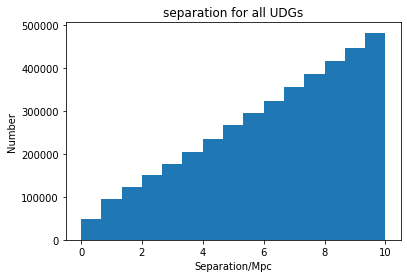

In [88]:
fig, ax = plt.subplots()

# set do_log = 0 for linear bins, = 1 for log bins
do_log = 0

if (do_log == 0):
    ax.set(title='separation for all UDGs', xlabel='Separation/Mpc', ylabel = 'Number')
else:
    ax.set(title='separation for all UDGs', xlabel='log10(separation/Mpc)', ylabel = 'Number')
    

if do_log == 1:
    hist_UDGs = plt.hist(sep_all, bins=np.logspace(start=np.log10(0.05), stop=np.log10(d3d_sep), num=15),density=False)
    plt.gca().set_xscale("log")
else:
    hist_UDGs = plt.hist(sep_all, bins=15,density=False)
    plt.gca().set_xscale('linear') 

plt.show

len(hist_UDGs[0])
hist_UDGs[1] # edges of each bin (=x values), which later will be used as radius 

<function matplotlib.pyplot.show(close=None, block=None)>

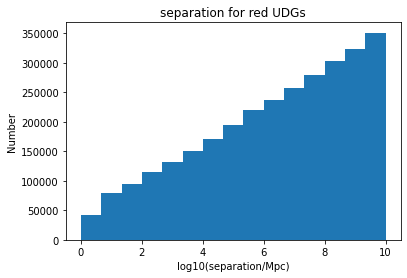

In [89]:
# Creates the histogram of red UDGs
#redhist = plt.hist(red, bins=15)#bins_list)
#plt.gca().set_xscale('log')
fig, ax = plt.subplots()

ax.set(title='separation for red UDGs', xlabel='log10(separation/Mpc)',ylabel='Number')

if do_log == 1:
    redhist = plt.hist(sep_red, bins=hist_UDGs[1])
    plt.gca().set_xscale("log")
else:
    redhist = plt.hist(sep_red, bins=15)
    plt.gca().set_xscale('linear') 

plt.show

#redhist[0]

<function matplotlib.pyplot.show(close=None, block=None)>

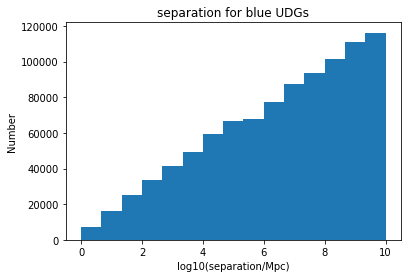

In [90]:
# Creates the histogram of blue UDGs
#bluehist = plt.hist(blue, bins=15)#bins_list)
#plt.gca().set_xscale('log')
fig, ax = plt.subplots()

ax.set(title='separation for blue UDGs', xlabel='log10(separation/Mpc)', ylabel='Number')

if do_log == 1:
#    bluehist = plt.hist(blue, bins=np.logspace(start=np.log10(0.05), stop=np.log10(1.1), num=15),density=False)
    bluehist = plt.hist(sep_blue, bins=hist_UDGs[1])
    plt.gca().set_xscale("log")    
else:
    bluehist = plt.hist(sep_blue, bins=15)
    plt.gca().set_xscale('linear') 

plt.show

In [91]:
# Below is used to calculate areas of annuli 
# Skip to the next cell for log scaling
area_annulus = np.array([])
# Calculates the area of annulus (= pi*(R^2-r^2))
#a = np.array([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
a = np.array([])

scale = 100 # use 0.1 for Mpc, 100 for Kpc. 

# OLD
#M_k = 1000 # Mpc * 1000 = kpc
#for i in range(1, 16):
# in case of Kpc, radius would be 100, 200, 300,..., 1500 kpc
#    R = round(i*scale, 2) # R = outer radius
#    r = round((i-1)*scale, 2) # r = inner radius 
#    area = np.pi*(R**2 - r**2)
#    area_annulus = np.append(area_annulus, area)
#    a = np.append(a, hist_UDGs[1][i])

# NEW
for i in range(0, 14):
# in case of Kpc, radius would be 100, 200, 300,..., 1500 kpc
    R = hist_UDGs[1][i+1] # R = outer radius
    r = hist_UDGs[1][i] # r = inner radius 
    # calculate area of annulus and convert to kpc^2
    area = np.pi*(R**2 - r**2)*(1000*1000)
    area_annulus = np.append(area_annulus, area)
    a = np.append(a, (hist_UDGs[1][i] + hist_UDGs[1][i+1])/2.)
       
print(area_annulus)

[ 1398429.92473989  4190631.47191532  6982833.01909075  9775034.56626618
 12567236.11344161 15359437.66061702 18151639.20779246 20943840.75496789
 23736042.30214331 26528243.84931875 29320445.39649418 32112646.94366959
 34904848.49084504 37697050.03802042]


In [92]:
#hist_UDGs = hist_UDGs[0]
#redhist = redhist[0]
#bluehist = bluehist[0]
UDGs_hist = np.array([])
density_red = np.array([])
density_blue = np.array([])
for i in range(0,14):
    density_UDGs = hist_UDGs[0][i]/area_annulus[i]
    density_r = redhist[0][i]/area_annulus[i]
    density_b = bluehist[0][i]/area_annulus[i]
    UDGs_hist = np.append(UDGs_hist, density_UDGs)
    density_red = np.append(density_red, density_r)
    density_blue = np.append(density_blue, density_b)
print(density_red)

[0.02957317 0.01872462 0.01351529 0.01167484 0.01045465 0.00974847
 0.00937144 0.00929319 0.00929216 0.00895344 0.00879601 0.00871601
 0.00867011 0.00855422]


[-0.03852577 -8.25790094]
[-0.04503434 -8.35288575]
[-0.02026422 -8.99284253]


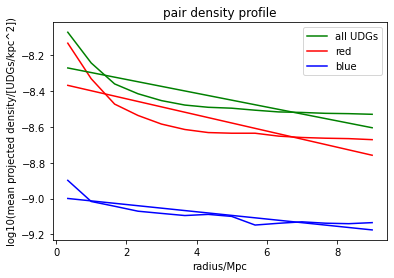

In [93]:
plt.title('pair density profile' )#throughout 1 Mpc radius')
plt.xlabel('log10(radius/Mpc)')
plt.ylabel('log10(mean projected density/[UDGs/kpc^2])')

do_log = 1

if do_log == 0:
    x_prime = np.log10(a)
    plt.xlabel('log10(radius/Mpc)')
else:
    x_prime = a
    plt.xlabel('radius/Mpc')
    
y_prime = np.log10(UDGs_hist/len(sep_all))
y_r = np.log10(density_red/len(sep_all))
y_b = np.log10(density_blue/len(sep_all))
plt.plot(x_prime, y_prime, label='all UDGs', color='g')
plt.plot(x_prime, y_r, label='red', color='red')
plt.plot(x_prime, y_b, label='blue', color='blue')

coeff = np.polyfit(x_prime, y_prime, 1) # m=slopes & b = y-intercept
Y = np.polyval(coeff, x_prime)
plt.plot(x_prime,Y,color='g')
print(coeff)

coeff = np.polyfit(x_prime, y_r, 1) # m=slopes & b = y-intercept
Y = np.polyval(coeff, x_prime)
plt.plot(x_prime,Y,color='r')
print(coeff)

coeff = np.polyfit(x_prime, y_b, 1) # m=slopes & b = y-intercept
Y = np.polyval(coeff, x_prime)
plt.plot(x_prime,Y,color='b')
print(coeff)

#print(m)
plt.legend()
#plt.plot(x_prime, m*x_prime + b)

In [94]:
def exponential(x, a, k, b):
    return a*np.exp(x*k) + b

In [95]:
import scipy
#def exponential(x, a, k, b):
#    return a*np.exp(x*k) + b

popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime, p0=[7,-0.5, 1])
#popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime)

In [96]:
popt_exponential 

array([ 0.56968128, -0.71632318, -8.52196965])

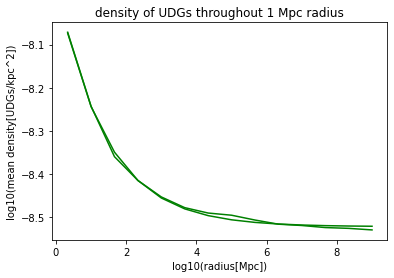

array([ 0.56968123, -0.71632296, -8.52196966])

In [97]:
import scipy
#def exponential(x, a, k, b):
#    return a*np.exponential(x*k) + b


popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime, p0=[1,-0.5, 1])
#popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime)
fig, ax = plt.subplots()
plt.title('density of UDGs throughout 1 Mpc radius')
plt.xlabel('log10(radius[Mpc])')
plt.ylabel('log10(mean density[UDGs/kpc^2])')

plt.plot(x_prime, y_prime, label='all UDGs', color='g')
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime, p0=[1,-0.5, 1])
#popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_prime)
plt.plot(x_prime, exponential(x_prime, *popt_exponential), color='g')
popt_exponential
plt.show()
plt.legend;
popt_exponential

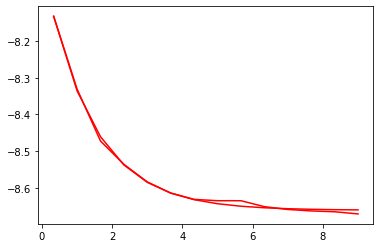

array([ 0.67355354, -0.72719877, -8.66118778])

In [98]:
fig, ax = plt.subplots()
plt.plot(x_prime, y_r, label='all UDGs', color='r')
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_r, p0=[1,-0.5, 1])
#popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_r)
plt.plot(x_prime, exponential(x_prime, *popt_exponential), color='r')
red = popt_exponential
plt.show()
plt.legend;
popt_exponential

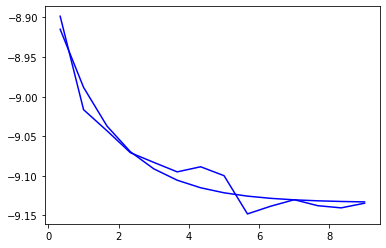

array([ 0.26878063, -0.61228932, -9.13395572])

In [99]:
fig, ax = plt.subplots()
plt.plot(x_prime, y_b, label='all UDGs', color='b')
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_b, p0=[1,-0.5, 1], maxfev=5000)
#popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, y_b,maxfev=5000)
blue = popt_exponential
plt.plot(x_prime, exponential(x_prime, *popt_exponential), color='b')
plt.show()
plt.legend;
popt_exponential

In [100]:
sample_list = list(np.linspace(0, 1, 500))
type(sample_list)

list

In [101]:
import random 
list_Size = 200
rand_seed = random.sample(sample_list, list_Size)
#rand_seed

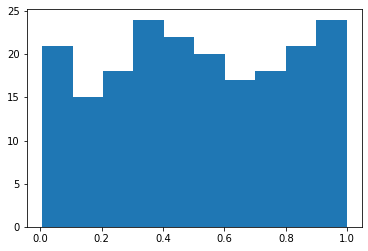

In [102]:
rand_hist = plt.hist(rand_seed)

array([0.00601202, 0.07686802, 0.14772402, 0.21858002, 0.28943601,
       0.36029201, 0.43114801, 0.50200401, 0.57286001, 0.643716  ,
       0.714572  , 0.785428  , 0.856284  , 0.92713999, 0.99799599])

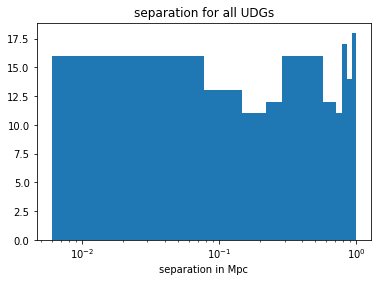

In [103]:
fig, ax = plt.subplots()

# set do_log = 0 for linear bins, = 1 for log bins
do_log = 0

ax.set(title='separation for all UDGs', xlabel='separation in Mpc')

if do_log == 1:
    hist_rand = plt.hist(rand_seed, bins=np.logspace(start=np.log10(0.05), stop=np.log10(1.1), num=10),density=False)
    plt.gca().set_xscale("log")
else:
    hist_rand = plt.hist(rand_seed, bins=14)
    plt.gca().set_xscale('log') # changes the scale to log

plt.show
#plt.legend;
len(hist_rand[0])
hist_rand[1] # edges of each bin (=x values), which later will be used as radius 

In [104]:
hist_rand[0], x_prime

(array([16., 13., 11., 12., 16., 16., 16., 16., 12., 12., 11., 17., 14.,
        18.]),
 array([0.33387   , 1.00049784, 1.66712568, 2.33375352, 3.00038136,
        3.6670092 , 4.33363704, 5.00026488, 5.66689272, 6.33352057,
        7.00014841, 7.66677625, 8.33340409, 9.00003193]))

In [105]:
import scipy
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, x_prime, hist_rand[0], p0=[1,-0.5, 1])

/data0/sw/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


a, k, b:  [ 12.03027044 -66.01306719  14.28571429]


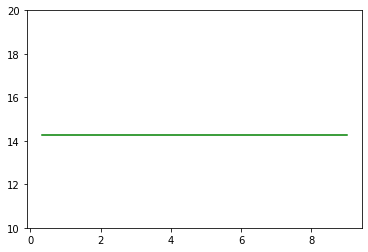

In [106]:
plt.plot(x_prime, exponential(x_prime, 0, 0, popt_exponential[2]), color='g')
plt.ylim(10, 20)
print("a, k, b: ", popt_exponential)

In [107]:
ra = result['RA_d']
dec = result['DEC_d']
udgs = SkyCoord(ra,dec,frame='icrs', unit=u.deg)

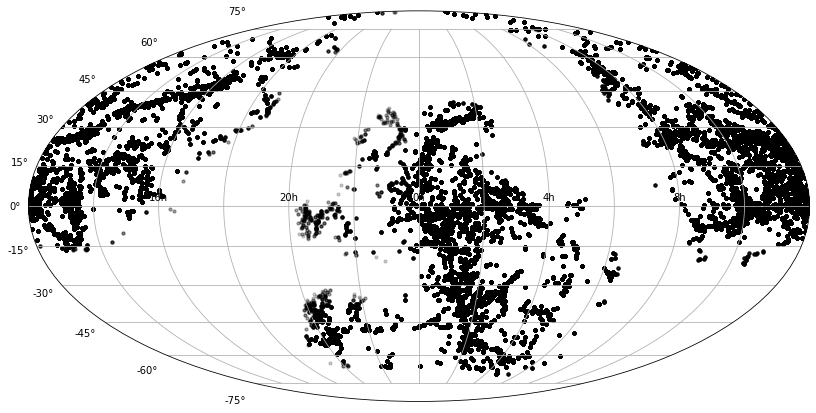

In [108]:
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111, projection="mollweide")
im = ax.scatter(udgs.ra.wrap_at('180d').radian, udgs.dec.radian, s= 10, marker='o',c = 'black', alpha =0.2)
ax.set_xticklabels([' ','16h',' ','20h',' ','0h','  ','4h','  ','8h',' '])
ax.grid(True)

In [109]:
customSimbad = Simbad()
Simbad.list_votable_fields()
customSimbad.get_votable_fields()

--NOTES--

1. The parameter filtername must correspond to an existing filter. Filters include: B,V,R,I,J,K.  They are checked by SIMBAD but not astroquery.simbad

2. Fields beginning with rvz display the data as it is in the database. Fields beginning with rv force the display as a radial velocity. Fields beginning with z force the display as a redshift

3. For each measurement catalog, the VOTable contains all fields of the first measurement. When applicable, the first measurement is the mean one. 

Available VOTABLE fields:

bibcodelist(y1-y2)
biblio
cel
cl.g
coo(opt)
coo_bibcode
coo_err_angle
coo_err_maja
coo_err_mina
coo_qual
coo_wavelength
coordinates
dec(opt)
dec_prec
diameter
dim
dim_angle
dim_bibcode
dim_incl
dim_majaxis
dim_minaxis
dim_qual
dim_wavelength
dimensions
distance
distance_result
einstein
fe_h
flux(filtername)
flux_bibcode(filtername)
flux_error(filtername)
flux_name(filtername)
flux_qual(filtername)
flux_system(filtername)
flux_unit(filtername)
fluxdata(filtername)

['main_id', 'coordinates']